In [1]:
import os
import sys

# os.chdir("..")
sys.path.append(os.getcwd())
os.getcwd()

'/scratch/pmc026/nchoong/run_conda/522172'

In [2]:
import glob

group_dir = os.getenv("MYGROUP")
glob.glob(f"{group_dir}/QuantumTransformer/data/word_embeddings/imdb_train_batch_*.pt")

['/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_0.pt',
 '/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_1.pt',
 '/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_2.pt',
 '/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_3.pt',
 '/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_4.pt',
 '/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_5.pt',
 '/group/pmc026/nchoong/QuantumTransformer/data/word_embeddings/imdb_train_batch_6.pt']

In [3]:
from transformer.pytorch.main_no_embed import main
from transformer.pytorch.utils.load_dataloader import load_dataloader
from transformer.pytorch.utils.plots import plot_metrics

2024-10-04 16:22:58.308736: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-04 16:22:58.325532: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-04 16:22:58.341477: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-04 16:22:58.346350: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-04 16:22:58.653774: I tensorflow/core/platform/cpu_feature_guar

2024-10-04 16:23:03.718535: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Please first ``pip install -U qiskit`` to enable related functionality in translation module


In [4]:
from config import dev

dev

device(type='cuda')

In [5]:
import random
import numpy as np
import torch
import tensorflow as tf
import pennylane.ops as qmlops

In [6]:
seed = 42

os.environ["PYTHONHASHSEED"] = str(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["TF_CUDNN_DETERMINISTIC"] = "1"
tf.config.threading.set_inter_op_parallelism_threads(1)
tf.config.threading.set_intra_op_parallelism_threads(1)

os.environ["OMP_NUM_THREADS"] = str(os.cpu_count())
os.environ["TF_NUM_INTEROP_THREADS"] = str(os.cpu_count())
os.environ["TF_NUM_INTRAOP_THREADS"] = str(os.cpu_count())

tf.config.threading.set_intra_op_parallelism_threads(os.cpu_count())
tf.config.threading.set_inter_op_parallelism_threads(os.cpu_count())

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [7]:
train_dataloader, val_dataloader, test_dataloader = load_dataloader("imdb")

Loading train tensors:   0%|          | 0/7 [00:00<?, ?it/s]

Loading train tensors:  14%|█▍        | 1/7 [00:03<00:23,  3.98s/it]

Loading train tensors:  29%|██▊       | 2/7 [00:07<00:19,  3.98s/it]

Loading train tensors:  43%|████▎     | 3/7 [00:11<00:15,  3.96s/it]

Loading train tensors:  57%|█████▋    | 4/7 [00:15<00:11,  3.93s/it]

Loading train tensors:  71%|███████▏  | 5/7 [00:19<00:07,  3.94s/it]

Loading train tensors:  86%|████████▌ | 6/7 [00:23<00:03,  3.91s/it]

Loading train tensors: 100%|██████████| 7/7 [00:25<00:00,  3.27s/it]

Loading train tensors: 100%|██████████| 7/7 [00:25<00:00,  3.65s/it]

Sample size:  5000


Loading val tensors:   0%|          | 0/2 [00:00<?, ?it/s]

Loading val tensors:  50%|█████     | 1/2 [00:03<00:03,  3.89s/it]

Loading val tensors: 100%|██████████| 2/2 [00:06<00:00,  3.03s/it]

Loading val tensors: 100%|██████████| 2/2 [00:06<00:00,  3.16s/it]

Loading test tensors:   0%|          | 0/9 [00:00<?, ?it/s]

Loading test tensors:  11%|█         | 1/9 [00:03<00:30,  3.77s/it]

Loading test tensors:  22%|██▏       | 2/9 [00:07<00:26,  3.77s/it]

Loading test tensors:  33%|███▎      | 3/9 [00:11<00:22,  3.78s/it]

Loading test tensors:  44%|████▍     | 4/9 [00:15<00:19,  3.80s/it]

Loading test tensors:  56%|█████▌    | 5/9 [00:18<00:15,  3.78s/it]

Loading test tensors:  67%|██████▋   | 6/9 [00:22<00:11,  3.84s/it]

Loading test tensors:  78%|███████▊  | 7/9 [00:26<00:07,  3.86s/it]

Loading test tensors:  89%|████████▉ | 8/9 [00:30<00:03,  3.85s/it]

Loading test tensors: 100%|██████████| 9/9 [00:31<00:00,  2.81s/it]

Loading test tensors: 100%|██████████| 9/9 [00:31<00:00,  3.46s/it]

Test size:  5000


Sampled train tensor shape:  torch.Size([20000, 128, 768])
Sampled val tensor shape:  torch.Size([5000, 128, 768])
Sampled test tensor shape:  torch.Size([5000, 128, 768])


Train, Val, Test size:  20000 5000 5000
pos:  10006
neg:  9994
pos:  2494
neg:  2506
pos:  2515
neg:  2485


In [8]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "X",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "X",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)


/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (ffn): FeedForward(
        (linear_1): Linear(in_features=8, out_features=8, bias=True)
        (linear_2): Linear(in_features=8, out_features=8, bias=True)
        (vqc): QuantumLayer(
          (linear

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:01<10:10,  1.96s/batch]

Epoch   1/20:   1%|          | 2/313 [00:03<09:32,  1.84s/batch]

Epoch   1/20:   1%|          | 3/313 [00:05<09:22,  1.82s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:07<09:16,  1.80s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:09<09:12,  1.79s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:10<09:10,  1.79s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:13<09:54,  1.94s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:15<10:22,  2.04s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:17<10:16,  2.03s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:19<10:08,  2.01s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:21<09:46,  1.94s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:22<09:30,  1.90s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:24<09:21,  1.87s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:26<09:54,  1.99s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:29<10:41,  2.15s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:31<10:10,  2.06s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:33<09:45,  1.98s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:34<09:27,  1.92s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:36<09:14,  1.89s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:38<09:04,  1.86s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:40<08:57,  1.84s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:42<08:51,  1.83s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:44<09:06,  1.89s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:45<08:57,  1.86s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:47<08:51,  1.84s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:49<08:45,  1.83s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:51<08:41,  1.83s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:53<08:37,  1.82s/batch]

Epoch   1/20:   9%|▉         | 29/313 [00:54<08:34,  1.81s/batch]

Epoch   1/20:  10%|▉         | 30/313 [00:56<08:32,  1.81s/batch]

Epoch   1/20:  10%|▉         | 31/313 [00:58<08:28,  1.80s/batch]

Epoch   1/20:  10%|█         | 32/313 [01:00<08:27,  1.81s/batch]

Epoch   1/20:  11%|█         | 33/313 [01:02<08:25,  1.81s/batch]

Epoch   1/20:  11%|█         | 34/313 [01:03<08:22,  1.80s/batch]

Epoch   1/20:  11%|█         | 35/313 [01:05<08:33,  1.85s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [01:07<08:27,  1.83s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [01:09<08:22,  1.82s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [01:11<08:34,  1.87s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [01:13<08:25,  1.85s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [01:15<08:42,  1.91s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [01:17<08:29,  1.87s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [01:18<08:19,  1.84s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [01:20<08:12,  1.82s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [01:22<08:07,  1.81s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [01:24<08:05,  1.81s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [01:26<08:02,  1.81s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [01:27<08:01,  1.81s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [01:29<08:00,  1.81s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [01:31<07:56,  1.81s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [01:33<07:54,  1.80s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [01:35<08:27,  1.94s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:37<08:49,  2.03s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:40<09:04,  2.09s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:41<08:38,  2.00s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:43<08:20,  1.94s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:45<08:07,  1.90s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [01:47<07:56,  1.86s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [01:48<07:49,  1.84s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [01:50<07:43,  1.83s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [01:53<08:13,  1.95s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [01:55<08:34,  2.04s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [01:57<08:16,  1.98s/batch]

Epoch   1/20:  20%|██        | 63/313 [01:58<08:02,  1.93s/batch]

Epoch   1/20:  20%|██        | 64/313 [02:00<07:53,  1.90s/batch]

Epoch   1/20:  21%|██        | 65/313 [02:02<07:45,  1.88s/batch]

Epoch   1/20:  21%|██        | 66/313 [02:04<07:39,  1.86s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [02:06<08:06,  1.98s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [02:08<08:04,  1.98s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [02:10<08:22,  2.06s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [02:12<08:07,  2.01s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [02:14<07:48,  1.94s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [02:16<07:35,  1.89s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [02:18<07:25,  1.85s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [02:19<07:17,  1.83s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [02:21<07:11,  1.81s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [02:23<07:07,  1.80s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [02:25<07:33,  1.92s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [02:27<07:53,  2.02s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [02:30<08:08,  2.09s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [02:32<08:17,  2.14s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [02:34<08:07,  2.10s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [02:36<08:16,  2.15s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [02:38<07:50,  2.05s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [02:40<07:45,  2.03s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [02:42<07:25,  1.96s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [02:43<07:11,  1.90s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [02:45<07:00,  1.86s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [02:47<06:54,  1.84s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [02:49<06:48,  1.83s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [02:51<06:58,  1.88s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [02:53<06:49,  1.84s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [02:54<06:42,  1.82s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [02:57<07:08,  1.95s/batch]

Epoch   1/20:  30%|███       | 94/313 [02:59<07:14,  1.98s/batch]

Epoch   1/20:  30%|███       | 95/313 [03:00<06:59,  1.93s/batch]

Epoch   1/20:  31%|███       | 96/313 [03:02<06:49,  1.89s/batch]

Epoch   1/20:  31%|███       | 97/313 [03:04<06:41,  1.86s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [03:06<06:35,  1.84s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [03:08<06:30,  1.83s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [03:09<06:26,  1.81s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [03:11<06:23,  1.81s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [03:13<06:19,  1.80s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [03:15<06:17,  1.80s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [03:17<06:15,  1.79s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [03:18<06:18,  1.82s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [03:20<06:13,  1.81s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [03:22<06:10,  1.80s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [03:24<06:07,  1.79s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [03:26<06:04,  1.79s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [03:27<06:01,  1.78s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [03:29<05:59,  1.78s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [03:31<05:57,  1.78s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [03:33<05:55,  1.78s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [03:34<05:53,  1.78s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [03:36<05:58,  1.81s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [03:38<05:55,  1.80s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [03:40<05:52,  1.80s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [03:42<05:51,  1.80s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [03:44<05:48,  1.80s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [03:46<05:59,  1.86s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [03:47<05:52,  1.84s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [03:49<05:47,  1.82s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [03:51<05:42,  1.80s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [03:53<06:06,  1.94s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [03:55<06:07,  1.95s/batch]

Epoch   1/20:  40%|████      | 126/313 [03:57<05:55,  1.90s/batch]

Epoch   1/20:  41%|████      | 127/313 [03:59<05:47,  1.87s/batch]

Epoch   1/20:  41%|████      | 128/313 [04:00<05:41,  1.84s/batch]

Epoch   1/20:  41%|████      | 129/313 [04:02<05:36,  1.83s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [04:04<05:32,  1.82s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [04:06<05:28,  1.81s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [04:08<05:26,  1.80s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [04:09<05:24,  1.80s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [04:11<05:21,  1.80s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [04:13<05:19,  1.79s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [04:15<05:16,  1.79s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [04:17<05:15,  1.79s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [04:18<05:14,  1.80s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [04:20<05:11,  1.79s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [04:22<05:09,  1.79s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [04:24<05:07,  1.79s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [04:25<05:05,  1.79s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [04:27<05:04,  1.79s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [04:29<05:10,  1.84s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [04:31<05:06,  1.82s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [04:33<05:02,  1.81s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [04:35<04:59,  1.80s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [04:36<04:57,  1.80s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [04:38<04:55,  1.80s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [04:40<04:53,  1.80s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [04:42<04:50,  1.79s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [04:44<04:50,  1.80s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [04:45<04:48,  1.80s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [04:47<04:45,  1.80s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [04:49<04:43,  1.80s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [04:51<04:41,  1.79s/batch]

Epoch   1/20:  50%|█████     | 157/313 [04:53<04:53,  1.88s/batch]

Epoch   1/20:  50%|█████     | 158/313 [04:55<04:48,  1.86s/batch]

Epoch   1/20:  51%|█████     | 159/313 [04:57<04:46,  1.86s/batch]

Epoch   1/20:  51%|█████     | 160/313 [04:58<04:41,  1.84s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [05:00<04:37,  1.82s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [05:02<04:33,  1.81s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [05:04<04:30,  1.80s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [05:05<04:27,  1.80s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [05:07<04:25,  1.79s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [05:09<04:23,  1.79s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [05:11<04:21,  1.79s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [05:13<04:19,  1.79s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [05:14<04:17,  1.79s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [05:16<04:15,  1.79s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [05:18<04:13,  1.79s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [05:20<04:11,  1.79s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [05:22<04:09,  1.79s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [05:23<04:08,  1.78s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [05:25<04:06,  1.78s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [05:27<04:04,  1.78s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [05:29<04:02,  1.78s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [05:30<04:01,  1.79s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [05:32<03:59,  1.79s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [05:34<03:57,  1.79s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [05:36<03:57,  1.80s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [05:38<04:12,  1.93s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [05:40<04:23,  2.02s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [05:43<04:30,  2.09s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [05:44<04:20,  2.04s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [05:46<04:08,  1.96s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [05:48<04:00,  1.91s/batch]

Epoch   1/20:  60%|██████    | 188/313 [05:50<03:53,  1.87s/batch]

Epoch   1/20:  60%|██████    | 189/313 [05:52<03:48,  1.84s/batch]

Epoch   1/20:  61%|██████    | 190/313 [05:53<03:44,  1.82s/batch]

Epoch   1/20:  61%|██████    | 191/313 [05:55<03:40,  1.81s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [05:57<03:37,  1.80s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [05:59<03:34,  1.79s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [06:00<03:32,  1.79s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [06:02<03:30,  1.78s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [06:04<03:28,  1.78s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [06:06<03:26,  1.78s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [06:08<03:24,  1.78s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [06:09<03:22,  1.78s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [06:12<03:36,  1.92s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [06:13<03:30,  1.88s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [06:15<03:25,  1.85s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [06:17<03:21,  1.83s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [06:19<03:18,  1.82s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [06:21<03:14,  1.80s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [06:23<03:19,  1.86s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [06:24<03:15,  1.84s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [06:26<03:11,  1.82s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [06:28<03:08,  1.81s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [06:30<03:05,  1.80s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [06:32<03:16,  1.93s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [06:34<03:20,  1.99s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [06:36<03:15,  1.96s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [06:38<03:07,  1.90s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [06:39<03:01,  1.86s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [06:41<02:57,  1.83s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [06:43<02:53,  1.81s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [06:45<02:50,  1.79s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [06:46<02:47,  1.78s/batch]

Epoch   1/20:  70%|███████   | 220/313 [06:48<02:45,  1.78s/batch]

Epoch   1/20:  71%|███████   | 221/313 [06:50<02:42,  1.77s/batch]

Epoch   1/20:  71%|███████   | 222/313 [06:52<02:40,  1.77s/batch]

Epoch   1/20:  71%|███████   | 223/313 [06:53<02:38,  1.76s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [06:56<02:48,  1.89s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [06:58<02:55,  1.99s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [07:00<02:47,  1.93s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [07:01<02:41,  1.88s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [07:03<02:42,  1.92s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [07:05<02:37,  1.88s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [07:07<02:34,  1.86s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [07:09<02:30,  1.84s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [07:11<02:27,  1.83s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [07:12<02:26,  1.83s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [07:14<02:23,  1.82s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [07:16<02:21,  1.81s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [07:18<02:19,  1.81s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [07:20<02:17,  1.80s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [07:21<02:15,  1.80s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [07:23<02:13,  1.80s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [07:25<02:12,  1.81s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [07:27<02:10,  1.81s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [07:29<02:08,  1.81s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [07:30<02:05,  1.80s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [07:32<02:03,  1.79s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [07:34<02:01,  1.79s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [07:36<01:59,  1.78s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [07:38<01:57,  1.78s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [07:39<01:55,  1.78s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [07:41<01:53,  1.78s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [07:43<01:52,  1.78s/batch]

Epoch   1/20:  80%|████████  | 251/313 [07:45<01:50,  1.78s/batch]

Epoch   1/20:  81%|████████  | 252/313 [07:46<01:48,  1.78s/batch]

Epoch   1/20:  81%|████████  | 253/313 [07:48<01:46,  1.77s/batch]

Epoch   1/20:  81%|████████  | 254/313 [07:50<01:44,  1.77s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [07:52<01:42,  1.77s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [07:54<01:40,  1.77s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [07:55<01:39,  1.77s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [07:57<01:37,  1.77s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [07:59<01:35,  1.77s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [08:01<01:34,  1.79s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [08:02<01:32,  1.78s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [08:04<01:30,  1.78s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [08:06<01:29,  1.78s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [08:08<01:27,  1.78s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [08:10<01:31,  1.90s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [08:12<01:27,  1.86s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [08:14<01:24,  1.85s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [08:15<01:22,  1.83s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [08:17<01:20,  1.82s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [08:19<01:18,  1.82s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [08:21<01:15,  1.81s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [08:23<01:13,  1.80s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [08:24<01:11,  1.79s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [08:26<01:09,  1.79s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [08:28<01:07,  1.79s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [08:30<01:06,  1.79s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [08:31<01:04,  1.79s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [08:33<01:02,  1.78s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [08:35<01:00,  1.78s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [08:37<00:58,  1.78s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [08:39<00:56,  1.78s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [08:40<00:55,  1.78s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [08:42<00:54,  1.81s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [08:44<00:52,  1.81s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [08:46<00:50,  1.80s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [08:48<00:48,  1.79s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [08:49<00:46,  1.79s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [08:51<00:44,  1.79s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [08:53<00:42,  1.78s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [08:55<00:43,  1.88s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [08:57<00:40,  1.85s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [08:59<00:38,  1.82s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [09:00<00:36,  1.81s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [09:02<00:34,  1.80s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [09:04<00:32,  1.79s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [09:06<00:30,  1.79s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [09:08<00:29,  1.86s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [09:09<00:27,  1.84s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [09:11<00:25,  1.82s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [09:13<00:23,  1.81s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [09:15<00:21,  1.80s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [09:17<00:19,  1.79s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [09:18<00:17,  1.79s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [09:20<00:16,  1.80s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [09:22<00:14,  1.79s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [09:24<00:12,  1.81s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [09:26<00:10,  1.79s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [09:27<00:08,  1.79s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [09:29<00:07,  1.78s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [09:31<00:05,  1.78s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [09:33<00:03,  1.77s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [09:35<00:01,  1.91s/batch]

Epoch   1/20: 100%|██████████| 313/313 [09:36<00:00,  1.69s/batch]

Epoch   1/20: 100%|██████████| 313/313 [09:36<00:00,  1.69s/batch, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [10:06<00:00,  1.69s/batch, Epoch = 10m 6s, Loss = 0.5911|0.4778, Acc = 0.679|0.779, AUC = 75.174|86.235]

Epoch   1/20: 100%|██████████| 313/313 [10:06<00:00,  1.94s/batch, Epoch = 10m 6s, Loss = 0.5911|0.4778, Acc = 0.679|0.779, AUC = 75.174|86.235]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:01<09:05,  1.75s/batch]

Epoch   2/20:   1%|          | 2/313 [00:03<09:04,  1.75s/batch]

Epoch   2/20:   1%|          | 3/313 [00:05<09:03,  1.75s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:07<09:02,  1.76s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:08<09:01,  1.76s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:10<08:59,  1.76s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:12<08:57,  1.76s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:14<08:56,  1.76s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:15<08:54,  1.76s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:17<08:52,  1.76s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:19<08:52,  1.76s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:21<08:50,  1.76s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:22<08:48,  1.76s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:24<08:46,  1.76s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:26<08:44,  1.76s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:28<09:09,  1.85s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:30<08:59,  1.82s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:31<08:53,  1.81s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:33<08:46,  1.79s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:35<08:41,  1.78s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:37<08:37,  1.77s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:38<08:34,  1.77s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:40<08:32,  1.77s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:42<08:30,  1.77s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:44<09:08,  1.90s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:46<08:53,  1.86s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:48<08:42,  1.83s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:50<08:34,  1.81s/batch]

Epoch   2/20:   9%|▉         | 29/313 [00:51<08:28,  1.79s/batch]

Epoch   2/20:  10%|▉         | 30/313 [00:53<08:23,  1.78s/batch]

Epoch   2/20:  10%|▉         | 31/313 [00:55<08:19,  1.77s/batch]

Epoch   2/20:  10%|█         | 32/313 [00:57<08:17,  1.77s/batch]

Epoch   2/20:  11%|█         | 33/313 [00:58<08:14,  1.76s/batch]

Epoch   2/20:  11%|█         | 34/313 [01:00<08:24,  1.81s/batch]

Epoch   2/20:  11%|█         | 35/313 [01:02<08:20,  1.80s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [01:04<08:18,  1.80s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [01:06<08:16,  1.80s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [01:07<08:12,  1.79s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [01:09<08:08,  1.78s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [01:11<08:05,  1.78s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [01:13<08:02,  1.77s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [01:14<08:00,  1.77s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [01:16<07:58,  1.77s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [01:18<07:56,  1.77s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [01:20<07:54,  1.77s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [01:21<07:52,  1.77s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [01:23<07:50,  1.77s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [01:25<07:49,  1.77s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [01:27<07:47,  1.77s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [01:29<07:44,  1.77s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [01:30<07:42,  1.77s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:33<08:15,  1.90s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:34<08:04,  1.86s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:36<07:54,  1.83s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:38<07:50,  1.82s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:40<07:46,  1.82s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [01:41<07:41,  1.80s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [01:43<07:36,  1.79s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [01:45<07:33,  1.78s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [01:47<07:30,  1.78s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [01:49<07:27,  1.78s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [01:50<07:27,  1.78s/batch]

Epoch   2/20:  20%|██        | 63/313 [01:52<07:24,  1.78s/batch]

Epoch   2/20:  20%|██        | 64/313 [01:54<07:22,  1.78s/batch]

Epoch   2/20:  21%|██        | 65/313 [01:56<07:19,  1.77s/batch]

Epoch   2/20:  21%|██        | 66/313 [01:57<07:17,  1.77s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [01:59<07:15,  1.77s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [02:01<07:12,  1.77s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [02:03<07:12,  1.77s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [02:04<07:09,  1.77s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [02:06<07:07,  1.77s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [02:08<07:05,  1.76s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [02:10<07:03,  1.76s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [02:11<07:01,  1.76s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [02:13<06:59,  1.76s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [02:15<06:57,  1.76s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [02:17<07:21,  1.87s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [02:19<07:16,  1.86s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [02:21<07:08,  1.83s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [02:22<07:01,  1.81s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [02:24<06:56,  1.80s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [02:26<06:52,  1.79s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [02:28<06:49,  1.78s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [02:30<06:46,  1.78s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [02:31<06:44,  1.77s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [02:33<06:43,  1.78s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [02:35<06:40,  1.77s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [02:37<06:37,  1.77s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [02:38<06:35,  1.77s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [02:40<06:33,  1.76s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [02:42<06:31,  1.76s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [02:44<06:29,  1.76s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [02:45<06:27,  1.76s/batch]

Epoch   2/20:  30%|███       | 94/313 [02:47<06:25,  1.76s/batch]

Epoch   2/20:  30%|███       | 95/313 [02:49<06:23,  1.76s/batch]

Epoch   2/20:  31%|███       | 96/313 [02:51<06:22,  1.76s/batch]

Epoch   2/20:  31%|███       | 97/313 [02:52<06:20,  1.76s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [02:54<06:18,  1.76s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [02:56<06:16,  1.76s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [02:58<06:15,  1.76s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [03:00<06:13,  1.76s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [03:01<06:11,  1.76s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [03:03<06:16,  1.79s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [03:05<06:21,  1.83s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [03:07<06:15,  1.81s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [03:09<06:11,  1.79s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [03:10<06:07,  1.78s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [03:12<06:04,  1.78s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [03:14<06:01,  1.77s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [03:16<05:59,  1.77s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [03:17<05:56,  1.77s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [03:19<05:55,  1.77s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [03:21<05:53,  1.77s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [03:23<05:51,  1.77s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [03:24<05:49,  1.76s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [03:26<05:47,  1.76s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [03:28<05:45,  1.76s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [03:30<05:43,  1.76s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [03:31<05:41,  1.76s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [03:33<05:40,  1.76s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [03:35<05:39,  1.77s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [03:37<05:37,  1.77s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [03:39<05:35,  1.77s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [03:40<05:34,  1.77s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [03:42<05:32,  1.77s/batch]

Epoch   2/20:  40%|████      | 126/313 [03:44<05:53,  1.89s/batch]

Epoch   2/20:  41%|████      | 127/313 [03:46<05:45,  1.86s/batch]

Epoch   2/20:  41%|████      | 128/313 [03:48<05:38,  1.83s/batch]

Epoch   2/20:  41%|████      | 129/313 [03:50<05:32,  1.81s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [03:51<05:28,  1.79s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [03:53<05:24,  1.79s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [03:55<05:21,  1.78s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [03:57<05:19,  1.77s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [03:58<05:16,  1.77s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [04:01<05:39,  1.91s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [04:03<05:43,  1.94s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [04:04<05:32,  1.89s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [04:06<05:25,  1.86s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [04:08<05:18,  1.83s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [04:10<05:13,  1.81s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [04:11<05:09,  1.80s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [04:13<05:05,  1.79s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [04:15<05:02,  1.78s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [04:17<05:23,  1.92s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [04:19<05:37,  2.01s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [04:21<05:28,  1.97s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [04:23<05:16,  1.91s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [04:25<05:07,  1.87s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [04:27<05:01,  1.84s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [04:28<04:55,  1.82s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [04:30<04:51,  1.80s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [04:32<04:49,  1.80s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [04:34<04:46,  1.79s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [04:36<04:43,  1.78s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [04:37<04:44,  1.80s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [04:39<04:41,  1.79s/batch]

Epoch   2/20:  50%|█████     | 157/313 [04:41<04:38,  1.79s/batch]

Epoch   2/20:  50%|█████     | 158/313 [04:43<04:35,  1.78s/batch]

Epoch   2/20:  51%|█████     | 159/313 [04:44<04:33,  1.77s/batch]

Epoch   2/20:  51%|█████     | 160/313 [04:46<04:31,  1.77s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [04:48<04:28,  1.77s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [04:50<04:26,  1.77s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [04:51<04:24,  1.77s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [04:53<04:23,  1.77s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [04:55<04:21,  1.77s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [04:57<04:19,  1.77s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [04:59<04:17,  1.77s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [05:00<04:18,  1.79s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [05:02<04:16,  1.78s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [05:04<04:13,  1.77s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [05:06<04:11,  1.77s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [05:07<04:10,  1.77s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [05:09<04:18,  1.85s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [05:11<04:19,  1.87s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [05:13<04:13,  1.84s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [05:15<04:08,  1.81s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [05:17<04:04,  1.80s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [05:18<04:01,  1.79s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [05:20<03:59,  1.79s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [05:22<03:57,  1.78s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [05:24<03:55,  1.78s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [05:26<03:53,  1.78s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [05:27<03:51,  1.78s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [05:29<03:49,  1.78s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [05:31<03:47,  1.78s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [05:33<03:45,  1.78s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [05:34<03:44,  1.78s/batch]

Epoch   2/20:  60%|██████    | 188/313 [05:36<03:42,  1.78s/batch]

Epoch   2/20:  60%|██████    | 189/313 [05:38<03:41,  1.79s/batch]

Epoch   2/20:  61%|██████    | 190/313 [05:40<03:39,  1.78s/batch]

Epoch   2/20:  61%|██████    | 191/313 [05:42<03:37,  1.78s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [05:43<03:35,  1.78s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [05:46<03:48,  1.90s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [05:47<03:41,  1.87s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [05:49<03:36,  1.84s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [05:51<03:33,  1.82s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [05:53<03:29,  1.81s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [05:54<03:26,  1.80s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [05:56<03:24,  1.79s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [05:58<03:21,  1.79s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [06:00<03:19,  1.79s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [06:02<03:17,  1.78s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [06:03<03:15,  1.78s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [06:05<03:14,  1.78s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [06:07<03:12,  1.78s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [06:09<03:11,  1.79s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [06:10<03:09,  1.78s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [06:12<03:07,  1.78s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [06:14<03:05,  1.78s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [06:16<03:03,  1.78s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [06:18<03:01,  1.78s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [06:19<02:59,  1.78s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [06:21<02:57,  1.78s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [06:23<02:56,  1.78s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [06:25<02:55,  1.79s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [06:27<02:57,  1.83s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [06:28<02:54,  1.81s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [06:30<02:51,  1.80s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [06:32<02:48,  1.79s/batch]

Epoch   2/20:  70%|███████   | 220/313 [06:34<02:49,  1.82s/batch]

Epoch   2/20:  71%|███████   | 221/313 [06:36<02:46,  1.81s/batch]

Epoch   2/20:  71%|███████   | 222/313 [06:38<02:55,  1.93s/batch]

Epoch   2/20:  71%|███████   | 223/313 [06:40<02:57,  1.97s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [06:42<02:50,  1.92s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [06:43<02:44,  1.87s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [06:45<02:40,  1.84s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [06:47<02:38,  1.84s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [06:49<02:34,  1.82s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [06:51<02:31,  1.80s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [06:53<02:32,  1.83s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [06:54<02:29,  1.82s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [06:56<02:26,  1.81s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [06:58<02:23,  1.79s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [07:00<02:21,  1.79s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [07:02<02:29,  1.92s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [07:04<02:25,  1.89s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [07:05<02:20,  1.85s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [07:07<02:17,  1.83s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [07:09<02:14,  1.81s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [07:11<02:12,  1.82s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [07:13<02:09,  1.81s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [07:14<02:07,  1.79s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [07:16<02:05,  1.79s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [07:18<02:02,  1.78s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [07:20<02:00,  1.78s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [07:21<01:58,  1.77s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [07:23<01:57,  1.77s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [07:25<02:00,  1.85s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [07:27<02:01,  1.90s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [07:29<01:57,  1.87s/batch]

Epoch   2/20:  80%|████████  | 251/313 [07:31<01:55,  1.86s/batch]

Epoch   2/20:  81%|████████  | 252/313 [07:33<01:51,  1.84s/batch]

Epoch   2/20:  81%|████████  | 253/313 [07:34<01:49,  1.82s/batch]

Epoch   2/20:  81%|████████  | 254/313 [07:36<01:46,  1.80s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [07:38<01:43,  1.79s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [07:40<01:41,  1.78s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [07:42<01:39,  1.78s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [07:43<01:37,  1.78s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [07:45<01:35,  1.77s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [07:47<01:33,  1.77s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [07:49<01:31,  1.77s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [07:50<01:30,  1.77s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [07:52<01:28,  1.76s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [07:54<01:26,  1.76s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [07:56<01:24,  1.76s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [07:57<01:22,  1.76s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [07:59<01:21,  1.76s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [08:01<01:23,  1.85s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [08:03<01:20,  1.82s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [08:05<01:17,  1.80s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [08:06<01:15,  1.79s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [08:08<01:12,  1.78s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [08:10<01:10,  1.77s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [08:12<01:09,  1.78s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [08:14<01:07,  1.77s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [08:16<01:08,  1.86s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [08:17<01:06,  1.84s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [08:19<01:03,  1.82s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [08:21<01:01,  1.80s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [08:23<00:59,  1.80s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [08:24<00:57,  1.79s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [08:26<00:55,  1.78s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [08:28<00:53,  1.78s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [08:30<00:51,  1.78s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [08:32<00:49,  1.78s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [08:33<00:47,  1.78s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [08:35<00:46,  1.77s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [08:37<00:44,  1.77s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [08:39<00:42,  1.77s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [08:40<00:40,  1.78s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [08:42<00:39,  1.78s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [08:44<00:37,  1.78s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [08:46<00:35,  1.78s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [08:48<00:33,  1.78s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [08:49<00:32,  1.78s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [08:51<00:30,  1.78s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [08:53<00:28,  1.78s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [08:55<00:26,  1.79s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [08:57<00:25,  1.79s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [08:58<00:23,  1.79s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [09:00<00:21,  1.78s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [09:02<00:19,  1.78s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [09:04<00:17,  1.78s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [09:05<00:15,  1.78s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [09:07<00:14,  1.77s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [09:09<00:12,  1.77s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [09:11<00:10,  1.77s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [09:13<00:09,  1.91s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [09:15<00:07,  1.90s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [09:17<00:05,  1.86s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [09:18<00:03,  1.83s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [09:20<00:01,  1.84s/batch]

Epoch   2/20: 100%|██████████| 313/313 [09:21<00:00,  1.57s/batch]

Epoch   2/20: 100%|██████████| 313/313 [09:21<00:00,  1.57s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [09:51<00:00,  1.57s/batch, Epoch = 9m 51s, Loss = 0.5087|0.4803, Acc = 0.764|0.781, AUC = 83.060|86.834]

Epoch   2/20: 100%|██████████| 313/313 [09:51<00:00,  1.89s/batch, Epoch = 9m 51s, Loss = 0.5087|0.4803, Acc = 0.764|0.781, AUC = 83.060|86.834]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:01<09:10,  1.76s/batch]

Epoch   3/20:   1%|          | 2/313 [00:03<09:07,  1.76s/batch]

Epoch   3/20:   1%|          | 3/313 [00:05<09:06,  1.76s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:07<09:04,  1.76s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:08<09:02,  1.76s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:10<09:04,  1.77s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:12<09:01,  1.77s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:14<08:59,  1.77s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:15<09:01,  1.78s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:17<08:58,  1.78s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:21<09:15,  1.85s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:23<09:06,  1.82s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:25<08:59,  1.80s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:26<09:11,  1.85s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:28<09:02,  1.83s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:30<09:26,  1.91s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:32<09:23,  1.91s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:34<09:09,  1.87s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:36<08:58,  1.84s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:38<08:49,  1.81s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:40<09:18,  1.92s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:41<09:03,  1.87s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:43<08:52,  1.84s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:45<08:44,  1.82s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:47<08:41,  1.82s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:49<08:35,  1.80s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:50<08:37,  1.81s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:52<08:31,  1.80s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:54<08:26,  1.79s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:56<08:23,  1.78s/batch]

Epoch   3/20:  10%|█         | 32/313 [00:58<08:58,  1.92s/batch]

Epoch   3/20:  11%|█         | 33/313 [01:00<08:50,  1.89s/batch]

Epoch   3/20:  11%|█         | 34/313 [01:02<08:36,  1.85s/batch]

Epoch   3/20:  11%|█         | 35/313 [01:03<08:29,  1.83s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [01:06<09:00,  1.95s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [01:07<08:50,  1.92s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [01:09<08:35,  1.88s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [01:11<08:23,  1.84s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [01:13<08:15,  1.82s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [01:14<08:09,  1.80s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [01:16<08:04,  1.79s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [01:18<08:00,  1.78s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [01:20<07:57,  1.77s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [01:22<07:54,  1.77s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [01:23<07:52,  1.77s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [01:25<07:50,  1.77s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [01:27<07:47,  1.77s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [01:29<07:45,  1.76s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [01:30<07:44,  1.77s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:32<07:41,  1.76s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:34<07:42,  1.77s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:36<07:39,  1.77s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:37<07:37,  1.77s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:39<07:42,  1.79s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:41<07:38,  1.78s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:43<07:34,  1.78s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:45<07:35,  1.79s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:46<07:31,  1.78s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [01:48<07:28,  1.77s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:50<07:25,  1.77s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:52<07:23,  1.77s/batch]

Epoch   3/20:  20%|██        | 63/313 [01:53<07:21,  1.77s/batch]

Epoch   3/20:  20%|██        | 64/313 [01:55<07:19,  1.76s/batch]

Epoch   3/20:  21%|██        | 65/313 [01:57<07:23,  1.79s/batch]

Epoch   3/20:  21%|██        | 66/313 [01:59<07:19,  1.78s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [02:01<07:18,  1.78s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [02:02<07:15,  1.78s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [02:04<07:17,  1.79s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [02:06<07:15,  1.79s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [02:08<07:12,  1.79s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [02:10<07:09,  1.78s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [02:11<07:07,  1.78s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [02:13<07:04,  1.78s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [02:15<07:02,  1.78s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [02:17<07:02,  1.78s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [02:18<06:59,  1.78s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [02:20<06:57,  1.78s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [02:22<06:55,  1.78s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [02:24<06:53,  1.78s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [02:26<06:54,  1.78s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [02:27<06:51,  1.78s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [02:29<06:49,  1.78s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [02:31<06:47,  1.78s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [02:33<06:45,  1.78s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [02:34<06:48,  1.80s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [02:36<06:44,  1.79s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [02:38<06:41,  1.79s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [02:40<06:40,  1.79s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [02:42<06:37,  1.78s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [02:43<06:38,  1.79s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [02:45<06:35,  1.79s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [02:47<06:46,  1.85s/batch]

Epoch   3/20:  30%|███       | 94/313 [02:49<06:39,  1.83s/batch]

Epoch   3/20:  30%|███       | 95/313 [02:51<06:55,  1.90s/batch]

Epoch   3/20:  31%|███       | 96/313 [02:53<06:44,  1.86s/batch]

Epoch   3/20:  31%|███       | 97/313 [02:55<06:37,  1.84s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [02:56<06:31,  1.82s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [02:58<06:26,  1.81s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [03:00<06:22,  1.79s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [03:02<06:19,  1.79s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [03:03<06:16,  1.78s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [03:05<06:22,  1.82s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [03:07<06:17,  1.81s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [03:09<06:39,  1.92s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [03:11<06:27,  1.87s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [03:13<06:19,  1.84s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [03:15<06:13,  1.82s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [03:17<06:36,  1.94s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [03:19<06:51,  2.03s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [03:21<07:02,  2.09s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [03:23<06:44,  2.01s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [03:25<06:28,  1.94s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [03:27<06:34,  1.98s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [03:29<06:20,  1.92s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [03:31<06:09,  1.88s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [03:32<06:01,  1.85s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [03:34<05:55,  1.82s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [03:36<05:52,  1.82s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [03:38<05:55,  1.84s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [03:40<05:50,  1.82s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [03:41<05:45,  1.81s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [03:43<05:41,  1.80s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [03:45<05:38,  1.79s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [03:47<05:35,  1.79s/batch]

Epoch   3/20:  40%|████      | 126/313 [03:48<05:34,  1.79s/batch]

Epoch   3/20:  41%|████      | 127/313 [03:50<05:32,  1.79s/batch]

Epoch   3/20:  41%|████      | 128/313 [03:52<05:29,  1.78s/batch]

Epoch   3/20:  41%|████      | 129/313 [03:54<05:27,  1.78s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [03:56<05:25,  1.78s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [03:57<05:23,  1.78s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [03:59<05:21,  1.77s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [04:01<05:19,  1.77s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [04:03<05:17,  1.77s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [04:04<05:15,  1.77s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [04:06<05:20,  1.81s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [04:08<05:16,  1.80s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [04:10<05:13,  1.79s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [04:12<05:10,  1.78s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [04:13<05:07,  1.78s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [04:15<05:05,  1.78s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [04:17<05:03,  1.78s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [04:19<05:01,  1.77s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [04:21<04:59,  1.77s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [04:22<04:57,  1.77s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [04:24<04:56,  1.77s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [04:26<04:54,  1.77s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [04:28<04:52,  1.77s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [04:29<04:50,  1.77s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [04:31<04:49,  1.78s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [04:33<04:47,  1.77s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [04:35<04:45,  1.77s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [04:36<04:45,  1.79s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [04:38<04:43,  1.78s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [04:40<04:41,  1.78s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [04:42<04:39,  1.78s/batch]

Epoch   3/20:  50%|█████     | 157/313 [04:44<04:37,  1.78s/batch]

Epoch   3/20:  50%|█████     | 158/313 [04:45<04:36,  1.78s/batch]

Epoch   3/20:  51%|█████     | 159/313 [04:47<04:34,  1.78s/batch]

Epoch   3/20:  51%|█████     | 160/313 [04:49<04:32,  1.78s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [04:51<04:30,  1.78s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [04:53<04:29,  1.78s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [04:54<04:27,  1.78s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [04:56<04:37,  1.86s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [04:58<04:31,  1.84s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [05:00<04:27,  1.82s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [05:02<04:43,  1.94s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [05:04<04:54,  2.03s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [05:07<05:01,  2.09s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [05:09<04:52,  2.04s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [05:10<04:38,  1.96s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [05:12<04:31,  1.93s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [05:14<04:23,  1.88s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [05:16<04:17,  1.85s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [05:17<04:12,  1.83s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [05:19<04:08,  1.81s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [05:21<04:05,  1.80s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [05:23<04:04,  1.81s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [05:25<04:04,  1.82s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [05:26<04:00,  1.81s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [05:28<03:57,  1.80s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [05:30<03:54,  1.79s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [05:32<03:52,  1.79s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [05:34<03:50,  1.79s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [05:35<03:48,  1.78s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [05:37<03:46,  1.78s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [05:39<03:45,  1.79s/batch]

Epoch   3/20:  60%|██████    | 188/313 [05:41<03:42,  1.78s/batch]

Epoch   3/20:  60%|██████    | 189/313 [05:43<03:40,  1.78s/batch]

Epoch   3/20:  61%|██████    | 190/313 [05:44<03:38,  1.78s/batch]

Epoch   3/20:  61%|██████    | 191/313 [05:46<03:36,  1.78s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [05:48<03:34,  1.77s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [05:50<03:32,  1.77s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [05:51<03:30,  1.77s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [05:53<03:28,  1.77s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [05:55<03:27,  1.77s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [05:57<03:25,  1.77s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [05:58<03:23,  1.77s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [06:00<03:21,  1.77s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [06:02<03:19,  1.77s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [06:04<03:17,  1.77s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [06:05<03:16,  1.77s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [06:07<03:14,  1.77s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [06:09<03:13,  1.78s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [06:11<03:11,  1.77s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [06:13<03:09,  1.77s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [06:14<03:07,  1.77s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [06:16<03:06,  1.77s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [06:18<03:04,  1.77s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [06:20<03:02,  1.77s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [06:21<03:00,  1.77s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [06:23<02:59,  1.77s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [06:25<02:57,  1.77s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [06:27<02:55,  1.78s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [06:29<02:53,  1.77s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [06:30<02:52,  1.78s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [06:32<02:50,  1.77s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [06:34<02:48,  1.78s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [06:36<02:46,  1.78s/batch]

Epoch   3/20:  70%|███████   | 220/313 [06:37<02:45,  1.78s/batch]

Epoch   3/20:  71%|███████   | 221/313 [06:39<02:44,  1.78s/batch]

Epoch   3/20:  71%|███████   | 222/313 [06:41<02:42,  1.78s/batch]

Epoch   3/20:  71%|███████   | 223/313 [06:43<02:39,  1.78s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [06:45<02:38,  1.78s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [06:46<02:36,  1.77s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [06:48<02:34,  1.77s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [06:50<02:32,  1.77s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [06:52<02:30,  1.77s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [06:53<02:28,  1.77s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [06:55<02:26,  1.77s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [06:57<02:24,  1.77s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [06:59<02:23,  1.77s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [07:00<02:21,  1.77s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [07:02<02:19,  1.77s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [07:04<02:17,  1.77s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [07:06<02:16,  1.77s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [07:08<02:20,  1.85s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [07:10<02:17,  1.84s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [07:11<02:14,  1.82s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [07:14<02:21,  1.94s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [07:16<02:26,  2.03s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [07:18<02:28,  2.09s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [07:20<02:23,  2.04s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [07:22<02:15,  1.96s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [07:24<02:09,  1.90s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [07:25<02:04,  1.86s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [07:27<02:00,  1.83s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [07:29<01:57,  1.81s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [07:31<01:57,  1.84s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [07:33<01:55,  1.83s/batch]

Epoch   3/20:  80%|████████  | 251/313 [07:34<01:52,  1.82s/batch]

Epoch   3/20:  81%|████████  | 252/313 [07:36<01:50,  1.80s/batch]

Epoch   3/20:  81%|████████  | 253/313 [07:38<01:47,  1.79s/batch]

Epoch   3/20:  81%|████████  | 254/313 [07:40<01:45,  1.79s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [07:41<01:43,  1.79s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [07:43<01:41,  1.78s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [07:45<01:39,  1.78s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [07:47<01:37,  1.77s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [07:49<01:35,  1.77s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [07:50<01:33,  1.77s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [07:52<01:33,  1.80s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [07:54<01:31,  1.79s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [07:56<01:29,  1.78s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [07:57<01:27,  1.78s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [07:59<01:25,  1.77s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [08:01<01:23,  1.77s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [08:03<01:21,  1.77s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [08:05<01:19,  1.77s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [08:06<01:17,  1.77s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [08:09<01:22,  1.91s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [08:10<01:19,  1.88s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [08:12<01:15,  1.85s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [08:14<01:12,  1.82s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [08:16<01:15,  1.95s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [08:18<01:13,  1.93s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [08:20<01:09,  1.88s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [08:22<01:06,  1.85s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [08:23<01:03,  1.83s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [08:25<01:01,  1.81s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [08:27<00:59,  1.80s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [08:29<00:57,  1.79s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [08:30<00:55,  1.78s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [08:32<00:53,  1.78s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [08:34<00:51,  1.78s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [08:36<00:49,  1.78s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [08:38<00:47,  1.77s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [08:39<00:46,  1.77s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [08:41<00:45,  1.84s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [08:43<00:43,  1.82s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [08:45<00:41,  1.80s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [08:47<00:39,  1.79s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [08:49<00:39,  1.90s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [08:51<00:40,  2.00s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [08:53<00:39,  2.07s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [08:55<00:37,  2.07s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [08:57<00:33,  1.98s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [08:59<00:30,  1.91s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [09:01<00:28,  1.87s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [09:02<00:26,  1.87s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [09:04<00:23,  1.84s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [09:06<00:21,  1.82s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [09:08<00:19,  1.80s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [09:10<00:19,  1.93s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [09:12<00:18,  2.02s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [09:14<00:16,  2.04s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [09:16<00:13,  1.95s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [09:18<00:11,  1.90s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [09:20<00:09,  1.86s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [09:21<00:07,  1.83s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [09:23<00:05,  1.81s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [09:25<00:03,  1.79s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [09:27<00:01,  1.78s/batch]

Epoch   3/20: 100%|██████████| 313/313 [09:28<00:00,  1.53s/batch]

Epoch   3/20: 100%|██████████| 313/313 [09:28<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [09:57<00:00,  1.53s/batch, Epoch = 9m 57s, Loss = 0.4865|0.4654, Acc = 0.779|0.788, AUC = 84.665|87.423]

Epoch   3/20: 100%|██████████| 313/313 [09:57<00:00,  1.91s/batch, Epoch = 9m 57s, Loss = 0.4865|0.4654, Acc = 0.779|0.788, AUC = 84.665|87.423]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:01<09:10,  1.77s/batch]

Epoch   4/20:   1%|          | 2/313 [00:03<09:07,  1.76s/batch]

Epoch   4/20:   1%|          | 3/313 [00:05<09:05,  1.76s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:07<09:04,  1.76s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:09<09:41,  1.89s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:10<09:25,  1.84s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:12<09:14,  1.81s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:14<09:08,  1.80s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:16<09:27,  1.87s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:18<09:15,  1.83s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:19<09:06,  1.81s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:21<09:25,  1.88s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:24<09:57,  1.99s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:26<09:50,  1.97s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:27<09:29,  1.91s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:29<09:14,  1.87s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:31<09:03,  1.84s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:33<08:58,  1.83s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:35<08:51,  1.81s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:37<09:25,  1.93s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:39<09:10,  1.88s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:40<08:57,  1.85s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:42<08:48,  1.82s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:44<08:41,  1.81s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:46<08:36,  1.79s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:47<08:32,  1.79s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:49<08:55,  1.87s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:51<08:44,  1.84s/batch]

Epoch   4/20:   9%|▉         | 29/313 [00:53<08:56,  1.89s/batch]

Epoch   4/20:  10%|▉         | 30/313 [00:55<08:43,  1.85s/batch]

Epoch   4/20:  10%|▉         | 31/313 [00:57<08:34,  1.83s/batch]

Epoch   4/20:  10%|█         | 32/313 [00:58<08:27,  1.81s/batch]

Epoch   4/20:  11%|█         | 33/313 [01:00<08:21,  1.79s/batch]

Epoch   4/20:  11%|█         | 34/313 [01:02<08:17,  1.78s/batch]

Epoch   4/20:  11%|█         | 35/313 [01:04<08:16,  1.79s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [01:06<08:12,  1.78s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [01:07<08:09,  1.77s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [01:09<08:06,  1.77s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [01:11<08:14,  1.81s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [01:13<08:08,  1.79s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [01:14<08:04,  1.78s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [01:16<08:00,  1.77s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [01:18<07:56,  1.77s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [01:20<07:54,  1.76s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [01:22<07:51,  1.76s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [01:23<07:49,  1.76s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [01:25<07:47,  1.76s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [01:27<07:45,  1.76s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [01:29<08:06,  1.84s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:31<08:34,  1.96s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:33<08:54,  2.04s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:35<08:44,  2.01s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:37<08:59,  2.07s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:40<09:09,  2.12s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:42<08:50,  2.06s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [01:43<08:25,  1.97s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [01:45<08:07,  1.90s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [01:47<07:56,  1.87s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [01:49<07:47,  1.84s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [01:50<07:40,  1.82s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [01:52<07:35,  1.81s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [01:54<07:31,  1.80s/batch]

Epoch   4/20:  20%|██        | 63/313 [01:56<07:28,  1.79s/batch]

Epoch   4/20:  20%|██        | 64/313 [01:58<07:55,  1.91s/batch]

Epoch   4/20:  21%|██        | 65/313 [02:00<07:44,  1.87s/batch]

Epoch   4/20:  21%|██        | 66/313 [02:02<07:35,  1.85s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [02:03<07:29,  1.83s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [02:05<07:23,  1.81s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [02:07<07:21,  1.81s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [02:09<07:17,  1.80s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [02:10<07:14,  1.80s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [02:12<07:16,  1.81s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [02:14<07:12,  1.80s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [02:16<07:08,  1.79s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [02:18<07:04,  1.78s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [02:19<07:01,  1.78s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [02:21<06:59,  1.78s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [02:23<07:31,  1.92s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [02:25<07:28,  1.92s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [02:27<07:17,  1.88s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [02:29<07:08,  1.85s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [02:31<07:11,  1.87s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [02:33<07:15,  1.90s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [02:34<07:05,  1.86s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [02:36<06:57,  1.83s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [02:38<06:54,  1.83s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [02:40<06:49,  1.81s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [02:42<06:45,  1.80s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [02:43<06:41,  1.79s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [02:45<06:38,  1.79s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [02:47<06:35,  1.78s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [02:49<06:33,  1.78s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [02:51<06:31,  1.78s/batch]

Epoch   4/20:  30%|███       | 94/313 [02:52<06:29,  1.78s/batch]

Epoch   4/20:  30%|███       | 95/313 [02:54<06:27,  1.78s/batch]

Epoch   4/20:  31%|███       | 96/313 [02:56<06:25,  1.77s/batch]

Epoch   4/20:  31%|███       | 97/313 [02:58<06:22,  1.77s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [02:59<06:20,  1.77s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [03:01<06:19,  1.77s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [03:03<06:17,  1.77s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [03:05<06:16,  1.77s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [03:06<06:14,  1.77s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [03:08<06:14,  1.78s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [03:10<06:12,  1.78s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [03:12<06:09,  1.78s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [03:14<06:07,  1.78s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [03:15<06:05,  1.77s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [03:17<06:02,  1.77s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [03:19<06:01,  1.77s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [03:21<05:58,  1.77s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [03:22<05:57,  1.77s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [03:24<05:55,  1.77s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [03:26<05:53,  1.77s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [03:28<05:52,  1.77s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [03:29<05:50,  1.77s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [03:31<05:48,  1.77s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [03:33<06:14,  1.91s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [03:35<06:07,  1.89s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [03:37<05:59,  1.85s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [03:39<05:54,  1.84s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [03:41<05:48,  1.82s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [03:42<05:44,  1.80s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [03:44<05:40,  1.79s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [03:46<05:37,  1.79s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [03:48<05:34,  1.78s/batch]

Epoch   4/20:  40%|████      | 126/313 [03:50<05:32,  1.78s/batch]

Epoch   4/20:  41%|████      | 127/313 [03:51<05:30,  1.78s/batch]

Epoch   4/20:  41%|████      | 128/313 [03:53<05:28,  1.77s/batch]

Epoch   4/20:  41%|████      | 129/313 [03:55<05:26,  1.77s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [03:57<05:25,  1.78s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [03:58<05:23,  1.78s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [04:00<05:21,  1.77s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [04:02<05:36,  1.87s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [04:04<05:29,  1.84s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [04:06<05:23,  1.82s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [04:08<05:19,  1.80s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [04:09<05:17,  1.81s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [04:11<05:14,  1.80s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [04:13<05:11,  1.79s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [04:15<05:08,  1.78s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [04:16<05:06,  1.78s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [04:19<05:25,  1.90s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [04:20<05:17,  1.87s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [04:22<05:10,  1.84s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [04:24<05:11,  1.85s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [04:26<05:05,  1.83s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [04:28<05:00,  1.81s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [04:29<04:56,  1.80s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [04:31<04:52,  1.79s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [04:33<04:50,  1.78s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [04:35<04:47,  1.78s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [04:36<04:45,  1.77s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [04:38<04:43,  1.77s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [04:40<04:43,  1.78s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [04:42<04:40,  1.78s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [04:44<04:38,  1.77s/batch]

Epoch   4/20:  50%|█████     | 157/313 [04:45<04:36,  1.77s/batch]

Epoch   4/20:  50%|█████     | 158/313 [04:47<04:34,  1.77s/batch]

Epoch   4/20:  51%|█████     | 159/313 [04:49<04:32,  1.77s/batch]

Epoch   4/20:  51%|█████     | 160/313 [04:51<04:30,  1.77s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [04:52<04:28,  1.77s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [04:55<04:48,  1.91s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [04:57<04:46,  1.91s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [04:58<04:37,  1.87s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [05:00<04:31,  1.84s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [05:02<04:26,  1.82s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [05:04<04:24,  1.81s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [05:05<04:20,  1.79s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [05:07<04:16,  1.78s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [05:09<04:13,  1.78s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [05:11<04:17,  1.82s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [05:13<04:14,  1.80s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [05:14<04:10,  1.79s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [05:16<04:07,  1.78s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [05:18<04:05,  1.78s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [05:20<04:02,  1.77s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [05:21<04:00,  1.77s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [05:23<03:58,  1.77s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [05:25<03:56,  1.77s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [05:27<03:55,  1.77s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [05:28<03:53,  1.77s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [05:30<03:52,  1.77s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [05:32<03:50,  1.77s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [05:34<03:48,  1.77s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [05:36<03:46,  1.77s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [05:37<03:44,  1.77s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [05:39<03:42,  1.77s/batch]

Epoch   4/20:  60%|██████    | 188/313 [05:41<03:42,  1.78s/batch]

Epoch   4/20:  60%|██████    | 189/313 [05:43<03:40,  1.78s/batch]

Epoch   4/20:  61%|██████    | 190/313 [05:44<03:38,  1.77s/batch]

Epoch   4/20:  61%|██████    | 191/313 [05:46<03:36,  1.77s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [05:48<03:34,  1.77s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [05:50<03:32,  1.77s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [05:52<03:30,  1.77s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [05:53<03:28,  1.77s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [05:55<03:27,  1.77s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [05:57<03:25,  1.77s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [05:59<03:23,  1.77s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [06:00<03:21,  1.77s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [06:02<03:20,  1.77s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [06:04<03:18,  1.77s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [06:06<03:16,  1.77s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [06:07<03:14,  1.77s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [06:09<03:13,  1.77s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [06:11<03:12,  1.78s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [06:13<03:23,  1.90s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [06:15<03:17,  1.86s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [06:17<03:12,  1.83s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [06:19<03:08,  1.81s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [06:21<03:19,  1.94s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [06:23<03:14,  1.91s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [06:24<03:08,  1.87s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [06:26<03:03,  1.84s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [06:28<03:00,  1.82s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [06:30<02:56,  1.80s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [06:31<02:54,  1.79s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [06:33<02:51,  1.79s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [06:35<02:49,  1.78s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [06:37<02:47,  1.78s/batch]

Epoch   4/20:  70%|███████   | 220/313 [06:39<02:45,  1.78s/batch]

Epoch   4/20:  71%|███████   | 221/313 [06:40<02:43,  1.78s/batch]

Epoch   4/20:  71%|███████   | 222/313 [06:42<02:42,  1.79s/batch]

Epoch   4/20:  71%|███████   | 223/313 [06:44<02:40,  1.78s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [06:46<02:38,  1.78s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [06:47<02:36,  1.78s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [06:49<02:34,  1.78s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [06:51<02:32,  1.77s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [06:53<02:30,  1.77s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [06:55<02:29,  1.77s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [06:56<02:27,  1.77s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [06:58<02:25,  1.77s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [07:00<02:23,  1.77s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [07:02<02:21,  1.77s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [07:03<02:20,  1.77s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [07:05<02:18,  1.77s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [07:07<02:16,  1.77s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [07:09<02:14,  1.77s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [07:10<02:13,  1.77s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [07:12<02:12,  1.79s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [07:14<02:09,  1.78s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [07:16<02:08,  1.78s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [07:18<02:06,  1.77s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [07:19<02:04,  1.78s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [07:21<02:02,  1.77s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [07:23<02:00,  1.78s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [07:25<01:58,  1.77s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [07:26<01:57,  1.77s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [07:28<01:55,  1.78s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [07:30<01:53,  1.78s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [07:32<01:52,  1.78s/batch]

Epoch   4/20:  80%|████████  | 251/313 [07:34<01:50,  1.78s/batch]

Epoch   4/20:  81%|████████  | 252/313 [07:35<01:48,  1.78s/batch]

Epoch   4/20:  81%|████████  | 253/313 [07:37<01:46,  1.78s/batch]

Epoch   4/20:  81%|████████  | 254/313 [07:39<01:44,  1.78s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [07:41<01:42,  1.77s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [07:43<01:41,  1.79s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [07:44<01:39,  1.78s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [07:46<01:37,  1.78s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [07:48<01:36,  1.78s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [07:50<01:34,  1.78s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [07:51<01:32,  1.78s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [07:53<01:30,  1.77s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [07:55<01:28,  1.77s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [07:57<01:26,  1.77s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [07:58<01:25,  1.77s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [08:00<01:23,  1.77s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [08:02<01:21,  1.77s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [08:04<01:19,  1.77s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [08:06<01:17,  1.77s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [08:07<01:16,  1.77s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [08:09<01:14,  1.77s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [08:11<01:12,  1.77s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [08:13<01:11,  1.78s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [08:15<01:12,  1.86s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [08:17<01:09,  1.84s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [08:18<01:07,  1.82s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [08:20<01:04,  1.80s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [08:22<01:02,  1.79s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [08:24<01:00,  1.78s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [08:25<00:58,  1.78s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [08:27<00:56,  1.78s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [08:29<00:55,  1.78s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [08:31<00:53,  1.78s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [08:32<00:51,  1.78s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [08:34<00:49,  1.78s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [08:36<00:47,  1.77s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [08:38<00:46,  1.78s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [08:40<00:44,  1.77s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [08:41<00:42,  1.77s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [08:43<00:41,  1.79s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [08:45<00:39,  1.78s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [08:47<00:37,  1.78s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [08:48<00:35,  1.78s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [08:50<00:33,  1.77s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [08:52<00:31,  1.77s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [08:54<00:30,  1.77s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [08:56<00:28,  1.77s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [08:57<00:26,  1.77s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [08:59<00:24,  1.77s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [09:01<00:23,  1.77s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [09:03<00:21,  1.77s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [09:04<00:19,  1.77s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [09:06<00:17,  1.77s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [09:08<00:15,  1.77s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [09:10<00:14,  1.77s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [09:11<00:12,  1.77s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [09:13<00:10,  1.78s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [09:15<00:08,  1.78s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [09:17<00:07,  1.78s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [09:19<00:05,  1.78s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [09:20<00:03,  1.77s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [09:22<00:01,  1.77s/batch]

Epoch   4/20: 100%|██████████| 313/313 [09:23<00:00,  1.53s/batch]

Epoch   4/20: 100%|██████████| 313/313 [09:23<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [09:52<00:00,  1.53s/batch, Epoch = 9m 52s, Loss = 0.4768|0.4580, Acc = 0.785|0.785, AUC = 85.338|87.706]

Epoch   4/20: 100%|██████████| 313/313 [09:52<00:00,  1.89s/batch, Epoch = 9m 52s, Loss = 0.4768|0.4580, Acc = 0.785|0.785, AUC = 85.338|87.706]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:01<09:20,  1.80s/batch]

Epoch   5/20:   1%|          | 2/313 [00:03<09:10,  1.77s/batch]

Epoch   5/20:   1%|          | 3/313 [00:05<09:07,  1.77s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:07<09:04,  1.76s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:08<09:03,  1.76s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:10<09:02,  1.77s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:12<08:59,  1.76s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:14<08:58,  1.77s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:15<09:02,  1.78s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:17<08:58,  1.78s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:21<08:52,  1.77s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:23<08:50,  1.77s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:24<08:48,  1.77s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:26<08:46,  1.77s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:28<08:44,  1.77s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:30<08:42,  1.77s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:31<08:45,  1.78s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:33<08:42,  1.78s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:35<08:40,  1.78s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:37<08:37,  1.77s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:38<08:36,  1.77s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:40<08:33,  1.77s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:42<08:31,  1.77s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:44<08:30,  1.77s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:46<08:28,  1.77s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:47<08:26,  1.77s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:49<08:24,  1.77s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:51<08:24,  1.78s/batch]

Epoch   5/20:  10%|▉         | 30/313 [00:53<08:21,  1.77s/batch]

Epoch   5/20:  10%|▉         | 31/313 [00:54<08:20,  1.78s/batch]

Epoch   5/20:  10%|█         | 32/313 [00:56<08:18,  1.77s/batch]

Epoch   5/20:  11%|█         | 33/313 [00:58<08:16,  1.77s/batch]

Epoch   5/20:  11%|█         | 34/313 [01:00<08:14,  1.77s/batch]

Epoch   5/20:  11%|█         | 35/313 [01:02<08:40,  1.87s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [01:04<08:29,  1.84s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [01:05<08:22,  1.82s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [01:07<08:16,  1.80s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [01:09<08:11,  1.79s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [01:11<08:07,  1.79s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [01:12<08:04,  1.78s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [01:14<08:03,  1.79s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [01:16<08:00,  1.78s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [01:18<07:58,  1.78s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [01:20<07:56,  1.78s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [01:21<07:54,  1.78s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [01:23<07:51,  1.77s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [01:25<07:50,  1.77s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [01:27<07:48,  1.77s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [01:28<07:46,  1.77s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:30<07:43,  1.77s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:32<07:45,  1.78s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:34<07:42,  1.78s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:36<07:39,  1.77s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:37<07:36,  1.77s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [01:39<07:34,  1.77s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [01:41<07:32,  1.77s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [01:43<07:30,  1.77s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [01:44<07:28,  1.77s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [01:46<07:27,  1.77s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [01:48<07:25,  1.77s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [01:50<07:24,  1.77s/batch]

Epoch   5/20:  20%|██        | 63/313 [01:51<07:22,  1.77s/batch]

Epoch   5/20:  20%|██        | 64/313 [01:53<07:20,  1.77s/batch]

Epoch   5/20:  21%|██        | 65/313 [01:55<07:19,  1.77s/batch]

Epoch   5/20:  21%|██        | 66/313 [01:57<07:17,  1.77s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [01:59<07:15,  1.77s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [02:00<07:14,  1.77s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [02:02<07:15,  1.79s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [02:04<07:12,  1.78s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [02:06<07:10,  1.78s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [02:07<07:07,  1.78s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [02:09<07:05,  1.77s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [02:11<07:04,  1.78s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [02:13<07:01,  1.77s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [02:15<07:00,  1.77s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [02:16<06:58,  1.77s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [02:18<06:55,  1.77s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [02:20<06:53,  1.77s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [02:22<06:52,  1.77s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [02:23<06:50,  1.77s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [02:25<06:49,  1.77s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [02:27<06:47,  1.77s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [02:29<06:45,  1.77s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [02:30<06:44,  1.77s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [02:32<06:45,  1.79s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [02:34<06:42,  1.78s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [02:36<06:40,  1.78s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [02:38<06:37,  1.78s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [02:39<06:35,  1.77s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [02:41<06:34,  1.78s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [02:43<06:32,  1.77s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [02:45<06:30,  1.77s/batch]

Epoch   5/20:  30%|███       | 94/313 [02:46<06:28,  1.77s/batch]

Epoch   5/20:  30%|███       | 95/313 [02:48<06:26,  1.77s/batch]

Epoch   5/20:  31%|███       | 96/313 [02:50<06:24,  1.77s/batch]

Epoch   5/20:  31%|███       | 97/313 [02:52<06:22,  1.77s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [02:54<06:20,  1.77s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [02:55<06:18,  1.77s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [02:57<06:17,  1.77s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [02:59<06:15,  1.77s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [03:01<06:31,  1.85s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [03:03<06:27,  1.84s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [03:04<06:20,  1.82s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [03:06<06:16,  1.81s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [03:08<06:13,  1.80s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [03:10<06:08,  1.79s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [03:12<06:05,  1.78s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [03:13<06:03,  1.78s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [03:15<06:01,  1.78s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [03:17<05:58,  1.78s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [03:19<05:57,  1.78s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [03:20<05:54,  1.77s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [03:22<05:52,  1.77s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [03:24<05:50,  1.77s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [03:26<05:48,  1.77s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [03:28<05:47,  1.77s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [03:29<05:45,  1.77s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [03:31<05:43,  1.77s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [03:33<05:44,  1.78s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [03:35<05:41,  1.78s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [03:36<05:39,  1.78s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [03:38<05:37,  1.77s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [03:40<05:35,  1.77s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [03:42<05:33,  1.77s/batch]

Epoch   5/20:  40%|████      | 126/313 [03:44<05:32,  1.78s/batch]

Epoch   5/20:  41%|████      | 127/313 [03:45<05:30,  1.78s/batch]

Epoch   5/20:  41%|████      | 128/313 [03:47<05:28,  1.78s/batch]

Epoch   5/20:  41%|████      | 129/313 [03:49<05:26,  1.78s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [03:51<05:24,  1.77s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [03:52<05:22,  1.77s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [03:54<05:20,  1.77s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [03:56<05:19,  1.77s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [03:58<05:17,  1.77s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [03:59<05:15,  1.77s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [04:01<05:13,  1.77s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [04:03<05:14,  1.78s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [04:05<05:11,  1.78s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [04:07<05:09,  1.78s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [04:08<05:07,  1.78s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [04:10<05:05,  1.77s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [04:12<05:03,  1.77s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [04:14<05:01,  1.78s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [04:15<04:59,  1.77s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [04:17<04:57,  1.77s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [04:19<04:55,  1.77s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [04:21<04:53,  1.77s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [04:23<04:51,  1.77s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [04:24<04:49,  1.77s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [04:26<04:48,  1.77s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [04:28<04:46,  1.77s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [04:30<04:45,  1.77s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [04:31<04:43,  1.77s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [04:33<04:47,  1.81s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [04:35<04:43,  1.79s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [04:37<04:40,  1.79s/batch]

Epoch   5/20:  50%|█████     | 157/313 [04:39<04:38,  1.78s/batch]

Epoch   5/20:  50%|█████     | 158/313 [04:40<04:35,  1.78s/batch]

Epoch   5/20:  51%|█████     | 159/313 [04:42<04:33,  1.77s/batch]

Epoch   5/20:  51%|█████     | 160/313 [04:44<04:31,  1.78s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [04:46<04:29,  1.77s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [04:47<04:27,  1.77s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [04:49<04:26,  1.77s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [04:51<04:24,  1.78s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [04:53<04:22,  1.77s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [04:55<04:20,  1.77s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [04:56<04:18,  1.77s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [04:58<04:17,  1.77s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [05:00<04:15,  1.77s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [05:02<04:16,  1.80s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [05:04<04:16,  1.80s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [05:05<04:12,  1.79s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [05:07<04:10,  1.79s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [05:09<04:07,  1.78s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [05:11<04:05,  1.78s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [05:12<04:03,  1.78s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [05:14<04:12,  1.86s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [05:16<04:07,  1.83s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [05:18<04:02,  1.81s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [05:20<03:59,  1.80s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [05:21<03:56,  1.79s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [05:23<03:53,  1.78s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [05:25<03:51,  1.78s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [05:27<03:48,  1.77s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [05:29<03:46,  1.77s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [05:30<03:45,  1.77s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [05:32<03:43,  1.77s/batch]

Epoch   5/20:  60%|██████    | 188/313 [05:34<03:43,  1.79s/batch]

Epoch   5/20:  60%|██████    | 189/313 [05:36<03:40,  1.78s/batch]

Epoch   5/20:  61%|██████    | 190/313 [05:37<03:38,  1.78s/batch]

Epoch   5/20:  61%|██████    | 191/313 [05:39<03:36,  1.78s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [05:41<03:34,  1.78s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [05:43<03:35,  1.79s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [05:45<03:32,  1.79s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [05:46<03:30,  1.78s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [05:48<03:32,  1.81s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [05:50<03:28,  1.80s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [05:52<03:25,  1.79s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [05:54<03:23,  1.78s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [05:55<03:21,  1.78s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [05:57<03:18,  1.78s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [05:59<03:16,  1.77s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [06:01<03:15,  1.77s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [06:02<03:12,  1.77s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [06:05<03:26,  1.91s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [06:07<03:24,  1.91s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [06:08<03:18,  1.87s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [06:10<03:13,  1.84s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [06:12<03:09,  1.82s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [06:14<03:05,  1.80s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [06:15<03:02,  1.79s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [06:17<03:00,  1.79s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [06:19<02:58,  1.78s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [06:21<02:56,  1.78s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [06:22<02:53,  1.77s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [06:24<02:52,  1.77s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [06:26<02:50,  1.77s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [06:28<02:48,  1.77s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [06:30<02:46,  1.77s/batch]

Epoch   5/20:  70%|███████   | 220/313 [06:31<02:44,  1.77s/batch]

Epoch   5/20:  71%|███████   | 221/313 [06:33<02:42,  1.77s/batch]

Epoch   5/20:  71%|███████   | 222/313 [06:35<02:42,  1.78s/batch]

Epoch   5/20:  71%|███████   | 223/313 [06:37<02:40,  1.78s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [06:38<02:38,  1.78s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [06:40<02:35,  1.77s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [06:42<02:34,  1.77s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [06:44<02:32,  1.77s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [06:46<02:30,  1.77s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [06:47<02:29,  1.78s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [06:49<02:27,  1.78s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [06:51<02:25,  1.78s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [06:53<02:23,  1.78s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [06:54<02:21,  1.77s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [06:56<02:19,  1.77s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [06:58<02:18,  1.77s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [07:00<02:16,  1.77s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [07:01<02:14,  1.77s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [07:03<02:12,  1.77s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [07:05<02:12,  1.79s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [07:07<02:09,  1.78s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [07:09<02:07,  1.78s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [07:10<02:06,  1.78s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [07:12<02:04,  1.77s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [07:14<02:08,  1.86s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [07:16<02:04,  1.83s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [07:18<02:01,  1.81s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [07:20<01:58,  1.80s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [07:21<01:56,  1.79s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [07:23<01:54,  1.78s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [07:25<01:52,  1.78s/batch]

Epoch   5/20:  80%|████████  | 251/313 [07:27<01:50,  1.78s/batch]

Epoch   5/20:  81%|████████  | 252/313 [07:28<01:48,  1.77s/batch]

Epoch   5/20:  81%|████████  | 253/313 [07:30<01:46,  1.77s/batch]

Epoch   5/20:  81%|████████  | 254/313 [07:32<01:44,  1.77s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [07:34<01:42,  1.77s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [07:35<01:41,  1.78s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [07:37<01:39,  1.78s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [07:39<01:37,  1.78s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [07:41<01:35,  1.77s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [07:43<01:33,  1.77s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [07:44<01:32,  1.77s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [07:46<01:30,  1.77s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [07:48<01:28,  1.78s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [07:50<01:26,  1.77s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [07:51<01:25,  1.77s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [07:53<01:23,  1.77s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [07:55<01:21,  1.77s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [07:57<01:19,  1.77s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [07:58<01:17,  1.77s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [08:00<01:16,  1.77s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [08:02<01:14,  1.77s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [08:04<01:12,  1.77s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [08:06<01:11,  1.78s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [08:07<01:09,  1.78s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [08:09<01:07,  1.77s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [08:11<01:05,  1.77s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [08:13<01:03,  1.77s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [08:14<01:01,  1.77s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [08:16<01:00,  1.77s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [08:18<00:58,  1.77s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [08:20<00:56,  1.77s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [08:22<00:54,  1.77s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [08:23<00:53,  1.77s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [08:25<00:51,  1.77s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [08:27<00:49,  1.77s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [08:29<00:47,  1.77s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [08:30<00:45,  1.77s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [08:32<00:44,  1.77s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [08:34<00:42,  1.77s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [08:36<00:41,  1.79s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [08:37<00:39,  1.78s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [08:39<00:37,  1.78s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [08:41<00:35,  1.77s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [08:43<00:33,  1.77s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [08:45<00:31,  1.77s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [08:46<00:30,  1.77s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [08:48<00:28,  1.77s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [08:50<00:26,  1.77s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [08:52<00:24,  1.77s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [08:53<00:23,  1.77s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [08:55<00:21,  1.77s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [08:57<00:19,  1.77s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [08:59<00:17,  1.77s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [09:01<00:15,  1.77s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [09:02<00:14,  1.77s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [09:04<00:12,  1.77s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [09:06<00:10,  1.79s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [09:08<00:08,  1.78s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [09:09<00:07,  1.78s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [09:11<00:05,  1.77s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [09:13<00:03,  1.77s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [09:15<00:01,  1.77s/batch]

Epoch   5/20: 100%|██████████| 313/313 [09:16<00:00,  1.53s/batch]

Epoch   5/20: 100%|██████████| 313/313 [09:16<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [09:45<00:00,  1.53s/batch, Epoch = 9m 45s, Loss = 0.4698|0.4564, Acc = 0.789|0.782, AUC = 85.851|87.814]

Epoch   5/20: 100%|██████████| 313/313 [09:45<00:00,  1.87s/batch, Epoch = 9m 45s, Loss = 0.4698|0.4564, Acc = 0.789|0.782, AUC = 85.851|87.814]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:01<09:02,  1.74s/batch]

Epoch   6/20:   1%|          | 2/313 [00:03<09:31,  1.84s/batch]

Epoch   6/20:   1%|          | 3/313 [00:05<09:16,  1.80s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:07<09:59,  1.94s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:09<09:36,  1.87s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:11<09:22,  1.83s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:12<09:12,  1.81s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:14<09:05,  1.79s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:16<09:00,  1.78s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:18<08:56,  1.77s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:19<08:53,  1.77s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:21<08:57,  1.79s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:23<08:52,  1.78s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:25<08:49,  1.77s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:26<08:45,  1.76s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:28<08:43,  1.76s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:30<08:41,  1.76s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:32<08:43,  1.78s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:33<08:40,  1.77s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:35<08:37,  1.76s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:37<08:34,  1.76s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:39<08:32,  1.76s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:41<08:30,  1.76s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:42<08:28,  1.76s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:44<08:26,  1.76s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:46<08:24,  1.76s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:48<08:23,  1.76s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:49<08:21,  1.76s/batch]

Epoch   6/20:   9%|▉         | 29/313 [00:51<08:19,  1.76s/batch]

Epoch   6/20:  10%|▉         | 30/313 [00:53<08:17,  1.76s/batch]

Epoch   6/20:  10%|▉         | 31/313 [00:55<08:15,  1.76s/batch]

Epoch   6/20:  10%|█         | 32/313 [00:56<08:13,  1.76s/batch]

Epoch   6/20:  11%|█         | 33/313 [00:58<08:11,  1.76s/batch]

Epoch   6/20:  11%|█         | 34/313 [01:00<08:10,  1.76s/batch]

Epoch   6/20:  11%|█         | 35/313 [01:02<08:08,  1.76s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [01:03<08:12,  1.78s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [01:05<08:08,  1.77s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [01:07<08:06,  1.77s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [01:09<08:03,  1.77s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [01:10<08:02,  1.77s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [01:12<08:00,  1.77s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [01:14<07:58,  1.76s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [01:16<07:56,  1.76s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [01:18<08:02,  1.79s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [01:19<08:00,  1.79s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [01:21<08:00,  1.80s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [01:23<07:56,  1.79s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [01:25<07:52,  1.78s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [01:27<07:50,  1.78s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:28<07:47,  1.78s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:30<07:44,  1.77s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:32<07:41,  1.77s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:34<08:04,  1.86s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:36<07:55,  1.83s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:37<07:47,  1.81s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:39<07:42,  1.80s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [01:41<07:37,  1.79s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [01:43<07:34,  1.78s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [01:45<07:31,  1.78s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [01:46<07:29,  1.78s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [01:48<07:26,  1.77s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [01:50<07:24,  1.77s/batch]

Epoch   6/20:  20%|██        | 63/313 [01:52<07:21,  1.77s/batch]

Epoch   6/20:  20%|██        | 64/313 [01:53<07:20,  1.77s/batch]

Epoch   6/20:  21%|██        | 65/313 [01:55<07:17,  1.77s/batch]

Epoch   6/20:  21%|██        | 66/313 [01:57<07:15,  1.76s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [01:59<07:14,  1.76s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [02:00<07:12,  1.76s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [02:02<07:10,  1.77s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [02:04<07:17,  1.80s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [02:06<07:13,  1.79s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [02:08<07:09,  1.78s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [02:10<07:30,  1.88s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [02:11<07:20,  1.84s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [02:13<07:13,  1.82s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [02:15<07:07,  1.80s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [02:17<07:03,  1.79s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [02:19<06:59,  1.79s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [02:20<06:56,  1.78s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [02:22<06:53,  1.78s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [02:24<06:50,  1.77s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [02:26<06:49,  1.77s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [02:27<06:46,  1.77s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [02:29<06:44,  1.77s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [02:31<06:42,  1.77s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [02:33<06:41,  1.77s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [02:34<06:42,  1.78s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [02:36<06:39,  1.78s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [02:38<06:37,  1.77s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [02:40<06:34,  1.77s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [02:42<06:32,  1.77s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [02:43<06:30,  1.77s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [02:45<06:28,  1.76s/batch]

Epoch   6/20:  30%|███       | 94/313 [02:47<06:26,  1.76s/batch]

Epoch   6/20:  30%|███       | 95/313 [02:49<06:24,  1.76s/batch]

Epoch   6/20:  31%|███       | 96/313 [02:50<06:22,  1.76s/batch]

Epoch   6/20:  31%|███       | 97/313 [02:52<06:20,  1.76s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [02:54<06:18,  1.76s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [02:56<06:17,  1.76s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [02:57<06:15,  1.76s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [02:59<06:13,  1.76s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [03:01<06:12,  1.76s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [03:03<06:10,  1.76s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [03:04<06:08,  1.76s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [03:06<06:10,  1.78s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [03:08<06:07,  1.78s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [03:10<06:05,  1.77s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [03:12<06:02,  1.77s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [03:13<06:00,  1.77s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [03:15<05:58,  1.77s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [03:17<05:56,  1.77s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [03:19<05:55,  1.77s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [03:21<06:12,  1.86s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [03:22<06:04,  1.83s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [03:24<05:58,  1.81s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [03:26<05:53,  1.80s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [03:28<05:50,  1.79s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [03:30<05:47,  1.78s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [03:31<05:44,  1.78s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [03:33<05:42,  1.78s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [03:35<05:40,  1.77s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [03:37<05:41,  1.79s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [03:38<05:38,  1.78s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [03:40<05:36,  1.78s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [03:42<05:33,  1.77s/batch]

Epoch   6/20:  40%|████      | 126/313 [03:44<05:31,  1.77s/batch]

Epoch   6/20:  41%|████      | 127/313 [03:45<05:29,  1.77s/batch]

Epoch   6/20:  41%|████      | 128/313 [03:47<05:27,  1.77s/batch]

Epoch   6/20:  41%|████      | 129/313 [03:49<05:25,  1.77s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [03:51<05:23,  1.77s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [03:53<05:21,  1.77s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [03:54<05:19,  1.76s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [03:56<05:17,  1.77s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [03:58<05:15,  1.76s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [04:00<05:13,  1.76s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [04:01<05:12,  1.76s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [04:03<05:10,  1.76s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [04:05<05:08,  1.76s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [04:07<05:07,  1.77s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [04:08<05:08,  1.78s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [04:10<05:05,  1.78s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [04:12<05:03,  1.77s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [04:14<05:01,  1.77s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [04:16<05:03,  1.79s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [04:17<04:59,  1.79s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [04:19<05:11,  1.86s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [04:21<05:04,  1.83s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [04:23<04:59,  1.81s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [04:25<04:54,  1.80s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [04:26<04:51,  1.79s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [04:28<04:59,  1.85s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [04:30<04:53,  1.82s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [04:32<04:48,  1.81s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [04:34<04:44,  1.79s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [04:36<04:41,  1.78s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [04:37<04:38,  1.78s/batch]

Epoch   6/20:  50%|█████     | 157/313 [04:39<04:48,  1.85s/batch]

Epoch   6/20:  50%|█████     | 158/313 [04:41<04:43,  1.83s/batch]

Epoch   6/20:  51%|█████     | 159/313 [04:43<04:38,  1.81s/batch]

Epoch   6/20:  51%|█████     | 160/313 [04:45<04:34,  1.80s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [04:46<04:31,  1.79s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [04:48<04:29,  1.78s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [04:50<04:26,  1.78s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [04:52<04:24,  1.78s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [04:53<04:22,  1.77s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [04:55<04:20,  1.77s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [04:57<04:18,  1.77s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [04:59<04:16,  1.77s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [05:01<04:14,  1.77s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [05:02<04:12,  1.77s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [05:04<04:10,  1.77s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [05:06<04:08,  1.77s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [05:08<04:07,  1.77s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [05:10<04:24,  1.90s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [05:12<04:17,  1.87s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [05:13<04:11,  1.84s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [05:15<04:06,  1.82s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [05:17<04:03,  1.80s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [05:19<03:59,  1.79s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [05:20<03:57,  1.78s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [05:22<03:54,  1.78s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [05:24<03:52,  1.77s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [05:26<03:49,  1.77s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [05:27<03:48,  1.77s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [05:29<03:46,  1.77s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [05:31<03:44,  1.77s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [05:33<03:42,  1.77s/batch]

Epoch   6/20:  60%|██████    | 188/313 [05:35<03:41,  1.77s/batch]

Epoch   6/20:  60%|██████    | 189/313 [05:36<03:39,  1.77s/batch]

Epoch   6/20:  61%|██████    | 190/313 [05:38<03:37,  1.77s/batch]

Epoch   6/20:  61%|██████    | 191/313 [05:40<03:37,  1.79s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [05:42<03:35,  1.78s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [05:43<03:33,  1.78s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [05:45<03:30,  1.77s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [05:47<03:28,  1.77s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [05:49<03:26,  1.77s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [05:51<03:25,  1.77s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [05:52<03:23,  1.77s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [05:54<03:21,  1.77s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [05:56<03:19,  1.77s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [05:58<03:17,  1.77s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [05:59<03:15,  1.77s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [06:01<03:14,  1.77s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [06:03<03:12,  1.77s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [06:05<03:10,  1.77s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [06:06<03:09,  1.77s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [06:08<03:07,  1.77s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [06:10<03:07,  1.78s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [06:12<03:04,  1.78s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [06:14<03:02,  1.77s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [06:15<03:00,  1.77s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [06:17<02:58,  1.77s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [06:19<02:56,  1.77s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [06:21<03:03,  1.85s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [06:23<02:59,  1.83s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [06:24<02:55,  1.81s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [06:26<02:52,  1.80s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [06:28<02:49,  1.79s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [06:30<02:47,  1.78s/batch]

Epoch   6/20:  70%|███████   | 220/313 [06:31<02:45,  1.78s/batch]

Epoch   6/20:  71%|███████   | 221/313 [06:33<02:43,  1.78s/batch]

Epoch   6/20:  71%|███████   | 222/313 [06:35<02:41,  1.77s/batch]

Epoch   6/20:  71%|███████   | 223/313 [06:37<02:39,  1.77s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [06:39<02:37,  1.77s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [06:40<02:37,  1.79s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [06:42<02:34,  1.78s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [06:44<02:32,  1.78s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [06:46<02:30,  1.77s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [06:47<02:28,  1.77s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [06:49<02:26,  1.77s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [06:51<02:24,  1.77s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [06:53<02:23,  1.77s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [06:54<02:21,  1.77s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [06:56<02:19,  1.76s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [06:58<02:17,  1.76s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [07:00<02:16,  1.77s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [07:02<02:14,  1.77s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [07:03<02:12,  1.77s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [07:05<02:10,  1.77s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [07:07<02:08,  1.77s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [07:09<02:07,  1.77s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [07:10<02:05,  1.77s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [07:12<02:05,  1.79s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [07:14<02:02,  1.78s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [07:16<02:00,  1.77s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [07:18<01:58,  1.77s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [07:19<01:56,  1.77s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [07:21<01:54,  1.77s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [07:23<01:52,  1.77s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [07:25<01:51,  1.77s/batch]

Epoch   6/20:  80%|████████  | 251/313 [07:26<01:49,  1.76s/batch]

Epoch   6/20:  81%|████████  | 252/313 [07:28<01:47,  1.76s/batch]

Epoch   6/20:  81%|████████  | 253/313 [07:30<01:45,  1.77s/batch]

Epoch   6/20:  81%|████████  | 254/313 [07:32<01:44,  1.77s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [07:33<01:42,  1.77s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [07:35<01:40,  1.77s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [07:37<01:38,  1.76s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [07:39<01:37,  1.76s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [07:40<01:35,  1.76s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [07:42<01:33,  1.77s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [07:44<01:39,  1.91s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [07:47<01:42,  2.01s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [07:49<01:43,  2.07s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [07:51<01:39,  2.02s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [07:53<01:33,  1.95s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [07:54<01:28,  1.89s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [07:56<01:25,  1.85s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [07:58<01:22,  1.83s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [08:00<01:19,  1.81s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [08:01<01:17,  1.80s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [08:03<01:14,  1.78s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [08:05<01:12,  1.78s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [08:07<01:10,  1.77s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [08:08<01:09,  1.77s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [08:10<01:07,  1.77s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [08:12<01:05,  1.77s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [08:14<01:03,  1.77s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [08:16<01:02,  1.80s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [08:18<01:05,  1.93s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [08:20<01:06,  2.01s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [08:22<01:01,  1.93s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [08:24<00:58,  1.88s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [08:26<00:58,  1.95s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [08:27<00:54,  1.89s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [08:29<00:51,  1.85s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [08:31<00:49,  1.83s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [08:33<00:47,  1.81s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [08:35<00:47,  1.88s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [08:37<00:44,  1.85s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [08:38<00:41,  1.82s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [08:40<00:39,  1.81s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [08:42<00:37,  1.80s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [08:44<00:35,  1.79s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [08:45<00:33,  1.78s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [08:48<00:34,  1.92s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [08:49<00:32,  1.89s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [08:51<00:29,  1.85s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [08:53<00:28,  1.91s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [08:55<00:26,  1.86s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [08:57<00:23,  1.84s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [08:59<00:21,  1.81s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [09:00<00:19,  1.80s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [09:02<00:17,  1.79s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [09:04<00:16,  1.78s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [09:06<00:14,  1.78s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [09:07<00:12,  1.77s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [09:09<00:10,  1.77s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [09:11<00:08,  1.77s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [09:13<00:07,  1.77s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [09:14<00:05,  1.77s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [09:16<00:03,  1.76s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [09:18<00:01,  1.78s/batch]

Epoch   6/20: 100%|██████████| 313/313 [09:19<00:00,  1.53s/batch]

Epoch   6/20: 100%|██████████| 313/313 [09:19<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [09:49<00:00,  1.53s/batch, Epoch = 9m 49s, Loss = 0.4480|0.4572, Acc = 0.803|0.788, AUC = 87.253|87.926]

Epoch   6/20: 100%|██████████| 313/313 [09:49<00:00,  1.88s/batch, Epoch = 9m 49s, Loss = 0.4480|0.4572, Acc = 0.803|0.788, AUC = 87.253|87.926]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:01<09:02,  1.74s/batch]

Epoch   7/20:   1%|          | 2/313 [00:03<09:03,  1.75s/batch]

Epoch   7/20:   1%|          | 3/313 [00:05<09:02,  1.75s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:07<09:02,  1.76s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:08<09:00,  1.76s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:10<08:59,  1.76s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:12<08:57,  1.76s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:14<08:56,  1.76s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:15<08:54,  1.76s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:17<08:53,  1.76s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:19<09:27,  1.88s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:21<09:14,  1.84s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:23<09:05,  1.82s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:24<08:58,  1.80s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:26<08:56,  1.80s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:28<08:51,  1.79s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:30<08:47,  1.78s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:32<08:49,  1.80s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:33<08:44,  1.79s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:35<08:40,  1.78s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:37<08:37,  1.77s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:39<08:34,  1.77s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:40<08:31,  1.77s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:42<08:29,  1.76s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:44<08:27,  1.76s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:46<08:31,  1.78s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:48<08:28,  1.78s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:49<08:25,  1.77s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:52<09:03,  1.91s/batch]

Epoch   7/20:  10%|▉         | 30/313 [00:54<09:18,  1.97s/batch]

Epoch   7/20:  10%|▉         | 31/313 [00:56<09:35,  2.04s/batch]

Epoch   7/20:  10%|█         | 32/313 [00:58<09:11,  1.96s/batch]

Epoch   7/20:  11%|█         | 33/313 [01:00<09:32,  2.04s/batch]

Epoch   7/20:  11%|█         | 34/313 [01:02<09:42,  2.09s/batch]

Epoch   7/20:  11%|█         | 35/313 [01:04<09:40,  2.09s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [01:06<09:11,  1.99s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [01:08<08:50,  1.92s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [01:10<09:13,  2.01s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [01:12<09:12,  2.01s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [01:14<08:49,  1.94s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [01:15<08:33,  1.89s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [01:18<08:44,  1.93s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [01:19<08:28,  1.88s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [01:21<08:16,  1.85s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [01:23<08:07,  1.82s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [01:25<08:01,  1.80s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [01:26<07:56,  1.79s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [01:28<07:52,  1.78s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [01:30<07:49,  1.78s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [01:32<07:46,  1.77s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [01:33<07:43,  1.77s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:35<07:46,  1.79s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:37<07:42,  1.78s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:39<07:39,  1.77s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:40<07:36,  1.77s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:42<07:33,  1.77s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:44<07:31,  1.76s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [01:46<07:29,  1.76s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [01:48<07:27,  1.76s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [01:49<07:25,  1.76s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [01:52<07:59,  1.90s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [01:54<08:21,  2.00s/batch]

Epoch   7/20:  20%|██        | 63/313 [01:55<08:01,  1.93s/batch]

Epoch   7/20:  20%|██        | 64/313 [01:57<07:47,  1.88s/batch]

Epoch   7/20:  21%|██        | 65/313 [01:59<07:36,  1.84s/batch]

Epoch   7/20:  21%|██        | 66/313 [02:01<07:28,  1.82s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [02:03<07:23,  1.80s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [02:04<07:19,  1.79s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [02:06<07:34,  1.86s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [02:08<07:25,  1.83s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [02:10<07:18,  1.81s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [02:12<07:12,  1.80s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [02:13<07:09,  1.79s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [02:15<07:06,  1.78s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [02:17<07:02,  1.78s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [02:19<06:59,  1.77s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [02:20<06:57,  1.77s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [02:22<06:55,  1.77s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [02:24<06:52,  1.76s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [02:26<06:50,  1.76s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [02:27<06:49,  1.76s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [02:29<06:47,  1.76s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [02:31<06:45,  1.76s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [02:33<06:43,  1.76s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [02:35<06:41,  1.76s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [02:36<06:49,  1.80s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [02:39<07:17,  1.93s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [02:41<07:23,  1.97s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [02:43<07:39,  2.05s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [02:45<07:34,  2.04s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [02:47<07:13,  1.95s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [02:49<06:58,  1.90s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [02:50<06:47,  1.85s/batch]

Epoch   7/20:  30%|███       | 94/313 [02:52<06:39,  1.83s/batch]

Epoch   7/20:  30%|███       | 95/313 [02:54<06:34,  1.81s/batch]

Epoch   7/20:  31%|███       | 96/313 [02:56<06:29,  1.79s/batch]

Epoch   7/20:  31%|███       | 97/313 [02:58<06:56,  1.93s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [03:00<07:01,  1.96s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [03:02<06:46,  1.90s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [03:03<06:35,  1.86s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [03:05<06:27,  1.83s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [03:07<06:26,  1.83s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [03:09<06:19,  1.81s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [03:10<06:16,  1.80s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [03:12<06:19,  1.82s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [03:14<06:14,  1.81s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [03:16<06:17,  1.83s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [03:18<06:11,  1.81s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [03:20<06:06,  1.79s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [03:21<06:02,  1.78s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [03:23<05:58,  1.78s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [03:25<05:56,  1.77s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [03:27<05:53,  1.77s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [03:28<05:51,  1.77s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [03:30<05:49,  1.77s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [03:32<05:47,  1.77s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [03:34<06:02,  1.85s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [03:36<05:55,  1.82s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [03:37<05:53,  1.82s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [03:39<05:48,  1.80s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [03:41<05:43,  1.79s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [03:43<05:39,  1.78s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [03:45<05:37,  1.78s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [03:46<05:34,  1.77s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [03:48<05:32,  1.77s/batch]

Epoch   7/20:  40%|████      | 126/313 [03:50<05:29,  1.76s/batch]

Epoch   7/20:  41%|████      | 127/313 [03:52<05:27,  1.76s/batch]

Epoch   7/20:  41%|████      | 128/313 [03:53<05:25,  1.76s/batch]

Epoch   7/20:  41%|████      | 129/313 [03:55<05:23,  1.76s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [03:57<05:21,  1.76s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [03:59<05:20,  1.76s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [04:00<05:25,  1.80s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [04:02<05:21,  1.79s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [04:04<05:18,  1.78s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [04:06<05:15,  1.77s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [04:08<05:16,  1.79s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [04:09<05:13,  1.78s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [04:11<05:17,  1.82s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [04:13<05:12,  1.80s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [04:15<05:08,  1.79s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [04:17<05:05,  1.78s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [04:18<05:02,  1.77s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [04:20<05:00,  1.77s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [04:22<04:58,  1.76s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [04:24<04:55,  1.76s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [04:25<04:53,  1.76s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [04:27<04:51,  1.76s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [04:29<04:58,  1.81s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [04:31<04:54,  1.80s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [04:33<04:50,  1.78s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [04:34<04:47,  1.78s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [04:37<05:08,  1.91s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [04:39<05:21,  2.01s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [04:41<05:09,  1.95s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [04:42<04:58,  1.89s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [04:44<04:50,  1.85s/batch]

Epoch   7/20:  50%|█████     | 157/313 [04:46<04:44,  1.82s/batch]

Epoch   7/20:  50%|█████     | 158/313 [04:48<04:39,  1.80s/batch]

Epoch   7/20:  51%|█████     | 159/313 [04:49<04:35,  1.79s/batch]

Epoch   7/20:  51%|█████     | 160/313 [04:51<04:32,  1.78s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [04:53<04:29,  1.77s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [04:55<04:27,  1.77s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [04:56<04:24,  1.77s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [04:58<04:22,  1.76s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [05:00<04:20,  1.76s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [05:02<04:18,  1.76s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [05:03<04:16,  1.76s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [05:05<04:14,  1.76s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [05:07<04:13,  1.76s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [05:09<04:18,  1.81s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [05:11<04:14,  1.79s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [05:12<04:11,  1.78s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [05:14<04:08,  1.77s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [05:16<04:06,  1.77s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [05:18<04:03,  1.77s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [05:19<04:01,  1.76s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [05:21<03:59,  1.76s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [05:23<03:57,  1.76s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [05:25<03:55,  1.76s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [05:26<03:54,  1.76s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [05:28<03:52,  1.76s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [05:30<03:50,  1.76s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [05:32<03:49,  1.76s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [05:34<03:58,  1.85s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [05:35<03:52,  1.82s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [05:37<03:48,  1.80s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [05:39<03:51,  1.84s/batch]

Epoch   7/20:  60%|██████    | 188/313 [05:41<03:46,  1.81s/batch]

Epoch   7/20:  60%|██████    | 189/313 [05:43<03:42,  1.79s/batch]

Epoch   7/20:  61%|██████    | 190/313 [05:44<03:39,  1.78s/batch]

Epoch   7/20:  61%|██████    | 191/313 [05:46<03:36,  1.77s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [05:48<03:34,  1.77s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [05:50<03:31,  1.76s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [05:52<03:46,  1.90s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [05:54<03:52,  1.97s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [05:56<03:43,  1.91s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [05:58<03:35,  1.86s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [05:59<03:30,  1.83s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [06:01<03:26,  1.81s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [06:03<03:23,  1.80s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [06:05<03:24,  1.83s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [06:07<03:20,  1.81s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [06:08<03:17,  1.79s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [06:10<03:19,  1.83s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [06:12<03:15,  1.81s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [06:14<03:12,  1.80s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [06:16<03:09,  1.79s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [06:17<03:07,  1.78s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [06:19<03:11,  1.84s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [06:21<03:07,  1.82s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [06:23<03:03,  1.80s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [06:25<03:02,  1.81s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [06:26<02:59,  1.80s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [06:28<02:56,  1.79s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [06:30<02:54,  1.78s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [06:32<02:52,  1.78s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [06:33<02:51,  1.78s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [06:35<02:48,  1.78s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [06:37<02:46,  1.78s/batch]

Epoch   7/20:  70%|███████   | 220/313 [06:39<02:45,  1.77s/batch]

Epoch   7/20:  71%|███████   | 221/313 [06:41<02:45,  1.79s/batch]

Epoch   7/20:  71%|███████   | 222/313 [06:42<02:42,  1.78s/batch]

Epoch   7/20:  71%|███████   | 223/313 [06:44<02:40,  1.78s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [06:46<02:38,  1.78s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [06:48<02:36,  1.78s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [06:49<02:34,  1.77s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [06:51<02:32,  1.77s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [06:53<02:34,  1.82s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [06:55<02:31,  1.80s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [06:57<02:28,  1.79s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [06:58<02:26,  1.78s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [07:00<02:24,  1.78s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [07:02<02:22,  1.78s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [07:04<02:20,  1.78s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [07:06<02:18,  1.77s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [07:07<02:16,  1.77s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [07:09<02:14,  1.77s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [07:11<02:14,  1.80s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [07:13<02:12,  1.79s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [07:14<02:10,  1.78s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [07:16<02:08,  1.78s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [07:18<02:06,  1.78s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [07:20<02:05,  1.80s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [07:22<02:03,  1.79s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [07:23<02:01,  1.78s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [07:25<02:02,  1.83s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [07:27<01:59,  1.81s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [07:29<01:56,  1.79s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [07:31<01:53,  1.78s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [07:32<01:51,  1.77s/batch]

Epoch   7/20:  80%|████████  | 251/313 [07:34<01:49,  1.76s/batch]

Epoch   7/20:  81%|████████  | 252/313 [07:36<01:47,  1.76s/batch]

Epoch   7/20:  81%|████████  | 253/313 [07:38<01:45,  1.76s/batch]

Epoch   7/20:  81%|████████  | 254/313 [07:39<01:43,  1.76s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [07:41<01:43,  1.78s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [07:43<01:40,  1.77s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [07:45<01:43,  1.85s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [07:47<01:40,  1.82s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [07:49<01:38,  1.82s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [07:50<01:35,  1.80s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [07:52<01:32,  1.79s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [07:54<01:30,  1.78s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [07:56<01:28,  1.77s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [07:57<01:26,  1.76s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [07:59<01:24,  1.76s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [08:01<01:22,  1.76s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [08:03<01:20,  1.76s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [08:04<01:19,  1.77s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [08:06<01:17,  1.77s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [08:08<01:16,  1.77s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [08:10<01:14,  1.77s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [08:12<01:15,  1.84s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [08:13<01:12,  1.81s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [08:15<01:12,  1.86s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [08:17<01:10,  1.86s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [08:19<01:07,  1.83s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [08:21<01:08,  1.90s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [08:23<01:05,  1.86s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [08:25<01:03,  1.87s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [08:27<01:00,  1.84s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [08:28<00:58,  1.82s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [08:30<00:56,  1.81s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [08:32<00:53,  1.80s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [08:34<00:51,  1.79s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [08:35<00:49,  1.78s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [08:37<00:47,  1.78s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [08:39<00:46,  1.78s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [08:41<00:44,  1.77s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [08:43<00:43,  1.80s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [08:44<00:41,  1.79s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [08:46<00:40,  1.85s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [08:48<00:38,  1.82s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [08:50<00:35,  1.80s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [08:52<00:33,  1.78s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [08:53<00:31,  1.77s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [08:55<00:30,  1.77s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [08:57<00:28,  1.76s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [08:59<00:26,  1.76s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [09:00<00:24,  1.76s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [09:02<00:22,  1.76s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [09:04<00:21,  1.75s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [09:06<00:19,  1.75s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [09:07<00:17,  1.79s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [09:09<00:15,  1.78s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [09:11<00:14,  1.77s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [09:13<00:12,  1.80s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [09:15<00:10,  1.79s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [09:16<00:08,  1.77s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [09:18<00:07,  1.77s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [09:20<00:05,  1.77s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [09:22<00:03,  1.78s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [09:23<00:01,  1.78s/batch]

Epoch   7/20: 100%|██████████| 313/313 [09:24<00:00,  1.55s/batch]

Epoch   7/20: 100%|██████████| 313/313 [09:24<00:00,  1.55s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [09:54<00:00,  1.55s/batch, Epoch = 9m 54s, Loss = 0.4458|0.4570, Acc = 0.805|0.791, AUC = 87.377|87.994]

Epoch   7/20: 100%|██████████| 313/313 [09:54<00:00,  1.90s/batch, Epoch = 9m 54s, Loss = 0.4458|0.4570, Acc = 0.805|0.791, AUC = 87.377|87.994]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:01<09:19,  1.79s/batch]

Epoch   8/20:   1%|          | 2/313 [00:03<09:09,  1.77s/batch]

Epoch   8/20:   1%|          | 3/313 [00:05<09:05,  1.76s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:07<09:02,  1.75s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:08<08:59,  1.75s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:10<08:57,  1.75s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:12<08:55,  1.75s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:14<08:53,  1.75s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:15<08:52,  1.75s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:17<08:50,  1.75s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:19<08:48,  1.75s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:21<08:46,  1.75s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:23<09:09,  1.83s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:24<09:08,  1.84s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:26<09:00,  1.81s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:28<08:57,  1.81s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:30<08:50,  1.79s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:32<08:58,  1.82s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:33<08:50,  1.80s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:35<08:43,  1.79s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:37<08:39,  1.78s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:39<08:35,  1.77s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:40<08:31,  1.77s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:42<08:29,  1.76s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:44<08:26,  1.76s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:46<08:24,  1.76s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:47<08:22,  1.76s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:49<08:27,  1.78s/batch]

Epoch   8/20:   9%|▉         | 29/313 [00:51<08:24,  1.78s/batch]

Epoch   8/20:  10%|▉         | 30/313 [00:53<08:21,  1.77s/batch]

Epoch   8/20:  10%|▉         | 31/313 [00:55<08:19,  1.77s/batch]

Epoch   8/20:  10%|█         | 32/313 [00:56<08:16,  1.77s/batch]

Epoch   8/20:  11%|█         | 33/313 [00:58<08:14,  1.77s/batch]

Epoch   8/20:  11%|█         | 34/313 [01:00<08:12,  1.77s/batch]

Epoch   8/20:  11%|█         | 35/313 [01:02<08:17,  1.79s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [01:03<08:13,  1.78s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [01:05<08:10,  1.78s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [01:07<08:07,  1.77s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [01:09<08:42,  1.91s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [01:11<08:36,  1.89s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [01:13<08:24,  1.85s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [01:15<08:27,  1.87s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [01:16<08:16,  1.84s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [01:18<08:08,  1.82s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [01:20<08:12,  1.84s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [01:22<08:04,  1.81s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [01:24<07:59,  1.80s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:25<07:54,  1.79s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:27<07:52,  1.79s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:29<07:49,  1.78s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:31<07:45,  1.78s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:33<07:49,  1.80s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:34<07:45,  1.79s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:36<07:41,  1.78s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:38<07:38,  1.78s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:40<07:36,  1.77s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [01:41<07:33,  1.77s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [01:43<07:31,  1.77s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [01:45<07:29,  1.77s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [01:47<07:27,  1.77s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [01:48<07:25,  1.77s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [01:50<07:23,  1.77s/batch]

Epoch   8/20:  20%|██        | 63/313 [01:52<07:21,  1.77s/batch]

Epoch   8/20:  20%|██        | 64/313 [01:54<07:19,  1.77s/batch]

Epoch   8/20:  21%|██        | 65/313 [01:56<07:18,  1.77s/batch]

Epoch   8/20:  21%|██        | 66/313 [01:57<07:16,  1.77s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [01:59<07:14,  1.77s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [02:01<07:13,  1.77s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [02:03<07:17,  1.79s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [02:04<07:13,  1.79s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [02:06<07:11,  1.78s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [02:08<07:08,  1.78s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [02:10<07:06,  1.78s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [02:12<07:04,  1.78s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [02:13<07:02,  1.77s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [02:16<07:32,  1.91s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [02:18<07:53,  2.01s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [02:20<07:41,  1.97s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [02:21<07:26,  1.91s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [02:23<07:21,  1.90s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [02:25<07:11,  1.86s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [02:27<07:34,  1.97s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [02:29<07:28,  1.95s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [02:31<07:13,  1.89s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [02:33<07:10,  1.89s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [02:35<07:30,  1.98s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [02:37<07:13,  1.92s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [02:39<07:01,  1.87s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [02:40<06:52,  1.84s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [02:42<06:46,  1.82s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [02:44<06:40,  1.81s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [02:46<06:36,  1.80s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [02:47<06:33,  1.79s/batch]

Epoch   8/20:  30%|███       | 94/313 [02:49<06:30,  1.78s/batch]

Epoch   8/20:  30%|███       | 95/313 [02:51<06:27,  1.78s/batch]

Epoch   8/20:  31%|███       | 96/313 [02:53<06:26,  1.78s/batch]

Epoch   8/20:  31%|███       | 97/313 [02:55<06:23,  1.78s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [02:56<06:21,  1.78s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [02:58<06:21,  1.78s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [03:00<06:18,  1.78s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [03:02<06:15,  1.77s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [03:03<06:18,  1.79s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [03:05<06:14,  1.78s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [03:07<06:11,  1.78s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [03:09<06:37,  1.91s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [03:11<06:43,  1.95s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [03:13<06:30,  1.89s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [03:15<06:20,  1.85s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [03:17<06:12,  1.83s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [03:18<06:07,  1.81s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [03:20<06:02,  1.79s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [03:22<05:58,  1.79s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [03:24<05:57,  1.79s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [03:25<05:54,  1.78s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [03:27<05:51,  1.78s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [03:29<05:49,  1.78s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [03:31<05:47,  1.77s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [03:32<05:45,  1.77s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [03:35<06:10,  1.91s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [03:37<06:27,  2.01s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [03:39<06:35,  2.06s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [03:41<06:16,  1.97s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [03:43<06:03,  1.91s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [03:44<05:53,  1.87s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [03:46<05:59,  1.91s/batch]

Epoch   8/20:  40%|████      | 126/313 [03:48<05:54,  1.89s/batch]

Epoch   8/20:  41%|████      | 127/313 [03:50<05:52,  1.89s/batch]

Epoch   8/20:  41%|████      | 128/313 [03:52<05:43,  1.85s/batch]

Epoch   8/20:  41%|████      | 129/313 [03:54<05:36,  1.83s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [03:55<05:30,  1.81s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [03:57<05:26,  1.79s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [03:59<05:23,  1.79s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [04:01<05:20,  1.78s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [04:03<05:18,  1.78s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [04:04<05:15,  1.77s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [04:06<05:17,  1.79s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [04:08<05:14,  1.79s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [04:10<05:11,  1.78s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [04:11<05:08,  1.77s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [04:13<05:06,  1.77s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [04:15<05:04,  1.77s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [04:17<05:01,  1.77s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [04:18<05:00,  1.77s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [04:20<04:58,  1.76s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [04:22<04:56,  1.76s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [04:24<04:54,  1.76s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [04:26<04:52,  1.76s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [04:27<04:50,  1.76s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [04:29<04:48,  1.76s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [04:31<04:59,  1.84s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [04:33<04:54,  1.82s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [04:35<04:49,  1.80s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [04:37<04:56,  1.85s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [04:39<05:09,  1.95s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [04:41<04:58,  1.89s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [04:43<05:12,  1.99s/batch]

Epoch   8/20:  50%|█████     | 157/313 [04:45<05:03,  1.94s/batch]

Epoch   8/20:  50%|█████     | 158/313 [04:46<04:52,  1.89s/batch]

Epoch   8/20:  51%|█████     | 159/313 [04:48<04:45,  1.85s/batch]

Epoch   8/20:  51%|█████     | 160/313 [04:50<04:39,  1.83s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [04:52<04:34,  1.81s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [04:53<04:30,  1.79s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [04:55<04:27,  1.78s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [04:57<04:24,  1.78s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [04:59<04:22,  1.77s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [05:00<04:19,  1.77s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [05:02<04:17,  1.77s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [05:04<04:15,  1.76s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [05:06<04:13,  1.76s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [05:08<04:16,  1.79s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [05:09<04:13,  1.79s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [05:11<04:10,  1.78s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [05:13<04:08,  1.77s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [05:15<04:06,  1.77s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [05:16<04:04,  1.77s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [05:18<04:02,  1.77s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [05:20<04:00,  1.77s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [05:22<03:58,  1.76s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [05:23<03:57,  1.77s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [05:25<03:55,  1.77s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [05:27<03:52,  1.77s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [05:29<03:51,  1.76s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [05:31<03:49,  1.76s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [05:32<03:47,  1.76s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [05:34<03:45,  1.76s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [05:36<03:43,  1.76s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [05:38<03:42,  1.76s/batch]

Epoch   8/20:  60%|██████    | 188/313 [05:39<03:43,  1.79s/batch]

Epoch   8/20:  60%|██████    | 189/313 [05:41<03:40,  1.78s/batch]

Epoch   8/20:  61%|██████    | 190/313 [05:43<03:38,  1.77s/batch]

Epoch   8/20:  61%|██████    | 191/313 [05:45<03:36,  1.77s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [05:46<03:33,  1.77s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [05:48<03:31,  1.77s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [05:50<03:30,  1.77s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [05:52<03:28,  1.76s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [05:54<03:26,  1.76s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [05:55<03:24,  1.76s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [05:57<03:22,  1.76s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [05:59<03:20,  1.76s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [06:01<03:19,  1.76s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [06:02<03:17,  1.76s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [06:04<03:15,  1.76s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [06:06<03:13,  1.76s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [06:08<03:11,  1.76s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [06:10<03:18,  1.84s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [06:12<03:29,  1.96s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [06:14<03:35,  2.04s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [06:16<03:25,  1.96s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [06:18<03:17,  1.90s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [06:19<03:14,  1.89s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [06:21<03:09,  1.85s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [06:23<03:04,  1.83s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [06:25<03:00,  1.81s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [06:27<02:57,  1.79s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [06:28<02:54,  1.78s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [06:30<02:52,  1.78s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [06:32<02:50,  1.77s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [06:34<02:48,  1.77s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [06:35<02:46,  1.77s/batch]

Epoch   8/20:  70%|███████   | 220/313 [06:37<02:44,  1.76s/batch]

Epoch   8/20:  71%|███████   | 221/313 [06:39<02:42,  1.76s/batch]

Epoch   8/20:  71%|███████   | 222/313 [06:41<02:40,  1.76s/batch]

Epoch   8/20:  71%|███████   | 223/313 [06:43<02:50,  1.90s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [06:45<02:50,  1.91s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [06:47<02:50,  1.94s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [06:49<02:43,  1.88s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [06:50<02:38,  1.85s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [06:52<02:41,  1.90s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [06:54<02:36,  1.86s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [06:56<02:31,  1.83s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [06:58<02:28,  1.81s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [06:59<02:25,  1.80s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [07:01<02:22,  1.79s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [07:03<02:20,  1.78s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [07:05<02:18,  1.78s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [07:06<02:16,  1.77s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [07:08<02:14,  1.77s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [07:10<02:12,  1.77s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [07:12<02:10,  1.77s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [07:14<02:10,  1.79s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [07:15<02:08,  1.78s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [07:17<02:05,  1.77s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [07:19<02:03,  1.77s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [07:21<02:06,  1.83s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [07:23<02:02,  1.80s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [07:24<01:59,  1.79s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [07:26<01:57,  1.78s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [07:28<01:55,  1.77s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [07:30<01:53,  1.77s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [07:31<01:51,  1.76s/batch]

Epoch   8/20:  80%|████████  | 251/313 [07:33<01:49,  1.76s/batch]

Epoch   8/20:  81%|████████  | 252/313 [07:35<01:47,  1.76s/batch]

Epoch   8/20:  81%|████████  | 253/313 [07:37<01:45,  1.76s/batch]

Epoch   8/20:  81%|████████  | 254/313 [07:38<01:43,  1.76s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [07:40<01:42,  1.76s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [07:42<01:40,  1.76s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [07:44<01:43,  1.85s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [07:46<01:41,  1.84s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [07:47<01:37,  1.81s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [07:49<01:35,  1.80s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [07:51<01:32,  1.78s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [07:53<01:30,  1.77s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [07:55<01:28,  1.77s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [07:56<01:26,  1.77s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [07:58<01:24,  1.77s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [08:00<01:22,  1.76s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [08:02<01:20,  1.76s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [08:03<01:19,  1.76s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [08:05<01:17,  1.76s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [08:07<01:15,  1.76s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [08:09<01:13,  1.76s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [08:11<01:14,  1.83s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [08:12<01:12,  1.81s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [08:14<01:11,  1.82s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [08:16<01:08,  1.80s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [08:18<01:06,  1.79s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [08:20<01:04,  1.80s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [08:21<01:02,  1.80s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [08:23<01:00,  1.79s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [08:25<01:00,  1.84s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [08:27<00:58,  1.81s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [08:29<00:55,  1.80s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [08:30<00:53,  1.79s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [08:32<00:51,  1.78s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [08:34<00:49,  1.78s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [08:36<00:47,  1.77s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [08:37<00:45,  1.77s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [08:39<00:44,  1.77s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [08:41<00:42,  1.76s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [08:43<00:40,  1.76s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [08:45<00:40,  1.84s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [08:46<00:38,  1.82s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [08:48<00:36,  1.80s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [08:50<00:34,  1.80s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [08:52<00:33,  1.87s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [08:54<00:31,  1.84s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [08:56<00:29,  1.82s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [08:57<00:27,  1.80s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [08:59<00:25,  1.79s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [09:01<00:23,  1.79s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [09:03<00:21,  1.78s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [09:04<00:19,  1.78s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [09:06<00:17,  1.78s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [09:08<00:15,  1.77s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [09:10<00:14,  1.77s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [09:12<00:12,  1.77s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [09:13<00:10,  1.77s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [09:16<00:09,  1.91s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [09:18<00:07,  1.96s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [09:19<00:05,  1.90s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [09:21<00:03,  1.86s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [09:23<00:01,  1.83s/batch]

Epoch   8/20: 100%|██████████| 313/313 [09:24<00:00,  1.63s/batch]

Epoch   8/20: 100%|██████████| 313/313 [09:24<00:00,  1.63s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [09:54<00:00,  1.63s/batch, Epoch = 9m 54s, Loss = 0.4457|0.4557, Acc = 0.805|0.791, AUC = 87.366|88.034]

Epoch   8/20: 100%|██████████| 313/313 [09:54<00:00,  1.90s/batch, Epoch = 9m 54s, Loss = 0.4457|0.4557, Acc = 0.805|0.791, AUC = 87.366|88.034]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:01<09:25,  1.81s/batch]

Epoch   9/20:   1%|          | 2/313 [00:03<09:13,  1.78s/batch]

Epoch   9/20:   1%|          | 3/313 [00:05<09:08,  1.77s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:07<09:05,  1.76s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:08<09:03,  1.76s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:10<09:01,  1.76s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:12<09:00,  1.77s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:14<08:58,  1.76s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:15<08:56,  1.76s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:17<08:54,  1.76s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:19<08:52,  1.76s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:21<08:51,  1.77s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:22<08:49,  1.76s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:24<08:47,  1.76s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:26<08:45,  1.76s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:28<08:44,  1.76s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:30<08:42,  1.77s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:31<08:40,  1.76s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:33<08:50,  1.80s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:35<09:00,  1.84s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:37<08:51,  1.82s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:39<08:44,  1.80s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:40<08:39,  1.79s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:42<08:34,  1.78s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:44<08:31,  1.78s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:46<08:28,  1.77s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:47<08:25,  1.77s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:49<08:23,  1.77s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:51<08:21,  1.76s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:53<08:39,  1.84s/batch]

Epoch   9/20:  10%|▉         | 31/313 [00:55<08:31,  1.81s/batch]

Epoch   9/20:  10%|█         | 32/313 [00:57<08:31,  1.82s/batch]

Epoch   9/20:  11%|█         | 33/313 [00:58<08:24,  1.80s/batch]

Epoch   9/20:  11%|█         | 34/313 [01:00<08:19,  1.79s/batch]

Epoch   9/20:  11%|█         | 35/313 [01:02<08:15,  1.78s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [01:04<08:30,  1.84s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [01:06<08:25,  1.83s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [01:08<08:26,  1.84s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [01:09<08:18,  1.82s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [01:11<08:11,  1.80s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [01:13<08:06,  1.79s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [01:15<08:02,  1.78s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [01:16<07:59,  1.78s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [01:18<07:57,  1.77s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [01:20<07:54,  1.77s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [01:22<07:52,  1.77s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [01:23<07:56,  1.79s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [01:25<07:52,  1.78s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [01:27<07:48,  1.77s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [01:29<07:45,  1.77s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [01:31<07:43,  1.77s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:32<07:40,  1.77s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:34<07:57,  1.83s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:36<07:49,  1.81s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:38<07:43,  1.80s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:40<07:38,  1.79s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [01:42<07:55,  1.86s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [01:43<07:45,  1.83s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [01:45<07:38,  1.81s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [01:47<07:33,  1.79s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [01:49<07:29,  1.78s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [01:50<07:25,  1.78s/batch]

Epoch   9/20:  20%|██        | 63/313 [01:52<07:22,  1.77s/batch]

Epoch   9/20:  20%|██        | 64/313 [01:54<07:20,  1.77s/batch]

Epoch   9/20:  21%|██        | 65/313 [01:56<07:18,  1.77s/batch]

Epoch   9/20:  21%|██        | 66/313 [01:58<07:31,  1.83s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [01:59<07:25,  1.81s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [02:01<07:22,  1.80s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [02:03<07:16,  1.79s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [02:05<07:47,  1.92s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [02:07<07:33,  1.87s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [02:09<07:23,  1.84s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [02:10<07:16,  1.82s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [02:12<07:10,  1.80s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [02:14<07:05,  1.79s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [02:16<07:02,  1.78s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [02:17<06:59,  1.78s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [02:19<07:04,  1.81s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [02:21<06:59,  1.79s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [02:23<06:55,  1.78s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [02:25<06:51,  1.78s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [02:26<06:48,  1.77s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [02:28<06:46,  1.77s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [02:30<06:44,  1.76s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [02:32<07:13,  1.90s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [02:34<07:13,  1.91s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [02:36<07:08,  1.90s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [02:38<06:59,  1.86s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [02:39<06:50,  1.83s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [02:41<06:44,  1.81s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [02:43<06:39,  1.80s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [02:45<06:35,  1.79s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [02:47<06:32,  1.78s/batch]

Epoch   9/20:  30%|███       | 94/313 [02:48<06:30,  1.78s/batch]

Epoch   9/20:  30%|███       | 95/313 [02:50<06:27,  1.78s/batch]

Epoch   9/20:  31%|███       | 96/313 [02:52<06:25,  1.78s/batch]

Epoch   9/20:  31%|███       | 97/313 [02:54<06:23,  1.77s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [02:55<06:21,  1.77s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [02:57<06:19,  1.77s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [02:59<06:34,  1.85s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [03:01<06:52,  1.94s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [03:03<06:43,  1.91s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [03:05<06:33,  1.87s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [03:07<06:32,  1.88s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [03:09<06:23,  1.84s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [03:10<06:17,  1.82s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [03:13<06:40,  1.94s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [03:15<06:43,  1.97s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [03:16<06:29,  1.91s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [03:18<06:18,  1.86s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [03:20<06:10,  1.83s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [03:22<06:04,  1.81s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [03:24<05:59,  1.80s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [03:25<05:55,  1.79s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [03:27<05:52,  1.78s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [03:29<05:50,  1.78s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [03:31<05:47,  1.77s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [03:32<05:45,  1.77s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [03:34<05:42,  1.77s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [03:36<05:40,  1.77s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [03:38<06:03,  1.89s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [03:40<05:54,  1.85s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [03:42<05:47,  1.83s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [03:44<06:06,  1.94s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [03:46<05:54,  1.89s/batch]

Epoch   9/20:  40%|████      | 126/313 [03:47<05:46,  1.85s/batch]

Epoch   9/20:  41%|████      | 127/313 [03:49<05:39,  1.82s/batch]

Epoch   9/20:  41%|████      | 128/313 [03:51<05:34,  1.81s/batch]

Epoch   9/20:  41%|████      | 129/313 [03:53<05:30,  1.79s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [03:54<05:26,  1.79s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [03:56<05:24,  1.78s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [03:58<05:21,  1.78s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [04:00<05:24,  1.81s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [04:02<05:21,  1.79s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [04:03<05:17,  1.79s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [04:05<05:14,  1.78s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [04:07<05:12,  1.77s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [04:09<05:14,  1.80s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [04:10<05:10,  1.79s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [04:12<05:07,  1.78s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [04:14<05:05,  1.77s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [04:16<05:03,  1.77s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [04:18<05:01,  1.77s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [04:19<04:59,  1.77s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [04:21<04:57,  1.77s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [04:23<04:55,  1.77s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [04:25<04:53,  1.77s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [04:26<04:51,  1.77s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [04:28<04:50,  1.77s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [04:30<04:48,  1.77s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [04:32<04:46,  1.77s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [04:33<04:44,  1.77s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [04:35<04:42,  1.77s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [04:37<04:40,  1.77s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [04:39<04:55,  1.87s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [04:41<04:48,  1.84s/batch]

Epoch   9/20:  50%|█████     | 157/313 [04:43<04:43,  1.82s/batch]

Epoch   9/20:  50%|█████     | 158/313 [04:44<04:39,  1.80s/batch]

Epoch   9/20:  51%|█████     | 159/313 [04:46<04:35,  1.79s/batch]

Epoch   9/20:  51%|█████     | 160/313 [04:48<04:32,  1.78s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [04:50<04:30,  1.78s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [04:51<04:27,  1.77s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [04:53<04:25,  1.77s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [04:55<04:24,  1.77s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [04:57<04:22,  1.77s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [04:59<04:20,  1.77s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [05:00<04:18,  1.77s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [05:02<04:16,  1.77s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [05:04<04:14,  1.77s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [05:06<04:13,  1.77s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [05:07<04:11,  1.77s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [05:09<04:13,  1.80s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [05:11<04:10,  1.79s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [05:13<04:12,  1.82s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [05:15<04:09,  1.80s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [05:16<04:05,  1.79s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [05:18<04:10,  1.84s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [05:20<04:05,  1.82s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [05:22<04:01,  1.80s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [05:24<03:58,  1.79s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [05:25<03:55,  1.79s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [05:27<03:53,  1.78s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [05:29<03:50,  1.78s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [05:31<03:48,  1.77s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [05:32<03:46,  1.77s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [05:34<03:44,  1.77s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [05:36<03:42,  1.77s/batch]

Epoch   9/20:  60%|██████    | 188/313 [05:38<03:40,  1.77s/batch]

Epoch   9/20:  60%|██████    | 189/313 [05:40<03:43,  1.80s/batch]

Epoch   9/20:  61%|██████    | 190/313 [05:42<03:42,  1.81s/batch]

Epoch   9/20:  61%|██████    | 191/313 [05:43<03:39,  1.80s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [05:45<03:36,  1.79s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [05:47<03:33,  1.78s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [05:49<03:31,  1.78s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [05:50<03:28,  1.77s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [05:52<03:26,  1.77s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [05:54<03:43,  1.93s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [05:56<03:36,  1.88s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [05:58<03:30,  1.84s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [06:00<03:25,  1.82s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [06:01<03:21,  1.80s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [06:03<03:18,  1.79s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [06:05<03:15,  1.78s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [06:07<03:13,  1.77s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [06:08<03:11,  1.77s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [06:10<03:16,  1.84s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [06:12<03:12,  1.82s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [06:14<03:08,  1.80s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [06:16<03:06,  1.79s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [06:18<03:03,  1.78s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [06:19<03:01,  1.78s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [06:21<02:59,  1.77s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [06:23<02:56,  1.77s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [06:25<02:54,  1.77s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [06:26<02:53,  1.77s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [06:28<02:51,  1.77s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [06:30<02:49,  1.76s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [06:32<02:47,  1.76s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [06:34<02:50,  1.82s/batch]

Epoch   9/20:  70%|███████   | 220/313 [06:35<02:47,  1.80s/batch]

Epoch   9/20:  71%|███████   | 221/313 [06:37<02:44,  1.79s/batch]

Epoch   9/20:  71%|███████   | 222/313 [06:39<02:42,  1.78s/batch]

Epoch   9/20:  71%|███████   | 223/313 [06:41<02:44,  1.83s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [06:43<02:40,  1.81s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [06:44<02:37,  1.79s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [06:46<02:35,  1.78s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [06:48<02:32,  1.78s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [06:50<02:31,  1.78s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [06:51<02:28,  1.77s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [06:53<02:26,  1.77s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [06:55<02:25,  1.77s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [06:57<02:23,  1.77s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [06:58<02:21,  1.77s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [07:00<02:19,  1.77s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [07:02<02:17,  1.76s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [07:04<02:15,  1.76s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [07:05<02:13,  1.76s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [07:07<02:12,  1.76s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [07:09<02:10,  1.77s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [07:11<02:11,  1.80s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [07:13<02:09,  1.79s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [07:14<02:06,  1.78s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [07:16<02:04,  1.78s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [07:18<02:02,  1.77s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [07:20<02:00,  1.77s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [07:22<01:58,  1.77s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [07:23<01:56,  1.77s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [07:25<01:54,  1.77s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [07:27<01:52,  1.77s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [07:29<01:51,  1.76s/batch]

Epoch   9/20:  80%|████████  | 251/313 [07:30<01:49,  1.76s/batch]

Epoch   9/20:  81%|████████  | 252/313 [07:32<01:47,  1.76s/batch]

Epoch   9/20:  81%|████████  | 253/313 [07:34<01:45,  1.76s/batch]

Epoch   9/20:  81%|████████  | 254/313 [07:36<01:44,  1.76s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [07:37<01:42,  1.76s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [07:39<01:40,  1.76s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [07:41<01:38,  1.76s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [07:43<01:38,  1.80s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [07:45<01:36,  1.79s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [07:46<01:34,  1.78s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [07:48<01:32,  1.78s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [07:50<01:30,  1.78s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [07:52<01:28,  1.77s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [07:53<01:26,  1.77s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [07:55<01:24,  1.77s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [07:57<01:27,  1.86s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [07:59<01:24,  1.83s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [08:01<01:21,  1.81s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [08:03<01:19,  1.80s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [08:04<01:16,  1.79s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [08:06<01:14,  1.78s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [08:08<01:13,  1.79s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [08:10<01:11,  1.78s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [08:11<01:09,  1.78s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [08:13<01:08,  1.80s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [08:15<01:06,  1.79s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [08:17<01:04,  1.78s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [08:19<01:02,  1.78s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [08:20<01:02,  1.83s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [08:22<00:59,  1.81s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [08:24<00:57,  1.79s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [08:26<00:55,  1.78s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [08:28<00:53,  1.78s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [08:29<00:51,  1.77s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [08:31<00:49,  1.77s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [08:33<00:47,  1.77s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [08:35<00:45,  1.77s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [08:36<00:44,  1.76s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [08:38<00:42,  1.77s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [08:40<00:40,  1.76s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [08:42<00:38,  1.76s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [08:43<00:37,  1.79s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [08:45<00:35,  1.78s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [08:47<00:33,  1.78s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [08:49<00:31,  1.77s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [08:51<00:30,  1.77s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [08:52<00:28,  1.77s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [08:54<00:26,  1.77s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [08:56<00:24,  1.77s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [08:58<00:22,  1.77s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [09:00<00:22,  1.84s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [09:01<00:19,  1.82s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [09:03<00:18,  1.80s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [09:05<00:16,  1.79s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [09:07<00:14,  1.78s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [09:08<00:12,  1.78s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [09:10<00:10,  1.77s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [09:12<00:08,  1.77s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [09:14<00:07,  1.91s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [09:16<00:05,  1.91s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [09:18<00:03,  1.86s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [09:20<00:01,  1.83s/batch]

Epoch   9/20: 100%|██████████| 313/313 [09:21<00:00,  1.56s/batch]

Epoch   9/20: 100%|██████████| 313/313 [09:21<00:00,  1.56s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [09:50<00:00,  1.56s/batch, Epoch = 9m 50s, Loss = 0.4452|0.4565, Acc = 0.806|0.790, AUC = 87.403|88.094]

Epoch   9/20: 100%|██████████| 313/313 [09:50<00:00,  1.89s/batch, Epoch = 9m 50s, Loss = 0.4452|0.4565, Acc = 0.806|0.790, AUC = 87.403|88.094]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:01<09:30,  1.83s/batch]

Epoch  10/20:   1%|          | 2/313 [00:03<09:14,  1.78s/batch]

Epoch  10/20:   1%|          | 3/313 [00:05<09:09,  1.77s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:07<09:11,  1.78s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:08<09:07,  1.78s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:10<09:03,  1.77s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:12<09:01,  1.77s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:14<08:58,  1.77s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:15<08:56,  1.76s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:17<08:54,  1.76s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:19<08:52,  1.76s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:21<08:51,  1.77s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:23<08:49,  1.76s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:24<08:47,  1.76s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:26<08:46,  1.77s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:28<08:45,  1.77s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:30<08:42,  1.77s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:31<08:41,  1.77s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:34<09:20,  1.90s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:36<09:46,  2.00s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:38<10:03,  2.07s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:40<09:48,  2.02s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:42<09:23,  1.94s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:43<09:06,  1.89s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:45<08:53,  1.85s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:47<09:06,  1.90s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:49<08:52,  1.86s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:51<08:43,  1.84s/batch]

Epoch  10/20:   9%|▉         | 29/313 [00:53<08:35,  1.81s/batch]

Epoch  10/20:  10%|▉         | 30/313 [00:54<08:28,  1.80s/batch]

Epoch  10/20:  10%|▉         | 31/313 [00:56<08:24,  1.79s/batch]

Epoch  10/20:  10%|█         | 32/313 [00:58<08:21,  1.78s/batch]

Epoch  10/20:  11%|█         | 33/313 [01:00<08:17,  1.78s/batch]

Epoch  10/20:  11%|█         | 34/313 [01:01<08:14,  1.77s/batch]

Epoch  10/20:  11%|█         | 35/313 [01:03<08:12,  1.77s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [01:05<08:23,  1.82s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [01:07<08:16,  1.80s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [01:09<08:11,  1.79s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [01:10<08:07,  1.78s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [01:12<08:04,  1.77s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [01:14<08:01,  1.77s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [01:16<08:13,  1.82s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [01:18<08:23,  1.86s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [01:20<08:26,  1.88s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [01:22<08:53,  1.99s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [01:24<09:02,  2.03s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [01:26<08:39,  1.95s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [01:28<08:22,  1.90s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [01:29<08:10,  1.86s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [01:31<08:01,  1.83s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [01:33<07:54,  1.81s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:35<07:49,  1.80s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:37<08:22,  1.93s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:39<08:43,  2.02s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:41<08:32,  1.99s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:43<08:13,  1.92s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [01:45<08:00,  1.88s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [01:46<07:49,  1.84s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [01:48<07:42,  1.82s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:50<07:45,  1.84s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:52<07:37,  1.82s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [01:54<07:31,  1.80s/batch]

Epoch  10/20:  20%|██        | 63/313 [01:55<07:26,  1.79s/batch]

Epoch  10/20:  20%|██        | 64/313 [01:57<07:22,  1.78s/batch]

Epoch  10/20:  21%|██        | 65/313 [01:59<07:19,  1.77s/batch]

Epoch  10/20:  21%|██        | 66/313 [02:01<07:17,  1.77s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [02:02<07:14,  1.77s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [02:04<07:12,  1.77s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [02:06<07:10,  1.76s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [02:08<07:23,  1.82s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [02:10<07:16,  1.81s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [02:12<07:45,  1.93s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [02:14<07:56,  1.99s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [02:16<08:11,  2.06s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [02:18<07:59,  2.01s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [02:20<07:39,  1.94s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [02:22<07:24,  1.89s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [02:24<07:32,  1.93s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [02:25<07:19,  1.88s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [02:27<07:09,  1.84s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [02:29<07:02,  1.82s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [02:31<06:56,  1.80s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [02:32<06:51,  1.79s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [02:34<06:48,  1.78s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [02:36<06:45,  1.78s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [02:38<06:43,  1.78s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [02:40<07:12,  1.91s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [02:42<07:14,  1.93s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [02:44<07:01,  1.88s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [02:45<06:52,  1.85s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [02:47<06:45,  1.82s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [02:49<06:39,  1.81s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [02:51<06:35,  1.80s/batch]

Epoch  10/20:  30%|███       | 94/313 [02:53<06:48,  1.87s/batch]

Epoch  10/20:  30%|███       | 95/313 [02:55<06:40,  1.84s/batch]

Epoch  10/20:  31%|███       | 96/313 [02:56<06:34,  1.82s/batch]

Epoch  10/20:  31%|███       | 97/313 [02:58<06:32,  1.82s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [03:00<06:27,  1.80s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [03:02<06:23,  1.79s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [03:03<06:20,  1.79s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [03:05<06:17,  1.78s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [03:07<06:14,  1.78s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [03:09<06:12,  1.77s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [03:11<06:22,  1.83s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [03:13<06:16,  1.81s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [03:14<06:11,  1.80s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [03:16<06:08,  1.79s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [03:18<06:04,  1.78s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [03:20<06:02,  1.78s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [03:21<05:59,  1.77s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [03:23<05:57,  1.77s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [03:25<05:55,  1.77s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [03:27<05:53,  1.77s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [03:28<05:52,  1.77s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [03:30<05:50,  1.77s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [03:32<05:48,  1.77s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [03:34<05:46,  1.77s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [03:35<05:44,  1.77s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [03:37<05:42,  1.76s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [03:39<05:40,  1.76s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [03:41<05:43,  1.79s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [03:43<05:40,  1.78s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [03:44<05:37,  1.78s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [03:46<05:35,  1.77s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [03:48<05:33,  1.77s/batch]

Epoch  10/20:  40%|████      | 126/313 [03:50<05:30,  1.77s/batch]

Epoch  10/20:  41%|████      | 127/313 [03:52<05:54,  1.91s/batch]

Epoch  10/20:  41%|████      | 128/313 [03:54<06:10,  2.00s/batch]

Epoch  10/20:  41%|████      | 129/313 [03:56<06:20,  2.07s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [03:59<06:27,  2.12s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [04:01<06:30,  2.15s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [04:03<06:32,  2.17s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [04:05<06:08,  2.05s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [04:07<05:51,  1.96s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [04:08<05:38,  1.90s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [04:11<05:53,  1.99s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [04:12<05:43,  1.95s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [04:14<05:31,  1.89s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [04:16<05:22,  1.85s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [04:18<05:15,  1.82s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [04:19<05:10,  1.81s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [04:21<05:06,  1.79s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [04:23<05:02,  1.78s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [04:25<05:08,  1.83s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [04:27<05:26,  1.95s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [04:29<05:18,  1.91s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [04:31<05:09,  1.86s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [04:32<05:02,  1.83s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [04:34<04:56,  1.81s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [04:36<04:52,  1.79s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [04:38<04:49,  1.78s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [04:39<04:46,  1.78s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [04:41<04:43,  1.77s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [04:43<04:50,  1.83s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [04:45<05:07,  1.95s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [04:48<05:18,  2.03s/batch]

Epoch  10/20:  50%|█████     | 157/313 [04:50<05:23,  2.07s/batch]

Epoch  10/20:  50%|█████     | 158/313 [04:52<05:06,  1.98s/batch]

Epoch  10/20:  51%|█████     | 159/313 [04:53<04:54,  1.91s/batch]

Epoch  10/20:  51%|█████     | 160/313 [04:55<04:45,  1.86s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [04:57<04:38,  1.83s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [04:59<04:33,  1.81s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [05:00<04:29,  1.79s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [05:02<04:25,  1.78s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [05:04<04:22,  1.77s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [05:06<04:20,  1.77s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [05:07<04:17,  1.77s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [05:09<04:27,  1.85s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [05:11<04:22,  1.82s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [05:13<04:17,  1.80s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [05:15<04:28,  1.89s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [05:17<04:21,  1.85s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [05:19<04:15,  1.83s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [05:20<04:16,  1.85s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [05:22<04:11,  1.82s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [05:24<04:14,  1.86s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [05:26<04:08,  1.83s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [05:28<04:04,  1.81s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [05:29<04:00,  1.80s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [05:31<03:57,  1.79s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [05:33<03:54,  1.78s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [05:35<03:52,  1.78s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [05:36<03:50,  1.77s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [05:38<03:48,  1.77s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [05:40<03:46,  1.77s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [05:42<03:44,  1.76s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [05:44<03:42,  1.77s/batch]

Epoch  10/20:  60%|██████    | 188/313 [05:46<03:57,  1.90s/batch]

Epoch  10/20:  60%|██████    | 189/313 [05:48<03:52,  1.87s/batch]

Epoch  10/20:  61%|██████    | 190/313 [05:49<03:46,  1.84s/batch]

Epoch  10/20:  61%|██████    | 191/313 [05:51<03:41,  1.81s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [05:53<03:38,  1.80s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [05:55<03:34,  1.79s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [05:56<03:31,  1.78s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [05:58<03:29,  1.78s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [06:00<03:27,  1.77s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [06:02<03:25,  1.77s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [06:03<03:23,  1.77s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [06:05<03:21,  1.77s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [06:07<03:19,  1.76s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [06:09<03:17,  1.76s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [06:10<03:15,  1.76s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [06:12<03:13,  1.76s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [06:14<03:12,  1.76s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [06:16<03:14,  1.80s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [06:18<03:11,  1.79s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [06:19<03:08,  1.78s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [06:21<03:06,  1.77s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [06:23<03:04,  1.77s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [06:25<03:02,  1.77s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [06:27<03:04,  1.81s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [06:28<03:01,  1.79s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [06:31<03:12,  1.92s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [06:33<03:10,  1.92s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [06:34<03:03,  1.88s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [06:36<02:58,  1.84s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [06:38<02:55,  1.82s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [06:40<02:51,  1.81s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [06:41<02:48,  1.80s/batch]

Epoch  10/20:  70%|███████   | 220/313 [06:43<02:46,  1.79s/batch]

Epoch  10/20:  71%|███████   | 221/313 [06:45<02:44,  1.79s/batch]

Epoch  10/20:  71%|███████   | 222/313 [06:47<02:45,  1.81s/batch]

Epoch  10/20:  71%|███████   | 223/313 [06:49<02:41,  1.80s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [06:50<02:39,  1.79s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [06:52<02:37,  1.79s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [06:54<02:34,  1.78s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [06:56<02:32,  1.78s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [06:57<02:31,  1.78s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [06:59<02:29,  1.78s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [07:01<02:27,  1.77s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [07:03<02:25,  1.77s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [07:05<02:23,  1.77s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [07:06<02:21,  1.77s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [07:08<02:19,  1.77s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [07:10<02:27,  1.89s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [07:12<02:22,  1.85s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [07:14<02:18,  1.83s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [07:16<02:15,  1.81s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [07:17<02:15,  1.83s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [07:19<02:12,  1.81s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [07:21<02:09,  1.80s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [07:23<02:07,  1.79s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [07:24<02:04,  1.78s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [07:26<02:02,  1.78s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [07:28<02:06,  1.87s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [07:30<02:02,  1.84s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [07:32<02:08,  1.95s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [07:34<02:08,  1.98s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [07:36<02:02,  1.92s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [07:38<02:03,  1.97s/batch]

Epoch  10/20:  80%|████████  | 251/313 [07:40<02:00,  1.95s/batch]

Epoch  10/20:  81%|████████  | 252/313 [07:42<01:57,  1.93s/batch]

Epoch  10/20:  81%|████████  | 253/313 [07:44<02:01,  2.02s/batch]

Epoch  10/20:  81%|████████  | 254/313 [07:46<02:02,  2.08s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [07:48<01:59,  2.06s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [07:51<02:00,  2.11s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [07:53<02:00,  2.15s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [07:55<01:59,  2.17s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [07:57<01:52,  2.08s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [07:59<01:45,  1.98s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [08:01<01:39,  1.92s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [08:02<01:35,  1.87s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [08:04<01:31,  1.84s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [08:06<01:28,  1.81s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [08:08<01:26,  1.80s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [08:09<01:23,  1.79s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [08:11<01:21,  1.78s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [08:13<01:19,  1.78s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [08:15<01:17,  1.77s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [08:16<01:16,  1.77s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [08:18<01:14,  1.77s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [08:20<01:18,  1.90s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [08:23<01:19,  2.00s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [08:24<01:16,  1.97s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [08:26<01:12,  1.91s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [08:28<01:08,  1.86s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [08:30<01:06,  1.83s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [08:32<01:03,  1.81s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [08:33<01:01,  1.80s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [08:35<00:58,  1.79s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [08:37<00:56,  1.78s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [08:39<00:55,  1.78s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [08:40<00:53,  1.78s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [08:42<00:51,  1.77s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [08:44<00:52,  1.89s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [08:46<00:51,  1.90s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [08:48<00:48,  1.86s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [08:50<00:45,  1.83s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [08:52<00:46,  1.95s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [08:54<00:46,  2.03s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [08:56<00:44,  2.00s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [08:58<00:40,  1.93s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [09:00<00:37,  1.88s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [09:01<00:35,  1.84s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [09:03<00:32,  1.82s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [09:05<00:30,  1.80s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [09:07<00:28,  1.79s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [09:08<00:26,  1.78s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [09:10<00:24,  1.78s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [09:12<00:23,  1.77s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [09:14<00:21,  1.77s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [09:16<00:19,  1.77s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [09:17<00:17,  1.77s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [09:19<00:15,  1.77s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [09:21<00:14,  1.76s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [09:23<00:13,  1.91s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [09:25<00:11,  1.96s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [09:27<00:09,  1.90s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [09:29<00:07,  1.86s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [09:31<00:05,  1.91s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [09:32<00:03,  1.86s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [09:34<00:01,  1.83s/batch]

Epoch  10/20: 100%|██████████| 313/313 [09:35<00:00,  1.56s/batch]

Epoch  10/20: 100%|██████████| 313/313 [09:35<00:00,  1.56s/batch, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [10:05<00:00,  1.56s/batch, Epoch = 10m 5s, Loss = 0.4436|0.4576, Acc = 0.803|0.793, AUC = 87.551|88.043]

Epoch  10/20: 100%|██████████| 313/313 [10:05<00:00,  1.93s/batch, Epoch = 10m 5s, Loss = 0.4436|0.4576, Acc = 0.803|0.793, AUC = 87.551|88.043]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:01<09:38,  1.86s/batch]

Epoch  11/20:   1%|          | 2/313 [00:03<09:18,  1.80s/batch]

Epoch  11/20:   1%|          | 3/313 [00:05<09:11,  1.78s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:07<09:07,  1.77s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:08<09:04,  1.77s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:10<09:02,  1.77s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:12<09:00,  1.77s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:14<09:15,  1.82s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:16<09:09,  1.81s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:17<09:03,  1.79s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:19<08:59,  1.78s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:21<08:55,  1.78s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:23<08:55,  1.78s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:24<08:51,  1.78s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:26<08:49,  1.78s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:28<09:03,  1.83s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:30<08:55,  1.81s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:32<09:09,  1.86s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:34<08:59,  1.83s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:36<09:32,  1.95s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:38<09:54,  2.04s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:40<09:49,  2.03s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:42<09:25,  1.95s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:44<09:07,  1.90s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:46<08:54,  1.86s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:47<08:46,  1.84s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:49<08:39,  1.82s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:51<08:51,  1.86s/batch]

Epoch  11/20:   9%|▉         | 29/313 [00:53<08:40,  1.83s/batch]

Epoch  11/20:  10%|▉         | 30/313 [00:55<08:33,  1.81s/batch]

Epoch  11/20:  10%|▉         | 31/313 [00:56<08:27,  1.80s/batch]

Epoch  11/20:  10%|█         | 32/313 [00:58<08:24,  1.79s/batch]

Epoch  11/20:  11%|█         | 33/313 [01:00<08:24,  1.80s/batch]

Epoch  11/20:  11%|█         | 34/313 [01:02<08:20,  1.80s/batch]

Epoch  11/20:  11%|█         | 35/313 [01:04<08:24,  1.82s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [01:05<08:18,  1.80s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [01:07<08:22,  1.82s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [01:09<08:15,  1.80s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [01:11<08:23,  1.84s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [01:13<08:17,  1.82s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [01:14<08:11,  1.81s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [01:16<08:06,  1.79s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [01:18<08:02,  1.79s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [01:20<07:59,  1.78s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [01:22<07:57,  1.78s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [01:23<07:54,  1.78s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [01:25<07:52,  1.78s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [01:27<07:50,  1.77s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [01:29<07:48,  1.77s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [01:30<07:46,  1.77s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [01:32<07:44,  1.77s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:34<07:50,  1.80s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:36<07:45,  1.79s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:38<07:42,  1.78s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:39<07:39,  1.78s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:41<07:37,  1.78s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:43<07:40,  1.80s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [01:45<07:36,  1.79s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [01:47<07:33,  1.78s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:48<07:30,  1.78s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [01:50<07:28,  1.78s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [01:52<07:26,  1.78s/batch]

Epoch  11/20:  20%|██        | 63/313 [01:54<07:54,  1.90s/batch]

Epoch  11/20:  20%|██        | 64/313 [01:56<07:43,  1.86s/batch]

Epoch  11/20:  21%|██        | 65/313 [01:58<07:35,  1.83s/batch]

Epoch  11/20:  21%|██        | 66/313 [01:59<07:28,  1.82s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [02:01<07:23,  1.80s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [02:03<07:20,  1.80s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [02:05<07:34,  1.86s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [02:07<07:26,  1.84s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [02:09<07:53,  1.96s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [02:11<08:10,  2.04s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [02:13<08:22,  2.09s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [02:15<07:58,  2.00s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [02:17<07:40,  1.93s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [02:19<07:26,  1.88s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [02:20<07:17,  1.85s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [02:22<07:10,  1.83s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [02:24<07:04,  1.82s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [02:26<06:59,  1.80s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [02:28<06:56,  1.79s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [02:29<06:53,  1.79s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [02:31<06:50,  1.78s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [02:33<06:47,  1.78s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [02:35<06:45,  1.78s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [02:37<07:14,  1.91s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [02:39<07:34,  2.01s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [02:41<07:30,  2.00s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [02:43<07:13,  1.94s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [02:45<07:01,  1.89s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [02:46<06:51,  1.86s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [02:48<06:44,  1.83s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [02:50<06:39,  1.81s/batch]

Epoch  11/20:  30%|███       | 94/313 [02:52<06:34,  1.80s/batch]

Epoch  11/20:  30%|███       | 95/313 [02:54<06:30,  1.79s/batch]

Epoch  11/20:  31%|███       | 96/313 [02:55<06:27,  1.79s/batch]

Epoch  11/20:  31%|███       | 97/313 [02:57<06:25,  1.78s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [02:59<06:23,  1.78s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [03:01<06:20,  1.78s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [03:02<06:18,  1.78s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [03:04<06:16,  1.78s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [03:06<06:14,  1.78s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [03:08<06:41,  1.91s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [03:10<07:00,  2.01s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [03:13<07:07,  2.06s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [03:15<07:16,  2.11s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [03:17<07:17,  2.12s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [03:19<06:54,  2.02s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [03:21<06:37,  1.95s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [03:22<06:25,  1.90s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [03:24<06:15,  1.86s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [03:26<06:08,  1.84s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [03:28<06:03,  1.82s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [03:29<05:59,  1.80s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [03:31<05:55,  1.80s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [03:33<05:52,  1.79s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [03:35<05:50,  1.79s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [03:37<05:48,  1.78s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [03:38<05:52,  1.82s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [03:40<05:48,  1.80s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [03:42<05:52,  1.83s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [03:44<05:46,  1.81s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [03:46<05:41,  1.80s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [03:47<05:37,  1.79s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [03:49<05:34,  1.78s/batch]

Epoch  11/20:  40%|████      | 126/313 [03:51<05:52,  1.88s/batch]

Epoch  11/20:  41%|████      | 127/313 [03:53<05:43,  1.85s/batch]

Epoch  11/20:  41%|████      | 128/313 [03:55<05:37,  1.82s/batch]

Epoch  11/20:  41%|████      | 129/313 [03:57<05:32,  1.80s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [03:58<05:28,  1.80s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [04:00<05:25,  1.79s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [04:02<05:22,  1.78s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [04:04<05:20,  1.78s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [04:05<05:18,  1.78s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [04:07<05:15,  1.77s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [04:09<05:37,  1.91s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [04:12<06:01,  2.06s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [04:14<05:44,  1.97s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [04:15<05:32,  1.91s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [04:17<05:22,  1.87s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [04:19<05:15,  1.84s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [04:21<05:10,  1.81s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [04:22<05:05,  1.80s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [04:24<05:02,  1.79s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [04:26<04:59,  1.78s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [04:28<04:56,  1.77s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [04:29<04:53,  1.77s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [04:31<04:51,  1.77s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [04:33<04:49,  1.77s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [04:35<04:47,  1.76s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [04:37<04:45,  1.76s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [04:38<04:43,  1.76s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [04:40<04:48,  1.81s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [04:42<04:59,  1.89s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [04:44<04:52,  1.85s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [04:46<04:46,  1.82s/batch]

Epoch  11/20:  50%|█████     | 157/313 [04:48<05:03,  1.94s/batch]

Epoch  11/20:  50%|█████     | 158/313 [04:50<05:14,  2.03s/batch]

Epoch  11/20:  51%|█████     | 159/313 [04:52<05:00,  1.95s/batch]

Epoch  11/20:  51%|█████     | 160/313 [04:54<04:49,  1.89s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [04:56<04:41,  1.85s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [04:57<04:42,  1.87s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [04:59<04:35,  1.84s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [05:01<04:30,  1.82s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [05:03<04:26,  1.80s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [05:05<04:28,  1.83s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [05:06<04:23,  1.81s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [05:08<04:20,  1.80s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [05:10<04:17,  1.79s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [05:12<04:19,  1.81s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [05:14<04:15,  1.80s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [05:15<04:12,  1.79s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [05:17<04:09,  1.78s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [05:19<04:07,  1.78s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [05:21<04:04,  1.77s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [05:22<04:02,  1.77s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [05:24<04:00,  1.77s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [05:26<03:59,  1.77s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [05:28<03:57,  1.77s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [05:29<03:55,  1.77s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [05:31<03:53,  1.77s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [05:33<03:51,  1.77s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [05:35<03:50,  1.77s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [05:37<03:48,  1.77s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [05:38<03:46,  1.77s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [05:41<04:02,  1.91s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [05:43<04:04,  1.94s/batch]

Epoch  11/20:  60%|██████    | 188/313 [05:45<04:13,  2.02s/batch]

Epoch  11/20:  60%|██████    | 189/313 [05:47<04:09,  2.01s/batch]

Epoch  11/20:  61%|██████    | 190/313 [05:49<04:15,  2.07s/batch]

Epoch  11/20:  61%|██████    | 191/313 [05:51<04:14,  2.09s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [05:53<04:00,  1.99s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [05:55<03:50,  1.92s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [05:56<03:43,  1.87s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [05:58<03:37,  1.84s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [06:00<03:32,  1.82s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [06:02<03:28,  1.80s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [06:03<03:25,  1.79s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [06:05<03:23,  1.78s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [06:07<03:20,  1.77s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [06:09<03:18,  1.77s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [06:10<03:16,  1.77s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [06:12<03:14,  1.77s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [06:15<03:35,  1.98s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [06:17<03:31,  1.95s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [06:19<03:27,  1.94s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [06:20<03:20,  1.89s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [06:22<03:14,  1.85s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [06:24<03:09,  1.82s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [06:26<03:05,  1.80s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [06:27<03:02,  1.79s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [06:29<03:00,  1.78s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [06:31<02:57,  1.78s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [06:33<03:09,  1.91s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [06:35<03:16,  2.00s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [06:37<03:10,  1.97s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [06:39<03:03,  1.91s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [06:41<02:57,  1.86s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [06:42<02:52,  1.83s/batch]

Epoch  11/20:  70%|███████   | 220/313 [06:44<02:51,  1.84s/batch]

Epoch  11/20:  71%|███████   | 221/313 [06:46<02:47,  1.82s/batch]

Epoch  11/20:  71%|███████   | 222/313 [06:48<02:44,  1.80s/batch]

Epoch  11/20:  71%|███████   | 223/313 [06:50<02:41,  1.79s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [06:51<02:38,  1.78s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [06:54<02:48,  1.92s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [06:56<02:55,  2.01s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [06:58<02:58,  2.08s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [07:00<02:52,  2.02s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [07:02<02:49,  2.02s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [07:04<02:42,  1.95s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [07:06<02:35,  1.90s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [07:07<02:30,  1.86s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [07:09<02:26,  1.83s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [07:11<02:23,  1.81s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [07:13<02:20,  1.80s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [07:15<02:24,  1.88s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [07:16<02:20,  1.84s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [07:18<02:16,  1.82s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [07:20<02:13,  1.80s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [07:22<02:10,  1.79s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [07:24<02:08,  1.78s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [07:25<02:06,  1.78s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [07:27<02:04,  1.77s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [07:29<02:02,  1.77s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [07:31<02:00,  1.77s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [07:32<01:58,  1.77s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [07:34<01:56,  1.77s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [07:36<01:55,  1.78s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [07:38<02:02,  1.91s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [07:40<02:06,  2.00s/batch]

Epoch  11/20:  80%|████████  | 251/313 [07:43<02:08,  2.07s/batch]

Epoch  11/20:  81%|████████  | 252/313 [07:44<02:01,  2.00s/batch]

Epoch  11/20:  81%|████████  | 253/313 [07:46<01:57,  1.97s/batch]

Epoch  11/20:  81%|████████  | 254/313 [07:48<01:52,  1.90s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [07:50<01:48,  1.86s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [07:52<01:44,  1.83s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [07:53<01:41,  1.81s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [07:55<01:38,  1.80s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [07:57<01:44,  1.93s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [08:00<01:46,  2.01s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [08:01<01:40,  1.94s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [08:03<01:36,  1.88s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [08:05<01:32,  1.86s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [08:07<01:29,  1.83s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [08:08<01:26,  1.81s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [08:10<01:24,  1.80s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [08:12<01:22,  1.79s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [08:14<01:20,  1.78s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [08:16<01:18,  1.78s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [08:18<01:22,  1.91s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [08:20<01:21,  1.95s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [08:22<01:22,  2.01s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [08:24<01:17,  1.93s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [08:25<01:13,  1.88s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [08:27<01:10,  1.85s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [08:29<01:08,  1.84s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [08:31<01:05,  1.82s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [08:33<01:03,  1.81s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [08:35<01:05,  1.92s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [08:37<01:06,  2.01s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [08:39<01:03,  1.97s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [08:41<00:59,  1.91s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [08:42<00:55,  1.87s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [08:44<00:53,  1.83s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [08:46<00:50,  1.81s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [08:48<00:52,  1.94s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [08:50<00:50,  1.93s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [08:52<00:47,  1.88s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [08:54<00:44,  1.85s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [08:55<00:41,  1.82s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [08:57<00:39,  1.81s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [08:59<00:37,  1.79s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [09:01<00:35,  1.79s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [09:03<00:34,  1.82s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [09:04<00:32,  1.81s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [09:06<00:30,  1.80s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [09:08<00:28,  1.79s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [09:10<00:26,  1.79s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [09:11<00:24,  1.78s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [09:13<00:23,  1.78s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [09:15<00:21,  1.78s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [09:17<00:19,  1.78s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [09:19<00:19,  1.91s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [09:21<00:17,  1.91s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [09:23<00:14,  1.86s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [09:24<00:12,  1.84s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [09:26<00:10,  1.82s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [09:28<00:09,  1.80s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [09:30<00:07,  1.79s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [09:31<00:05,  1.78s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [09:33<00:03,  1.78s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [09:35<00:01,  1.77s/batch]

Epoch  11/20: 100%|██████████| 313/313 [09:36<00:00,  1.52s/batch]

Epoch  11/20: 100%|██████████| 313/313 [09:36<00:00,  1.52s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [10:07<00:00,  1.52s/batch, Epoch = 10m 7s, Loss = 0.4396|0.4534, Acc = 0.810|0.794, AUC = 87.740|88.090]

Epoch  11/20: 100%|██████████| 313/313 [10:07<00:00,  1.94s/batch, Epoch = 10m 7s, Loss = 0.4396|0.4534, Acc = 0.810|0.794, AUC = 87.740|88.090]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:01<09:27,  1.82s/batch]

Epoch  12/20:   1%|          | 2/313 [00:03<09:24,  1.82s/batch]

Epoch  12/20:   1%|          | 3/313 [00:05<09:16,  1.79s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:07<09:10,  1.78s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:08<09:07,  1.78s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:10<09:04,  1.77s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:12<09:02,  1.77s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:14<09:00,  1.77s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:16<08:57,  1.77s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:17<08:56,  1.77s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:19<08:53,  1.77s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:21<08:50,  1.76s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:23<08:48,  1.76s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:25<09:28,  1.90s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:27<09:16,  1.87s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:28<09:05,  1.84s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:30<08:56,  1.81s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:32<09:02,  1.84s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:34<08:54,  1.82s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:36<08:47,  1.80s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:37<08:42,  1.79s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:39<08:38,  1.78s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:41<08:34,  1.77s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:43<08:32,  1.77s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:45<09:11,  1.91s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:47<09:08,  1.91s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:48<08:53,  1.87s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:50<08:43,  1.84s/batch]

Epoch  12/20:   9%|▉         | 29/313 [00:52<08:36,  1.82s/batch]

Epoch  12/20:  10%|▉         | 30/313 [00:54<08:30,  1.81s/batch]

Epoch  12/20:  10%|▉         | 31/313 [00:56<09:05,  1.93s/batch]

Epoch  12/20:  10%|█         | 32/313 [00:58<09:03,  1.93s/batch]

Epoch  12/20:  11%|█         | 33/313 [01:00<09:13,  1.98s/batch]

Epoch  12/20:  11%|█         | 34/313 [01:02<08:53,  1.91s/batch]

Epoch  12/20:  11%|█         | 35/313 [01:04<09:18,  2.01s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [01:06<09:10,  1.99s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [01:08<08:49,  1.92s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [01:10<09:13,  2.01s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [01:12<09:10,  2.01s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [01:14<08:48,  1.94s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [01:16<08:35,  1.89s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [01:17<08:22,  1.86s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [01:19<08:13,  1.83s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [01:21<08:28,  1.89s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [01:23<08:54,  1.99s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [01:26<09:11,  2.06s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [01:27<08:58,  2.03s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [01:29<08:35,  1.95s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [01:31<08:19,  1.89s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [01:33<08:07,  1.85s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [01:35<08:09,  1.87s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:37<08:22,  1.92s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:38<08:07,  1.87s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:40<07:56,  1.84s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:42<07:49,  1.82s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:44<07:42,  1.80s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [01:46<07:38,  1.79s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [01:48<08:02,  1.89s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [01:50<08:26,  1.99s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [01:52<08:42,  2.06s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [01:54<08:28,  2.02s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [01:56<08:08,  1.95s/batch]

Epoch  12/20:  20%|██        | 63/313 [01:58<07:52,  1.89s/batch]

Epoch  12/20:  20%|██        | 64/313 [01:59<07:41,  1.85s/batch]

Epoch  12/20:  21%|██        | 65/313 [02:01<07:33,  1.83s/batch]

Epoch  12/20:  21%|██        | 66/313 [02:03<07:26,  1.81s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [02:05<07:22,  1.80s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [02:07<07:29,  1.84s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [02:08<07:22,  1.81s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [02:10<07:17,  1.80s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [02:12<07:13,  1.79s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [02:14<07:10,  1.78s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [02:15<07:07,  1.78s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [02:17<07:04,  1.78s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [02:19<07:02,  1.78s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [02:21<07:00,  1.78s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [02:23<07:32,  1.92s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [02:25<07:41,  1.97s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [02:27<07:26,  1.91s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [02:29<07:15,  1.87s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [02:30<07:06,  1.84s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [02:32<07:00,  1.82s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [02:34<06:55,  1.80s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [02:36<06:51,  1.79s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [02:38<07:13,  1.90s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [02:40<07:02,  1.86s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [02:41<06:54,  1.83s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [02:43<06:48,  1.82s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [02:45<06:43,  1.80s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [02:47<06:39,  1.79s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [02:48<06:36,  1.79s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [02:50<06:34,  1.78s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [02:52<06:31,  1.78s/batch]

Epoch  12/20:  30%|███       | 94/313 [02:54<06:29,  1.78s/batch]

Epoch  12/20:  30%|███       | 95/313 [02:56<06:27,  1.78s/batch]

Epoch  12/20:  31%|███       | 96/313 [02:57<06:25,  1.78s/batch]

Epoch  12/20:  31%|███       | 97/313 [02:59<06:23,  1.78s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [03:01<06:21,  1.77s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [03:03<06:19,  1.78s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [03:04<06:18,  1.78s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [03:06<06:16,  1.78s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [03:08<06:22,  1.81s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [03:10<06:18,  1.80s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [03:12<06:14,  1.79s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [03:13<06:11,  1.79s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [03:16<06:32,  1.89s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [03:18<06:51,  2.00s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [03:20<07:03,  2.07s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [03:22<06:46,  1.99s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [03:24<06:31,  1.93s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [03:25<06:19,  1.88s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [03:27<06:11,  1.85s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [03:29<06:04,  1.82s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [03:31<05:59,  1.81s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [03:32<05:55,  1.79s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [03:34<05:52,  1.79s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [03:36<05:49,  1.78s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [03:38<05:47,  1.78s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [03:40<05:50,  1.81s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [03:41<05:46,  1.80s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [03:43<05:43,  1.79s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [03:45<05:40,  1.78s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [03:47<05:37,  1.78s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [03:49<05:35,  1.78s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [03:50<05:33,  1.77s/batch]

Epoch  12/20:  40%|████      | 126/313 [03:52<05:31,  1.77s/batch]

Epoch  12/20:  41%|████      | 127/313 [03:54<05:29,  1.77s/batch]

Epoch  12/20:  41%|████      | 128/313 [03:56<05:27,  1.77s/batch]

Epoch  12/20:  41%|████      | 129/313 [03:57<05:26,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [03:59<05:24,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [04:01<05:22,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [04:03<05:20,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [04:04<05:18,  1.77s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [04:06<05:16,  1.77s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [04:08<05:14,  1.77s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [04:10<05:19,  1.80s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [04:12<05:15,  1.79s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [04:13<05:12,  1.79s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [04:15<05:09,  1.78s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [04:17<05:07,  1.78s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [04:19<05:05,  1.77s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [04:21<05:27,  1.91s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [04:23<05:32,  1.96s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [04:25<05:21,  1.90s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [04:27<05:12,  1.86s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [04:28<05:06,  1.83s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [04:30<05:01,  1.81s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [04:32<04:57,  1.80s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [04:34<04:53,  1.79s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [04:35<04:51,  1.79s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [04:37<04:48,  1.78s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [04:39<04:46,  1.78s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [04:41<05:06,  1.91s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [04:43<05:19,  2.01s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [04:45<05:09,  1.96s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [04:47<04:58,  1.90s/batch]

Epoch  12/20:  50%|█████     | 157/313 [04:49<04:50,  1.86s/batch]

Epoch  12/20:  50%|█████     | 158/313 [04:51<04:44,  1.84s/batch]

Epoch  12/20:  51%|█████     | 159/313 [04:52<04:39,  1.82s/batch]

Epoch  12/20:  51%|█████     | 160/313 [04:54<04:35,  1.80s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [04:56<04:32,  1.79s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [04:58<04:29,  1.79s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [04:59<04:27,  1.78s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [05:01<04:24,  1.78s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [05:03<04:22,  1.78s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [05:05<04:20,  1.77s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [05:07<04:19,  1.77s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [05:08<04:17,  1.77s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [05:10<04:15,  1.77s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [05:12<04:22,  1.84s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [05:14<04:18,  1.82s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [05:16<04:14,  1.80s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [05:17<04:10,  1.79s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [05:19<04:08,  1.79s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [05:21<04:29,  1.95s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [05:23<04:20,  1.90s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [05:25<04:32,  2.00s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [05:28<04:39,  2.07s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [05:30<04:42,  2.11s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [05:32<04:27,  2.01s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [05:33<04:15,  1.94s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [05:35<04:07,  1.89s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [05:37<04:00,  1.85s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [05:39<03:55,  1.83s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [05:41<03:51,  1.81s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [05:42<03:53,  1.84s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [05:44<03:49,  1.82s/batch]

Epoch  12/20:  60%|██████    | 188/313 [05:46<03:45,  1.80s/batch]

Epoch  12/20:  60%|██████    | 189/313 [05:48<03:41,  1.79s/batch]

Epoch  12/20:  61%|██████    | 190/313 [05:49<03:38,  1.78s/batch]

Epoch  12/20:  61%|██████    | 191/313 [05:51<03:36,  1.77s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [05:53<03:33,  1.77s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [05:55<03:31,  1.77s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [05:57<03:29,  1.76s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [05:58<03:27,  1.76s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [06:00<03:26,  1.76s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [06:02<03:24,  1.76s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [06:04<03:24,  1.78s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [06:05<03:25,  1.80s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [06:07<03:22,  1.79s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [06:09<03:20,  1.79s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [06:11<03:17,  1.78s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [06:13<03:22,  1.84s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [06:15<03:18,  1.82s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [06:16<03:14,  1.81s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [06:18<03:12,  1.80s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [06:20<03:10,  1.79s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [06:22<03:07,  1.79s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [06:23<03:05,  1.78s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [06:25<03:03,  1.78s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [06:27<03:01,  1.78s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [06:29<02:59,  1.78s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [06:31<03:01,  1.81s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [06:32<02:57,  1.80s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [06:34<02:58,  1.82s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [06:36<02:55,  1.81s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [06:38<02:52,  1.79s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [06:40<02:49,  1.78s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [06:41<02:46,  1.78s/batch]

Epoch  12/20:  70%|███████   | 220/313 [06:43<02:47,  1.81s/batch]

Epoch  12/20:  71%|███████   | 221/313 [06:45<02:44,  1.79s/batch]

Epoch  12/20:  71%|███████   | 222/313 [06:47<02:42,  1.78s/batch]

Epoch  12/20:  71%|███████   | 223/313 [06:48<02:39,  1.78s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [06:50<02:37,  1.77s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [06:52<02:35,  1.77s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [06:54<02:33,  1.76s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [06:56<02:31,  1.76s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [06:57<02:29,  1.76s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [06:59<02:27,  1.76s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [07:01<02:26,  1.76s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [07:03<02:24,  1.76s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [07:04<02:22,  1.76s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [07:06<02:20,  1.76s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [07:08<02:19,  1.76s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [07:10<02:17,  1.76s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [07:11<02:15,  1.76s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [07:13<02:13,  1.76s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [07:15<02:14,  1.80s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [07:17<02:12,  1.79s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [07:19<02:09,  1.78s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [07:20<02:07,  1.77s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [07:22<02:05,  1.77s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [07:24<02:03,  1.77s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [07:26<02:01,  1.77s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [07:27<01:59,  1.76s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [07:29<01:58,  1.77s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [07:31<01:56,  1.77s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [07:33<02:00,  1.86s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [07:35<01:57,  1.83s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [07:36<01:54,  1.81s/batch]

Epoch  12/20:  80%|████████  | 251/313 [07:38<01:51,  1.80s/batch]

Epoch  12/20:  81%|████████  | 252/313 [07:40<01:49,  1.79s/batch]

Epoch  12/20:  81%|████████  | 253/313 [07:42<01:52,  1.88s/batch]

Epoch  12/20:  81%|████████  | 254/313 [07:44<01:48,  1.85s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [07:46<01:47,  1.86s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [07:48<01:44,  1.83s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [07:49<01:41,  1.81s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [07:51<01:38,  1.80s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [07:53<01:36,  1.79s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [07:55<01:34,  1.78s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [07:56<01:32,  1.78s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [07:58<01:30,  1.78s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [08:00<01:28,  1.77s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [08:02<01:26,  1.77s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [08:03<01:24,  1.76s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [08:05<01:22,  1.76s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [08:07<01:21,  1.76s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [08:09<01:19,  1.76s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [08:10<01:17,  1.76s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [08:12<01:15,  1.76s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [08:14<01:14,  1.76s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [08:16<01:12,  1.76s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [08:18<01:16,  1.90s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [08:20<01:12,  1.87s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [08:22<01:09,  1.84s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [08:23<01:07,  1.81s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [08:25<01:04,  1.80s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [08:27<01:02,  1.79s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [08:29<01:00,  1.78s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [08:30<00:58,  1.77s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [08:32<00:56,  1.77s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [08:34<00:54,  1.77s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [08:36<00:53,  1.77s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [08:37<00:51,  1.77s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [08:39<00:49,  1.77s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [08:41<00:49,  1.84s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [08:43<00:47,  1.82s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [08:45<00:45,  1.81s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [08:46<00:43,  1.79s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [08:49<00:44,  1.93s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [08:51<00:42,  1.94s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [08:52<00:39,  1.89s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [08:54<00:36,  1.85s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [08:56<00:34,  1.82s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [08:58<00:33,  1.87s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [09:00<00:31,  1.84s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [09:01<00:29,  1.81s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [09:03<00:26,  1.80s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [09:05<00:25,  1.79s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [09:07<00:23,  1.78s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [09:09<00:21,  1.78s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [09:10<00:19,  1.77s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [09:12<00:17,  1.77s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [09:14<00:15,  1.77s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [09:16<00:14,  1.77s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [09:17<00:12,  1.77s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [09:19<00:10,  1.80s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [09:21<00:08,  1.79s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [09:23<00:07,  1.78s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [09:25<00:05,  1.78s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [09:26<00:03,  1.77s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [09:28<00:01,  1.88s/batch]

Epoch  12/20: 100%|██████████| 313/313 [09:30<00:00,  1.67s/batch]

Epoch  12/20: 100%|██████████| 313/313 [09:30<00:00,  1.67s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [09:58<00:00,  1.67s/batch, Epoch = 9m 58s, Loss = 0.4386|0.4564, Acc = 0.808|0.791, AUC = 87.807|88.109]

Epoch  12/20: 100%|██████████| 313/313 [09:59<00:00,  1.91s/batch, Epoch = 9m 58s, Loss = 0.4386|0.4564, Acc = 0.808|0.791, AUC = 87.807|88.109]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:01<10:08,  1.95s/batch]

Epoch  13/20:   1%|          | 2/313 [00:03<09:31,  1.84s/batch]

Epoch  13/20:   1%|          | 3/313 [00:05<09:55,  1.92s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:07<09:35,  1.86s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:09<09:23,  1.83s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:11<09:14,  1.81s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:12<09:07,  1.79s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:14<09:03,  1.78s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:16<08:59,  1.77s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:18<08:57,  1.77s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:20<09:11,  1.83s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:21<09:13,  1.84s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:23<09:05,  1.82s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:25<08:59,  1.80s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:27<08:53,  1.79s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:28<08:49,  1.78s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:30<08:46,  1.78s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:32<08:59,  1.83s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:34<08:52,  1.81s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:36<08:46,  1.80s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:37<08:41,  1.79s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:39<08:37,  1.78s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:41<08:34,  1.78s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:43<08:31,  1.77s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:45<08:29,  1.77s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:46<08:27,  1.77s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:48<08:25,  1.77s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:50<08:23,  1.77s/batch]

Epoch  13/20:   9%|▉         | 29/313 [00:52<08:21,  1.77s/batch]

Epoch  13/20:  10%|▉         | 30/313 [00:53<08:20,  1.77s/batch]

Epoch  13/20:  10%|▉         | 31/313 [00:55<08:17,  1.77s/batch]

Epoch  13/20:  10%|█         | 32/313 [00:57<08:16,  1.77s/batch]

Epoch  13/20:  11%|█         | 33/313 [00:59<08:14,  1.77s/batch]

Epoch  13/20:  11%|█         | 34/313 [01:00<08:16,  1.78s/batch]

Epoch  13/20:  11%|█         | 35/313 [01:02<08:23,  1.81s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [01:04<08:17,  1.80s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [01:06<08:12,  1.78s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [01:08<08:08,  1.78s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [01:09<08:07,  1.78s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [01:11<08:04,  1.77s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [01:13<08:01,  1.77s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [01:15<07:58,  1.77s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [01:16<07:57,  1.77s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [01:18<08:06,  1.81s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [01:21<08:37,  1.93s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [01:23<08:49,  1.98s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [01:24<08:28,  1.91s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [01:27<08:51,  2.01s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [01:29<09:07,  2.07s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [01:31<09:16,  2.12s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [01:33<08:58,  2.06s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:35<08:33,  1.97s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:37<08:15,  1.90s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:38<08:02,  1.86s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:40<07:52,  1.83s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:42<07:45,  1.81s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [01:44<07:39,  1.80s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [01:45<07:35,  1.79s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [01:47<07:31,  1.78s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [01:49<07:28,  1.77s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:51<07:26,  1.77s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [01:52<07:23,  1.77s/batch]

Epoch  13/20:  20%|██        | 63/313 [01:54<07:21,  1.77s/batch]

Epoch  13/20:  20%|██        | 64/313 [01:56<07:36,  1.83s/batch]

Epoch  13/20:  21%|██        | 65/313 [01:58<07:29,  1.81s/batch]

Epoch  13/20:  21%|██        | 66/313 [02:00<07:23,  1.80s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [02:01<07:19,  1.79s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [02:03<07:30,  1.84s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [02:05<07:23,  1.82s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [02:07<07:17,  1.80s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [02:09<07:12,  1.79s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [02:10<07:09,  1.78s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [02:12<07:06,  1.78s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [02:14<07:03,  1.77s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [02:16<07:01,  1.77s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [02:18<07:10,  1.82s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [02:20<07:23,  1.88s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [02:21<07:13,  1.84s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [02:23<07:05,  1.82s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [02:25<07:32,  1.94s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [02:28<07:41,  1.99s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [02:29<07:23,  1.92s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [02:32<07:41,  2.01s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [02:33<07:30,  1.97s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [02:35<07:22,  1.94s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [02:37<07:08,  1.89s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [02:39<07:02,  1.87s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [02:41<06:53,  1.84s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [02:42<06:46,  1.81s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [02:44<06:40,  1.80s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [02:46<06:36,  1.79s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [02:48<06:33,  1.78s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [02:49<06:29,  1.77s/batch]

Epoch  13/20:  30%|███       | 94/313 [02:51<06:27,  1.77s/batch]

Epoch  13/20:  30%|███       | 95/313 [02:53<06:25,  1.77s/batch]

Epoch  13/20:  31%|███       | 96/313 [02:55<06:27,  1.79s/batch]

Epoch  13/20:  31%|███       | 97/313 [02:57<06:24,  1.78s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [02:58<06:21,  1.77s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [03:00<06:18,  1.77s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [03:02<06:15,  1.77s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [03:04<06:13,  1.76s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [03:06<06:41,  1.90s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [03:08<06:34,  1.88s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [03:09<06:25,  1.84s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [03:11<06:17,  1.82s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [03:13<06:12,  1.80s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [03:15<06:10,  1.80s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [03:16<06:06,  1.79s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [03:19<06:30,  1.92s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [03:21<06:47,  2.01s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [03:23<06:42,  1.99s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [03:25<06:35,  1.97s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [03:26<06:20,  1.90s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [03:28<06:10,  1.86s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [03:30<06:02,  1.83s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [03:32<05:56,  1.81s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [03:34<05:51,  1.79s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [03:35<05:47,  1.78s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [03:37<05:51,  1.81s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [03:39<05:51,  1.82s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [03:41<05:46,  1.80s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [03:43<05:41,  1.79s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [03:44<05:38,  1.78s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [03:46<05:35,  1.77s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [03:48<05:32,  1.77s/batch]

Epoch  13/20:  40%|████      | 126/313 [03:50<05:30,  1.77s/batch]

Epoch  13/20:  41%|████      | 127/313 [03:51<05:28,  1.77s/batch]

Epoch  13/20:  41%|████      | 128/313 [03:53<05:38,  1.83s/batch]

Epoch  13/20:  41%|████      | 129/313 [03:55<05:33,  1.81s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [03:57<05:29,  1.80s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [03:59<05:25,  1.79s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [04:00<05:22,  1.78s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [04:02<05:20,  1.78s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [04:04<05:17,  1.78s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [04:06<05:15,  1.77s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [04:08<05:29,  1.86s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [04:10<05:28,  1.87s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [04:11<05:25,  1.86s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [04:13<05:30,  1.90s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [04:15<05:21,  1.86s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [04:17<05:14,  1.83s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [04:19<05:09,  1.81s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [04:21<05:05,  1.79s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [04:23<05:24,  1.92s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [04:24<05:14,  1.87s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [04:26<05:07,  1.84s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [04:28<05:01,  1.82s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [04:30<04:57,  1.80s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [04:32<04:53,  1.79s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [04:34<05:13,  1.93s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [04:36<05:09,  1.91s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [04:37<05:00,  1.87s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [04:40<05:15,  1.97s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [04:41<05:06,  1.93s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [04:43<04:56,  1.88s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [04:45<04:49,  1.84s/batch]

Epoch  13/20:  50%|█████     | 157/313 [04:47<04:43,  1.82s/batch]

Epoch  13/20:  50%|█████     | 158/313 [04:49<04:38,  1.80s/batch]

Epoch  13/20:  51%|█████     | 159/313 [04:50<04:35,  1.79s/batch]

Epoch  13/20:  51%|█████     | 160/313 [04:52<04:32,  1.78s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [04:54<04:29,  1.77s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [04:56<04:41,  1.86s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [04:58<04:34,  1.83s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [05:00<04:45,  1.92s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [05:01<04:36,  1.87s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [05:03<04:36,  1.88s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [05:05<04:29,  1.85s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [05:07<04:23,  1.82s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [05:09<04:19,  1.80s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [05:11<04:21,  1.83s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [05:12<04:16,  1.81s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [05:14<04:12,  1.79s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [05:16<04:09,  1.78s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [05:18<04:06,  1.77s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [05:19<04:03,  1.77s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [05:21<04:01,  1.76s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [05:23<03:59,  1.76s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [05:25<03:57,  1.76s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [05:26<03:55,  1.76s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [05:28<03:53,  1.76s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [05:30<03:52,  1.76s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [05:32<03:50,  1.76s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [05:33<03:48,  1.76s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [05:35<03:49,  1.78s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [05:37<03:46,  1.77s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [05:39<03:44,  1.77s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [05:40<03:42,  1.76s/batch]

Epoch  13/20:  60%|██████    | 188/313 [05:43<03:58,  1.90s/batch]

Epoch  13/20:  60%|██████    | 189/313 [05:45<04:08,  2.01s/batch]

Epoch  13/20:  61%|██████    | 190/313 [05:47<04:07,  2.01s/batch]

Epoch  13/20:  61%|██████    | 191/313 [05:49<03:56,  1.94s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [05:51<03:48,  1.89s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [05:52<03:42,  1.85s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [05:54<03:37,  1.83s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [05:56<03:33,  1.81s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [05:58<03:30,  1.80s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [05:59<03:27,  1.79s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [06:01<03:24,  1.78s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [06:03<03:28,  1.83s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [06:05<03:24,  1.81s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [06:07<03:21,  1.80s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [06:08<03:18,  1.79s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [06:10<03:16,  1.78s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [06:12<03:14,  1.78s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [06:14<03:15,  1.81s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [06:16<03:27,  1.94s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [06:18<03:30,  1.98s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [06:20<03:21,  1.92s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [06:22<03:15,  1.88s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [06:23<03:10,  1.85s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [06:25<03:06,  1.83s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [06:27<03:02,  1.81s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [06:29<02:59,  1.80s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [06:31<02:57,  1.79s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [06:32<02:54,  1.79s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [06:34<02:52,  1.78s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [06:36<02:50,  1.78s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [06:38<03:01,  1.91s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [06:41<03:18,  2.11s/batch]

Epoch  13/20:  70%|███████   | 220/313 [06:43<03:12,  2.07s/batch]

Epoch  13/20:  71%|███████   | 221/313 [06:45<03:11,  2.08s/batch]

Epoch  13/20:  71%|███████   | 222/313 [06:47<03:00,  1.99s/batch]

Epoch  13/20:  71%|███████   | 223/313 [06:48<02:52,  1.92s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [06:50<02:46,  1.87s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [06:52<02:41,  1.84s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [06:54<02:38,  1.82s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [06:55<02:34,  1.80s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [06:57<02:32,  1.79s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [06:59<02:29,  1.79s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [07:01<02:27,  1.78s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [07:02<02:25,  1.77s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [07:04<02:23,  1.77s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [07:06<02:21,  1.77s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [07:08<02:19,  1.77s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [07:09<02:18,  1.77s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [07:11<02:16,  1.77s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [07:13<02:14,  1.77s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [07:15<02:16,  1.82s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [07:17<02:13,  1.80s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [07:18<02:10,  1.79s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [07:20<02:08,  1.79s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [07:22<02:06,  1.78s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [07:24<02:08,  1.84s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [07:26<02:09,  1.87s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [07:28<02:05,  1.84s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [07:29<02:02,  1.82s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [07:31<01:59,  1.80s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [07:33<01:56,  1.80s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [07:35<01:54,  1.79s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [07:37<01:53,  1.80s/batch]

Epoch  13/20:  80%|████████  | 251/313 [07:38<01:51,  1.79s/batch]

Epoch  13/20:  81%|████████  | 252/313 [07:40<01:48,  1.79s/batch]

Epoch  13/20:  81%|████████  | 253/313 [07:42<01:46,  1.78s/batch]

Epoch  13/20:  81%|████████  | 254/313 [07:44<01:44,  1.78s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [07:46<01:45,  1.82s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [07:47<01:43,  1.81s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [07:49<01:40,  1.80s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [07:51<01:38,  1.80s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [07:53<01:36,  1.79s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [07:55<01:34,  1.79s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [07:56<01:32,  1.79s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [07:58<01:30,  1.78s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [08:00<01:29,  1.78s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [08:02<01:27,  1.78s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [08:03<01:25,  1.78s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [08:05<01:23,  1.78s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [08:07<01:21,  1.78s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [08:09<01:20,  1.78s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [08:11<01:18,  1.78s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [08:12<01:16,  1.78s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [08:14<01:14,  1.78s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [08:16<01:17,  1.88s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [08:18<01:13,  1.85s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [08:20<01:11,  1.83s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [08:22<01:08,  1.81s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [08:23<01:06,  1.80s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [08:25<01:04,  1.79s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [08:27<01:02,  1.78s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [08:29<01:00,  1.78s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [08:30<00:58,  1.78s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [08:32<00:56,  1.78s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [08:34<00:55,  1.78s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [08:36<00:53,  1.77s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [08:38<00:52,  1.83s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [08:40<00:54,  1.95s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [08:42<00:55,  2.05s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [08:44<00:54,  2.11s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [08:47<00:52,  2.09s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [08:48<00:47,  1.99s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [08:50<00:44,  1.93s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [08:52<00:41,  1.88s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [08:54<00:38,  1.85s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [08:55<00:36,  1.82s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [08:57<00:34,  1.81s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [08:59<00:32,  1.80s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [09:01<00:30,  1.79s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [09:02<00:28,  1.79s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [09:04<00:26,  1.78s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [09:06<00:25,  1.84s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [09:08<00:23,  1.84s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [09:10<00:21,  1.82s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [09:12<00:19,  1.81s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [09:13<00:18,  1.80s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [09:15<00:16,  1.80s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [09:17<00:14,  1.83s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [09:19<00:12,  1.81s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [09:21<00:10,  1.80s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [09:22<00:08,  1.79s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [09:24<00:07,  1.79s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [09:26<00:05,  1.78s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [09:28<00:03,  1.78s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [09:30<00:01,  1.78s/batch]

Epoch  13/20: 100%|██████████| 313/313 [09:30<00:00,  1.53s/batch]

Epoch  13/20: 100%|██████████| 313/313 [09:30<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [09:59<00:00,  1.53s/batch, Epoch = 9m 59s, Loss = 0.4413|0.4586, Acc = 0.808|0.791, AUC = 87.635|88.120]

Epoch  13/20: 100%|██████████| 313/313 [09:59<00:00,  1.92s/batch, Epoch = 9m 59s, Loss = 0.4413|0.4586, Acc = 0.808|0.791, AUC = 87.635|88.120]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:02<11:28,  2.21s/batch]

Epoch  14/20:   1%|          | 2/313 [00:04<11:23,  2.20s/batch]

Epoch  14/20:   1%|          | 3/313 [00:06<10:42,  2.07s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:08<10:03,  1.95s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:10<10:03,  1.96s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:12<10:05,  1.97s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:14<10:28,  2.05s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:16<10:43,  2.11s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:18<10:24,  2.05s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:20<09:54,  1.96s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:21<09:32,  1.90s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:23<09:18,  1.85s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:25<09:07,  1.83s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:27<09:00,  1.81s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:28<08:54,  1.79s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:30<08:50,  1.78s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:32<09:05,  1.84s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:34<08:56,  1.82s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:36<08:49,  1.80s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:38<08:46,  1.80s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:39<08:41,  1.79s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:41<08:37,  1.78s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:43<08:35,  1.78s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:45<08:31,  1.77s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:46<08:29,  1.77s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:48<08:27,  1.77s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:50<08:25,  1.77s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:52<08:22,  1.76s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:53<08:23,  1.77s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:55<08:20,  1.77s/batch]

Epoch  14/20:  10%|▉         | 31/313 [00:57<08:18,  1.77s/batch]

Epoch  14/20:  10%|█         | 32/313 [00:59<08:16,  1.77s/batch]

Epoch  14/20:  11%|█         | 33/313 [01:01<08:30,  1.82s/batch]

Epoch  14/20:  11%|█         | 34/313 [01:03<08:59,  1.94s/batch]

Epoch  14/20:  11%|█         | 35/313 [01:05<08:43,  1.88s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [01:06<08:31,  1.85s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [01:08<08:22,  1.82s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [01:10<08:15,  1.80s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [01:12<08:10,  1.79s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [01:13<08:06,  1.78s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [01:15<08:03,  1.78s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [01:17<07:59,  1.77s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [01:19<08:11,  1.82s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [01:21<08:04,  1.80s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [01:23<08:37,  1.93s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [01:25<09:07,  2.05s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [01:27<08:45,  1.98s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [01:29<08:47,  1.99s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [01:31<08:28,  1.93s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [01:33<08:14,  1.88s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [01:35<08:25,  1.93s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:36<08:12,  1.89s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:38<08:01,  1.85s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:40<07:53,  1.83s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:42<07:47,  1.81s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:44<07:43,  1.81s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [01:45<07:39,  1.80s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [01:47<07:50,  1.84s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [01:49<07:42,  1.82s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [01:51<07:37,  1.81s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [01:53<07:32,  1.80s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [01:54<07:28,  1.79s/batch]

Epoch  14/20:  20%|██        | 63/313 [01:56<07:26,  1.78s/batch]

Epoch  14/20:  20%|██        | 64/313 [01:58<07:24,  1.78s/batch]

Epoch  14/20:  21%|██        | 65/313 [02:00<07:31,  1.82s/batch]

Epoch  14/20:  21%|██        | 66/313 [02:02<07:26,  1.81s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [02:03<07:21,  1.80s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [02:05<07:33,  1.85s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [02:07<07:26,  1.83s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [02:09<07:21,  1.82s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [02:11<07:16,  1.80s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [02:12<07:13,  1.80s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [02:14<07:10,  1.79s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [02:16<07:08,  1.79s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [02:18<07:07,  1.80s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [02:20<07:04,  1.79s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [02:21<07:01,  1.78s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [02:23<06:59,  1.78s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [02:25<06:58,  1.79s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [02:27<06:55,  1.78s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [02:29<06:52,  1.78s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [02:30<06:50,  1.78s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [02:32<06:47,  1.77s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [02:34<06:45,  1.77s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [02:36<07:15,  1.91s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [02:38<07:08,  1.89s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [02:40<06:58,  1.85s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [02:41<06:51,  1.83s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [02:43<06:45,  1.81s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [02:45<06:40,  1.80s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [02:47<06:36,  1.79s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [02:48<06:33,  1.78s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [02:50<06:30,  1.78s/batch]

Epoch  14/20:  30%|███       | 94/313 [02:52<06:28,  1.77s/batch]

Epoch  14/20:  30%|███       | 95/313 [02:54<06:26,  1.77s/batch]

Epoch  14/20:  31%|███       | 96/313 [02:56<06:25,  1.78s/batch]

Epoch  14/20:  31%|███       | 97/313 [02:57<06:24,  1.78s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [02:59<06:22,  1.78s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [03:01<06:21,  1.78s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [03:03<06:18,  1.78s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [03:04<06:17,  1.78s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [03:07<06:40,  1.90s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [03:08<06:30,  1.86s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [03:10<06:22,  1.83s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [03:12<06:17,  1.81s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [03:14<06:12,  1.80s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [03:16<06:09,  1.79s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [03:17<06:06,  1.79s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [03:19<06:03,  1.78s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [03:21<06:29,  1.92s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [03:23<06:19,  1.88s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [03:25<06:11,  1.85s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [03:27<06:04,  1.82s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [03:28<05:59,  1.81s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [03:30<06:14,  1.89s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [03:32<06:05,  1.86s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [03:34<05:58,  1.83s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [03:36<05:53,  1.81s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [03:38<05:58,  1.85s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [03:39<05:51,  1.82s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [03:41<05:46,  1.81s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [03:43<05:42,  1.79s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [03:45<05:39,  1.79s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [03:47<05:36,  1.78s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [03:48<05:34,  1.78s/batch]

Epoch  14/20:  40%|████      | 126/313 [03:50<05:32,  1.78s/batch]

Epoch  14/20:  41%|████      | 127/313 [03:52<05:30,  1.77s/batch]

Epoch  14/20:  41%|████      | 128/313 [03:54<05:28,  1.77s/batch]

Epoch  14/20:  41%|████      | 129/313 [03:55<05:25,  1.77s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [03:57<05:24,  1.77s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [03:59<05:22,  1.77s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [04:01<05:20,  1.77s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [04:02<05:18,  1.77s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [04:04<05:16,  1.77s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [04:06<05:15,  1.77s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [04:08<05:38,  1.91s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [04:10<05:36,  1.91s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [04:12<05:27,  1.87s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [04:14<05:19,  1.84s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [04:15<05:14,  1.82s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [04:17<05:10,  1.81s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [04:19<05:06,  1.79s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [04:21<05:03,  1.79s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [04:23<05:00,  1.78s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [04:24<04:58,  1.78s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [04:26<04:56,  1.78s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [04:28<04:54,  1.78s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [04:30<04:53,  1.78s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [04:32<05:14,  1.92s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [04:34<05:28,  2.02s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [04:36<05:37,  2.08s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [04:39<05:42,  2.13s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [04:41<05:37,  2.11s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [04:43<05:26,  2.05s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [04:45<05:33,  2.11s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [04:47<05:36,  2.14s/batch]

Epoch  14/20:  50%|█████     | 157/313 [04:49<05:22,  2.07s/batch]

Epoch  14/20:  50%|█████     | 158/313 [04:51<05:06,  1.98s/batch]

Epoch  14/20:  51%|█████     | 159/313 [04:53<04:55,  1.92s/batch]

Epoch  14/20:  51%|█████     | 160/313 [04:54<04:46,  1.87s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [04:56<04:39,  1.84s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [04:58<04:34,  1.82s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [05:00<04:30,  1.81s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [05:01<04:27,  1.80s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [05:03<04:24,  1.79s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [05:05<04:22,  1.79s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [05:07<04:19,  1.78s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [05:09<04:38,  1.92s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [05:11<04:49,  2.01s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [05:13<04:53,  2.05s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [05:15<04:39,  1.97s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [05:17<04:29,  1.91s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [05:19<04:21,  1.87s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [05:20<04:15,  1.84s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [05:22<04:10,  1.82s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [05:24<04:07,  1.81s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [05:26<04:04,  1.80s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [05:27<04:01,  1.79s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [05:29<03:59,  1.79s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [05:31<03:56,  1.78s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [05:33<03:54,  1.78s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [05:35<03:53,  1.78s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [05:36<03:51,  1.78s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [05:38<03:49,  1.78s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [05:40<04:01,  1.89s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [05:43<04:13,  2.00s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [05:45<04:20,  2.07s/batch]

Epoch  14/20:  60%|██████    | 188/313 [05:47<04:22,  2.10s/batch]

Epoch  14/20:  60%|██████    | 189/313 [05:49<04:08,  2.01s/batch]

Epoch  14/20:  61%|██████    | 190/313 [05:51<03:58,  1.94s/batch]

Epoch  14/20:  61%|██████    | 191/313 [05:52<03:50,  1.89s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [05:54<03:44,  1.86s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [05:56<03:39,  1.83s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [05:58<03:36,  1.82s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [05:59<03:33,  1.81s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [06:01<03:30,  1.80s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [06:03<03:28,  1.79s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [06:05<03:25,  1.79s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [06:07<03:23,  1.79s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [06:08<03:21,  1.78s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [06:11<03:35,  1.92s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [06:13<03:36,  1.95s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [06:14<03:28,  1.90s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [06:16<03:23,  1.86s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [06:18<03:18,  1.84s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [06:20<03:14,  1.82s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [06:21<03:11,  1.81s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [06:23<03:08,  1.80s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [06:25<03:06,  1.79s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [06:27<03:04,  1.79s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [06:29<03:02,  1.78s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [06:30<03:00,  1.78s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [06:32<02:58,  1.79s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [06:34<02:56,  1.79s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [06:36<02:54,  1.78s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [06:38<03:06,  1.92s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [06:40<03:08,  1.97s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [06:42<03:13,  2.04s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [06:44<03:17,  2.10s/batch]

Epoch  14/20:  70%|███████   | 220/313 [06:47<03:15,  2.11s/batch]

Epoch  14/20:  71%|███████   | 221/313 [06:48<03:04,  2.01s/batch]

Epoch  14/20:  71%|███████   | 222/313 [06:50<02:56,  1.94s/batch]

Epoch  14/20:  71%|███████   | 223/313 [06:52<02:50,  1.89s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [06:54<02:45,  1.86s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [06:55<02:41,  1.83s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [06:57<02:38,  1.82s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [06:59<02:35,  1.80s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [07:01<02:32,  1.80s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [07:03<02:30,  1.79s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [07:04<02:28,  1.79s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [07:06<02:26,  1.79s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [07:08<02:24,  1.79s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [07:10<02:23,  1.79s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [07:12<02:21,  1.79s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [07:14<02:24,  1.85s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [07:16<02:25,  1.89s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [07:18<02:31,  2.00s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [07:20<02:27,  1.96s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [07:21<02:20,  1.90s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [07:23<02:16,  1.86s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [07:25<02:12,  1.84s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [07:27<02:08,  1.81s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [07:29<02:07,  1.82s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [07:30<02:04,  1.80s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [07:32<02:01,  1.79s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [07:34<01:59,  1.78s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [07:36<01:57,  1.77s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [07:37<01:55,  1.77s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [07:39<01:53,  1.77s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [07:41<01:51,  1.77s/batch]

Epoch  14/20:  80%|████████  | 251/313 [07:43<01:49,  1.77s/batch]

Epoch  14/20:  81%|████████  | 252/313 [07:45<01:51,  1.84s/batch]

Epoch  14/20:  81%|████████  | 253/313 [07:46<01:48,  1.81s/batch]

Epoch  14/20:  81%|████████  | 254/313 [07:48<01:46,  1.80s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [07:50<01:43,  1.79s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [07:52<01:48,  1.91s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [07:54<01:44,  1.87s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [07:56<01:40,  1.83s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [07:58<01:39,  1.85s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [07:59<01:36,  1.83s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [08:01<01:34,  1.81s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [08:03<01:31,  1.80s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [08:05<01:29,  1.79s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [08:06<01:27,  1.79s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [08:09<01:31,  1.91s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [08:10<01:27,  1.87s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [08:12<01:24,  1.84s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [08:14<01:21,  1.82s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [08:16<01:25,  1.95s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [08:18<01:23,  1.95s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [08:20<01:19,  1.90s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [08:22<01:16,  1.86s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [08:23<01:13,  1.84s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [08:25<01:11,  1.82s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [08:27<01:08,  1.81s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [08:29<01:06,  1.80s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [08:31<01:04,  1.80s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [08:32<01:02,  1.79s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [08:34<01:00,  1.79s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [08:36<00:59,  1.79s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [08:38<00:57,  1.79s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [08:40<00:55,  1.79s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [08:41<00:53,  1.79s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [08:43<00:51,  1.79s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [08:45<00:49,  1.78s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [08:47<00:51,  1.89s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [08:49<00:48,  1.86s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [08:51<00:45,  1.83s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [08:52<00:43,  1.81s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [08:54<00:41,  1.80s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [08:56<00:39,  1.80s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [08:58<00:37,  1.80s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [08:59<00:35,  1.80s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [09:01<00:34,  1.79s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [09:03<00:32,  1.79s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [09:05<00:30,  1.79s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [09:07<00:28,  1.79s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [09:08<00:26,  1.79s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [09:10<00:25,  1.79s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [09:12<00:24,  1.88s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [09:14<00:22,  1.85s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [09:16<00:20,  1.83s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [09:18<00:18,  1.86s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [09:20<00:16,  1.84s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [09:21<00:14,  1.82s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [09:23<00:13,  1.86s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [09:25<00:11,  1.84s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [09:27<00:09,  1.86s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [09:29<00:07,  1.84s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [09:31<00:05,  1.82s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [09:32<00:03,  1.81s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [09:34<00:01,  1.80s/batch]

Epoch  14/20: 100%|██████████| 313/313 [09:35<00:00,  1.55s/batch]

Epoch  14/20: 100%|██████████| 313/313 [09:35<00:00,  1.55s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [10:06<00:00,  1.55s/batch, Epoch = 10m 6s, Loss = 0.4381|0.4575, Acc = 0.809|0.791, AUC = 87.880|88.117]

Epoch  14/20: 100%|██████████| 313/313 [10:06<00:00,  1.94s/batch, Epoch = 10m 6s, Loss = 0.4381|0.4575, Acc = 0.809|0.791, AUC = 87.880|88.117]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:01<09:44,  1.87s/batch]

Epoch  15/20:   1%|          | 2/313 [00:03<09:22,  1.81s/batch]

Epoch  15/20:   1%|          | 3/313 [00:05<09:14,  1.79s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:07<09:09,  1.78s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:08<09:06,  1.77s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:10<09:04,  1.77s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:12<09:02,  1.77s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:14<09:00,  1.77s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:16<08:58,  1.77s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:17<08:57,  1.77s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:21<08:54,  1.78s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:23<08:52,  1.77s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:24<08:50,  1.77s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:26<08:48,  1.77s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:28<08:46,  1.77s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:30<09:14,  1.87s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:32<09:21,  1.90s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:34<09:20,  1.91s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:36<09:07,  1.87s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:37<08:56,  1.84s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:39<08:49,  1.82s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:41<08:43,  1.80s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:43<08:38,  1.79s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:45<08:34,  1.79s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:46<08:31,  1.78s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:48<08:29,  1.78s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:50<08:50,  1.86s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:52<08:41,  1.84s/batch]

Epoch  15/20:  10%|▉         | 30/313 [00:54<08:34,  1.82s/batch]

Epoch  15/20:  10%|▉         | 31/313 [00:55<08:29,  1.81s/batch]

Epoch  15/20:  10%|█         | 32/313 [00:57<08:24,  1.80s/batch]

Epoch  15/20:  11%|█         | 33/313 [00:59<08:20,  1.79s/batch]

Epoch  15/20:  11%|█         | 34/313 [01:01<08:17,  1.78s/batch]

Epoch  15/20:  11%|█         | 35/313 [01:03<08:46,  1.89s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [01:05<08:35,  1.86s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [01:07<08:26,  1.83s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [01:08<08:19,  1.82s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [01:10<08:13,  1.80s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [01:12<08:09,  1.79s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [01:14<08:06,  1.79s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [01:15<08:03,  1.78s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [01:17<08:02,  1.79s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [01:19<07:58,  1.78s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [01:21<07:57,  1.78s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [01:22<07:55,  1.78s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [01:24<07:52,  1.78s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [01:26<07:50,  1.77s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:28<07:48,  1.77s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:30<07:45,  1.77s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:31<07:44,  1.77s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:34<08:18,  1.91s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:36<08:42,  2.01s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:38<08:47,  2.04s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:40<08:24,  1.95s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:41<08:08,  1.90s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:43<07:55,  1.86s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [01:45<07:46,  1.83s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [01:47<07:39,  1.81s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [01:49<07:34,  1.80s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [01:50<07:30,  1.79s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [01:52<07:35,  1.82s/batch]

Epoch  15/20:  20%|██        | 63/313 [01:54<07:30,  1.80s/batch]

Epoch  15/20:  20%|██        | 64/313 [01:56<07:26,  1.79s/batch]

Epoch  15/20:  21%|██        | 65/313 [01:57<07:22,  1.78s/batch]

Epoch  15/20:  21%|██        | 66/313 [01:59<07:20,  1.78s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [02:01<07:18,  1.78s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [02:03<07:25,  1.82s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [02:05<07:49,  1.92s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [02:07<07:35,  1.87s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [02:09<07:25,  1.84s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [02:11<07:47,  1.94s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [02:13<07:33,  1.89s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [02:15<07:56,  1.99s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [02:17<08:11,  2.07s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [02:19<08:21,  2.12s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [02:21<08:03,  2.05s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [02:23<07:41,  1.96s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [02:25<07:24,  1.90s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [02:26<07:13,  1.86s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [02:28<07:04,  1.83s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [02:30<06:57,  1.81s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [02:32<06:52,  1.79s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [02:34<07:17,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [02:36<07:15,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [02:38<07:03,  1.86s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [02:39<06:54,  1.83s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [02:41<06:47,  1.81s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [02:43<06:42,  1.80s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [02:45<06:38,  1.79s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [02:46<06:35,  1.78s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [02:48<06:32,  1.78s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [02:50<06:30,  1.77s/batch]

Epoch  15/20:  30%|███       | 94/313 [02:52<06:27,  1.77s/batch]

Epoch  15/20:  30%|███       | 95/313 [02:53<06:25,  1.77s/batch]

Epoch  15/20:  31%|███       | 96/313 [02:55<06:23,  1.77s/batch]

Epoch  15/20:  31%|███       | 97/313 [02:57<06:21,  1.77s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [02:59<06:19,  1.77s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [03:01<06:18,  1.77s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [03:02<06:16,  1.77s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [03:04<06:14,  1.77s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [03:06<06:12,  1.76s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [03:08<06:39,  1.90s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [03:10<06:58,  2.00s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [03:12<06:51,  1.98s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [03:14<06:36,  1.91s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [03:16<06:25,  1.87s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [03:17<06:16,  1.84s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [03:19<06:10,  1.82s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [03:21<06:25,  1.90s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [03:23<06:15,  1.86s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [03:25<06:07,  1.83s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [03:27<06:02,  1.81s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [03:28<05:57,  1.80s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [03:30<05:57,  1.80s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [03:32<05:53,  1.79s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [03:34<05:49,  1.78s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [03:36<05:46,  1.78s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [03:37<05:43,  1.77s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [03:39<05:51,  1.82s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [03:41<05:46,  1.80s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [03:43<05:41,  1.79s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [03:44<05:38,  1.78s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [03:46<05:35,  1.77s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [03:48<05:32,  1.77s/batch]

Epoch  15/20:  40%|████      | 126/313 [03:50<05:30,  1.77s/batch]

Epoch  15/20:  41%|████      | 127/313 [03:52<05:32,  1.79s/batch]

Epoch  15/20:  41%|████      | 128/313 [03:53<05:29,  1.78s/batch]

Epoch  15/20:  41%|████      | 129/313 [03:55<05:26,  1.77s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [03:57<05:23,  1.77s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [03:59<05:24,  1.78s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [04:00<05:21,  1.78s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [04:02<05:18,  1.77s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [04:04<05:16,  1.77s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [04:06<05:14,  1.76s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [04:07<05:12,  1.76s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [04:09<05:17,  1.80s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [04:11<05:13,  1.79s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [04:13<05:10,  1.78s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [04:15<05:07,  1.78s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [04:16<05:04,  1.77s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [04:18<05:02,  1.77s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [04:20<05:24,  1.91s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [04:23<05:39,  2.01s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [04:25<05:48,  2.07s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [04:27<05:43,  2.06s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [04:29<05:26,  1.97s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [04:30<05:14,  1.91s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [04:32<05:05,  1.86s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [04:34<04:58,  1.83s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [04:36<04:53,  1.81s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [04:37<04:49,  1.80s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [04:39<04:45,  1.79s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [04:41<05:00,  1.89s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [04:43<04:52,  1.85s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [04:45<04:46,  1.82s/batch]

Epoch  15/20:  50%|█████     | 157/313 [04:47<04:41,  1.80s/batch]

Epoch  15/20:  50%|█████     | 158/313 [04:48<04:37,  1.79s/batch]

Epoch  15/20:  51%|█████     | 159/313 [04:51<04:53,  1.91s/batch]

Epoch  15/20:  51%|█████     | 160/313 [04:52<04:45,  1.87s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [04:54<04:38,  1.83s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [04:56<04:33,  1.81s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [04:58<04:29,  1.80s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [04:59<04:26,  1.79s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [05:01<04:23,  1.78s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [05:03<04:20,  1.77s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [05:05<04:18,  1.77s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [05:06<04:16,  1.77s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [05:08<04:14,  1.77s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [05:10<04:12,  1.77s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [05:12<04:17,  1.81s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [05:14<04:13,  1.80s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [05:15<04:10,  1.79s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [05:17<04:07,  1.78s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [05:19<04:05,  1.78s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [05:21<04:02,  1.77s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [05:23<04:01,  1.77s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [05:24<03:59,  1.77s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [05:26<03:57,  1.77s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [05:28<03:55,  1.77s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [05:30<04:00,  1.82s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [05:32<04:05,  1.87s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [05:34<03:59,  1.84s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [05:35<03:54,  1.82s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [05:37<03:50,  1.80s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [05:39<03:47,  1.79s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [05:41<03:45,  1.79s/batch]

Epoch  15/20:  60%|██████    | 188/313 [05:42<03:47,  1.82s/batch]

Epoch  15/20:  60%|██████    | 189/313 [05:44<03:43,  1.81s/batch]

Epoch  15/20:  61%|██████    | 190/313 [05:46<03:40,  1.80s/batch]

Epoch  15/20:  61%|██████    | 191/313 [05:48<03:38,  1.79s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [05:50<03:35,  1.78s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [05:51<03:33,  1.78s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [05:53<03:31,  1.78s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [05:55<03:29,  1.78s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [05:57<03:28,  1.78s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [05:58<03:26,  1.78s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [06:00<03:24,  1.78s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [06:02<03:22,  1.78s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [06:04<03:20,  1.78s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [06:06<03:18,  1.77s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [06:07<03:17,  1.78s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [06:09<03:15,  1.78s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [06:11<03:13,  1.77s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [06:13<03:25,  1.90s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [06:15<03:18,  1.86s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [06:17<03:14,  1.83s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [06:18<03:10,  1.81s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [06:20<03:06,  1.80s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [06:22<03:04,  1.79s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [06:24<03:01,  1.78s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [06:25<02:59,  1.78s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [06:27<02:57,  1.77s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [06:29<02:55,  1.77s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [06:31<02:53,  1.77s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [06:33<02:51,  1.77s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [06:34<02:50,  1.77s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [06:36<02:48,  1.77s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [06:38<02:46,  1.77s/batch]

Epoch  15/20:  70%|███████   | 220/313 [06:40<02:44,  1.77s/batch]

Epoch  15/20:  71%|███████   | 221/313 [06:41<02:42,  1.77s/batch]

Epoch  15/20:  71%|███████   | 222/313 [06:43<02:49,  1.87s/batch]

Epoch  15/20:  71%|███████   | 223/313 [06:45<02:47,  1.87s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [06:47<02:43,  1.84s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [06:49<02:39,  1.82s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [06:51<02:45,  1.90s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [06:53<02:40,  1.86s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [06:55<02:47,  1.97s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [06:57<02:47,  2.00s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [06:59<02:40,  1.93s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [07:01<02:34,  1.88s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [07:02<02:29,  1.85s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [07:04<02:25,  1.82s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [07:06<02:22,  1.81s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [07:08<02:19,  1.79s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [07:09<02:17,  1.79s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [07:11<02:15,  1.78s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [07:13<02:13,  1.78s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [07:15<02:18,  1.87s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [07:17<02:14,  1.84s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [07:19<02:10,  1.82s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [07:20<02:07,  1.80s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [07:22<02:05,  1.79s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [07:24<02:03,  1.78s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [07:26<02:01,  1.78s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [07:27<01:59,  1.78s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [07:29<01:57,  1.78s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [07:31<01:55,  1.78s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [07:33<01:53,  1.78s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [07:35<01:51,  1.77s/batch]

Epoch  15/20:  80%|████████  | 251/313 [07:36<01:49,  1.77s/batch]

Epoch  15/20:  81%|████████  | 252/313 [07:38<01:48,  1.77s/batch]

Epoch  15/20:  81%|████████  | 253/313 [07:40<01:46,  1.77s/batch]

Epoch  15/20:  81%|████████  | 254/313 [07:42<01:44,  1.77s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [07:43<01:42,  1.77s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [07:46<01:49,  1.91s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [07:47<01:46,  1.90s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [07:49<01:42,  1.86s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [07:51<01:39,  1.83s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [07:53<01:36,  1.82s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [07:55<01:33,  1.80s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [07:56<01:31,  1.79s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [07:58<01:29,  1.78s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [08:00<01:27,  1.78s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [08:02<01:25,  1.78s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [08:03<01:23,  1.77s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [08:05<01:21,  1.77s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [08:07<01:19,  1.77s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [08:09<01:17,  1.77s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [08:10<01:16,  1.77s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [08:12<01:14,  1.77s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [08:14<01:12,  1.77s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [08:16<01:14,  1.86s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [08:18<01:11,  1.83s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [08:20<01:09,  1.82s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [08:21<01:06,  1.80s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [08:23<01:05,  1.81s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [08:25<01:02,  1.80s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [08:27<01:00,  1.79s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [08:29<00:59,  1.79s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [08:30<00:57,  1.79s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [08:32<00:55,  1.78s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [08:34<00:53,  1.78s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [08:36<00:51,  1.78s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [08:37<00:49,  1.78s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [08:39<00:48,  1.78s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [08:41<00:46,  1.78s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [08:43<00:44,  1.78s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [08:45<00:42,  1.78s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [08:47<00:41,  1.82s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [08:48<00:39,  1.81s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [08:50<00:37,  1.80s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [08:52<00:35,  1.79s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [08:54<00:35,  1.86s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [08:56<00:34,  1.89s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [08:58<00:31,  1.86s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [08:59<00:29,  1.83s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [09:01<00:27,  1.81s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [09:03<00:26,  1.88s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [09:05<00:24,  1.85s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [09:07<00:21,  1.83s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [09:08<00:19,  1.81s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [09:10<00:17,  1.80s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [09:12<00:16,  1.79s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [09:14<00:14,  1.78s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [09:16<00:12,  1.78s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [09:18<00:11,  1.84s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [09:19<00:09,  1.82s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [09:21<00:07,  1.80s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [09:23<00:05,  1.79s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [09:25<00:03,  1.78s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [09:27<00:01,  1.92s/batch]

Epoch  15/20: 100%|██████████| 313/313 [09:28<00:00,  1.70s/batch]

Epoch  15/20: 100%|██████████| 313/313 [09:28<00:00,  1.70s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [09:59<00:00,  1.70s/batch, Epoch = 9m 59s, Loss = 0.4403|0.4525, Acc = 0.808|0.794, AUC = 87.710|88.125]

Epoch  15/20: 100%|██████████| 313/313 [09:59<00:00,  1.91s/batch, Epoch = 9m 59s, Loss = 0.4403|0.4525, Acc = 0.808|0.794, AUC = 87.710|88.125]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:02<10:32,  2.03s/batch]

Epoch  16/20:   1%|          | 2/313 [00:03<09:43,  1.88s/batch]

Epoch  16/20:   1%|          | 3/313 [00:05<09:27,  1.83s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:07<09:19,  1.81s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:09<09:13,  1.80s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:10<09:09,  1.79s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:12<09:06,  1.79s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:14<09:04,  1.78s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:16<09:02,  1.79s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:18<09:00,  1.78s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:19<08:57,  1.78s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:21<08:55,  1.78s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:23<08:53,  1.78s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:25<08:50,  1.77s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:26<08:48,  1.77s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:28<08:47,  1.78s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:30<08:45,  1.78s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:32<08:56,  1.82s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:34<08:50,  1.81s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:35<08:46,  1.80s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:37<08:42,  1.79s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:39<08:53,  1.83s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:41<08:46,  1.82s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:43<08:44,  1.82s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:44<08:39,  1.80s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:46<08:35,  1.80s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:48<08:39,  1.82s/batch]

Epoch  16/20:   9%|▉         | 28/313 [00:50<08:38,  1.82s/batch]

Epoch  16/20:   9%|▉         | 29/313 [00:52<08:46,  1.86s/batch]

Epoch  16/20:  10%|▉         | 30/313 [00:54<09:17,  1.97s/batch]

Epoch  16/20:  10%|▉         | 31/313 [00:56<09:05,  1.94s/batch]

Epoch  16/20:  10%|█         | 32/313 [00:58<08:50,  1.89s/batch]

Epoch  16/20:  11%|█         | 33/313 [01:00<08:39,  1.85s/batch]

Epoch  16/20:  11%|█         | 34/313 [01:01<08:30,  1.83s/batch]

Epoch  16/20:  11%|█         | 35/313 [01:03<08:36,  1.86s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [01:05<08:27,  1.83s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [01:07<08:21,  1.82s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [01:09<08:15,  1.80s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [01:10<08:11,  1.79s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [01:12<08:08,  1.79s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [01:14<08:18,  1.83s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [01:16<08:49,  1.95s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [01:19<09:11,  2.04s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [01:20<08:47,  1.96s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [01:22<08:32,  1.91s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [01:24<08:56,  2.01s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [01:26<08:37,  1.95s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [01:28<08:22,  1.90s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [01:30<08:11,  1.86s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [01:32<08:26,  1.93s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [01:34<08:48,  2.02s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:36<09:03,  2.08s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:38<09:13,  2.13s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:41<09:19,  2.16s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:43<09:18,  2.17s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [01:45<08:45,  2.05s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [01:46<08:22,  1.96s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [01:48<08:06,  1.91s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [01:50<07:53,  1.87s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [01:52<07:58,  1.89s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [01:54<07:47,  1.85s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [01:55<07:39,  1.83s/batch]

Epoch  16/20:  20%|██        | 63/313 [01:57<07:34,  1.82s/batch]

Epoch  16/20:  20%|██        | 64/313 [01:59<07:29,  1.80s/batch]

Epoch  16/20:  21%|██        | 65/313 [02:01<07:24,  1.79s/batch]

Epoch  16/20:  21%|██        | 66/313 [02:03<07:21,  1.79s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [02:05<07:32,  1.84s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [02:06<07:25,  1.82s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [02:08<07:20,  1.81s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [02:10<07:16,  1.80s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [02:12<07:12,  1.79s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [02:13<07:10,  1.79s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [02:15<07:15,  1.82s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [02:17<07:16,  1.83s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [02:19<07:43,  1.95s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [02:22<08:01,  2.03s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [02:24<08:14,  2.10s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [02:26<08:22,  2.14s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [02:28<08:26,  2.17s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [02:30<07:57,  2.05s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [02:32<07:36,  1.97s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [02:34<07:22,  1.92s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [02:36<07:25,  1.94s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [02:37<07:12,  1.89s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [02:39<07:02,  1.85s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [02:41<06:54,  1.83s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [02:43<06:49,  1.81s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [02:44<06:44,  1.80s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [02:46<06:41,  1.79s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [02:48<06:38,  1.79s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [02:50<06:35,  1.78s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [02:52<06:33,  1.78s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [02:53<06:30,  1.78s/batch]

Epoch  16/20:  30%|███       | 94/313 [02:55<06:28,  1.78s/batch]

Epoch  16/20:  30%|███       | 95/313 [02:57<06:26,  1.77s/batch]

Epoch  16/20:  31%|███       | 96/313 [02:59<06:24,  1.77s/batch]

Epoch  16/20:  31%|███       | 97/313 [03:00<06:23,  1.77s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [03:02<06:21,  1.77s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [03:04<06:19,  1.77s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [03:06<06:39,  1.87s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [03:08<06:30,  1.84s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [03:10<06:24,  1.82s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [03:11<06:19,  1.81s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [03:13<06:15,  1.80s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [03:15<06:11,  1.79s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [03:17<06:09,  1.78s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [03:19<06:06,  1.78s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [03:20<06:04,  1.78s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [03:22<06:02,  1.78s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [03:24<06:00,  1.78s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [03:26<05:58,  1.78s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [03:27<05:57,  1.78s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [03:29<06:04,  1.82s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [03:31<05:59,  1.81s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [03:33<05:56,  1.80s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [03:35<05:52,  1.79s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [03:37<06:17,  1.93s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [03:39<06:33,  2.02s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [03:41<06:19,  1.95s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [03:43<06:06,  1.90s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [03:44<05:58,  1.87s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [03:46<05:51,  1.84s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [03:48<05:46,  1.82s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [03:50<05:42,  1.81s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [03:52<05:39,  1.80s/batch]

Epoch  16/20:  40%|████      | 126/313 [03:54<05:42,  1.83s/batch]

Epoch  16/20:  41%|████      | 127/313 [03:55<05:41,  1.84s/batch]

Epoch  16/20:  41%|████      | 128/313 [03:57<05:50,  1.89s/batch]

Epoch  16/20:  41%|████      | 129/313 [03:59<05:41,  1.86s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [04:01<05:35,  1.83s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [04:03<05:29,  1.81s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [04:04<05:26,  1.80s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [04:06<05:22,  1.79s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [04:08<05:32,  1.86s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [04:10<05:32,  1.87s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [04:12<05:25,  1.84s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [04:14<05:20,  1.82s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [04:15<05:15,  1.81s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [04:17<05:12,  1.80s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [04:19<05:09,  1.79s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [04:21<05:06,  1.78s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [04:23<05:04,  1.78s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [04:24<05:02,  1.78s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [04:26<05:00,  1.78s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [04:28<04:58,  1.78s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [04:30<04:56,  1.78s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [04:32<05:00,  1.81s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [04:33<04:56,  1.80s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [04:35<04:53,  1.79s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [04:37<04:50,  1.78s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [04:39<05:04,  1.88s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [04:41<05:03,  1.88s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [04:43<04:56,  1.85s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [04:44<04:50,  1.83s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [04:46<04:45,  1.81s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [04:48<04:42,  1.80s/batch]

Epoch  16/20:  50%|█████     | 157/313 [04:50<04:39,  1.79s/batch]

Epoch  16/20:  50%|█████     | 158/313 [04:52<04:40,  1.81s/batch]

Epoch  16/20:  51%|█████     | 159/313 [04:53<04:36,  1.80s/batch]

Epoch  16/20:  51%|█████     | 160/313 [04:55<04:35,  1.80s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [04:57<04:32,  1.79s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [04:59<04:29,  1.79s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [05:00<04:27,  1.78s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [05:02<04:25,  1.78s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [05:04<04:23,  1.78s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [05:06<04:20,  1.77s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [05:08<04:19,  1.77s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [05:10<04:27,  1.84s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [05:11<04:22,  1.83s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [05:13<04:19,  1.81s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [05:15<04:15,  1.80s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [05:17<04:13,  1.80s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [05:18<04:10,  1.79s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [05:20<04:08,  1.79s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [05:22<04:06,  1.79s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [05:24<04:04,  1.79s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [05:26<04:02,  1.78s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [05:27<04:00,  1.78s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [05:29<03:58,  1.78s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [05:31<03:57,  1.78s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [05:33<03:55,  1.78s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [05:34<03:53,  1.78s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [05:36<03:51,  1.78s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [05:38<03:50,  1.78s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [05:40<03:55,  1.84s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [05:42<03:51,  1.83s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [05:44<03:48,  1.81s/batch]

Epoch  16/20:  60%|██████    | 188/313 [05:45<03:45,  1.80s/batch]

Epoch  16/20:  60%|██████    | 189/313 [05:47<03:48,  1.84s/batch]

Epoch  16/20:  61%|██████    | 190/313 [05:49<03:43,  1.82s/batch]

Epoch  16/20:  61%|██████    | 191/313 [05:51<03:40,  1.81s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [05:53<03:37,  1.80s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [05:54<03:34,  1.79s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [05:56<03:32,  1.78s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [05:58<03:30,  1.78s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [06:00<03:39,  1.87s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [06:02<03:34,  1.84s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [06:04<03:29,  1.82s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [06:05<03:25,  1.81s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [06:07<03:22,  1.80s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [06:09<03:20,  1.79s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [06:11<03:33,  1.92s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [06:13<03:31,  1.92s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [06:15<03:24,  1.88s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [06:17<03:19,  1.85s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [06:18<03:14,  1.82s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [06:20<03:11,  1.81s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [06:22<03:08,  1.79s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [06:24<03:05,  1.79s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [06:25<03:03,  1.78s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [06:27<03:01,  1.78s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [06:29<02:59,  1.78s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [06:31<02:57,  1.78s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [06:33<02:55,  1.78s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [06:34<02:54,  1.78s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [06:36<02:52,  1.78s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [06:38<02:50,  1.77s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [06:40<02:52,  1.82s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [06:42<03:02,  1.94s/batch]

Epoch  16/20:  70%|███████   | 220/313 [06:44<03:04,  1.99s/batch]

Epoch  16/20:  71%|███████   | 221/313 [06:46<02:56,  1.92s/batch]

Epoch  16/20:  71%|███████   | 222/313 [06:48<03:03,  2.02s/batch]

Epoch  16/20:  71%|███████   | 223/313 [06:50<02:59,  1.99s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [06:52<02:51,  1.93s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [06:54<02:45,  1.88s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [06:55<02:40,  1.85s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [06:57<02:36,  1.82s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [06:59<02:33,  1.81s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [07:01<02:30,  1.80s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [07:02<02:28,  1.79s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [07:04<02:26,  1.78s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [07:06<02:24,  1.78s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [07:08<02:22,  1.78s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [07:10<02:20,  1.77s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [07:11<02:18,  1.77s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [07:14<02:27,  1.91s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [07:15<02:26,  1.93s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [07:17<02:24,  1.92s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [07:19<02:18,  1.88s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [07:21<02:14,  1.84s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [07:23<02:11,  1.82s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [07:25<02:16,  1.93s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [07:27<02:11,  1.88s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [07:28<02:07,  1.84s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [07:30<02:03,  1.82s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [07:32<02:00,  1.80s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [07:34<01:57,  1.79s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [07:35<01:55,  1.78s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [07:37<01:53,  1.77s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [07:39<01:51,  1.77s/batch]

Epoch  16/20:  80%|████████  | 251/313 [07:41<01:49,  1.76s/batch]

Epoch  16/20:  81%|████████  | 252/313 [07:42<01:47,  1.76s/batch]

Epoch  16/20:  81%|████████  | 253/313 [07:44<01:50,  1.84s/batch]

Epoch  16/20:  81%|████████  | 254/313 [07:46<01:46,  1.81s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [07:48<01:44,  1.80s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [07:50<01:41,  1.78s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [07:52<01:39,  1.78s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [07:53<01:37,  1.77s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [07:55<01:35,  1.77s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [07:57<01:41,  1.91s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [08:00<01:44,  2.01s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [08:02<01:46,  2.08s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [08:04<01:43,  2.07s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [08:06<01:36,  1.98s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [08:07<01:31,  1.92s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [08:09<01:27,  1.87s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [08:11<01:24,  1.84s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [08:13<01:21,  1.82s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [08:15<01:25,  1.95s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [08:17<01:30,  2.11s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [08:20<01:30,  2.15s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [08:22<01:27,  2.14s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [08:24<01:21,  2.03s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [08:25<01:16,  1.95s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [08:27<01:12,  1.90s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [08:29<01:08,  1.86s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [08:31<01:05,  1.83s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [08:32<01:03,  1.81s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [08:34<01:01,  1.80s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [08:36<00:59,  1.79s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [08:38<00:57,  1.78s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [08:39<00:55,  1.78s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [08:41<00:53,  1.77s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [08:43<00:51,  1.77s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [08:45<00:50,  1.82s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [08:47<00:48,  1.80s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [08:48<00:46,  1.79s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [08:50<00:44,  1.78s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [08:52<00:42,  1.78s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [08:54<00:40,  1.77s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [08:55<00:38,  1.77s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [08:57<00:37,  1.77s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [08:59<00:35,  1.77s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [09:01<00:33,  1.77s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [09:03<00:31,  1.77s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [09:04<00:30,  1.77s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [09:06<00:28,  1.77s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [09:08<00:26,  1.77s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [09:10<00:24,  1.77s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [09:11<00:22,  1.77s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [09:13<00:21,  1.77s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [09:15<00:20,  1.82s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [09:17<00:18,  1.81s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [09:19<00:16,  1.79s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [09:20<00:14,  1.79s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [09:22<00:12,  1.78s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [09:24<00:10,  1.78s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [09:26<00:08,  1.77s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [09:27<00:07,  1.77s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [09:29<00:05,  1.77s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [09:31<00:03,  1.77s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [09:33<00:01,  1.77s/batch]

Epoch  16/20: 100%|██████████| 313/313 [09:34<00:00,  1.52s/batch]

Epoch  16/20: 100%|██████████| 313/313 [09:34<00:00,  1.52s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [10:03<00:00,  1.52s/batch, Epoch = 10m 3s, Loss = 0.4376|0.4533, Acc = 0.810|0.792, AUC = 87.891|88.124]

Epoch  16/20: 100%|██████████| 313/313 [10:03<00:00,  1.93s/batch, Epoch = 10m 3s, Loss = 0.4376|0.4533, Acc = 0.810|0.792, AUC = 87.891|88.124]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:01<09:04,  1.74s/batch]

Epoch  17/20:   1%|          | 2/313 [00:03<09:05,  1.75s/batch]

Epoch  17/20:   1%|          | 3/313 [00:05<09:06,  1.76s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:07<09:05,  1.77s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:09<09:53,  1.93s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:11<09:34,  1.87s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:12<09:21,  1.84s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:14<09:12,  1.81s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:16<09:07,  1.80s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:18<09:04,  1.80s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:19<09:02,  1.80s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:21<08:57,  1.79s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:23<08:54,  1.78s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:25<08:52,  1.78s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:26<08:49,  1.78s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:28<09:02,  1.83s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:30<08:55,  1.81s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:32<09:32,  1.94s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:35<09:56,  2.03s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:37<09:50,  2.02s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:38<09:27,  1.94s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:40<09:11,  1.89s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:42<08:59,  1.86s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:44<09:11,  1.91s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:46<08:58,  1.87s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:48<08:49,  1.84s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:49<08:41,  1.82s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:51<08:36,  1.81s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:53<08:31,  1.80s/batch]

Epoch  17/20:  10%|▉         | 30/313 [00:55<08:27,  1.79s/batch]

Epoch  17/20:  10%|▉         | 31/313 [00:56<08:24,  1.79s/batch]

Epoch  17/20:  10%|█         | 32/313 [00:58<08:21,  1.79s/batch]

Epoch  17/20:  11%|█         | 33/313 [01:00<08:19,  1.78s/batch]

Epoch  17/20:  11%|█         | 34/313 [01:02<08:16,  1.78s/batch]

Epoch  17/20:  11%|█         | 35/313 [01:04<08:26,  1.82s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [01:05<08:20,  1.81s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [01:07<08:27,  1.84s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [01:09<08:20,  1.82s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [01:11<08:52,  1.94s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [01:13<08:51,  1.95s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [01:15<08:35,  1.89s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [01:17<08:23,  1.86s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [01:19<08:14,  1.83s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [01:20<08:07,  1.81s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [01:22<08:02,  1.80s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [01:24<07:58,  1.79s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [01:26<08:31,  1.92s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [01:28<08:42,  1.97s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [01:30<08:24,  1.91s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [01:32<08:11,  1.87s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:34<08:01,  1.84s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:36<08:07,  1.87s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:38<08:12,  1.89s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:40<08:38,  2.00s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:42<08:54,  2.07s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:44<08:38,  2.02s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [01:46<08:17,  1.95s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [01:47<08:03,  1.90s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [01:49<07:52,  1.86s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [01:51<07:43,  1.83s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [01:53<07:36,  1.81s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [01:55<07:32,  1.80s/batch]

Epoch  17/20:  20%|██        | 63/313 [01:56<07:27,  1.79s/batch]

Epoch  17/20:  20%|██        | 64/313 [01:58<07:24,  1.78s/batch]

Epoch  17/20:  21%|██        | 65/313 [02:00<07:21,  1.78s/batch]

Epoch  17/20:  21%|██        | 66/313 [02:02<07:18,  1.78s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [02:03<07:16,  1.77s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [02:05<07:14,  1.77s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [02:07<07:46,  1.91s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [02:10<08:06,  2.00s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [02:11<07:47,  1.93s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [02:13<07:33,  1.88s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [02:15<07:23,  1.85s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [02:17<07:19,  1.84s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [02:18<07:12,  1.82s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [02:20<07:07,  1.80s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [02:22<07:03,  1.79s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [02:24<06:59,  1.79s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [02:26<06:56,  1.78s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [02:27<06:54,  1.78s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [02:29<06:51,  1.77s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [02:31<06:50,  1.78s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [02:33<06:47,  1.77s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [02:34<06:45,  1.77s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [02:36<06:44,  1.77s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [02:38<06:52,  1.82s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [02:40<06:47,  1.80s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [02:42<06:57,  1.86s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [02:44<06:50,  1.83s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [02:45<06:44,  1.81s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [02:47<06:39,  1.80s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [02:49<06:35,  1.79s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [02:51<06:33,  1.79s/batch]

Epoch  17/20:  30%|███       | 94/313 [02:53<07:00,  1.92s/batch]

Epoch  17/20:  30%|███       | 95/313 [02:55<06:52,  1.89s/batch]

Epoch  17/20:  31%|███       | 96/313 [02:57<06:42,  1.86s/batch]

Epoch  17/20:  31%|███       | 97/313 [02:58<06:35,  1.83s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [03:00<06:29,  1.81s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [03:02<06:40,  1.87s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [03:04<06:32,  1.84s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [03:06<06:25,  1.82s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [03:07<06:21,  1.81s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [03:10<06:46,  1.94s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [03:11<06:37,  1.90s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [03:13<06:27,  1.86s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [03:16<06:49,  1.98s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [03:18<07:03,  2.05s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [03:20<06:51,  2.01s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [03:21<06:35,  1.94s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [03:23<06:23,  1.89s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [03:25<06:15,  1.86s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [03:27<06:08,  1.83s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [03:29<06:03,  1.82s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [03:30<05:59,  1.81s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [03:32<05:56,  1.80s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [03:34<05:53,  1.79s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [03:36<05:50,  1.79s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [03:37<05:48,  1.79s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [03:39<05:46,  1.79s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [03:41<05:59,  1.86s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [03:43<05:52,  1.84s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [03:45<05:46,  1.82s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [03:47<05:43,  1.81s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [03:48<05:39,  1.79s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [03:50<05:36,  1.79s/batch]

Epoch  17/20:  40%|████      | 126/313 [03:52<05:33,  1.78s/batch]

Epoch  17/20:  41%|████      | 127/313 [03:54<05:31,  1.78s/batch]

Epoch  17/20:  41%|████      | 128/313 [03:55<05:28,  1.78s/batch]

Epoch  17/20:  41%|████      | 129/313 [03:57<05:27,  1.78s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [03:59<05:24,  1.78s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [04:01<05:22,  1.77s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [04:03<05:20,  1.77s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [04:04<05:19,  1.77s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [04:06<05:17,  1.77s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [04:08<05:15,  1.77s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [04:10<05:13,  1.77s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [04:12<05:36,  1.91s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [04:14<05:31,  1.89s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [04:15<05:23,  1.86s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [04:17<05:16,  1.83s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [04:19<05:11,  1.81s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [04:21<05:07,  1.80s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [04:23<05:04,  1.79s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [04:24<05:01,  1.78s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [04:26<04:59,  1.78s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [04:28<04:57,  1.78s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [04:30<04:54,  1.77s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [04:31<04:52,  1.77s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [04:33<04:50,  1.77s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [04:35<04:48,  1.77s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [04:37<04:46,  1.77s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [04:38<04:45,  1.77s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [04:40<04:43,  1.77s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [04:42<05:03,  1.91s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [04:45<05:17,  2.01s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [04:47<05:26,  2.08s/batch]

Epoch  17/20:  50%|█████     | 157/313 [04:49<05:31,  2.13s/batch]

Epoch  17/20:  50%|█████     | 158/313 [04:51<05:32,  2.15s/batch]

Epoch  17/20:  51%|█████     | 159/313 [04:53<05:13,  2.03s/batch]

Epoch  17/20:  51%|█████     | 160/313 [04:55<04:59,  1.95s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [04:57<04:48,  1.90s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [04:58<04:40,  1.86s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [05:00<04:34,  1.83s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [05:02<04:30,  1.82s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [05:04<04:26,  1.80s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [05:06<04:34,  1.87s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [05:08<04:28,  1.84s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [05:09<04:23,  1.82s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [05:11<04:19,  1.80s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [05:13<04:26,  1.86s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [05:15<04:20,  1.83s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [05:17<04:15,  1.82s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [05:18<04:12,  1.80s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [05:20<04:09,  1.79s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [05:22<04:06,  1.79s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [05:24<04:03,  1.78s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [05:26<04:01,  1.78s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [05:27<03:59,  1.77s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [05:29<03:57,  1.77s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [05:31<03:55,  1.77s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [05:33<03:53,  1.77s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [05:34<03:51,  1.77s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [05:36<03:49,  1.77s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [05:38<03:48,  1.77s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [05:40<03:46,  1.77s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [05:41<03:44,  1.77s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [05:43<03:54,  1.86s/batch]

Epoch  17/20:  60%|██████    | 188/313 [05:45<03:49,  1.84s/batch]

Epoch  17/20:  60%|██████    | 189/313 [05:47<03:45,  1.82s/batch]

Epoch  17/20:  61%|██████    | 190/313 [05:49<03:41,  1.80s/batch]

Epoch  17/20:  61%|██████    | 191/313 [05:51<03:38,  1.79s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [05:53<03:53,  1.93s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [05:55<04:02,  2.02s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [05:57<04:08,  2.09s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [05:59<04:01,  2.05s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [06:01<03:49,  1.96s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [06:03<03:40,  1.90s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [06:05<03:34,  1.86s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [06:06<03:29,  1.83s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [06:08<03:26,  1.83s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [06:10<03:22,  1.81s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [06:12<03:19,  1.80s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [06:14<03:28,  1.89s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [06:16<03:22,  1.85s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [06:17<03:17,  1.83s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [06:19<03:13,  1.81s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [06:21<03:10,  1.80s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [06:23<03:07,  1.79s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [06:24<03:05,  1.78s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [06:26<03:03,  1.78s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [06:28<03:01,  1.78s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [06:30<02:59,  1.77s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [06:31<02:57,  1.77s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [06:33<02:55,  1.77s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [06:35<02:53,  1.77s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [06:37<02:51,  1.77s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [06:39<02:50,  1.77s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [06:40<02:48,  1.77s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [06:42<02:46,  1.77s/batch]

Epoch  17/20:  70%|███████   | 220/313 [06:44<02:55,  1.89s/batch]

Epoch  17/20:  71%|███████   | 221/313 [06:46<02:50,  1.86s/batch]

Epoch  17/20:  71%|███████   | 222/313 [06:48<02:52,  1.89s/batch]

Epoch  17/20:  71%|███████   | 223/313 [06:50<02:48,  1.87s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [06:52<02:43,  1.84s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [06:53<02:39,  1.82s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [06:55<02:38,  1.82s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [06:57<02:34,  1.80s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [06:59<02:32,  1.79s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [07:00<02:29,  1.78s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [07:02<02:27,  1.77s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [07:04<02:25,  1.77s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [07:06<02:23,  1.77s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [07:08<02:21,  1.77s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [07:09<02:19,  1.77s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [07:11<02:19,  1.79s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [07:13<02:16,  1.78s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [07:15<02:25,  1.91s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [07:17<02:22,  1.90s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [07:19<02:25,  1.97s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [07:21<02:19,  1.91s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [07:23<02:14,  1.86s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [07:24<02:10,  1.83s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [07:26<02:06,  1.81s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [07:28<02:04,  1.80s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [07:30<02:01,  1.79s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [07:31<01:59,  1.79s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [07:33<01:57,  1.78s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [07:35<01:55,  1.77s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [07:37<01:53,  1.77s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [07:38<01:51,  1.76s/batch]

Epoch  17/20:  80%|████████  | 251/313 [07:40<01:49,  1.76s/batch]

Epoch  17/20:  81%|████████  | 252/313 [07:42<01:47,  1.76s/batch]

Epoch  17/20:  81%|████████  | 253/313 [07:44<01:45,  1.76s/batch]

Epoch  17/20:  81%|████████  | 254/313 [07:46<01:47,  1.83s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [07:48<01:44,  1.81s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [07:49<01:42,  1.79s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [07:51<01:39,  1.78s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [07:53<01:37,  1.77s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [07:55<01:35,  1.77s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [07:56<01:33,  1.76s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [07:58<01:31,  1.76s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [08:00<01:29,  1.76s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [08:02<01:27,  1.76s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [08:03<01:26,  1.76s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [08:05<01:24,  1.76s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [08:07<01:25,  1.82s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [08:09<01:22,  1.80s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [08:11<01:20,  1.79s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [08:12<01:18,  1.78s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [08:14<01:16,  1.77s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [08:16<01:19,  1.88s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [08:18<01:15,  1.85s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [08:20<01:13,  1.83s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [08:22<01:11,  1.84s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [08:23<01:09,  1.82s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [08:26<01:11,  1.94s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [08:28<01:13,  2.03s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [08:30<01:08,  1.96s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [08:31<01:04,  1.90s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [08:33<01:01,  1.86s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [08:35<00:58,  1.83s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [08:37<01:00,  1.95s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [08:39<00:58,  1.96s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [08:41<00:55,  1.90s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [08:43<00:55,  2.00s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [08:45<00:52,  1.93s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [08:47<00:51,  1.99s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [08:49<00:48,  1.93s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [08:51<00:45,  1.88s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [08:52<00:42,  1.85s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [08:54<00:40,  1.82s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [08:56<00:37,  1.81s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [08:58<00:38,  1.94s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [09:00<00:37,  1.95s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [09:02<00:34,  1.90s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [09:04<00:31,  1.86s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [09:05<00:29,  1.83s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [09:07<00:27,  1.82s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [09:09<00:25,  1.80s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [09:11<00:23,  1.79s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [09:13<00:21,  1.79s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [09:14<00:19,  1.78s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [09:16<00:17,  1.78s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [09:18<00:16,  1.86s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [09:20<00:14,  1.84s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [09:22<00:12,  1.82s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [09:23<00:10,  1.80s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [09:26<00:09,  1.88s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [09:27<00:07,  1.85s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [09:29<00:05,  1.83s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [09:31<00:03,  1.82s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [09:33<00:01,  1.80s/batch]

Epoch  17/20: 100%|██████████| 313/313 [09:34<00:00,  1.55s/batch]

Epoch  17/20: 100%|██████████| 313/313 [09:34<00:00,  1.55s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [10:03<00:00,  1.55s/batch, Epoch = 10m 3s, Loss = 0.4377|0.4577, Acc = 0.809|0.789, AUC = 87.882|88.123]

Epoch  17/20: 100%|██████████| 313/313 [10:03<00:00,  1.93s/batch, Epoch = 10m 3s, Loss = 0.4377|0.4577, Acc = 0.809|0.789, AUC = 87.882|88.123]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:01<09:57,  1.92s/batch]

Epoch  18/20:   1%|          | 2/313 [00:03<09:30,  1.83s/batch]

Epoch  18/20:   1%|          | 3/313 [00:05<09:19,  1.80s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:07<09:14,  1.79s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:09<09:09,  1.78s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:10<09:06,  1.78s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:12<09:04,  1.78s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:14<09:01,  1.78s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:16<08:59,  1.78s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:17<08:58,  1.78s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:19<08:56,  1.78s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:21<08:54,  1.78s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:23<08:52,  1.78s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:24<08:51,  1.78s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:26<09:09,  1.84s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:29<09:42,  1.96s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:31<09:53,  2.00s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:33<09:49,  2.00s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:35<09:27,  1.93s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:36<09:11,  1.88s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:38<09:00,  1.85s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:40<08:52,  1.83s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:42<09:26,  1.95s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:44<09:33,  1.98s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:46<09:14,  1.92s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:48<08:59,  1.88s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:50<08:49,  1.85s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:51<08:44,  1.84s/batch]

Epoch  18/20:   9%|▉         | 29/313 [00:53<08:37,  1.82s/batch]

Epoch  18/20:  10%|▉         | 30/313 [00:55<08:32,  1.81s/batch]

Epoch  18/20:  10%|▉         | 31/313 [00:57<08:28,  1.80s/batch]

Epoch  18/20:  10%|█         | 32/313 [00:58<08:24,  1.80s/batch]

Epoch  18/20:  11%|█         | 33/313 [01:00<08:21,  1.79s/batch]

Epoch  18/20:  11%|█         | 34/313 [01:02<08:19,  1.79s/batch]

Epoch  18/20:  11%|█         | 35/313 [01:04<08:39,  1.87s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [01:06<08:29,  1.84s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [01:08<08:21,  1.82s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [01:09<08:15,  1.80s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [01:11<08:10,  1.79s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [01:13<08:07,  1.79s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [01:15<08:04,  1.78s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [01:16<08:01,  1.78s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [01:18<07:59,  1.77s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [01:20<07:56,  1.77s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [01:22<07:55,  1.77s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [01:24<07:53,  1.77s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [01:25<07:51,  1.77s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [01:27<07:49,  1.77s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [01:29<07:47,  1.77s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [01:31<07:45,  1.77s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [01:32<07:44,  1.77s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:35<08:14,  1.89s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:36<08:02,  1.86s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:38<07:54,  1.83s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:40<07:47,  1.81s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:42<07:42,  1.80s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [01:43<07:38,  1.79s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [01:45<07:35,  1.79s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [01:47<07:32,  1.78s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [01:49<07:29,  1.78s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [01:51<07:27,  1.78s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [01:53<07:44,  1.85s/batch]

Epoch  18/20:  20%|██        | 63/313 [01:54<07:36,  1.83s/batch]

Epoch  18/20:  20%|██        | 64/313 [01:56<07:31,  1.81s/batch]

Epoch  18/20:  21%|██        | 65/313 [01:58<07:31,  1.82s/batch]

Epoch  18/20:  21%|██        | 66/313 [02:00<07:25,  1.80s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [02:01<07:21,  1.79s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [02:03<07:18,  1.79s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [02:05<07:46,  1.91s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [02:07<07:35,  1.87s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [02:09<07:26,  1.84s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [02:11<07:18,  1.82s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [02:13<07:14,  1.81s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [02:14<07:09,  1.80s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [02:16<07:06,  1.79s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [02:18<07:03,  1.79s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [02:20<07:00,  1.78s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [02:21<06:58,  1.78s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [02:23<06:56,  1.78s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [02:25<06:54,  1.78s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [02:27<06:52,  1.78s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [02:29<06:49,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [02:30<06:48,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [02:32<06:46,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [02:34<06:45,  1.78s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [02:36<06:54,  1.83s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [02:38<06:49,  1.81s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [02:39<06:45,  1.80s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [02:41<06:41,  1.79s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [02:43<06:38,  1.79s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [02:45<06:35,  1.78s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [02:46<06:33,  1.78s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [02:48<06:31,  1.78s/batch]

Epoch  18/20:  30%|███       | 94/313 [02:50<06:29,  1.78s/batch]

Epoch  18/20:  30%|███       | 95/313 [02:52<06:57,  1.92s/batch]

Epoch  18/20:  31%|███       | 96/313 [02:54<06:53,  1.91s/batch]

Epoch  18/20:  31%|███       | 97/313 [02:56<06:43,  1.87s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [02:58<06:41,  1.87s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [03:00<06:33,  1.84s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [03:01<06:28,  1.82s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [03:03<06:23,  1.81s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [03:05<06:19,  1.80s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [03:07<06:38,  1.90s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [03:09<06:28,  1.86s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [03:11<06:21,  1.83s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [03:12<06:15,  1.81s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [03:14<06:11,  1.80s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [03:16<06:07,  1.79s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [03:18<06:04,  1.79s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [03:19<06:02,  1.78s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [03:21<06:08,  1.82s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [03:23<06:03,  1.81s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [03:25<05:59,  1.80s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [03:27<05:56,  1.79s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [03:28<05:53,  1.78s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [03:30<05:55,  1.81s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [03:32<05:51,  1.80s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [03:34<05:48,  1.79s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [03:36<05:46,  1.79s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [03:38<06:10,  1.92s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [03:40<06:05,  1.90s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [03:41<05:55,  1.86s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [03:43<05:47,  1.83s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [03:45<05:41,  1.81s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [03:47<05:36,  1.79s/batch]

Epoch  18/20:  40%|████      | 126/313 [03:49<05:33,  1.78s/batch]

Epoch  18/20:  41%|████      | 127/313 [03:50<05:30,  1.78s/batch]

Epoch  18/20:  41%|████      | 128/313 [03:52<05:27,  1.77s/batch]

Epoch  18/20:  41%|████      | 129/313 [03:54<05:25,  1.77s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [03:56<05:23,  1.77s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [03:57<05:20,  1.76s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [03:59<05:18,  1.76s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [04:01<05:16,  1.76s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [04:03<05:15,  1.76s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [04:04<05:14,  1.77s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [04:06<05:31,  1.87s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [04:09<06:06,  2.08s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [04:11<05:47,  1.99s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [04:13<05:33,  1.92s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [04:14<05:23,  1.87s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [04:16<05:16,  1.84s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [04:18<05:10,  1.81s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [04:20<05:05,  1.80s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [04:21<05:02,  1.79s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [04:23<04:59,  1.78s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [04:25<04:56,  1.78s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [04:27<04:54,  1.77s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [04:28<04:51,  1.77s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [04:30<04:49,  1.77s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [04:32<04:47,  1.76s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [04:34<04:45,  1.76s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [04:35<04:44,  1.76s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [04:37<04:42,  1.76s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [04:39<05:00,  1.89s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [04:41<04:52,  1.85s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [04:43<04:46,  1.83s/batch]

Epoch  18/20:  50%|█████     | 157/313 [04:45<04:41,  1.81s/batch]

Epoch  18/20:  50%|█████     | 158/313 [04:46<04:37,  1.79s/batch]

Epoch  18/20:  51%|█████     | 159/313 [04:48<04:34,  1.78s/batch]

Epoch  18/20:  51%|█████     | 160/313 [04:50<04:31,  1.78s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [04:52<04:47,  1.89s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [04:54<04:40,  1.85s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [04:56<04:34,  1.83s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [04:57<04:30,  1.81s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [04:59<04:26,  1.80s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [05:01<04:23,  1.79s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [05:03<04:21,  1.79s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [05:05<04:18,  1.78s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [05:07<04:36,  1.92s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [05:09<04:28,  1.88s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [05:11<04:38,  1.96s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [05:13<04:29,  1.91s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [05:14<04:21,  1.87s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [05:16<04:15,  1.84s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [05:18<04:11,  1.82s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [05:20<04:07,  1.81s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [05:21<04:04,  1.80s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [05:23<04:02,  1.79s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [05:25<03:59,  1.79s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [05:27<03:57,  1.78s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [05:29<03:54,  1.78s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [05:30<03:52,  1.78s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [05:32<03:50,  1.78s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [05:34<03:48,  1.77s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [05:36<03:47,  1.77s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [05:37<03:45,  1.78s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [05:39<03:43,  1.78s/batch]

Epoch  18/20:  60%|██████    | 188/313 [05:41<03:49,  1.84s/batch]

Epoch  18/20:  60%|██████    | 189/313 [05:43<03:45,  1.82s/batch]

Epoch  18/20:  61%|██████    | 190/313 [05:45<03:41,  1.80s/batch]

Epoch  18/20:  61%|██████    | 191/313 [05:46<03:38,  1.79s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [05:48<03:36,  1.79s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [05:50<03:34,  1.78s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [05:52<03:38,  1.83s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [05:54<03:50,  1.95s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [05:56<03:49,  1.96s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [05:58<03:40,  1.90s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [06:00<03:34,  1.86s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [06:02<03:29,  1.84s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [06:03<03:25,  1.82s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [06:05<03:22,  1.80s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [06:07<03:19,  1.80s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [06:09<03:16,  1.79s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [06:11<03:24,  1.87s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [06:13<03:26,  1.91s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [06:14<03:20,  1.87s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [06:16<03:23,  1.92s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [06:18<03:17,  1.88s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [06:20<03:20,  1.93s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [06:22<03:13,  1.88s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [06:24<03:08,  1.85s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [06:26<03:04,  1.83s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [06:27<03:01,  1.81s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [06:29<02:58,  1.80s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [06:31<02:55,  1.79s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [06:33<02:53,  1.79s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [06:35<02:51,  1.78s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [06:36<02:49,  1.78s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [06:38<02:47,  1.78s/batch]

Epoch  18/20:  70%|███████   | 220/313 [06:40<02:45,  1.78s/batch]

Epoch  18/20:  71%|███████   | 221/313 [06:42<02:43,  1.78s/batch]

Epoch  18/20:  71%|███████   | 222/313 [06:43<02:41,  1.77s/batch]

Epoch  18/20:  71%|███████   | 223/313 [06:45<02:39,  1.77s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [06:47<02:37,  1.77s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [06:49<02:36,  1.77s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [06:51<02:35,  1.78s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [06:52<02:33,  1.78s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [06:54<02:31,  1.78s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [06:56<02:29,  1.78s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [06:58<02:27,  1.78s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [06:59<02:25,  1.78s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [07:01<02:23,  1.78s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [07:03<02:22,  1.78s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [07:05<02:20,  1.77s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [07:06<02:18,  1.77s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [07:08<02:16,  1.78s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [07:10<02:14,  1.78s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [07:12<02:13,  1.78s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [07:14<02:15,  1.83s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [07:16<02:12,  1.82s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [07:17<02:09,  1.80s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [07:19<02:07,  1.79s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [07:21<02:05,  1.79s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [07:23<02:03,  1.78s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [07:24<02:01,  1.78s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [07:26<01:59,  1.78s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [07:28<02:01,  1.84s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [07:30<01:58,  1.83s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [07:32<01:56,  1.81s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [07:34<01:54,  1.81s/batch]

Epoch  18/20:  80%|████████  | 251/313 [07:35<01:51,  1.80s/batch]

Epoch  18/20:  81%|████████  | 252/313 [07:37<01:49,  1.79s/batch]

Epoch  18/20:  81%|████████  | 253/313 [07:39<01:47,  1.79s/batch]

Epoch  18/20:  81%|████████  | 254/313 [07:41<01:45,  1.79s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [07:42<01:43,  1.78s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [07:44<01:44,  1.83s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [07:46<01:41,  1.81s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [07:48<01:38,  1.79s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [07:50<01:36,  1.78s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [07:51<01:34,  1.78s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [07:53<01:32,  1.77s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [07:55<01:30,  1.77s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [07:57<01:28,  1.77s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [07:58<01:26,  1.77s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [08:00<01:24,  1.76s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [08:02<01:22,  1.76s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [08:04<01:21,  1.76s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [08:06<01:19,  1.76s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [08:08<01:21,  1.86s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [08:09<01:18,  1.84s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [08:11<01:16,  1.82s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [08:13<01:14,  1.81s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [08:15<01:13,  1.85s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [08:17<01:11,  1.82s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [08:18<01:08,  1.81s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [08:20<01:06,  1.80s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [08:22<01:07,  1.89s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [08:24<01:04,  1.85s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [08:26<01:02,  1.83s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [08:28<00:59,  1.81s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [08:29<00:57,  1.80s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [08:31<00:55,  1.79s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [08:33<00:53,  1.79s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [08:35<00:55,  1.92s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [08:37<00:52,  1.89s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [08:39<00:50,  1.86s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [08:41<00:47,  1.83s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [08:42<00:45,  1.81s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [08:44<00:43,  1.80s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [08:46<00:42,  1.85s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [08:48<00:40,  1.82s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [08:50<00:37,  1.81s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [08:51<00:35,  1.79s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [08:53<00:33,  1.79s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [08:55<00:34,  1.90s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [08:57<00:31,  1.86s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [08:59<00:29,  1.83s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [09:01<00:27,  1.81s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [09:02<00:25,  1.80s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [09:04<00:23,  1.79s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [09:06<00:21,  1.78s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [09:08<00:19,  1.79s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [09:09<00:17,  1.79s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [09:11<00:16,  1.78s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [09:13<00:14,  1.78s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [09:15<00:12,  1.78s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [09:17<00:11,  1.85s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [09:19<00:09,  1.83s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [09:20<00:07,  1.81s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [09:22<00:05,  1.80s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [09:24<00:03,  1.79s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [09:26<00:01,  1.78s/batch]

Epoch  18/20: 100%|██████████| 313/313 [09:27<00:00,  1.53s/batch]

Epoch  18/20: 100%|██████████| 313/313 [09:27<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [09:55<00:00,  1.53s/batch, Epoch = 9m 55s, Loss = 0.4392|0.4565, Acc = 0.807|0.791, AUC = 87.769|88.123]

Epoch  18/20: 100%|██████████| 313/313 [09:55<00:00,  1.90s/batch, Epoch = 9m 55s, Loss = 0.4392|0.4565, Acc = 0.807|0.791, AUC = 87.769|88.123]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:02<11:29,  2.21s/batch]

Epoch  19/20:   1%|          | 2/313 [00:04<10:42,  2.07s/batch]

Epoch  19/20:   1%|          | 3/313 [00:06<11:03,  2.14s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:08<10:46,  2.09s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:10<10:07,  1.97s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:11<09:44,  1.90s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:13<09:28,  1.86s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:15<09:17,  1.83s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:17<09:12,  1.82s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:19<09:06,  1.80s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:20<09:02,  1.80s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:22<08:58,  1.79s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:24<08:55,  1.79s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:26<08:53,  1.79s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:27<08:50,  1.78s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:29<08:47,  1.78s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:31<08:45,  1.78s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:33<09:25,  1.92s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:35<09:30,  1.94s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:37<09:13,  1.89s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:39<09:00,  1.85s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:41<08:51,  1.83s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:42<08:44,  1.81s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:44<08:39,  1.80s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:46<08:36,  1.79s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:48<08:32,  1.78s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:50<08:39,  1.82s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:51<08:34,  1.80s/batch]

Epoch  19/20:   9%|▉         | 29/313 [00:53<08:37,  1.82s/batch]

Epoch  19/20:  10%|▉         | 30/313 [00:55<08:32,  1.81s/batch]

Epoch  19/20:  10%|▉         | 31/313 [00:57<08:26,  1.80s/batch]

Epoch  19/20:  10%|█         | 32/313 [00:58<08:23,  1.79s/batch]

Epoch  19/20:  11%|█         | 33/313 [01:00<08:40,  1.86s/batch]

Epoch  19/20:  11%|█         | 34/313 [01:02<08:32,  1.84s/batch]

Epoch  19/20:  11%|█         | 35/313 [01:04<08:39,  1.87s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [01:06<08:29,  1.84s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [01:08<08:33,  1.86s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [01:10<08:24,  1.83s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [01:11<08:17,  1.81s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [01:13<08:25,  1.85s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [01:15<08:29,  1.87s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [01:18<08:57,  1.98s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [01:20<09:15,  2.06s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [01:22<09:27,  2.11s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [01:24<09:35,  2.15s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [01:26<09:25,  2.12s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [01:28<08:55,  2.01s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [01:30<08:34,  1.94s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [01:32<08:18,  1.89s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [01:33<08:07,  1.85s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [01:36<08:36,  1.97s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:38<08:34,  1.97s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:39<08:17,  1.91s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:41<08:04,  1.87s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:43<07:54,  1.84s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:45<07:47,  1.82s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [01:46<07:41,  1.80s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [01:48<07:37,  1.79s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [01:50<07:34,  1.79s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [01:52<07:31,  1.78s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [01:54<07:28,  1.78s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [01:55<07:26,  1.78s/batch]

Epoch  19/20:  20%|██        | 63/313 [01:57<07:23,  1.77s/batch]

Epoch  19/20:  20%|██        | 64/313 [01:59<07:22,  1.78s/batch]

Epoch  19/20:  21%|██        | 65/313 [02:01<07:19,  1.77s/batch]

Epoch  19/20:  21%|██        | 66/313 [02:02<07:17,  1.77s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [02:04<07:15,  1.77s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [02:06<07:35,  1.86s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [02:08<07:27,  1.83s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [02:10<07:20,  1.81s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [02:12<07:22,  1.83s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [02:14<07:49,  1.95s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [02:16<07:51,  1.96s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [02:18<08:08,  2.04s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [02:20<08:20,  2.10s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [02:22<08:13,  2.08s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [02:25<08:22,  2.13s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [02:27<08:27,  2.16s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [02:29<08:09,  2.09s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [02:31<08:17,  2.13s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [02:33<07:49,  2.03s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [02:35<07:29,  1.95s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [02:37<07:47,  2.03s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [02:39<07:38,  2.00s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [02:40<07:20,  1.93s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [02:42<07:06,  1.88s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [02:44<06:57,  1.85s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [02:46<06:50,  1.82s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [02:48<06:52,  1.84s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [02:49<06:45,  1.82s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [02:51<06:39,  1.80s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [02:53<06:34,  1.79s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [02:55<06:30,  1.78s/batch]

Epoch  19/20:  30%|███       | 94/313 [02:56<06:27,  1.77s/batch]

Epoch  19/20:  30%|███       | 95/313 [02:58<06:24,  1.77s/batch]

Epoch  19/20:  31%|███       | 96/313 [03:00<06:22,  1.76s/batch]

Epoch  19/20:  31%|███       | 97/313 [03:02<06:19,  1.76s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [03:03<06:17,  1.76s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [03:05<06:16,  1.76s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [03:07<06:25,  1.81s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [03:09<06:23,  1.81s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [03:11<06:18,  1.79s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [03:12<06:13,  1.78s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [03:14<06:10,  1.77s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [03:16<06:07,  1.77s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [03:18<06:37,  1.92s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [03:20<06:26,  1.88s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [03:22<06:18,  1.84s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [03:24<06:11,  1.82s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [03:25<06:06,  1.81s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [03:27<06:03,  1.80s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [03:29<06:00,  1.79s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [03:31<05:57,  1.79s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [03:32<05:54,  1.78s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [03:34<05:52,  1.78s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [03:36<06:16,  1.91s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [03:38<06:23,  1.96s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [03:40<06:10,  1.90s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [03:42<06:00,  1.86s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [03:44<05:53,  1.83s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [03:46<05:58,  1.87s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [03:47<05:50,  1.84s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [03:49<05:44,  1.81s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [03:51<05:39,  1.80s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [03:53<05:36,  1.79s/batch]

Epoch  19/20:  40%|████      | 126/313 [03:55<05:32,  1.78s/batch]

Epoch  19/20:  41%|████      | 127/313 [03:56<05:30,  1.78s/batch]

Epoch  19/20:  41%|████      | 128/313 [03:58<05:43,  1.86s/batch]

Epoch  19/20:  41%|████      | 129/313 [04:00<05:36,  1.83s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [04:02<05:30,  1.81s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [04:04<05:26,  1.79s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [04:05<05:23,  1.79s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [04:07<05:20,  1.78s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [04:09<05:43,  1.92s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [04:11<05:41,  1.92s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [04:13<05:31,  1.88s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [04:15<05:47,  1.97s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [04:17<05:34,  1.91s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [04:19<05:30,  1.90s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [04:21<05:21,  1.86s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [04:22<05:14,  1.83s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [04:24<05:09,  1.81s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [04:26<05:05,  1.80s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [04:28<05:02,  1.79s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [04:30<04:58,  1.78s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [04:31<04:56,  1.78s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [04:33<04:54,  1.77s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [04:35<04:52,  1.77s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [04:37<04:49,  1.77s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [04:38<04:48,  1.77s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [04:40<04:54,  1.82s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [04:42<04:49,  1.80s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [04:44<04:45,  1.79s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [04:46<04:44,  1.79s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [04:47<04:41,  1.78s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [04:49<04:38,  1.77s/batch]

Epoch  19/20:  50%|█████     | 157/313 [04:51<04:35,  1.77s/batch]

Epoch  19/20:  50%|█████     | 158/313 [04:53<04:33,  1.76s/batch]

Epoch  19/20:  51%|█████     | 159/313 [04:54<04:30,  1.76s/batch]

Epoch  19/20:  51%|█████     | 160/313 [04:56<04:28,  1.76s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [04:58<04:26,  1.76s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [05:00<04:25,  1.76s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [05:01<04:23,  1.76s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [05:03<04:22,  1.76s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [05:05<04:19,  1.76s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [05:07<04:18,  1.76s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [05:08<04:16,  1.75s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [05:10<04:14,  1.76s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [05:12<04:20,  1.81s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [05:14<04:16,  1.79s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [05:16<04:12,  1.78s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [05:17<04:09,  1.77s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [05:20<04:27,  1.91s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [05:22<04:41,  2.03s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [05:24<04:28,  1.95s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [05:26<04:36,  2.02s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [05:28<04:24,  1.94s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [05:29<04:15,  1.89s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [05:31<04:08,  1.85s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [05:33<04:02,  1.83s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [05:35<03:58,  1.81s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [05:36<03:55,  1.80s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [05:38<03:52,  1.79s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [05:40<03:49,  1.78s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [05:42<03:47,  1.78s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [05:44<03:56,  1.86s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [05:46<03:50,  1.83s/batch]

Epoch  19/20:  60%|██████    | 188/313 [05:47<03:46,  1.82s/batch]

Epoch  19/20:  60%|██████    | 189/313 [05:49<03:43,  1.80s/batch]

Epoch  19/20:  61%|██████    | 190/313 [05:51<03:40,  1.79s/batch]

Epoch  19/20:  61%|██████    | 191/313 [05:53<03:42,  1.83s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [05:55<03:38,  1.81s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [05:56<03:35,  1.80s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [05:58<03:32,  1.79s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [06:00<03:34,  1.82s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [06:02<03:30,  1.80s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [06:04<03:27,  1.79s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [06:05<03:25,  1.78s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [06:07<03:22,  1.78s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [06:09<03:20,  1.78s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [06:11<03:18,  1.77s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [06:12<03:16,  1.77s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [06:14<03:21,  1.84s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [06:16<03:18,  1.82s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [06:18<03:30,  1.95s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [06:20<03:23,  1.90s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [06:22<03:17,  1.86s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [06:24<03:12,  1.83s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [06:25<03:08,  1.82s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [06:27<03:05,  1.80s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [06:29<03:03,  1.80s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [06:31<03:01,  1.80s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [06:33<02:58,  1.79s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [06:34<02:56,  1.78s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [06:36<02:54,  1.78s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [06:38<02:52,  1.77s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [06:40<02:50,  1.77s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [06:41<02:48,  1.77s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [06:43<02:46,  1.77s/batch]

Epoch  19/20:  70%|███████   | 220/313 [06:45<02:57,  1.91s/batch]

Epoch  19/20:  71%|███████   | 221/313 [06:47<02:52,  1.87s/batch]

Epoch  19/20:  71%|███████   | 222/313 [06:49<02:47,  1.84s/batch]

Epoch  19/20:  71%|███████   | 223/313 [06:51<02:43,  1.82s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [06:53<02:40,  1.80s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [06:54<02:38,  1.80s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [06:56<02:42,  1.86s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [06:58<02:37,  1.83s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [07:00<02:34,  1.81s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [07:02<02:31,  1.80s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [07:03<02:29,  1.80s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [07:05<02:26,  1.79s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [07:07<02:24,  1.78s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [07:09<02:22,  1.78s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [07:10<02:20,  1.78s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [07:12<02:22,  1.83s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [07:14<02:19,  1.81s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [07:16<02:24,  1.90s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [07:18<02:19,  1.86s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [07:20<02:15,  1.83s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [07:22<02:12,  1.81s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [07:23<02:09,  1.79s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [07:25<02:06,  1.78s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [07:27<02:04,  1.78s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [07:29<02:02,  1.78s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [07:30<02:00,  1.77s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [07:32<01:58,  1.77s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [07:34<01:56,  1.77s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [07:36<02:00,  1.85s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [07:38<01:56,  1.83s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [07:40<01:53,  1.81s/batch]

Epoch  19/20:  80%|████████  | 251/313 [07:42<01:57,  1.90s/batch]

Epoch  19/20:  81%|████████  | 252/313 [07:44<02:02,  2.00s/batch]

Epoch  19/20:  81%|████████  | 253/313 [07:46<02:00,  2.00s/batch]

Epoch  19/20:  81%|████████  | 254/313 [07:48<01:54,  1.94s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [07:49<01:49,  1.88s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [07:51<01:45,  1.85s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [07:53<01:42,  1.82s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [07:55<01:39,  1.81s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [07:56<01:36,  1.80s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [07:58<01:37,  1.84s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [08:00<01:38,  1.90s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [08:03<01:39,  1.96s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [08:04<01:34,  1.90s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [08:06<01:31,  1.86s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [08:08<01:27,  1.83s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [08:10<01:25,  1.81s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [08:11<01:22,  1.80s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [08:13<01:20,  1.79s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [08:15<01:21,  1.85s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [08:17<01:18,  1.83s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [08:19<01:21,  1.95s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [08:21<01:18,  1.91s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [08:23<01:14,  1.86s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [08:24<01:11,  1.83s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [08:26<01:08,  1.81s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [08:28<01:06,  1.80s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [08:30<01:04,  1.79s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [08:32<01:02,  1.78s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [08:33<01:00,  1.77s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [08:35<00:58,  1.77s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [08:37<00:56,  1.77s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [08:39<00:54,  1.77s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [08:40<00:52,  1.77s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [08:42<00:51,  1.76s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [08:44<00:49,  1.76s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [08:46<00:47,  1.76s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [08:47<00:45,  1.77s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [08:50<00:47,  1.91s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [08:51<00:45,  1.88s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [08:53<00:42,  1.84s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [08:55<00:39,  1.82s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [08:57<00:37,  1.81s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [08:59<00:35,  1.79s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [09:00<00:33,  1.79s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [09:02<00:32,  1.78s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [09:04<00:30,  1.77s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [09:06<00:28,  1.77s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [09:07<00:26,  1.77s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [09:09<00:24,  1.77s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [09:11<00:22,  1.76s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [09:13<00:21,  1.76s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [09:14<00:19,  1.76s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [09:16<00:17,  1.76s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [09:18<00:15,  1.76s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [09:20<00:14,  1.87s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [09:22<00:12,  1.84s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [09:24<00:10,  1.81s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [09:25<00:08,  1.80s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [09:27<00:07,  1.79s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [09:29<00:05,  1.78s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [09:31<00:03,  1.78s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [09:32<00:01,  1.77s/batch]

Epoch  19/20: 100%|██████████| 313/313 [09:33<00:00,  1.52s/batch]

Epoch  19/20: 100%|██████████| 313/313 [09:33<00:00,  1.52s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [10:03<00:00,  1.52s/batch, Epoch = 10m 3s, Loss = 0.4360|0.4534, Acc = 0.811|0.792, AUC = 87.995|88.123]

Epoch  19/20: 100%|██████████| 313/313 [10:03<00:00,  1.93s/batch, Epoch = 10m 3s, Loss = 0.4360|0.4534, Acc = 0.811|0.792, AUC = 87.995|88.123]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:01<10:19,  1.99s/batch]

Epoch  20/20:   1%|          | 2/313 [00:03<10:22,  2.00s/batch]

Epoch  20/20:   1%|          | 3/313 [00:05<09:45,  1.89s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:07<09:27,  1.84s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:09<09:16,  1.81s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:11<09:09,  1.79s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:12<09:04,  1.78s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:14<09:16,  1.82s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:16<09:08,  1.80s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:18<09:02,  1.79s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:19<08:58,  1.78s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:21<08:55,  1.78s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:23<08:52,  1.77s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:25<08:50,  1.78s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:27<08:48,  1.77s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:28<08:46,  1.77s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:30<08:43,  1.77s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:32<09:14,  1.88s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:34<09:02,  1.85s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:36<08:53,  1.82s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:38<08:47,  1.81s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:39<08:42,  1.79s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:41<08:38,  1.79s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:43<08:34,  1.78s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:45<08:31,  1.78s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:46<08:28,  1.77s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:48<08:27,  1.77s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:50<08:25,  1.77s/batch]

Epoch  20/20:   9%|▉         | 29/313 [00:52<08:30,  1.80s/batch]

Epoch  20/20:  10%|▉         | 30/313 [00:54<08:26,  1.79s/batch]

Epoch  20/20:  10%|▉         | 31/313 [00:55<08:22,  1.78s/batch]

Epoch  20/20:  10%|█         | 32/313 [00:57<08:19,  1.78s/batch]

Epoch  20/20:  11%|█         | 33/313 [00:59<08:17,  1.78s/batch]

Epoch  20/20:  11%|█         | 34/313 [01:01<08:14,  1.77s/batch]

Epoch  20/20:  11%|█         | 35/313 [01:03<08:34,  1.85s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [01:05<08:37,  1.87s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [01:07<09:06,  1.98s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [01:09<09:25,  2.06s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [01:11<09:12,  2.02s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [01:13<08:50,  1.94s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [01:15<08:35,  1.89s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [01:16<08:23,  1.86s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [01:18<08:15,  1.83s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [01:20<08:08,  1.82s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [01:22<08:03,  1.80s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [01:23<07:59,  1.79s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [01:25<07:55,  1.79s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:27<08:18,  1.88s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:29<08:08,  1.85s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:31<08:00,  1.83s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:33<07:54,  1.81s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:34<07:51,  1.81s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:36<07:47,  1.80s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:38<07:43,  1.79s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:40<07:40,  1.78s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:41<07:38,  1.78s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:43<07:36,  1.78s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:45<07:34,  1.78s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:47<07:31,  1.78s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:49<07:29,  1.78s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [01:50<07:28,  1.78s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [01:52<07:26,  1.78s/batch]

Epoch  20/20:  20%|██        | 63/313 [01:54<07:23,  1.77s/batch]

Epoch  20/20:  20%|██        | 64/313 [01:56<07:21,  1.77s/batch]

Epoch  20/20:  21%|██        | 65/313 [01:57<07:19,  1.77s/batch]

Epoch  20/20:  21%|██        | 66/313 [01:59<07:16,  1.77s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [02:01<07:15,  1.77s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [02:03<07:17,  1.78s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [02:05<07:13,  1.78s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [02:07<07:37,  1.88s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [02:08<07:27,  1.85s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [02:10<07:19,  1.82s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [02:12<07:14,  1.81s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [02:14<07:09,  1.80s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [02:16<07:05,  1.79s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [02:17<07:02,  1.78s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [02:19<07:16,  1.85s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [02:21<07:09,  1.83s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [02:23<07:03,  1.81s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [02:25<06:58,  1.80s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [02:26<06:54,  1.79s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [02:28<06:51,  1.78s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [02:30<06:49,  1.78s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [02:32<06:46,  1.78s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [02:33<06:44,  1.77s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [02:35<06:42,  1.77s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [02:37<06:59,  1.86s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [02:39<06:51,  1.83s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [02:41<06:45,  1.81s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [02:43<06:40,  1.80s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [02:44<06:36,  1.79s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [02:46<06:33,  1.78s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [02:48<06:30,  1.78s/batch]

Epoch  20/20:  30%|███       | 94/313 [02:50<06:28,  1.77s/batch]

Epoch  20/20:  30%|███       | 95/313 [02:51<06:26,  1.77s/batch]

Epoch  20/20:  31%|███       | 96/313 [02:53<06:24,  1.77s/batch]

Epoch  20/20:  31%|███       | 97/313 [02:55<06:22,  1.77s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [02:57<06:20,  1.77s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [02:58<06:18,  1.77s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [03:00<06:22,  1.79s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [03:02<06:18,  1.79s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [03:04<06:15,  1.78s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [03:06<06:13,  1.78s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [03:08<06:26,  1.85s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [03:09<06:19,  1.83s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [03:11<06:14,  1.81s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [03:13<06:09,  1.79s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [03:15<06:06,  1.79s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [03:17<06:05,  1.79s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [03:19<06:23,  1.89s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [03:20<06:14,  1.85s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [03:23<06:35,  1.97s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [03:25<06:50,  2.05s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [03:27<06:59,  2.11s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [03:29<06:54,  2.09s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [03:31<06:40,  2.04s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [03:33<06:23,  1.95s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [03:35<06:11,  1.90s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [03:36<06:00,  1.86s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [03:39<06:19,  1.97s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [03:40<06:06,  1.91s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [03:42<05:55,  1.86s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [03:44<05:48,  1.83s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [03:46<05:42,  1.81s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [03:47<05:37,  1.80s/batch]

Epoch  20/20:  40%|████      | 126/313 [03:50<06:00,  1.93s/batch]

Epoch  20/20:  41%|████      | 127/313 [03:52<06:15,  2.02s/batch]

Epoch  20/20:  41%|████      | 128/313 [03:54<06:24,  2.08s/batch]

Epoch  20/20:  41%|████      | 129/313 [03:56<06:31,  2.13s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [03:58<06:20,  2.08s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [04:00<06:01,  1.99s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [04:02<05:51,  1.94s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [04:04<05:40,  1.89s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [04:05<05:31,  1.85s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [04:07<05:25,  1.83s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [04:09<05:31,  1.87s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [04:11<05:24,  1.84s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [04:13<05:18,  1.82s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [04:15<05:13,  1.80s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [04:16<05:09,  1.79s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [04:19<05:31,  1.93s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [04:21<05:45,  2.02s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [04:23<05:35,  1.98s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [04:25<05:35,  1.99s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [04:26<05:22,  1.92s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [04:28<05:12,  1.87s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [04:30<05:05,  1.84s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [04:32<04:59,  1.82s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [04:33<04:55,  1.80s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [04:35<04:51,  1.79s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [04:37<04:48,  1.78s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [04:39<04:46,  1.78s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [04:41<05:06,  1.91s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [04:43<05:16,  1.99s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [04:45<05:09,  1.96s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [04:47<04:58,  1.90s/batch]

Epoch  20/20:  50%|█████     | 157/313 [04:49<04:50,  1.86s/batch]

Epoch  20/20:  50%|█████     | 158/313 [04:50<04:43,  1.83s/batch]

Epoch  20/20:  51%|█████     | 159/313 [04:52<04:39,  1.81s/batch]

Epoch  20/20:  51%|█████     | 160/313 [04:54<04:35,  1.80s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [04:56<04:32,  1.79s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [04:57<04:29,  1.78s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [04:59<04:26,  1.78s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [05:01<04:24,  1.77s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [05:03<04:22,  1.77s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [05:05<04:20,  1.78s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [05:06<04:18,  1.77s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [05:08<04:16,  1.77s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [05:10<04:14,  1.77s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [05:12<04:24,  1.85s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [05:14<04:19,  1.83s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [05:16<04:34,  1.95s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [05:18<04:28,  1.92s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [05:19<04:20,  1.87s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [05:21<04:13,  1.84s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [05:23<04:08,  1.82s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [05:25<04:04,  1.80s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [05:27<04:09,  1.85s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [05:28<04:05,  1.83s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [05:30<04:00,  1.81s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [05:32<03:57,  1.80s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [05:34<03:53,  1.79s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [05:36<03:52,  1.79s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [05:37<03:49,  1.78s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [05:40<04:04,  1.91s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [05:41<03:56,  1.87s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [05:43<04:01,  1.92s/batch]

Epoch  20/20:  60%|██████    | 188/313 [05:45<03:57,  1.90s/batch]

Epoch  20/20:  60%|██████    | 189/313 [05:47<03:50,  1.86s/batch]

Epoch  20/20:  61%|██████    | 190/313 [05:49<03:44,  1.83s/batch]

Epoch  20/20:  61%|██████    | 191/313 [05:51<03:58,  1.95s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [05:53<03:59,  1.98s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [05:55<03:51,  1.93s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [05:57<03:43,  1.88s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [05:58<03:37,  1.84s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [06:00<03:32,  1.82s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [06:02<03:29,  1.80s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [06:04<03:25,  1.79s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [06:05<03:23,  1.78s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [06:07<03:20,  1.77s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [06:09<03:18,  1.77s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [06:11<03:15,  1.76s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [06:12<03:13,  1.76s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [06:14<03:18,  1.82s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [06:16<03:15,  1.81s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [06:18<03:11,  1.79s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [06:20<03:08,  1.78s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [06:21<03:06,  1.77s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [06:23<03:04,  1.77s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [06:25<03:02,  1.77s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [06:27<03:00,  1.76s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [06:28<02:58,  1.76s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [06:30<02:56,  1.76s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [06:32<02:54,  1.76s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [06:34<02:52,  1.76s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [06:35<02:50,  1.76s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [06:38<02:59,  1.87s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [06:39<02:57,  1.87s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [06:41<02:52,  1.83s/batch]

Epoch  20/20:  70%|███████   | 220/313 [06:43<02:48,  1.81s/batch]

Epoch  20/20:  71%|███████   | 221/313 [06:45<02:50,  1.86s/batch]

Epoch  20/20:  71%|███████   | 222/313 [06:47<02:47,  1.84s/batch]

Epoch  20/20:  71%|███████   | 223/313 [06:49<02:43,  1.82s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [06:50<02:40,  1.80s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [06:52<02:37,  1.79s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [06:54<02:34,  1.78s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [06:56<02:32,  1.77s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [06:57<02:30,  1.77s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [06:59<02:28,  1.77s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [07:01<02:26,  1.77s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [07:03<02:24,  1.77s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [07:04<02:22,  1.76s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [07:06<02:20,  1.76s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [07:08<02:19,  1.76s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [07:10<02:17,  1.76s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [07:11<02:15,  1.76s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [07:13<02:13,  1.76s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [07:15<02:12,  1.76s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [07:17<02:20,  1.90s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [07:19<02:16,  1.86s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [07:21<02:11,  1.83s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [07:22<02:08,  1.81s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [07:24<02:05,  1.80s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [07:26<02:03,  1.79s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [07:28<02:00,  1.78s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [07:29<01:58,  1.77s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [07:31<01:56,  1.77s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [07:33<01:54,  1.77s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [07:35<01:52,  1.77s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [07:37<01:51,  1.77s/batch]

Epoch  20/20:  80%|████████  | 251/313 [07:38<01:49,  1.77s/batch]

Epoch  20/20:  81%|████████  | 252/313 [07:40<01:52,  1.85s/batch]

Epoch  20/20:  81%|████████  | 253/313 [07:42<01:49,  1.83s/batch]

Epoch  20/20:  81%|████████  | 254/313 [07:44<01:46,  1.81s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [07:46<01:44,  1.80s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [07:48<01:46,  1.87s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [07:49<01:42,  1.83s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [07:51<01:39,  1.81s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [07:53<01:36,  1.80s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [07:55<01:34,  1.79s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [07:57<01:32,  1.78s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [07:58<01:31,  1.80s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [08:00<01:29,  1.79s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [08:02<01:27,  1.78s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [08:04<01:25,  1.78s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [08:05<01:23,  1.77s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [08:07<01:21,  1.77s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [08:09<01:19,  1.77s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [08:11<01:17,  1.77s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [08:12<01:15,  1.77s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [08:14<01:14,  1.77s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [08:16<01:12,  1.76s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [08:18<01:16,  1.91s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [08:20<01:13,  1.90s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [08:22<01:10,  1.86s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [08:24<01:07,  1.83s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [08:25<01:05,  1.81s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [08:27<01:02,  1.80s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [08:29<01:00,  1.79s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [08:31<00:58,  1.78s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [08:33<00:58,  1.83s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [08:34<00:56,  1.81s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [08:36<00:53,  1.80s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [08:38<00:51,  1.79s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [08:40<00:49,  1.78s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [08:42<00:50,  1.87s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [08:44<00:48,  1.87s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [08:45<00:45,  1.84s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [08:47<00:43,  1.81s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [08:49<00:42,  1.87s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [08:51<00:40,  1.84s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [08:53<00:38,  1.82s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [08:55<00:36,  1.81s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [08:56<00:34,  1.80s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [08:58<00:32,  1.79s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [09:00<00:30,  1.79s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [09:02<00:28,  1.78s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [09:03<00:26,  1.78s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [09:05<00:24,  1.78s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [09:07<00:23,  1.78s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [09:09<00:21,  1.78s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [09:10<00:19,  1.78s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [09:12<00:17,  1.78s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [09:14<00:15,  1.78s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [09:16<00:14,  1.78s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [09:18<00:12,  1.78s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [09:20<00:11,  1.91s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [09:22<00:09,  1.87s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [09:23<00:07,  1.84s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [09:25<00:05,  1.82s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [09:27<00:03,  1.81s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [09:29<00:01,  1.80s/batch]

Epoch  20/20: 100%|██████████| 313/313 [09:30<00:00,  1.56s/batch]

Epoch  20/20: 100%|██████████| 313/313 [09:30<00:00,  1.56s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [09:59<00:00,  1.56s/batch, Epoch = 9m 59s, Loss = 0.4405|0.4562, Acc = 0.806|0.791, AUC = 87.695|88.123]

Epoch  20/20: 100%|██████████| 313/313 [09:59<00:00,  1.92s/batch, Epoch = 9m 59s, Loss = 0.4405|0.4562, Acc = 0.806|0.791, AUC = 87.695|88.123]

TOTAL TIME = 11963.51s
BEST ACC = 0.79% AT EPOCH 11
BEST AUC = 88.13 AT EPOCH 15


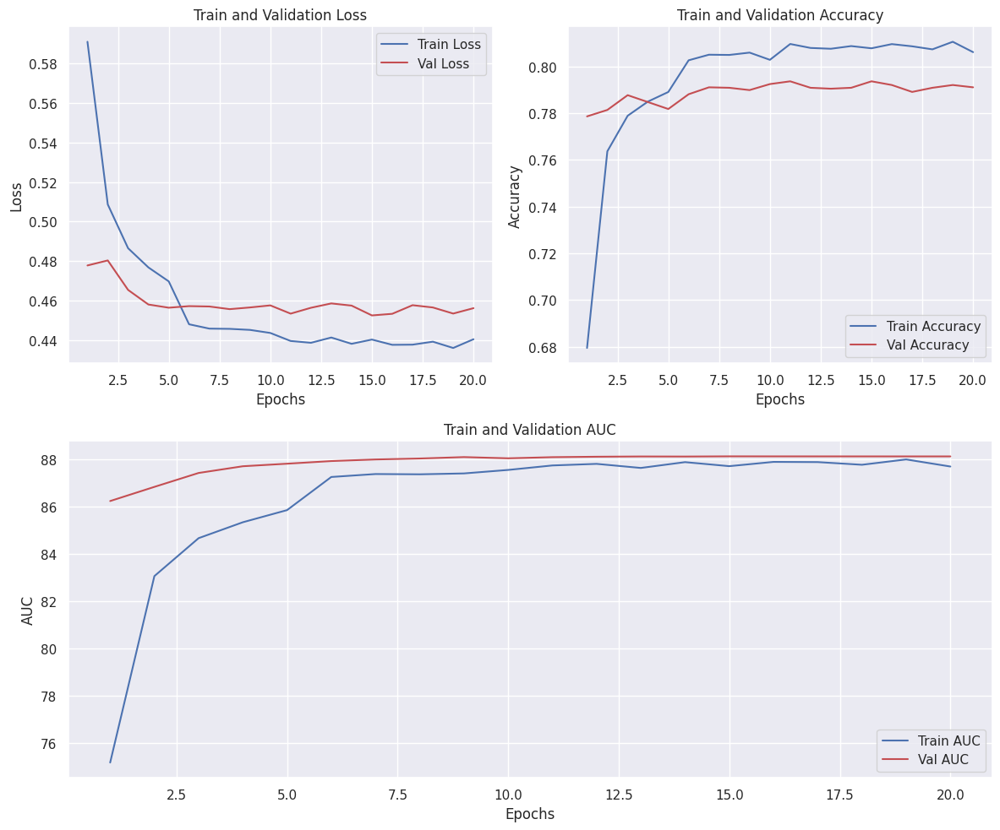

In [9]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [10]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "Y",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "X",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:01<09:19,  1.79s/batch]

Epoch   1/20:   1%|          | 2/313 [00:03<09:13,  1.78s/batch]

Epoch   1/20:   1%|          | 3/313 [00:05<09:10,  1.78s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:07<09:07,  1.77s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:08<09:04,  1.77s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:10<09:03,  1.77s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:12<09:02,  1.77s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:14<09:01,  1.77s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:15<08:59,  1.78s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:17<08:57,  1.77s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:21<08:54,  1.77s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:23<08:52,  1.78s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:24<08:51,  1.78s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:26<08:49,  1.78s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:28<08:47,  1.78s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:30<08:45,  1.77s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:32<09:12,  1.87s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:34<09:01,  1.84s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:35<08:53,  1.82s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:37<08:47,  1.81s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:39<08:42,  1.79s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:41<08:38,  1.79s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:42<08:38,  1.80s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:44<08:34,  1.79s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:46<08:31,  1.78s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:48<08:28,  1.78s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:50<08:26,  1.78s/batch]

Epoch   1/20:   9%|▉         | 29/313 [00:51<08:23,  1.77s/batch]

Epoch   1/20:  10%|▉         | 30/313 [00:53<08:21,  1.77s/batch]

Epoch   1/20:  10%|▉         | 31/313 [00:55<08:19,  1.77s/batch]

Epoch   1/20:  10%|█         | 32/313 [00:57<08:18,  1.77s/batch]

Epoch   1/20:  11%|█         | 33/313 [00:58<08:16,  1.77s/batch]

Epoch   1/20:  11%|█         | 34/313 [01:00<08:14,  1.77s/batch]

Epoch   1/20:  11%|█         | 35/313 [01:02<08:31,  1.84s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [01:04<08:24,  1.82s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [01:06<08:18,  1.81s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [01:07<08:14,  1.80s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [01:09<08:10,  1.79s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [01:11<08:07,  1.79s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [01:13<08:33,  1.89s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [01:15<08:22,  1.85s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [01:17<08:14,  1.83s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [01:18<08:07,  1.81s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [01:20<08:02,  1.80s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [01:22<07:58,  1.79s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [01:24<07:55,  1.79s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [01:26<07:52,  1.78s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [01:27<07:49,  1.78s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [01:29<07:47,  1.78s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [01:31<07:46,  1.78s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:33<07:58,  1.83s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:35<07:51,  1.81s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:36<07:46,  1.80s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:38<07:41,  1.79s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:40<07:37,  1.78s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [01:42<07:34,  1.78s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [01:43<07:32,  1.77s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [01:45<07:30,  1.77s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [01:47<07:27,  1.77s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [01:49<07:25,  1.77s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [01:51<07:23,  1.77s/batch]

Epoch   1/20:  20%|██        | 63/313 [01:52<07:21,  1.77s/batch]

Epoch   1/20:  20%|██        | 64/313 [01:54<07:20,  1.77s/batch]

Epoch   1/20:  21%|██        | 65/313 [01:56<07:19,  1.77s/batch]

Epoch   1/20:  21%|██        | 66/313 [01:58<07:17,  1.77s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [01:59<07:15,  1.77s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [02:01<07:13,  1.77s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [02:03<07:46,  1.91s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [02:06<08:08,  2.01s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [02:08<08:23,  2.08s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [02:10<08:32,  2.13s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [02:12<08:17,  2.07s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [02:14<07:53,  1.98s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [02:16<07:36,  1.92s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [02:17<07:33,  1.92s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [02:19<07:21,  1.87s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [02:21<07:12,  1.84s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [02:23<07:05,  1.82s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [02:25<07:00,  1.81s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [02:26<06:56,  1.79s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [02:28<06:52,  1.79s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [02:30<06:49,  1.78s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [02:32<06:46,  1.78s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [02:34<07:16,  1.91s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [02:36<07:28,  1.98s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [02:38<07:17,  1.94s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [02:40<07:04,  1.88s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [02:41<06:54,  1.85s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [02:43<06:47,  1.83s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [02:45<06:41,  1.81s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [02:47<06:40,  1.81s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [02:48<06:34,  1.79s/batch]

Epoch   1/20:  30%|███       | 94/313 [02:50<06:30,  1.78s/batch]

Epoch   1/20:  30%|███       | 95/313 [02:52<06:27,  1.78s/batch]

Epoch   1/20:  31%|███       | 96/313 [02:54<06:24,  1.77s/batch]

Epoch   1/20:  31%|███       | 97/313 [02:56<06:21,  1.76s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [02:57<06:18,  1.76s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [02:59<06:16,  1.76s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [03:01<06:19,  1.78s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [03:03<06:16,  1.77s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [03:05<06:42,  1.91s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [03:07<07:01,  2.01s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [03:09<06:52,  1.97s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [03:11<06:37,  1.91s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [03:12<06:26,  1.87s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [03:15<06:46,  1.98s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [03:17<07:00,  2.05s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [03:19<06:54,  2.03s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [03:21<07:09,  2.12s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [03:23<06:46,  2.01s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [03:25<06:45,  2.02s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [03:27<06:31,  1.96s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [03:29<06:17,  1.90s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [03:30<06:06,  1.85s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [03:32<05:59,  1.82s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [03:34<05:54,  1.81s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [03:36<06:00,  1.85s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [03:38<05:53,  1.82s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [03:39<05:47,  1.80s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [03:41<05:43,  1.79s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [03:43<05:39,  1.78s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [03:45<05:36,  1.77s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [03:46<05:33,  1.77s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [03:48<05:31,  1.76s/batch]

Epoch   1/20:  40%|████      | 126/313 [03:50<05:29,  1.76s/batch]

Epoch   1/20:  41%|████      | 127/313 [03:52<05:27,  1.76s/batch]

Epoch   1/20:  41%|████      | 128/313 [03:53<05:25,  1.76s/batch]

Epoch   1/20:  41%|████      | 129/313 [03:55<05:23,  1.76s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [03:57<05:23,  1.77s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [03:59<05:21,  1.77s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [04:00<05:19,  1.76s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [04:02<05:16,  1.76s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [04:04<05:15,  1.76s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [04:06<05:12,  1.76s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [04:08<05:21,  1.82s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [04:09<05:16,  1.80s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [04:11<05:12,  1.79s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [04:13<05:09,  1.78s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [04:15<05:06,  1.77s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [04:16<05:05,  1.77s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [04:18<05:02,  1.77s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [04:20<05:01,  1.77s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [04:22<05:22,  1.91s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [04:24<05:19,  1.90s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [04:26<05:11,  1.87s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [04:28<05:04,  1.84s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [04:29<04:59,  1.82s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [04:31<05:07,  1.88s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [04:33<05:00,  1.84s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [04:35<04:54,  1.82s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [04:37<04:50,  1.80s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [04:39<05:01,  1.88s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [04:41<04:54,  1.85s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [04:42<04:48,  1.83s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [04:44<04:44,  1.81s/batch]

Epoch   1/20:  50%|█████     | 157/313 [04:46<04:40,  1.80s/batch]

Epoch   1/20:  50%|█████     | 158/313 [04:48<04:37,  1.79s/batch]

Epoch   1/20:  51%|█████     | 159/313 [04:50<04:56,  1.92s/batch]

Epoch   1/20:  51%|█████     | 160/313 [04:52<05:08,  2.02s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [04:54<05:07,  2.02s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [04:56<04:53,  1.94s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [04:58<04:43,  1.89s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [04:59<04:36,  1.86s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [05:01<04:30,  1.83s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [05:03<04:26,  1.82s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [05:05<04:22,  1.80s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [05:07<04:19,  1.79s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [05:08<04:19,  1.80s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [05:10<04:29,  1.88s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [05:12<04:22,  1.85s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [05:14<04:17,  1.82s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [05:16<04:13,  1.81s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [05:18<04:09,  1.80s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [05:19<04:06,  1.79s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [05:21<04:03,  1.78s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [05:23<04:01,  1.78s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [05:25<04:00,  1.78s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [05:27<04:06,  1.84s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [05:28<04:01,  1.82s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [05:30<03:58,  1.81s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [05:32<03:55,  1.80s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [05:34<04:04,  1.88s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [05:36<04:04,  1.90s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [05:38<03:57,  1.86s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [05:40<03:52,  1.83s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [05:41<03:55,  1.87s/batch]

Epoch   1/20:  60%|██████    | 188/313 [05:43<03:49,  1.84s/batch]

Epoch   1/20:  60%|██████    | 189/313 [05:45<03:45,  1.81s/batch]

Epoch   1/20:  61%|██████    | 190/313 [05:47<03:41,  1.80s/batch]

Epoch   1/20:  61%|██████    | 191/313 [05:49<03:37,  1.79s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [05:50<03:34,  1.78s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [05:52<03:32,  1.77s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [05:54<03:30,  1.77s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [05:56<03:28,  1.77s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [05:57<03:26,  1.76s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [05:59<03:24,  1.76s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [06:01<03:22,  1.76s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [06:03<03:20,  1.76s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [06:04<03:18,  1.76s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [06:06<03:16,  1.76s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [06:08<03:15,  1.76s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [06:10<03:13,  1.76s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [06:11<03:11,  1.76s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [06:13<03:20,  1.86s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [06:15<03:15,  1.83s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [06:17<03:11,  1.81s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [06:19<03:08,  1.79s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [06:21<03:09,  1.82s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [06:22<03:06,  1.81s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [06:24<03:03,  1.80s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [06:26<03:00,  1.79s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [06:28<03:12,  1.92s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [06:30<03:19,  2.02s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [06:32<03:19,  2.04s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [06:35<03:21,  2.08s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [06:36<03:10,  1.99s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [06:38<03:03,  1.93s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [06:40<02:57,  1.89s/batch]

Epoch   1/20:  70%|███████   | 220/313 [06:42<02:52,  1.86s/batch]

Epoch   1/20:  71%|███████   | 221/313 [06:44<02:55,  1.91s/batch]

Epoch   1/20:  71%|███████   | 222/313 [06:46<03:02,  2.01s/batch]

Epoch   1/20:  71%|███████   | 223/313 [06:48<03:00,  2.01s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [06:50<02:52,  1.94s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [06:52<02:46,  1.89s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [06:53<02:40,  1.85s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [06:55<02:36,  1.83s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [06:57<02:33,  1.81s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [06:59<02:30,  1.80s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [07:00<02:28,  1.79s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [07:02<02:26,  1.78s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [07:04<02:24,  1.79s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [07:06<02:22,  1.78s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [07:08<02:20,  1.78s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [07:09<02:18,  1.77s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [07:11<02:16,  1.77s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [07:13<02:14,  1.77s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [07:15<02:22,  1.90s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [07:17<02:17,  1.85s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [07:19<02:13,  1.82s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [07:20<02:09,  1.81s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [07:22<02:07,  1.79s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [07:24<02:04,  1.78s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [07:26<02:02,  1.78s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [07:28<02:04,  1.83s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [07:29<02:01,  1.81s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [07:31<02:04,  1.89s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [07:33<02:00,  1.85s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [07:35<01:56,  1.83s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [07:37<01:53,  1.81s/batch]

Epoch   1/20:  80%|████████  | 251/313 [07:39<01:57,  1.89s/batch]

Epoch   1/20:  81%|████████  | 252/313 [07:41<01:53,  1.85s/batch]

Epoch   1/20:  81%|████████  | 253/313 [07:42<01:49,  1.82s/batch]

Epoch   1/20:  81%|████████  | 254/313 [07:44<01:46,  1.80s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [07:46<01:47,  1.85s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [07:48<01:44,  1.83s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [07:50<01:41,  1.81s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [07:51<01:38,  1.80s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [07:53<01:36,  1.79s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [07:55<01:34,  1.78s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [07:57<01:32,  1.77s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [07:58<01:30,  1.77s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [08:00<01:28,  1.76s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [08:02<01:26,  1.76s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [08:04<01:24,  1.76s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [08:05<01:22,  1.76s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [08:07<01:20,  1.76s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [08:09<01:19,  1.76s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [08:11<01:17,  1.76s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [08:12<01:15,  1.76s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [08:14<01:13,  1.76s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [08:16<01:12,  1.76s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [08:18<01:11,  1.78s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [08:20<01:09,  1.78s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [08:21<01:07,  1.77s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [08:23<01:05,  1.77s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [08:25<01:03,  1.76s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [08:27<01:01,  1.76s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [08:28<00:59,  1.76s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [08:30<00:58,  1.76s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [08:32<00:56,  1.76s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [08:34<00:54,  1.76s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [08:36<00:54,  1.81s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [08:37<00:52,  1.79s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [08:39<00:51,  1.82s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [08:41<00:51,  1.92s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [08:44<00:51,  1.99s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [08:45<00:48,  1.93s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [08:47<00:45,  1.88s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [08:49<00:43,  1.90s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [08:51<00:40,  1.86s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [08:53<00:38,  1.83s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [08:54<00:36,  1.81s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [08:56<00:34,  1.80s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [08:58<00:32,  1.79s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [09:00<00:30,  1.78s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [09:01<00:28,  1.78s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [09:03<00:26,  1.77s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [09:05<00:24,  1.77s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [09:07<00:22,  1.77s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [09:08<00:21,  1.77s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [09:10<00:19,  1.77s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [09:12<00:17,  1.77s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [09:14<00:15,  1.77s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [09:15<00:14,  1.77s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [09:17<00:12,  1.76s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [09:19<00:10,  1.76s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [09:21<00:09,  1.86s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [09:23<00:07,  1.83s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [09:25<00:05,  1.81s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [09:26<00:03,  1.79s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [09:28<00:01,  1.78s/batch]

Epoch   1/20: 100%|██████████| 313/313 [09:29<00:00,  1.53s/batch]

Epoch   1/20: 100%|██████████| 313/313 [09:29<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [09:59<00:00,  1.53s/batch, Epoch = 9m 59s, Loss = 0.5854|0.4796, Acc = 0.686|0.778, AUC = 75.743|85.726]

Epoch   1/20: 100%|██████████| 313/313 [09:59<00:00,  1.91s/batch, Epoch = 9m 59s, Loss = 0.5854|0.4796, Acc = 0.686|0.778, AUC = 75.743|85.726]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:01<09:03,  1.74s/batch]

Epoch   2/20:   1%|          | 2/313 [00:03<09:04,  1.75s/batch]

Epoch   2/20:   1%|          | 3/313 [00:05<09:04,  1.75s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:07<09:03,  1.76s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:08<09:01,  1.76s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:10<09:00,  1.76s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:12<08:59,  1.76s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:14<08:57,  1.76s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:15<08:56,  1.77s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:17<09:28,  1.88s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:19<09:16,  1.84s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:21<09:07,  1.82s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:23<09:01,  1.80s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:25<08:55,  1.79s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:26<08:51,  1.78s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:28<08:48,  1.78s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:30<08:45,  1.78s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:32<09:10,  1.87s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:34<09:00,  1.84s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:35<08:52,  1.82s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:37<08:45,  1.80s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:39<09:12,  1.90s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:41<08:59,  1.86s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:43<08:49,  1.83s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:45<08:43,  1.82s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:46<08:36,  1.80s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:48<08:32,  1.79s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:50<08:28,  1.78s/batch]

Epoch   2/20:   9%|▉         | 29/313 [00:52<08:26,  1.78s/batch]

Epoch   2/20:  10%|▉         | 30/313 [00:54<08:23,  1.78s/batch]

Epoch   2/20:  10%|▉         | 31/313 [00:55<08:20,  1.78s/batch]

Epoch   2/20:  10%|█         | 32/313 [00:57<08:19,  1.78s/batch]

Epoch   2/20:  11%|█         | 33/313 [00:59<08:17,  1.78s/batch]

Epoch   2/20:  11%|█         | 34/313 [01:01<08:20,  1.79s/batch]

Epoch   2/20:  11%|█         | 35/313 [01:03<08:32,  1.85s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [01:05<08:56,  1.94s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [01:07<08:40,  1.89s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [01:08<08:32,  1.86s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [01:10<08:22,  1.83s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [01:12<08:53,  1.96s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [01:15<09:15,  2.04s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [01:17<09:24,  2.08s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [01:19<08:59,  2.00s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [01:20<08:38,  1.93s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [01:23<09:01,  2.02s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [01:25<09:05,  2.04s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [01:27<08:55,  2.01s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [01:28<08:34,  1.94s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [01:30<08:20,  1.90s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [01:32<08:09,  1.86s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [01:34<08:18,  1.90s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:36<08:05,  1.86s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:38<07:56,  1.83s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:39<07:48,  1.81s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:41<07:53,  1.83s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:43<07:46,  1.82s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [01:45<07:40,  1.80s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [01:46<07:35,  1.79s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [01:48<07:43,  1.82s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [01:50<07:37,  1.81s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [01:52<07:33,  1.80s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [01:54<07:47,  1.86s/batch]

Epoch   2/20:  20%|██        | 63/313 [01:56<07:38,  1.84s/batch]

Epoch   2/20:  20%|██        | 64/313 [01:58<08:06,  1.95s/batch]

Epoch   2/20:  21%|██        | 65/313 [02:00<08:20,  2.02s/batch]

Epoch   2/20:  21%|██        | 66/313 [02:02<08:00,  1.95s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [02:04<07:45,  1.89s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [02:06<08:08,  2.00s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [02:08<07:53,  1.94s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [02:09<07:39,  1.89s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [02:11<07:30,  1.86s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [02:13<07:23,  1.84s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [02:15<07:17,  1.82s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [02:17<07:11,  1.81s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [02:18<07:08,  1.80s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [02:20<07:06,  1.80s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [02:22<07:34,  1.93s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [02:24<07:30,  1.92s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [02:26<07:16,  1.87s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [02:28<07:39,  1.97s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [02:30<07:55,  2.05s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [02:32<07:34,  1.97s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [02:34<07:17,  1.90s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [02:36<07:37,  2.00s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [02:38<07:22,  1.94s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [02:40<07:08,  1.89s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [02:42<06:57,  1.85s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [02:43<06:49,  1.82s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [02:45<06:42,  1.80s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [02:47<06:38,  1.79s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [02:49<06:34,  1.78s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [02:50<06:30,  1.77s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [02:52<06:28,  1.77s/batch]

Epoch   2/20:  30%|███       | 94/313 [02:54<06:26,  1.76s/batch]

Epoch   2/20:  30%|███       | 95/313 [02:56<06:23,  1.76s/batch]

Epoch   2/20:  31%|███       | 96/313 [02:57<06:21,  1.76s/batch]

Epoch   2/20:  31%|███       | 97/313 [02:59<06:19,  1.76s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [03:01<06:17,  1.76s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [03:03<06:15,  1.76s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [03:04<06:14,  1.76s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [03:06<06:26,  1.82s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [03:08<06:20,  1.80s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [03:10<06:15,  1.79s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [03:12<06:11,  1.78s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [03:13<06:08,  1.77s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [03:15<06:05,  1.77s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [03:17<06:03,  1.77s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [03:19<06:05,  1.78s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [03:20<06:01,  1.77s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [03:23<06:28,  1.91s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [03:25<06:24,  1.90s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [03:26<06:13,  1.86s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [03:28<06:05,  1.83s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [03:30<05:59,  1.80s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [03:32<05:54,  1.79s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [03:33<05:50,  1.78s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [03:35<05:47,  1.77s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [03:37<05:52,  1.81s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [03:39<05:47,  1.79s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [03:41<05:43,  1.78s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [03:42<05:40,  1.77s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [03:44<05:37,  1.77s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [03:46<05:34,  1.76s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [03:48<05:32,  1.76s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [03:49<05:30,  1.76s/batch]

Epoch   2/20:  40%|████      | 126/313 [03:51<05:28,  1.76s/batch]

Epoch   2/20:  41%|████      | 127/313 [03:53<05:26,  1.76s/batch]

Epoch   2/20:  41%|████      | 128/313 [03:55<05:24,  1.76s/batch]

Epoch   2/20:  41%|████      | 129/313 [03:56<05:22,  1.75s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [03:58<05:21,  1.75s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [04:00<05:19,  1.75s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [04:02<05:17,  1.75s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [04:03<05:15,  1.75s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [04:05<05:14,  1.76s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [04:07<05:12,  1.75s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [04:09<05:21,  1.81s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [04:11<05:16,  1.80s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [04:12<05:12,  1.78s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [04:14<05:08,  1.77s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [04:16<05:05,  1.77s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [04:18<05:27,  1.91s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [04:20<05:19,  1.87s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [04:22<05:11,  1.83s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [04:24<05:29,  1.95s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [04:26<05:39,  2.02s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [04:28<05:24,  1.94s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [04:29<05:12,  1.88s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [04:31<05:04,  1.84s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [04:33<04:57,  1.82s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [04:35<04:53,  1.80s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [04:37<05:06,  1.89s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [04:39<04:58,  1.85s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [04:41<05:01,  1.88s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [04:42<04:53,  1.85s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [04:44<04:47,  1.82s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [04:46<04:42,  1.80s/batch]

Epoch   2/20:  50%|█████     | 157/313 [04:48<04:38,  1.79s/batch]

Epoch   2/20:  50%|█████     | 158/313 [04:49<04:35,  1.78s/batch]

Epoch   2/20:  51%|█████     | 159/313 [04:51<04:32,  1.77s/batch]

Epoch   2/20:  51%|█████     | 160/313 [04:53<04:30,  1.76s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [04:55<04:27,  1.76s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [04:56<04:25,  1.76s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [04:58<04:23,  1.76s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [05:00<04:21,  1.76s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [05:02<04:19,  1.75s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [05:03<04:17,  1.75s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [05:05<04:15,  1.75s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [05:07<04:14,  1.75s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [05:09<04:12,  1.75s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [05:10<04:10,  1.75s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [05:12<04:24,  1.86s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [05:14<04:18,  1.84s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [05:16<04:14,  1.82s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [05:18<04:11,  1.81s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [05:20<04:08,  1.80s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [05:22<04:15,  1.86s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [05:23<04:09,  1.84s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [05:25<04:04,  1.81s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [05:27<04:01,  1.80s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [05:29<03:57,  1.79s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [05:30<03:55,  1.78s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [05:32<03:52,  1.78s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [05:34<03:50,  1.77s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [05:36<04:02,  1.88s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [05:38<03:56,  1.84s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [05:40<03:51,  1.82s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [05:41<03:47,  1.81s/batch]

Epoch   2/20:  60%|██████    | 188/313 [05:44<03:59,  1.92s/batch]

Epoch   2/20:  60%|██████    | 189/313 [05:45<03:51,  1.87s/batch]

Epoch   2/20:  61%|██████    | 190/313 [05:47<03:45,  1.84s/batch]

Epoch   2/20:  61%|██████    | 191/313 [05:49<03:41,  1.81s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [05:51<03:37,  1.80s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [05:52<03:34,  1.79s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [05:54<03:31,  1.78s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [05:56<03:28,  1.77s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [05:58<03:26,  1.77s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [05:59<03:24,  1.76s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [06:01<03:22,  1.76s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [06:03<03:20,  1.76s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [06:05<03:18,  1.76s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [06:06<03:17,  1.76s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [06:08<03:15,  1.76s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [06:10<03:13,  1.76s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [06:12<03:11,  1.76s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [06:14<03:16,  1.82s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [06:15<03:13,  1.80s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [06:17<03:10,  1.79s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [06:19<03:07,  1.78s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [06:21<03:04,  1.78s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [06:22<03:02,  1.77s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [06:24<03:00,  1.77s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [06:26<02:58,  1.76s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [06:28<02:56,  1.76s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [06:30<02:54,  1.76s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [06:31<02:52,  1.76s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [06:33<02:50,  1.76s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [06:35<02:49,  1.76s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [06:37<02:47,  1.76s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [06:38<02:45,  1.76s/batch]

Epoch   2/20:  70%|███████   | 220/313 [06:40<02:43,  1.76s/batch]

Epoch   2/20:  71%|███████   | 221/313 [06:42<02:41,  1.76s/batch]

Epoch   2/20:  71%|███████   | 222/313 [06:44<02:40,  1.76s/batch]

Epoch   2/20:  71%|███████   | 223/313 [06:46<02:43,  1.82s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [06:47<02:44,  1.85s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [06:50<02:52,  1.97s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [06:52<03:05,  2.13s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [06:54<02:56,  2.06s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [06:56<02:59,  2.11s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [06:59<03:00,  2.14s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [07:01<03:00,  2.17s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [07:03<02:51,  2.09s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [07:04<02:40,  1.99s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [07:06<02:33,  1.92s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [07:08<02:27,  1.87s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [07:10<02:22,  1.83s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [07:11<02:19,  1.81s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [07:13<02:16,  1.79s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [07:15<02:13,  1.78s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [07:17<02:16,  1.85s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [07:19<02:16,  1.87s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [07:21<02:12,  1.84s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [07:22<02:09,  1.82s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [07:24<02:06,  1.80s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [07:26<02:03,  1.79s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [07:28<02:01,  1.78s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [07:29<01:59,  1.78s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [07:31<01:57,  1.78s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [07:33<02:04,  1.91s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [07:35<02:00,  1.88s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [07:37<01:56,  1.85s/batch]

Epoch   2/20:  80%|████████  | 251/313 [07:39<01:53,  1.82s/batch]

Epoch   2/20:  81%|████████  | 252/313 [07:41<01:50,  1.81s/batch]

Epoch   2/20:  81%|████████  | 253/313 [07:42<01:47,  1.80s/batch]

Epoch   2/20:  81%|████████  | 254/313 [07:44<01:45,  1.79s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [07:46<01:43,  1.78s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [07:48<01:46,  1.86s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [07:50<01:45,  1.88s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [07:52<01:41,  1.84s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [07:53<01:38,  1.82s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [07:55<01:35,  1.80s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [07:57<01:32,  1.79s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [07:59<01:30,  1.78s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [08:00<01:28,  1.77s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [08:02<01:26,  1.77s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [08:04<01:24,  1.77s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [08:06<01:22,  1.76s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [08:07<01:21,  1.76s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [08:09<01:19,  1.76s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [08:11<01:17,  1.76s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [08:13<01:15,  1.76s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [08:14<01:13,  1.76s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [08:16<01:12,  1.76s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [08:18<01:10,  1.77s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [08:20<01:09,  1.77s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [08:22<01:07,  1.77s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [08:23<01:05,  1.77s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [08:25<01:03,  1.76s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [08:27<01:01,  1.76s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [08:29<00:59,  1.76s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [08:30<00:58,  1.76s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [08:32<00:59,  1.86s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [08:34<00:56,  1.83s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [08:36<00:54,  1.81s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [08:38<00:51,  1.79s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [08:39<00:49,  1.78s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [08:41<00:47,  1.78s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [08:43<00:46,  1.77s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [08:45<00:44,  1.77s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [08:47<00:42,  1.77s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [08:49<00:42,  1.84s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [08:50<00:39,  1.81s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [08:52<00:37,  1.80s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [08:54<00:37,  1.88s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [08:56<00:35,  1.85s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [08:58<00:32,  1.82s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [08:59<00:30,  1.80s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [09:01<00:28,  1.79s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [09:03<00:26,  1.78s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [09:05<00:24,  1.77s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [09:06<00:23,  1.77s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [09:08<00:21,  1.77s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [09:10<00:19,  1.77s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [09:12<00:17,  1.77s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [09:14<00:15,  1.77s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [09:15<00:14,  1.77s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [09:17<00:12,  1.76s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [09:19<00:11,  1.90s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [09:21<00:09,  1.87s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [09:23<00:07,  1.83s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [09:25<00:05,  1.81s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [09:26<00:03,  1.80s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [09:28<00:01,  1.79s/batch]

Epoch   2/20: 100%|██████████| 313/313 [09:29<00:00,  1.53s/batch]

Epoch   2/20: 100%|██████████| 313/313 [09:29<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [09:58<00:00,  1.53s/batch, Epoch = 9m 58s, Loss = 0.5073|0.4693, Acc = 0.764|0.786, AUC = 83.063|86.706]

Epoch   2/20: 100%|██████████| 313/313 [09:58<00:00,  1.91s/batch, Epoch = 9m 58s, Loss = 0.5073|0.4693, Acc = 0.764|0.786, AUC = 83.063|86.706]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:02<11:06,  2.14s/batch]

Epoch   3/20:   1%|          | 2/313 [00:03<09:55,  1.91s/batch]

Epoch   3/20:   1%|          | 3/313 [00:05<09:31,  1.84s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:07<09:29,  1.84s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:09<09:17,  1.81s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:11<09:09,  1.79s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:13<09:30,  1.86s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:14<09:17,  1.83s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:16<09:09,  1.81s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:18<09:02,  1.79s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:20<08:57,  1.78s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:21<08:53,  1.77s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:23<08:49,  1.77s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:25<08:46,  1.76s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:27<08:44,  1.76s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:28<08:42,  1.76s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:30<08:39,  1.76s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:32<09:19,  1.90s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:35<09:46,  1.99s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:36<09:31,  1.95s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:38<09:12,  1.89s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:40<09:00,  1.86s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:42<09:30,  1.97s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:44<09:14,  1.92s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:46<08:59,  1.87s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:47<08:48,  1.84s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:49<08:40,  1.82s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:51<08:39,  1.82s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:53<08:32,  1.80s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:55<08:27,  1.79s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:56<08:23,  1.78s/batch]

Epoch   3/20:  10%|█         | 32/313 [00:58<08:20,  1.78s/batch]

Epoch   3/20:  11%|█         | 33/313 [01:00<08:17,  1.78s/batch]

Epoch   3/20:  11%|█         | 34/313 [01:02<08:14,  1.77s/batch]

Epoch   3/20:  11%|█         | 35/313 [01:04<08:51,  1.91s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [01:06<08:36,  1.86s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [01:07<08:25,  1.83s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [01:09<08:17,  1.81s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [01:11<08:10,  1.79s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [01:13<08:06,  1.78s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [01:14<08:02,  1.77s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [01:16<07:59,  1.77s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [01:18<07:57,  1.77s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [01:20<07:54,  1.76s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [01:21<07:52,  1.76s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [01:23<07:49,  1.76s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [01:25<08:24,  1.90s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [01:28<08:48,  2.00s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [01:30<08:43,  1.98s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [01:31<08:24,  1.92s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:33<08:09,  1.87s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:35<08:17,  1.90s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:37<08:23,  1.94s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:39<08:07,  1.88s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:41<08:15,  1.92s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:43<08:00,  1.87s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:45<08:00,  1.88s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:46<07:49,  1.84s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:48<07:40,  1.81s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [01:50<07:34,  1.80s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:52<07:31,  1.79s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:53<07:28,  1.79s/batch]

Epoch   3/20:  20%|██        | 63/313 [01:55<07:24,  1.78s/batch]

Epoch   3/20:  20%|██        | 64/313 [01:57<07:21,  1.77s/batch]

Epoch   3/20:  21%|██        | 65/313 [01:59<07:28,  1.81s/batch]

Epoch   3/20:  21%|██        | 66/313 [02:00<07:23,  1.79s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [02:02<07:18,  1.78s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [02:04<07:15,  1.78s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [02:06<07:44,  1.90s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [02:08<07:31,  1.86s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [02:10<07:22,  1.83s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [02:11<07:15,  1.81s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [02:13<07:10,  1.79s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [02:15<07:06,  1.78s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [02:17<07:02,  1.78s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [02:19<06:59,  1.77s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [02:20<06:57,  1.77s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [02:22<06:54,  1.76s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [02:24<06:55,  1.77s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [02:26<06:51,  1.77s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [02:27<06:49,  1.76s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [02:29<06:46,  1.76s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [02:31<06:44,  1.76s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [02:33<06:42,  1.76s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [02:34<06:40,  1.76s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [02:36<06:54,  1.83s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [02:38<06:54,  1.83s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [02:40<06:47,  1.81s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [02:42<06:41,  1.79s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [02:43<06:37,  1.78s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [02:45<06:33,  1.77s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [02:47<06:30,  1.77s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [02:49<06:29,  1.77s/batch]

Epoch   3/20:  30%|███       | 94/313 [02:51<06:27,  1.77s/batch]

Epoch   3/20:  30%|███       | 95/313 [02:52<06:25,  1.77s/batch]

Epoch   3/20:  31%|███       | 96/313 [02:54<06:23,  1.77s/batch]

Epoch   3/20:  31%|███       | 97/313 [02:56<06:22,  1.77s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [02:58<06:20,  1.77s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [03:00<06:47,  1.90s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [03:02<06:36,  1.86s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [03:03<06:28,  1.83s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [03:05<06:22,  1.81s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [03:07<06:31,  1.87s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [03:09<06:26,  1.85s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [03:11<06:19,  1.83s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [03:12<06:14,  1.81s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [03:14<06:09,  1.79s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [03:16<06:06,  1.79s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [03:18<06:03,  1.78s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [03:20<06:00,  1.78s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [03:21<05:58,  1.77s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [03:23<05:56,  1.77s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [03:25<05:54,  1.77s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [03:27<05:52,  1.77s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [03:28<05:50,  1.77s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [03:30<05:48,  1.77s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [03:32<05:46,  1.77s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [03:34<05:45,  1.77s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [03:35<05:43,  1.77s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [03:37<05:55,  1.84s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [03:39<05:49,  1.82s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [03:41<06:06,  1.92s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [03:43<05:55,  1.87s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [03:45<05:48,  1.84s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [03:47<05:42,  1.82s/batch]

Epoch   3/20:  40%|████      | 126/313 [03:48<05:37,  1.80s/batch]

Epoch   3/20:  41%|████      | 127/313 [03:50<05:33,  1.79s/batch]

Epoch   3/20:  41%|████      | 128/313 [03:52<05:30,  1.79s/batch]

Epoch   3/20:  41%|████      | 129/313 [03:54<05:28,  1.79s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [03:56<05:26,  1.78s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [03:57<05:23,  1.78s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [03:59<05:36,  1.86s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [04:01<05:29,  1.83s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [04:03<05:24,  1.81s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [04:05<05:20,  1.80s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [04:06<05:16,  1.79s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [04:09<05:39,  1.93s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [04:11<05:33,  1.91s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [04:12<05:25,  1.87s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [04:14<05:18,  1.84s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [04:16<05:12,  1.82s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [04:18<05:08,  1.81s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [04:19<05:05,  1.80s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [04:21<05:02,  1.79s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [04:23<04:59,  1.78s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [04:25<04:56,  1.78s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [04:26<04:54,  1.77s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [04:28<04:52,  1.77s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [04:30<04:50,  1.77s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [04:32<04:48,  1.77s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [04:34<04:46,  1.77s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [04:35<04:45,  1.77s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [04:37<04:44,  1.78s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [04:39<04:45,  1.80s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [04:41<04:42,  1.79s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [04:43<04:40,  1.79s/batch]

Epoch   3/20:  50%|█████     | 157/313 [04:44<04:37,  1.78s/batch]

Epoch   3/20:  50%|█████     | 158/313 [04:46<04:35,  1.78s/batch]

Epoch   3/20:  51%|█████     | 159/313 [04:48<04:33,  1.78s/batch]

Epoch   3/20:  51%|█████     | 160/313 [04:50<04:31,  1.78s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [04:51<04:29,  1.78s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [04:53<04:30,  1.79s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [04:55<04:28,  1.79s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [04:57<04:25,  1.78s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [04:59<04:23,  1.78s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [05:00<04:20,  1.78s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [05:02<04:18,  1.77s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [05:04<04:22,  1.81s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [05:06<04:38,  1.93s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [05:08<04:30,  1.89s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [05:10<04:39,  1.97s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [05:12<04:29,  1.91s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [05:14<04:21,  1.87s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [05:15<04:15,  1.84s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [05:17<04:11,  1.82s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [05:19<04:07,  1.81s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [05:21<04:04,  1.80s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [05:23<04:01,  1.79s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [05:24<03:59,  1.79s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [05:26<03:56,  1.78s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [05:28<03:54,  1.78s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [05:30<03:52,  1.78s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [05:32<03:55,  1.81s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [05:33<03:52,  1.80s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [05:35<03:49,  1.79s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [05:37<03:46,  1.79s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [05:39<03:44,  1.78s/batch]

Epoch   3/20:  60%|██████    | 188/313 [05:41<03:59,  1.92s/batch]

Epoch   3/20:  60%|██████    | 189/313 [05:43<03:53,  1.88s/batch]

Epoch   3/20:  61%|██████    | 190/313 [05:44<03:47,  1.85s/batch]

Epoch   3/20:  61%|██████    | 191/313 [05:46<03:42,  1.83s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [05:48<03:39,  1.81s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [05:50<03:36,  1.80s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [05:52<03:33,  1.79s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [05:54<03:42,  1.89s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [05:55<03:36,  1.85s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [05:57<03:32,  1.83s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [05:59<03:28,  1.81s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [06:01<03:25,  1.80s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [06:02<03:22,  1.79s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [06:04<03:20,  1.79s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [06:06<03:18,  1.78s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [06:08<03:15,  1.78s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [06:10<03:13,  1.78s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [06:12<03:26,  1.91s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [06:14<03:23,  1.91s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [06:15<03:17,  1.86s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [06:17<03:12,  1.83s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [06:19<03:08,  1.81s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [06:21<03:05,  1.80s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [06:23<03:02,  1.79s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [06:24<03:00,  1.78s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [06:26<02:58,  1.78s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [06:28<02:55,  1.78s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [06:30<02:53,  1.77s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [06:31<02:51,  1.77s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [06:33<02:49,  1.77s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [06:35<02:48,  1.77s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [06:37<02:46,  1.77s/batch]

Epoch   3/20:  70%|███████   | 220/313 [06:38<02:44,  1.77s/batch]

Epoch   3/20:  71%|███████   | 221/313 [06:40<02:42,  1.77s/batch]

Epoch   3/20:  71%|███████   | 222/313 [06:42<02:53,  1.91s/batch]

Epoch   3/20:  71%|███████   | 223/313 [06:44<02:52,  1.92s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [06:46<02:46,  1.87s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [06:48<02:42,  1.84s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [06:50<02:38,  1.82s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [06:51<02:35,  1.81s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [06:53<02:32,  1.79s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [06:55<02:30,  1.79s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [06:57<02:27,  1.78s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [06:59<02:25,  1.78s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [07:00<02:23,  1.77s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [07:02<02:21,  1.77s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [07:04<02:20,  1.77s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [07:06<02:18,  1.77s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [07:07<02:16,  1.77s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [07:09<02:14,  1.77s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [07:11<02:12,  1.77s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [07:13<02:21,  1.92s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [07:15<02:17,  1.88s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [07:17<02:13,  1.85s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [07:19<02:09,  1.83s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [07:20<02:06,  1.81s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [07:22<02:04,  1.80s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [07:24<02:06,  1.86s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [07:26<02:03,  1.84s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [07:28<02:09,  1.96s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [07:30<02:03,  1.90s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [07:32<01:59,  1.86s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [07:33<01:55,  1.84s/batch]

Epoch   3/20:  80%|████████  | 251/313 [07:35<01:54,  1.85s/batch]

Epoch   3/20:  81%|████████  | 252/313 [07:37<01:51,  1.82s/batch]

Epoch   3/20:  81%|████████  | 253/313 [07:39<01:48,  1.80s/batch]

Epoch   3/20:  81%|████████  | 254/313 [07:41<01:45,  1.79s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [07:42<01:43,  1.78s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [07:44<01:45,  1.85s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [07:46<01:42,  1.82s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [07:48<01:39,  1.80s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [07:50<01:36,  1.79s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [07:51<01:34,  1.78s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [07:53<01:32,  1.77s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [07:55<01:30,  1.77s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [07:57<01:33,  1.88s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [07:59<01:30,  1.84s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [08:01<01:27,  1.82s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [08:02<01:24,  1.80s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [08:04<01:22,  1.79s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [08:06<01:20,  1.78s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [08:08<01:17,  1.77s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [08:09<01:15,  1.77s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [08:11<01:14,  1.76s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [08:13<01:12,  1.76s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [08:15<01:13,  1.83s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [08:17<01:10,  1.81s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [08:18<01:08,  1.79s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [08:20<01:05,  1.78s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [08:22<01:03,  1.78s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [08:24<01:02,  1.77s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [08:25<01:00,  1.77s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [08:27<00:58,  1.77s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [08:29<00:56,  1.77s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [08:31<00:54,  1.77s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [08:32<00:52,  1.76s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [08:34<00:51,  1.76s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [08:36<00:49,  1.76s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [08:38<00:47,  1.76s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [08:39<00:45,  1.76s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [08:41<00:45,  1.83s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [08:43<00:43,  1.81s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [08:45<00:43,  1.88s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [08:47<00:40,  1.86s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [08:49<00:38,  1.83s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [08:51<00:36,  1.80s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [08:52<00:34,  1.79s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [08:54<00:32,  1.78s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [08:56<00:30,  1.77s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [08:58<00:28,  1.77s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [08:59<00:26,  1.76s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [09:01<00:24,  1.76s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [09:03<00:22,  1.76s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [09:05<00:21,  1.76s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [09:06<00:19,  1.76s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [09:08<00:17,  1.76s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [09:10<00:15,  1.76s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [09:12<00:14,  1.76s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [09:13<00:12,  1.76s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [09:15<00:10,  1.76s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [09:17<00:09,  1.82s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [09:19<00:07,  1.80s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [09:21<00:05,  1.79s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [09:22<00:03,  1.78s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [09:24<00:01,  1.78s/batch]

Epoch   3/20: 100%|██████████| 313/313 [09:25<00:00,  1.52s/batch]

Epoch   3/20: 100%|██████████| 313/313 [09:25<00:00,  1.52s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [09:54<00:00,  1.52s/batch, Epoch = 9m 54s, Loss = 0.4817|0.5328, Acc = 0.780|0.746, AUC = 85.122|87.921]

Epoch   3/20: 100%|██████████| 313/313 [09:54<00:00,  1.90s/batch, Epoch = 9m 54s, Loss = 0.4817|0.5328, Acc = 0.780|0.746, AUC = 85.122|87.921]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:01<10:12,  1.96s/batch]

Epoch   4/20:   1%|          | 2/313 [00:03<09:34,  1.85s/batch]

Epoch   4/20:   1%|          | 3/313 [00:05<09:21,  1.81s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:07<09:45,  1.89s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:09<09:29,  1.85s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:11<10:07,  1.98s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:13<09:55,  1.95s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:15<09:36,  1.89s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:16<09:23,  1.85s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:18<09:13,  1.83s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:20<09:06,  1.81s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:22<09:02,  1.80s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:24<08:57,  1.79s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:25<08:53,  1.78s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:27<08:50,  1.78s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:29<08:47,  1.78s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:31<08:45,  1.77s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:33<09:05,  1.85s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:34<08:56,  1.82s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:36<08:49,  1.81s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:38<08:43,  1.79s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:40<08:39,  1.79s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:41<08:35,  1.78s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:44<08:59,  1.87s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:45<08:49,  1.84s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:47<08:41,  1.82s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:49<08:36,  1.80s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:51<08:31,  1.79s/batch]

Epoch   4/20:   9%|▉         | 29/313 [00:52<08:27,  1.79s/batch]

Epoch   4/20:  10%|▉         | 30/313 [00:54<08:23,  1.78s/batch]

Epoch   4/20:  10%|▉         | 31/313 [00:56<08:20,  1.78s/batch]

Epoch   4/20:  10%|█         | 32/313 [00:58<08:58,  1.92s/batch]

Epoch   4/20:  11%|█         | 33/313 [01:00<08:49,  1.89s/batch]

Epoch   4/20:  11%|█         | 34/313 [01:02<08:36,  1.85s/batch]

Epoch   4/20:  11%|█         | 35/313 [01:04<08:30,  1.84s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [01:05<08:23,  1.82s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [01:07<08:17,  1.80s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [01:09<08:13,  1.79s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [01:11<08:09,  1.79s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [01:12<08:07,  1.78s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [01:14<08:04,  1.78s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [01:16<08:01,  1.78s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [01:18<07:58,  1.77s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [01:19<07:55,  1.77s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [01:21<07:52,  1.76s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [01:23<07:50,  1.76s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [01:25<07:49,  1.76s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [01:27<07:47,  1.76s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [01:28<07:44,  1.76s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:30<07:42,  1.76s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:32<07:40,  1.76s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:34<07:38,  1.76s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:36<08:12,  1.90s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:38<08:03,  1.86s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:39<07:52,  1.83s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [01:41<07:44,  1.81s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [01:43<07:38,  1.79s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [01:45<07:34,  1.78s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [01:46<07:31,  1.78s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [01:48<07:28,  1.77s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [01:50<07:25,  1.77s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [01:52<07:23,  1.77s/batch]

Epoch   4/20:  20%|██        | 63/313 [01:53<07:25,  1.78s/batch]

Epoch   4/20:  20%|██        | 64/313 [01:55<07:34,  1.82s/batch]

Epoch   4/20:  21%|██        | 65/313 [01:57<07:33,  1.83s/batch]

Epoch   4/20:  21%|██        | 66/313 [01:59<07:26,  1.81s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [02:01<07:20,  1.79s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [02:02<07:16,  1.78s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [02:04<07:12,  1.77s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [02:06<07:35,  1.88s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [02:08<07:26,  1.85s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [02:10<07:19,  1.82s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [02:12<07:14,  1.81s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [02:13<07:09,  1.80s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [02:15<07:24,  1.87s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [02:17<07:21,  1.86s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [02:20<07:45,  1.97s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [02:21<07:29,  1.91s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [02:23<07:17,  1.87s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [02:25<07:08,  1.84s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [02:27<07:02,  1.82s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [02:28<06:57,  1.81s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [02:30<06:53,  1.80s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [02:32<06:50,  1.79s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [02:34<06:47,  1.79s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [02:36<06:44,  1.78s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [02:37<06:57,  1.85s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [02:39<06:50,  1.82s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [02:41<06:45,  1.81s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [02:43<06:41,  1.80s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [02:45<06:55,  1.87s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [02:47<06:47,  1.84s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [02:48<06:41,  1.82s/batch]

Epoch   4/20:  30%|███       | 94/313 [02:50<06:36,  1.81s/batch]

Epoch   4/20:  30%|███       | 95/313 [02:52<06:32,  1.80s/batch]

Epoch   4/20:  31%|███       | 96/313 [02:54<06:44,  1.87s/batch]

Epoch   4/20:  31%|███       | 97/313 [02:56<06:36,  1.84s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [02:58<06:30,  1.82s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [02:59<06:25,  1.80s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [03:01<06:22,  1.79s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [03:03<06:21,  1.80s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [03:05<06:18,  1.79s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [03:06<06:14,  1.78s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [03:08<06:26,  1.85s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [03:10<06:19,  1.83s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [03:12<06:14,  1.81s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [03:14<06:10,  1.80s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [03:16<06:07,  1.79s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [03:17<06:04,  1.79s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [03:19<06:12,  1.83s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [03:21<06:07,  1.82s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [03:23<06:03,  1.81s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [03:25<05:59,  1.80s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [03:26<05:56,  1.79s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [03:28<05:53,  1.79s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [03:30<05:50,  1.78s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [03:32<05:49,  1.78s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [03:33<05:47,  1.78s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [03:35<05:44,  1.78s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [03:37<05:43,  1.78s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [03:39<05:51,  1.83s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [03:41<05:53,  1.85s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [03:43<05:46,  1.82s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [03:45<05:47,  1.84s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [03:46<05:41,  1.82s/batch]

Epoch   4/20:  40%|████      | 126/313 [03:48<05:36,  1.80s/batch]

Epoch   4/20:  41%|████      | 127/313 [03:50<05:32,  1.79s/batch]

Epoch   4/20:  41%|████      | 128/313 [03:52<05:29,  1.78s/batch]

Epoch   4/20:  41%|████      | 129/313 [03:53<05:26,  1.77s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [03:55<05:23,  1.77s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [03:57<05:21,  1.77s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [03:59<05:19,  1.76s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [04:00<05:17,  1.76s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [04:02<05:15,  1.76s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [04:04<05:13,  1.76s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [04:06<05:12,  1.76s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [04:07<05:10,  1.76s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [04:09<05:23,  1.85s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [04:11<05:17,  1.82s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [04:13<05:12,  1.80s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [04:15<05:08,  1.79s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [04:16<05:04,  1.78s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [04:18<05:01,  1.77s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [04:20<04:59,  1.77s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [04:22<04:56,  1.77s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [04:24<04:54,  1.77s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [04:26<05:10,  1.87s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [04:27<05:03,  1.84s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [04:29<04:57,  1.82s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [04:31<04:53,  1.80s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [04:33<04:49,  1.79s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [04:34<04:46,  1.78s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [04:36<04:43,  1.77s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [04:38<04:41,  1.77s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [04:40<05:00,  1.91s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [04:42<05:10,  1.98s/batch]

Epoch   4/20:  50%|█████     | 157/313 [04:44<04:58,  1.92s/batch]

Epoch   4/20:  50%|█████     | 158/313 [04:46<04:49,  1.87s/batch]

Epoch   4/20:  51%|█████     | 159/313 [04:48<04:42,  1.84s/batch]

Epoch   4/20:  51%|█████     | 160/313 [04:49<04:37,  1.81s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [04:51<04:33,  1.80s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [04:53<04:29,  1.79s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [04:55<04:27,  1.78s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [04:56<04:25,  1.78s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [04:58<04:23,  1.78s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [05:00<04:32,  1.85s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [05:02<04:27,  1.83s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [05:04<04:23,  1.81s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [05:06<04:19,  1.80s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [05:07<04:16,  1.79s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [05:09<04:14,  1.79s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [05:11<04:22,  1.86s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [05:13<04:16,  1.84s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [05:15<04:12,  1.82s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [05:17<04:09,  1.81s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [05:18<04:06,  1.80s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [05:20<04:03,  1.79s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [05:22<04:01,  1.79s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [05:24<04:17,  1.92s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [05:26<04:27,  2.01s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [05:28<04:22,  1.99s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [05:30<04:11,  1.92s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [05:32<04:04,  1.88s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [05:34<03:58,  1.85s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [05:35<03:53,  1.82s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [05:37<03:55,  1.85s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [05:39<03:49,  1.82s/batch]

Epoch   4/20:  60%|██████    | 188/313 [05:41<03:45,  1.80s/batch]

Epoch   4/20:  60%|██████    | 189/313 [05:43<03:52,  1.88s/batch]

Epoch   4/20:  61%|██████    | 190/313 [05:45<03:46,  1.84s/batch]

Epoch   4/20:  61%|██████    | 191/313 [05:46<03:41,  1.81s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [05:48<03:37,  1.79s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [05:50<03:33,  1.78s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [05:52<03:31,  1.77s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [05:53<03:28,  1.77s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [05:55<03:26,  1.76s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [05:57<03:24,  1.76s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [05:59<03:22,  1.76s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [06:00<03:20,  1.76s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [06:02<03:18,  1.75s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [06:04<03:16,  1.76s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [06:06<03:14,  1.76s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [06:07<03:13,  1.76s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [06:09<03:14,  1.78s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [06:11<03:12,  1.78s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [06:13<03:10,  1.78s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [06:15<03:19,  1.88s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [06:17<03:13,  1.84s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [06:18<03:09,  1.82s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [06:20<03:05,  1.80s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [06:22<03:02,  1.79s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [06:24<03:00,  1.79s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [06:25<02:57,  1.78s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [06:27<02:55,  1.78s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [06:29<02:54,  1.78s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [06:31<02:52,  1.78s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [06:33<02:50,  1.78s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [06:34<02:48,  1.77s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [06:36<02:46,  1.77s/batch]

Epoch   4/20:  70%|███████   | 220/313 [06:38<02:44,  1.77s/batch]

Epoch   4/20:  71%|███████   | 221/313 [06:40<02:42,  1.76s/batch]

Epoch   4/20:  71%|███████   | 222/313 [06:41<02:40,  1.76s/batch]

Epoch   4/20:  71%|███████   | 223/313 [06:43<02:38,  1.76s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [06:45<02:43,  1.84s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [06:47<02:39,  1.82s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [06:49<02:36,  1.80s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [06:50<02:33,  1.79s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [06:52<02:31,  1.78s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [06:54<02:28,  1.77s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [06:56<02:26,  1.77s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [06:57<02:24,  1.77s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [06:59<02:22,  1.76s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [07:01<02:30,  1.88s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [07:03<02:25,  1.85s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [07:05<02:21,  1.82s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [07:07<02:18,  1.80s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [07:08<02:15,  1.79s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [07:10<02:13,  1.78s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [07:12<02:11,  1.77s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [07:14<02:09,  1.77s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [07:16<02:11,  1.83s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [07:17<02:08,  1.82s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [07:19<02:05,  1.80s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [07:21<02:03,  1.79s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [07:23<02:01,  1.78s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [07:24<01:58,  1.78s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [07:26<01:56,  1.77s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [07:28<01:54,  1.77s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [07:30<01:52,  1.76s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [07:32<01:59,  1.90s/batch]

Epoch   4/20:  80%|████████  | 251/313 [07:34<01:55,  1.87s/batch]

Epoch   4/20:  81%|████████  | 252/313 [07:36<01:51,  1.84s/batch]

Epoch   4/20:  81%|████████  | 253/313 [07:38<01:54,  1.91s/batch]

Epoch   4/20:  81%|████████  | 254/313 [07:39<01:50,  1.87s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [07:41<01:46,  1.84s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [07:43<01:43,  1.82s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [07:45<01:40,  1.80s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [07:47<01:45,  1.92s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [07:49<01:41,  1.88s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [07:50<01:37,  1.84s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [07:52<01:34,  1.82s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [07:54<01:32,  1.81s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [07:56<01:29,  1.79s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [07:58<01:27,  1.78s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [07:59<01:25,  1.78s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [08:01<01:23,  1.77s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [08:03<01:21,  1.77s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [08:05<01:19,  1.77s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [08:06<01:17,  1.77s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [08:08<01:15,  1.77s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [08:10<01:14,  1.77s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [08:12<01:12,  1.77s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [08:13<01:10,  1.77s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [08:15<01:08,  1.76s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [08:17<01:10,  1.84s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [08:19<01:07,  1.82s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [08:21<01:04,  1.80s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [08:22<01:02,  1.79s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [08:24<01:00,  1.78s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [08:26<00:58,  1.78s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [08:28<00:56,  1.77s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [08:30<00:54,  1.77s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [08:31<00:53,  1.77s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [08:33<00:51,  1.77s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [08:35<00:49,  1.77s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [08:37<00:47,  1.77s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [08:38<00:45,  1.77s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [08:40<00:44,  1.78s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [08:42<00:42,  1.78s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [08:44<00:40,  1.77s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [08:45<00:38,  1.77s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [08:48<00:39,  1.88s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [08:49<00:36,  1.84s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [08:51<00:34,  1.82s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [08:53<00:33,  1.87s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [08:55<00:31,  1.83s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [08:57<00:29,  1.81s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [08:58<00:26,  1.80s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [09:00<00:25,  1.79s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [09:02<00:23,  1.78s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [09:04<00:21,  1.78s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [09:05<00:19,  1.78s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [09:07<00:17,  1.77s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [09:09<00:15,  1.77s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [09:11<00:14,  1.77s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [09:13<00:13,  1.87s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [09:15<00:11,  1.84s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [09:16<00:09,  1.81s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [09:18<00:07,  1.87s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [09:20<00:05,  1.84s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [09:22<00:03,  1.81s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [09:24<00:01,  1.80s/batch]

Epoch   4/20: 100%|██████████| 313/313 [09:25<00:00,  1.54s/batch]

Epoch   4/20: 100%|██████████| 313/313 [09:25<00:00,  1.54s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [09:53<00:00,  1.54s/batch, Epoch = 9m 53s, Loss = 0.4710|0.4511, Acc = 0.788|0.794, AUC = 85.814|88.387]

Epoch   4/20: 100%|██████████| 313/313 [09:53<00:00,  1.90s/batch, Epoch = 9m 53s, Loss = 0.4710|0.4511, Acc = 0.788|0.794, AUC = 85.814|88.387]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:01<10:19,  1.98s/batch]

Epoch   5/20:   1%|          | 2/313 [00:03<09:35,  1.85s/batch]

Epoch   5/20:   1%|          | 3/313 [00:05<09:19,  1.81s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:07<09:12,  1.79s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:09<09:07,  1.78s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:10<09:03,  1.77s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:12<09:00,  1.77s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:14<08:58,  1.76s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:16<08:56,  1.76s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:17<08:54,  1.76s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:19<08:52,  1.76s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:21<08:50,  1.76s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:23<08:48,  1.76s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:24<08:50,  1.77s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:26<08:48,  1.77s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:28<08:59,  1.82s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:30<08:53,  1.80s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:32<09:22,  1.91s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:34<09:08,  1.87s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:36<08:58,  1.84s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:37<08:50,  1.82s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:39<08:44,  1.80s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:41<08:39,  1.79s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:43<08:36,  1.79s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:44<08:33,  1.78s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:46<08:30,  1.78s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:48<08:27,  1.78s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:50<08:26,  1.78s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:51<08:23,  1.77s/batch]

Epoch   5/20:  10%|▉         | 30/313 [00:53<08:21,  1.77s/batch]

Epoch   5/20:  10%|▉         | 31/313 [00:55<08:29,  1.81s/batch]

Epoch   5/20:  10%|█         | 32/313 [00:57<08:37,  1.84s/batch]

Epoch   5/20:  11%|█         | 33/313 [00:59<08:28,  1.82s/batch]

Epoch   5/20:  11%|█         | 34/313 [01:01<08:22,  1.80s/batch]

Epoch   5/20:  11%|█         | 35/313 [01:03<08:52,  1.91s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [01:05<09:17,  2.01s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [01:07<09:33,  2.08s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [01:09<09:36,  2.10s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [01:11<09:07,  2.00s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [01:13<08:52,  1.95s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [01:15<08:34,  1.89s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [01:16<08:21,  1.85s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [01:19<08:49,  1.96s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [01:21<09:09,  2.04s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [01:23<09:22,  2.10s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [01:25<08:54,  2.00s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [01:27<09:10,  2.07s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [01:29<09:20,  2.11s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [01:32<09:26,  2.15s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [01:34<09:17,  2.12s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:35<08:49,  2.02s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:37<08:39,  1.99s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:39<08:23,  1.93s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:41<08:08,  1.89s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:43<07:58,  1.85s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [01:45<08:03,  1.88s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [01:46<07:53,  1.85s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [01:48<07:48,  1.84s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [01:50<07:44,  1.83s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [01:52<07:38,  1.81s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [01:54<07:33,  1.80s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [01:55<07:30,  1.79s/batch]

Epoch   5/20:  20%|██        | 63/313 [01:57<07:27,  1.79s/batch]

Epoch   5/20:  20%|██        | 64/313 [01:59<07:24,  1.78s/batch]

Epoch   5/20:  21%|██        | 65/313 [02:01<07:21,  1.78s/batch]

Epoch   5/20:  21%|██        | 66/313 [02:02<07:19,  1.78s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [02:05<08:02,  1.96s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [02:07<07:46,  1.90s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [02:08<07:35,  1.87s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [02:10<07:26,  1.84s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [02:12<07:20,  1.82s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [02:14<07:15,  1.81s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [02:16<07:11,  1.80s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [02:18<07:41,  1.93s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [02:20<07:31,  1.90s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [02:21<07:20,  1.86s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [02:23<07:13,  1.84s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [02:25<07:07,  1.82s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [02:27<07:33,  1.94s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [02:29<07:51,  2.03s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [02:31<07:36,  1.97s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [02:33<07:52,  2.05s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [02:35<07:47,  2.03s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [02:37<07:29,  1.96s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [02:39<07:14,  1.91s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [02:41<07:04,  1.87s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [02:43<07:26,  1.98s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [02:45<07:41,  2.05s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [02:47<07:41,  2.06s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [02:49<07:19,  1.97s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [02:51<07:03,  1.91s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [02:53<06:51,  1.86s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [02:54<06:42,  1.83s/batch]

Epoch   5/20:  30%|███       | 94/313 [02:56<06:37,  1.81s/batch]

Epoch   5/20:  30%|███       | 95/313 [02:58<06:31,  1.80s/batch]

Epoch   5/20:  31%|███       | 96/313 [03:00<06:27,  1.79s/batch]

Epoch   5/20:  31%|███       | 97/313 [03:01<06:24,  1.78s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [03:03<06:21,  1.77s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [03:05<06:19,  1.77s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [03:07<06:34,  1.85s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [03:09<06:26,  1.82s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [03:10<06:21,  1.81s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [03:12<06:16,  1.79s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [03:14<06:12,  1.78s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [03:16<06:37,  1.91s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [03:18<06:35,  1.91s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [03:20<06:24,  1.87s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [03:22<06:16,  1.84s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [03:23<06:13,  1.83s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [03:25<06:07,  1.81s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [03:27<06:19,  1.88s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [03:29<06:10,  1.84s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [03:31<06:03,  1.82s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [03:33<05:58,  1.80s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [03:34<05:54,  1.79s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [03:36<05:50,  1.78s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [03:38<06:03,  1.85s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [03:40<05:55,  1.83s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [03:42<05:50,  1.81s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [03:43<05:45,  1.79s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [03:45<05:42,  1.78s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [03:47<05:39,  1.78s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [03:49<05:36,  1.77s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [03:50<05:34,  1.77s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [03:52<05:32,  1.77s/batch]

Epoch   5/20:  40%|████      | 126/313 [03:54<05:29,  1.76s/batch]

Epoch   5/20:  41%|████      | 127/313 [03:56<05:28,  1.76s/batch]

Epoch   5/20:  41%|████      | 128/313 [03:57<05:26,  1.76s/batch]

Epoch   5/20:  41%|████      | 129/313 [03:59<05:24,  1.76s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [04:01<05:22,  1.76s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [04:03<05:20,  1.76s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [04:05<05:18,  1.76s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [04:06<05:17,  1.76s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [04:08<05:15,  1.76s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [04:10<05:40,  1.91s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [04:12<05:30,  1.87s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [04:14<05:24,  1.84s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [04:16<05:17,  1.82s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [04:17<05:13,  1.80s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [04:19<05:09,  1.79s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [04:21<05:06,  1.78s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [04:23<05:03,  1.77s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [04:24<05:00,  1.77s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [04:26<04:58,  1.77s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [04:28<05:01,  1.79s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [04:30<05:21,  1.92s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [04:32<05:32,  2.01s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [04:34<05:18,  1.93s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [04:36<05:08,  1.88s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [04:38<05:01,  1.85s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [04:40<05:18,  1.97s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [04:42<05:29,  2.05s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [04:44<05:22,  2.01s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [04:46<05:08,  1.94s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [04:48<04:58,  1.89s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [04:49<04:50,  1.85s/batch]

Epoch   5/20:  50%|█████     | 157/313 [04:51<04:45,  1.83s/batch]

Epoch   5/20:  50%|█████     | 158/313 [04:53<04:40,  1.81s/batch]

Epoch   5/20:  51%|█████     | 159/313 [04:55<04:37,  1.80s/batch]

Epoch   5/20:  51%|█████     | 160/313 [04:57<04:34,  1.79s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [04:58<04:31,  1.79s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [05:00<04:29,  1.78s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [05:02<04:26,  1.78s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [05:04<04:24,  1.78s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [05:05<04:25,  1.79s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [05:08<04:42,  1.92s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [05:10<04:53,  2.01s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [05:12<04:40,  1.93s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [05:14<04:47,  2.00s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [05:16<04:35,  1.93s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [05:17<04:26,  1.88s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [05:19<04:19,  1.84s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [05:21<04:14,  1.81s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [05:23<04:09,  1.80s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [05:24<04:06,  1.78s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [05:26<04:03,  1.78s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [05:28<04:10,  1.84s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [05:30<04:05,  1.82s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [05:32<04:09,  1.87s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [05:34<04:03,  1.83s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [05:35<03:59,  1.81s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [05:37<03:55,  1.80s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [05:39<03:51,  1.78s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [05:41<03:49,  1.78s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [05:42<03:46,  1.77s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [05:44<03:55,  1.85s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [05:46<03:50,  1.83s/batch]

Epoch   5/20:  60%|██████    | 188/313 [05:48<03:45,  1.81s/batch]

Epoch   5/20:  60%|██████    | 189/313 [05:50<03:42,  1.79s/batch]

Epoch   5/20:  61%|██████    | 190/313 [05:51<03:39,  1.78s/batch]

Epoch   5/20:  61%|██████    | 191/313 [05:53<03:36,  1.77s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [05:55<03:34,  1.77s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [05:57<03:32,  1.77s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [05:59<03:30,  1.77s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [06:00<03:28,  1.76s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [06:02<03:26,  1.76s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [06:04<03:24,  1.76s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [06:06<03:22,  1.76s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [06:07<03:20,  1.76s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [06:09<03:18,  1.76s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [06:11<03:17,  1.76s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [06:13<03:15,  1.76s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [06:14<03:13,  1.76s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [06:17<03:26,  1.90s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [06:18<03:20,  1.86s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [06:20<03:15,  1.83s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [06:22<03:11,  1.80s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [06:24<03:22,  1.93s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [06:26<03:23,  1.95s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [06:28<03:14,  1.89s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [06:30<03:09,  1.85s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [06:31<03:04,  1.82s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [06:33<03:00,  1.80s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [06:35<02:56,  1.79s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [06:37<02:54,  1.78s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [06:38<02:52,  1.77s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [06:40<02:49,  1.77s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [06:42<02:47,  1.76s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [06:44<02:51,  1.83s/batch]

Epoch   5/20:  70%|███████   | 220/313 [06:46<02:47,  1.81s/batch]

Epoch   5/20:  71%|███████   | 221/313 [06:48<02:51,  1.86s/batch]

Epoch   5/20:  71%|███████   | 222/313 [06:49<02:46,  1.83s/batch]

Epoch   5/20:  71%|███████   | 223/313 [06:51<02:42,  1.81s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [06:53<02:39,  1.79s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [06:55<02:36,  1.78s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [06:56<02:34,  1.77s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [06:58<02:32,  1.77s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [07:00<02:29,  1.76s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [07:02<02:27,  1.76s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [07:03<02:25,  1.76s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [07:05<02:24,  1.76s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [07:07<02:22,  1.75s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [07:09<02:20,  1.76s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [07:10<02:18,  1.76s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [07:12<02:16,  1.76s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [07:14<02:15,  1.75s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [07:16<02:13,  1.75s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [07:17<02:11,  1.76s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [07:20<02:17,  1.86s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [07:21<02:13,  1.83s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [07:23<02:10,  1.81s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [07:25<02:07,  1.79s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [07:27<02:04,  1.78s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [07:28<02:02,  1.77s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [07:30<02:00,  1.77s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [07:32<01:58,  1.76s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [07:34<01:56,  1.76s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [07:35<01:54,  1.76s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [07:37<01:52,  1.76s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [07:39<01:59,  1.89s/batch]

Epoch   5/20:  80%|████████  | 251/313 [07:41<01:58,  1.91s/batch]

Epoch   5/20:  81%|████████  | 252/313 [07:43<01:53,  1.86s/batch]

Epoch   5/20:  81%|████████  | 253/313 [07:45<01:49,  1.83s/batch]

Epoch   5/20:  81%|████████  | 254/313 [07:46<01:46,  1.81s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [07:48<01:43,  1.79s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [07:50<01:45,  1.86s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [07:52<01:43,  1.84s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [07:54<01:40,  1.84s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [07:56<01:37,  1.81s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [07:57<01:35,  1.79s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [07:59<01:32,  1.78s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [08:01<01:30,  1.77s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [08:03<01:28,  1.77s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [08:04<01:26,  1.77s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [08:06<01:24,  1.76s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [08:08<01:22,  1.76s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [08:10<01:20,  1.76s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [08:11<01:18,  1.76s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [08:13<01:17,  1.75s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [08:15<01:15,  1.75s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [08:17<01:19,  1.90s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [08:19<01:22,  2.00s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [08:22<01:22,  2.07s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [08:23<01:17,  2.00s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [08:25<01:13,  1.93s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [08:27<01:13,  1.99s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [08:29<01:09,  1.93s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [08:31<01:05,  1.88s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [08:33<01:02,  1.85s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [08:34<01:00,  1.82s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [08:36<00:58,  1.82s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [08:38<00:55,  1.81s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [08:40<00:53,  1.79s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [08:42<00:51,  1.79s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [08:43<00:49,  1.78s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [08:45<00:48,  1.78s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [08:47<00:46,  1.78s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [08:49<00:44,  1.77s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [08:50<00:42,  1.77s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [08:52<00:42,  1.85s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [08:54<00:40,  1.83s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [08:56<00:38,  1.81s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [08:58<00:36,  1.80s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [09:00<00:34,  1.79s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [09:01<00:32,  1.79s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [09:03<00:30,  1.78s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [09:05<00:28,  1.78s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [09:07<00:26,  1.78s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [09:08<00:24,  1.78s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [09:10<00:23,  1.77s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [09:12<00:22,  1.87s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [09:14<00:20,  1.84s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [09:16<00:18,  1.82s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [09:18<00:16,  1.81s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [09:19<00:14,  1.80s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [09:21<00:12,  1.79s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [09:23<00:11,  1.87s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [09:25<00:09,  1.85s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [09:27<00:07,  1.82s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [09:29<00:05,  1.81s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [09:30<00:03,  1.80s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [09:32<00:01,  1.79s/batch]

Epoch   5/20: 100%|██████████| 313/313 [09:33<00:00,  1.54s/batch]

Epoch   5/20: 100%|██████████| 313/313 [09:33<00:00,  1.54s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [10:02<00:00,  1.54s/batch, Epoch = 10m 2s, Loss = 0.4583|0.4484, Acc = 0.794|0.793, AUC = 86.627|88.810]

Epoch   5/20: 100%|██████████| 313/313 [10:02<00:00,  1.92s/batch, Epoch = 10m 2s, Loss = 0.4583|0.4484, Acc = 0.794|0.793, AUC = 86.627|88.810]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:02<11:23,  2.19s/batch]

Epoch   6/20:   1%|          | 2/313 [00:03<10:05,  1.95s/batch]

Epoch   6/20:   1%|          | 3/313 [00:05<09:38,  1.87s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:07<09:25,  1.83s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:09<09:17,  1.81s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:11<10:00,  1.96s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:13<10:25,  2.05s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:15<10:01,  1.97s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:17<09:39,  1.91s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:19<09:25,  1.87s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:20<09:15,  1.84s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:22<09:08,  1.82s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:24<09:02,  1.81s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:26<08:58,  1.80s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:28<08:54,  1.79s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:29<08:51,  1.79s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:31<08:48,  1.78s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:33<09:14,  1.88s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:35<09:44,  1.99s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:37<09:39,  1.98s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:39<09:20,  1.92s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:41<09:06,  1.88s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:43<09:17,  1.92s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:45<09:03,  1.88s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:47<08:52,  1.85s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:48<08:44,  1.83s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:50<08:37,  1.81s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:52<08:33,  1.80s/batch]

Epoch   6/20:   9%|▉         | 29/313 [00:54<08:29,  1.79s/batch]

Epoch   6/20:  10%|▉         | 30/313 [00:55<08:25,  1.79s/batch]

Epoch   6/20:  10%|▉         | 31/313 [00:57<08:23,  1.79s/batch]

Epoch   6/20:  10%|█         | 32/313 [00:59<08:22,  1.79s/batch]

Epoch   6/20:  11%|█         | 33/313 [01:01<08:19,  1.78s/batch]

Epoch   6/20:  11%|█         | 34/313 [01:03<08:17,  1.78s/batch]

Epoch   6/20:  11%|█         | 35/313 [01:05<08:44,  1.89s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [01:06<08:32,  1.85s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [01:08<08:22,  1.82s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [01:10<08:41,  1.90s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [01:12<08:28,  1.85s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [01:14<08:18,  1.82s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [01:15<08:10,  1.80s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [01:17<08:04,  1.79s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [01:19<07:59,  1.78s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [01:21<07:56,  1.77s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [01:23<07:54,  1.77s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [01:24<07:51,  1.76s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [01:26<07:49,  1.77s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [01:28<07:47,  1.76s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [01:30<08:07,  1.85s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:32<07:58,  1.82s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:33<07:51,  1.80s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:35<08:04,  1.86s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:37<07:55,  1.83s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:39<07:47,  1.81s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:41<07:41,  1.79s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:42<07:37,  1.78s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [01:44<07:33,  1.77s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [01:46<07:30,  1.77s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [01:48<07:27,  1.76s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [01:49<07:25,  1.76s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [01:51<07:23,  1.76s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [01:53<07:21,  1.76s/batch]

Epoch   6/20:  20%|██        | 63/313 [01:55<07:19,  1.76s/batch]

Epoch   6/20:  20%|██        | 64/313 [01:56<07:18,  1.76s/batch]

Epoch   6/20:  21%|██        | 65/313 [01:58<07:15,  1.76s/batch]

Epoch   6/20:  21%|██        | 66/313 [02:00<07:15,  1.76s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [02:02<07:12,  1.76s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [02:03<07:10,  1.76s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [02:05<07:09,  1.76s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [02:07<07:29,  1.85s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [02:09<07:21,  1.82s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [02:11<07:14,  1.80s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [02:13<07:09,  1.79s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [02:14<07:05,  1.78s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [02:16<07:01,  1.77s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [02:18<06:58,  1.77s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [02:20<06:56,  1.76s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [02:21<06:53,  1.76s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [02:23<06:51,  1.76s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [02:25<06:49,  1.76s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [02:27<06:47,  1.76s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [02:28<06:45,  1.76s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [02:30<06:43,  1.76s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [02:32<06:41,  1.76s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [02:34<06:40,  1.75s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [02:35<06:39,  1.76s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [02:37<06:37,  1.76s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [02:39<06:56,  1.85s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [02:41<06:48,  1.82s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [02:43<06:41,  1.80s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [02:44<06:36,  1.79s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [02:46<06:32,  1.78s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [02:48<06:29,  1.77s/batch]

Epoch   6/20:  30%|███       | 94/313 [02:50<06:26,  1.76s/batch]

Epoch   6/20:  30%|███       | 95/313 [02:51<06:25,  1.77s/batch]

Epoch   6/20:  31%|███       | 96/313 [02:53<06:22,  1.76s/batch]

Epoch   6/20:  31%|███       | 97/313 [02:55<06:20,  1.76s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [02:57<06:18,  1.76s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [02:59<06:16,  1.76s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [03:00<06:13,  1.76s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [03:02<06:11,  1.75s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [03:04<06:10,  1.75s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [03:06<06:08,  1.75s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [03:07<06:07,  1.76s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [03:09<06:27,  1.86s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [03:12<06:48,  1.97s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [03:14<07:01,  2.05s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [03:16<06:42,  1.97s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [03:17<06:28,  1.91s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [03:19<06:17,  1.86s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [03:21<06:16,  1.86s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [03:23<06:08,  1.83s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [03:25<06:02,  1.81s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [03:26<05:57,  1.80s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [03:28<05:53,  1.78s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [03:30<05:49,  1.78s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [03:32<05:46,  1.77s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [03:33<05:44,  1.77s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [03:35<05:42,  1.77s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [03:37<05:40,  1.76s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [03:39<05:38,  1.76s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [03:40<05:43,  1.80s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [03:43<05:55,  1.87s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [03:44<05:46,  1.83s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [03:46<05:40,  1.81s/batch]

Epoch   6/20:  40%|████      | 126/313 [03:48<05:35,  1.79s/batch]

Epoch   6/20:  41%|████      | 127/313 [03:50<05:57,  1.92s/batch]

Epoch   6/20:  41%|████      | 128/313 [03:52<06:12,  2.01s/batch]

Epoch   6/20:  41%|████      | 129/313 [03:54<06:21,  2.07s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [03:56<06:13,  2.04s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [03:58<05:56,  1.96s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [04:00<05:43,  1.90s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [04:02<05:33,  1.86s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [04:03<05:26,  1.82s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [04:05<05:21,  1.80s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [04:07<05:21,  1.81s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [04:09<05:16,  1.80s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [04:11<05:12,  1.78s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [04:12<05:08,  1.77s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [04:14<05:18,  1.84s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [04:16<05:14,  1.83s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [04:18<05:08,  1.81s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [04:20<05:28,  1.93s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [04:22<05:40,  2.02s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [04:24<05:46,  2.06s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [04:26<05:43,  2.06s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [04:28<05:26,  1.97s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [04:30<05:14,  1.91s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [04:32<05:05,  1.86s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [04:34<04:58,  1.83s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [04:35<04:53,  1.81s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [04:37<04:48,  1.79s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [04:39<04:45,  1.79s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [04:41<04:42,  1.78s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [04:42<04:39,  1.77s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [04:44<04:39,  1.78s/batch]

Epoch   6/20:  50%|█████     | 157/313 [04:46<04:44,  1.82s/batch]

Epoch   6/20:  50%|█████     | 158/313 [04:48<04:39,  1.81s/batch]

Epoch   6/20:  51%|█████     | 159/313 [04:50<04:35,  1.79s/batch]

Epoch   6/20:  51%|█████     | 160/313 [04:51<04:32,  1.78s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [04:53<04:29,  1.77s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [04:55<04:27,  1.77s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [04:57<04:24,  1.76s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [04:58<04:22,  1.76s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [05:00<04:20,  1.76s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [05:02<04:18,  1.76s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [05:04<04:16,  1.76s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [05:05<04:14,  1.76s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [05:07<04:13,  1.76s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [05:09<04:11,  1.76s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [05:11<04:09,  1.76s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [05:12<04:07,  1.76s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [05:14<04:05,  1.76s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [05:16<04:04,  1.76s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [05:18<04:05,  1.78s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [05:20<04:03,  1.77s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [05:21<04:07,  1.82s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [05:24<04:15,  1.89s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [05:25<04:08,  1.85s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [05:27<04:03,  1.83s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [05:29<03:59,  1.82s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [05:31<03:56,  1.81s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [05:32<03:54,  1.80s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [05:34<03:53,  1.81s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [05:36<03:50,  1.80s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [05:38<03:52,  1.83s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [05:40<03:48,  1.81s/batch]

Epoch   6/20:  60%|██████    | 188/313 [05:41<03:45,  1.80s/batch]

Epoch   6/20:  60%|██████    | 189/313 [05:43<03:42,  1.79s/batch]

Epoch   6/20:  61%|██████    | 190/313 [05:45<03:39,  1.79s/batch]

Epoch   6/20:  61%|██████    | 191/313 [05:47<03:37,  1.78s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [05:49<03:48,  1.89s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [05:51<03:42,  1.85s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [05:52<03:37,  1.83s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [05:54<03:33,  1.81s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [05:56<03:30,  1.80s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [05:58<03:27,  1.79s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [06:00<03:32,  1.85s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [06:02<03:27,  1.82s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [06:03<03:24,  1.81s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [06:05<03:23,  1.82s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [06:07<03:20,  1.80s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [06:09<03:16,  1.79s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [06:10<03:14,  1.78s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [06:12<03:11,  1.77s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [06:14<03:09,  1.77s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [06:16<03:07,  1.77s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [06:17<03:05,  1.77s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [06:20<03:15,  1.88s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [06:21<03:09,  1.84s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [06:23<03:05,  1.82s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [06:25<03:15,  1.94s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [06:27<03:08,  1.89s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [06:29<03:03,  1.85s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [06:31<03:01,  1.85s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [06:32<02:56,  1.82s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [06:34<02:53,  1.81s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [06:36<02:50,  1.79s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [06:38<02:47,  1.78s/batch]

Epoch   6/20:  70%|███████   | 220/313 [06:40<02:45,  1.78s/batch]

Epoch   6/20:  71%|███████   | 221/313 [06:41<02:43,  1.77s/batch]

Epoch   6/20:  71%|███████   | 222/313 [06:43<02:41,  1.77s/batch]

Epoch   6/20:  71%|███████   | 223/313 [06:45<02:38,  1.76s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [06:47<02:37,  1.76s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [06:48<02:35,  1.76s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [06:50<02:40,  1.84s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [06:52<02:36,  1.82s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [06:54<02:33,  1.80s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [06:56<02:30,  1.79s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [06:57<02:27,  1.78s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [06:59<02:25,  1.77s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [07:01<02:23,  1.77s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [07:03<02:21,  1.77s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [07:04<02:19,  1.77s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [07:06<02:17,  1.76s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [07:08<02:15,  1.76s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [07:10<02:14,  1.77s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [07:12<02:12,  1.77s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [07:13<02:10,  1.77s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [07:15<02:08,  1.76s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [07:17<02:06,  1.76s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [07:19<02:05,  1.76s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [07:20<02:03,  1.76s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [07:22<02:06,  1.83s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [07:25<02:12,  1.95s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [07:27<02:14,  2.01s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [07:29<02:13,  2.02s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [07:30<02:06,  1.94s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [07:32<02:00,  1.88s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [07:34<01:56,  1.84s/batch]

Epoch   6/20:  80%|████████  | 251/313 [07:36<01:52,  1.82s/batch]

Epoch   6/20:  81%|████████  | 252/313 [07:38<01:49,  1.80s/batch]

Epoch   6/20:  81%|████████  | 253/313 [07:39<01:47,  1.79s/batch]

Epoch   6/20:  81%|████████  | 254/313 [07:41<01:44,  1.78s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [07:43<01:42,  1.77s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [07:45<01:41,  1.78s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [07:46<01:39,  1.78s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [07:48<01:37,  1.77s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [07:50<01:35,  1.77s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [07:52<01:33,  1.76s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [07:54<01:35,  1.84s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [07:55<01:33,  1.82s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [07:57<01:30,  1.81s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [07:59<01:27,  1.80s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [08:01<01:25,  1.79s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [08:02<01:23,  1.78s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [08:04<01:21,  1.77s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [08:06<01:19,  1.77s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [08:08<01:17,  1.76s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [08:10<01:15,  1.76s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [08:11<01:13,  1.76s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [08:13<01:13,  1.79s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [08:15<01:11,  1.78s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [08:17<01:09,  1.78s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [08:18<01:07,  1.77s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [08:20<01:05,  1.77s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [08:22<01:03,  1.76s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [08:24<01:04,  1.85s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [08:26<01:02,  1.83s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [08:28<00:59,  1.80s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [08:29<00:57,  1.79s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [08:31<00:55,  1.78s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [08:33<00:53,  1.78s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [08:35<00:51,  1.77s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [08:36<00:49,  1.77s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [08:38<00:47,  1.76s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [08:40<00:45,  1.76s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [08:42<00:44,  1.76s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [08:43<00:42,  1.76s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [08:45<00:40,  1.76s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [08:47<00:38,  1.76s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [08:49<00:36,  1.76s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [08:50<00:35,  1.76s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [08:52<00:33,  1.76s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [08:54<00:31,  1.76s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [08:56<00:31,  1.85s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [08:58<00:29,  1.82s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [08:59<00:27,  1.80s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [09:01<00:25,  1.79s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [09:03<00:23,  1.78s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [09:05<00:21,  1.79s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [09:07<00:19,  1.78s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [09:08<00:17,  1.77s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [09:10<00:15,  1.77s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [09:12<00:14,  1.77s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [09:14<00:12,  1.76s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [09:15<00:10,  1.76s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [09:17<00:09,  1.83s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [09:19<00:07,  1.81s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [09:21<00:05,  1.79s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [09:23<00:03,  1.78s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [09:24<00:01,  1.77s/batch]

Epoch   6/20: 100%|██████████| 313/313 [09:26<00:00,  1.59s/batch]

Epoch   6/20: 100%|██████████| 313/313 [09:26<00:00,  1.59s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [09:55<00:00,  1.59s/batch, Epoch = 9m 55s, Loss = 0.4342|0.4362, Acc = 0.808|0.799, AUC = 88.131|88.991]

Epoch   6/20: 100%|██████████| 313/313 [09:55<00:00,  1.90s/batch, Epoch = 9m 55s, Loss = 0.4342|0.4362, Acc = 0.808|0.799, AUC = 88.131|88.991]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:01<10:15,  1.97s/batch]

Epoch   7/20:   1%|          | 2/313 [00:03<09:32,  1.84s/batch]

Epoch   7/20:   1%|          | 3/313 [00:05<09:18,  1.80s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:07<09:11,  1.78s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:09<09:07,  1.78s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:10<09:04,  1.77s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:12<09:29,  1.86s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:14<09:17,  1.83s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:16<09:09,  1.81s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:18<09:05,  1.80s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:19<09:01,  1.79s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:22<09:39,  1.93s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:23<09:28,  1.90s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:25<09:16,  1.86s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:27<09:05,  1.83s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:29<08:57,  1.81s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:31<08:51,  1.79s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:32<09:06,  1.85s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:34<08:56,  1.83s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:36<08:50,  1.81s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:38<08:44,  1.80s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:40<08:39,  1.78s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:41<08:37,  1.79s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:43<08:56,  1.86s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:45<08:46,  1.83s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:47<08:38,  1.81s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:49<08:31,  1.79s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:50<08:27,  1.78s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:52<08:23,  1.77s/batch]

Epoch   7/20:  10%|▉         | 30/313 [00:54<08:20,  1.77s/batch]

Epoch   7/20:  10%|▉         | 31/313 [00:56<08:17,  1.76s/batch]

Epoch   7/20:  10%|█         | 32/313 [00:57<08:19,  1.78s/batch]

Epoch   7/20:  11%|█         | 33/313 [00:59<08:16,  1.77s/batch]

Epoch   7/20:  11%|█         | 34/313 [01:01<08:12,  1.77s/batch]

Epoch   7/20:  11%|█         | 35/313 [01:03<08:48,  1.90s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [01:05<08:36,  1.86s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [01:07<09:03,  1.97s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [01:09<08:44,  1.91s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [01:11<08:39,  1.90s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [01:13<08:26,  1.85s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [01:14<08:16,  1.82s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [01:16<08:08,  1.80s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [01:18<08:03,  1.79s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [01:20<08:36,  1.92s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [01:22<08:58,  2.01s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [01:24<08:41,  1.95s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [01:26<08:23,  1.89s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [01:28<08:11,  1.85s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [01:29<08:01,  1.83s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [01:31<07:54,  1.81s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [01:33<07:49,  1.79s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:35<08:21,  1.92s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:37<08:07,  1.88s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:39<07:56,  1.84s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:40<07:48,  1.82s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:42<07:42,  1.80s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:44<07:37,  1.79s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [01:46<07:32,  1.78s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [01:47<07:29,  1.77s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [01:49<07:27,  1.77s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [01:51<07:25,  1.77s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [01:53<07:22,  1.76s/batch]

Epoch   7/20:  20%|██        | 63/313 [01:54<07:20,  1.76s/batch]

Epoch   7/20:  20%|██        | 64/313 [01:56<07:18,  1.76s/batch]

Epoch   7/20:  21%|██        | 65/313 [01:58<07:36,  1.84s/batch]

Epoch   7/20:  21%|██        | 66/313 [02:00<07:28,  1.82s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [02:02<07:22,  1.80s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [02:04<07:18,  1.79s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [02:06<07:43,  1.90s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [02:07<07:31,  1.86s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [02:09<07:25,  1.84s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [02:11<07:18,  1.82s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [02:13<07:12,  1.80s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [02:15<07:07,  1.79s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [02:17<07:25,  1.87s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [02:18<07:15,  1.84s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [02:20<07:08,  1.82s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [02:22<07:02,  1.80s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [02:24<06:58,  1.79s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [02:25<06:54,  1.78s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [02:27<06:51,  1.77s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [02:29<06:49,  1.77s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [02:31<06:46,  1.77s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [02:32<06:44,  1.77s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [02:35<07:11,  1.89s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [02:37<07:13,  1.91s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [02:38<07:02,  1.87s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [02:40<06:53,  1.84s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [02:42<06:46,  1.81s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [02:44<06:59,  1.88s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [02:46<07:20,  1.98s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [02:48<07:35,  2.06s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [02:50<07:27,  2.03s/batch]

Epoch   7/20:  30%|███       | 94/313 [02:52<07:06,  1.95s/batch]

Epoch   7/20:  30%|███       | 95/313 [02:54<06:52,  1.89s/batch]

Epoch   7/20:  31%|███       | 96/313 [02:56<06:41,  1.85s/batch]

Epoch   7/20:  31%|███       | 97/313 [02:57<06:33,  1.82s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [02:59<06:27,  1.80s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [03:01<06:25,  1.80s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [03:03<06:20,  1.79s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [03:04<06:16,  1.78s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [03:06<06:13,  1.77s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [03:08<06:38,  1.90s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [03:11<06:57,  2.00s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [03:13<06:48,  1.96s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [03:14<06:34,  1.90s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [03:16<06:23,  1.86s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [03:18<06:15,  1.83s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [03:20<06:09,  1.81s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [03:21<06:04,  1.80s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [03:23<06:00,  1.79s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [03:25<05:57,  1.78s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [03:27<05:54,  1.77s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [03:28<05:52,  1.77s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [03:30<05:50,  1.77s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [03:32<05:48,  1.77s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [03:34<05:46,  1.77s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [03:35<05:44,  1.77s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [03:37<05:43,  1.77s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [03:39<06:08,  1.91s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [03:41<05:59,  1.87s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [03:43<05:52,  1.84s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [03:45<05:45,  1.82s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [03:47<05:41,  1.81s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [03:48<05:37,  1.80s/batch]

Epoch   7/20:  40%|████      | 126/313 [03:50<05:40,  1.82s/batch]

Epoch   7/20:  41%|████      | 127/313 [03:52<05:36,  1.81s/batch]

Epoch   7/20:  41%|████      | 128/313 [03:54<05:32,  1.80s/batch]

Epoch   7/20:  41%|████      | 129/313 [03:56<05:29,  1.79s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [03:57<05:26,  1.78s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [03:59<05:23,  1.78s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [04:01<05:21,  1.78s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [04:03<05:19,  1.77s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [04:04<05:17,  1.77s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [04:06<05:15,  1.77s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [04:08<05:13,  1.77s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [04:10<05:35,  1.91s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [04:12<05:27,  1.87s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [04:14<05:20,  1.84s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [04:15<05:14,  1.82s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [04:18<05:34,  1.94s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [04:20<05:45,  2.02s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [04:22<05:31,  1.95s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [04:23<05:20,  1.90s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [04:25<05:12,  1.86s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [04:27<05:06,  1.83s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [04:29<05:01,  1.82s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [04:31<04:57,  1.80s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [04:33<05:05,  1.86s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [04:34<04:59,  1.84s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [04:36<04:54,  1.82s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [04:38<04:50,  1.80s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [04:40<04:46,  1.79s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [04:42<04:59,  1.88s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [04:44<05:03,  1.92s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [04:45<04:54,  1.88s/batch]

Epoch   7/20:  50%|█████     | 157/313 [04:47<04:47,  1.84s/batch]

Epoch   7/20:  50%|█████     | 158/313 [04:49<04:42,  1.82s/batch]

Epoch   7/20:  51%|█████     | 159/313 [04:51<04:37,  1.80s/batch]

Epoch   7/20:  51%|█████     | 160/313 [04:53<04:34,  1.79s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [04:54<04:31,  1.78s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [04:56<04:28,  1.78s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [04:58<04:26,  1.77s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [05:00<04:23,  1.77s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [05:01<04:21,  1.77s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [05:04<04:40,  1.91s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [05:06<04:52,  2.01s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [05:08<04:55,  2.04s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [05:10<04:42,  1.96s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [05:12<04:32,  1.90s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [05:14<04:37,  1.95s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [05:15<04:28,  1.90s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [05:17<04:26,  1.90s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [05:20<04:38,  2.00s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [05:21<04:26,  1.93s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [05:23<04:18,  1.89s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [05:25<04:11,  1.85s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [05:27<04:07,  1.84s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [05:28<04:04,  1.82s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [05:30<04:00,  1.81s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [05:32<03:57,  1.80s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [05:34<03:54,  1.79s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [05:36<03:52,  1.79s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [05:37<03:50,  1.79s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [05:39<03:47,  1.78s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [05:41<03:50,  1.81s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [05:43<03:46,  1.80s/batch]

Epoch   7/20:  60%|██████    | 188/313 [05:45<03:52,  1.86s/batch]

Epoch   7/20:  60%|██████    | 189/313 [05:46<03:46,  1.83s/batch]

Epoch   7/20:  61%|██████    | 190/313 [05:48<03:42,  1.81s/batch]

Epoch   7/20:  61%|██████    | 191/313 [05:50<03:39,  1.80s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [05:52<03:35,  1.79s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [05:54<03:33,  1.78s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [05:55<03:30,  1.77s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [05:57<03:28,  1.77s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [05:59<03:26,  1.77s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [06:01<03:25,  1.77s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [06:02<03:23,  1.77s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [06:05<03:37,  1.91s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [06:07<03:38,  1.93s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [06:08<03:30,  1.88s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [06:10<03:24,  1.85s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [06:12<03:20,  1.82s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [06:14<03:16,  1.80s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [06:16<03:23,  1.89s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [06:17<03:18,  1.85s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [06:19<03:16,  1.85s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [06:21<03:11,  1.83s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [06:23<03:08,  1.81s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [06:25<03:05,  1.80s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [06:26<03:03,  1.79s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [06:28<03:00,  1.79s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [06:30<02:58,  1.78s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [06:32<02:56,  1.79s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [06:34<02:54,  1.79s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [06:36<03:02,  1.88s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [06:38<03:05,  1.94s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [06:40<02:59,  1.89s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [06:41<02:54,  1.86s/batch]

Epoch   7/20:  70%|███████   | 220/313 [06:43<02:50,  1.83s/batch]

Epoch   7/20:  71%|███████   | 221/313 [06:45<02:47,  1.82s/batch]

Epoch   7/20:  71%|███████   | 222/313 [06:47<02:56,  1.94s/batch]

Epoch   7/20:  71%|███████   | 223/313 [06:49<02:56,  1.97s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [06:51<02:50,  1.91s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [06:53<02:44,  1.87s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [06:54<02:40,  1.85s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [06:56<02:37,  1.83s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [06:58<02:34,  1.82s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [07:00<02:31,  1.81s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [07:02<02:29,  1.80s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [07:03<02:27,  1.80s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [07:05<02:25,  1.79s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [07:07<02:23,  1.79s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [07:09<02:21,  1.79s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [07:11<02:19,  1.79s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [07:12<02:18,  1.79s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [07:14<02:16,  1.79s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [07:16<02:14,  1.79s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [07:18<02:21,  1.91s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [07:20<02:16,  1.87s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [07:22<02:12,  1.84s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [07:23<02:08,  1.81s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [07:25<02:05,  1.80s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [07:27<02:03,  1.79s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [07:29<02:01,  1.78s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [07:30<01:59,  1.78s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [07:32<01:57,  1.77s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [07:34<01:55,  1.77s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [07:36<01:53,  1.77s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [07:38<01:51,  1.77s/batch]

Epoch   7/20:  80%|████████  | 251/313 [07:39<01:49,  1.77s/batch]

Epoch   7/20:  81%|████████  | 252/313 [07:41<01:47,  1.77s/batch]

Epoch   7/20:  81%|████████  | 253/313 [07:43<01:46,  1.77s/batch]

Epoch   7/20:  81%|████████  | 254/313 [07:45<01:44,  1.77s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [07:46<01:42,  1.77s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [07:48<01:45,  1.84s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [07:50<01:41,  1.82s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [07:52<01:39,  1.80s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [07:54<01:36,  1.79s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [07:55<01:34,  1.78s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [07:57<01:32,  1.77s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [07:59<01:30,  1.77s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [08:01<01:28,  1.77s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [08:03<01:26,  1.77s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [08:04<01:24,  1.77s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [08:06<01:23,  1.77s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [08:08<01:21,  1.77s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [08:10<01:19,  1.77s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [08:11<01:17,  1.77s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [08:13<01:15,  1.77s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [08:15<01:14,  1.76s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [08:17<01:12,  1.76s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [08:18<01:10,  1.77s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [08:20<01:11,  1.84s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [08:22<01:09,  1.82s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [08:24<01:06,  1.80s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [08:26<01:04,  1.79s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [08:27<01:02,  1.78s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [08:29<01:00,  1.78s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [08:31<00:58,  1.77s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [08:33<00:56,  1.78s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [08:35<00:55,  1.78s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [08:36<00:53,  1.77s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [08:38<00:51,  1.77s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [08:40<00:49,  1.77s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [08:42<00:47,  1.77s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [08:43<00:45,  1.77s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [08:45<00:44,  1.77s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [08:47<00:42,  1.77s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [08:49<00:40,  1.77s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [08:51<00:42,  1.94s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [08:53<00:39,  1.89s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [08:55<00:36,  1.85s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [08:56<00:34,  1.82s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [08:58<00:32,  1.81s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [09:00<00:30,  1.79s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [09:02<00:28,  1.79s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [09:03<00:26,  1.78s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [09:05<00:24,  1.77s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [09:07<00:23,  1.77s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [09:09<00:21,  1.77s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [09:10<00:19,  1.77s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [09:12<00:17,  1.77s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [09:14<00:15,  1.77s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [09:16<00:14,  1.76s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [09:17<00:12,  1.76s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [09:19<00:10,  1.77s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [09:21<00:09,  1.85s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [09:23<00:07,  1.83s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [09:25<00:05,  1.81s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [09:27<00:03,  1.80s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [09:28<00:01,  1.79s/batch]

Epoch   7/20: 100%|██████████| 313/313 [09:29<00:00,  1.53s/batch]

Epoch   7/20: 100%|██████████| 313/313 [09:29<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [09:58<00:00,  1.53s/batch, Epoch = 9m 58s, Loss = 0.4340|0.4313, Acc = 0.810|0.804, AUC = 88.123|89.084]

Epoch   7/20: 100%|██████████| 313/313 [09:58<00:00,  1.91s/batch, Epoch = 9m 58s, Loss = 0.4340|0.4313, Acc = 0.810|0.804, AUC = 88.123|89.084]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:01<09:11,  1.77s/batch]

Epoch   8/20:   1%|          | 2/313 [00:03<09:06,  1.76s/batch]

Epoch   8/20:   1%|          | 3/313 [00:05<09:04,  1.76s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:07<09:01,  1.75s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:08<09:00,  1.75s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:10<08:58,  1.75s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:12<08:56,  1.75s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:14<08:55,  1.75s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:15<08:53,  1.75s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:17<08:52,  1.76s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:19<08:51,  1.76s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:21<08:50,  1.76s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:22<08:48,  1.76s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:24<08:47,  1.76s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:26<08:45,  1.76s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:28<08:43,  1.76s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:29<08:41,  1.76s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:31<08:39,  1.76s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:33<09:11,  1.87s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:35<09:18,  1.91s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:37<09:03,  1.86s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:39<08:52,  1.83s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:41<08:44,  1.81s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:42<08:52,  1.84s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:44<08:43,  1.82s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:46<08:36,  1.80s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:48<08:30,  1.79s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:50<08:26,  1.78s/batch]

Epoch   8/20:   9%|▉         | 29/313 [00:51<08:27,  1.79s/batch]

Epoch   8/20:  10%|▉         | 30/313 [00:53<08:23,  1.78s/batch]

Epoch   8/20:  10%|▉         | 31/313 [00:55<08:19,  1.77s/batch]

Epoch   8/20:  10%|█         | 32/313 [00:57<08:20,  1.78s/batch]

Epoch   8/20:  11%|█         | 33/313 [00:58<08:16,  1.77s/batch]

Epoch   8/20:  11%|█         | 34/313 [01:00<08:14,  1.77s/batch]

Epoch   8/20:  11%|█         | 35/313 [01:02<08:11,  1.77s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [01:04<08:31,  1.85s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [01:06<08:22,  1.82s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [01:07<08:15,  1.80s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [01:09<08:10,  1.79s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [01:11<08:06,  1.78s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [01:13<08:02,  1.77s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [01:14<07:59,  1.77s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [01:16<07:56,  1.77s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [01:18<08:32,  1.90s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [01:21<08:59,  2.01s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [01:23<08:37,  1.94s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [01:24<08:21,  1.88s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:26<08:12,  1.86s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:28<08:39,  1.97s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:30<08:42,  1.99s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:32<08:22,  1.92s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:34<08:44,  2.01s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:36<08:45,  2.02s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:38<08:23,  1.94s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:40<08:07,  1.89s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:42<07:55,  1.85s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [01:43<07:46,  1.82s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [01:45<07:42,  1.81s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [01:47<07:36,  1.80s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [01:49<07:31,  1.78s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [01:50<07:27,  1.77s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [01:52<07:23,  1.77s/batch]

Epoch   8/20:  20%|██        | 63/313 [01:54<07:21,  1.77s/batch]

Epoch   8/20:  20%|██        | 64/313 [01:56<07:18,  1.76s/batch]

Epoch   8/20:  21%|██        | 65/313 [01:57<07:16,  1.76s/batch]

Epoch   8/20:  21%|██        | 66/313 [01:59<07:14,  1.76s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [02:01<07:12,  1.76s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [02:03<07:10,  1.76s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [02:04<07:08,  1.76s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [02:06<07:06,  1.76s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [02:08<07:38,  1.90s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [02:10<07:28,  1.86s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [02:12<07:19,  1.83s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [02:14<07:12,  1.81s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [02:16<07:06,  1.79s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [02:17<07:02,  1.78s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [02:19<07:00,  1.78s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [02:21<06:57,  1.78s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [02:23<06:54,  1.77s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [02:24<06:51,  1.77s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [02:26<06:48,  1.76s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [02:28<06:47,  1.76s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [02:30<06:44,  1.76s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [02:32<07:14,  1.90s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [02:34<07:12,  1.90s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [02:36<07:33,  2.00s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [02:38<07:24,  1.97s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [02:40<07:41,  2.05s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [02:42<07:52,  2.11s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [02:45<07:59,  2.15s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [02:47<08:03,  2.18s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [02:49<07:35,  2.06s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [02:50<07:13,  1.97s/batch]

Epoch   8/20:  30%|███       | 94/313 [02:52<06:58,  1.91s/batch]

Epoch   8/20:  30%|███       | 95/313 [02:54<06:47,  1.87s/batch]

Epoch   8/20:  31%|███       | 96/313 [02:56<06:38,  1.84s/batch]

Epoch   8/20:  31%|███       | 97/313 [02:57<06:32,  1.82s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [02:59<06:28,  1.81s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [03:01<06:41,  1.88s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [03:03<06:33,  1.85s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [03:05<06:27,  1.83s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [03:07<06:29,  1.85s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [03:09<06:24,  1.83s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [03:11<06:39,  1.91s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [03:12<06:29,  1.87s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [03:14<06:20,  1.84s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [03:16<06:14,  1.82s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [03:18<06:13,  1.82s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [03:20<06:08,  1.80s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [03:21<06:04,  1.79s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [03:23<06:00,  1.79s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [03:25<06:05,  1.82s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [03:27<06:00,  1.80s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [03:29<05:59,  1.81s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [03:30<05:55,  1.80s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [03:32<05:52,  1.79s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [03:34<05:49,  1.78s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [03:36<06:07,  1.88s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [03:38<05:58,  1.85s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [03:40<05:52,  1.83s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [03:42<06:03,  1.89s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [03:43<05:54,  1.86s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [03:45<05:59,  1.89s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [03:48<06:17,  2.00s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [03:49<06:09,  1.97s/batch]

Epoch   8/20:  40%|████      | 126/313 [03:51<05:57,  1.91s/batch]

Epoch   8/20:  41%|████      | 127/313 [03:53<05:47,  1.87s/batch]

Epoch   8/20:  41%|████      | 128/313 [03:55<05:41,  1.85s/batch]

Epoch   8/20:  41%|████      | 129/313 [03:57<05:36,  1.83s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [03:58<05:33,  1.82s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [04:00<05:28,  1.81s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [04:02<05:29,  1.82s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [04:04<05:25,  1.81s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [04:06<05:21,  1.80s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [04:07<05:21,  1.81s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [04:09<05:18,  1.80s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [04:11<05:14,  1.79s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [04:13<05:36,  1.92s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [04:15<05:26,  1.88s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [04:17<05:19,  1.85s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [04:18<05:13,  1.82s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [04:20<05:09,  1.81s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [04:22<05:05,  1.80s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [04:24<05:02,  1.79s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [04:26<05:00,  1.79s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [04:27<04:57,  1.78s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [04:29<04:55,  1.78s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [04:31<04:53,  1.78s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [04:33<04:51,  1.78s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [04:34<04:49,  1.78s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [04:36<04:47,  1.78s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [04:38<04:46,  1.78s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [04:40<04:44,  1.78s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [04:42<04:42,  1.78s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [04:44<04:54,  1.87s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [04:45<04:48,  1.84s/batch]

Epoch   8/20:  50%|█████     | 157/313 [04:47<04:43,  1.82s/batch]

Epoch   8/20:  50%|█████     | 158/313 [04:49<04:39,  1.81s/batch]

Epoch   8/20:  51%|█████     | 159/313 [04:51<04:36,  1.80s/batch]

Epoch   8/20:  51%|█████     | 160/313 [04:53<04:33,  1.79s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [04:54<04:31,  1.79s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [04:56<04:29,  1.78s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [04:58<04:26,  1.78s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [05:00<04:25,  1.78s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [05:01<04:23,  1.78s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [05:03<04:21,  1.78s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [05:05<04:19,  1.78s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [05:07<04:17,  1.78s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [05:09<04:15,  1.78s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [05:10<04:13,  1.78s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [05:12<04:12,  1.78s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [05:14<04:24,  1.88s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [05:16<04:18,  1.85s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [05:18<04:13,  1.83s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [05:20<04:10,  1.81s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [05:21<04:06,  1.80s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [05:23<04:07,  1.82s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [05:25<04:03,  1.80s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [05:27<04:00,  1.79s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [05:28<03:57,  1.79s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [05:30<03:55,  1.79s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [05:32<03:53,  1.78s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [05:34<03:51,  1.78s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [05:36<03:49,  1.78s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [05:37<03:47,  1.78s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [05:39<03:53,  1.84s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [05:41<04:03,  1.93s/batch]

Epoch   8/20:  60%|██████    | 188/313 [05:43<03:55,  1.88s/batch]

Epoch   8/20:  60%|██████    | 189/313 [05:45<04:06,  1.99s/batch]

Epoch   8/20:  61%|██████    | 190/313 [05:47<03:57,  1.93s/batch]

Epoch   8/20:  61%|██████    | 191/313 [05:49<03:49,  1.88s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [05:51<03:43,  1.85s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [05:53<03:40,  1.84s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [05:54<03:37,  1.83s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [05:56<03:34,  1.81s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [05:58<03:30,  1.80s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [06:00<03:28,  1.80s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [06:02<03:26,  1.80s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [06:03<03:24,  1.79s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [06:05<03:21,  1.79s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [06:07<03:35,  1.92s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [06:09<03:39,  1.98s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [06:11<03:31,  1.92s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [06:13<03:24,  1.88s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [06:15<03:19,  1.85s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [06:17<03:27,  1.94s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [06:19<03:20,  1.89s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [06:21<03:15,  1.86s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [06:22<03:13,  1.86s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [06:24<03:09,  1.84s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [06:26<03:05,  1.82s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [06:28<03:02,  1.81s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [06:29<02:59,  1.80s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [06:31<02:57,  1.79s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [06:33<02:54,  1.78s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [06:35<02:52,  1.78s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [06:37<02:51,  1.78s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [06:38<02:48,  1.78s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [06:41<02:59,  1.91s/batch]

Epoch   8/20:  70%|███████   | 220/313 [06:42<02:54,  1.87s/batch]

Epoch   8/20:  71%|███████   | 221/313 [06:44<02:49,  1.84s/batch]

Epoch   8/20:  71%|███████   | 222/313 [06:46<02:46,  1.83s/batch]

Epoch   8/20:  71%|███████   | 223/313 [06:48<02:53,  1.92s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [06:50<02:47,  1.88s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [06:52<02:42,  1.85s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [06:53<02:38,  1.83s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [06:55<02:35,  1.81s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [06:57<02:32,  1.80s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [06:59<02:30,  1.79s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [07:00<02:28,  1.78s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [07:02<02:26,  1.78s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [07:04<02:24,  1.78s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [07:06<02:22,  1.78s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [07:08<02:20,  1.78s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [07:09<02:18,  1.78s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [07:11<02:16,  1.78s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [07:13<02:14,  1.77s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [07:15<02:23,  1.91s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [07:17<02:18,  1.87s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [07:19<02:21,  1.93s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [07:21<02:16,  1.90s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [07:23<02:12,  1.86s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [07:24<02:08,  1.84s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [07:26<02:05,  1.82s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [07:28<02:08,  1.88s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [07:30<02:04,  1.86s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [07:32<02:01,  1.83s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [07:34<01:58,  1.82s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [07:35<01:58,  1.85s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [07:37<01:54,  1.83s/batch]

Epoch   8/20:  80%|████████  | 251/313 [07:39<01:52,  1.81s/batch]

Epoch   8/20:  81%|████████  | 252/313 [07:41<01:49,  1.80s/batch]

Epoch   8/20:  81%|████████  | 253/313 [07:43<01:47,  1.79s/batch]

Epoch   8/20:  81%|████████  | 254/313 [07:44<01:45,  1.78s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [07:46<01:43,  1.78s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [07:48<01:41,  1.78s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [07:50<01:47,  1.92s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [07:52<01:50,  2.01s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [07:54<01:46,  1.98s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [07:56<01:45,  1.99s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [07:58<01:40,  1.92s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [08:00<01:35,  1.88s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [08:02<01:32,  1.85s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [08:03<01:29,  1.82s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [08:05<01:26,  1.81s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [08:07<01:24,  1.80s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [08:09<01:24,  1.83s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [08:11<01:21,  1.82s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [08:12<01:19,  1.81s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [08:14<01:17,  1.79s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [08:16<01:15,  1.79s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [08:18<01:13,  1.78s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [08:19<01:11,  1.78s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [08:22<01:14,  1.91s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [08:23<01:10,  1.87s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [08:25<01:07,  1.84s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [08:27<01:05,  1.82s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [08:29<01:03,  1.80s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [08:31<01:05,  1.93s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [08:33<01:06,  2.02s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [08:35<01:03,  2.00s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [08:37<00:59,  1.93s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [08:39<00:56,  1.88s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [08:40<00:53,  1.85s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [08:42<00:51,  1.82s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [08:44<00:49,  1.82s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [08:46<00:46,  1.80s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [08:48<00:47,  1.90s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [08:50<00:48,  2.00s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [08:52<00:47,  2.07s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [08:54<00:45,  2.05s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [08:56<00:41,  1.97s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [08:58<00:38,  1.91s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [09:00<00:35,  1.87s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [09:01<00:33,  1.84s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [09:03<00:31,  1.82s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [09:05<00:28,  1.81s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [09:07<00:27,  1.80s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [09:09<00:25,  1.79s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [09:10<00:23,  1.79s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [09:12<00:21,  1.79s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [09:14<00:19,  1.79s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [09:16<00:17,  1.78s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [09:18<00:16,  1.84s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [09:19<00:14,  1.82s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [09:21<00:12,  1.80s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [09:23<00:11,  1.87s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [09:25<00:09,  1.85s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [09:27<00:07,  1.82s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [09:29<00:05,  1.81s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [09:30<00:03,  1.80s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [09:32<00:01,  1.79s/batch]

Epoch   8/20: 100%|██████████| 313/313 [09:33<00:00,  1.54s/batch]

Epoch   8/20: 100%|██████████| 313/313 [09:33<00:00,  1.54s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [10:02<00:00,  1.54s/batch, Epoch = 10m 2s, Loss = 0.4274|0.4331, Acc = 0.813|0.800, AUC = 88.526|89.147]

Epoch   8/20: 100%|██████████| 313/313 [10:02<00:00,  1.92s/batch, Epoch = 10m 2s, Loss = 0.4274|0.4331, Acc = 0.813|0.800, AUC = 88.526|89.147]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:01<10:22,  1.99s/batch]

Epoch   9/20:   1%|          | 2/313 [00:03<09:36,  1.85s/batch]

Epoch   9/20:   1%|          | 3/313 [00:05<09:21,  1.81s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:07<09:17,  1.80s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:09<09:11,  1.79s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:10<09:07,  1.78s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:12<09:04,  1.78s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:14<09:02,  1.78s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:16<08:59,  1.77s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:17<08:57,  1.77s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:21<08:52,  1.77s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:23<08:53,  1.78s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:25<08:51,  1.78s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:27<09:53,  1.99s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:29<10:13,  2.07s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:31<09:55,  2.01s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:33<10:13,  2.08s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:35<09:50,  2.01s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:37<09:25,  1.93s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:39<09:08,  1.88s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:40<08:56,  1.84s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:42<08:51,  1.83s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:44<08:44,  1.82s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:46<08:38,  1.80s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:48<08:33,  1.79s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:49<08:29,  1.78s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:51<08:25,  1.77s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:53<08:22,  1.77s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:55<08:20,  1.77s/batch]

Epoch   9/20:  10%|▉         | 31/313 [00:56<08:22,  1.78s/batch]

Epoch   9/20:  10%|█         | 32/313 [00:58<08:18,  1.77s/batch]

Epoch   9/20:  11%|█         | 33/313 [01:00<08:15,  1.77s/batch]

Epoch   9/20:  11%|█         | 34/313 [01:02<08:12,  1.76s/batch]

Epoch   9/20:  11%|█         | 35/313 [01:04<08:49,  1.90s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [01:06<08:50,  1.92s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [01:08<08:35,  1.87s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [01:09<08:24,  1.83s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [01:11<08:15,  1.81s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [01:13<08:09,  1.79s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [01:15<08:04,  1.78s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [01:16<08:01,  1.78s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [01:18<07:58,  1.77s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [01:20<07:55,  1.77s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [01:22<07:53,  1.76s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [01:23<07:51,  1.76s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [01:25<07:48,  1.76s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [01:27<08:07,  1.84s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [01:29<08:13,  1.87s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [01:31<08:03,  1.84s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [01:33<08:31,  1.95s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:35<08:52,  2.04s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:37<08:51,  2.04s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:39<08:27,  1.96s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:41<08:09,  1.90s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:43<07:57,  1.86s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [01:45<07:48,  1.83s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [01:46<07:41,  1.81s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [01:48<07:35,  1.79s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [01:50<07:31,  1.79s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [01:52<07:28,  1.78s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [01:53<07:24,  1.77s/batch]

Epoch   9/20:  20%|██        | 63/313 [01:55<07:21,  1.77s/batch]

Epoch   9/20:  20%|██        | 64/313 [01:57<07:19,  1.77s/batch]

Epoch   9/20:  21%|██        | 65/313 [01:59<07:17,  1.76s/batch]

Epoch   9/20:  21%|██        | 66/313 [02:00<07:15,  1.76s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [02:03<07:48,  1.90s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [02:05<08:09,  2.00s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [02:07<08:24,  2.07s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [02:09<08:12,  2.03s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [02:11<07:50,  1.94s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [02:13<07:36,  1.90s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [02:14<07:24,  1.85s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [02:16<07:17,  1.83s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [02:18<07:10,  1.81s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [02:20<07:08,  1.81s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [02:21<07:02,  1.79s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [02:23<06:58,  1.78s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [02:25<06:57,  1.78s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [02:27<06:53,  1.77s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [02:28<06:52,  1.78s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [02:30<06:49,  1.77s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [02:32<07:10,  1.87s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [02:34<07:00,  1.84s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [02:36<06:56,  1.83s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [02:38<07:08,  1.89s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [02:40<06:57,  1.85s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [02:41<06:48,  1.82s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [02:44<07:06,  1.91s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [02:45<06:54,  1.86s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [02:47<06:46,  1.83s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [02:49<06:39,  1.81s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [02:51<06:34,  1.79s/batch]

Epoch   9/20:  30%|███       | 94/313 [02:52<06:30,  1.78s/batch]

Epoch   9/20:  30%|███       | 95/313 [02:54<06:26,  1.77s/batch]

Epoch   9/20:  31%|███       | 96/313 [02:56<06:23,  1.77s/batch]

Epoch   9/20:  31%|███       | 97/313 [02:58<06:20,  1.76s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [03:00<06:48,  1.90s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [03:02<07:07,  2.00s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [03:04<07:07,  2.01s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [03:06<06:50,  1.93s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [03:08<06:36,  1.88s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [03:10<06:46,  1.94s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [03:11<06:33,  1.88s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [03:13<06:23,  1.84s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [03:15<06:16,  1.82s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [03:17<06:12,  1.81s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [03:18<06:08,  1.80s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [03:20<06:04,  1.78s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [03:22<06:00,  1.78s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [03:24<05:57,  1.77s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [03:25<05:55,  1.77s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [03:27<05:52,  1.76s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [03:29<05:50,  1.76s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [03:31<05:48,  1.76s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [03:32<05:46,  1.76s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [03:34<05:44,  1.76s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [03:36<05:42,  1.76s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [03:38<05:41,  1.76s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [03:40<05:39,  1.76s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [03:42<06:03,  1.89s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [03:43<05:53,  1.85s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [03:45<05:46,  1.82s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [03:47<05:40,  1.80s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [03:49<05:36,  1.79s/batch]

Epoch   9/20:  40%|████      | 126/313 [03:50<05:32,  1.78s/batch]

Epoch   9/20:  41%|████      | 127/313 [03:52<05:29,  1.77s/batch]

Epoch   9/20:  41%|████      | 128/313 [03:54<05:26,  1.77s/batch]

Epoch   9/20:  41%|████      | 129/313 [03:56<05:24,  1.76s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [03:58<05:22,  1.76s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [03:59<05:20,  1.76s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [04:01<05:24,  1.79s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [04:03<05:28,  1.82s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [04:05<05:23,  1.81s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [04:07<05:19,  1.80s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [04:08<05:16,  1.79s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [04:10<05:13,  1.78s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [04:12<05:26,  1.87s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [04:14<05:19,  1.84s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [04:16<05:14,  1.82s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [04:17<05:09,  1.80s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [04:19<05:06,  1.79s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [04:21<05:03,  1.79s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [04:23<05:01,  1.78s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [04:25<04:58,  1.78s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [04:26<04:56,  1.78s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [04:28<05:09,  1.87s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [04:30<05:03,  1.84s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [04:32<04:58,  1.82s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [04:34<04:53,  1.80s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [04:35<04:50,  1.79s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [04:37<04:47,  1.78s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [04:39<04:44,  1.78s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [04:41<04:47,  1.81s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [04:43<04:47,  1.82s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [04:45<05:00,  1.91s/batch]

Epoch   9/20:  50%|█████     | 157/313 [04:47<05:00,  1.93s/batch]

Epoch   9/20:  50%|█████     | 158/313 [04:49<05:12,  2.02s/batch]

Epoch   9/20:  51%|█████     | 159/313 [04:51<05:20,  2.08s/batch]

Epoch   9/20:  51%|█████     | 160/313 [04:53<05:15,  2.06s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [04:55<04:59,  1.97s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [04:57<04:47,  1.90s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [04:59<04:39,  1.86s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [05:00<04:32,  1.83s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [05:02<04:27,  1.81s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [05:04<04:23,  1.79s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [05:06<04:21,  1.79s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [05:07<04:20,  1.79s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [05:09<04:17,  1.79s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [05:11<04:21,  1.83s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [05:13<04:17,  1.81s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [05:15<04:18,  1.83s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [05:17<04:13,  1.81s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [05:18<04:15,  1.84s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [05:20<04:11,  1.82s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [05:22<04:07,  1.80s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [05:24<04:03,  1.79s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [05:26<04:06,  1.83s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [05:27<04:03,  1.82s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [05:29<03:59,  1.80s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [05:31<03:56,  1.80s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [05:33<03:54,  1.79s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [05:35<03:51,  1.78s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [05:36<03:49,  1.78s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [05:38<03:47,  1.78s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [05:40<03:45,  1.78s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [05:42<03:43,  1.78s/batch]

Epoch   9/20:  60%|██████    | 188/313 [05:43<03:41,  1.77s/batch]

Epoch   9/20:  60%|██████    | 189/313 [05:45<03:50,  1.86s/batch]

Epoch   9/20:  61%|██████    | 190/313 [05:47<03:47,  1.85s/batch]

Epoch   9/20:  61%|██████    | 191/313 [05:50<04:00,  1.97s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [05:51<03:56,  1.95s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [05:53<03:47,  1.90s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [05:55<03:46,  1.90s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [05:57<03:39,  1.86s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [05:59<03:38,  1.87s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [06:01<03:33,  1.84s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [06:02<03:29,  1.82s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [06:05<03:41,  1.95s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [06:07<03:41,  1.96s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [06:08<03:33,  1.90s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [06:10<03:26,  1.86s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [06:12<03:21,  1.83s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [06:14<03:17,  1.81s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [06:15<03:14,  1.80s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [06:18<03:26,  1.93s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [06:19<03:19,  1.88s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [06:21<03:14,  1.85s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [06:23<03:10,  1.83s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [06:25<03:08,  1.83s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [06:27<03:04,  1.81s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [06:28<03:01,  1.80s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [06:31<03:11,  1.92s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [06:33<03:19,  2.02s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [06:35<03:22,  2.06s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [06:37<03:11,  1.98s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [06:39<03:03,  1.91s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [06:40<02:57,  1.87s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [06:42<02:57,  1.88s/batch]

Epoch   9/20:  70%|███████   | 220/313 [06:44<02:52,  1.85s/batch]

Epoch   9/20:  71%|███████   | 221/313 [06:46<02:47,  1.82s/batch]

Epoch   9/20:  71%|███████   | 222/313 [06:48<02:57,  1.95s/batch]

Epoch   9/20:  71%|███████   | 223/313 [06:50<03:03,  2.03s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [06:52<02:55,  1.97s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [06:54<02:47,  1.91s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [06:56<02:41,  1.86s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [06:57<02:37,  1.83s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [06:59<02:33,  1.81s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [07:01<02:30,  1.79s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [07:03<02:27,  1.78s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [07:05<02:34,  1.88s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [07:06<02:29,  1.85s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [07:08<02:25,  1.82s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [07:10<02:22,  1.80s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [07:12<02:19,  1.79s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [07:13<02:16,  1.78s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [07:15<02:14,  1.77s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [07:17<02:12,  1.77s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [07:19<02:16,  1.85s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [07:21<02:12,  1.82s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [07:23<02:10,  1.81s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [07:24<02:07,  1.79s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [07:26<02:04,  1.78s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [07:28<02:02,  1.77s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [07:30<02:00,  1.77s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [07:31<01:58,  1.77s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [07:33<01:57,  1.77s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [07:35<01:55,  1.77s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [07:37<01:53,  1.77s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [07:38<01:51,  1.77s/batch]

Epoch   9/20:  80%|████████  | 251/313 [07:40<01:49,  1.77s/batch]

Epoch   9/20:  81%|████████  | 252/313 [07:42<01:50,  1.82s/batch]

Epoch   9/20:  81%|████████  | 253/313 [07:44<01:53,  1.89s/batch]

Epoch   9/20:  81%|████████  | 254/313 [07:46<01:49,  1.86s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [07:48<01:46,  1.84s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [07:50<01:50,  1.94s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [07:52<01:45,  1.89s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [07:54<01:45,  1.92s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [07:55<01:41,  1.87s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [07:57<01:37,  1.85s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [07:59<01:41,  1.96s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [08:02<01:42,  2.02s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [08:03<01:37,  1.94s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [08:05<01:32,  1.89s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [08:07<01:35,  1.99s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [08:09<01:31,  1.95s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [08:11<01:27,  1.90s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [08:13<01:28,  1.97s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [08:15<01:24,  1.91s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [08:17<01:20,  1.87s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [08:18<01:17,  1.84s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [08:21<01:18,  1.92s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [08:22<01:15,  1.88s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [08:24<01:11,  1.84s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [08:26<01:09,  1.82s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [08:28<01:06,  1.81s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [08:29<01:04,  1.80s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [08:32<01:07,  1.93s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [08:34<01:08,  2.02s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [08:36<01:04,  1.95s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [08:37<01:00,  1.89s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [08:39<00:57,  1.86s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [08:41<00:54,  1.83s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [08:43<00:52,  1.82s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [08:45<00:50,  1.80s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [08:46<00:48,  1.79s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [08:48<00:46,  1.79s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [08:50<00:44,  1.78s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [08:52<00:45,  1.92s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [08:54<00:46,  2.01s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [08:57<00:45,  2.08s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [08:58<00:41,  2.00s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [09:00<00:38,  1.93s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [09:02<00:35,  1.88s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [09:04<00:33,  1.85s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [09:05<00:31,  1.83s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [09:07<00:29,  1.81s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [09:09<00:28,  1.90s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [09:11<00:27,  1.94s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [09:13<00:24,  1.89s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [09:15<00:22,  1.86s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [09:17<00:20,  1.83s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [09:18<00:18,  1.81s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [09:20<00:16,  1.80s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [09:22<00:15,  1.88s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [09:24<00:12,  1.85s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [09:26<00:10,  1.82s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [09:28<00:09,  1.81s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [09:29<00:07,  1.80s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [09:31<00:05,  1.80s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [09:33<00:03,  1.79s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [09:35<00:01,  1.78s/batch]

Epoch   9/20: 100%|██████████| 313/313 [09:36<00:00,  1.53s/batch]

Epoch   9/20: 100%|██████████| 313/313 [09:36<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [10:04<00:00,  1.53s/batch, Epoch = 10m 4s, Loss = 0.4283|0.4352, Acc = 0.813|0.801, AUC = 88.486|89.241]

Epoch   9/20: 100%|██████████| 313/313 [10:04<00:00,  1.93s/batch, Epoch = 10m 4s, Loss = 0.4283|0.4352, Acc = 0.813|0.801, AUC = 88.486|89.241]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:02<10:58,  2.11s/batch]

Epoch  10/20:   1%|          | 2/313 [00:03<09:54,  1.91s/batch]

Epoch  10/20:   1%|          | 3/313 [00:05<09:30,  1.84s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:07<09:18,  1.81s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:09<09:11,  1.79s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:10<09:06,  1.78s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:12<09:02,  1.77s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:14<09:00,  1.77s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:16<09:32,  1.88s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:18<09:18,  1.84s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:20<09:08,  1.82s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:21<09:01,  1.80s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:23<08:56,  1.79s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:25<08:52,  1.78s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:27<08:48,  1.77s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:28<08:45,  1.77s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:30<08:42,  1.77s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:32<09:21,  1.90s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:34<09:25,  1.92s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:36<09:09,  1.87s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:38<08:57,  1.84s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:40<08:48,  1.82s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:41<08:42,  1.80s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:43<08:37,  1.79s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:45<08:33,  1.78s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:47<08:29,  1.78s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:48<08:27,  1.77s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:50<08:24,  1.77s/batch]

Epoch  10/20:   9%|▉         | 29/313 [00:52<08:22,  1.77s/batch]

Epoch  10/20:  10%|▉         | 30/313 [00:54<08:20,  1.77s/batch]

Epoch  10/20:  10%|▉         | 31/313 [00:56<08:27,  1.80s/batch]

Epoch  10/20:  10%|█         | 32/313 [00:57<08:22,  1.79s/batch]

Epoch  10/20:  11%|█         | 33/313 [00:59<08:18,  1.78s/batch]

Epoch  10/20:  11%|█         | 34/313 [01:01<08:15,  1.78s/batch]

Epoch  10/20:  11%|█         | 35/313 [01:03<08:42,  1.88s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [01:05<08:30,  1.84s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [01:07<08:22,  1.82s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [01:08<08:15,  1.80s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [01:10<08:10,  1.79s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [01:12<08:06,  1.78s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [01:14<08:03,  1.78s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [01:15<08:01,  1.78s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [01:17<07:57,  1.77s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [01:19<07:55,  1.77s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [01:21<07:52,  1.76s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [01:23<08:00,  1.80s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [01:24<07:59,  1.80s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [01:26<07:54,  1.79s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [01:28<07:50,  1.78s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [01:30<07:45,  1.77s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [01:31<07:43,  1.77s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:34<08:17,  1.90s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:35<08:04,  1.86s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:37<07:55,  1.84s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:39<07:48,  1.82s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:41<07:43,  1.80s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [01:43<08:07,  1.91s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [01:45<08:17,  1.95s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [01:47<08:00,  1.89s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:48<07:48,  1.85s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:50<07:39,  1.82s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [01:52<07:32,  1.80s/batch]

Epoch  10/20:  20%|██        | 63/313 [01:54<07:27,  1.79s/batch]

Epoch  10/20:  20%|██        | 64/313 [01:55<07:27,  1.80s/batch]

Epoch  10/20:  21%|██        | 65/313 [01:57<07:22,  1.79s/batch]

Epoch  10/20:  21%|██        | 66/313 [01:59<07:18,  1.78s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [02:01<07:15,  1.77s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [02:03<07:12,  1.77s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [02:05<07:32,  1.85s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [02:06<07:23,  1.82s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [02:08<07:16,  1.80s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [02:10<07:11,  1.79s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [02:12<07:07,  1.78s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [02:13<07:04,  1.77s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [02:15<07:01,  1.77s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [02:17<06:58,  1.76s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [02:19<06:55,  1.76s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [02:20<06:53,  1.76s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [02:22<06:51,  1.76s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [02:24<06:50,  1.76s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [02:26<06:48,  1.76s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [02:27<06:46,  1.76s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [02:29<06:44,  1.76s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [02:31<06:42,  1.76s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [02:33<06:40,  1.76s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [02:34<06:39,  1.76s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [02:36<06:55,  1.84s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [02:38<06:48,  1.82s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [02:40<06:43,  1.80s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [02:42<06:38,  1.79s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [02:44<06:35,  1.78s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [02:45<06:31,  1.77s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [02:47<06:29,  1.77s/batch]

Epoch  10/20:  30%|███       | 94/313 [02:49<06:27,  1.77s/batch]

Epoch  10/20:  30%|███       | 95/313 [02:51<06:24,  1.76s/batch]

Epoch  10/20:  31%|███       | 96/313 [02:52<06:22,  1.76s/batch]

Epoch  10/20:  31%|███       | 97/313 [02:54<06:20,  1.76s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [02:56<06:18,  1.76s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [02:58<06:16,  1.76s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [02:59<06:15,  1.76s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [03:01<06:13,  1.76s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [03:03<06:11,  1.76s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [03:05<06:09,  1.76s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [03:06<06:07,  1.76s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [03:09<06:34,  1.90s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [03:11<06:53,  2.00s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [03:13<07:05,  2.07s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [03:15<06:47,  1.99s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [03:17<06:31,  1.92s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [03:18<06:19,  1.87s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [03:20<06:10,  1.84s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [03:22<06:04,  1.81s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [03:24<05:59,  1.80s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [03:25<05:55,  1.79s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [03:27<06:01,  1.82s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [03:29<05:55,  1.80s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [03:31<05:50,  1.79s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [03:33<05:47,  1.78s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [03:34<05:44,  1.77s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [03:36<05:41,  1.77s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [03:38<05:39,  1.77s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [03:40<05:52,  1.85s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [03:42<05:46,  1.82s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [03:43<05:40,  1.80s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [03:45<05:36,  1.79s/batch]

Epoch  10/20:  40%|████      | 126/313 [03:47<05:32,  1.78s/batch]

Epoch  10/20:  41%|████      | 127/313 [03:49<05:45,  1.86s/batch]

Epoch  10/20:  41%|████      | 128/313 [03:51<05:38,  1.83s/batch]

Epoch  10/20:  41%|████      | 129/313 [03:53<05:32,  1.81s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [03:54<05:28,  1.79s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [03:56<05:24,  1.78s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [03:58<05:21,  1.78s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [04:00<05:19,  1.77s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [04:01<05:16,  1.77s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [04:03<05:14,  1.77s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [04:05<05:12,  1.77s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [04:07<05:10,  1.76s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [04:08<05:08,  1.76s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [04:10<05:23,  1.86s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [04:12<05:16,  1.83s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [04:14<05:11,  1.81s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [04:16<05:07,  1.80s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [04:18<05:06,  1.80s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [04:19<05:02,  1.79s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [04:21<04:58,  1.78s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [04:23<04:56,  1.77s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [04:25<04:53,  1.77s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [04:26<04:51,  1.77s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [04:28<04:49,  1.77s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [04:30<04:47,  1.76s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [04:32<04:45,  1.76s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [04:33<04:43,  1.76s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [04:35<04:41,  1.76s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [04:37<04:39,  1.76s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [04:39<04:38,  1.76s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [04:41<04:59,  1.91s/batch]

Epoch  10/20:  50%|█████     | 157/313 [04:43<04:54,  1.89s/batch]

Epoch  10/20:  50%|█████     | 158/313 [04:45<04:46,  1.85s/batch]

Epoch  10/20:  51%|█████     | 159/313 [04:46<04:40,  1.82s/batch]

Epoch  10/20:  51%|█████     | 160/313 [04:48<04:35,  1.80s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [04:50<04:32,  1.79s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [04:52<04:29,  1.78s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [04:53<04:26,  1.78s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [04:55<04:24,  1.77s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [04:57<04:21,  1.77s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [04:59<04:19,  1.77s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [05:00<04:18,  1.77s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [05:02<04:16,  1.77s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [05:04<04:14,  1.77s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [05:06<04:12,  1.77s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [05:07<04:10,  1.76s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [05:09<04:08,  1.76s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [05:11<04:26,  1.91s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [05:14<04:37,  2.00s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [05:15<04:26,  1.93s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [05:17<04:17,  1.88s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [05:19<04:11,  1.85s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [05:21<04:06,  1.82s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [05:23<04:01,  1.81s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [05:24<03:59,  1.80s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [05:26<03:56,  1.79s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [05:28<03:53,  1.79s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [05:30<03:51,  1.78s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [05:31<03:49,  1.78s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [05:33<03:47,  1.78s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [05:35<03:45,  1.78s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [05:37<03:43,  1.78s/batch]

Epoch  10/20:  60%|██████    | 188/313 [05:39<03:55,  1.89s/batch]

Epoch  10/20:  60%|██████    | 189/313 [05:41<03:49,  1.85s/batch]

Epoch  10/20:  61%|██████    | 190/313 [05:43<04:01,  1.96s/batch]

Epoch  10/20:  61%|██████    | 191/313 [05:45<03:52,  1.91s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [05:46<03:48,  1.89s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [05:48<03:44,  1.87s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [05:50<03:38,  1.84s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [05:52<03:34,  1.81s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [05:54<03:30,  1.80s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [05:55<03:27,  1.79s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [05:57<03:24,  1.78s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [05:59<03:37,  1.91s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [06:01<03:41,  1.96s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [06:03<03:32,  1.90s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [06:05<03:26,  1.86s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [06:07<03:22,  1.84s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [06:08<03:18,  1.82s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [06:10<03:14,  1.80s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [06:12<03:11,  1.79s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [06:14<03:17,  1.87s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [06:16<03:17,  1.88s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [06:18<03:26,  1.99s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [06:20<03:24,  1.98s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [06:22<03:15,  1.92s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [06:24<03:08,  1.87s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [06:25<03:03,  1.84s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [06:27<02:59,  1.81s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [06:29<02:56,  1.80s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [06:31<03:06,  1.93s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [06:33<03:13,  2.02s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [06:35<03:04,  1.94s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [06:37<02:57,  1.89s/batch]

Epoch  10/20:  70%|███████   | 220/313 [06:39<02:51,  1.85s/batch]

Epoch  10/20:  71%|███████   | 221/313 [06:40<02:47,  1.82s/batch]

Epoch  10/20:  71%|███████   | 222/313 [06:42<02:43,  1.80s/batch]

Epoch  10/20:  71%|███████   | 223/313 [06:44<02:40,  1.79s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [06:46<02:49,  1.90s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [06:48<02:43,  1.86s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [06:50<02:39,  1.83s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [06:51<02:35,  1.81s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [06:53<02:32,  1.80s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [06:55<02:30,  1.79s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [06:57<02:27,  1.78s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [06:59<02:25,  1.77s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [07:00<02:23,  1.77s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [07:02<02:21,  1.77s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [07:04<02:19,  1.76s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [07:06<02:17,  1.76s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [07:07<02:15,  1.76s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [07:09<02:13,  1.76s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [07:11<02:12,  1.77s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [07:13<02:13,  1.80s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [07:15<02:10,  1.79s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [07:17<02:18,  1.92s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [07:19<02:14,  1.90s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [07:20<02:10,  1.86s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [07:22<02:06,  1.83s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [07:24<02:02,  1.81s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [07:26<02:00,  1.80s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [07:27<01:57,  1.79s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [07:29<01:55,  1.78s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [07:31<01:53,  1.77s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [07:33<01:51,  1.77s/batch]

Epoch  10/20:  80%|████████  | 251/313 [07:34<01:49,  1.77s/batch]

Epoch  10/20:  81%|████████  | 252/313 [07:36<01:47,  1.77s/batch]

Epoch  10/20:  81%|████████  | 253/313 [07:38<01:45,  1.76s/batch]

Epoch  10/20:  81%|████████  | 254/313 [07:40<01:44,  1.76s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [07:41<01:42,  1.77s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [07:43<01:40,  1.77s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [07:45<01:38,  1.77s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [07:47<01:41,  1.85s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [07:49<01:38,  1.82s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [07:51<01:35,  1.80s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [07:52<01:33,  1.80s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [07:54<01:31,  1.79s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [07:56<01:29,  1.78s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [07:58<01:26,  1.77s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [07:59<01:24,  1.77s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [08:01<01:23,  1.77s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [08:03<01:21,  1.77s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [08:05<01:22,  1.84s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [08:07<01:20,  1.82s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [08:09<01:17,  1.80s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [08:10<01:15,  1.79s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [08:12<01:12,  1.78s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [08:14<01:11,  1.78s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [08:16<01:09,  1.77s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [08:18<01:10,  1.86s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [08:19<01:07,  1.83s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [08:21<01:05,  1.81s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [08:23<01:02,  1.80s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [08:25<01:00,  1.79s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [08:26<00:58,  1.78s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [08:28<00:56,  1.77s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [08:30<00:54,  1.77s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [08:32<00:53,  1.77s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [08:33<00:51,  1.77s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [08:35<00:49,  1.77s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [08:37<00:47,  1.76s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [08:39<00:45,  1.76s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [08:41<00:44,  1.76s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [08:42<00:42,  1.76s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [08:44<00:40,  1.76s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [08:46<00:38,  1.76s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [08:48<00:37,  1.76s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [08:50<00:36,  1.85s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [08:51<00:34,  1.82s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [08:53<00:32,  1.80s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [08:55<00:32,  1.92s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [08:57<00:30,  1.88s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [08:59<00:27,  1.85s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [09:01<00:25,  1.82s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [09:02<00:23,  1.81s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [09:04<00:21,  1.79s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [09:06<00:19,  1.78s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [09:08<00:17,  1.78s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [09:09<00:15,  1.77s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [09:11<00:14,  1.77s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [09:13<00:12,  1.77s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [09:15<00:10,  1.77s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [09:17<00:08,  1.76s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [09:18<00:07,  1.76s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [09:20<00:05,  1.86s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [09:22<00:03,  1.83s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [09:24<00:01,  1.81s/batch]

Epoch  10/20: 100%|██████████| 313/313 [09:25<00:00,  1.59s/batch]

Epoch  10/20: 100%|██████████| 313/313 [09:25<00:00,  1.59s/batch, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [09:54<00:00,  1.59s/batch, Epoch = 9m 54s, Loss = 0.4253|0.4335, Acc = 0.814|0.805, AUC = 88.624|89.324]

Epoch  10/20: 100%|██████████| 313/313 [09:54<00:00,  1.90s/batch, Epoch = 9m 54s, Loss = 0.4253|0.4335, Acc = 0.814|0.805, AUC = 88.624|89.324]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:02<10:28,  2.01s/batch]

Epoch  11/20:   1%|          | 2/313 [00:03<09:41,  1.87s/batch]

Epoch  11/20:   1%|          | 3/313 [00:05<09:24,  1.82s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:07<09:14,  1.79s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:09<09:08,  1.78s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:10<09:04,  1.77s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:12<09:03,  1.78s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:14<09:45,  1.92s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:16<09:28,  1.87s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:18<09:16,  1.84s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:20<09:07,  1.81s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:21<09:01,  1.80s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:23<09:13,  1.84s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:25<09:03,  1.82s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:27<08:56,  1.80s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:29<08:51,  1.79s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:31<09:04,  1.84s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:33<09:29,  1.93s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:34<09:12,  1.88s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:36<09:00,  1.85s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:38<08:51,  1.82s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:40<08:45,  1.80s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:42<08:39,  1.79s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:43<08:35,  1.78s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:45<08:31,  1.78s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:47<08:28,  1.77s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:49<08:25,  1.77s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:50<08:23,  1.77s/batch]

Epoch  11/20:   9%|▉         | 29/313 [00:52<08:43,  1.84s/batch]

Epoch  11/20:  10%|▉         | 30/313 [00:54<08:34,  1.82s/batch]

Epoch  11/20:  10%|▉         | 31/313 [00:56<08:30,  1.81s/batch]

Epoch  11/20:  10%|█         | 32/313 [00:58<08:24,  1.80s/batch]

Epoch  11/20:  11%|█         | 33/313 [00:59<08:19,  1.79s/batch]

Epoch  11/20:  11%|█         | 34/313 [01:01<08:16,  1.78s/batch]

Epoch  11/20:  11%|█         | 35/313 [01:03<08:39,  1.87s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [01:05<08:29,  1.84s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [01:07<08:21,  1.82s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [01:09<08:15,  1.80s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [01:10<08:10,  1.79s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [01:12<08:06,  1.78s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [01:14<08:03,  1.78s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [01:16<08:01,  1.78s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [01:17<08:00,  1.78s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [01:19<08:17,  1.85s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [01:22<08:39,  1.94s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [01:24<09:02,  2.03s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [01:26<09:17,  2.09s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [01:28<09:26,  2.14s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [01:31<09:32,  2.17s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [01:33<09:20,  2.13s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [01:35<09:13,  2.11s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:36<08:44,  2.01s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:38<08:23,  1.94s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:40<08:08,  1.89s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:42<07:57,  1.85s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:44<07:49,  1.83s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:45<07:43,  1.81s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [01:47<07:56,  1.87s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [01:49<07:46,  1.84s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:51<07:39,  1.81s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [01:53<07:33,  1.80s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [01:54<07:28,  1.79s/batch]

Epoch  11/20:  20%|██        | 63/313 [01:56<07:36,  1.83s/batch]

Epoch  11/20:  20%|██        | 64/313 [01:58<07:30,  1.81s/batch]

Epoch  11/20:  21%|██        | 65/313 [02:00<07:25,  1.79s/batch]

Epoch  11/20:  21%|██        | 66/313 [02:02<07:21,  1.79s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [02:03<07:17,  1.78s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [02:06<07:49,  1.91s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [02:07<07:37,  1.87s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [02:09<07:27,  1.84s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [02:11<07:19,  1.82s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [02:13<07:14,  1.80s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [02:14<07:10,  1.79s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [02:16<07:06,  1.78s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [02:18<07:03,  1.78s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [02:20<07:00,  1.78s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [02:21<06:58,  1.77s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [02:23<06:55,  1.77s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [02:25<07:27,  1.91s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [02:28<07:47,  2.01s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [02:30<08:01,  2.08s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [02:32<07:59,  2.08s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [02:34<07:36,  1.99s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [02:36<07:20,  1.92s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [02:38<07:39,  2.02s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [02:40<07:52,  2.08s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [02:42<07:37,  2.03s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [02:44<07:17,  1.95s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [02:45<07:03,  1.89s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [02:47<06:52,  1.85s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [02:49<06:57,  1.88s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [02:51<06:47,  1.85s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [02:53<07:01,  1.91s/batch]

Epoch  11/20:  30%|███       | 94/313 [02:55<06:48,  1.87s/batch]

Epoch  11/20:  30%|███       | 95/313 [02:56<06:39,  1.83s/batch]

Epoch  11/20:  31%|███       | 96/313 [02:59<07:01,  1.94s/batch]

Epoch  11/20:  31%|███       | 97/313 [03:01<07:18,  2.03s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [03:03<07:29,  2.09s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [03:05<07:06,  2.00s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [03:07<07:20,  2.07s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [03:09<07:12,  2.04s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [03:11<06:55,  1.97s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [03:13<06:40,  1.91s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [03:14<06:29,  1.86s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [03:16<06:21,  1.83s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [03:18<06:15,  1.81s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [03:20<06:11,  1.80s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [03:22<06:07,  1.79s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [03:23<06:03,  1.78s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [03:25<06:00,  1.78s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [03:27<05:58,  1.78s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [03:29<05:56,  1.77s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [03:30<05:54,  1.77s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [03:32<05:52,  1.77s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [03:34<05:50,  1.77s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [03:36<05:48,  1.77s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [03:38<06:05,  1.87s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [03:40<05:58,  1.84s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [03:41<05:52,  1.82s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [03:43<05:47,  1.80s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [03:45<05:43,  1.79s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [03:47<05:40,  1.78s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [03:48<05:37,  1.78s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [03:50<05:34,  1.77s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [03:52<05:32,  1.77s/batch]

Epoch  11/20:  40%|████      | 126/313 [03:54<05:30,  1.77s/batch]

Epoch  11/20:  41%|████      | 127/313 [03:55<05:29,  1.77s/batch]

Epoch  11/20:  41%|████      | 128/313 [03:57<05:27,  1.77s/batch]

Epoch  11/20:  41%|████      | 129/313 [03:59<05:25,  1.77s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [04:01<05:49,  1.91s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [04:03<05:49,  1.92s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [04:05<05:39,  1.87s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [04:07<05:31,  1.84s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [04:09<05:47,  1.94s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [04:11<05:37,  1.90s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [04:12<05:28,  1.86s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [04:14<05:22,  1.83s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [04:16<05:17,  1.81s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [04:18<05:12,  1.80s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [04:19<05:09,  1.79s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [04:21<05:08,  1.79s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [04:23<05:05,  1.78s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [04:25<05:02,  1.78s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [04:27<05:00,  1.78s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [04:28<04:57,  1.77s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [04:30<04:55,  1.77s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [04:32<04:53,  1.77s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [04:34<04:52,  1.77s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [04:35<04:50,  1.77s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [04:37<04:50,  1.78s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [04:39<05:06,  1.89s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [04:41<04:59,  1.86s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [04:43<05:15,  1.97s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [04:45<05:16,  1.99s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [04:47<05:03,  1.92s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [04:49<04:53,  1.87s/batch]

Epoch  11/20:  50%|█████     | 157/313 [04:51<04:46,  1.84s/batch]

Epoch  11/20:  50%|█████     | 158/313 [04:52<04:41,  1.81s/batch]

Epoch  11/20:  51%|█████     | 159/313 [04:54<04:36,  1.80s/batch]

Epoch  11/20:  51%|█████     | 160/313 [04:56<04:47,  1.88s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [04:58<04:39,  1.84s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [05:00<04:34,  1.82s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [05:02<04:29,  1.80s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [05:03<04:25,  1.79s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [05:05<04:22,  1.78s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [05:07<04:20,  1.77s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [05:09<04:18,  1.77s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [05:10<04:22,  1.81s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [05:12<04:18,  1.80s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [05:14<04:16,  1.79s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [05:16<04:30,  1.91s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [05:18<04:23,  1.87s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [05:20<04:17,  1.84s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [05:22<04:13,  1.82s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [05:23<04:09,  1.81s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [05:25<04:12,  1.84s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [05:27<04:06,  1.82s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [05:29<04:02,  1.80s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [05:31<03:59,  1.79s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [05:32<03:56,  1.78s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [05:34<03:54,  1.77s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [05:36<03:51,  1.77s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [05:38<03:49,  1.77s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [05:39<03:47,  1.76s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [05:41<03:57,  1.86s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [05:43<03:52,  1.83s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [05:45<03:47,  1.81s/batch]

Epoch  11/20:  60%|██████    | 188/313 [05:47<03:43,  1.79s/batch]

Epoch  11/20:  60%|██████    | 189/313 [05:48<03:40,  1.78s/batch]

Epoch  11/20:  61%|██████    | 190/313 [05:50<03:38,  1.77s/batch]

Epoch  11/20:  61%|██████    | 191/313 [05:52<03:37,  1.79s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [05:54<03:43,  1.84s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [05:56<03:42,  1.85s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [05:58<03:37,  1.83s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [05:59<03:33,  1.81s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [06:01<03:29,  1.79s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [06:03<03:26,  1.78s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [06:05<03:23,  1.77s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [06:06<03:21,  1.77s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [06:08<03:19,  1.76s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [06:10<03:17,  1.76s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [06:12<03:30,  1.90s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [06:14<03:25,  1.86s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [06:16<03:19,  1.83s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [06:17<03:15,  1.81s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [06:19<03:12,  1.80s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [06:21<03:08,  1.78s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [06:23<03:06,  1.77s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [06:24<03:03,  1.77s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [06:26<03:01,  1.76s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [06:28<02:59,  1.76s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [06:30<02:57,  1.76s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [06:31<02:56,  1.76s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [06:33<02:54,  1.76s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [06:35<02:52,  1.76s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [06:37<02:50,  1.76s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [06:39<02:48,  1.76s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [06:40<02:47,  1.76s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [06:42<02:54,  1.86s/batch]

Epoch  11/20:  70%|███████   | 220/313 [06:44<02:49,  1.83s/batch]

Epoch  11/20:  71%|███████   | 221/313 [06:46<02:46,  1.81s/batch]

Epoch  11/20:  71%|███████   | 222/313 [06:48<02:42,  1.79s/batch]

Epoch  11/20:  71%|███████   | 223/313 [06:49<02:40,  1.78s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [06:51<02:37,  1.77s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [06:53<02:35,  1.77s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [06:55<02:33,  1.76s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [06:56<02:31,  1.76s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [06:58<02:29,  1.76s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [07:00<02:27,  1.76s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [07:02<02:25,  1.76s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [07:03<02:23,  1.76s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [07:05<02:22,  1.76s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [07:07<02:20,  1.76s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [07:09<02:18,  1.76s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [07:10<02:17,  1.76s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [07:12<02:15,  1.76s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [07:14<02:20,  1.84s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [07:16<02:24,  1.92s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [07:18<02:18,  1.87s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [07:20<02:13,  1.84s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [07:22<02:10,  1.81s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [07:23<02:07,  1.79s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [07:25<02:04,  1.78s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [07:27<02:02,  1.77s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [07:29<02:00,  1.77s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [07:30<01:58,  1.76s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [07:32<01:56,  1.76s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [07:34<01:54,  1.76s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [07:36<01:52,  1.76s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [07:37<01:50,  1.76s/batch]

Epoch  11/20:  80%|████████  | 251/313 [07:39<01:48,  1.75s/batch]

Epoch  11/20:  81%|████████  | 252/313 [07:41<01:47,  1.75s/batch]

Epoch  11/20:  81%|████████  | 253/313 [07:43<01:45,  1.75s/batch]

Epoch  11/20:  81%|████████  | 254/313 [07:45<01:48,  1.84s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [07:46<01:45,  1.82s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [07:48<01:42,  1.80s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [07:50<01:41,  1.81s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [07:52<01:38,  1.79s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [07:54<01:36,  1.78s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [07:55<01:34,  1.77s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [07:57<01:32,  1.77s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [07:59<01:30,  1.77s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [08:01<01:28,  1.76s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [08:02<01:26,  1.76s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [08:04<01:24,  1.76s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [08:06<01:22,  1.76s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [08:08<01:20,  1.76s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [08:09<01:19,  1.76s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [08:11<01:19,  1.80s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [08:13<01:17,  1.79s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [08:15<01:20,  1.93s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [08:17<01:18,  1.92s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [08:19<01:14,  1.87s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [08:21<01:11,  1.84s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [08:23<01:09,  1.82s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [08:24<01:06,  1.80s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [08:26<01:05,  1.81s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [08:28<01:02,  1.80s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [08:30<01:00,  1.79s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [08:31<00:58,  1.78s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [08:33<00:56,  1.78s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [08:35<00:54,  1.77s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [08:37<00:53,  1.77s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [08:38<00:51,  1.78s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [08:40<00:49,  1.77s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [08:42<00:47,  1.77s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [08:44<00:46,  1.77s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [08:46<00:46,  1.86s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [08:48<00:43,  1.83s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [08:49<00:41,  1.81s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [08:51<00:39,  1.80s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [08:53<00:37,  1.79s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [08:55<00:35,  1.78s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [08:56<00:33,  1.78s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [08:58<00:31,  1.78s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [09:00<00:30,  1.77s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [09:02<00:28,  1.77s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [09:04<00:26,  1.77s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [09:05<00:24,  1.77s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [09:07<00:23,  1.77s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [09:09<00:21,  1.77s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [09:11<00:19,  1.77s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [09:12<00:17,  1.77s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [09:14<00:15,  1.77s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [09:16<00:15,  1.91s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [09:18<00:13,  1.90s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [09:20<00:11,  1.88s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [09:22<00:09,  1.84s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [09:24<00:07,  1.82s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [09:25<00:05,  1.81s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [09:28<00:03,  1.89s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [09:29<00:01,  1.86s/batch]

Epoch  11/20: 100%|██████████| 313/313 [09:30<00:00,  1.58s/batch]

Epoch  11/20: 100%|██████████| 313/313 [09:30<00:00,  1.58s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [09:59<00:00,  1.58s/batch, Epoch = 9m 59s, Loss = 0.4235|0.4329, Acc = 0.816|0.806, AUC = 88.718|89.340]

Epoch  11/20: 100%|██████████| 313/313 [09:59<00:00,  1.92s/batch, Epoch = 9m 59s, Loss = 0.4235|0.4329, Acc = 0.816|0.806, AUC = 88.718|89.340]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:02<10:59,  2.12s/batch]

Epoch  12/20:   1%|          | 2/313 [00:03<09:52,  1.91s/batch]

Epoch  12/20:   1%|          | 3/313 [00:05<09:29,  1.84s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:07<09:19,  1.81s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:09<09:12,  1.79s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:10<09:07,  1.78s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:12<09:03,  1.78s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:14<09:01,  1.77s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:16<08:59,  1.77s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:18<08:57,  1.77s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:21<08:53,  1.77s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:23<08:51,  1.77s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:25<08:49,  1.77s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:26<08:47,  1.77s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:28<08:46,  1.77s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:30<08:43,  1.77s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:32<09:11,  1.87s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:34<09:36,  1.96s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:36<09:18,  1.90s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:38<09:04,  1.87s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:40<08:55,  1.84s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:41<08:47,  1.82s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:43<08:53,  1.85s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:45<08:44,  1.82s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:47<08:38,  1.81s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:48<08:33,  1.80s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:50<08:29,  1.79s/batch]

Epoch  12/20:   9%|▉         | 29/313 [00:52<08:26,  1.78s/batch]

Epoch  12/20:  10%|▉         | 30/313 [00:54<08:23,  1.78s/batch]

Epoch  12/20:  10%|▉         | 31/313 [00:56<08:21,  1.78s/batch]

Epoch  12/20:  10%|█         | 32/313 [00:57<08:18,  1.78s/batch]

Epoch  12/20:  11%|█         | 33/313 [00:59<08:16,  1.77s/batch]

Epoch  12/20:  11%|█         | 34/313 [01:01<08:14,  1.77s/batch]

Epoch  12/20:  11%|█         | 35/313 [01:03<08:37,  1.86s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [01:05<09:02,  1.96s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [01:07<08:52,  1.93s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [01:09<08:37,  1.88s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [01:11<08:26,  1.85s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [01:12<08:17,  1.82s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [01:14<08:11,  1.81s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [01:16<08:06,  1.79s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [01:18<08:02,  1.79s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [01:19<07:59,  1.78s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [01:21<08:00,  1.79s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [01:23<07:57,  1.79s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [01:25<07:54,  1.78s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [01:27<07:52,  1.78s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [01:28<07:50,  1.78s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [01:30<07:47,  1.78s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [01:32<07:46,  1.78s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:34<08:09,  1.88s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:36<08:00,  1.85s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:38<07:53,  1.83s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:39<07:47,  1.81s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:41<07:43,  1.80s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [01:43<07:39,  1.79s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [01:45<07:36,  1.79s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [01:46<07:33,  1.79s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [01:48<07:31,  1.79s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [01:50<07:29,  1.78s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [01:52<07:27,  1.78s/batch]

Epoch  12/20:  20%|██        | 63/313 [01:54<07:25,  1.78s/batch]

Epoch  12/20:  20%|██        | 64/313 [01:55<07:23,  1.78s/batch]

Epoch  12/20:  21%|██        | 65/313 [01:57<07:21,  1.78s/batch]

Epoch  12/20:  21%|██        | 66/313 [01:59<07:41,  1.87s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [02:01<07:32,  1.84s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [02:03<07:25,  1.82s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [02:05<07:53,  1.94s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [02:07<07:49,  1.93s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [02:09<07:35,  1.88s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [02:11<07:51,  1.95s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [02:13<07:35,  1.90s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [02:14<07:24,  1.86s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [02:16<07:16,  1.83s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [02:18<07:09,  1.81s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [02:20<07:07,  1.81s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [02:21<07:02,  1.80s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [02:23<06:58,  1.79s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [02:25<06:55,  1.78s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [02:27<06:52,  1.78s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [02:28<06:50,  1.78s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [02:30<06:47,  1.77s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [02:32<06:46,  1.78s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [02:34<06:44,  1.77s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [02:36<07:02,  1.86s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [02:38<06:54,  1.83s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [02:39<06:48,  1.82s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [02:41<06:43,  1.80s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [02:43<06:40,  1.79s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [02:45<06:36,  1.79s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [02:46<06:34,  1.78s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [02:48<06:31,  1.78s/batch]

Epoch  12/20:  30%|███       | 94/313 [02:50<06:28,  1.78s/batch]

Epoch  12/20:  30%|███       | 95/313 [02:52<06:27,  1.78s/batch]

Epoch  12/20:  31%|███       | 96/313 [02:54<06:25,  1.78s/batch]

Epoch  12/20:  31%|███       | 97/313 [02:55<06:23,  1.77s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [02:57<06:21,  1.78s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [02:59<06:19,  1.78s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [03:01<06:18,  1.77s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [03:02<06:16,  1.77s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [03:04<06:14,  1.77s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [03:06<06:41,  1.91s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [03:08<06:42,  1.93s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [03:10<06:38,  1.91s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [03:12<06:27,  1.87s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [03:14<06:19,  1.84s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [03:16<06:13,  1.82s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [03:17<06:09,  1.81s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [03:19<06:11,  1.83s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [03:21<06:27,  1.92s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [03:23<06:25,  1.92s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [03:25<06:13,  1.87s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [03:27<06:05,  1.84s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [03:29<05:58,  1.81s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [03:30<05:53,  1.79s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [03:32<05:49,  1.78s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [03:34<05:46,  1.78s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [03:36<06:11,  1.91s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [03:38<06:17,  1.96s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [03:40<06:04,  1.90s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [03:42<05:54,  1.86s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [03:43<05:47,  1.83s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [03:45<05:41,  1.81s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [03:47<05:37,  1.80s/batch]

Epoch  12/20:  40%|████      | 126/313 [03:49<05:34,  1.79s/batch]

Epoch  12/20:  41%|████      | 127/313 [03:50<05:30,  1.78s/batch]

Epoch  12/20:  41%|████      | 128/313 [03:52<05:28,  1.78s/batch]

Epoch  12/20:  41%|████      | 129/313 [03:54<05:25,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [03:56<05:23,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [03:58<05:21,  1.77s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [03:59<05:21,  1.78s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [04:01<05:18,  1.77s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [04:03<05:16,  1.77s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [04:05<05:13,  1.76s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [04:06<05:11,  1.76s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [04:08<05:09,  1.76s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [04:10<05:21,  1.84s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [04:12<05:34,  1.92s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [04:14<05:23,  1.87s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [04:16<05:15,  1.84s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [04:18<05:12,  1.82s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [04:19<05:06,  1.80s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [04:21<05:02,  1.79s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [04:23<04:59,  1.78s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [04:25<04:56,  1.77s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [04:26<04:53,  1.77s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [04:28<04:51,  1.77s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [04:30<04:49,  1.76s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [04:32<04:47,  1.76s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [04:33<04:45,  1.76s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [04:35<04:43,  1.76s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [04:37<04:41,  1.76s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [04:39<04:40,  1.76s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [04:41<04:52,  1.85s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [04:42<04:45,  1.82s/batch]

Epoch  12/20:  50%|█████     | 157/313 [04:44<04:41,  1.80s/batch]

Epoch  12/20:  50%|█████     | 158/313 [04:46<04:37,  1.79s/batch]

Epoch  12/20:  51%|█████     | 159/313 [04:48<04:33,  1.78s/batch]

Epoch  12/20:  51%|█████     | 160/313 [04:50<04:33,  1.79s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [04:51<04:37,  1.82s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [04:53<04:32,  1.80s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [04:55<04:28,  1.79s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [04:57<04:25,  1.78s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [04:59<04:23,  1.78s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [05:00<04:20,  1.77s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [05:02<04:19,  1.78s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [05:04<04:17,  1.78s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [05:06<04:15,  1.77s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [05:07<04:13,  1.77s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [05:09<04:11,  1.77s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [05:11<04:23,  1.87s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [05:13<04:17,  1.84s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [05:15<04:12,  1.82s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [05:17<04:08,  1.80s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [05:18<04:05,  1.79s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [05:20<04:02,  1.79s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [05:22<04:00,  1.78s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [05:24<04:00,  1.80s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [05:25<03:57,  1.79s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [05:27<03:55,  1.78s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [05:29<03:52,  1.78s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [05:31<03:51,  1.78s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [05:33<03:49,  1.78s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [05:34<03:47,  1.77s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [05:36<03:44,  1.77s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [05:38<03:42,  1.77s/batch]

Epoch  12/20:  60%|██████    | 188/313 [05:40<03:41,  1.77s/batch]

Epoch  12/20:  60%|██████    | 189/313 [05:42<03:52,  1.88s/batch]

Epoch  12/20:  61%|██████    | 190/313 [05:44<03:46,  1.84s/batch]

Epoch  12/20:  61%|██████    | 191/313 [05:45<03:42,  1.82s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [05:47<03:38,  1.81s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [05:49<03:35,  1.80s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [05:51<03:32,  1.79s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [05:52<03:30,  1.78s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [05:54<03:27,  1.78s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [05:56<03:25,  1.77s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [05:58<03:24,  1.77s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [05:59<03:22,  1.77s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [06:01<03:20,  1.77s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [06:03<03:18,  1.77s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [06:05<03:22,  1.83s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [06:07<03:19,  1.81s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [06:08<03:16,  1.80s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [06:10<03:13,  1.79s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [06:12<03:21,  1.88s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [06:14<03:16,  1.85s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [06:16<03:11,  1.83s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [06:18<03:08,  1.81s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [06:19<03:04,  1.80s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [06:21<03:02,  1.79s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [06:23<03:09,  1.87s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [06:25<03:04,  1.84s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [06:27<03:00,  1.82s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [06:29<02:56,  1.81s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [06:30<02:54,  1.80s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [06:32<02:51,  1.79s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [06:34<02:49,  1.78s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [06:36<02:47,  1.78s/batch]

Epoch  12/20:  70%|███████   | 220/313 [06:37<02:45,  1.78s/batch]

Epoch  12/20:  71%|███████   | 221/313 [06:39<02:49,  1.84s/batch]

Epoch  12/20:  71%|███████   | 222/313 [06:41<02:45,  1.82s/batch]

Epoch  12/20:  71%|███████   | 223/313 [06:43<02:53,  1.93s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [06:45<02:47,  1.88s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [06:47<02:42,  1.85s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [06:49<02:38,  1.82s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [06:50<02:35,  1.81s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [06:52<02:32,  1.80s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [06:54<02:41,  1.92s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [06:56<02:38,  1.91s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [06:58<02:33,  1.87s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [07:00<02:29,  1.84s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [07:02<02:25,  1.82s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [07:03<02:22,  1.81s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [07:05<02:20,  1.80s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [07:07<02:17,  1.79s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [07:09<02:15,  1.79s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [07:11<02:13,  1.78s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [07:12<02:11,  1.78s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [07:14<02:17,  1.88s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [07:16<02:13,  1.86s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [07:18<02:10,  1.84s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [07:20<02:07,  1.82s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [07:22<02:04,  1.81s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [07:23<02:02,  1.80s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [07:25<01:59,  1.79s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [07:27<01:57,  1.78s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [07:29<01:55,  1.78s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [07:30<01:53,  1.78s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [07:32<01:52,  1.78s/batch]

Epoch  12/20:  80%|████████  | 251/313 [07:34<01:50,  1.78s/batch]

Epoch  12/20:  81%|████████  | 252/313 [07:36<01:48,  1.78s/batch]

Epoch  12/20:  81%|████████  | 253/313 [07:38<01:46,  1.78s/batch]

Epoch  12/20:  81%|████████  | 254/313 [07:39<01:44,  1.78s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [07:41<01:42,  1.78s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [07:43<01:41,  1.77s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [07:45<01:44,  1.87s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [07:47<01:41,  1.84s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [07:48<01:38,  1.82s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [07:50<01:35,  1.81s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [07:52<01:33,  1.80s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [07:54<01:31,  1.79s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [07:56<01:29,  1.78s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [07:57<01:27,  1.78s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [07:59<01:25,  1.78s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [08:01<01:23,  1.78s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [08:03<01:21,  1.78s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [08:04<01:19,  1.78s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [08:06<01:18,  1.78s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [08:08<01:16,  1.77s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [08:10<01:14,  1.77s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [08:12<01:12,  1.77s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [08:13<01:11,  1.78s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [08:16<01:14,  1.91s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [08:17<01:12,  1.91s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [08:19<01:11,  1.92s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [08:21<01:07,  1.88s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [08:23<01:04,  1.85s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [08:25<01:03,  1.85s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [08:27<01:00,  1.83s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [08:29<01:00,  1.89s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [08:30<00:57,  1.86s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [08:32<00:54,  1.83s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [08:34<00:52,  1.82s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [08:36<00:50,  1.80s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [08:38<00:48,  1.79s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [08:39<00:46,  1.78s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [08:41<00:44,  1.78s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [08:43<00:42,  1.78s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [08:45<00:40,  1.78s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [08:47<00:42,  1.92s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [08:49<00:42,  2.01s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [08:51<00:39,  1.97s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [08:53<00:36,  1.91s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [08:55<00:33,  1.87s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [08:56<00:31,  1.84s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [08:58<00:29,  1.82s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [09:00<00:27,  1.80s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [09:02<00:25,  1.80s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [09:03<00:23,  1.79s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [09:05<00:21,  1.79s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [09:07<00:19,  1.78s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [09:09<00:17,  1.78s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [09:10<00:16,  1.78s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [09:12<00:14,  1.78s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [09:14<00:12,  1.78s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [09:16<00:10,  1.78s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [09:18<00:09,  1.87s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [09:20<00:07,  1.91s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [09:22<00:05,  1.87s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [09:24<00:03,  1.98s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [09:26<00:02,  2.04s/batch]

Epoch  12/20: 100%|██████████| 313/313 [09:27<00:00,  1.71s/batch]

Epoch  12/20: 100%|██████████| 313/313 [09:27<00:00,  1.71s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [09:57<00:00,  1.71s/batch, Epoch = 9m 57s, Loss = 0.4242|0.4346, Acc = 0.817|0.806, AUC = 88.665|89.346]

Epoch  12/20: 100%|██████████| 313/313 [09:57<00:00,  1.91s/batch, Epoch = 9m 57s, Loss = 0.4242|0.4346, Acc = 0.817|0.806, AUC = 88.665|89.346]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:01<09:33,  1.84s/batch]

Epoch  13/20:   1%|          | 2/313 [00:04<10:44,  2.07s/batch]

Epoch  13/20:   1%|          | 3/313 [00:06<11:00,  2.13s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:08<10:13,  1.99s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:10<10:27,  2.04s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:11<09:55,  1.94s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:13<09:35,  1.88s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:15<09:21,  1.84s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:17<09:10,  1.81s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:18<09:03,  1.79s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:20<08:58,  1.78s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:22<08:53,  1.77s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:24<08:50,  1.77s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:25<08:47,  1.76s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:28<09:13,  1.86s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:29<09:02,  1.83s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:31<08:54,  1.80s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:33<09:30,  1.93s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:35<09:54,  2.02s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:37<09:36,  1.97s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:39<09:16,  1.91s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:41<09:01,  1.86s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:43<08:51,  1.83s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:44<08:43,  1.81s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:46<09:01,  1.88s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:48<08:48,  1.84s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:50<08:41,  1.82s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:52<08:35,  1.81s/batch]

Epoch  13/20:   9%|▉         | 29/313 [00:54<08:30,  1.80s/batch]

Epoch  13/20:  10%|▉         | 30/313 [00:55<08:27,  1.79s/batch]

Epoch  13/20:  10%|▉         | 31/313 [00:57<08:23,  1.79s/batch]

Epoch  13/20:  10%|█         | 32/313 [00:59<08:20,  1.78s/batch]

Epoch  13/20:  11%|█         | 33/313 [01:01<08:17,  1.78s/batch]

Epoch  13/20:  11%|█         | 34/313 [01:02<08:15,  1.78s/batch]

Epoch  13/20:  11%|█         | 35/313 [01:05<08:52,  1.91s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [01:07<09:17,  2.01s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [01:09<09:33,  2.08s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [01:11<09:17,  2.03s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [01:13<09:32,  2.09s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [01:15<09:15,  2.03s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [01:17<09:11,  2.03s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [01:19<09:23,  2.08s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [01:21<08:56,  1.99s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [01:23<08:36,  1.92s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [01:25<08:23,  1.88s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [01:26<08:18,  1.87s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [01:28<08:08,  1.84s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [01:30<08:01,  1.82s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [01:32<07:55,  1.80s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [01:34<07:51,  1.79s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [01:36<08:24,  1.93s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:38<08:25,  1.94s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:40<08:11,  1.89s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:41<08:00,  1.86s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:43<07:52,  1.83s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:45<07:46,  1.82s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [01:47<07:41,  1.80s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [01:48<07:38,  1.80s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [01:50<07:35,  1.79s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [01:52<07:32,  1.79s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:54<07:29,  1.78s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [01:56<07:27,  1.78s/batch]

Epoch  13/20:  20%|██        | 63/313 [01:57<07:25,  1.78s/batch]

Epoch  13/20:  20%|██        | 64/313 [01:59<07:24,  1.78s/batch]

Epoch  13/20:  21%|██        | 65/313 [02:01<07:21,  1.78s/batch]

Epoch  13/20:  21%|██        | 66/313 [02:03<07:19,  1.78s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [02:05<07:51,  1.92s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [02:07<08:08,  1.99s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [02:09<07:50,  1.93s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [02:11<07:37,  1.88s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [02:12<07:27,  1.85s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [02:14<07:20,  1.83s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [02:16<07:20,  1.84s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [02:18<07:17,  1.83s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [02:20<07:10,  1.81s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [02:21<07:05,  1.80s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [02:23<07:00,  1.78s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [02:25<06:57,  1.78s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [02:27<06:54,  1.77s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [02:28<06:52,  1.77s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [02:30<06:50,  1.77s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [02:32<06:47,  1.77s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [02:34<06:45,  1.76s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [02:35<06:43,  1.76s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [02:38<07:13,  1.90s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [02:40<07:16,  1.92s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [02:41<07:03,  1.88s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [02:43<06:53,  1.84s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [02:45<06:46,  1.81s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [02:47<06:40,  1.80s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [02:48<06:36,  1.79s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [02:51<07:04,  1.92s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [02:53<07:22,  2.01s/batch]

Epoch  13/20:  30%|███       | 94/313 [02:55<07:34,  2.07s/batch]

Epoch  13/20:  30%|███       | 95/313 [02:57<07:20,  2.02s/batch]

Epoch  13/20:  31%|███       | 96/313 [02:59<07:01,  1.94s/batch]

Epoch  13/20:  31%|███       | 97/313 [03:01<06:48,  1.89s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [03:02<06:37,  1.85s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [03:04<06:30,  1.82s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [03:06<06:24,  1.80s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [03:08<06:29,  1.84s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [03:10<06:24,  1.82s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [03:11<06:18,  1.80s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [03:13<06:13,  1.79s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [03:15<06:10,  1.78s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [03:17<06:06,  1.77s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [03:18<06:13,  1.81s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [03:20<06:08,  1.80s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [03:23<06:44,  1.98s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [03:24<06:28,  1.92s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [03:26<06:17,  1.87s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [03:28<06:08,  1.84s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [03:30<06:02,  1.81s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [03:31<05:57,  1.79s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [03:33<05:53,  1.78s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [03:35<05:49,  1.77s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [03:37<05:46,  1.77s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [03:39<06:11,  1.90s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [03:41<06:18,  1.95s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [03:43<06:33,  2.04s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [03:45<06:42,  2.09s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [03:48<06:47,  2.14s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [03:50<06:51,  2.16s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [03:52<06:52,  2.18s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [03:54<06:32,  2.09s/batch]

Epoch  13/20:  40%|████      | 126/313 [03:56<06:12,  1.99s/batch]

Epoch  13/20:  41%|████      | 127/313 [03:58<05:56,  1.92s/batch]

Epoch  13/20:  41%|████      | 128/313 [03:59<05:45,  1.87s/batch]

Epoch  13/20:  41%|████      | 129/313 [04:01<05:37,  1.84s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [04:03<05:31,  1.81s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [04:05<05:26,  1.79s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [04:06<05:22,  1.78s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [04:08<05:20,  1.78s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [04:10<05:39,  1.89s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [04:12<05:30,  1.86s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [04:14<05:24,  1.83s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [04:16<05:19,  1.81s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [04:17<05:15,  1.80s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [04:19<05:21,  1.84s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [04:21<05:14,  1.82s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [04:23<05:09,  1.80s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [04:25<05:05,  1.79s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [04:26<05:02,  1.78s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [04:28<04:59,  1.77s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [04:30<04:57,  1.77s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [04:32<04:54,  1.77s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [04:33<04:52,  1.76s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [04:35<04:50,  1.76s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [04:37<04:48,  1.76s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [04:39<04:47,  1.76s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [04:41<05:03,  1.87s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [04:43<04:56,  1.84s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [04:44<04:50,  1.82s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [04:46<04:46,  1.80s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [04:48<04:42,  1.79s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [04:50<05:02,  1.93s/batch]

Epoch  13/20:  50%|█████     | 157/313 [04:52<05:14,  2.02s/batch]

Epoch  13/20:  50%|█████     | 158/313 [04:55<05:23,  2.08s/batch]

Epoch  13/20:  51%|█████     | 159/313 [04:56<05:07,  2.00s/batch]

Epoch  13/20:  51%|█████     | 160/313 [04:58<04:54,  1.93s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [05:00<04:45,  1.88s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [05:02<04:53,  1.95s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [05:04<04:43,  1.89s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [05:05<04:35,  1.85s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [05:07<04:29,  1.82s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [05:09<04:24,  1.80s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [05:11<04:20,  1.79s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [05:13<04:38,  1.92s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [05:15<04:45,  1.98s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [05:17<04:33,  1.91s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [05:19<04:24,  1.86s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [05:20<04:18,  1.83s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [05:22<04:13,  1.81s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [05:24<04:08,  1.79s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [05:26<04:05,  1.78s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [05:27<04:02,  1.77s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [05:29<04:00,  1.77s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [05:31<03:58,  1.76s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [05:33<03:56,  1.76s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [05:34<03:54,  1.76s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [05:36<03:59,  1.82s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [05:38<03:55,  1.80s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [05:40<04:06,  1.89s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [05:42<03:58,  1.85s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [05:44<04:10,  1.96s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [05:46<04:02,  1.91s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [05:48<03:54,  1.86s/batch]

Epoch  13/20:  60%|██████    | 188/313 [05:49<03:48,  1.83s/batch]

Epoch  13/20:  60%|██████    | 189/313 [05:51<03:43,  1.81s/batch]

Epoch  13/20:  61%|██████    | 190/313 [05:53<03:40,  1.79s/batch]

Epoch  13/20:  61%|██████    | 191/313 [05:55<03:37,  1.78s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [05:56<03:34,  1.77s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [05:58<03:32,  1.77s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [06:00<03:29,  1.76s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [06:02<03:27,  1.76s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [06:03<03:25,  1.76s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [06:05<03:23,  1.76s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [06:07<03:34,  1.86s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [06:09<03:28,  1.83s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [06:11<03:24,  1.81s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [06:13<03:20,  1.79s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [06:15<03:32,  1.92s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [06:17<03:25,  1.87s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [06:18<03:19,  1.83s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [06:20<03:15,  1.81s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [06:22<03:11,  1.79s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [06:24<03:09,  1.78s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [06:25<03:06,  1.78s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [06:27<03:04,  1.77s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [06:29<03:01,  1.76s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [06:31<02:59,  1.76s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [06:32<02:57,  1.76s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [06:34<02:55,  1.76s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [06:36<02:54,  1.76s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [06:38<02:52,  1.76s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [06:39<02:50,  1.76s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [06:41<02:48,  1.76s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [06:43<02:46,  1.76s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [06:45<02:45,  1.76s/batch]

Epoch  13/20:  70%|███████   | 220/313 [06:47<02:56,  1.90s/batch]

Epoch  13/20:  71%|███████   | 221/313 [06:49<02:51,  1.86s/batch]

Epoch  13/20:  71%|███████   | 222/313 [06:50<02:46,  1.83s/batch]

Epoch  13/20:  71%|███████   | 223/313 [06:52<02:42,  1.81s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [06:54<02:39,  1.79s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [06:56<02:36,  1.78s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [06:57<02:34,  1.77s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [06:59<02:31,  1.77s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [07:01<02:29,  1.76s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [07:03<02:27,  1.76s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [07:05<02:28,  1.78s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [07:06<02:25,  1.77s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [07:08<02:23,  1.77s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [07:10<02:21,  1.76s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [07:12<02:19,  1.76s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [07:13<02:17,  1.76s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [07:15<02:15,  1.76s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [07:17<02:24,  1.90s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [07:20<02:29,  2.00s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [07:22<02:32,  2.07s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [07:24<02:34,  2.12s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [07:26<02:31,  2.10s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [07:28<02:21,  2.00s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [07:30<02:14,  1.93s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [07:31<02:09,  1.87s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [07:33<02:05,  1.84s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [07:35<02:01,  1.82s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [07:37<01:58,  1.80s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [07:38<01:56,  1.78s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [07:40<01:53,  1.78s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [07:42<01:57,  1.86s/batch]

Epoch  13/20:  80%|████████  | 251/313 [07:44<01:53,  1.83s/batch]

Epoch  13/20:  81%|████████  | 252/313 [07:46<01:50,  1.81s/batch]

Epoch  13/20:  81%|████████  | 253/313 [07:48<01:55,  1.92s/batch]

Epoch  13/20:  81%|████████  | 254/313 [07:50<01:50,  1.87s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [07:51<01:46,  1.84s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [07:53<01:43,  1.81s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [07:55<01:40,  1.79s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [07:57<01:38,  1.78s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [07:58<01:35,  1.77s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [08:00<01:33,  1.77s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [08:02<01:31,  1.77s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [08:04<01:30,  1.77s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [08:05<01:28,  1.76s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [08:07<01:26,  1.76s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [08:09<01:24,  1.76s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [08:11<01:22,  1.76s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [08:12<01:20,  1.76s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [08:14<01:19,  1.76s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [08:16<01:17,  1.76s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [08:18<01:15,  1.76s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [08:20<01:19,  1.90s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [08:22<01:17,  1.89s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [08:24<01:13,  1.85s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [08:25<01:11,  1.82s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [08:27<01:08,  1.80s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [08:29<01:06,  1.79s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [08:31<01:04,  1.78s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [08:33<01:07,  1.92s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [08:35<01:08,  2.00s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [08:37<01:03,  1.93s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [08:39<01:00,  1.88s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [08:40<00:57,  1.85s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [08:42<00:54,  1.82s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [08:44<00:52,  1.80s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [08:46<00:50,  1.79s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [08:47<00:48,  1.78s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [08:49<00:46,  1.78s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [08:51<00:44,  1.78s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [08:53<00:42,  1.79s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [08:54<00:40,  1.78s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [08:56<00:38,  1.77s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [08:58<00:37,  1.77s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [09:00<00:35,  1.76s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [09:02<00:33,  1.76s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [09:03<00:31,  1.76s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [09:05<00:29,  1.76s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [09:07<00:28,  1.76s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [09:09<00:26,  1.76s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [09:10<00:24,  1.76s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [09:12<00:22,  1.76s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [09:14<00:21,  1.76s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [09:16<00:19,  1.75s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [09:17<00:17,  1.75s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [09:19<00:15,  1.75s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [09:21<00:14,  1.75s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [09:23<00:13,  1.89s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [09:25<00:11,  1.85s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [09:27<00:09,  1.82s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [09:28<00:07,  1.80s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [09:30<00:05,  1.79s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [09:32<00:03,  1.78s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [09:34<00:01,  1.77s/batch]

Epoch  13/20: 100%|██████████| 313/313 [09:34<00:00,  1.52s/batch]

Epoch  13/20: 100%|██████████| 313/313 [09:34<00:00,  1.52s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [10:03<00:00,  1.52s/batch, Epoch = 10m 3s, Loss = 0.4246|0.4284, Acc = 0.816|0.807, AUC = 88.627|89.352]

Epoch  13/20: 100%|██████████| 313/313 [10:03<00:00,  1.93s/batch, Epoch = 10m 3s, Loss = 0.4246|0.4284, Acc = 0.816|0.807, AUC = 88.627|89.352]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:01<09:41,  1.86s/batch]

Epoch  14/20:   1%|          | 2/313 [00:03<09:19,  1.80s/batch]

Epoch  14/20:   1%|          | 3/313 [00:05<09:11,  1.78s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:07<09:08,  1.77s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:08<09:04,  1.77s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:10<09:02,  1.77s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:12<09:00,  1.77s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:14<08:58,  1.76s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:15<08:55,  1.76s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:17<08:53,  1.76s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:19<08:51,  1.76s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:21<09:13,  1.84s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:23<09:04,  1.82s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:24<08:57,  1.80s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:26<08:52,  1.79s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:28<08:48,  1.78s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:30<08:45,  1.77s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:32<08:42,  1.77s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:34<09:20,  1.91s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:36<09:46,  2.00s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:38<10:04,  2.07s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:40<09:47,  2.02s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:42<09:22,  1.94s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:44<09:05,  1.89s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:45<08:52,  1.85s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:47<08:45,  1.83s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:49<08:42,  1.83s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:51<09:00,  1.90s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:53<08:47,  1.86s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:55<08:38,  1.83s/batch]

Epoch  14/20:  10%|▉         | 31/313 [00:56<08:31,  1.81s/batch]

Epoch  14/20:  10%|█         | 32/313 [00:58<08:25,  1.80s/batch]

Epoch  14/20:  11%|█         | 33/313 [01:00<08:21,  1.79s/batch]

Epoch  14/20:  11%|█         | 34/313 [01:02<08:17,  1.78s/batch]

Epoch  14/20:  11%|█         | 35/313 [01:03<08:14,  1.78s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [01:06<08:49,  1.91s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [01:08<09:11,  2.00s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [01:10<08:51,  1.93s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [01:11<08:35,  1.88s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [01:13<08:24,  1.85s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [01:15<08:15,  1.82s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [01:17<08:09,  1.81s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [01:19<08:15,  1.83s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [01:20<08:08,  1.82s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [01:22<08:02,  1.80s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [01:24<08:01,  1.80s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [01:26<08:12,  1.85s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [01:28<08:05,  1.83s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [01:29<07:57,  1.81s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [01:31<07:53,  1.80s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [01:33<08:24,  1.93s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:35<08:20,  1.92s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:38<08:42,  2.01s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:39<08:31,  1.98s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:41<08:13,  1.91s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:43<07:59,  1.87s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [01:45<07:49,  1.84s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [01:47<07:42,  1.81s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [01:48<07:36,  1.80s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [01:50<07:32,  1.79s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [01:52<07:28,  1.78s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [01:54<07:25,  1.78s/batch]

Epoch  14/20:  20%|██        | 63/313 [01:55<07:23,  1.77s/batch]

Epoch  14/20:  20%|██        | 64/313 [01:57<07:20,  1.77s/batch]

Epoch  14/20:  21%|██        | 65/313 [01:59<07:18,  1.77s/batch]

Epoch  14/20:  21%|██        | 66/313 [02:01<07:16,  1.77s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [02:02<07:14,  1.77s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [02:04<07:12,  1.77s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [02:06<07:10,  1.77s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [02:08<07:42,  1.90s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [02:10<07:34,  1.88s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [02:12<07:25,  1.85s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [02:14<07:23,  1.85s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [02:15<07:15,  1.82s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [02:17<07:10,  1.81s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [02:19<07:05,  1.80s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [02:21<07:01,  1.79s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [02:22<06:58,  1.78s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [02:24<07:15,  1.86s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [02:26<07:07,  1.83s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [02:28<07:33,  1.95s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [02:30<07:18,  1.90s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [02:33<07:40,  2.00s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [02:34<07:23,  1.94s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [02:36<07:11,  1.89s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [02:38<07:02,  1.86s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [02:40<07:18,  1.94s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [02:42<07:06,  1.90s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [02:44<06:57,  1.86s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [02:46<07:05,  1.91s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [02:47<06:54,  1.87s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [02:49<06:45,  1.83s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [02:51<06:38,  1.81s/batch]

Epoch  14/20:  30%|███       | 94/313 [02:53<06:33,  1.80s/batch]

Epoch  14/20:  30%|███       | 95/313 [02:54<06:29,  1.79s/batch]

Epoch  14/20:  31%|███       | 96/313 [02:56<06:25,  1.78s/batch]

Epoch  14/20:  31%|███       | 97/313 [02:58<06:23,  1.77s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [03:00<06:20,  1.77s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [03:01<06:18,  1.77s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [03:03<06:16,  1.77s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [03:05<06:14,  1.77s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [03:07<06:12,  1.76s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [03:08<06:10,  1.77s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [03:11<06:30,  1.87s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [03:13<06:51,  1.98s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [03:15<07:05,  2.06s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [03:17<06:54,  2.01s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [03:19<06:37,  1.94s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [03:21<06:25,  1.89s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [03:22<06:16,  1.86s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [03:24<06:09,  1.83s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [03:26<06:04,  1.81s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [03:28<06:00,  1.80s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [03:29<05:56,  1.79s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [03:32<06:19,  1.91s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [03:33<06:08,  1.87s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [03:35<06:01,  1.84s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [03:37<05:55,  1.82s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [03:39<05:50,  1.81s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [03:40<05:47,  1.80s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [03:43<06:01,  1.88s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [03:44<05:54,  1.85s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [03:46<05:48,  1.83s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [03:48<05:43,  1.82s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [03:50<05:39,  1.80s/batch]

Epoch  14/20:  40%|████      | 126/313 [03:51<05:35,  1.79s/batch]

Epoch  14/20:  41%|████      | 127/313 [03:54<05:52,  1.90s/batch]

Epoch  14/20:  41%|████      | 128/313 [03:55<05:44,  1.86s/batch]

Epoch  14/20:  41%|████      | 129/313 [03:57<05:38,  1.84s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [03:59<05:33,  1.82s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [04:01<05:50,  1.92s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [04:03<06:05,  2.02s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [04:06<06:14,  2.08s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [04:08<06:21,  2.13s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [04:10<06:04,  2.05s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [04:11<05:47,  1.96s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [04:14<05:59,  2.05s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [04:16<05:48,  1.99s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [04:17<05:34,  1.92s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [04:19<05:25,  1.88s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [04:21<05:17,  1.84s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [04:23<05:10,  1.82s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [04:24<05:05,  1.80s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [04:26<05:02,  1.79s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [04:28<04:59,  1.78s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [04:30<04:56,  1.77s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [04:31<04:53,  1.77s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [04:33<04:52,  1.77s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [04:35<04:49,  1.77s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [04:37<04:47,  1.77s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [04:38<04:45,  1.76s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [04:40<04:56,  1.84s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [04:42<04:50,  1.82s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [04:44<05:08,  1.94s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [04:46<05:07,  1.94s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [04:48<04:56,  1.89s/batch]

Epoch  14/20:  50%|█████     | 157/313 [04:50<04:48,  1.85s/batch]

Epoch  14/20:  50%|█████     | 158/313 [04:52<04:42,  1.82s/batch]

Epoch  14/20:  51%|█████     | 159/313 [04:53<04:37,  1.80s/batch]

Epoch  14/20:  51%|█████     | 160/313 [04:55<04:33,  1.79s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [04:57<04:30,  1.78s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [04:59<04:27,  1.77s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [05:00<04:25,  1.77s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [05:02<04:23,  1.77s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [05:04<04:21,  1.76s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [05:06<04:19,  1.76s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [05:08<04:17,  1.76s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [05:09<04:15,  1.76s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [05:11<04:13,  1.76s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [05:13<04:11,  1.76s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [05:15<04:29,  1.90s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [05:17<04:41,  2.00s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [05:19<04:35,  1.97s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [05:21<04:24,  1.90s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [05:23<04:16,  1.86s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [05:24<04:10,  1.83s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [05:26<04:06,  1.81s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [05:28<04:02,  1.79s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [05:30<03:58,  1.78s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [05:31<03:56,  1.78s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [05:33<03:53,  1.77s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [05:35<03:51,  1.77s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [05:37<03:51,  1.78s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [05:39<03:48,  1.77s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [05:40<03:46,  1.77s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [05:42<03:44,  1.76s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [05:44<03:41,  1.76s/batch]

Epoch  14/20:  60%|██████    | 188/313 [05:46<03:42,  1.78s/batch]

Epoch  14/20:  60%|██████    | 189/313 [05:47<03:39,  1.77s/batch]

Epoch  14/20:  61%|██████    | 190/313 [05:49<03:44,  1.82s/batch]

Epoch  14/20:  61%|██████    | 191/313 [05:51<03:39,  1.80s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [05:53<03:36,  1.79s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [05:55<03:33,  1.78s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [05:56<03:30,  1.77s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [05:58<03:28,  1.77s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [06:00<03:26,  1.76s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [06:02<03:24,  1.76s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [06:03<03:22,  1.76s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [06:05<03:20,  1.76s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [06:07<03:18,  1.76s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [06:09<03:17,  1.76s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [06:10<03:15,  1.76s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [06:12<03:13,  1.76s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [06:14<03:11,  1.76s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [06:16<03:10,  1.76s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [06:18<03:19,  1.86s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [06:20<03:14,  1.83s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [06:21<03:09,  1.81s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [06:23<03:06,  1.79s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [06:25<03:03,  1.78s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [06:27<03:00,  1.77s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [06:28<02:58,  1.77s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [06:30<02:56,  1.77s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [06:32<02:54,  1.76s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [06:34<02:52,  1.76s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [06:35<02:50,  1.76s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [06:37<02:49,  1.76s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [06:39<02:52,  1.82s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [06:41<03:02,  1.94s/batch]

Epoch  14/20:  70%|███████   | 220/313 [06:44<03:09,  2.03s/batch]

Epoch  14/20:  71%|███████   | 221/313 [06:46<03:20,  2.18s/batch]

Epoch  14/20:  71%|███████   | 222/313 [06:48<03:20,  2.20s/batch]

Epoch  14/20:  71%|███████   | 223/313 [06:51<03:17,  2.20s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [06:52<03:04,  2.07s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [06:54<02:54,  1.98s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [06:56<02:46,  1.92s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [06:58<02:41,  1.88s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [06:59<02:36,  1.84s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [07:01<02:33,  1.82s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [07:03<02:30,  1.81s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [07:05<02:27,  1.80s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [07:06<02:25,  1.79s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [07:08<02:23,  1.79s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [07:10<02:20,  1.78s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [07:12<02:21,  1.81s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [07:14<02:18,  1.80s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [07:15<02:15,  1.79s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [07:17<02:13,  1.78s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [07:19<02:21,  1.91s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [07:21<02:20,  1.92s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [07:23<02:14,  1.87s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [07:25<02:10,  1.84s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [07:27<02:07,  1.82s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [07:28<02:04,  1.80s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [07:30<02:01,  1.79s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [07:32<01:59,  1.78s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [07:34<01:57,  1.78s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [07:35<01:55,  1.78s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [07:37<01:53,  1.77s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [07:39<02:00,  1.91s/batch]

Epoch  14/20:  80%|████████  | 251/313 [07:41<01:56,  1.88s/batch]

Epoch  14/20:  81%|████████  | 252/313 [07:43<01:55,  1.89s/batch]

Epoch  14/20:  81%|████████  | 253/313 [07:45<01:51,  1.85s/batch]

Epoch  14/20:  81%|████████  | 254/313 [07:47<01:49,  1.86s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [07:49<01:46,  1.83s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [07:51<01:48,  1.91s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [07:52<01:44,  1.87s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [07:54<01:41,  1.84s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [07:56<01:38,  1.82s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [07:58<01:35,  1.80s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [08:00<01:33,  1.79s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [08:01<01:30,  1.78s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [08:03<01:28,  1.78s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [08:05<01:26,  1.77s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [08:07<01:24,  1.77s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [08:08<01:23,  1.77s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [08:10<01:21,  1.77s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [08:12<01:19,  1.77s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [08:14<01:17,  1.77s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [08:15<01:16,  1.77s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [08:17<01:14,  1.77s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [08:19<01:12,  1.77s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [08:21<01:14,  1.87s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [08:23<01:11,  1.84s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [08:25<01:09,  1.82s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [08:26<01:06,  1.80s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [08:28<01:04,  1.79s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [08:30<01:02,  1.79s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [08:32<01:00,  1.78s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [08:33<00:58,  1.78s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [08:35<00:57,  1.80s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [08:37<00:56,  1.81s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [08:39<00:53,  1.80s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [08:41<00:51,  1.79s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [08:42<00:49,  1.78s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [08:44<00:47,  1.77s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [08:46<00:46,  1.77s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [08:48<00:44,  1.77s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [08:50<00:42,  1.77s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [08:52<00:43,  1.91s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [08:54<00:41,  1.87s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [08:55<00:38,  1.84s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [08:57<00:36,  1.82s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [08:59<00:35,  1.89s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [09:01<00:33,  1.85s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [09:03<00:31,  1.83s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [09:04<00:28,  1.81s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [09:06<00:26,  1.80s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [09:08<00:25,  1.79s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [09:10<00:23,  1.78s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [09:12<00:21,  1.78s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [09:13<00:19,  1.78s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [09:15<00:17,  1.77s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [09:17<00:15,  1.77s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [09:19<00:14,  1.77s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [09:20<00:12,  1.77s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [09:22<00:11,  1.87s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [09:24<00:09,  1.84s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [09:26<00:07,  1.82s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [09:28<00:05,  1.80s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [09:30<00:03,  1.79s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [09:31<00:01,  1.78s/batch]

Epoch  14/20: 100%|██████████| 313/313 [09:32<00:00,  1.53s/batch]

Epoch  14/20: 100%|██████████| 313/313 [09:32<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [10:01<00:00,  1.53s/batch, Epoch = 10m 1s, Loss = 0.4257|0.4334, Acc = 0.816|0.805, AUC = 88.540|89.365]

Epoch  14/20: 100%|██████████| 313/313 [10:01<00:00,  1.92s/batch, Epoch = 10m 1s, Loss = 0.4257|0.4334, Acc = 0.816|0.805, AUC = 88.540|89.365]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:01<09:50,  1.89s/batch]

Epoch  15/20:   1%|          | 2/313 [00:03<09:23,  1.81s/batch]

Epoch  15/20:   1%|          | 3/313 [00:05<09:14,  1.79s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:07<09:08,  1.77s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:08<09:04,  1.77s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:10<09:02,  1.77s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:12<09:00,  1.77s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:14<08:57,  1.76s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:15<08:56,  1.76s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:17<08:54,  1.76s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:19<08:52,  1.76s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:21<08:50,  1.76s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:23<08:48,  1.76s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:24<08:46,  1.76s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:26<08:44,  1.76s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:28<08:43,  1.76s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:30<08:41,  1.76s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:31<08:40,  1.77s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:33<08:55,  1.82s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:35<08:49,  1.81s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:37<08:44,  1.79s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:39<08:39,  1.79s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:40<08:36,  1.78s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:42<08:33,  1.78s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:44<08:30,  1.77s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:46<08:29,  1.77s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:47<08:26,  1.77s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:49<08:24,  1.77s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:51<08:22,  1.77s/batch]

Epoch  15/20:  10%|▉         | 30/313 [00:53<08:20,  1.77s/batch]

Epoch  15/20:  10%|▉         | 31/313 [00:55<08:19,  1.77s/batch]

Epoch  15/20:  10%|█         | 32/313 [00:56<08:17,  1.77s/batch]

Epoch  15/20:  11%|█         | 33/313 [00:58<08:15,  1.77s/batch]

Epoch  15/20:  11%|█         | 34/313 [01:00<08:13,  1.77s/batch]

Epoch  15/20:  11%|█         | 35/313 [01:02<08:11,  1.77s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [01:03<08:09,  1.77s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [01:06<08:46,  1.91s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [01:08<08:58,  1.96s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [01:09<08:40,  1.90s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [01:11<08:27,  1.86s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [01:13<08:18,  1.83s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [01:15<08:11,  1.81s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [01:16<08:05,  1.80s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [01:18<08:01,  1.79s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [01:20<07:57,  1.78s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [01:22<07:54,  1.78s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [01:24<08:19,  1.88s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [01:26<08:10,  1.85s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:28<08:31,  1.94s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:30<08:16,  1.89s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:31<08:04,  1.85s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:33<07:56,  1.83s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:35<07:50,  1.81s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:37<08:18,  1.92s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:39<08:03,  1.88s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:41<07:53,  1.84s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:43<07:54,  1.85s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [01:44<07:45,  1.83s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [01:46<07:39,  1.81s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [01:48<07:34,  1.80s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [01:50<07:31,  1.79s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [01:51<07:30,  1.80s/batch]

Epoch  15/20:  20%|██        | 63/313 [01:53<07:26,  1.79s/batch]

Epoch  15/20:  20%|██        | 64/313 [01:55<07:32,  1.82s/batch]

Epoch  15/20:  21%|██        | 65/313 [01:57<07:27,  1.80s/batch]

Epoch  15/20:  21%|██        | 66/313 [01:59<07:23,  1.79s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [02:00<07:19,  1.79s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [02:02<07:16,  1.78s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [02:04<07:13,  1.78s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [02:06<07:17,  1.80s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [02:08<07:44,  1.92s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [02:10<07:31,  1.88s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [02:12<07:42,  1.93s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [02:14<07:30,  1.88s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [02:15<07:20,  1.85s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [02:17<07:13,  1.83s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [02:19<07:07,  1.81s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [02:21<07:03,  1.80s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [02:22<06:59,  1.79s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [02:24<06:56,  1.79s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [02:26<06:53,  1.78s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [02:28<06:50,  1.78s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [02:30<06:49,  1.78s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [02:32<07:18,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [02:34<07:38,  2.01s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [02:36<07:21,  1.94s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [02:38<07:06,  1.89s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [02:40<07:28,  1.99s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [02:42<07:11,  1.93s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [02:43<06:58,  1.88s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [02:45<06:49,  1.84s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [02:47<06:42,  1.82s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [02:49<06:37,  1.80s/batch]

Epoch  15/20:  30%|███       | 94/313 [02:50<06:32,  1.79s/batch]

Epoch  15/20:  30%|███       | 95/313 [02:52<06:28,  1.78s/batch]

Epoch  15/20:  31%|███       | 96/313 [02:54<06:25,  1.78s/batch]

Epoch  15/20:  31%|███       | 97/313 [02:56<06:22,  1.77s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [02:58<06:27,  1.80s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [02:59<06:23,  1.79s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [03:01<06:19,  1.78s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [03:03<06:16,  1.78s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [03:05<06:13,  1.77s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [03:06<06:11,  1.77s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [03:08<06:09,  1.77s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [03:10<06:37,  1.91s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [03:12<06:29,  1.88s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [03:14<06:19,  1.84s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [03:16<06:13,  1.82s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [03:17<06:08,  1.81s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [03:19<06:04,  1.79s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [03:21<06:00,  1.78s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [03:23<05:57,  1.78s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [03:25<06:00,  1.80s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [03:26<05:57,  1.80s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [03:28<05:53,  1.79s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [03:30<05:51,  1.78s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [03:32<05:48,  1.78s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [03:33<05:46,  1.78s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [03:35<05:43,  1.77s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [03:37<05:42,  1.77s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [03:39<05:41,  1.78s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [03:41<06:06,  1.92s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [03:43<06:18,  1.99s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [03:45<06:04,  1.93s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [03:47<05:53,  1.88s/batch]

Epoch  15/20:  40%|████      | 126/313 [03:49<05:45,  1.85s/batch]

Epoch  15/20:  41%|████      | 127/313 [03:50<05:38,  1.82s/batch]

Epoch  15/20:  41%|████      | 128/313 [03:52<05:33,  1.80s/batch]

Epoch  15/20:  41%|████      | 129/313 [03:54<05:29,  1.79s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [03:56<05:26,  1.78s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [03:57<05:24,  1.78s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [03:59<05:21,  1.78s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [04:01<05:18,  1.77s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [04:03<05:16,  1.77s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [04:04<05:14,  1.76s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [04:06<05:12,  1.76s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [04:08<05:09,  1.76s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [04:10<05:11,  1.78s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [04:12<05:33,  1.92s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [04:14<05:41,  1.98s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [04:16<05:28,  1.91s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [04:18<05:18,  1.86s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [04:19<05:11,  1.83s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [04:21<05:05,  1.81s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [04:23<05:01,  1.79s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [04:25<04:57,  1.78s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [04:26<04:54,  1.78s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [04:28<04:51,  1.77s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [04:30<04:49,  1.77s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [04:32<04:47,  1.76s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [04:33<04:45,  1.76s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [04:35<04:43,  1.76s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [04:37<04:41,  1.76s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [04:39<04:39,  1.76s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [04:40<04:37,  1.76s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [04:43<04:52,  1.87s/batch]

Epoch  15/20:  50%|█████     | 157/313 [04:44<04:45,  1.83s/batch]

Epoch  15/20:  50%|█████     | 158/313 [04:46<04:40,  1.81s/batch]

Epoch  15/20:  51%|█████     | 159/313 [04:48<04:39,  1.82s/batch]

Epoch  15/20:  51%|█████     | 160/313 [04:50<04:35,  1.80s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [04:51<04:32,  1.80s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [04:53<04:29,  1.78s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [04:55<04:27,  1.79s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [04:57<04:24,  1.78s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [04:59<04:27,  1.81s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [05:00<04:23,  1.79s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [05:02<04:22,  1.80s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [05:04<04:19,  1.79s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [05:06<04:16,  1.78s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [05:08<04:13,  1.77s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [05:09<04:11,  1.77s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [05:11<04:08,  1.77s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [05:13<04:26,  1.90s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [05:15<04:20,  1.88s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [05:17<04:14,  1.84s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [05:19<04:08,  1.82s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [05:20<04:04,  1.80s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [05:22<04:01,  1.79s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [05:24<03:59,  1.78s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [05:26<03:56,  1.78s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [05:27<03:54,  1.78s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [05:29<03:52,  1.77s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [05:31<03:50,  1.77s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [05:33<03:48,  1.77s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [05:34<03:46,  1.77s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [05:36<03:44,  1.77s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [05:38<03:42,  1.77s/batch]

Epoch  15/20:  60%|██████    | 188/313 [05:40<03:40,  1.77s/batch]

Epoch  15/20:  60%|██████    | 189/313 [05:42<03:39,  1.77s/batch]

Epoch  15/20:  61%|██████    | 190/313 [05:44<04:03,  1.98s/batch]

Epoch  15/20:  61%|██████    | 191/313 [05:46<03:53,  1.92s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [05:48<03:46,  1.87s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [05:49<03:40,  1.84s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [05:51<03:35,  1.81s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [05:53<03:31,  1.80s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [05:55<03:29,  1.79s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [05:56<03:26,  1.78s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [05:58<03:23,  1.77s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [06:00<03:21,  1.77s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [06:02<03:19,  1.77s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [06:03<03:17,  1.76s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [06:05<03:15,  1.76s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [06:07<03:14,  1.76s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [06:09<03:12,  1.76s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [06:10<03:10,  1.76s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [06:12<03:08,  1.76s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [06:14<03:17,  1.86s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [06:16<03:12,  1.83s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [06:18<03:08,  1.81s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [06:20<03:04,  1.80s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [06:21<03:02,  1.78s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [06:23<02:59,  1.78s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [06:25<02:57,  1.78s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [06:27<02:55,  1.77s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [06:28<02:53,  1.77s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [06:30<02:51,  1.77s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [06:32<02:49,  1.77s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [06:34<02:47,  1.77s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [06:35<02:46,  1.77s/batch]

Epoch  15/20:  70%|███████   | 220/313 [06:37<02:44,  1.77s/batch]

Epoch  15/20:  71%|███████   | 221/313 [06:39<02:42,  1.76s/batch]

Epoch  15/20:  71%|███████   | 222/313 [06:41<02:40,  1.76s/batch]

Epoch  15/20:  71%|███████   | 223/313 [06:43<02:43,  1.82s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [06:45<02:50,  1.91s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [06:47<02:44,  1.87s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [06:48<02:39,  1.83s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [06:50<02:35,  1.81s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [06:52<02:32,  1.80s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [06:54<02:29,  1.79s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [06:55<02:27,  1.78s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [06:57<02:25,  1.78s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [06:59<02:23,  1.77s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [07:01<02:21,  1.77s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [07:02<02:19,  1.77s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [07:04<02:17,  1.76s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [07:06<02:15,  1.76s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [07:08<02:13,  1.76s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [07:09<02:12,  1.76s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [07:11<02:10,  1.76s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [07:13<02:08,  1.76s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [07:15<02:06,  1.76s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [07:17<02:14,  1.90s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [07:19<02:09,  1.85s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [07:21<02:09,  1.88s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [07:23<02:06,  1.87s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [07:24<02:02,  1.83s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [07:26<01:59,  1.81s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [07:28<01:56,  1.80s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [07:30<01:54,  1.79s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [07:31<01:51,  1.78s/batch]

Epoch  15/20:  80%|████████  | 251/313 [07:33<01:49,  1.77s/batch]

Epoch  15/20:  81%|████████  | 252/313 [07:35<01:47,  1.77s/batch]

Epoch  15/20:  81%|████████  | 253/313 [07:37<01:45,  1.76s/batch]

Epoch  15/20:  81%|████████  | 254/313 [07:38<01:43,  1.76s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [07:40<01:42,  1.76s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [07:42<01:40,  1.76s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [07:44<01:38,  1.76s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [07:45<01:36,  1.76s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [07:47<01:40,  1.86s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [07:49<01:37,  1.83s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [07:51<01:34,  1.81s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [07:53<01:31,  1.79s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [07:54<01:29,  1.78s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [07:56<01:26,  1.77s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [07:58<01:29,  1.87s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [08:00<01:26,  1.83s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [08:02<01:23,  1.81s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [08:04<01:20,  1.79s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [08:05<01:18,  1.78s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [08:07<01:16,  1.78s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [08:09<01:14,  1.77s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [08:11<01:12,  1.77s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [08:12<01:10,  1.77s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [08:14<01:08,  1.77s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [08:16<01:07,  1.77s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [08:18<01:10,  1.91s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [08:20<01:07,  1.88s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [08:22<01:04,  1.84s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [08:24<01:01,  1.82s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [08:25<00:59,  1.80s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [08:27<00:57,  1.80s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [08:29<00:55,  1.79s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [08:31<00:53,  1.78s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [08:32<00:51,  1.78s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [08:34<00:49,  1.78s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [08:36<00:47,  1.77s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [08:38<00:46,  1.77s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [08:39<00:44,  1.77s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [08:42<00:44,  1.86s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [08:43<00:42,  1.83s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [08:45<00:39,  1.81s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [08:47<00:37,  1.80s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [08:49<00:38,  1.93s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [08:51<00:36,  1.92s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [08:53<00:33,  1.88s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [08:55<00:31,  1.84s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [08:56<00:29,  1.82s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [08:58<00:27,  1.81s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [09:00<00:25,  1.79s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [09:02<00:23,  1.78s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [09:03<00:21,  1.78s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [09:05<00:19,  1.78s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [09:07<00:17,  1.77s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [09:09<00:16,  1.81s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [09:11<00:14,  1.79s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [09:12<00:12,  1.78s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [09:14<00:10,  1.78s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [09:16<00:08,  1.77s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [09:18<00:07,  1.77s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [09:20<00:05,  1.88s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [09:21<00:03,  1.85s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [09:23<00:01,  1.82s/batch]

Epoch  15/20: 100%|██████████| 313/313 [09:24<00:00,  1.56s/batch]

Epoch  15/20: 100%|██████████| 313/313 [09:24<00:00,  1.56s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [09:53<00:00,  1.56s/batch, Epoch = 9m 53s, Loss = 0.4231|0.4339, Acc = 0.816|0.804, AUC = 88.728|89.370]

Epoch  15/20: 100%|██████████| 313/313 [09:53<00:00,  1.90s/batch, Epoch = 9m 53s, Loss = 0.4231|0.4339, Acc = 0.816|0.804, AUC = 88.728|89.370]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:02<11:31,  2.22s/batch]

Epoch  16/20:   1%|          | 2/313 [00:04<10:40,  2.06s/batch]

Epoch  16/20:   1%|          | 3/313 [00:05<09:56,  1.92s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:07<09:34,  1.86s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:09<09:21,  1.82s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:11<09:14,  1.80s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:12<09:08,  1.79s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:14<09:03,  1.78s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:16<08:59,  1.78s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:18<08:57,  1.77s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:20<08:54,  1.77s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:21<08:52,  1.77s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:23<08:50,  1.77s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:25<08:48,  1.77s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:27<08:46,  1.77s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:28<08:45,  1.77s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:30<08:42,  1.77s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:32<09:22,  1.91s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:35<10:19,  2.11s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:37<10:16,  2.11s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:39<09:44,  2.00s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:41<09:21,  1.93s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:42<09:05,  1.88s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:44<08:53,  1.84s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:46<08:44,  1.82s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:48<08:37,  1.80s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:49<08:31,  1.79s/batch]

Epoch  16/20:   9%|▉         | 28/313 [00:51<08:28,  1.78s/batch]

Epoch  16/20:   9%|▉         | 29/313 [00:53<08:25,  1.78s/batch]

Epoch  16/20:  10%|▉         | 30/313 [00:55<08:22,  1.78s/batch]

Epoch  16/20:  10%|▉         | 31/313 [00:56<08:20,  1.77s/batch]

Epoch  16/20:  10%|█         | 32/313 [00:58<08:17,  1.77s/batch]

Epoch  16/20:  11%|█         | 33/313 [01:00<08:15,  1.77s/batch]

Epoch  16/20:  11%|█         | 34/313 [01:02<08:12,  1.77s/batch]

Epoch  16/20:  11%|█         | 35/313 [01:04<08:50,  1.91s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [01:06<08:37,  1.87s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [01:08<08:27,  1.84s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [01:09<08:19,  1.82s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [01:11<08:12,  1.80s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [01:13<08:08,  1.79s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [01:15<08:12,  1.81s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [01:16<08:08,  1.80s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [01:18<08:03,  1.79s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [01:20<08:01,  1.79s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [01:22<07:57,  1.78s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [01:24<07:59,  1.80s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [01:25<07:55,  1.79s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [01:27<08:03,  1.82s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [01:29<07:56,  1.80s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [01:31<07:50,  1.79s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [01:33<07:46,  1.78s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:35<08:09,  1.88s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:37<08:14,  1.90s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:38<08:01,  1.86s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:40<07:51,  1.83s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [01:42<07:45,  1.81s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [01:44<07:39,  1.79s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [01:45<07:35,  1.78s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [01:47<07:32,  1.78s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [01:49<07:29,  1.78s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [01:51<07:26,  1.77s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [01:52<07:24,  1.77s/batch]

Epoch  16/20:  20%|██        | 63/313 [01:54<07:22,  1.77s/batch]

Epoch  16/20:  20%|██        | 64/313 [01:56<07:19,  1.77s/batch]

Epoch  16/20:  21%|██        | 65/313 [01:58<07:17,  1.76s/batch]

Epoch  16/20:  21%|██        | 66/313 [02:00<07:15,  1.76s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [02:01<07:14,  1.76s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [02:03<07:12,  1.76s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [02:05<07:32,  1.85s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [02:07<07:23,  1.83s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [02:09<07:17,  1.81s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [02:10<07:11,  1.79s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [02:12<07:07,  1.78s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [02:14<07:04,  1.78s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [02:16<07:01,  1.77s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [02:17<06:59,  1.77s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [02:19<06:56,  1.77s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [02:21<06:54,  1.76s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [02:23<06:52,  1.76s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [02:24<06:50,  1.76s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [02:26<06:49,  1.76s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [02:28<06:47,  1.76s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [02:30<06:46,  1.77s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [02:32<06:44,  1.77s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [02:33<06:42,  1.76s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [02:35<06:40,  1.76s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [02:37<07:10,  1.90s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [02:39<07:00,  1.87s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [02:41<06:51,  1.84s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [02:43<06:44,  1.81s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [02:44<06:39,  1.80s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [02:46<06:55,  1.88s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [02:48<06:45,  1.84s/batch]

Epoch  16/20:  30%|███       | 94/313 [02:50<06:38,  1.82s/batch]

Epoch  16/20:  30%|███       | 95/313 [02:52<06:32,  1.80s/batch]

Epoch  16/20:  31%|███       | 96/313 [02:54<06:28,  1.79s/batch]

Epoch  16/20:  31%|███       | 97/313 [02:55<06:25,  1.78s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [02:57<06:21,  1.78s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [02:59<06:19,  1.77s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [03:01<06:16,  1.77s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [03:02<06:14,  1.77s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [03:04<06:12,  1.77s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [03:06<06:10,  1.76s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [03:08<06:32,  1.88s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [03:10<06:23,  1.84s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [03:12<06:16,  1.82s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [03:13<06:11,  1.80s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [03:15<06:06,  1.79s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [03:17<06:03,  1.78s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [03:19<06:00,  1.78s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [03:20<05:57,  1.77s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [03:22<05:55,  1.77s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [03:24<05:53,  1.77s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [03:26<05:51,  1.77s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [03:27<05:49,  1.77s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [03:29<05:47,  1.76s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [03:31<05:45,  1.76s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [03:33<05:43,  1.76s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [03:34<05:41,  1.76s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [03:37<06:07,  1.91s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [03:39<06:17,  1.96s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [03:41<06:03,  1.90s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [03:42<05:54,  1.87s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [03:44<05:46,  1.84s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [03:46<05:41,  1.81s/batch]

Epoch  16/20:  40%|████      | 126/313 [03:48<05:36,  1.80s/batch]

Epoch  16/20:  41%|████      | 127/313 [03:49<05:33,  1.79s/batch]

Epoch  16/20:  41%|████      | 128/313 [03:51<05:30,  1.78s/batch]

Epoch  16/20:  41%|████      | 129/313 [03:53<05:27,  1.78s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [03:55<05:25,  1.78s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [03:56<05:23,  1.77s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [03:58<05:20,  1.77s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [04:00<05:18,  1.77s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [04:02<05:19,  1.78s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [04:04<05:16,  1.78s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [04:05<05:14,  1.78s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [04:07<05:11,  1.77s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [04:09<05:28,  1.88s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [04:11<05:21,  1.85s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [04:13<05:15,  1.82s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [04:15<05:10,  1.80s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [04:16<05:06,  1.79s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [04:18<05:03,  1.78s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [04:20<05:00,  1.78s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [04:22<04:58,  1.78s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [04:23<04:55,  1.77s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [04:25<04:53,  1.77s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [04:27<04:54,  1.78s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [04:29<04:51,  1.78s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [04:30<04:49,  1.77s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [04:33<05:09,  1.91s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [04:35<05:22,  2.01s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [04:37<05:13,  1.96s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [04:39<05:02,  1.90s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [04:41<05:15,  2.00s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [04:42<05:02,  1.93s/batch]

Epoch  16/20:  50%|█████     | 157/313 [04:44<04:52,  1.88s/batch]

Epoch  16/20:  50%|█████     | 158/313 [04:46<04:45,  1.84s/batch]

Epoch  16/20:  51%|█████     | 159/313 [04:48<04:40,  1.82s/batch]

Epoch  16/20:  51%|█████     | 160/313 [04:50<04:36,  1.81s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [04:52<04:48,  1.90s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [04:53<04:40,  1.86s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [04:55<04:34,  1.83s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [04:57<04:38,  1.87s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [04:59<04:32,  1.84s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [05:01<04:27,  1.82s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [05:02<04:23,  1.80s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [05:04<04:19,  1.79s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [05:06<04:16,  1.78s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [05:08<04:14,  1.78s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [05:10<04:11,  1.77s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [05:12<04:29,  1.91s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [05:14<04:27,  1.91s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [05:15<04:19,  1.87s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [05:18<04:32,  1.98s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [05:20<04:26,  1.94s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [05:21<04:17,  1.89s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [05:23<04:10,  1.85s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [05:25<04:04,  1.83s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [05:27<04:00,  1.81s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [05:28<03:57,  1.80s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [05:30<03:54,  1.79s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [05:32<03:51,  1.78s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [05:34<03:49,  1.78s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [05:35<03:47,  1.78s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [05:37<03:45,  1.77s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [05:39<03:43,  1.77s/batch]

Epoch  16/20:  60%|██████    | 188/313 [05:41<03:41,  1.77s/batch]

Epoch  16/20:  60%|██████    | 189/313 [05:43<03:51,  1.87s/batch]

Epoch  16/20:  61%|██████    | 190/313 [05:45<03:46,  1.84s/batch]

Epoch  16/20:  61%|██████    | 191/313 [05:46<03:41,  1.82s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [05:48<03:37,  1.80s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [05:50<03:34,  1.79s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [05:52<03:32,  1.78s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [05:53<03:29,  1.78s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [05:55<03:33,  1.82s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [05:57<03:29,  1.81s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [05:59<03:42,  1.94s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [06:01<03:39,  1.93s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [06:03<03:32,  1.88s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [06:05<03:26,  1.84s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [06:07<03:22,  1.82s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [06:09<03:27,  1.89s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [06:10<03:21,  1.85s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [06:12<03:17,  1.83s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [06:14<03:21,  1.89s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [06:16<03:16,  1.85s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [06:18<03:13,  1.84s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [06:20<03:09,  1.82s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [06:21<03:06,  1.81s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [06:23<03:03,  1.80s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [06:25<03:00,  1.79s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [06:27<02:57,  1.78s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [06:28<02:55,  1.77s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [06:30<02:53,  1.77s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [06:32<02:51,  1.77s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [06:34<02:49,  1.77s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [06:35<02:47,  1.77s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [06:37<02:45,  1.76s/batch]

Epoch  16/20:  70%|███████   | 220/313 [06:39<02:43,  1.76s/batch]

Epoch  16/20:  71%|███████   | 221/313 [06:41<02:42,  1.76s/batch]

Epoch  16/20:  71%|███████   | 222/313 [06:42<02:40,  1.76s/batch]

Epoch  16/20:  71%|███████   | 223/313 [06:44<02:38,  1.76s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [06:46<02:43,  1.84s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [06:48<02:39,  1.82s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [06:50<02:36,  1.80s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [06:52<02:33,  1.79s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [06:53<02:31,  1.78s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [06:55<02:29,  1.78s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [06:57<02:27,  1.77s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [06:59<02:25,  1.77s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [07:00<02:23,  1.77s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [07:02<02:21,  1.77s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [07:05<02:38,  2.00s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [07:07<02:31,  1.95s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [07:08<02:25,  1.89s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [07:10<02:20,  1.85s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [07:12<02:17,  1.83s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [07:14<02:13,  1.81s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [07:15<02:11,  1.80s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [07:17<02:17,  1.91s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [07:19<02:12,  1.86s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [07:21<02:08,  1.83s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [07:23<02:05,  1.81s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [07:25<02:02,  1.80s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [07:26<01:59,  1.79s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [07:28<01:57,  1.78s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [07:30<01:55,  1.78s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [07:32<01:53,  1.78s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [07:33<01:51,  1.77s/batch]

Epoch  16/20:  80%|████████  | 251/313 [07:35<01:49,  1.77s/batch]

Epoch  16/20:  81%|████████  | 252/313 [07:37<01:47,  1.77s/batch]

Epoch  16/20:  81%|████████  | 253/313 [07:39<01:48,  1.80s/batch]

Epoch  16/20:  81%|████████  | 254/313 [07:41<01:45,  1.79s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [07:42<01:43,  1.79s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [07:44<01:41,  1.78s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [07:46<01:39,  1.78s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [07:48<01:44,  1.90s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [07:50<01:40,  1.86s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [07:52<01:37,  1.83s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [07:54<01:41,  1.94s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [07:56<01:38,  1.92s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [07:57<01:33,  1.88s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [07:59<01:30,  1.84s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [08:01<01:27,  1.82s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [08:03<01:24,  1.81s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [08:05<01:22,  1.79s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [08:06<01:20,  1.79s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [08:08<01:18,  1.78s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [08:10<01:16,  1.77s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [08:12<01:14,  1.77s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [08:13<01:12,  1.77s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [08:15<01:10,  1.77s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [08:17<01:08,  1.76s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [08:19<01:11,  1.89s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [08:21<01:13,  1.99s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [08:23<01:09,  1.93s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [08:25<01:05,  1.88s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [08:27<01:02,  1.84s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [08:28<01:00,  1.82s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [08:30<00:57,  1.80s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [08:32<00:55,  1.79s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [08:34<00:55,  1.84s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [08:36<00:52,  1.82s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [08:37<00:50,  1.80s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [08:39<00:48,  1.79s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [08:41<00:46,  1.78s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [08:43<00:44,  1.78s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [08:44<00:42,  1.78s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [08:46<00:40,  1.77s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [08:48<00:39,  1.77s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [08:50<00:39,  1.87s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [08:52<00:36,  1.84s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [08:54<00:35,  1.88s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [08:56<00:33,  1.84s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [08:57<00:30,  1.82s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [08:59<00:28,  1.80s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [09:01<00:26,  1.79s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [09:03<00:24,  1.78s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [09:04<00:23,  1.78s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [09:06<00:21,  1.77s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [09:08<00:20,  1.86s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [09:10<00:18,  1.83s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [09:12<00:16,  1.81s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [09:14<00:14,  1.80s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [09:15<00:12,  1.79s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [09:17<00:10,  1.78s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [09:19<00:08,  1.78s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [09:21<00:07,  1.89s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [09:23<00:05,  1.85s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [09:25<00:03,  1.82s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [09:26<00:01,  1.81s/batch]

Epoch  16/20: 100%|██████████| 313/313 [09:27<00:00,  1.55s/batch]

Epoch  16/20: 100%|██████████| 313/313 [09:27<00:00,  1.55s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [09:56<00:00,  1.55s/batch, Epoch = 9m 56s, Loss = 0.4216|0.4326, Acc = 0.818|0.806, AUC = 88.847|89.376]

Epoch  16/20: 100%|██████████| 313/313 [09:56<00:00,  1.91s/batch, Epoch = 9m 56s, Loss = 0.4216|0.4326, Acc = 0.818|0.806, AUC = 88.847|89.376]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:01<09:57,  1.91s/batch]

Epoch  17/20:   1%|          | 2/313 [00:03<09:28,  1.83s/batch]

Epoch  17/20:   1%|          | 3/313 [00:05<09:16,  1.80s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:07<09:10,  1.78s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:08<09:06,  1.77s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:10<09:03,  1.77s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:12<09:00,  1.77s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:14<08:58,  1.76s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:15<08:55,  1.76s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:17<08:54,  1.76s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:19<08:59,  1.79s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:21<08:55,  1.78s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:23<08:51,  1.77s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:24<08:49,  1.77s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:26<08:51,  1.78s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:28<08:47,  1.78s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:30<08:44,  1.77s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:31<08:41,  1.77s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:33<08:58,  1.83s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:35<08:50,  1.81s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:37<08:44,  1.80s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:39<08:39,  1.79s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:41<08:34,  1.78s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:42<08:31,  1.77s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:44<08:28,  1.77s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:46<08:25,  1.76s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:48<08:23,  1.76s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:49<08:21,  1.76s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:51<08:19,  1.76s/batch]

Epoch  17/20:  10%|▉         | 30/313 [00:53<08:18,  1.76s/batch]

Epoch  17/20:  10%|▉         | 31/313 [00:55<08:16,  1.76s/batch]

Epoch  17/20:  10%|█         | 32/313 [00:56<08:14,  1.76s/batch]

Epoch  17/20:  11%|█         | 33/313 [00:58<08:12,  1.76s/batch]

Epoch  17/20:  11%|█         | 34/313 [01:00<08:10,  1.76s/batch]

Epoch  17/20:  11%|█         | 35/313 [01:02<08:08,  1.76s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [01:03<08:06,  1.76s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [01:06<08:44,  1.90s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [01:08<09:10,  2.00s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [01:10<08:55,  1.95s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [01:11<08:37,  1.90s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [01:13<08:24,  1.86s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [01:15<08:15,  1.83s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [01:17<08:08,  1.81s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [01:18<08:02,  1.79s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [01:20<08:08,  1.82s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [01:22<08:01,  1.80s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [01:24<08:00,  1.81s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [01:26<07:55,  1.79s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [01:27<07:51,  1.78s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [01:29<07:47,  1.78s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:31<08:21,  1.91s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:34<08:45,  2.01s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:36<08:35,  1.98s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:38<08:53,  2.06s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:40<09:02,  2.10s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:42<08:35,  2.01s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [01:44<08:15,  1.94s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [01:45<08:01,  1.89s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [01:47<07:50,  1.85s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [01:49<07:42,  1.83s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [01:51<07:35,  1.81s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [01:52<07:30,  1.80s/batch]

Epoch  17/20:  20%|██        | 63/313 [01:55<07:51,  1.89s/batch]

Epoch  17/20:  20%|██        | 64/313 [01:56<07:40,  1.85s/batch]

Epoch  17/20:  21%|██        | 65/313 [01:58<07:32,  1.83s/batch]

Epoch  17/20:  21%|██        | 66/313 [02:00<07:26,  1.81s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [02:02<07:21,  1.80s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [02:03<07:18,  1.79s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [02:05<07:14,  1.78s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [02:07<07:11,  1.77s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [02:09<07:42,  1.91s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [02:11<08:03,  2.01s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [02:14<08:14,  2.06s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [02:15<07:50,  1.97s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [02:17<07:34,  1.91s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [02:19<07:21,  1.86s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [02:21<07:12,  1.83s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [02:22<07:06,  1.81s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [02:24<07:01,  1.80s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [02:26<06:57,  1.79s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [02:28<06:53,  1.78s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [02:29<06:51,  1.78s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [02:31<06:48,  1.77s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [02:33<06:48,  1.78s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [02:35<06:45,  1.78s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [02:37<07:14,  1.91s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [02:39<07:34,  2.01s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [02:41<07:47,  2.08s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [02:43<07:33,  2.03s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [02:45<07:14,  1.95s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [02:47<06:59,  1.89s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [02:49<06:50,  1.86s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [02:51<07:13,  1.97s/batch]

Epoch  17/20:  30%|███       | 94/313 [02:53<06:58,  1.91s/batch]

Epoch  17/20:  30%|███       | 95/313 [02:55<06:56,  1.91s/batch]

Epoch  17/20:  31%|███       | 96/313 [02:56<06:46,  1.87s/batch]

Epoch  17/20:  31%|███       | 97/313 [02:58<06:37,  1.84s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [03:00<06:30,  1.82s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [03:02<06:32,  1.83s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [03:04<06:25,  1.81s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [03:05<06:20,  1.80s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [03:07<06:16,  1.78s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [03:09<06:12,  1.78s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [03:11<06:10,  1.77s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [03:13<06:22,  1.84s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [03:14<06:15,  1.82s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [03:16<06:10,  1.80s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [03:18<06:06,  1.79s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [03:20<06:03,  1.78s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [03:21<06:00,  1.77s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [03:24<06:25,  1.91s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [03:26<06:34,  1.96s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [03:28<06:49,  2.05s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [03:30<06:37,  2.00s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [03:32<06:22,  1.93s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [03:33<06:10,  1.88s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [03:35<06:01,  1.85s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [03:37<05:55,  1.82s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [03:39<06:02,  1.87s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [03:41<05:55,  1.84s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [03:42<05:49,  1.82s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [03:45<06:11,  1.95s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [03:47<06:17,  1.98s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [03:48<06:02,  1.92s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [03:50<05:52,  1.88s/batch]

Epoch  17/20:  40%|████      | 126/313 [03:52<05:44,  1.84s/batch]

Epoch  17/20:  41%|████      | 127/313 [03:54<05:38,  1.82s/batch]

Epoch  17/20:  41%|████      | 128/313 [03:56<05:33,  1.80s/batch]

Epoch  17/20:  41%|████      | 129/313 [03:57<05:29,  1.79s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [03:59<05:40,  1.86s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [04:01<05:33,  1.83s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [04:03<05:28,  1.81s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [04:05<05:23,  1.80s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [04:06<05:20,  1.79s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [04:08<05:17,  1.78s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [04:10<05:14,  1.78s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [04:12<05:12,  1.78s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [04:13<05:10,  1.77s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [04:16<05:26,  1.88s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [04:17<05:19,  1.85s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [04:19<05:13,  1.82s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [04:21<05:08,  1.80s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [04:23<05:04,  1.79s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [04:24<05:04,  1.80s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [04:26<05:00,  1.79s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [04:28<04:57,  1.78s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [04:30<04:54,  1.78s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [04:32<04:52,  1.77s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [04:33<04:50,  1.77s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [04:35<04:48,  1.77s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [04:37<04:46,  1.77s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [04:39<04:44,  1.77s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [04:40<04:42,  1.77s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [04:42<04:41,  1.77s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [04:44<04:40,  1.78s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [04:46<05:00,  1.91s/batch]

Epoch  17/20:  50%|█████     | 157/313 [04:48<05:13,  2.01s/batch]

Epoch  17/20:  50%|█████     | 158/313 [04:50<05:01,  1.95s/batch]

Epoch  17/20:  51%|█████     | 159/313 [04:52<04:51,  1.89s/batch]

Epoch  17/20:  51%|█████     | 160/313 [04:54<04:43,  1.85s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [04:56<04:37,  1.83s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [04:57<04:33,  1.81s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [04:59<04:29,  1.80s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [05:01<04:26,  1.79s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [05:03<04:23,  1.78s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [05:04<04:21,  1.78s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [05:06<04:19,  1.78s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [05:08<04:17,  1.77s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [05:10<04:15,  1.77s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [05:11<04:13,  1.77s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [05:13<04:11,  1.77s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [05:15<04:09,  1.77s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [05:17<04:27,  1.91s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [05:19<04:39,  2.01s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [05:22<04:46,  2.08s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [05:24<04:51,  2.12s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [05:26<04:53,  2.16s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [05:28<04:54,  2.18s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [05:31<04:54,  2.20s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [05:33<04:53,  2.21s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [05:35<04:38,  2.11s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [05:37<04:23,  2.01s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [05:38<04:12,  1.94s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [05:40<04:03,  1.89s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [05:42<03:57,  1.85s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [05:44<03:52,  1.83s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [05:45<03:48,  1.81s/batch]

Epoch  17/20:  60%|██████    | 188/313 [05:48<03:59,  1.91s/batch]

Epoch  17/20:  60%|██████    | 189/313 [05:49<03:52,  1.87s/batch]

Epoch  17/20:  61%|██████    | 190/313 [05:52<04:03,  1.98s/batch]

Epoch  17/20:  61%|██████    | 191/313 [05:53<03:54,  1.92s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [05:55<03:55,  1.95s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [05:57<03:47,  1.89s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [05:59<03:40,  1.86s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [06:01<03:38,  1.85s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [06:02<03:33,  1.83s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [06:04<03:29,  1.81s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [06:06<03:26,  1.79s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [06:08<03:23,  1.79s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [06:10<03:20,  1.78s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [06:11<03:18,  1.78s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [06:13<03:16,  1.77s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [06:15<03:14,  1.77s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [06:17<03:13,  1.77s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [06:19<03:34,  1.99s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [06:21<03:40,  2.06s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [06:24<03:44,  2.12s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [06:26<03:45,  2.15s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [06:28<03:36,  2.08s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [06:29<03:24,  1.98s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [06:31<03:15,  1.92s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [06:33<03:09,  1.87s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [06:35<03:04,  1.84s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [06:37<03:00,  1.82s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [06:38<02:56,  1.80s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [06:40<02:53,  1.79s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [06:42<02:51,  1.78s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [06:44<02:48,  1.78s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [06:45<02:46,  1.78s/batch]

Epoch  17/20:  70%|███████   | 220/313 [06:47<02:44,  1.77s/batch]

Epoch  17/20:  71%|███████   | 221/313 [06:49<02:55,  1.91s/batch]

Epoch  17/20:  71%|███████   | 222/313 [06:51<02:50,  1.87s/batch]

Epoch  17/20:  71%|███████   | 223/313 [06:53<02:45,  1.84s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [06:55<02:41,  1.82s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [06:56<02:38,  1.80s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [06:58<02:35,  1.79s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [07:00<02:33,  1.78s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [07:02<02:31,  1.78s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [07:04<02:28,  1.77s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [07:05<02:26,  1.77s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [07:07<02:25,  1.77s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [07:09<02:23,  1.77s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [07:11<02:21,  1.77s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [07:12<02:19,  1.77s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [07:14<02:17,  1.76s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [07:16<02:15,  1.77s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [07:18<02:14,  1.76s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [07:20<02:20,  1.87s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [07:22<02:15,  1.84s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [07:23<02:12,  1.81s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [07:25<02:13,  1.86s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [07:27<02:10,  1.84s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [07:29<02:07,  1.81s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [07:31<02:04,  1.80s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [07:32<02:01,  1.79s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [07:34<01:59,  1.78s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [07:36<01:57,  1.78s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [07:38<01:55,  1.77s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [07:39<01:54,  1.78s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [07:41<01:51,  1.78s/batch]

Epoch  17/20:  80%|████████  | 251/313 [07:43<01:49,  1.77s/batch]

Epoch  17/20:  81%|████████  | 252/313 [07:45<01:47,  1.77s/batch]

Epoch  17/20:  81%|████████  | 253/313 [07:47<01:48,  1.80s/batch]

Epoch  17/20:  81%|████████  | 254/313 [07:48<01:45,  1.79s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [07:51<01:51,  1.92s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [07:52<01:47,  1.89s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [07:54<01:44,  1.86s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [07:56<01:40,  1.83s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [07:58<01:37,  1.81s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [07:59<01:35,  1.80s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [08:01<01:32,  1.79s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [08:03<01:30,  1.78s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [08:05<01:28,  1.78s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [08:07<01:26,  1.77s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [08:08<01:25,  1.77s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [08:10<01:23,  1.77s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [08:12<01:21,  1.77s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [08:14<01:19,  1.77s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [08:15<01:17,  1.77s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [08:17<01:15,  1.77s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [08:19<01:14,  1.77s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [08:21<01:19,  1.94s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [08:23<01:15,  1.89s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [08:25<01:12,  1.85s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [08:27<01:09,  1.82s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [08:28<01:06,  1.80s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [08:30<01:04,  1.79s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [08:32<01:02,  1.78s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [08:34<01:00,  1.78s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [08:35<00:58,  1.77s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [08:37<00:56,  1.77s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [08:39<00:54,  1.77s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [08:41<00:53,  1.77s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [08:42<00:51,  1.77s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [08:44<00:49,  1.77s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [08:46<00:47,  1.76s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [08:48<00:45,  1.76s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [08:49<00:44,  1.76s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [08:52<00:45,  1.90s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [08:53<00:42,  1.87s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [08:55<00:40,  1.83s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [08:57<00:38,  1.81s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [08:59<00:35,  1.80s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [09:01<00:33,  1.79s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [09:02<00:32,  1.78s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [09:04<00:30,  1.77s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [09:06<00:28,  1.77s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [09:08<00:26,  1.77s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [09:09<00:24,  1.77s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [09:11<00:22,  1.77s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [09:13<00:21,  1.77s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [09:15<00:19,  1.77s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [09:16<00:17,  1.77s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [09:18<00:15,  1.77s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [09:20<00:14,  1.76s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [09:22<00:12,  1.81s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [09:24<00:10,  1.80s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [09:25<00:08,  1.79s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [09:27<00:07,  1.78s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [09:29<00:05,  1.78s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [09:31<00:03,  1.77s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [09:32<00:01,  1.77s/batch]

Epoch  17/20: 100%|██████████| 313/313 [09:33<00:00,  1.52s/batch]

Epoch  17/20: 100%|██████████| 313/313 [09:33<00:00,  1.52s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [10:03<00:00,  1.52s/batch, Epoch = 10m 3s, Loss = 0.4249|0.4337, Acc = 0.814|0.803, AUC = 88.620|89.377]

Epoch  17/20: 100%|██████████| 313/313 [10:03<00:00,  1.93s/batch, Epoch = 10m 3s, Loss = 0.4249|0.4337, Acc = 0.814|0.803, AUC = 88.620|89.377]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:02<10:59,  2.11s/batch]

Epoch  18/20:   1%|          | 2/313 [00:03<09:51,  1.90s/batch]

Epoch  18/20:   1%|          | 3/313 [00:05<09:28,  1.83s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:07<09:18,  1.81s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:09<09:10,  1.79s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:10<09:05,  1.78s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:12<09:02,  1.77s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:14<08:58,  1.77s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:16<08:56,  1.76s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:17<08:59,  1.78s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:19<08:55,  1.77s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:21<08:53,  1.77s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:23<08:50,  1.77s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:25<08:48,  1.77s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:26<08:48,  1.77s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:28<08:45,  1.77s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:30<08:42,  1.77s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:32<08:54,  1.81s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:34<09:29,  1.94s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:36<09:15,  1.89s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:38<09:01,  1.85s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:39<08:51,  1.83s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:41<08:43,  1.81s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:43<08:42,  1.81s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:45<08:36,  1.79s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:46<08:32,  1.79s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:48<08:29,  1.78s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:50<08:33,  1.80s/batch]

Epoch  18/20:   9%|▉         | 29/313 [00:52<08:28,  1.79s/batch]

Epoch  18/20:  10%|▉         | 30/313 [00:54<08:24,  1.78s/batch]

Epoch  18/20:  10%|▉         | 31/313 [00:55<08:21,  1.78s/batch]

Epoch  18/20:  10%|█         | 32/313 [00:57<08:39,  1.85s/batch]

Epoch  18/20:  11%|█         | 33/313 [00:59<08:31,  1.83s/batch]

Epoch  18/20:  11%|█         | 34/313 [01:01<08:25,  1.81s/batch]

Epoch  18/20:  11%|█         | 35/313 [01:03<08:19,  1.80s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [01:05<08:47,  1.90s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [01:07<08:42,  1.89s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [01:09<08:35,  1.87s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [01:10<08:27,  1.85s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [01:12<08:18,  1.82s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [01:14<08:11,  1.81s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [01:16<08:43,  1.93s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [01:18<08:37,  1.92s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [01:20<08:23,  1.87s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [01:21<08:13,  1.84s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [01:23<08:07,  1.83s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [01:25<08:01,  1.81s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [01:27<07:56,  1.80s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [01:29<07:54,  1.80s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [01:30<07:50,  1.79s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [01:32<07:47,  1.78s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:34<07:47,  1.79s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:36<07:53,  1.82s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:38<07:47,  1.80s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:39<07:42,  1.79s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:41<07:39,  1.79s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [01:43<07:35,  1.78s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [01:45<07:33,  1.78s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [01:46<07:30,  1.77s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [01:48<07:28,  1.77s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [01:50<07:25,  1.77s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [01:52<07:23,  1.77s/batch]

Epoch  18/20:  20%|██        | 63/313 [01:54<07:21,  1.77s/batch]

Epoch  18/20:  20%|██        | 64/313 [01:55<07:20,  1.77s/batch]

Epoch  18/20:  21%|██        | 65/313 [01:57<07:18,  1.77s/batch]

Epoch  18/20:  21%|██        | 66/313 [01:59<07:16,  1.77s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [02:01<07:14,  1.77s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [02:02<07:13,  1.77s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [02:04<07:11,  1.77s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [02:06<07:09,  1.77s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [02:08<07:23,  1.83s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [02:10<07:16,  1.81s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [02:11<07:11,  1.80s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [02:13<07:07,  1.79s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [02:15<07:04,  1.78s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [02:17<07:03,  1.79s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [02:19<07:00,  1.78s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [02:20<06:57,  1.78s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [02:22<06:54,  1.77s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [02:24<06:52,  1.77s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [02:26<06:51,  1.77s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [02:27<06:49,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [02:29<06:47,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [02:31<06:45,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [02:33<06:43,  1.77s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [02:34<06:43,  1.78s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [02:36<06:41,  1.78s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [02:38<06:56,  1.85s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [02:40<07:20,  1.97s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [02:42<07:08,  1.92s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [02:44<06:56,  1.88s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [02:46<06:46,  1.84s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [02:48<06:40,  1.82s/batch]

Epoch  18/20:  30%|███       | 94/313 [02:49<06:35,  1.81s/batch]

Epoch  18/20:  30%|███       | 95/313 [02:51<06:31,  1.80s/batch]

Epoch  18/20:  31%|███       | 96/313 [02:53<06:27,  1.79s/batch]

Epoch  18/20:  31%|███       | 97/313 [02:55<06:24,  1.78s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [02:56<06:22,  1.78s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [02:58<06:19,  1.78s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [03:00<06:17,  1.77s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [03:02<06:36,  1.87s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [03:04<06:28,  1.84s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [03:06<06:22,  1.82s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [03:07<06:17,  1.80s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [03:09<06:13,  1.80s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [03:11<06:34,  1.90s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [03:13<06:24,  1.87s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [03:15<06:16,  1.84s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [03:17<06:10,  1.81s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [03:18<06:07,  1.81s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [03:20<06:03,  1.80s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [03:22<05:59,  1.79s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [03:24<05:56,  1.78s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [03:26<05:53,  1.78s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [03:27<05:51,  1.77s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [03:29<05:48,  1.77s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [03:31<05:46,  1.77s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [03:33<05:44,  1.77s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [03:34<05:42,  1.77s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [03:36<05:40,  1.77s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [03:38<05:39,  1.77s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [03:40<05:37,  1.77s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [03:42<05:59,  1.89s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [03:44<05:52,  1.87s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [03:45<05:45,  1.84s/batch]

Epoch  18/20:  40%|████      | 126/313 [03:47<05:39,  1.81s/batch]

Epoch  18/20:  41%|████      | 127/313 [03:49<05:34,  1.80s/batch]

Epoch  18/20:  41%|████      | 128/313 [03:51<05:31,  1.79s/batch]

Epoch  18/20:  41%|████      | 129/313 [03:52<05:27,  1.78s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [03:54<05:24,  1.78s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [03:56<05:47,  1.91s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [03:59<06:03,  2.01s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [04:01<06:13,  2.07s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [04:03<06:19,  2.12s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [04:05<06:23,  2.15s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [04:07<06:01,  2.04s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [04:09<05:44,  1.96s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [04:11<05:33,  1.90s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [04:13<05:27,  1.88s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [04:14<05:20,  1.85s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [04:16<05:14,  1.83s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [04:18<05:10,  1.81s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [04:20<05:06,  1.80s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [04:21<05:03,  1.80s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [04:23<05:00,  1.79s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [04:25<04:57,  1.78s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [04:27<04:55,  1.78s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [04:29<04:53,  1.78s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [04:30<04:51,  1.78s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [04:32<04:49,  1.78s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [04:34<04:48,  1.78s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [04:36<04:46,  1.78s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [04:37<04:44,  1.78s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [04:39<04:42,  1.78s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [04:41<04:40,  1.78s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [04:43<04:38,  1.78s/batch]

Epoch  18/20:  50%|█████     | 157/313 [04:45<04:55,  1.89s/batch]

Epoch  18/20:  50%|█████     | 158/313 [04:47<04:47,  1.86s/batch]

Epoch  18/20:  51%|█████     | 159/313 [04:48<04:42,  1.83s/batch]

Epoch  18/20:  51%|█████     | 160/313 [04:50<04:37,  1.81s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [04:52<04:33,  1.80s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [04:54<04:31,  1.80s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [04:56<04:28,  1.79s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [04:57<04:26,  1.79s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [04:59<04:24,  1.78s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [05:01<04:21,  1.78s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [05:03<04:19,  1.78s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [05:04<04:17,  1.78s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [05:06<04:16,  1.78s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [05:08<04:14,  1.78s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [05:10<04:12,  1.78s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [05:12<04:10,  1.78s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [05:13<04:09,  1.78s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [05:16<04:34,  1.98s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [05:18<04:24,  1.92s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [05:19<04:16,  1.87s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [05:21<04:10,  1.84s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [05:23<04:06,  1.82s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [05:25<04:02,  1.81s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [05:26<03:59,  1.80s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [05:28<03:56,  1.79s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [05:30<03:54,  1.79s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [05:32<03:51,  1.78s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [05:34<03:49,  1.78s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [05:35<03:47,  1.78s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [05:37<03:45,  1.78s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [05:39<03:44,  1.78s/batch]

Epoch  18/20:  60%|██████    | 188/313 [05:41<03:42,  1.78s/batch]

Epoch  18/20:  60%|██████    | 189/313 [05:42<03:40,  1.78s/batch]

Epoch  18/20:  61%|██████    | 190/313 [05:44<03:38,  1.78s/batch]

Epoch  18/20:  61%|██████    | 191/313 [05:46<03:50,  1.89s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [05:48<03:44,  1.86s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [05:50<03:40,  1.83s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [05:52<03:36,  1.82s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [05:53<03:32,  1.80s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [05:55<03:30,  1.80s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [05:57<03:27,  1.79s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [05:59<03:25,  1.79s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [06:01<03:23,  1.78s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [06:02<03:21,  1.78s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [06:04<03:19,  1.78s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [06:06<03:17,  1.78s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [06:08<03:15,  1.78s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [06:09<03:13,  1.78s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [06:11<03:12,  1.78s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [06:13<03:10,  1.78s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [06:15<03:08,  1.78s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [06:17<03:17,  1.88s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [06:19<03:12,  1.85s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [06:20<03:08,  1.83s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [06:22<03:04,  1.81s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [06:24<03:02,  1.80s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [06:26<02:59,  1.80s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [06:28<02:57,  1.79s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [06:29<02:54,  1.79s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [06:31<02:52,  1.78s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [06:33<02:51,  1.78s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [06:35<02:49,  1.78s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [06:36<02:47,  1.78s/batch]

Epoch  18/20:  70%|███████   | 220/313 [06:38<02:45,  1.78s/batch]

Epoch  18/20:  71%|███████   | 221/313 [06:40<02:43,  1.78s/batch]

Epoch  18/20:  71%|███████   | 222/313 [06:42<02:41,  1.78s/batch]

Epoch  18/20:  71%|███████   | 223/313 [06:44<02:40,  1.78s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [06:45<02:38,  1.78s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [06:48<02:46,  1.89s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [06:49<02:41,  1.86s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [06:51<02:37,  1.83s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [06:53<02:33,  1.81s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [06:55<02:30,  1.80s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [06:56<02:28,  1.79s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [06:58<02:26,  1.78s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [07:00<02:23,  1.78s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [07:02<02:21,  1.77s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [07:03<02:19,  1.77s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [07:05<02:18,  1.77s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [07:07<02:16,  1.77s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [07:09<02:14,  1.77s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [07:10<02:12,  1.77s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [07:12<02:10,  1.77s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [07:14<02:08,  1.77s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [07:16<02:07,  1.77s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [07:18<02:22,  2.00s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [07:20<02:22,  2.04s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [07:22<02:15,  1.96s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [07:24<02:09,  1.90s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [07:26<02:04,  1.86s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [07:27<02:00,  1.83s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [07:29<01:57,  1.81s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [07:31<01:54,  1.80s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [07:33<01:52,  1.78s/batch]

Epoch  18/20:  80%|████████  | 251/313 [07:35<01:50,  1.78s/batch]

Epoch  18/20:  81%|████████  | 252/313 [07:36<01:48,  1.77s/batch]

Epoch  18/20:  81%|████████  | 253/313 [07:38<01:46,  1.77s/batch]

Epoch  18/20:  81%|████████  | 254/313 [07:40<01:44,  1.77s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [07:42<01:42,  1.77s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [07:43<01:40,  1.77s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [07:46<01:46,  1.91s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [07:48<01:50,  2.00s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [07:50<01:50,  2.05s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [07:52<01:44,  1.96s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [07:54<01:38,  1.90s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [07:55<01:34,  1.86s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [07:57<01:31,  1.83s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [07:59<01:28,  1.81s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [08:01<01:26,  1.80s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [08:02<01:24,  1.79s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [08:04<01:21,  1.78s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [08:06<01:19,  1.77s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [08:08<01:18,  1.77s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [08:09<01:16,  1.77s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [08:11<01:14,  1.77s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [08:13<01:12,  1.77s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [08:15<01:10,  1.76s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [08:16<01:08,  1.76s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [08:18<01:06,  1.76s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [08:20<01:05,  1.76s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [08:22<01:08,  1.90s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [08:24<01:05,  1.87s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [08:26<01:02,  1.84s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [08:27<00:59,  1.81s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [08:29<00:57,  1.80s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [08:31<00:55,  1.79s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [08:33<00:53,  1.78s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [08:35<00:51,  1.78s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [08:36<00:49,  1.77s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [08:38<00:47,  1.77s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [08:40<00:45,  1.77s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [08:42<00:44,  1.77s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [08:43<00:42,  1.76s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [08:45<00:40,  1.76s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [08:47<00:38,  1.76s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [08:49<00:37,  1.76s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [08:50<00:35,  1.76s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [08:53<00:35,  1.89s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [08:54<00:33,  1.85s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [08:56<00:31,  1.83s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [08:58<00:28,  1.81s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [09:00<00:26,  1.79s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [09:01<00:24,  1.78s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [09:03<00:23,  1.78s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [09:05<00:21,  1.78s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [09:07<00:19,  1.78s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [09:09<00:17,  1.77s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [09:10<00:16,  1.82s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [09:12<00:14,  1.81s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [09:14<00:12,  1.79s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [09:16<00:10,  1.78s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [09:17<00:08,  1.78s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [09:19<00:07,  1.77s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [09:21<00:05,  1.81s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [09:23<00:03,  1.91s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [09:25<00:01,  1.86s/batch]

Epoch  18/20: 100%|██████████| 313/313 [09:26<00:00,  1.59s/batch]

Epoch  18/20: 100%|██████████| 313/313 [09:26<00:00,  1.59s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [09:56<00:00,  1.59s/batch, Epoch = 9m 56s, Loss = 0.4242|0.4299, Acc = 0.817|0.807, AUC = 88.677|89.378]

Epoch  18/20: 100%|██████████| 313/313 [09:56<00:00,  1.90s/batch, Epoch = 9m 56s, Loss = 0.4242|0.4299, Acc = 0.817|0.807, AUC = 88.677|89.378]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:02<11:33,  2.22s/batch]

Epoch  19/20:   1%|          | 2/313 [00:04<11:32,  2.23s/batch]

Epoch  19/20:   1%|          | 3/313 [00:07<12:19,  2.39s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:09<11:35,  2.25s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:10<10:38,  2.07s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:12<10:03,  1.97s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:14<09:40,  1.90s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:16<09:25,  1.85s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:17<09:15,  1.83s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:19<09:07,  1.81s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:21<09:00,  1.79s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:23<08:56,  1.78s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:24<08:52,  1.77s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:26<08:49,  1.77s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:28<08:46,  1.77s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:30<08:44,  1.77s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:31<08:42,  1.76s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:33<09:03,  1.84s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:35<08:55,  1.82s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:37<08:47,  1.80s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:39<08:42,  1.79s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:41<08:37,  1.78s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:42<08:34,  1.78s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:44<08:31,  1.77s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:46<08:30,  1.77s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:48<09:07,  1.91s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:50<09:33,  2.00s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:52<09:23,  1.98s/batch]

Epoch  19/20:   9%|▉         | 29/313 [00:54<09:03,  1.91s/batch]

Epoch  19/20:  10%|▉         | 30/313 [00:56<08:48,  1.87s/batch]

Epoch  19/20:  10%|▉         | 31/313 [00:57<08:37,  1.83s/batch]

Epoch  19/20:  10%|█         | 32/313 [00:59<08:29,  1.81s/batch]

Epoch  19/20:  11%|█         | 33/313 [01:01<08:22,  1.80s/batch]

Epoch  19/20:  11%|█         | 34/313 [01:03<08:18,  1.79s/batch]

Epoch  19/20:  11%|█         | 35/313 [01:05<08:53,  1.92s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [01:07<08:49,  1.91s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [01:09<08:34,  1.86s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [01:10<08:23,  1.83s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [01:12<08:15,  1.81s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [01:14<08:11,  1.80s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [01:16<08:05,  1.79s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [01:17<08:01,  1.78s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [01:19<07:58,  1.77s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [01:21<07:55,  1.77s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [01:23<07:53,  1.77s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [01:24<07:50,  1.76s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [01:26<07:48,  1.76s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [01:28<07:55,  1.79s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [01:30<07:50,  1.78s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [01:32<07:46,  1.77s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [01:33<07:43,  1.77s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:36<08:18,  1.91s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:37<08:05,  1.87s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:39<07:55,  1.83s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:41<07:47,  1.81s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:43<07:41,  1.80s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [01:44<07:39,  1.80s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [01:46<07:35,  1.78s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [01:48<07:31,  1.78s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [01:50<07:27,  1.77s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [01:51<07:24,  1.77s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [01:53<07:23,  1.77s/batch]

Epoch  19/20:  20%|██        | 63/313 [01:55<07:20,  1.76s/batch]

Epoch  19/20:  20%|██        | 64/313 [01:57<07:18,  1.76s/batch]

Epoch  19/20:  21%|██        | 65/313 [01:58<07:16,  1.76s/batch]

Epoch  19/20:  21%|██        | 66/313 [02:00<07:14,  1.76s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [02:02<07:12,  1.76s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [02:04<07:10,  1.76s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [02:06<07:08,  1.76s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [02:08<08:01,  1.98s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [02:10<07:43,  1.91s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [02:12<07:30,  1.87s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [02:13<07:31,  1.88s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [02:15<07:21,  1.85s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [02:17<07:13,  1.82s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [02:19<07:40,  1.94s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [02:21<07:59,  2.03s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [02:24<08:11,  2.09s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [02:26<07:56,  2.04s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [02:27<07:35,  1.95s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [02:29<07:20,  1.90s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [02:31<07:09,  1.86s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [02:33<07:01,  1.83s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [02:34<06:54,  1.81s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [02:36<06:49,  1.80s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [02:38<07:17,  1.93s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [02:41<07:36,  2.02s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [02:43<07:29,  2.00s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [02:45<07:43,  2.07s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [02:47<07:28,  2.01s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [02:48<07:10,  1.94s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [02:50<06:57,  1.89s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [02:52<06:47,  1.85s/batch]

Epoch  19/20:  30%|███       | 94/313 [02:54<06:40,  1.83s/batch]

Epoch  19/20:  30%|███       | 95/313 [02:56<06:34,  1.81s/batch]

Epoch  19/20:  31%|███       | 96/313 [02:57<06:30,  1.80s/batch]

Epoch  19/20:  31%|███       | 97/313 [02:59<06:26,  1.79s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [03:01<06:23,  1.78s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [03:03<06:20,  1.78s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [03:04<06:18,  1.77s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [03:06<06:15,  1.77s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [03:08<06:14,  1.77s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [03:10<06:36,  1.89s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [03:12<06:26,  1.85s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [03:14<06:19,  1.82s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [03:15<06:14,  1.81s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [03:17<06:09,  1.79s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [03:19<06:06,  1.79s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [03:21<06:03,  1.78s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [03:22<06:00,  1.78s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [03:24<05:57,  1.77s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [03:26<05:55,  1.77s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [03:28<05:53,  1.77s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [03:29<05:51,  1.77s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [03:31<05:49,  1.77s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [03:33<05:48,  1.77s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [03:35<05:46,  1.77s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [03:37<05:44,  1.77s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [03:38<05:42,  1.77s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [03:41<06:07,  1.91s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [03:43<06:10,  1.93s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [03:44<05:58,  1.88s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [03:46<05:50,  1.84s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [03:48<05:44,  1.82s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [03:50<05:39,  1.81s/batch]

Epoch  19/20:  40%|████      | 126/313 [03:51<05:35,  1.79s/batch]

Epoch  19/20:  41%|████      | 127/313 [03:53<05:32,  1.79s/batch]

Epoch  19/20:  41%|████      | 128/313 [03:55<05:29,  1.78s/batch]

Epoch  19/20:  41%|████      | 129/313 [03:57<05:27,  1.78s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [03:58<05:25,  1.78s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [04:00<05:22,  1.77s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [04:02<05:19,  1.77s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [04:04<05:17,  1.77s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [04:05<05:15,  1.76s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [04:07<05:14,  1.77s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [04:09<05:12,  1.76s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [04:11<05:09,  1.76s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [04:13<05:14,  1.80s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [04:14<05:11,  1.79s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [04:16<05:16,  1.83s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [04:18<05:11,  1.81s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [04:20<05:07,  1.80s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [04:22<05:03,  1.79s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [04:23<05:00,  1.78s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [04:25<05:13,  1.87s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [04:27<05:06,  1.84s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [04:29<05:01,  1.81s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [04:31<04:56,  1.80s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [04:33<04:53,  1.79s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [04:34<04:50,  1.78s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [04:36<04:47,  1.77s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [04:38<04:45,  1.77s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [04:40<04:43,  1.77s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [04:42<05:03,  1.91s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [04:44<05:00,  1.90s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [04:45<04:51,  1.86s/batch]

Epoch  19/20:  50%|█████     | 157/313 [04:47<04:46,  1.83s/batch]

Epoch  19/20:  50%|█████     | 158/313 [04:49<04:41,  1.82s/batch]

Epoch  19/20:  51%|█████     | 159/313 [04:51<04:37,  1.80s/batch]

Epoch  19/20:  51%|█████     | 160/313 [04:53<04:34,  1.79s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [04:54<04:31,  1.78s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [04:56<04:28,  1.78s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [04:58<04:26,  1.78s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [05:00<04:24,  1.77s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [05:01<04:21,  1.77s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [05:03<04:20,  1.77s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [05:05<04:18,  1.77s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [05:07<04:16,  1.77s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [05:08<04:14,  1.77s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [05:10<04:12,  1.77s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [05:12<04:30,  1.91s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [05:14<04:25,  1.88s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [05:16<04:18,  1.85s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [05:18<04:13,  1.82s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [05:20<04:08,  1.80s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [05:21<04:05,  1.79s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [05:23<04:02,  1.78s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [05:25<03:59,  1.78s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [05:27<03:57,  1.77s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [05:28<03:55,  1.77s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [05:30<03:53,  1.77s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [05:32<03:51,  1.76s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [05:34<03:49,  1.76s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [05:35<03:47,  1.76s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [05:37<03:45,  1.76s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [05:39<03:43,  1.76s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [05:41<03:42,  1.76s/batch]

Epoch  19/20:  60%|██████    | 188/313 [05:43<03:58,  1.90s/batch]

Epoch  19/20:  60%|██████    | 189/313 [05:45<03:52,  1.87s/batch]

Epoch  19/20:  61%|██████    | 190/313 [05:46<03:46,  1.84s/batch]

Epoch  19/20:  61%|██████    | 191/313 [05:48<03:41,  1.82s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [05:50<03:38,  1.80s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [05:52<03:34,  1.79s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [05:54<03:32,  1.78s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [05:55<03:29,  1.78s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [05:57<03:31,  1.80s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [05:59<03:27,  1.79s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [06:01<03:25,  1.78s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [06:02<03:22,  1.78s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [06:04<03:20,  1.77s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [06:06<03:18,  1.77s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [06:08<03:16,  1.77s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [06:10<03:14,  1.77s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [06:11<03:12,  1.77s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [06:13<03:23,  1.89s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [06:15<03:18,  1.85s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [06:17<03:13,  1.83s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [06:19<03:09,  1.81s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [06:21<03:06,  1.79s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [06:22<03:03,  1.78s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [06:24<03:01,  1.78s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [06:26<03:10,  1.89s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [06:28<03:05,  1.85s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [06:30<03:00,  1.83s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [06:31<02:56,  1.81s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [06:33<02:53,  1.79s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [06:35<02:51,  1.79s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [06:37<02:48,  1.78s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [06:39<02:52,  1.83s/batch]

Epoch  19/20:  70%|███████   | 220/313 [06:41<02:48,  1.81s/batch]

Epoch  19/20:  71%|███████   | 221/313 [06:42<02:49,  1.84s/batch]

Epoch  19/20:  71%|███████   | 222/313 [06:45<02:56,  1.94s/batch]

Epoch  19/20:  71%|███████   | 223/313 [06:46<02:49,  1.89s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [06:48<02:44,  1.85s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [06:50<02:40,  1.82s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [06:52<02:37,  1.81s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [06:53<02:34,  1.79s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [06:55<02:31,  1.78s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [06:57<02:29,  1.78s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [06:59<02:27,  1.77s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [07:00<02:25,  1.77s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [07:02<02:23,  1.77s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [07:04<02:21,  1.77s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [07:06<02:19,  1.76s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [07:07<02:17,  1.76s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [07:09<02:15,  1.76s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [07:11<02:13,  1.76s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [07:13<02:12,  1.76s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [07:15<02:10,  1.76s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [07:17<02:16,  1.87s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [07:18<02:12,  1.84s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [07:20<02:08,  1.81s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [07:22<02:05,  1.79s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [07:24<02:02,  1.78s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [07:25<02:00,  1.77s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [07:27<01:58,  1.77s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [07:29<01:56,  1.76s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [07:31<01:54,  1.76s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [07:32<01:52,  1.76s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [07:34<01:50,  1.76s/batch]

Epoch  19/20:  80%|████████  | 251/313 [07:36<01:48,  1.76s/batch]

Epoch  19/20:  81%|████████  | 252/313 [07:38<01:47,  1.76s/batch]

Epoch  19/20:  81%|████████  | 253/313 [07:39<01:45,  1.76s/batch]

Epoch  19/20:  81%|████████  | 254/313 [07:41<01:43,  1.76s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [07:43<01:41,  1.76s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [07:45<01:40,  1.75s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [07:46<01:38,  1.75s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [07:48<01:36,  1.76s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [07:50<01:35,  1.76s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [07:52<01:33,  1.76s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [07:54<01:31,  1.76s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [07:55<01:29,  1.75s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [07:57<01:27,  1.75s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [07:59<01:26,  1.76s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [08:01<01:24,  1.75s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [08:02<01:22,  1.75s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [08:04<01:20,  1.75s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [08:06<01:18,  1.75s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [08:08<01:17,  1.75s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [08:09<01:15,  1.75s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [08:11<01:13,  1.75s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [08:13<01:11,  1.75s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [08:15<01:10,  1.75s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [08:16<01:08,  1.75s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [08:18<01:06,  1.75s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [08:20<01:09,  1.87s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [08:22<01:06,  1.84s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [08:24<01:03,  1.81s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [08:26<01:06,  1.94s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [08:28<01:06,  2.03s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [08:30<01:06,  2.09s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [08:32<01:03,  2.04s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [08:34<00:58,  1.95s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [08:36<00:55,  1.90s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [08:38<00:54,  1.95s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [08:40<00:51,  1.89s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [08:41<00:48,  1.85s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [08:43<00:45,  1.83s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [08:45<00:43,  1.82s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [08:47<00:44,  1.93s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [08:49<00:42,  1.92s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [08:51<00:42,  2.02s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [08:53<00:40,  2.00s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [08:55<00:36,  1.93s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [08:57<00:33,  1.89s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [08:59<00:31,  1.85s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [09:00<00:29,  1.83s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [09:02<00:27,  1.81s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [09:04<00:25,  1.80s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [09:06<00:23,  1.79s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [09:08<00:21,  1.79s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [09:09<00:19,  1.78s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [09:11<00:17,  1.78s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [09:13<00:15,  1.77s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [09:15<00:14,  1.77s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [09:16<00:12,  1.77s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [09:18<00:10,  1.77s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [09:20<00:08,  1.77s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [09:22<00:07,  1.91s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [09:24<00:06,  2.01s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [09:27<00:04,  2.08s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [09:29<00:02,  2.05s/batch]

Epoch  19/20: 100%|██████████| 313/313 [09:30<00:00,  1.72s/batch]

Epoch  19/20: 100%|██████████| 313/313 [09:30<00:00,  1.72s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [09:59<00:00,  1.72s/batch, Epoch = 9m 59s, Loss = 0.4218|0.4363, Acc = 0.817|0.804, AUC = 88.803|89.379]

Epoch  19/20: 100%|██████████| 313/313 [09:59<00:00,  1.92s/batch, Epoch = 9m 59s, Loss = 0.4218|0.4363, Acc = 0.817|0.804, AUC = 88.803|89.379]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:02<11:33,  2.22s/batch]

Epoch  20/20:   1%|          | 2/313 [00:04<10:28,  2.02s/batch]

Epoch  20/20:   1%|          | 3/313 [00:05<09:49,  1.90s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:07<09:30,  1.85s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:09<09:19,  1.82s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:11<09:12,  1.80s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:13<09:53,  1.94s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:15<10:20,  2.04s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:17<10:07,  2.00s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:19<09:43,  1.93s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:21<09:26,  1.88s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:22<09:14,  1.84s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:24<09:05,  1.82s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:26<08:59,  1.80s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:28<09:13,  1.86s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:30<09:03,  1.83s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:31<08:55,  1.81s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:34<09:31,  1.94s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:35<09:14,  1.88s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:37<09:01,  1.85s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:39<08:52,  1.82s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:41<08:45,  1.81s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:42<08:40,  1.79s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:44<08:35,  1.79s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:46<08:34,  1.79s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:48<08:32,  1.79s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:50<08:28,  1.78s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:52<09:06,  1.92s/batch]

Epoch  20/20:   9%|▉         | 29/313 [00:54<08:52,  1.88s/batch]

Epoch  20/20:  10%|▉         | 30/313 [00:55<08:42,  1.84s/batch]

Epoch  20/20:  10%|▉         | 31/313 [00:57<08:33,  1.82s/batch]

Epoch  20/20:  10%|█         | 32/313 [00:59<08:27,  1.81s/batch]

Epoch  20/20:  11%|█         | 33/313 [01:01<08:23,  1.80s/batch]

Epoch  20/20:  11%|█         | 34/313 [01:02<08:18,  1.79s/batch]

Epoch  20/20:  11%|█         | 35/313 [01:05<08:55,  1.92s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [01:07<09:00,  1.95s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [01:08<08:42,  1.89s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [01:11<09:09,  2.00s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [01:13<09:26,  2.07s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [01:15<09:01,  1.98s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [01:17<09:01,  1.99s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [01:18<08:41,  1.92s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [01:20<08:26,  1.88s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [01:22<08:15,  1.84s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [01:24<08:08,  1.82s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [01:26<08:17,  1.86s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [01:27<08:08,  1.84s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:29<08:01,  1.82s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:31<08:32,  1.94s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:34<08:53,  2.03s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:36<09:07,  2.09s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:38<08:43,  2.01s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:40<08:37,  1.99s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:42<08:18,  1.93s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:43<08:04,  1.88s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:45<07:55,  1.85s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:47<07:46,  1.82s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:49<07:40,  1.81s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:50<07:35,  1.79s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:52<07:31,  1.78s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [01:54<07:27,  1.78s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [01:56<07:27,  1.78s/batch]

Epoch  20/20:  20%|██        | 63/313 [01:57<07:23,  1.78s/batch]

Epoch  20/20:  20%|██        | 64/313 [01:59<07:20,  1.77s/batch]

Epoch  20/20:  21%|██        | 65/313 [02:01<07:18,  1.77s/batch]

Epoch  20/20:  21%|██        | 66/313 [02:03<07:16,  1.77s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [02:05<07:35,  1.85s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [02:07<08:00,  1.96s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [02:09<08:18,  2.04s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [02:11<08:11,  2.02s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [02:13<07:50,  1.94s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [02:15<08:09,  2.03s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [02:17<08:21,  2.09s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [02:20<08:30,  2.13s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [02:22<08:22,  2.11s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [02:23<07:55,  2.01s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [02:25<07:47,  1.98s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [02:27<07:55,  2.02s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [02:29<07:34,  1.94s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [02:31<07:20,  1.89s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [02:33<07:41,  1.99s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [02:35<07:33,  1.96s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [02:37<07:50,  2.04s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [02:40<08:01,  2.10s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [02:42<08:08,  2.14s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [02:44<07:40,  2.03s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [02:45<07:20,  1.95s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [02:47<07:05,  1.89s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [02:49<06:54,  1.85s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [02:51<07:19,  1.97s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [02:53<07:35,  2.05s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [02:55<07:36,  2.06s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [02:57<07:15,  1.98s/batch]

Epoch  20/20:  30%|███       | 94/313 [02:59<06:59,  1.91s/batch]

Epoch  20/20:  30%|███       | 95/313 [03:01<06:47,  1.87s/batch]

Epoch  20/20:  31%|███       | 96/313 [03:03<07:01,  1.94s/batch]

Epoch  20/20:  31%|███       | 97/313 [03:05<06:48,  1.89s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [03:06<06:38,  1.85s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [03:09<06:54,  1.94s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [03:10<06:41,  1.89s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [03:12<06:31,  1.85s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [03:14<06:24,  1.82s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [03:16<06:19,  1.81s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [03:17<06:14,  1.79s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [03:19<06:11,  1.79s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [03:21<06:08,  1.78s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [03:23<06:05,  1.78s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [03:24<06:03,  1.78s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [03:26<06:02,  1.77s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [03:28<06:06,  1.81s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [03:30<06:02,  1.79s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [03:32<05:58,  1.78s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [03:33<05:55,  1.78s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [03:35<06:07,  1.85s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [03:37<06:00,  1.82s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [03:39<06:23,  1.95s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [03:42<06:36,  2.02s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [03:43<06:19,  1.94s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [03:45<06:06,  1.89s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [03:47<05:57,  1.85s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [03:49<05:50,  1.82s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [03:50<05:44,  1.81s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [03:52<05:40,  1.79s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [03:54<05:36,  1.78s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [03:56<05:33,  1.78s/batch]

Epoch  20/20:  40%|████      | 126/313 [03:57<05:31,  1.77s/batch]

Epoch  20/20:  41%|████      | 127/313 [03:59<05:29,  1.77s/batch]

Epoch  20/20:  41%|████      | 128/313 [04:01<05:27,  1.77s/batch]

Epoch  20/20:  41%|████      | 129/313 [04:03<05:25,  1.77s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [04:05<05:23,  1.77s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [04:06<05:21,  1.76s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [04:08<05:19,  1.77s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [04:10<05:43,  1.91s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [04:12<05:45,  1.93s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [04:14<05:34,  1.88s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [04:16<05:26,  1.84s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [04:18<05:36,  1.91s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [04:20<05:27,  1.87s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [04:21<05:20,  1.84s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [04:23<05:15,  1.82s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [04:25<05:10,  1.81s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [04:27<05:07,  1.80s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [04:29<05:04,  1.79s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [04:30<05:02,  1.79s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [04:32<04:59,  1.78s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [04:34<04:57,  1.78s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [04:36<04:55,  1.78s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [04:37<04:53,  1.78s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [04:39<04:51,  1.78s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [04:41<05:11,  1.91s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [04:44<05:24,  2.00s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [04:46<05:33,  2.07s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [04:48<05:23,  2.02s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [04:50<05:09,  1.95s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [04:51<04:58,  1.89s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [04:53<04:50,  1.85s/batch]

Epoch  20/20:  50%|█████     | 157/313 [04:55<04:44,  1.83s/batch]

Epoch  20/20:  50%|█████     | 158/313 [04:57<04:40,  1.81s/batch]

Epoch  20/20:  51%|█████     | 159/313 [04:58<04:36,  1.80s/batch]

Epoch  20/20:  51%|█████     | 160/313 [05:00<04:33,  1.79s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [05:02<04:30,  1.78s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [05:04<04:48,  1.91s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [05:06<04:40,  1.87s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [05:08<04:33,  1.84s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [05:09<04:28,  1.81s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [05:11<04:24,  1.80s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [05:13<04:41,  1.93s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [05:15<04:35,  1.90s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [05:17<04:27,  1.86s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [05:19<04:21,  1.83s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [05:20<04:16,  1.81s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [05:22<04:13,  1.79s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [05:24<04:09,  1.78s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [05:26<04:07,  1.78s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [05:28<04:04,  1.77s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [05:29<04:02,  1.77s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [05:31<04:00,  1.77s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [05:33<03:58,  1.77s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [05:35<03:56,  1.77s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [05:36<03:54,  1.77s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [05:38<03:52,  1.76s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [05:40<04:05,  1.87s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [05:42<03:59,  1.84s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [05:44<03:55,  1.82s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [05:46<03:51,  1.81s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [05:47<03:48,  1.80s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [05:49<03:45,  1.79s/batch]

Epoch  20/20:  60%|██████    | 188/313 [05:51<03:43,  1.79s/batch]

Epoch  20/20:  60%|██████    | 189/313 [05:53<03:41,  1.78s/batch]

Epoch  20/20:  61%|██████    | 190/313 [05:54<03:39,  1.78s/batch]

Epoch  20/20:  61%|██████    | 191/313 [05:56<03:36,  1.78s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [05:58<03:35,  1.78s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [06:00<03:33,  1.78s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [06:02<03:31,  1.78s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [06:03<03:29,  1.78s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [06:05<03:27,  1.78s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [06:07<03:25,  1.77s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [06:09<03:23,  1.77s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [06:10<03:22,  1.77s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [06:12<03:20,  1.77s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [06:14<03:18,  1.77s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [06:16<03:22,  1.82s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [06:18<03:19,  1.81s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [06:19<03:15,  1.80s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [06:21<03:13,  1.79s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [06:23<03:11,  1.79s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [06:25<03:23,  1.92s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [06:27<03:16,  1.87s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [06:29<03:11,  1.84s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [06:31<03:21,  1.96s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [06:33<03:21,  1.98s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [06:35<03:13,  1.91s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [06:37<03:06,  1.87s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [06:38<03:07,  1.89s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [06:40<03:01,  1.85s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [06:42<02:56,  1.82s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [06:44<02:57,  1.85s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [06:46<02:52,  1.82s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [06:48<03:02,  1.94s/batch]

Epoch  20/20:  70%|███████   | 220/313 [06:50<02:57,  1.91s/batch]

Epoch  20/20:  71%|███████   | 221/313 [06:51<02:51,  1.86s/batch]

Epoch  20/20:  71%|███████   | 222/313 [06:53<02:46,  1.83s/batch]

Epoch  20/20:  71%|███████   | 223/313 [06:55<02:42,  1.81s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [06:57<02:39,  1.80s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [06:59<02:37,  1.79s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [07:00<02:35,  1.78s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [07:02<02:32,  1.77s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [07:04<02:30,  1.77s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [07:06<02:28,  1.77s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [07:07<02:27,  1.77s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [07:09<02:25,  1.77s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [07:11<02:23,  1.77s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [07:13<02:21,  1.77s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [07:14<02:20,  1.77s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [07:16<02:18,  1.78s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [07:18<02:26,  1.90s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [07:20<02:21,  1.86s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [07:22<02:17,  1.83s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [07:24<02:13,  1.81s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [07:25<02:11,  1.80s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [07:27<02:08,  1.79s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [07:29<02:06,  1.78s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [07:31<02:04,  1.78s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [07:33<02:02,  1.77s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [07:34<02:00,  1.77s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [07:36<02:03,  1.84s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [07:38<02:00,  1.82s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [07:40<01:57,  1.81s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [07:42<01:54,  1.80s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [07:43<01:52,  1.79s/batch]

Epoch  20/20:  80%|████████  | 251/313 [07:45<01:50,  1.78s/batch]

Epoch  20/20:  81%|████████  | 252/313 [07:47<01:48,  1.78s/batch]

Epoch  20/20:  81%|████████  | 253/313 [07:49<01:55,  1.92s/batch]

Epoch  20/20:  81%|████████  | 254/313 [07:51<01:58,  2.01s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [07:54<01:58,  2.04s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [07:56<01:56,  2.05s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [07:57<01:50,  1.96s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [07:59<01:44,  1.90s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [08:01<01:40,  1.86s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [08:03<01:37,  1.83s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [08:04<01:34,  1.81s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [08:06<01:31,  1.80s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [08:08<01:29,  1.79s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [08:10<01:27,  1.78s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [08:11<01:25,  1.78s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [08:13<01:23,  1.77s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [08:15<01:21,  1.77s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [08:17<01:19,  1.77s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [08:19<01:17,  1.77s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [08:21<01:21,  1.91s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [08:23<01:21,  1.94s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [08:25<01:17,  1.89s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [08:26<01:13,  1.85s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [08:28<01:11,  1.82s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [08:30<01:08,  1.80s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [08:32<01:06,  1.79s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [08:33<01:04,  1.78s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [08:35<01:02,  1.78s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [08:37<01:00,  1.77s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [08:39<00:58,  1.77s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [08:40<00:56,  1.77s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [08:42<00:54,  1.77s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [08:44<00:57,  1.91s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [08:46<00:56,  1.93s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [08:48<00:52,  1.88s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [08:50<00:49,  1.85s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [08:52<00:51,  1.96s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [08:54<00:49,  2.00s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [08:56<00:46,  1.93s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [08:58<00:43,  1.88s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [09:00<00:40,  1.85s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [09:01<00:38,  1.83s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [09:03<00:36,  1.81s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [09:05<00:34,  1.80s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [09:07<00:32,  1.79s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [09:09<00:32,  1.89s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [09:11<00:29,  1.85s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [09:12<00:27,  1.82s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [09:14<00:25,  1.81s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [09:16<00:23,  1.79s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [09:18<00:21,  1.78s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [09:19<00:19,  1.78s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [09:21<00:17,  1.77s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [09:23<00:17,  1.91s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [09:26<00:16,  2.01s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [09:28<00:14,  2.08s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [09:30<00:12,  2.04s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [09:32<00:09,  1.96s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [09:33<00:07,  1.90s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [09:35<00:05,  1.86s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [09:37<00:03,  1.83s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [09:39<00:01,  1.81s/batch]

Epoch  20/20: 100%|██████████| 313/313 [09:40<00:00,  1.55s/batch]

Epoch  20/20: 100%|██████████| 313/313 [09:40<00:00,  1.55s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [10:09<00:00,  1.55s/batch, Epoch = 10m 9s, Loss = 0.4233|0.4296, Acc = 0.814|0.808, AUC = 88.735|89.380]

Epoch  20/20: 100%|██████████| 313/313 [10:09<00:00,  1.95s/batch, Epoch = 10m 9s, Loss = 0.4233|0.4296, Acc = 0.814|0.808, AUC = 88.735|89.380]

TOTAL TIME = 11985.36s
BEST ACC = 0.81% AT EPOCH 20
BEST AUC = 89.38 AT EPOCH 20


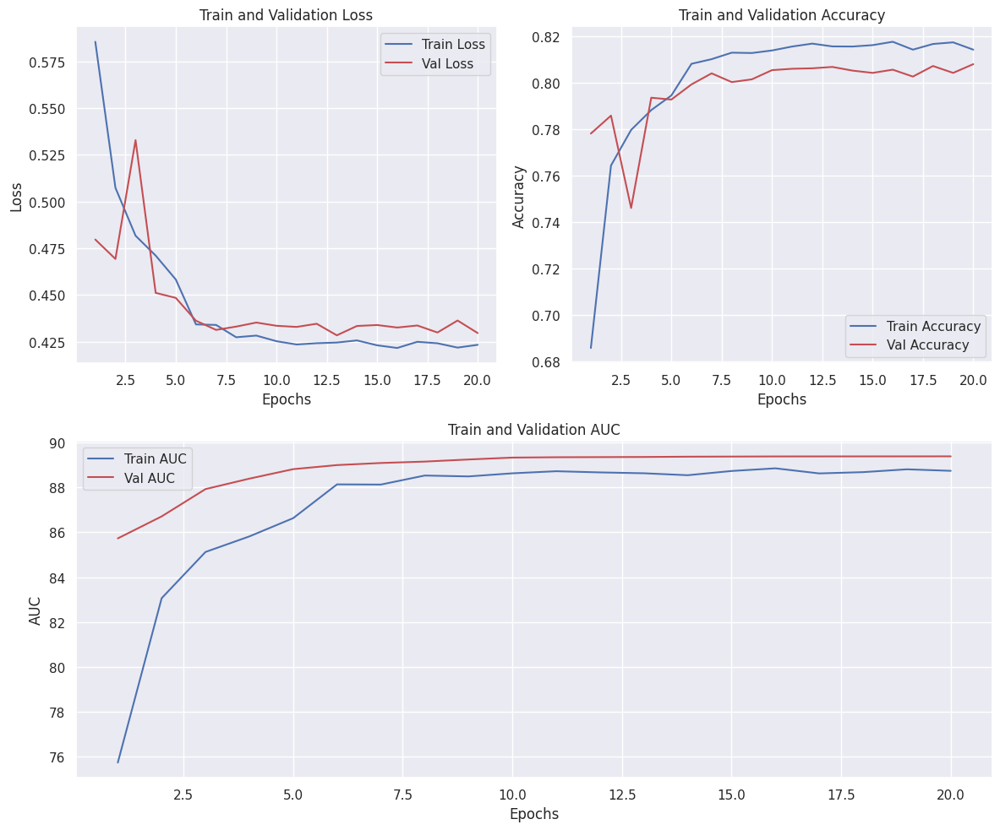

In [11]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [12]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "Z",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "X",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:01<08:20,  1.60s/batch]

Epoch   1/20:   1%|          | 2/313 [00:03<08:30,  1.64s/batch]

Epoch   1/20:   1%|          | 3/313 [00:04<08:23,  1.62s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:06<08:19,  1.62s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:08<08:16,  1.61s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:09<08:37,  1.69s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:11<08:28,  1.66s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:13<08:21,  1.64s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:14<08:16,  1.63s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:16<08:12,  1.63s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:17<08:09,  1.62s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:19<08:06,  1.62s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:21<08:04,  1.61s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:22<08:02,  1.61s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:24<08:00,  1.61s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:26<07:58,  1.61s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:28<08:37,  1.75s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:30<09:05,  1.85s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:32<09:16,  1.89s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:33<08:50,  1.81s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:35<08:31,  1.75s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:37<08:18,  1.71s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:38<08:08,  1.68s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:40<08:01,  1.66s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:41<07:55,  1.65s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:43<07:51,  1.64s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:45<07:48,  1.64s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:46<07:45,  1.63s/batch]

Epoch   1/20:   9%|▉         | 29/313 [00:48<07:42,  1.63s/batch]

Epoch   1/20:  10%|▉         | 30/313 [00:49<07:40,  1.63s/batch]

Epoch   1/20:  10%|▉         | 31/313 [00:51<07:37,  1.62s/batch]

Epoch   1/20:  10%|█         | 32/313 [00:53<07:35,  1.62s/batch]

Epoch   1/20:  11%|█         | 33/313 [00:54<07:34,  1.62s/batch]

Epoch   1/20:  11%|█         | 34/313 [00:56<07:32,  1.62s/batch]

Epoch   1/20:  11%|█         | 35/313 [00:58<07:30,  1.62s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [00:59<07:28,  1.62s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [01:01<07:27,  1.62s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [01:03<08:03,  1.76s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [01:05<07:52,  1.72s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [01:06<07:40,  1.69s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [01:08<07:32,  1.66s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [01:09<07:25,  1.64s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [01:11<07:21,  1.63s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [01:13<07:17,  1.63s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [01:14<07:13,  1.62s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [01:16<07:10,  1.61s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [01:17<07:08,  1.61s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [01:19<07:06,  1.61s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [01:21<07:04,  1.61s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [01:22<07:02,  1.61s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [01:24<07:00,  1.60s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:25<06:58,  1.60s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:27<06:57,  1.61s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:29<06:55,  1.61s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:30<06:53,  1.60s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:32<06:52,  1.60s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [01:33<06:50,  1.60s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [01:35<06:48,  1.60s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [01:37<06:48,  1.61s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [01:38<06:46,  1.61s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [01:40<06:44,  1.60s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [01:41<06:42,  1.60s/batch]

Epoch   1/20:  20%|██        | 63/313 [01:43<06:40,  1.60s/batch]

Epoch   1/20:  20%|██        | 64/313 [01:45<06:39,  1.60s/batch]

Epoch   1/20:  21%|██        | 65/313 [01:46<06:37,  1.60s/batch]

Epoch   1/20:  21%|██        | 66/313 [01:48<06:36,  1.61s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [01:49<06:34,  1.60s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [01:51<06:32,  1.60s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [01:53<06:31,  1.60s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [01:54<06:29,  1.60s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [01:56<06:28,  1.61s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [01:57<06:26,  1.61s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [01:59<06:25,  1.61s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [02:01<06:23,  1.61s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [02:02<06:22,  1.61s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [02:04<06:54,  1.75s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [02:06<06:52,  1.75s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [02:08<06:40,  1.70s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [02:09<06:32,  1.68s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [02:11<06:42,  1.73s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [02:13<06:34,  1.70s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [02:14<06:25,  1.67s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [02:16<06:20,  1.65s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [02:18<06:15,  1.64s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [02:19<06:11,  1.63s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [02:21<06:08,  1.62s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [02:22<06:05,  1.62s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [02:24<06:03,  1.62s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [02:26<06:01,  1.62s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [02:27<05:59,  1.61s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [02:29<05:57,  1.61s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [02:31<05:55,  1.61s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [02:32<05:59,  1.63s/batch]

Epoch   1/20:  30%|███       | 94/313 [02:34<05:59,  1.64s/batch]

Epoch   1/20:  30%|███       | 95/313 [02:36<06:22,  1.76s/batch]

Epoch   1/20:  31%|███       | 96/313 [02:37<06:10,  1.71s/batch]

Epoch   1/20:  31%|███       | 97/313 [02:39<06:02,  1.68s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [02:41<05:56,  1.66s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [02:42<05:51,  1.64s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [02:44<05:47,  1.63s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [02:46<05:44,  1.62s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [02:47<05:41,  1.62s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [02:49<05:38,  1.61s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [02:50<05:36,  1.61s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [02:52<05:34,  1.61s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [02:54<05:33,  1.61s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [02:55<05:31,  1.61s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [02:57<05:29,  1.61s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [02:58<05:28,  1.61s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [03:00<05:26,  1.61s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [03:02<05:24,  1.61s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [03:03<05:22,  1.61s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [03:05<05:26,  1.63s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [03:07<05:38,  1.70s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [03:08<05:31,  1.67s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [03:10<05:26,  1.66s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [03:12<05:21,  1.64s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [03:13<05:18,  1.63s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [03:15<05:15,  1.62s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [03:16<05:12,  1.62s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [03:18<05:10,  1.62s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [03:20<05:08,  1.61s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [03:21<05:06,  1.61s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [03:23<05:04,  1.61s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [03:24<05:03,  1.61s/batch]

Epoch   1/20:  40%|████      | 126/313 [03:26<05:01,  1.61s/batch]

Epoch   1/20:  41%|████      | 127/313 [03:28<04:59,  1.61s/batch]

Epoch   1/20:  41%|████      | 128/313 [03:29<04:57,  1.61s/batch]

Epoch   1/20:  41%|████      | 129/313 [03:31<04:56,  1.61s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [03:32<04:54,  1.61s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [03:34<04:53,  1.61s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [03:36<04:51,  1.61s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [03:38<05:15,  1.75s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [03:40<05:30,  1.85s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [03:42<05:22,  1.81s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [03:43<05:10,  1.75s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [03:45<05:00,  1.71s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [03:46<04:53,  1.68s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [03:48<04:48,  1.66s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [03:50<04:44,  1.64s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [03:51<04:41,  1.63s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [03:53<04:38,  1.63s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [03:54<04:35,  1.62s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [03:56<04:33,  1.62s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [03:58<04:31,  1.61s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [03:59<04:29,  1.61s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [04:01<04:27,  1.61s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [04:03<04:43,  1.72s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [04:04<04:36,  1.68s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [04:06<04:31,  1.66s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [04:08<04:26,  1.65s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [04:10<04:46,  1.78s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [04:12<04:44,  1.78s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [04:13<04:34,  1.72s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [04:15<04:26,  1.69s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [04:16<04:21,  1.66s/batch]

Epoch   1/20:  50%|█████     | 157/313 [04:18<04:16,  1.65s/batch]

Epoch   1/20:  50%|█████     | 158/313 [04:20<04:13,  1.63s/batch]

Epoch   1/20:  51%|█████     | 159/313 [04:21<04:10,  1.63s/batch]

Epoch   1/20:  51%|█████     | 160/313 [04:23<04:08,  1.62s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [04:24<04:06,  1.62s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [04:26<04:04,  1.62s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [04:28<04:02,  1.61s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [04:29<04:00,  1.61s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [04:31<03:58,  1.61s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [04:32<03:56,  1.61s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [04:34<03:54,  1.61s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [04:36<03:53,  1.61s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [04:37<03:51,  1.61s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [04:39<03:50,  1.61s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [04:41<04:08,  1.75s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [04:43<04:04,  1.73s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [04:44<03:57,  1.70s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [04:46<03:52,  1.67s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [04:47<03:48,  1.65s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [04:49<03:44,  1.64s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [04:51<03:41,  1.63s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [04:52<03:39,  1.62s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [04:54<03:37,  1.62s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [04:56<03:35,  1.62s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [04:57<03:33,  1.61s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [04:59<03:31,  1.61s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [05:00<03:29,  1.61s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [05:02<03:27,  1.61s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [05:04<03:26,  1.61s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [05:05<03:24,  1.61s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [05:07<03:22,  1.61s/batch]

Epoch   1/20:  60%|██████    | 188/313 [05:08<03:21,  1.61s/batch]

Epoch   1/20:  60%|██████    | 189/313 [05:10<03:19,  1.61s/batch]

Epoch   1/20:  61%|██████    | 190/313 [05:12<03:35,  1.75s/batch]

Epoch   1/20:  61%|██████    | 191/313 [05:14<03:36,  1.77s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [05:16<03:28,  1.72s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [05:17<03:22,  1.69s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [05:19<03:18,  1.67s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [05:20<03:14,  1.65s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [05:22<03:11,  1.64s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [05:24<03:09,  1.64s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [05:25<03:12,  1.68s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [05:27<03:09,  1.66s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [05:29<03:05,  1.64s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [05:30<03:02,  1.63s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [05:32<03:00,  1.63s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [05:33<02:58,  1.62s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [05:35<02:56,  1.62s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [05:37<03:00,  1.67s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [05:38<02:57,  1.66s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [05:40<02:54,  1.64s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [05:42<02:51,  1.64s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [05:44<03:02,  1.76s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [05:45<03:00,  1.75s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [05:47<02:54,  1.71s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [05:49<02:49,  1.68s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [05:50<02:45,  1.66s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [05:52<02:42,  1.64s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [05:54<02:40,  1.63s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [05:55<02:37,  1.62s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [05:57<02:35,  1.62s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [05:58<02:33,  1.62s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [06:00<02:44,  1.75s/batch]

Epoch   1/20:  70%|███████   | 220/313 [06:02<02:51,  1.85s/batch]

Epoch   1/20:  71%|███████   | 221/313 [06:04<02:52,  1.88s/batch]

Epoch   1/20:  71%|███████   | 222/313 [06:06<02:50,  1.87s/batch]

Epoch   1/20:  71%|███████   | 223/313 [06:08<02:41,  1.79s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [06:10<02:34,  1.74s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [06:11<02:29,  1.70s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [06:13<02:25,  1.67s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [06:15<02:34,  1.79s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [06:17<02:31,  1.79s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [06:18<02:25,  1.74s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [06:20<02:21,  1.70s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [06:21<02:17,  1.68s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [06:23<02:14,  1.66s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [06:25<02:11,  1.65s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [06:26<02:09,  1.64s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [06:28<02:07,  1.64s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [06:30<02:05,  1.63s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [06:31<02:03,  1.63s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [06:33<02:01,  1.63s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [06:34<02:00,  1.62s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [06:36<01:58,  1.62s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [06:38<01:56,  1.62s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [06:39<01:54,  1.62s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [06:41<01:53,  1.62s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [06:42<01:51,  1.62s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [06:44<01:50,  1.62s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [06:46<01:57,  1.76s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [06:48<01:57,  1.78s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [06:50<01:52,  1.73s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [06:51<01:48,  1.69s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [06:53<01:45,  1.67s/batch]

Epoch   1/20:  80%|████████  | 251/313 [06:54<01:42,  1.65s/batch]

Epoch   1/20:  81%|████████  | 252/313 [06:56<01:39,  1.64s/batch]

Epoch   1/20:  81%|████████  | 253/313 [06:58<01:37,  1.63s/batch]

Epoch   1/20:  81%|████████  | 254/313 [06:59<01:35,  1.62s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [07:01<01:33,  1.62s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [07:02<01:32,  1.61s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [07:04<01:30,  1.61s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [07:06<01:28,  1.61s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [07:07<01:26,  1.61s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [07:09<01:25,  1.61s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [07:11<01:23,  1.61s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [07:12<01:22,  1.61s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [07:14<01:20,  1.61s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [07:15<01:18,  1.61s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [07:17<01:24,  1.75s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [07:19<01:22,  1.75s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [07:21<01:18,  1.71s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [07:22<01:15,  1.68s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [07:24<01:12,  1.66s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [07:26<01:10,  1.64s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [07:27<01:08,  1.63s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [07:29<01:06,  1.62s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [07:30<01:04,  1.62s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [07:32<01:02,  1.61s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [07:34<01:01,  1.61s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [07:35<00:59,  1.61s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [07:37<00:58,  1.62s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [07:39<00:56,  1.62s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [07:40<00:55,  1.62s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [07:42<00:54,  1.64s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [07:43<00:52,  1.63s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [07:45<00:50,  1.62s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [07:47<00:48,  1.62s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [07:49<00:50,  1.76s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [07:51<00:49,  1.77s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [07:52<00:46,  1.72s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [07:54<00:43,  1.69s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [07:55<00:41,  1.67s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [07:57<00:41,  1.72s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [07:59<00:38,  1.69s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [08:00<00:36,  1.66s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [08:02<00:34,  1.65s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [08:04<00:32,  1.64s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [08:05<00:30,  1.63s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [08:07<00:29,  1.62s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [08:08<00:27,  1.62s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [08:10<00:25,  1.62s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [08:12<00:24,  1.61s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [08:13<00:22,  1.61s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [08:15<00:20,  1.61s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [08:17<00:19,  1.62s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [08:18<00:18,  1.65s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [08:20<00:17,  1.76s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [08:22<00:15,  1.72s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [08:24<00:13,  1.68s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [08:25<00:11,  1.67s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [08:27<00:09,  1.65s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [08:28<00:08,  1.63s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [08:30<00:06,  1.63s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [08:32<00:04,  1.62s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [08:33<00:03,  1.62s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [08:35<00:01,  1.61s/batch]

Epoch   1/20: 100%|██████████| 313/313 [08:36<00:00,  1.39s/batch]

Epoch   1/20: 100%|██████████| 313/313 [08:36<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [09:01<00:00,  1.39s/batch, Epoch = 9m 1s, Loss = 0.6005|0.4812, Acc = 0.668|0.785, AUC = 73.961|85.535]

Epoch   1/20: 100%|██████████| 313/313 [09:01<00:00,  1.73s/batch, Epoch = 9m 1s, Loss = 0.6005|0.4812, Acc = 0.668|0.785, AUC = 73.961|85.535]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:01<10:09,  1.95s/batch]

Epoch   2/20:   1%|          | 2/313 [00:03<09:02,  1.74s/batch]

Epoch   2/20:   1%|          | 3/313 [00:05<08:39,  1.68s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:06<08:28,  1.65s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:08<08:21,  1.63s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:09<08:16,  1.62s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:11<08:12,  1.61s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:13<08:11,  1.61s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:14<08:08,  1.61s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:16<08:06,  1.61s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:17<08:07,  1.61s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:19<08:05,  1.61s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:21<08:02,  1.61s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:22<08:00,  1.61s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:24<07:58,  1.60s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:25<07:56,  1.60s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:27<07:54,  1.60s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:29<07:52,  1.60s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:30<07:51,  1.60s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:32<08:31,  1.74s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:34<08:28,  1.74s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:36<08:14,  1.70s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:37<08:04,  1.67s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:39<07:56,  1.65s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:41<07:50,  1.63s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:43<08:27,  1.77s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:45<08:38,  1.81s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:46<08:18,  1.75s/batch]

Epoch   2/20:   9%|▉         | 29/313 [00:48<08:04,  1.71s/batch]

Epoch   2/20:  10%|▉         | 30/313 [00:49<07:53,  1.67s/batch]

Epoch   2/20:  10%|▉         | 31/313 [00:51<07:45,  1.65s/batch]

Epoch   2/20:  10%|█         | 32/313 [00:53<07:39,  1.64s/batch]

Epoch   2/20:  11%|█         | 33/313 [00:54<07:35,  1.63s/batch]

Epoch   2/20:  11%|█         | 34/313 [00:56<07:32,  1.62s/batch]

Epoch   2/20:  11%|█         | 35/313 [00:57<07:28,  1.61s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [00:59<07:26,  1.61s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [01:01<07:23,  1.61s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [01:02<07:21,  1.61s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [01:04<07:59,  1.75s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [01:06<07:49,  1.72s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [01:07<07:39,  1.69s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [01:09<07:31,  1.67s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [01:11<07:33,  1.68s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [01:12<07:26,  1.66s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [01:14<07:21,  1.65s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [01:16<07:34,  1.70s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [01:17<07:26,  1.68s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [01:19<07:19,  1.66s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [01:21<07:14,  1.65s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [01:22<07:09,  1.63s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [01:24<07:06,  1.63s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:26<07:03,  1.62s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:27<07:01,  1.62s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:29<06:59,  1.62s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:30<06:57,  1.62s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:32<06:55,  1.62s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [01:34<06:54,  1.62s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [01:36<07:18,  1.72s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [01:37<07:08,  1.69s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [01:39<07:01,  1.67s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [01:40<06:58,  1.66s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [01:42<06:56,  1.66s/batch]

Epoch   2/20:  20%|██        | 63/313 [01:44<06:51,  1.65s/batch]

Epoch   2/20:  20%|██        | 64/313 [01:45<06:49,  1.64s/batch]

Epoch   2/20:  21%|██        | 65/313 [01:47<06:44,  1.63s/batch]

Epoch   2/20:  21%|██        | 66/313 [01:49<06:40,  1.62s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [01:50<06:37,  1.62s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [01:52<06:35,  1.61s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [01:53<06:33,  1.61s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [01:55<06:30,  1.61s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [01:57<06:28,  1.61s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [01:58<06:27,  1.61s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [02:00<06:25,  1.61s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [02:01<06:24,  1.61s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [02:03<06:23,  1.61s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [02:05<06:22,  1.61s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [02:07<06:53,  1.75s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [02:09<07:15,  1.85s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [02:11<07:29,  1.92s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [02:13<07:14,  1.86s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [02:14<06:55,  1.79s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [02:16<06:40,  1.73s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [02:17<06:29,  1.69s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [02:19<06:21,  1.67s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [02:21<06:15,  1.65s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [02:22<06:10,  1.63s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [02:24<06:07,  1.63s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [02:25<06:04,  1.62s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [02:27<06:01,  1.61s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [02:29<06:00,  1.61s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [02:30<05:57,  1.61s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [02:32<05:55,  1.61s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [02:33<05:53,  1.61s/batch]

Epoch   2/20:  30%|███       | 94/313 [02:35<05:51,  1.61s/batch]

Epoch   2/20:  30%|███       | 95/313 [02:37<05:49,  1.60s/batch]

Epoch   2/20:  31%|███       | 96/313 [02:38<05:48,  1.61s/batch]

Epoch   2/20:  31%|███       | 97/313 [02:40<05:46,  1.60s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [02:42<05:44,  1.60s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [02:43<05:43,  1.60s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [02:45<05:41,  1.60s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [02:47<06:09,  1.74s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [02:49<06:08,  1.74s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [02:50<05:57,  1.70s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [02:52<05:49,  1.67s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [02:53<05:43,  1.65s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [02:55<05:39,  1.64s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [02:57<05:35,  1.63s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [02:58<05:32,  1.62s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [03:00<05:29,  1.61s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [03:01<05:26,  1.61s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [03:03<05:24,  1.61s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [03:05<05:23,  1.61s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [03:06<05:21,  1.61s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [03:08<05:19,  1.60s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [03:10<05:45,  1.75s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [03:12<05:48,  1.77s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [03:13<05:36,  1.72s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [03:15<05:28,  1.68s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [03:16<05:21,  1.66s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [03:18<05:30,  1.71s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [03:20<05:22,  1.68s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [03:22<05:16,  1.66s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [03:23<05:11,  1.64s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [03:25<05:08,  1.63s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [03:26<05:04,  1.62s/batch]

Epoch   2/20:  40%|████      | 126/313 [03:28<05:01,  1.61s/batch]

Epoch   2/20:  41%|████      | 127/313 [03:30<04:59,  1.61s/batch]

Epoch   2/20:  41%|████      | 128/313 [03:31<04:57,  1.61s/batch]

Epoch   2/20:  41%|████      | 129/313 [03:33<04:55,  1.61s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [03:34<04:53,  1.60s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [03:36<04:52,  1.60s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [03:38<04:50,  1.60s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [03:39<04:48,  1.60s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [03:41<05:12,  1.75s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [03:43<05:07,  1.73s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [03:45<04:59,  1.69s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [03:46<04:52,  1.66s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [03:48<04:47,  1.65s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [03:49<04:43,  1.63s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [03:51<04:40,  1.62s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [03:53<04:37,  1.62s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [03:54<04:36,  1.61s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [03:56<04:33,  1.61s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [03:58<04:46,  1.70s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [03:59<04:40,  1.67s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [04:01<04:35,  1.65s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [04:02<04:31,  1.63s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [04:04<04:27,  1.62s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [04:06<04:25,  1.62s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [04:07<04:22,  1.61s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [04:09<04:20,  1.61s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [04:10<04:19,  1.61s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [04:13<04:39,  1.75s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [04:14<04:35,  1.73s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [04:16<04:27,  1.69s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [04:17<04:21,  1.66s/batch]

Epoch   2/20:  50%|█████     | 157/313 [04:19<04:16,  1.65s/batch]

Epoch   2/20:  50%|█████     | 158/313 [04:21<04:13,  1.63s/batch]

Epoch   2/20:  51%|█████     | 159/313 [04:22<04:10,  1.62s/batch]

Epoch   2/20:  51%|█████     | 160/313 [04:24<04:29,  1.76s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [04:26<04:33,  1.80s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [04:28<04:23,  1.74s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [04:29<04:14,  1.70s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [04:31<04:08,  1.67s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [04:33<04:04,  1.65s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [04:34<04:00,  1.64s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [04:36<03:57,  1.63s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [04:37<03:54,  1.62s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [04:39<03:52,  1.62s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [04:41<03:50,  1.61s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [04:42<03:48,  1.61s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [04:44<04:06,  1.75s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [04:46<04:18,  1.85s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [04:48<04:20,  1.88s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [04:50<04:12,  1.83s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [04:52<04:01,  1.76s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [04:53<03:53,  1.71s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [04:55<03:47,  1.68s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [04:56<03:42,  1.66s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [04:58<03:38,  1.64s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [05:00<03:35,  1.63s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [05:01<03:32,  1.62s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [05:03<03:29,  1.62s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [05:04<03:27,  1.61s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [05:06<03:26,  1.61s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [05:08<03:24,  1.61s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [05:09<03:22,  1.61s/batch]

Epoch   2/20:  60%|██████    | 188/313 [05:11<03:20,  1.61s/batch]

Epoch   2/20:  60%|██████    | 189/313 [05:13<03:27,  1.67s/batch]

Epoch   2/20:  61%|██████    | 190/313 [05:15<03:37,  1.77s/batch]

Epoch   2/20:  61%|██████    | 191/313 [05:17<03:38,  1.79s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [05:18<03:30,  1.74s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [05:20<03:29,  1.75s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [05:22<03:22,  1.70s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [05:23<03:17,  1.67s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [05:25<03:13,  1.65s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [05:26<03:09,  1.64s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [05:28<03:07,  1.63s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [05:30<03:07,  1.65s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [05:31<03:04,  1.63s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [05:33<03:02,  1.63s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [05:34<02:59,  1.62s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [05:36<02:57,  1.62s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [05:38<02:55,  1.61s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [05:40<03:01,  1.68s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [05:41<02:57,  1.66s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [05:43<02:54,  1.64s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [05:44<02:51,  1.63s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [05:46<03:03,  1.76s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [05:48<02:59,  1.74s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [05:50<02:53,  1.70s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [05:51<02:48,  1.67s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [05:53<02:44,  1.65s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [05:55<02:43,  1.65s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [05:56<02:40,  1.63s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [05:58<02:37,  1.63s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [05:59<02:35,  1.62s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [06:01<02:33,  1.61s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [06:03<02:31,  1.61s/batch]

Epoch   2/20:  70%|███████   | 220/313 [06:04<02:29,  1.61s/batch]

Epoch   2/20:  71%|███████   | 221/313 [06:06<02:27,  1.61s/batch]

Epoch   2/20:  71%|███████   | 222/313 [06:07<02:25,  1.60s/batch]

Epoch   2/20:  71%|███████   | 223/313 [06:09<02:24,  1.60s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [06:11<02:22,  1.60s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [06:12<02:20,  1.60s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [06:14<02:18,  1.60s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [06:15<02:17,  1.60s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [06:17<02:27,  1.74s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [06:19<02:24,  1.72s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [06:21<02:19,  1.68s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [06:22<02:15,  1.66s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [06:24<02:12,  1.64s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [06:26<02:12,  1.65s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [06:27<02:09,  1.63s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [06:29<02:06,  1.62s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [06:30<02:04,  1.61s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [06:32<02:02,  1.61s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [06:34<02:00,  1.60s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [06:35<01:58,  1.60s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [06:37<01:57,  1.61s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [06:38<01:55,  1.61s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [06:40<01:53,  1.60s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [06:42<01:56,  1.66s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [06:43<01:53,  1.64s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [06:45<01:50,  1.63s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [06:47<01:48,  1.62s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [06:49<01:56,  1.76s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [06:50<01:54,  1.76s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [06:52<01:49,  1.71s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [06:54<01:45,  1.68s/batch]

Epoch   2/20:  80%|████████  | 251/313 [06:55<01:42,  1.66s/batch]

Epoch   2/20:  81%|████████  | 252/313 [06:57<01:42,  1.69s/batch]

Epoch   2/20:  81%|████████  | 253/313 [06:59<01:39,  1.66s/batch]

Epoch   2/20:  81%|████████  | 254/313 [07:00<01:37,  1.64s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [07:02<01:34,  1.63s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [07:03<01:32,  1.63s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [07:05<01:30,  1.62s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [07:07<01:28,  1.62s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [07:08<01:27,  1.61s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [07:10<01:25,  1.61s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [07:11<01:23,  1.61s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [07:13<01:22,  1.61s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [07:15<01:24,  1.68s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [07:16<01:21,  1.66s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [07:18<01:18,  1.64s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [07:20<01:23,  1.77s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [07:22<01:25,  1.87s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [07:24<01:26,  1.93s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [07:26<01:24,  1.92s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [07:28<01:18,  1.82s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [07:29<01:13,  1.76s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [07:31<01:14,  1.81s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [07:33<01:09,  1.75s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [07:35<01:06,  1.71s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [07:36<01:03,  1.68s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [07:38<01:01,  1.66s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [07:39<00:59,  1.64s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [07:41<01:01,  1.77s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [07:44<01:03,  1.86s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [07:45<01:01,  1.86s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [07:47<00:57,  1.79s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [07:49<00:57,  1.85s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [07:51<00:57,  1.92s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [07:53<00:57,  1.97s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [07:55<00:53,  1.91s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [07:57<00:49,  1.82s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [07:58<00:45,  1.76s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [08:00<00:42,  1.71s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [08:01<00:40,  1.68s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [08:03<00:38,  1.66s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [08:05<00:36,  1.65s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [08:07<00:36,  1.74s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [08:08<00:34,  1.71s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [08:10<00:34,  1.82s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [08:12<00:34,  1.90s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [08:14<00:33,  1.95s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [08:16<00:31,  1.99s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [08:18<00:28,  1.92s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [08:20<00:25,  1.83s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [08:22<00:24,  1.90s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [08:24<00:23,  1.95s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [08:26<00:21,  1.98s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [08:28<00:18,  1.87s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [08:29<00:16,  1.79s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [08:31<00:15,  1.88s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [08:33<00:12,  1.80s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [08:35<00:10,  1.74s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [08:36<00:08,  1.70s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [08:38<00:06,  1.68s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [08:39<00:04,  1.66s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [08:41<00:03,  1.64s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [08:43<00:01,  1.63s/batch]

Epoch   2/20: 100%|██████████| 313/313 [08:44<00:00,  1.41s/batch]

Epoch   2/20: 100%|██████████| 313/313 [08:44<00:00,  1.41s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [09:09<00:00,  1.41s/batch, Epoch = 9m 9s, Loss = 0.5056|0.4832, Acc = 0.768|0.779, AUC = 83.330|86.900]

Epoch   2/20: 100%|██████████| 313/313 [09:09<00:00,  1.76s/batch, Epoch = 9m 9s, Loss = 0.5056|0.4832, Acc = 0.768|0.779, AUC = 83.330|86.900]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:01<08:15,  1.59s/batch]

Epoch   3/20:   1%|          | 2/313 [00:03<09:31,  1.84s/batch]

Epoch   3/20:   1%|          | 3/313 [00:05<08:57,  1.73s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:06<08:41,  1.69s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:08<08:30,  1.66s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:10<08:24,  1.64s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:11<08:20,  1.64s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:13<08:17,  1.63s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:15<08:24,  1.66s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:16<08:19,  1.65s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:18<08:14,  1.64s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:19<08:18,  1.65s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:21<08:12,  1.64s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:23<08:08,  1.63s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:24<08:10,  1.64s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:26<08:06,  1.64s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:28<08:02,  1.63s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:29<07:59,  1.63s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:31<08:25,  1.72s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:33<08:25,  1.73s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:35<08:38,  1.78s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:36<08:25,  1.74s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:38<08:13,  1.70s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:40<08:04,  1.68s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:41<07:57,  1.66s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:43<07:54,  1.65s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:45<07:49,  1.64s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:46<07:46,  1.64s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:48<07:42,  1.63s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:49<07:40,  1.63s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:51<07:42,  1.64s/batch]

Epoch   3/20:  10%|█         | 32/313 [00:53<07:38,  1.63s/batch]

Epoch   3/20:  11%|█         | 33/313 [00:54<07:35,  1.63s/batch]

Epoch   3/20:  11%|█         | 34/313 [00:56<07:32,  1.62s/batch]

Epoch   3/20:  11%|█         | 35/313 [00:57<07:30,  1.62s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [00:59<07:27,  1.62s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [01:01<07:25,  1.61s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [01:02<07:24,  1.61s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [01:04<07:56,  1.74s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [01:06<07:44,  1.70s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [01:08<07:35,  1.67s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [01:09<07:28,  1.66s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [01:11<07:23,  1.64s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [01:12<07:20,  1.64s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [01:14<07:17,  1.63s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [01:16<07:14,  1.63s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [01:17<07:11,  1.62s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [01:19<07:08,  1.62s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [01:21<07:06,  1.62s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [01:22<07:04,  1.61s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:24<07:02,  1.61s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:25<07:00,  1.61s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:27<06:58,  1.61s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:29<06:59,  1.62s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:30<06:57,  1.62s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:32<06:55,  1.61s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:33<06:52,  1.61s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:35<07:26,  1.75s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:37<07:15,  1.71s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [01:39<07:06,  1.69s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:40<06:58,  1.66s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:42<06:52,  1.64s/batch]

Epoch   3/20:  20%|██        | 63/313 [01:44<06:48,  1.63s/batch]

Epoch   3/20:  20%|██        | 64/313 [01:45<06:45,  1.63s/batch]

Epoch   3/20:  21%|██        | 65/313 [01:47<06:42,  1.62s/batch]

Epoch   3/20:  21%|██        | 66/313 [01:48<06:39,  1.62s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [01:50<06:37,  1.62s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [01:52<06:35,  1.61s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [01:53<06:32,  1.61s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [01:55<06:30,  1.61s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [01:56<06:28,  1.61s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [01:58<06:27,  1.61s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [02:00<06:25,  1.61s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [02:01<06:24,  1.61s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [02:03<06:23,  1.61s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [02:04<06:21,  1.61s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [02:07<06:52,  1.75s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [02:08<06:56,  1.77s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [02:10<06:43,  1.72s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [02:12<06:33,  1.69s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [02:13<06:26,  1.67s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [02:15<06:20,  1.65s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [02:16<06:19,  1.65s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [02:18<06:15,  1.64s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [02:20<06:11,  1.63s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [02:21<06:08,  1.62s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [02:23<06:05,  1.62s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [02:24<06:03,  1.61s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [02:26<06:01,  1.61s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [02:28<05:59,  1.61s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [02:29<05:57,  1.61s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [02:31<05:55,  1.61s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [02:33<06:10,  1.68s/batch]

Epoch   3/20:  30%|███       | 94/313 [02:34<06:03,  1.66s/batch]

Epoch   3/20:  30%|███       | 95/313 [02:36<05:58,  1.65s/batch]

Epoch   3/20:  31%|███       | 96/313 [02:38<06:20,  1.75s/batch]

Epoch   3/20:  31%|███       | 97/313 [02:40<06:09,  1.71s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [02:41<06:01,  1.68s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [02:43<05:54,  1.66s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [02:45<06:14,  1.76s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [02:46<06:03,  1.71s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [02:48<05:54,  1.68s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [02:50<05:48,  1.66s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [02:51<05:43,  1.64s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [02:53<05:39,  1.63s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [02:54<05:37,  1.63s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [02:56<05:34,  1.62s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [02:58<05:31,  1.62s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [02:59<05:29,  1.61s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [03:01<05:26,  1.61s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [03:02<05:24,  1.61s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [03:04<05:23,  1.61s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [03:06<05:21,  1.61s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [03:07<05:19,  1.61s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [03:09<05:46,  1.75s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [03:11<05:58,  1.82s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [03:13<06:11,  1.90s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [03:15<05:57,  1.83s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [03:17<05:51,  1.81s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [03:19<05:38,  1.76s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [03:20<05:28,  1.71s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [03:22<05:29,  1.73s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [03:24<05:21,  1.69s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [03:25<05:14,  1.66s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [03:27<05:09,  1.65s/batch]

Epoch   3/20:  40%|████      | 126/313 [03:28<05:05,  1.64s/batch]

Epoch   3/20:  41%|████      | 127/313 [03:30<05:03,  1.63s/batch]

Epoch   3/20:  41%|████      | 128/313 [03:32<05:01,  1.63s/batch]

Epoch   3/20:  41%|████      | 129/313 [03:33<04:58,  1.62s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [03:35<04:56,  1.62s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [03:36<04:54,  1.62s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [03:38<04:52,  1.61s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [03:40<05:15,  1.75s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [03:42<05:30,  1.85s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [03:44<05:41,  1.92s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [03:46<05:25,  1.84s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [03:48<05:11,  1.77s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [03:49<05:01,  1.72s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [03:51<05:03,  1.74s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [03:53<04:59,  1.73s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [03:55<05:07,  1.79s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [03:56<04:56,  1.73s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [03:58<04:48,  1.70s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [03:59<04:42,  1.67s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [04:01<04:37,  1.65s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [04:03<04:33,  1.64s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [04:04<04:30,  1.63s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [04:06<04:27,  1.62s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [04:07<04:25,  1.62s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [04:09<04:45,  1.75s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [04:12<04:59,  1.85s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [04:14<05:08,  1.92s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [04:16<05:14,  1.97s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [04:18<05:17,  2.00s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [04:19<04:58,  1.89s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [04:21<05:00,  1.92s/batch]

Epoch   3/20:  50%|█████     | 157/313 [04:23<04:44,  1.82s/batch]

Epoch   3/20:  50%|█████     | 158/313 [04:25<04:32,  1.76s/batch]

Epoch   3/20:  51%|█████     | 159/313 [04:26<04:23,  1.71s/batch]

Epoch   3/20:  51%|█████     | 160/313 [04:28<04:38,  1.82s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [04:30<04:31,  1.78s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [04:32<04:32,  1.80s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [04:33<04:21,  1.74s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [04:35<04:15,  1.71s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [04:37<04:08,  1.68s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [04:38<04:04,  1.66s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [04:40<04:00,  1.65s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [04:42<04:17,  1.78s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [04:44<04:08,  1.72s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [04:45<04:01,  1.69s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [04:47<03:56,  1.66s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [04:48<03:52,  1.65s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [04:50<03:48,  1.63s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [04:52<03:45,  1.63s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [04:53<03:43,  1.62s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [04:55<03:41,  1.62s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [04:56<03:39,  1.61s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [04:58<03:37,  1.61s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [05:00<03:35,  1.61s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [05:01<03:33,  1.61s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [05:03<03:32,  1.61s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [05:04<03:30,  1.61s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [05:06<03:28,  1.61s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [05:08<03:35,  1.67s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [05:10<03:31,  1.65s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [05:11<03:27,  1.64s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [05:13<03:43,  1.77s/batch]

Epoch   3/20:  60%|██████    | 188/313 [05:15<03:52,  1.86s/batch]

Epoch   3/20:  60%|██████    | 189/313 [05:17<03:58,  1.93s/batch]

Epoch   3/20:  61%|██████    | 190/313 [05:19<03:54,  1.90s/batch]

Epoch   3/20:  61%|██████    | 191/313 [05:21<03:41,  1.81s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [05:22<03:31,  1.75s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [05:24<03:25,  1.71s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [05:26<03:19,  1.68s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [05:27<03:15,  1.66s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [05:29<03:11,  1.64s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [05:30<03:09,  1.63s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [05:32<03:06,  1.62s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [05:34<03:04,  1.62s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [05:35<03:02,  1.62s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [05:37<03:00,  1.61s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [05:38<02:59,  1.62s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [05:40<02:57,  1.62s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [05:42<02:55,  1.61s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [05:44<03:09,  1.75s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [05:45<03:04,  1.73s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [05:47<02:59,  1.69s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [05:49<02:54,  1.66s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [05:50<02:50,  1.64s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [05:52<02:48,  1.63s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [05:53<02:45,  1.62s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [05:55<02:43,  1.62s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [05:57<02:41,  1.61s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [05:58<02:39,  1.61s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [06:00<02:37,  1.61s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [06:01<02:35,  1.61s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [06:03<02:34,  1.61s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [06:05<02:32,  1.60s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [06:06<02:30,  1.61s/batch]

Epoch   3/20:  70%|███████   | 220/313 [06:08<02:29,  1.60s/batch]

Epoch   3/20:  71%|███████   | 221/313 [06:09<02:27,  1.60s/batch]

Epoch   3/20:  71%|███████   | 222/313 [06:11<02:25,  1.60s/batch]

Epoch   3/20:  71%|███████   | 223/313 [06:13<02:24,  1.60s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [06:14<02:25,  1.63s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [06:16<02:22,  1.62s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [06:18<02:20,  1.62s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [06:19<02:18,  1.61s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [06:21<02:16,  1.61s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [06:22<02:14,  1.61s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [06:24<02:13,  1.60s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [06:26<02:11,  1.60s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [06:27<02:09,  1.60s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [06:29<02:08,  1.60s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [06:30<02:06,  1.60s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [06:32<02:04,  1.60s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [06:34<02:12,  1.72s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [06:36<02:08,  1.69s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [06:37<02:04,  1.66s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [06:39<02:01,  1.64s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [06:40<01:59,  1.63s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [06:42<01:56,  1.62s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [06:44<01:54,  1.62s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [06:45<01:57,  1.67s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [06:47<01:54,  1.65s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [06:49<01:51,  1.64s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [06:50<01:49,  1.63s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [06:52<01:47,  1.62s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [06:53<01:45,  1.62s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [06:55<01:43,  1.62s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [06:57<01:41,  1.61s/batch]

Epoch   3/20:  80%|████████  | 251/313 [06:58<01:39,  1.61s/batch]

Epoch   3/20:  81%|████████  | 252/313 [07:00<01:38,  1.61s/batch]

Epoch   3/20:  81%|████████  | 253/313 [07:01<01:36,  1.61s/batch]

Epoch   3/20:  81%|████████  | 254/313 [07:03<01:34,  1.61s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [07:05<01:33,  1.61s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [07:06<01:31,  1.61s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [07:08<01:29,  1.61s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [07:10<01:28,  1.61s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [07:11<01:26,  1.61s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [07:13<01:25,  1.61s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [07:14<01:23,  1.61s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [07:16<01:29,  1.75s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [07:18<01:27,  1.75s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [07:20<01:23,  1.71s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [07:21<01:20,  1.68s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [07:23<01:17,  1.66s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [07:25<01:15,  1.64s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [07:27<01:19,  1.77s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [07:29<01:21,  1.86s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [07:30<01:16,  1.78s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [07:32<01:12,  1.73s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [07:34<01:09,  1.69s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [07:35<01:06,  1.66s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [07:37<01:04,  1.65s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [07:38<01:02,  1.64s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [07:40<01:00,  1.63s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [07:42<00:58,  1.62s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [07:43<00:56,  1.62s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [07:45<00:54,  1.61s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [07:47<00:57,  1.75s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [07:49<00:55,  1.74s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [07:50<00:52,  1.70s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [07:52<00:50,  1.67s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [07:53<00:48,  1.66s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [07:55<00:45,  1.64s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [07:57<00:44,  1.63s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [07:58<00:42,  1.62s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [08:00<00:40,  1.62s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [08:01<00:38,  1.61s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [08:03<00:37,  1.61s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [08:05<00:35,  1.61s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [08:07<00:35,  1.68s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [08:08<00:33,  1.65s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [08:10<00:31,  1.64s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [08:11<00:29,  1.63s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [08:13<00:27,  1.62s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [08:15<00:25,  1.62s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [08:16<00:24,  1.61s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [08:18<00:24,  1.75s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [08:20<00:22,  1.72s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [08:21<00:20,  1.68s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [08:23<00:18,  1.67s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [08:25<00:16,  1.65s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [08:26<00:14,  1.63s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [08:28<00:13,  1.71s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [08:30<00:11,  1.68s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [08:31<00:09,  1.66s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [08:33<00:08,  1.64s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [08:35<00:06,  1.63s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [08:36<00:04,  1.62s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [08:38<00:03,  1.61s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [08:39<00:01,  1.61s/batch]

Epoch   3/20: 100%|██████████| 313/313 [08:40<00:00,  1.39s/batch]

Epoch   3/20: 100%|██████████| 313/313 [08:40<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [09:06<00:00,  1.39s/batch, Epoch = 9m 6s, Loss = 0.4833|0.4730, Acc = 0.782|0.785, AUC = 84.925|87.344]

Epoch   3/20: 100%|██████████| 313/313 [09:06<00:00,  1.75s/batch, Epoch = 9m 6s, Loss = 0.4833|0.4730, Acc = 0.782|0.785, AUC = 84.925|87.344]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:02<10:41,  2.06s/batch]

Epoch   4/20:   1%|          | 2/313 [00:03<10:00,  1.93s/batch]

Epoch   4/20:   1%|          | 3/313 [00:05<09:11,  1.78s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:07<08:47,  1.71s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:08<08:34,  1.67s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:10<08:25,  1.65s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:11<08:19,  1.63s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:13<08:14,  1.62s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:15<08:11,  1.62s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:16<08:08,  1.61s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:18<08:49,  1.75s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:20<08:53,  1.77s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:22<08:36,  1.72s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:23<08:26,  1.69s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:25<08:35,  1.73s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:27<08:29,  1.71s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:28<08:17,  1.68s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:30<08:08,  1.66s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:32<08:09,  1.66s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:33<08:02,  1.65s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:35<07:56,  1.63s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:37<07:52,  1.62s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:38<07:48,  1.62s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:40<07:45,  1.61s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:41<07:43,  1.61s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:43<07:59,  1.67s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:45<07:52,  1.65s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:46<07:46,  1.64s/batch]

Epoch   4/20:   9%|▉         | 29/313 [00:48<07:42,  1.63s/batch]

Epoch   4/20:  10%|▉         | 30/313 [00:50<07:38,  1.62s/batch]

Epoch   4/20:  10%|▉         | 31/313 [00:51<07:35,  1.61s/batch]

Epoch   4/20:  10%|█         | 32/313 [00:53<07:32,  1.61s/batch]

Epoch   4/20:  11%|█         | 33/313 [00:54<07:30,  1.61s/batch]

Epoch   4/20:  11%|█         | 34/313 [00:56<07:28,  1.61s/batch]

Epoch   4/20:  11%|█         | 35/313 [00:58<07:59,  1.72s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [01:00<07:47,  1.69s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [01:01<07:38,  1.66s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [01:03<08:09,  1.78s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [01:05<07:52,  1.73s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [01:06<07:40,  1.69s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [01:08<07:32,  1.66s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [01:10<07:25,  1.64s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [01:11<07:20,  1.63s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [01:13<07:19,  1.63s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [01:14<07:15,  1.62s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [01:16<07:12,  1.62s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [01:18<07:09,  1.61s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [01:19<07:07,  1.61s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [01:21<07:05,  1.61s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:23<07:02,  1.61s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:24<07:01,  1.61s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:26<06:59,  1.61s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:27<06:57,  1.61s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:29<06:56,  1.61s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:31<06:54,  1.61s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [01:32<06:52,  1.61s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [01:34<07:27,  1.75s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [01:36<07:45,  1.83s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [01:38<07:44,  1.83s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [01:40<07:25,  1.76s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [01:41<07:12,  1.71s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [01:43<07:02,  1.68s/batch]

Epoch   4/20:  20%|██        | 63/313 [01:44<06:54,  1.66s/batch]

Epoch   4/20:  20%|██        | 64/313 [01:46<06:49,  1.64s/batch]

Epoch   4/20:  21%|██        | 65/313 [01:48<06:45,  1.63s/batch]

Epoch   4/20:  21%|██        | 66/313 [01:49<06:41,  1.62s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [01:51<06:38,  1.62s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [01:53<06:35,  1.61s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [01:54<06:33,  1.61s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [01:56<06:31,  1.61s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [01:57<06:29,  1.61s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [01:59<06:27,  1.61s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [02:01<06:25,  1.61s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [02:02<06:23,  1.61s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [02:04<06:52,  1.73s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [02:06<06:44,  1.71s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [02:07<06:35,  1.67s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [02:09<06:28,  1.65s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [02:11<06:23,  1.64s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [02:12<06:19,  1.63s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [02:14<06:16,  1.62s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [02:15<06:13,  1.62s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [02:17<06:11,  1.61s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [02:19<06:28,  1.70s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [02:21<06:20,  1.67s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [02:22<06:14,  1.65s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [02:24<06:41,  1.78s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [02:26<07:00,  1.87s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [02:28<07:12,  1.93s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [02:30<07:19,  1.97s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [02:33<07:23,  2.00s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [02:34<06:56,  1.88s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [02:36<06:36,  1.80s/batch]

Epoch   4/20:  30%|███       | 94/313 [02:38<06:51,  1.88s/batch]

Epoch   4/20:  30%|███       | 95/313 [02:39<06:32,  1.80s/batch]

Epoch   4/20:  31%|███       | 96/313 [02:41<06:17,  1.74s/batch]

Epoch   4/20:  31%|███       | 97/313 [02:43<06:07,  1.70s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [02:44<05:59,  1.67s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [02:46<05:53,  1.65s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [02:47<05:49,  1.64s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [02:49<05:45,  1.63s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [02:51<05:42,  1.63s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [02:52<05:39,  1.62s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [02:54<05:37,  1.62s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [02:55<05:35,  1.61s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [02:57<05:33,  1.61s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [02:59<05:31,  1.61s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [03:00<05:30,  1.61s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [03:02<05:56,  1.75s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [03:04<05:49,  1.72s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [03:06<05:41,  1.69s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [03:07<05:34,  1.67s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [03:09<05:53,  1.77s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [03:11<05:42,  1.72s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [03:12<05:34,  1.69s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [03:14<05:27,  1.66s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [03:16<05:22,  1.65s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [03:17<05:19,  1.64s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [03:19<05:15,  1.63s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [03:21<05:12,  1.62s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [03:22<05:10,  1.62s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [03:24<05:08,  1.61s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [03:25<05:05,  1.61s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [03:27<05:03,  1.61s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [03:29<05:01,  1.61s/batch]

Epoch   4/20:  40%|████      | 126/313 [03:30<05:01,  1.61s/batch]

Epoch   4/20:  41%|████      | 127/313 [03:32<04:59,  1.61s/batch]

Epoch   4/20:  41%|████      | 128/313 [03:33<04:57,  1.61s/batch]

Epoch   4/20:  41%|████      | 129/313 [03:35<04:56,  1.61s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [03:37<04:54,  1.61s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [03:38<04:52,  1.61s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [03:40<05:16,  1.75s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [03:43<05:41,  1.90s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [03:44<05:24,  1.81s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [03:46<05:36,  1.89s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [03:48<05:25,  1.84s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [03:50<05:11,  1.77s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [03:51<05:01,  1.72s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [03:53<04:53,  1.69s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [03:54<04:47,  1.66s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [03:56<04:43,  1.65s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [03:58<04:39,  1.63s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [03:59<04:36,  1.63s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [04:01<04:33,  1.62s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [04:02<04:31,  1.62s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [04:04<04:29,  1.61s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [04:06<04:27,  1.61s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [04:07<04:25,  1.61s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [04:09<04:23,  1.61s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [04:11<04:45,  1.75s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [04:13<04:58,  1.85s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [04:15<05:08,  1.91s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [04:17<04:58,  1.86s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [04:18<04:43,  1.79s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [04:20<04:33,  1.73s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [04:22<04:26,  1.69s/batch]

Epoch   4/20:  50%|█████     | 157/313 [04:23<04:20,  1.67s/batch]

Epoch   4/20:  50%|█████     | 158/313 [04:25<04:15,  1.65s/batch]

Epoch   4/20:  51%|█████     | 159/313 [04:26<04:12,  1.64s/batch]

Epoch   4/20:  51%|█████     | 160/313 [04:28<04:09,  1.63s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [04:30<04:06,  1.62s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [04:31<04:04,  1.62s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [04:33<04:02,  1.61s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [04:34<04:00,  1.61s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [04:36<03:58,  1.61s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [04:38<03:56,  1.61s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [04:39<03:54,  1.61s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [04:41<04:13,  1.75s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [04:43<04:13,  1.76s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [04:45<04:05,  1.72s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [04:46<04:00,  1.69s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [04:48<03:55,  1.67s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [04:50<03:51,  1.65s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [04:51<03:47,  1.64s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [04:53<03:44,  1.63s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [04:54<03:42,  1.62s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [04:56<03:39,  1.62s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [04:58<03:38,  1.62s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [04:59<03:36,  1.61s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [05:01<03:34,  1.61s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [05:02<03:32,  1.61s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [05:04<03:30,  1.61s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [05:06<03:28,  1.61s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [05:07<03:27,  1.61s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [05:09<03:25,  1.61s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [05:11<03:24,  1.61s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [05:13<03:39,  1.74s/batch]

Epoch   4/20:  60%|██████    | 188/313 [05:14<03:32,  1.70s/batch]

Epoch   4/20:  60%|██████    | 189/313 [05:16<03:27,  1.67s/batch]

Epoch   4/20:  61%|██████    | 190/313 [05:17<03:23,  1.65s/batch]

Epoch   4/20:  61%|██████    | 191/313 [05:19<03:20,  1.64s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [05:21<03:17,  1.63s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [05:22<03:14,  1.62s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [05:24<03:29,  1.76s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [05:26<03:31,  1.79s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [05:28<03:23,  1.74s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [05:29<03:17,  1.70s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [05:31<03:12,  1.67s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [05:33<03:08,  1.65s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [05:34<03:05,  1.64s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [05:36<03:10,  1.70s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [05:38<03:05,  1.67s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [05:39<03:02,  1.65s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [05:41<02:58,  1.64s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [05:42<02:56,  1.63s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [05:45<03:08,  1.76s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [05:47<03:17,  1.86s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [05:48<03:11,  1.82s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [05:50<03:02,  1.76s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [05:52<02:57,  1.72s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [05:53<02:52,  1.69s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [05:55<02:48,  1.67s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [05:56<02:44,  1.65s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [05:58<02:42,  1.64s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [06:00<02:40,  1.63s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [06:01<02:37,  1.63s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [06:03<02:35,  1.62s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [06:05<02:33,  1.62s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [06:06<02:32,  1.62s/batch]

Epoch   4/20:  70%|███████   | 220/313 [06:08<02:30,  1.62s/batch]

Epoch   4/20:  71%|███████   | 221/313 [06:09<02:28,  1.61s/batch]

Epoch   4/20:  71%|███████   | 222/313 [06:11<02:26,  1.61s/batch]

Epoch   4/20:  71%|███████   | 223/313 [06:13<02:25,  1.61s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [06:14<02:23,  1.61s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [06:16<02:33,  1.75s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [06:18<02:28,  1.71s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [06:19<02:24,  1.68s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [06:21<02:20,  1.66s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [06:23<02:18,  1.64s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [06:24<02:15,  1.63s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [06:26<02:13,  1.63s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [06:28<02:11,  1.62s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [06:29<02:09,  1.62s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [06:31<02:07,  1.62s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [06:32<02:05,  1.61s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [06:34<02:04,  1.61s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [06:36<02:02,  1.61s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [06:37<02:00,  1.61s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [06:39<01:59,  1.61s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [06:40<01:57,  1.61s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [06:42<01:56,  1.61s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [06:44<01:54,  1.61s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [06:45<01:52,  1.61s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [06:47<02:00,  1.75s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [06:49<02:05,  1.85s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [06:51<02:03,  1.84s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [06:53<01:56,  1.77s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [06:54<01:51,  1.72s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [06:56<01:48,  1.69s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [06:58<01:44,  1.66s/batch]

Epoch   4/20:  80%|████████  | 251/313 [06:59<01:42,  1.65s/batch]

Epoch   4/20:  81%|████████  | 252/313 [07:01<01:39,  1.64s/batch]

Epoch   4/20:  81%|████████  | 253/313 [07:02<01:37,  1.63s/batch]

Epoch   4/20:  81%|████████  | 254/313 [07:04<01:35,  1.62s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [07:06<01:33,  1.62s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [07:07<01:32,  1.62s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [07:09<01:30,  1.62s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [07:11<01:28,  1.61s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [07:12<01:27,  1.61s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [07:14<01:28,  1.67s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [07:16<01:25,  1.65s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [07:17<01:23,  1.64s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [07:19<01:28,  1.77s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [07:21<01:31,  1.86s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [07:23<01:30,  1.89s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [07:25<01:25,  1.81s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [07:27<01:20,  1.75s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [07:28<01:16,  1.71s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [07:30<01:13,  1.68s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [07:31<01:11,  1.66s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [07:33<01:09,  1.65s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [07:35<01:07,  1.64s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [07:36<01:05,  1.63s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [07:38<01:03,  1.64s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [07:40<01:04,  1.70s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [07:41<01:01,  1.68s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [07:43<00:59,  1.66s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [07:45<00:57,  1.64s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [07:46<00:55,  1.63s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [07:48<00:53,  1.63s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [07:50<00:56,  1.76s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [07:52<00:54,  1.76s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [07:53<00:51,  1.72s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [07:55<00:48,  1.69s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [07:56<00:46,  1.66s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [07:58<00:44,  1.65s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [08:00<00:42,  1.64s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [08:01<00:40,  1.63s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [08:03<00:38,  1.62s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [08:04<00:37,  1.62s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [08:06<00:35,  1.62s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [08:08<00:33,  1.61s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [08:09<00:32,  1.61s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [08:11<00:30,  1.61s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [08:13<00:29,  1.61s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [08:14<00:27,  1.62s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [08:16<00:25,  1.61s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [08:17<00:24,  1.61s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [08:19<00:22,  1.61s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [08:21<00:22,  1.75s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [08:23<00:22,  1.85s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [08:25<00:21,  1.92s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [08:27<00:18,  1.87s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [08:29<00:16,  1.79s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [08:30<00:13,  1.74s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [08:32<00:11,  1.70s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [08:33<00:10,  1.68s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [08:35<00:08,  1.66s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [08:37<00:06,  1.65s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [08:38<00:04,  1.64s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [08:40<00:03,  1.63s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [08:42<00:01,  1.76s/batch]

Epoch   4/20: 100%|██████████| 313/313 [08:43<00:00,  1.56s/batch]

Epoch   4/20: 100%|██████████| 313/313 [08:43<00:00,  1.56s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [09:11<00:00,  1.56s/batch, Epoch = 9m 11s, Loss = 0.4742|0.4547, Acc = 0.786|0.784, AUC = 85.519|87.069]

Epoch   4/20: 100%|██████████| 313/313 [09:11<00:00,  1.76s/batch, Epoch = 9m 11s, Loss = 0.4742|0.4547, Acc = 0.786|0.784, AUC = 85.519|87.069]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:01<08:17,  1.59s/batch]

Epoch   5/20:   1%|          | 2/313 [00:03<08:17,  1.60s/batch]

Epoch   5/20:   1%|          | 3/313 [00:04<08:16,  1.60s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:06<08:16,  1.61s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:08<08:14,  1.61s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:09<08:12,  1.61s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:11<08:11,  1.61s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:12<08:09,  1.61s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:14<08:08,  1.61s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:16<08:07,  1.61s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:17<08:12,  1.63s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:19<08:08,  1.62s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:20<08:04,  1.62s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:22<08:01,  1.61s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:24<07:59,  1.61s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:25<07:56,  1.60s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:27<07:54,  1.60s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:28<07:52,  1.60s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:30<07:50,  1.60s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:32<08:30,  1.74s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:34<08:49,  1.81s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:36<08:28,  1.75s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:37<08:19,  1.72s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:39<08:06,  1.68s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:41<07:57,  1.66s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:42<07:50,  1.64s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:44<07:45,  1.63s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:45<07:41,  1.62s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:47<07:58,  1.69s/batch]

Epoch   5/20:  10%|▉         | 30/313 [00:49<07:49,  1.66s/batch]

Epoch   5/20:  10%|▉         | 31/313 [00:50<07:42,  1.64s/batch]

Epoch   5/20:  10%|█         | 32/313 [00:52<07:37,  1.63s/batch]

Epoch   5/20:  11%|█         | 33/313 [00:54<07:33,  1.62s/batch]

Epoch   5/20:  11%|█         | 34/313 [00:55<07:29,  1.61s/batch]

Epoch   5/20:  11%|█         | 35/313 [00:57<07:26,  1.61s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [00:58<07:24,  1.60s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [01:00<07:22,  1.60s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [01:02<07:20,  1.60s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [01:03<07:18,  1.60s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [01:05<07:16,  1.60s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [01:06<07:14,  1.60s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [01:08<07:13,  1.60s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [01:10<07:12,  1.60s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [01:11<07:10,  1.60s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [01:13<07:08,  1.60s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [01:14<07:06,  1.60s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [01:16<07:14,  1.63s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [01:18<07:09,  1.62s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [01:19<07:06,  1.61s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [01:21<07:20,  1.68s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:23<07:12,  1.65s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:24<07:07,  1.64s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:26<07:02,  1.63s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:27<06:58,  1.62s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:29<06:55,  1.61s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [01:31<06:53,  1.61s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [01:32<06:50,  1.60s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [01:34<07:22,  1.74s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [01:36<07:12,  1.70s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [01:38<07:03,  1.67s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [01:39<06:55,  1.65s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [01:41<06:50,  1.63s/batch]

Epoch   5/20:  20%|██        | 63/313 [01:42<06:45,  1.62s/batch]

Epoch   5/20:  20%|██        | 64/313 [01:44<06:42,  1.62s/batch]

Epoch   5/20:  21%|██        | 65/313 [01:46<06:39,  1.61s/batch]

Epoch   5/20:  21%|██        | 66/313 [01:47<06:37,  1.61s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [01:49<06:34,  1.60s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [01:50<06:32,  1.60s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [01:52<06:30,  1.60s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [01:54<06:29,  1.60s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [01:55<06:27,  1.60s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [01:57<06:26,  1.60s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [01:58<06:24,  1.60s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [02:00<06:22,  1.60s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [02:02<06:20,  1.60s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [02:03<06:18,  1.60s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [02:05<06:42,  1.71s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [02:07<06:33,  1.68s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [02:08<06:26,  1.65s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [02:10<06:20,  1.64s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [02:11<06:16,  1.62s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [02:13<06:13,  1.62s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [02:15<06:09,  1.61s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [02:16<06:07,  1.61s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [02:18<06:06,  1.61s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [02:19<06:04,  1.60s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [02:21<06:02,  1.60s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [02:23<06:00,  1.60s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [02:24<05:58,  1.60s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [02:26<05:56,  1.60s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [02:27<05:54,  1.60s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [02:29<05:52,  1.60s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [02:31<05:51,  1.60s/batch]

Epoch   5/20:  30%|███       | 94/313 [02:32<05:49,  1.60s/batch]

Epoch   5/20:  30%|███       | 95/313 [02:34<05:48,  1.60s/batch]

Epoch   5/20:  31%|███       | 96/313 [02:36<06:17,  1.74s/batch]

Epoch   5/20:  31%|███       | 97/313 [02:38<06:36,  1.83s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [02:40<06:49,  1.90s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [02:42<06:37,  1.86s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [02:43<06:19,  1.78s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [02:45<06:07,  1.73s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [02:47<05:57,  1.70s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [02:48<05:50,  1.67s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [02:50<05:45,  1.65s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [02:52<05:57,  1.72s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [02:53<05:48,  1.68s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [02:55<05:42,  1.66s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [02:57<05:37,  1.65s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [02:58<05:34,  1.64s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [03:00<05:30,  1.63s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [03:01<05:28,  1.62s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [03:03<05:25,  1.62s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [03:05<05:23,  1.62s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [03:07<05:49,  1.75s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [03:09<06:05,  1.85s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [03:11<06:08,  1.87s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [03:12<05:53,  1.80s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [03:14<05:51,  1.80s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [03:16<05:38,  1.74s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [03:17<05:28,  1.70s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [03:19<05:21,  1.68s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [03:21<05:15,  1.65s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [03:22<05:10,  1.63s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [03:24<05:07,  1.62s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [03:25<05:04,  1.62s/batch]

Epoch   5/20:  40%|████      | 126/313 [03:27<05:01,  1.61s/batch]

Epoch   5/20:  41%|████      | 127/313 [03:28<04:58,  1.61s/batch]

Epoch   5/20:  41%|████      | 128/313 [03:30<04:56,  1.60s/batch]

Epoch   5/20:  41%|████      | 129/313 [03:32<04:54,  1.60s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [03:33<04:53,  1.60s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [03:35<04:51,  1.60s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [03:36<04:49,  1.60s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [03:39<05:13,  1.74s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [03:40<05:08,  1.72s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [03:42<04:59,  1.68s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [03:43<04:53,  1.66s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [03:45<04:56,  1.68s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [03:47<04:50,  1.66s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [03:48<04:45,  1.64s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [03:50<04:41,  1.63s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [03:52<05:02,  1.76s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [03:54<05:10,  1.82s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [03:56<04:57,  1.75s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [03:57<04:48,  1.71s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [03:59<04:41,  1.67s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [04:00<04:35,  1.65s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [04:02<04:31,  1.64s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [04:04<04:28,  1.63s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [04:05<04:25,  1.62s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [04:07<04:23,  1.62s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [04:08<04:21,  1.61s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [04:10<04:41,  1.75s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [04:12<04:44,  1.78s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [04:14<04:34,  1.72s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [04:16<04:27,  1.69s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [04:17<04:21,  1.66s/batch]

Epoch   5/20:  50%|█████     | 157/313 [04:19<04:16,  1.64s/batch]

Epoch   5/20:  50%|█████     | 158/313 [04:20<04:15,  1.65s/batch]

Epoch   5/20:  51%|█████     | 159/313 [04:22<04:11,  1.63s/batch]

Epoch   5/20:  51%|█████     | 160/313 [04:24<04:07,  1.62s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [04:25<04:05,  1.61s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [04:27<04:02,  1.61s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [04:28<04:00,  1.60s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [04:30<03:58,  1.60s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [04:32<03:56,  1.60s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [04:33<04:08,  1.69s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [04:35<04:17,  1.77s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [04:37<04:08,  1.72s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [04:39<04:02,  1.68s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [04:40<03:56,  1.66s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [04:42<04:12,  1.78s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [04:44<04:13,  1.79s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [04:46<04:02,  1.73s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [04:47<03:55,  1.69s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [04:49<03:49,  1.66s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [04:50<03:45,  1.64s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [04:52<03:41,  1.63s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [04:54<03:38,  1.62s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [04:55<03:36,  1.61s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [04:57<03:33,  1.61s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [04:58<03:31,  1.60s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [05:00<03:29,  1.60s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [05:02<03:28,  1.60s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [05:03<03:26,  1.60s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [05:05<03:24,  1.60s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [05:06<03:22,  1.60s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [05:08<03:21,  1.60s/batch]

Epoch   5/20:  60%|██████    | 188/313 [05:10<03:20,  1.60s/batch]

Epoch   5/20:  60%|██████    | 189/313 [05:11<03:18,  1.60s/batch]

Epoch   5/20:  61%|██████    | 190/313 [05:13<03:23,  1.65s/batch]

Epoch   5/20:  61%|██████    | 191/313 [05:15<03:19,  1.64s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [05:16<03:16,  1.63s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [05:18<03:13,  1.62s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [05:19<03:11,  1.61s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [05:21<03:25,  1.75s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [05:23<03:33,  1.83s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [05:25<03:23,  1.76s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [05:27<03:16,  1.71s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [05:28<03:10,  1.67s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [05:30<03:06,  1.65s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [05:31<03:02,  1.63s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [05:33<02:59,  1.62s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [05:35<02:57,  1.61s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [05:36<02:55,  1.61s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [05:38<02:53,  1.60s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [05:39<02:51,  1.60s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [05:41<02:49,  1.60s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [05:43<02:47,  1.60s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [05:45<03:00,  1.74s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [05:46<02:56,  1.72s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [05:48<02:51,  1.68s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [05:50<02:47,  1.66s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [05:51<02:43,  1.64s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [05:53<02:40,  1.62s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [05:54<02:38,  1.61s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [05:56<02:36,  1.61s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [05:58<02:34,  1.60s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [05:59<02:32,  1.60s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [06:01<02:30,  1.60s/batch]

Epoch   5/20:  70%|███████   | 220/313 [06:02<02:28,  1.60s/batch]

Epoch   5/20:  71%|███████   | 221/313 [06:04<02:26,  1.60s/batch]

Epoch   5/20:  71%|███████   | 222/313 [06:05<02:25,  1.60s/batch]

Epoch   5/20:  71%|███████   | 223/313 [06:07<02:23,  1.60s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [06:09<02:22,  1.60s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [06:10<02:20,  1.60s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [06:12<02:19,  1.60s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [06:13<02:17,  1.60s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [06:16<02:27,  1.74s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [06:17<02:28,  1.77s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [06:19<02:30,  1.81s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [06:21<02:23,  1.75s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [06:22<02:17,  1.70s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [06:24<02:13,  1.67s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [06:26<02:12,  1.67s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [06:27<02:08,  1.65s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [06:29<02:06,  1.64s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [06:31<02:03,  1.63s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [06:32<02:01,  1.62s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [06:34<01:59,  1.61s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [06:35<01:57,  1.61s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [06:37<02:01,  1.69s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [06:39<01:58,  1.67s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [06:40<01:55,  1.65s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [06:42<01:52,  1.64s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [06:44<01:50,  1.63s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [06:45<01:48,  1.62s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [06:47<01:55,  1.76s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [06:49<01:59,  1.84s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [06:51<01:52,  1.76s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [06:53<01:48,  1.72s/batch]

Epoch   5/20:  80%|████████  | 251/313 [06:54<01:45,  1.70s/batch]

Epoch   5/20:  81%|████████  | 252/313 [06:56<01:50,  1.81s/batch]

Epoch   5/20:  81%|████████  | 253/313 [06:58<01:49,  1.83s/batch]

Epoch   5/20:  81%|████████  | 254/313 [07:00<01:44,  1.77s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [07:01<01:39,  1.72s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [07:03<01:35,  1.68s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [07:05<01:32,  1.65s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [07:06<01:30,  1.64s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [07:08<01:27,  1.63s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [07:09<01:25,  1.62s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [07:11<01:23,  1.61s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [07:13<01:24,  1.65s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [07:14<01:22,  1.64s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [07:16<01:19,  1.63s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [07:18<01:24,  1.76s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [07:20<01:21,  1.73s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [07:21<01:17,  1.69s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [07:23<01:14,  1.66s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [07:24<01:12,  1.64s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [07:26<01:09,  1.63s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [07:28<01:07,  1.62s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [07:29<01:06,  1.61s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [07:31<01:04,  1.61s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [07:32<01:02,  1.61s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [07:34<01:01,  1.61s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [07:36<00:59,  1.61s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [07:37<00:57,  1.60s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [07:39<00:56,  1.60s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [07:40<00:54,  1.60s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [07:42<00:52,  1.60s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [07:44<00:51,  1.60s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [07:45<00:49,  1.60s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [07:47<00:51,  1.72s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [07:49<00:52,  1.81s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [07:51<00:48,  1.75s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [07:52<00:45,  1.70s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [07:54<00:43,  1.67s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [07:56<00:41,  1.65s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [07:57<00:39,  1.63s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [07:59<00:37,  1.62s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [08:00<00:35,  1.62s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [08:02<00:33,  1.61s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [08:04<00:32,  1.61s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [08:05<00:30,  1.60s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [08:07<00:28,  1.60s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [08:08<00:27,  1.60s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [08:10<00:25,  1.60s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [08:12<00:23,  1.60s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [08:13<00:22,  1.60s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [08:15<00:20,  1.60s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [08:16<00:19,  1.60s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [08:18<00:17,  1.60s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [08:20<00:17,  1.72s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [08:22<00:15,  1.69s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [08:23<00:13,  1.66s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [08:25<00:11,  1.64s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [08:26<00:09,  1.63s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [08:28<00:08,  1.62s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [08:30<00:06,  1.61s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [08:31<00:04,  1.61s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [08:33<00:03,  1.60s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [08:34<00:01,  1.60s/batch]

Epoch   5/20: 100%|██████████| 313/313 [08:35<00:00,  1.38s/batch]

Epoch   5/20: 100%|██████████| 313/313 [08:35<00:00,  1.38s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [09:01<00:00,  1.38s/batch, Epoch = 9m 1s, Loss = 0.4732|0.5245, Acc = 0.786|0.768, AUC = 85.664|87.591]

Epoch   5/20: 100%|██████████| 313/313 [09:01<00:00,  1.73s/batch, Epoch = 9m 1s, Loss = 0.4732|0.5245, Acc = 0.786|0.768, AUC = 85.664|87.591]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:01<09:48,  1.89s/batch]

Epoch   6/20:   1%|          | 2/313 [00:04<11:02,  2.13s/batch]

Epoch   6/20:   1%|          | 3/313 [00:05<10:06,  1.96s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:07<09:33,  1.86s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:09<09:02,  1.76s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:10<08:43,  1.71s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:12<09:05,  1.78s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:14<08:46,  1.73s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:15<08:33,  1.69s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:17<08:22,  1.66s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:19<08:15,  1.64s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:21<08:52,  1.77s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:23<09:17,  1.86s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:25<09:34,  1.92s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:27<09:14,  1.86s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:28<08:49,  1.78s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:30<08:59,  1.82s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:32<09:18,  1.89s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:34<09:31,  1.94s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:36<09:09,  1.88s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:38<08:43,  1.79s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:39<08:24,  1.73s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:41<08:10,  1.69s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:42<08:00,  1.66s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:44<08:07,  1.69s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:46<07:57,  1.66s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:47<07:50,  1.65s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:49<07:44,  1.63s/batch]

Epoch   6/20:   9%|▉         | 29/313 [00:50<07:40,  1.62s/batch]

Epoch   6/20:  10%|▉         | 30/313 [00:52<07:36,  1.61s/batch]

Epoch   6/20:  10%|▉         | 31/313 [00:54<07:34,  1.61s/batch]

Epoch   6/20:  10%|█         | 32/313 [00:55<07:31,  1.61s/batch]

Epoch   6/20:  11%|█         | 33/313 [00:57<07:29,  1.60s/batch]

Epoch   6/20:  11%|█         | 34/313 [00:58<07:27,  1.60s/batch]

Epoch   6/20:  11%|█         | 35/313 [01:00<07:25,  1.60s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [01:02<07:23,  1.60s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [01:04<08:00,  1.74s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [01:06<07:59,  1.74s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [01:07<07:46,  1.70s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [01:09<07:36,  1.67s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [01:10<07:28,  1.65s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [01:12<07:23,  1.64s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [01:14<07:18,  1.63s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [01:15<07:15,  1.62s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [01:17<07:12,  1.61s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [01:18<07:09,  1.61s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [01:20<07:07,  1.61s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [01:22<07:05,  1.60s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [01:23<07:03,  1.60s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:25<07:02,  1.61s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:26<07:00,  1.60s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:28<06:58,  1.60s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:30<06:57,  1.60s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:31<06:55,  1.60s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:33<06:54,  1.61s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:35<07:27,  1.74s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [01:37<07:27,  1.75s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [01:38<07:14,  1.70s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [01:40<07:04,  1.67s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [01:41<06:58,  1.65s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [01:43<07:27,  1.77s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [01:45<07:24,  1.77s/batch]

Epoch   6/20:  20%|██        | 63/313 [01:47<07:44,  1.86s/batch]

Epoch   6/20:  20%|██        | 64/313 [01:49<07:57,  1.92s/batch]

Epoch   6/20:  21%|██        | 65/313 [01:51<07:43,  1.87s/batch]

Epoch   6/20:  21%|██        | 66/313 [01:53<07:22,  1.79s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [01:54<07:06,  1.73s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [01:56<06:56,  1.70s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [01:58<06:47,  1.67s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [01:59<06:40,  1.65s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [02:01<06:35,  1.64s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [02:02<06:32,  1.63s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [02:04<06:28,  1.62s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [02:06<06:59,  1.75s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [02:08<07:00,  1.77s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [02:09<06:47,  1.72s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [02:11<06:37,  1.68s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [02:13<06:53,  1.76s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [02:15<06:41,  1.71s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [02:16<06:33,  1.69s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [02:18<06:26,  1.67s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [02:19<06:21,  1.65s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [02:21<06:16,  1.64s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [02:23<06:12,  1.63s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [02:24<06:09,  1.62s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [02:26<06:06,  1.62s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [02:27<06:04,  1.61s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [02:29<06:02,  1.61s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [02:31<06:00,  1.61s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [02:32<05:58,  1.61s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [02:34<05:56,  1.61s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [02:35<05:54,  1.60s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [02:38<06:23,  1.74s/batch]

Epoch   6/20:  30%|███       | 94/313 [02:39<06:17,  1.72s/batch]

Epoch   6/20:  30%|███       | 95/313 [02:41<06:07,  1.69s/batch]

Epoch   6/20:  31%|███       | 96/313 [02:42<06:00,  1.66s/batch]

Epoch   6/20:  31%|███       | 97/313 [02:44<05:55,  1.64s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [02:46<05:50,  1.63s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [02:47<05:47,  1.62s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [02:49<05:44,  1.62s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [02:50<05:41,  1.61s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [02:52<05:39,  1.61s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [02:54<05:37,  1.61s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [02:55<05:35,  1.60s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [02:57<05:33,  1.60s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [02:58<05:31,  1.60s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [03:00<05:29,  1.60s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [03:02<05:28,  1.60s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [03:03<05:26,  1.60s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [03:05<05:24,  1.60s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [03:06<05:23,  1.60s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [03:08<05:47,  1.73s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [03:10<05:37,  1.69s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [03:12<05:30,  1.66s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [03:13<05:25,  1.65s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [03:15<05:22,  1.64s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [03:16<05:19,  1.63s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [03:18<05:16,  1.62s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [03:20<05:14,  1.62s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [03:21<05:12,  1.62s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [03:23<05:21,  1.68s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [03:25<05:15,  1.65s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [03:26<05:11,  1.64s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [03:28<05:08,  1.63s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [03:30<05:05,  1.62s/batch]

Epoch   6/20:  40%|████      | 126/313 [03:31<05:02,  1.62s/batch]

Epoch   6/20:  41%|████      | 127/313 [03:33<05:00,  1.62s/batch]

Epoch   6/20:  41%|████      | 128/313 [03:34<04:58,  1.61s/batch]

Epoch   6/20:  41%|████      | 129/313 [03:36<04:56,  1.61s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [03:38<04:54,  1.61s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [03:40<05:18,  1.75s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [03:41<05:08,  1.71s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [03:43<05:01,  1.67s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [03:44<04:56,  1.65s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [03:46<04:51,  1.64s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [03:48<04:48,  1.63s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [03:49<04:45,  1.62s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [03:51<04:43,  1.62s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [03:53<04:41,  1.62s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [03:54<04:38,  1.61s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [03:56<04:37,  1.61s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [03:57<04:35,  1.61s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [03:59<04:33,  1.61s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [04:01<04:32,  1.61s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [04:02<04:43,  1.69s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [04:04<05:00,  1.80s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [04:06<04:49,  1.74s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [04:08<04:52,  1.78s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [04:10<05:05,  1.86s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [04:12<05:13,  1.93s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [04:14<05:06,  1.89s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [04:16<04:51,  1.81s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [04:17<04:41,  1.76s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [04:19<04:33,  1.72s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [04:20<04:28,  1.70s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [04:22<04:23,  1.68s/batch]

Epoch   6/20:  50%|█████     | 157/313 [04:24<04:19,  1.66s/batch]

Epoch   6/20:  50%|█████     | 158/313 [04:25<04:17,  1.66s/batch]

Epoch   6/20:  51%|█████     | 159/313 [04:27<04:13,  1.65s/batch]

Epoch   6/20:  51%|█████     | 160/313 [04:29<04:10,  1.64s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [04:30<04:08,  1.63s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [04:32<04:06,  1.63s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [04:33<04:04,  1.63s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [04:35<04:02,  1.62s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [04:37<04:00,  1.63s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [04:38<03:58,  1.62s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [04:40<03:57,  1.62s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [04:42<03:55,  1.62s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [04:43<04:04,  1.70s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [04:45<03:58,  1.67s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [04:47<03:54,  1.65s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [04:48<03:50,  1.64s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [04:50<03:47,  1.63s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [04:52<03:57,  1.71s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [04:53<03:51,  1.68s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [04:55<03:47,  1.66s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [04:57<03:43,  1.64s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [04:58<03:40,  1.63s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [05:00<03:38,  1.63s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [05:01<03:35,  1.62s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [05:03<03:39,  1.67s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [05:05<03:42,  1.70s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [05:07<03:37,  1.67s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [05:08<03:33,  1.65s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [05:10<03:29,  1.64s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [05:11<03:26,  1.63s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [05:13<03:24,  1.62s/batch]

Epoch   6/20:  60%|██████    | 188/313 [05:15<03:39,  1.76s/batch]

Epoch   6/20:  60%|██████    | 189/313 [05:17<03:49,  1.85s/batch]

Epoch   6/20:  61%|██████    | 190/313 [05:19<03:39,  1.78s/batch]

Epoch   6/20:  61%|██████    | 191/313 [05:20<03:30,  1.73s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [05:22<03:24,  1.69s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [05:24<03:19,  1.67s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [05:25<03:16,  1.65s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [05:27<03:13,  1.64s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [05:28<03:10,  1.63s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [05:30<03:07,  1.62s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [05:32<03:05,  1.62s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [05:33<03:03,  1.61s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [05:35<03:01,  1.61s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [05:37<03:05,  1.66s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [05:38<03:02,  1.64s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [05:40<02:59,  1.63s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [05:41<02:57,  1.63s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [05:43<02:55,  1.62s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [05:45<02:53,  1.62s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [05:47<03:06,  1.76s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [05:49<03:14,  1.85s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [05:51<03:19,  1.92s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [05:53<03:22,  1.97s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [05:55<03:23,  2.00s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [05:57<03:10,  1.88s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [05:58<03:04,  1.84s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [06:00<03:09,  1.91s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [06:02<03:02,  1.86s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [06:04<02:53,  1.78s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [06:05<02:46,  1.73s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [06:07<02:40,  1.69s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [06:09<02:36,  1.67s/batch]

Epoch   6/20:  70%|███████   | 220/313 [06:10<02:33,  1.65s/batch]

Epoch   6/20:  71%|███████   | 221/313 [06:12<02:37,  1.71s/batch]

Epoch   6/20:  71%|███████   | 222/313 [06:14<02:32,  1.68s/batch]

Epoch   6/20:  71%|███████   | 223/313 [06:15<02:29,  1.66s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [06:17<02:38,  1.78s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [06:19<02:44,  1.87s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [06:21<02:45,  1.90s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [06:23<02:35,  1.81s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [06:25<02:28,  1.75s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [06:26<02:28,  1.77s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [06:28<02:22,  1.72s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [06:30<02:18,  1.68s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [06:31<02:14,  1.66s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [06:33<02:11,  1.65s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [06:35<02:10,  1.65s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [06:36<02:07,  1.64s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [06:38<02:05,  1.63s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [06:39<02:03,  1.62s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [06:41<02:01,  1.62s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [06:43<01:59,  1.62s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [06:44<01:57,  1.62s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [06:46<01:56,  1.61s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [06:48<02:04,  1.75s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [06:50<02:09,  1.85s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [06:52<02:02,  1.77s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [06:54<02:06,  1.86s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [06:55<02:00,  1.79s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [06:57<02:00,  1.83s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [06:59<02:03,  1.90s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [07:01<02:05,  1.96s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [07:03<02:04,  1.98s/batch]

Epoch   6/20:  80%|████████  | 251/313 [07:05<01:55,  1.87s/batch]

Epoch   6/20:  81%|████████  | 252/313 [07:07<01:48,  1.79s/batch]

Epoch   6/20:  81%|████████  | 253/313 [07:08<01:43,  1.73s/batch]

Epoch   6/20:  81%|████████  | 254/313 [07:10<01:39,  1.69s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [07:11<01:36,  1.67s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [07:13<01:42,  1.79s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [07:15<01:37,  1.74s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [07:17<01:33,  1.70s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [07:19<01:37,  1.81s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [07:20<01:34,  1.78s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [07:22<01:29,  1.73s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [07:24<01:26,  1.69s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [07:25<01:23,  1.66s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [07:27<01:20,  1.65s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [07:28<01:18,  1.63s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [07:30<01:16,  1.63s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [07:32<01:14,  1.62s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [07:33<01:12,  1.61s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [07:35<01:10,  1.61s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [07:36<01:09,  1.61s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [07:38<01:07,  1.60s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [07:40<01:06,  1.61s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [07:41<01:04,  1.61s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [07:43<01:02,  1.61s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [07:45<01:01,  1.61s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [07:46<00:59,  1.61s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [07:48<00:57,  1.61s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [07:50<01:01,  1.75s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [07:51<00:58,  1.71s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [07:53<00:55,  1.68s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [07:55<00:52,  1.65s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [07:56<00:50,  1.64s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [07:58<00:48,  1.63s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [07:59<00:46,  1.62s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [08:01<00:45,  1.62s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [08:03<00:43,  1.61s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [08:04<00:41,  1.61s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [08:06<00:42,  1.68s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [08:08<00:39,  1.66s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [08:09<00:37,  1.64s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [08:11<00:35,  1.63s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [08:13<00:34,  1.62s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [08:14<00:32,  1.62s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [08:16<00:30,  1.61s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [08:17<00:29,  1.61s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [08:19<00:27,  1.61s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [08:21<00:27,  1.75s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [08:23<00:26,  1.74s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [08:24<00:23,  1.70s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [08:26<00:21,  1.67s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [08:28<00:19,  1.65s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [08:29<00:17,  1.64s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [08:31<00:16,  1.63s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [08:32<00:14,  1.62s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [08:34<00:12,  1.61s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [08:36<00:11,  1.61s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [08:37<00:09,  1.61s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [08:39<00:08,  1.61s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [08:40<00:06,  1.61s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [08:42<00:04,  1.60s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [08:44<00:03,  1.61s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [08:46<00:01,  1.75s/batch]

Epoch   6/20: 100%|██████████| 313/313 [08:47<00:00,  1.55s/batch]

Epoch   6/20: 100%|██████████| 313/313 [08:47<00:00,  1.55s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [09:14<00:00,  1.55s/batch, Epoch = 9m 14s, Loss = 0.4501|0.4602, Acc = 0.801|0.786, AUC = 87.128|87.711]

Epoch   6/20: 100%|██████████| 313/313 [09:15<00:00,  1.77s/batch, Epoch = 9m 14s, Loss = 0.4501|0.4602, Acc = 0.801|0.786, AUC = 87.128|87.711]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:01<08:14,  1.58s/batch]

Epoch   7/20:   1%|          | 2/313 [00:03<09:40,  1.87s/batch]

Epoch   7/20:   1%|          | 3/313 [00:05<09:20,  1.81s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:06<08:53,  1.73s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:08<08:36,  1.68s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:10<08:27,  1.65s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:11<08:20,  1.63s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:13<08:15,  1.62s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:14<08:11,  1.62s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:16<08:08,  1.61s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:18<08:48,  1.75s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:20<08:52,  1.77s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:22<08:35,  1.72s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:23<08:23,  1.68s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:25<08:14,  1.66s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:26<08:07,  1.64s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:28<08:02,  1.63s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:30<07:58,  1.62s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:31<07:54,  1.61s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:33<08:32,  1.75s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:35<08:37,  1.77s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:37<08:20,  1.72s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:39<08:49,  1.83s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:41<09:04,  1.88s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:42<08:37,  1.80s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:44<08:18,  1.74s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:46<08:05,  1.70s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:47<07:56,  1.67s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:49<07:48,  1.65s/batch]

Epoch   7/20:  10%|▉         | 30/313 [00:50<07:42,  1.64s/batch]

Epoch   7/20:  10%|▉         | 31/313 [00:52<07:37,  1.62s/batch]

Epoch   7/20:  10%|█         | 32/313 [00:54<07:34,  1.62s/batch]

Epoch   7/20:  11%|█         | 33/313 [00:55<07:31,  1.61s/batch]

Epoch   7/20:  11%|█         | 34/313 [00:57<07:37,  1.64s/batch]

Epoch   7/20:  11%|█         | 35/313 [00:58<07:32,  1.63s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [01:00<07:28,  1.62s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [01:02<07:25,  1.62s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [01:04<08:02,  1.75s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [01:06<08:08,  1.78s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [01:07<07:53,  1.74s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [01:09<07:41,  1.70s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [01:10<07:32,  1.67s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [01:12<07:25,  1.65s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [01:14<07:20,  1.64s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [01:15<07:15,  1.63s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [01:17<07:12,  1.62s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [01:18<07:09,  1.62s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [01:20<07:07,  1.61s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [01:22<07:04,  1.61s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [01:23<07:02,  1.61s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [01:25<07:23,  1.69s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:27<07:14,  1.67s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:28<07:17,  1.68s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:30<07:09,  1.66s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:32<07:03,  1.64s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:33<06:59,  1.63s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:35<07:31,  1.76s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [01:37<07:17,  1.72s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [01:39<07:07,  1.68s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [01:40<06:59,  1.66s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [01:42<06:54,  1.64s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [01:43<06:50,  1.63s/batch]

Epoch   7/20:  20%|██        | 63/313 [01:45<06:46,  1.63s/batch]

Epoch   7/20:  20%|██        | 64/313 [01:47<06:43,  1.62s/batch]

Epoch   7/20:  21%|██        | 65/313 [01:48<06:41,  1.62s/batch]

Epoch   7/20:  21%|██        | 66/313 [01:50<06:38,  1.61s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [01:51<06:36,  1.61s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [01:53<06:35,  1.61s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [01:55<06:33,  1.61s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [01:56<06:31,  1.61s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [01:58<06:29,  1.61s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [01:59<06:27,  1.61s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [02:01<06:25,  1.61s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [02:03<06:23,  1.61s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [02:04<06:22,  1.61s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [02:06<06:53,  1.75s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [02:08<07:14,  1.84s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [02:10<06:55,  1.77s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [02:12<06:42,  1.72s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [02:13<06:32,  1.69s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [02:15<06:25,  1.66s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [02:16<06:20,  1.65s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [02:18<06:15,  1.63s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [02:20<06:12,  1.63s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [02:21<06:21,  1.67s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [02:23<06:15,  1.66s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [02:25<06:11,  1.64s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [02:26<06:07,  1.63s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [02:28<06:04,  1.63s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [02:30<06:01,  1.62s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [02:31<05:59,  1.62s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [02:33<05:56,  1.61s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [02:34<05:55,  1.61s/batch]

Epoch   7/20:  30%|███       | 94/313 [02:36<05:53,  1.61s/batch]

Epoch   7/20:  30%|███       | 95/313 [02:38<06:21,  1.75s/batch]

Epoch   7/20:  31%|███       | 96/313 [02:40<06:41,  1.85s/batch]

Epoch   7/20:  31%|███       | 97/313 [02:42<06:31,  1.81s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [02:43<06:16,  1.75s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [02:45<06:05,  1.71s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [02:47<05:57,  1.68s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [02:48<05:51,  1.66s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [02:50<05:47,  1.64s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [02:51<05:42,  1.63s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [02:53<05:41,  1.64s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [02:55<05:38,  1.63s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [02:56<05:35,  1.62s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [02:58<05:59,  1.75s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [03:00<05:51,  1.72s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [03:02<05:43,  1.68s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [03:03<05:37,  1.66s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [03:05<05:32,  1.64s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [03:06<05:28,  1.63s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [03:08<05:25,  1.63s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [03:10<05:51,  1.76s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [03:12<06:08,  1.86s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [03:14<06:19,  1.93s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [03:16<06:00,  1.84s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [03:18<05:58,  1.84s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [03:19<05:43,  1.77s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [03:21<05:31,  1.72s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [03:23<05:23,  1.69s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [03:24<05:17,  1.66s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [03:26<05:12,  1.65s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [03:27<05:08,  1.63s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [03:29<05:05,  1.63s/batch]

Epoch   7/20:  40%|████      | 126/313 [03:31<05:03,  1.62s/batch]

Epoch   7/20:  41%|████      | 127/313 [03:32<05:00,  1.62s/batch]

Epoch   7/20:  41%|████      | 128/313 [03:34<04:58,  1.61s/batch]

Epoch   7/20:  41%|████      | 129/313 [03:35<04:56,  1.61s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [03:37<04:54,  1.61s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [03:39<04:52,  1.61s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [03:41<05:16,  1.75s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [03:42<05:07,  1.71s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [03:44<05:00,  1.68s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [03:46<04:54,  1.66s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [03:47<04:50,  1.64s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [03:49<04:46,  1.63s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [03:50<04:43,  1.62s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [03:52<04:41,  1.62s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [03:54<04:38,  1.61s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [03:55<04:36,  1.61s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [03:57<04:34,  1.61s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [03:58<04:33,  1.61s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [04:00<04:31,  1.60s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [04:02<04:29,  1.60s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [04:03<04:27,  1.60s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [04:05<04:26,  1.60s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [04:06<04:24,  1.60s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [04:08<04:22,  1.60s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [04:10<04:21,  1.61s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [04:12<04:42,  1.74s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [04:14<04:46,  1.78s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [04:15<04:36,  1.73s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [04:17<04:28,  1.69s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [04:18<04:23,  1.67s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [04:20<04:18,  1.65s/batch]

Epoch   7/20:  50%|█████     | 157/313 [04:22<04:15,  1.64s/batch]

Epoch   7/20:  50%|█████     | 158/313 [04:23<04:12,  1.63s/batch]

Epoch   7/20:  51%|█████     | 159/313 [04:25<04:09,  1.62s/batch]

Epoch   7/20:  51%|█████     | 160/313 [04:26<04:06,  1.61s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [04:28<04:04,  1.61s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [04:30<04:03,  1.61s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [04:31<04:02,  1.61s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [04:33<04:04,  1.64s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [04:35<04:01,  1.63s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [04:36<03:58,  1.62s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [04:38<03:55,  1.61s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [04:39<03:53,  1.61s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [04:41<03:51,  1.61s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [04:43<04:10,  1.75s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [04:45<04:05,  1.73s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [04:46<03:58,  1.69s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [04:48<03:52,  1.66s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [04:50<03:48,  1.65s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [04:51<03:45,  1.63s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [04:53<03:42,  1.62s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [04:54<03:39,  1.62s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [04:56<03:37,  1.61s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [04:58<03:35,  1.61s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [04:59<03:33,  1.61s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [05:01<03:32,  1.61s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [05:02<03:30,  1.61s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [05:04<03:28,  1.60s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [05:06<03:26,  1.60s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [05:07<03:25,  1.60s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [05:09<03:23,  1.60s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [05:10<03:21,  1.60s/batch]

Epoch   7/20:  60%|██████    | 188/313 [05:12<03:20,  1.60s/batch]

Epoch   7/20:  60%|██████    | 189/313 [05:14<03:36,  1.74s/batch]

Epoch   7/20:  61%|██████    | 190/313 [05:16<03:46,  1.84s/batch]

Epoch   7/20:  61%|██████    | 191/313 [05:18<03:49,  1.88s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [05:20<03:37,  1.80s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [05:21<03:29,  1.75s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [05:23<03:36,  1.82s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [05:25<03:27,  1.76s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [05:27<03:19,  1.71s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [05:28<03:14,  1.68s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [05:30<03:10,  1.66s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [05:31<03:07,  1.64s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [05:33<03:04,  1.63s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [05:35<03:01,  1.62s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [05:36<02:59,  1.62s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [05:38<02:57,  1.61s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [05:39<02:55,  1.61s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [05:41<02:53,  1.61s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [05:43<02:51,  1.61s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [05:45<03:05,  1.75s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [05:46<03:04,  1.76s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [05:48<02:57,  1.71s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [05:50<02:52,  1.68s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [05:51<02:48,  1.66s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [05:53<02:45,  1.64s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [05:54<02:42,  1.63s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [05:56<02:40,  1.62s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [05:58<02:38,  1.62s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [05:59<02:36,  1.61s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [06:01<02:36,  1.63s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [06:03<02:35,  1.64s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [06:04<02:32,  1.63s/batch]

Epoch   7/20:  70%|███████   | 220/313 [06:06<02:34,  1.66s/batch]

Epoch   7/20:  71%|███████   | 221/313 [06:07<02:31,  1.64s/batch]

Epoch   7/20:  71%|███████   | 222/313 [06:09<02:28,  1.63s/batch]

Epoch   7/20:  71%|███████   | 223/313 [06:11<02:26,  1.62s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [06:12<02:23,  1.62s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [06:14<02:26,  1.66s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [06:16<02:35,  1.78s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [06:18<02:33,  1.78s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [06:20<02:27,  1.73s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [06:21<02:22,  1.69s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [06:23<02:18,  1.67s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [06:24<02:15,  1.65s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [06:26<02:12,  1.64s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [06:28<02:10,  1.63s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [06:29<02:08,  1.63s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [06:31<02:06,  1.63s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [06:32<02:04,  1.62s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [06:34<02:07,  1.68s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [06:36<02:04,  1.67s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [06:37<02:01,  1.65s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [06:39<01:59,  1.64s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [06:41<01:57,  1.63s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [06:42<01:57,  1.65s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [06:44<01:54,  1.63s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [06:46<02:01,  1.76s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [06:48<02:05,  1.84s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [06:50<02:07,  1.91s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [06:52<02:02,  1.86s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [06:53<01:55,  1.78s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [06:55<01:50,  1.73s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [06:57<01:46,  1.69s/batch]

Epoch   7/20:  80%|████████  | 251/313 [06:58<01:43,  1.66s/batch]

Epoch   7/20:  81%|████████  | 252/313 [07:00<01:45,  1.73s/batch]

Epoch   7/20:  81%|████████  | 253/313 [07:02<01:41,  1.69s/batch]

Epoch   7/20:  81%|████████  | 254/313 [07:03<01:38,  1.66s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [07:05<01:40,  1.73s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [07:07<01:36,  1.69s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [07:08<01:33,  1.66s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [07:10<01:30,  1.64s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [07:12<01:28,  1.63s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [07:13<01:25,  1.62s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [07:15<01:28,  1.70s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [07:17<01:25,  1.67s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [07:19<01:29,  1.79s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [07:20<01:25,  1.74s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [07:22<01:21,  1.70s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [07:24<01:24,  1.81s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [07:26<01:26,  1.89s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [07:28<01:27,  1.94s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [07:30<01:24,  1.91s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [07:32<01:18,  1.82s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [07:33<01:13,  1.75s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [07:35<01:10,  1.71s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [07:36<01:07,  1.68s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [07:38<01:04,  1.65s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [07:40<01:02,  1.64s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [07:41<01:00,  1.63s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [07:43<00:58,  1.62s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [07:44<00:56,  1.61s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [07:46<00:56,  1.65s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [07:48<00:58,  1.78s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [07:50<00:59,  1.87s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [07:52<00:59,  1.93s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [07:55<00:59,  1.97s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [07:56<00:55,  1.91s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [07:58<00:50,  1.82s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [07:59<00:47,  1.75s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [08:01<00:44,  1.71s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [08:03<00:41,  1.68s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [08:04<00:39,  1.65s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [08:06<00:37,  1.64s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [08:08<00:35,  1.63s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [08:09<00:33,  1.62s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [08:11<00:32,  1.61s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [08:12<00:30,  1.62s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [08:14<00:29,  1.61s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [08:16<00:27,  1.61s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [08:17<00:25,  1.61s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [08:19<00:24,  1.61s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [08:20<00:22,  1.60s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [08:22<00:22,  1.75s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [08:24<00:21,  1.76s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [08:26<00:18,  1.71s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [08:27<00:16,  1.68s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [08:29<00:14,  1.66s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [08:31<00:13,  1.64s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [08:32<00:11,  1.63s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [08:34<00:09,  1.66s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [08:36<00:08,  1.64s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [08:37<00:06,  1.63s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [08:39<00:04,  1.62s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [08:40<00:03,  1.62s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [08:42<00:01,  1.61s/batch]

Epoch   7/20: 100%|██████████| 313/313 [08:43<00:00,  1.39s/batch]

Epoch   7/20: 100%|██████████| 313/313 [08:43<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [09:10<00:00,  1.39s/batch, Epoch = 9m 10s, Loss = 0.4482|0.4585, Acc = 0.802|0.790, AUC = 87.301|87.749]

Epoch   7/20: 100%|██████████| 313/313 [09:10<00:00,  1.76s/batch, Epoch = 9m 10s, Loss = 0.4482|0.4585, Acc = 0.802|0.790, AUC = 87.301|87.749]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:01<08:17,  1.60s/batch]

Epoch   8/20:   1%|          | 2/313 [00:03<08:17,  1.60s/batch]

Epoch   8/20:   1%|          | 3/313 [00:04<08:17,  1.60s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:06<08:16,  1.61s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:08<08:14,  1.61s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:09<08:13,  1.61s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:11<08:12,  1.61s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:12<08:10,  1.61s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:14<08:13,  1.62s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:16<08:10,  1.62s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:17<08:08,  1.62s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:19<08:07,  1.62s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:20<08:04,  1.61s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:22<08:01,  1.61s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:24<07:59,  1.61s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:25<07:57,  1.61s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:27<07:55,  1.61s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:28<07:53,  1.60s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:30<07:51,  1.60s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:32<07:49,  1.60s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:33<08:00,  1.65s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:35<07:55,  1.63s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:37<07:53,  1.63s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:39<08:10,  1.70s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:40<08:00,  1.67s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:42<07:53,  1.65s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:43<07:48,  1.64s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:45<07:43,  1.63s/batch]

Epoch   8/20:   9%|▉         | 29/313 [00:47<07:40,  1.62s/batch]

Epoch   8/20:  10%|▉         | 30/313 [00:48<07:36,  1.61s/batch]

Epoch   8/20:  10%|▉         | 31/313 [00:50<07:34,  1.61s/batch]

Epoch   8/20:  10%|█         | 32/313 [00:51<07:32,  1.61s/batch]

Epoch   8/20:  11%|█         | 33/313 [00:53<07:30,  1.61s/batch]

Epoch   8/20:  11%|█         | 34/313 [00:55<07:28,  1.61s/batch]

Epoch   8/20:  11%|█         | 35/313 [00:56<07:26,  1.61s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [00:58<07:24,  1.61s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [00:59<07:23,  1.61s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [01:01<07:21,  1.60s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [01:03<07:58,  1.75s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [01:05<07:47,  1.71s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [01:06<07:37,  1.68s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [01:08<07:30,  1.66s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [01:10<07:25,  1.65s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [01:11<07:20,  1.64s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [01:13<07:54,  1.77s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [01:15<08:16,  1.86s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [01:17<07:58,  1.80s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:19<07:40,  1.74s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:20<07:28,  1.70s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:22<07:19,  1.67s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:23<07:12,  1.65s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:25<07:07,  1.64s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:27<07:03,  1.63s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:28<07:00,  1.62s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:30<06:57,  1.62s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:31<06:54,  1.61s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [01:33<06:52,  1.61s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [01:35<07:26,  1.75s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [01:37<07:28,  1.76s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [01:38<07:14,  1.72s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [01:40<07:04,  1.68s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [01:42<07:27,  1.78s/batch]

Epoch   8/20:  20%|██        | 63/313 [01:44<07:12,  1.73s/batch]

Epoch   8/20:  20%|██        | 64/313 [01:45<07:05,  1.71s/batch]

Epoch   8/20:  21%|██        | 65/313 [01:47<06:57,  1.69s/batch]

Epoch   8/20:  21%|██        | 66/313 [01:49<06:51,  1.67s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [01:50<06:45,  1.65s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [01:52<06:43,  1.65s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [01:53<06:38,  1.63s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [01:55<06:35,  1.63s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [01:57<06:32,  1.62s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [01:58<06:30,  1.62s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [02:00<06:27,  1.62s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [02:01<06:25,  1.61s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [02:03<06:23,  1.61s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [02:05<06:21,  1.61s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [02:07<06:53,  1.75s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [02:09<07:10,  1.83s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [02:10<06:52,  1.76s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [02:12<06:39,  1.72s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [02:14<06:30,  1.68s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [02:15<06:23,  1.66s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [02:17<06:18,  1.65s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [02:18<06:15,  1.64s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [02:20<06:11,  1.63s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [02:22<06:08,  1.62s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [02:23<06:05,  1.62s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [02:25<06:02,  1.61s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [02:26<06:00,  1.61s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [02:28<05:58,  1.61s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [02:30<06:11,  1.67s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [02:32<06:05,  1.65s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [02:33<06:00,  1.64s/batch]

Epoch   8/20:  30%|███       | 94/313 [02:35<05:57,  1.63s/batch]

Epoch   8/20:  30%|███       | 95/313 [02:36<05:53,  1.62s/batch]

Epoch   8/20:  31%|███       | 96/313 [02:38<06:21,  1.76s/batch]

Epoch   8/20:  31%|███       | 97/313 [02:40<06:12,  1.73s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [02:42<06:03,  1.69s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [02:43<05:55,  1.66s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [02:45<05:50,  1.64s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [02:46<05:45,  1.63s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [02:48<05:42,  1.62s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [02:50<05:38,  1.61s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [02:51<05:36,  1.61s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [02:53<05:33,  1.61s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [02:54<05:31,  1.60s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [02:56<05:36,  1.63s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [02:58<05:32,  1.62s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [02:59<05:29,  1.61s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [03:01<05:26,  1.61s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [03:03<05:24,  1.61s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [03:04<05:22,  1.60s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [03:06<05:20,  1.60s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [03:07<05:18,  1.60s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [03:09<05:44,  1.74s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [03:11<05:56,  1.81s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [03:13<05:42,  1.75s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [03:15<05:40,  1.74s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [03:16<05:29,  1.70s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [03:18<05:23,  1.68s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [03:20<05:41,  1.78s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [03:22<05:29,  1.73s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [03:23<05:20,  1.69s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [03:25<05:13,  1.66s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [03:26<05:08,  1.64s/batch]

Epoch   8/20:  40%|████      | 126/313 [03:28<05:04,  1.63s/batch]

Epoch   8/20:  41%|████      | 127/313 [03:30<05:01,  1.62s/batch]

Epoch   8/20:  41%|████      | 128/313 [03:31<05:07,  1.66s/batch]

Epoch   8/20:  41%|████      | 129/313 [03:33<05:05,  1.66s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [03:35<05:00,  1.64s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [03:36<04:56,  1.63s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [03:38<04:57,  1.64s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [03:39<04:53,  1.63s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [03:41<04:58,  1.67s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [03:43<04:52,  1.64s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [03:44<04:48,  1.63s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [03:46<04:45,  1.62s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [03:48<04:43,  1.62s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [03:49<04:41,  1.62s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [03:51<04:39,  1.61s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [03:52<04:36,  1.61s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [03:54<04:34,  1.61s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [03:56<04:32,  1.60s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [03:57<04:30,  1.60s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [03:59<04:29,  1.60s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [04:00<04:27,  1.60s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [04:02<04:25,  1.60s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [04:04<04:23,  1.60s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [04:05<04:22,  1.60s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [04:07<04:21,  1.60s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [04:08<04:19,  1.60s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [04:10<04:39,  1.74s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [04:13<04:53,  1.84s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [04:15<04:57,  1.87s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [04:16<04:42,  1.79s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [04:18<04:32,  1.73s/batch]

Epoch   8/20:  50%|█████     | 157/313 [04:19<04:24,  1.69s/batch]

Epoch   8/20:  50%|█████     | 158/313 [04:21<04:39,  1.80s/batch]

Epoch   8/20:  51%|█████     | 159/313 [04:23<04:36,  1.79s/batch]

Epoch   8/20:  51%|█████     | 160/313 [04:25<04:25,  1.73s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [04:26<04:22,  1.73s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [04:29<04:35,  1.83s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [04:30<04:34,  1.83s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [04:32<04:22,  1.76s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [04:34<04:13,  1.72s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [04:35<04:06,  1.68s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [04:37<04:12,  1.73s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [04:39<04:05,  1.69s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [04:40<04:11,  1.75s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [04:42<04:03,  1.70s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [04:44<04:17,  1.81s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [04:46<04:14,  1.81s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [04:48<04:04,  1.74s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [04:49<03:56,  1.70s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [04:51<03:50,  1.67s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [04:52<03:46,  1.65s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [04:54<03:42,  1.64s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [04:56<03:39,  1.63s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [04:57<03:36,  1.62s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [04:59<03:34,  1.61s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [05:01<03:48,  1.73s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [05:02<03:41,  1.69s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [05:04<03:36,  1.66s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [05:06<03:32,  1.64s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [05:07<03:28,  1.63s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [05:09<03:25,  1.62s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [05:11<03:31,  1.68s/batch]

Epoch   8/20:  60%|██████    | 188/313 [05:12<03:26,  1.65s/batch]

Epoch   8/20:  60%|██████    | 189/313 [05:14<03:22,  1.63s/batch]

Epoch   8/20:  61%|██████    | 190/313 [05:16<03:36,  1.76s/batch]

Epoch   8/20:  61%|██████    | 191/313 [05:18<03:35,  1.77s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [05:19<03:27,  1.72s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [05:21<03:21,  1.68s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [05:23<03:25,  1.73s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [05:24<03:19,  1.69s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [05:26<03:14,  1.66s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [05:27<03:10,  1.64s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [05:29<03:07,  1.63s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [05:31<03:04,  1.62s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [05:32<03:02,  1.61s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [05:34<03:04,  1.64s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [05:36<03:01,  1.63s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [05:37<02:58,  1.62s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [05:39<02:56,  1.62s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [05:40<02:54,  1.61s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [05:42<02:52,  1.61s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [05:44<02:50,  1.61s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [05:45<02:48,  1.60s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [05:47<03:01,  1.74s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [05:49<02:58,  1.73s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [05:51<02:53,  1.70s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [05:52<02:48,  1.67s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [05:54<02:44,  1.65s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [05:55<02:41,  1.63s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [05:57<02:39,  1.62s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [05:59<02:36,  1.62s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [06:01<02:48,  1.75s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [06:02<02:47,  1.76s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [06:04<02:54,  1.85s/batch]

Epoch   8/20:  70%|███████   | 220/313 [06:07<02:58,  1.91s/batch]

Epoch   8/20:  71%|███████   | 221/313 [06:08<02:56,  1.92s/batch]

Epoch   8/20:  71%|███████   | 222/313 [06:10<02:52,  1.90s/batch]

Epoch   8/20:  71%|███████   | 223/313 [06:12<02:42,  1.81s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [06:14<02:35,  1.75s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [06:15<02:30,  1.71s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [06:17<02:29,  1.72s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [06:19<02:36,  1.83s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [06:21<02:41,  1.90s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [06:23<02:36,  1.87s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [06:24<02:28,  1.79s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [06:26<02:22,  1.73s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [06:28<02:17,  1.69s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [06:30<02:24,  1.81s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [06:32<02:28,  1.89s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [06:33<02:20,  1.80s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [06:35<02:14,  1.74s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [06:37<02:19,  1.84s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [06:39<02:15,  1.80s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [06:40<02:08,  1.74s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [06:42<02:03,  1.70s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [06:44<01:59,  1.67s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [06:45<01:56,  1.65s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [06:47<01:54,  1.63s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [06:48<01:54,  1.65s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [06:50<02:00,  1.78s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [06:53<02:03,  1.85s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [06:54<01:57,  1.77s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [06:56<01:51,  1.72s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [06:57<01:47,  1.68s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [06:59<01:44,  1.67s/batch]

Epoch   8/20:  80%|████████  | 251/313 [07:01<01:41,  1.64s/batch]

Epoch   8/20:  81%|████████  | 252/313 [07:02<01:39,  1.63s/batch]

Epoch   8/20:  81%|████████  | 253/313 [07:04<01:45,  1.76s/batch]

Epoch   8/20:  81%|████████  | 254/313 [07:06<01:41,  1.73s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [07:07<01:37,  1.69s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [07:09<01:35,  1.67s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [07:11<01:32,  1.65s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [07:13<01:34,  1.71s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [07:14<01:30,  1.68s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [07:16<01:27,  1.65s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [07:17<01:25,  1.64s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [07:19<01:22,  1.62s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [07:21<01:27,  1.76s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [07:23<01:30,  1.85s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [07:25<01:27,  1.83s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [07:27<01:25,  1.82s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [07:28<01:20,  1.75s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [07:30<01:16,  1.70s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [07:32<01:19,  1.81s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [07:34<01:17,  1.81s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [07:35<01:13,  1.74s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [07:37<01:09,  1.70s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [07:38<01:06,  1.67s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [07:40<01:04,  1.65s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [07:42<01:03,  1.67s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [07:43<01:01,  1.65s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [07:45<00:58,  1.63s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [07:47<00:56,  1.62s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [07:48<00:54,  1.62s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [07:50<00:53,  1.61s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [07:52<00:55,  1.75s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [07:54<00:57,  1.84s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [07:56<00:56,  1.87s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [07:57<00:51,  1.79s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [07:59<00:48,  1.73s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [08:01<00:45,  1.69s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [08:02<00:43,  1.66s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [08:04<00:41,  1.64s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [08:06<00:41,  1.71s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [08:07<00:38,  1.68s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [08:09<00:36,  1.65s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [08:10<00:34,  1.64s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [08:12<00:32,  1.62s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [08:14<00:30,  1.62s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [08:15<00:28,  1.61s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [08:17<00:27,  1.61s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [08:18<00:25,  1.60s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [08:20<00:25,  1.67s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [08:22<00:23,  1.65s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [08:24<00:23,  1.77s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [08:26<00:22,  1.86s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [08:28<00:21,  1.92s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [08:30<00:19,  1.95s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [08:32<00:16,  1.84s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [08:33<00:14,  1.77s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [08:35<00:11,  1.71s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [08:37<00:10,  1.71s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [08:38<00:08,  1.68s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [08:40<00:06,  1.65s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [08:42<00:05,  1.71s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [08:43<00:03,  1.67s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [08:45<00:01,  1.65s/batch]

Epoch   8/20: 100%|██████████| 313/313 [08:46<00:00,  1.48s/batch]

Epoch   8/20: 100%|██████████| 313/313 [08:46<00:00,  1.48s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [09:14<00:00,  1.48s/batch, Epoch = 9m 14s, Loss = 0.4477|0.4572, Acc = 0.800|0.788, AUC = 87.292|87.734]

Epoch   8/20: 100%|██████████| 313/313 [09:14<00:00,  1.77s/batch, Epoch = 9m 14s, Loss = 0.4477|0.4572, Acc = 0.800|0.788, AUC = 87.292|87.734]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:02<10:42,  2.06s/batch]

Epoch   9/20:   1%|          | 2/313 [00:03<10:01,  1.93s/batch]

Epoch   9/20:   1%|          | 3/313 [00:05<09:10,  1.78s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:07<08:45,  1.70s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:08<08:32,  1.66s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:10<08:23,  1.64s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:11<08:23,  1.65s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:13<08:36,  1.69s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:15<09:09,  1.81s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:17<09:31,  1.89s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:19<09:38,  1.92s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:21<09:07,  1.82s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:23<09:02,  1.81s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:24<08:41,  1.74s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:26<08:26,  1.70s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:28<08:15,  1.67s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:29<08:08,  1.65s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:31<08:01,  1.63s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:33<08:39,  1.77s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:35<08:36,  1.76s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:36<08:19,  1.71s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:38<08:07,  1.68s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:39<07:58,  1.65s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:41<07:52,  1.63s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:43<08:01,  1.67s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:44<07:53,  1.65s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:46<07:47,  1.63s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:47<07:42,  1.62s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:49<07:38,  1.61s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:51<07:34,  1.61s/batch]

Epoch   9/20:  10%|▉         | 31/313 [00:52<07:33,  1.61s/batch]

Epoch   9/20:  10%|█         | 32/313 [00:54<07:30,  1.60s/batch]

Epoch   9/20:  11%|█         | 33/313 [00:56<07:40,  1.64s/batch]

Epoch   9/20:  11%|█         | 34/313 [00:57<07:34,  1.63s/batch]

Epoch   9/20:  11%|█         | 35/313 [00:59<07:29,  1.62s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [01:00<07:25,  1.61s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [01:02<07:23,  1.61s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [01:04<07:59,  1.74s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [01:06<07:47,  1.70s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [01:07<07:36,  1.67s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [01:09<07:28,  1.65s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [01:10<07:22,  1.63s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [01:12<07:17,  1.62s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [01:14<07:14,  1.61s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [01:15<07:15,  1.62s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [01:17<07:11,  1.62s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [01:18<07:10,  1.62s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [01:20<07:07,  1.61s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [01:22<07:04,  1.61s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [01:23<07:01,  1.60s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [01:25<06:59,  1.60s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:26<06:57,  1.60s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:28<06:55,  1.60s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:30<07:30,  1.74s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:32<07:20,  1.71s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:34<07:41,  1.80s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [01:36<08:00,  1.88s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [01:38<07:46,  1.83s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [01:39<07:52,  1.86s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [01:41<07:30,  1.78s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [01:43<07:15,  1.73s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [01:44<07:03,  1.69s/batch]

Epoch   9/20:  20%|██        | 63/313 [01:46<07:13,  1.73s/batch]

Epoch   9/20:  20%|██        | 64/313 [01:48<07:01,  1.69s/batch]

Epoch   9/20:  21%|██        | 65/313 [01:49<06:52,  1.66s/batch]

Epoch   9/20:  21%|██        | 66/313 [01:51<06:45,  1.64s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [01:52<06:40,  1.63s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [01:54<06:36,  1.62s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [01:56<06:33,  1.61s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [01:57<06:30,  1.61s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [01:59<06:28,  1.60s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [02:00<06:25,  1.60s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [02:02<06:25,  1.61s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [02:04<06:23,  1.60s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [02:05<06:21,  1.60s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [02:07<06:52,  1.74s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [02:09<07:13,  1.84s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [02:11<07:06,  1.81s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [02:13<06:50,  1.75s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [02:14<06:38,  1.71s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [02:16<06:48,  1.76s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [02:18<06:35,  1.71s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [02:19<06:25,  1.68s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [02:21<06:42,  1.76s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [02:23<06:29,  1.71s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [02:25<06:20,  1.67s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [02:26<06:13,  1.65s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [02:28<06:17,  1.68s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [02:30<06:10,  1.65s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [02:31<06:04,  1.63s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [02:33<06:00,  1.62s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [02:34<05:57,  1.62s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [02:36<05:53,  1.61s/batch]

Epoch   9/20:  30%|███       | 94/313 [02:38<06:22,  1.75s/batch]

Epoch   9/20:  30%|███       | 95/313 [02:40<06:20,  1.75s/batch]

Epoch   9/20:  31%|███       | 96/313 [02:41<06:08,  1.70s/batch]

Epoch   9/20:  31%|███       | 97/313 [02:43<06:00,  1.67s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [02:45<05:54,  1.65s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [02:46<05:49,  1.63s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [02:48<05:45,  1.62s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [02:50<06:11,  1.75s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [02:52<06:29,  1.84s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [02:54<06:22,  1.82s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [02:55<06:06,  1.75s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [02:57<05:54,  1.71s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [02:58<05:46,  1.67s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [03:00<05:39,  1.65s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [03:02<05:34,  1.63s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [03:03<05:31,  1.62s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [03:05<05:27,  1.61s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [03:06<05:25,  1.61s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [03:08<05:22,  1.60s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [03:10<05:48,  1.74s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [03:12<06:06,  1.84s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [03:14<06:16,  1.90s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [03:16<05:57,  1.81s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [03:17<05:43,  1.75s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [03:19<05:43,  1.76s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [03:21<05:33,  1.72s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [03:22<05:25,  1.69s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [03:24<05:37,  1.76s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [03:26<05:27,  1.71s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [03:27<05:19,  1.68s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [03:29<05:13,  1.66s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [03:31<05:08,  1.64s/batch]

Epoch   9/20:  40%|████      | 126/313 [03:32<05:05,  1.63s/batch]

Epoch   9/20:  41%|████      | 127/313 [03:34<05:02,  1.63s/batch]

Epoch   9/20:  41%|████      | 128/313 [03:36<05:01,  1.63s/batch]

Epoch   9/20:  41%|████      | 129/313 [03:37<05:00,  1.63s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [03:39<04:56,  1.62s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [03:41<05:19,  1.75s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [03:42<05:08,  1.71s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [03:44<05:00,  1.67s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [03:46<04:55,  1.65s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [03:47<04:50,  1.63s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [03:49<04:46,  1.62s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [03:51<04:56,  1.68s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [03:52<04:52,  1.67s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [03:54<04:46,  1.65s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [03:56<04:42,  1.63s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [03:57<04:40,  1.63s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [03:59<04:37,  1.62s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [04:00<04:34,  1.61s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [04:02<04:32,  1.61s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [04:04<04:29,  1.61s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [04:05<04:27,  1.60s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [04:07<04:25,  1.60s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [04:08<04:23,  1.60s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [04:10<04:22,  1.60s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [04:12<04:43,  1.74s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [04:14<04:50,  1.79s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [04:15<04:39,  1.74s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [04:17<04:30,  1.69s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [04:19<04:24,  1.66s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [04:20<04:19,  1.64s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [04:22<04:15,  1.63s/batch]

Epoch   9/20:  50%|█████     | 157/313 [04:23<04:12,  1.62s/batch]

Epoch   9/20:  50%|█████     | 158/313 [04:25<04:09,  1.61s/batch]

Epoch   9/20:  51%|█████     | 159/313 [04:27<04:07,  1.61s/batch]

Epoch   9/20:  51%|█████     | 160/313 [04:28<04:05,  1.60s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [04:30<04:03,  1.60s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [04:31<04:01,  1.60s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [04:33<03:59,  1.60s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [04:35<03:57,  1.60s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [04:36<03:56,  1.60s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [04:38<03:54,  1.60s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [04:39<03:53,  1.60s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [04:41<04:12,  1.74s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [04:44<04:24,  1.84s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [04:46<04:29,  1.88s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [04:47<04:14,  1.80s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [04:49<04:08,  1.76s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [04:50<03:59,  1.71s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [04:52<03:53,  1.68s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [04:54<03:48,  1.65s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [04:55<03:43,  1.63s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [04:57<03:41,  1.63s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [04:58<03:38,  1.62s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [05:00<03:35,  1.61s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [05:02<03:33,  1.61s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [05:03<03:31,  1.60s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [05:05<03:29,  1.60s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [05:06<03:27,  1.60s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [05:08<03:26,  1.60s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [05:10<03:24,  1.60s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [05:11<03:22,  1.60s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [05:13<03:21,  1.60s/batch]

Epoch   9/20:  60%|██████    | 188/313 [05:15<03:37,  1.74s/batch]

Epoch   9/20:  60%|██████    | 189/313 [05:16<03:30,  1.70s/batch]

Epoch   9/20:  61%|██████    | 190/313 [05:18<03:24,  1.67s/batch]

Epoch   9/20:  61%|██████    | 191/313 [05:20<03:20,  1.65s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [05:21<03:17,  1.63s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [05:23<03:14,  1.62s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [05:24<03:12,  1.62s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [05:26<03:09,  1.61s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [05:28<03:07,  1.60s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [05:29<03:05,  1.60s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [05:31<03:03,  1.60s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [05:32<03:02,  1.60s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [05:34<03:00,  1.60s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [05:36<02:58,  1.60s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [05:37<02:57,  1.60s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [05:39<02:55,  1.60s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [05:41<03:01,  1.66s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [05:42<02:57,  1.64s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [05:44<02:54,  1.63s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [05:46<03:06,  1.76s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [05:47<02:59,  1.71s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [05:49<02:54,  1.68s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [05:51<02:50,  1.65s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [05:52<02:46,  1.64s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [05:54<02:44,  1.62s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [05:55<02:41,  1.62s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [05:57<02:39,  1.61s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [05:59<02:37,  1.61s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [06:00<02:35,  1.60s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [06:02<02:33,  1.60s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [06:03<02:32,  1.60s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [06:05<02:30,  1.60s/batch]

Epoch   9/20:  70%|███████   | 220/313 [06:07<02:28,  1.60s/batch]

Epoch   9/20:  71%|███████   | 221/313 [06:08<02:27,  1.60s/batch]

Epoch   9/20:  71%|███████   | 222/313 [06:10<02:25,  1.60s/batch]

Epoch   9/20:  71%|███████   | 223/313 [06:11<02:23,  1.60s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [06:13<02:22,  1.60s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [06:15<02:20,  1.60s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [06:17<02:31,  1.74s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [06:18<02:30,  1.75s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [06:20<02:24,  1.70s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [06:22<02:20,  1.67s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [06:23<02:16,  1.65s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [06:25<02:13,  1.63s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [06:26<02:11,  1.62s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [06:28<02:09,  1.61s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [06:30<02:06,  1.61s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [06:31<02:04,  1.60s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [06:33<02:03,  1.60s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [06:34<02:01,  1.60s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [06:36<01:59,  1.60s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [06:38<01:58,  1.60s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [06:39<01:56,  1.60s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [06:41<01:54,  1.60s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [06:42<01:53,  1.60s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [06:44<01:51,  1.60s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [06:46<01:50,  1.59s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [06:48<01:58,  1.74s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [06:49<01:53,  1.70s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [06:51<01:49,  1.67s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [06:52<01:46,  1.64s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [06:54<01:44,  1.63s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [06:56<01:42,  1.62s/batch]

Epoch   9/20:  80%|████████  | 251/313 [06:57<01:44,  1.68s/batch]

Epoch   9/20:  81%|████████  | 252/313 [06:59<01:49,  1.79s/batch]

Epoch   9/20:  81%|████████  | 253/313 [07:01<01:50,  1.84s/batch]

Epoch   9/20:  81%|████████  | 254/313 [07:03<01:44,  1.77s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [07:05<01:47,  1.86s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [07:07<01:43,  1.82s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [07:08<01:38,  1.76s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [07:10<01:34,  1.71s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [07:12<01:30,  1.68s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [07:13<01:27,  1.66s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [07:15<01:25,  1.64s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [07:16<01:23,  1.63s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [07:19<01:28,  1.76s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [07:20<01:25,  1.75s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [07:22<01:28,  1.83s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [07:24<01:27,  1.87s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [07:26<01:22,  1.79s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [07:27<01:18,  1.73s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [07:29<01:14,  1.70s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [07:31<01:11,  1.67s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [07:32<01:09,  1.66s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [07:34<01:07,  1.65s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [07:36<01:05,  1.63s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [07:37<01:03,  1.62s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [07:39<01:02,  1.63s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [07:40<01:00,  1.62s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [07:42<00:58,  1.62s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [07:44<00:56,  1.62s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [07:45<00:54,  1.62s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [07:47<00:57,  1.73s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [07:49<00:58,  1.84s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [07:51<00:54,  1.77s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [07:53<00:51,  1.72s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [07:54<00:48,  1.69s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [07:56<00:46,  1.66s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [07:57<00:44,  1.65s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [07:59<00:42,  1.63s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [08:01<00:40,  1.63s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [08:02<00:38,  1.62s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [08:04<00:37,  1.62s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [08:05<00:35,  1.61s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [08:07<00:33,  1.62s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [08:09<00:33,  1.65s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [08:11<00:32,  1.70s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [08:12<00:31,  1.75s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [08:14<00:28,  1.70s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [08:16<00:27,  1.70s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [08:17<00:25,  1.71s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [08:19<00:23,  1.68s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [08:21<00:23,  1.80s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [08:23<00:22,  1.86s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [08:25<00:19,  1.78s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [08:26<00:17,  1.73s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [08:28<00:15,  1.69s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [08:30<00:13,  1.67s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [08:31<00:11,  1.65s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [08:33<00:09,  1.64s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [08:34<00:08,  1.63s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [08:36<00:06,  1.62s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [08:38<00:04,  1.62s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [08:39<00:03,  1.61s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [08:41<00:01,  1.61s/batch]

Epoch   9/20: 100%|██████████| 313/313 [08:42<00:00,  1.39s/batch]

Epoch   9/20: 100%|██████████| 313/313 [08:42<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [09:08<00:00,  1.39s/batch, Epoch = 9m 8s, Loss = 0.4465|0.4625, Acc = 0.800|0.787, AUC = 87.378|87.750]

Epoch   9/20: 100%|██████████| 313/313 [09:08<00:00,  1.75s/batch, Epoch = 9m 8s, Loss = 0.4465|0.4625, Acc = 0.800|0.787, AUC = 87.378|87.750]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:02<10:42,  2.06s/batch]

Epoch  10/20:   1%|          | 2/313 [00:04<10:29,  2.02s/batch]

Epoch  10/20:   1%|          | 3/313 [00:06<10:34,  2.05s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:08<10:22,  2.02s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:09<09:35,  1.87s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:11<09:10,  1.79s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:12<08:50,  1.73s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:14<08:36,  1.69s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:16<08:31,  1.68s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:18<09:05,  1.80s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:19<08:53,  1.77s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:21<08:37,  1.72s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:23<08:25,  1.68s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:24<08:16,  1.66s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:26<08:10,  1.64s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:28<08:05,  1.63s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:29<08:01,  1.63s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:31<07:58,  1.62s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:33<08:36,  1.76s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:35<08:59,  1.84s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:36<08:36,  1.77s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:38<08:21,  1.72s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:40<08:14,  1.70s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:41<08:04,  1.68s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:43<07:57,  1.66s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:45<07:51,  1.64s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:46<07:47,  1.63s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:48<07:43,  1.63s/batch]

Epoch  10/20:   9%|▉         | 29/313 [00:49<07:40,  1.62s/batch]

Epoch  10/20:  10%|▉         | 30/313 [00:51<07:37,  1.62s/batch]

Epoch  10/20:  10%|▉         | 31/313 [00:53<07:35,  1.61s/batch]

Epoch  10/20:  10%|█         | 32/313 [00:55<08:13,  1.75s/batch]

Epoch  10/20:  11%|█         | 33/313 [00:56<08:11,  1.76s/batch]

Epoch  10/20:  11%|█         | 34/313 [00:58<08:23,  1.80s/batch]

Epoch  10/20:  11%|█         | 35/313 [01:00<08:05,  1.74s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [01:02<07:51,  1.70s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [01:04<08:22,  1.82s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [01:06<08:40,  1.89s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [01:07<08:16,  1.81s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [01:09<07:59,  1.75s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [01:11<07:46,  1.71s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [01:12<07:37,  1.69s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [01:14<07:30,  1.67s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [01:15<07:25,  1.65s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [01:17<07:21,  1.65s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [01:19<07:18,  1.64s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [01:20<07:15,  1.64s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [01:22<07:12,  1.63s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [01:24<07:10,  1.63s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [01:25<07:07,  1.63s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [01:27<07:06,  1.63s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:28<07:04,  1.63s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:30<07:02,  1.62s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:32<07:00,  1.62s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:33<06:59,  1.62s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:35<07:32,  1.76s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [01:37<07:29,  1.76s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [01:39<07:16,  1.71s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [01:40<07:07,  1.68s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:42<06:59,  1.66s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:44<06:54,  1.64s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [01:45<06:49,  1.63s/batch]

Epoch  10/20:  20%|██        | 63/313 [01:47<06:46,  1.63s/batch]

Epoch  10/20:  20%|██        | 64/313 [01:48<06:43,  1.62s/batch]

Epoch  10/20:  21%|██        | 65/313 [01:50<06:41,  1.62s/batch]

Epoch  10/20:  21%|██        | 66/313 [01:52<06:39,  1.62s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [01:53<06:37,  1.61s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [01:55<06:35,  1.61s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [01:56<06:33,  1.61s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [01:58<06:30,  1.61s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [02:00<06:29,  1.61s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [02:01<06:27,  1.61s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [02:03<06:26,  1.61s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [02:05<06:24,  1.61s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [02:07<06:55,  1.75s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [02:08<06:48,  1.72s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [02:10<06:38,  1.69s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [02:11<06:30,  1.66s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [02:13<06:25,  1.65s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [02:15<06:21,  1.64s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [02:16<06:17,  1.63s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [02:18<06:15,  1.62s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [02:20<06:12,  1.62s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [02:21<06:09,  1.61s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [02:23<06:07,  1.61s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [02:24<06:06,  1.61s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [02:26<06:04,  1.61s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [02:28<06:02,  1.61s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [02:29<06:00,  1.61s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [02:31<06:03,  1.63s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [02:32<06:00,  1.62s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [02:34<05:59,  1.63s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [02:36<05:58,  1.63s/batch]

Epoch  10/20:  30%|███       | 94/313 [02:38<06:25,  1.76s/batch]

Epoch  10/20:  30%|███       | 95/313 [02:40<06:26,  1.77s/batch]

Epoch  10/20:  31%|███       | 96/313 [02:41<06:14,  1.73s/batch]

Epoch  10/20:  31%|███       | 97/313 [02:43<06:06,  1.70s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [02:45<06:11,  1.73s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [02:46<06:02,  1.69s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [02:48<05:55,  1.67s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [02:49<05:49,  1.65s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [02:51<05:44,  1.63s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [02:53<05:45,  1.65s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [02:54<05:41,  1.63s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [02:56<05:37,  1.62s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [02:58<05:34,  1.62s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [02:59<05:32,  1.61s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [03:01<05:30,  1.61s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [03:02<05:28,  1.61s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [03:04<05:45,  1.70s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [03:06<05:37,  1.67s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [03:07<05:31,  1.65s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [03:10<05:55,  1.78s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [03:11<05:44,  1.73s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [03:13<05:35,  1.69s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [03:14<05:28,  1.67s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [03:16<05:23,  1.65s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [03:18<05:21,  1.65s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [03:19<05:17,  1.64s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [03:21<05:13,  1.63s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [03:22<05:10,  1.62s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [03:24<05:08,  1.61s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [03:26<05:06,  1.61s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [03:28<05:30,  1.75s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [03:30<05:37,  1.79s/batch]

Epoch  10/20:  40%|████      | 126/313 [03:31<05:24,  1.74s/batch]

Epoch  10/20:  41%|████      | 127/313 [03:33<05:15,  1.70s/batch]

Epoch  10/20:  41%|████      | 128/313 [03:34<05:08,  1.67s/batch]

Epoch  10/20:  41%|████      | 129/313 [03:36<05:03,  1.65s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [03:38<04:59,  1.64s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [03:39<04:56,  1.63s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [03:41<05:18,  1.76s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [03:43<05:33,  1.85s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [03:45<05:25,  1.82s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [03:47<05:13,  1.76s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [03:49<05:13,  1.77s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [03:50<05:02,  1.72s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [03:52<04:54,  1.68s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [03:53<04:49,  1.66s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [03:55<04:44,  1.64s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [03:57<04:40,  1.63s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [03:58<04:37,  1.63s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [04:00<04:35,  1.62s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [04:02<04:44,  1.68s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [04:03<04:47,  1.71s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [04:05<04:40,  1.68s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [04:07<04:35,  1.66s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [04:08<04:31,  1.64s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [04:10<04:27,  1.63s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [04:12<04:47,  1.76s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [04:14<04:46,  1.77s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [04:15<04:37,  1.72s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [04:17<04:29,  1.69s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [04:19<04:24,  1.66s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [04:20<04:19,  1.64s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [04:22<04:17,  1.64s/batch]

Epoch  10/20:  50%|█████     | 157/313 [04:24<04:35,  1.77s/batch]

Epoch  10/20:  50%|█████     | 158/313 [04:26<04:37,  1.79s/batch]

Epoch  10/20:  51%|█████     | 159/313 [04:27<04:27,  1.74s/batch]

Epoch  10/20:  51%|█████     | 160/313 [04:29<04:19,  1.70s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [04:30<04:14,  1.68s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [04:32<04:09,  1.65s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [04:34<04:05,  1.64s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [04:35<04:02,  1.63s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [04:37<04:20,  1.76s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [04:39<04:19,  1.76s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [04:41<04:10,  1.72s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [04:43<04:25,  1.83s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [04:45<04:21,  1.81s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [04:47<04:30,  1.89s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [04:49<04:29,  1.89s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [04:50<04:15,  1.81s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [04:52<04:05,  1.75s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [04:53<03:57,  1.71s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [04:55<03:51,  1.68s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [04:57<03:46,  1.66s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [04:59<03:53,  1.72s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [05:00<03:47,  1.68s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [05:02<03:42,  1.66s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [05:03<03:38,  1.64s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [05:05<03:35,  1.63s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [05:07<03:33,  1.63s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [05:08<03:30,  1.62s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [05:10<03:28,  1.62s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [05:11<03:26,  1.61s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [05:13<03:42,  1.75s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [05:15<03:35,  1.71s/batch]

Epoch  10/20:  60%|██████    | 188/313 [05:17<03:29,  1.68s/batch]

Epoch  10/20:  60%|██████    | 189/313 [05:18<03:25,  1.65s/batch]

Epoch  10/20:  61%|██████    | 190/313 [05:20<03:21,  1.64s/batch]

Epoch  10/20:  61%|██████    | 191/313 [05:21<03:18,  1.63s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [05:23<03:16,  1.62s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [05:25<03:14,  1.62s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [05:26<03:12,  1.61s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [05:28<03:10,  1.61s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [05:29<03:08,  1.61s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [05:31<03:06,  1.61s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [05:33<03:05,  1.61s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [05:34<03:03,  1.61s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [05:36<03:01,  1.61s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [05:38<03:00,  1.61s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [05:39<02:58,  1.61s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [05:41<02:56,  1.61s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [05:42<02:55,  1.61s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [05:44<03:08,  1.75s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [05:46<03:16,  1.84s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [05:48<03:16,  1.86s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [05:50<03:07,  1.78s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [05:52<02:59,  1.73s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [05:53<02:54,  1.69s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [05:55<02:49,  1.66s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [05:56<02:46,  1.65s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [05:58<02:43,  1.63s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [06:00<02:41,  1.63s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [06:01<02:38,  1.62s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [06:03<02:36,  1.61s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [06:04<02:34,  1.61s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [06:06<02:33,  1.61s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [06:08<02:31,  1.61s/batch]

Epoch  10/20:  70%|███████   | 220/313 [06:09<02:29,  1.61s/batch]

Epoch  10/20:  71%|███████   | 221/313 [06:11<02:27,  1.61s/batch]

Epoch  10/20:  71%|███████   | 222/313 [06:13<02:28,  1.64s/batch]

Epoch  10/20:  71%|███████   | 223/313 [06:14<02:26,  1.63s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [06:16<02:35,  1.74s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [06:18<02:29,  1.70s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [06:19<02:25,  1.67s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [06:21<02:22,  1.65s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [06:23<02:19,  1.64s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [06:24<02:16,  1.63s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [06:26<02:14,  1.62s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [06:27<02:12,  1.62s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [06:29<02:10,  1.62s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [06:31<02:08,  1.61s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [06:32<02:07,  1.61s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [06:34<02:05,  1.61s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [06:35<02:03,  1.61s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [06:37<02:02,  1.61s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [06:39<02:00,  1.61s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [06:40<01:58,  1.61s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [06:42<01:57,  1.61s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [06:43<01:55,  1.61s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [06:45<01:53,  1.60s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [06:47<02:01,  1.74s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [06:49<01:57,  1.70s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [06:50<01:53,  1.67s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [06:52<01:50,  1.65s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [06:54<01:49,  1.67s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [06:55<01:47,  1.65s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [06:57<01:45,  1.64s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [06:58<01:42,  1.63s/batch]

Epoch  10/20:  80%|████████  | 251/313 [07:00<01:41,  1.63s/batch]

Epoch  10/20:  81%|████████  | 252/313 [07:02<01:39,  1.63s/batch]

Epoch  10/20:  81%|████████  | 253/313 [07:04<01:41,  1.69s/batch]

Epoch  10/20:  81%|████████  | 254/313 [07:05<01:38,  1.67s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [07:07<01:43,  1.79s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [07:09<01:43,  1.82s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [07:11<01:38,  1.76s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [07:12<01:34,  1.71s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [07:14<01:38,  1.82s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [07:17<01:40,  1.89s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [07:19<01:41,  1.94s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [07:21<01:39,  1.95s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [07:22<01:32,  1.85s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [07:24<01:27,  1.78s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [07:25<01:22,  1.72s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [07:27<01:19,  1.69s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [07:29<01:16,  1.66s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [07:30<01:14,  1.65s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [07:32<01:11,  1.63s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [07:33<01:09,  1.63s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [07:35<01:08,  1.62s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [07:37<01:06,  1.62s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [07:38<01:04,  1.61s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [07:40<01:03,  1.62s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [07:41<01:01,  1.61s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [07:43<00:59,  1.61s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [07:45<00:57,  1.61s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [07:46<00:56,  1.61s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [07:48<00:57,  1.69s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [07:50<00:59,  1.81s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [07:52<00:59,  1.85s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [07:54<00:55,  1.78s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [07:55<00:51,  1.73s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [07:57<00:49,  1.70s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [07:59<00:46,  1.67s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [08:00<00:44,  1.65s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [08:02<00:42,  1.64s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [08:03<00:40,  1.63s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [08:05<00:39,  1.63s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [08:07<00:37,  1.62s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [08:08<00:35,  1.62s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [08:10<00:33,  1.62s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [08:12<00:32,  1.62s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [08:13<00:30,  1.62s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [08:15<00:29,  1.62s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [08:16<00:27,  1.62s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [08:18<00:25,  1.61s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [08:20<00:24,  1.62s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [08:22<00:24,  1.76s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [08:24<00:23,  1.82s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [08:25<00:21,  1.76s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [08:27<00:18,  1.72s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [08:29<00:16,  1.69s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [08:30<00:14,  1.67s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [08:32<00:13,  1.65s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [08:33<00:11,  1.64s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [08:35<00:09,  1.63s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [08:37<00:08,  1.63s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [08:38<00:06,  1.62s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [08:40<00:04,  1.62s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [08:41<00:03,  1.62s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [08:43<00:01,  1.62s/batch]

Epoch  10/20: 100%|██████████| 313/313 [08:44<00:00,  1.40s/batch]

Epoch  10/20: 100%|██████████| 313/313 [08:44<00:00,  1.40s/batch, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [09:10<00:00,  1.40s/batch, Epoch = 9m 10s, Loss = 0.4477|0.4737, Acc = 0.801|0.781, AUC = 87.291|87.745]

Epoch  10/20: 100%|██████████| 313/313 [09:10<00:00,  1.76s/batch, Epoch = 9m 10s, Loss = 0.4477|0.4737, Acc = 0.801|0.781, AUC = 87.291|87.745]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:02<10:42,  2.06s/batch]

Epoch  11/20:   1%|          | 2/313 [00:03<10:04,  1.94s/batch]

Epoch  11/20:   1%|          | 3/313 [00:05<09:14,  1.79s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:07<08:50,  1.72s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:08<08:37,  1.68s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:10<08:29,  1.66s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:12<09:01,  1.77s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:13<08:44,  1.72s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:15<08:32,  1.69s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:17<08:24,  1.66s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:18<08:20,  1.66s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:20<08:14,  1.64s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:22<08:10,  1.63s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:23<08:06,  1.63s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:25<08:39,  1.74s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:27<08:26,  1.70s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:28<08:20,  1.69s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:30<08:12,  1.67s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:32<08:45,  1.79s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:34<08:26,  1.73s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:35<08:13,  1.69s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:37<08:04,  1.66s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:39<08:37,  1.78s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:41<08:49,  1.83s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:43<08:27,  1.76s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:44<08:12,  1.72s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:46<08:00,  1.68s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:47<07:52,  1.66s/batch]

Epoch  11/20:   9%|▉         | 29/313 [00:49<07:45,  1.64s/batch]

Epoch  11/20:  10%|▉         | 30/313 [00:51<07:40,  1.63s/batch]

Epoch  11/20:  10%|▉         | 31/313 [00:52<07:46,  1.66s/batch]

Epoch  11/20:  10%|█         | 32/313 [00:54<07:40,  1.64s/batch]

Epoch  11/20:  11%|█         | 33/313 [00:55<07:35,  1.63s/batch]

Epoch  11/20:  11%|█         | 34/313 [00:57<07:32,  1.62s/batch]

Epoch  11/20:  11%|█         | 35/313 [00:59<07:28,  1.61s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [01:00<07:26,  1.61s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [01:02<07:23,  1.61s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [01:04<07:59,  1.74s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [01:06<08:24,  1.84s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [01:08<08:21,  1.84s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [01:09<08:00,  1.77s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [01:11<07:44,  1.72s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [01:13<07:34,  1.68s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [01:14<07:25,  1.66s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [01:16<07:22,  1.65s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [01:17<07:16,  1.64s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [01:19<07:12,  1.63s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [01:21<07:09,  1.62s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [01:22<07:06,  1.61s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [01:24<07:03,  1.61s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [01:26<07:01,  1.61s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:27<06:59,  1.61s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:29<06:57,  1.61s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:30<06:54,  1.60s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:32<06:53,  1.60s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:34<06:52,  1.60s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:35<06:52,  1.61s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [01:37<06:55,  1.63s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [01:38<06:51,  1.62s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:40<06:48,  1.61s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [01:42<06:45,  1.61s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [01:43<07:01,  1.68s/batch]

Epoch  11/20:  20%|██        | 63/313 [01:45<06:54,  1.66s/batch]

Epoch  11/20:  20%|██        | 64/313 [01:47<06:48,  1.64s/batch]

Epoch  11/20:  21%|██        | 65/313 [01:48<06:43,  1.63s/batch]

Epoch  11/20:  21%|██        | 66/313 [01:50<06:39,  1.62s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [01:51<06:36,  1.61s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [01:53<06:34,  1.61s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [01:55<06:33,  1.61s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [01:56<06:32,  1.61s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [01:58<06:30,  1.61s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [02:00<06:28,  1.61s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [02:01<06:27,  1.61s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [02:03<06:25,  1.61s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [02:04<06:23,  1.61s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [02:06<06:54,  1.75s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [02:08<07:01,  1.79s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [02:10<06:46,  1.73s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [02:12<06:35,  1.69s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [02:13<06:27,  1.66s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [02:15<06:21,  1.64s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [02:16<06:16,  1.63s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [02:18<06:32,  1.71s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [02:20<06:23,  1.68s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [02:21<06:16,  1.65s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [02:23<06:11,  1.64s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [02:25<06:06,  1.62s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [02:26<06:03,  1.62s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [02:28<06:00,  1.61s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [02:29<05:58,  1.61s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [02:31<05:55,  1.60s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [02:33<05:54,  1.60s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [02:34<05:52,  1.60s/batch]

Epoch  11/20:  30%|███       | 94/313 [02:36<06:04,  1.66s/batch]

Epoch  11/20:  30%|███       | 95/313 [02:38<06:29,  1.79s/batch]

Epoch  11/20:  31%|███       | 96/313 [02:40<06:46,  1.87s/batch]

Epoch  11/20:  31%|███       | 97/313 [02:42<06:56,  1.93s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [02:44<07:00,  1.95s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [02:46<06:55,  1.94s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [02:48<06:31,  1.84s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [02:49<06:14,  1.77s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [02:51<06:02,  1.72s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [02:53<05:53,  1.68s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [02:54<05:46,  1.66s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [02:56<05:43,  1.65s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [02:57<05:38,  1.64s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [02:59<05:34,  1.62s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [03:01<05:31,  1.62s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [03:02<05:28,  1.61s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [03:04<05:26,  1.61s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [03:05<05:26,  1.62s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [03:07<05:24,  1.61s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [03:09<05:49,  1.75s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [03:11<05:49,  1.76s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [03:12<05:38,  1.71s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [03:14<05:29,  1.67s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [03:16<05:23,  1.65s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [03:17<05:18,  1.64s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [03:19<05:15,  1.62s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [03:20<05:12,  1.62s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [03:22<05:09,  1.61s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [03:24<05:07,  1.61s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [03:25<05:05,  1.61s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [03:27<05:03,  1.61s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [03:28<05:01,  1.60s/batch]

Epoch  11/20:  40%|████      | 126/313 [03:30<04:59,  1.60s/batch]

Epoch  11/20:  41%|████      | 127/313 [03:32<04:57,  1.60s/batch]

Epoch  11/20:  41%|████      | 128/313 [03:33<04:56,  1.60s/batch]

Epoch  11/20:  41%|████      | 129/313 [03:35<04:54,  1.60s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [03:36<04:52,  1.60s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [03:38<04:51,  1.60s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [03:40<05:14,  1.74s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [03:42<05:30,  1.84s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [03:44<05:41,  1.91s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [03:46<05:40,  1.91s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [03:48<05:21,  1.82s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [03:49<05:08,  1.75s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [03:51<04:58,  1.71s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [03:53<04:51,  1.68s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [03:54<04:46,  1.65s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [03:56<04:41,  1.64s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [03:57<04:37,  1.62s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [03:59<04:34,  1.62s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [04:01<04:32,  1.61s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [04:02<04:29,  1.61s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [04:04<04:27,  1.60s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [04:05<04:26,  1.60s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [04:07<04:24,  1.60s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [04:09<04:22,  1.60s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [04:10<04:31,  1.67s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [04:12<04:49,  1.79s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [04:14<04:42,  1.75s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [04:16<04:32,  1.71s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [04:17<04:26,  1.67s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [04:19<04:20,  1.65s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [04:20<04:16,  1.64s/batch]

Epoch  11/20:  50%|█████     | 157/313 [04:22<04:13,  1.62s/batch]

Epoch  11/20:  50%|█████     | 158/313 [04:24<04:10,  1.62s/batch]

Epoch  11/20:  51%|█████     | 159/313 [04:25<04:08,  1.61s/batch]

Epoch  11/20:  51%|█████     | 160/313 [04:27<04:06,  1.61s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [04:28<04:04,  1.61s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [04:30<04:13,  1.68s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [04:32<04:08,  1.65s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [04:34<04:04,  1.64s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [04:35<04:00,  1.63s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [04:37<03:57,  1.62s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [04:38<03:55,  1.61s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [04:40<03:53,  1.61s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [04:42<03:51,  1.61s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [04:44<04:06,  1.73s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [04:45<04:12,  1.78s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [04:47<04:02,  1.72s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [04:49<03:56,  1.69s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [04:50<03:50,  1.66s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [04:52<03:46,  1.64s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [04:53<03:43,  1.63s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [04:55<03:46,  1.66s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [04:57<03:42,  1.65s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [04:58<03:38,  1.63s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [05:00<03:35,  1.62s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [05:02<03:33,  1.62s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [05:03<03:31,  1.61s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [05:05<03:29,  1.61s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [05:06<03:27,  1.61s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [05:08<03:25,  1.61s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [05:10<03:23,  1.60s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [05:11<03:22,  1.60s/batch]

Epoch  11/20:  60%|██████    | 188/313 [05:13<03:20,  1.60s/batch]

Epoch  11/20:  60%|██████    | 189/313 [05:15<03:36,  1.74s/batch]

Epoch  11/20:  61%|██████    | 190/313 [05:16<03:29,  1.71s/batch]

Epoch  11/20:  61%|██████    | 191/313 [05:18<03:24,  1.68s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [05:20<03:20,  1.65s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [05:21<03:16,  1.64s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [05:23<03:13,  1.63s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [05:24<03:10,  1.62s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [05:26<03:08,  1.61s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [05:28<03:06,  1.61s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [05:29<03:04,  1.61s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [05:31<03:03,  1.61s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [05:33<03:01,  1.60s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [05:34<02:59,  1.60s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [05:36<03:13,  1.74s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [05:38<03:22,  1.84s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [05:40<03:23,  1.87s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [05:42<03:12,  1.79s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [05:44<03:19,  1.87s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [05:46<03:24,  1.93s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [05:48<03:14,  1.85s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [05:49<03:04,  1.78s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [05:51<02:57,  1.73s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [05:52<02:52,  1.69s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [05:54<02:47,  1.66s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [05:56<02:44,  1.64s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [05:57<02:41,  1.63s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [05:59<02:52,  1.76s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [06:01<03:00,  1.86s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [06:03<02:58,  1.86s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [06:05<02:49,  1.78s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [06:06<02:42,  1.73s/batch]

Epoch  11/20:  70%|███████   | 220/313 [06:08<02:37,  1.69s/batch]

Epoch  11/20:  71%|███████   | 221/313 [06:10<02:33,  1.67s/batch]

Epoch  11/20:  71%|███████   | 222/313 [06:11<02:30,  1.65s/batch]

Epoch  11/20:  71%|███████   | 223/313 [06:13<02:27,  1.64s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [06:14<02:25,  1.63s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [06:17<02:35,  1.76s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [06:19<02:47,  1.93s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [06:21<02:49,  1.97s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [06:23<02:43,  1.92s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [06:24<02:33,  1.82s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [06:26<02:25,  1.76s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [06:28<02:20,  1.72s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [06:29<02:16,  1.68s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [06:31<02:12,  1.66s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [06:32<02:09,  1.64s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [06:34<02:06,  1.63s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [06:36<02:04,  1.62s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [06:37<02:02,  1.61s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [06:39<02:00,  1.61s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [06:40<01:58,  1.61s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [06:42<01:57,  1.60s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [06:44<01:55,  1.60s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [06:45<01:53,  1.60s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [06:47<02:01,  1.74s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [06:49<01:58,  1.72s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [06:50<01:54,  1.68s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [06:52<01:50,  1.66s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [06:54<01:48,  1.64s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [06:55<01:45,  1.63s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [06:57<01:43,  1.62s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [06:58<01:41,  1.61s/batch]

Epoch  11/20:  80%|████████  | 251/313 [07:00<01:39,  1.61s/batch]

Epoch  11/20:  81%|████████  | 252/313 [07:02<01:38,  1.61s/batch]

Epoch  11/20:  81%|████████  | 253/313 [07:03<01:36,  1.61s/batch]

Epoch  11/20:  81%|████████  | 254/313 [07:05<01:34,  1.61s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [07:06<01:33,  1.61s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [07:08<01:31,  1.60s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [07:10<01:29,  1.60s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [07:11<01:27,  1.60s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [07:13<01:26,  1.60s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [07:14<01:24,  1.60s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [07:16<01:23,  1.60s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [07:18<01:28,  1.74s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [07:20<01:27,  1.75s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [07:22<01:23,  1.71s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [07:23<01:20,  1.67s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [07:25<01:17,  1.65s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [07:26<01:15,  1.64s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [07:28<01:13,  1.63s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [07:30<01:11,  1.62s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [07:31<01:09,  1.61s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [07:33<01:07,  1.61s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [07:34<01:05,  1.61s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [07:36<01:04,  1.61s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [07:38<01:02,  1.61s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [07:39<01:00,  1.60s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [07:41<00:59,  1.60s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [07:42<00:57,  1.60s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [07:44<00:56,  1.60s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [07:46<00:54,  1.60s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [07:47<00:52,  1.60s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [07:49<00:55,  1.74s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [07:51<00:52,  1.70s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [07:52<00:50,  1.67s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [07:54<00:47,  1.65s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [07:56<00:45,  1.64s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [07:57<00:43,  1.62s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [07:59<00:42,  1.62s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [08:00<00:40,  1.61s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [08:02<00:40,  1.69s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [08:04<00:38,  1.66s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [08:05<00:36,  1.64s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [08:07<00:34,  1.63s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [08:09<00:33,  1.68s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [08:11<00:32,  1.71s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [08:12<00:30,  1.68s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [08:14<00:28,  1.65s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [08:15<00:26,  1.64s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [08:17<00:24,  1.63s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [08:19<00:22,  1.62s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [08:21<00:22,  1.75s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [08:22<00:20,  1.74s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [08:24<00:18,  1.70s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [08:26<00:16,  1.67s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [08:27<00:14,  1.65s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [08:29<00:13,  1.63s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [08:30<00:11,  1.62s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [08:32<00:09,  1.62s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [08:34<00:08,  1.71s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [08:36<00:06,  1.68s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [08:37<00:04,  1.65s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [08:39<00:03,  1.64s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [08:40<00:01,  1.62s/batch]

Epoch  11/20: 100%|██████████| 313/313 [08:41<00:00,  1.39s/batch]

Epoch  11/20: 100%|██████████| 313/313 [08:41<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [09:08<00:00,  1.39s/batch, Epoch = 9m 8s, Loss = 0.4425|0.4565, Acc = 0.805|0.791, AUC = 87.635|87.760]

Epoch  11/20: 100%|██████████| 313/313 [09:08<00:00,  1.75s/batch, Epoch = 9m 8s, Loss = 0.4425|0.4565, Acc = 0.805|0.791, AUC = 87.635|87.760]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:02<10:41,  2.06s/batch]

Epoch  12/20:   1%|          | 2/313 [00:03<09:22,  1.81s/batch]

Epoch  12/20:   1%|          | 3/313 [00:05<08:50,  1.71s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:06<08:34,  1.66s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:08<08:24,  1.64s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:10<08:19,  1.63s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:11<08:14,  1.62s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:13<08:11,  1.61s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:14<08:08,  1.61s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:16<08:06,  1.60s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:18<08:05,  1.61s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:19<08:03,  1.61s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:21<08:00,  1.60s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:22<07:58,  1.60s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:24<07:57,  1.60s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:26<07:56,  1.61s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:27<07:55,  1.61s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:29<07:54,  1.61s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:30<07:53,  1.61s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:32<08:31,  1.75s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:34<08:51,  1.82s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:36<08:31,  1.76s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:38<08:15,  1.71s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:39<08:04,  1.68s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:41<07:56,  1.65s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:42<07:49,  1.64s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:44<07:44,  1.62s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:46<07:41,  1.62s/batch]

Epoch  12/20:   9%|▉         | 29/313 [00:47<07:38,  1.61s/batch]

Epoch  12/20:  10%|▉         | 30/313 [00:49<07:35,  1.61s/batch]

Epoch  12/20:  10%|▉         | 31/313 [00:50<07:32,  1.61s/batch]

Epoch  12/20:  10%|█         | 32/313 [00:52<07:31,  1.61s/batch]

Epoch  12/20:  11%|█         | 33/313 [00:54<07:29,  1.60s/batch]

Epoch  12/20:  11%|█         | 34/313 [00:55<07:27,  1.60s/batch]

Epoch  12/20:  11%|█         | 35/313 [00:57<07:25,  1.60s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [00:58<07:23,  1.60s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [01:00<07:34,  1.65s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [01:02<07:28,  1.63s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [01:04<08:03,  1.76s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [01:06<07:59,  1.76s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [01:07<07:44,  1.71s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [01:09<07:34,  1.68s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [01:10<07:27,  1.66s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [01:12<07:20,  1.64s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [01:14<07:16,  1.63s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [01:15<07:12,  1.62s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [01:17<07:09,  1.61s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [01:18<07:06,  1.61s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [01:20<07:05,  1.61s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [01:22<07:06,  1.62s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [01:23<07:03,  1.62s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:25<07:00,  1.61s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:27<06:57,  1.61s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:28<06:55,  1.60s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:30<07:20,  1.71s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:32<07:28,  1.74s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [01:34<07:15,  1.70s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [01:36<07:42,  1.81s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [01:38<08:00,  1.89s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [01:39<07:53,  1.87s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [01:41<07:30,  1.79s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [01:43<07:14,  1.73s/batch]

Epoch  12/20:  20%|██        | 63/313 [01:44<07:02,  1.69s/batch]

Epoch  12/20:  20%|██        | 64/313 [01:46<06:54,  1.66s/batch]

Epoch  12/20:  21%|██        | 65/313 [01:47<06:48,  1.65s/batch]

Epoch  12/20:  21%|██        | 66/313 [01:49<06:43,  1.63s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [01:51<06:39,  1.62s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [01:52<06:35,  1.61s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [01:54<06:32,  1.61s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [01:55<06:30,  1.61s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [01:57<06:35,  1.63s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [01:59<06:31,  1.62s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [02:00<06:27,  1.62s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [02:02<06:24,  1.61s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [02:04<06:22,  1.61s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [02:05<06:20,  1.60s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [02:07<06:52,  1.75s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [02:09<07:13,  1.84s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [02:11<07:12,  1.85s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [02:13<06:52,  1.77s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [02:15<07:11,  1.86s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [02:17<07:01,  1.83s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [02:18<06:45,  1.76s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [02:20<06:32,  1.71s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [02:21<06:23,  1.68s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [02:23<06:16,  1.66s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [02:25<06:10,  1.64s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [02:26<06:16,  1.67s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [02:28<06:09,  1.65s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [02:30<06:05,  1.64s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [02:31<06:06,  1.65s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [02:33<06:01,  1.64s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [02:34<05:57,  1.63s/batch]

Epoch  12/20:  30%|███       | 94/313 [02:36<05:54,  1.62s/batch]

Epoch  12/20:  30%|███       | 95/313 [02:38<05:52,  1.62s/batch]

Epoch  12/20:  31%|███       | 96/313 [02:39<05:50,  1.61s/batch]

Epoch  12/20:  31%|███       | 97/313 [02:41<05:47,  1.61s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [02:42<05:45,  1.61s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [02:44<05:44,  1.61s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [02:46<05:55,  1.67s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [02:47<05:49,  1.65s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [02:49<05:45,  1.64s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [02:51<05:41,  1.63s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [02:52<05:49,  1.67s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [02:54<05:44,  1.65s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [02:56<06:08,  1.78s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [02:58<06:03,  1.76s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [03:00<06:00,  1.76s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [03:01<05:49,  1.71s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [03:03<05:40,  1.68s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [03:05<06:03,  1.80s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [03:07<05:53,  1.76s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [03:09<06:11,  1.86s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [03:10<05:56,  1.79s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [03:12<05:43,  1.74s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [03:14<05:49,  1.78s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [03:15<05:38,  1.73s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [03:17<05:29,  1.69s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [03:19<05:22,  1.66s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [03:20<05:17,  1.65s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [03:22<05:13,  1.63s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [03:24<05:15,  1.65s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [03:25<05:25,  1.71s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [03:27<05:17,  1.68s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [03:29<05:11,  1.66s/batch]

Epoch  12/20:  40%|████      | 126/313 [03:30<05:07,  1.64s/batch]

Epoch  12/20:  41%|████      | 127/313 [03:32<05:03,  1.63s/batch]

Epoch  12/20:  41%|████      | 128/313 [03:33<05:00,  1.62s/batch]

Epoch  12/20:  41%|████      | 129/313 [03:35<05:23,  1.76s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [03:37<05:33,  1.82s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [03:40<05:45,  1.90s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [03:41<05:46,  1.92s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [03:43<05:29,  1.83s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [03:45<05:24,  1.81s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [03:46<05:11,  1.75s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [03:48<05:01,  1.71s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [03:50<04:55,  1.68s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [03:51<04:49,  1.66s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [03:53<05:00,  1.73s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [03:55<04:52,  1.69s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [03:56<04:46,  1.66s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [03:58<04:47,  1.68s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [04:00<05:05,  1.80s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [04:02<05:17,  1.88s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [04:04<05:22,  1.92s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [04:06<05:04,  1.82s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [04:08<05:15,  1.90s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [04:10<05:21,  1.95s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [04:12<05:25,  1.99s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [04:14<05:16,  1.94s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [04:16<04:58,  1.84s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [04:18<05:07,  1.91s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [04:20<05:07,  1.92s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [04:21<04:50,  1.83s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [04:23<04:38,  1.76s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [04:24<04:29,  1.71s/batch]

Epoch  12/20:  50%|█████     | 157/313 [04:26<04:22,  1.68s/batch]

Epoch  12/20:  50%|█████     | 158/313 [04:28<04:17,  1.66s/batch]

Epoch  12/20:  51%|█████     | 159/313 [04:29<04:13,  1.64s/batch]

Epoch  12/20:  51%|█████     | 160/313 [04:31<04:09,  1.63s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [04:32<04:06,  1.62s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [04:34<04:04,  1.62s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [04:36<04:02,  1.62s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [04:37<04:00,  1.61s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [04:39<03:58,  1.61s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [04:40<03:57,  1.61s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [04:42<03:55,  1.61s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [04:44<04:13,  1.75s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [04:46<04:08,  1.72s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [04:47<04:01,  1.69s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [04:49<03:56,  1.66s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [04:51<03:52,  1.65s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [04:52<03:48,  1.64s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [04:54<03:46,  1.63s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [04:56<04:02,  1.76s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [04:58<03:59,  1.75s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [04:59<03:52,  1.71s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [05:01<04:05,  1.82s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [05:03<04:11,  1.87s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [05:05<03:58,  1.79s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [05:07<03:49,  1.74s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [05:08<03:42,  1.70s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [05:10<03:36,  1.67s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [05:12<03:50,  1.79s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [05:14<03:51,  1.81s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [05:16<03:59,  1.88s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [05:18<04:04,  1.94s/batch]

Epoch  12/20:  60%|██████    | 188/313 [05:19<03:54,  1.87s/batch]

Epoch  12/20:  60%|██████    | 189/313 [05:21<03:42,  1.79s/batch]

Epoch  12/20:  61%|██████    | 190/313 [05:23<03:33,  1.73s/batch]

Epoch  12/20:  61%|██████    | 191/313 [05:24<03:26,  1.70s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [05:26<03:21,  1.67s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [05:28<03:25,  1.71s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [05:29<03:19,  1.68s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [05:31<03:15,  1.66s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [05:33<03:12,  1.64s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [05:34<03:09,  1.63s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [05:36<03:07,  1.63s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [05:38<03:15,  1.72s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [05:39<03:10,  1.68s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [05:41<03:06,  1.66s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [05:43<03:02,  1.65s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [05:44<03:04,  1.68s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [05:46<03:15,  1.80s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [05:48<03:09,  1.76s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [05:50<03:03,  1.71s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [05:51<02:58,  1.68s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [05:53<02:54,  1.66s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [05:54<02:51,  1.64s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [05:56<02:48,  1.63s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [05:58<02:49,  1.67s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [05:59<02:46,  1.65s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [06:01<02:43,  1.64s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [06:03<02:40,  1.63s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [06:04<02:38,  1.62s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [06:06<02:36,  1.62s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [06:07<02:35,  1.62s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [06:09<02:33,  1.61s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [06:11<02:31,  1.61s/batch]

Epoch  12/20:  70%|███████   | 220/313 [06:12<02:29,  1.61s/batch]

Epoch  12/20:  71%|███████   | 221/313 [06:14<02:28,  1.61s/batch]

Epoch  12/20:  71%|███████   | 222/313 [06:15<02:26,  1.61s/batch]

Epoch  12/20:  71%|███████   | 223/313 [06:18<02:37,  1.75s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [06:19<02:31,  1.70s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [06:21<02:27,  1.67s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [06:22<02:23,  1.65s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [06:24<02:20,  1.64s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [06:26<02:18,  1.63s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [06:27<02:16,  1.62s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [06:29<02:14,  1.62s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [06:30<02:12,  1.61s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [06:32<02:10,  1.61s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [06:34<02:08,  1.61s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [06:35<02:07,  1.61s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [06:37<02:05,  1.61s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [06:38<02:03,  1.61s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [06:40<02:02,  1.61s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [06:42<02:00,  1.60s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [06:43<01:58,  1.61s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [06:45<01:57,  1.61s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [06:46<01:55,  1.61s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [06:49<02:04,  1.75s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [06:50<02:05,  1.79s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [06:52<01:59,  1.73s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [06:54<01:55,  1.69s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [06:55<01:51,  1.67s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [06:57<01:48,  1.65s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [06:58<01:46,  1.64s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [07:00<01:46,  1.67s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [07:02<01:43,  1.65s/batch]

Epoch  12/20:  80%|████████  | 251/313 [07:03<01:41,  1.63s/batch]

Epoch  12/20:  81%|████████  | 252/313 [07:05<01:39,  1.63s/batch]

Epoch  12/20:  81%|████████  | 253/313 [07:07<01:37,  1.62s/batch]

Epoch  12/20:  81%|████████  | 254/313 [07:08<01:35,  1.62s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [07:10<01:33,  1.61s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [07:11<01:31,  1.61s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [07:13<01:30,  1.61s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [07:15<01:28,  1.61s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [07:16<01:26,  1.61s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [07:18<01:25,  1.60s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [07:20<01:30,  1.75s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [07:22<01:27,  1.72s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [07:23<01:24,  1.69s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [07:25<01:21,  1.66s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [07:26<01:19,  1.65s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [07:28<01:20,  1.71s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [07:30<01:17,  1.68s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [07:31<01:14,  1.66s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [07:33<01:12,  1.64s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [07:35<01:10,  1.63s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [07:36<01:08,  1.62s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [07:38<01:06,  1.62s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [07:39<01:04,  1.61s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [07:41<01:04,  1.65s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [07:43<01:02,  1.64s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [07:44<01:00,  1.63s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [07:46<00:58,  1.62s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [07:48<00:56,  1.62s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [07:49<00:55,  1.62s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [07:51<00:57,  1.75s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [07:53<00:55,  1.74s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [07:55<00:52,  1.70s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [07:56<00:50,  1.67s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [07:58<00:47,  1.65s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [07:59<00:45,  1.64s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [08:01<00:43,  1.63s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [08:03<00:42,  1.62s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [08:04<00:40,  1.62s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [08:06<00:38,  1.61s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [08:08<00:37,  1.61s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [08:10<00:38,  1.73s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [08:11<00:35,  1.69s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [08:13<00:33,  1.67s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [08:14<00:31,  1.65s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [08:16<00:29,  1.64s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [08:18<00:27,  1.63s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [08:19<00:25,  1.62s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [08:21<00:24,  1.62s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [08:23<00:24,  1.76s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [08:24<00:22,  1.72s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [08:26<00:20,  1.69s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [08:28<00:18,  1.66s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [08:29<00:16,  1.65s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [08:31<00:14,  1.63s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [08:33<00:12,  1.62s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [08:34<00:11,  1.62s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [08:36<00:09,  1.61s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [08:37<00:08,  1.61s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [08:39<00:06,  1.70s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [08:41<00:05,  1.67s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [08:42<00:03,  1.65s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [08:44<00:01,  1.63s/batch]

Epoch  12/20: 100%|██████████| 313/313 [08:45<00:00,  1.40s/batch]

Epoch  12/20: 100%|██████████| 313/313 [08:45<00:00,  1.40s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [09:11<00:00,  1.40s/batch, Epoch = 9m 11s, Loss = 0.4447|0.4629, Acc = 0.805|0.787, AUC = 87.476|87.769]

Epoch  12/20: 100%|██████████| 313/313 [09:11<00:00,  1.76s/batch, Epoch = 9m 11s, Loss = 0.4447|0.4629, Acc = 0.805|0.787, AUC = 87.476|87.769]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:02<10:42,  2.06s/batch]

Epoch  13/20:   1%|          | 2/313 [00:03<09:40,  1.87s/batch]

Epoch  13/20:   1%|          | 3/313 [00:05<09:02,  1.75s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:07<08:44,  1.70s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:08<08:32,  1.66s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:10<08:24,  1.64s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:11<08:21,  1.64s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:13<08:16,  1.63s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:15<08:14,  1.63s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:16<08:12,  1.63s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:18<08:18,  1.65s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:20<08:12,  1.64s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:21<08:07,  1.63s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:23<08:04,  1.62s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:24<08:01,  1.62s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:26<07:59,  1.61s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:28<07:56,  1.61s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:29<07:54,  1.61s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:31<07:52,  1.61s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:32<07:59,  1.64s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:35<08:35,  1.77s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:36<08:50,  1.82s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:38<08:28,  1.75s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:40<08:13,  1.71s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:41<08:02,  1.67s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:43<07:53,  1.65s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:44<07:47,  1.63s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:46<07:54,  1.66s/batch]

Epoch  13/20:   9%|▉         | 29/313 [00:48<08:08,  1.72s/batch]

Epoch  13/20:  10%|▉         | 30/313 [00:50<07:56,  1.68s/batch]

Epoch  13/20:  10%|▉         | 31/313 [00:51<07:53,  1.68s/batch]

Epoch  13/20:  10%|█         | 32/313 [00:53<07:45,  1.66s/batch]

Epoch  13/20:  11%|█         | 33/313 [00:55<07:38,  1.64s/batch]

Epoch  13/20:  11%|█         | 34/313 [00:56<07:33,  1.63s/batch]

Epoch  13/20:  11%|█         | 35/313 [00:58<07:30,  1.62s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [00:59<07:27,  1.61s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [01:01<07:24,  1.61s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [01:03<07:21,  1.61s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [01:05<07:58,  1.75s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [01:06<07:54,  1.74s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [01:08<07:41,  1.70s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [01:10<07:31,  1.67s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [01:11<07:24,  1.65s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [01:13<07:19,  1.63s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [01:14<07:15,  1.62s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [01:16<07:12,  1.62s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [01:18<07:09,  1.61s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [01:19<07:06,  1.61s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [01:21<07:04,  1.61s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [01:22<07:02,  1.60s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [01:24<07:00,  1.60s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:26<06:58,  1.60s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:27<06:57,  1.60s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:29<06:55,  1.60s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:31<07:31,  1.75s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:33<07:40,  1.79s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [01:35<07:59,  1.87s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [01:37<08:13,  1.94s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [01:39<08:23,  1.98s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [01:41<08:12,  1.95s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:43<08:19,  1.98s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [01:45<08:17,  1.98s/batch]

Epoch  13/20:  20%|██        | 63/313 [01:46<07:47,  1.87s/batch]

Epoch  13/20:  20%|██        | 64/313 [01:48<07:25,  1.79s/batch]

Epoch  13/20:  21%|██        | 65/313 [01:50<07:09,  1.73s/batch]

Epoch  13/20:  21%|██        | 66/313 [01:51<06:58,  1.69s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [01:53<06:49,  1.67s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [01:54<06:44,  1.65s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [01:56<06:39,  1.64s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [01:58<06:35,  1.63s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [01:59<06:32,  1.62s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [02:01<06:29,  1.61s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [02:02<06:26,  1.61s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [02:04<06:24,  1.61s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [02:06<06:22,  1.61s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [02:08<06:50,  1.73s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [02:09<06:39,  1.69s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [02:11<06:31,  1.66s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [02:13<06:25,  1.65s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [02:14<06:20,  1.63s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [02:16<06:16,  1.62s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [02:17<06:13,  1.62s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [02:19<06:11,  1.62s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [02:21<06:09,  1.61s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [02:22<06:06,  1.61s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [02:24<06:04,  1.61s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [02:25<06:02,  1.61s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [02:27<06:01,  1.61s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [02:29<05:59,  1.61s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [02:30<05:57,  1.60s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [02:32<05:56,  1.60s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [02:33<05:54,  1.61s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [02:35<06:24,  1.75s/batch]

Epoch  13/20:  30%|███       | 94/313 [02:37<06:23,  1.75s/batch]

Epoch  13/20:  30%|███       | 95/313 [02:39<06:42,  1.85s/batch]

Epoch  13/20:  31%|███       | 96/313 [02:42<07:15,  2.01s/batch]

Epoch  13/20:  31%|███       | 97/313 [02:43<06:57,  1.93s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [02:45<06:40,  1.86s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [02:47<06:23,  1.79s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [02:48<06:09,  1.74s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [02:50<06:29,  1.84s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [02:53<06:43,  1.91s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [02:54<06:33,  1.87s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [02:56<06:14,  1.79s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [02:58<06:26,  1.86s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [03:00<06:08,  1.78s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [03:01<05:56,  1.73s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [03:03<06:15,  1.83s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [03:05<06:03,  1.78s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [03:06<05:51,  1.73s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [03:08<05:42,  1.69s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [03:10<06:03,  1.81s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [03:12<05:50,  1.75s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [03:13<05:40,  1.71s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [03:15<05:32,  1.68s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [03:17<05:26,  1.66s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [03:18<05:22,  1.64s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [03:20<05:18,  1.64s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [03:21<05:15,  1.63s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [03:23<05:13,  1.62s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [03:25<05:11,  1.62s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [03:26<05:09,  1.62s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [03:28<05:07,  1.62s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [03:30<05:09,  1.64s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [03:31<05:06,  1.63s/batch]

Epoch  13/20:  40%|████      | 126/313 [03:33<05:05,  1.63s/batch]

Epoch  13/20:  41%|████      | 127/313 [03:34<05:02,  1.63s/batch]

Epoch  13/20:  41%|████      | 128/313 [03:36<05:17,  1.72s/batch]

Epoch  13/20:  41%|████      | 129/313 [03:38<05:10,  1.69s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [03:40<05:06,  1.68s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [03:42<05:26,  1.80s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [03:43<05:17,  1.75s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [03:45<05:07,  1.71s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [03:47<05:01,  1.68s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [03:49<05:20,  1.80s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [03:50<05:11,  1.76s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [03:52<05:01,  1.71s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [03:54<04:54,  1.68s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [03:55<05:02,  1.74s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [03:57<04:54,  1.70s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [03:59<04:47,  1.67s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [04:00<04:46,  1.67s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [04:02<04:41,  1.65s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [04:04<04:37,  1.64s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [04:05<04:34,  1.63s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [04:07<04:31,  1.63s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [04:08<04:29,  1.62s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [04:10<04:26,  1.62s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [04:12<04:24,  1.61s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [04:14<04:45,  1.75s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [04:15<04:44,  1.76s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [04:17<04:35,  1.71s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [04:19<04:28,  1.68s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [04:20<04:23,  1.66s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [04:22<04:19,  1.64s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [04:23<04:16,  1.63s/batch]

Epoch  13/20:  50%|█████     | 157/313 [04:25<04:13,  1.62s/batch]

Epoch  13/20:  50%|█████     | 158/313 [04:27<04:11,  1.62s/batch]

Epoch  13/20:  51%|█████     | 159/313 [04:28<04:09,  1.62s/batch]

Epoch  13/20:  51%|█████     | 160/313 [04:30<04:08,  1.62s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [04:32<04:06,  1.62s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [04:33<04:04,  1.62s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [04:35<04:03,  1.62s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [04:36<04:01,  1.62s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [04:38<03:59,  1.62s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [04:40<03:57,  1.62s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [04:41<03:56,  1.62s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [04:43<03:54,  1.62s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [04:45<04:13,  1.76s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [04:47<04:14,  1.78s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [04:48<04:05,  1.73s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [04:50<04:09,  1.77s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [04:52<04:01,  1.72s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [04:53<03:55,  1.69s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [04:55<03:50,  1.67s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [04:57<03:46,  1.66s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [04:58<03:43,  1.64s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [05:00<03:40,  1.64s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [05:02<03:38,  1.63s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [05:03<03:36,  1.63s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [05:05<03:34,  1.62s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [05:06<03:32,  1.62s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [05:08<03:30,  1.62s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [05:10<03:28,  1.62s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [05:11<03:27,  1.62s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [05:13<03:32,  1.67s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [05:15<03:28,  1.65s/batch]

Epoch  13/20:  60%|██████    | 188/313 [05:17<03:42,  1.78s/batch]

Epoch  13/20:  60%|██████    | 189/313 [05:19<03:43,  1.80s/batch]

Epoch  13/20:  61%|██████    | 190/313 [05:20<03:34,  1.74s/batch]

Epoch  13/20:  61%|██████    | 191/313 [05:22<03:28,  1.71s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [05:23<03:23,  1.68s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [05:25<03:19,  1.66s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [05:27<03:15,  1.65s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [05:28<03:13,  1.64s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [05:30<03:11,  1.63s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [05:32<03:08,  1.63s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [05:33<03:06,  1.63s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [05:35<03:04,  1.62s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [05:36<03:02,  1.62s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [05:38<03:01,  1.62s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [05:40<02:59,  1.62s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [05:41<02:57,  1.62s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [05:43<02:56,  1.62s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [05:45<02:56,  1.63s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [05:46<02:54,  1.63s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [05:48<03:06,  1.76s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [05:50<03:00,  1.72s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [05:51<02:55,  1.68s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [05:53<02:51,  1.66s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [05:55<02:47,  1.65s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [05:56<02:45,  1.64s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [05:58<02:43,  1.63s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [06:00<02:54,  1.76s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [06:02<02:54,  1.78s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [06:03<02:47,  1.73s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [06:05<02:42,  1.69s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [06:07<02:38,  1.67s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [06:08<02:35,  1.65s/batch]

Epoch  13/20:  70%|███████   | 220/313 [06:10<02:32,  1.64s/batch]

Epoch  13/20:  71%|███████   | 221/313 [06:11<02:29,  1.63s/batch]

Epoch  13/20:  71%|███████   | 222/313 [06:13<02:27,  1.62s/batch]

Epoch  13/20:  71%|███████   | 223/313 [06:15<02:25,  1.62s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [06:16<02:24,  1.62s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [06:18<02:22,  1.62s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [06:20<02:32,  1.76s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [06:22<02:31,  1.76s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [06:23<02:26,  1.72s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [06:25<02:21,  1.69s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [06:27<02:18,  1.66s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [06:28<02:15,  1.65s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [06:30<02:12,  1.64s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [06:31<02:10,  1.63s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [06:33<02:08,  1.63s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [06:35<02:06,  1.62s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [06:36<02:05,  1.63s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [06:38<02:06,  1.66s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [06:40<02:03,  1.65s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [06:41<02:06,  1.71s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [06:43<02:06,  1.73s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [06:45<02:01,  1.69s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [06:46<01:58,  1.67s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [06:48<01:55,  1.65s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [06:50<01:52,  1.63s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [06:52<02:00,  1.77s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [06:54<02:00,  1.80s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [06:55<01:55,  1.74s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [06:57<01:50,  1.70s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [06:58<01:47,  1.68s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [07:00<01:44,  1.66s/batch]

Epoch  13/20:  80%|████████  | 251/313 [07:02<01:42,  1.65s/batch]

Epoch  13/20:  81%|████████  | 252/313 [07:03<01:39,  1.64s/batch]

Epoch  13/20:  81%|████████  | 253/313 [07:05<01:37,  1.63s/batch]

Epoch  13/20:  81%|████████  | 254/313 [07:07<01:36,  1.63s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [07:08<01:33,  1.62s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [07:10<01:32,  1.62s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [07:11<01:30,  1.62s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [07:13<01:28,  1.62s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [07:15<01:27,  1.61s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [07:16<01:25,  1.61s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [07:18<01:23,  1.61s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [07:19<01:21,  1.61s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [07:21<01:20,  1.60s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [07:23<01:25,  1.74s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [07:25<01:22,  1.72s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [07:26<01:19,  1.69s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [07:28<01:16,  1.66s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [07:30<01:14,  1.65s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [07:31<01:14,  1.70s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [07:33<01:11,  1.67s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [07:35<01:09,  1.65s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [07:36<01:07,  1.64s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [07:38<01:05,  1.63s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [07:39<01:03,  1.63s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [07:41<01:01,  1.62s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [07:43<00:59,  1.62s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [07:44<00:58,  1.62s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [07:46<00:56,  1.62s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [07:48<00:54,  1.62s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [07:49<00:53,  1.62s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [07:51<00:51,  1.62s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [07:52<00:50,  1.62s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [07:54<00:52,  1.75s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [07:57<00:53,  1.85s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [07:59<00:53,  1.92s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [08:01<00:52,  1.95s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [08:02<00:48,  1.85s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [08:04<00:44,  1.78s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [08:05<00:41,  1.73s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [08:07<00:38,  1.69s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [08:09<00:36,  1.67s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [08:10<00:34,  1.65s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [08:12<00:32,  1.64s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [08:14<00:31,  1.63s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [08:15<00:29,  1.63s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [08:17<00:27,  1.62s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [08:18<00:25,  1.62s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [08:20<00:24,  1.62s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [08:22<00:22,  1.62s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [08:23<00:20,  1.61s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [08:25<00:21,  1.75s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [08:27<00:19,  1.81s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [08:29<00:17,  1.75s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [08:30<00:15,  1.71s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [08:32<00:13,  1.68s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [08:34<00:11,  1.66s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [08:35<00:09,  1.65s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [08:37<00:08,  1.63s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [08:39<00:06,  1.63s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [08:40<00:04,  1.62s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [08:42<00:03,  1.62s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [08:43<00:01,  1.62s/batch]

Epoch  13/20: 100%|██████████| 313/313 [08:44<00:00,  1.40s/batch]

Epoch  13/20: 100%|██████████| 313/313 [08:44<00:00,  1.40s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [09:11<00:00,  1.40s/batch, Epoch = 9m 11s, Loss = 0.4447|0.4566, Acc = 0.805|0.792, AUC = 87.437|87.771]

Epoch  13/20: 100%|██████████| 313/313 [09:11<00:00,  1.76s/batch, Epoch = 9m 11s, Loss = 0.4447|0.4566, Acc = 0.805|0.792, AUC = 87.437|87.771]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:02<10:40,  2.05s/batch]

Epoch  14/20:   1%|          | 2/313 [00:04<11:52,  2.29s/batch]

Epoch  14/20:   1%|          | 3/313 [00:06<10:21,  2.01s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:07<09:31,  1.85s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:09<09:02,  1.76s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:11<08:45,  1.71s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:12<08:52,  1.74s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:14<08:39,  1.70s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:16<08:28,  1.67s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:17<08:21,  1.65s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:19<08:15,  1.64s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:20<08:11,  1.63s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:22<08:08,  1.63s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:24<08:05,  1.62s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:25<08:06,  1.63s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:27<08:03,  1.63s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:29<08:02,  1.63s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:30<07:58,  1.62s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:32<08:37,  1.76s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:34<08:47,  1.80s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:36<08:28,  1.74s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:37<08:15,  1.70s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:39<08:06,  1.68s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:41<07:58,  1.66s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:42<07:53,  1.64s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:44<07:49,  1.64s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:45<07:46,  1.63s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:47<07:43,  1.63s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:49<07:40,  1.62s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:50<07:38,  1.62s/batch]

Epoch  14/20:  10%|▉         | 31/313 [00:52<07:36,  1.62s/batch]

Epoch  14/20:  10%|█         | 32/313 [00:53<07:33,  1.61s/batch]

Epoch  14/20:  11%|█         | 33/313 [00:55<07:31,  1.61s/batch]

Epoch  14/20:  11%|█         | 34/313 [00:57<07:29,  1.61s/batch]

Epoch  14/20:  11%|█         | 35/313 [00:58<07:28,  1.61s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [01:00<07:27,  1.62s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [01:02<07:25,  1.61s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [01:04<08:02,  1.76s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [01:05<07:49,  1.71s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [01:07<07:39,  1.68s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [01:08<07:31,  1.66s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [01:10<07:25,  1.65s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [01:12<07:21,  1.64s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [01:13<07:17,  1.63s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [01:15<07:14,  1.62s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [01:16<07:11,  1.62s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [01:18<07:09,  1.61s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [01:20<07:07,  1.61s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [01:21<07:05,  1.61s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [01:23<07:03,  1.61s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [01:25<07:01,  1.61s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:26<07:00,  1.61s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:28<06:58,  1.61s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:29<06:56,  1.61s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:31<06:54,  1.61s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:33<06:53,  1.61s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [01:34<06:52,  1.61s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [01:36<06:51,  1.61s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [01:37<06:49,  1.61s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [01:39<06:47,  1.61s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [01:41<06:45,  1.61s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [01:42<06:43,  1.61s/batch]

Epoch  14/20:  20%|██        | 63/313 [01:44<06:47,  1.63s/batch]

Epoch  14/20:  20%|██        | 64/313 [01:46<06:44,  1.62s/batch]

Epoch  14/20:  21%|██        | 65/313 [01:47<06:41,  1.62s/batch]

Epoch  14/20:  21%|██        | 66/313 [01:49<06:38,  1.61s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [01:50<06:36,  1.61s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [01:52<06:34,  1.61s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [01:54<07:01,  1.73s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [01:56<06:51,  1.69s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [01:57<06:43,  1.67s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [01:59<06:38,  1.65s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [02:00<06:33,  1.64s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [02:02<06:29,  1.63s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [02:04<06:26,  1.62s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [02:06<06:57,  1.76s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [02:07<06:44,  1.72s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [02:09<06:35,  1.68s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [02:11<06:28,  1.66s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [02:12<06:22,  1.64s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [02:14<06:18,  1.63s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [02:15<06:15,  1.62s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [02:17<06:12,  1.62s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [02:19<06:10,  1.62s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [02:20<06:07,  1.61s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [02:22<06:05,  1.61s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [02:23<06:03,  1.61s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [02:25<06:06,  1.63s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [02:27<06:03,  1.62s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [02:28<06:00,  1.62s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [02:30<05:58,  1.61s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [02:31<05:56,  1.61s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [02:33<05:54,  1.61s/batch]

Epoch  14/20:  30%|███       | 94/313 [02:35<05:53,  1.61s/batch]

Epoch  14/20:  30%|███       | 95/313 [02:37<06:21,  1.75s/batch]

Epoch  14/20:  31%|███       | 96/313 [02:38<06:15,  1.73s/batch]

Epoch  14/20:  31%|███       | 97/313 [02:40<06:05,  1.69s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [02:42<05:58,  1.67s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [02:43<05:53,  1.65s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [02:45<05:49,  1.64s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [02:46<05:45,  1.63s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [02:48<05:59,  1.71s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [02:50<05:50,  1.67s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [02:52<05:44,  1.65s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [02:53<05:39,  1.63s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [02:55<05:35,  1.62s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [02:56<05:31,  1.61s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [02:58<05:32,  1.62s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [03:00<05:29,  1.61s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [03:02<05:54,  1.75s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [03:04<06:02,  1.80s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [03:05<05:48,  1.73s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [03:07<05:38,  1.69s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [03:09<05:50,  1.76s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [03:10<05:38,  1.71s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [03:12<05:29,  1.67s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [03:13<05:23,  1.65s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [03:15<05:18,  1.63s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [03:17<05:18,  1.64s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [03:18<05:18,  1.65s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [03:20<05:13,  1.63s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [03:22<05:09,  1.62s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [03:23<05:06,  1.61s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [03:25<05:28,  1.74s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [03:27<05:18,  1.70s/batch]

Epoch  14/20:  40%|████      | 126/313 [03:28<05:11,  1.67s/batch]

Epoch  14/20:  41%|████      | 127/313 [03:30<05:06,  1.65s/batch]

Epoch  14/20:  41%|████      | 128/313 [03:32<05:02,  1.63s/batch]

Epoch  14/20:  41%|████      | 129/313 [03:33<04:58,  1.62s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [03:35<04:56,  1.62s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [03:36<04:53,  1.61s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [03:38<04:51,  1.61s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [03:40<05:14,  1.74s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [03:42<05:29,  1.84s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [03:44<05:38,  1.90s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [03:46<05:20,  1.81s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [03:47<05:09,  1.76s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [03:49<04:59,  1.71s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [03:51<04:52,  1.68s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [03:52<04:47,  1.66s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [03:54<04:42,  1.64s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [03:55<04:39,  1.63s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [03:57<04:59,  1.76s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [03:59<05:03,  1.80s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [04:01<05:08,  1.84s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [04:03<04:54,  1.76s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [04:04<04:44,  1.71s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [04:06<04:36,  1.68s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [04:08<04:30,  1.65s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [04:09<04:26,  1.63s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [04:11<04:46,  1.77s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [04:13<04:37,  1.73s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [04:15<04:29,  1.69s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [04:16<04:23,  1.66s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [04:18<04:18,  1.64s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [04:19<04:15,  1.62s/batch]

Epoch  14/20:  50%|█████     | 157/313 [04:21<04:11,  1.61s/batch]

Epoch  14/20:  50%|█████     | 158/313 [04:23<04:09,  1.61s/batch]

Epoch  14/20:  51%|█████     | 159/313 [04:24<04:07,  1.61s/batch]

Epoch  14/20:  51%|█████     | 160/313 [04:26<04:05,  1.60s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [04:27<04:02,  1.60s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [04:29<04:01,  1.60s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [04:30<03:59,  1.59s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [04:32<03:57,  1.60s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [04:34<03:55,  1.59s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [04:36<04:14,  1.73s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [04:37<04:06,  1.69s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [04:39<04:00,  1.66s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [04:40<03:56,  1.64s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [04:43<04:13,  1.77s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [04:45<04:23,  1.86s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [04:47<04:25,  1.88s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [04:48<04:11,  1.79s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [04:50<04:01,  1.73s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [04:51<03:53,  1.69s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [04:53<03:47,  1.66s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [04:55<03:43,  1.64s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [04:56<03:39,  1.63s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [04:58<03:37,  1.62s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [04:59<03:34,  1.61s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [05:01<03:32,  1.61s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [05:03<03:30,  1.60s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [05:04<03:28,  1.60s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [05:06<03:27,  1.61s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [05:07<03:25,  1.60s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [05:09<03:23,  1.60s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [05:11<03:21,  1.60s/batch]

Epoch  14/20:  60%|██████    | 188/313 [05:12<03:19,  1.60s/batch]

Epoch  14/20:  60%|██████    | 189/313 [05:14<03:36,  1.74s/batch]

Epoch  14/20:  61%|██████    | 190/313 [05:16<03:45,  1.84s/batch]

Epoch  14/20:  61%|██████    | 191/313 [05:18<03:36,  1.77s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [05:19<03:27,  1.72s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [05:21<03:22,  1.69s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [05:23<03:17,  1.66s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [05:24<03:13,  1.64s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [05:26<03:10,  1.63s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [05:27<03:08,  1.62s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [05:30<03:22,  1.76s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [05:31<03:23,  1.79s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [05:33<03:16,  1.74s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [05:35<03:10,  1.70s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [05:36<03:05,  1.67s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [05:38<03:02,  1.66s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [05:39<02:59,  1.64s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [05:41<02:57,  1.64s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [05:43<02:54,  1.63s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [05:45<03:07,  1.76s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [05:47<03:14,  1.86s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [05:48<03:05,  1.79s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [05:51<03:12,  1.87s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [05:53<03:17,  1.93s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [05:55<03:28,  2.06s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [05:57<03:16,  1.97s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [05:59<03:18,  2.00s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [06:01<03:08,  1.92s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [06:02<03:00,  1.87s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [06:04<02:59,  1.87s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [06:06<02:53,  1.83s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [06:08<02:45,  1.76s/batch]

Epoch  14/20:  70%|███████   | 220/313 [06:09<02:39,  1.72s/batch]

Epoch  14/20:  71%|███████   | 221/313 [06:11<02:34,  1.68s/batch]

Epoch  14/20:  71%|███████   | 222/313 [06:12<02:31,  1.66s/batch]

Epoch  14/20:  71%|███████   | 223/313 [06:14<02:28,  1.65s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [06:16<02:38,  1.78s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [06:18<02:44,  1.87s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [06:20<02:41,  1.86s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [06:22<02:33,  1.78s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [06:23<02:27,  1.73s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [06:25<02:22,  1.69s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [06:26<02:18,  1.67s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [06:28<02:15,  1.65s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [06:30<02:17,  1.70s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [06:32<02:18,  1.73s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [06:33<02:13,  1.69s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [06:35<02:10,  1.67s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [06:36<02:06,  1.65s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [06:38<02:04,  1.64s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [06:40<02:02,  1.63s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [06:41<01:59,  1.62s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [06:43<01:57,  1.62s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [06:45<02:06,  1.75s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [06:47<02:11,  1.85s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [06:49<02:07,  1.83s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [06:50<02:01,  1.76s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [06:52<01:56,  1.71s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [06:54<01:52,  1.68s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [06:55<01:49,  1.66s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [06:57<01:46,  1.64s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [06:58<01:44,  1.63s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [07:00<01:42,  1.63s/batch]

Epoch  14/20:  80%|████████  | 251/313 [07:02<01:40,  1.62s/batch]

Epoch  14/20:  81%|████████  | 252/313 [07:03<01:38,  1.62s/batch]

Epoch  14/20:  81%|████████  | 253/313 [07:05<01:37,  1.62s/batch]

Epoch  14/20:  81%|████████  | 254/313 [07:06<01:35,  1.61s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [07:08<01:33,  1.61s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [07:10<01:31,  1.61s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [07:11<01:30,  1.61s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [07:13<01:28,  1.61s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [07:15<01:26,  1.61s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [07:16<01:25,  1.61s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [07:18<01:31,  1.75s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [07:20<01:34,  1.85s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [07:22<01:29,  1.78s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [07:24<01:24,  1.73s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [07:25<01:21,  1.70s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [07:27<01:25,  1.81s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [07:29<01:22,  1.79s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [07:31<01:18,  1.74s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [07:32<01:14,  1.70s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [07:34<01:11,  1.67s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [07:35<01:09,  1.65s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [07:37<01:07,  1.64s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [07:39<01:05,  1.63s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [07:40<01:03,  1.62s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [07:42<01:01,  1.62s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [07:43<00:59,  1.61s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [07:45<00:57,  1.61s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [07:47<00:56,  1.61s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [07:48<00:54,  1.61s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [07:50<00:57,  1.75s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [07:52<00:56,  1.76s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [07:54<00:53,  1.71s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [07:55<00:50,  1.68s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [07:57<00:48,  1.66s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [07:59<00:45,  1.64s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [08:00<00:44,  1.63s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [08:02<00:42,  1.62s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [08:04<00:42,  1.71s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [08:05<00:40,  1.68s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [08:07<00:40,  1.75s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [08:09<00:40,  1.85s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [08:11<00:40,  1.91s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [08:13<00:39,  1.97s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [08:15<00:35,  1.88s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [08:17<00:32,  1.80s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [08:18<00:29,  1.74s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [08:20<00:27,  1.70s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [08:22<00:27,  1.82s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [08:24<00:24,  1.76s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [08:25<00:22,  1.73s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [08:27<00:20,  1.70s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [08:28<00:18,  1.67s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [08:30<00:16,  1.65s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [08:32<00:14,  1.64s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [08:33<00:13,  1.63s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [08:35<00:11,  1.62s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [08:37<00:09,  1.62s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [08:38<00:08,  1.61s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [08:40<00:06,  1.61s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [08:41<00:04,  1.61s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [08:43<00:03,  1.61s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [08:45<00:01,  1.61s/batch]

Epoch  14/20: 100%|██████████| 313/313 [08:45<00:00,  1.39s/batch]

Epoch  14/20: 100%|██████████| 313/313 [08:45<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [09:11<00:00,  1.39s/batch, Epoch = 9m 11s, Loss = 0.4434|0.4636, Acc = 0.805|0.789, AUC = 87.523|87.770]

Epoch  14/20: 100%|██████████| 313/313 [09:11<00:00,  1.76s/batch, Epoch = 9m 11s, Loss = 0.4434|0.4636, Acc = 0.805|0.789, AUC = 87.523|87.770]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:02<10:39,  2.05s/batch]

Epoch  15/20:   1%|          | 2/313 [00:04<10:41,  2.06s/batch]

Epoch  15/20:   1%|          | 3/313 [00:05<10:01,  1.94s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:07<09:18,  1.81s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:09<08:53,  1.73s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:10<08:37,  1.69s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:12<08:27,  1.66s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:13<08:23,  1.65s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:15<08:16,  1.63s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:17<08:11,  1.62s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:18<08:08,  1.62s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:20<08:04,  1.61s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:21<08:02,  1.61s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:23<08:01,  1.61s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:25<07:59,  1.61s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:26<07:57,  1.61s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:28<07:54,  1.60s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:29<07:52,  1.60s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:31<07:51,  1.60s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:33<07:50,  1.61s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:34<07:48,  1.60s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:36<07:46,  1.60s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:37<07:45,  1.61s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:39<07:43,  1.60s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:41<08:09,  1.70s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:43<07:58,  1.67s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:44<07:51,  1.65s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:46<07:45,  1.63s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:47<07:41,  1.62s/batch]

Epoch  15/20:  10%|▉         | 30/313 [00:49<07:37,  1.62s/batch]

Epoch  15/20:  10%|▉         | 31/313 [00:51<07:34,  1.61s/batch]

Epoch  15/20:  10%|█         | 32/313 [00:52<07:32,  1.61s/batch]

Epoch  15/20:  11%|█         | 33/313 [00:54<07:30,  1.61s/batch]

Epoch  15/20:  11%|█         | 34/313 [00:55<07:28,  1.61s/batch]

Epoch  15/20:  11%|█         | 35/313 [00:57<07:26,  1.61s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [00:59<07:24,  1.60s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [01:00<07:22,  1.60s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [01:02<07:21,  1.60s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [01:04<07:58,  1.75s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [01:06<08:23,  1.84s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [01:08<08:40,  1.91s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [01:10<08:47,  1.95s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [01:12<08:18,  1.85s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [01:13<07:56,  1.77s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [01:15<07:42,  1.73s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [01:17<07:30,  1.69s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [01:18<07:22,  1.66s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [01:20<07:15,  1.64s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:21<07:10,  1.63s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:23<07:06,  1.62s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:25<07:02,  1.61s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:26<07:01,  1.62s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:28<06:59,  1.61s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:29<07:03,  1.63s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:31<06:59,  1.62s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:33<06:55,  1.62s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:35<07:29,  1.76s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [01:37<07:51,  1.85s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [01:38<07:36,  1.80s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [01:40<07:19,  1.74s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [01:42<07:07,  1.70s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [01:43<07:05,  1.70s/batch]

Epoch  15/20:  20%|██        | 63/313 [01:45<06:56,  1.67s/batch]

Epoch  15/20:  20%|██        | 64/313 [01:47<06:50,  1.65s/batch]

Epoch  15/20:  21%|██        | 65/313 [01:48<06:45,  1.63s/batch]

Epoch  15/20:  21%|██        | 66/313 [01:50<06:41,  1.62s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [01:51<06:38,  1.62s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [01:53<06:37,  1.62s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [01:55<06:34,  1.62s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [01:56<06:31,  1.61s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [01:58<06:29,  1.61s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [01:59<06:27,  1.61s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [02:01<06:25,  1.61s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [02:03<06:23,  1.60s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [02:04<06:21,  1.60s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [02:06<06:53,  1.74s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [02:08<06:59,  1.78s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [02:10<06:45,  1.72s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [02:11<06:34,  1.69s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [02:13<06:26,  1.66s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [02:15<06:21,  1.64s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [02:16<06:16,  1.63s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [02:18<06:13,  1.62s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [02:19<06:10,  1.62s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [02:21<06:07,  1.61s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [02:23<06:05,  1.61s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [02:24<06:03,  1.61s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [02:26<06:01,  1.61s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [02:27<05:59,  1.61s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [02:29<05:58,  1.61s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [02:31<06:28,  1.75s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [02:33<06:48,  1.85s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [02:35<06:56,  1.89s/batch]

Epoch  15/20:  30%|███       | 94/313 [02:37<07:06,  1.95s/batch]

Epoch  15/20:  30%|███       | 95/313 [02:39<07:12,  1.98s/batch]

Epoch  15/20:  31%|███       | 96/313 [02:41<06:57,  1.92s/batch]

Epoch  15/20:  31%|███       | 97/313 [02:43<06:34,  1.83s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [02:44<06:18,  1.76s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [02:46<06:06,  1.71s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [02:48<06:27,  1.82s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [02:50<06:23,  1.81s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [02:51<06:08,  1.75s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [02:53<05:57,  1.70s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [02:55<05:49,  1.67s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [02:56<05:43,  1.65s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [02:58<05:39,  1.64s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [03:00<06:04,  1.77s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [03:02<06:21,  1.86s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [03:04<06:11,  1.82s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [03:05<06:02,  1.78s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [03:07<05:49,  1.73s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [03:09<06:08,  1.83s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [03:11<06:21,  1.91s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [03:13<06:15,  1.89s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [03:15<05:56,  1.80s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [03:16<05:43,  1.74s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [03:18<05:33,  1.70s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [03:20<05:43,  1.76s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [03:21<05:43,  1.77s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [03:23<05:31,  1.72s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [03:25<05:27,  1.71s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [03:26<05:20,  1.68s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [03:28<05:14,  1.65s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [03:29<05:09,  1.64s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [03:31<05:06,  1.63s/batch]

Epoch  15/20:  40%|████      | 126/313 [03:33<05:03,  1.62s/batch]

Epoch  15/20:  41%|████      | 127/313 [03:34<05:00,  1.62s/batch]

Epoch  15/20:  41%|████      | 128/313 [03:36<04:58,  1.61s/batch]

Epoch  15/20:  41%|████      | 129/313 [03:38<04:56,  1.61s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [03:40<05:20,  1.75s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [03:41<05:20,  1.76s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [03:43<05:10,  1.72s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [03:45<05:02,  1.68s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [03:46<04:56,  1.66s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [03:48<04:52,  1.65s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [03:49<04:49,  1.63s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [03:51<04:45,  1.62s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [03:53<04:43,  1.62s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [03:54<04:40,  1.61s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [03:56<04:38,  1.61s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [03:57<04:36,  1.61s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [03:59<04:34,  1.61s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [04:01<04:32,  1.61s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [04:02<04:31,  1.60s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [04:04<04:29,  1.60s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [04:05<04:27,  1.60s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [04:07<04:26,  1.60s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [04:09<04:24,  1.60s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [04:11<04:46,  1.75s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [04:12<04:43,  1.74s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [04:14<04:35,  1.70s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [04:16<04:29,  1.67s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [04:17<04:24,  1.65s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [04:19<04:20,  1.64s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [04:20<04:17,  1.63s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [04:22<04:14,  1.62s/batch]

Epoch  15/20:  50%|█████     | 157/313 [04:24<04:11,  1.61s/batch]

Epoch  15/20:  50%|█████     | 158/313 [04:25<04:09,  1.61s/batch]

Epoch  15/20:  51%|█████     | 159/313 [04:27<04:07,  1.60s/batch]

Epoch  15/20:  51%|█████     | 160/313 [04:28<04:05,  1.60s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [04:30<04:03,  1.60s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [04:32<04:01,  1.60s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [04:33<03:59,  1.60s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [04:35<04:19,  1.74s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [04:37<04:32,  1.84s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [04:39<04:31,  1.85s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [04:41<04:39,  1.91s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [04:43<04:32,  1.88s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [04:45<04:39,  1.94s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [04:47<04:43,  1.98s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [04:49<04:33,  1.93s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [04:51<04:17,  1.83s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [04:52<04:06,  1.76s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [04:54<03:57,  1.71s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [04:55<03:51,  1.68s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [04:57<03:46,  1.65s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [04:59<03:42,  1.64s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [05:00<03:39,  1.63s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [05:02<03:55,  1.76s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [05:04<03:51,  1.74s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [05:06<03:43,  1.70s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [05:07<03:38,  1.67s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [05:09<03:33,  1.65s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [05:11<03:39,  1.70s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [05:13<04:04,  1.91s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [05:15<03:56,  1.86s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [05:16<03:44,  1.78s/batch]

Epoch  15/20:  60%|██████    | 188/313 [05:18<03:36,  1.73s/batch]

Epoch  15/20:  60%|██████    | 189/313 [05:20<03:29,  1.69s/batch]

Epoch  15/20:  61%|██████    | 190/313 [05:21<03:24,  1.66s/batch]

Epoch  15/20:  61%|██████    | 191/313 [05:23<03:20,  1.65s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [05:24<03:17,  1.63s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [05:26<03:20,  1.67s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [05:28<03:16,  1.65s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [05:29<03:13,  1.64s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [05:31<03:10,  1.63s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [05:33<03:09,  1.63s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [05:34<03:06,  1.62s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [05:36<03:11,  1.68s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [05:38<03:07,  1.66s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [05:39<03:04,  1.64s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [05:41<03:01,  1.63s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [05:42<02:58,  1.62s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [05:45<03:11,  1.76s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [05:46<03:11,  1.78s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [05:48<03:04,  1.73s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [05:50<02:59,  1.69s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [05:51<02:54,  1.66s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [05:53<02:51,  1.65s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [05:54<02:48,  1.63s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [05:56<02:45,  1.62s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [05:58<02:43,  1.62s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [05:59<02:41,  1.62s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [06:01<02:39,  1.61s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [06:02<02:38,  1.61s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [06:04<02:36,  1.61s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [06:06<02:34,  1.61s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [06:07<02:32,  1.61s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [06:09<02:31,  1.61s/batch]

Epoch  15/20:  70%|███████   | 220/313 [06:10<02:29,  1.61s/batch]

Epoch  15/20:  71%|███████   | 221/313 [06:12<02:31,  1.65s/batch]

Epoch  15/20:  71%|███████   | 222/313 [06:14<02:28,  1.64s/batch]

Epoch  15/20:  71%|███████   | 223/313 [06:16<02:39,  1.77s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [06:18<02:44,  1.84s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [06:20<02:36,  1.77s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [06:21<02:37,  1.81s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [06:23<02:30,  1.75s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [06:25<02:24,  1.70s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [06:26<02:22,  1.69s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [06:28<02:18,  1.67s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [06:29<02:15,  1.65s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [06:31<02:12,  1.64s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [06:33<02:09,  1.62s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [06:34<02:07,  1.62s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [06:36<02:06,  1.62s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [06:38<02:04,  1.62s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [06:39<02:05,  1.65s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [06:41<02:02,  1.64s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [06:42<02:00,  1.63s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [06:44<01:58,  1.62s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [06:46<01:56,  1.62s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [06:48<02:04,  1.75s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [06:49<02:00,  1.72s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [06:51<01:56,  1.68s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [06:53<01:52,  1.66s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [06:54<01:50,  1.64s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [06:56<01:47,  1.63s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [06:57<01:45,  1.62s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [06:59<01:43,  1.62s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [07:01<01:41,  1.62s/batch]

Epoch  15/20:  80%|████████  | 251/313 [07:02<01:39,  1.61s/batch]

Epoch  15/20:  81%|████████  | 252/313 [07:04<01:38,  1.61s/batch]

Epoch  15/20:  81%|████████  | 253/313 [07:05<01:36,  1.61s/batch]

Epoch  15/20:  81%|████████  | 254/313 [07:07<01:34,  1.61s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [07:09<01:33,  1.61s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [07:10<01:31,  1.61s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [07:12<01:30,  1.62s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [07:14<01:28,  1.61s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [07:15<01:26,  1.61s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [07:17<01:25,  1.61s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [07:19<01:36,  1.85s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [07:21<01:34,  1.86s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [07:23<01:28,  1.78s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [07:24<01:24,  1.73s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [07:26<01:20,  1.69s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [07:27<01:17,  1.66s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [07:29<01:15,  1.64s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [07:31<01:13,  1.63s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [07:32<01:11,  1.62s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [07:34<01:09,  1.61s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [07:35<01:07,  1.61s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [07:37<01:05,  1.61s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [07:39<01:04,  1.60s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [07:40<01:02,  1.61s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [07:42<01:01,  1.61s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [07:43<00:59,  1.60s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [07:45<00:57,  1.60s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [07:47<00:55,  1.60s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [07:48<00:54,  1.61s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [07:50<00:57,  1.75s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [07:52<00:54,  1.71s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [07:54<00:52,  1.68s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [07:55<00:49,  1.65s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [07:57<00:47,  1.64s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [07:58<00:45,  1.62s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [08:00<00:43,  1.62s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [08:02<00:41,  1.61s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [08:03<00:40,  1.61s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [08:05<00:38,  1.60s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [08:06<00:36,  1.60s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [08:08<00:35,  1.60s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [08:09<00:33,  1.60s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [08:11<00:31,  1.60s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [08:13<00:30,  1.60s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [08:14<00:28,  1.60s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [08:16<00:27,  1.60s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [08:17<00:25,  1.60s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [08:19<00:23,  1.60s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [08:21<00:24,  1.74s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [08:23<00:22,  1.75s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [08:25<00:20,  1.70s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [08:26<00:18,  1.67s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [08:28<00:16,  1.65s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [08:29<00:14,  1.63s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [08:31<00:12,  1.62s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [08:33<00:11,  1.62s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [08:34<00:09,  1.61s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [08:36<00:08,  1.61s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [08:37<00:06,  1.61s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [08:39<00:04,  1.60s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [08:41<00:03,  1.60s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [08:42<00:01,  1.60s/batch]

Epoch  15/20: 100%|██████████| 313/313 [08:43<00:00,  1.38s/batch]

Epoch  15/20: 100%|██████████| 313/313 [08:43<00:00,  1.38s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [09:09<00:00,  1.38s/batch, Epoch = 9m 9s, Loss = 0.4443|0.4560, Acc = 0.803|0.791, AUC = 87.452|87.764]

Epoch  15/20: 100%|██████████| 313/313 [09:09<00:00,  1.76s/batch, Epoch = 9m 9s, Loss = 0.4443|0.4560, Acc = 0.803|0.791, AUC = 87.452|87.764]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:02<10:40,  2.05s/batch]

Epoch  16/20:   1%|          | 2/313 [00:04<10:39,  2.06s/batch]

Epoch  16/20:   1%|          | 3/313 [00:05<09:36,  1.86s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:07<09:02,  1.76s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:08<08:43,  1.70s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:10<08:30,  1.66s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:12<08:22,  1.64s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:13<08:21,  1.64s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:15<08:57,  1.77s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:17<09:01,  1.79s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:19<08:42,  1.73s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:20<08:28,  1.69s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:22<08:17,  1.66s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:24<08:10,  1.64s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:25<08:28,  1.71s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:27<08:16,  1.67s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:29<08:07,  1.65s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:30<08:12,  1.67s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:32<08:46,  1.79s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:34<08:32,  1.75s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:36<08:17,  1.70s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:37<08:07,  1.67s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:39<07:59,  1.65s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:40<07:53,  1.64s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:42<07:48,  1.63s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:44<08:00,  1.67s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:45<07:52,  1.65s/batch]

Epoch  16/20:   9%|▉         | 28/313 [00:47<07:46,  1.64s/batch]

Epoch  16/20:   9%|▉         | 29/313 [00:49<07:43,  1.63s/batch]

Epoch  16/20:  10%|▉         | 30/313 [00:50<07:41,  1.63s/batch]

Epoch  16/20:  10%|▉         | 31/313 [00:52<07:56,  1.69s/batch]

Epoch  16/20:  10%|█         | 32/313 [00:54<07:48,  1.67s/batch]

Epoch  16/20:  11%|█         | 33/313 [00:55<07:41,  1.65s/batch]

Epoch  16/20:  11%|█         | 34/313 [00:57<07:36,  1.64s/batch]

Epoch  16/20:  11%|█         | 35/313 [00:59<07:32,  1.63s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [01:00<07:29,  1.62s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [01:02<07:26,  1.62s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [01:04<08:02,  1.76s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [01:06<08:14,  1.80s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [01:07<07:56,  1.74s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [01:09<07:43,  1.70s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [01:11<07:33,  1.67s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [01:12<07:26,  1.65s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [01:14<07:21,  1.64s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [01:15<07:17,  1.63s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [01:17<07:13,  1.62s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [01:19<07:10,  1.62s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [01:20<07:07,  1.62s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [01:22<07:05,  1.61s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [01:23<07:03,  1.61s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [01:25<07:06,  1.63s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:27<07:02,  1.62s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:28<07:00,  1.62s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:30<06:57,  1.61s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:31<06:55,  1.61s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [01:33<06:54,  1.61s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [01:35<06:57,  1.63s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [01:36<06:54,  1.62s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [01:38<06:51,  1.62s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [01:40<06:48,  1.62s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [01:41<06:46,  1.61s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [01:43<06:44,  1.61s/batch]

Epoch  16/20:  20%|██        | 63/313 [01:44<06:42,  1.61s/batch]

Epoch  16/20:  20%|██        | 64/313 [01:46<06:40,  1.61s/batch]

Epoch  16/20:  21%|██        | 65/313 [01:48<06:38,  1.61s/batch]

Epoch  16/20:  21%|██        | 66/313 [01:49<06:37,  1.61s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [01:51<06:35,  1.61s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [01:52<06:33,  1.61s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [01:54<06:32,  1.61s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [01:56<06:30,  1.61s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [01:57<06:29,  1.61s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [01:59<06:28,  1.61s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [02:01<06:26,  1.61s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [02:02<06:24,  1.61s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [02:04<06:25,  1.62s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [02:06<06:55,  1.75s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [02:08<06:51,  1.74s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [02:09<06:46,  1.73s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [02:11<06:35,  1.69s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [02:12<06:28,  1.67s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [02:14<06:21,  1.65s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [02:16<06:17,  1.64s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [02:17<06:14,  1.63s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [02:19<06:10,  1.62s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [02:20<06:08,  1.61s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [02:22<06:05,  1.61s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [02:24<06:04,  1.61s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [02:25<06:02,  1.61s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [02:27<06:00,  1.61s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [02:29<05:58,  1.61s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [02:30<06:13,  1.68s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [02:32<06:06,  1.66s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [02:34<06:01,  1.64s/batch]

Epoch  16/20:  30%|███       | 94/313 [02:35<05:57,  1.63s/batch]

Epoch  16/20:  30%|███       | 95/313 [02:37<06:25,  1.77s/batch]

Epoch  16/20:  31%|███       | 96/313 [02:39<06:13,  1.72s/batch]

Epoch  16/20:  31%|███       | 97/313 [02:40<06:03,  1.69s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [02:42<05:57,  1.66s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [02:44<05:51,  1.64s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [02:45<05:47,  1.63s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [02:47<05:44,  1.63s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [02:49<05:41,  1.62s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [02:50<05:39,  1.62s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [02:52<05:36,  1.61s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [02:53<05:34,  1.61s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [02:55<05:32,  1.61s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [02:57<05:31,  1.61s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [02:58<05:29,  1.61s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [03:00<05:27,  1.61s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [03:01<05:26,  1.61s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [03:03<05:24,  1.61s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [03:05<05:22,  1.61s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [03:06<05:21,  1.61s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [03:08<05:47,  1.75s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [03:10<06:05,  1.84s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [03:12<05:57,  1.81s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [03:14<05:43,  1.75s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [03:15<05:33,  1.71s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [03:17<05:25,  1.68s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [03:19<05:19,  1.66s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [03:20<05:15,  1.64s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [03:22<05:11,  1.63s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [03:23<05:08,  1.62s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [03:25<05:05,  1.62s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [03:27<05:03,  1.61s/batch]

Epoch  16/20:  40%|████      | 126/313 [03:28<05:01,  1.61s/batch]

Epoch  16/20:  41%|████      | 127/313 [03:30<04:59,  1.61s/batch]

Epoch  16/20:  41%|████      | 128/313 [03:31<04:57,  1.61s/batch]

Epoch  16/20:  41%|████      | 129/313 [03:33<04:55,  1.61s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [03:35<04:54,  1.61s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [03:36<04:52,  1.61s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [03:38<04:51,  1.61s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [03:40<05:15,  1.75s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [03:42<05:13,  1.75s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [03:43<05:03,  1.71s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [03:45<04:56,  1.68s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [03:46<04:51,  1.66s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [03:48<04:46,  1.64s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [03:50<05:07,  1.77s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [03:52<05:21,  1.86s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [03:54<05:16,  1.84s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [03:56<05:27,  1.91s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [03:58<05:33,  1.96s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [04:00<05:37,  2.00s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [04:02<05:16,  1.88s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [04:03<05:00,  1.80s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [04:06<05:12,  1.88s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [04:08<05:19,  1.94s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [04:09<05:13,  1.91s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [04:11<05:19,  1.96s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [04:14<05:22,  1.99s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [04:16<05:22,  2.00s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [04:17<05:00,  1.88s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [04:19<04:45,  1.79s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [04:20<04:33,  1.73s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [04:22<04:25,  1.69s/batch]

Epoch  16/20:  50%|█████     | 157/313 [04:24<04:19,  1.66s/batch]

Epoch  16/20:  50%|█████     | 158/313 [04:25<04:26,  1.72s/batch]

Epoch  16/20:  51%|█████     | 159/313 [04:27<04:18,  1.68s/batch]

Epoch  16/20:  51%|█████     | 160/313 [04:29<04:13,  1.65s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [04:30<04:08,  1.64s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [04:32<04:05,  1.62s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [04:33<04:02,  1.61s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [04:35<03:59,  1.61s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [04:37<03:57,  1.60s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [04:38<03:55,  1.60s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [04:40<03:53,  1.60s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [04:42<03:59,  1.65s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [04:44<04:15,  1.77s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [04:46<04:26,  1.86s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [04:48<04:28,  1.89s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [04:49<04:14,  1.81s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [04:51<04:03,  1.74s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [04:52<03:56,  1.70s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [04:54<03:49,  1.67s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [04:56<04:04,  1.79s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [04:58<04:05,  1.80s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [05:00<04:01,  1.79s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [05:02<04:10,  1.87s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [05:04<04:17,  1.93s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [05:06<04:10,  1.89s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [05:07<03:56,  1.81s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [05:09<04:04,  1.88s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [05:11<03:59,  1.86s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [05:13<03:47,  1.78s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [05:15<03:56,  1.87s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [05:16<03:49,  1.82s/batch]

Epoch  16/20:  60%|██████    | 188/313 [05:18<03:39,  1.76s/batch]

Epoch  16/20:  60%|██████    | 189/313 [05:20<03:32,  1.71s/batch]

Epoch  16/20:  61%|██████    | 190/313 [05:21<03:26,  1.68s/batch]

Epoch  16/20:  61%|██████    | 191/313 [05:23<03:21,  1.65s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [05:24<03:18,  1.64s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [05:26<03:15,  1.63s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [05:28<03:12,  1.62s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [05:29<03:10,  1.62s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [05:31<03:08,  1.61s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [05:32<03:07,  1.62s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [05:34<03:05,  1.61s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [05:36<03:07,  1.65s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [05:37<03:04,  1.63s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [05:39<03:01,  1.62s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [05:41<03:00,  1.62s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [05:42<02:57,  1.61s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [05:44<03:00,  1.65s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [05:46<03:12,  1.78s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [05:48<03:12,  1.80s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [05:50<03:04,  1.74s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [05:51<02:59,  1.70s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [05:53<02:54,  1.68s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [05:54<02:50,  1.66s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [05:56<02:47,  1.64s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [05:58<02:44,  1.63s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [05:59<02:42,  1.63s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [06:01<02:49,  1.71s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [06:03<02:44,  1.68s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [06:04<02:40,  1.65s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [06:06<02:37,  1.64s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [06:07<02:34,  1.62s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [06:09<02:31,  1.62s/batch]

Epoch  16/20:  70%|███████   | 220/313 [06:11<02:29,  1.61s/batch]

Epoch  16/20:  71%|███████   | 221/313 [06:12<02:27,  1.61s/batch]

Epoch  16/20:  71%|███████   | 222/313 [06:14<02:38,  1.74s/batch]

Epoch  16/20:  71%|███████   | 223/313 [06:16<02:40,  1.78s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [06:18<02:45,  1.86s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [06:20<02:49,  1.92s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [06:22<02:47,  1.93s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [06:24<02:37,  1.83s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [06:25<02:29,  1.76s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [06:27<02:23,  1.71s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [06:29<02:19,  1.68s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [06:30<02:15,  1.65s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [06:32<02:12,  1.63s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [06:33<02:09,  1.62s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [06:35<02:14,  1.71s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [06:37<02:21,  1.82s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [06:39<02:18,  1.79s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [06:41<02:11,  1.73s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [06:42<02:06,  1.69s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [06:44<02:02,  1.66s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [06:46<02:00,  1.65s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [06:47<01:57,  1.63s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [06:49<02:05,  1.76s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [06:51<02:01,  1.74s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [06:52<01:56,  1.69s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [06:54<01:53,  1.66s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [06:56<01:50,  1.64s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [06:57<01:47,  1.63s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [06:59<01:45,  1.62s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [07:00<01:43,  1.61s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [07:02<01:41,  1.61s/batch]

Epoch  16/20:  80%|████████  | 251/313 [07:04<01:39,  1.60s/batch]

Epoch  16/20:  81%|████████  | 252/313 [07:05<01:37,  1.60s/batch]

Epoch  16/20:  81%|████████  | 253/313 [07:07<01:35,  1.60s/batch]

Epoch  16/20:  81%|████████  | 254/313 [07:08<01:34,  1.60s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [07:10<01:32,  1.60s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [07:12<01:31,  1.60s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [07:13<01:29,  1.60s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [07:15<01:27,  1.60s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [07:16<01:26,  1.59s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [07:18<01:24,  1.59s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [07:20<01:30,  1.73s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [07:22<01:28,  1.73s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [07:23<01:24,  1.69s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [07:25<01:21,  1.66s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [07:27<01:18,  1.64s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [07:28<01:16,  1.63s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [07:30<01:14,  1.62s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [07:32<01:18,  1.75s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [07:34<01:18,  1.78s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [07:35<01:14,  1.74s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [07:37<01:11,  1.70s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [07:39<01:08,  1.67s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [07:40<01:05,  1.65s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [07:42<01:03,  1.63s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [07:43<01:01,  1.62s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [07:45<00:59,  1.62s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [07:46<00:57,  1.61s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [07:48<00:56,  1.61s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [07:50<00:54,  1.61s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [07:52<00:57,  1.75s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [07:54<00:59,  1.85s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [07:56<00:55,  1.80s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [07:57<00:52,  1.75s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [07:59<00:49,  1.71s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [08:00<00:46,  1.68s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [08:02<00:44,  1.66s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [08:04<00:42,  1.64s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [08:05<00:40,  1.63s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [08:07<00:41,  1.72s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [08:09<00:38,  1.69s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [08:10<00:36,  1.66s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [08:12<00:37,  1.79s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [08:14<00:34,  1.74s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [08:16<00:32,  1.70s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [08:17<00:30,  1.67s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [08:19<00:28,  1.66s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [08:21<00:26,  1.66s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [08:23<00:26,  1.79s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [08:25<00:26,  1.87s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [08:26<00:23,  1.83s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [08:28<00:22,  1.85s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [08:30<00:19,  1.78s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [08:32<00:17,  1.72s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [08:33<00:15,  1.69s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [08:35<00:14,  1.77s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [08:37<00:12,  1.72s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [08:39<00:10,  1.76s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [08:41<00:09,  1.85s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [08:43<00:07,  1.91s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [08:44<00:05,  1.87s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [08:46<00:03,  1.79s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [08:48<00:01,  1.73s/batch]

Epoch  16/20: 100%|██████████| 313/313 [08:48<00:00,  1.47s/batch]

Epoch  16/20: 100%|██████████| 313/313 [08:49<00:00,  1.47s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [09:15<00:00,  1.47s/batch, Epoch = 9m 15s, Loss = 0.4436|0.4581, Acc = 0.803|0.790, AUC = 87.531|87.763]

Epoch  16/20: 100%|██████████| 313/313 [09:15<00:00,  1.77s/batch, Epoch = 9m 15s, Loss = 0.4436|0.4581, Acc = 0.803|0.790, AUC = 87.531|87.763]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:02<10:41,  2.06s/batch]

Epoch  17/20:   1%|          | 2/313 [00:04<10:41,  2.06s/batch]

Epoch  17/20:   1%|          | 3/313 [00:06<10:38,  2.06s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:08<10:37,  2.06s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:09<09:47,  1.91s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:11<10:02,  1.96s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:14<10:10,  2.00s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:15<09:40,  1.90s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:17<09:10,  1.81s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:18<08:49,  1.75s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:20<08:33,  1.70s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:22<09:05,  1.81s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:24<09:02,  1.81s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:25<08:41,  1.75s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:27<08:27,  1.70s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:29<08:16,  1.67s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:30<08:08,  1.65s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:32<08:44,  1.78s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:34<09:08,  1.86s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:37<09:23,  1.92s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:39<09:34,  1.97s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:40<09:12,  1.90s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:42<08:45,  1.81s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:44<08:25,  1.75s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:45<08:11,  1.71s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:47<08:00,  1.67s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:49<08:32,  1.79s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:51<08:40,  1.83s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:52<08:19,  1.76s/batch]

Epoch  17/20:  10%|▉         | 30/313 [00:54<08:04,  1.71s/batch]

Epoch  17/20:  10%|▉         | 31/313 [00:55<07:53,  1.68s/batch]

Epoch  17/20:  10%|█         | 32/313 [00:57<07:44,  1.65s/batch]

Epoch  17/20:  11%|█         | 33/313 [00:59<07:49,  1.68s/batch]

Epoch  17/20:  11%|█         | 34/313 [01:00<07:41,  1.65s/batch]

Epoch  17/20:  11%|█         | 35/313 [01:02<08:05,  1.74s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [01:04<08:31,  1.85s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [01:06<08:41,  1.89s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [01:08<08:27,  1.85s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [01:10<08:44,  1.91s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [01:12<08:47,  1.93s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [01:14<08:18,  1.83s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [01:15<07:58,  1.77s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [01:17<07:43,  1.72s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [01:19<07:32,  1.68s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [01:20<07:36,  1.70s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [01:22<07:26,  1.67s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [01:24<07:19,  1.65s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [01:26<07:46,  1.76s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [01:27<07:32,  1.72s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [01:29<07:22,  1.68s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:30<07:14,  1.66s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:32<07:09,  1.65s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:34<07:04,  1.63s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:36<07:37,  1.77s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:38<07:59,  1.86s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:39<07:37,  1.78s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [01:41<07:22,  1.73s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [01:43<07:10,  1.69s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [01:44<07:02,  1.66s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [01:46<06:56,  1.65s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [01:47<06:51,  1.63s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [01:49<06:47,  1.62s/batch]

Epoch  17/20:  20%|██        | 63/313 [01:51<06:44,  1.62s/batch]

Epoch  17/20:  20%|██        | 64/313 [01:53<07:09,  1.72s/batch]

Epoch  17/20:  21%|██        | 65/313 [01:54<06:58,  1.69s/batch]

Epoch  17/20:  21%|██        | 66/313 [01:56<06:50,  1.66s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [01:57<06:44,  1.64s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [01:59<06:40,  1.63s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [02:01<06:36,  1.62s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [02:02<06:33,  1.62s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [02:04<06:30,  1.61s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [02:05<06:28,  1.61s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [02:08<07:00,  1.75s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [02:09<06:48,  1.71s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [02:11<06:39,  1.68s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [02:12<06:32,  1.65s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [02:14<06:27,  1.64s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [02:16<06:22,  1.63s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [02:17<06:19,  1.62s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [02:19<06:16,  1.62s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [02:20<06:14,  1.61s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [02:22<06:12,  1.61s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [02:24<06:09,  1.61s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [02:25<06:08,  1.61s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [02:27<06:06,  1.61s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [02:28<06:04,  1.61s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [02:30<06:34,  1.75s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [02:33<06:54,  1.84s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [02:34<06:38,  1.78s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [02:36<06:25,  1.73s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [02:37<06:15,  1.69s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [02:39<06:38,  1.81s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [02:41<06:37,  1.81s/batch]

Epoch  17/20:  30%|███       | 94/313 [02:43<06:22,  1.75s/batch]

Epoch  17/20:  30%|███       | 95/313 [02:44<06:11,  1.70s/batch]

Epoch  17/20:  31%|███       | 96/313 [02:46<06:03,  1.67s/batch]

Epoch  17/20:  31%|███       | 97/313 [02:48<06:26,  1.79s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [02:50<06:12,  1.73s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [02:51<06:02,  1.69s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [02:53<05:55,  1.67s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [02:55<05:49,  1.65s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [02:56<05:45,  1.64s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [02:58<05:41,  1.63s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [02:59<05:39,  1.62s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [03:01<06:04,  1.75s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [03:03<06:01,  1.75s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [03:05<06:08,  1.79s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [03:07<05:55,  1.73s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [03:08<05:45,  1.69s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [03:10<06:06,  1.81s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [03:12<06:00,  1.79s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [03:14<05:47,  1.73s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [03:15<05:38,  1.69s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [03:17<05:31,  1.67s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [03:18<05:26,  1.65s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [03:20<05:22,  1.64s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [03:22<05:18,  1.63s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [03:23<05:15,  1.62s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [03:25<05:12,  1.61s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [03:26<05:10,  1.61s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [03:28<05:08,  1.61s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [03:30<05:33,  1.74s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [03:32<05:49,  1.84s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [03:34<05:44,  1.82s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [03:36<05:31,  1.76s/batch]

Epoch  17/20:  40%|████      | 126/313 [03:37<05:21,  1.72s/batch]

Epoch  17/20:  41%|████      | 127/313 [03:39<05:13,  1.68s/batch]

Epoch  17/20:  41%|████      | 128/313 [03:41<05:33,  1.80s/batch]

Epoch  17/20:  41%|████      | 129/313 [03:43<05:36,  1.83s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [03:44<05:21,  1.76s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [03:46<05:26,  1.79s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [03:48<05:27,  1.81s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [03:50<05:14,  1.75s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [03:51<05:05,  1.71s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [03:53<04:58,  1.68s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [03:55<04:53,  1.66s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [03:56<04:48,  1.64s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [03:58<04:45,  1.63s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [03:59<04:42,  1.62s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [04:01<04:39,  1.62s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [04:03<04:41,  1.64s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [04:04<04:38,  1.63s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [04:06<04:35,  1.62s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [04:07<04:33,  1.62s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [04:09<04:30,  1.61s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [04:11<04:28,  1.61s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [04:13<04:50,  1.75s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [04:15<05:04,  1.85s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [04:17<05:03,  1.85s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [04:18<04:49,  1.78s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [04:20<04:39,  1.73s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [04:22<04:31,  1.69s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [04:24<04:47,  1.80s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [04:25<04:36,  1.74s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [04:27<04:27,  1.70s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [04:28<04:21,  1.67s/batch]

Epoch  17/20:  50%|█████     | 157/313 [04:30<04:26,  1.71s/batch]

Epoch  17/20:  50%|█████     | 158/313 [04:32<04:19,  1.68s/batch]

Epoch  17/20:  51%|█████     | 159/313 [04:33<04:14,  1.65s/batch]

Epoch  17/20:  51%|█████     | 160/313 [04:35<04:11,  1.64s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [04:37<04:29,  1.77s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [04:39<04:21,  1.73s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [04:40<04:14,  1.69s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [04:42<04:08,  1.67s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [04:44<04:24,  1.79s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [04:46<04:22,  1.79s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [04:47<04:12,  1.73s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [04:49<04:06,  1.70s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [04:51<04:00,  1.67s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [04:52<03:56,  1.65s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [04:54<03:52,  1.64s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [04:55<03:49,  1.63s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [04:57<04:07,  1.76s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [04:59<04:01,  1.74s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [05:01<03:54,  1.70s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [05:02<03:49,  1.68s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [05:04<03:45,  1.66s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [05:06<03:42,  1.65s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [05:07<03:39,  1.64s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [05:09<03:37,  1.63s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [05:10<03:35,  1.63s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [05:12<03:32,  1.62s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [05:14<03:31,  1.62s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [05:16<03:46,  1.76s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [05:18<03:49,  1.79s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [05:19<03:40,  1.73s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [05:21<03:33,  1.69s/batch]

Epoch  17/20:  60%|██████    | 188/313 [05:22<03:28,  1.66s/batch]

Epoch  17/20:  60%|██████    | 189/313 [05:24<03:24,  1.65s/batch]

Epoch  17/20:  61%|██████    | 190/313 [05:26<03:20,  1.63s/batch]

Epoch  17/20:  61%|██████    | 191/313 [05:27<03:17,  1.62s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [05:29<03:15,  1.62s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [05:30<03:13,  1.61s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [05:32<03:11,  1.61s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [05:34<03:09,  1.60s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [05:35<03:07,  1.60s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [05:37<03:05,  1.60s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [05:38<03:04,  1.60s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [05:40<03:02,  1.60s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [05:42<03:00,  1.60s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [05:43<02:58,  1.60s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [05:45<02:57,  1.60s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [05:47<03:11,  1.74s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [05:49<03:20,  1.84s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [05:51<03:25,  1.91s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [05:53<03:19,  1.87s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [05:55<03:17,  1.86s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [05:56<03:07,  1.78s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [05:58<02:59,  1.73s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [05:59<02:53,  1.69s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [06:02<03:03,  1.80s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [06:04<03:09,  1.88s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [06:06<03:13,  1.94s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [06:07<03:08,  1.90s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [06:09<02:57,  1.81s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [06:11<02:49,  1.75s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [06:12<02:43,  1.70s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [06:14<02:38,  1.67s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [06:15<02:35,  1.65s/batch]

Epoch  17/20:  70%|███████   | 220/313 [06:18<02:45,  1.78s/batch]

Epoch  17/20:  71%|███████   | 221/313 [06:20<02:51,  1.87s/batch]

Epoch  17/20:  71%|███████   | 222/313 [06:22<02:55,  1.93s/batch]

Epoch  17/20:  71%|███████   | 223/313 [06:24<02:57,  1.97s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [06:26<02:51,  1.93s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [06:27<02:41,  1.83s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [06:29<02:33,  1.76s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [06:30<02:27,  1.72s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [06:32<02:23,  1.69s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [06:34<02:19,  1.66s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [06:35<02:16,  1.65s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [06:37<02:14,  1.64s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [06:38<02:12,  1.63s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [06:41<02:20,  1.76s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [06:42<02:19,  1.76s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [06:44<02:13,  1.71s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [06:46<02:09,  1.68s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [06:47<02:05,  1.65s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [06:49<02:13,  1.78s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [06:51<02:13,  1.80s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [06:53<02:06,  1.74s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [06:54<02:02,  1.70s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [06:56<01:58,  1.67s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [06:57<01:55,  1.65s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [06:59<01:52,  1.63s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [07:01<01:50,  1.62s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [07:02<01:48,  1.61s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [07:04<01:46,  1.61s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [07:05<01:44,  1.61s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [07:07<01:42,  1.60s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [07:09<01:49,  1.74s/batch]

Epoch  17/20:  80%|████████  | 251/313 [07:11<01:49,  1.77s/batch]

Epoch  17/20:  81%|████████  | 252/313 [07:13<01:44,  1.72s/batch]

Epoch  17/20:  81%|████████  | 253/313 [07:14<01:41,  1.68s/batch]

Epoch  17/20:  81%|████████  | 254/313 [07:16<01:38,  1.66s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [07:17<01:35,  1.65s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [07:19<01:32,  1.63s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [07:21<01:38,  1.76s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [07:23<01:36,  1.76s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [07:24<01:32,  1.71s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [07:26<01:28,  1.68s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [07:28<01:25,  1.65s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [07:29<01:23,  1.64s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [07:31<01:21,  1.63s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [07:32<01:19,  1.62s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [07:34<01:17,  1.61s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [07:36<01:15,  1.61s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [07:37<01:13,  1.61s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [07:39<01:16,  1.69s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [07:41<01:13,  1.67s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [07:42<01:10,  1.65s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [07:44<01:08,  1.63s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [07:45<01:06,  1.62s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [07:47<01:04,  1.61s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [07:49<01:05,  1.69s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [07:50<01:03,  1.66s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [07:53<01:05,  1.78s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [07:55<01:07,  1.87s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [07:57<01:07,  1.93s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [07:59<01:07,  1.97s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [08:01<01:02,  1.90s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [08:02<00:57,  1.81s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [08:04<00:54,  1.75s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [08:05<00:51,  1.70s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [08:07<00:48,  1.67s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [08:08<00:46,  1.65s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [08:10<00:44,  1.63s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [08:12<00:42,  1.62s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [08:13<00:40,  1.62s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [08:15<00:38,  1.61s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [08:16<00:36,  1.61s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [08:18<00:35,  1.60s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [08:20<00:33,  1.60s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [08:21<00:32,  1.60s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [08:23<00:33,  1.74s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [08:25<00:31,  1.75s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [08:27<00:29,  1.71s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [08:28<00:26,  1.67s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [08:30<00:24,  1.65s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [08:32<00:22,  1.64s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [08:34<00:22,  1.76s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [08:36<00:22,  1.85s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [08:37<00:20,  1.83s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [08:39<00:17,  1.79s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [08:41<00:15,  1.74s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [08:42<00:13,  1.70s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [08:44<00:11,  1.67s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [08:46<00:09,  1.65s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [08:47<00:08,  1.63s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [08:49<00:06,  1.64s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [08:50<00:04,  1.63s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [08:52<00:03,  1.62s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [08:54<00:01,  1.76s/batch]

Epoch  17/20: 100%|██████████| 313/313 [08:55<00:00,  1.53s/batch]

Epoch  17/20: 100%|██████████| 313/313 [08:55<00:00,  1.53s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [09:20<00:00,  1.53s/batch, Epoch = 9m 20s, Loss = 0.4431|0.4580, Acc = 0.806|0.792, AUC = 87.590|87.765]

Epoch  17/20: 100%|██████████| 313/313 [09:20<00:00,  1.79s/batch, Epoch = 9m 20s, Loss = 0.4431|0.4580, Acc = 0.806|0.792, AUC = 87.590|87.765]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:01<08:15,  1.59s/batch]

Epoch  18/20:   1%|          | 2/313 [00:03<08:14,  1.59s/batch]

Epoch  18/20:   1%|          | 3/313 [00:05<09:20,  1.81s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:07<09:21,  1.82s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:08<08:55,  1.74s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:10<08:39,  1.69s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:11<08:28,  1.66s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:13<08:21,  1.64s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:15<08:16,  1.63s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:16<08:11,  1.62s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:18<08:08,  1.62s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:19<08:05,  1.61s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:21<08:02,  1.61s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:23<08:00,  1.61s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:24<07:58,  1.61s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:26<07:56,  1.60s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:27<07:54,  1.60s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:29<07:52,  1.60s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:31<07:51,  1.60s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:32<07:48,  1.60s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:34<07:47,  1.60s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:36<08:26,  1.74s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:38<08:15,  1.71s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:39<08:04,  1.68s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:41<07:56,  1.65s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:42<07:50,  1.64s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:44<07:45,  1.63s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:46<07:42,  1.62s/batch]

Epoch  18/20:   9%|▉         | 29/313 [00:47<07:38,  1.62s/batch]

Epoch  18/20:  10%|▉         | 30/313 [00:49<07:35,  1.61s/batch]

Epoch  18/20:  10%|▉         | 31/313 [00:50<07:33,  1.61s/batch]

Epoch  18/20:  10%|█         | 32/313 [00:52<07:31,  1.61s/batch]

Epoch  18/20:  11%|█         | 33/313 [00:54<07:29,  1.61s/batch]

Epoch  18/20:  11%|█         | 34/313 [00:55<07:46,  1.67s/batch]

Epoch  18/20:  11%|█         | 35/313 [00:57<07:40,  1.65s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [00:59<07:34,  1.64s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [01:00<07:49,  1.70s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [01:02<07:40,  1.67s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [01:04<07:33,  1.65s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [01:05<07:27,  1.64s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [01:07<08:00,  1.77s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [01:09<08:23,  1.86s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [01:11<08:09,  1.81s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [01:13<07:51,  1.75s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [01:14<07:37,  1.71s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [01:16<07:27,  1.68s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [01:18<07:20,  1.65s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [01:19<07:14,  1.64s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [01:21<07:10,  1.63s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [01:22<07:06,  1.62s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [01:24<07:03,  1.62s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:26<07:01,  1.61s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:28<07:34,  1.75s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:30<07:57,  1.84s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:31<07:49,  1.82s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:33<07:30,  1.75s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [01:35<07:29,  1.76s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [01:37<07:51,  1.85s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [01:39<08:06,  1.91s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [01:41<07:51,  1.86s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [01:42<07:29,  1.78s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [01:44<07:14,  1.73s/batch]

Epoch  18/20:  20%|██        | 63/313 [01:45<07:03,  1.69s/batch]

Epoch  18/20:  20%|██        | 64/313 [01:47<06:55,  1.67s/batch]

Epoch  18/20:  21%|██        | 65/313 [01:49<06:48,  1.65s/batch]

Epoch  18/20:  21%|██        | 66/313 [01:50<06:43,  1.63s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [01:52<06:40,  1.63s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [01:54<06:36,  1.62s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [01:55<06:34,  1.62s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [01:57<06:32,  1.61s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [01:58<06:30,  1.61s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [02:00<06:42,  1.67s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [02:02<07:09,  1.79s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [02:04<07:07,  1.79s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [02:06<07:08,  1.80s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [02:07<06:53,  1.74s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [02:09<06:41,  1.70s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [02:11<06:58,  1.78s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [02:13<06:44,  1.73s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [02:14<06:34,  1.69s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [02:16<06:26,  1.67s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [02:17<06:20,  1.65s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [02:19<06:16,  1.64s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [02:21<06:12,  1.63s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [02:22<06:09,  1.62s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [02:24<06:06,  1.61s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [02:25<06:04,  1.61s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [02:27<06:02,  1.61s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [02:29<06:00,  1.61s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [02:30<05:59,  1.61s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [02:32<05:57,  1.61s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [02:34<05:56,  1.61s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [02:35<05:54,  1.61s/batch]

Epoch  18/20:  30%|███       | 94/313 [02:37<06:17,  1.72s/batch]

Epoch  18/20:  30%|███       | 95/313 [02:39<06:08,  1.69s/batch]

Epoch  18/20:  31%|███       | 96/313 [02:40<06:08,  1.70s/batch]

Epoch  18/20:  31%|███       | 97/313 [02:43<06:31,  1.81s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [02:44<06:23,  1.78s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [02:46<06:10,  1.73s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [02:47<06:00,  1.69s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [02:49<05:53,  1.67s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [02:51<05:47,  1.65s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [02:52<05:43,  1.63s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [02:54<05:54,  1.70s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [02:56<05:47,  1.67s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [02:57<05:41,  1.65s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [02:59<05:36,  1.64s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [03:01<05:33,  1.63s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [03:02<05:30,  1.62s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [03:04<05:27,  1.61s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [03:05<05:25,  1.61s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [03:07<05:23,  1.61s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [03:09<05:21,  1.61s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [03:10<05:19,  1.61s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [03:12<05:17,  1.61s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [03:14<05:43,  1.75s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [03:16<05:42,  1.75s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [03:17<05:32,  1.70s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [03:19<05:24,  1.67s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [03:20<05:18,  1.65s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [03:22<05:14,  1.64s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [03:24<05:10,  1.63s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [03:25<05:07,  1.62s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [03:27<05:05,  1.62s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [03:28<05:03,  1.61s/batch]

Epoch  18/20:  40%|████      | 126/313 [03:30<05:00,  1.61s/batch]

Epoch  18/20:  41%|████      | 127/313 [03:32<04:59,  1.61s/batch]

Epoch  18/20:  41%|████      | 128/313 [03:33<04:57,  1.61s/batch]

Epoch  18/20:  41%|████      | 129/313 [03:35<04:55,  1.61s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [03:36<04:53,  1.61s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [03:38<04:52,  1.61s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [03:40<04:50,  1.61s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [03:41<04:49,  1.61s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [03:43<04:47,  1.61s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [03:45<05:09,  1.74s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [03:47<05:25,  1.84s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [03:49<05:35,  1.91s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [03:51<05:24,  1.86s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [03:52<05:09,  1.78s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [03:54<04:58,  1.73s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [03:56<04:51,  1.69s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [03:57<04:45,  1.67s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [03:59<04:40,  1.65s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [04:00<04:39,  1.65s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [04:02<04:35,  1.64s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [04:04<04:32,  1.63s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [04:05<04:36,  1.66s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [04:07<04:54,  1.78s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [04:09<04:52,  1.78s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [04:11<04:41,  1.73s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [04:12<04:34,  1.69s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [04:14<04:38,  1.73s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [04:16<04:52,  1.83s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [04:18<05:02,  1.90s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [04:20<05:08,  1.95s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [04:23<05:11,  1.99s/batch]

Epoch  18/20:  50%|█████     | 157/313 [04:24<05:05,  1.96s/batch]

Epoch  18/20:  50%|█████     | 158/313 [04:26<04:47,  1.85s/batch]

Epoch  18/20:  51%|█████     | 159/313 [04:28<04:33,  1.78s/batch]

Epoch  18/20:  51%|█████     | 160/313 [04:29<04:24,  1.73s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [04:31<04:17,  1.69s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [04:32<04:11,  1.67s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [04:34<04:07,  1.65s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [04:36<04:03,  1.64s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [04:37<04:01,  1.63s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [04:39<03:58,  1.62s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [04:41<03:56,  1.62s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [04:42<03:54,  1.62s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [04:44<03:52,  1.61s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [04:45<03:50,  1.61s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [04:47<04:08,  1.75s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [04:49<04:11,  1.78s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [04:51<04:12,  1.80s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [04:53<04:02,  1.74s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [04:54<03:54,  1.70s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [04:56<03:48,  1.67s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [04:58<03:44,  1.65s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [04:59<03:40,  1.64s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [05:01<03:38,  1.63s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [05:03<03:45,  1.69s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [05:04<03:39,  1.66s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [05:06<03:35,  1.65s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [05:08<03:46,  1.75s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [05:10<03:51,  1.79s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [05:11<03:42,  1.73s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [05:13<03:35,  1.70s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [05:14<03:30,  1.67s/batch]

Epoch  18/20:  60%|██████    | 188/313 [05:16<03:26,  1.65s/batch]

Epoch  18/20:  60%|██████    | 189/313 [05:18<03:40,  1.78s/batch]

Epoch  18/20:  61%|██████    | 190/313 [05:20<03:33,  1.74s/batch]

Epoch  18/20:  61%|██████    | 191/313 [05:21<03:26,  1.70s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [05:23<03:21,  1.67s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [05:25<03:17,  1.65s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [05:26<03:14,  1.63s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [05:28<03:11,  1.63s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [05:29<03:09,  1.62s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [05:31<03:07,  1.61s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [05:33<03:05,  1.61s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [05:34<03:03,  1.61s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [05:36<03:01,  1.61s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [05:37<02:59,  1.61s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [05:39<02:58,  1.61s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [05:41<02:56,  1.61s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [05:42<02:55,  1.61s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [05:44<03:08,  1.74s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [05:46<03:01,  1.70s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [05:48<02:56,  1.67s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [05:50<03:07,  1.79s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [05:51<03:08,  1.81s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [05:53<03:00,  1.75s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [05:55<02:54,  1.71s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [05:56<02:50,  1.69s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [05:58<02:46,  1.66s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [06:00<02:43,  1.65s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [06:01<02:40,  1.63s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [06:03<02:37,  1.63s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [06:04<02:35,  1.62s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [06:06<02:33,  1.62s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [06:08<02:31,  1.61s/batch]

Epoch  18/20:  70%|███████   | 220/313 [06:09<02:30,  1.62s/batch]

Epoch  18/20:  71%|███████   | 221/313 [06:11<02:28,  1.61s/batch]

Epoch  18/20:  71%|███████   | 222/313 [06:13<02:30,  1.65s/batch]

Epoch  18/20:  71%|███████   | 223/313 [06:14<02:27,  1.64s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [06:16<02:25,  1.63s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [06:17<02:22,  1.62s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [06:19<02:20,  1.62s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [06:21<02:19,  1.62s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [06:23<02:28,  1.74s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [06:24<02:23,  1.70s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [06:26<02:19,  1.67s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [06:28<02:26,  1.79s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [06:30<02:24,  1.79s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [06:31<02:18,  1.73s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [06:33<02:13,  1.69s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [06:34<02:10,  1.67s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [06:36<02:07,  1.65s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [06:38<02:04,  1.64s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [06:39<02:02,  1.63s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [06:41<01:59,  1.62s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [06:43<01:58,  1.62s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [06:44<01:57,  1.63s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [06:46<01:55,  1.62s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [06:47<01:53,  1.62s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [06:49<01:51,  1.62s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [06:51<01:49,  1.62s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [06:53<01:57,  1.75s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [06:55<02:06,  1.92s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [06:57<02:07,  1.96s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [06:59<02:01,  1.89s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [07:00<01:53,  1.81s/batch]

Epoch  18/20:  80%|████████  | 251/313 [07:02<01:48,  1.75s/batch]

Epoch  18/20:  81%|████████  | 252/313 [07:04<01:43,  1.70s/batch]

Epoch  18/20:  81%|████████  | 253/313 [07:05<01:40,  1.67s/batch]

Epoch  18/20:  81%|████████  | 254/313 [07:07<01:37,  1.65s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [07:08<01:34,  1.64s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [07:10<01:32,  1.63s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [07:12<01:30,  1.62s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [07:13<01:28,  1.61s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [07:15<01:26,  1.61s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [07:16<01:25,  1.61s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [07:18<01:23,  1.61s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [07:20<01:22,  1.61s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [07:21<01:20,  1.61s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [07:23<01:25,  1.75s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [07:25<01:28,  1.84s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [07:27<01:26,  1.84s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [07:29<01:22,  1.79s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [07:30<01:17,  1.73s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [07:32<01:14,  1.69s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [07:34<01:11,  1.67s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [07:35<01:09,  1.65s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [07:37<01:07,  1.63s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [07:38<01:04,  1.62s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [07:40<01:03,  1.62s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [07:42<01:01,  1.61s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [07:44<01:04,  1.75s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [07:46<01:06,  1.84s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [07:48<01:06,  1.91s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [07:50<01:06,  1.95s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [07:52<01:05,  1.99s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [07:54<01:04,  2.01s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [07:56<01:00,  1.95s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [07:58<00:58,  1.93s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [07:59<00:53,  1.84s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [08:01<00:49,  1.76s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [08:03<00:46,  1.72s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [08:04<00:43,  1.68s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [08:06<00:44,  1.80s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [08:08<00:42,  1.77s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [08:10<00:41,  1.81s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [08:11<00:38,  1.74s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [08:13<00:35,  1.70s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [08:15<00:33,  1.67s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [08:16<00:31,  1.65s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [08:18<00:29,  1.64s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [08:19<00:27,  1.63s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [08:21<00:25,  1.62s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [08:23<00:24,  1.61s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [08:25<00:24,  1.75s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [08:27<00:23,  1.84s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [08:29<00:21,  1.82s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [08:30<00:19,  1.77s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [08:32<00:17,  1.72s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [08:33<00:15,  1.69s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [08:35<00:13,  1.66s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [08:37<00:11,  1.65s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [08:38<00:09,  1.64s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [08:40<00:08,  1.63s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [08:41<00:06,  1.62s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [08:43<00:04,  1.62s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [08:45<00:03,  1.61s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [08:46<00:01,  1.61s/batch]

Epoch  18/20: 100%|██████████| 313/313 [08:47<00:00,  1.38s/batch]

Epoch  18/20: 100%|██████████| 313/313 [08:47<00:00,  1.38s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [09:13<00:00,  1.38s/batch, Epoch = 9m 13s, Loss = 0.4420|0.4584, Acc = 0.805|0.792, AUC = 87.651|87.765]

Epoch  18/20: 100%|██████████| 313/313 [09:13<00:00,  1.77s/batch, Epoch = 9m 13s, Loss = 0.4420|0.4584, Acc = 0.805|0.792, AUC = 87.651|87.765]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:01<08:13,  1.58s/batch]

Epoch  19/20:   1%|          | 2/313 [00:03<08:12,  1.58s/batch]

Epoch  19/20:   1%|          | 3/313 [00:04<08:12,  1.59s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:06<08:11,  1.59s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:07<08:10,  1.59s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:09<08:09,  1.59s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:11<08:07,  1.59s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:12<08:06,  1.59s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:14<08:05,  1.60s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:16<08:31,  1.69s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:17<08:21,  1.66s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:19<08:13,  1.64s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:21<08:07,  1.63s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:22<08:03,  1.62s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:24<07:59,  1.61s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:25<07:56,  1.61s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:27<07:53,  1.60s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:28<07:51,  1.60s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:30<07:49,  1.60s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:32<07:47,  1.60s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:34<08:27,  1.74s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:35<08:13,  1.70s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:37<08:02,  1.67s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:39<07:55,  1.64s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:40<07:48,  1.63s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:42<07:44,  1.62s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:43<07:41,  1.61s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:45<07:38,  1.61s/batch]

Epoch  19/20:   9%|▉         | 29/313 [00:47<07:35,  1.61s/batch]

Epoch  19/20:  10%|▉         | 30/313 [00:48<07:33,  1.60s/batch]

Epoch  19/20:  10%|▉         | 31/313 [00:50<07:31,  1.60s/batch]

Epoch  19/20:  10%|█         | 32/313 [00:51<07:30,  1.60s/batch]

Epoch  19/20:  11%|█         | 33/313 [00:53<07:28,  1.60s/batch]

Epoch  19/20:  11%|█         | 34/313 [00:54<07:26,  1.60s/batch]

Epoch  19/20:  11%|█         | 35/313 [00:56<07:24,  1.60s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [00:58<07:22,  1.60s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [00:59<07:20,  1.60s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [01:01<07:19,  1.60s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [01:02<07:17,  1.60s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [01:05<07:54,  1.74s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [01:06<07:40,  1.69s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [01:08<07:31,  1.67s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [01:09<07:23,  1.64s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [01:11<07:18,  1.63s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [01:13<07:14,  1.62s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [01:14<07:11,  1.61s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [01:16<07:08,  1.61s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [01:17<07:05,  1.61s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [01:19<07:03,  1.60s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [01:21<07:01,  1.60s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [01:22<07:00,  1.60s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:24<06:59,  1.61s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:25<06:57,  1.60s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:27<06:55,  1.60s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:29<06:53,  1.60s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:30<06:51,  1.60s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [01:32<06:49,  1.60s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [01:33<06:47,  1.60s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [01:35<07:21,  1.74s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [01:37<07:14,  1.72s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [01:39<07:03,  1.68s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [01:40<06:55,  1.66s/batch]

Epoch  19/20:  20%|██        | 63/313 [01:42<06:49,  1.64s/batch]

Epoch  19/20:  20%|██        | 64/313 [01:43<06:45,  1.63s/batch]

Epoch  19/20:  21%|██        | 65/313 [01:45<06:41,  1.62s/batch]

Epoch  19/20:  21%|██        | 66/313 [01:47<06:38,  1.61s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [01:48<06:35,  1.61s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [01:50<06:33,  1.60s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [01:51<06:31,  1.60s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [01:54<07:03,  1.74s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [01:56<07:25,  1.84s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [01:58<07:39,  1.91s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [01:59<07:29,  1.87s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [02:01<07:07,  1.79s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [02:03<06:52,  1.73s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [02:04<06:40,  1.69s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [02:07<07:20,  1.87s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [02:08<07:16,  1.86s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [02:10<07:10,  1.84s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [02:12<06:51,  1.77s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [02:13<06:38,  1.72s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [02:15<06:28,  1.68s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [02:17<06:21,  1.66s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [02:18<06:15,  1.64s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [02:20<06:11,  1.63s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [02:21<06:07,  1.62s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [02:23<06:04,  1.61s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [02:25<06:02,  1.61s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [02:26<05:59,  1.61s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [02:28<05:57,  1.60s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [02:29<05:55,  1.60s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [02:31<05:54,  1.60s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [02:33<05:52,  1.60s/batch]

Epoch  19/20:  30%|███       | 94/313 [02:34<05:51,  1.61s/batch]

Epoch  19/20:  30%|███       | 95/313 [02:36<05:49,  1.60s/batch]

Epoch  19/20:  31%|███       | 96/313 [02:38<06:18,  1.74s/batch]

Epoch  19/20:  31%|███       | 97/313 [02:40<06:17,  1.75s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [02:41<06:06,  1.71s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [02:43<05:59,  1.68s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [02:44<05:53,  1.66s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [02:46<05:48,  1.64s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [02:48<05:44,  1.63s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [02:49<05:41,  1.63s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [02:51<05:38,  1.62s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [02:52<05:36,  1.62s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [02:55<06:03,  1.76s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [02:57<06:21,  1.85s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [02:58<06:17,  1.84s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [03:00<06:00,  1.77s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [03:02<05:48,  1.72s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [03:03<05:39,  1.68s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [03:05<05:32,  1.66s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [03:06<05:27,  1.64s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [03:08<05:51,  1.77s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [03:11<06:07,  1.86s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [03:13<06:17,  1.92s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [03:15<06:24,  1.96s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [03:17<06:26,  1.98s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [03:18<06:12,  1.92s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [03:20<05:52,  1.82s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [03:22<05:37,  1.76s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [03:23<05:26,  1.71s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [03:25<05:18,  1.68s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [03:26<05:12,  1.65s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [03:28<05:08,  1.64s/batch]

Epoch  19/20:  40%|████      | 126/313 [03:30<05:04,  1.63s/batch]

Epoch  19/20:  41%|████      | 127/313 [03:31<05:01,  1.62s/batch]

Epoch  19/20:  41%|████      | 128/313 [03:33<04:58,  1.62s/batch]

Epoch  19/20:  41%|████      | 129/313 [03:35<04:57,  1.61s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [03:36<04:54,  1.61s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [03:38<04:52,  1.61s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [03:40<05:17,  1.75s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [03:41<05:07,  1.71s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [03:43<05:00,  1.68s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [03:45<04:55,  1.66s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [03:46<04:51,  1.65s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [03:48<04:47,  1.63s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [03:49<04:44,  1.63s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [03:51<04:42,  1.62s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [03:53<04:40,  1.62s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [03:54<04:38,  1.62s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [03:56<04:36,  1.62s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [03:58<04:34,  1.61s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [03:59<04:32,  1.61s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [04:01<04:31,  1.62s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [04:02<04:29,  1.62s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [04:04<04:36,  1.67s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [04:06<04:54,  1.79s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [04:08<04:56,  1.81s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [04:10<04:44,  1.75s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [04:12<04:58,  1.84s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [04:14<05:07,  1.91s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [04:16<05:24,  2.03s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [04:18<05:23,  2.04s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [04:20<05:11,  1.97s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [04:22<04:51,  1.86s/batch]

Epoch  19/20:  50%|█████     | 157/313 [04:23<04:38,  1.78s/batch]

Epoch  19/20:  50%|█████     | 158/313 [04:25<04:27,  1.73s/batch]

Epoch  19/20:  51%|█████     | 159/313 [04:26<04:20,  1.69s/batch]

Epoch  19/20:  51%|█████     | 160/313 [04:28<04:14,  1.67s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [04:30<04:10,  1.65s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [04:31<04:06,  1.64s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [04:33<04:03,  1.62s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [04:34<04:01,  1.62s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [04:36<03:59,  1.62s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [04:38<03:56,  1.61s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [04:39<03:54,  1.61s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [04:41<03:52,  1.60s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [04:43<04:10,  1.74s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [04:44<04:02,  1.70s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [04:46<03:56,  1.67s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [04:48<03:52,  1.65s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [04:49<03:51,  1.65s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [04:51<03:47,  1.63s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [04:53<03:47,  1.65s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [04:54<03:44,  1.64s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [04:56<03:46,  1.66s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [04:58<03:42,  1.64s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [04:59<03:38,  1.63s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [05:01<03:35,  1.62s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [05:02<03:33,  1.61s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [05:04<03:30,  1.61s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [05:06<03:29,  1.61s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [05:07<03:27,  1.61s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [05:09<03:25,  1.60s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [05:10<03:23,  1.60s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [05:12<03:21,  1.60s/batch]

Epoch  19/20:  60%|██████    | 188/313 [05:14<03:37,  1.74s/batch]

Epoch  19/20:  60%|██████    | 189/313 [05:16<03:44,  1.81s/batch]

Epoch  19/20:  61%|██████    | 190/313 [05:18<03:34,  1.75s/batch]

Epoch  19/20:  61%|██████    | 191/313 [05:19<03:27,  1.70s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [05:21<03:22,  1.67s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [05:22<03:19,  1.66s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [05:24<03:15,  1.64s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [05:26<03:12,  1.63s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [05:27<03:09,  1.62s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [05:29<03:07,  1.61s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [05:30<03:04,  1.61s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [05:32<03:03,  1.61s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [05:34<03:01,  1.61s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [05:35<02:59,  1.60s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [05:37<02:57,  1.60s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [05:38<02:56,  1.60s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [05:40<02:54,  1.60s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [05:42<02:52,  1.60s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [05:43<02:51,  1.60s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [05:45<03:04,  1.74s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [05:47<02:58,  1.70s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [05:49<02:53,  1.67s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [05:50<02:49,  1.65s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [05:52<02:46,  1.64s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [05:53<02:44,  1.62s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [05:55<02:41,  1.62s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [05:57<02:39,  1.61s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [05:58<02:37,  1.61s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [06:00<02:35,  1.60s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [06:01<02:33,  1.60s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [06:03<02:32,  1.60s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [06:05<02:30,  1.60s/batch]

Epoch  19/20:  70%|███████   | 220/313 [06:06<02:35,  1.67s/batch]

Epoch  19/20:  71%|███████   | 221/313 [06:08<02:33,  1.67s/batch]

Epoch  19/20:  71%|███████   | 222/313 [06:10<02:42,  1.79s/batch]

Epoch  19/20:  71%|███████   | 223/313 [06:12<02:48,  1.87s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [06:14<02:42,  1.83s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [06:16<02:47,  1.90s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [06:18<02:49,  1.95s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [06:20<02:42,  1.89s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [06:21<02:33,  1.80s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [06:23<02:26,  1.74s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [06:25<02:20,  1.70s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [06:26<02:17,  1.68s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [06:28<02:14,  1.65s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [06:29<02:11,  1.64s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [06:31<02:08,  1.63s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [06:33<02:17,  1.76s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [06:35<02:20,  1.83s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [06:37<02:13,  1.76s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [06:38<02:08,  1.71s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [06:40<02:04,  1.68s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [06:41<02:00,  1.65s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [06:43<01:57,  1.64s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [06:45<01:55,  1.63s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [06:47<02:03,  1.76s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [06:49<02:02,  1.78s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [06:50<01:57,  1.73s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [06:52<01:53,  1.69s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [06:53<01:49,  1.66s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [06:55<01:46,  1.64s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [06:57<01:44,  1.63s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [06:58<01:42,  1.62s/batch]

Epoch  19/20:  80%|████████  | 251/313 [07:00<01:40,  1.62s/batch]

Epoch  19/20:  81%|████████  | 252/313 [07:01<01:38,  1.61s/batch]

Epoch  19/20:  81%|████████  | 253/313 [07:03<01:36,  1.61s/batch]

Epoch  19/20:  81%|████████  | 254/313 [07:05<01:42,  1.74s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [07:07<01:41,  1.75s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [07:08<01:37,  1.70s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [07:10<01:41,  1.81s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [07:12<01:43,  1.89s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [07:15<01:44,  1.94s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [07:17<01:44,  1.98s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [07:19<01:44,  2.00s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [07:21<01:43,  2.03s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [07:23<01:39,  1.99s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [07:24<01:31,  1.88s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [07:26<01:32,  1.93s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [07:28<01:32,  1.97s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [07:30<01:31,  1.98s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [07:32<01:25,  1.90s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [07:34<01:19,  1.81s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [07:35<01:15,  1.75s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [07:37<01:11,  1.70s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [07:39<01:08,  1.67s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [07:40<01:05,  1.65s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [07:42<01:03,  1.63s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [07:43<01:01,  1.62s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [07:45<00:59,  1.61s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [07:46<00:57,  1.61s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [07:48<00:56,  1.60s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [07:50<00:55,  1.64s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [07:51<00:53,  1.63s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [07:53<00:51,  1.62s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [07:55<00:49,  1.61s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [07:56<00:48,  1.61s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [07:58<00:48,  1.66s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [08:00<00:46,  1.64s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [08:01<00:44,  1.63s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [08:03<00:42,  1.62s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [08:04<00:40,  1.61s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [08:06<00:38,  1.61s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [08:08<00:36,  1.60s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [08:09<00:35,  1.60s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [08:11<00:33,  1.60s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [08:12<00:31,  1.60s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [08:14<00:30,  1.60s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [08:16<00:28,  1.60s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [08:17<00:28,  1.66s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [08:19<00:26,  1.64s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [08:21<00:26,  1.77s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [08:23<00:25,  1.79s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [08:24<00:22,  1.73s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [08:26<00:20,  1.69s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [08:28<00:18,  1.66s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [08:29<00:16,  1.64s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [08:31<00:14,  1.63s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [08:32<00:12,  1.62s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [08:34<00:11,  1.70s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [08:36<00:09,  1.67s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [08:38<00:08,  1.64s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [08:39<00:06,  1.66s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [08:41<00:04,  1.64s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [08:42<00:03,  1.63s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [08:44<00:01,  1.62s/batch]

Epoch  19/20: 100%|██████████| 313/313 [08:45<00:00,  1.39s/batch]

Epoch  19/20: 100%|██████████| 313/313 [08:45<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [09:12<00:00,  1.39s/batch, Epoch = 9m 12s, Loss = 0.4439|0.4640, Acc = 0.803|0.789, AUC = 87.525|87.765]

Epoch  19/20: 100%|██████████| 313/313 [09:12<00:00,  1.76s/batch, Epoch = 9m 12s, Loss = 0.4439|0.4640, Acc = 0.803|0.789, AUC = 87.525|87.765]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:02<10:40,  2.05s/batch]

Epoch  20/20:   1%|          | 2/313 [00:03<09:56,  1.92s/batch]

Epoch  20/20:   1%|          | 3/313 [00:05<09:07,  1.77s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:07<08:44,  1.70s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:08<08:31,  1.66s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:10<08:23,  1.64s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:11<08:17,  1.63s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:13<08:13,  1.62s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:15<08:09,  1.61s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:16<08:07,  1.61s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:18<08:05,  1.61s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:19<08:03,  1.60s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:21<08:01,  1.60s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:23<07:59,  1.60s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:24<07:57,  1.60s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:26<07:55,  1.60s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:27<07:54,  1.60s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:29<07:52,  1.60s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:31<07:50,  1.60s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:33<08:29,  1.74s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:34<08:36,  1.77s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:36<08:19,  1.72s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:38<08:08,  1.68s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:39<07:59,  1.66s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:41<07:52,  1.64s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:42<07:47,  1.63s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:44<07:42,  1.62s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:46<07:39,  1.61s/batch]

Epoch  20/20:   9%|▉         | 29/313 [00:47<07:37,  1.61s/batch]

Epoch  20/20:  10%|▉         | 30/313 [00:49<07:34,  1.61s/batch]

Epoch  20/20:  10%|▉         | 31/313 [00:50<07:32,  1.60s/batch]

Epoch  20/20:  10%|█         | 32/313 [00:52<07:30,  1.60s/batch]

Epoch  20/20:  11%|█         | 33/313 [00:54<07:28,  1.60s/batch]

Epoch  20/20:  11%|█         | 34/313 [00:55<07:26,  1.60s/batch]

Epoch  20/20:  11%|█         | 35/313 [00:57<07:25,  1.60s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [00:58<07:23,  1.60s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [01:00<07:21,  1.60s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [01:02<07:19,  1.60s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [01:04<07:56,  1.74s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [01:05<07:43,  1.70s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [01:07<07:33,  1.67s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [01:09<07:31,  1.66s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [01:10<07:24,  1.65s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [01:12<07:18,  1.63s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [01:13<07:14,  1.62s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [01:15<07:11,  1.62s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [01:17<07:08,  1.61s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:18<07:06,  1.61s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:20<07:03,  1.61s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:22<07:20,  1.67s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:23<07:12,  1.65s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:25<07:07,  1.64s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:26<07:03,  1.63s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:28<06:59,  1.62s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:30<06:56,  1.61s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:31<06:54,  1.61s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:33<06:51,  1.61s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:35<07:25,  1.75s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:37<07:23,  1.75s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:38<07:10,  1.70s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [01:40<07:01,  1.67s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [01:41<06:54,  1.65s/batch]

Epoch  20/20:  20%|██        | 63/313 [01:43<06:49,  1.64s/batch]

Epoch  20/20:  20%|██        | 64/313 [01:45<06:44,  1.63s/batch]

Epoch  20/20:  21%|██        | 65/313 [01:46<06:41,  1.62s/batch]

Epoch  20/20:  21%|██        | 66/313 [01:48<06:38,  1.61s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [01:49<06:36,  1.61s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [01:51<06:33,  1.61s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [01:53<06:31,  1.61s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [01:54<06:29,  1.60s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [01:56<06:27,  1.60s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [01:58<06:40,  1.66s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [02:00<07:08,  1.78s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [02:01<07:05,  1.78s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [02:03<06:50,  1.73s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [02:05<06:39,  1.69s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [02:07<07:05,  1.80s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [02:09<07:02,  1.80s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [02:10<06:46,  1.74s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [02:12<06:35,  1.70s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [02:13<06:26,  1.67s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [02:15<06:20,  1.65s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [02:17<06:47,  1.77s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [02:19<06:41,  1.75s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [02:20<06:39,  1.75s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [02:22<06:28,  1.71s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [02:24<06:20,  1.68s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [02:25<06:13,  1.66s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [02:27<06:08,  1.65s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [02:29<06:04,  1.64s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [02:30<06:01,  1.63s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [02:32<05:59,  1.62s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [02:33<05:56,  1.62s/batch]

Epoch  20/20:  30%|███       | 94/313 [02:35<05:54,  1.62s/batch]

Epoch  20/20:  30%|███       | 95/313 [02:37<06:22,  1.75s/batch]

Epoch  20/20:  31%|███       | 96/313 [02:39<06:41,  1.85s/batch]

Epoch  20/20:  31%|███       | 97/313 [02:41<06:32,  1.82s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [02:42<06:17,  1.76s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [02:45<06:35,  1.85s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [02:46<06:17,  1.77s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [02:48<06:04,  1.72s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [02:49<05:55,  1.69s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [02:51<05:48,  1.66s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [02:53<05:43,  1.64s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [02:54<05:38,  1.63s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [02:56<05:35,  1.62s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [02:57<05:32,  1.61s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [02:59<05:29,  1.61s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [03:01<05:27,  1.61s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [03:02<05:25,  1.60s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [03:04<05:23,  1.60s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [03:05<05:22,  1.60s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [03:07<05:24,  1.62s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [03:09<05:21,  1.62s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [03:11<05:47,  1.75s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [03:13<06:03,  1.85s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [03:15<06:12,  1.90s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [03:16<05:52,  1.81s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [03:18<05:38,  1.75s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [03:20<05:28,  1.70s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [03:21<05:20,  1.67s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [03:23<05:15,  1.65s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [03:24<05:10,  1.64s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [03:26<05:07,  1.63s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [03:28<05:04,  1.62s/batch]

Epoch  20/20:  40%|████      | 126/313 [03:29<05:14,  1.68s/batch]

Epoch  20/20:  41%|████      | 127/313 [03:31<05:08,  1.66s/batch]

Epoch  20/20:  41%|████      | 128/313 [03:33<05:03,  1.64s/batch]

Epoch  20/20:  41%|████      | 129/313 [03:34<04:59,  1.63s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [03:36<04:56,  1.62s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [03:37<04:53,  1.62s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [03:39<04:51,  1.61s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [03:41<04:49,  1.61s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [03:43<05:12,  1.74s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [03:44<05:10,  1.74s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [03:46<05:02,  1.71s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [03:48<05:19,  1.81s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [03:50<05:18,  1.82s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [03:52<05:05,  1.75s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [03:53<04:55,  1.71s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [03:55<04:48,  1.68s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [03:56<04:42,  1.65s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [03:58<04:38,  1.64s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [04:00<04:35,  1.63s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [04:01<04:33,  1.63s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [04:03<04:30,  1.62s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [04:05<04:35,  1.66s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [04:06<04:31,  1.64s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [04:08<04:28,  1.63s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [04:09<04:25,  1.63s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [04:11<04:22,  1.62s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [04:13<04:21,  1.62s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [04:15<04:40,  1.76s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [04:17<04:53,  1.85s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [04:18<04:40,  1.78s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [04:20<04:30,  1.72s/batch]

Epoch  20/20:  50%|█████     | 157/313 [04:22<04:23,  1.69s/batch]

Epoch  20/20:  50%|█████     | 158/313 [04:23<04:17,  1.66s/batch]

Epoch  20/20:  51%|█████     | 159/313 [04:25<04:12,  1.64s/batch]

Epoch  20/20:  51%|█████     | 160/313 [04:26<04:09,  1.63s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [04:28<04:06,  1.62s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [04:30<04:04,  1.62s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [04:31<04:01,  1.61s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [04:33<03:59,  1.61s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [04:34<03:57,  1.61s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [04:36<03:55,  1.60s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [04:38<03:53,  1.60s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [04:39<03:52,  1.60s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [04:41<03:50,  1.60s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [04:42<03:48,  1.60s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [04:44<04:07,  1.74s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [04:46<04:19,  1.84s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [04:48<04:10,  1.79s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [04:50<04:00,  1.73s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [04:51<03:53,  1.69s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [04:53<03:48,  1.67s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [04:55<03:43,  1.65s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [04:56<03:40,  1.63s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [04:58<03:37,  1.62s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [04:59<03:35,  1.62s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [05:01<03:32,  1.61s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [05:03<03:30,  1.61s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [05:04<03:34,  1.65s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [05:06<03:32,  1.65s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [05:08<03:29,  1.63s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [05:09<03:26,  1.62s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [05:11<03:23,  1.62s/batch]

Epoch  20/20:  60%|██████    | 188/313 [05:12<03:21,  1.61s/batch]

Epoch  20/20:  60%|██████    | 189/313 [05:14<03:36,  1.75s/batch]

Epoch  20/20:  61%|██████    | 190/313 [05:16<03:46,  1.84s/batch]

Epoch  20/20:  61%|██████    | 191/313 [05:19<03:52,  1.91s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [05:21<03:56,  1.96s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [05:23<04:07,  2.06s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [05:25<03:56,  1.99s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [05:26<03:41,  1.87s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [05:28<03:29,  1.79s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [05:30<03:21,  1.74s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [05:31<03:14,  1.69s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [05:33<03:10,  1.67s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [05:34<03:06,  1.65s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [05:36<03:02,  1.63s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [05:38<03:00,  1.62s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [05:39<02:57,  1.62s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [05:41<02:55,  1.61s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [05:42<02:53,  1.61s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [05:44<03:07,  1.75s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [05:46<03:15,  1.84s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [05:48<03:11,  1.82s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [05:50<03:17,  1.90s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [05:52<03:09,  1.84s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [05:54<03:00,  1.77s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [05:55<02:53,  1.72s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [05:57<02:48,  1.68s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [05:58<02:44,  1.66s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [06:00<02:40,  1.64s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [06:02<02:38,  1.63s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [06:03<02:35,  1.62s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [06:05<02:46,  1.75s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [06:07<02:53,  1.85s/batch]

Epoch  20/20:  70%|███████   | 220/313 [06:09<02:57,  1.91s/batch]

Epoch  20/20:  71%|███████   | 221/313 [06:12<03:00,  1.96s/batch]

Epoch  20/20:  71%|███████   | 222/313 [06:14<03:01,  1.99s/batch]

Epoch  20/20:  71%|███████   | 223/313 [06:15<02:54,  1.94s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [06:17<02:43,  1.84s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [06:19<02:35,  1.77s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [06:20<02:29,  1.72s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [06:22<02:36,  1.82s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [06:24<02:29,  1.76s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [06:26<02:23,  1.71s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [06:27<02:19,  1.68s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [06:29<02:15,  1.66s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [06:30<02:12,  1.64s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [06:32<02:21,  1.77s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [06:34<02:26,  1.86s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [06:37<02:29,  1.92s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [06:39<02:31,  1.97s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [06:41<02:31,  2.00s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [06:42<02:24,  1.93s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [06:44<02:15,  1.83s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [06:46<02:18,  1.90s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [06:48<02:10,  1.81s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [06:49<02:03,  1.75s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [06:51<01:59,  1.70s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [06:53<02:04,  1.81s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [06:55<02:04,  1.83s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [06:56<01:57,  1.76s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [06:58<01:52,  1.71s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [07:00<01:49,  1.68s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [07:01<01:45,  1.65s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [07:03<01:43,  1.64s/batch]

Epoch  20/20:  80%|████████  | 251/313 [07:04<01:40,  1.62s/batch]

Epoch  20/20:  81%|████████  | 252/313 [07:06<01:38,  1.62s/batch]

Epoch  20/20:  81%|████████  | 253/313 [07:08<01:36,  1.61s/batch]

Epoch  20/20:  81%|████████  | 254/313 [07:09<01:34,  1.61s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [07:11<01:32,  1.60s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [07:12<01:31,  1.60s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [07:14<01:29,  1.60s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [07:16<01:27,  1.60s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [07:17<01:26,  1.60s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [07:19<01:24,  1.60s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [07:20<01:23,  1.60s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [07:22<01:21,  1.60s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [07:24<01:26,  1.74s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [07:26<01:29,  1.84s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [07:28<01:31,  1.90s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [07:30<01:31,  1.95s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [07:32<01:27,  1.89s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [07:34<01:21,  1.80s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [07:35<01:19,  1.82s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [07:37<01:15,  1.75s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [07:39<01:11,  1.70s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [07:40<01:08,  1.67s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [07:42<01:07,  1.70s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [07:44<01:05,  1.67s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [07:45<01:02,  1.64s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [07:47<01:00,  1.63s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [07:48<00:58,  1.62s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [07:50<00:56,  1.61s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [07:52<00:54,  1.61s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [07:53<00:54,  1.65s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [07:55<00:56,  1.77s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [07:57<00:57,  1.86s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [07:59<00:56,  1.88s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [08:01<00:51,  1.79s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [08:03<00:48,  1.73s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [08:04<00:45,  1.69s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [08:06<00:43,  1.66s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [08:07<00:41,  1.64s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [08:09<00:39,  1.63s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [08:11<00:37,  1.62s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [08:12<00:35,  1.62s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [08:14<00:33,  1.61s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [08:15<00:32,  1.61s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [08:17<00:30,  1.60s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [08:18<00:28,  1.60s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [08:20<00:27,  1.60s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [08:22<00:25,  1.60s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [08:23<00:24,  1.65s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [08:25<00:22,  1.63s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [08:27<00:22,  1.76s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [08:29<00:21,  1.78s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [08:31<00:18,  1.72s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [08:32<00:16,  1.68s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [08:34<00:14,  1.66s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [08:35<00:13,  1.64s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [08:37<00:12,  1.77s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [08:39<00:10,  1.76s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [08:41<00:08,  1.71s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [08:42<00:06,  1.68s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [08:44<00:04,  1.65s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [08:45<00:03,  1.63s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [08:47<00:01,  1.62s/batch]

Epoch  20/20: 100%|██████████| 313/313 [08:48<00:00,  1.39s/batch]

Epoch  20/20: 100%|██████████| 313/313 [08:48<00:00,  1.39s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [09:15<00:00,  1.39s/batch, Epoch = 9m 15s, Loss = 0.4447|0.4591, Acc = 0.804|0.791, AUC = 87.454|87.767]

Epoch  20/20: 100%|██████████| 313/313 [09:15<00:00,  1.78s/batch, Epoch = 9m 15s, Loss = 0.4447|0.4591, Acc = 0.804|0.791, AUC = 87.454|87.767]

TOTAL TIME = 11019.31s
BEST ACC = 0.79% AT EPOCH 17
BEST AUC = 87.77 AT EPOCH 13


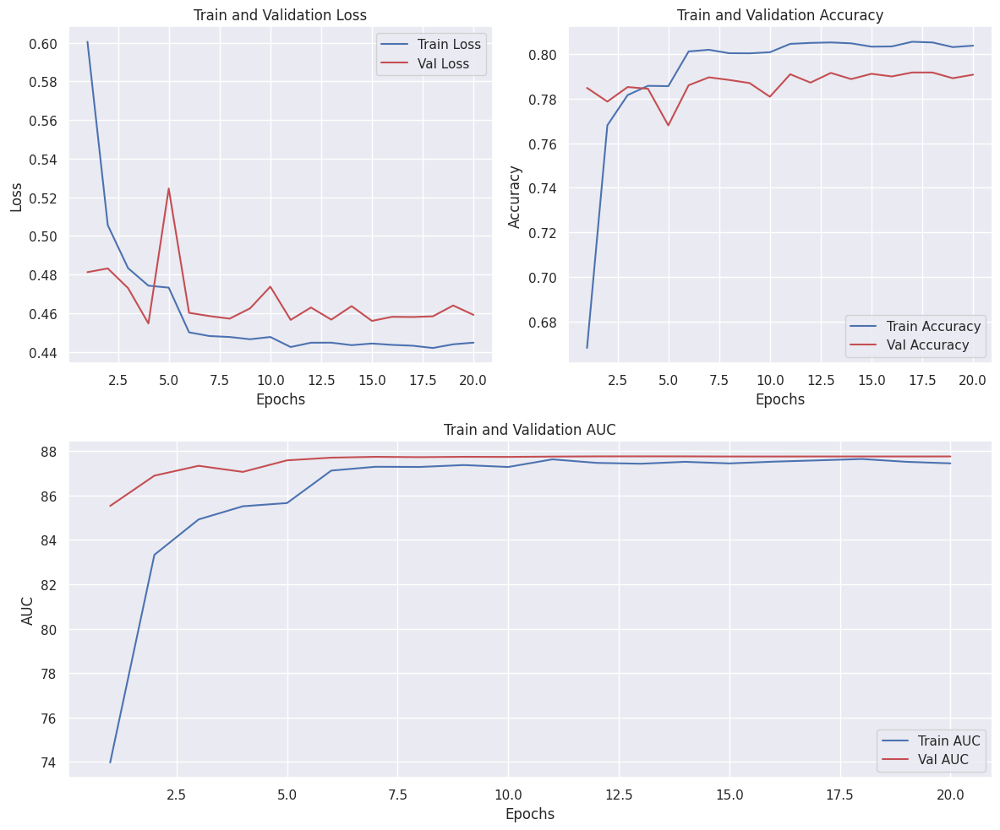

In [13]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [14]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "X",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "Y",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:01<05:55,  1.14s/batch]

Epoch   1/20:   1%|          | 2/313 [00:02<05:48,  1.12s/batch]

Epoch   1/20:   1%|          | 3/313 [00:03<05:45,  1.11s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:04<06:27,  1.25s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:05<06:09,  1.20s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:07<05:59,  1.17s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:08<05:52,  1.15s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:09<05:47,  1.14s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:10<05:44,  1.13s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:12<05:39,  1.12s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:13<05:38,  1.12s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:14<05:36,  1.12s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:15<05:35,  1.12s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:17<05:33,  1.12s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:18<05:32,  1.12s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:20<05:57,  1.21s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:21<05:48,  1.18s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:22<05:41,  1.16s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:24<05:36,  1.15s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:25<05:32,  1.14s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:26<05:29,  1.14s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:27<05:26,  1.13s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:28<05:24,  1.13s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:29<05:22,  1.12s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:30<05:20,  1.12s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:32<05:59,  1.26s/batch]

Epoch   1/20:   9%|▉         | 29/313 [00:33<05:49,  1.23s/batch]

Epoch   1/20:  10%|▉         | 30/313 [00:34<05:38,  1.20s/batch]

Epoch   1/20:  10%|▉         | 31/313 [00:35<05:30,  1.17s/batch]

Epoch   1/20:  10%|█         | 32/313 [00:36<05:24,  1.16s/batch]

Epoch   1/20:  11%|█         | 33/313 [00:38<05:20,  1.14s/batch]

Epoch   1/20:  11%|█         | 34/313 [00:39<05:17,  1.14s/batch]

Epoch   1/20:  11%|█         | 35/313 [00:40<05:14,  1.13s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [00:41<05:12,  1.13s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [00:42<05:10,  1.13s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [00:43<05:08,  1.12s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [00:44<05:07,  1.12s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [00:45<05:06,  1.12s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [00:46<05:04,  1.12s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [00:49<05:01,  1.12s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [00:50<05:00,  1.12s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [00:51<04:59,  1.12s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [00:52<04:58,  1.12s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [00:53<04:57,  1.12s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [00:54<04:56,  1.12s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [00:55<04:54,  1.12s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [00:57<04:54,  1.12s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [00:58<04:53,  1.12s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [00:59<04:51,  1.12s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:00<04:50,  1.12s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:01<04:49,  1.12s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:03<05:24,  1.26s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:04<05:25,  1.27s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [01:05<05:21,  1.26s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [01:06<05:10,  1.22s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [01:07<05:01,  1.19s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [01:08<04:55,  1.17s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [01:10<05:02,  1.20s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [01:11<04:55,  1.18s/batch]

Epoch   1/20:  20%|██        | 63/313 [01:12<04:49,  1.16s/batch]

Epoch   1/20:  20%|██        | 64/313 [01:13<04:46,  1.15s/batch]

Epoch   1/20:  21%|██        | 65/313 [01:14<04:58,  1.20s/batch]

Epoch   1/20:  21%|██        | 66/313 [01:16<04:51,  1.18s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [01:17<04:46,  1.17s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [01:18<04:42,  1.15s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [01:19<04:39,  1.15s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [01:20<04:37,  1.14s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [01:21<04:34,  1.13s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [01:23<04:43,  1.18s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [01:24<04:44,  1.19s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [01:25<04:38,  1.17s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [01:26<04:34,  1.15s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [01:27<04:30,  1.14s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [01:28<04:27,  1.14s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [01:29<04:25,  1.13s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [01:30<04:24,  1.13s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [01:32<04:26,  1.15s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [01:33<04:23,  1.14s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [01:34<04:53,  1.27s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [01:35<04:42,  1.23s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [01:37<04:33,  1.19s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [01:38<04:26,  1.17s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [01:39<04:21,  1.15s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [01:40<04:20,  1.15s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [01:41<04:17,  1.14s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [01:42<04:14,  1.14s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [01:43<04:12,  1.13s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [01:45<04:26,  1.20s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [01:46<04:19,  1.18s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [01:47<04:15,  1.16s/batch]

Epoch   1/20:  30%|███       | 94/313 [01:48<04:15,  1.16s/batch]

Epoch   1/20:  30%|███       | 95/313 [01:50<04:40,  1.29s/batch]

Epoch   1/20:  31%|███       | 96/313 [01:51<04:42,  1.30s/batch]

Epoch   1/20:  31%|███       | 97/313 [01:52<04:28,  1.25s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [01:53<04:20,  1.21s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [01:54<04:13,  1.18s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [01:55<04:08,  1.16s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [01:57<04:03,  1.15s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [01:58<04:00,  1.14s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [01:59<03:58,  1.13s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [02:00<03:56,  1.13s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [02:01<03:54,  1.13s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [02:02<04:07,  1.20s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [02:04<04:01,  1.17s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [02:05<04:25,  1.30s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [02:07<04:41,  1.38s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [02:08<04:24,  1.30s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [02:09<04:12,  1.25s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [02:10<04:03,  1.21s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [02:11<03:57,  1.19s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [02:12<03:51,  1.17s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [02:13<03:48,  1.15s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [02:15<03:45,  1.15s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [02:16<03:42,  1.14s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [02:17<04:08,  1.27s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [02:19<04:12,  1.30s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [02:20<04:00,  1.25s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [02:21<04:09,  1.30s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [02:22<04:05,  1.28s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [02:24<03:54,  1.24s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [02:25<03:47,  1.20s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [02:26<03:41,  1.18s/batch]

Epoch   1/20:  40%|████      | 126/313 [02:27<03:36,  1.16s/batch]

Epoch   1/20:  41%|████      | 127/313 [02:28<03:33,  1.15s/batch]

Epoch   1/20:  41%|████      | 128/313 [02:29<03:31,  1.14s/batch]

Epoch   1/20:  41%|████      | 129/313 [02:30<03:28,  1.14s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [02:31<03:27,  1.13s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [02:33<03:25,  1.13s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [02:34<03:24,  1.13s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [02:35<03:22,  1.13s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [02:36<03:46,  1.27s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [02:38<03:58,  1.34s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [02:39<03:45,  1.27s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [02:40<03:35,  1.23s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [02:41<03:28,  1.19s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [02:42<03:23,  1.17s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [02:44<03:20,  1.16s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [02:45<03:28,  1.21s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [02:46<03:22,  1.18s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [02:47<03:17,  1.16s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [02:48<03:14,  1.15s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [02:49<03:11,  1.14s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [02:50<03:09,  1.13s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [02:52<03:07,  1.13s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [02:53<03:06,  1.13s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [02:54<03:04,  1.13s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [02:55<03:02,  1.12s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [02:56<03:01,  1.12s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [02:57<03:00,  1.12s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [02:58<02:59,  1.12s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [02:59<02:59,  1.13s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [03:01<02:58,  1.13s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [03:02<03:01,  1.16s/batch]

Epoch   1/20:  50%|█████     | 157/313 [03:03<03:09,  1.21s/batch]

Epoch   1/20:  50%|█████     | 158/313 [03:05<03:25,  1.33s/batch]

Epoch   1/20:  51%|█████     | 159/313 [03:06<03:22,  1.31s/batch]

Epoch   1/20:  51%|█████     | 160/313 [03:08<03:33,  1.39s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [03:09<03:35,  1.42s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [03:10<03:20,  1.33s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [03:11<03:09,  1.26s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [03:12<03:01,  1.22s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [03:14<02:56,  1.19s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [03:15<02:51,  1.17s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [03:16<02:48,  1.15s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [03:17<02:45,  1.14s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [03:18<02:43,  1.14s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [03:19<02:41,  1.13s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [03:20<02:40,  1.13s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [03:21<02:38,  1.13s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [03:22<02:37,  1.12s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [03:24<02:38,  1.14s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [03:25<02:55,  1.27s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [03:27<03:06,  1.36s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [03:28<03:14,  1.43s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [03:30<03:19,  1.48s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [03:31<03:04,  1.37s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [03:32<02:52,  1.30s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [03:33<02:44,  1.25s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [03:34<02:38,  1.21s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [03:36<02:33,  1.18s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [03:37<02:30,  1.16s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [03:38<02:45,  1.29s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [03:40<02:55,  1.38s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [03:41<03:01,  1.44s/batch]

Epoch   1/20:  60%|██████    | 188/313 [03:43<03:05,  1.48s/batch]

Epoch   1/20:  60%|██████    | 189/313 [03:44<03:00,  1.45s/batch]

Epoch   1/20:  61%|██████    | 190/313 [03:46<02:54,  1.42s/batch]

Epoch   1/20:  61%|██████    | 191/313 [03:47<02:42,  1.33s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [03:48<02:33,  1.27s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [03:49<02:27,  1.23s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [03:50<02:22,  1.20s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [03:51<02:19,  1.18s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [03:53<02:16,  1.16s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [03:54<02:29,  1.29s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [03:56<02:38,  1.38s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [03:57<02:43,  1.44s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [03:59<02:46,  1.48s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [04:00<02:33,  1.37s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [04:01<02:23,  1.29s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [04:02<02:16,  1.24s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [04:03<02:10,  1.20s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [04:04<02:06,  1.18s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [04:06<02:03,  1.16s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [04:07<02:01,  1.14s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [04:08<01:59,  1.14s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [04:09<02:12,  1.27s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [04:11<02:06,  1.23s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [04:12<02:01,  1.19s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [04:13<01:58,  1.17s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [04:14<01:55,  1.15s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [04:15<01:53,  1.14s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [04:16<01:51,  1.14s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [04:17<01:49,  1.13s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [04:18<01:48,  1.13s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [04:20<01:51,  1.17s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [04:21<01:48,  1.15s/batch]

Epoch   1/20:  70%|███████   | 220/313 [04:22<01:46,  1.14s/batch]

Epoch   1/20:  71%|███████   | 221/313 [04:23<01:53,  1.23s/batch]

Epoch   1/20:  71%|███████   | 222/313 [04:24<01:49,  1.20s/batch]

Epoch   1/20:  71%|███████   | 223/313 [04:26<01:45,  1.18s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [04:27<01:43,  1.16s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [04:28<01:41,  1.15s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [04:29<01:39,  1.14s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [04:30<01:37,  1.14s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [04:31<01:36,  1.13s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [04:32<01:34,  1.13s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [04:34<01:39,  1.20s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [04:35<01:36,  1.18s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [04:36<01:34,  1.16s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [04:37<01:32,  1.15s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [04:38<01:30,  1.14s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [04:39<01:28,  1.14s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [04:41<01:38,  1.27s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [04:42<01:36,  1.26s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [04:43<01:31,  1.22s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [04:44<01:28,  1.19s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [04:45<01:25,  1.17s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [04:47<01:23,  1.16s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [04:48<01:21,  1.15s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [04:49<01:19,  1.14s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [04:50<01:18,  1.13s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [04:51<01:16,  1.13s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [04:52<01:15,  1.13s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [04:53<01:14,  1.13s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [04:54<01:13,  1.13s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [04:56<01:11,  1.12s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [04:57<01:10,  1.12s/batch]

Epoch   1/20:  80%|████████  | 251/313 [04:58<01:09,  1.12s/batch]

Epoch   1/20:  81%|████████  | 252/313 [04:59<01:08,  1.12s/batch]

Epoch   1/20:  81%|████████  | 253/313 [05:00<01:07,  1.12s/batch]

Epoch   1/20:  81%|████████  | 254/313 [05:01<01:06,  1.12s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [05:02<01:04,  1.12s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [05:03<01:03,  1.12s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [05:05<01:02,  1.12s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [05:06<01:01,  1.12s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [05:07<01:00,  1.12s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [05:08<00:59,  1.12s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [05:09<00:58,  1.12s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [05:10<00:57,  1.12s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [05:12<01:03,  1.26s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [05:13<01:06,  1.36s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [05:15<01:07,  1.41s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [05:16<01:08,  1.46s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [05:18<01:06,  1.44s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [05:19<01:00,  1.34s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [05:20<00:56,  1.27s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [05:21<00:52,  1.23s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [05:22<00:50,  1.20s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [05:23<00:48,  1.17s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [05:25<00:46,  1.16s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [05:26<00:44,  1.15s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [05:27<00:43,  1.14s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [05:28<00:41,  1.13s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [05:29<00:40,  1.13s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [05:30<00:39,  1.13s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [05:31<00:38,  1.12s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [05:32<00:37,  1.13s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [05:34<00:35,  1.12s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [05:35<00:34,  1.12s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [05:36<00:33,  1.12s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [05:37<00:32,  1.12s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [05:38<00:31,  1.12s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [05:39<00:30,  1.12s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [05:40<00:29,  1.12s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [05:41<00:28,  1.12s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [05:43<00:27,  1.14s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [05:44<00:26,  1.13s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [05:45<00:25,  1.17s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [05:46<00:24,  1.16s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [05:47<00:22,  1.14s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [05:48<00:21,  1.14s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [05:49<00:20,  1.13s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [05:51<00:20,  1.19s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [05:52<00:18,  1.17s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [05:53<00:17,  1.16s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [05:54<00:15,  1.14s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [05:55<00:14,  1.14s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [05:56<00:13,  1.13s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [05:57<00:12,  1.13s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [05:59<00:11,  1.12s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [06:00<00:10,  1.12s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [06:01<00:08,  1.12s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [06:02<00:07,  1.12s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [06:03<00:06,  1.12s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [06:04<00:05,  1.12s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [06:05<00:04,  1.12s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [06:06<00:03,  1.12s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [06:08<00:02,  1.12s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [06:09<00:01,  1.12s/batch]

Epoch   1/20: 100%|██████████| 313/313 [06:09<00:00,  1.01batch/s]

Epoch   1/20: 100%|██████████| 313/313 [06:09<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [06:45<00:00,  1.01batch/s, Epoch = 6m 45s, Loss = 0.5969|0.4869, Acc = 0.676|0.777, AUC = 74.375|85.447]

Epoch   1/20: 100%|██████████| 313/313 [06:45<00:00,  1.30s/batch, Epoch = 6m 45s, Loss = 0.5969|0.4869, Acc = 0.676|0.777, AUC = 74.375|85.447]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:01<08:08,  1.57s/batch]

Epoch   2/20:   1%|          | 2/313 [00:02<07:16,  1.40s/batch]

Epoch   2/20:   1%|          | 3/313 [00:03<06:34,  1.27s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:05<06:17,  1.22s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:06<06:04,  1.18s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:07<05:57,  1.17s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:08<05:53,  1.15s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:09<05:49,  1.15s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:10<05:46,  1.14s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:11<05:45,  1.14s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:13<05:43,  1.14s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:14<05:41,  1.13s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:15<05:38,  1.13s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:16<05:50,  1.17s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:17<05:44,  1.16s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:18<05:39,  1.14s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:19<05:36,  1.14s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:21<05:33,  1.13s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:22<05:31,  1.13s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:23<05:29,  1.12s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:24<05:27,  1.12s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:25<05:25,  1.12s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:26<05:24,  1.12s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:27<05:23,  1.12s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:28<05:21,  1.12s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:29<05:20,  1.12s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:31<05:19,  1.12s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:32<05:58,  1.26s/batch]

Epoch   2/20:   9%|▉         | 29/313 [00:33<05:45,  1.22s/batch]

Epoch   2/20:  10%|▉         | 30/313 [00:34<05:36,  1.19s/batch]

Epoch   2/20:  10%|▉         | 31/313 [00:35<05:28,  1.17s/batch]

Epoch   2/20:  10%|█         | 32/313 [00:37<05:23,  1.15s/batch]

Epoch   2/20:  11%|█         | 33/313 [00:38<05:42,  1.22s/batch]

Epoch   2/20:  11%|█         | 34/313 [00:39<05:33,  1.19s/batch]

Epoch   2/20:  11%|█         | 35/313 [00:40<05:26,  1.17s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [00:41<05:21,  1.16s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [00:43<05:18,  1.15s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [00:44<05:25,  1.19s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [00:45<05:19,  1.17s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [00:46<05:14,  1.15s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [00:47<05:11,  1.14s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [00:48<05:08,  1.14s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [00:49<05:06,  1.13s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [00:51<05:04,  1.13s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [00:52<05:13,  1.17s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [00:53<05:18,  1.19s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [00:54<05:11,  1.17s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [00:55<05:06,  1.16s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [00:56<05:02,  1.15s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [00:58<04:59,  1.14s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [00:59<04:56,  1.13s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:00<05:09,  1.19s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:01<05:12,  1.20s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:02<05:05,  1.18s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:04<05:36,  1.30s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:05<05:41,  1.33s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [01:06<05:25,  1.27s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [01:08<05:13,  1.23s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [01:09<05:05,  1.20s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [01:10<04:58,  1.18s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [01:11<04:53,  1.17s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [01:12<04:49,  1.16s/batch]

Epoch   2/20:  20%|██        | 63/313 [01:13<04:47,  1.15s/batch]

Epoch   2/20:  20%|██        | 64/313 [01:14<04:44,  1.14s/batch]

Epoch   2/20:  21%|██        | 65/313 [01:15<04:42,  1.14s/batch]

Epoch   2/20:  21%|██        | 66/313 [01:17<04:40,  1.14s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [01:18<04:39,  1.14s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [01:19<04:37,  1.13s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [01:20<04:36,  1.13s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [01:21<04:53,  1.21s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [01:23<04:45,  1.18s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [01:24<04:40,  1.16s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [01:25<04:36,  1.15s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [01:26<04:33,  1.14s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [01:27<04:30,  1.14s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [01:28<04:27,  1.13s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [01:29<04:25,  1.13s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [01:31<04:22,  1.12s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [01:33<04:20,  1.12s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [01:34<04:19,  1.12s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [01:35<04:51,  1.26s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [01:37<05:03,  1.32s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [01:38<04:48,  1.26s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [01:39<04:37,  1.22s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [01:40<04:29,  1.19s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [01:41<04:23,  1.16s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [01:42<04:18,  1.15s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [01:43<04:15,  1.14s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [01:45<04:12,  1.13s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [01:46<04:10,  1.13s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [01:47<04:08,  1.13s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [01:48<04:07,  1.12s/batch]

Epoch   2/20:  30%|███       | 94/313 [01:49<04:05,  1.12s/batch]

Epoch   2/20:  30%|███       | 95/313 [01:51<04:34,  1.26s/batch]

Epoch   2/20:  31%|███       | 96/313 [01:52<04:38,  1.28s/batch]

Epoch   2/20:  31%|███       | 97/313 [01:53<04:26,  1.23s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [01:54<04:17,  1.20s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [01:55<04:11,  1.17s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [01:56<04:06,  1.16s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [01:58<04:03,  1.15s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [01:59<03:59,  1.14s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [02:00<03:57,  1.13s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [02:01<03:55,  1.13s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [02:02<03:53,  1.12s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [02:03<03:51,  1.12s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [02:04<03:50,  1.12s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [02:05<03:49,  1.12s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [02:07<04:17,  1.26s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [02:08<04:20,  1.28s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [02:09<04:08,  1.23s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [02:11<04:00,  1.20s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [02:12<03:54,  1.17s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [02:13<03:50,  1.16s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [02:14<03:46,  1.15s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [02:15<03:44,  1.14s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [02:16<03:42,  1.13s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [02:17<03:39,  1.13s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [02:18<03:38,  1.12s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [02:19<03:36,  1.12s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [02:21<03:35,  1.12s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [02:22<03:33,  1.12s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [02:23<03:45,  1.19s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [02:24<03:40,  1.17s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [02:25<03:36,  1.15s/batch]

Epoch   2/20:  40%|████      | 126/313 [02:26<03:33,  1.14s/batch]

Epoch   2/20:  41%|████      | 127/313 [02:28<03:31,  1.13s/batch]

Epoch   2/20:  41%|████      | 128/313 [02:29<03:29,  1.13s/batch]

Epoch   2/20:  41%|████      | 129/313 [02:30<03:27,  1.13s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [02:31<03:25,  1.12s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [02:32<03:24,  1.12s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [02:33<03:23,  1.12s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [02:34<03:21,  1.12s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [02:35<03:20,  1.12s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [02:36<03:19,  1.12s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [02:38<03:43,  1.26s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [02:40<03:54,  1.33s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [02:41<03:42,  1.27s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [02:42<03:33,  1.23s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [02:43<03:27,  1.20s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [02:44<03:22,  1.18s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [02:45<03:19,  1.16s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [02:46<03:21,  1.19s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [02:48<03:25,  1.22s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [02:49<03:19,  1.19s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [02:50<03:14,  1.17s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [02:51<03:11,  1.15s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [02:52<03:08,  1.14s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [02:53<03:05,  1.13s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [02:54<03:03,  1.13s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [02:56<03:12,  1.19s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [02:57<03:14,  1.21s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [02:58<03:20,  1.25s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [03:00<03:15,  1.23s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [03:01<03:08,  1.19s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [03:02<03:03,  1.17s/batch]

Epoch   2/20:  50%|█████     | 157/313 [03:03<03:00,  1.16s/batch]

Epoch   2/20:  50%|█████     | 158/313 [03:04<02:57,  1.14s/batch]

Epoch   2/20:  51%|█████     | 159/313 [03:05<02:55,  1.14s/batch]

Epoch   2/20:  51%|█████     | 160/313 [03:06<02:53,  1.13s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [03:07<02:51,  1.13s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [03:09<03:11,  1.27s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [03:10<03:09,  1.26s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [03:11<03:01,  1.22s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [03:12<02:56,  1.19s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [03:14<02:51,  1.17s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [03:15<02:48,  1.15s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [03:16<02:45,  1.14s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [03:17<02:43,  1.13s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [03:18<02:41,  1.13s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [03:20<02:59,  1.27s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [03:21<03:02,  1.29s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [03:22<02:53,  1.24s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [03:23<02:47,  1.20s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [03:24<02:42,  1.18s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [03:25<02:38,  1.16s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [03:27<02:35,  1.15s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [03:28<02:33,  1.14s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [03:29<02:31,  1.13s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [03:30<02:29,  1.13s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [03:31<02:28,  1.12s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [03:32<02:26,  1.12s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [03:33<02:25,  1.12s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [03:34<02:24,  1.12s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [03:36<02:23,  1.12s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [03:37<02:33,  1.21s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [03:38<02:35,  1.24s/batch]

Epoch   2/20:  60%|██████    | 188/313 [03:40<02:47,  1.34s/batch]

Epoch   2/20:  60%|██████    | 189/313 [03:41<02:55,  1.41s/batch]

Epoch   2/20:  61%|██████    | 190/313 [03:43<02:47,  1.36s/batch]

Epoch   2/20:  61%|██████    | 191/313 [03:44<02:37,  1.29s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [03:45<02:29,  1.24s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [03:46<02:24,  1.20s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [03:47<02:20,  1.18s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [03:48<02:16,  1.16s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [03:50<02:24,  1.24s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [03:51<02:19,  1.20s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [03:52<02:15,  1.18s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [03:53<02:12,  1.16s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [03:54<02:09,  1.15s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [03:55<02:07,  1.14s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [03:56<02:06,  1.14s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [03:57<02:04,  1.13s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [03:59<02:03,  1.13s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [04:00<02:01,  1.13s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [04:01<02:00,  1.12s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [04:02<01:59,  1.12s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [04:03<01:57,  1.12s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [04:04<01:56,  1.12s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [04:05<01:55,  1.12s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [04:06<01:54,  1.12s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [04:08<01:53,  1.12s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [04:09<01:51,  1.12s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [04:10<01:51,  1.13s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [04:11<02:04,  1.27s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [04:13<02:06,  1.30s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [04:14<02:00,  1.25s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [04:15<02:01,  1.27s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [04:16<01:55,  1.23s/batch]

Epoch   2/20:  70%|███████   | 220/313 [04:18<01:51,  1.20s/batch]

Epoch   2/20:  71%|███████   | 221/313 [04:19<01:47,  1.17s/batch]

Epoch   2/20:  71%|███████   | 222/313 [04:20<01:45,  1.16s/batch]

Epoch   2/20:  71%|███████   | 223/313 [04:21<01:46,  1.18s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [04:22<01:43,  1.16s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [04:23<01:41,  1.15s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [04:24<01:39,  1.14s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [04:25<01:37,  1.13s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [04:27<01:36,  1.13s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [04:28<01:34,  1.13s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [04:29<01:33,  1.13s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [04:30<01:32,  1.12s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [04:31<01:30,  1.12s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [04:32<01:29,  1.12s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [04:33<01:28,  1.12s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [04:34<01:27,  1.12s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [04:36<01:26,  1.12s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [04:37<01:25,  1.12s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [04:38<01:23,  1.12s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [04:39<01:22,  1.12s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [04:40<01:21,  1.12s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [04:41<01:20,  1.12s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [04:43<01:29,  1.26s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [04:44<01:31,  1.31s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [04:45<01:29,  1.29s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [04:47<01:24,  1.24s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [04:48<01:21,  1.21s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [04:49<01:18,  1.18s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [04:50<01:15,  1.16s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [04:51<01:13,  1.15s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [04:52<01:11,  1.14s/batch]

Epoch   2/20:  80%|████████  | 251/313 [04:53<01:10,  1.13s/batch]

Epoch   2/20:  81%|████████  | 252/313 [04:54<01:08,  1.13s/batch]

Epoch   2/20:  81%|████████  | 253/313 [04:56<01:07,  1.13s/batch]

Epoch   2/20:  81%|████████  | 254/313 [04:57<01:06,  1.12s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [04:58<01:05,  1.12s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [04:59<01:03,  1.12s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [05:00<01:02,  1.12s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [05:01<01:01,  1.12s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [05:02<01:00,  1.12s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [05:03<00:59,  1.12s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [05:04<00:58,  1.12s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [05:06<01:00,  1.19s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [05:07<01:00,  1.21s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [05:08<00:59,  1.22s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [05:09<00:57,  1.20s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [05:11<00:55,  1.18s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [05:12<00:53,  1.16s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [05:13<00:51,  1.16s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [05:14<00:56,  1.29s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [05:16<00:59,  1.38s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [05:17<00:55,  1.31s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [05:18<00:51,  1.26s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [05:19<00:48,  1.21s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [05:21<00:46,  1.19s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [05:22<00:44,  1.17s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [05:23<00:42,  1.15s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [05:24<00:41,  1.14s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [05:25<00:39,  1.13s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [05:26<00:38,  1.13s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [05:28<00:41,  1.27s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [05:29<00:43,  1.36s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [05:31<00:44,  1.43s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [05:32<00:41,  1.37s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [05:33<00:37,  1.30s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [05:34<00:34,  1.25s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [05:36<00:32,  1.21s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [05:37<00:30,  1.19s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [05:38<00:32,  1.30s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [05:40<00:33,  1.39s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [05:41<00:30,  1.31s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [05:42<00:27,  1.25s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [05:43<00:25,  1.21s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [05:44<00:23,  1.19s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [05:46<00:24,  1.31s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [05:47<00:22,  1.27s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [05:48<00:20,  1.22s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [05:49<00:19,  1.19s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [05:51<00:18,  1.21s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [05:52<00:16,  1.19s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [05:53<00:15,  1.17s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [05:54<00:13,  1.16s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [05:55<00:12,  1.15s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [05:56<00:11,  1.14s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [05:57<00:10,  1.14s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [05:58<00:09,  1.13s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [06:00<00:07,  1.13s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [06:01<00:06,  1.13s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [06:02<00:05,  1.13s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [06:03<00:04,  1.13s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [06:04<00:03,  1.13s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [06:05<00:02,  1.13s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [06:06<00:01,  1.13s/batch]

Epoch   2/20: 100%|██████████| 313/313 [06:07<00:00,  1.00batch/s]

Epoch   2/20: 100%|██████████| 313/313 [06:07<00:00,  1.00batch/s, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [06:43<00:00,  1.00batch/s, Epoch = 6m 43s, Loss = 0.5027|0.4731, Acc = 0.767|0.785, AUC = 83.502|86.881]

Epoch   2/20: 100%|██████████| 313/313 [06:43<00:00,  1.29s/batch, Epoch = 6m 43s, Loss = 0.5027|0.4731, Acc = 0.767|0.785, AUC = 83.502|86.881]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch   3/20:   1%|          | 2/313 [00:02<06:54,  1.33s/batch]

Epoch   3/20:   1%|          | 3/313 [00:03<06:22,  1.23s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:04<06:07,  1.19s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:06<06:05,  1.19s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:07<05:57,  1.16s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:08<05:51,  1.15s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:09<05:47,  1.14s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:10<05:58,  1.18s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:11<05:52,  1.16s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:13<05:46,  1.15s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:14<05:51,  1.17s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:15<05:45,  1.15s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:16<05:41,  1.14s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:17<05:39,  1.14s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:18<05:46,  1.17s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:20<05:45,  1.17s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:21<06:05,  1.24s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:22<05:53,  1.20s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:23<05:44,  1.17s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:25<06:11,  1.27s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:26<05:57,  1.23s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:27<05:45,  1.19s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:28<05:37,  1.17s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:29<05:33,  1.16s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:30<05:29,  1.15s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:32<06:07,  1.28s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:33<06:06,  1.29s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:34<05:51,  1.24s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:35<05:39,  1.20s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:36<05:31,  1.17s/batch]

Epoch   3/20:  10%|█         | 32/313 [00:38<05:25,  1.16s/batch]

Epoch   3/20:  11%|█         | 33/313 [00:39<05:27,  1.17s/batch]

Epoch   3/20:  11%|█         | 34/313 [00:40<05:22,  1.15s/batch]

Epoch   3/20:  11%|█         | 35/313 [00:41<05:17,  1.14s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [00:42<05:14,  1.13s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [00:43<05:11,  1.13s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [00:44<05:09,  1.12s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [00:45<05:07,  1.12s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [00:47<05:05,  1.12s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [00:48<05:04,  1.12s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [00:49<05:02,  1.12s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [00:50<05:02,  1.12s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [00:51<05:00,  1.12s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [00:52<05:05,  1.14s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [00:53<05:02,  1.13s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [00:54<04:59,  1.13s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [00:56<04:57,  1.12s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [00:57<04:55,  1.12s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [00:58<04:54,  1.12s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [00:59<04:52,  1.12s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:00<04:51,  1.12s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:01<04:50,  1.12s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:03<05:26,  1.26s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:04<05:19,  1.24s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:05<05:09,  1.20s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:06<05:01,  1.18s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:07<04:55,  1.16s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:08<04:50,  1.15s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [01:10<04:47,  1.14s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:11<04:45,  1.13s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:12<04:42,  1.13s/batch]

Epoch   3/20:  20%|██        | 63/313 [01:13<04:40,  1.12s/batch]

Epoch   3/20:  20%|██        | 64/313 [01:14<04:39,  1.12s/batch]

Epoch   3/20:  21%|██        | 65/313 [01:15<04:37,  1.12s/batch]

Epoch   3/20:  21%|██        | 66/313 [01:16<04:35,  1.12s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [01:17<04:34,  1.12s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [01:18<04:33,  1.12s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [01:20<04:32,  1.12s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [01:21<04:30,  1.12s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [01:22<04:29,  1.12s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [01:23<04:29,  1.12s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [01:24<04:28,  1.12s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [01:25<04:27,  1.12s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [01:26<04:26,  1.12s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [01:27<04:24,  1.12s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [01:29<04:26,  1.13s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [01:30<04:24,  1.13s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [01:31<04:22,  1.12s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [01:32<04:20,  1.12s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [01:34<04:52,  1.26s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [01:35<04:51,  1.26s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [01:36<04:39,  1.22s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [01:37<04:31,  1.19s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [01:38<04:25,  1.16s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [01:39<04:20,  1.15s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [01:40<04:17,  1.14s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [01:41<04:14,  1.13s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [01:43<04:12,  1.13s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [01:44<04:10,  1.12s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [01:45<04:08,  1.12s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [01:46<04:07,  1.12s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [01:47<04:05,  1.12s/batch]

Epoch   3/20:  30%|███       | 94/313 [01:49<04:30,  1.23s/batch]

Epoch   3/20:  30%|███       | 95/313 [01:50<04:21,  1.20s/batch]

Epoch   3/20:  31%|███       | 96/313 [01:51<04:14,  1.17s/batch]

Epoch   3/20:  31%|███       | 97/313 [01:52<04:09,  1.16s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [01:53<04:06,  1.15s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [01:54<04:03,  1.14s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [01:55<04:00,  1.13s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [01:56<03:58,  1.13s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [01:57<03:57,  1.13s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [01:59<03:55,  1.12s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [02:00<03:54,  1.12s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [02:01<03:53,  1.12s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [02:02<03:55,  1.14s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [02:03<03:53,  1.13s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [02:05<04:20,  1.27s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [02:06<04:13,  1.24s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [02:07<04:04,  1.21s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [02:08<03:58,  1.18s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [02:09<03:53,  1.16s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [02:10<03:50,  1.15s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [02:12<03:47,  1.14s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [02:13<03:46,  1.15s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [02:14<03:44,  1.14s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [02:15<03:42,  1.13s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [02:16<03:40,  1.13s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [02:17<03:38,  1.13s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [02:19<03:35,  1.12s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [02:20<03:33,  1.12s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [02:22<03:32,  1.12s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [02:23<03:31,  1.12s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [02:24<03:30,  1.12s/batch]

Epoch   3/20:  40%|████      | 126/313 [02:25<03:29,  1.12s/batch]

Epoch   3/20:  41%|████      | 127/313 [02:26<03:28,  1.12s/batch]

Epoch   3/20:  41%|████      | 128/313 [02:27<03:27,  1.12s/batch]

Epoch   3/20:  41%|████      | 129/313 [02:28<03:26,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [02:29<03:24,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [02:31<03:23,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [02:32<03:22,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [02:33<03:20,  1.12s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [02:34<03:19,  1.11s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [02:35<03:43,  1.26s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [02:37<04:00,  1.36s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [02:39<04:11,  1.43s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [02:40<04:18,  1.48s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [02:42<04:09,  1.44s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [02:43<03:51,  1.34s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [02:44<03:39,  1.27s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [02:45<03:29,  1.23s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [02:46<03:22,  1.19s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [02:47<03:17,  1.17s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [02:48<03:13,  1.15s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [02:49<03:10,  1.14s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [02:51<03:08,  1.14s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [02:52<03:06,  1.13s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [02:53<03:06,  1.14s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [02:54<03:04,  1.13s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [02:55<03:02,  1.13s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [02:56<03:00,  1.12s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [02:57<02:59,  1.12s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [02:58<02:57,  1.12s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [03:00<02:59,  1.14s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [03:01<02:57,  1.13s/batch]

Epoch   3/20:  50%|█████     | 157/313 [03:02<02:55,  1.13s/batch]

Epoch   3/20:  50%|█████     | 158/313 [03:03<02:53,  1.12s/batch]

Epoch   3/20:  51%|█████     | 159/313 [03:04<02:52,  1.12s/batch]

Epoch   3/20:  51%|█████     | 160/313 [03:05<03:05,  1.21s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [03:07<03:20,  1.32s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [03:09<03:31,  1.40s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [03:10<03:29,  1.39s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [03:11<03:15,  1.31s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [03:12<03:05,  1.25s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [03:13<02:57,  1.21s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [03:14<02:52,  1.18s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [03:16<02:48,  1.16s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [03:17<02:45,  1.15s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [03:18<02:42,  1.14s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [03:19<02:40,  1.13s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [03:20<02:38,  1.13s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [03:21<02:37,  1.12s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [03:22<02:35,  1.12s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [03:23<02:35,  1.12s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [03:25<02:33,  1.12s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [03:26<02:32,  1.12s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [03:27<02:30,  1.12s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [03:28<02:29,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [03:29<02:28,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [03:30<02:27,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [03:31<02:28,  1.13s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [03:32<02:26,  1.13s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [03:33<02:24,  1.12s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [03:35<02:23,  1.12s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [03:36<02:22,  1.12s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [03:37<02:20,  1.12s/batch]

Epoch   3/20:  60%|██████    | 188/313 [03:38<02:37,  1.26s/batch]

Epoch   3/20:  60%|██████    | 189/313 [03:40<02:31,  1.22s/batch]

Epoch   3/20:  61%|██████    | 190/313 [03:41<02:26,  1.19s/batch]

Epoch   3/20:  61%|██████    | 191/313 [03:42<02:22,  1.17s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [03:43<02:19,  1.15s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [03:44<02:16,  1.14s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [03:45<02:14,  1.13s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [03:46<02:13,  1.13s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [03:48<02:28,  1.27s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [03:49<02:32,  1.32s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [03:50<02:24,  1.26s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [03:51<02:18,  1.21s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [03:53<02:13,  1.19s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [03:54<02:10,  1.16s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [03:55<02:07,  1.15s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [03:56<02:05,  1.14s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [03:57<02:03,  1.13s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [03:58<02:01,  1.13s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [03:59<02:00,  1.12s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [04:01<02:08,  1.21s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [04:02<02:04,  1.18s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [04:03<02:15,  1.30s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [04:05<02:23,  1.39s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [04:07<02:28,  1.45s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [04:08<02:17,  1.36s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [04:09<02:22,  1.43s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [04:10<02:12,  1.33s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [04:12<02:18,  1.41s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [04:14<02:22,  1.46s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [04:15<02:10,  1.36s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [04:16<02:02,  1.29s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [04:17<01:56,  1.24s/batch]

Epoch   3/20:  70%|███████   | 220/313 [04:18<01:52,  1.21s/batch]

Epoch   3/20:  71%|███████   | 221/313 [04:19<01:48,  1.18s/batch]

Epoch   3/20:  71%|███████   | 222/313 [04:20<01:45,  1.16s/batch]

Epoch   3/20:  71%|███████   | 223/313 [04:21<01:43,  1.15s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [04:23<01:41,  1.14s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [04:24<01:39,  1.13s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [04:25<01:38,  1.13s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [04:26<01:36,  1.13s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [04:27<01:35,  1.12s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [04:28<01:34,  1.12s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [04:29<01:33,  1.12s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [04:30<01:31,  1.12s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [04:32<01:30,  1.12s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [04:33<01:29,  1.12s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [04:34<01:36,  1.22s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [04:36<01:43,  1.33s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [04:37<01:42,  1.33s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [04:38<01:36,  1.26s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [04:39<01:31,  1.22s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [04:41<01:38,  1.33s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [04:42<01:42,  1.41s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [04:44<01:40,  1.40s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [04:45<01:33,  1.31s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [04:46<01:27,  1.26s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [04:47<01:23,  1.21s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [04:48<01:20,  1.18s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [04:49<01:18,  1.16s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [04:51<01:15,  1.15s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [04:52<01:14,  1.14s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [04:53<01:12,  1.13s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [04:54<01:11,  1.13s/batch]

Epoch   3/20:  80%|████████  | 251/313 [04:55<01:09,  1.13s/batch]

Epoch   3/20:  81%|████████  | 252/313 [04:57<01:17,  1.27s/batch]

Epoch   3/20:  81%|████████  | 253/313 [04:58<01:15,  1.26s/batch]

Epoch   3/20:  81%|████████  | 254/313 [04:59<01:11,  1.22s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [05:00<01:08,  1.19s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [05:01<01:06,  1.17s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [05:02<01:04,  1.15s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [05:03<01:02,  1.14s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [05:05<01:04,  1.19s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [05:06<01:02,  1.17s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [05:07<01:00,  1.15s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [05:08<00:58,  1.14s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [05:09<01:01,  1.22s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [05:11<01:04,  1.33s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [05:13<01:07,  1.41s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [05:14<01:08,  1.46s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [05:16<01:05,  1.42s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [05:17<01:00,  1.33s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [05:18<01:01,  1.41s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [05:20<01:02,  1.46s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [05:21<01:02,  1.50s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [05:23<01:02,  1.52s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [05:25<01:00,  1.52s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [05:26<00:54,  1.40s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [05:27<00:50,  1.32s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [05:28<00:51,  1.40s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [05:30<00:47,  1.33s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [05:31<00:44,  1.26s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [05:32<00:41,  1.22s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [05:33<00:39,  1.19s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [05:34<00:37,  1.17s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [05:35<00:35,  1.16s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [05:36<00:34,  1.15s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [05:37<00:33,  1.14s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [05:39<00:35,  1.27s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [05:41<00:36,  1.35s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [05:42<00:33,  1.28s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [05:43<00:30,  1.23s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [05:44<00:32,  1.34s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [05:46<00:30,  1.31s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [05:47<00:27,  1.25s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [05:48<00:25,  1.21s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [05:49<00:23,  1.19s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [05:50<00:22,  1.17s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [05:51<00:20,  1.15s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [05:52<00:19,  1.14s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [05:53<00:18,  1.14s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [05:55<00:16,  1.13s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [05:56<00:15,  1.13s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [05:57<00:15,  1.21s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [05:58<00:14,  1.22s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [05:59<00:13,  1.20s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [06:01<00:11,  1.18s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [06:02<00:10,  1.16s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [06:03<00:09,  1.15s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [06:04<00:07,  1.14s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [06:05<00:06,  1.13s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [06:06<00:05,  1.20s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [06:08<00:04,  1.18s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [06:09<00:03,  1.30s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [06:10<00:02,  1.27s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [06:11<00:01,  1.22s/batch]

Epoch   3/20: 100%|██████████| 313/313 [06:12<00:00,  1.06s/batch]

Epoch   3/20: 100%|██████████| 313/313 [06:12<00:00,  1.06s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [06:49<00:00,  1.06s/batch, Epoch = 6m 49s, Loss = 0.4898|0.4808, Acc = 0.777|0.778, AUC = 84.387|86.852]

Epoch   3/20: 100%|██████████| 313/313 [06:49<00:00,  1.31s/batch, Epoch = 6m 49s, Loss = 0.4898|0.4808, Acc = 0.777|0.778, AUC = 84.387|86.852]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:01<08:09,  1.57s/batch]

Epoch   4/20:   1%|          | 2/313 [00:03<07:56,  1.53s/batch]

Epoch   4/20:   1%|          | 3/313 [00:04<06:56,  1.34s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:05<06:27,  1.25s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:06<06:11,  1.21s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:07<06:01,  1.18s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:08<05:54,  1.16s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:09<05:49,  1.15s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:10<05:45,  1.14s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:12<05:43,  1.13s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:13<05:41,  1.13s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:14<05:39,  1.13s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:15<05:39,  1.13s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:16<05:39,  1.13s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:17<05:37,  1.13s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:18<05:36,  1.13s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:19<05:35,  1.13s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:21<05:34,  1.13s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:22<05:33,  1.13s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:23<05:32,  1.13s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:24<05:30,  1.13s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:25<05:30,  1.14s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:26<05:29,  1.14s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:27<05:28,  1.14s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:29<05:26,  1.13s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:30<05:25,  1.13s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:31<05:24,  1.14s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:32<06:02,  1.27s/batch]

Epoch   4/20:   9%|▉         | 29/313 [00:34<05:54,  1.25s/batch]

Epoch   4/20:  10%|▉         | 30/313 [00:35<06:00,  1.27s/batch]

Epoch   4/20:  10%|▉         | 31/313 [00:36<05:45,  1.23s/batch]

Epoch   4/20:  10%|█         | 32/313 [00:37<05:35,  1.19s/batch]

Epoch   4/20:  11%|█         | 33/313 [00:39<06:07,  1.31s/batch]

Epoch   4/20:  11%|█         | 34/313 [00:40<06:26,  1.38s/batch]

Epoch   4/20:  11%|█         | 35/313 [00:41<06:02,  1.30s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [00:43<05:46,  1.25s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [00:44<06:13,  1.35s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [00:45<06:02,  1.32s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [00:47<05:45,  1.26s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [00:48<05:32,  1.22s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [00:49<05:23,  1.19s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [00:50<05:16,  1.17s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [00:51<05:11,  1.15s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [00:52<05:08,  1.15s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [00:53<05:05,  1.14s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [00:54<05:02,  1.13s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [00:55<05:00,  1.13s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [00:57<04:58,  1.13s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [00:58<04:57,  1.13s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [00:59<04:55,  1.12s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:00<04:54,  1.12s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:01<04:52,  1.12s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:02<04:52,  1.12s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:04<05:53,  1.36s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:06<06:09,  1.43s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [01:07<06:19,  1.48s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [01:09<06:05,  1.43s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [01:10<05:46,  1.36s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [01:11<05:27,  1.29s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [01:12<05:13,  1.24s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [01:13<05:02,  1.20s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [01:14<04:57,  1.18s/batch]

Epoch   4/20:  20%|██        | 63/313 [01:15<04:50,  1.16s/batch]

Epoch   4/20:  20%|██        | 64/313 [01:17<04:46,  1.15s/batch]

Epoch   4/20:  21%|██        | 65/313 [01:18<04:43,  1.14s/batch]

Epoch   4/20:  21%|██        | 66/313 [01:19<05:14,  1.27s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [01:21<05:29,  1.34s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [01:22<05:12,  1.27s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [01:23<04:59,  1.23s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [01:24<04:50,  1.20s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [01:25<04:44,  1.18s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [01:26<04:39,  1.16s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [01:28<04:36,  1.15s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [01:29<04:33,  1.14s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [01:30<04:30,  1.14s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [01:31<04:28,  1.13s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [01:32<04:26,  1.13s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [01:33<04:25,  1.13s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [01:35<04:50,  1.24s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [01:36<04:41,  1.21s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [01:37<04:34,  1.18s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [01:38<04:28,  1.16s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [01:39<04:24,  1.15s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [01:40<04:21,  1.14s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [01:41<04:18,  1.13s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [01:42<04:16,  1.13s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [01:44<04:14,  1.13s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [01:45<04:13,  1.12s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [01:46<04:11,  1.12s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [01:47<04:10,  1.12s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [01:48<04:09,  1.12s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [01:49<04:07,  1.12s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [01:51<04:36,  1.26s/batch]

Epoch   4/20:  30%|███       | 94/313 [01:52<04:26,  1.22s/batch]

Epoch   4/20:  30%|███       | 95/313 [01:53<04:20,  1.19s/batch]

Epoch   4/20:  31%|███       | 96/313 [01:55<04:44,  1.31s/batch]

Epoch   4/20:  31%|███       | 97/313 [01:56<05:00,  1.39s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [01:58<05:11,  1.45s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [01:59<04:56,  1.39s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [02:00<04:38,  1.31s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [02:01<04:25,  1.25s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [02:02<04:15,  1.21s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [02:04<04:25,  1.26s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [02:05<04:15,  1.22s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [02:06<04:37,  1.33s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [02:08<04:34,  1.33s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [02:09<04:20,  1.26s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [02:10<04:10,  1.22s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [02:11<04:02,  1.19s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [02:12<03:57,  1.17s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [02:13<03:53,  1.16s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [02:15<03:50,  1.15s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [02:16<04:15,  1.28s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [02:18<04:21,  1.31s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [02:19<04:09,  1.26s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [02:20<03:59,  1.22s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [02:21<03:52,  1.19s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [02:22<03:47,  1.17s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [02:23<03:43,  1.15s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [02:24<03:40,  1.14s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [02:25<03:38,  1.14s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [02:26<03:36,  1.13s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [02:28<03:34,  1.13s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [02:29<03:33,  1.13s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [02:30<03:31,  1.13s/batch]

Epoch   4/20:  40%|████      | 126/313 [02:31<03:37,  1.16s/batch]

Epoch   4/20:  41%|████      | 127/313 [02:33<04:11,  1.35s/batch]

Epoch   4/20:  41%|████      | 128/313 [02:34<03:57,  1.28s/batch]

Epoch   4/20:  41%|████      | 129/313 [02:36<04:12,  1.37s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [02:37<04:23,  1.44s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [02:39<04:27,  1.47s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [02:40<04:07,  1.36s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [02:41<04:06,  1.37s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [02:42<03:51,  1.30s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [02:43<03:41,  1.24s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [02:45<03:33,  1.21s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [02:46<03:28,  1.18s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [02:47<03:23,  1.16s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [02:48<03:28,  1.20s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [02:49<03:23,  1.17s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [02:50<03:19,  1.16s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [02:51<03:16,  1.15s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [02:53<03:13,  1.14s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [02:54<03:11,  1.14s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [02:55<03:31,  1.26s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [02:56<03:23,  1.22s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [02:58<03:17,  1.19s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [02:59<03:12,  1.17s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [03:00<03:17,  1.21s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [03:02<03:34,  1.32s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [03:03<03:26,  1.28s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [03:04<03:18,  1.23s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [03:05<03:11,  1.20s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [03:06<03:06,  1.18s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [03:07<03:02,  1.16s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [03:09<03:22,  1.29s/batch]

Epoch   4/20:  50%|█████     | 157/313 [03:10<03:25,  1.32s/batch]

Epoch   4/20:  50%|█████     | 158/313 [03:11<03:15,  1.26s/batch]

Epoch   4/20:  51%|█████     | 159/313 [03:13<03:15,  1.27s/batch]

Epoch   4/20:  51%|█████     | 160/313 [03:14<03:07,  1.23s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [03:15<03:22,  1.33s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [03:17<03:24,  1.35s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [03:18<03:12,  1.28s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [03:19<03:03,  1.23s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [03:21<03:18,  1.34s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [03:22<03:13,  1.32s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [03:23<03:03,  1.26s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [03:24<02:56,  1.22s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [03:25<02:50,  1.19s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [03:26<02:46,  1.17s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [03:27<02:43,  1.15s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [03:28<02:41,  1.14s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [03:30<02:39,  1.14s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [03:31<02:37,  1.13s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [03:32<02:55,  1.27s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [03:34<02:52,  1.26s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [03:35<02:45,  1.22s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [03:36<02:40,  1.19s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [03:37<02:36,  1.17s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [03:38<02:33,  1.15s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [03:40<02:49,  1.29s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [03:41<03:00,  1.38s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [03:43<03:07,  1.44s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [03:44<02:57,  1.38s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [03:45<02:46,  1.30s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [03:47<02:49,  1.34s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [03:48<02:42,  1.29s/batch]

Epoch   4/20:  60%|██████    | 188/313 [03:49<02:34,  1.24s/batch]

Epoch   4/20:  60%|██████    | 189/313 [03:50<02:28,  1.20s/batch]

Epoch   4/20:  61%|██████    | 190/313 [03:51<02:24,  1.18s/batch]

Epoch   4/20:  61%|██████    | 191/313 [03:52<02:21,  1.16s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [03:53<02:18,  1.15s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [03:55<02:27,  1.23s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [03:56<02:27,  1.24s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [03:57<02:22,  1.21s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [03:59<02:34,  1.32s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [04:00<02:39,  1.38s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [04:01<02:29,  1.30s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [04:03<02:37,  1.38s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [04:04<02:32,  1.35s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [04:05<02:23,  1.28s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [04:06<02:16,  1.23s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [04:08<02:11,  1.20s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [04:09<02:09,  1.19s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [04:10<02:21,  1.31s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [04:12<02:28,  1.39s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [04:13<02:26,  1.39s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [04:14<02:17,  1.31s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [04:16<02:09,  1.25s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [04:17<02:04,  1.21s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [04:18<02:00,  1.18s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [04:19<02:01,  1.20s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [04:20<01:57,  1.18s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [04:21<01:54,  1.16s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [04:23<02:00,  1.23s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [04:24<01:56,  1.20s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [04:25<01:52,  1.18s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [04:26<01:50,  1.16s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [04:27<01:47,  1.15s/batch]

Epoch   4/20:  70%|███████   | 220/313 [04:28<01:46,  1.14s/batch]

Epoch   4/20:  71%|███████   | 221/313 [04:30<01:57,  1.27s/batch]

Epoch   4/20:  71%|███████   | 222/313 [04:31<01:54,  1.26s/batch]

Epoch   4/20:  71%|███████   | 223/313 [04:32<01:49,  1.22s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [04:33<01:45,  1.19s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [04:34<01:42,  1.16s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [04:36<01:41,  1.16s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [04:37<01:38,  1.15s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [04:38<01:37,  1.15s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [04:39<01:35,  1.14s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [04:40<01:33,  1.13s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [04:42<01:44,  1.27s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [04:43<01:50,  1.37s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [04:45<01:54,  1.44s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [04:46<01:57,  1.48s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [04:48<01:58,  1.51s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [04:49<01:52,  1.46s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [04:50<01:43,  1.36s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [04:52<01:36,  1.29s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [04:53<01:31,  1.24s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [04:54<01:31,  1.25s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [04:55<01:27,  1.21s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [04:56<01:24,  1.18s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [04:57<01:21,  1.16s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [04:59<01:19,  1.15s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [05:00<01:17,  1.14s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [05:01<01:16,  1.14s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [05:02<01:14,  1.13s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [05:03<01:13,  1.13s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [05:04<01:12,  1.13s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [05:05<01:10,  1.12s/batch]

Epoch   4/20:  80%|████████  | 251/313 [05:06<01:09,  1.12s/batch]

Epoch   4/20:  81%|████████  | 252/313 [05:07<01:08,  1.12s/batch]

Epoch   4/20:  81%|████████  | 253/313 [05:09<01:07,  1.12s/batch]

Epoch   4/20:  81%|████████  | 254/313 [05:10<01:06,  1.12s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [05:11<01:05,  1.12s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [05:12<01:11,  1.26s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [05:14<01:08,  1.22s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [05:15<01:05,  1.19s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [05:16<01:03,  1.17s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [05:17<01:01,  1.16s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [05:18<00:59,  1.15s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [05:19<00:58,  1.14s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [05:20<00:56,  1.13s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [05:21<00:56,  1.15s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [05:23<00:54,  1.14s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [05:24<00:53,  1.13s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [05:25<00:55,  1.20s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [05:26<00:52,  1.18s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [05:27<00:50,  1.16s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [05:28<00:49,  1.15s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [05:30<00:47,  1.14s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [05:31<00:46,  1.13s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [05:32<00:45,  1.13s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [05:33<00:43,  1.12s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [05:34<00:42,  1.12s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [05:35<00:41,  1.12s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [05:36<00:40,  1.12s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [05:37<00:39,  1.12s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [05:38<00:38,  1.12s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [05:40<00:36,  1.12s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [05:41<00:35,  1.12s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [05:42<00:34,  1.12s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [05:43<00:37,  1.26s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [05:45<00:35,  1.22s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [05:46<00:33,  1.19s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [05:47<00:31,  1.17s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [05:48<00:29,  1.15s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [05:49<00:28,  1.14s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [05:50<00:27,  1.13s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [05:51<00:25,  1.13s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [05:52<00:24,  1.13s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [05:53<00:23,  1.13s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [05:55<00:22,  1.12s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [05:56<00:21,  1.12s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [05:57<00:20,  1.12s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [05:58<00:19,  1.12s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [05:59<00:17,  1.12s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [06:00<00:16,  1.12s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [06:01<00:15,  1.12s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [06:02<00:14,  1.12s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [06:04<00:13,  1.12s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [06:05<00:12,  1.12s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [06:06<00:11,  1.12s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [06:07<00:10,  1.12s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [06:08<00:08,  1.12s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [06:09<00:07,  1.12s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [06:10<00:06,  1.12s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [06:11<00:05,  1.12s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [06:12<00:04,  1.12s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [06:14<00:03,  1.26s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [06:16<00:02,  1.36s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [06:17<00:01,  1.36s/batch]

Epoch   4/20: 100%|██████████| 313/313 [06:18<00:00,  1.16s/batch]

Epoch   4/20: 100%|██████████| 313/313 [06:18<00:00,  1.16s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [06:54<00:00,  1.16s/batch, Epoch = 6m 54s, Loss = 0.4770|0.4899, Acc = 0.784|0.774, AUC = 85.371|87.118]

Epoch   4/20: 100%|██████████| 313/313 [06:54<00:00,  1.32s/batch, Epoch = 6m 54s, Loss = 0.4770|0.4899, Acc = 0.784|0.774, AUC = 85.371|87.118]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:01<07:05,  1.36s/batch]

Epoch   5/20:   1%|          | 2/313 [00:02<06:20,  1.22s/batch]

Epoch   5/20:   1%|          | 3/313 [00:03<06:06,  1.18s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:04<05:58,  1.16s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:05<05:54,  1.15s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:07<05:51,  1.15s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:08<06:34,  1.29s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:09<06:31,  1.28s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:10<06:14,  1.23s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:12<06:02,  1.20s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:13<05:54,  1.17s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:14<05:48,  1.16s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:15<05:43,  1.15s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:16<05:40,  1.14s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:17<05:37,  1.13s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:18<05:34,  1.13s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:19<05:37,  1.14s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:21<05:34,  1.13s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:22<05:31,  1.13s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:23<05:28,  1.12s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:24<05:27,  1.12s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:25<05:47,  1.20s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:26<05:39,  1.17s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:28<05:33,  1.15s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:29<05:38,  1.18s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:30<05:32,  1.16s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:31<06:08,  1.29s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:33<06:31,  1.37s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:35<06:49,  1.44s/batch]

Epoch   5/20:  10%|▉         | 30/313 [00:36<06:30,  1.38s/batch]

Epoch   5/20:  10%|▉         | 31/313 [00:37<06:07,  1.30s/batch]

Epoch   5/20:  10%|█         | 32/313 [00:38<05:51,  1.25s/batch]

Epoch   5/20:  11%|█         | 33/313 [00:39<05:39,  1.21s/batch]

Epoch   5/20:  11%|█         | 34/313 [00:40<05:31,  1.19s/batch]

Epoch   5/20:  11%|█         | 35/313 [00:42<05:38,  1.22s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [00:43<05:28,  1.19s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [00:44<05:21,  1.16s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [00:45<05:15,  1.15s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [00:46<05:11,  1.14s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [00:47<05:08,  1.13s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [00:48<05:05,  1.12s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [00:49<05:04,  1.12s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [00:51<05:02,  1.12s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [00:52<05:00,  1.12s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [00:53<04:59,  1.12s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [00:54<04:57,  1.12s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [00:55<04:56,  1.11s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [00:56<04:55,  1.11s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [00:57<04:54,  1.11s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [00:58<04:52,  1.11s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:00<04:52,  1.11s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:01<04:50,  1.11s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:02<04:49,  1.11s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:03<04:48,  1.11s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:04<05:24,  1.26s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [01:06<05:48,  1.35s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [01:07<05:38,  1.32s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [01:08<05:21,  1.26s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [01:10<05:44,  1.36s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [01:11<05:29,  1.30s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [01:12<05:14,  1.25s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [01:13<05:02,  1.21s/batch]

Epoch   5/20:  20%|██        | 63/313 [01:14<04:54,  1.18s/batch]

Epoch   5/20:  20%|██        | 64/313 [01:16<04:48,  1.16s/batch]

Epoch   5/20:  21%|██        | 65/313 [01:17<04:44,  1.15s/batch]

Epoch   5/20:  21%|██        | 66/313 [01:18<04:40,  1.14s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [01:19<04:38,  1.13s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [01:20<04:35,  1.13s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [01:21<04:33,  1.12s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [01:22<04:31,  1.12s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [01:23<04:30,  1.12s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [01:24<04:28,  1.11s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [01:26<04:55,  1.23s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [01:27<04:45,  1.20s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [01:28<04:38,  1.17s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [01:29<04:33,  1.15s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [01:30<04:29,  1.14s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [01:32<04:52,  1.24s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [01:33<04:41,  1.20s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [01:34<04:33,  1.18s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [01:36<05:00,  1.30s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [01:37<04:47,  1.25s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [01:38<04:37,  1.21s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [01:39<04:29,  1.18s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [01:40<04:24,  1.16s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [01:41<04:19,  1.15s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [01:42<04:16,  1.14s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [01:44<04:29,  1.20s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [01:45<04:22,  1.17s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [01:46<04:17,  1.16s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [01:47<04:13,  1.14s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [01:48<04:10,  1.13s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [01:49<04:08,  1.13s/batch]

Epoch   5/20:  30%|███       | 94/313 [01:50<04:06,  1.12s/batch]

Epoch   5/20:  30%|███       | 95/313 [01:52<04:04,  1.12s/batch]

Epoch   5/20:  31%|███       | 96/313 [01:53<04:02,  1.12s/batch]

Epoch   5/20:  31%|███       | 97/313 [01:54<04:01,  1.12s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [01:55<04:00,  1.12s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [01:56<03:59,  1.12s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [01:57<04:15,  1.20s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [01:59<04:09,  1.18s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [02:00<04:04,  1.16s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [02:01<04:00,  1.15s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [02:02<04:27,  1.28s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [02:04<04:18,  1.24s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [02:05<04:10,  1.21s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [02:06<04:04,  1.19s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [02:07<04:28,  1.31s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [02:09<04:44,  1.39s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [02:11<04:55,  1.45s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [02:12<05:02,  1.50s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [02:14<05:00,  1.50s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [02:15<04:37,  1.39s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [02:16<04:20,  1.31s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [02:17<04:08,  1.26s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [02:18<04:00,  1.22s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [02:19<03:54,  1.19s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [02:20<03:49,  1.18s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [02:22<03:45,  1.16s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [02:23<03:42,  1.15s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [02:24<03:40,  1.15s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [02:25<03:38,  1.14s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [02:26<03:36,  1.14s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [02:27<03:35,  1.14s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [02:28<03:33,  1.14s/batch]

Epoch   5/20:  40%|████      | 126/313 [02:30<03:32,  1.14s/batch]

Epoch   5/20:  41%|████      | 127/313 [02:31<03:31,  1.14s/batch]

Epoch   5/20:  41%|████      | 128/313 [02:32<03:29,  1.13s/batch]

Epoch   5/20:  41%|████      | 129/313 [02:33<03:29,  1.14s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [02:34<03:28,  1.14s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [02:35<03:26,  1.14s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [02:36<03:25,  1.13s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [02:37<03:23,  1.13s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [02:39<03:47,  1.27s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [02:40<03:51,  1.30s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [02:42<03:40,  1.24s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [02:43<03:31,  1.20s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [02:44<03:50,  1.32s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [02:46<03:47,  1.31s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [02:47<03:35,  1.25s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [02:48<03:27,  1.21s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [02:49<03:21,  1.18s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [02:50<03:17,  1.16s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [02:51<03:13,  1.15s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [02:52<03:10,  1.14s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [02:53<03:08,  1.13s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [02:54<03:06,  1.12s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [02:56<03:05,  1.12s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [02:57<03:03,  1.12s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [02:58<03:21,  1.24s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [02:59<03:14,  1.20s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [03:00<03:09,  1.17s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [03:02<03:05,  1.16s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [03:03<03:01,  1.14s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [03:04<02:59,  1.13s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [03:05<02:57,  1.13s/batch]

Epoch   5/20:  50%|█████     | 157/313 [03:06<02:55,  1.13s/batch]

Epoch   5/20:  50%|█████     | 158/313 [03:07<02:54,  1.12s/batch]

Epoch   5/20:  51%|█████     | 159/313 [03:08<02:52,  1.12s/batch]

Epoch   5/20:  51%|█████     | 160/313 [03:10<03:13,  1.26s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [03:11<03:27,  1.37s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [03:13<03:14,  1.29s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [03:14<03:05,  1.24s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [03:15<02:58,  1.20s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [03:16<02:53,  1.17s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [03:17<02:50,  1.16s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [03:18<02:47,  1.14s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [03:19<02:44,  1.14s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [03:20<02:42,  1.13s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [03:22<03:00,  1.26s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [03:23<02:58,  1.26s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [03:24<02:51,  1.22s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [03:25<02:45,  1.18s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [03:27<02:44,  1.18s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [03:28<02:43,  1.18s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [03:29<02:39,  1.16s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [03:30<02:36,  1.15s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [03:31<02:33,  1.14s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [03:32<02:31,  1.13s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [03:33<02:29,  1.13s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [03:34<02:28,  1.12s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [03:36<02:31,  1.16s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [03:37<02:28,  1.14s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [03:38<02:26,  1.14s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [03:39<02:24,  1.13s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [03:41<02:41,  1.27s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [03:42<02:51,  1.36s/batch]

Epoch   5/20:  60%|██████    | 188/313 [03:44<02:58,  1.43s/batch]

Epoch   5/20:  60%|██████    | 189/313 [03:45<02:54,  1.41s/batch]

Epoch   5/20:  61%|██████    | 190/313 [03:46<02:42,  1.32s/batch]

Epoch   5/20:  61%|██████    | 191/313 [03:47<02:33,  1.26s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [03:49<02:27,  1.22s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [03:50<02:22,  1.19s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [03:51<02:18,  1.17s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [03:52<02:26,  1.24s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [03:53<02:20,  1.20s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [03:54<02:16,  1.18s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [03:56<02:13,  1.16s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [03:57<02:10,  1.15s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [03:58<02:24,  1.28s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [04:00<02:33,  1.37s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [04:01<02:39,  1.43s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [04:03<02:42,  1.48s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [04:05<02:44,  1.51s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [04:06<02:31,  1.40s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [04:07<02:21,  1.32s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [04:08<02:13,  1.26s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [04:09<02:07,  1.22s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [04:10<02:03,  1.19s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [04:12<02:14,  1.31s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [04:13<02:17,  1.35s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [04:14<02:09,  1.28s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [04:15<02:02,  1.23s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [04:17<01:58,  1.20s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [04:18<01:55,  1.17s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [04:19<01:52,  1.16s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [04:20<01:49,  1.14s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [04:21<01:47,  1.14s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [04:22<01:46,  1.13s/batch]

Epoch   5/20:  70%|███████   | 220/313 [04:23<01:45,  1.14s/batch]

Epoch   5/20:  71%|███████   | 221/313 [04:24<01:44,  1.13s/batch]

Epoch   5/20:  71%|███████   | 222/313 [04:26<01:42,  1.13s/batch]

Epoch   5/20:  71%|███████   | 223/313 [04:27<01:50,  1.22s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [04:28<01:46,  1.19s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [04:29<01:42,  1.17s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [04:30<01:40,  1.15s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [04:31<01:38,  1.14s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [04:33<01:42,  1.21s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [04:34<01:39,  1.18s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [04:35<01:36,  1.16s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [04:36<01:34,  1.15s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [04:37<01:33,  1.16s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [04:38<01:31,  1.15s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [04:40<01:29,  1.14s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [04:41<01:28,  1.13s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [04:42<01:26,  1.13s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [04:43<01:35,  1.26s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [04:45<01:32,  1.24s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [04:46<01:28,  1.20s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [04:47<01:25,  1.18s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [04:48<01:23,  1.16s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [04:49<01:21,  1.15s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [04:50<01:19,  1.14s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [04:51<01:18,  1.13s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [04:52<01:16,  1.13s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [04:54<01:15,  1.12s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [04:55<01:13,  1.12s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [04:56<01:12,  1.12s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [04:57<01:12,  1.13s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [04:58<01:10,  1.12s/batch]

Epoch   5/20:  80%|████████  | 251/313 [04:59<01:09,  1.12s/batch]

Epoch   5/20:  81%|████████  | 252/313 [05:00<01:09,  1.13s/batch]

Epoch   5/20:  81%|████████  | 253/313 [05:01<01:07,  1.13s/batch]

Epoch   5/20:  81%|████████  | 254/313 [05:03<01:06,  1.13s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [05:04<01:09,  1.19s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [05:05<01:06,  1.17s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [05:06<01:04,  1.15s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [05:07<01:02,  1.14s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [05:08<01:01,  1.14s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [05:09<00:59,  1.13s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [05:11<00:58,  1.13s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [05:12<00:57,  1.12s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [05:13<00:56,  1.12s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [05:14<00:57,  1.18s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [05:15<00:55,  1.16s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [05:16<00:54,  1.15s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [05:17<00:52,  1.14s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [05:19<00:51,  1.13s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [05:20<00:49,  1.13s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [05:21<00:48,  1.13s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [05:22<00:48,  1.16s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [05:23<00:46,  1.14s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [05:24<00:45,  1.14s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [05:25<00:44,  1.13s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [05:27<00:42,  1.13s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [05:28<00:41,  1.12s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [05:29<00:40,  1.12s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [05:30<00:39,  1.12s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [05:31<00:38,  1.13s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [05:32<00:37,  1.13s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [05:33<00:35,  1.12s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [05:34<00:34,  1.12s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [05:36<00:33,  1.12s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [05:37<00:32,  1.12s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [05:38<00:31,  1.12s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [05:39<00:32,  1.20s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [05:40<00:30,  1.17s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [05:41<00:28,  1.16s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [05:42<00:27,  1.14s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [05:44<00:26,  1.14s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [05:45<00:27,  1.26s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [05:47<00:28,  1.36s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [05:48<00:28,  1.42s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [05:50<00:26,  1.41s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [05:51<00:23,  1.32s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [05:52<00:21,  1.26s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [05:53<00:19,  1.22s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [05:54<00:17,  1.19s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [05:55<00:16,  1.17s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [05:56<00:15,  1.15s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [05:58<00:16,  1.40s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [06:00<00:14,  1.35s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [06:01<00:13,  1.30s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [06:02<00:11,  1.25s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [06:03<00:09,  1.21s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [06:04<00:08,  1.18s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [06:05<00:06,  1.16s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [06:06<00:05,  1.15s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [06:08<00:04,  1.14s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [06:09<00:03,  1.14s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [06:10<00:02,  1.13s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [06:11<00:01,  1.13s/batch]

Epoch   5/20: 100%|██████████| 313/313 [06:12<00:00,  1.00batch/s]

Epoch   5/20: 100%|██████████| 313/313 [06:12<00:00,  1.00batch/s, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [06:48<00:00,  1.00batch/s, Epoch = 6m 48s, Loss = 0.4725|0.5182, Acc = 0.787|0.765, AUC = 85.666|87.608]

Epoch   5/20: 100%|██████████| 313/313 [06:48<00:00,  1.31s/batch, Epoch = 6m 48s, Loss = 0.4725|0.5182, Acc = 0.787|0.765, AUC = 85.666|87.608]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:01<08:14,  1.58s/batch]

Epoch   6/20:   1%|          | 2/313 [00:03<08:12,  1.58s/batch]

Epoch   6/20:   1%|          | 3/313 [00:04<07:17,  1.41s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:05<06:38,  1.29s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:06<06:16,  1.22s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:07<06:03,  1.18s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:08<05:54,  1.16s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:09<05:48,  1.14s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:11<05:43,  1.13s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:12<05:41,  1.13s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:13<05:39,  1.12s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:14<05:36,  1.12s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:15<06:01,  1.21s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:16<05:51,  1.18s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:17<05:44,  1.15s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:19<05:38,  1.14s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:20<05:34,  1.13s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:21<05:53,  1.20s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:22<05:44,  1.17s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:23<05:37,  1.15s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:24<05:32,  1.14s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:25<05:28,  1.13s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:27<05:25,  1.12s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:28<05:23,  1.12s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:29<05:21,  1.12s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:30<05:20,  1.12s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:31<05:18,  1.11s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:33<05:57,  1.25s/batch]

Epoch   6/20:   9%|▉         | 29/313 [00:34<06:23,  1.35s/batch]

Epoch   6/20:  10%|▉         | 30/313 [00:36<06:42,  1.42s/batch]

Epoch   6/20:  10%|▉         | 31/313 [00:37<06:54,  1.47s/batch]

Epoch   6/20:  10%|█         | 32/313 [00:39<06:27,  1.38s/batch]

Epoch   6/20:  11%|█         | 33/313 [00:40<06:07,  1.31s/batch]

Epoch   6/20:  11%|█         | 34/313 [00:41<05:49,  1.25s/batch]

Epoch   6/20:  11%|█         | 35/313 [00:42<05:37,  1.21s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [00:43<05:28,  1.19s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [00:44<05:21,  1.17s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [00:45<05:16,  1.15s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [00:47<05:36,  1.23s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [00:48<05:26,  1.20s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [00:49<05:19,  1.17s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [00:50<05:13,  1.16s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [00:51<05:09,  1.15s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [00:52<05:11,  1.16s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [00:53<05:06,  1.14s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [00:55<05:03,  1.14s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [00:56<05:00,  1.13s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [00:57<04:58,  1.13s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [00:58<04:57,  1.13s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [00:59<05:28,  1.25s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:01<05:16,  1.21s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:02<05:08,  1.18s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:03<05:39,  1.30s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:04<05:24,  1.25s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:06<05:13,  1.21s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:07<05:04,  1.19s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [01:08<05:18,  1.25s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [01:09<05:07,  1.21s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [01:10<05:03,  1.19s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [01:12<05:26,  1.29s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [01:13<05:12,  1.24s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [01:14<05:01,  1.20s/batch]

Epoch   6/20:  20%|██        | 63/313 [01:15<04:55,  1.18s/batch]

Epoch   6/20:  20%|██        | 64/313 [01:16<04:49,  1.16s/batch]

Epoch   6/20:  21%|██        | 65/313 [01:17<04:46,  1.16s/batch]

Epoch   6/20:  21%|██        | 66/313 [01:19<04:42,  1.15s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [01:20<04:39,  1.14s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [01:21<04:36,  1.13s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [01:22<04:34,  1.13s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [01:23<04:33,  1.12s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [01:24<04:31,  1.12s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [01:25<04:29,  1.12s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [01:26<04:28,  1.12s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [01:28<04:27,  1.12s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [01:29<04:26,  1.12s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [01:30<04:25,  1.12s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [01:31<04:24,  1.12s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [01:32<04:22,  1.12s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [01:33<04:21,  1.12s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [01:35<04:54,  1.26s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [01:36<05:16,  1.36s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [01:37<04:58,  1.29s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [01:39<04:45,  1.24s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [01:40<04:35,  1.20s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [01:41<04:28,  1.18s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [01:42<04:23,  1.16s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [01:43<04:19,  1.15s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [01:44<04:16,  1.14s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [01:45<04:13,  1.13s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [01:46<04:11,  1.13s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [01:48<04:09,  1.13s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [01:49<04:08,  1.12s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [01:50<04:06,  1.12s/batch]

Epoch   6/20:  30%|███       | 94/313 [01:51<04:17,  1.17s/batch]

Epoch   6/20:  30%|███       | 95/313 [01:53<04:42,  1.30s/batch]

Epoch   6/20:  31%|███       | 96/313 [01:54<04:43,  1.31s/batch]

Epoch   6/20:  31%|███       | 97/313 [01:55<04:29,  1.25s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [01:56<04:19,  1.21s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [01:57<04:11,  1.18s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [01:58<04:06,  1.16s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [02:00<04:14,  1.20s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [02:01<04:07,  1.17s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [02:02<04:02,  1.16s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [02:03<03:59,  1.15s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [02:04<03:57,  1.14s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [02:06<04:23,  1.27s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [02:07<04:41,  1.37s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [02:09<04:40,  1.37s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [02:10<04:23,  1.29s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [02:11<04:11,  1.24s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [02:12<04:02,  1.20s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [02:13<03:55,  1.17s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [02:14<03:51,  1.16s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [02:15<03:47,  1.14s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [02:16<03:44,  1.13s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [02:18<03:41,  1.13s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [02:19<03:39,  1.12s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [02:20<03:38,  1.12s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [02:21<03:36,  1.12s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [02:22<03:35,  1.12s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [02:23<03:34,  1.11s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [02:24<03:33,  1.12s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [02:25<03:32,  1.12s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [02:27<03:31,  1.12s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [02:28<03:30,  1.12s/batch]

Epoch   6/20:  40%|████      | 126/313 [02:29<03:45,  1.21s/batch]

Epoch   6/20:  41%|████      | 127/313 [02:30<03:39,  1.18s/batch]

Epoch   6/20:  41%|████      | 128/313 [02:31<03:34,  1.16s/batch]

Epoch   6/20:  41%|████      | 129/313 [02:33<03:57,  1.29s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [02:34<04:11,  1.38s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [02:36<04:03,  1.34s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [02:37<04:15,  1.41s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [02:38<03:58,  1.32s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [02:40<03:45,  1.26s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [02:41<03:36,  1.21s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [02:42<03:29,  1.18s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [02:43<03:24,  1.16s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [02:44<03:21,  1.15s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [02:45<03:18,  1.14s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [02:46<03:15,  1.13s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [02:47<03:13,  1.13s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [02:48<03:12,  1.12s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [02:50<03:10,  1.12s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [02:51<03:09,  1.12s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [02:52<03:07,  1.12s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [02:53<03:06,  1.12s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [02:54<03:05,  1.11s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [02:55<03:03,  1.11s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [02:56<03:07,  1.14s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [02:57<03:05,  1.14s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [02:59<03:03,  1.13s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [03:00<03:01,  1.13s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [03:01<03:00,  1.13s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [03:02<02:58,  1.12s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [03:03<02:57,  1.12s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [03:04<02:55,  1.12s/batch]

Epoch   6/20:  50%|█████     | 157/313 [03:05<02:54,  1.12s/batch]

Epoch   6/20:  50%|█████     | 158/313 [03:06<02:53,  1.12s/batch]

Epoch   6/20:  51%|█████     | 159/313 [03:08<03:14,  1.26s/batch]

Epoch   6/20:  51%|█████     | 160/313 [03:09<03:13,  1.26s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [03:10<03:05,  1.22s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [03:11<02:59,  1.19s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [03:13<02:55,  1.17s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [03:14<02:51,  1.15s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [03:15<02:49,  1.14s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [03:16<02:46,  1.13s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [03:17<02:44,  1.13s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [03:18<02:48,  1.16s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [03:19<02:45,  1.15s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [03:21<02:42,  1.14s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [03:22<02:40,  1.13s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [03:23<02:59,  1.27s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [03:25<02:58,  1.28s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [03:26<02:50,  1.23s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [03:27<02:45,  1.20s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [03:28<02:40,  1.17s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [03:29<02:37,  1.16s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [03:30<02:35,  1.15s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [03:31<02:32,  1.14s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [03:32<02:30,  1.13s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [03:34<02:29,  1.13s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [03:35<02:27,  1.13s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [03:36<02:26,  1.13s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [03:37<02:25,  1.13s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [03:38<02:24,  1.13s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [03:40<02:40,  1.26s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [03:41<02:33,  1.22s/batch]

Epoch   6/20:  60%|██████    | 188/313 [03:42<02:28,  1.19s/batch]

Epoch   6/20:  60%|██████    | 189/313 [03:43<02:24,  1.17s/batch]

Epoch   6/20:  61%|██████    | 190/313 [03:44<02:21,  1.15s/batch]

Epoch   6/20:  61%|██████    | 191/313 [03:45<02:19,  1.14s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [03:46<02:17,  1.14s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [03:47<02:15,  1.13s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [03:49<02:14,  1.13s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [03:50<02:12,  1.13s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [03:51<02:11,  1.12s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [03:52<02:10,  1.12s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [03:53<02:09,  1.12s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [03:54<02:19,  1.22s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [03:56<02:14,  1.19s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [03:57<02:11,  1.17s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [03:58<02:08,  1.16s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [03:59<02:21,  1.29s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [04:01<02:30,  1.38s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [04:03<02:36,  1.45s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [04:04<02:24,  1.35s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [04:05<02:15,  1.28s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [04:06<02:09,  1.23s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [04:07<02:04,  1.20s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [04:08<02:01,  1.18s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [04:09<01:58,  1.16s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [04:11<01:56,  1.15s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [04:12<01:54,  1.14s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [04:13<01:52,  1.14s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [04:14<01:51,  1.13s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [04:15<01:50,  1.14s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [04:16<01:48,  1.13s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [04:17<01:47,  1.13s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [04:18<01:45,  1.13s/batch]

Epoch   6/20:  70%|███████   | 220/313 [04:20<01:44,  1.13s/batch]

Epoch   6/20:  71%|███████   | 221/313 [04:21<01:43,  1.12s/batch]

Epoch   6/20:  71%|███████   | 222/313 [04:22<01:45,  1.15s/batch]

Epoch   6/20:  71%|███████   | 223/313 [04:23<01:42,  1.14s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [04:24<01:41,  1.14s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [04:25<01:39,  1.13s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [04:26<01:38,  1.13s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [04:28<01:39,  1.16s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [04:29<01:37,  1.14s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [04:30<01:35,  1.14s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [04:31<01:33,  1.13s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [04:32<01:33,  1.14s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [04:33<01:31,  1.13s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [04:35<01:37,  1.21s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [04:36<01:33,  1.18s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [04:37<01:30,  1.17s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [04:38<01:28,  1.15s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [04:39<01:26,  1.14s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [04:40<01:25,  1.14s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [04:42<01:34,  1.28s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [04:43<01:30,  1.23s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [04:44<01:26,  1.20s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [04:45<01:23,  1.18s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [04:46<01:21,  1.16s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [04:47<01:19,  1.15s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [04:49<01:17,  1.14s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [04:50<01:16,  1.14s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [04:51<01:17,  1.17s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [04:52<01:15,  1.16s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [04:53<01:13,  1.15s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [04:54<01:11,  1.14s/batch]

Epoch   6/20:  80%|████████  | 251/313 [04:55<01:10,  1.13s/batch]

Epoch   6/20:  81%|████████  | 252/313 [04:57<01:08,  1.13s/batch]

Epoch   6/20:  81%|████████  | 253/313 [04:58<01:07,  1.13s/batch]

Epoch   6/20:  81%|████████  | 254/313 [04:59<01:06,  1.13s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [05:00<01:05,  1.13s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [05:01<01:04,  1.13s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [05:02<01:02,  1.12s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [05:03<01:01,  1.12s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [05:04<01:00,  1.12s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [05:06<00:59,  1.12s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [05:07<00:58,  1.12s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [05:08<00:57,  1.12s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [05:09<00:56,  1.12s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [05:10<00:55,  1.12s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [05:11<00:59,  1.23s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [05:13<01:02,  1.34s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [05:15<01:05,  1.41s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [05:16<01:05,  1.47s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [05:17<01:00,  1.39s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [05:19<00:56,  1.31s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [05:20<00:52,  1.25s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [05:21<00:49,  1.22s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [05:22<00:47,  1.19s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [05:23<00:45,  1.17s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [05:24<00:43,  1.16s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [05:25<00:42,  1.15s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [05:26<00:41,  1.14s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [05:28<00:39,  1.14s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [05:29<00:38,  1.13s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [05:30<00:37,  1.13s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [05:31<00:36,  1.13s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [05:32<00:34,  1.13s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [05:33<00:33,  1.13s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [05:34<00:32,  1.13s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [05:35<00:31,  1.13s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [05:37<00:30,  1.12s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [05:38<00:29,  1.13s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [05:39<00:28,  1.12s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [05:40<00:26,  1.12s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [05:41<00:25,  1.12s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [05:42<00:24,  1.12s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [05:44<00:26,  1.24s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [05:45<00:24,  1.21s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [05:46<00:22,  1.18s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [05:47<00:20,  1.16s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [05:48<00:19,  1.15s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [05:49<00:18,  1.14s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [05:50<00:17,  1.14s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [05:52<00:15,  1.13s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [05:53<00:14,  1.13s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [05:54<00:13,  1.13s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [05:55<00:12,  1.13s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [05:56<00:11,  1.13s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [05:57<00:10,  1.13s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [05:58<00:09,  1.13s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [05:59<00:07,  1.12s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [06:01<00:06,  1.12s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [06:02<00:05,  1.12s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [06:03<00:04,  1.13s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [06:04<00:03,  1.12s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [06:06<00:02,  1.26s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [06:07<00:01,  1.36s/batch]

Epoch   6/20: 100%|██████████| 313/313 [06:08<00:00,  1.24s/batch]

Epoch   6/20: 100%|██████████| 313/313 [06:08<00:00,  1.24s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [06:44<00:00,  1.24s/batch, Epoch = 6m 44s, Loss = 0.4495|0.4555, Acc = 0.800|0.792, AUC = 87.157|87.795]

Epoch   6/20: 100%|██████████| 313/313 [06:44<00:00,  1.29s/batch, Epoch = 6m 44s, Loss = 0.4495|0.4555, Acc = 0.800|0.792, AUC = 87.157|87.795]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:01<05:45,  1.11s/batch]

Epoch   7/20:   1%|          | 2/313 [00:02<05:58,  1.15s/batch]

Epoch   7/20:   1%|          | 3/313 [00:03<06:19,  1.23s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:04<06:05,  1.18s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:05<05:57,  1.16s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:06<05:52,  1.15s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:08<05:48,  1.14s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:09<05:46,  1.14s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:10<05:43,  1.13s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:11<05:42,  1.13s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:12<05:49,  1.16s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:13<05:45,  1.15s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:14<05:41,  1.14s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:16<05:39,  1.13s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:17<05:37,  1.13s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:18<05:35,  1.13s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:19<05:33,  1.13s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:20<05:32,  1.13s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:21<05:30,  1.12s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:22<05:29,  1.13s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:23<05:32,  1.14s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:25<05:45,  1.19s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:26<06:13,  1.29s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:27<05:57,  1.24s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:29<05:47,  1.21s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:30<05:50,  1.22s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:31<05:40,  1.19s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:33<06:13,  1.31s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:34<05:56,  1.26s/batch]

Epoch   7/20:  10%|▉         | 30/313 [00:35<05:44,  1.22s/batch]

Epoch   7/20:  10%|▉         | 31/313 [00:36<05:35,  1.19s/batch]

Epoch   7/20:  10%|█         | 32/313 [00:37<05:28,  1.17s/batch]

Epoch   7/20:  11%|█         | 33/313 [00:38<05:35,  1.20s/batch]

Epoch   7/20:  11%|█         | 34/313 [00:39<05:27,  1.17s/batch]

Epoch   7/20:  11%|█         | 35/313 [00:41<05:22,  1.16s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [00:42<05:18,  1.15s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [00:43<05:15,  1.14s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [00:44<05:12,  1.14s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [00:45<05:10,  1.13s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [00:46<05:09,  1.13s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [00:47<05:07,  1.13s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [00:48<05:05,  1.13s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [00:50<05:04,  1.13s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [00:51<05:02,  1.13s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [00:52<05:01,  1.13s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [00:53<05:00,  1.13s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [00:54<04:59,  1.13s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [00:55<04:58,  1.13s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [00:56<04:57,  1.13s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [00:57<04:56,  1.13s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [00:59<04:55,  1.13s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:00<04:53,  1.12s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:01<04:52,  1.13s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:02<04:51,  1.12s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:04<05:26,  1.26s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:05<05:14,  1.22s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:06<05:05,  1.19s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [01:07<04:59,  1.17s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [01:08<05:02,  1.19s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [01:09<04:56,  1.17s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [01:11<05:07,  1.22s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [01:12<04:58,  1.19s/batch]

Epoch   7/20:  20%|██        | 63/313 [01:13<04:59,  1.20s/batch]

Epoch   7/20:  20%|██        | 64/313 [01:14<04:52,  1.18s/batch]

Epoch   7/20:  21%|██        | 65/313 [01:15<04:47,  1.16s/batch]

Epoch   7/20:  21%|██        | 66/313 [01:16<04:44,  1.15s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [01:17<04:40,  1.14s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [01:19<04:38,  1.14s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [01:20<04:36,  1.13s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [01:21<04:34,  1.13s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [01:22<04:32,  1.13s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [01:23<04:31,  1.13s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [01:24<04:30,  1.13s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [01:25<04:29,  1.13s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [01:26<04:27,  1.13s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [01:28<04:26,  1.13s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [01:29<04:25,  1.13s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [01:30<04:56,  1.26s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [01:31<04:46,  1.22s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [01:32<04:38,  1.19s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [01:34<04:32,  1.17s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [01:35<05:00,  1.30s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [01:36<04:47,  1.25s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [01:37<04:37,  1.21s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [01:39<04:30,  1.18s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [01:40<04:24,  1.17s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [01:41<04:20,  1.15s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [01:42<04:17,  1.15s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [01:43<04:15,  1.14s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [01:44<04:13,  1.14s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [01:45<04:11,  1.13s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [01:46<04:09,  1.13s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [01:48<04:08,  1.13s/batch]

Epoch   7/20:  30%|███       | 94/313 [01:49<04:07,  1.13s/batch]

Epoch   7/20:  30%|███       | 95/313 [01:50<04:13,  1.16s/batch]

Epoch   7/20:  31%|███       | 96/313 [01:51<04:29,  1.24s/batch]

Epoch   7/20:  31%|███       | 97/313 [01:53<04:20,  1.21s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [01:54<04:14,  1.18s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [01:55<04:25,  1.24s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [01:56<04:17,  1.21s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [01:57<04:11,  1.19s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [01:58<04:06,  1.17s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [02:00<04:02,  1.16s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [02:01<03:59,  1.15s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [02:02<03:57,  1.14s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [02:03<03:55,  1.14s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [02:04<03:55,  1.14s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [02:05<03:53,  1.14s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [02:07<04:20,  1.28s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [02:08<04:23,  1.30s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [02:09<04:12,  1.25s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [02:10<04:04,  1.21s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [02:12<03:57,  1.19s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [02:13<03:53,  1.17s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [02:14<03:49,  1.16s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [02:15<03:46,  1.15s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [02:16<03:44,  1.14s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [02:17<03:42,  1.14s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [02:18<03:41,  1.14s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [02:19<03:40,  1.14s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [02:21<03:38,  1.14s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [02:22<03:37,  1.14s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [02:23<03:35,  1.14s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [02:24<03:34,  1.13s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [02:25<03:32,  1.13s/batch]

Epoch   7/20:  40%|████      | 126/313 [02:26<03:31,  1.13s/batch]

Epoch   7/20:  41%|████      | 127/313 [02:27<03:30,  1.13s/batch]

Epoch   7/20:  41%|████      | 128/313 [02:29<03:28,  1.13s/batch]

Epoch   7/20:  41%|████      | 129/313 [02:30<03:27,  1.13s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [02:31<03:26,  1.13s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [02:32<03:25,  1.13s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [02:33<03:24,  1.13s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [02:34<03:23,  1.13s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [02:35<03:22,  1.13s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [02:36<03:21,  1.13s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [02:38<03:44,  1.27s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [02:40<04:00,  1.37s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [02:41<03:46,  1.30s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [02:42<03:36,  1.24s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [02:43<03:29,  1.21s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [02:44<03:24,  1.19s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [02:45<03:19,  1.17s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [02:46<03:16,  1.15s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [02:48<03:17,  1.17s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [02:49<03:25,  1.23s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [02:50<03:19,  1.19s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [02:51<03:14,  1.17s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [02:52<03:11,  1.16s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [02:53<03:10,  1.16s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [02:55<03:07,  1.15s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [02:56<03:04,  1.14s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [02:57<03:02,  1.14s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [02:58<03:01,  1.13s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [02:59<03:00,  1.13s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [03:00<02:58,  1.13s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [03:01<02:57,  1.13s/batch]

Epoch   7/20:  50%|█████     | 157/313 [03:02<02:56,  1.13s/batch]

Epoch   7/20:  50%|█████     | 158/313 [03:04<02:55,  1.13s/batch]

Epoch   7/20:  51%|█████     | 159/313 [03:05<02:54,  1.13s/batch]

Epoch   7/20:  51%|█████     | 160/313 [03:06<02:52,  1.13s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [03:07<02:51,  1.13s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [03:08<02:50,  1.13s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [03:10<03:24,  1.36s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [03:11<03:12,  1.30s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [03:12<03:07,  1.26s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [03:14<02:59,  1.22s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [03:15<02:54,  1.19s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [03:16<02:49,  1.17s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [03:17<02:46,  1.16s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [03:18<02:43,  1.15s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [03:19<02:41,  1.14s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [03:20<02:39,  1.13s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [03:21<02:38,  1.13s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [03:22<02:36,  1.13s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [03:24<02:35,  1.13s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [03:25<02:34,  1.13s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [03:26<02:33,  1.13s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [03:27<02:31,  1.13s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [03:28<02:30,  1.13s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [03:29<02:29,  1.13s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [03:30<02:28,  1.13s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [03:31<02:27,  1.13s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [03:33<02:26,  1.13s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [03:34<02:25,  1.13s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [03:35<02:24,  1.13s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [03:36<02:22,  1.13s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [03:37<02:21,  1.13s/batch]

Epoch   7/20:  60%|██████    | 188/313 [03:38<02:20,  1.13s/batch]

Epoch   7/20:  60%|██████    | 189/313 [03:39<02:19,  1.13s/batch]

Epoch   7/20:  61%|██████    | 190/313 [03:41<02:35,  1.27s/batch]

Epoch   7/20:  61%|██████    | 191/313 [03:42<02:30,  1.23s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [03:43<02:25,  1.20s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [03:44<02:21,  1.18s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [03:46<02:18,  1.16s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [03:47<02:15,  1.15s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [03:48<02:13,  1.14s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [03:49<02:11,  1.14s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [03:50<02:10,  1.13s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [03:51<02:08,  1.13s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [03:52<02:07,  1.13s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [03:53<02:05,  1.12s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [03:54<02:04,  1.13s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [03:56<02:03,  1.13s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [03:57<02:02,  1.13s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [03:58<02:01,  1.13s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [03:59<02:00,  1.13s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [04:00<01:59,  1.13s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [04:01<01:58,  1.13s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [04:02<01:57,  1.13s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [04:03<01:55,  1.13s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [04:05<01:54,  1.12s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [04:06<01:53,  1.13s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [04:07<01:52,  1.13s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [04:08<01:51,  1.12s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [04:09<01:50,  1.13s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [04:10<01:49,  1.12s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [04:12<02:01,  1.27s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [04:13<02:04,  1.31s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [04:14<01:57,  1.25s/batch]

Epoch   7/20:  70%|███████   | 220/313 [04:16<01:53,  1.22s/batch]

Epoch   7/20:  71%|███████   | 221/313 [04:17<01:49,  1.19s/batch]

Epoch   7/20:  71%|███████   | 222/313 [04:18<01:46,  1.17s/batch]

Epoch   7/20:  71%|███████   | 223/313 [04:19<01:44,  1.16s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [04:20<01:42,  1.15s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [04:21<01:40,  1.14s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [04:22<01:38,  1.14s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [04:23<01:37,  1.14s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [04:25<01:36,  1.13s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [04:26<01:34,  1.13s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [04:27<01:33,  1.13s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [04:28<01:32,  1.13s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [04:29<01:31,  1.13s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [04:30<01:30,  1.13s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [04:31<01:28,  1.13s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [04:32<01:27,  1.13s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [04:34<01:33,  1.21s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [04:35<01:30,  1.19s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [04:36<01:27,  1.17s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [04:37<01:25,  1.16s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [04:38<01:23,  1.15s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [04:39<01:22,  1.14s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [04:41<01:20,  1.14s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [04:42<01:19,  1.13s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [04:43<01:27,  1.27s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [04:44<01:23,  1.23s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [04:46<01:20,  1.20s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [04:47<01:17,  1.18s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [04:48<01:15,  1.16s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [04:49<01:18,  1.22s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [04:51<01:19,  1.25s/batch]

Epoch   7/20:  80%|████████  | 251/313 [04:52<01:15,  1.22s/batch]

Epoch   7/20:  81%|████████  | 252/313 [04:53<01:12,  1.19s/batch]

Epoch   7/20:  81%|████████  | 253/313 [04:54<01:18,  1.31s/batch]

Epoch   7/20:  81%|████████  | 254/313 [04:56<01:14,  1.27s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [04:57<01:11,  1.23s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [04:58<01:08,  1.20s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [04:59<01:05,  1.18s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [05:00<01:04,  1.16s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [05:01<01:02,  1.16s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [05:02<01:00,  1.15s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [05:04<01:06,  1.28s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [05:05<01:05,  1.29s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [05:06<01:01,  1.24s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [05:07<00:58,  1.20s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [05:09<00:56,  1.18s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [05:10<00:54,  1.16s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [05:11<00:52,  1.15s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [05:12<00:51,  1.14s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [05:13<00:50,  1.14s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [05:15<00:54,  1.28s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [05:16<00:54,  1.29s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [05:17<00:50,  1.24s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [05:18<00:48,  1.21s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [05:20<00:48,  1.25s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [05:21<00:46,  1.21s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [05:22<00:43,  1.19s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [05:23<00:42,  1.17s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [05:25<00:45,  1.29s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [05:26<00:44,  1.30s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [05:27<00:41,  1.24s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [05:28<00:38,  1.20s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [05:29<00:36,  1.17s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [05:30<00:34,  1.16s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [05:31<00:33,  1.14s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [05:33<00:31,  1.13s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [05:34<00:30,  1.12s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [05:35<00:29,  1.12s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [05:36<00:31,  1.26s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [05:38<00:32,  1.35s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [05:39<00:30,  1.31s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [05:40<00:27,  1.25s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [05:41<00:25,  1.21s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [05:42<00:23,  1.18s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [05:44<00:22,  1.16s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [05:45<00:23,  1.29s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [05:47<00:23,  1.38s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [05:48<00:21,  1.34s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [05:49<00:19,  1.28s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [05:50<00:17,  1.23s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [05:51<00:15,  1.20s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [05:52<00:14,  1.17s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [05:54<00:13,  1.24s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [05:55<00:12,  1.26s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [05:56<00:10,  1.22s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [05:57<00:09,  1.18s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [05:59<00:08,  1.16s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [06:00<00:06,  1.15s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [06:01<00:05,  1.13s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [06:02<00:04,  1.13s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [06:03<00:03,  1.12s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [06:04<00:02,  1.12s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [06:05<00:01,  1.11s/batch]

Epoch   7/20: 100%|██████████| 313/313 [06:06<00:00,  1.02batch/s]

Epoch   7/20: 100%|██████████| 313/313 [06:06<00:00,  1.02batch/s, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [06:42<00:00,  1.02batch/s, Epoch = 6m 42s, Loss = 0.4441|0.4694, Acc = 0.805|0.785, AUC = 87.503|87.835]

Epoch   7/20: 100%|██████████| 313/313 [06:42<00:00,  1.28s/batch, Epoch = 6m 42s, Loss = 0.4441|0.4694, Acc = 0.805|0.785, AUC = 87.503|87.835]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:01<06:23,  1.23s/batch]

Epoch   8/20:   1%|          | 2/313 [00:02<06:28,  1.25s/batch]

Epoch   8/20:   1%|          | 3/313 [00:04<07:14,  1.40s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:05<06:46,  1.31s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:06<07:14,  1.41s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:08<07:31,  1.47s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:10<07:41,  1.51s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:11<07:46,  1.53s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:13<07:34,  1.50s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:14<07:35,  1.50s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:16<07:43,  1.54s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:17<07:46,  1.55s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:19<07:22,  1.47s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:20<06:49,  1.37s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:21<06:25,  1.29s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:22<06:09,  1.24s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:23<05:58,  1.21s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:24<05:49,  1.19s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:25<05:42,  1.17s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:27<05:49,  1.19s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:28<05:42,  1.17s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:29<06:10,  1.27s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:30<05:56,  1.23s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:32<06:26,  1.34s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:33<06:45,  1.41s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:35<06:18,  1.32s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:36<05:59,  1.26s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:37<05:46,  1.21s/batch]

Epoch   8/20:   9%|▉         | 29/313 [00:38<05:36,  1.18s/batch]

Epoch   8/20:  10%|▉         | 30/313 [00:39<05:29,  1.16s/batch]

Epoch   8/20:  10%|▉         | 31/313 [00:40<05:23,  1.15s/batch]

Epoch   8/20:  10%|█         | 32/313 [00:42<05:59,  1.28s/batch]

Epoch   8/20:  11%|█         | 33/313 [00:43<06:03,  1.30s/batch]

Epoch   8/20:  11%|█         | 34/313 [00:44<05:46,  1.24s/batch]

Epoch   8/20:  11%|█         | 35/313 [00:45<05:34,  1.20s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [00:46<05:25,  1.18s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [00:48<05:19,  1.16s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [00:49<05:14,  1.14s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [00:50<05:10,  1.13s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [00:51<05:09,  1.13s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [00:52<05:17,  1.17s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [00:53<05:12,  1.15s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [00:54<05:08,  1.14s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [00:55<05:05,  1.14s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [00:57<05:03,  1.13s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [00:58<05:01,  1.13s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [00:59<05:00,  1.13s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:00<04:58,  1.12s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:01<04:56,  1.12s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:02<05:13,  1.19s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:04<05:24,  1.24s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:05<05:14,  1.20s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:06<05:06,  1.18s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:07<05:01,  1.17s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:08<04:57,  1.15s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:10<05:21,  1.25s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [01:11<05:46,  1.35s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [01:13<06:01,  1.42s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [01:14<05:36,  1.32s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [01:16<05:54,  1.40s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [01:17<06:06,  1.45s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [01:18<05:41,  1.36s/batch]

Epoch   8/20:  20%|██        | 63/313 [01:19<05:21,  1.29s/batch]

Epoch   8/20:  20%|██        | 64/313 [01:21<05:07,  1.24s/batch]

Epoch   8/20:  21%|██        | 65/313 [01:22<04:58,  1.20s/batch]

Epoch   8/20:  21%|██        | 66/313 [01:23<04:51,  1.18s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [01:24<04:45,  1.16s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [01:26<05:17,  1.30s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [01:27<05:05,  1.25s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [01:28<04:54,  1.21s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [01:29<04:49,  1.20s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [01:30<04:42,  1.17s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [01:31<04:38,  1.16s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [01:32<04:34,  1.15s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [01:34<05:05,  1.28s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [01:35<04:52,  1.23s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [01:36<04:43,  1.20s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [01:37<04:36,  1.18s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [01:38<04:31,  1.16s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [01:40<04:27,  1.15s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [01:41<04:24,  1.14s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [01:42<04:21,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [01:43<04:19,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [01:44<04:18,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [01:45<04:17,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [01:46<04:15,  1.13s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [01:47<04:15,  1.13s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [01:49<04:14,  1.13s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [01:50<04:12,  1.13s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [01:51<04:10,  1.13s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [01:52<04:09,  1.12s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [01:53<04:08,  1.12s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [01:54<04:06,  1.12s/batch]

Epoch   8/20:  30%|███       | 94/313 [01:55<04:05,  1.12s/batch]

Epoch   8/20:  30%|███       | 95/313 [01:56<04:04,  1.12s/batch]

Epoch   8/20:  31%|███       | 96/313 [01:57<04:03,  1.12s/batch]

Epoch   8/20:  31%|███       | 97/313 [01:59<04:02,  1.12s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [02:00<04:01,  1.12s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [02:01<04:00,  1.12s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [02:02<03:59,  1.12s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [02:03<03:58,  1.12s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [02:05<04:26,  1.27s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [02:06<04:27,  1.28s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [02:07<04:16,  1.23s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [02:08<04:08,  1.20s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [02:09<04:02,  1.17s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [02:10<03:58,  1.16s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [02:12<03:54,  1.15s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [02:13<03:52,  1.14s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [02:14<03:49,  1.13s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [02:15<03:48,  1.13s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [02:16<03:46,  1.13s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [02:17<03:45,  1.13s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [02:18<03:44,  1.13s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [02:19<03:42,  1.12s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [02:21<03:41,  1.12s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [02:22<03:39,  1.12s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [02:23<03:38,  1.12s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [02:24<03:38,  1.13s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [02:25<03:37,  1.13s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [02:26<03:36,  1.13s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [02:27<03:34,  1.12s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [02:28<03:33,  1.12s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [02:30<03:32,  1.12s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [02:31<03:30,  1.12s/batch]

Epoch   8/20:  40%|████      | 126/313 [02:32<03:29,  1.12s/batch]

Epoch   8/20:  41%|████      | 127/313 [02:33<03:28,  1.12s/batch]

Epoch   8/20:  41%|████      | 128/313 [02:34<03:27,  1.12s/batch]

Epoch   8/20:  41%|████      | 129/313 [02:36<03:54,  1.27s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [02:37<03:48,  1.25s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [02:38<03:40,  1.21s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [02:39<03:34,  1.18s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [02:40<03:29,  1.17s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [02:41<03:28,  1.17s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [02:43<03:25,  1.15s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [02:44<03:22,  1.14s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [02:45<03:19,  1.14s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [02:46<03:18,  1.13s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [02:47<03:16,  1.13s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [02:48<03:15,  1.13s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [02:49<03:13,  1.13s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [02:50<03:12,  1.13s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [02:52<03:11,  1.13s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [02:53<03:10,  1.13s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [02:54<03:09,  1.13s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [02:55<03:07,  1.12s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [02:56<03:07,  1.13s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [02:57<03:05,  1.13s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [02:58<03:05,  1.13s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [02:59<03:03,  1.13s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [03:01<03:02,  1.13s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [03:02<03:02,  1.13s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [03:03<03:00,  1.13s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [03:04<02:59,  1.13s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [03:05<02:58,  1.13s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [03:07<03:18,  1.27s/batch]

Epoch   8/20:  50%|█████     | 157/313 [03:08<03:18,  1.27s/batch]

Epoch   8/20:  50%|█████     | 158/313 [03:09<03:10,  1.23s/batch]

Epoch   8/20:  51%|█████     | 159/313 [03:10<03:04,  1.20s/batch]

Epoch   8/20:  51%|█████     | 160/313 [03:11<02:59,  1.17s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [03:12<02:56,  1.16s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [03:14<02:53,  1.15s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [03:15<02:51,  1.14s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [03:16<02:50,  1.14s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [03:17<02:48,  1.14s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [03:18<02:46,  1.13s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [03:19<02:44,  1.13s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [03:20<02:43,  1.13s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [03:22<03:01,  1.26s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [03:23<02:54,  1.22s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [03:24<02:49,  1.19s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [03:25<02:45,  1.17s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [03:26<02:41,  1.16s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [03:28<02:39,  1.15s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [03:29<02:37,  1.14s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [03:30<02:35,  1.14s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [03:31<02:33,  1.13s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [03:32<02:32,  1.13s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [03:33<02:31,  1.13s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [03:34<02:29,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [03:35<02:28,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [03:36<02:27,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [03:38<02:44,  1.26s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [03:39<02:39,  1.23s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [03:40<02:33,  1.20s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [03:41<02:29,  1.18s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [03:43<02:26,  1.16s/batch]

Epoch   8/20:  60%|██████    | 188/313 [03:44<02:24,  1.15s/batch]

Epoch   8/20:  60%|██████    | 189/313 [03:45<02:21,  1.14s/batch]

Epoch   8/20:  61%|██████    | 190/313 [03:46<02:19,  1.14s/batch]

Epoch   8/20:  61%|██████    | 191/313 [03:47<02:18,  1.13s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [03:48<02:16,  1.13s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [03:49<02:15,  1.13s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [03:50<02:14,  1.13s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [03:52<02:13,  1.13s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [03:53<02:21,  1.21s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [03:54<02:17,  1.18s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [03:55<02:13,  1.16s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [03:56<02:11,  1.15s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [03:58<02:09,  1.14s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [03:59<02:07,  1.14s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [04:00<02:06,  1.14s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [04:01<02:12,  1.21s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [04:02<02:08,  1.18s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [04:03<02:05,  1.17s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [04:05<02:03,  1.15s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [04:06<02:01,  1.14s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [04:07<01:59,  1.14s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [04:08<01:57,  1.13s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [04:09<02:10,  1.27s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [04:11<02:08,  1.26s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [04:12<02:02,  1.22s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [04:13<01:58,  1.19s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [04:14<01:55,  1.17s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [04:15<01:53,  1.15s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [04:16<01:51,  1.14s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [04:17<01:49,  1.14s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [04:19<01:47,  1.13s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [04:20<01:46,  1.13s/batch]

Epoch   8/20:  70%|███████   | 220/313 [04:21<01:44,  1.13s/batch]

Epoch   8/20:  71%|███████   | 221/313 [04:22<01:43,  1.13s/batch]

Epoch   8/20:  71%|███████   | 222/313 [04:23<01:44,  1.14s/batch]

Epoch   8/20:  71%|███████   | 223/313 [04:24<01:42,  1.14s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [04:25<01:44,  1.17s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [04:27<01:41,  1.15s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [04:28<01:39,  1.14s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [04:29<01:37,  1.13s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [04:30<01:35,  1.13s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [04:31<01:34,  1.13s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [04:32<01:33,  1.12s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [04:33<01:31,  1.12s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [04:34<01:31,  1.13s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [04:36<01:30,  1.13s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [04:37<01:28,  1.12s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [04:38<01:27,  1.12s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [04:39<01:26,  1.12s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [04:40<01:35,  1.26s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [04:42<01:32,  1.23s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [04:43<01:28,  1.20s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [04:44<01:25,  1.17s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [04:45<01:23,  1.16s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [04:46<01:21,  1.14s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [04:47<01:19,  1.14s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [04:48<01:19,  1.15s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [04:50<01:17,  1.14s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [04:51<01:15,  1.13s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [04:52<01:14,  1.13s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [04:53<01:13,  1.12s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [04:54<01:13,  1.15s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [04:55<01:11,  1.14s/batch]

Epoch   8/20:  80%|████████  | 251/313 [04:56<01:10,  1.13s/batch]

Epoch   8/20:  81%|████████  | 252/313 [04:57<01:08,  1.13s/batch]

Epoch   8/20:  81%|████████  | 253/313 [04:59<01:07,  1.13s/batch]

Epoch   8/20:  81%|████████  | 254/313 [05:00<01:06,  1.12s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [05:01<01:05,  1.12s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [05:02<01:03,  1.12s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [05:03<01:02,  1.12s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [05:04<01:01,  1.12s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [05:05<01:00,  1.12s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [05:06<00:59,  1.12s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [05:08<00:58,  1.12s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [05:09<00:57,  1.12s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [05:10<00:56,  1.13s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [05:11<01:02,  1.27s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [05:13<01:00,  1.27s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [05:14<00:57,  1.22s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [05:15<00:54,  1.19s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [05:16<00:59,  1.31s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [05:18<01:05,  1.48s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [05:20<01:01,  1.43s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [05:21<00:56,  1.33s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [05:22<00:52,  1.27s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [05:23<00:48,  1.22s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [05:24<00:46,  1.19s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [05:25<00:44,  1.17s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [05:26<00:44,  1.20s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [05:28<00:42,  1.17s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [05:29<00:40,  1.16s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [05:30<00:38,  1.15s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [05:31<00:37,  1.14s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [05:32<00:36,  1.13s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [05:33<00:34,  1.13s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [05:34<00:33,  1.13s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [05:35<00:32,  1.13s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [05:37<00:31,  1.12s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [05:38<00:30,  1.12s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [05:39<00:29,  1.12s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [05:40<00:27,  1.12s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [05:41<00:26,  1.12s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [05:43<00:29,  1.26s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [05:44<00:26,  1.22s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [05:45<00:24,  1.19s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [05:46<00:23,  1.17s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [05:47<00:21,  1.15s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [05:48<00:20,  1.14s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [05:50<00:21,  1.27s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [05:51<00:21,  1.37s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [05:53<00:19,  1.32s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [05:54<00:17,  1.26s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [05:55<00:15,  1.22s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [05:56<00:14,  1.19s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [05:57<00:12,  1.17s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [05:58<00:11,  1.15s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [05:59<00:10,  1.14s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [06:00<00:09,  1.13s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [06:02<00:07,  1.13s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [06:03<00:06,  1.13s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [06:04<00:05,  1.13s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [06:05<00:04,  1.13s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [06:06<00:03,  1.12s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [06:07<00:02,  1.12s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [06:09<00:01,  1.26s/batch]

Epoch   8/20: 100%|██████████| 313/313 [06:09<00:00,  1.09s/batch]

Epoch   8/20: 100%|██████████| 313/313 [06:09<00:00,  1.09s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [06:47<00:00,  1.09s/batch, Epoch = 6m 47s, Loss = 0.4461|0.4590, Acc = 0.804|0.792, AUC = 87.393|87.845]

Epoch   8/20: 100%|██████████| 313/313 [06:47<00:00,  1.30s/batch, Epoch = 6m 47s, Loss = 0.4461|0.4590, Acc = 0.804|0.792, AUC = 87.393|87.845]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:01<08:11,  1.58s/batch]

Epoch   9/20:   1%|          | 2/313 [00:02<06:50,  1.32s/batch]

Epoch   9/20:   1%|          | 3/313 [00:03<06:21,  1.23s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:04<06:07,  1.19s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:06<06:03,  1.18s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:07<05:57,  1.16s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:08<05:58,  1.17s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:09<05:53,  1.16s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:10<05:49,  1.15s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:11<05:46,  1.15s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:12<05:44,  1.14s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:14<05:43,  1.14s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:15<05:41,  1.14s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:16<05:39,  1.13s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:17<05:36,  1.13s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:18<05:35,  1.13s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:19<05:34,  1.13s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:20<05:33,  1.13s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:22<05:31,  1.13s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:23<05:29,  1.13s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:24<05:33,  1.14s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:25<05:32,  1.14s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:26<05:30,  1.14s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:28<05:58,  1.24s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:29<05:47,  1.21s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:30<05:43,  1.20s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:31<05:35,  1.17s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:33<06:09,  1.30s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:34<06:26,  1.36s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:35<06:04,  1.29s/batch]

Epoch   9/20:  10%|▉         | 31/313 [00:36<05:49,  1.24s/batch]

Epoch   9/20:  10%|█         | 32/313 [00:38<05:44,  1.23s/batch]

Epoch   9/20:  11%|█         | 33/313 [00:39<05:34,  1.20s/batch]

Epoch   9/20:  11%|█         | 34/313 [00:40<05:27,  1.17s/batch]

Epoch   9/20:  11%|█         | 35/313 [00:41<05:21,  1.16s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [00:42<05:17,  1.15s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [00:43<05:14,  1.14s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [00:44<05:12,  1.13s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [00:45<05:10,  1.13s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [00:46<05:08,  1.13s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [00:48<05:07,  1.13s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [00:49<05:05,  1.13s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [00:50<05:04,  1.13s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [00:51<05:02,  1.13s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [00:52<05:01,  1.12s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [00:53<04:59,  1.12s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [00:54<04:58,  1.12s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [00:55<04:57,  1.12s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [00:57<04:56,  1.12s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [00:58<04:55,  1.12s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [00:59<04:54,  1.12s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:00<04:53,  1.12s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:01<04:52,  1.12s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:02<04:50,  1.12s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:04<05:26,  1.26s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:05<05:29,  1.28s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [01:06<05:20,  1.25s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [01:07<05:09,  1.21s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [01:09<05:01,  1.19s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [01:10<04:55,  1.17s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [01:11<04:51,  1.16s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [01:12<04:47,  1.15s/batch]

Epoch   9/20:  20%|██        | 63/313 [01:13<04:44,  1.14s/batch]

Epoch   9/20:  20%|██        | 64/313 [01:14<04:42,  1.13s/batch]

Epoch   9/20:  21%|██        | 65/313 [01:15<04:40,  1.13s/batch]

Epoch   9/20:  21%|██        | 66/313 [01:16<04:39,  1.13s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [01:18<04:37,  1.13s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [01:19<04:37,  1.13s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [01:20<04:35,  1.13s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [01:21<04:34,  1.13s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [01:22<04:32,  1.13s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [01:23<04:31,  1.13s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [01:24<04:30,  1.13s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [01:25<04:29,  1.13s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [01:27<04:27,  1.12s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [01:28<04:26,  1.12s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [01:29<04:28,  1.14s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [01:30<04:26,  1.13s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [01:31<04:24,  1.13s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [01:32<04:22,  1.13s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [01:33<04:21,  1.13s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [01:35<04:52,  1.27s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [01:36<04:41,  1.23s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [01:37<04:33,  1.20s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [01:38<04:27,  1.18s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [01:39<04:23,  1.16s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [01:41<04:20,  1.15s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [01:42<04:17,  1.15s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [01:43<04:14,  1.14s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [01:44<04:34,  1.23s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [01:45<04:26,  1.20s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [01:47<04:20,  1.18s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [01:48<04:15,  1.16s/batch]

Epoch   9/20:  30%|███       | 94/313 [01:49<04:18,  1.18s/batch]

Epoch   9/20:  30%|███       | 95/313 [01:50<04:13,  1.16s/batch]

Epoch   9/20:  31%|███       | 96/313 [01:52<04:34,  1.26s/batch]

Epoch   9/20:  31%|███       | 97/313 [01:53<04:23,  1.22s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [01:54<04:16,  1.19s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [01:55<04:10,  1.17s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [01:56<04:05,  1.15s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [01:57<04:02,  1.14s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [01:58<03:59,  1.14s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [01:59<03:57,  1.13s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [02:00<03:56,  1.13s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [02:02<03:54,  1.13s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [02:03<03:53,  1.13s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [02:04<03:51,  1.13s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [02:05<03:50,  1.12s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [02:07<04:16,  1.26s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [02:08<04:07,  1.22s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [02:09<03:59,  1.19s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [02:10<03:54,  1.17s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [02:11<03:50,  1.15s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [02:12<03:47,  1.14s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [02:13<03:44,  1.14s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [02:14<03:43,  1.13s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [02:16<03:41,  1.13s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [02:17<03:39,  1.13s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [02:18<03:37,  1.12s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [02:19<03:36,  1.12s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [02:20<03:35,  1.12s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [02:21<03:34,  1.12s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [02:22<03:32,  1.12s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [02:23<03:31,  1.12s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [02:24<03:30,  1.12s/batch]

Epoch   9/20:  40%|████      | 126/313 [02:26<03:29,  1.12s/batch]

Epoch   9/20:  41%|████      | 127/313 [02:27<03:28,  1.12s/batch]

Epoch   9/20:  41%|████      | 128/313 [02:28<03:27,  1.12s/batch]

Epoch   9/20:  41%|████      | 129/313 [02:29<03:26,  1.12s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [02:30<03:24,  1.12s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [02:31<03:23,  1.12s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [02:32<03:22,  1.12s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [02:33<03:21,  1.12s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [02:35<03:20,  1.12s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [02:36<03:19,  1.12s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [02:37<03:18,  1.12s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [02:38<03:41,  1.26s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [02:40<03:35,  1.23s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [02:41<03:28,  1.20s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [02:42<03:23,  1.17s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [02:43<03:19,  1.16s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [02:44<03:16,  1.15s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [02:45<03:13,  1.14s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [02:46<03:12,  1.14s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [02:47<03:10,  1.13s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [02:49<03:08,  1.13s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [02:50<03:15,  1.18s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [02:51<03:11,  1.16s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [02:52<03:08,  1.15s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [02:53<03:05,  1.14s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [02:54<03:04,  1.14s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [02:55<03:02,  1.13s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [02:57<03:00,  1.13s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [02:58<02:59,  1.13s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [02:59<02:57,  1.12s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [03:00<02:56,  1.12s/batch]

Epoch   9/20:  50%|█████     | 157/313 [03:01<02:55,  1.12s/batch]

Epoch   9/20:  50%|█████     | 158/313 [03:02<03:05,  1.19s/batch]

Epoch   9/20:  51%|█████     | 159/313 [03:04<03:00,  1.17s/batch]

Epoch   9/20:  51%|█████     | 160/313 [03:05<02:56,  1.16s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [03:06<02:53,  1.14s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [03:07<02:51,  1.14s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [03:08<02:55,  1.17s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [03:10<03:26,  1.38s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [03:11<03:15,  1.32s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [03:12<03:05,  1.26s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [03:13<02:57,  1.22s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [03:15<02:52,  1.19s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [03:16<02:48,  1.17s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [03:17<02:50,  1.19s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [03:18<02:45,  1.17s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [03:19<02:42,  1.15s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [03:20<02:39,  1.14s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [03:21<02:37,  1.13s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [03:22<02:35,  1.13s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [03:24<02:34,  1.13s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [03:25<02:34,  1.13s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [03:26<02:50,  1.26s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [03:28<03:00,  1.34s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [03:29<02:49,  1.28s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [03:30<02:42,  1.23s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [03:31<02:36,  1.20s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [03:32<02:32,  1.17s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [03:33<02:29,  1.16s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [03:35<02:26,  1.14s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [03:36<02:24,  1.14s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [03:37<02:22,  1.13s/batch]

Epoch   9/20:  60%|██████    | 188/313 [03:38<02:20,  1.13s/batch]

Epoch   9/20:  60%|██████    | 189/313 [03:39<02:19,  1.12s/batch]

Epoch   9/20:  61%|██████    | 190/313 [03:41<02:35,  1.26s/batch]

Epoch   9/20:  61%|██████    | 191/313 [03:42<02:32,  1.25s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [03:43<02:26,  1.21s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [03:44<02:21,  1.18s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [03:45<02:18,  1.16s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [03:46<02:15,  1.15s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [03:47<02:13,  1.14s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [03:49<02:11,  1.13s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [03:50<02:09,  1.13s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [03:51<02:08,  1.13s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [03:52<02:07,  1.12s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [03:53<02:05,  1.12s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [03:54<02:04,  1.12s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [03:55<02:03,  1.12s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [03:56<02:02,  1.12s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [03:57<02:00,  1.12s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [03:59<01:59,  1.12s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [04:00<01:58,  1.12s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [04:01<01:57,  1.12s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [04:02<01:56,  1.12s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [04:03<01:55,  1.12s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [04:04<01:54,  1.12s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [04:05<01:52,  1.12s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [04:06<01:51,  1.12s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [04:08<01:50,  1.12s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [04:09<01:49,  1.12s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [04:10<01:48,  1.12s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [04:11<02:01,  1.26s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [04:13<01:56,  1.23s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [04:14<01:52,  1.19s/batch]

Epoch   9/20:  70%|███████   | 220/313 [04:15<01:48,  1.17s/batch]

Epoch   9/20:  71%|███████   | 221/313 [04:16<01:46,  1.16s/batch]

Epoch   9/20:  71%|███████   | 222/313 [04:17<01:44,  1.15s/batch]

Epoch   9/20:  71%|███████   | 223/313 [04:18<01:42,  1.14s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [04:19<01:40,  1.13s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [04:20<01:39,  1.13s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [04:21<01:37,  1.12s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [04:23<01:36,  1.12s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [04:24<01:35,  1.12s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [04:25<01:34,  1.12s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [04:26<01:41,  1.22s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [04:27<01:37,  1.19s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [04:29<01:34,  1.17s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [04:30<01:32,  1.15s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [04:31<01:30,  1.14s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [04:32<01:28,  1.14s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [04:33<01:27,  1.13s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [04:34<01:31,  1.21s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [04:36<01:28,  1.18s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [04:37<01:26,  1.16s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [04:38<01:23,  1.15s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [04:39<01:22,  1.14s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [04:40<01:20,  1.14s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [04:41<01:19,  1.13s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [04:43<01:27,  1.27s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [04:44<01:25,  1.25s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [04:45<01:21,  1.21s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [04:46<01:18,  1.18s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [04:47<01:15,  1.16s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [04:48<01:13,  1.15s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [04:50<01:12,  1.15s/batch]

Epoch   9/20:  80%|████████  | 251/313 [04:51<01:10,  1.14s/batch]

Epoch   9/20:  81%|████████  | 252/313 [04:52<01:09,  1.13s/batch]

Epoch   9/20:  81%|████████  | 253/313 [04:53<01:07,  1.13s/batch]

Epoch   9/20:  81%|████████  | 254/313 [04:54<01:06,  1.13s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [04:55<01:05,  1.12s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [04:56<01:04,  1.12s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [04:57<01:02,  1.12s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [04:58<01:01,  1.12s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [05:00<01:00,  1.12s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [05:01<00:59,  1.12s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [05:02<00:58,  1.12s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [05:03<00:57,  1.12s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [05:04<00:56,  1.12s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [05:05<00:54,  1.12s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [05:06<00:53,  1.12s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [05:07<00:52,  1.12s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [05:09<00:51,  1.12s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [05:10<00:50,  1.12s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [05:11<00:49,  1.12s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [05:12<00:48,  1.12s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [05:13<00:52,  1.25s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [05:15<00:49,  1.21s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [05:16<00:47,  1.18s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [05:17<00:45,  1.16s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [05:18<00:43,  1.15s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [05:19<00:42,  1.14s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [05:20<00:40,  1.13s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [05:21<00:39,  1.13s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [05:22<00:38,  1.13s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [05:24<00:37,  1.12s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [05:25<00:35,  1.12s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [05:26<00:34,  1.12s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [05:27<00:34,  1.16s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [05:28<00:33,  1.15s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [05:29<00:31,  1.14s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [05:30<00:30,  1.13s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [05:31<00:29,  1.13s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [05:33<00:28,  1.12s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [05:34<00:26,  1.12s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [05:35<00:25,  1.12s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [05:36<00:24,  1.12s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [05:37<00:23,  1.12s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [05:38<00:22,  1.12s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [05:39<00:21,  1.12s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [05:40<00:20,  1.12s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [05:42<00:19,  1.12s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [05:43<00:17,  1.12s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [05:44<00:18,  1.26s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [05:45<00:17,  1.22s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [05:46<00:15,  1.19s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [05:48<00:14,  1.17s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [05:49<00:12,  1.15s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [05:50<00:12,  1.23s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [05:51<00:10,  1.19s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [05:52<00:09,  1.17s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [05:53<00:08,  1.15s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [05:55<00:06,  1.14s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [05:56<00:05,  1.14s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [05:57<00:04,  1.13s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [05:58<00:03,  1.13s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [05:59<00:02,  1.12s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [06:00<00:01,  1.12s/batch]

Epoch   9/20: 100%|██████████| 313/313 [06:01<00:00,  1.01batch/s]

Epoch   9/20: 100%|██████████| 313/313 [06:01<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [06:37<00:00,  1.01batch/s, Epoch = 6m 37s, Loss = 0.4446|0.4593, Acc = 0.803|0.787, AUC = 87.498|87.854]

Epoch   9/20: 100%|██████████| 313/313 [06:37<00:00,  1.27s/batch, Epoch = 6m 37s, Loss = 0.4446|0.4593, Acc = 0.803|0.787, AUC = 87.498|87.854]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:01<08:08,  1.57s/batch]

Epoch  10/20:   1%|          | 2/313 [00:02<06:56,  1.34s/batch]

Epoch  10/20:   1%|          | 3/313 [00:03<06:22,  1.23s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:04<06:06,  1.19s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:06<05:56,  1.16s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:07<05:51,  1.15s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:08<05:47,  1.13s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:09<05:52,  1.16s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:10<05:48,  1.15s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:11<05:48,  1.15s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:12<05:43,  1.14s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:14<05:40,  1.13s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:15<06:10,  1.23s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:16<05:58,  1.20s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:17<05:50,  1.18s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:18<05:43,  1.16s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:19<05:39,  1.15s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:21<05:35,  1.14s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:22<05:32,  1.13s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:23<05:30,  1.13s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:24<05:28,  1.12s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:25<05:26,  1.12s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:26<05:25,  1.12s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:27<05:23,  1.12s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:28<05:22,  1.12s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:30<05:21,  1.12s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:31<05:20,  1.12s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:32<05:59,  1.26s/batch]

Epoch  10/20:   9%|▉         | 29/313 [00:34<06:11,  1.31s/batch]

Epoch  10/20:  10%|▉         | 30/313 [00:35<05:54,  1.25s/batch]

Epoch  10/20:  10%|▉         | 31/313 [00:36<05:41,  1.21s/batch]

Epoch  10/20:  10%|█         | 32/313 [00:37<05:32,  1.18s/batch]

Epoch  10/20:  11%|█         | 33/313 [00:38<05:25,  1.16s/batch]

Epoch  10/20:  11%|█         | 34/313 [00:39<05:21,  1.15s/batch]

Epoch  10/20:  11%|█         | 35/313 [00:40<05:17,  1.14s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [00:41<05:14,  1.13s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [00:43<05:11,  1.13s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [00:44<05:09,  1.13s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [00:45<05:08,  1.13s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [00:46<05:07,  1.13s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [00:47<05:20,  1.18s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [00:48<05:15,  1.17s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [00:50<05:13,  1.16s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [00:51<05:08,  1.15s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [00:52<05:04,  1.14s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [00:53<05:02,  1.13s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [00:54<04:59,  1.13s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [00:55<04:57,  1.12s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [00:56<04:55,  1.12s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [00:57<04:54,  1.12s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [00:58<04:53,  1.12s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:00<04:52,  1.12s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:01<04:51,  1.12s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:02<04:49,  1.12s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:03<05:24,  1.26s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:05<05:12,  1.22s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [01:06<05:03,  1.19s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [01:07<04:57,  1.17s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [01:08<04:52,  1.15s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:09<04:48,  1.14s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:10<04:45,  1.13s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [01:11<04:43,  1.13s/batch]

Epoch  10/20:  20%|██        | 63/313 [01:13<05:03,  1.22s/batch]

Epoch  10/20:  20%|██        | 64/313 [01:14<04:55,  1.19s/batch]

Epoch  10/20:  21%|██        | 65/313 [01:15<04:49,  1.17s/batch]

Epoch  10/20:  21%|██        | 66/313 [01:16<04:44,  1.15s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [01:17<04:40,  1.14s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [01:18<04:38,  1.14s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [01:19<04:35,  1.13s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [01:21<04:34,  1.13s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [01:22<04:32,  1.12s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [01:23<04:30,  1.12s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [01:24<04:28,  1.12s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [01:25<04:27,  1.12s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [01:26<04:25,  1.12s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [01:27<04:24,  1.12s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [01:28<04:23,  1.12s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [01:29<04:22,  1.12s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [01:31<04:21,  1.12s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [01:32<04:20,  1.12s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [01:33<04:19,  1.12s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [01:34<04:36,  1.20s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [01:35<04:29,  1.17s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [01:36<04:24,  1.16s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [01:38<04:20,  1.14s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [01:39<04:17,  1.14s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [01:40<04:15,  1.13s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [01:41<04:13,  1.13s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [01:42<04:11,  1.12s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [01:43<04:09,  1.12s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [01:44<04:10,  1.13s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [01:45<04:08,  1.13s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [01:47<04:37,  1.26s/batch]

Epoch  10/20:  30%|███       | 94/313 [01:48<04:38,  1.27s/batch]

Epoch  10/20:  30%|███       | 95/313 [01:49<04:27,  1.23s/batch]

Epoch  10/20:  31%|███       | 96/313 [01:50<04:18,  1.19s/batch]

Epoch  10/20:  31%|███       | 97/313 [01:52<04:12,  1.17s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [01:53<04:08,  1.16s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [01:54<04:04,  1.14s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [01:55<04:02,  1.14s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [01:56<03:59,  1.13s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [01:57<03:58,  1.13s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [01:58<03:56,  1.13s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [01:59<03:55,  1.13s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [02:01<03:54,  1.13s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [02:02<03:53,  1.13s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [02:03<03:51,  1.13s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [02:04<03:50,  1.12s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [02:06<04:17,  1.26s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [02:07<04:36,  1.36s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [02:09<04:48,  1.43s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [02:10<04:28,  1.34s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [02:11<04:14,  1.27s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [02:12<04:04,  1.23s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [02:13<03:56,  1.19s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [02:14<03:50,  1.17s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [02:15<03:46,  1.16s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [02:17<03:43,  1.15s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [02:18<03:41,  1.14s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [02:19<03:39,  1.14s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [02:20<03:36,  1.13s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [02:21<03:35,  1.13s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [02:22<03:39,  1.16s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [02:23<03:36,  1.15s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [02:25<03:36,  1.15s/batch]

Epoch  10/20:  40%|████      | 126/313 [02:26<03:33,  1.14s/batch]

Epoch  10/20:  41%|████      | 127/313 [02:27<03:40,  1.19s/batch]

Epoch  10/20:  41%|████      | 128/313 [02:28<03:35,  1.17s/batch]

Epoch  10/20:  41%|████      | 129/313 [02:29<03:48,  1.24s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [02:31<04:01,  1.32s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [02:32<03:49,  1.26s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [02:33<03:40,  1.22s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [02:34<03:34,  1.19s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [02:36<03:43,  1.25s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [02:37<04:00,  1.35s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [02:39<03:52,  1.31s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [02:40<03:41,  1.26s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [02:41<03:32,  1.22s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [02:42<03:26,  1.19s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [02:43<03:22,  1.17s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [02:44<03:18,  1.15s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [02:45<03:15,  1.15s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [02:46<03:13,  1.14s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [02:48<03:11,  1.13s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [02:49<03:09,  1.13s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [02:50<03:08,  1.13s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [02:51<03:06,  1.12s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [02:52<03:05,  1.12s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [02:53<03:04,  1.12s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [02:54<03:02,  1.12s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [02:55<03:01,  1.12s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [02:57<03:00,  1.12s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [02:58<02:59,  1.12s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [02:59<02:58,  1.12s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [03:00<02:57,  1.12s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [03:01<02:55,  1.12s/batch]

Epoch  10/20:  50%|█████     | 157/313 [03:02<02:54,  1.12s/batch]

Epoch  10/20:  50%|█████     | 158/313 [03:03<02:53,  1.12s/batch]

Epoch  10/20:  51%|█████     | 159/313 [03:04<02:52,  1.12s/batch]

Epoch  10/20:  51%|█████     | 160/313 [03:05<02:51,  1.12s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [03:07<02:50,  1.12s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [03:08<02:52,  1.15s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [03:09<02:50,  1.14s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [03:10<02:48,  1.13s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [03:11<02:46,  1.13s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [03:12<02:45,  1.13s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [03:13<02:44,  1.13s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [03:15<02:42,  1.12s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [03:16<02:41,  1.12s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [03:17<02:40,  1.12s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [03:18<02:39,  1.12s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [03:19<02:38,  1.12s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [03:20<02:36,  1.12s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [03:21<02:35,  1.12s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [03:22<02:34,  1.12s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [03:23<02:33,  1.12s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [03:25<02:32,  1.12s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [03:26<02:31,  1.12s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [03:27<02:30,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [03:28<02:28,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [03:29<02:27,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [03:30<02:26,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [03:31<02:25,  1.12s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [03:32<02:24,  1.12s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [03:34<02:24,  1.13s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [03:35<02:23,  1.13s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [03:36<02:25,  1.15s/batch]

Epoch  10/20:  60%|██████    | 188/313 [03:37<02:23,  1.15s/batch]

Epoch  10/20:  60%|██████    | 189/313 [03:38<02:21,  1.14s/batch]

Epoch  10/20:  61%|██████    | 190/313 [03:40<02:36,  1.28s/batch]

Epoch  10/20:  61%|██████    | 191/313 [03:41<02:33,  1.25s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [03:42<02:27,  1.21s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [03:43<02:22,  1.19s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [03:44<02:18,  1.17s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [03:45<02:16,  1.15s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [03:47<02:13,  1.14s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [03:48<02:11,  1.14s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [03:49<02:10,  1.13s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [03:50<02:08,  1.13s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [03:51<02:07,  1.13s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [03:52<02:05,  1.12s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [03:54<02:14,  1.21s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [03:55<02:10,  1.19s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [03:56<02:07,  1.17s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [03:57<02:04,  1.15s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [03:58<02:02,  1.14s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [03:59<02:00,  1.14s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [04:00<01:58,  1.13s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [04:01<01:57,  1.13s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [04:03<01:55,  1.12s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [04:04<01:54,  1.12s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [04:05<01:53,  1.12s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [04:06<01:52,  1.12s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [04:07<01:51,  1.12s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [04:08<01:49,  1.12s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [04:09<01:48,  1.12s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [04:11<02:01,  1.26s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [04:12<01:57,  1.23s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [04:13<01:52,  1.20s/batch]

Epoch  10/20:  70%|███████   | 220/313 [04:14<01:49,  1.18s/batch]

Epoch  10/20:  71%|███████   | 221/313 [04:15<01:47,  1.17s/batch]

Epoch  10/20:  71%|███████   | 222/313 [04:17<01:44,  1.15s/batch]

Epoch  10/20:  71%|███████   | 223/313 [04:18<01:42,  1.14s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [04:19<01:41,  1.14s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [04:20<01:39,  1.13s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [04:21<01:38,  1.13s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [04:22<01:36,  1.12s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [04:23<01:35,  1.12s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [04:24<01:34,  1.12s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [04:26<01:33,  1.12s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [04:27<01:32,  1.12s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [04:28<01:30,  1.12s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [04:29<01:29,  1.12s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [04:30<01:31,  1.16s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [04:31<01:29,  1.15s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [04:32<01:27,  1.14s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [04:34<01:26,  1.14s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [04:35<01:24,  1.13s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [04:36<01:23,  1.13s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [04:37<01:22,  1.13s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [04:38<01:20,  1.12s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [04:39<01:19,  1.12s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [04:40<01:18,  1.12s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [04:42<01:27,  1.27s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [04:43<01:23,  1.23s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [04:44<01:20,  1.20s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [04:45<01:17,  1.18s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [04:46<01:15,  1.16s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [04:48<01:15,  1.18s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [04:49<01:13,  1.16s/batch]

Epoch  10/20:  80%|████████  | 251/313 [04:50<01:11,  1.15s/batch]

Epoch  10/20:  81%|████████  | 252/313 [04:51<01:09,  1.14s/batch]

Epoch  10/20:  81%|████████  | 253/313 [04:52<01:09,  1.16s/batch]

Epoch  10/20:  81%|████████  | 254/313 [04:53<01:09,  1.17s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [04:55<01:12,  1.25s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [04:56<01:14,  1.31s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [04:57<01:10,  1.25s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [04:58<01:06,  1.21s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [05:00<01:03,  1.18s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [05:01<01:01,  1.16s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [05:02<00:59,  1.15s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [05:03<00:58,  1.14s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [05:04<00:56,  1.14s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [05:05<00:55,  1.13s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [05:06<00:54,  1.13s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [05:07<00:52,  1.13s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [05:09<00:51,  1.13s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [05:10<00:50,  1.13s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [05:11<00:54,  1.23s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [05:13<00:57,  1.34s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [05:14<00:53,  1.27s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [05:15<00:50,  1.23s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [05:16<00:47,  1.19s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [05:17<00:45,  1.17s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [05:18<00:43,  1.16s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [05:19<00:42,  1.14s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [05:21<00:40,  1.14s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [05:22<00:42,  1.22s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [05:23<00:40,  1.19s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [05:24<00:38,  1.17s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [05:25<00:36,  1.15s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [05:26<00:35,  1.15s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [05:28<00:34,  1.14s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [05:29<00:32,  1.13s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [05:30<00:31,  1.13s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [05:31<00:30,  1.13s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [05:32<00:29,  1.13s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [05:33<00:28,  1.12s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [05:34<00:26,  1.12s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [05:35<00:25,  1.12s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [05:37<00:24,  1.12s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [05:38<00:23,  1.13s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [05:39<00:22,  1.13s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [05:40<00:22,  1.17s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [05:41<00:20,  1.16s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [05:42<00:19,  1.14s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [05:44<00:20,  1.28s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [05:45<00:18,  1.23s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [05:46<00:16,  1.20s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [05:47<00:15,  1.18s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [05:48<00:13,  1.16s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [05:50<00:12,  1.15s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [05:51<00:11,  1.14s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [05:52<00:10,  1.13s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [05:53<00:09,  1.13s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [05:54<00:07,  1.13s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [05:55<00:06,  1.13s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [05:56<00:05,  1.12s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [05:57<00:04,  1.12s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [05:59<00:03,  1.12s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [06:00<00:02,  1.12s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [06:01<00:01,  1.12s/batch]

Epoch  10/20: 100%|██████████| 313/313 [06:01<00:00,  1.01batch/s]

Epoch  10/20: 100%|██████████| 313/313 [06:01<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [06:37<00:00,  1.01batch/s, Epoch = 6m 37s, Loss = 0.4449|0.4628, Acc = 0.803|0.788, AUC = 87.440|87.852]

Epoch  10/20: 100%|██████████| 313/313 [06:37<00:00,  1.27s/batch, Epoch = 6m 37s, Loss = 0.4449|0.4628, Acc = 0.803|0.788, AUC = 87.440|87.852]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:01<08:13,  1.58s/batch]

Epoch  11/20:   1%|          | 2/313 [00:02<07:11,  1.39s/batch]

Epoch  11/20:   1%|          | 3/313 [00:03<06:31,  1.26s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:05<06:12,  1.21s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:06<06:01,  1.17s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:07<05:54,  1.15s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:08<05:49,  1.14s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:09<05:46,  1.13s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:10<05:43,  1.13s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:12<05:39,  1.12s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:14<05:37,  1.12s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:15<05:36,  1.12s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:16<05:35,  1.12s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:17<05:34,  1.12s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:19<05:32,  1.12s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:21<05:29,  1.12s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:23<05:39,  1.16s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:24<06:04,  1.25s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:25<05:51,  1.21s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:26<05:42,  1.18s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:27<05:35,  1.16s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:29<05:31,  1.15s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:30<06:15,  1.31s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:31<06:11,  1.30s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:33<05:54,  1.24s/batch]

Epoch  11/20:   9%|▉         | 29/313 [00:34<05:42,  1.21s/batch]

Epoch  11/20:  10%|▉         | 30/313 [00:35<05:33,  1.18s/batch]

Epoch  11/20:  10%|▉         | 31/313 [00:36<05:27,  1.16s/batch]

Epoch  11/20:  10%|█         | 32/313 [00:37<05:22,  1.15s/batch]

Epoch  11/20:  11%|█         | 33/313 [00:38<05:19,  1.14s/batch]

Epoch  11/20:  11%|█         | 34/313 [00:39<05:16,  1.13s/batch]

Epoch  11/20:  11%|█         | 35/313 [00:40<05:14,  1.13s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [00:42<05:12,  1.13s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [00:43<05:10,  1.12s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [00:44<05:08,  1.12s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [00:45<05:07,  1.12s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [00:46<05:06,  1.12s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [00:47<05:05,  1.12s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [00:49<05:04,  1.13s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [00:51<05:02,  1.13s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [00:52<05:01,  1.12s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [00:53<05:05,  1.15s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [00:54<05:02,  1.14s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [00:55<04:59,  1.13s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [00:56<04:57,  1.13s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [00:57<04:55,  1.12s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [00:58<04:54,  1.12s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:00<04:52,  1.12s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:01<04:51,  1.12s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:02<04:50,  1.12s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:03<05:25,  1.26s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:05<05:14,  1.22s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:06<05:04,  1.19s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [01:07<05:33,  1.31s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [01:09<05:53,  1.39s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:10<05:33,  1.32s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [01:11<05:17,  1.26s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [01:12<05:05,  1.22s/batch]

Epoch  11/20:  20%|██        | 63/313 [01:13<04:56,  1.19s/batch]

Epoch  11/20:  20%|██        | 64/313 [01:14<04:50,  1.17s/batch]

Epoch  11/20:  21%|██        | 65/313 [01:16<04:45,  1.15s/batch]

Epoch  11/20:  21%|██        | 66/313 [01:17<04:42,  1.14s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [01:18<04:39,  1.14s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [01:19<04:37,  1.13s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [01:20<04:35,  1.13s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [01:21<04:34,  1.13s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [01:22<04:32,  1.12s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [01:23<04:30,  1.12s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [01:25<04:29,  1.12s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [01:26<04:28,  1.12s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [01:27<04:27,  1.12s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [01:28<04:25,  1.12s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [01:29<04:24,  1.12s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [01:31<04:21,  1.12s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [01:32<04:21,  1.12s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [01:33<04:19,  1.12s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [01:35<04:51,  1.26s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [01:36<04:45,  1.24s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [01:37<04:35,  1.21s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [01:39<04:28,  1.18s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [01:40<04:23,  1.16s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [01:41<04:19,  1.15s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [01:42<04:16,  1.14s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [01:43<04:14,  1.14s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [01:44<04:12,  1.13s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [01:45<04:10,  1.13s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [01:46<04:09,  1.13s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [01:47<04:07,  1.13s/batch]

Epoch  11/20:  30%|███       | 94/313 [01:49<04:06,  1.13s/batch]

Epoch  11/20:  30%|███       | 95/313 [01:50<04:04,  1.12s/batch]

Epoch  11/20:  31%|███       | 96/313 [01:51<04:04,  1.12s/batch]

Epoch  11/20:  31%|███       | 97/313 [01:52<04:03,  1.13s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [01:53<04:01,  1.12s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [01:54<04:00,  1.12s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [01:56<04:18,  1.22s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [01:57<04:11,  1.19s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [01:58<04:06,  1.17s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [01:59<04:02,  1.15s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [02:00<03:59,  1.14s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [02:01<03:56,  1.14s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [02:02<03:58,  1.15s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [02:04<03:55,  1.14s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [02:05<03:52,  1.14s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [02:06<04:19,  1.27s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [02:07<04:09,  1.23s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [02:09<04:01,  1.19s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [02:10<03:55,  1.17s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [02:11<03:51,  1.16s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [02:12<03:48,  1.15s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [02:13<03:45,  1.14s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [02:14<03:43,  1.14s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [02:15<03:42,  1.13s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [02:16<03:40,  1.13s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [02:18<03:39,  1.13s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [02:19<03:37,  1.13s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [02:20<03:36,  1.13s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [02:21<03:34,  1.12s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [02:22<03:33,  1.12s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [02:23<03:32,  1.12s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [02:24<03:31,  1.12s/batch]

Epoch  11/20:  40%|████      | 126/313 [02:25<03:30,  1.12s/batch]

Epoch  11/20:  41%|████      | 127/313 [02:27<03:34,  1.15s/batch]

Epoch  11/20:  41%|████      | 128/313 [02:28<03:31,  1.14s/batch]

Epoch  11/20:  41%|████      | 129/313 [02:29<03:29,  1.14s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [02:30<03:53,  1.27s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [02:32<04:08,  1.37s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [02:34<04:19,  1.43s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [02:35<04:26,  1.48s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [02:37<04:30,  1.51s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [02:38<04:33,  1.54s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [02:40<04:10,  1.41s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [02:41<03:53,  1.32s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [02:42<03:45,  1.29s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [02:43<03:35,  1.24s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [02:44<03:28,  1.20s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [02:45<03:23,  1.18s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [02:46<03:19,  1.16s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [02:47<03:16,  1.16s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [02:49<03:36,  1.28s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [02:50<03:30,  1.26s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [02:51<03:22,  1.21s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [02:52<03:16,  1.19s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [02:54<03:12,  1.17s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [02:55<03:22,  1.23s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [02:56<03:15,  1.20s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [02:57<03:10,  1.17s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [02:58<03:06,  1.16s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [02:59<03:03,  1.14s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [03:01<03:01,  1.14s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [03:02<02:59,  1.13s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [03:03<03:01,  1.16s/batch]

Epoch  11/20:  50%|█████     | 157/313 [03:04<02:58,  1.15s/batch]

Epoch  11/20:  50%|█████     | 158/313 [03:05<02:56,  1.14s/batch]

Epoch  11/20:  51%|█████     | 159/313 [03:06<02:54,  1.13s/batch]

Epoch  11/20:  51%|█████     | 160/313 [03:07<02:52,  1.13s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [03:09<03:12,  1.26s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [03:11<03:26,  1.37s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [03:12<03:17,  1.32s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [03:13<03:07,  1.26s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [03:14<03:00,  1.22s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [03:15<03:08,  1.28s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [03:17<02:59,  1.23s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [03:18<02:54,  1.20s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [03:19<02:49,  1.18s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [03:20<02:46,  1.16s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [03:21<02:43,  1.15s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [03:22<02:41,  1.14s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [03:23<02:39,  1.14s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [03:24<02:37,  1.13s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [03:26<02:36,  1.13s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [03:27<02:34,  1.13s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [03:28<02:33,  1.13s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [03:29<02:32,  1.13s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [03:30<02:30,  1.13s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [03:31<02:29,  1.13s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [03:32<02:28,  1.12s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [03:33<02:27,  1.12s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [03:35<02:26,  1.13s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [03:36<02:25,  1.13s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [03:37<02:24,  1.13s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [03:38<02:22,  1.12s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [03:39<02:21,  1.12s/batch]

Epoch  11/20:  60%|██████    | 188/313 [03:40<02:20,  1.12s/batch]

Epoch  11/20:  60%|██████    | 189/313 [03:42<02:35,  1.25s/batch]

Epoch  11/20:  61%|██████    | 190/313 [03:43<02:29,  1.21s/batch]

Epoch  11/20:  61%|██████    | 191/313 [03:44<02:24,  1.18s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [03:45<02:20,  1.16s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [03:46<02:18,  1.15s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [03:47<02:16,  1.14s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [03:48<02:14,  1.14s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [03:50<02:12,  1.13s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [03:51<02:10,  1.13s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [03:52<02:09,  1.13s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [03:53<02:08,  1.12s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [03:54<02:06,  1.12s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [03:55<02:05,  1.12s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [03:56<02:04,  1.12s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [03:57<02:03,  1.12s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [03:59<02:02,  1.12s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [04:00<02:06,  1.17s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [04:01<02:03,  1.16s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [04:02<02:01,  1.15s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [04:03<01:59,  1.14s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [04:04<01:57,  1.13s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [04:06<02:02,  1.19s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [04:07<01:59,  1.17s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [04:08<01:56,  1.15s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [04:09<01:54,  1.15s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [04:10<01:52,  1.14s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [04:11<01:51,  1.13s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [04:13<02:03,  1.27s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [04:14<02:11,  1.37s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [04:16<02:16,  1.44s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [04:17<02:10,  1.39s/batch]

Epoch  11/20:  70%|███████   | 220/313 [04:18<02:01,  1.31s/batch]

Epoch  11/20:  71%|███████   | 221/313 [04:20<01:55,  1.26s/batch]

Epoch  11/20:  71%|███████   | 222/313 [04:21<01:51,  1.22s/batch]

Epoch  11/20:  71%|███████   | 223/313 [04:22<01:47,  1.20s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [04:23<01:49,  1.23s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [04:24<01:45,  1.20s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [04:26<01:46,  1.22s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [04:27<01:42,  1.19s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [04:28<01:39,  1.17s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [04:29<01:37,  1.16s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [04:30<01:35,  1.15s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [04:31<01:33,  1.14s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [04:32<01:31,  1.13s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [04:33<01:30,  1.13s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [04:35<01:29,  1.13s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [04:36<01:28,  1.13s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [04:37<01:26,  1.13s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [04:38<01:25,  1.12s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [04:39<01:24,  1.12s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [04:40<01:28,  1.20s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [04:42<01:25,  1.17s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [04:43<01:23,  1.16s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [04:44<01:31,  1.28s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [04:45<01:26,  1.24s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [04:46<01:22,  1.20s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [04:48<01:20,  1.18s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [04:49<01:17,  1.16s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [04:50<01:15,  1.15s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [04:51<01:14,  1.14s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [04:52<01:12,  1.13s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [04:53<01:11,  1.13s/batch]

Epoch  11/20:  80%|████████  | 251/313 [04:54<01:09,  1.13s/batch]

Epoch  11/20:  81%|████████  | 252/313 [04:55<01:08,  1.13s/batch]

Epoch  11/20:  81%|████████  | 253/313 [04:57<01:07,  1.12s/batch]

Epoch  11/20:  81%|████████  | 254/313 [04:58<01:06,  1.12s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [04:59<01:05,  1.12s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [05:00<01:06,  1.17s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [05:01<01:04,  1.15s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [05:02<01:03,  1.15s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [05:03<01:01,  1.14s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [05:05<01:00,  1.13s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [05:06<00:58,  1.13s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [05:07<00:57,  1.13s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [05:08<00:56,  1.13s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [05:09<00:55,  1.12s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [05:11<01:00,  1.26s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [05:12<00:57,  1.22s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [05:13<00:54,  1.19s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [05:14<00:52,  1.17s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [05:16<00:56,  1.29s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [05:17<00:53,  1.24s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [05:18<00:50,  1.21s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [05:19<00:48,  1.18s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [05:20<00:46,  1.16s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [05:21<00:44,  1.15s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [05:22<00:43,  1.14s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [05:23<00:42,  1.14s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [05:25<00:40,  1.13s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [05:26<00:39,  1.13s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [05:27<00:38,  1.13s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [05:28<00:37,  1.13s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [05:29<00:36,  1.13s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [05:30<00:34,  1.12s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [05:31<00:33,  1.12s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [05:32<00:32,  1.12s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [05:34<00:31,  1.12s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [05:35<00:30,  1.12s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [05:36<00:29,  1.12s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [05:37<00:28,  1.12s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [05:38<00:26,  1.12s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [05:39<00:25,  1.13s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [05:40<00:24,  1.13s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [05:41<00:23,  1.13s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [05:43<00:22,  1.13s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [05:44<00:21,  1.12s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [05:45<00:20,  1.12s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [05:46<00:21,  1.26s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [05:48<00:19,  1.22s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [05:49<00:17,  1.19s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [05:50<00:16,  1.17s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [05:51<00:15,  1.16s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [05:52<00:13,  1.15s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [05:53<00:12,  1.14s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [05:54<00:12,  1.20s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [05:56<00:11,  1.29s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [05:57<00:10,  1.30s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [05:58<00:08,  1.25s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [06:00<00:07,  1.21s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [06:01<00:05,  1.19s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [06:02<00:04,  1.17s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [06:03<00:03,  1.15s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [06:04<00:02,  1.14s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [06:05<00:01,  1.14s/batch]

Epoch  11/20: 100%|██████████| 313/313 [06:06<00:00,  1.00s/batch]

Epoch  11/20: 100%|██████████| 313/313 [06:06<00:00,  1.00s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [06:42<00:00,  1.00s/batch, Epoch = 6m 42s, Loss = 0.4421|0.4618, Acc = 0.805|0.789, AUC = 87.638|87.876]

Epoch  11/20: 100%|██████████| 313/313 [06:42<00:00,  1.29s/batch, Epoch = 6m 42s, Loss = 0.4421|0.4618, Acc = 0.805|0.789, AUC = 87.638|87.876]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch  12/20:   1%|          | 2/313 [00:02<06:47,  1.31s/batch]

Epoch  12/20:   1%|          | 3/313 [00:03<06:17,  1.22s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:04<06:03,  1.18s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:06<05:55,  1.15s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:07<05:50,  1.14s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:08<05:46,  1.13s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:09<05:43,  1.13s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:10<05:41,  1.12s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:12<05:38,  1.12s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:13<05:36,  1.12s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:14<05:35,  1.12s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:16<05:34,  1.12s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:17<05:33,  1.12s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:20<06:03,  1.23s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:22<05:51,  1.20s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:23<05:43,  1.17s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:24<05:37,  1.16s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:25<05:32,  1.14s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:26<05:29,  1.14s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:27<05:26,  1.13s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:28<05:25,  1.13s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:29<05:23,  1.13s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:31<05:21,  1.12s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:32<06:01,  1.27s/batch]

Epoch  12/20:   9%|▉         | 29/313 [00:34<06:20,  1.34s/batch]

Epoch  12/20:  10%|▉         | 30/313 [00:35<05:59,  1.27s/batch]

Epoch  12/20:  10%|▉         | 31/313 [00:36<05:45,  1.23s/batch]

Epoch  12/20:  10%|█         | 32/313 [00:37<05:37,  1.20s/batch]

Epoch  12/20:  11%|█         | 33/313 [00:38<05:29,  1.18s/batch]

Epoch  12/20:  11%|█         | 34/313 [00:39<05:23,  1.16s/batch]

Epoch  12/20:  11%|█         | 35/313 [00:40<05:19,  1.15s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [00:41<05:17,  1.14s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [00:43<05:14,  1.14s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [00:44<05:11,  1.13s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [00:45<05:10,  1.13s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [00:46<05:10,  1.14s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [00:47<05:08,  1.13s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [00:48<05:09,  1.14s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [00:49<05:07,  1.14s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [00:51<05:04,  1.13s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [00:52<05:03,  1.13s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [00:53<05:01,  1.13s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [00:54<05:04,  1.14s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [00:55<05:01,  1.14s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [00:56<04:59,  1.14s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [00:57<04:57,  1.13s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [00:59<05:04,  1.16s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:00<04:59,  1.15s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:01<04:56,  1.14s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:02<04:54,  1.14s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:04<05:28,  1.27s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:05<05:20,  1.25s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [01:06<05:12,  1.22s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [01:07<05:05,  1.20s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [01:09<05:27,  1.29s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [01:10<05:26,  1.29s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [01:11<05:13,  1.25s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [01:12<05:04,  1.21s/batch]

Epoch  12/20:  20%|██        | 63/313 [01:13<04:57,  1.19s/batch]

Epoch  12/20:  20%|██        | 64/313 [01:15<05:10,  1.25s/batch]

Epoch  12/20:  21%|██        | 65/313 [01:16<04:59,  1.21s/batch]

Epoch  12/20:  21%|██        | 66/313 [01:17<04:58,  1.21s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [01:18<04:50,  1.18s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [01:19<04:53,  1.20s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [01:20<04:46,  1.18s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [01:22<04:43,  1.17s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [01:23<04:39,  1.15s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [01:24<04:43,  1.18s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [01:25<04:38,  1.16s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [01:26<04:34,  1.15s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [01:27<04:31,  1.14s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [01:29<04:40,  1.18s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [01:30<04:35,  1.17s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [01:31<04:41,  1.20s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [01:32<04:34,  1.18s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [01:33<04:33,  1.17s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [01:35<05:01,  1.30s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [01:36<04:47,  1.25s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [01:37<04:38,  1.21s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [01:39<05:02,  1.32s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [01:40<04:48,  1.26s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [01:41<04:38,  1.23s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [01:42<04:30,  1.20s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [01:43<04:24,  1.17s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [01:44<04:21,  1.17s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [01:46<04:25,  1.19s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [01:47<04:34,  1.24s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [01:48<04:26,  1.20s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [01:49<04:19,  1.18s/batch]

Epoch  12/20:  30%|███       | 94/313 [01:50<04:14,  1.16s/batch]

Epoch  12/20:  30%|███       | 95/313 [01:51<04:10,  1.15s/batch]

Epoch  12/20:  31%|███       | 96/313 [01:53<04:10,  1.16s/batch]

Epoch  12/20:  31%|███       | 97/313 [01:54<04:07,  1.14s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [01:55<04:20,  1.21s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [01:56<04:13,  1.19s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [01:57<04:08,  1.17s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [01:59<04:14,  1.20s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [02:00<04:09,  1.18s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [02:01<04:05,  1.17s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [02:02<04:01,  1.16s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [02:03<03:58,  1.15s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [02:04<04:00,  1.16s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [02:06<04:10,  1.22s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [02:07<04:10,  1.22s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [02:08<04:03,  1.20s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [02:09<03:58,  1.18s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [02:10<03:54,  1.16s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [02:11<03:51,  1.15s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [02:13<04:16,  1.28s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [02:15<04:34,  1.38s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [02:16<04:45,  1.44s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [02:18<04:40,  1.42s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [02:19<04:21,  1.33s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [02:20<04:29,  1.38s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [02:21<04:14,  1.31s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [02:23<04:03,  1.26s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [02:24<04:00,  1.25s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [02:25<03:51,  1.21s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [02:26<03:45,  1.19s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [02:27<03:41,  1.17s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [02:28<03:37,  1.16s/batch]

Epoch  12/20:  40%|████      | 126/313 [02:29<03:34,  1.15s/batch]

Epoch  12/20:  41%|████      | 127/313 [02:31<03:32,  1.14s/batch]

Epoch  12/20:  41%|████      | 128/313 [02:32<03:30,  1.14s/batch]

Epoch  12/20:  41%|████      | 129/313 [02:33<03:28,  1.13s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [02:34<03:27,  1.13s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [02:35<03:26,  1.13s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [02:37<03:43,  1.24s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [02:38<04:01,  1.34s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [02:39<03:50,  1.29s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [02:40<03:40,  1.24s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [02:42<03:33,  1.21s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [02:43<03:27,  1.18s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [02:44<03:37,  1.24s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [02:45<03:30,  1.21s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [02:46<03:31,  1.22s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [02:48<03:25,  1.19s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [02:49<03:20,  1.17s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [02:50<03:16,  1.16s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [02:51<03:14,  1.15s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [02:52<03:11,  1.14s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [02:53<03:09,  1.14s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [02:54<03:08,  1.13s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [02:55<03:06,  1.13s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [02:57<03:05,  1.13s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [02:58<03:04,  1.13s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [02:59<03:02,  1.13s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [03:00<03:01,  1.13s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [03:01<03:00,  1.13s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [03:02<02:59,  1.13s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [03:04<03:19,  1.26s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [03:05<03:33,  1.36s/batch]

Epoch  12/20:  50%|█████     | 157/313 [03:07<03:42,  1.43s/batch]

Epoch  12/20:  50%|█████     | 158/313 [03:09<03:48,  1.48s/batch]

Epoch  12/20:  51%|█████     | 159/313 [03:10<03:52,  1.51s/batch]

Epoch  12/20:  51%|█████     | 160/313 [03:11<03:34,  1.40s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [03:12<03:20,  1.32s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [03:14<03:10,  1.26s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [03:15<03:03,  1.22s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [03:16<02:57,  1.19s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [03:17<02:53,  1.17s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [03:18<02:50,  1.16s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [03:19<02:54,  1.19s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [03:20<02:50,  1.17s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [03:22<02:47,  1.16s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [03:23<02:44,  1.15s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [03:24<03:02,  1.29s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [03:26<03:14,  1.38s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [03:27<03:21,  1.44s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [03:29<03:13,  1.39s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [03:30<03:01,  1.31s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [03:31<02:52,  1.26s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [03:32<02:45,  1.22s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [03:33<02:40,  1.19s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [03:35<02:45,  1.23s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [03:36<02:43,  1.23s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [03:37<02:56,  1.34s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [03:39<02:56,  1.35s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [03:40<02:46,  1.28s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [03:41<02:46,  1.29s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [03:42<02:39,  1.25s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [03:43<02:33,  1.21s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [03:45<02:28,  1.18s/batch]

Epoch  12/20:  60%|██████    | 188/313 [03:46<02:25,  1.16s/batch]

Epoch  12/20:  60%|██████    | 189/313 [03:47<02:22,  1.15s/batch]

Epoch  12/20:  61%|██████    | 190/313 [03:48<02:25,  1.18s/batch]

Epoch  12/20:  61%|██████    | 191/313 [03:49<02:21,  1.16s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [03:50<02:19,  1.15s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [03:51<02:17,  1.14s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [03:53<02:14,  1.13s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [03:54<02:13,  1.13s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [03:55<02:12,  1.13s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [03:56<02:15,  1.17s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [03:57<02:20,  1.22s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [03:59<02:15,  1.19s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [04:00<02:12,  1.17s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [04:01<02:09,  1.16s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [04:02<02:07,  1.15s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [04:03<02:05,  1.14s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [04:04<02:03,  1.13s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [04:05<02:02,  1.13s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [04:06<02:00,  1.13s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [04:08<01:59,  1.12s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [04:09<01:58,  1.13s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [04:10<01:57,  1.13s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [04:11<01:55,  1.12s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [04:12<02:08,  1.26s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [04:14<02:03,  1.22s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [04:15<01:58,  1.19s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [04:16<01:55,  1.17s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [04:17<01:53,  1.16s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [04:18<01:51,  1.14s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [04:19<01:49,  1.14s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [04:20<01:47,  1.13s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [04:21<01:46,  1.13s/batch]

Epoch  12/20:  70%|███████   | 220/313 [04:23<01:45,  1.13s/batch]

Epoch  12/20:  71%|███████   | 221/313 [04:24<01:43,  1.13s/batch]

Epoch  12/20:  71%|███████   | 222/313 [04:25<01:42,  1.12s/batch]

Epoch  12/20:  71%|███████   | 223/313 [04:26<01:41,  1.12s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [04:28<01:52,  1.27s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [04:29<01:59,  1.36s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [04:31<02:00,  1.39s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [04:32<02:04,  1.45s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [04:33<01:55,  1.36s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [04:34<01:48,  1.29s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [04:36<01:42,  1.24s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [04:37<01:38,  1.20s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [04:38<01:35,  1.18s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [04:39<01:32,  1.16s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [04:40<01:30,  1.15s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [04:41<01:28,  1.14s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [04:43<01:37,  1.27s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [04:44<01:43,  1.36s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [04:45<01:36,  1.29s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [04:47<01:31,  1.24s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [04:48<01:27,  1.20s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [04:49<01:24,  1.18s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [04:50<01:22,  1.16s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [04:51<01:20,  1.15s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [04:52<01:18,  1.14s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [04:53<01:16,  1.13s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [04:54<01:15,  1.13s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [04:55<01:14,  1.12s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [04:57<01:12,  1.12s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [04:58<01:20,  1.26s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [05:00<01:25,  1.36s/batch]

Epoch  12/20:  80%|████████  | 251/313 [05:01<01:22,  1.33s/batch]

Epoch  12/20:  81%|████████  | 252/313 [05:02<01:17,  1.27s/batch]

Epoch  12/20:  81%|████████  | 253/313 [05:03<01:13,  1.22s/batch]

Epoch  12/20:  81%|████████  | 254/313 [05:04<01:10,  1.19s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [05:05<01:07,  1.17s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [05:07<01:05,  1.16s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [05:08<01:10,  1.25s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [05:09<01:06,  1.21s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [05:10<01:03,  1.19s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [05:11<01:01,  1.16s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [05:13<00:59,  1.15s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [05:14<00:58,  1.14s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [05:15<01:03,  1.27s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [05:17<01:04,  1.32s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [05:18<01:00,  1.26s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [05:19<00:57,  1.22s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [05:20<00:54,  1.19s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [05:21<00:52,  1.16s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [05:22<00:50,  1.15s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [05:23<00:48,  1.14s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [05:25<00:50,  1.20s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [05:26<00:48,  1.18s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [05:27<00:46,  1.16s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [05:28<00:44,  1.15s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [05:29<00:43,  1.14s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [05:30<00:41,  1.13s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [05:31<00:40,  1.12s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [05:33<00:39,  1.12s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [05:34<00:38,  1.12s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [05:35<00:36,  1.12s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [05:36<00:35,  1.12s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [05:37<00:34,  1.12s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [05:38<00:33,  1.12s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [05:39<00:32,  1.12s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [05:41<00:35,  1.26s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [05:42<00:35,  1.31s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [05:43<00:32,  1.25s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [05:44<00:30,  1.21s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [05:46<00:31,  1.32s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [05:47<00:29,  1.29s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [05:48<00:27,  1.24s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [05:50<00:25,  1.21s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [05:51<00:23,  1.18s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [05:52<00:22,  1.16s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [05:53<00:20,  1.15s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [05:54<00:19,  1.14s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [05:55<00:18,  1.13s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [05:56<00:16,  1.13s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [05:57<00:15,  1.12s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [05:58<00:14,  1.12s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [06:00<00:13,  1.12s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [06:01<00:12,  1.12s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [06:02<00:11,  1.12s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [06:03<00:10,  1.12s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [06:04<00:08,  1.11s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [06:05<00:07,  1.11s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [06:06<00:06,  1.11s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [06:07<00:05,  1.11s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [06:08<00:04,  1.11s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [06:10<00:03,  1.11s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [06:11<00:02,  1.11s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [06:12<00:01,  1.12s/batch]

Epoch  12/20: 100%|██████████| 313/313 [06:13<00:00,  1.02batch/s]

Epoch  12/20: 100%|██████████| 313/313 [06:13<00:00,  1.02batch/s, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [06:48<00:00,  1.02batch/s, Epoch = 6m 48s, Loss = 0.4429|0.4606, Acc = 0.805|0.791, AUC = 87.622|87.890]

Epoch  12/20: 100%|██████████| 313/313 [06:48<00:00,  1.31s/batch, Epoch = 6m 48s, Loss = 0.4429|0.4606, Acc = 0.805|0.791, AUC = 87.622|87.890]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:01<08:12,  1.58s/batch]

Epoch  13/20:   1%|          | 2/313 [00:02<06:45,  1.31s/batch]

Epoch  13/20:   1%|          | 3/313 [00:03<06:17,  1.22s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:04<06:03,  1.18s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:06<05:56,  1.16s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:07<05:51,  1.14s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:08<05:47,  1.14s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:09<05:45,  1.13s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:10<05:44,  1.13s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:11<05:42,  1.13s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:12<05:40,  1.13s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:13<05:39,  1.13s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:15<05:37,  1.12s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:16<05:35,  1.12s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:17<05:34,  1.12s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:20<05:31,  1.12s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:21<05:29,  1.12s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:22<05:28,  1.12s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:23<05:26,  1.12s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:25<05:25,  1.12s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:26<05:24,  1.12s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:27<05:23,  1.12s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:28<05:22,  1.12s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:29<05:21,  1.12s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:30<05:20,  1.12s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:32<05:38,  1.19s/batch]

Epoch  13/20:   9%|▉         | 29/313 [00:33<06:11,  1.31s/batch]

Epoch  13/20:  10%|▉         | 30/313 [00:34<05:53,  1.25s/batch]

Epoch  13/20:  10%|▉         | 31/313 [00:35<05:41,  1.21s/batch]

Epoch  13/20:  10%|█         | 32/313 [00:36<05:32,  1.18s/batch]

Epoch  13/20:  11%|█         | 33/313 [00:38<05:26,  1.17s/batch]

Epoch  13/20:  11%|█         | 34/313 [00:39<05:21,  1.15s/batch]

Epoch  13/20:  11%|█         | 35/313 [00:40<05:17,  1.14s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [00:41<05:14,  1.13s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [00:42<05:11,  1.13s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [00:43<05:09,  1.13s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [00:44<05:08,  1.12s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [00:45<05:06,  1.12s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [00:47<05:05,  1.12s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [00:49<05:02,  1.12s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [00:50<05:03,  1.13s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [00:51<05:01,  1.12s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [00:52<05:00,  1.13s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [00:54<05:36,  1.26s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [00:55<05:34,  1.26s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [00:56<05:22,  1.22s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [00:57<05:13,  1.19s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [00:59<05:43,  1.31s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:00<06:03,  1.39s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:02<06:11,  1.43s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:03<05:46,  1.34s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:05<06:04,  1.41s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:06<05:43,  1.34s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [01:07<05:25,  1.27s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [01:08<05:12,  1.23s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [01:09<05:15,  1.24s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [01:11<05:23,  1.28s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:12<05:10,  1.23s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [01:13<05:00,  1.20s/batch]

Epoch  13/20:  20%|██        | 63/313 [01:14<04:53,  1.17s/batch]

Epoch  13/20:  20%|██        | 64/313 [01:15<04:57,  1.20s/batch]

Epoch  13/20:  21%|██        | 65/313 [01:16<04:50,  1.17s/batch]

Epoch  13/20:  21%|██        | 66/313 [01:18<04:46,  1.16s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [01:19<04:42,  1.15s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [01:20<04:39,  1.14s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [01:21<04:36,  1.13s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [01:22<04:35,  1.13s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [01:23<04:32,  1.13s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [01:24<04:31,  1.13s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [01:25<04:30,  1.13s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [01:27<04:28,  1.12s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [01:28<04:27,  1.12s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [01:29<04:26,  1.13s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [01:30<04:25,  1.12s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [01:31<04:24,  1.13s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [01:32<04:23,  1.13s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [01:33<04:22,  1.13s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [01:34<04:21,  1.13s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [01:36<04:52,  1.27s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [01:38<05:14,  1.37s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [01:39<05:06,  1.34s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [01:40<04:53,  1.29s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [01:41<04:40,  1.24s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [01:42<04:31,  1.20s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [01:43<04:25,  1.18s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [01:45<04:20,  1.16s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [01:46<04:16,  1.15s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [01:47<04:13,  1.14s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [01:48<04:11,  1.14s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [01:49<04:09,  1.13s/batch]

Epoch  13/20:  30%|███       | 94/313 [01:51<04:33,  1.25s/batch]

Epoch  13/20:  30%|███       | 95/313 [01:52<04:23,  1.21s/batch]

Epoch  13/20:  31%|███       | 96/313 [01:53<04:17,  1.18s/batch]

Epoch  13/20:  31%|███       | 97/313 [01:54<04:11,  1.16s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [01:55<04:07,  1.15s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [01:56<04:04,  1.14s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [01:57<04:01,  1.13s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [01:58<03:59,  1.13s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [02:00<03:58,  1.13s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [02:01<03:56,  1.13s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [02:02<03:54,  1.12s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [02:03<03:53,  1.12s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [02:04<03:52,  1.12s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [02:05<03:51,  1.12s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [02:06<03:49,  1.12s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [02:08<04:18,  1.27s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [02:09<04:11,  1.24s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [02:10<04:02,  1.20s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [02:11<03:56,  1.18s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [02:12<03:56,  1.18s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [02:14<03:51,  1.17s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [02:15<03:47,  1.15s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [02:16<03:44,  1.14s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [02:17<03:42,  1.14s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [02:18<03:40,  1.13s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [02:19<03:38,  1.13s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [02:20<03:37,  1.13s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [02:21<03:37,  1.13s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [02:23<03:35,  1.13s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [02:24<03:33,  1.12s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [02:25<03:32,  1.12s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [02:26<03:30,  1.12s/batch]

Epoch  13/20:  40%|████      | 126/313 [02:27<03:29,  1.12s/batch]

Epoch  13/20:  41%|████      | 127/313 [02:28<03:28,  1.12s/batch]

Epoch  13/20:  41%|████      | 128/313 [02:29<03:27,  1.12s/batch]

Epoch  13/20:  41%|████      | 129/313 [02:30<03:26,  1.12s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [02:32<03:25,  1.12s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [02:33<03:23,  1.12s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [02:34<03:22,  1.12s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [02:35<03:21,  1.12s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [02:36<03:20,  1.12s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [02:37<03:19,  1.12s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [02:39<03:43,  1.26s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [02:40<03:39,  1.25s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [02:41<03:31,  1.21s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [02:42<03:26,  1.18s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [02:43<03:21,  1.16s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [02:45<03:22,  1.18s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [02:46<03:18,  1.16s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [02:47<03:14,  1.15s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [02:48<03:12,  1.14s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [02:49<03:10,  1.13s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [02:50<03:08,  1.13s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [02:51<03:06,  1.12s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [02:52<03:05,  1.12s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [02:53<03:03,  1.12s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [02:55<03:02,  1.12s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [02:56<03:01,  1.12s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [02:57<03:00,  1.12s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [02:58<02:59,  1.12s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [02:59<03:00,  1.14s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [03:00<03:02,  1.15s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [03:01<02:59,  1.14s/batch]

Epoch  13/20:  50%|█████     | 157/313 [03:03<02:57,  1.14s/batch]

Epoch  13/20:  50%|█████     | 158/313 [03:04<02:55,  1.13s/batch]

Epoch  13/20:  51%|█████     | 159/313 [03:05<02:53,  1.13s/batch]

Epoch  13/20:  51%|█████     | 160/313 [03:06<02:52,  1.13s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [03:07<02:50,  1.12s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [03:08<02:49,  1.12s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [03:10<03:08,  1.26s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [03:11<03:03,  1.23s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [03:12<02:57,  1.20s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [03:13<02:52,  1.18s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [03:15<03:05,  1.27s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [03:16<02:57,  1.22s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [03:17<02:51,  1.19s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [03:18<02:47,  1.17s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [03:19<02:44,  1.16s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [03:20<02:41,  1.15s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [03:21<02:39,  1.14s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [03:23<02:44,  1.18s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [03:24<02:40,  1.16s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [03:25<02:37,  1.15s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [03:26<02:34,  1.14s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [03:27<02:33,  1.13s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [03:28<02:31,  1.13s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [03:29<02:29,  1.13s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [03:30<02:28,  1.13s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [03:32<02:27,  1.12s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [03:33<02:25,  1.12s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [03:34<02:24,  1.12s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [03:35<02:23,  1.12s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [03:36<02:22,  1.12s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [03:37<02:21,  1.12s/batch]

Epoch  13/20:  60%|██████    | 188/313 [03:38<02:19,  1.12s/batch]

Epoch  13/20:  60%|██████    | 189/313 [03:39<02:18,  1.12s/batch]

Epoch  13/20:  61%|██████    | 190/313 [03:41<02:35,  1.26s/batch]

Epoch  13/20:  61%|██████    | 191/313 [03:42<02:38,  1.30s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [03:44<02:30,  1.25s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [03:45<02:25,  1.21s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [03:46<02:27,  1.24s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [03:47<02:22,  1.21s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [03:48<02:17,  1.18s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [03:49<02:14,  1.16s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [03:50<02:12,  1.15s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [03:52<02:09,  1.14s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [03:53<02:08,  1.13s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [03:54<02:06,  1.13s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [03:55<02:05,  1.13s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [03:56<02:03,  1.12s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [03:57<02:02,  1.12s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [03:58<02:00,  1.12s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [03:59<01:59,  1.12s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [04:01<01:58,  1.12s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [04:02<01:57,  1.12s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [04:03<01:56,  1.12s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [04:04<01:55,  1.12s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [04:05<01:53,  1.12s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [04:06<01:52,  1.12s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [04:07<01:51,  1.12s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [04:08<01:50,  1.12s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [04:09<01:49,  1.12s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [04:11<01:48,  1.12s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [04:12<02:00,  1.26s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [04:14<02:06,  1.33s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [04:15<01:58,  1.26s/batch]

Epoch  13/20:  70%|███████   | 220/313 [04:16<01:53,  1.22s/batch]

Epoch  13/20:  71%|███████   | 221/313 [04:17<01:49,  1.19s/batch]

Epoch  13/20:  71%|███████   | 222/313 [04:18<01:46,  1.17s/batch]

Epoch  13/20:  71%|███████   | 223/313 [04:19<01:43,  1.15s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [04:20<01:41,  1.14s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [04:21<01:39,  1.13s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [04:23<01:38,  1.13s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [04:24<01:36,  1.12s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [04:25<01:35,  1.12s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [04:26<01:34,  1.12s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [04:27<01:32,  1.12s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [04:28<01:31,  1.12s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [04:29<01:30,  1.12s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [04:30<01:29,  1.12s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [04:32<01:37,  1.23s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [04:33<01:33,  1.20s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [04:34<01:30,  1.17s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [04:35<01:27,  1.16s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [04:36<01:25,  1.14s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [04:37<01:24,  1.14s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [04:39<01:22,  1.13s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [04:40<01:21,  1.13s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [04:41<01:19,  1.12s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [04:42<01:18,  1.12s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [04:44<01:27,  1.26s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [04:45<01:23,  1.23s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [04:46<01:20,  1.20s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [04:47<01:17,  1.17s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [04:48<01:15,  1.16s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [04:49<01:13,  1.15s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [04:50<01:11,  1.14s/batch]

Epoch  13/20:  80%|████████  | 251/313 [04:51<01:10,  1.13s/batch]

Epoch  13/20:  81%|████████  | 252/313 [04:53<01:08,  1.13s/batch]

Epoch  13/20:  81%|████████  | 253/313 [04:54<01:07,  1.12s/batch]

Epoch  13/20:  81%|████████  | 254/313 [04:55<01:06,  1.12s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [04:56<01:04,  1.12s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [04:57<01:04,  1.13s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [04:58<01:03,  1.13s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [04:59<01:01,  1.12s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [05:00<01:00,  1.12s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [05:02<01:01,  1.16s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [05:03<00:59,  1.15s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [05:04<00:57,  1.14s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [05:05<00:56,  1.13s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [05:06<00:55,  1.13s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [05:07<00:53,  1.12s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [05:08<00:52,  1.12s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [05:09<00:51,  1.12s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [05:11<00:50,  1.12s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [05:12<00:49,  1.12s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [05:13<00:48,  1.12s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [05:14<00:53,  1.26s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [05:16<00:49,  1.22s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [05:17<00:47,  1.19s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [05:18<00:45,  1.17s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [05:19<00:43,  1.15s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [05:20<00:42,  1.14s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [05:21<00:40,  1.14s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [05:22<00:39,  1.13s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [05:23<00:38,  1.13s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [05:24<00:37,  1.12s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [05:26<00:35,  1.12s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [05:27<00:34,  1.12s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [05:28<00:33,  1.12s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [05:29<00:32,  1.12s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [05:30<00:31,  1.12s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [05:31<00:30,  1.12s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [05:32<00:29,  1.12s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [05:33<00:27,  1.12s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [05:35<00:26,  1.12s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [05:36<00:25,  1.12s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [05:37<00:24,  1.12s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [05:38<00:23,  1.12s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [05:39<00:22,  1.12s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [05:40<00:21,  1.12s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [05:41<00:20,  1.12s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [05:42<00:19,  1.12s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [05:43<00:17,  1.12s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [05:45<00:16,  1.12s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [05:46<00:17,  1.26s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [05:47<00:16,  1.24s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [05:49<00:14,  1.21s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [05:50<00:12,  1.18s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [05:51<00:11,  1.16s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [05:52<00:10,  1.15s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [05:53<00:09,  1.14s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [05:54<00:07,  1.13s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [05:56<00:07,  1.23s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [05:57<00:05,  1.20s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [05:58<00:04,  1.17s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [05:59<00:03,  1.16s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [06:00<00:02,  1.15s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [06:01<00:01,  1.14s/batch]

Epoch  13/20: 100%|██████████| 313/313 [06:02<00:00,  1.00s/batch]

Epoch  13/20: 100%|██████████| 313/313 [06:02<00:00,  1.00s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [06:39<00:00,  1.00s/batch, Epoch = 6m 39s, Loss = 0.4441|0.4556, Acc = 0.803|0.791, AUC = 87.552|87.894]

Epoch  13/20: 100%|██████████| 313/313 [06:39<00:00,  1.28s/batch, Epoch = 6m 39s, Loss = 0.4441|0.4556, Acc = 0.803|0.791, AUC = 87.552|87.894]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch  14/20:   1%|          | 2/313 [00:02<06:50,  1.32s/batch]

Epoch  14/20:   1%|          | 3/313 [00:03<06:20,  1.23s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:04<06:06,  1.18s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:06<05:57,  1.16s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:07<05:52,  1.15s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:08<05:48,  1.14s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:09<06:22,  1.25s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:10<06:08,  1.21s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:12<05:58,  1.18s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:13<05:51,  1.16s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:14<05:46,  1.15s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:15<05:43,  1.15s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:16<05:40,  1.14s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:17<05:38,  1.13s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:18<05:35,  1.13s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:19<05:33,  1.13s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:21<05:31,  1.12s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:22<05:30,  1.12s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:23<05:28,  1.12s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:24<05:28,  1.13s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:25<05:26,  1.12s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:26<05:24,  1.12s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:27<05:23,  1.12s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:28<05:21,  1.12s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:29<05:20,  1.12s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:31<05:19,  1.12s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:32<05:58,  1.26s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:34<06:25,  1.36s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:35<06:10,  1.31s/batch]

Epoch  14/20:  10%|▉         | 31/313 [00:36<05:53,  1.25s/batch]

Epoch  14/20:  10%|█         | 32/313 [00:37<05:40,  1.21s/batch]

Epoch  14/20:  11%|█         | 33/313 [00:38<05:31,  1.18s/batch]

Epoch  14/20:  11%|█         | 34/313 [00:39<05:24,  1.16s/batch]

Epoch  14/20:  11%|█         | 35/313 [00:41<05:19,  1.15s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [00:42<05:15,  1.14s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [00:43<05:12,  1.13s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [00:44<05:10,  1.13s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [00:45<05:08,  1.12s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [00:46<05:06,  1.12s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [00:47<05:04,  1.12s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [00:49<05:02,  1.12s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [00:51<05:00,  1.12s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [00:52<04:59,  1.12s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [00:56<04:55,  1.12s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [00:57<04:54,  1.12s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [00:58<04:53,  1.12s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:00<04:51,  1.12s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:01<04:51,  1.12s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:02<04:50,  1.12s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:03<05:24,  1.26s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:05<05:48,  1.36s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [01:06<05:56,  1.39s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [01:08<05:33,  1.31s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [01:09<05:18,  1.25s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [01:10<05:07,  1.21s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [01:11<04:58,  1.19s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [01:12<04:52,  1.17s/batch]

Epoch  14/20:  20%|██        | 63/313 [01:13<04:48,  1.15s/batch]

Epoch  14/20:  20%|██        | 64/313 [01:14<04:44,  1.14s/batch]

Epoch  14/20:  21%|██        | 65/313 [01:15<04:41,  1.13s/batch]

Epoch  14/20:  21%|██        | 66/313 [01:17<05:06,  1.24s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [01:18<04:56,  1.20s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [01:19<04:48,  1.18s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [01:20<04:43,  1.16s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [01:21<04:39,  1.15s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [01:22<04:36,  1.14s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [01:24<04:33,  1.14s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [01:25<04:31,  1.13s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [01:26<04:29,  1.13s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [01:27<04:27,  1.12s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [01:28<04:26,  1.12s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [01:29<04:24,  1.12s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [01:31<04:22,  1.12s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [01:33<04:21,  1.12s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [01:34<04:52,  1.26s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [01:35<04:44,  1.23s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [01:36<04:35,  1.20s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [01:38<04:29,  1.17s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [01:39<04:24,  1.16s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [01:40<04:20,  1.15s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [01:41<04:48,  1.28s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [01:43<04:42,  1.26s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [01:44<04:33,  1.22s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [01:45<04:25,  1.19s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [01:46<04:19,  1.17s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [01:47<04:14,  1.15s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [01:48<04:11,  1.14s/batch]

Epoch  14/20:  30%|███       | 94/313 [01:49<04:08,  1.14s/batch]

Epoch  14/20:  30%|███       | 95/313 [01:50<04:06,  1.13s/batch]

Epoch  14/20:  31%|███       | 96/313 [01:52<04:04,  1.13s/batch]

Epoch  14/20:  31%|███       | 97/313 [01:53<04:02,  1.12s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [01:54<04:01,  1.12s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [01:55<04:00,  1.12s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [01:56<03:58,  1.12s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [01:57<03:57,  1.12s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [01:58<03:56,  1.12s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [01:59<03:55,  1.12s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [02:01<03:53,  1.12s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [02:02<03:52,  1.12s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [02:03<03:51,  1.12s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [02:04<03:50,  1.12s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [02:05<04:18,  1.26s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [02:07<04:20,  1.28s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [02:08<04:09,  1.23s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [02:09<04:02,  1.20s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [02:10<03:55,  1.17s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [02:11<03:51,  1.16s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [02:12<03:48,  1.15s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [02:13<03:45,  1.14s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [02:15<03:42,  1.13s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [02:16<03:41,  1.13s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [02:17<03:39,  1.12s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [02:18<03:37,  1.12s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [02:19<03:36,  1.12s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [02:20<03:34,  1.12s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [02:21<03:33,  1.12s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [02:22<03:32,  1.12s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [02:24<03:31,  1.12s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [02:25<03:30,  1.12s/batch]

Epoch  14/20:  40%|████      | 126/313 [02:26<03:29,  1.12s/batch]

Epoch  14/20:  41%|████      | 127/313 [02:27<03:27,  1.12s/batch]

Epoch  14/20:  41%|████      | 128/313 [02:28<03:26,  1.12s/batch]

Epoch  14/20:  41%|████      | 129/313 [02:29<03:25,  1.12s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [02:30<03:24,  1.12s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [02:31<03:23,  1.12s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [02:33<03:36,  1.20s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [02:34<03:31,  1.17s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [02:35<03:27,  1.16s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [02:37<03:49,  1.29s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [02:38<04:04,  1.38s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [02:39<03:49,  1.30s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [02:40<03:38,  1.25s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [02:42<03:30,  1.21s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [02:43<03:31,  1.22s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [02:44<03:25,  1.19s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [02:45<03:20,  1.17s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [02:46<03:16,  1.16s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [02:48<03:37,  1.29s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [02:49<03:46,  1.35s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [02:50<03:33,  1.28s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [02:51<03:24,  1.23s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [02:53<03:17,  1.20s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [02:54<03:12,  1.17s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [02:55<03:08,  1.16s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [02:56<03:05,  1.15s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [02:57<03:03,  1.14s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [02:58<03:01,  1.13s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [02:59<02:59,  1.13s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [03:00<02:57,  1.13s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [03:02<02:56,  1.12s/batch]

Epoch  14/20:  50%|█████     | 157/313 [03:03<02:55,  1.13s/batch]

Epoch  14/20:  50%|█████     | 158/313 [03:04<02:54,  1.13s/batch]

Epoch  14/20:  51%|█████     | 159/313 [03:05<02:53,  1.12s/batch]

Epoch  14/20:  51%|█████     | 160/313 [03:06<02:51,  1.12s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [03:08<03:12,  1.26s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [03:09<03:04,  1.22s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [03:10<02:58,  1.19s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [03:11<02:54,  1.17s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [03:12<02:50,  1.15s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [03:13<02:48,  1.14s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [03:14<02:46,  1.14s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [03:16<02:50,  1.17s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [03:17<02:46,  1.16s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [03:18<02:43,  1.15s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [03:19<02:41,  1.14s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [03:20<02:39,  1.13s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [03:21<02:44,  1.17s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [03:23<02:57,  1.28s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [03:24<02:51,  1.25s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [03:25<02:45,  1.21s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [03:26<02:40,  1.18s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [03:27<02:36,  1.16s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [03:29<02:34,  1.15s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [03:30<02:43,  1.23s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [03:31<02:38,  1.20s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [03:32<02:34,  1.18s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [03:33<02:30,  1.16s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [03:34<02:28,  1.15s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [03:36<02:43,  1.28s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [03:37<02:45,  1.30s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [03:39<02:54,  1.39s/batch]

Epoch  14/20:  60%|██████    | 188/313 [03:40<02:43,  1.31s/batch]

Epoch  14/20:  60%|██████    | 189/313 [03:41<02:35,  1.25s/batch]

Epoch  14/20:  61%|██████    | 190/313 [03:42<02:29,  1.21s/batch]

Epoch  14/20:  61%|██████    | 191/313 [03:43<02:24,  1.19s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [03:45<02:21,  1.17s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [03:46<02:18,  1.15s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [03:47<02:16,  1.14s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [03:48<02:30,  1.28s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [03:50<02:36,  1.34s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [03:51<02:27,  1.27s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [03:52<02:21,  1.23s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [03:53<02:16,  1.20s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [03:54<02:12,  1.18s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [03:56<02:10,  1.16s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [03:57<02:10,  1.18s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [03:58<02:07,  1.16s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [03:59<02:20,  1.29s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [04:01<02:25,  1.35s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [04:02<02:17,  1.28s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [04:03<02:10,  1.23s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [04:04<02:05,  1.20s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [04:05<02:01,  1.17s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [04:07<01:59,  1.16s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [04:08<01:56,  1.14s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [04:09<01:54,  1.14s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [04:10<02:07,  1.27s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [04:12<02:02,  1.24s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [04:13<01:57,  1.20s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [04:14<01:54,  1.18s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [04:15<01:51,  1.16s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [04:16<01:49,  1.15s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [04:17<01:47,  1.14s/batch]

Epoch  14/20:  70%|███████   | 220/313 [04:18<01:45,  1.14s/batch]

Epoch  14/20:  71%|███████   | 221/313 [04:19<01:44,  1.13s/batch]

Epoch  14/20:  71%|███████   | 222/313 [04:21<01:42,  1.13s/batch]

Epoch  14/20:  71%|███████   | 223/313 [04:22<01:54,  1.27s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [04:23<01:52,  1.26s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [04:24<01:47,  1.22s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [04:26<01:43,  1.19s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [04:27<01:40,  1.17s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [04:28<01:38,  1.16s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [04:29<01:36,  1.15s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [04:30<01:34,  1.14s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [04:31<01:33,  1.14s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [04:32<01:31,  1.13s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [04:33<01:30,  1.13s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [04:35<01:29,  1.13s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [04:36<01:38,  1.27s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [04:37<01:34,  1.23s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [04:38<01:31,  1.20s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [04:40<01:28,  1.18s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [04:41<01:36,  1.30s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [04:42<01:31,  1.25s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [04:43<01:27,  1.21s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [04:45<01:24,  1.19s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [04:46<01:21,  1.17s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [04:47<01:19,  1.16s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [04:48<01:18,  1.15s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [04:49<01:16,  1.14s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [04:50<01:15,  1.14s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [04:51<01:13,  1.14s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [04:53<01:17,  1.21s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [04:54<01:14,  1.18s/batch]

Epoch  14/20:  80%|████████  | 251/313 [04:55<01:12,  1.16s/batch]

Epoch  14/20:  81%|████████  | 252/313 [04:56<01:10,  1.15s/batch]

Epoch  14/20:  81%|████████  | 253/313 [04:57<01:08,  1.14s/batch]

Epoch  14/20:  81%|████████  | 254/313 [04:58<01:07,  1.14s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [04:59<01:05,  1.13s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [05:01<01:04,  1.13s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [05:02<01:03,  1.13s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [05:03<01:01,  1.13s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [05:04<01:00,  1.12s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [05:05<00:59,  1.12s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [05:06<00:58,  1.13s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [05:07<00:57,  1.13s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [05:08<00:56,  1.13s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [05:10<00:55,  1.13s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [05:11<00:54,  1.13s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [05:12<00:59,  1.26s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [05:13<00:56,  1.23s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [05:15<00:53,  1.19s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [05:16<00:51,  1.17s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [05:17<00:49,  1.16s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [05:18<00:52,  1.25s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [05:19<00:49,  1.21s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [05:20<00:47,  1.18s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [05:22<00:45,  1.17s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [05:23<00:43,  1.15s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [05:24<00:42,  1.14s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [05:25<00:40,  1.14s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [05:26<00:39,  1.14s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [05:27<00:38,  1.13s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [05:28<00:37,  1.13s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [05:30<00:36,  1.13s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [05:31<00:35,  1.15s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [05:32<00:34,  1.14s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [05:33<00:32,  1.14s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [05:34<00:31,  1.13s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [05:35<00:30,  1.13s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [05:36<00:29,  1.13s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [05:37<00:28,  1.13s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [05:39<00:27,  1.13s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [05:40<00:25,  1.13s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [05:41<00:24,  1.13s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [05:42<00:23,  1.13s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [05:44<00:25,  1.27s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [05:45<00:23,  1.22s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [05:46<00:21,  1.19s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [05:47<00:19,  1.17s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [05:48<00:18,  1.16s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [05:49<00:17,  1.15s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [05:50<00:15,  1.14s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [05:52<00:16,  1.25s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [05:53<00:14,  1.21s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [05:54<00:13,  1.18s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [05:55<00:11,  1.17s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [05:56<00:10,  1.15s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [05:57<00:09,  1.14s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [05:59<00:07,  1.14s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [06:00<00:06,  1.13s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [06:01<00:05,  1.13s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [06:02<00:04,  1.14s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [06:03<00:03,  1.14s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [06:04<00:02,  1.14s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [06:05<00:01,  1.14s/batch]

Epoch  14/20: 100%|██████████| 313/313 [06:06<00:00,  1.02s/batch]

Epoch  14/20: 100%|██████████| 313/313 [06:06<00:00,  1.02s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [06:43<00:00,  1.02s/batch, Epoch = 6m 43s, Loss = 0.4407|0.4594, Acc = 0.805|0.789, AUC = 87.734|87.895]

Epoch  14/20: 100%|██████████| 313/313 [06:43<00:00,  1.29s/batch, Epoch = 6m 43s, Loss = 0.4407|0.4594, Acc = 0.805|0.789, AUC = 87.734|87.895]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:01<08:01,  1.54s/batch]

Epoch  15/20:   1%|          | 2/313 [00:02<06:52,  1.33s/batch]

Epoch  15/20:   1%|          | 3/313 [00:03<06:27,  1.25s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:05<06:12,  1.21s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:06<06:04,  1.18s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:07<05:58,  1.17s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:08<05:54,  1.16s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:09<05:51,  1.15s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:10<05:49,  1.15s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:11<05:47,  1.15s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:12<05:45,  1.14s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:14<05:44,  1.15s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:15<05:43,  1.14s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:16<05:42,  1.14s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:17<05:40,  1.14s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:18<05:39,  1.14s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:19<05:38,  1.14s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:21<05:43,  1.16s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:22<05:39,  1.16s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:23<05:37,  1.15s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:24<05:37,  1.16s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:25<05:33,  1.14s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:26<05:30,  1.14s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:27<05:28,  1.14s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:29<05:26,  1.13s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:30<05:24,  1.13s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:31<05:22,  1.13s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:32<06:00,  1.27s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:34<06:15,  1.32s/batch]

Epoch  15/20:  10%|▉         | 30/313 [00:35<05:57,  1.26s/batch]

Epoch  15/20:  10%|▉         | 31/313 [00:36<05:43,  1.22s/batch]

Epoch  15/20:  10%|█         | 32/313 [00:37<05:33,  1.19s/batch]

Epoch  15/20:  11%|█         | 33/313 [00:38<05:26,  1.17s/batch]

Epoch  15/20:  11%|█         | 34/313 [00:40<05:48,  1.25s/batch]

Epoch  15/20:  11%|█         | 35/313 [00:41<05:36,  1.21s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [00:42<05:27,  1.18s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [00:43<05:20,  1.16s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [00:44<05:15,  1.15s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [00:45<05:11,  1.14s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [00:46<05:08,  1.13s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [00:48<05:06,  1.13s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [00:49<05:04,  1.12s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [00:50<05:03,  1.12s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [00:51<05:00,  1.12s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [00:52<04:59,  1.12s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [00:54<04:56,  1.11s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [00:55<04:54,  1.11s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [00:56<04:53,  1.11s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [00:58<04:52,  1.11s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [00:59<04:51,  1.11s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:00<04:50,  1.11s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:01<04:49,  1.11s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:02<04:48,  1.11s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:04<05:24,  1.26s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:05<05:28,  1.28s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:06<05:15,  1.23s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [01:07<05:05,  1.20s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [01:08<04:58,  1.18s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [01:09<04:52,  1.16s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [01:11<04:48,  1.14s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [01:12<04:45,  1.14s/batch]

Epoch  15/20:  20%|██        | 63/313 [01:13<04:42,  1.13s/batch]

Epoch  15/20:  20%|██        | 64/313 [01:14<04:40,  1.13s/batch]

Epoch  15/20:  21%|██        | 65/313 [01:15<04:38,  1.12s/batch]

Epoch  15/20:  21%|██        | 66/313 [01:16<04:37,  1.12s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [01:17<04:35,  1.12s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [01:18<04:34,  1.12s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [01:19<04:33,  1.12s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [01:21<04:31,  1.12s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [01:22<04:30,  1.12s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [01:23<04:29,  1.12s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [01:24<04:28,  1.12s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [01:25<04:26,  1.12s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [01:26<04:25,  1.12s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [01:27<04:24,  1.12s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [01:28<04:23,  1.12s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [01:31<04:21,  1.12s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [01:32<04:20,  1.12s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [01:33<04:19,  1.12s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [01:34<04:46,  1.24s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [01:36<04:37,  1.20s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [01:37<04:29,  1.18s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [01:38<04:24,  1.16s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [01:39<04:20,  1.15s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [01:40<04:17,  1.14s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [01:41<04:15,  1.13s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [01:42<04:13,  1.13s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [01:43<04:11,  1.13s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [01:44<04:09,  1.12s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [01:46<04:08,  1.12s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [01:47<04:06,  1.12s/batch]

Epoch  15/20:  30%|███       | 94/313 [01:48<04:05,  1.12s/batch]

Epoch  15/20:  30%|███       | 95/313 [01:49<04:04,  1.12s/batch]

Epoch  15/20:  31%|███       | 96/313 [01:50<04:03,  1.12s/batch]

Epoch  15/20:  31%|███       | 97/313 [01:51<04:02,  1.12s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [01:52<04:06,  1.15s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [01:54<04:03,  1.14s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [01:55<04:02,  1.14s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [01:56<04:00,  1.13s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [01:57<04:18,  1.22s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [01:58<04:10,  1.19s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [01:59<04:04,  1.17s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [02:01<04:00,  1.15s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [02:02<03:56,  1.14s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [02:03<03:53,  1.14s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [02:04<03:51,  1.13s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [02:05<04:13,  1.24s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [02:07<04:04,  1.20s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [02:08<03:58,  1.18s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [02:09<03:53,  1.16s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [02:10<03:49,  1.15s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [02:11<03:46,  1.14s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [02:12<03:44,  1.13s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [02:13<03:42,  1.13s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [02:14<03:40,  1.13s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [02:16<03:39,  1.13s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [02:17<03:37,  1.12s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [02:19<03:46,  1.18s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [02:20<03:41,  1.16s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [02:21<03:38,  1.15s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [02:22<03:35,  1.14s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [02:24<03:33,  1.13s/batch]

Epoch  15/20:  40%|████      | 126/313 [02:25<03:31,  1.13s/batch]

Epoch  15/20:  41%|████      | 127/313 [02:26<03:29,  1.13s/batch]

Epoch  15/20:  41%|████      | 128/313 [02:27<03:28,  1.13s/batch]

Epoch  15/20:  41%|████      | 129/313 [02:28<03:26,  1.12s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [02:29<03:25,  1.13s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [02:31<03:50,  1.27s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [02:32<04:06,  1.36s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [02:33<03:51,  1.29s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [02:35<03:41,  1.24s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [02:36<03:34,  1.20s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [02:37<03:53,  1.32s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [02:38<03:44,  1.27s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [02:40<03:35,  1.23s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [02:41<03:28,  1.20s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [02:42<03:23,  1.17s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [02:43<03:19,  1.16s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [02:44<03:16,  1.15s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [02:45<03:13,  1.14s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [02:46<03:11,  1.13s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [02:47<03:09,  1.13s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [02:49<03:09,  1.14s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [02:50<03:07,  1.13s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [02:51<03:05,  1.13s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [02:52<03:04,  1.13s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [02:53<03:03,  1.12s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [02:54<03:02,  1.13s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [02:55<03:06,  1.16s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [02:57<03:03,  1.14s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [02:58<03:00,  1.14s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [02:59<02:58,  1.13s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [03:00<02:57,  1.13s/batch]

Epoch  15/20:  50%|█████     | 157/313 [03:01<02:55,  1.12s/batch]

Epoch  15/20:  50%|█████     | 158/313 [03:02<02:54,  1.12s/batch]

Epoch  15/20:  51%|█████     | 159/313 [03:03<02:52,  1.12s/batch]

Epoch  15/20:  51%|█████     | 160/313 [03:04<02:51,  1.12s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [03:05<02:50,  1.12s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [03:07<02:49,  1.12s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [03:08<03:10,  1.27s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [03:10<03:23,  1.37s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [03:11<03:18,  1.34s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [03:12<03:07,  1.28s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [03:13<03:00,  1.23s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [03:14<02:54,  1.20s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [03:16<03:05,  1.29s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [03:17<03:11,  1.34s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [03:19<03:01,  1.27s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [03:20<02:53,  1.23s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [03:21<02:47,  1.19s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [03:22<02:42,  1.17s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [03:23<02:41,  1.17s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [03:24<02:38,  1.15s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [03:25<02:35,  1.14s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [03:26<02:33,  1.14s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [03:28<02:31,  1.13s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [03:29<02:48,  1.27s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [03:31<02:55,  1.33s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [03:32<02:45,  1.26s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [03:33<02:38,  1.22s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [03:34<02:33,  1.19s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [03:35<02:29,  1.17s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [03:36<02:26,  1.15s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [03:37<02:24,  1.14s/batch]

Epoch  15/20:  60%|██████    | 188/313 [03:39<02:39,  1.28s/batch]

Epoch  15/20:  60%|██████    | 189/313 [03:40<02:49,  1.37s/batch]

Epoch  15/20:  61%|██████    | 190/313 [03:42<02:45,  1.35s/batch]

Epoch  15/20:  61%|██████    | 191/313 [03:43<02:35,  1.28s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [03:44<02:28,  1.23s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [03:45<02:24,  1.20s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [03:46<02:19,  1.18s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [03:47<02:16,  1.16s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [03:48<02:14,  1.15s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [03:50<02:11,  1.14s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [03:51<02:10,  1.13s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [03:52<02:08,  1.13s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [03:53<02:07,  1.12s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [03:54<02:05,  1.12s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [03:55<02:11,  1.18s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [03:57<02:08,  1.16s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [03:58<02:05,  1.15s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [03:59<02:03,  1.14s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [04:00<02:01,  1.13s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [04:01<02:00,  1.14s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [04:02<01:59,  1.14s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [04:03<01:57,  1.13s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [04:05<02:01,  1.18s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [04:06<01:58,  1.16s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [04:07<01:56,  1.15s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [04:08<01:54,  1.14s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [04:09<01:52,  1.14s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [04:10<01:50,  1.13s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [04:12<02:03,  1.27s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [04:13<02:11,  1.37s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [04:15<02:05,  1.32s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [04:16<01:58,  1.26s/batch]

Epoch  15/20:  70%|███████   | 220/313 [04:17<01:53,  1.22s/batch]

Epoch  15/20:  71%|███████   | 221/313 [04:18<01:49,  1.19s/batch]

Epoch  15/20:  71%|███████   | 222/313 [04:19<01:47,  1.19s/batch]

Epoch  15/20:  71%|███████   | 223/313 [04:20<01:44,  1.17s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [04:21<01:42,  1.16s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [04:22<01:40,  1.14s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [04:24<01:39,  1.14s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [04:25<01:44,  1.22s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [04:27<01:51,  1.31s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [04:28<01:45,  1.25s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [04:29<01:40,  1.21s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [04:30<01:37,  1.18s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [04:31<01:34,  1.16s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [04:32<01:32,  1.15s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [04:33<01:30,  1.14s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [04:34<01:28,  1.13s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [04:35<01:27,  1.13s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [04:37<01:25,  1.13s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [04:38<01:24,  1.13s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [04:39<01:23,  1.13s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [04:40<01:21,  1.12s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [04:41<01:22,  1.15s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [04:43<01:37,  1.38s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [04:44<01:32,  1.32s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [04:45<01:26,  1.26s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [04:47<01:22,  1.21s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [04:48<01:19,  1.18s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [04:49<01:16,  1.17s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [04:50<01:14,  1.15s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [04:51<01:12,  1.14s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [04:52<01:11,  1.13s/batch]

Epoch  15/20:  80%|████████  | 251/313 [04:53<01:09,  1.13s/batch]

Epoch  15/20:  81%|████████  | 252/313 [04:54<01:08,  1.12s/batch]

Epoch  15/20:  81%|████████  | 253/313 [04:55<01:07,  1.12s/batch]

Epoch  15/20:  81%|████████  | 254/313 [04:57<01:06,  1.12s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [04:58<01:04,  1.12s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [04:59<01:03,  1.12s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [05:00<01:02,  1.12s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [05:01<01:01,  1.12s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [05:02<01:00,  1.12s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [05:03<00:59,  1.12s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [05:04<00:57,  1.12s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [05:05<00:56,  1.12s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [05:07<00:55,  1.11s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [05:08<00:54,  1.11s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [05:09<00:53,  1.11s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [05:10<00:52,  1.11s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [05:11<00:51,  1.11s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [05:12<00:50,  1.11s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [05:14<00:55,  1.26s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [05:15<00:52,  1.22s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [05:16<00:50,  1.19s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [05:17<00:47,  1.17s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [05:18<00:46,  1.17s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [05:19<00:45,  1.16s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [05:21<00:43,  1.14s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [05:22<00:42,  1.14s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [05:23<00:40,  1.13s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [05:24<00:39,  1.13s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [05:25<00:38,  1.12s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [05:26<00:36,  1.12s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [05:27<00:35,  1.12s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [05:28<00:34,  1.12s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [05:29<00:33,  1.12s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [05:31<00:32,  1.11s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [05:32<00:31,  1.11s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [05:33<00:30,  1.11s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [05:34<00:28,  1.11s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [05:35<00:27,  1.11s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [05:36<00:26,  1.12s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [05:37<00:25,  1.12s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [05:38<00:24,  1.12s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [05:40<00:23,  1.12s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [05:41<00:22,  1.12s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [05:42<00:21,  1.11s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [05:43<00:20,  1.12s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [05:44<00:18,  1.12s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [05:46<00:20,  1.26s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [05:47<00:18,  1.21s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [05:48<00:16,  1.18s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [05:49<00:15,  1.16s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [05:50<00:13,  1.15s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [05:51<00:12,  1.14s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [05:52<00:11,  1.13s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [05:53<00:10,  1.13s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [05:54<00:08,  1.12s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [05:56<00:07,  1.12s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [05:57<00:06,  1.12s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [05:58<00:06,  1.20s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [05:59<00:04,  1.17s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [06:00<00:03,  1.16s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [06:01<00:02,  1.15s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [06:03<00:01,  1.14s/batch]

Epoch  15/20: 100%|██████████| 313/313 [06:03<00:00,  1.00s/batch]

Epoch  15/20: 100%|██████████| 313/313 [06:03<00:00,  1.00s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [06:40<00:00,  1.00s/batch, Epoch = 6m 40s, Loss = 0.4388|0.4544, Acc = 0.807|0.792, AUC = 87.815|87.900]

Epoch  15/20: 100%|██████████| 313/313 [06:40<00:00,  1.28s/batch, Epoch = 6m 40s, Loss = 0.4388|0.4544, Acc = 0.807|0.792, AUC = 87.815|87.900]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch  16/20:   1%|          | 2/313 [00:03<08:09,  1.57s/batch]

Epoch  16/20:   1%|          | 3/313 [00:04<08:08,  1.58s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:06<07:43,  1.50s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:07<06:58,  1.36s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:08<06:31,  1.27s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:09<06:21,  1.25s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:10<06:06,  1.20s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:11<06:00,  1.19s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:12<05:52,  1.16s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:13<05:46,  1.15s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:15<05:41,  1.14s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:16<05:38,  1.13s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:17<05:38,  1.13s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:18<05:36,  1.13s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:19<05:36,  1.13s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:20<05:33,  1.13s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:21<05:34,  1.14s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:22<05:31,  1.13s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:24<05:28,  1.12s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:25<05:33,  1.14s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:26<05:29,  1.13s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:27<05:27,  1.13s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:28<05:24,  1.12s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:29<05:22,  1.12s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:30<05:20,  1.12s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:32<05:59,  1.26s/batch]

Epoch  16/20:   9%|▉         | 28/313 [00:33<05:54,  1.25s/batch]

Epoch  16/20:   9%|▉         | 29/313 [00:34<05:42,  1.21s/batch]

Epoch  16/20:  10%|▉         | 30/313 [00:35<05:34,  1.18s/batch]

Epoch  16/20:  10%|▉         | 31/313 [00:37<05:27,  1.16s/batch]

Epoch  16/20:  10%|█         | 32/313 [00:38<05:26,  1.16s/batch]

Epoch  16/20:  11%|█         | 33/313 [00:39<05:21,  1.15s/batch]

Epoch  16/20:  11%|█         | 34/313 [00:40<05:18,  1.14s/batch]

Epoch  16/20:  11%|█         | 35/313 [00:41<05:15,  1.13s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [00:42<05:13,  1.13s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [00:43<05:11,  1.13s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [00:44<05:09,  1.12s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [00:46<05:07,  1.12s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [00:47<05:06,  1.12s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [00:48<05:04,  1.12s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [00:49<05:04,  1.12s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [00:50<05:03,  1.12s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [00:51<05:01,  1.12s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [00:52<05:00,  1.12s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [00:53<04:59,  1.12s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [00:54<04:58,  1.12s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [00:56<04:56,  1.12s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [00:57<04:56,  1.12s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [00:58<04:54,  1.12s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [00:59<04:53,  1.12s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:00<04:53,  1.12s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:01<04:51,  1.12s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:02<04:59,  1.16s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:04<05:09,  1.20s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [01:05<05:01,  1.17s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [01:06<04:55,  1.16s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [01:07<04:51,  1.14s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [01:08<04:48,  1.14s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [01:09<04:45,  1.13s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [01:10<04:43,  1.13s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [01:12<04:42,  1.12s/batch]

Epoch  16/20:  20%|██        | 63/313 [01:13<05:15,  1.26s/batch]

Epoch  16/20:  20%|██        | 64/313 [01:14<05:12,  1.25s/batch]

Epoch  16/20:  21%|██        | 65/313 [01:16<05:16,  1.28s/batch]

Epoch  16/20:  21%|██        | 66/313 [01:17<05:03,  1.23s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [01:18<04:54,  1.20s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [01:19<05:09,  1.26s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [01:20<04:57,  1.22s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [01:22<04:48,  1.19s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [01:23<04:42,  1.17s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [01:24<04:37,  1.15s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [01:25<04:34,  1.14s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [01:26<04:31,  1.13s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [01:27<04:28,  1.13s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [01:28<04:26,  1.12s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [01:29<04:24,  1.12s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [01:31<04:23,  1.12s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [01:32<04:21,  1.12s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [01:33<04:53,  1.26s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [01:35<05:14,  1.36s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [01:36<04:58,  1.29s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [01:37<04:45,  1.24s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [01:38<04:36,  1.21s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [01:39<04:29,  1.18s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [01:40<04:24,  1.16s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [01:42<04:20,  1.15s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [01:43<04:17,  1.14s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [01:44<04:15,  1.14s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [01:45<04:12,  1.13s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [01:46<04:11,  1.13s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [01:47<04:15,  1.15s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [01:48<04:11,  1.15s/batch]

Epoch  16/20:  30%|███       | 94/313 [01:50<04:09,  1.14s/batch]

Epoch  16/20:  30%|███       | 95/313 [01:51<04:13,  1.16s/batch]

Epoch  16/20:  31%|███       | 96/313 [01:52<04:10,  1.15s/batch]

Epoch  16/20:  31%|███       | 97/313 [01:53<04:06,  1.14s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [01:54<04:04,  1.14s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [01:55<04:02,  1.13s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [01:56<04:02,  1.14s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [01:58<04:00,  1.13s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [01:59<03:58,  1.13s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [02:00<04:01,  1.15s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [02:01<03:58,  1.14s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [02:02<03:55,  1.13s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [02:03<03:54,  1.13s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [02:04<03:53,  1.13s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [02:06<04:20,  1.27s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [02:07<04:13,  1.24s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [02:08<04:06,  1.21s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [02:09<04:01,  1.20s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [02:11<03:56,  1.17s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [02:12<03:51,  1.16s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [02:13<03:48,  1.15s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [02:14<03:46,  1.14s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [02:15<03:44,  1.14s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [02:16<03:42,  1.13s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [02:17<03:40,  1.13s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [02:18<03:38,  1.13s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [02:20<03:37,  1.13s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [02:21<03:36,  1.13s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [02:22<03:34,  1.12s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [02:23<03:33,  1.12s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [02:24<03:32,  1.12s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [02:25<03:31,  1.12s/batch]

Epoch  16/20:  40%|████      | 126/313 [02:26<03:30,  1.12s/batch]

Epoch  16/20:  41%|████      | 127/313 [02:27<03:29,  1.12s/batch]

Epoch  16/20:  41%|████      | 128/313 [02:29<03:27,  1.12s/batch]

Epoch  16/20:  41%|████      | 129/313 [02:30<03:26,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [02:31<03:25,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [02:32<03:24,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [02:33<03:23,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [02:34<03:22,  1.12s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [02:36<03:39,  1.22s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [02:37<03:57,  1.34s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [02:38<03:45,  1.27s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [02:39<03:36,  1.23s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [02:41<03:29,  1.20s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [02:42<03:24,  1.18s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [02:43<03:20,  1.16s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [02:44<03:17,  1.15s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [02:45<03:15,  1.14s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [02:46<03:13,  1.14s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [02:47<03:11,  1.13s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [02:48<03:10,  1.13s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [02:50<03:08,  1.13s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [02:51<03:07,  1.13s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [02:52<03:05,  1.13s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [02:53<03:04,  1.13s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [02:54<03:03,  1.12s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [02:55<03:02,  1.13s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [02:56<03:01,  1.13s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [02:57<02:59,  1.12s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [02:59<02:59,  1.13s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [03:00<02:57,  1.13s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [03:01<02:56,  1.13s/batch]

Epoch  16/20:  50%|█████     | 157/313 [03:02<02:55,  1.13s/batch]

Epoch  16/20:  50%|█████     | 158/313 [03:03<02:54,  1.12s/batch]

Epoch  16/20:  51%|█████     | 159/313 [03:04<02:53,  1.12s/batch]

Epoch  16/20:  51%|█████     | 160/313 [03:05<02:52,  1.13s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [03:06<02:51,  1.13s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [03:08<03:12,  1.27s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [03:09<03:04,  1.23s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [03:10<02:58,  1.20s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [03:11<02:54,  1.18s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [03:13<02:50,  1.16s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [03:14<02:47,  1.15s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [03:15<02:45,  1.14s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [03:16<02:43,  1.13s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [03:17<02:41,  1.13s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [03:18<02:40,  1.13s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [03:19<02:39,  1.13s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [03:20<02:37,  1.13s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [03:22<02:36,  1.13s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [03:23<02:35,  1.12s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [03:24<02:33,  1.12s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [03:25<02:32,  1.12s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [03:26<02:31,  1.12s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [03:27<02:30,  1.12s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [03:28<02:29,  1.12s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [03:29<02:28,  1.12s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [03:31<02:26,  1.12s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [03:32<02:25,  1.12s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [03:33<02:24,  1.12s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [03:34<02:23,  1.12s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [03:35<02:22,  1.12s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [03:36<02:21,  1.12s/batch]

Epoch  16/20:  60%|██████    | 188/313 [03:37<02:20,  1.12s/batch]

Epoch  16/20:  60%|██████    | 189/313 [03:39<02:36,  1.26s/batch]

Epoch  16/20:  61%|██████    | 190/313 [03:40<02:30,  1.23s/batch]

Epoch  16/20:  61%|██████    | 191/313 [03:41<02:26,  1.20s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [03:42<02:22,  1.18s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [03:43<02:19,  1.16s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [03:44<02:16,  1.15s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [03:46<02:14,  1.14s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [03:47<02:12,  1.14s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [03:48<02:11,  1.13s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [03:49<02:09,  1.13s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [03:50<02:08,  1.13s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [03:51<02:06,  1.12s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [03:52<02:05,  1.12s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [03:53<02:04,  1.12s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [03:55<02:03,  1.12s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [03:56<02:02,  1.12s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [03:57<02:01,  1.13s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [03:58<02:00,  1.12s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [03:59<02:10,  1.23s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [04:01<02:07,  1.21s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [04:02<02:03,  1.18s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [04:03<02:00,  1.17s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [04:04<01:57,  1.15s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [04:05<01:55,  1.14s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [04:06<01:53,  1.13s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [04:08<02:01,  1.23s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [04:09<01:57,  1.19s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [04:10<02:07,  1.31s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [04:12<02:14,  1.40s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [04:13<02:10,  1.38s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [04:14<02:03,  1.31s/batch]

Epoch  16/20:  70%|███████   | 220/313 [04:16<01:56,  1.26s/batch]

Epoch  16/20:  71%|███████   | 221/313 [04:17<01:52,  1.22s/batch]

Epoch  16/20:  71%|███████   | 222/313 [04:18<01:48,  1.19s/batch]

Epoch  16/20:  71%|███████   | 223/313 [04:19<01:45,  1.17s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [04:20<01:43,  1.16s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [04:21<01:41,  1.15s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [04:22<01:39,  1.14s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [04:23<01:37,  1.14s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [04:25<01:36,  1.13s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [04:26<01:34,  1.13s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [04:27<01:33,  1.13s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [04:28<01:32,  1.13s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [04:29<01:31,  1.13s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [04:30<01:29,  1.12s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [04:31<01:28,  1.12s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [04:32<01:27,  1.12s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [04:34<01:26,  1.12s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [04:35<01:25,  1.12s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [04:36<01:24,  1.12s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [04:37<01:22,  1.12s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [04:38<01:21,  1.12s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [04:39<01:20,  1.12s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [04:40<01:19,  1.12s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [04:42<01:28,  1.26s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [04:43<01:29,  1.29s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [04:44<01:24,  1.24s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [04:45<01:20,  1.20s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [04:47<01:17,  1.18s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [04:48<01:15,  1.16s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [04:49<01:13,  1.15s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [04:50<01:11,  1.14s/batch]

Epoch  16/20:  80%|████████  | 251/313 [04:51<01:10,  1.13s/batch]

Epoch  16/20:  81%|████████  | 252/313 [04:52<01:08,  1.13s/batch]

Epoch  16/20:  81%|████████  | 253/313 [04:53<01:07,  1.13s/batch]

Epoch  16/20:  81%|████████  | 254/313 [04:54<01:06,  1.12s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [04:56<01:05,  1.12s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [04:57<01:04,  1.12s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [04:58<01:02,  1.12s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [04:59<01:04,  1.18s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [05:00<01:02,  1.16s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [05:01<01:00,  1.15s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [05:02<00:59,  1.14s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [05:04<00:57,  1.13s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [05:05<00:56,  1.13s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [05:06<00:55,  1.13s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [05:07<00:54,  1.13s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [05:08<00:53,  1.13s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [05:09<00:51,  1.13s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [05:10<00:50,  1.13s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [05:11<00:49,  1.13s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [05:13<00:51,  1.20s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [05:14<00:49,  1.18s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [05:15<00:47,  1.16s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [05:16<00:49,  1.24s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [05:18<00:47,  1.21s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [05:19<00:45,  1.19s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [05:20<00:43,  1.17s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [05:21<00:41,  1.16s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [05:22<00:40,  1.14s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [05:23<00:38,  1.14s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [05:24<00:37,  1.13s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [05:25<00:36,  1.13s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [05:27<00:34,  1.13s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [05:28<00:33,  1.13s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [05:29<00:32,  1.13s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [05:30<00:31,  1.12s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [05:31<00:30,  1.12s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [05:32<00:29,  1.12s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [05:33<00:28,  1.12s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [05:35<00:28,  1.20s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [05:36<00:27,  1.18s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [05:37<00:25,  1.16s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [05:38<00:24,  1.15s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [05:39<00:22,  1.14s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [05:40<00:21,  1.13s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [05:41<00:20,  1.13s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [05:43<00:19,  1.13s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [05:44<00:20,  1.26s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [05:46<00:20,  1.36s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [05:47<00:19,  1.43s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [05:49<00:19,  1.47s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [05:50<00:17,  1.44s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [05:51<00:14,  1.34s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [05:53<00:12,  1.28s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [05:54<00:11,  1.23s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [05:55<00:09,  1.20s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [05:56<00:08,  1.17s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [05:57<00:06,  1.16s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [05:58<00:05,  1.15s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [05:59<00:04,  1.14s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [06:00<00:03,  1.14s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [06:02<00:02,  1.23s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [06:03<00:01,  1.23s/batch]

Epoch  16/20: 100%|██████████| 313/313 [06:04<00:00,  1.07s/batch]

Epoch  16/20: 100%|██████████| 313/313 [06:04<00:00,  1.07s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [06:43<00:00,  1.07s/batch, Epoch = 6m 43s, Loss = 0.4384|0.4611, Acc = 0.807|0.788, AUC = 87.892|87.899]

Epoch  16/20: 100%|██████████| 313/313 [06:43<00:00,  1.29s/batch, Epoch = 6m 43s, Loss = 0.4384|0.4611, Acc = 0.807|0.788, AUC = 87.892|87.899]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:01<05:48,  1.12s/batch]

Epoch  17/20:   1%|          | 2/313 [00:02<05:46,  1.11s/batch]

Epoch  17/20:   1%|          | 3/313 [00:03<05:44,  1.11s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:04<05:43,  1.11s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:05<05:42,  1.11s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:06<05:51,  1.15s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:07<05:47,  1.13s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:08<05:43,  1.13s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:10<05:41,  1.12s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:12<05:37,  1.12s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:13<05:36,  1.12s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:15<06:18,  1.26s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:16<06:47,  1.36s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:17<06:27,  1.30s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:18<06:11,  1.25s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:20<05:59,  1.21s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:21<05:55,  1.21s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:22<05:46,  1.18s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:23<05:46,  1.18s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:24<05:39,  1.16s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:25<05:34,  1.15s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:26<05:30,  1.14s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:28<05:27,  1.13s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:29<05:25,  1.13s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:30<05:22,  1.13s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:31<05:20,  1.12s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:32<05:59,  1.26s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:34<05:50,  1.24s/batch]

Epoch  17/20:  10%|▉         | 30/313 [00:35<05:42,  1.21s/batch]

Epoch  17/20:  10%|▉         | 31/313 [00:36<06:00,  1.28s/batch]

Epoch  17/20:  10%|█         | 32/313 [00:37<05:45,  1.23s/batch]

Epoch  17/20:  11%|█         | 33/313 [00:38<05:35,  1.20s/batch]

Epoch  17/20:  11%|█         | 34/313 [00:40<05:28,  1.18s/batch]

Epoch  17/20:  11%|█         | 35/313 [00:41<05:22,  1.16s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [00:42<05:17,  1.15s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [00:43<05:14,  1.14s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [00:44<05:11,  1.13s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [00:45<05:09,  1.13s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [00:46<05:07,  1.13s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [00:47<05:05,  1.12s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [00:49<05:03,  1.12s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [00:50<05:02,  1.12s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [00:51<05:02,  1.12s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [00:52<05:01,  1.12s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [00:53<05:00,  1.12s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [00:54<04:59,  1.13s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [00:55<04:57,  1.12s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [00:57<05:35,  1.27s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [00:58<05:33,  1.27s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:00<05:57,  1.37s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:01<05:53,  1.36s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:02<05:33,  1.28s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:04<05:56,  1.37s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:05<06:10,  1.44s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:07<05:53,  1.37s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [01:08<05:31,  1.30s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [01:09<05:16,  1.24s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [01:10<05:06,  1.21s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [01:11<05:09,  1.23s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [01:12<05:01,  1.19s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [01:13<04:53,  1.17s/batch]

Epoch  17/20:  20%|██        | 63/313 [01:15<04:48,  1.15s/batch]

Epoch  17/20:  20%|██        | 64/313 [01:16<04:44,  1.14s/batch]

Epoch  17/20:  21%|██        | 65/313 [01:17<04:40,  1.13s/batch]

Epoch  17/20:  21%|██        | 66/313 [01:18<04:38,  1.13s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [01:19<04:36,  1.12s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [01:20<04:34,  1.12s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [01:21<04:33,  1.12s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [01:22<04:31,  1.12s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [01:24<05:04,  1.26s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [01:26<05:26,  1.35s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [01:27<05:23,  1.35s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [01:28<05:05,  1.28s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [01:30<05:25,  1.37s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [01:31<05:17,  1.34s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [01:32<05:00,  1.27s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [01:33<04:50,  1.24s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [01:35<05:14,  1.34s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [01:36<04:57,  1.28s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [01:37<04:44,  1.23s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [01:38<04:35,  1.19s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [01:39<04:28,  1.17s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [01:40<04:23,  1.15s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [01:41<04:19,  1.14s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [01:43<04:17,  1.13s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [01:44<04:14,  1.13s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [01:45<04:12,  1.12s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [01:46<04:11,  1.12s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [01:47<04:09,  1.12s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [01:48<04:07,  1.12s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [01:49<04:06,  1.11s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [01:50<04:04,  1.11s/batch]

Epoch  17/20:  30%|███       | 94/313 [01:51<04:03,  1.11s/batch]

Epoch  17/20:  30%|███       | 95/313 [01:53<04:02,  1.11s/batch]

Epoch  17/20:  31%|███       | 96/313 [01:54<04:02,  1.12s/batch]

Epoch  17/20:  31%|███       | 97/313 [01:55<04:00,  1.11s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [01:56<03:59,  1.11s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [01:57<03:58,  1.11s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [01:58<03:57,  1.11s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [01:59<03:56,  1.12s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [02:00<03:54,  1.11s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [02:01<03:53,  1.11s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [02:03<04:10,  1.20s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [02:04<04:03,  1.17s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [02:06<04:28,  1.29s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [02:07<04:15,  1.24s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [02:08<04:06,  1.20s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [02:09<03:59,  1.17s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [02:10<03:54,  1.16s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [02:11<03:50,  1.14s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [02:12<03:48,  1.14s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [02:13<03:45,  1.13s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [02:14<03:44,  1.13s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [02:16<03:42,  1.12s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [02:17<03:41,  1.12s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [02:18<04:01,  1.23s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [02:19<04:02,  1.24s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [02:21<03:53,  1.20s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [02:22<03:46,  1.18s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [02:23<03:42,  1.16s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [02:24<03:45,  1.18s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [02:25<03:40,  1.16s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [02:26<03:36,  1.15s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [02:27<03:33,  1.14s/batch]

Epoch  17/20:  40%|████      | 126/313 [02:29<03:54,  1.25s/batch]

Epoch  17/20:  41%|████      | 127/313 [02:30<03:45,  1.21s/batch]

Epoch  17/20:  41%|████      | 128/313 [02:31<03:38,  1.18s/batch]

Epoch  17/20:  41%|████      | 129/313 [02:32<03:39,  1.19s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [02:33<03:33,  1.17s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [02:35<03:29,  1.15s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [02:36<03:26,  1.14s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [02:37<03:33,  1.19s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [02:38<03:29,  1.17s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [02:39<03:25,  1.15s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [02:40<03:21,  1.14s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [02:41<03:18,  1.13s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [02:42<03:16,  1.12s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [02:44<03:15,  1.12s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [02:45<03:14,  1.12s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [02:46<03:12,  1.12s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [02:47<03:10,  1.12s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [02:48<03:09,  1.11s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [02:49<03:08,  1.11s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [02:50<03:06,  1.11s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [02:51<03:05,  1.11s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [02:53<03:04,  1.11s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [02:54<03:03,  1.11s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [02:55<03:02,  1.11s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [02:56<03:01,  1.11s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [02:57<03:00,  1.11s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [02:58<02:59,  1.11s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [02:59<02:57,  1.11s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [03:00<02:56,  1.11s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [03:01<02:55,  1.11s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [03:03<02:54,  1.11s/batch]

Epoch  17/20:  50%|█████     | 157/313 [03:04<02:53,  1.11s/batch]

Epoch  17/20:  50%|█████     | 158/313 [03:05<02:52,  1.11s/batch]

Epoch  17/20:  51%|█████     | 159/313 [03:06<02:51,  1.11s/batch]

Epoch  17/20:  51%|█████     | 160/313 [03:07<02:49,  1.11s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [03:09<03:10,  1.25s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [03:10<03:03,  1.21s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [03:11<02:57,  1.18s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [03:12<02:52,  1.16s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [03:13<02:49,  1.15s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [03:14<02:46,  1.14s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [03:15<02:44,  1.13s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [03:16<02:43,  1.13s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [03:17<02:41,  1.12s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [03:19<02:51,  1.20s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [03:20<02:46,  1.17s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [03:21<02:42,  1.15s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [03:22<02:39,  1.14s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [03:23<02:37,  1.13s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [03:24<02:35,  1.13s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [03:26<02:33,  1.12s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [03:27<02:32,  1.12s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [03:28<02:30,  1.12s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [03:29<02:29,  1.12s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [03:30<02:28,  1.12s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [03:31<02:27,  1.11s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [03:32<02:25,  1.11s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [03:33<02:24,  1.11s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [03:34<02:23,  1.11s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [03:36<02:22,  1.11s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [03:37<02:21,  1.11s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [03:38<02:20,  1.11s/batch]

Epoch  17/20:  60%|██████    | 188/313 [03:39<02:19,  1.11s/batch]

Epoch  17/20:  60%|██████    | 189/313 [03:40<02:35,  1.25s/batch]

Epoch  17/20:  61%|██████    | 190/313 [03:42<02:30,  1.22s/batch]

Epoch  17/20:  61%|██████    | 191/313 [03:43<02:25,  1.19s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [03:44<02:21,  1.17s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [03:45<02:18,  1.15s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [03:46<02:15,  1.14s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [03:47<02:13,  1.13s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [03:48<02:15,  1.16s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [03:49<02:12,  1.15s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [03:51<02:10,  1.14s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [03:52<02:09,  1.13s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [03:53<02:07,  1.13s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [03:54<02:06,  1.13s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [03:55<02:04,  1.13s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [03:56<02:03,  1.12s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [03:57<02:02,  1.12s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [03:58<02:01,  1.12s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [04:00<02:00,  1.12s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [04:01<01:59,  1.12s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [04:02<01:57,  1.12s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [04:03<01:56,  1.12s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [04:04<01:55,  1.12s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [04:05<01:54,  1.12s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [04:06<01:53,  1.12s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [04:07<01:51,  1.12s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [04:09<01:50,  1.12s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [04:10<01:49,  1.12s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [04:11<02:02,  1.26s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [04:13<02:11,  1.37s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [04:14<02:07,  1.34s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [04:15<02:00,  1.28s/batch]

Epoch  17/20:  70%|███████   | 220/313 [04:16<01:54,  1.24s/batch]

Epoch  17/20:  71%|███████   | 221/313 [04:18<01:51,  1.21s/batch]

Epoch  17/20:  71%|███████   | 222/313 [04:19<01:48,  1.19s/batch]

Epoch  17/20:  71%|███████   | 223/313 [04:20<01:45,  1.18s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [04:21<01:43,  1.16s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [04:22<01:40,  1.15s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [04:23<01:43,  1.18s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [04:24<01:40,  1.16s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [04:26<01:37,  1.15s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [04:27<01:35,  1.14s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [04:28<01:34,  1.13s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [04:29<01:32,  1.13s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [04:30<01:31,  1.13s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [04:31<01:31,  1.15s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [04:32<01:30,  1.14s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [04:34<01:30,  1.16s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [04:35<01:28,  1.15s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [04:36<01:26,  1.14s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [04:37<01:24,  1.13s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [04:38<01:23,  1.13s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [04:39<01:22,  1.12s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [04:40<01:21,  1.14s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [04:41<01:20,  1.13s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [04:43<01:28,  1.27s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [04:45<01:31,  1.33s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [04:46<01:26,  1.27s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [04:47<01:21,  1.22s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [04:48<01:18,  1.19s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [04:49<01:20,  1.23s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [04:50<01:16,  1.20s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [04:51<01:14,  1.18s/batch]

Epoch  17/20:  80%|████████  | 251/313 [04:53<01:12,  1.16s/batch]

Epoch  17/20:  81%|████████  | 252/313 [04:54<01:11,  1.17s/batch]

Epoch  17/20:  81%|████████  | 253/313 [04:55<01:09,  1.16s/batch]

Epoch  17/20:  81%|████████  | 254/313 [04:56<01:08,  1.15s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [04:57<01:06,  1.14s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [04:58<01:04,  1.14s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [05:00<01:06,  1.18s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [05:01<01:04,  1.16s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [05:02<01:02,  1.15s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [05:03<01:01,  1.16s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [05:04<00:59,  1.15s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [05:05<00:59,  1.16s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [05:06<00:57,  1.15s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [05:08<00:55,  1.14s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [05:09<00:54,  1.13s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [05:10<00:53,  1.13s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [05:11<00:51,  1.12s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [05:12<00:51,  1.14s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [05:13<00:49,  1.13s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [05:14<00:48,  1.13s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [05:15<00:47,  1.12s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [05:17<00:46,  1.12s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [05:18<00:44,  1.12s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [05:19<00:44,  1.13s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [05:20<00:42,  1.13s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [05:21<00:41,  1.13s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [05:22<00:40,  1.13s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [05:23<00:39,  1.12s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [05:24<00:38,  1.12s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [05:26<00:37,  1.12s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [05:27<00:35,  1.12s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [05:28<00:34,  1.12s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [05:29<00:33,  1.12s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [05:30<00:32,  1.12s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [05:31<00:31,  1.12s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [05:32<00:30,  1.13s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [05:33<00:29,  1.13s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [05:35<00:28,  1.13s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [05:36<00:27,  1.13s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [05:37<00:25,  1.12s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [05:38<00:24,  1.12s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [05:39<00:23,  1.12s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [05:40<00:23,  1.16s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [05:41<00:21,  1.15s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [05:43<00:20,  1.14s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [05:44<00:19,  1.14s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [05:45<00:18,  1.13s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [05:46<00:19,  1.27s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [05:48<00:19,  1.36s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [05:50<00:18,  1.43s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [05:51<00:17,  1.48s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [05:53<00:16,  1.52s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [05:54<00:14,  1.48s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [05:55<00:12,  1.37s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [05:56<00:10,  1.30s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [05:58<00:08,  1.25s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [05:59<00:07,  1.21s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [06:00<00:05,  1.19s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [06:01<00:04,  1.17s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [06:02<00:03,  1.27s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [06:04<00:02,  1.22s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [06:05<00:01,  1.20s/batch]

Epoch  17/20: 100%|██████████| 313/313 [06:05<00:00,  1.05s/batch]

Epoch  17/20: 100%|██████████| 313/313 [06:05<00:00,  1.05s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [06:42<00:00,  1.05s/batch, Epoch = 6m 42s, Loss = 0.4416|0.4592, Acc = 0.806|0.790, AUC = 87.648|87.900]

Epoch  17/20: 100%|██████████| 313/313 [06:42<00:00,  1.28s/batch, Epoch = 6m 42s, Loss = 0.4416|0.4592, Acc = 0.806|0.790, AUC = 87.648|87.900]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:01<07:44,  1.49s/batch]

Epoch  18/20:   1%|          | 2/313 [00:02<06:38,  1.28s/batch]

Epoch  18/20:   1%|          | 3/313 [00:03<06:14,  1.21s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:04<06:08,  1.19s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:06<05:59,  1.17s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:07<06:02,  1.18s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:08<05:58,  1.17s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:09<05:53,  1.16s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:10<05:52,  1.16s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:11<05:48,  1.15s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:12<05:46,  1.15s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:14<05:44,  1.15s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:15<05:42,  1.14s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:16<05:41,  1.14s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:17<05:39,  1.14s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:18<05:38,  1.14s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:19<05:36,  1.14s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:20<05:35,  1.14s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:22<05:34,  1.14s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:23<05:33,  1.14s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:24<05:42,  1.17s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:25<05:36,  1.16s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:26<05:31,  1.14s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:27<05:28,  1.14s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:28<05:25,  1.13s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:30<05:32,  1.16s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:31<05:27,  1.15s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:32<06:04,  1.28s/batch]

Epoch  18/20:   9%|▉         | 29/313 [00:33<05:49,  1.23s/batch]

Epoch  18/20:  10%|▉         | 30/313 [00:35<05:38,  1.20s/batch]

Epoch  18/20:  10%|▉         | 31/313 [00:36<05:30,  1.17s/batch]

Epoch  18/20:  10%|█         | 32/313 [00:37<05:24,  1.15s/batch]

Epoch  18/20:  11%|█         | 33/313 [00:38<05:20,  1.14s/batch]

Epoch  18/20:  11%|█         | 34/313 [00:39<05:16,  1.14s/batch]

Epoch  18/20:  11%|█         | 35/313 [00:40<05:14,  1.13s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [00:41<05:12,  1.13s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [00:42<05:10,  1.12s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [00:44<05:08,  1.12s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [00:45<05:06,  1.12s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [00:46<05:05,  1.12s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [00:47<05:04,  1.12s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [00:49<05:01,  1.12s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [00:50<05:00,  1.12s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [00:51<04:59,  1.12s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [00:52<04:58,  1.12s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [00:56<04:55,  1.12s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [00:57<04:53,  1.12s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [00:58<04:52,  1.12s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [00:59<04:51,  1.12s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:00<04:51,  1.12s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:01<04:49,  1.12s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:03<04:52,  1.13s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:04<05:23,  1.26s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [01:05<05:13,  1.22s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [01:06<05:04,  1.19s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [01:08<04:57,  1.17s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [01:09<04:52,  1.15s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [01:10<04:48,  1.14s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [01:11<04:56,  1.18s/batch]

Epoch  18/20:  20%|██        | 63/313 [01:12<04:50,  1.16s/batch]

Epoch  18/20:  20%|██        | 64/313 [01:13<04:46,  1.15s/batch]

Epoch  18/20:  21%|██        | 65/313 [01:15<05:03,  1.22s/batch]

Epoch  18/20:  21%|██        | 66/313 [01:16<04:54,  1.19s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [01:17<05:14,  1.28s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [01:18<05:01,  1.23s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [01:19<04:52,  1.20s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [01:21<04:45,  1.18s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [01:22<04:40,  1.16s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [01:23<04:36,  1.15s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [01:24<04:33,  1.14s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [01:25<04:30,  1.13s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [01:26<04:28,  1.13s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [01:27<04:26,  1.13s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [01:28<04:25,  1.12s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [01:31<04:22,  1.12s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [01:32<04:21,  1.12s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [01:33<04:20,  1.12s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [01:34<04:18,  1.12s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [01:36<04:51,  1.27s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [01:37<04:48,  1.26s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [01:38<04:37,  1.22s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [01:39<04:29,  1.19s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [01:40<04:23,  1.17s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [01:41<04:18,  1.15s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [01:42<04:16,  1.15s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [01:44<04:45,  1.28s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [01:45<04:40,  1.26s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [01:46<04:30,  1.22s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [01:48<04:22,  1.19s/batch]

Epoch  18/20:  30%|███       | 94/313 [01:49<04:16,  1.17s/batch]

Epoch  18/20:  30%|███       | 95/313 [01:50<04:12,  1.16s/batch]

Epoch  18/20:  31%|███       | 96/313 [01:51<04:11,  1.16s/batch]

Epoch  18/20:  31%|███       | 97/313 [01:52<04:07,  1.15s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [01:53<04:05,  1.14s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [01:54<04:03,  1.14s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [01:55<04:01,  1.13s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [01:57<04:00,  1.13s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [01:58<03:58,  1.13s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [01:59<03:56,  1.13s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [02:00<03:55,  1.13s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [02:01<03:54,  1.13s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [02:02<03:53,  1.13s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [02:03<03:51,  1.12s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [02:04<03:50,  1.12s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [02:06<04:17,  1.26s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [02:08<04:35,  1.36s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [02:09<04:22,  1.30s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [02:10<04:10,  1.25s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [02:11<04:02,  1.21s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [02:12<03:55,  1.19s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [02:13<03:50,  1.17s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [02:14<03:47,  1.16s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [02:16<03:49,  1.17s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [02:17<03:46,  1.16s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [02:18<03:43,  1.15s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [02:19<03:42,  1.15s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [02:20<03:39,  1.14s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [02:21<03:36,  1.14s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [02:22<03:34,  1.13s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [02:24<03:37,  1.15s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [02:25<03:35,  1.14s/batch]

Epoch  18/20:  40%|████      | 126/313 [02:26<03:32,  1.14s/batch]

Epoch  18/20:  41%|████      | 127/313 [02:27<03:33,  1.15s/batch]

Epoch  18/20:  41%|████      | 128/313 [02:28<03:30,  1.14s/batch]

Epoch  18/20:  41%|████      | 129/313 [02:29<03:30,  1.15s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [02:30<03:28,  1.14s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [02:32<03:26,  1.13s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [02:33<03:49,  1.27s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [02:34<03:53,  1.30s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [02:36<03:58,  1.33s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [02:37<03:48,  1.28s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [02:39<04:03,  1.37s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [02:40<03:54,  1.33s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [02:41<03:41,  1.27s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [02:42<03:35,  1.24s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [02:43<03:27,  1.20s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [02:44<03:22,  1.18s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [02:46<03:18,  1.16s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [02:47<03:14,  1.15s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [02:48<03:23,  1.21s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [02:49<03:18,  1.18s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [02:50<03:13,  1.16s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [02:51<03:10,  1.15s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [02:53<03:31,  1.28s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [02:54<03:27,  1.26s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [02:55<03:18,  1.22s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [02:56<03:12,  1.19s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [02:58<03:07,  1.17s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [02:59<03:03,  1.15s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [03:00<03:01,  1.14s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [03:01<03:04,  1.17s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [03:02<03:01,  1.16s/batch]

Epoch  18/20:  50%|█████     | 157/313 [03:03<02:58,  1.15s/batch]

Epoch  18/20:  50%|█████     | 158/313 [03:04<02:56,  1.14s/batch]

Epoch  18/20:  51%|█████     | 159/313 [03:06<03:16,  1.28s/batch]

Epoch  18/20:  51%|█████     | 160/313 [03:07<03:16,  1.28s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [03:08<03:07,  1.23s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [03:10<03:17,  1.31s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [03:11<03:07,  1.25s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [03:12<03:00,  1.21s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [03:13<02:55,  1.18s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [03:14<02:51,  1.16s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [03:15<02:47,  1.15s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [03:17<02:45,  1.14s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [03:18<02:43,  1.13s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [03:19<02:51,  1.20s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [03:20<02:46,  1.17s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [03:21<02:43,  1.16s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [03:23<02:54,  1.25s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [03:24<02:48,  1.21s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [03:25<02:43,  1.18s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [03:26<02:39,  1.16s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [03:27<02:37,  1.16s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [03:29<02:43,  1.21s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [03:30<02:38,  1.18s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [03:31<02:34,  1.16s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [03:32<02:32,  1.15s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [03:33<02:29,  1.14s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [03:34<02:27,  1.14s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [03:35<02:25,  1.13s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [03:36<02:24,  1.13s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [03:38<02:22,  1.12s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [03:39<02:21,  1.12s/batch]

Epoch  18/20:  60%|██████    | 188/313 [03:40<02:24,  1.15s/batch]

Epoch  18/20:  60%|██████    | 189/313 [03:41<02:39,  1.29s/batch]

Epoch  18/20:  61%|██████    | 190/313 [03:43<02:32,  1.24s/batch]

Epoch  18/20:  61%|██████    | 191/313 [03:44<02:26,  1.20s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [03:45<02:22,  1.18s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [03:46<02:19,  1.16s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [03:47<02:16,  1.15s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [03:48<02:14,  1.14s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [03:49<02:12,  1.13s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [03:51<02:16,  1.18s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [03:52<02:13,  1.16s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [03:53<02:10,  1.15s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [03:54<02:08,  1.14s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [03:55<02:15,  1.21s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [03:56<02:11,  1.18s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [03:58<02:07,  1.16s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [03:59<02:15,  1.24s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [04:00<02:09,  1.20s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [04:01<02:05,  1.18s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [04:03<02:21,  1.34s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [04:04<02:13,  1.27s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [04:05<02:14,  1.30s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [04:06<02:08,  1.24s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [04:08<02:03,  1.21s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [04:09<01:59,  1.18s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [04:10<01:56,  1.16s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [04:11<01:57,  1.19s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [04:13<02:08,  1.31s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [04:14<02:01,  1.25s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [04:15<02:09,  1.35s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [04:17<02:06,  1.33s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [04:18<01:59,  1.27s/batch]

Epoch  18/20:  70%|███████   | 220/313 [04:19<01:53,  1.22s/batch]

Epoch  18/20:  71%|███████   | 221/313 [04:20<01:49,  1.19s/batch]

Epoch  18/20:  71%|███████   | 222/313 [04:21<01:46,  1.17s/batch]

Epoch  18/20:  71%|███████   | 223/313 [04:22<01:44,  1.16s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [04:24<01:45,  1.18s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [04:25<01:42,  1.16s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [04:26<01:40,  1.15s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [04:27<01:38,  1.14s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [04:28<01:36,  1.13s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [04:29<01:34,  1.13s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [04:31<01:44,  1.26s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [04:32<01:43,  1.26s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [04:33<01:38,  1.22s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [04:34<01:35,  1.19s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [04:35<01:32,  1.17s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [04:36<01:29,  1.15s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [04:38<01:28,  1.15s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [04:39<01:26,  1.14s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [04:40<01:25,  1.13s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [04:41<01:23,  1.13s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [04:42<01:22,  1.12s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [04:44<01:30,  1.26s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [04:45<01:26,  1.22s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [04:46<01:23,  1.19s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [04:47<01:20,  1.17s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [04:48<01:18,  1.15s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [04:49<01:16,  1.14s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [04:50<01:17,  1.17s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [04:52<01:14,  1.15s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [04:53<01:13,  1.14s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [04:54<01:11,  1.13s/batch]

Epoch  18/20:  80%|████████  | 251/313 [04:55<01:09,  1.13s/batch]

Epoch  18/20:  81%|████████  | 252/313 [04:56<01:08,  1.12s/batch]

Epoch  18/20:  81%|████████  | 253/313 [04:57<01:07,  1.12s/batch]

Epoch  18/20:  81%|████████  | 254/313 [04:58<01:06,  1.13s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [04:59<01:05,  1.13s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [05:01<01:04,  1.13s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [05:02<01:02,  1.12s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [05:03<01:01,  1.12s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [05:04<01:00,  1.12s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [05:05<00:59,  1.12s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [05:06<00:58,  1.12s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [05:07<00:56,  1.12s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [05:08<00:55,  1.12s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [05:09<00:54,  1.12s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [05:11<00:53,  1.12s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [05:12<00:52,  1.12s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [05:13<00:51,  1.12s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [05:14<00:50,  1.12s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [05:15<00:50,  1.16s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [05:16<00:49,  1.15s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [05:17<00:47,  1.14s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [05:19<00:46,  1.13s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [05:20<00:49,  1.24s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [05:21<00:46,  1.20s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [05:22<00:44,  1.18s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [05:23<00:42,  1.16s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [05:24<00:41,  1.15s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [05:26<00:39,  1.14s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [05:27<00:38,  1.13s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [05:28<00:37,  1.13s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [05:29<00:35,  1.12s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [05:30<00:34,  1.12s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [05:31<00:33,  1.12s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [05:32<00:32,  1.12s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [05:33<00:31,  1.12s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [05:35<00:30,  1.12s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [05:36<00:29,  1.12s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [05:37<00:27,  1.12s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [05:38<00:26,  1.12s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [05:39<00:25,  1.12s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [05:40<00:24,  1.12s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [05:41<00:23,  1.13s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [05:42<00:22,  1.13s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [05:44<00:21,  1.12s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [05:45<00:20,  1.12s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [05:46<00:19,  1.12s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [05:47<00:19,  1.23s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [05:48<00:18,  1.22s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [05:50<00:16,  1.19s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [05:51<00:15,  1.18s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [05:52<00:13,  1.16s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [05:53<00:12,  1.16s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [05:54<00:11,  1.15s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [05:55<00:10,  1.14s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [05:56<00:09,  1.14s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [05:58<00:07,  1.14s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [05:59<00:06,  1.14s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [06:00<00:05,  1.14s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [06:01<00:04,  1.14s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [06:02<00:03,  1.14s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [06:03<00:02,  1.14s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [06:04<00:01,  1.14s/batch]

Epoch  18/20: 100%|██████████| 313/313 [06:05<00:00,  1.02s/batch]

Epoch  18/20: 100%|██████████| 313/313 [06:05<00:00,  1.02s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [06:42<00:00,  1.02s/batch, Epoch = 6m 42s, Loss = 0.4416|0.4559, Acc = 0.806|0.790, AUC = 87.678|87.900]

Epoch  18/20: 100%|██████████| 313/313 [06:42<00:00,  1.29s/batch, Epoch = 6m 42s, Loss = 0.4416|0.4559, Acc = 0.806|0.790, AUC = 87.678|87.900]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:01<05:58,  1.15s/batch]

Epoch  19/20:   1%|          | 2/313 [00:02<05:56,  1.15s/batch]

Epoch  19/20:   1%|          | 3/313 [00:03<05:50,  1.13s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:04<05:47,  1.13s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:05<05:46,  1.13s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:06<05:44,  1.12s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:07<05:42,  1.12s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:08<05:41,  1.12s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:10<05:39,  1.12s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:11<05:40,  1.12s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:12<05:38,  1.12s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:13<05:36,  1.12s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:14<05:35,  1.12s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:15<05:33,  1.12s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:16<05:32,  1.12s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:17<05:31,  1.11s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:19<05:30,  1.12s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:20<05:28,  1.11s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:21<05:27,  1.11s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:22<05:25,  1.11s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:23<05:24,  1.11s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:24<05:23,  1.11s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:25<05:22,  1.11s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:26<05:22,  1.12s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:27<05:21,  1.11s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:29<05:19,  1.11s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:30<05:18,  1.11s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:31<05:17,  1.11s/batch]

Epoch  19/20:   9%|▉         | 29/313 [00:32<05:56,  1.25s/batch]

Epoch  19/20:  10%|▉         | 30/313 [00:34<06:13,  1.32s/batch]

Epoch  19/20:  10%|▉         | 31/313 [00:35<05:54,  1.26s/batch]

Epoch  19/20:  10%|█         | 32/313 [00:36<05:41,  1.21s/batch]

Epoch  19/20:  11%|█         | 33/313 [00:37<05:31,  1.18s/batch]

Epoch  19/20:  11%|█         | 34/313 [00:38<05:24,  1.16s/batch]

Epoch  19/20:  11%|█         | 35/313 [00:39<05:18,  1.15s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [00:41<05:14,  1.14s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [00:42<05:11,  1.13s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [00:43<05:08,  1.12s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [00:44<05:06,  1.12s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [00:45<05:04,  1.12s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [00:46<05:03,  1.12s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [00:47<05:02,  1.11s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [00:48<05:00,  1.11s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [00:49<04:59,  1.11s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [00:51<04:58,  1.11s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [00:52<04:57,  1.11s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [00:53<04:56,  1.11s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [00:54<04:54,  1.11s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [00:55<04:53,  1.11s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [00:56<04:52,  1.11s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [00:57<04:59,  1.14s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [00:58<04:55,  1.13s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:00<04:53,  1.13s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:01<04:50,  1.12s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:02<04:49,  1.12s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:03<05:23,  1.26s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [01:05<05:21,  1.26s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [01:06<05:09,  1.21s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [01:07<05:00,  1.18s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [01:08<04:54,  1.16s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [01:09<04:49,  1.15s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [01:10<04:46,  1.14s/batch]

Epoch  19/20:  20%|██        | 63/313 [01:11<04:43,  1.13s/batch]

Epoch  19/20:  20%|██        | 64/313 [01:12<04:40,  1.13s/batch]

Epoch  19/20:  21%|██        | 65/313 [01:13<04:38,  1.12s/batch]

Epoch  19/20:  21%|██        | 66/313 [01:15<04:36,  1.12s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [01:16<04:34,  1.12s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [01:17<04:33,  1.12s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [01:18<04:32,  1.12s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [01:19<04:31,  1.12s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [01:20<04:30,  1.12s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [01:21<04:29,  1.12s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [01:22<04:28,  1.12s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [01:24<04:26,  1.12s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [01:25<04:26,  1.12s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [01:26<04:24,  1.12s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [01:27<04:23,  1.12s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [01:28<04:22,  1.12s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [01:29<04:21,  1.12s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [01:30<04:20,  1.12s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [01:31<04:18,  1.12s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [01:32<04:17,  1.12s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [01:34<04:16,  1.12s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [01:35<04:47,  1.26s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [01:36<04:41,  1.23s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [01:37<04:32,  1.20s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [01:39<04:25,  1.18s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [01:40<04:20,  1.16s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [01:41<04:16,  1.15s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [01:42<04:13,  1.14s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [01:43<04:11,  1.13s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [01:44<04:09,  1.13s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [01:45<04:07,  1.13s/batch]

Epoch  19/20:  30%|███       | 94/313 [01:46<04:06,  1.12s/batch]

Epoch  19/20:  30%|███       | 95/313 [01:48<04:34,  1.26s/batch]

Epoch  19/20:  31%|███       | 96/313 [01:49<04:25,  1.22s/batch]

Epoch  19/20:  31%|███       | 97/313 [01:50<04:17,  1.19s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [01:51<04:11,  1.17s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [01:52<04:06,  1.15s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [01:54<04:03,  1.14s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [01:55<04:00,  1.14s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [01:56<03:58,  1.13s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [01:57<04:17,  1.23s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [01:58<04:09,  1.20s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [02:00<04:03,  1.17s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [02:01<03:59,  1.16s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [02:02<03:56,  1.15s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [02:03<03:53,  1.14s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [02:04<03:51,  1.13s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [02:05<03:49,  1.13s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [02:07<04:15,  1.27s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [02:08<04:06,  1.23s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [02:09<03:58,  1.19s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [02:10<03:53,  1.17s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [02:11<03:50,  1.16s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [02:12<03:46,  1.15s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [02:13<03:43,  1.14s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [02:15<03:41,  1.14s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [02:16<03:39,  1.13s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [02:17<03:37,  1.13s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [02:18<03:36,  1.13s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [02:19<03:34,  1.12s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [02:20<03:35,  1.13s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [02:21<03:33,  1.13s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [02:22<03:31,  1.13s/batch]

Epoch  19/20:  40%|████      | 126/313 [02:24<03:29,  1.12s/batch]

Epoch  19/20:  41%|████      | 127/313 [02:25<03:28,  1.12s/batch]

Epoch  19/20:  41%|████      | 128/313 [02:26<03:27,  1.12s/batch]

Epoch  19/20:  41%|████      | 129/313 [02:27<03:26,  1.12s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [02:28<03:24,  1.12s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [02:29<03:23,  1.12s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [02:30<03:22,  1.12s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [02:31<03:21,  1.12s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [02:33<03:19,  1.12s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [02:34<03:18,  1.12s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [02:35<03:17,  1.12s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [02:36<03:16,  1.12s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [02:37<03:15,  1.12s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [02:39<03:38,  1.25s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [02:40<03:38,  1.26s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [02:41<03:29,  1.22s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [02:42<03:22,  1.19s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [02:43<03:17,  1.16s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [02:44<03:14,  1.15s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [02:45<03:11,  1.14s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [02:47<03:09,  1.13s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [02:48<03:07,  1.13s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [02:49<03:05,  1.12s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [02:50<03:03,  1.12s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [02:51<03:02,  1.12s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [02:52<03:01,  1.12s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [02:53<02:59,  1.12s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [02:54<02:58,  1.12s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [02:55<02:57,  1.12s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [02:57<02:56,  1.12s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [02:58<02:55,  1.12s/batch]

Epoch  19/20:  50%|█████     | 157/313 [02:59<02:54,  1.12s/batch]

Epoch  19/20:  50%|█████     | 158/313 [03:00<02:54,  1.12s/batch]

Epoch  19/20:  51%|█████     | 159/313 [03:01<02:57,  1.15s/batch]

Epoch  19/20:  51%|█████     | 160/313 [03:02<02:55,  1.15s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [03:03<02:53,  1.14s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [03:05<02:51,  1.14s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [03:06<02:49,  1.13s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [03:07<03:04,  1.24s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [03:08<02:58,  1.20s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [03:10<03:13,  1.32s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [03:11<03:05,  1.27s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [03:12<02:58,  1.23s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [03:14<03:05,  1.29s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [03:15<02:57,  1.24s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [03:16<02:51,  1.21s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [03:17<02:46,  1.18s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [03:18<02:42,  1.16s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [03:19<02:40,  1.15s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [03:20<02:37,  1.14s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [03:21<02:35,  1.14s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [03:23<02:34,  1.14s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [03:24<02:32,  1.13s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [03:25<02:31,  1.13s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [03:26<02:30,  1.13s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [03:27<02:28,  1.13s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [03:28<02:32,  1.17s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [03:30<02:30,  1.16s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [03:31<02:27,  1.14s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [03:32<02:25,  1.14s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [03:33<02:24,  1.14s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [03:34<02:22,  1.13s/batch]

Epoch  19/20:  60%|██████    | 188/313 [03:35<02:21,  1.13s/batch]

Epoch  19/20:  60%|██████    | 189/313 [03:36<02:19,  1.13s/batch]

Epoch  19/20:  61%|██████    | 190/313 [03:37<02:18,  1.13s/batch]

Epoch  19/20:  61%|██████    | 191/313 [03:38<02:17,  1.13s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [03:40<02:16,  1.13s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [03:41<02:31,  1.26s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [03:42<02:25,  1.23s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [03:43<02:21,  1.20s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [03:45<02:17,  1.17s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [03:46<02:16,  1.18s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [03:47<02:13,  1.16s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [03:48<02:11,  1.15s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [03:49<02:09,  1.14s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [03:50<02:07,  1.14s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [03:51<02:05,  1.13s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [03:53<02:04,  1.13s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [03:54<02:02,  1.13s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [03:55<02:01,  1.13s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [03:56<02:00,  1.13s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [03:57<01:59,  1.13s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [03:58<02:02,  1.17s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [03:59<02:00,  1.15s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [04:01<01:57,  1.14s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [04:02<01:56,  1.14s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [04:03<01:54,  1.13s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [04:04<01:53,  1.13s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [04:05<01:51,  1.13s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [04:06<01:50,  1.13s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [04:07<01:49,  1.13s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [04:08<01:47,  1.12s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [04:10<01:46,  1.12s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [04:11<01:45,  1.12s/batch]

Epoch  19/20:  70%|███████   | 220/313 [04:12<01:50,  1.18s/batch]

Epoch  19/20:  71%|███████   | 221/313 [04:13<01:47,  1.17s/batch]

Epoch  19/20:  71%|███████   | 222/313 [04:14<01:45,  1.16s/batch]

Epoch  19/20:  71%|███████   | 223/313 [04:15<01:43,  1.15s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [04:16<01:41,  1.14s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [04:18<01:40,  1.14s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [04:19<01:38,  1.13s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [04:20<01:37,  1.13s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [04:21<01:36,  1.13s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [04:22<01:34,  1.13s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [04:23<01:33,  1.13s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [04:24<01:32,  1.13s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [04:26<01:31,  1.13s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [04:27<01:30,  1.13s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [04:28<01:29,  1.14s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [04:29<01:28,  1.13s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [04:30<01:27,  1.13s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [04:31<01:25,  1.13s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [04:32<01:24,  1.13s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [04:33<01:23,  1.13s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [04:35<01:22,  1.13s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [04:36<01:21,  1.13s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [04:37<01:25,  1.20s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [04:38<01:22,  1.18s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [04:39<01:20,  1.16s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [04:40<01:17,  1.15s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [04:42<01:16,  1.14s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [04:43<01:23,  1.27s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [04:44<01:19,  1.23s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [04:45<01:16,  1.19s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [04:46<01:13,  1.17s/batch]

Epoch  19/20:  80%|████████  | 251/313 [04:48<01:11,  1.16s/batch]

Epoch  19/20:  81%|████████  | 252/313 [04:49<01:09,  1.14s/batch]

Epoch  19/20:  81%|████████  | 253/313 [04:50<01:09,  1.16s/batch]

Epoch  19/20:  81%|████████  | 254/313 [04:51<01:07,  1.15s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [04:52<01:05,  1.14s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [04:53<01:04,  1.13s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [04:54<01:03,  1.13s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [04:55<01:01,  1.12s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [04:57<01:00,  1.12s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [04:58<00:59,  1.12s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [04:59<00:58,  1.12s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [05:00<00:56,  1.12s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [05:01<00:55,  1.12s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [05:02<00:54,  1.12s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [05:03<00:53,  1.12s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [05:04<00:52,  1.12s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [05:06<00:51,  1.12s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [05:07<00:50,  1.12s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [05:08<00:49,  1.12s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [05:09<00:47,  1.12s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [05:10<00:46,  1.12s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [05:11<00:45,  1.11s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [05:12<00:44,  1.12s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [05:13<00:43,  1.12s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [05:15<00:48,  1.26s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [05:17<00:50,  1.36s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [05:18<00:47,  1.31s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [05:19<00:43,  1.25s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [05:20<00:41,  1.22s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [05:21<00:39,  1.20s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [05:22<00:37,  1.18s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [05:23<00:36,  1.16s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [05:25<00:34,  1.15s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [05:26<00:33,  1.14s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [05:27<00:34,  1.24s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [05:28<00:32,  1.20s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [05:29<00:30,  1.18s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [05:31<00:31,  1.27s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [05:32<00:29,  1.23s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [05:33<00:27,  1.19s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [05:34<00:25,  1.17s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [05:35<00:24,  1.16s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [05:36<00:22,  1.15s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [05:38<00:21,  1.15s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [05:39<00:20,  1.14s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [05:40<00:20,  1.23s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [05:41<00:19,  1.20s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [05:42<00:17,  1.18s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [05:44<00:16,  1.16s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [05:45<00:15,  1.17s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [05:46<00:15,  1.29s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [05:47<00:13,  1.25s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [05:49<00:12,  1.21s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [05:50<00:10,  1.18s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [05:51<00:09,  1.17s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [05:52<00:08,  1.15s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [05:53<00:06,  1.15s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [05:55<00:06,  1.25s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [05:56<00:04,  1.21s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [05:57<00:03,  1.18s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [05:58<00:02,  1.17s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [05:59<00:01,  1.15s/batch]

Epoch  19/20: 100%|██████████| 313/313 [06:00<00:00,  1.06s/batch]

Epoch  19/20: 100%|██████████| 313/313 [06:00<00:00,  1.06s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [06:39<00:00,  1.06s/batch, Epoch = 6m 39s, Loss = 0.4393|0.4619, Acc = 0.805|0.787, AUC = 87.783|87.899]

Epoch  19/20: 100%|██████████| 313/313 [06:39<00:00,  1.28s/batch, Epoch = 6m 39s, Loss = 0.4393|0.4619, Acc = 0.805|0.787, AUC = 87.783|87.899]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:01<05:48,  1.12s/batch]

Epoch  20/20:   1%|          | 2/313 [00:02<05:47,  1.12s/batch]

Epoch  20/20:   1%|          | 3/313 [00:03<05:45,  1.11s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:04<05:44,  1.12s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:05<05:44,  1.12s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:06<05:43,  1.12s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:07<05:42,  1.12s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:08<05:42,  1.12s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:10<05:40,  1.12s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:12<05:38,  1.12s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:13<05:37,  1.12s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:14<05:36,  1.12s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:15<05:35,  1.12s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:16<05:34,  1.12s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:17<05:33,  1.12s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:21<05:30,  1.12s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:22<05:29,  1.12s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:23<05:27,  1.12s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:24<05:26,  1.12s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:25<05:25,  1.12s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:26<05:24,  1.12s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:28<05:23,  1.12s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:29<05:22,  1.12s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:30<05:20,  1.12s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:31<05:19,  1.12s/batch]

Epoch  20/20:   9%|▉         | 29/313 [00:32<05:59,  1.27s/batch]

Epoch  20/20:  10%|▉         | 30/313 [00:34<05:46,  1.22s/batch]

Epoch  20/20:  10%|▉         | 31/313 [00:35<05:36,  1.19s/batch]

Epoch  20/20:  10%|█         | 32/313 [00:36<05:29,  1.17s/batch]

Epoch  20/20:  11%|█         | 33/313 [00:37<05:24,  1.16s/batch]

Epoch  20/20:  11%|█         | 34/313 [00:38<05:33,  1.19s/batch]

Epoch  20/20:  11%|█         | 35/313 [00:39<05:27,  1.18s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [00:41<05:22,  1.17s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [00:42<05:19,  1.16s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [00:43<05:16,  1.15s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [00:44<05:15,  1.15s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [00:45<05:12,  1.14s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [00:46<05:09,  1.14s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [00:47<05:07,  1.13s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [00:49<05:07,  1.14s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [00:50<05:06,  1.14s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [00:51<05:05,  1.14s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [00:52<05:04,  1.14s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [00:53<05:03,  1.14s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [00:54<05:02,  1.14s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [00:55<05:01,  1.14s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [00:57<05:00,  1.14s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [00:58<04:59,  1.14s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [00:59<04:58,  1.14s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:00<04:57,  1.14s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:01<04:55,  1.14s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:02<04:54,  1.14s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:04<05:29,  1.28s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:05<05:28,  1.28s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:06<05:16,  1.24s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:07<05:07,  1.21s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:09<05:01,  1.19s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [01:10<04:56,  1.18s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [01:12<05:54,  1.41s/batch]

Epoch  20/20:  20%|██        | 63/313 [01:13<05:36,  1.35s/batch]

Epoch  20/20:  20%|██        | 64/313 [01:14<05:24,  1.30s/batch]

Epoch  20/20:  21%|██        | 65/313 [01:15<05:09,  1.25s/batch]

Epoch  20/20:  21%|██        | 66/313 [01:16<04:59,  1.21s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [01:17<04:51,  1.18s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [01:19<04:45,  1.17s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [01:20<04:41,  1.15s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [01:21<04:37,  1.14s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [01:22<04:35,  1.14s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [01:23<04:33,  1.13s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [01:24<04:31,  1.13s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [01:25<04:30,  1.13s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [01:26<04:28,  1.13s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [01:28<04:26,  1.13s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [01:29<04:25,  1.13s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [01:30<04:24,  1.13s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [01:31<04:23,  1.12s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [01:32<04:22,  1.12s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [01:33<04:21,  1.13s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [01:35<04:51,  1.26s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [01:36<05:08,  1.34s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [01:37<04:52,  1.28s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [01:39<04:51,  1.28s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [01:40<04:40,  1.24s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [01:41<04:31,  1.20s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [01:42<04:25,  1.18s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [01:43<04:20,  1.16s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [01:44<04:17,  1.15s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [01:45<04:14,  1.15s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [01:47<04:11,  1.14s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [01:48<04:09,  1.14s/batch]

Epoch  20/20:  30%|███       | 94/313 [01:49<04:08,  1.13s/batch]

Epoch  20/20:  30%|███       | 95/313 [01:50<04:06,  1.13s/batch]

Epoch  20/20:  31%|███       | 96/313 [01:51<04:16,  1.18s/batch]

Epoch  20/20:  31%|███       | 97/313 [01:53<04:21,  1.21s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [01:54<04:14,  1.19s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [01:55<04:09,  1.17s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [01:56<04:06,  1.16s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [01:57<04:03,  1.15s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [01:59<04:26,  1.26s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [02:00<04:32,  1.30s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [02:01<04:20,  1.25s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [02:02<04:12,  1.21s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [02:03<04:05,  1.19s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [02:04<04:00,  1.17s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [02:06<04:24,  1.29s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [02:07<04:12,  1.24s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [02:08<04:04,  1.21s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [02:09<03:58,  1.18s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [02:11<04:16,  1.28s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [02:12<04:06,  1.23s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [02:13<04:06,  1.24s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [02:14<03:58,  1.20s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [02:16<03:52,  1.18s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [02:17<03:48,  1.16s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [02:18<03:44,  1.15s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [02:19<03:41,  1.14s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [02:20<03:39,  1.14s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [02:21<03:37,  1.13s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [02:22<03:35,  1.13s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [02:23<03:34,  1.13s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [02:25<03:48,  1.21s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [02:26<03:42,  1.18s/batch]

Epoch  20/20:  40%|████      | 126/313 [02:27<03:38,  1.17s/batch]

Epoch  20/20:  41%|████      | 127/313 [02:28<03:34,  1.15s/batch]

Epoch  20/20:  41%|████      | 128/313 [02:29<03:31,  1.14s/batch]

Epoch  20/20:  41%|████      | 129/313 [02:31<03:42,  1.21s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [02:32<03:36,  1.18s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [02:33<03:32,  1.17s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [02:34<03:37,  1.20s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [02:35<03:32,  1.18s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [02:37<03:53,  1.30s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [02:38<03:59,  1.35s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [02:39<03:46,  1.28s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [02:41<03:55,  1.34s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [02:42<03:42,  1.27s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [02:43<03:32,  1.22s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [02:44<03:25,  1.19s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [02:45<03:20,  1.16s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [02:47<03:16,  1.15s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [02:48<03:13,  1.14s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [02:49<03:10,  1.13s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [02:50<03:09,  1.13s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [02:51<03:07,  1.12s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [02:52<03:05,  1.12s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [02:53<03:04,  1.12s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [02:54<03:02,  1.11s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [02:55<03:01,  1.11s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [02:57<03:00,  1.11s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [02:58<02:59,  1.11s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [02:59<02:58,  1.11s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [03:00<02:56,  1.11s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [03:01<02:55,  1.11s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [03:02<03:01,  1.16s/batch]

Epoch  20/20:  50%|█████     | 157/313 [03:03<02:59,  1.15s/batch]

Epoch  20/20:  50%|█████     | 158/313 [03:05<03:08,  1.22s/batch]

Epoch  20/20:  51%|█████     | 159/313 [03:06<03:03,  1.19s/batch]

Epoch  20/20:  51%|█████     | 160/313 [03:07<03:10,  1.25s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [03:08<03:04,  1.21s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [03:10<02:59,  1.19s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [03:11<02:55,  1.17s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [03:12<02:51,  1.15s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [03:13<02:49,  1.15s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [03:14<02:47,  1.14s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [03:15<02:59,  1.23s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [03:17<02:53,  1.20s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [03:18<02:49,  1.17s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [03:19<02:52,  1.21s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [03:20<02:48,  1.18s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [03:21<02:44,  1.17s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [03:22<02:42,  1.16s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [03:24<02:40,  1.15s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [03:25<02:38,  1.15s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [03:26<02:36,  1.14s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [03:27<02:41,  1.18s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [03:28<02:37,  1.17s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [03:29<02:34,  1.15s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [03:30<02:32,  1.15s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [03:32<02:30,  1.14s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [03:33<02:47,  1.28s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [03:34<02:47,  1.29s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [03:36<02:39,  1.24s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [03:37<02:36,  1.22s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [03:38<02:31,  1.19s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [03:39<02:27,  1.17s/batch]

Epoch  20/20:  60%|██████    | 188/313 [03:41<02:42,  1.30s/batch]

Epoch  20/20:  60%|██████    | 189/313 [03:42<02:34,  1.25s/batch]

Epoch  20/20:  61%|██████    | 190/313 [03:43<02:28,  1.21s/batch]

Epoch  20/20:  61%|██████    | 191/313 [03:44<02:24,  1.19s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [03:45<02:21,  1.17s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [03:46<02:18,  1.15s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [03:47<02:16,  1.14s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [03:49<02:17,  1.16s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [03:50<02:14,  1.15s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [03:51<02:13,  1.16s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [03:52<02:11,  1.15s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [03:53<02:09,  1.14s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [03:54<02:07,  1.13s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [03:56<02:15,  1.21s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [03:57<02:11,  1.19s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [03:58<02:08,  1.17s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [03:59<02:05,  1.15s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [04:00<02:03,  1.14s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [04:01<02:01,  1.14s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [04:02<02:00,  1.13s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [04:03<01:58,  1.13s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [04:05<01:57,  1.13s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [04:06<01:58,  1.15s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [04:07<01:56,  1.14s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [04:08<01:54,  1.14s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [04:09<01:56,  1.16s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [04:10<01:54,  1.16s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [04:12<02:06,  1.29s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [04:13<02:00,  1.24s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [04:14<01:55,  1.21s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [04:15<01:52,  1.18s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [04:17<01:49,  1.16s/batch]

Epoch  20/20:  70%|███████   | 220/313 [04:18<01:47,  1.15s/batch]

Epoch  20/20:  71%|███████   | 221/313 [04:19<01:45,  1.14s/batch]

Epoch  20/20:  71%|███████   | 222/313 [04:20<01:43,  1.14s/batch]

Epoch  20/20:  71%|███████   | 223/313 [04:21<01:41,  1.13s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [04:22<01:40,  1.13s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [04:23<01:39,  1.13s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [04:24<01:37,  1.13s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [04:26<01:39,  1.16s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [04:27<01:37,  1.15s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [04:28<01:40,  1.20s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [04:29<01:37,  1.18s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [04:30<01:35,  1.16s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [04:31<01:33,  1.15s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [04:33<01:31,  1.14s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [04:34<01:29,  1.13s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [04:35<01:28,  1.13s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [04:36<01:26,  1.13s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [04:37<01:25,  1.12s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [04:38<01:24,  1.12s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [04:39<01:23,  1.12s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [04:40<01:21,  1.12s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [04:41<01:20,  1.12s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [04:43<01:29,  1.26s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [04:44<01:26,  1.24s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [04:45<01:23,  1.20s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [04:47<01:23,  1.22s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [04:48<01:19,  1.19s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [04:49<01:19,  1.21s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [04:50<01:16,  1.18s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [04:51<01:14,  1.17s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [04:52<01:13,  1.16s/batch]

Epoch  20/20:  80%|████████  | 251/313 [04:54<01:11,  1.15s/batch]

Epoch  20/20:  81%|████████  | 252/313 [04:55<01:09,  1.14s/batch]

Epoch  20/20:  81%|████████  | 253/313 [04:56<01:08,  1.13s/batch]

Epoch  20/20:  81%|████████  | 254/313 [04:57<01:08,  1.15s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [04:58<01:06,  1.15s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [04:59<01:05,  1.15s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [05:00<01:04,  1.15s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [05:02<01:02,  1.14s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [05:03<01:01,  1.14s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [05:04<01:00,  1.14s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [05:05<01:00,  1.16s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [05:06<00:58,  1.15s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [05:07<00:57,  1.15s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [05:08<00:56,  1.15s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [05:10<00:59,  1.25s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [05:11<00:56,  1.21s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [05:12<00:55,  1.21s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [05:13<00:53,  1.18s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [05:15<00:57,  1.30s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [05:16<00:53,  1.25s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [05:17<00:50,  1.21s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [05:18<00:48,  1.18s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [05:19<00:46,  1.17s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [05:21<00:44,  1.15s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [05:22<00:46,  1.21s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [05:23<00:43,  1.18s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [05:24<00:42,  1.17s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [05:25<00:40,  1.15s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [05:26<00:39,  1.15s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [05:28<00:37,  1.14s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [05:29<00:36,  1.14s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [05:30<00:35,  1.15s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [05:31<00:34,  1.14s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [05:32<00:32,  1.13s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [05:33<00:33,  1.19s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [05:35<00:31,  1.17s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [05:36<00:30,  1.15s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [05:37<00:28,  1.15s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [05:38<00:27,  1.14s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [05:39<00:26,  1.13s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [05:40<00:24,  1.13s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [05:41<00:23,  1.13s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [05:42<00:22,  1.13s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [05:44<00:23,  1.26s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [05:45<00:21,  1.22s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [05:47<00:22,  1.33s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [05:48<00:22,  1.41s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [05:50<00:21,  1.45s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [05:51<00:18,  1.35s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [05:52<00:16,  1.28s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [05:53<00:14,  1.24s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [05:54<00:13,  1.20s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [05:55<00:11,  1.18s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [05:57<00:10,  1.16s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [05:58<00:09,  1.15s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [05:59<00:07,  1.14s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [06:00<00:06,  1.13s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [06:01<00:05,  1.13s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [06:02<00:04,  1.14s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [06:03<00:03,  1.17s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [06:05<00:02,  1.16s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [06:06<00:01,  1.15s/batch]

Epoch  20/20: 100%|██████████| 313/313 [06:06<00:00,  1.01s/batch]

Epoch  20/20: 100%|██████████| 313/313 [06:06<00:00,  1.01s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [06:44<00:00,  1.01s/batch, Epoch = 6m 44s, Loss = 0.4390|0.4561, Acc = 0.807|0.792, AUC = 87.819|87.899]

Epoch  20/20: 100%|██████████| 313/313 [06:44<00:00,  1.29s/batch, Epoch = 6m 44s, Loss = 0.4390|0.4561, Acc = 0.807|0.792, AUC = 87.819|87.899]

TOTAL TIME = 8075.22s
BEST ACC = 0.79% AT EPOCH 6
BEST AUC = 87.90 AT EPOCH 18


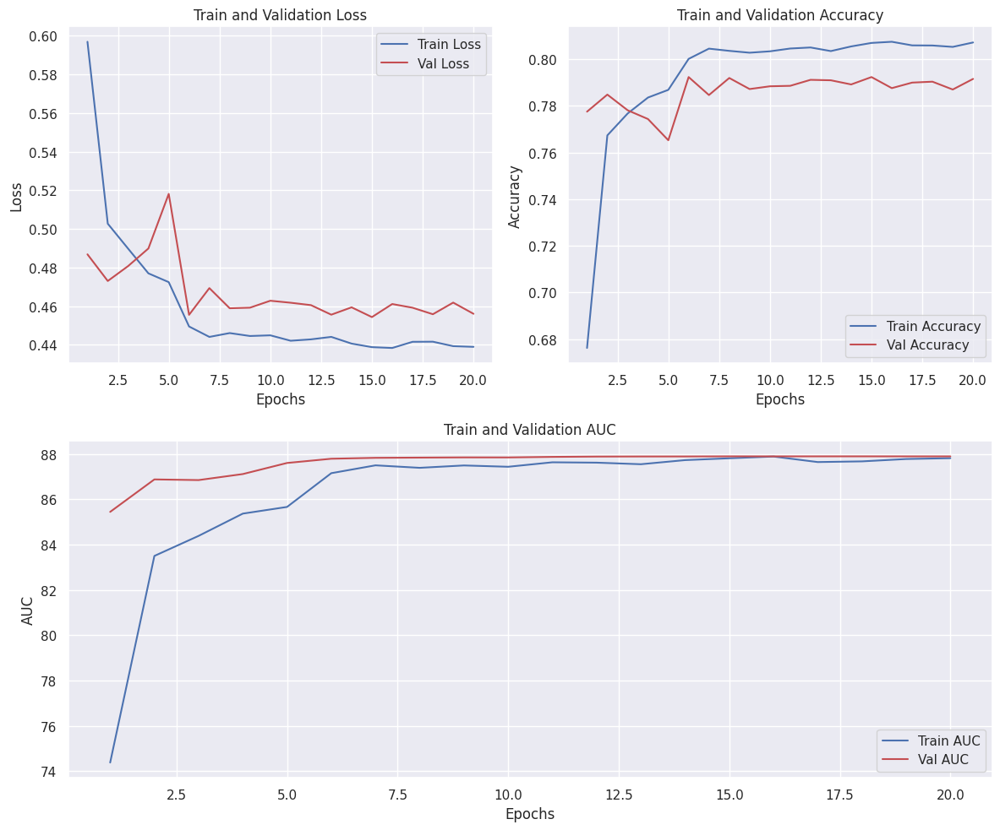

In [15]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [16]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "Y",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "Y",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:01<05:47,  1.11s/batch]

Epoch   1/20:   1%|          | 2/313 [00:02<05:45,  1.11s/batch]

Epoch   1/20:   1%|          | 3/313 [00:03<05:44,  1.11s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:04<05:43,  1.11s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:05<05:42,  1.11s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:06<05:42,  1.11s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:07<05:40,  1.11s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:08<05:39,  1.11s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:10<05:38,  1.11s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:11<05:37,  1.11s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:12<05:36,  1.12s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:13<05:36,  1.12s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:14<05:34,  1.12s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:15<05:33,  1.12s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:16<05:32,  1.12s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:17<05:31,  1.12s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:18<05:30,  1.12s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:20<05:40,  1.15s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:21<05:35,  1.14s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:22<05:33,  1.14s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:23<05:30,  1.13s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:24<05:28,  1.13s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:25<05:26,  1.12s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:27<05:36,  1.16s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:28<06:03,  1.26s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:29<05:49,  1.22s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:30<05:40,  1.19s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:32<06:12,  1.31s/batch]

Epoch   1/20:   9%|▉         | 29/313 [00:33<06:06,  1.29s/batch]

Epoch   1/20:  10%|▉         | 30/313 [00:34<05:50,  1.24s/batch]

Epoch   1/20:  10%|▉         | 31/313 [00:35<05:38,  1.20s/batch]

Epoch   1/20:  10%|█         | 32/313 [00:36<05:30,  1.18s/batch]

Epoch   1/20:  11%|█         | 33/313 [00:38<06:03,  1.30s/batch]

Epoch   1/20:  11%|█         | 34/313 [00:40<06:18,  1.36s/batch]

Epoch   1/20:  11%|█         | 35/313 [00:41<05:56,  1.28s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [00:42<05:41,  1.23s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [00:43<05:30,  1.20s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [00:44<05:22,  1.17s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [00:45<05:15,  1.15s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [00:46<05:17,  1.16s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [00:47<05:12,  1.15s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [00:49<05:08,  1.14s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [00:50<05:05,  1.13s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [00:51<05:03,  1.13s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [00:52<05:01,  1.12s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [00:53<04:59,  1.12s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [00:56<04:54,  1.12s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [00:57<04:53,  1.12s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [00:59<04:52,  1.12s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:00<04:51,  1.12s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:01<04:50,  1.12s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:02<04:49,  1.12s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:03<05:24,  1.26s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:05<05:15,  1.23s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [01:06<05:05,  1.19s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [01:07<04:57,  1.17s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [01:08<04:52,  1.15s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [01:09<04:48,  1.14s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [01:10<04:45,  1.13s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [01:11<04:42,  1.13s/batch]

Epoch   1/20:  20%|██        | 63/313 [01:12<04:40,  1.12s/batch]

Epoch   1/20:  20%|██        | 64/313 [01:14<04:38,  1.12s/batch]

Epoch   1/20:  21%|██        | 65/313 [01:15<04:37,  1.12s/batch]

Epoch   1/20:  21%|██        | 66/313 [01:16<04:35,  1.12s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [01:17<04:34,  1.12s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [01:18<04:33,  1.12s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [01:19<04:31,  1.11s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [01:20<04:30,  1.11s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [01:21<04:29,  1.11s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [01:22<04:28,  1.11s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [01:24<04:27,  1.11s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [01:25<04:26,  1.11s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [01:26<04:24,  1.11s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [01:27<04:23,  1.11s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [01:28<04:22,  1.11s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [01:29<04:21,  1.11s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [01:30<04:20,  1.11s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [01:31<04:19,  1.11s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [01:32<04:18,  1.11s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [01:34<04:17,  1.11s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [01:35<04:47,  1.25s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [01:36<04:46,  1.25s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [01:38<04:35,  1.21s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [01:39<04:27,  1.18s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [01:40<04:22,  1.16s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [01:41<04:17,  1.14s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [01:42<04:13,  1.13s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [01:43<04:11,  1.13s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [01:44<04:20,  1.17s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [01:45<04:14,  1.15s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [01:47<04:36,  1.26s/batch]

Epoch   1/20:  30%|███       | 94/313 [01:48<04:25,  1.21s/batch]

Epoch   1/20:  30%|███       | 95/313 [01:49<04:17,  1.18s/batch]

Epoch   1/20:  31%|███       | 96/313 [01:50<04:12,  1.16s/batch]

Epoch   1/20:  31%|███       | 97/313 [01:51<04:07,  1.15s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [01:53<04:04,  1.14s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [01:54<04:01,  1.13s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [01:55<03:59,  1.13s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [01:56<03:58,  1.12s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [01:57<03:56,  1.12s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [01:58<03:54,  1.12s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [01:59<03:53,  1.12s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [02:00<03:52,  1.12s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [02:01<03:51,  1.12s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [02:03<03:49,  1.12s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [02:04<03:49,  1.12s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [02:05<03:47,  1.12s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [02:06<04:15,  1.26s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [02:08<04:07,  1.22s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [02:09<03:59,  1.19s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [02:10<03:53,  1.17s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [02:11<03:49,  1.15s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [02:12<03:46,  1.14s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [02:13<03:43,  1.13s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [02:14<03:41,  1.13s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [02:15<03:39,  1.12s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [02:16<03:37,  1.12s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [02:19<03:34,  1.12s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [02:20<03:33,  1.12s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [02:21<03:32,  1.12s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [02:22<03:31,  1.12s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [02:23<03:29,  1.12s/batch]

Epoch   1/20:  40%|████      | 126/313 [02:24<03:28,  1.12s/batch]

Epoch   1/20:  41%|████      | 127/313 [02:25<03:27,  1.12s/batch]

Epoch   1/20:  41%|████      | 128/313 [02:26<03:26,  1.12s/batch]

Epoch   1/20:  41%|████      | 129/313 [02:28<03:25,  1.12s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [02:29<03:24,  1.12s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [02:30<03:23,  1.12s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [02:31<03:22,  1.12s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [02:32<03:20,  1.12s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [02:33<03:19,  1.11s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [02:34<03:18,  1.12s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [02:35<03:17,  1.12s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [02:37<03:16,  1.12s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [02:38<03:39,  1.26s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [02:39<03:38,  1.26s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [02:40<03:30,  1.21s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [02:42<03:23,  1.18s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [02:43<03:18,  1.16s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [02:44<03:15,  1.15s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [02:45<03:12,  1.14s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [02:46<03:09,  1.13s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [02:47<03:11,  1.15s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [02:48<03:08,  1.14s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [02:49<03:06,  1.13s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [02:51<03:04,  1.13s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [02:52<03:03,  1.12s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [02:53<03:19,  1.23s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [02:54<03:12,  1.20s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [02:55<03:07,  1.17s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [02:57<03:07,  1.18s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [02:58<03:25,  1.30s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [03:00<03:37,  1.39s/batch]

Epoch   1/20:  50%|█████     | 157/313 [03:01<03:40,  1.41s/batch]

Epoch   1/20:  50%|█████     | 158/313 [03:02<03:25,  1.32s/batch]

Epoch   1/20:  51%|█████     | 159/313 [03:03<03:14,  1.26s/batch]

Epoch   1/20:  51%|█████     | 160/313 [03:05<03:06,  1.22s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [03:06<03:00,  1.19s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [03:07<02:55,  1.16s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [03:08<03:13,  1.29s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [03:10<03:25,  1.38s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [03:11<03:18,  1.34s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [03:13<03:19,  1.36s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [03:14<03:07,  1.28s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [03:15<02:58,  1.23s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [03:16<02:52,  1.20s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [03:17<02:47,  1.17s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [03:18<02:43,  1.15s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [03:19<02:41,  1.14s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [03:20<02:38,  1.13s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [03:22<02:36,  1.13s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [03:23<02:35,  1.13s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [03:24<02:33,  1.12s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [03:25<02:32,  1.12s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [03:26<02:30,  1.12s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [03:27<02:29,  1.12s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [03:28<02:28,  1.12s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [03:29<02:27,  1.12s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [03:31<02:26,  1.12s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [03:32<02:24,  1.12s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [03:33<02:23,  1.12s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [03:34<02:22,  1.12s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [03:35<02:21,  1.12s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [03:36<02:20,  1.12s/batch]

Epoch   1/20:  60%|██████    | 188/313 [03:37<02:19,  1.12s/batch]

Epoch   1/20:  60%|██████    | 189/313 [03:38<02:19,  1.12s/batch]

Epoch   1/20:  61%|██████    | 190/313 [03:39<02:18,  1.12s/batch]

Epoch   1/20:  61%|██████    | 191/313 [03:41<02:34,  1.26s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [03:42<02:34,  1.27s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [03:43<02:27,  1.23s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [03:45<02:22,  1.19s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [03:46<02:18,  1.17s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [03:47<02:15,  1.16s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [03:48<02:13,  1.15s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [03:49<02:11,  1.14s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [03:50<02:09,  1.13s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [03:51<02:07,  1.13s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [03:52<02:07,  1.14s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [03:54<02:06,  1.14s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [03:55<02:04,  1.13s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [03:56<02:02,  1.13s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [03:57<02:01,  1.13s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [03:58<02:00,  1.12s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [03:59<01:58,  1.12s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [04:00<02:01,  1.16s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [04:02<01:59,  1.15s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [04:03<02:11,  1.28s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [04:05<02:19,  1.37s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [04:06<02:10,  1.30s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [04:07<02:04,  1.24s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [04:08<01:59,  1.20s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [04:10<02:09,  1.32s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [04:11<02:09,  1.33s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [04:13<02:15,  1.41s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [04:14<02:17,  1.45s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [04:15<02:06,  1.35s/batch]

Epoch   1/20:  70%|███████   | 220/313 [04:17<02:11,  1.42s/batch]

Epoch   1/20:  71%|███████   | 221/313 [04:18<02:02,  1.34s/batch]

Epoch   1/20:  71%|███████   | 222/313 [04:19<01:55,  1.27s/batch]

Epoch   1/20:  71%|███████   | 223/313 [04:20<01:50,  1.22s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [04:21<01:45,  1.19s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [04:22<01:42,  1.17s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [04:24<01:40,  1.15s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [04:25<01:38,  1.14s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [04:26<01:36,  1.13s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [04:27<01:34,  1.13s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [04:28<01:33,  1.12s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [04:29<01:31,  1.12s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [04:31<01:36,  1.20s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [04:32<01:33,  1.17s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [04:33<01:31,  1.15s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [04:34<01:29,  1.14s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [04:35<01:27,  1.13s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [04:36<01:25,  1.13s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [04:37<01:24,  1.12s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [04:38<01:22,  1.12s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [04:39<01:21,  1.12s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [04:41<01:20,  1.12s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [04:42<01:19,  1.12s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [04:43<01:18,  1.12s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [04:44<01:26,  1.26s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [04:45<01:22,  1.21s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [04:47<01:19,  1.18s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [04:48<01:16,  1.16s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [04:49<01:14,  1.15s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [04:50<01:12,  1.14s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [04:51<01:11,  1.13s/batch]

Epoch   1/20:  80%|████████  | 251/313 [04:52<01:09,  1.13s/batch]

Epoch   1/20:  81%|████████  | 252/313 [04:53<01:08,  1.12s/batch]

Epoch   1/20:  81%|████████  | 253/313 [04:54<01:07,  1.12s/batch]

Epoch   1/20:  81%|████████  | 254/313 [04:56<01:06,  1.12s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [04:57<01:04,  1.12s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [04:58<01:03,  1.12s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [04:59<01:02,  1.11s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [05:00<01:01,  1.11s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [05:01<01:00,  1.12s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [05:02<00:59,  1.12s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [05:03<00:58,  1.12s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [05:04<00:56,  1.12s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [05:06<00:55,  1.11s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [05:07<00:54,  1.11s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [05:08<00:53,  1.11s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [05:09<00:52,  1.11s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [05:10<00:51,  1.11s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [05:11<00:50,  1.11s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [05:12<00:49,  1.11s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [05:13<00:47,  1.12s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [05:14<00:46,  1.11s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [05:16<00:51,  1.25s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [05:17<00:49,  1.25s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [05:18<00:47,  1.21s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [05:20<00:44,  1.18s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [05:21<00:43,  1.17s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [05:22<00:41,  1.15s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [05:23<00:39,  1.14s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [05:24<00:38,  1.13s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [05:25<00:37,  1.13s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [05:26<00:35,  1.12s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [05:27<00:34,  1.12s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [05:28<00:33,  1.12s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [05:30<00:32,  1.12s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [05:31<00:31,  1.12s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [05:32<00:30,  1.12s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [05:33<00:28,  1.11s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [05:34<00:27,  1.12s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [05:35<00:26,  1.12s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [05:36<00:25,  1.12s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [05:37<00:24,  1.11s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [05:38<00:23,  1.11s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [05:40<00:22,  1.12s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [05:41<00:21,  1.11s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [05:42<00:20,  1.11s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [05:43<00:18,  1.11s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [05:44<00:17,  1.11s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [05:45<00:16,  1.11s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [05:46<00:15,  1.11s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [05:48<00:16,  1.25s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [05:49<00:14,  1.23s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [05:50<00:13,  1.20s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [05:51<00:11,  1.17s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [05:52<00:10,  1.16s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [05:54<00:09,  1.21s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [05:55<00:08,  1.18s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [05:56<00:06,  1.16s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [05:57<00:05,  1.15s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [05:58<00:04,  1.14s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [05:59<00:03,  1.13s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [06:00<00:02,  1.13s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [06:02<00:01,  1.12s/batch]

Epoch   1/20: 100%|██████████| 313/313 [06:02<00:00,  1.01batch/s]

Epoch   1/20: 100%|██████████| 313/313 [06:02<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [06:39<00:00,  1.01batch/s, Epoch = 6m 39s, Loss = 0.5705|0.4709, Acc = 0.701|0.785, AUC = 77.568|86.213]

Epoch   1/20: 100%|██████████| 313/313 [06:39<00:00,  1.28s/batch, Epoch = 6m 39s, Loss = 0.5705|0.4709, Acc = 0.701|0.785, AUC = 77.568|86.213]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:01<08:08,  1.57s/batch]

Epoch   2/20:   1%|          | 2/313 [00:02<07:02,  1.36s/batch]

Epoch   2/20:   1%|          | 3/313 [00:03<06:25,  1.24s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:04<06:08,  1.19s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:06<05:58,  1.16s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:07<05:52,  1.15s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:08<05:47,  1.13s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:09<05:44,  1.13s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:10<05:42,  1.13s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:11<05:40,  1.12s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:12<05:38,  1.12s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:13<05:42,  1.14s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:15<05:39,  1.13s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:16<05:37,  1.13s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:17<05:35,  1.12s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:21<05:29,  1.12s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:23<06:08,  1.26s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:24<05:54,  1.22s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:25<05:51,  1.21s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:26<05:42,  1.18s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:27<05:35,  1.16s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:29<05:30,  1.15s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:30<05:26,  1.14s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:31<05:24,  1.13s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:32<06:01,  1.27s/batch]

Epoch   2/20:   9%|▉         | 29/313 [00:34<05:58,  1.26s/batch]

Epoch   2/20:  10%|▉         | 30/313 [00:35<05:45,  1.22s/batch]

Epoch   2/20:  10%|▉         | 31/313 [00:36<05:35,  1.19s/batch]

Epoch   2/20:  10%|█         | 32/313 [00:37<05:28,  1.17s/batch]

Epoch   2/20:  11%|█         | 33/313 [00:38<05:23,  1.15s/batch]

Epoch   2/20:  11%|█         | 34/313 [00:39<05:19,  1.14s/batch]

Epoch   2/20:  11%|█         | 35/313 [00:40<05:16,  1.14s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [00:41<05:13,  1.13s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [00:43<05:10,  1.13s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [00:44<05:08,  1.12s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [00:45<05:07,  1.12s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [00:46<05:06,  1.12s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [00:47<05:04,  1.12s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [00:49<05:02,  1.12s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [00:50<05:00,  1.12s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [00:52<04:59,  1.12s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [00:56<04:54,  1.12s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [00:57<04:53,  1.12s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [00:58<05:02,  1.16s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [00:59<04:58,  1.14s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:01<04:55,  1.14s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:02<04:53,  1.13s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:03<05:27,  1.27s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:05<05:23,  1.26s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [01:06<05:19,  1.25s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [01:07<05:08,  1.21s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [01:08<05:00,  1.18s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [01:09<04:54,  1.16s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [01:10<04:50,  1.15s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [01:11<04:46,  1.14s/batch]

Epoch   2/20:  20%|██        | 63/313 [01:12<04:43,  1.13s/batch]

Epoch   2/20:  20%|██        | 64/313 [01:14<04:41,  1.13s/batch]

Epoch   2/20:  21%|██        | 65/313 [01:15<05:03,  1.22s/batch]

Epoch   2/20:  21%|██        | 66/313 [01:16<04:54,  1.19s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [01:17<04:47,  1.17s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [01:18<04:42,  1.16s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [01:20<04:39,  1.14s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [01:21<04:36,  1.14s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [01:22<04:33,  1.13s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [01:23<04:31,  1.13s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [01:24<04:31,  1.13s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [01:25<04:29,  1.13s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [01:26<04:27,  1.12s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [01:27<04:25,  1.12s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [01:28<04:24,  1.12s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [01:31<04:30,  1.15s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [01:32<04:26,  1.14s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [01:33<04:23,  1.14s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [01:35<04:52,  1.27s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [01:36<04:48,  1.26s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [01:37<04:38,  1.21s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [01:38<04:33,  1.20s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [01:40<04:58,  1.32s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [01:41<04:46,  1.27s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [01:42<04:35,  1.22s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [01:43<04:26,  1.19s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [01:44<04:20,  1.17s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [01:45<04:16,  1.16s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [01:46<04:13,  1.14s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [01:48<04:10,  1.14s/batch]

Epoch   2/20:  30%|███       | 94/313 [01:49<04:07,  1.13s/batch]

Epoch   2/20:  30%|███       | 95/313 [01:50<04:05,  1.13s/batch]

Epoch   2/20:  31%|███       | 96/313 [01:51<04:04,  1.13s/batch]

Epoch   2/20:  31%|███       | 97/313 [01:52<04:02,  1.12s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [01:53<04:01,  1.12s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [01:54<03:59,  1.12s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [01:55<03:58,  1.12s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [01:57<03:57,  1.12s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [01:58<03:56,  1.12s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [01:59<03:55,  1.12s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [02:00<03:58,  1.14s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [02:01<03:56,  1.13s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [02:02<03:59,  1.16s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [02:03<03:55,  1.14s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [02:05<03:52,  1.14s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [02:06<04:19,  1.27s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [02:07<04:08,  1.23s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [02:08<04:01,  1.19s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [02:09<03:55,  1.17s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [02:11<03:51,  1.16s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [02:12<03:47,  1.14s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [02:13<03:45,  1.14s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [02:14<03:42,  1.13s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [02:15<03:40,  1.13s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [02:16<03:39,  1.13s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [02:17<03:38,  1.13s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [02:20<03:35,  1.12s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [02:21<03:34,  1.12s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [02:22<03:33,  1.12s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [02:23<03:31,  1.12s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [02:24<03:30,  1.12s/batch]

Epoch   2/20:  40%|████      | 126/313 [02:25<03:29,  1.12s/batch]

Epoch   2/20:  41%|████      | 127/313 [02:26<03:27,  1.12s/batch]

Epoch   2/20:  41%|████      | 128/313 [02:27<03:26,  1.12s/batch]

Epoch   2/20:  41%|████      | 129/313 [02:29<03:25,  1.12s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [02:30<03:24,  1.12s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [02:31<03:36,  1.19s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [02:32<03:31,  1.17s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [02:33<03:27,  1.16s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [02:34<03:24,  1.15s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [02:35<03:22,  1.14s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [02:37<03:44,  1.27s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [02:38<03:35,  1.22s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [02:39<03:28,  1.19s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [02:40<03:24,  1.17s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [02:42<03:20,  1.16s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [02:43<03:17,  1.15s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [02:44<03:15,  1.14s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [02:45<03:13,  1.14s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [02:46<03:11,  1.13s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [02:47<03:09,  1.13s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [02:48<03:08,  1.13s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [02:49<03:08,  1.13s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [02:51<03:06,  1.13s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [02:52<03:05,  1.13s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [02:53<03:03,  1.13s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [02:54<03:03,  1.13s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [02:55<03:01,  1.13s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [02:56<03:00,  1.13s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [02:57<02:59,  1.13s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [02:58<02:57,  1.13s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [03:00<03:18,  1.26s/batch]

Epoch   2/20:  50%|█████     | 157/313 [03:02<03:32,  1.36s/batch]

Epoch   2/20:  50%|█████     | 158/313 [03:03<03:25,  1.32s/batch]

Epoch   2/20:  51%|█████     | 159/313 [03:04<03:14,  1.26s/batch]

Epoch   2/20:  51%|█████     | 160/313 [03:05<03:06,  1.22s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [03:06<03:00,  1.19s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [03:07<02:56,  1.17s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [03:09<03:07,  1.25s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [03:10<03:00,  1.21s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [03:11<02:54,  1.18s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [03:12<02:50,  1.16s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [03:13<02:48,  1.15s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [03:14<02:45,  1.14s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [03:15<02:43,  1.14s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [03:17<02:41,  1.13s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [03:18<02:40,  1.13s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [03:19<02:39,  1.13s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [03:20<02:37,  1.13s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [03:21<02:36,  1.13s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [03:22<02:35,  1.12s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [03:23<02:33,  1.12s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [03:24<02:32,  1.12s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [03:26<02:31,  1.12s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [03:27<02:30,  1.12s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [03:28<02:29,  1.12s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [03:29<02:28,  1.12s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [03:30<02:27,  1.12s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [03:31<02:25,  1.12s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [03:32<02:24,  1.12s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [03:33<02:23,  1.12s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [03:35<02:22,  1.12s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [03:36<02:21,  1.12s/batch]

Epoch   2/20:  60%|██████    | 188/313 [03:37<02:20,  1.12s/batch]

Epoch   2/20:  60%|██████    | 189/313 [03:38<02:19,  1.12s/batch]

Epoch   2/20:  61%|██████    | 190/313 [03:39<02:18,  1.12s/batch]

Epoch   2/20:  61%|██████    | 191/313 [03:41<02:34,  1.26s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [03:42<02:28,  1.23s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [03:43<02:23,  1.20s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [03:44<02:19,  1.17s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [03:45<02:16,  1.16s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [03:46<02:13,  1.14s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [03:47<02:11,  1.14s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [03:49<02:26,  1.27s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [03:50<02:24,  1.27s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [03:51<02:18,  1.22s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [03:52<02:13,  1.19s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [03:54<02:10,  1.17s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [03:55<02:07,  1.16s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [03:56<02:13,  1.22s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [03:57<02:08,  1.19s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [03:58<02:05,  1.17s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [03:59<02:02,  1.15s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [04:01<02:00,  1.14s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [04:02<01:58,  1.14s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [04:03<01:56,  1.13s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [04:04<01:55,  1.13s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [04:05<01:53,  1.12s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [04:07<02:06,  1.27s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [04:08<02:14,  1.36s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [04:10<02:19,  1.43s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [04:11<02:15,  1.40s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [04:13<02:20,  1.46s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [04:14<02:11,  1.39s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [04:15<02:02,  1.31s/batch]

Epoch   2/20:  70%|███████   | 220/313 [04:16<01:56,  1.25s/batch]

Epoch   2/20:  71%|███████   | 221/313 [04:17<01:51,  1.21s/batch]

Epoch   2/20:  71%|███████   | 222/313 [04:18<01:47,  1.19s/batch]

Epoch   2/20:  71%|███████   | 223/313 [04:20<01:48,  1.21s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [04:21<01:44,  1.18s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [04:22<01:42,  1.16s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [04:23<01:39,  1.15s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [04:24<01:37,  1.14s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [04:25<01:36,  1.13s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [04:26<01:34,  1.13s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [04:27<01:33,  1.12s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [04:29<01:32,  1.13s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [04:30<01:31,  1.13s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [04:31<01:32,  1.16s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [04:32<01:30,  1.14s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [04:33<01:28,  1.14s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [04:34<01:26,  1.13s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [04:35<01:25,  1.13s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [04:37<01:24,  1.13s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [04:38<01:23,  1.13s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [04:39<01:22,  1.13s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [04:40<01:21,  1.13s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [04:41<01:19,  1.13s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [04:42<01:19,  1.13s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [04:44<01:27,  1.27s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [04:45<01:23,  1.22s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [04:46<01:20,  1.19s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [04:47<01:17,  1.17s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [04:48<01:15,  1.16s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [04:49<01:13,  1.15s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [04:51<01:11,  1.14s/batch]

Epoch   2/20:  80%|████████  | 251/313 [04:52<01:10,  1.14s/batch]

Epoch   2/20:  81%|████████  | 252/313 [04:53<01:09,  1.13s/batch]

Epoch   2/20:  81%|████████  | 253/313 [04:54<01:07,  1.13s/batch]

Epoch   2/20:  81%|████████  | 254/313 [04:55<01:12,  1.23s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [04:57<01:09,  1.20s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [04:58<01:07,  1.18s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [04:59<01:05,  1.16s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [05:00<01:03,  1.15s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [05:01<01:01,  1.14s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [05:02<01:00,  1.14s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [05:03<00:59,  1.14s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [05:04<00:57,  1.13s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [05:06<00:56,  1.13s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [05:07<00:55,  1.13s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [05:08<00:54,  1.13s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [05:09<00:53,  1.13s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [05:10<00:51,  1.13s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [05:11<00:50,  1.13s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [05:12<00:49,  1.13s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [05:14<00:51,  1.20s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [05:15<00:50,  1.20s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [05:16<00:48,  1.18s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [05:17<00:46,  1.16s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [05:19<00:50,  1.29s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [05:20<00:48,  1.28s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [05:21<00:45,  1.24s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [05:22<00:43,  1.20s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [05:23<00:41,  1.18s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [05:25<00:39,  1.16s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [05:26<00:38,  1.15s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [05:27<00:36,  1.15s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [05:28<00:35,  1.14s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [05:29<00:34,  1.14s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [05:30<00:32,  1.13s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [05:31<00:31,  1.13s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [05:32<00:30,  1.13s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [05:34<00:29,  1.13s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [05:35<00:28,  1.13s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [05:36<00:27,  1.13s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [05:37<00:25,  1.13s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [05:38<00:24,  1.13s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [05:39<00:23,  1.13s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [05:40<00:23,  1.18s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [05:42<00:22,  1.16s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [05:43<00:20,  1.15s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [05:44<00:19,  1.15s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [05:45<00:18,  1.14s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [05:47<00:19,  1.28s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [05:48<00:17,  1.24s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [05:49<00:15,  1.20s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [05:50<00:14,  1.18s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [05:51<00:13,  1.25s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [05:53<00:12,  1.21s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [05:54<00:10,  1.19s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [05:55<00:09,  1.17s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [05:56<00:08,  1.16s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [05:57<00:06,  1.15s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [05:59<00:06,  1.28s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [06:00<00:05,  1.38s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [06:02<00:04,  1.44s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [06:03<00:02,  1.44s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [06:04<00:01,  1.34s/batch]

Epoch   2/20: 100%|██████████| 313/313 [06:05<00:00,  1.24s/batch]

Epoch   2/20: 100%|██████████| 313/313 [06:05<00:00,  1.24s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [06:42<00:00,  1.24s/batch, Epoch = 6m 42s, Loss = 0.4875|0.4500, Acc = 0.778|0.790, AUC = 84.591|87.694]

Epoch   2/20: 100%|██████████| 313/313 [06:42<00:00,  1.29s/batch, Epoch = 6m 42s, Loss = 0.4875|0.4500, Acc = 0.778|0.790, AUC = 84.591|87.694]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:01<05:44,  1.10s/batch]

Epoch   3/20:   1%|          | 2/313 [00:02<05:50,  1.13s/batch]

Epoch   3/20:   1%|          | 3/313 [00:03<05:47,  1.12s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:04<05:46,  1.12s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:05<05:44,  1.12s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:06<05:43,  1.12s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:07<05:42,  1.12s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:08<05:41,  1.12s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:10<05:40,  1.12s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:12<05:38,  1.12s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:13<05:37,  1.12s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:14<05:36,  1.12s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:15<05:35,  1.12s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:16<05:50,  1.18s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:18<05:44,  1.16s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:19<05:39,  1.15s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:20<05:36,  1.14s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:21<05:34,  1.14s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:22<05:33,  1.14s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:23<05:30,  1.13s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:24<05:28,  1.13s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:26<06:07,  1.27s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:28<06:33,  1.36s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:29<06:51,  1.43s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:31<06:46,  1.42s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:32<06:59,  1.47s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:33<06:37,  1.39s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:35<06:33,  1.39s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:36<06:09,  1.31s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:37<05:52,  1.25s/batch]

Epoch   3/20:  10%|█         | 32/313 [00:38<05:41,  1.21s/batch]

Epoch   3/20:  11%|█         | 33/313 [00:39<05:31,  1.18s/batch]

Epoch   3/20:  11%|█         | 34/313 [00:40<05:24,  1.16s/batch]

Epoch   3/20:  11%|█         | 35/313 [00:41<05:19,  1.15s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [00:43<05:16,  1.14s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [00:44<05:12,  1.13s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [00:45<05:10,  1.13s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [00:46<05:13,  1.15s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [00:47<05:10,  1.14s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [00:48<05:08,  1.13s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [00:49<05:06,  1.13s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [00:50<05:04,  1.13s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [00:52<05:04,  1.13s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [00:53<05:02,  1.13s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [00:54<05:00,  1.12s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [00:55<04:58,  1.12s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [00:56<04:57,  1.12s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [00:57<04:56,  1.12s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [00:58<05:05,  1.16s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:00<05:00,  1.15s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:01<04:57,  1.14s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:02<04:54,  1.13s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:03<05:29,  1.27s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:05<05:24,  1.26s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:06<05:12,  1.22s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:07<05:03,  1.18s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:08<04:57,  1.17s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:09<04:52,  1.15s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [01:10<04:56,  1.17s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:11<04:51,  1.16s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:13<04:47,  1.15s/batch]

Epoch   3/20:  20%|██        | 63/313 [01:14<04:44,  1.14s/batch]

Epoch   3/20:  20%|██        | 64/313 [01:15<04:41,  1.13s/batch]

Epoch   3/20:  21%|██        | 65/313 [01:16<04:39,  1.13s/batch]

Epoch   3/20:  21%|██        | 66/313 [01:17<04:37,  1.13s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [01:18<04:36,  1.12s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [01:20<05:06,  1.25s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [01:21<04:55,  1.21s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [01:22<04:47,  1.18s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [01:23<04:41,  1.16s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [01:24<04:37,  1.15s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [01:25<04:34,  1.14s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [01:26<04:31,  1.14s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [01:28<04:29,  1.13s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [01:29<04:27,  1.13s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [01:30<04:26,  1.13s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [01:31<04:24,  1.12s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [01:32<04:23,  1.13s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [01:33<04:32,  1.17s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [01:35<05:00,  1.30s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [01:36<04:47,  1.24s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [01:37<04:37,  1.21s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [01:38<04:30,  1.18s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [01:39<04:24,  1.16s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [01:40<04:20,  1.15s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [01:42<04:17,  1.14s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [01:43<04:15,  1.13s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [01:44<04:12,  1.13s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [01:45<04:11,  1.13s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [01:46<04:09,  1.12s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [01:47<04:08,  1.12s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [01:48<04:06,  1.12s/batch]

Epoch   3/20:  30%|███       | 94/313 [01:49<04:05,  1.12s/batch]

Epoch   3/20:  30%|███       | 95/313 [01:51<04:04,  1.12s/batch]

Epoch   3/20:  31%|███       | 96/313 [01:52<04:03,  1.12s/batch]

Epoch   3/20:  31%|███       | 97/313 [01:53<04:01,  1.12s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [01:54<04:00,  1.12s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [01:55<03:59,  1.12s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [01:56<03:58,  1.12s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [01:57<03:57,  1.12s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [01:58<03:56,  1.12s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [01:59<03:54,  1.12s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [02:01<04:09,  1.19s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [02:02<04:04,  1.17s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [02:03<03:59,  1.16s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [02:04<03:56,  1.15s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [02:06<04:22,  1.28s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [02:07<04:12,  1.24s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [02:08<04:04,  1.20s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [02:09<03:57,  1.18s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [02:10<03:53,  1.16s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [02:12<03:59,  1.20s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [02:13<03:53,  1.17s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [02:14<03:49,  1.16s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [02:15<03:46,  1.15s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [02:16<03:43,  1.14s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [02:17<03:40,  1.13s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [02:18<03:39,  1.13s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [02:19<03:37,  1.13s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [02:21<03:36,  1.13s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [02:22<03:34,  1.12s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [02:23<03:33,  1.12s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [02:24<03:31,  1.12s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [02:25<03:30,  1.12s/batch]

Epoch   3/20:  40%|████      | 126/313 [02:26<03:29,  1.12s/batch]

Epoch   3/20:  41%|████      | 127/313 [02:27<03:28,  1.12s/batch]

Epoch   3/20:  41%|████      | 128/313 [02:28<03:27,  1.12s/batch]

Epoch   3/20:  41%|████      | 129/313 [02:30<03:26,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [02:31<03:25,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [02:32<03:24,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [02:33<03:22,  1.12s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [02:34<03:21,  1.12s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [02:35<03:20,  1.12s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [02:37<03:44,  1.26s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [02:38<03:35,  1.22s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [02:39<03:29,  1.19s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [02:40<03:24,  1.17s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [02:41<03:20,  1.15s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [02:42<03:20,  1.16s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [02:43<03:17,  1.15s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [02:45<03:14,  1.14s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [02:46<03:12,  1.13s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [02:47<03:10,  1.13s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [02:48<03:09,  1.13s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [02:49<03:07,  1.12s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [02:50<03:06,  1.12s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [02:51<03:05,  1.12s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [02:52<03:03,  1.12s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [02:54<03:02,  1.12s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [02:55<03:01,  1.12s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [02:56<03:00,  1.12s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [02:57<02:59,  1.12s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [02:58<02:58,  1.12s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [02:59<02:57,  1.12s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [03:00<02:55,  1.12s/batch]

Epoch   3/20:  50%|█████     | 157/313 [03:01<02:55,  1.12s/batch]

Epoch   3/20:  50%|█████     | 158/313 [03:03<02:53,  1.12s/batch]

Epoch   3/20:  51%|█████     | 159/313 [03:04<02:52,  1.12s/batch]

Epoch   3/20:  51%|█████     | 160/313 [03:05<02:51,  1.12s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [03:06<02:50,  1.12s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [03:07<02:49,  1.12s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [03:09<03:09,  1.26s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [03:10<03:04,  1.24s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [03:11<02:57,  1.20s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [03:12<02:52,  1.18s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [03:13<02:49,  1.16s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [03:14<02:46,  1.15s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [03:15<02:44,  1.14s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [03:17<02:51,  1.20s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [03:18<02:47,  1.18s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [03:19<02:43,  1.16s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [03:20<02:40,  1.15s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [03:21<02:38,  1.14s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [03:22<02:36,  1.13s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [03:23<02:34,  1.13s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [03:25<02:33,  1.13s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [03:26<02:31,  1.13s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [03:27<02:30,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [03:28<02:29,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [03:29<02:28,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [03:30<02:27,  1.12s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [03:31<02:27,  1.13s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [03:32<02:25,  1.13s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [03:34<02:24,  1.13s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [03:35<02:22,  1.12s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [03:36<02:21,  1.12s/batch]

Epoch   3/20:  60%|██████    | 188/313 [03:37<02:20,  1.12s/batch]

Epoch   3/20:  60%|██████    | 189/313 [03:38<02:19,  1.12s/batch]

Epoch   3/20:  61%|██████    | 190/313 [03:40<02:35,  1.26s/batch]

Epoch   3/20:  61%|██████    | 191/313 [03:41<02:29,  1.22s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [03:42<02:24,  1.19s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [03:43<02:20,  1.17s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [03:44<02:17,  1.16s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [03:45<02:15,  1.15s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [03:46<02:13,  1.14s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [03:48<02:19,  1.20s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [03:49<02:15,  1.18s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [03:50<02:12,  1.16s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [03:51<02:09,  1.15s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [03:52<02:07,  1.14s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [03:53<02:06,  1.14s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [03:54<02:04,  1.13s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [03:56<02:03,  1.13s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [03:57<02:11,  1.22s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [03:58<02:07,  1.19s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [03:59<02:04,  1.17s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [04:00<02:01,  1.15s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [04:02<01:58,  1.14s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [04:03<01:57,  1.14s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [04:04<01:55,  1.13s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [04:05<01:54,  1.13s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [04:06<01:52,  1.13s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [04:07<01:51,  1.13s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [04:08<01:50,  1.12s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [04:09<01:48,  1.12s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [04:11<02:01,  1.26s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [04:12<01:55,  1.22s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [04:13<01:51,  1.19s/batch]

Epoch   3/20:  70%|███████   | 220/313 [04:14<01:48,  1.17s/batch]

Epoch   3/20:  71%|███████   | 221/313 [04:16<01:58,  1.29s/batch]

Epoch   3/20:  71%|███████   | 222/313 [04:17<01:57,  1.29s/batch]

Epoch   3/20:  71%|███████   | 223/313 [04:18<01:51,  1.24s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [04:19<01:47,  1.20s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [04:21<01:43,  1.18s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [04:22<01:40,  1.16s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [04:23<01:38,  1.15s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [04:24<01:36,  1.14s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [04:25<01:35,  1.13s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [04:26<01:39,  1.20s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [04:28<01:36,  1.17s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [04:29<01:33,  1.16s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [04:30<01:31,  1.15s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [04:31<01:36,  1.23s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [04:32<01:33,  1.19s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [04:33<01:30,  1.17s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [04:35<01:27,  1.16s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [04:36<01:25,  1.15s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [04:37<01:24,  1.14s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [04:38<01:22,  1.13s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [04:39<01:21,  1.13s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [04:40<01:20,  1.13s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [04:42<01:23,  1.20s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [04:43<01:30,  1.31s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [04:44<01:25,  1.26s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [04:45<01:21,  1.21s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [04:47<01:26,  1.32s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [04:48<01:21,  1.26s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [04:49<01:17,  1.22s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [04:50<01:14,  1.19s/batch]

Epoch   3/20:  80%|████████  | 251/313 [04:51<01:12,  1.17s/batch]

Epoch   3/20:  81%|████████  | 252/313 [04:52<01:10,  1.15s/batch]

Epoch   3/20:  81%|████████  | 253/313 [04:54<01:08,  1.14s/batch]

Epoch   3/20:  81%|████████  | 254/313 [04:55<01:06,  1.14s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [04:56<01:05,  1.13s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [04:57<01:04,  1.13s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [04:58<01:03,  1.13s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [04:59<01:01,  1.12s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [05:00<01:00,  1.12s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [05:01<00:59,  1.12s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [05:03<00:58,  1.12s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [05:04<00:57,  1.12s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [05:05<00:55,  1.12s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [05:06<00:54,  1.12s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [05:07<00:53,  1.12s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [05:08<00:52,  1.12s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [05:09<00:51,  1.12s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [05:10<00:50,  1.12s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [05:12<00:55,  1.26s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [05:14<00:58,  1.36s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [05:15<00:59,  1.43s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [05:16<00:55,  1.35s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [05:17<00:51,  1.30s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [05:19<00:48,  1.24s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [05:20<00:45,  1.20s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [05:21<00:43,  1.18s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [05:22<00:41,  1.16s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [05:23<00:40,  1.15s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [05:24<00:38,  1.14s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [05:25<00:37,  1.13s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [05:26<00:36,  1.13s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [05:28<00:34,  1.13s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [05:29<00:33,  1.12s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [05:30<00:32,  1.12s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [05:31<00:31,  1.12s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [05:32<00:30,  1.12s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [05:33<00:29,  1.12s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [05:34<00:27,  1.12s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [05:35<00:26,  1.12s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [05:36<00:25,  1.12s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [05:38<00:24,  1.12s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [05:39<00:23,  1.12s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [05:40<00:22,  1.12s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [05:41<00:21,  1.12s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [05:42<00:20,  1.12s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [05:43<00:19,  1.12s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [05:44<00:17,  1.12s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [05:45<00:16,  1.12s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [05:47<00:17,  1.26s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [05:48<00:15,  1.22s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [05:49<00:14,  1.19s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [05:50<00:12,  1.17s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [05:52<00:11,  1.15s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [05:53<00:10,  1.14s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [05:54<00:09,  1.14s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [05:55<00:07,  1.13s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [05:56<00:06,  1.13s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [05:57<00:05,  1.13s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [05:59<00:04,  1.23s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [06:00<00:03,  1.20s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [06:01<00:02,  1.18s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [06:02<00:01,  1.16s/batch]

Epoch   3/20: 100%|██████████| 313/313 [06:03<00:00,  1.03s/batch]

Epoch   3/20: 100%|██████████| 313/313 [06:03<00:00,  1.03s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [06:40<00:00,  1.03s/batch, Epoch = 6m 40s, Loss = 0.4667|0.4485, Acc = 0.791|0.791, AUC = 86.059|88.214]

Epoch   3/20: 100%|██████████| 313/313 [06:40<00:00,  1.28s/batch, Epoch = 6m 40s, Loss = 0.4667|0.4485, Acc = 0.791|0.791, AUC = 86.059|88.214]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch   4/20:   1%|          | 2/313 [00:02<06:55,  1.34s/batch]

Epoch   4/20:   1%|          | 3/313 [00:03<06:23,  1.24s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:04<06:07,  1.19s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:06<05:58,  1.16s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:07<05:52,  1.15s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:08<05:48,  1.14s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:09<05:46,  1.14s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:11<06:27,  1.28s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:12<06:12,  1.23s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:13<06:01,  1.20s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:14<05:53,  1.17s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:15<06:14,  1.25s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:16<06:02,  1.21s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:18<05:52,  1.18s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:19<05:46,  1.17s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:20<06:00,  1.22s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:21<05:51,  1.19s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:22<05:43,  1.17s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:24<06:19,  1.30s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:25<06:43,  1.38s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:27<06:39,  1.37s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:28<06:16,  1.30s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:29<05:59,  1.24s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:30<05:48,  1.21s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:32<06:11,  1.29s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:33<06:35,  1.38s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:34<06:12,  1.31s/batch]

Epoch   4/20:   9%|▉         | 29/313 [00:36<05:55,  1.25s/batch]

Epoch   4/20:  10%|▉         | 30/313 [00:37<06:21,  1.35s/batch]

Epoch   4/20:  10%|▉         | 31/313 [00:38<06:01,  1.28s/batch]

Epoch   4/20:  10%|█         | 32/313 [00:39<05:46,  1.23s/batch]

Epoch   4/20:  11%|█         | 33/313 [00:40<05:35,  1.20s/batch]

Epoch   4/20:  11%|█         | 34/313 [00:42<05:28,  1.18s/batch]

Epoch   4/20:  11%|█         | 35/313 [00:43<05:22,  1.16s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [00:44<05:18,  1.15s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [00:45<05:15,  1.14s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [00:46<05:12,  1.14s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [00:47<05:10,  1.13s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [00:48<05:09,  1.13s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [00:49<05:07,  1.13s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [00:51<05:05,  1.13s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [00:52<05:04,  1.13s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [00:53<05:14,  1.17s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [00:54<05:08,  1.15s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [00:55<05:04,  1.14s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [00:56<05:02,  1.14s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [00:57<04:59,  1.13s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [00:59<04:58,  1.13s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:00<05:25,  1.24s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:01<05:14,  1.20s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:02<05:07,  1.18s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:03<05:01,  1.16s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:05<05:34,  1.29s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:07<05:53,  1.37s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [01:08<05:32,  1.29s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [01:09<05:45,  1.35s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [01:10<05:26,  1.28s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [01:11<05:13,  1.23s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [01:13<05:03,  1.20s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [01:14<04:56,  1.18s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [01:15<04:50,  1.16s/batch]

Epoch   4/20:  20%|██        | 63/313 [01:16<05:09,  1.24s/batch]

Epoch   4/20:  20%|██        | 64/313 [01:17<04:59,  1.20s/batch]

Epoch   4/20:  21%|██        | 65/313 [01:18<04:52,  1.18s/batch]

Epoch   4/20:  21%|██        | 66/313 [01:20<04:46,  1.16s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [01:21<04:42,  1.15s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [01:22<04:39,  1.14s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [01:23<04:36,  1.13s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [01:24<04:35,  1.13s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [01:25<04:33,  1.13s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [01:26<04:31,  1.13s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [01:27<04:29,  1.12s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [01:29<04:46,  1.20s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [01:30<04:39,  1.17s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [01:31<04:34,  1.16s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [01:32<04:30,  1.15s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [01:33<04:27,  1.14s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [01:34<04:25,  1.13s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [01:36<04:44,  1.22s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [01:37<04:35,  1.19s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [01:38<04:30,  1.17s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [01:39<04:25,  1.16s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [01:41<04:53,  1.28s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [01:42<04:42,  1.24s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [01:43<04:33,  1.20s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [01:44<04:26,  1.18s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [01:45<04:21,  1.16s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [01:46<04:17,  1.15s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [01:47<04:14,  1.14s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [01:49<04:12,  1.14s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [01:50<04:10,  1.13s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [01:51<04:08,  1.13s/batch]

Epoch   4/20:  30%|███       | 94/313 [01:52<04:06,  1.13s/batch]

Epoch   4/20:  30%|███       | 95/313 [01:53<04:09,  1.14s/batch]

Epoch   4/20:  31%|███       | 96/313 [01:54<04:06,  1.14s/batch]

Epoch   4/20:  31%|███       | 97/313 [01:55<04:04,  1.13s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [01:57<04:02,  1.13s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [01:58<04:01,  1.13s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [01:59<03:59,  1.13s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [02:00<04:27,  1.26s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [02:02<04:18,  1.23s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [02:03<04:10,  1.19s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [02:04<04:17,  1.23s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [02:05<04:09,  1.20s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [02:06<04:03,  1.18s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [02:08<04:27,  1.30s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [02:09<04:17,  1.26s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [02:10<04:07,  1.21s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [02:11<04:00,  1.19s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [02:12<03:55,  1.17s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [02:13<03:51,  1.15s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [02:15<03:48,  1.14s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [02:16<03:46,  1.14s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [02:17<03:43,  1.13s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [02:18<03:42,  1.13s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [02:19<03:40,  1.12s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [02:20<03:39,  1.12s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [02:21<03:38,  1.12s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [02:22<03:37,  1.12s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [02:24<03:45,  1.18s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [02:25<03:41,  1.16s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [02:26<03:37,  1.15s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [02:27<03:35,  1.14s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [02:28<03:35,  1.15s/batch]

Epoch   4/20:  40%|████      | 126/313 [02:29<03:32,  1.14s/batch]

Epoch   4/20:  41%|████      | 127/313 [02:30<03:30,  1.13s/batch]

Epoch   4/20:  41%|████      | 128/313 [02:32<03:28,  1.13s/batch]

Epoch   4/20:  41%|████      | 129/313 [02:33<03:27,  1.13s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [02:34<03:25,  1.12s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [02:35<03:24,  1.12s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [02:36<03:23,  1.12s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [02:37<03:21,  1.12s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [02:39<03:47,  1.27s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [02:40<03:38,  1.23s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [02:41<03:43,  1.27s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [02:42<03:34,  1.22s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [02:43<03:28,  1.19s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [02:45<03:23,  1.17s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [02:46<03:20,  1.16s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [02:47<03:16,  1.14s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [02:48<03:14,  1.14s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [02:49<03:12,  1.13s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [02:50<03:10,  1.13s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [02:51<03:09,  1.13s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [02:52<03:08,  1.13s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [02:54<03:06,  1.13s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [02:55<03:05,  1.13s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [02:56<03:04,  1.12s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [02:57<03:03,  1.12s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [02:58<03:01,  1.12s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [02:59<03:01,  1.13s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [03:00<03:00,  1.13s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [03:01<02:59,  1.13s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [03:03<03:14,  1.23s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [03:04<03:08,  1.20s/batch]

Epoch   4/20:  50%|█████     | 157/313 [03:05<03:03,  1.17s/batch]

Epoch   4/20:  50%|█████     | 158/313 [03:06<02:59,  1.16s/batch]

Epoch   4/20:  51%|█████     | 159/313 [03:07<02:56,  1.15s/batch]

Epoch   4/20:  51%|█████     | 160/313 [03:09<02:54,  1.14s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [03:10<03:02,  1.20s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [03:11<02:57,  1.18s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [03:12<02:54,  1.16s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [03:13<02:51,  1.15s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [03:14<02:48,  1.14s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [03:15<02:46,  1.14s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [03:17<02:45,  1.13s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [03:18<02:43,  1.13s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [03:19<02:42,  1.13s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [03:20<02:40,  1.12s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [03:21<02:39,  1.12s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [03:22<02:38,  1.12s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [03:23<02:37,  1.12s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [03:24<02:35,  1.12s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [03:26<02:34,  1.12s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [03:27<02:33,  1.12s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [03:28<02:32,  1.12s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [03:29<02:31,  1.12s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [03:30<02:30,  1.12s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [03:31<02:29,  1.12s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [03:32<02:27,  1.12s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [03:34<02:30,  1.15s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [03:35<02:28,  1.14s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [03:36<02:26,  1.13s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [03:37<02:25,  1.13s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [03:38<02:23,  1.13s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [03:39<02:22,  1.13s/batch]

Epoch   4/20:  60%|██████    | 188/313 [03:40<02:20,  1.13s/batch]

Epoch   4/20:  60%|██████    | 189/313 [03:42<02:36,  1.26s/batch]

Epoch   4/20:  61%|██████    | 190/313 [03:43<02:30,  1.22s/batch]

Epoch   4/20:  61%|██████    | 191/313 [03:44<02:25,  1.19s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [03:45<02:21,  1.17s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [03:46<02:18,  1.15s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [03:47<02:15,  1.14s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [03:49<02:13,  1.14s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [03:50<02:12,  1.13s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [03:51<02:10,  1.13s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [03:52<02:09,  1.12s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [03:53<02:07,  1.12s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [03:54<02:06,  1.12s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [03:55<02:05,  1.12s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [03:57<02:16,  1.23s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [03:58<02:12,  1.20s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [03:59<02:08,  1.17s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [04:00<02:05,  1.16s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [04:01<02:02,  1.15s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [04:02<02:00,  1.14s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [04:03<01:58,  1.13s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [04:05<02:11,  1.27s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [04:06<02:14,  1.31s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [04:08<02:07,  1.25s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [04:09<02:02,  1.21s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [04:10<01:58,  1.18s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [04:11<01:54,  1.16s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [04:12<01:52,  1.15s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [04:14<02:04,  1.28s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [04:15<01:58,  1.24s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [04:16<01:54,  1.20s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [04:17<01:50,  1.18s/batch]

Epoch   4/20:  70%|███████   | 220/313 [04:18<01:47,  1.16s/batch]

Epoch   4/20:  71%|███████   | 221/313 [04:19<01:45,  1.15s/batch]

Epoch   4/20:  71%|███████   | 222/313 [04:20<01:45,  1.16s/batch]

Epoch   4/20:  71%|███████   | 223/313 [04:22<01:43,  1.15s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [04:23<01:41,  1.14s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [04:24<01:39,  1.13s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [04:25<01:38,  1.13s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [04:26<01:37,  1.14s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [04:27<01:36,  1.13s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [04:28<01:35,  1.13s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [04:29<01:33,  1.13s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [04:31<01:32,  1.13s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [04:32<01:30,  1.12s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [04:33<01:29,  1.12s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [04:34<01:28,  1.12s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [04:35<01:27,  1.12s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [04:36<01:26,  1.12s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [04:37<01:24,  1.12s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [04:38<01:23,  1.12s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [04:39<01:22,  1.12s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [04:41<01:21,  1.12s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [04:42<01:20,  1.12s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [04:43<01:19,  1.12s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [04:44<01:18,  1.12s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [04:46<01:26,  1.26s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [04:47<01:22,  1.22s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [04:48<01:19,  1.19s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [04:49<01:17,  1.17s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [04:50<01:14,  1.15s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [04:51<01:12,  1.14s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [04:53<01:20,  1.28s/batch]

Epoch   4/20:  80%|████████  | 251/313 [04:54<01:19,  1.28s/batch]

Epoch   4/20:  81%|████████  | 252/313 [04:55<01:15,  1.23s/batch]

Epoch   4/20:  81%|████████  | 253/313 [04:56<01:11,  1.20s/batch]

Epoch   4/20:  81%|████████  | 254/313 [04:57<01:09,  1.17s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [04:58<01:07,  1.16s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [05:00<01:05,  1.14s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [05:01<01:03,  1.14s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [05:02<01:02,  1.13s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [05:03<01:00,  1.13s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [05:04<00:59,  1.12s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [05:05<00:58,  1.13s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [05:07<01:04,  1.27s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [05:08<01:04,  1.28s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [05:09<01:00,  1.23s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [05:10<00:57,  1.20s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [05:11<00:55,  1.17s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [05:13<00:53,  1.16s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [05:14<00:51,  1.14s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [05:15<00:50,  1.14s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [05:16<00:54,  1.27s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [05:18<00:54,  1.29s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [05:19<00:54,  1.32s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [05:20<00:50,  1.26s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [05:21<00:47,  1.22s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [05:23<00:48,  1.27s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [05:24<00:45,  1.22s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [05:25<00:42,  1.19s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [05:26<00:40,  1.17s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [05:27<00:39,  1.15s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [05:28<00:37,  1.14s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [05:29<00:36,  1.14s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [05:31<00:35,  1.13s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [05:32<00:33,  1.13s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [05:33<00:32,  1.12s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [05:34<00:31,  1.12s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [05:35<00:30,  1.12s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [05:36<00:29,  1.12s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [05:37<00:27,  1.12s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [05:38<00:26,  1.12s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [05:40<00:25,  1.12s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [05:41<00:24,  1.12s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [05:42<00:23,  1.12s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [05:43<00:22,  1.12s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [05:44<00:21,  1.12s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [05:45<00:20,  1.12s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [05:46<00:18,  1.12s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [05:48<00:20,  1.26s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [05:49<00:18,  1.22s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [05:50<00:16,  1.19s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [05:51<00:15,  1.17s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [05:52<00:13,  1.15s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [05:53<00:12,  1.14s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [05:55<00:11,  1.14s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [05:56<00:10,  1.15s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [05:57<00:09,  1.21s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [05:59<00:08,  1.29s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [06:00<00:07,  1.24s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [06:01<00:06,  1.20s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [06:02<00:04,  1.18s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [06:03<00:03,  1.16s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [06:04<00:02,  1.15s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [06:05<00:01,  1.14s/batch]

Epoch   4/20: 100%|██████████| 313/313 [06:06<00:00,  1.01s/batch]

Epoch   4/20: 100%|██████████| 313/313 [06:06<00:00,  1.01s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [06:43<00:00,  1.01s/batch, Epoch = 6m 43s, Loss = 0.4574|0.4362, Acc = 0.794|0.800, AUC = 86.677|89.136]

Epoch   4/20: 100%|██████████| 313/313 [06:43<00:00,  1.29s/batch, Epoch = 6m 43s, Loss = 0.4574|0.4362, Acc = 0.794|0.800, AUC = 86.677|89.136]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:01<08:09,  1.57s/batch]

Epoch   5/20:   1%|          | 2/313 [00:02<06:44,  1.30s/batch]

Epoch   5/20:   1%|          | 3/313 [00:03<06:17,  1.22s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:04<06:03,  1.18s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:06<05:55,  1.16s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:07<05:52,  1.15s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:08<05:48,  1.14s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:09<05:45,  1.13s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:10<05:42,  1.13s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:12<05:39,  1.12s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:13<05:38,  1.12s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:15<05:37,  1.12s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:16<05:36,  1.12s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:17<05:34,  1.12s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:19<05:32,  1.12s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:20<05:31,  1.12s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:21<05:30,  1.12s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:22<05:28,  1.12s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:23<05:28,  1.12s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:25<05:26,  1.12s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:26<05:25,  1.12s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:27<05:24,  1.12s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:28<05:22,  1.12s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:29<05:21,  1.12s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:30<05:20,  1.12s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:31<05:19,  1.12s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:33<05:57,  1.26s/batch]

Epoch   5/20:  10%|▉         | 30/313 [00:34<05:45,  1.22s/batch]

Epoch   5/20:  10%|▉         | 31/313 [00:35<05:36,  1.19s/batch]

Epoch   5/20:  10%|█         | 32/313 [00:37<05:49,  1.25s/batch]

Epoch   5/20:  11%|█         | 33/313 [00:38<05:39,  1.21s/batch]

Epoch   5/20:  11%|█         | 34/313 [00:39<05:30,  1.18s/batch]

Epoch   5/20:  11%|█         | 35/313 [00:40<05:23,  1.16s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [00:41<05:18,  1.15s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [00:42<05:14,  1.14s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [00:43<05:11,  1.13s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [00:44<05:09,  1.13s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [00:46<05:07,  1.13s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [00:47<05:06,  1.13s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [00:48<05:04,  1.12s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [00:49<05:03,  1.12s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [00:50<05:01,  1.12s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [00:51<05:00,  1.12s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [00:52<04:59,  1.12s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [00:53<04:57,  1.12s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [00:54<04:56,  1.12s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [00:56<04:55,  1.12s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [00:57<04:54,  1.12s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [00:58<04:54,  1.13s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [00:59<04:53,  1.12s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:00<04:51,  1.12s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:01<05:04,  1.18s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:03<04:59,  1.16s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [01:04<05:30,  1.29s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [01:05<05:22,  1.26s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [01:06<05:10,  1.22s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [01:08<05:01,  1.19s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [01:09<04:55,  1.17s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [01:10<04:50,  1.15s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [01:11<04:46,  1.14s/batch]

Epoch   5/20:  20%|██        | 63/313 [01:12<04:44,  1.14s/batch]

Epoch   5/20:  20%|██        | 64/313 [01:13<04:41,  1.13s/batch]

Epoch   5/20:  21%|██        | 65/313 [01:14<04:39,  1.13s/batch]

Epoch   5/20:  21%|██        | 66/313 [01:15<04:38,  1.13s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [01:16<04:36,  1.13s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [01:18<05:09,  1.26s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [01:20<05:32,  1.36s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [01:21<05:30,  1.36s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [01:22<05:12,  1.29s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [01:23<04:59,  1.24s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [01:24<04:49,  1.21s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [01:26<04:41,  1.18s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [01:27<04:36,  1.16s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [01:28<04:32,  1.15s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [01:29<04:35,  1.17s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [01:30<04:31,  1.15s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [01:31<04:27,  1.14s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [01:32<04:25,  1.14s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [01:33<04:23,  1.13s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [01:35<04:54,  1.27s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [01:36<04:43,  1.23s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [01:37<04:36,  1.21s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [01:39<04:31,  1.19s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [01:40<04:57,  1.31s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [01:41<04:48,  1.28s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [01:42<04:36,  1.23s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [01:44<04:28,  1.20s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [01:45<04:21,  1.17s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [01:46<04:17,  1.16s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [01:47<04:13,  1.15s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [01:48<04:10,  1.14s/batch]

Epoch   5/20:  30%|███       | 94/313 [01:49<04:08,  1.13s/batch]

Epoch   5/20:  30%|███       | 95/313 [01:50<04:06,  1.13s/batch]

Epoch   5/20:  31%|███       | 96/313 [01:51<04:04,  1.13s/batch]

Epoch   5/20:  31%|███       | 97/313 [01:53<04:03,  1.13s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [01:54<04:16,  1.19s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [01:55<04:11,  1.17s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [01:56<04:06,  1.16s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [01:57<04:03,  1.15s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [01:58<04:00,  1.14s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [01:59<03:58,  1.14s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [02:01<03:56,  1.13s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [02:02<03:55,  1.13s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [02:03<03:53,  1.13s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [02:04<03:52,  1.13s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [02:05<03:50,  1.13s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [02:07<04:17,  1.26s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [02:08<04:07,  1.22s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [02:09<04:00,  1.19s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [02:10<03:55,  1.17s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [02:11<03:51,  1.16s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [02:12<03:47,  1.15s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [02:13<03:45,  1.14s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [02:15<03:43,  1.13s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [02:16<03:41,  1.13s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [02:17<03:39,  1.13s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [02:18<03:38,  1.13s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [02:19<03:37,  1.13s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [02:20<03:35,  1.12s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [02:21<03:34,  1.12s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [02:22<03:33,  1.12s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [02:24<03:31,  1.12s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [02:25<03:30,  1.12s/batch]

Epoch   5/20:  40%|████      | 126/313 [02:26<03:29,  1.12s/batch]

Epoch   5/20:  41%|████      | 127/313 [02:27<03:28,  1.12s/batch]

Epoch   5/20:  41%|████      | 128/313 [02:28<03:27,  1.12s/batch]

Epoch   5/20:  41%|████      | 129/313 [02:29<03:26,  1.12s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [02:30<03:25,  1.12s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [02:31<03:24,  1.12s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [02:32<03:23,  1.12s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [02:34<03:21,  1.12s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [02:35<03:22,  1.13s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [02:36<03:20,  1.13s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [02:37<03:19,  1.13s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [02:38<03:17,  1.12s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [02:39<03:16,  1.12s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [02:40<03:15,  1.12s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [02:41<03:13,  1.12s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [02:43<03:12,  1.12s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [02:44<03:11,  1.12s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [02:45<03:10,  1.12s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [02:46<03:09,  1.12s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [02:47<03:08,  1.12s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [02:48<03:07,  1.12s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [02:49<03:06,  1.12s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [02:50<03:05,  1.12s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [02:52<03:03,  1.12s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [02:53<03:02,  1.12s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [02:54<03:01,  1.12s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [02:55<03:00,  1.12s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [02:56<02:59,  1.12s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [02:57<02:58,  1.12s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [02:58<02:57,  1.12s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [02:59<02:56,  1.12s/batch]

Epoch   5/20:  50%|█████     | 157/313 [03:01<02:55,  1.12s/batch]

Epoch   5/20:  50%|█████     | 158/313 [03:02<02:53,  1.12s/batch]

Epoch   5/20:  51%|█████     | 159/313 [03:03<02:52,  1.12s/batch]

Epoch   5/20:  51%|█████     | 160/313 [03:04<02:51,  1.12s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [03:05<02:50,  1.12s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [03:06<02:49,  1.12s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [03:07<02:48,  1.12s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [03:08<02:47,  1.12s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [03:10<03:07,  1.26s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [03:11<02:59,  1.22s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [03:12<02:53,  1.19s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [03:13<02:49,  1.17s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [03:14<02:46,  1.15s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [03:16<02:43,  1.14s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [03:17<02:51,  1.21s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [03:18<02:47,  1.18s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [03:19<02:43,  1.17s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [03:20<02:40,  1.15s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [03:21<02:37,  1.14s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [03:23<02:35,  1.14s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [03:24<02:33,  1.13s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [03:25<02:32,  1.13s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [03:26<02:31,  1.13s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [03:27<02:29,  1.12s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [03:28<02:28,  1.12s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [03:29<02:27,  1.12s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [03:30<02:25,  1.12s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [03:32<02:24,  1.12s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [03:33<02:23,  1.12s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [03:34<02:22,  1.12s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [03:35<02:21,  1.12s/batch]

Epoch   5/20:  60%|██████    | 188/313 [03:36<02:20,  1.12s/batch]

Epoch   5/20:  60%|██████    | 189/313 [03:37<02:19,  1.12s/batch]

Epoch   5/20:  61%|██████    | 190/313 [03:38<02:18,  1.12s/batch]

Epoch   5/20:  61%|██████    | 191/313 [03:39<02:16,  1.12s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [03:41<02:33,  1.26s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [03:43<02:39,  1.33s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [03:44<02:30,  1.27s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [03:45<02:24,  1.22s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [03:46<02:19,  1.19s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [03:47<02:16,  1.17s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [03:48<02:13,  1.16s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [03:49<02:10,  1.15s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [03:50<02:08,  1.14s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [03:51<02:06,  1.13s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [03:53<02:05,  1.13s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [03:54<02:04,  1.13s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [03:55<02:02,  1.13s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [03:56<02:01,  1.13s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [03:57<02:00,  1.12s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [03:58<01:59,  1.12s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [03:59<01:57,  1.12s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [04:00<01:56,  1.12s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [04:02<01:55,  1.13s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [04:03<01:54,  1.12s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [04:04<01:53,  1.12s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [04:05<01:52,  1.12s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [04:06<01:51,  1.12s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [04:07<01:49,  1.12s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [04:08<01:48,  1.12s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [04:09<01:47,  1.12s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [04:11<01:46,  1.12s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [04:12<01:58,  1.26s/batch]

Epoch   5/20:  70%|███████   | 220/313 [04:13<01:53,  1.22s/batch]

Epoch   5/20:  71%|███████   | 221/313 [04:14<01:49,  1.19s/batch]

Epoch   5/20:  71%|███████   | 222/313 [04:16<01:46,  1.17s/batch]

Epoch   5/20:  71%|███████   | 223/313 [04:17<01:44,  1.16s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [04:18<01:42,  1.15s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [04:19<01:40,  1.14s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [04:20<01:38,  1.13s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [04:21<01:37,  1.13s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [04:22<01:35,  1.13s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [04:23<01:34,  1.13s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [04:25<01:33,  1.12s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [04:26<01:32,  1.12s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [04:27<01:42,  1.26s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [04:28<01:39,  1.24s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [04:30<01:35,  1.20s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [04:31<01:32,  1.18s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [04:32<01:29,  1.16s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [04:33<01:32,  1.22s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [04:34<01:29,  1.19s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [04:35<01:26,  1.17s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [04:36<01:24,  1.16s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [04:38<01:25,  1.19s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [04:39<01:22,  1.17s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [04:40<01:20,  1.15s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [04:41<01:18,  1.14s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [04:42<01:17,  1.14s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [04:43<01:18,  1.17s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [04:45<01:16,  1.16s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [04:46<01:14,  1.15s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [04:47<01:12,  1.14s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [04:48<01:11,  1.14s/batch]

Epoch   5/20:  80%|████████  | 251/313 [04:49<01:10,  1.13s/batch]

Epoch   5/20:  81%|████████  | 252/313 [04:50<01:08,  1.13s/batch]

Epoch   5/20:  81%|████████  | 253/313 [04:51<01:07,  1.13s/batch]

Epoch   5/20:  81%|████████  | 254/313 [04:52<01:06,  1.13s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [04:54<01:05,  1.12s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [04:55<01:04,  1.13s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [04:56<01:03,  1.13s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [04:57<01:01,  1.12s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [04:58<01:00,  1.12s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [04:59<00:59,  1.12s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [05:00<00:58,  1.12s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [05:01<00:57,  1.12s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [05:03<00:56,  1.12s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [05:04<00:55,  1.13s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [05:05<00:53,  1.12s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [05:06<00:52,  1.12s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [05:07<00:51,  1.12s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [05:08<00:50,  1.12s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [05:09<00:49,  1.12s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [05:10<00:48,  1.12s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [05:12<00:47,  1.12s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [05:13<00:46,  1.12s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [05:14<00:44,  1.12s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [05:15<00:49,  1.26s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [05:17<00:47,  1.25s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [05:18<00:44,  1.21s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [05:19<00:42,  1.18s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [05:20<00:40,  1.16s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [05:21<00:39,  1.15s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [05:22<00:37,  1.14s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [05:24<00:37,  1.18s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [05:25<00:36,  1.16s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [05:26<00:34,  1.15s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [05:27<00:33,  1.14s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [05:28<00:31,  1.13s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [05:29<00:30,  1.13s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [05:30<00:29,  1.12s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [05:31<00:28,  1.12s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [05:32<00:26,  1.12s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [05:34<00:25,  1.12s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [05:35<00:24,  1.12s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [05:36<00:23,  1.12s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [05:37<00:22,  1.12s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [05:38<00:21,  1.12s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [05:39<00:20,  1.12s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [05:40<00:18,  1.12s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [05:41<00:17,  1.12s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [05:42<00:16,  1.12s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [05:44<00:15,  1.12s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [05:45<00:14,  1.12s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [05:46<00:15,  1.26s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [05:47<00:13,  1.22s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [05:49<00:11,  1.19s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [05:50<00:10,  1.17s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [05:51<00:09,  1.15s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [05:52<00:08,  1.14s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [05:53<00:06,  1.14s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [05:54<00:05,  1.13s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [05:55<00:04,  1.13s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [05:56<00:03,  1.12s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [05:57<00:02,  1.12s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [05:59<00:01,  1.19s/batch]

Epoch   5/20: 100%|██████████| 313/313 [06:00<00:00,  1.04s/batch]

Epoch   5/20: 100%|██████████| 313/313 [06:00<00:00,  1.04s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [06:42<00:00,  1.04s/batch, Epoch = 6m 42s, Loss = 0.4501|0.4127, Acc = 0.802|0.810, AUC = 87.150|89.654]

Epoch   5/20: 100%|██████████| 313/313 [06:42<00:00,  1.28s/batch, Epoch = 6m 42s, Loss = 0.4501|0.4127, Acc = 0.802|0.810, AUC = 87.150|89.654]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:01<08:09,  1.57s/batch]

Epoch   6/20:   1%|          | 2/313 [00:02<06:47,  1.31s/batch]

Epoch   6/20:   1%|          | 3/313 [00:03<06:17,  1.22s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:04<06:03,  1.18s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:06<05:55,  1.15s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:07<05:49,  1.14s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:08<05:46,  1.13s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:09<05:43,  1.13s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:10<05:41,  1.12s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:11<05:49,  1.15s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:12<05:44,  1.14s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:13<05:41,  1.13s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:15<05:38,  1.13s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:16<05:35,  1.12s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:17<05:34,  1.12s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:18<05:32,  1.12s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:19<05:30,  1.12s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:20<05:29,  1.12s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:21<05:28,  1.12s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:22<05:27,  1.12s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:23<05:28,  1.12s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:25<05:34,  1.15s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:26<05:30,  1.14s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:27<05:33,  1.15s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:29<06:09,  1.28s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:30<06:35,  1.38s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:32<06:31,  1.37s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:33<06:48,  1.43s/batch]

Epoch   6/20:   9%|▉         | 29/313 [00:34<06:20,  1.34s/batch]

Epoch   6/20:  10%|▉         | 30/313 [00:36<06:41,  1.42s/batch]

Epoch   6/20:  10%|▉         | 31/313 [00:37<06:15,  1.33s/batch]

Epoch   6/20:  10%|█         | 32/313 [00:38<05:55,  1.27s/batch]

Epoch   6/20:  11%|█         | 33/313 [00:39<05:41,  1.22s/batch]

Epoch   6/20:  11%|█         | 34/313 [00:40<05:32,  1.19s/batch]

Epoch   6/20:  11%|█         | 35/313 [00:41<05:24,  1.17s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [00:43<05:20,  1.16s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [00:44<05:55,  1.29s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [00:46<06:16,  1.37s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [00:47<05:54,  1.29s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [00:48<05:39,  1.24s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [00:49<05:27,  1.21s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [00:50<05:19,  1.18s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [00:51<05:13,  1.16s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [00:52<05:08,  1.15s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [00:54<05:05,  1.14s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [00:55<05:02,  1.13s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [00:56<05:01,  1.13s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [00:57<05:00,  1.13s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [00:58<04:58,  1.13s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:00<05:27,  1.25s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:01<05:18,  1.21s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:02<05:10,  1.19s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:03<05:04,  1.17s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:05<05:36,  1.30s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:06<05:23,  1.25s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:07<05:12,  1.22s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [01:08<05:05,  1.19s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [01:09<04:59,  1.17s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [01:10<04:55,  1.16s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [01:11<04:52,  1.15s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [01:13<04:49,  1.15s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [01:14<04:47,  1.14s/batch]

Epoch   6/20:  20%|██        | 63/313 [01:15<04:45,  1.14s/batch]

Epoch   6/20:  20%|██        | 64/313 [01:16<04:43,  1.14s/batch]

Epoch   6/20:  21%|██        | 65/313 [01:17<04:41,  1.14s/batch]

Epoch   6/20:  21%|██        | 66/313 [01:18<04:40,  1.14s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [01:19<04:39,  1.14s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [01:20<04:38,  1.14s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [01:22<04:37,  1.14s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [01:23<04:36,  1.14s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [01:24<05:02,  1.25s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [01:25<04:52,  1.22s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [01:27<04:45,  1.19s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [01:28<04:40,  1.17s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [01:29<04:36,  1.16s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [01:30<04:33,  1.15s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [01:31<04:31,  1.15s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [01:32<04:28,  1.14s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [01:33<04:27,  1.14s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [01:34<04:26,  1.14s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [01:36<04:57,  1.28s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [01:37<04:46,  1.24s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [01:38<04:38,  1.21s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [01:40<04:31,  1.19s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [01:41<04:27,  1.17s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [01:42<04:23,  1.16s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [01:43<04:21,  1.16s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [01:44<04:18,  1.15s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [01:45<04:23,  1.18s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [01:46<04:18,  1.16s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [01:48<04:46,  1.29s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [01:49<04:36,  1.25s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [01:50<04:26,  1.21s/batch]

Epoch   6/20:  30%|███       | 94/313 [01:51<04:19,  1.18s/batch]

Epoch   6/20:  30%|███       | 95/313 [01:53<04:14,  1.17s/batch]

Epoch   6/20:  31%|███       | 96/313 [01:54<04:10,  1.15s/batch]

Epoch   6/20:  31%|███       | 97/313 [01:55<04:06,  1.14s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [01:56<04:04,  1.14s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [01:57<04:02,  1.13s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [01:58<04:00,  1.13s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [01:59<03:59,  1.13s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [02:00<03:57,  1.13s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [02:02<03:56,  1.12s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [02:03<03:54,  1.12s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [02:04<03:53,  1.12s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [02:05<03:52,  1.12s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [02:06<03:52,  1.13s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [02:08<04:20,  1.27s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [02:09<04:15,  1.25s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [02:10<04:06,  1.21s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [02:11<03:59,  1.18s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [02:12<03:54,  1.16s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [02:13<03:50,  1.15s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [02:14<03:46,  1.14s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [02:16<03:44,  1.13s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [02:17<03:42,  1.13s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [02:18<03:40,  1.13s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [02:19<03:39,  1.12s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [02:20<03:37,  1.12s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [02:21<03:36,  1.12s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [02:22<03:34,  1.12s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [02:23<03:33,  1.12s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [02:25<03:32,  1.12s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [02:26<03:31,  1.12s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [02:27<03:30,  1.12s/batch]

Epoch   6/20:  40%|████      | 126/313 [02:28<03:29,  1.12s/batch]

Epoch   6/20:  41%|████      | 127/313 [02:29<03:27,  1.12s/batch]

Epoch   6/20:  41%|████      | 128/313 [02:30<03:26,  1.12s/batch]

Epoch   6/20:  41%|████      | 129/313 [02:31<03:25,  1.12s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [02:32<03:24,  1.12s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [02:33<03:23,  1.12s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [02:35<03:22,  1.12s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [02:36<03:21,  1.12s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [02:37<03:20,  1.12s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [02:38<03:19,  1.12s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [02:40<03:42,  1.26s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [02:41<03:49,  1.31s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [02:42<03:38,  1.25s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [02:43<03:30,  1.21s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [02:44<03:24,  1.18s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [02:45<03:19,  1.16s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [02:46<03:16,  1.15s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [02:48<03:13,  1.14s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [02:49<03:11,  1.13s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [02:50<03:09,  1.13s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [02:51<03:07,  1.12s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [02:52<03:05,  1.12s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [02:53<03:04,  1.12s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [02:54<03:03,  1.12s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [02:55<03:02,  1.12s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [02:57<03:00,  1.12s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [02:58<02:59,  1.12s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [02:59<02:58,  1.12s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [03:00<02:57,  1.12s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [03:01<02:56,  1.11s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [03:02<02:55,  1.11s/batch]

Epoch   6/20:  50%|█████     | 157/313 [03:03<02:54,  1.12s/batch]

Epoch   6/20:  50%|█████     | 158/313 [03:04<02:53,  1.12s/batch]

Epoch   6/20:  51%|█████     | 159/313 [03:05<02:51,  1.12s/batch]

Epoch   6/20:  51%|█████     | 160/313 [03:07<02:51,  1.12s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [03:08<02:49,  1.12s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [03:09<02:48,  1.12s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [03:10<02:47,  1.12s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [03:12<03:07,  1.26s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [03:13<03:00,  1.22s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [03:14<02:54,  1.19s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [03:15<02:50,  1.17s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [03:16<02:46,  1.15s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [03:17<02:44,  1.14s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [03:18<02:41,  1.13s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [03:19<02:40,  1.13s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [03:20<02:38,  1.13s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [03:22<02:40,  1.15s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [03:23<02:38,  1.14s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [03:24<02:36,  1.13s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [03:25<02:34,  1.13s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [03:26<02:32,  1.12s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [03:27<02:31,  1.12s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [03:28<02:29,  1.12s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [03:29<02:28,  1.12s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [03:31<02:31,  1.15s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [03:32<02:29,  1.14s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [03:33<02:44,  1.27s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [03:34<02:37,  1.22s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [03:36<02:32,  1.19s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [03:37<02:28,  1.17s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [03:38<02:25,  1.15s/batch]

Epoch   6/20:  60%|██████    | 188/313 [03:39<02:22,  1.14s/batch]

Epoch   6/20:  60%|██████    | 189/313 [03:40<02:20,  1.13s/batch]

Epoch   6/20:  61%|██████    | 190/313 [03:41<02:18,  1.13s/batch]

Epoch   6/20:  61%|██████    | 191/313 [03:43<02:34,  1.27s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [03:44<02:38,  1.31s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [03:45<02:30,  1.25s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [03:46<02:24,  1.21s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [03:48<02:21,  1.20s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [03:49<02:34,  1.32s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [03:51<02:42,  1.40s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [03:52<02:37,  1.37s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [03:53<02:27,  1.29s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [03:54<02:19,  1.24s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [03:55<02:14,  1.20s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [03:57<02:10,  1.17s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [03:58<02:07,  1.15s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [03:59<02:04,  1.14s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [04:00<02:02,  1.13s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [04:01<02:00,  1.13s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [04:02<01:59,  1.12s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [04:03<01:57,  1.12s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [04:05<02:05,  1.21s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [04:06<02:01,  1.18s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [04:07<01:58,  1.16s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [04:08<02:03,  1.22s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [04:09<01:58,  1.19s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [04:10<01:55,  1.17s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [04:12<01:53,  1.15s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [04:13<01:50,  1.14s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [04:14<01:50,  1.16s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [04:15<01:48,  1.14s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [04:16<01:56,  1.24s/batch]

Epoch   6/20:  70%|███████   | 220/313 [04:18<01:52,  1.21s/batch]

Epoch   6/20:  71%|███████   | 221/313 [04:19<01:48,  1.18s/batch]

Epoch   6/20:  71%|███████   | 222/313 [04:20<01:45,  1.16s/batch]

Epoch   6/20:  71%|███████   | 223/313 [04:21<01:55,  1.28s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [04:23<01:51,  1.25s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [04:24<01:46,  1.21s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [04:25<01:42,  1.18s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [04:26<01:39,  1.16s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [04:27<01:37,  1.15s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [04:28<01:35,  1.14s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [04:29<01:33,  1.13s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [04:30<01:32,  1.13s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [04:31<01:30,  1.12s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [04:33<01:29,  1.12s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [04:34<01:28,  1.12s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [04:35<01:27,  1.12s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [04:36<01:25,  1.11s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [04:37<01:24,  1.11s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [04:38<01:23,  1.11s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [04:39<01:22,  1.11s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [04:40<01:21,  1.12s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [04:42<01:20,  1.12s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [04:43<01:19,  1.12s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [04:44<01:18,  1.12s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [04:45<01:27,  1.27s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [04:47<01:25,  1.25s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [04:48<01:21,  1.22s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [04:49<01:18,  1.19s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [04:50<01:16,  1.17s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [04:51<01:14,  1.16s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [04:52<01:12,  1.15s/batch]

Epoch   6/20:  80%|████████  | 251/313 [04:53<01:10,  1.14s/batch]

Epoch   6/20:  81%|████████  | 252/313 [04:54<01:09,  1.14s/batch]

Epoch   6/20:  81%|████████  | 253/313 [04:56<01:07,  1.13s/batch]

Epoch   6/20:  81%|████████  | 254/313 [04:57<01:06,  1.13s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [04:58<01:05,  1.13s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [04:59<01:04,  1.13s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [05:00<01:03,  1.13s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [05:01<01:01,  1.13s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [05:02<01:00,  1.13s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [05:03<00:59,  1.13s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [05:05<00:58,  1.13s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [05:06<00:58,  1.14s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [05:07<00:56,  1.14s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [05:08<00:55,  1.13s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [05:09<00:54,  1.13s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [05:10<00:53,  1.13s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [05:11<00:51,  1.13s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [05:13<00:50,  1.13s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [05:14<00:52,  1.20s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [05:15<00:50,  1.18s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [05:17<00:54,  1.30s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [05:18<00:53,  1.29s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [05:19<00:49,  1.25s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [05:20<00:47,  1.22s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [05:21<00:45,  1.20s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [05:22<00:43,  1.18s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [05:24<00:42,  1.17s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [05:25<00:43,  1.25s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [05:26<00:41,  1.21s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [05:27<00:39,  1.18s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [05:28<00:37,  1.16s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [05:30<00:35,  1.16s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [05:31<00:34,  1.15s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [05:32<00:33,  1.14s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [05:33<00:31,  1.13s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [05:34<00:30,  1.13s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [05:35<00:29,  1.12s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [05:36<00:28,  1.12s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [05:37<00:26,  1.12s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [05:38<00:25,  1.12s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [05:40<00:24,  1.12s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [05:41<00:23,  1.12s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [05:42<00:22,  1.12s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [05:43<00:21,  1.12s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [05:44<00:20,  1.12s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [05:45<00:18,  1.12s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [05:46<00:17,  1.12s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [05:48<00:18,  1.26s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [05:49<00:17,  1.21s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [05:50<00:15,  1.19s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [05:51<00:13,  1.16s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [05:52<00:12,  1.15s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [05:53<00:11,  1.14s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [05:55<00:10,  1.13s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [05:56<00:09,  1.13s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [05:57<00:07,  1.12s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [05:58<00:06,  1.12s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [05:59<00:05,  1.12s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [06:00<00:04,  1.12s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [06:01<00:03,  1.12s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [06:02<00:02,  1.12s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [06:03<00:01,  1.12s/batch]

Epoch   6/20: 100%|██████████| 313/313 [06:04<00:00,  1.01batch/s]

Epoch   6/20: 100%|██████████| 313/313 [06:04<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [06:40<00:00,  1.01batch/s, Epoch = 6m 40s, Loss = 0.4216|0.4349, Acc = 0.819|0.806, AUC = 88.847|89.796]

Epoch   6/20: 100%|██████████| 313/313 [06:40<00:00,  1.28s/batch, Epoch = 6m 40s, Loss = 0.4216|0.4349, Acc = 0.819|0.806, AUC = 88.847|89.796]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:01<05:50,  1.12s/batch]

Epoch   7/20:   1%|          | 2/313 [00:02<06:02,  1.17s/batch]

Epoch   7/20:   1%|          | 3/313 [00:03<05:57,  1.15s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:04<05:54,  1.15s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:05<05:50,  1.14s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:06<05:47,  1.13s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:07<05:45,  1.13s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:09<05:43,  1.13s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:10<05:42,  1.13s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:12<05:39,  1.12s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:13<05:38,  1.12s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:14<05:37,  1.13s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:15<05:36,  1.13s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:16<05:35,  1.12s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:18<05:34,  1.13s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:19<05:33,  1.13s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:20<05:58,  1.22s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:21<05:52,  1.20s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:22<05:44,  1.18s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:24<05:39,  1.16s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:25<05:46,  1.19s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:26<05:39,  1.17s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:27<05:34,  1.16s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:28<05:30,  1.15s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:29<05:26,  1.14s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:30<05:24,  1.13s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:32<06:02,  1.27s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:33<05:48,  1.23s/batch]

Epoch   7/20:  10%|▉         | 30/313 [00:34<05:38,  1.20s/batch]

Epoch   7/20:  10%|▉         | 31/313 [00:35<05:31,  1.17s/batch]

Epoch   7/20:  10%|█         | 32/313 [00:37<05:25,  1.16s/batch]

Epoch   7/20:  11%|█         | 33/313 [00:38<05:21,  1.15s/batch]

Epoch   7/20:  11%|█         | 34/313 [00:39<05:18,  1.14s/batch]

Epoch   7/20:  11%|█         | 35/313 [00:40<05:49,  1.26s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [00:41<05:36,  1.22s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [00:43<05:28,  1.19s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [00:44<05:22,  1.17s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [00:45<05:16,  1.16s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [00:46<05:12,  1.15s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [00:47<05:10,  1.14s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [00:48<05:07,  1.14s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [00:49<05:05,  1.13s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [00:50<05:04,  1.13s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [00:52<05:02,  1.13s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [00:53<05:02,  1.13s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [00:54<05:00,  1.13s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [00:55<04:58,  1.13s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [00:56<04:57,  1.13s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [00:57<05:20,  1.22s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [00:59<05:11,  1.19s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:00<05:04,  1.17s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:01<04:59,  1.15s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:02<04:55,  1.14s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:04<05:29,  1.28s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:05<05:18,  1.24s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:06<05:07,  1.20s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [01:07<04:59,  1.18s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [01:08<04:53,  1.16s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [01:09<04:49,  1.15s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [01:10<04:46,  1.14s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [01:11<04:43,  1.13s/batch]

Epoch   7/20:  20%|██        | 63/313 [01:13<04:41,  1.12s/batch]

Epoch   7/20:  20%|██        | 64/313 [01:14<04:39,  1.12s/batch]

Epoch   7/20:  21%|██        | 65/313 [01:15<04:37,  1.12s/batch]

Epoch   7/20:  21%|██        | 66/313 [01:16<04:35,  1.12s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [01:17<04:35,  1.12s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [01:18<04:33,  1.12s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [01:19<04:32,  1.12s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [01:20<04:31,  1.12s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [01:21<04:29,  1.11s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [01:23<04:28,  1.11s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [01:24<04:27,  1.11s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [01:25<04:26,  1.12s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [01:26<04:25,  1.11s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [01:27<04:23,  1.11s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [01:28<04:22,  1.11s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [01:29<04:21,  1.11s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [01:30<04:20,  1.11s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [01:31<04:19,  1.11s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [01:33<04:18,  1.12s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [01:34<04:17,  1.12s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [01:35<04:48,  1.26s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [01:36<04:42,  1.23s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [01:38<04:32,  1.20s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [01:39<04:25,  1.17s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [01:40<04:21,  1.16s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [01:41<04:17,  1.14s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [01:42<04:14,  1.13s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [01:43<04:12,  1.13s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [01:44<04:09,  1.13s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [01:45<04:08,  1.12s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [01:47<04:08,  1.13s/batch]

Epoch   7/20:  30%|███       | 94/313 [01:48<04:06,  1.13s/batch]

Epoch   7/20:  30%|███       | 95/313 [01:49<04:04,  1.12s/batch]

Epoch   7/20:  31%|███       | 96/313 [01:50<04:03,  1.12s/batch]

Epoch   7/20:  31%|███       | 97/313 [01:51<04:01,  1.12s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [01:52<04:00,  1.12s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [01:53<03:58,  1.12s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [01:54<04:02,  1.14s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [01:56<04:04,  1.15s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [01:57<04:31,  1.28s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [01:58<04:27,  1.27s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [02:00<04:25,  1.27s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [02:01<04:14,  1.22s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [02:02<04:06,  1.19s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [02:03<04:00,  1.17s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [02:04<04:12,  1.23s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [02:06<04:32,  1.33s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [02:08<04:46,  1.41s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [02:09<04:26,  1.32s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [02:10<04:12,  1.26s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [02:11<04:03,  1.22s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [02:12<03:56,  1.19s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [02:13<03:50,  1.16s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [02:14<03:46,  1.15s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [02:15<03:42,  1.14s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [02:16<03:40,  1.13s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [02:18<03:38,  1.13s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [02:19<03:36,  1.12s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [02:20<03:35,  1.12s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [02:21<03:34,  1.12s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [02:22<03:32,  1.12s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [02:23<03:31,  1.12s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [02:24<03:30,  1.12s/batch]

Epoch   7/20:  40%|████      | 126/313 [02:25<03:29,  1.12s/batch]

Epoch   7/20:  41%|████      | 127/313 [02:27<03:27,  1.12s/batch]

Epoch   7/20:  41%|████      | 128/313 [02:28<03:26,  1.12s/batch]

Epoch   7/20:  41%|████      | 129/313 [02:29<03:25,  1.12s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [02:30<03:24,  1.12s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [02:31<03:22,  1.12s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [02:32<03:21,  1.12s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [02:33<03:20,  1.12s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [02:34<03:19,  1.12s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [02:35<03:20,  1.13s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [02:37<03:18,  1.12s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [02:38<03:17,  1.12s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [02:39<03:40,  1.26s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [02:41<03:37,  1.25s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [02:42<03:29,  1.21s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [02:43<03:23,  1.18s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [02:44<03:19,  1.17s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [02:45<03:15,  1.15s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [02:46<03:12,  1.14s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [02:47<03:10,  1.14s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [02:48<03:08,  1.13s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [02:49<03:07,  1.13s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [02:51<03:05,  1.13s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [02:52<03:04,  1.13s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [02:53<03:03,  1.13s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [02:54<03:02,  1.12s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [02:55<03:00,  1.12s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [02:56<02:59,  1.12s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [02:57<02:58,  1.12s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [02:59<03:01,  1.15s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [03:00<02:58,  1.14s/batch]

Epoch   7/20:  50%|█████     | 157/313 [03:01<02:56,  1.13s/batch]

Epoch   7/20:  50%|█████     | 158/313 [03:02<02:55,  1.13s/batch]

Epoch   7/20:  51%|█████     | 159/313 [03:03<02:53,  1.13s/batch]

Epoch   7/20:  51%|█████     | 160/313 [03:04<02:52,  1.13s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [03:06<03:02,  1.20s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [03:07<02:58,  1.18s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [03:08<02:54,  1.16s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [03:09<02:51,  1.15s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [03:11<03:09,  1.28s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [03:12<03:13,  1.32s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [03:13<03:04,  1.26s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [03:14<02:56,  1.22s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [03:15<02:51,  1.19s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [03:16<02:47,  1.17s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [03:18<02:43,  1.15s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [03:19<02:41,  1.14s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [03:20<02:39,  1.14s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [03:21<02:48,  1.21s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [03:22<02:43,  1.18s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [03:23<02:39,  1.17s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [03:25<02:37,  1.16s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [03:26<02:35,  1.15s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [03:27<02:32,  1.14s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [03:28<02:31,  1.14s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [03:29<02:29,  1.13s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [03:30<02:27,  1.13s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [03:31<02:26,  1.13s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [03:32<02:25,  1.13s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [03:34<02:24,  1.13s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [03:35<02:24,  1.13s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [03:36<02:22,  1.13s/batch]

Epoch   7/20:  60%|██████    | 188/313 [03:37<02:21,  1.13s/batch]

Epoch   7/20:  60%|██████    | 189/313 [03:38<02:19,  1.13s/batch]

Epoch   7/20:  61%|██████    | 190/313 [03:39<02:28,  1.21s/batch]

Epoch   7/20:  61%|██████    | 191/313 [03:41<02:23,  1.18s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [03:42<02:37,  1.30s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [03:43<02:30,  1.25s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [03:44<02:24,  1.21s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [03:46<02:19,  1.18s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [03:47<02:25,  1.25s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [03:48<02:19,  1.21s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [03:49<02:15,  1.18s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [03:50<02:12,  1.16s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [03:51<02:09,  1.15s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [03:52<02:07,  1.14s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [03:54<02:05,  1.13s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [03:55<02:18,  1.26s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [03:56<02:13,  1.22s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [03:57<02:08,  1.19s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [03:59<02:04,  1.17s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [04:00<02:02,  1.15s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [04:01<01:59,  1.14s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [04:02<01:58,  1.14s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [04:03<01:56,  1.13s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [04:04<01:55,  1.13s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [04:05<01:53,  1.13s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [04:06<01:52,  1.12s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [04:08<01:51,  1.12s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [04:09<01:49,  1.12s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [04:10<01:51,  1.15s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [04:11<01:49,  1.14s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [04:12<01:47,  1.13s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [04:14<01:58,  1.27s/batch]

Epoch   7/20:  70%|███████   | 220/313 [04:15<01:53,  1.22s/batch]

Epoch   7/20:  71%|███████   | 221/313 [04:16<01:49,  1.19s/batch]

Epoch   7/20:  71%|███████   | 222/313 [04:17<01:46,  1.17s/batch]

Epoch   7/20:  71%|███████   | 223/313 [04:18<01:43,  1.15s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [04:19<01:41,  1.14s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [04:20<01:39,  1.13s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [04:21<01:37,  1.12s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [04:23<01:36,  1.12s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [04:24<01:35,  1.12s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [04:25<01:37,  1.16s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [04:26<01:35,  1.15s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [04:27<01:33,  1.14s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [04:28<01:31,  1.13s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [04:29<01:30,  1.13s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [04:31<01:36,  1.22s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [04:32<01:32,  1.19s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [04:33<01:30,  1.17s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [04:34<01:27,  1.16s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [04:35<01:29,  1.20s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [04:37<01:26,  1.17s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [04:38<01:24,  1.15s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [04:39<01:22,  1.14s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [04:40<01:20,  1.13s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [04:41<01:19,  1.13s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [04:42<01:17,  1.12s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [04:43<01:16,  1.12s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [04:45<01:24,  1.26s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [04:47<01:35,  1.45s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [04:48<01:31,  1.41s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [04:49<01:24,  1.32s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [04:51<01:28,  1.40s/batch]

Epoch   7/20:  80%|████████  | 251/313 [04:52<01:22,  1.33s/batch]

Epoch   7/20:  81%|████████  | 252/313 [04:53<01:17,  1.27s/batch]

Epoch   7/20:  81%|████████  | 253/313 [04:54<01:13,  1.22s/batch]

Epoch   7/20:  81%|████████  | 254/313 [04:55<01:10,  1.19s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [04:56<01:07,  1.17s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [04:58<01:05,  1.15s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [04:59<01:03,  1.14s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [05:00<01:02,  1.13s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [05:01<01:00,  1.13s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [05:02<00:59,  1.12s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [05:03<00:58,  1.12s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [05:04<00:57,  1.12s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [05:05<00:55,  1.12s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [05:06<00:54,  1.12s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [05:08<00:53,  1.12s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [05:09<00:52,  1.12s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [05:10<00:51,  1.13s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [05:11<00:50,  1.13s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [05:12<00:49,  1.13s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [05:13<00:48,  1.13s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [05:14<00:47,  1.13s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [05:16<00:52,  1.27s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [05:17<00:49,  1.24s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [05:18<00:46,  1.20s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [05:19<00:44,  1.18s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [05:20<00:43,  1.16s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [05:22<00:41,  1.16s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [05:23<00:40,  1.15s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [05:24<00:38,  1.14s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [05:25<00:39,  1.21s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [05:26<00:37,  1.18s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [05:27<00:36,  1.17s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [05:29<00:34,  1.16s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [05:30<00:33,  1.15s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [05:31<00:31,  1.14s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [05:32<00:30,  1.14s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [05:33<00:29,  1.14s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [05:34<00:28,  1.13s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [05:35<00:27,  1.13s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [05:37<00:26,  1.13s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [05:38<00:24,  1.13s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [05:39<00:23,  1.13s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [05:40<00:22,  1.13s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [05:41<00:21,  1.13s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [05:42<00:20,  1.13s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [05:43<00:19,  1.13s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [05:44<00:18,  1.13s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [05:46<00:16,  1.13s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [05:47<00:17,  1.27s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [05:48<00:16,  1.24s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [05:50<00:15,  1.27s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [05:51<00:13,  1.24s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [05:52<00:12,  1.21s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [05:53<00:10,  1.18s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [05:54<00:09,  1.17s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [05:55<00:08,  1.16s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [05:57<00:06,  1.15s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [05:58<00:05,  1.14s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [05:59<00:04,  1.14s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [06:00<00:03,  1.14s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [06:01<00:02,  1.14s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [06:02<00:01,  1.14s/batch]

Epoch   7/20: 100%|██████████| 313/313 [06:03<00:00,  1.11s/batch]

Epoch   7/20: 100%|██████████| 313/313 [06:03<00:00,  1.11s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [06:39<00:00,  1.11s/batch, Epoch = 6m 39s, Loss = 0.4167|0.4299, Acc = 0.820|0.812, AUC = 89.138|89.885]

Epoch   7/20: 100%|██████████| 313/313 [06:39<00:00,  1.28s/batch, Epoch = 6m 39s, Loss = 0.4167|0.4299, Acc = 0.820|0.812, AUC = 89.138|89.885]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch   8/20:   1%|          | 2/313 [00:02<06:50,  1.32s/batch]

Epoch   8/20:   1%|          | 3/313 [00:03<06:21,  1.23s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:04<06:05,  1.18s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:06<05:56,  1.16s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:07<05:50,  1.14s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:08<05:46,  1.13s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:09<05:43,  1.12s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:10<05:40,  1.12s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:12<05:37,  1.12s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:13<05:36,  1.12s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:14<05:34,  1.12s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:16<05:33,  1.12s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:17<05:32,  1.11s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:18<05:30,  1.11s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:19<05:29,  1.11s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:20<05:28,  1.11s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:21<05:27,  1.12s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:22<05:26,  1.11s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:23<05:25,  1.11s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:24<05:24,  1.12s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:26<05:23,  1.11s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:27<05:21,  1.11s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:28<05:20,  1.11s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:29<05:19,  1.11s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:30<05:18,  1.11s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:31<05:17,  1.11s/batch]

Epoch   8/20:   9%|▉         | 29/313 [00:33<05:55,  1.25s/batch]

Epoch   8/20:  10%|▉         | 30/313 [00:34<05:43,  1.21s/batch]

Epoch   8/20:  10%|▉         | 31/313 [00:35<05:33,  1.18s/batch]

Epoch   8/20:  10%|█         | 32/313 [00:36<05:26,  1.16s/batch]

Epoch   8/20:  11%|█         | 33/313 [00:37<05:21,  1.15s/batch]

Epoch   8/20:  11%|█         | 34/313 [00:38<05:16,  1.14s/batch]

Epoch   8/20:  11%|█         | 35/313 [00:39<05:13,  1.13s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [00:41<05:11,  1.12s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [00:42<05:09,  1.12s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [00:43<05:07,  1.12s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [00:44<05:05,  1.12s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [00:45<05:04,  1.12s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [00:46<05:03,  1.11s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [00:47<05:01,  1.11s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [00:49<05:38,  1.25s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [00:50<06:03,  1.35s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [00:52<05:51,  1.31s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [00:53<05:34,  1.25s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [00:54<05:22,  1.21s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [00:55<05:13,  1.18s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [00:56<05:18,  1.20s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [00:57<05:09,  1.18s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [00:58<05:03,  1.16s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:00<04:58,  1.14s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:01<04:54,  1.13s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:02<04:52,  1.13s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:03<04:50,  1.13s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:04<05:24,  1.26s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [01:06<05:16,  1.24s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [01:07<05:05,  1.20s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [01:08<04:58,  1.17s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [01:09<04:52,  1.15s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [01:10<04:47,  1.14s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [01:11<04:44,  1.14s/batch]

Epoch   8/20:  20%|██        | 63/313 [01:12<04:55,  1.18s/batch]

Epoch   8/20:  20%|██        | 64/313 [01:14<04:49,  1.16s/batch]

Epoch   8/20:  21%|██        | 65/313 [01:15<04:44,  1.15s/batch]

Epoch   8/20:  21%|██        | 66/313 [01:16<04:41,  1.14s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [01:17<04:38,  1.13s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [01:18<04:35,  1.13s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [01:19<04:34,  1.12s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [01:21<05:06,  1.26s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [01:22<05:24,  1.34s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [01:23<05:07,  1.27s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [01:25<05:12,  1.30s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [01:26<04:57,  1.24s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [01:27<04:46,  1.21s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [01:28<04:39,  1.18s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [01:29<04:33,  1.16s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [01:30<04:29,  1.15s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [01:31<04:26,  1.14s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [01:33<04:23,  1.13s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [01:34<04:21,  1.13s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [01:35<04:19,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [01:36<04:20,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [01:37<04:19,  1.13s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [01:38<04:24,  1.16s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [01:39<04:21,  1.15s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [01:41<04:18,  1.14s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [01:42<04:17,  1.14s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [01:43<04:14,  1.14s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [01:44<04:11,  1.13s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [01:45<04:09,  1.12s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [01:46<04:07,  1.12s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [01:47<04:06,  1.12s/batch]

Epoch   8/20:  30%|███       | 94/313 [01:48<04:04,  1.12s/batch]

Epoch   8/20:  30%|███       | 95/313 [01:50<04:03,  1.12s/batch]

Epoch   8/20:  31%|███       | 96/313 [01:51<04:02,  1.12s/batch]

Epoch   8/20:  31%|███       | 97/313 [01:52<04:00,  1.12s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [01:53<04:13,  1.18s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [01:54<04:07,  1.16s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [01:55<04:03,  1.15s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [01:56<04:00,  1.13s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [01:58<03:57,  1.13s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [01:59<03:55,  1.12s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [02:00<03:54,  1.12s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [02:01<03:52,  1.12s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [02:02<03:51,  1.12s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [02:03<03:50,  1.12s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [02:04<03:48,  1.12s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [02:05<03:47,  1.11s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [02:06<03:46,  1.11s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [02:08<04:13,  1.25s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [02:10<04:31,  1.35s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [02:11<04:44,  1.42s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [02:13<04:51,  1.47s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [02:14<04:57,  1.50s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [02:16<04:50,  1.48s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [02:17<04:27,  1.37s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [02:18<04:11,  1.29s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [02:19<04:00,  1.24s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [02:20<03:51,  1.20s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [02:21<03:45,  1.17s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [02:22<03:40,  1.16s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [02:24<03:37,  1.14s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [02:25<03:34,  1.13s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [02:26<03:31,  1.13s/batch]

Epoch   8/20:  40%|████      | 126/313 [02:27<03:29,  1.12s/batch]

Epoch   8/20:  41%|████      | 127/313 [02:28<03:28,  1.12s/batch]

Epoch   8/20:  41%|████      | 128/313 [02:29<03:26,  1.12s/batch]

Epoch   8/20:  41%|████      | 129/313 [02:30<03:24,  1.11s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [02:31<03:23,  1.11s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [02:33<03:30,  1.16s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [02:34<03:26,  1.14s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [02:35<03:23,  1.13s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [02:36<03:21,  1.13s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [02:37<03:19,  1.12s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [02:38<03:17,  1.12s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [02:39<03:29,  1.19s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [02:41<03:24,  1.17s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [02:42<03:20,  1.15s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [02:43<03:17,  1.14s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [02:44<03:22,  1.18s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [02:45<03:18,  1.16s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [02:46<03:14,  1.14s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [02:47<03:13,  1.15s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [02:49<03:11,  1.14s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [02:50<03:08,  1.13s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [02:51<03:06,  1.13s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [02:52<03:05,  1.12s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [02:54<03:27,  1.26s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [02:55<03:26,  1.27s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [02:56<03:18,  1.22s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [02:57<03:11,  1.19s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [02:58<03:06,  1.17s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [02:59<03:03,  1.15s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [03:00<03:00,  1.14s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [03:02<02:58,  1.14s/batch]

Epoch   8/20:  50%|█████     | 157/313 [03:03<02:57,  1.14s/batch]

Epoch   8/20:  50%|█████     | 158/313 [03:04<02:55,  1.13s/batch]

Epoch   8/20:  51%|█████     | 159/313 [03:05<02:53,  1.13s/batch]

Epoch   8/20:  51%|█████     | 160/313 [03:06<02:52,  1.12s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [03:07<02:55,  1.16s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [03:08<02:52,  1.15s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [03:09<02:50,  1.14s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [03:11<03:09,  1.27s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [03:12<03:02,  1.23s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [03:13<02:56,  1.20s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [03:14<02:51,  1.17s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [03:16<02:47,  1.16s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [03:17<02:51,  1.19s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [03:18<02:47,  1.17s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [03:19<02:43,  1.15s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [03:20<02:41,  1.14s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [03:21<02:38,  1.14s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [03:22<02:36,  1.13s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [03:24<02:34,  1.12s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [03:25<02:34,  1.13s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [03:26<02:32,  1.12s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [03:27<02:31,  1.12s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [03:28<02:30,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [03:29<02:29,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [03:30<02:27,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [03:31<02:26,  1.12s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [03:33<02:30,  1.16s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [03:34<02:28,  1.15s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [03:35<02:25,  1.14s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [03:36<02:24,  1.13s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [03:37<02:22,  1.13s/batch]

Epoch   8/20:  60%|██████    | 188/313 [03:38<02:20,  1.13s/batch]

Epoch   8/20:  60%|██████    | 189/313 [03:39<02:19,  1.12s/batch]

Epoch   8/20:  61%|██████    | 190/313 [03:40<02:18,  1.12s/batch]

Epoch   8/20:  61%|██████    | 191/313 [03:42<02:34,  1.26s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [03:43<02:28,  1.22s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [03:44<02:23,  1.19s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [03:45<02:19,  1.17s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [03:47<02:16,  1.16s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [03:48<02:14,  1.15s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [03:49<02:12,  1.14s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [03:50<02:10,  1.13s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [03:51<02:08,  1.13s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [03:52<02:07,  1.13s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [03:53<02:06,  1.13s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [03:55<02:18,  1.25s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [03:56<02:13,  1.21s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [03:57<02:09,  1.18s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [03:58<02:05,  1.17s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [03:59<02:03,  1.15s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [04:00<02:01,  1.14s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [04:02<02:00,  1.15s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [04:03<01:58,  1.14s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [04:04<01:56,  1.13s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [04:05<01:55,  1.13s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [04:06<02:04,  1.24s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [04:08<02:00,  1.20s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [04:09<01:56,  1.18s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [04:10<01:53,  1.16s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [04:11<01:51,  1.15s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [04:12<01:49,  1.14s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [04:14<02:01,  1.27s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [04:15<01:55,  1.23s/batch]

Epoch   8/20:  70%|███████   | 220/313 [04:16<01:50,  1.19s/batch]

Epoch   8/20:  71%|███████   | 221/313 [04:17<01:47,  1.17s/batch]

Epoch   8/20:  71%|███████   | 222/313 [04:18<01:44,  1.15s/batch]

Epoch   8/20:  71%|███████   | 223/313 [04:19<01:42,  1.14s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [04:21<01:49,  1.23s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [04:22<01:44,  1.19s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [04:23<01:41,  1.17s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [04:24<01:38,  1.15s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [04:25<01:36,  1.14s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [04:26<01:34,  1.13s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [04:27<01:33,  1.12s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [04:28<01:31,  1.12s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [04:29<01:30,  1.12s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [04:31<01:29,  1.11s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [04:32<01:27,  1.11s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [04:33<01:26,  1.11s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [04:34<01:25,  1.11s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [04:35<01:24,  1.11s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [04:36<01:23,  1.11s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [04:37<01:22,  1.11s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [04:38<01:21,  1.11s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [04:39<01:19,  1.11s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [04:41<01:18,  1.11s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [04:42<01:17,  1.11s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [04:43<01:16,  1.11s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [04:44<01:15,  1.11s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [04:45<01:16,  1.15s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [04:46<01:15,  1.14s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [04:47<01:13,  1.14s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [04:49<01:12,  1.13s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [04:50<01:11,  1.13s/batch]

Epoch   8/20:  80%|████████  | 251/313 [04:51<01:09,  1.13s/batch]

Epoch   8/20:  81%|████████  | 252/313 [04:52<01:08,  1.12s/batch]

Epoch   8/20:  81%|████████  | 253/313 [04:53<01:07,  1.12s/batch]

Epoch   8/20:  81%|████████  | 254/313 [04:54<01:06,  1.12s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [04:55<01:05,  1.12s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [04:56<01:04,  1.12s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [04:58<01:02,  1.12s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [04:59<01:01,  1.12s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [05:00<01:00,  1.12s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [05:01<00:59,  1.12s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [05:02<00:58,  1.12s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [05:03<00:57,  1.12s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [05:04<00:56,  1.12s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [05:05<00:54,  1.12s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [05:06<00:53,  1.12s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [05:08<00:52,  1.12s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [05:09<00:51,  1.12s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [05:10<00:50,  1.13s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [05:11<00:49,  1.13s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [05:12<00:48,  1.13s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [05:13<00:47,  1.12s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [05:14<00:46,  1.12s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [05:15<00:45,  1.13s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [05:17<00:49,  1.27s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [05:18<00:46,  1.23s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [05:19<00:44,  1.20s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [05:21<00:44,  1.23s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [05:22<00:44,  1.28s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [05:23<00:41,  1.23s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [05:24<00:39,  1.20s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [05:25<00:37,  1.17s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [05:27<00:35,  1.16s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [05:28<00:34,  1.14s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [05:29<00:32,  1.13s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [05:30<00:31,  1.13s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [05:31<00:30,  1.12s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [05:32<00:29,  1.12s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [05:33<00:27,  1.12s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [05:34<00:26,  1.12s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [05:35<00:25,  1.12s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [05:37<00:24,  1.12s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [05:38<00:23,  1.11s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [05:39<00:22,  1.11s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [05:40<00:21,  1.11s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [05:41<00:20,  1.11s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [05:42<00:19,  1.12s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [05:43<00:17,  1.12s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [05:44<00:16,  1.12s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [05:45<00:15,  1.12s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [05:47<00:14,  1.12s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [05:48<00:15,  1.26s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [05:49<00:13,  1.23s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [05:50<00:11,  1.20s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [05:52<00:10,  1.17s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [05:53<00:09,  1.15s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [05:54<00:07,  1.14s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [05:55<00:06,  1.14s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [05:56<00:05,  1.13s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [05:57<00:04,  1.20s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [05:59<00:03,  1.18s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [06:00<00:02,  1.16s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [06:01<00:01,  1.14s/batch]

Epoch   8/20: 100%|██████████| 313/313 [06:02<00:00,  1.05s/batch]

Epoch   8/20: 100%|██████████| 313/313 [06:02<00:00,  1.05s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [06:41<00:00,  1.05s/batch, Epoch = 6m 41s, Loss = 0.4182|0.4239, Acc = 0.817|0.811, AUC = 89.077|89.989]

Epoch   8/20: 100%|██████████| 313/313 [06:41<00:00,  1.28s/batch, Epoch = 6m 41s, Loss = 0.4182|0.4239, Acc = 0.817|0.811, AUC = 89.077|89.989]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:01<08:10,  1.57s/batch]

Epoch   9/20:   1%|          | 2/313 [00:02<07:35,  1.47s/batch]

Epoch   9/20:   1%|          | 3/313 [00:04<06:43,  1.30s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:05<06:19,  1.23s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:06<06:05,  1.19s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:07<05:56,  1.16s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:08<05:50,  1.14s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:09<05:46,  1.13s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:10<05:43,  1.13s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:11<05:40,  1.13s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:12<05:38,  1.12s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:14<05:36,  1.12s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:15<05:34,  1.12s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:16<05:33,  1.12s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:17<05:32,  1.11s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:18<05:31,  1.12s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:19<05:30,  1.12s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:21<05:28,  1.12s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:23<05:27,  1.12s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:24<05:25,  1.12s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:25<05:24,  1.12s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:26<05:23,  1.11s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:27<05:22,  1.11s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:28<05:21,  1.11s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:29<05:19,  1.11s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:30<05:18,  1.12s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:31<05:17,  1.12s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:33<05:56,  1.25s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:34<05:55,  1.26s/batch]

Epoch   9/20:  10%|▉         | 31/313 [00:35<05:42,  1.22s/batch]

Epoch   9/20:  10%|█         | 32/313 [00:37<05:32,  1.18s/batch]

Epoch   9/20:  11%|█         | 33/313 [00:38<05:46,  1.24s/batch]

Epoch   9/20:  11%|█         | 34/313 [00:39<05:35,  1.20s/batch]

Epoch   9/20:  11%|█         | 35/313 [00:40<05:50,  1.26s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [00:42<05:37,  1.22s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [00:43<05:27,  1.19s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [00:44<05:21,  1.17s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [00:45<05:15,  1.15s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [00:46<05:11,  1.14s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [00:47<05:08,  1.13s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [00:48<05:06,  1.13s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [00:49<05:03,  1.12s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [00:50<05:01,  1.12s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [00:52<05:00,  1.12s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [00:56<05:03,  1.15s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [00:57<04:59,  1.14s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [00:58<04:56,  1.13s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [00:59<04:54,  1.13s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:01<04:52,  1.12s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:02<04:50,  1.12s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:03<04:49,  1.12s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:04<05:25,  1.27s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [01:06<05:16,  1.24s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [01:07<05:06,  1.20s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [01:08<05:00,  1.18s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [01:09<04:55,  1.17s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [01:10<04:51,  1.16s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [01:11<04:47,  1.15s/batch]

Epoch   9/20:  20%|██        | 63/313 [01:12<04:45,  1.14s/batch]

Epoch   9/20:  20%|██        | 64/313 [01:14<04:43,  1.14s/batch]

Epoch   9/20:  21%|██        | 65/313 [01:15<04:41,  1.13s/batch]

Epoch   9/20:  21%|██        | 66/313 [01:16<04:39,  1.13s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [01:17<04:38,  1.13s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [01:18<04:37,  1.13s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [01:19<04:35,  1.13s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [01:20<04:40,  1.16s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [01:21<04:37,  1.15s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [01:23<04:34,  1.14s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [01:24<04:32,  1.14s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [01:25<04:30,  1.13s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [01:26<04:29,  1.13s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [01:27<04:33,  1.16s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [01:28<04:30,  1.15s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [01:29<04:28,  1.14s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [01:31<04:26,  1.14s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [01:32<04:24,  1.13s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [01:33<04:23,  1.14s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [01:34<04:21,  1.13s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [01:36<04:51,  1.27s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [01:37<04:43,  1.24s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [01:38<04:35,  1.21s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [01:39<04:29,  1.19s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [01:40<04:24,  1.17s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [01:41<04:21,  1.16s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [01:42<04:18,  1.15s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [01:44<04:15,  1.15s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [01:45<04:13,  1.14s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [01:46<04:11,  1.14s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [01:47<04:09,  1.14s/batch]

Epoch   9/20:  30%|███       | 94/313 [01:48<04:08,  1.13s/batch]

Epoch   9/20:  30%|███       | 95/313 [01:49<04:06,  1.13s/batch]

Epoch   9/20:  31%|███       | 96/313 [01:50<04:07,  1.14s/batch]

Epoch   9/20:  31%|███       | 97/313 [01:51<04:04,  1.13s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [01:53<04:02,  1.13s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [01:54<04:01,  1.13s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [01:55<04:00,  1.13s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [01:56<03:59,  1.13s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [01:57<04:18,  1.22s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [01:59<04:11,  1.20s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [02:00<04:05,  1.17s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [02:01<04:01,  1.16s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [02:02<04:06,  1.19s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [02:03<04:01,  1.17s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [02:05<04:13,  1.24s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [02:06<04:09,  1.22s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [02:07<04:32,  1.34s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [02:09<04:28,  1.33s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [02:10<04:14,  1.27s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [02:11<04:05,  1.23s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [02:12<03:58,  1.20s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [02:13<03:53,  1.18s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [02:14<03:48,  1.16s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [02:15<03:45,  1.15s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [02:17<03:43,  1.15s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [02:18<03:41,  1.14s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [02:19<03:39,  1.14s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [02:20<03:38,  1.14s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [02:21<03:37,  1.14s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [02:22<03:47,  1.20s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [02:24<03:41,  1.17s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [02:25<03:38,  1.16s/batch]

Epoch   9/20:  40%|████      | 126/313 [02:26<03:35,  1.15s/batch]

Epoch   9/20:  41%|████      | 127/313 [02:27<03:32,  1.14s/batch]

Epoch   9/20:  41%|████      | 128/313 [02:28<03:30,  1.14s/batch]

Epoch   9/20:  41%|████      | 129/313 [02:30<03:54,  1.28s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [02:31<03:53,  1.28s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [02:32<03:45,  1.24s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [02:33<03:38,  1.21s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [02:34<03:34,  1.19s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [02:36<03:30,  1.17s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [02:37<03:27,  1.17s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [02:38<03:41,  1.25s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [02:40<03:46,  1.28s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [02:41<03:37,  1.24s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [02:42<03:31,  1.21s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [02:43<03:26,  1.19s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [02:44<03:22,  1.18s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [02:45<03:19,  1.17s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [02:46<03:17,  1.16s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [02:48<03:15,  1.16s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [02:49<03:13,  1.15s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [02:50<03:12,  1.15s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [02:51<03:10,  1.15s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [02:52<03:09,  1.15s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [02:53<03:08,  1.15s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [02:54<03:06,  1.15s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [02:56<03:05,  1.14s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [02:57<03:03,  1.14s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [02:58<03:02,  1.14s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [02:59<03:02,  1.15s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [03:00<03:17,  1.25s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [03:02<03:10,  1.22s/batch]

Epoch   9/20:  50%|█████     | 157/313 [03:03<03:06,  1.19s/batch]

Epoch   9/20:  50%|█████     | 158/313 [03:04<03:02,  1.18s/batch]

Epoch   9/20:  51%|█████     | 159/313 [03:05<02:59,  1.17s/batch]

Epoch   9/20:  51%|█████     | 160/313 [03:06<02:57,  1.16s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [03:07<02:55,  1.16s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [03:08<02:54,  1.15s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [03:10<03:13,  1.29s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [03:11<03:05,  1.25s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [03:12<03:00,  1.22s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [03:14<02:55,  1.19s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [03:15<02:52,  1.18s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [03:16<02:49,  1.17s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [03:17<02:47,  1.16s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [03:18<02:45,  1.16s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [03:19<02:43,  1.15s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [03:20<02:42,  1.15s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [03:22<02:40,  1.15s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [03:23<02:53,  1.25s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [03:24<02:52,  1.25s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [03:25<02:46,  1.22s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [03:27<02:41,  1.19s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [03:28<02:38,  1.17s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [03:29<02:35,  1.16s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [03:30<02:33,  1.15s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [03:31<02:31,  1.15s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [03:32<02:29,  1.14s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [03:33<02:27,  1.14s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [03:34<02:26,  1.13s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [03:36<02:24,  1.13s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [03:37<02:23,  1.13s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [03:38<02:22,  1.13s/batch]

Epoch   9/20:  60%|██████    | 188/313 [03:39<02:21,  1.13s/batch]

Epoch   9/20:  60%|██████    | 189/313 [03:40<02:20,  1.13s/batch]

Epoch   9/20:  61%|██████    | 190/313 [03:42<02:36,  1.27s/batch]

Epoch   9/20:  61%|██████    | 191/313 [03:43<02:29,  1.23s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [03:44<02:25,  1.20s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [03:45<02:21,  1.18s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [03:46<02:18,  1.16s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [03:47<02:16,  1.15s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [03:48<02:14,  1.15s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [03:50<02:12,  1.14s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [03:51<02:10,  1.14s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [03:52<02:09,  1.13s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [03:53<02:07,  1.13s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [03:54<02:06,  1.13s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [03:55<02:05,  1.13s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [03:56<02:04,  1.13s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [03:57<02:03,  1.13s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [03:59<02:02,  1.13s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [04:00<02:00,  1.13s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [04:01<01:59,  1.13s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [04:02<01:58,  1.13s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [04:03<01:57,  1.13s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [04:04<01:56,  1.13s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [04:05<01:55,  1.13s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [04:07<01:55,  1.14s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [04:08<01:54,  1.14s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [04:09<01:52,  1.14s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [04:10<01:52,  1.14s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [04:11<01:51,  1.14s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [04:13<02:02,  1.28s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [04:14<01:57,  1.24s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [04:15<01:53,  1.21s/batch]

Epoch   9/20:  70%|███████   | 220/313 [04:16<01:51,  1.20s/batch]

Epoch   9/20:  71%|███████   | 221/313 [04:17<01:48,  1.18s/batch]

Epoch   9/20:  71%|███████   | 222/313 [04:18<01:46,  1.17s/batch]

Epoch   9/20:  71%|███████   | 223/313 [04:20<01:43,  1.16s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [04:21<01:42,  1.15s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [04:22<01:40,  1.14s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [04:23<01:39,  1.14s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [04:24<01:37,  1.14s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [04:25<01:36,  1.13s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [04:26<01:37,  1.16s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [04:28<01:35,  1.15s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [04:29<01:33,  1.15s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [04:30<01:32,  1.14s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [04:31<01:31,  1.14s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [04:32<01:29,  1.14s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [04:33<01:28,  1.14s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [04:34<01:27,  1.14s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [04:36<01:26,  1.13s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [04:37<01:25,  1.14s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [04:38<01:23,  1.13s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [04:39<01:23,  1.14s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [04:40<01:22,  1.14s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [04:41<01:21,  1.14s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [04:42<01:19,  1.14s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [04:44<01:26,  1.25s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [04:45<01:22,  1.22s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [04:46<01:19,  1.19s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [04:48<01:23,  1.27s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [04:49<01:19,  1.23s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [04:50<01:16,  1.20s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [04:51<01:14,  1.18s/batch]

Epoch   9/20:  80%|████████  | 251/313 [04:52<01:12,  1.17s/batch]

Epoch   9/20:  81%|████████  | 252/313 [04:53<01:10,  1.16s/batch]

Epoch   9/20:  81%|████████  | 253/313 [04:54<01:08,  1.15s/batch]

Epoch   9/20:  81%|████████  | 254/313 [04:56<01:07,  1.15s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [04:57<01:06,  1.14s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [04:58<01:04,  1.14s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [04:59<01:03,  1.14s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [05:00<01:05,  1.20s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [05:01<01:03,  1.17s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [05:02<01:01,  1.16s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [05:04<00:59,  1.15s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [05:05<00:58,  1.14s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [05:06<00:56,  1.13s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [05:07<00:55,  1.14s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [05:08<00:54,  1.13s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [05:09<00:53,  1.13s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [05:10<00:51,  1.13s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [05:11<00:50,  1.12s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [05:13<00:49,  1.12s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [05:14<00:48,  1.12s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [05:15<00:53,  1.26s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [05:16<00:50,  1.22s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [05:18<00:47,  1.19s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [05:19<00:45,  1.17s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [05:20<00:43,  1.16s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [05:21<00:42,  1.15s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [05:22<00:41,  1.14s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [05:23<00:39,  1.13s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [05:24<00:38,  1.13s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [05:25<00:37,  1.13s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [05:27<00:36,  1.13s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [05:28<00:35,  1.14s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [05:29<00:33,  1.13s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [05:30<00:32,  1.13s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [05:31<00:31,  1.12s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [05:32<00:30,  1.12s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [05:33<00:29,  1.12s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [05:34<00:28,  1.12s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [05:36<00:26,  1.12s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [05:37<00:25,  1.12s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [05:38<00:24,  1.12s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [05:39<00:23,  1.12s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [05:40<00:22,  1.12s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [05:41<00:21,  1.12s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [05:42<00:20,  1.12s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [05:43<00:19,  1.12s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [05:45<00:17,  1.12s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [05:46<00:16,  1.12s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [05:47<00:17,  1.27s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [05:49<00:17,  1.37s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [05:50<00:15,  1.30s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [05:51<00:13,  1.25s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [05:53<00:13,  1.33s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [05:54<00:11,  1.27s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [05:55<00:09,  1.23s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [05:56<00:08,  1.27s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [05:57<00:07,  1.24s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [05:59<00:06,  1.21s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [06:00<00:05,  1.26s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [06:01<00:03,  1.22s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [06:02<00:02,  1.19s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [06:03<00:01,  1.17s/batch]

Epoch   9/20: 100%|██████████| 313/313 [06:04<00:00,  1.12s/batch]

Epoch   9/20: 100%|██████████| 313/313 [06:04<00:00,  1.12s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [06:42<00:00,  1.12s/batch, Epoch = 6m 42s, Loss = 0.4149|0.4250, Acc = 0.822|0.816, AUC = 89.225|90.018]

Epoch   9/20: 100%|██████████| 313/313 [06:42<00:00,  1.29s/batch, Epoch = 6m 42s, Loss = 0.4149|0.4250, Acc = 0.822|0.816, AUC = 89.225|90.018]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:01<08:12,  1.58s/batch]

Epoch  10/20:   1%|          | 2/313 [00:02<06:52,  1.33s/batch]

Epoch  10/20:   1%|          | 3/313 [00:03<06:20,  1.23s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:04<06:04,  1.18s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:06<05:55,  1.15s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:07<05:49,  1.14s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:08<05:45,  1.13s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:09<05:42,  1.12s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:10<05:40,  1.12s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:12<05:37,  1.12s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:13<05:35,  1.12s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:14<05:34,  1.11s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:16<05:39,  1.13s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:17<05:38,  1.14s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:18<05:35,  1.13s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:19<05:39,  1.15s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:20<05:35,  1.14s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:21<05:32,  1.13s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:22<05:29,  1.12s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:24<05:27,  1.12s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:25<06:06,  1.26s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:26<06:11,  1.28s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:28<05:55,  1.23s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:29<05:44,  1.19s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:30<05:35,  1.17s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:31<05:29,  1.15s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:32<06:05,  1.28s/batch]

Epoch  10/20:   9%|▉         | 29/313 [00:34<06:17,  1.33s/batch]

Epoch  10/20:  10%|▉         | 30/313 [00:35<05:57,  1.26s/batch]

Epoch  10/20:  10%|▉         | 31/313 [00:36<05:47,  1.23s/batch]

Epoch  10/20:  10%|█         | 32/313 [00:37<05:36,  1.20s/batch]

Epoch  10/20:  11%|█         | 33/313 [00:38<05:28,  1.17s/batch]

Epoch  10/20:  11%|█         | 34/313 [00:40<05:22,  1.16s/batch]

Epoch  10/20:  11%|█         | 35/313 [00:41<05:17,  1.14s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [00:42<05:14,  1.13s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [00:43<05:11,  1.13s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [00:44<05:08,  1.12s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [00:45<05:06,  1.12s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [00:46<05:05,  1.12s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [00:47<05:18,  1.17s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [00:49<05:13,  1.16s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [00:50<05:08,  1.14s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [00:51<05:05,  1.13s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [00:52<05:03,  1.13s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [00:53<05:00,  1.13s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [00:54<04:58,  1.12s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [00:56<04:55,  1.12s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [00:58<04:53,  1.12s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [00:59<04:52,  1.12s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:00<04:51,  1.12s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:01<04:50,  1.12s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:02<04:48,  1.12s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:04<05:24,  1.26s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:05<05:23,  1.26s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [01:06<05:11,  1.22s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [01:07<05:02,  1.19s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [01:08<04:55,  1.16s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:09<04:50,  1.15s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:10<04:46,  1.14s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [01:12<04:43,  1.13s/batch]

Epoch  10/20:  20%|██        | 63/313 [01:13<04:41,  1.12s/batch]

Epoch  10/20:  20%|██        | 64/313 [01:14<04:39,  1.12s/batch]

Epoch  10/20:  21%|██        | 65/313 [01:15<04:37,  1.12s/batch]

Epoch  10/20:  21%|██        | 66/313 [01:16<04:36,  1.12s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [01:17<04:34,  1.12s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [01:18<04:33,  1.12s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [01:19<04:32,  1.12s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [01:20<04:30,  1.11s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [01:22<04:49,  1.19s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [01:23<04:41,  1.17s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [01:24<04:36,  1.15s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [01:25<04:32,  1.14s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [01:26<04:29,  1.13s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [01:27<04:27,  1.13s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [01:29<04:25,  1.12s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [01:30<04:23,  1.12s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [01:31<04:21,  1.12s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [01:32<04:20,  1.12s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [01:33<04:19,  1.12s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [01:35<04:50,  1.26s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [01:36<04:39,  1.22s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [01:37<04:31,  1.19s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [01:38<04:25,  1.16s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [01:39<04:20,  1.15s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [01:40<04:17,  1.14s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [01:41<04:14,  1.13s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [01:42<04:12,  1.13s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [01:43<04:10,  1.12s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [01:45<04:08,  1.12s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [01:46<04:09,  1.13s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [01:47<04:07,  1.12s/batch]

Epoch  10/20:  30%|███       | 94/313 [01:48<04:05,  1.12s/batch]

Epoch  10/20:  30%|███       | 95/313 [01:49<04:17,  1.18s/batch]

Epoch  10/20:  31%|███       | 96/313 [01:51<04:23,  1.21s/batch]

Epoch  10/20:  31%|███       | 97/313 [01:52<04:15,  1.18s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [01:53<04:10,  1.16s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [01:54<04:06,  1.15s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [01:55<04:02,  1.14s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [01:56<03:59,  1.13s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [01:57<03:58,  1.13s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [01:58<03:56,  1.12s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [02:00<03:54,  1.12s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [02:01<03:52,  1.12s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [02:02<03:51,  1.12s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [02:03<03:50,  1.12s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [02:04<04:02,  1.18s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [02:06<04:26,  1.30s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [02:07<04:13,  1.25s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [02:08<04:04,  1.21s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [02:09<03:57,  1.18s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [02:10<03:52,  1.16s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [02:11<03:48,  1.15s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [02:12<03:45,  1.14s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [02:14<03:42,  1.13s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [02:15<03:40,  1.13s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [02:16<03:39,  1.12s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [02:17<03:37,  1.12s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [02:19<03:35,  1.12s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [02:20<03:44,  1.17s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [02:22<03:39,  1.16s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [02:23<03:36,  1.14s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [02:24<03:33,  1.14s/batch]

Epoch  10/20:  40%|████      | 126/313 [02:25<03:57,  1.27s/batch]

Epoch  10/20:  41%|████      | 127/313 [02:27<03:55,  1.27s/batch]

Epoch  10/20:  41%|████      | 128/313 [02:28<03:45,  1.22s/batch]

Epoch  10/20:  41%|████      | 129/313 [02:29<03:38,  1.19s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [02:30<03:33,  1.17s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [02:31<03:29,  1.15s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [02:32<03:26,  1.14s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [02:33<03:23,  1.13s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [02:35<03:32,  1.19s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [02:36<03:27,  1.16s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [02:37<03:48,  1.29s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [02:39<03:53,  1.33s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [02:40<03:40,  1.26s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [02:41<03:56,  1.36s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [02:43<03:51,  1.34s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [02:44<03:58,  1.39s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [02:46<04:07,  1.45s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [02:47<04:13,  1.49s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [02:49<04:16,  1.52s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [02:51<04:18,  1.54s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [02:52<04:02,  1.45s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [02:53<03:44,  1.35s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [02:54<03:31,  1.28s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [02:55<03:21,  1.23s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [02:56<03:14,  1.20s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [02:57<03:09,  1.17s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [02:59<03:05,  1.16s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [03:00<03:03,  1.15s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [03:01<03:00,  1.14s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [03:02<02:58,  1.13s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [03:03<02:56,  1.13s/batch]

Epoch  10/20:  50%|█████     | 157/313 [03:04<02:54,  1.12s/batch]

Epoch  10/20:  50%|█████     | 158/313 [03:05<02:53,  1.12s/batch]

Epoch  10/20:  51%|█████     | 159/313 [03:06<02:52,  1.12s/batch]

Epoch  10/20:  51%|█████     | 160/313 [03:07<02:50,  1.12s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [03:09<03:11,  1.26s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [03:10<03:06,  1.24s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [03:11<03:00,  1.20s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [03:12<02:55,  1.18s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [03:14<02:51,  1.16s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [03:15<02:48,  1.14s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [03:16<02:45,  1.14s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [03:17<02:43,  1.13s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [03:18<02:42,  1.13s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [03:19<02:40,  1.12s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [03:20<02:38,  1.12s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [03:21<02:39,  1.13s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [03:23<02:37,  1.13s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [03:24<02:36,  1.12s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [03:25<02:34,  1.12s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [03:26<02:33,  1.12s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [03:27<02:31,  1.12s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [03:28<02:30,  1.12s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [03:29<02:29,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [03:30<02:28,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [03:31<02:27,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [03:33<02:26,  1.12s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [03:34<02:25,  1.12s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [03:35<02:23,  1.12s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [03:36<02:22,  1.12s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [03:37<02:21,  1.12s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [03:38<02:20,  1.12s/batch]

Epoch  10/20:  60%|██████    | 188/313 [03:39<02:19,  1.12s/batch]

Epoch  10/20:  60%|██████    | 189/313 [03:41<02:35,  1.26s/batch]

Epoch  10/20:  61%|██████    | 190/313 [03:42<02:29,  1.21s/batch]

Epoch  10/20:  61%|██████    | 191/313 [03:43<02:24,  1.19s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [03:44<02:20,  1.16s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [03:45<02:18,  1.15s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [03:47<02:20,  1.18s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [03:48<02:17,  1.16s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [03:49<02:14,  1.15s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [03:50<02:12,  1.14s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [03:52<02:26,  1.27s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [03:53<02:35,  1.37s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [03:54<02:32,  1.35s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [03:56<02:24,  1.29s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [03:57<02:18,  1.24s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [03:58<02:13,  1.21s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [03:59<02:24,  1.32s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [04:01<02:22,  1.32s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [04:02<02:14,  1.26s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [04:03<02:24,  1.36s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [04:05<02:15,  1.29s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [04:06<02:08,  1.23s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [04:07<02:03,  1.20s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [04:08<01:59,  1.18s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [04:09<02:04,  1.23s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [04:10<01:59,  1.20s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [04:12<02:10,  1.32s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [04:13<02:03,  1.26s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [04:14<01:58,  1.22s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [04:15<01:56,  1.22s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [04:17<01:53,  1.19s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [04:18<01:49,  1.17s/batch]

Epoch  10/20:  70%|███████   | 220/313 [04:19<01:47,  1.16s/batch]

Epoch  10/20:  71%|███████   | 221/313 [04:20<01:45,  1.15s/batch]

Epoch  10/20:  71%|███████   | 222/313 [04:22<01:56,  1.28s/batch]

Epoch  10/20:  71%|███████   | 223/313 [04:23<02:03,  1.38s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [04:24<01:56,  1.31s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [04:25<01:50,  1.26s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [04:27<01:46,  1.22s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [04:28<01:42,  1.19s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [04:29<01:39,  1.17s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [04:30<01:37,  1.16s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [04:31<01:41,  1.22s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [04:32<01:37,  1.19s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [04:34<01:35,  1.17s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [04:35<01:32,  1.16s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [04:36<01:41,  1.29s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [04:38<01:44,  1.33s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [04:39<01:37,  1.27s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [04:40<01:33,  1.23s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [04:41<01:29,  1.20s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [04:42<01:27,  1.18s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [04:44<01:34,  1.30s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [04:45<01:30,  1.25s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [04:46<01:26,  1.21s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [04:47<01:22,  1.19s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [04:48<01:20,  1.17s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [04:49<01:18,  1.15s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [04:51<01:16,  1.14s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [04:52<01:14,  1.14s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [04:53<01:13,  1.13s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [04:54<01:12,  1.13s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [04:55<01:11,  1.14s/batch]

Epoch  10/20:  80%|████████  | 251/313 [04:56<01:10,  1.13s/batch]

Epoch  10/20:  81%|████████  | 252/313 [04:57<01:09,  1.13s/batch]

Epoch  10/20:  81%|████████  | 253/313 [04:59<01:10,  1.18s/batch]

Epoch  10/20:  81%|████████  | 254/313 [05:00<01:08,  1.16s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [05:01<01:09,  1.19s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [05:02<01:06,  1.17s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [05:03<01:05,  1.17s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [05:04<01:03,  1.15s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [05:06<01:09,  1.28s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [05:07<01:07,  1.27s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [05:08<01:03,  1.22s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [05:10<01:03,  1.24s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [05:11<01:00,  1.20s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [05:12<00:57,  1.18s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [05:13<00:55,  1.16s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [05:14<00:55,  1.18s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [05:16<01:00,  1.31s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [05:17<00:56,  1.26s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [05:18<00:53,  1.22s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [05:19<00:51,  1.19s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [05:20<00:48,  1.16s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [05:21<00:47,  1.15s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [05:23<00:45,  1.14s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [05:24<00:44,  1.14s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [05:25<00:43,  1.13s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [05:26<00:41,  1.13s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [05:27<00:40,  1.12s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [05:28<00:42,  1.21s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [05:30<00:40,  1.18s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [05:31<00:38,  1.16s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [05:32<00:36,  1.14s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [05:33<00:35,  1.13s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [05:34<00:33,  1.13s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [05:35<00:32,  1.12s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [05:36<00:31,  1.12s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [05:37<00:30,  1.11s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [05:38<00:28,  1.12s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [05:40<00:27,  1.11s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [05:41<00:26,  1.11s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [05:42<00:25,  1.11s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [05:43<00:24,  1.11s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [05:44<00:23,  1.11s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [05:45<00:22,  1.11s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [05:46<00:21,  1.11s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [05:48<00:22,  1.25s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [05:49<00:20,  1.21s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [05:50<00:18,  1.18s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [05:51<00:17,  1.16s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [05:52<00:15,  1.14s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [05:53<00:14,  1.13s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [05:54<00:13,  1.12s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [05:56<00:12,  1.12s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [05:57<00:11,  1.12s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [05:58<00:10,  1.11s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [05:59<00:08,  1.11s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [06:00<00:07,  1.11s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [06:01<00:06,  1.11s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [06:02<00:05,  1.11s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [06:03<00:04,  1.11s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [06:04<00:03,  1.11s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [06:06<00:02,  1.11s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [06:07<00:01,  1.11s/batch]

Epoch  10/20: 100%|██████████| 313/313 [06:07<00:00,  1.02batch/s]

Epoch  10/20: 100%|██████████| 313/313 [06:07<00:00,  1.02batch/s, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [06:43<00:00,  1.02batch/s, Epoch = 6m 43s, Loss = 0.4138|0.4286, Acc = 0.822|0.816, AUC = 89.240|90.118]

Epoch  10/20: 100%|██████████| 313/313 [06:43<00:00,  1.29s/batch, Epoch = 6m 43s, Loss = 0.4138|0.4286, Acc = 0.822|0.816, AUC = 89.240|90.118]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:01<08:09,  1.57s/batch]

Epoch  11/20:   1%|          | 2/313 [00:02<06:42,  1.30s/batch]

Epoch  11/20:   1%|          | 3/313 [00:03<06:14,  1.21s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:04<06:04,  1.18s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:06<05:55,  1.15s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:07<05:49,  1.14s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:08<05:45,  1.13s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:09<05:42,  1.12s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:10<05:41,  1.12s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:11<05:38,  1.12s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:12<05:36,  1.11s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:13<05:41,  1.14s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:14<05:38,  1.13s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:16<05:35,  1.12s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:17<05:39,  1.14s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:18<05:35,  1.13s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:19<05:32,  1.12s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:21<05:28,  1.12s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:22<05:26,  1.11s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:23<05:27,  1.12s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:25<05:25,  1.12s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:26<05:23,  1.12s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:27<05:21,  1.11s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:28<05:26,  1.13s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:29<05:23,  1.13s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:30<05:24,  1.14s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:31<05:21,  1.13s/batch]

Epoch  11/20:   9%|▉         | 29/313 [00:33<05:58,  1.26s/batch]

Epoch  11/20:  10%|▉         | 30/313 [00:34<05:44,  1.22s/batch]

Epoch  11/20:  10%|▉         | 31/313 [00:35<05:36,  1.19s/batch]

Epoch  11/20:  10%|█         | 32/313 [00:36<05:28,  1.17s/batch]

Epoch  11/20:  11%|█         | 33/313 [00:37<05:22,  1.15s/batch]

Epoch  11/20:  11%|█         | 34/313 [00:39<05:19,  1.14s/batch]

Epoch  11/20:  11%|█         | 35/313 [00:40<05:36,  1.21s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [00:41<05:27,  1.18s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [00:42<05:20,  1.16s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [00:43<05:15,  1.15s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [00:44<05:11,  1.14s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [00:45<05:07,  1.13s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [00:47<05:05,  1.12s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [00:48<05:03,  1.12s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [00:49<05:01,  1.12s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [00:50<05:00,  1.12s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [00:51<04:58,  1.11s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [00:52<04:57,  1.11s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [00:53<04:55,  1.11s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [00:54<04:54,  1.11s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [00:55<04:53,  1.11s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [00:57<04:52,  1.11s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [00:58<04:50,  1.11s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [00:59<04:49,  1.11s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:00<04:48,  1.11s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:01<04:47,  1.11s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:02<04:46,  1.11s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:03<04:45,  1.11s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:04<04:44,  1.11s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [01:05<04:43,  1.11s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [01:07<04:41,  1.11s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:08<04:40,  1.11s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [01:09<04:39,  1.11s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [01:10<04:38,  1.11s/batch]

Epoch  11/20:  20%|██        | 63/313 [01:11<04:37,  1.11s/batch]

Epoch  11/20:  20%|██        | 64/313 [01:12<04:36,  1.11s/batch]

Epoch  11/20:  21%|██        | 65/313 [01:13<04:51,  1.18s/batch]

Epoch  11/20:  21%|██        | 66/313 [01:15<04:45,  1.16s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [01:16<04:41,  1.14s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [01:17<04:37,  1.13s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [01:18<04:35,  1.13s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [01:19<04:32,  1.12s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [01:20<04:30,  1.12s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [01:21<04:29,  1.12s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [01:22<04:28,  1.12s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [01:23<04:26,  1.12s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [01:25<04:25,  1.11s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [01:26<04:24,  1.11s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [01:27<04:22,  1.11s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [01:28<04:21,  1.11s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [01:29<04:20,  1.11s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [01:30<04:19,  1.11s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [01:31<04:20,  1.12s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [01:32<04:18,  1.12s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [01:34<04:20,  1.13s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [01:35<04:18,  1.13s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [01:36<04:48,  1.26s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [01:37<04:39,  1.23s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [01:39<04:37,  1.23s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [01:40<04:28,  1.19s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [01:41<04:21,  1.17s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [01:42<04:16,  1.15s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [01:43<04:23,  1.19s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [01:44<04:17,  1.17s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [01:45<04:13,  1.15s/batch]

Epoch  11/20:  30%|███       | 94/313 [01:47<04:09,  1.14s/batch]

Epoch  11/20:  30%|███       | 95/313 [01:48<04:06,  1.13s/batch]

Epoch  11/20:  31%|███       | 96/313 [01:49<04:06,  1.14s/batch]

Epoch  11/20:  31%|███       | 97/313 [01:50<04:03,  1.13s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [01:51<04:02,  1.13s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [01:52<04:03,  1.14s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [01:53<04:01,  1.13s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [01:54<04:00,  1.13s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [01:56<03:58,  1.13s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [01:57<03:57,  1.13s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [01:58<03:55,  1.13s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [01:59<03:54,  1.13s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [02:00<03:53,  1.13s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [02:01<03:51,  1.13s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [02:03<04:05,  1.20s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [02:04<03:59,  1.18s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [02:05<03:55,  1.16s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [02:06<03:52,  1.15s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [02:08<04:17,  1.28s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [02:09<04:08,  1.24s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [02:10<04:00,  1.21s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [02:11<03:54,  1.18s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [02:12<03:49,  1.17s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [02:13<03:46,  1.16s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [02:14<03:43,  1.15s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [02:16<03:52,  1.20s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [02:17<04:13,  1.31s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [02:18<04:07,  1.29s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [02:20<03:56,  1.24s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [02:21<03:48,  1.20s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [02:22<03:42,  1.18s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [02:23<03:38,  1.16s/batch]

Epoch  11/20:  40%|████      | 126/313 [02:24<03:35,  1.15s/batch]

Epoch  11/20:  41%|████      | 127/313 [02:25<03:32,  1.14s/batch]

Epoch  11/20:  41%|████      | 128/313 [02:26<03:30,  1.14s/batch]

Epoch  11/20:  41%|████      | 129/313 [02:27<03:28,  1.13s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [02:29<03:27,  1.13s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [02:30<03:25,  1.13s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [02:31<03:24,  1.13s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [02:32<03:22,  1.13s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [02:33<03:21,  1.13s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [02:34<03:20,  1.12s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [02:35<03:20,  1.13s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [02:36<03:18,  1.13s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [02:38<03:31,  1.21s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [02:39<03:50,  1.32s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [02:41<03:38,  1.26s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [02:42<03:30,  1.23s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [02:43<03:23,  1.19s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [02:44<03:24,  1.21s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [02:45<03:19,  1.18s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [02:46<03:15,  1.16s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [02:48<03:23,  1.22s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [02:49<03:17,  1.19s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [02:50<03:13,  1.17s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [02:51<03:09,  1.16s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [02:52<03:06,  1.14s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [02:53<03:04,  1.14s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [02:54<03:02,  1.13s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [02:56<03:00,  1.13s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [02:57<02:59,  1.13s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [02:58<02:57,  1.12s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [02:59<02:56,  1.12s/batch]

Epoch  11/20:  50%|█████     | 157/313 [03:00<02:55,  1.12s/batch]

Epoch  11/20:  50%|█████     | 158/313 [03:01<02:53,  1.12s/batch]

Epoch  11/20:  51%|█████     | 159/313 [03:02<02:52,  1.12s/batch]

Epoch  11/20:  51%|█████     | 160/313 [03:03<02:51,  1.12s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [03:04<02:50,  1.12s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [03:06<02:49,  1.12s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [03:07<02:48,  1.12s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [03:08<02:46,  1.12s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [03:09<02:45,  1.12s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [03:11<03:04,  1.26s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [03:12<02:58,  1.22s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [03:13<03:01,  1.25s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [03:14<02:54,  1.21s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [03:15<02:48,  1.18s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [03:16<02:44,  1.16s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [03:17<02:42,  1.15s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [03:19<02:39,  1.14s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [03:20<02:47,  1.21s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [03:21<02:43,  1.18s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [03:22<02:39,  1.16s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [03:23<02:36,  1.15s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [03:24<02:33,  1.14s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [03:26<02:31,  1.13s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [03:27<02:30,  1.13s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [03:28<02:28,  1.13s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [03:29<02:27,  1.12s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [03:30<02:25,  1.12s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [03:31<02:24,  1.12s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [03:32<02:23,  1.12s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [03:33<02:22,  1.12s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [03:34<02:21,  1.12s/batch]

Epoch  11/20:  60%|██████    | 188/313 [03:36<02:19,  1.12s/batch]

Epoch  11/20:  60%|██████    | 189/313 [03:37<02:18,  1.12s/batch]

Epoch  11/20:  61%|██████    | 190/313 [03:38<02:17,  1.12s/batch]

Epoch  11/20:  61%|██████    | 191/313 [03:39<02:16,  1.12s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [03:40<02:15,  1.12s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [03:42<02:28,  1.24s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [03:43<02:22,  1.20s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [03:44<02:18,  1.18s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [03:45<02:15,  1.16s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [03:46<02:13,  1.15s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [03:47<02:15,  1.17s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [03:48<02:11,  1.16s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [03:50<02:09,  1.15s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [03:51<02:07,  1.14s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [03:52<02:05,  1.13s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [03:53<02:04,  1.13s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [03:54<02:02,  1.13s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [03:55<02:01,  1.12s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [03:56<02:00,  1.12s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [03:57<01:58,  1.12s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [03:58<01:57,  1.12s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [04:00<01:56,  1.12s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [04:01<02:00,  1.17s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [04:02<01:57,  1.15s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [04:03<01:55,  1.14s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [04:04<01:53,  1.14s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [04:05<01:51,  1.13s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [04:06<01:50,  1.13s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [04:08<01:49,  1.13s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [04:09<01:48,  1.13s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [04:10<01:47,  1.13s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [04:11<01:45,  1.12s/batch]

Epoch  11/20:  70%|███████   | 220/313 [04:12<01:44,  1.12s/batch]

Epoch  11/20:  71%|███████   | 221/313 [04:14<01:56,  1.26s/batch]

Epoch  11/20:  71%|███████   | 222/313 [04:15<01:51,  1.22s/batch]

Epoch  11/20:  71%|███████   | 223/313 [04:16<01:47,  1.19s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [04:17<01:43,  1.17s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [04:18<01:41,  1.15s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [04:19<01:39,  1.14s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [04:20<01:37,  1.14s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [04:22<01:36,  1.13s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [04:23<01:34,  1.13s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [04:24<01:37,  1.18s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [04:25<01:34,  1.16s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [04:26<01:32,  1.15s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [04:28<01:42,  1.28s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [04:29<01:48,  1.37s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [04:31<01:50,  1.41s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [04:32<01:42,  1.33s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [04:33<01:36,  1.26s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [04:34<01:31,  1.22s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [04:35<01:28,  1.19s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [04:36<01:25,  1.17s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [04:38<01:22,  1.15s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [04:39<01:21,  1.15s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [04:40<01:20,  1.14s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [04:41<01:23,  1.20s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [04:42<01:20,  1.18s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [04:43<01:17,  1.16s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [04:45<01:29,  1.36s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [04:46<01:23,  1.29s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [04:47<01:19,  1.24s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [04:49<01:15,  1.21s/batch]

Epoch  11/20:  80%|████████  | 251/313 [04:50<01:13,  1.18s/batch]

Epoch  11/20:  81%|████████  | 252/313 [04:51<01:11,  1.16s/batch]

Epoch  11/20:  81%|████████  | 253/313 [04:52<01:09,  1.15s/batch]

Epoch  11/20:  81%|████████  | 254/313 [04:53<01:07,  1.14s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [04:54<01:08,  1.19s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [04:56<01:06,  1.17s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [04:57<01:04,  1.15s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [04:58<01:03,  1.15s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [04:59<01:01,  1.14s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [05:00<01:00,  1.14s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [05:01<00:58,  1.13s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [05:02<00:57,  1.13s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [05:03<00:56,  1.13s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [05:05<00:55,  1.13s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [05:06<00:54,  1.13s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [05:07<00:53,  1.13s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [05:08<00:51,  1.13s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [05:09<00:50,  1.13s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [05:10<00:49,  1.13s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [05:11<00:48,  1.13s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [05:12<00:47,  1.13s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [05:14<00:46,  1.13s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [05:15<00:44,  1.12s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [05:16<00:49,  1.26s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [05:17<00:46,  1.22s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [05:18<00:44,  1.19s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [05:20<00:42,  1.17s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [05:21<00:40,  1.16s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [05:22<00:39,  1.15s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [05:23<00:37,  1.14s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [05:24<00:36,  1.14s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [05:25<00:35,  1.13s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [05:26<00:33,  1.13s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [05:27<00:32,  1.13s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [05:29<00:31,  1.13s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [05:30<00:30,  1.13s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [05:31<00:29,  1.13s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [05:32<00:28,  1.12s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [05:33<00:27,  1.13s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [05:34<00:25,  1.12s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [05:35<00:24,  1.12s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [05:36<00:23,  1.13s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [05:38<00:22,  1.12s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [05:39<00:21,  1.12s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [05:40<00:21,  1.19s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [05:41<00:19,  1.17s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [05:42<00:18,  1.16s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [05:43<00:17,  1.15s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [05:45<00:15,  1.14s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [05:46<00:14,  1.13s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [05:47<00:15,  1.27s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [05:48<00:13,  1.23s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [05:50<00:11,  1.20s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [05:51<00:10,  1.17s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [05:52<00:09,  1.16s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [05:53<00:08,  1.15s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [05:54<00:06,  1.14s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [05:55<00:05,  1.14s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [05:56<00:04,  1.14s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [05:58<00:03,  1.27s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [05:59<00:02,  1.36s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [06:01<00:01,  1.29s/batch]

Epoch  11/20: 100%|██████████| 313/313 [06:02<00:00,  1.20s/batch]

Epoch  11/20: 100%|██████████| 313/313 [06:02<00:00,  1.20s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [06:37<00:00,  1.20s/batch, Epoch = 6m 37s, Loss = 0.4132|0.4359, Acc = 0.820|0.811, AUC = 89.322|90.126]

Epoch  11/20: 100%|██████████| 313/313 [06:37<00:00,  1.27s/batch, Epoch = 6m 37s, Loss = 0.4132|0.4359, Acc = 0.820|0.811, AUC = 89.322|90.126]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:01<08:14,  1.59s/batch]

Epoch  12/20:   1%|          | 2/313 [00:03<07:48,  1.51s/batch]

Epoch  12/20:   1%|          | 3/313 [00:04<06:51,  1.33s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:05<06:23,  1.24s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:06<06:08,  1.20s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:07<05:58,  1.17s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:08<05:52,  1.15s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:09<05:47,  1.14s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:10<05:44,  1.13s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:13<05:39,  1.12s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:14<05:37,  1.12s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:15<05:36,  1.12s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:16<05:35,  1.12s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:17<05:33,  1.12s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:22<05:28,  1.12s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:23<05:27,  1.12s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:24<05:27,  1.12s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:25<05:44,  1.19s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:26<05:38,  1.17s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:27<05:32,  1.15s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:28<05:28,  1.14s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:30<05:25,  1.13s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:31<05:22,  1.13s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:32<06:00,  1.27s/batch]

Epoch  12/20:   9%|▉         | 29/313 [00:33<05:54,  1.25s/batch]

Epoch  12/20:  10%|▉         | 30/313 [00:35<05:41,  1.21s/batch]

Epoch  12/20:  10%|▉         | 31/313 [00:36<05:33,  1.18s/batch]

Epoch  12/20:  10%|█         | 32/313 [00:37<05:26,  1.16s/batch]

Epoch  12/20:  11%|█         | 33/313 [00:38<05:21,  1.15s/batch]

Epoch  12/20:  11%|█         | 34/313 [00:39<05:17,  1.14s/batch]

Epoch  12/20:  11%|█         | 35/313 [00:40<05:14,  1.13s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [00:41<05:12,  1.13s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [00:42<05:10,  1.12s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [00:44<05:08,  1.12s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [00:45<05:06,  1.12s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [00:46<05:05,  1.12s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [00:47<05:08,  1.13s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [00:48<05:05,  1.13s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [00:49<05:03,  1.12s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [00:50<05:01,  1.12s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [00:51<05:00,  1.12s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [00:55<04:56,  1.12s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [00:56<04:55,  1.12s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [00:57<04:53,  1.12s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [00:58<04:52,  1.12s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [00:59<04:51,  1.12s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:00<04:50,  1.12s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:01<04:49,  1.12s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:03<04:47,  1.12s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:04<05:23,  1.26s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [01:06<05:46,  1.35s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [01:07<05:26,  1.28s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [01:08<05:12,  1.23s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [01:09<05:03,  1.20s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [01:10<04:55,  1.17s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [01:11<04:50,  1.16s/batch]

Epoch  12/20:  20%|██        | 63/313 [01:12<04:46,  1.14s/batch]

Epoch  12/20:  20%|██        | 64/313 [01:14<04:43,  1.14s/batch]

Epoch  12/20:  21%|██        | 65/313 [01:15<04:40,  1.13s/batch]

Epoch  12/20:  21%|██        | 66/313 [01:16<04:38,  1.13s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [01:17<04:36,  1.13s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [01:18<04:35,  1.12s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [01:19<04:33,  1.12s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [01:20<04:32,  1.12s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [01:22<04:48,  1.19s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [01:23<04:41,  1.17s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [01:24<04:36,  1.15s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [01:25<04:32,  1.14s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [01:26<04:29,  1.13s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [01:27<04:27,  1.13s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [01:28<04:25,  1.13s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [01:29<04:23,  1.12s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [01:31<04:22,  1.12s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [01:32<04:21,  1.12s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [01:33<04:19,  1.12s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [01:34<04:18,  1.12s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [01:35<04:49,  1.26s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [01:37<04:44,  1.24s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [01:38<04:34,  1.20s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [01:39<04:27,  1.18s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [01:40<04:22,  1.16s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [01:41<04:18,  1.15s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [01:42<04:15,  1.14s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [01:43<04:12,  1.13s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [01:45<04:10,  1.13s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [01:46<04:08,  1.12s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [01:47<04:07,  1.12s/batch]

Epoch  12/20:  30%|███       | 94/313 [01:48<04:19,  1.18s/batch]

Epoch  12/20:  30%|███       | 95/313 [01:49<04:14,  1.17s/batch]

Epoch  12/20:  31%|███       | 96/313 [01:50<04:09,  1.15s/batch]

Epoch  12/20:  31%|███       | 97/313 [01:51<04:06,  1.14s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [01:53<04:03,  1.13s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [01:54<04:01,  1.13s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [01:55<03:59,  1.13s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [01:56<03:58,  1.12s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [01:57<03:57,  1.12s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [01:58<03:55,  1.12s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [01:59<03:54,  1.12s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [02:00<03:52,  1.12s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [02:02<03:51,  1.12s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [02:03<03:50,  1.12s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [02:04<04:18,  1.26s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [02:06<04:19,  1.27s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [02:07<04:37,  1.37s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [02:08<04:22,  1.30s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [02:09<04:09,  1.24s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [02:10<04:01,  1.21s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [02:12<03:54,  1.18s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [02:13<03:50,  1.16s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [02:14<03:46,  1.15s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [02:15<03:43,  1.14s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [02:16<03:40,  1.13s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [02:17<03:43,  1.15s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [02:18<03:40,  1.14s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [02:20<03:39,  1.14s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [02:21<03:36,  1.13s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [02:22<03:34,  1.13s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [02:23<03:32,  1.13s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [02:24<03:31,  1.12s/batch]

Epoch  12/20:  40%|████      | 126/313 [02:25<03:30,  1.12s/batch]

Epoch  12/20:  41%|████      | 127/313 [02:26<03:28,  1.12s/batch]

Epoch  12/20:  41%|████      | 128/313 [02:27<03:27,  1.12s/batch]

Epoch  12/20:  41%|████      | 129/313 [02:28<03:25,  1.12s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [02:30<03:24,  1.12s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [02:31<03:23,  1.12s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [02:32<03:22,  1.12s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [02:33<03:21,  1.12s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [02:34<03:20,  1.12s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [02:35<03:19,  1.12s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [02:36<03:17,  1.12s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [02:38<03:29,  1.19s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [02:39<03:50,  1.32s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [02:41<03:52,  1.34s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [02:42<04:04,  1.42s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [02:43<03:49,  1.33s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [02:45<03:36,  1.27s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [02:46<03:43,  1.31s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [02:47<03:31,  1.25s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [02:48<03:23,  1.21s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [02:49<03:17,  1.19s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [02:50<03:13,  1.17s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [02:52<03:10,  1.15s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [02:53<03:07,  1.14s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [02:54<03:05,  1.14s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [02:55<03:03,  1.13s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [02:56<03:01,  1.13s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [02:57<03:00,  1.13s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [02:58<02:59,  1.13s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [02:59<02:57,  1.12s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [03:00<02:56,  1.12s/batch]

Epoch  12/20:  50%|█████     | 157/313 [03:02<02:54,  1.12s/batch]

Epoch  12/20:  50%|█████     | 158/313 [03:03<02:53,  1.12s/batch]

Epoch  12/20:  51%|█████     | 159/313 [03:04<02:52,  1.12s/batch]

Epoch  12/20:  51%|█████     | 160/313 [03:05<02:51,  1.12s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [03:07<03:11,  1.26s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [03:08<03:25,  1.36s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [03:09<03:12,  1.29s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [03:11<03:13,  1.30s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [03:12<03:07,  1.27s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [03:13<02:59,  1.22s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [03:14<02:53,  1.19s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [03:15<02:49,  1.17s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [03:16<02:46,  1.16s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [03:17<02:43,  1.14s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [03:18<02:41,  1.14s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [03:20<02:39,  1.13s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [03:21<02:37,  1.13s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [03:22<02:36,  1.13s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [03:23<02:34,  1.12s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [03:24<02:33,  1.12s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [03:25<02:32,  1.12s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [03:26<02:31,  1.12s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [03:27<02:30,  1.12s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [03:29<02:28,  1.12s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [03:30<02:27,  1.12s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [03:31<02:26,  1.12s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [03:32<02:25,  1.12s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [03:33<02:23,  1.12s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [03:34<02:22,  1.12s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [03:35<02:22,  1.13s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [03:36<02:21,  1.12s/batch]

Epoch  12/20:  60%|██████    | 188/313 [03:38<02:20,  1.12s/batch]

Epoch  12/20:  60%|██████    | 189/313 [03:39<02:18,  1.12s/batch]

Epoch  12/20:  61%|██████    | 190/313 [03:40<02:17,  1.12s/batch]

Epoch  12/20:  61%|██████    | 191/313 [03:41<02:16,  1.12s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [03:42<02:32,  1.26s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [03:44<02:25,  1.22s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [03:45<02:21,  1.19s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [03:46<02:17,  1.16s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [03:47<02:14,  1.15s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [03:48<02:12,  1.14s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [03:49<02:10,  1.13s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [03:50<02:08,  1.13s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [03:51<02:06,  1.12s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [03:52<02:05,  1.12s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [03:54<02:04,  1.12s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [03:55<02:02,  1.12s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [03:56<02:01,  1.12s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [03:57<02:00,  1.12s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [03:58<01:59,  1.12s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [03:59<01:58,  1.12s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [04:00<01:57,  1.12s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [04:01<01:55,  1.11s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [04:03<01:54,  1.12s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [04:04<01:53,  1.12s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [04:05<02:03,  1.22s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [04:06<01:59,  1.19s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [04:07<01:55,  1.17s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [04:08<01:53,  1.15s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [04:10<01:50,  1.14s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [04:11<01:48,  1.13s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [04:12<01:47,  1.13s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [04:13<01:59,  1.27s/batch]

Epoch  12/20:  70%|███████   | 220/313 [04:15<01:53,  1.22s/batch]

Epoch  12/20:  71%|███████   | 221/313 [04:16<01:49,  1.19s/batch]

Epoch  12/20:  71%|███████   | 222/313 [04:17<01:46,  1.17s/batch]

Epoch  12/20:  71%|███████   | 223/313 [04:18<01:43,  1.15s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [04:19<01:41,  1.14s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [04:20<01:39,  1.14s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [04:21<01:38,  1.13s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [04:22<01:36,  1.12s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [04:23<01:35,  1.12s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [04:25<01:34,  1.12s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [04:26<01:32,  1.12s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [04:27<01:31,  1.12s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [04:28<01:30,  1.12s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [04:29<01:29,  1.12s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [04:30<01:28,  1.12s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [04:31<01:27,  1.12s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [04:32<01:26,  1.12s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [04:34<01:24,  1.12s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [04:35<01:25,  1.14s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [04:36<01:24,  1.14s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [04:37<01:22,  1.13s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [04:38<01:21,  1.13s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [04:39<01:19,  1.12s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [04:40<01:18,  1.12s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [04:41<01:17,  1.12s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [04:43<01:16,  1.12s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [04:44<01:15,  1.12s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [04:45<01:23,  1.26s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [04:46<01:19,  1.22s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [04:47<01:16,  1.19s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [04:49<01:13,  1.17s/batch]

Epoch  12/20:  80%|████████  | 251/313 [04:50<01:11,  1.15s/batch]

Epoch  12/20:  81%|████████  | 252/313 [04:51<01:09,  1.14s/batch]

Epoch  12/20:  81%|████████  | 253/313 [04:52<01:08,  1.14s/batch]

Epoch  12/20:  81%|████████  | 254/313 [04:53<01:06,  1.13s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [04:54<01:05,  1.13s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [04:55<01:04,  1.13s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [04:56<01:03,  1.14s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [04:58<01:02,  1.14s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [04:59<01:01,  1.14s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [05:00<01:00,  1.13s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [05:01<00:58,  1.13s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [05:02<00:57,  1.13s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [05:03<00:56,  1.13s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [05:04<00:55,  1.13s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [05:06<00:54,  1.13s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [05:07<00:53,  1.13s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [05:08<00:52,  1.13s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [05:09<00:51,  1.13s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [05:10<00:49,  1.13s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [05:11<00:48,  1.13s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [05:12<00:47,  1.13s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [05:13<00:46,  1.13s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [05:15<00:45,  1.13s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [05:16<00:44,  1.13s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [05:17<00:48,  1.27s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [05:19<00:47,  1.29s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [05:20<00:44,  1.24s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [05:21<00:45,  1.31s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [05:22<00:42,  1.25s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [05:24<00:40,  1.21s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [05:25<00:37,  1.18s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [05:26<00:36,  1.17s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [05:27<00:34,  1.15s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [05:28<00:33,  1.14s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [05:29<00:31,  1.14s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [05:30<00:30,  1.13s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [05:31<00:29,  1.13s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [05:32<00:28,  1.13s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [05:34<00:26,  1.12s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [05:35<00:25,  1.12s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [05:36<00:24,  1.12s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [05:37<00:23,  1.12s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [05:38<00:22,  1.12s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [05:39<00:21,  1.12s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [05:40<00:20,  1.12s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [05:41<00:19,  1.12s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [05:43<00:17,  1.12s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [05:44<00:16,  1.12s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [05:45<00:15,  1.12s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [05:46<00:14,  1.15s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [05:47<00:13,  1.14s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [05:49<00:14,  1.27s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [05:50<00:12,  1.23s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [05:51<00:10,  1.20s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [05:52<00:09,  1.18s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [05:53<00:08,  1.16s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [05:55<00:07,  1.28s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [05:56<00:06,  1.23s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [05:57<00:04,  1.20s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [05:58<00:03,  1.18s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [05:59<00:02,  1.16s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [06:00<00:01,  1.16s/batch]

Epoch  12/20: 100%|██████████| 313/313 [06:01<00:00,  1.02s/batch]

Epoch  12/20: 100%|██████████| 313/313 [06:01<00:00,  1.02s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [06:37<00:00,  1.02s/batch, Epoch = 6m 37s, Loss = 0.4141|0.4221, Acc = 0.821|0.817, AUC = 89.231|90.129]

Epoch  12/20: 100%|██████████| 313/313 [06:37<00:00,  1.27s/batch, Epoch = 6m 37s, Loss = 0.4141|0.4221, Acc = 0.821|0.817, AUC = 89.231|90.129]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:01<08:12,  1.58s/batch]

Epoch  13/20:   1%|          | 2/313 [00:02<06:47,  1.31s/batch]

Epoch  13/20:   1%|          | 3/313 [00:03<06:20,  1.23s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:04<06:07,  1.19s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:06<05:58,  1.17s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:07<05:54,  1.15s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:08<05:51,  1.15s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:09<05:48,  1.14s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:10<05:45,  1.14s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:11<05:44,  1.14s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:12<05:43,  1.14s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:14<05:41,  1.13s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:15<05:39,  1.13s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:16<05:38,  1.13s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:17<05:37,  1.13s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:18<05:36,  1.13s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:19<05:34,  1.13s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:20<05:33,  1.13s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:21<05:32,  1.13s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:23<05:31,  1.13s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:24<05:30,  1.13s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:25<05:29,  1.13s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:26<05:33,  1.15s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:27<05:31,  1.15s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:28<05:29,  1.14s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:29<05:27,  1.14s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:31<05:27,  1.14s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:32<06:05,  1.28s/batch]

Epoch  13/20:   9%|▉         | 29/313 [00:33<05:52,  1.24s/batch]

Epoch  13/20:  10%|▉         | 30/313 [00:34<05:43,  1.21s/batch]

Epoch  13/20:  10%|▉         | 31/313 [00:36<05:37,  1.20s/batch]

Epoch  13/20:  10%|█         | 32/313 [00:37<05:32,  1.18s/batch]

Epoch  13/20:  11%|█         | 33/313 [00:38<05:27,  1.17s/batch]

Epoch  13/20:  11%|█         | 34/313 [00:39<05:24,  1.16s/batch]

Epoch  13/20:  11%|█         | 35/313 [00:41<05:54,  1.27s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [00:42<05:42,  1.24s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [00:43<05:34,  1.21s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [00:44<05:28,  1.19s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [00:45<05:22,  1.18s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [00:46<05:18,  1.17s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [00:47<05:12,  1.15s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [00:49<05:09,  1.14s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [00:50<05:05,  1.13s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [00:51<05:02,  1.13s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [00:52<05:00,  1.12s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [00:54<04:57,  1.12s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [00:55<04:55,  1.12s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [00:56<04:54,  1.11s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [00:57<04:52,  1.11s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [00:59<04:51,  1.11s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:00<05:03,  1.16s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:01<04:58,  1.15s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:02<04:54,  1.14s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:03<05:02,  1.17s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:05<05:01,  1.17s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [01:06<04:55,  1.15s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [01:07<04:51,  1.14s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [01:08<04:47,  1.13s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [01:09<04:45,  1.13s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:10<04:42,  1.12s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [01:11<04:41,  1.12s/batch]

Epoch  13/20:  20%|██        | 63/313 [01:12<04:39,  1.12s/batch]

Epoch  13/20:  20%|██        | 64/313 [01:13<04:38,  1.12s/batch]

Epoch  13/20:  21%|██        | 65/313 [01:15<04:36,  1.12s/batch]

Epoch  13/20:  21%|██        | 66/313 [01:16<04:35,  1.11s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [01:17<04:34,  1.11s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [01:18<04:33,  1.12s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [01:19<04:32,  1.12s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [01:20<04:30,  1.11s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [01:21<04:29,  1.11s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [01:22<04:28,  1.11s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [01:23<04:27,  1.12s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [01:25<04:27,  1.12s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [01:26<04:25,  1.12s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [01:27<04:24,  1.11s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [01:28<04:23,  1.12s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [01:29<04:22,  1.12s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [01:30<04:20,  1.11s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [01:31<04:19,  1.11s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [01:32<04:18,  1.11s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [01:33<04:16,  1.11s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [01:35<04:48,  1.25s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [01:36<04:38,  1.22s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [01:37<04:40,  1.23s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [01:39<04:31,  1.20s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [01:40<04:24,  1.17s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [01:41<04:19,  1.15s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [01:42<04:15,  1.14s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [01:43<04:12,  1.13s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [01:44<04:09,  1.13s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [01:45<04:07,  1.12s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [01:46<04:06,  1.12s/batch]

Epoch  13/20:  30%|███       | 94/313 [01:47<04:04,  1.12s/batch]

Epoch  13/20:  30%|███       | 95/313 [01:49<04:03,  1.12s/batch]

Epoch  13/20:  31%|███       | 96/313 [01:50<04:02,  1.12s/batch]

Epoch  13/20:  31%|███       | 97/313 [01:51<04:00,  1.12s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [01:52<03:59,  1.11s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [01:53<03:58,  1.11s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [01:54<03:56,  1.11s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [01:55<03:55,  1.11s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [01:56<03:54,  1.11s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [01:57<03:53,  1.11s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [01:59<03:52,  1.11s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [02:00<03:51,  1.11s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [02:01<03:50,  1.11s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [02:02<03:49,  1.11s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [02:03<04:07,  1.20s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [02:04<04:00,  1.18s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [02:06<04:23,  1.30s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [02:07<04:11,  1.24s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [02:08<04:01,  1.20s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [02:09<03:55,  1.18s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [02:10<03:50,  1.16s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [02:12<03:46,  1.14s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [02:13<03:43,  1.14s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [02:14<03:41,  1.13s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [02:15<03:39,  1.12s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [02:16<03:37,  1.12s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [02:17<03:36,  1.12s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [02:18<03:34,  1.12s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [02:19<03:33,  1.12s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [02:21<03:32,  1.12s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [02:22<03:31,  1.12s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [02:23<03:29,  1.12s/batch]

Epoch  13/20:  40%|████      | 126/313 [02:24<03:28,  1.11s/batch]

Epoch  13/20:  41%|████      | 127/313 [02:25<03:27,  1.11s/batch]

Epoch  13/20:  41%|████      | 128/313 [02:26<03:25,  1.11s/batch]

Epoch  13/20:  41%|████      | 129/313 [02:27<03:25,  1.11s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [02:28<03:23,  1.11s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [02:29<03:22,  1.11s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [02:31<03:21,  1.12s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [02:32<03:20,  1.11s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [02:33<03:19,  1.11s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [02:34<03:18,  1.11s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [02:35<03:17,  1.11s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [02:36<03:16,  1.12s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [02:38<03:39,  1.26s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [02:39<03:55,  1.35s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [02:41<03:55,  1.36s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [02:42<03:41,  1.29s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [02:43<03:31,  1.24s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [02:44<03:23,  1.20s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [02:45<03:18,  1.17s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [02:46<03:14,  1.16s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [02:47<03:11,  1.14s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [02:48<03:08,  1.14s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [02:50<03:06,  1.13s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [02:51<03:04,  1.13s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [02:52<03:03,  1.12s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [02:53<03:01,  1.12s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [02:54<03:00,  1.12s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [02:55<03:01,  1.13s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [02:56<02:59,  1.13s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [02:58<03:19,  1.26s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [02:59<03:21,  1.29s/batch]

Epoch  13/20:  50%|█████     | 157/313 [03:00<03:12,  1.24s/batch]

Epoch  13/20:  50%|█████     | 158/313 [03:02<03:05,  1.20s/batch]

Epoch  13/20:  51%|█████     | 159/313 [03:03<03:00,  1.17s/batch]

Epoch  13/20:  51%|█████     | 160/313 [03:04<02:56,  1.15s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [03:05<02:53,  1.14s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [03:06<02:51,  1.13s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [03:07<02:48,  1.13s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [03:08<02:47,  1.12s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [03:10<03:06,  1.26s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [03:11<02:58,  1.22s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [03:12<02:53,  1.19s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [03:13<02:48,  1.16s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [03:14<02:45,  1.15s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [03:15<02:42,  1.14s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [03:16<02:40,  1.13s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [03:18<02:38,  1.12s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [03:19<02:36,  1.12s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [03:20<02:46,  1.20s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [03:21<02:41,  1.17s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [03:22<02:38,  1.15s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [03:23<02:36,  1.15s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [03:25<02:33,  1.14s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [03:26<02:31,  1.13s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [03:27<02:29,  1.12s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [03:28<02:27,  1.12s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [03:29<02:26,  1.12s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [03:30<02:25,  1.12s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [03:31<02:23,  1.11s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [03:32<02:22,  1.11s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [03:33<02:21,  1.11s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [03:35<02:20,  1.11s/batch]

Epoch  13/20:  60%|██████    | 188/313 [03:36<02:19,  1.11s/batch]

Epoch  13/20:  60%|██████    | 189/313 [03:37<02:17,  1.11s/batch]

Epoch  13/20:  61%|██████    | 190/313 [03:38<02:16,  1.11s/batch]

Epoch  13/20:  61%|██████    | 191/313 [03:39<02:15,  1.11s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [03:40<02:14,  1.11s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [03:42<02:31,  1.26s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [03:43<02:25,  1.22s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [03:44<02:24,  1.22s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [03:45<02:19,  1.20s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [03:46<02:16,  1.17s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [03:47<02:13,  1.16s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [03:49<02:11,  1.15s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [03:50<02:10,  1.16s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [03:51<02:08,  1.15s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [03:52<02:06,  1.14s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [03:53<02:08,  1.17s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [03:54<02:09,  1.19s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [03:56<02:06,  1.17s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [03:57<02:03,  1.15s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [03:58<02:01,  1.14s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [03:59<02:00,  1.15s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [04:00<01:58,  1.14s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [04:01<01:56,  1.13s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [04:02<01:55,  1.13s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [04:04<02:08,  1.27s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [04:05<02:16,  1.37s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [04:07<02:21,  1.43s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [04:08<02:15,  1.38s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [04:09<02:06,  1.30s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [04:11<02:00,  1.25s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [04:12<02:08,  1.35s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [04:14<02:13,  1.42s/batch]

Epoch  13/20:  70%|███████   | 220/313 [04:15<02:04,  1.34s/batch]

Epoch  13/20:  71%|███████   | 221/313 [04:16<01:57,  1.28s/batch]

Epoch  13/20:  71%|███████   | 222/313 [04:17<01:52,  1.23s/batch]

Epoch  13/20:  71%|███████   | 223/313 [04:18<01:48,  1.20s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [04:19<01:45,  1.18s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [04:21<01:42,  1.16s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [04:22<01:40,  1.15s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [04:23<01:38,  1.15s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [04:24<01:36,  1.14s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [04:25<01:35,  1.13s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [04:26<01:39,  1.20s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [04:28<01:36,  1.18s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [04:29<01:34,  1.16s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [04:30<01:31,  1.15s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [04:31<01:30,  1.14s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [04:32<01:28,  1.14s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [04:33<01:27,  1.13s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [04:34<01:25,  1.13s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [04:35<01:24,  1.13s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [04:37<01:23,  1.13s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [04:38<01:22,  1.13s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [04:39<01:21,  1.13s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [04:40<01:19,  1.13s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [04:41<01:18,  1.13s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [04:43<01:26,  1.26s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [04:44<01:22,  1.22s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [04:45<01:25,  1.28s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [04:47<01:28,  1.34s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [04:48<01:23,  1.28s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [04:49<01:22,  1.29s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [04:50<01:18,  1.24s/batch]

Epoch  13/20:  80%|████████  | 251/313 [04:51<01:14,  1.20s/batch]

Epoch  13/20:  81%|████████  | 252/313 [04:52<01:11,  1.18s/batch]

Epoch  13/20:  81%|████████  | 253/313 [04:54<01:09,  1.16s/batch]

Epoch  13/20:  81%|████████  | 254/313 [04:55<01:12,  1.22s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [04:56<01:09,  1.19s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [04:57<01:06,  1.17s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [04:58<01:04,  1.16s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [04:59<01:03,  1.15s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [05:01<01:01,  1.14s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [05:02<01:00,  1.14s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [05:03<00:58,  1.13s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [05:04<00:57,  1.13s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [05:05<00:56,  1.13s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [05:06<00:55,  1.13s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [05:08<00:57,  1.19s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [05:09<00:59,  1.26s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [05:10<00:56,  1.22s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [05:11<00:53,  1.20s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [05:12<00:51,  1.18s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [05:14<00:50,  1.17s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [05:15<00:48,  1.16s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [05:16<00:47,  1.16s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [05:17<00:51,  1.29s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [05:19<00:48,  1.25s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [05:20<00:46,  1.21s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [05:21<00:43,  1.19s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [05:22<00:41,  1.17s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [05:23<00:40,  1.15s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [05:25<00:43,  1.28s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [05:26<00:45,  1.38s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [05:28<00:43,  1.37s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [05:29<00:40,  1.29s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [05:30<00:37,  1.24s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [05:31<00:34,  1.21s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [05:32<00:33,  1.18s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [05:33<00:31,  1.17s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [05:34<00:29,  1.15s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [05:35<00:28,  1.15s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [05:37<00:27,  1.14s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [05:38<00:26,  1.14s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [05:39<00:24,  1.13s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [05:40<00:23,  1.13s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [05:41<00:22,  1.13s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [05:42<00:21,  1.13s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [05:43<00:20,  1.13s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [05:44<00:19,  1.13s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [05:46<00:18,  1.13s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [05:47<00:16,  1.13s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [05:48<00:15,  1.13s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [05:49<00:16,  1.27s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [05:51<00:14,  1.22s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [05:52<00:13,  1.20s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [05:53<00:11,  1.18s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [05:54<00:10,  1.16s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [05:55<00:09,  1.15s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [05:56<00:07,  1.14s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [05:58<00:07,  1.28s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [05:59<00:06,  1.26s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [06:00<00:04,  1.22s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [06:01<00:03,  1.19s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [06:02<00:02,  1.17s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [06:03<00:01,  1.15s/batch]

Epoch  13/20: 100%|██████████| 313/313 [06:05<00:00,  1.15s/batch]

Epoch  13/20: 100%|██████████| 313/313 [06:05<00:00,  1.15s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [06:41<00:00,  1.15s/batch, Epoch = 6m 41s, Loss = 0.4109|0.4225, Acc = 0.822|0.817, AUC = 89.431|90.140]

Epoch  13/20: 100%|██████████| 313/313 [06:41<00:00,  1.28s/batch, Epoch = 6m 41s, Loss = 0.4109|0.4225, Acc = 0.822|0.817, AUC = 89.431|90.140]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:01<05:45,  1.11s/batch]

Epoch  14/20:   1%|          | 2/313 [00:02<05:45,  1.11s/batch]

Epoch  14/20:   1%|          | 3/313 [00:03<05:45,  1.11s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:04<05:48,  1.13s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:05<05:45,  1.12s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:06<05:43,  1.12s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:07<05:41,  1.12s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:08<05:40,  1.12s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:10<05:39,  1.12s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:11<05:37,  1.11s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:12<05:36,  1.11s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:13<05:35,  1.11s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:14<05:33,  1.11s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:15<05:32,  1.11s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:16<05:31,  1.11s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:17<05:30,  1.11s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:18<05:29,  1.11s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:20<05:28,  1.11s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:21<05:27,  1.11s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:22<05:25,  1.11s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:23<05:24,  1.11s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:24<05:23,  1.11s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:25<05:22,  1.11s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:26<05:21,  1.11s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:27<05:20,  1.11s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:28<05:19,  1.11s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:30<05:18,  1.12s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:31<05:17,  1.11s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:32<05:57,  1.26s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:33<05:47,  1.23s/batch]

Epoch  14/20:  10%|▉         | 31/313 [00:35<05:38,  1.20s/batch]

Epoch  14/20:  10%|█         | 32/313 [00:36<05:32,  1.18s/batch]

Epoch  14/20:  11%|█         | 33/313 [00:37<05:27,  1.17s/batch]

Epoch  14/20:  11%|█         | 34/313 [00:38<05:24,  1.16s/batch]

Epoch  14/20:  11%|█         | 35/313 [00:39<05:20,  1.15s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [00:40<05:18,  1.15s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [00:41<05:16,  1.15s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [00:43<05:15,  1.15s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [00:44<05:13,  1.15s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [00:45<05:12,  1.14s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [00:46<05:10,  1.14s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [00:47<05:08,  1.14s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [00:48<05:07,  1.14s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [00:49<05:06,  1.14s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [00:51<05:05,  1.14s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [00:52<05:03,  1.14s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [00:53<05:01,  1.14s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [00:54<05:00,  1.14s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [00:55<04:59,  1.13s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [00:56<04:58,  1.13s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [00:57<04:56,  1.13s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [00:58<04:55,  1.13s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:00<04:54,  1.13s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:01<04:53,  1.13s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:02<04:52,  1.13s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:03<05:27,  1.27s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [01:05<05:15,  1.23s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [01:06<05:06,  1.20s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [01:07<04:59,  1.18s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [01:08<04:55,  1.17s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [01:09<04:51,  1.16s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [01:10<04:48,  1.15s/batch]

Epoch  14/20:  20%|██        | 63/313 [01:11<04:45,  1.14s/batch]

Epoch  14/20:  20%|██        | 64/313 [01:13<04:43,  1.14s/batch]

Epoch  14/20:  21%|██        | 65/313 [01:14<04:41,  1.14s/batch]

Epoch  14/20:  21%|██        | 66/313 [01:15<04:40,  1.14s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [01:16<04:39,  1.13s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [01:17<04:38,  1.14s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [01:18<04:36,  1.13s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [01:20<05:03,  1.25s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [01:21<05:20,  1.32s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [01:22<05:05,  1.27s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [01:23<04:54,  1.23s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [01:25<04:46,  1.20s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [01:26<04:40,  1.18s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [01:27<04:38,  1.17s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [01:28<04:34,  1.16s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [01:29<04:45,  1.21s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [01:30<04:36,  1.18s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [01:32<04:30,  1.16s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [01:33<04:26,  1.15s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [01:34<04:22,  1.14s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [01:35<04:52,  1.27s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [01:37<04:41,  1.23s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [01:38<04:32,  1.19s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [01:39<04:25,  1.17s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [01:40<04:21,  1.15s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [01:41<04:17,  1.14s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [01:42<04:14,  1.14s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [01:43<04:12,  1.13s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [01:44<04:10,  1.13s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [01:45<04:08,  1.12s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [01:47<04:06,  1.12s/batch]

Epoch  14/20:  30%|███       | 94/313 [01:48<04:05,  1.12s/batch]

Epoch  14/20:  30%|███       | 95/313 [01:49<04:04,  1.12s/batch]

Epoch  14/20:  31%|███       | 96/313 [01:50<04:02,  1.12s/batch]

Epoch  14/20:  31%|███       | 97/313 [01:51<04:01,  1.12s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [01:52<04:00,  1.12s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [01:53<03:59,  1.12s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [01:54<04:00,  1.13s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [01:56<03:58,  1.13s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [01:57<03:56,  1.12s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [01:58<03:55,  1.12s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [01:59<03:53,  1.12s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [02:00<03:52,  1.12s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [02:01<03:51,  1.12s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [02:02<03:50,  1.12s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [02:03<03:48,  1.12s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [02:04<03:47,  1.12s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [02:06<03:46,  1.12s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [02:07<04:14,  1.26s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [02:08<04:06,  1.23s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [02:09<03:58,  1.19s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [02:11<03:53,  1.17s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [02:12<03:49,  1.16s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [02:13<04:13,  1.29s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [02:15<04:29,  1.38s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [02:16<04:33,  1.40s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [02:17<04:16,  1.32s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [02:19<04:03,  1.26s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [02:20<03:54,  1.22s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [02:21<03:47,  1.19s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [02:22<03:42,  1.17s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [02:23<03:38,  1.16s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [02:24<03:35,  1.15s/batch]

Epoch  14/20:  40%|████      | 126/313 [02:25<03:41,  1.18s/batch]

Epoch  14/20:  41%|████      | 127/313 [02:27<03:37,  1.17s/batch]

Epoch  14/20:  41%|████      | 128/313 [02:28<03:35,  1.16s/batch]

Epoch  14/20:  41%|████      | 129/313 [02:29<03:32,  1.15s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [02:30<03:30,  1.15s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [02:31<03:27,  1.14s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [02:32<03:24,  1.13s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [02:33<03:24,  1.13s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [02:35<03:41,  1.24s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [02:36<03:34,  1.20s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [02:37<03:28,  1.18s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [02:39<03:56,  1.34s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [02:40<03:44,  1.28s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [02:41<03:34,  1.23s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [02:42<03:27,  1.20s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [02:43<03:21,  1.17s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [02:44<03:17,  1.15s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [02:46<03:14,  1.14s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [02:47<03:12,  1.14s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [02:48<03:10,  1.13s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [02:49<03:07,  1.13s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [02:50<03:06,  1.12s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [02:51<03:05,  1.12s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [02:52<03:03,  1.12s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [02:53<03:02,  1.12s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [02:55<03:00,  1.12s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [02:56<02:59,  1.12s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [02:57<02:58,  1.12s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [02:58<02:57,  1.12s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [02:59<02:56,  1.12s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [03:00<02:55,  1.12s/batch]

Epoch  14/20:  50%|█████     | 157/313 [03:01<02:53,  1.11s/batch]

Epoch  14/20:  50%|█████     | 158/313 [03:02<02:53,  1.12s/batch]

Epoch  14/20:  51%|█████     | 159/313 [03:03<02:51,  1.12s/batch]

Epoch  14/20:  51%|█████     | 160/313 [03:05<02:50,  1.12s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [03:06<02:49,  1.12s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [03:07<02:49,  1.12s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [03:08<02:48,  1.12s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [03:09<02:46,  1.12s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [03:11<03:00,  1.22s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [03:12<02:54,  1.19s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [03:13<02:50,  1.17s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [03:14<02:46,  1.15s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [03:15<02:44,  1.14s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [03:16<02:42,  1.13s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [03:17<02:40,  1.13s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [03:18<02:38,  1.13s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [03:19<02:37,  1.12s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [03:21<02:35,  1.12s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [03:22<02:34,  1.12s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [03:23<02:33,  1.12s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [03:24<02:31,  1.12s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [03:25<02:30,  1.12s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [03:26<02:29,  1.12s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [03:27<02:28,  1.12s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [03:28<02:27,  1.12s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [03:29<02:26,  1.12s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [03:31<02:24,  1.11s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [03:32<02:23,  1.11s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [03:33<02:22,  1.11s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [03:34<02:22,  1.12s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [03:35<02:21,  1.12s/batch]

Epoch  14/20:  60%|██████    | 188/313 [03:36<02:21,  1.13s/batch]

Epoch  14/20:  60%|██████    | 189/313 [03:37<02:19,  1.13s/batch]

Epoch  14/20:  61%|██████    | 190/313 [03:38<02:18,  1.12s/batch]

Epoch  14/20:  61%|██████    | 191/313 [03:40<02:16,  1.12s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [03:41<02:15,  1.12s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [03:42<02:31,  1.26s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [03:43<02:26,  1.23s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [03:45<02:21,  1.20s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [03:46<02:17,  1.17s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [03:47<02:14,  1.16s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [03:48<02:11,  1.15s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [03:49<02:09,  1.14s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [03:50<02:08,  1.13s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [03:51<02:06,  1.13s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [03:52<02:05,  1.13s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [03:54<02:03,  1.13s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [03:55<02:02,  1.13s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [03:56<02:01,  1.12s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [03:57<02:00,  1.12s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [03:58<01:58,  1.12s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [03:59<01:57,  1.12s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [04:00<01:56,  1.12s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [04:01<01:55,  1.12s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [04:03<01:54,  1.12s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [04:04<02:02,  1.22s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [04:05<01:58,  1.19s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [04:06<01:55,  1.17s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [04:07<01:52,  1.15s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [04:08<01:51,  1.14s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [04:10<01:49,  1.14s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [04:11<01:54,  1.21s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [04:12<01:50,  1.18s/batch]

Epoch  14/20:  70%|███████   | 220/313 [04:14<02:01,  1.31s/batch]

Epoch  14/20:  71%|███████   | 221/313 [04:15<01:54,  1.25s/batch]

Epoch  14/20:  71%|███████   | 222/313 [04:16<01:50,  1.21s/batch]

Epoch  14/20:  71%|███████   | 223/313 [04:17<01:46,  1.18s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [04:18<01:43,  1.17s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [04:19<01:41,  1.15s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [04:20<01:39,  1.14s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [04:21<01:37,  1.13s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [04:23<01:36,  1.13s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [04:24<01:34,  1.13s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [04:25<01:33,  1.13s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [04:26<01:32,  1.12s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [04:27<01:30,  1.12s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [04:28<01:29,  1.12s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [04:29<01:28,  1.12s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [04:30<01:27,  1.12s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [04:32<01:26,  1.12s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [04:33<01:24,  1.12s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [04:34<01:23,  1.12s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [04:35<01:22,  1.12s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [04:36<01:21,  1.12s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [04:37<01:20,  1.12s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [04:38<01:19,  1.12s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [04:39<01:18,  1.12s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [04:41<01:17,  1.12s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [04:42<01:20,  1.19s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [04:43<01:18,  1.17s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [04:44<01:16,  1.15s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [04:46<01:22,  1.27s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [04:47<01:23,  1.31s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [04:48<01:18,  1.25s/batch]

Epoch  14/20:  80%|████████  | 251/313 [04:49<01:15,  1.21s/batch]

Epoch  14/20:  81%|████████  | 252/313 [04:50<01:12,  1.19s/batch]

Epoch  14/20:  81%|████████  | 253/313 [04:52<01:10,  1.17s/batch]

Epoch  14/20:  81%|████████  | 254/313 [04:53<01:08,  1.15s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [04:54<01:06,  1.14s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [04:55<01:05,  1.14s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [04:56<01:03,  1.14s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [04:57<01:02,  1.13s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [04:58<01:01,  1.13s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [04:59<00:59,  1.13s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [05:01<00:58,  1.13s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [05:02<00:57,  1.13s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [05:03<00:56,  1.12s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [05:04<00:55,  1.12s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [05:05<00:55,  1.15s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [05:06<00:53,  1.14s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [05:07<00:52,  1.14s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [05:08<00:51,  1.13s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [05:10<00:49,  1.13s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [05:11<00:48,  1.13s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [05:12<00:47,  1.13s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [05:13<00:46,  1.13s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [05:14<00:44,  1.12s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [05:15<00:44,  1.14s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [05:17<00:48,  1.28s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [05:18<00:45,  1.23s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [05:19<00:43,  1.20s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [05:21<00:44,  1.27s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [05:22<00:41,  1.23s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [05:23<00:39,  1.19s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [05:24<00:37,  1.17s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [05:25<00:35,  1.16s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [05:26<00:34,  1.15s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [05:27<00:33,  1.14s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [05:28<00:31,  1.13s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [05:30<00:30,  1.13s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [05:31<00:29,  1.13s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [05:32<00:28,  1.13s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [05:33<00:27,  1.13s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [05:34<00:25,  1.13s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [05:35<00:24,  1.13s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [05:36<00:23,  1.13s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [05:37<00:22,  1.13s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [05:39<00:21,  1.13s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [05:40<00:20,  1.13s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [05:41<00:19,  1.13s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [05:42<00:18,  1.13s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [05:43<00:16,  1.13s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [05:44<00:15,  1.13s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [05:46<00:16,  1.24s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [05:47<00:14,  1.21s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [05:48<00:14,  1.33s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [05:50<00:12,  1.27s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [05:51<00:11,  1.23s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [05:52<00:09,  1.20s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [05:53<00:08,  1.18s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [05:54<00:07,  1.17s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [05:55<00:05,  1.16s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [05:56<00:04,  1.15s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [05:58<00:03,  1.15s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [05:59<00:02,  1.15s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [06:00<00:01,  1.28s/batch]

Epoch  14/20: 100%|██████████| 313/313 [06:01<00:00,  1.18s/batch]

Epoch  14/20: 100%|██████████| 313/313 [06:01<00:00,  1.18s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [06:40<00:00,  1.18s/batch, Epoch = 6m 40s, Loss = 0.4119|0.4235, Acc = 0.823|0.815, AUC = 89.372|90.131]

Epoch  14/20: 100%|██████████| 313/313 [06:40<00:00,  1.28s/batch, Epoch = 6m 40s, Loss = 0.4119|0.4235, Acc = 0.823|0.815, AUC = 89.372|90.131]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:01<05:45,  1.11s/batch]

Epoch  15/20:   1%|          | 2/313 [00:02<05:52,  1.13s/batch]

Epoch  15/20:   1%|          | 3/313 [00:03<05:48,  1.13s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:04<05:47,  1.12s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:05<05:46,  1.13s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:06<05:45,  1.12s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:07<05:46,  1.13s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:09<05:44,  1.13s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:10<05:42,  1.13s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:11<05:40,  1.13s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:12<05:40,  1.13s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:13<05:40,  1.13s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:14<05:38,  1.13s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:15<05:36,  1.12s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:16<05:35,  1.13s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:18<05:34,  1.13s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:19<05:32,  1.12s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:20<05:31,  1.13s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:21<05:31,  1.13s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:22<05:29,  1.12s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:23<05:28,  1.12s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:25<06:01,  1.24s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:26<05:49,  1.21s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:27<06:21,  1.32s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:29<06:44,  1.41s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:30<06:21,  1.33s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:31<06:01,  1.26s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:33<06:28,  1.36s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:34<06:10,  1.30s/batch]

Epoch  15/20:  10%|▉         | 30/313 [00:35<05:53,  1.25s/batch]

Epoch  15/20:  10%|▉         | 31/313 [00:36<05:41,  1.21s/batch]

Epoch  15/20:  10%|█         | 32/313 [00:37<05:33,  1.19s/batch]

Epoch  15/20:  11%|█         | 33/313 [00:39<05:35,  1.20s/batch]

Epoch  15/20:  11%|█         | 34/313 [00:40<05:27,  1.17s/batch]

Epoch  15/20:  11%|█         | 35/313 [00:42<06:27,  1.39s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [00:43<06:41,  1.45s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [00:45<06:51,  1.49s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [00:46<06:58,  1.52s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [00:48<07:02,  1.54s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [00:50<07:03,  1.55s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [00:51<06:26,  1.42s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [00:52<06:00,  1.33s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [00:53<05:42,  1.27s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [00:54<05:29,  1.22s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [00:55<05:19,  1.19s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [00:56<05:13,  1.17s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [00:57<05:07,  1.16s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [00:59<05:03,  1.15s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:00<05:00,  1.14s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:01<04:57,  1.13s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:02<04:56,  1.13s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:03<04:57,  1.14s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:05<05:32,  1.28s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:06<05:33,  1.29s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:07<05:19,  1.24s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:08<05:09,  1.20s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:09<05:01,  1.18s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [01:10<04:56,  1.16s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [01:12<04:51,  1.15s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [01:13<04:48,  1.14s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [01:14<04:45,  1.13s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [01:15<04:44,  1.13s/batch]

Epoch  15/20:  20%|██        | 63/313 [01:16<04:41,  1.13s/batch]

Epoch  15/20:  20%|██        | 64/313 [01:17<04:40,  1.13s/batch]

Epoch  15/20:  21%|██        | 65/313 [01:18<04:38,  1.12s/batch]

Epoch  15/20:  21%|██        | 66/313 [01:19<04:37,  1.12s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [01:21<04:36,  1.12s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [01:22<04:35,  1.12s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [01:23<04:33,  1.12s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [01:24<04:32,  1.12s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [01:25<04:31,  1.12s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [01:26<04:30,  1.12s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [01:27<04:29,  1.12s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [01:28<04:28,  1.12s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [01:30<04:27,  1.12s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [01:31<04:25,  1.12s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [01:32<04:24,  1.12s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [01:33<04:23,  1.12s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [01:34<04:22,  1.12s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [01:35<04:21,  1.12s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [01:37<04:52,  1.26s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [01:38<05:14,  1.36s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [01:39<04:57,  1.29s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [01:41<04:44,  1.24s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [01:42<04:34,  1.21s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [01:43<04:28,  1.18s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [01:44<04:22,  1.16s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [01:45<04:37,  1.23s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [01:46<04:28,  1.20s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [01:48<04:22,  1.18s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [01:49<04:17,  1.16s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [01:50<04:14,  1.15s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [01:51<04:11,  1.14s/batch]

Epoch  15/20:  30%|███       | 94/313 [01:52<04:09,  1.14s/batch]

Epoch  15/20:  30%|███       | 95/313 [01:53<04:07,  1.13s/batch]

Epoch  15/20:  31%|███       | 96/313 [01:54<04:09,  1.15s/batch]

Epoch  15/20:  31%|███       | 97/313 [01:55<04:06,  1.14s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [01:57<04:04,  1.14s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [01:58<04:02,  1.13s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [01:59<04:01,  1.13s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [02:00<03:59,  1.13s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [02:01<03:58,  1.13s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [02:02<03:56,  1.13s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [02:03<03:55,  1.13s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [02:04<03:54,  1.13s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [02:06<03:53,  1.13s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [02:07<03:51,  1.12s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [02:09<04:36,  1.35s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [02:10<04:22,  1.29s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [02:11<04:11,  1.24s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [02:12<04:02,  1.20s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [02:13<03:56,  1.18s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [02:14<03:52,  1.16s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [02:15<03:48,  1.15s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [02:16<03:45,  1.14s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [02:18<03:43,  1.13s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [02:19<03:42,  1.13s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [02:20<03:40,  1.13s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [02:21<03:38,  1.13s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [02:22<03:37,  1.13s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [02:23<03:36,  1.13s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [02:24<03:34,  1.13s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [02:25<03:33,  1.13s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [02:27<03:32,  1.12s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [02:28<03:30,  1.12s/batch]

Epoch  15/20:  40%|████      | 126/313 [02:29<03:29,  1.12s/batch]

Epoch  15/20:  41%|████      | 127/313 [02:30<03:28,  1.12s/batch]

Epoch  15/20:  41%|████      | 128/313 [02:31<03:27,  1.12s/batch]

Epoch  15/20:  41%|████      | 129/313 [02:32<03:26,  1.12s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [02:33<03:25,  1.12s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [02:34<03:23,  1.12s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [02:36<03:22,  1.12s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [02:37<03:21,  1.12s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [02:38<03:20,  1.12s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [02:39<03:44,  1.26s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [02:41<03:35,  1.22s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [02:42<03:41,  1.26s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [02:43<03:33,  1.22s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [02:45<03:48,  1.31s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [02:46<03:37,  1.25s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [02:47<03:28,  1.21s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [02:48<03:22,  1.19s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [02:49<03:18,  1.17s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [02:50<03:14,  1.15s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [02:51<03:11,  1.14s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [02:52<03:09,  1.14s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [02:53<03:07,  1.13s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [02:55<03:06,  1.13s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [02:56<03:04,  1.13s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [02:57<03:03,  1.13s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [02:58<03:02,  1.13s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [02:59<03:00,  1.12s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [03:00<02:59,  1.12s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [03:01<02:58,  1.12s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [03:02<02:57,  1.12s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [03:04<02:56,  1.12s/batch]

Epoch  15/20:  50%|█████     | 157/313 [03:05<02:54,  1.12s/batch]

Epoch  15/20:  50%|█████     | 158/313 [03:06<02:53,  1.12s/batch]

Epoch  15/20:  51%|█████     | 159/313 [03:07<02:52,  1.12s/batch]

Epoch  15/20:  51%|█████     | 160/313 [03:08<02:51,  1.12s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [03:09<02:50,  1.12s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [03:11<03:10,  1.26s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [03:12<03:03,  1.22s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [03:13<02:57,  1.19s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [03:14<02:53,  1.17s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [03:15<02:49,  1.15s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [03:16<02:47,  1.14s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [03:18<02:44,  1.14s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [03:19<02:43,  1.13s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [03:20<02:41,  1.13s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [03:21<02:40,  1.13s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [03:22<02:38,  1.12s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [03:23<02:37,  1.12s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [03:25<02:48,  1.21s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [03:26<02:43,  1.18s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [03:27<02:39,  1.16s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [03:28<02:36,  1.15s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [03:29<02:34,  1.14s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [03:30<02:32,  1.14s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [03:31<02:30,  1.13s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [03:32<02:28,  1.13s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [03:33<02:27,  1.13s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [03:35<02:26,  1.12s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [03:36<02:25,  1.13s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [03:37<02:24,  1.13s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [03:38<02:23,  1.13s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [03:39<02:24,  1.15s/batch]

Epoch  15/20:  60%|██████    | 188/313 [03:40<02:22,  1.14s/batch]

Epoch  15/20:  60%|██████    | 189/313 [03:42<02:39,  1.28s/batch]

Epoch  15/20:  61%|██████    | 190/313 [03:43<02:32,  1.24s/batch]

Epoch  15/20:  61%|██████    | 191/313 [03:44<02:27,  1.21s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [03:45<02:23,  1.19s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [03:46<02:20,  1.17s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [03:48<02:18,  1.16s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [03:49<02:16,  1.16s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [03:50<02:14,  1.15s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [03:51<02:13,  1.15s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [03:52<02:11,  1.15s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [03:53<02:10,  1.14s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [03:54<02:09,  1.14s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [03:56<02:07,  1.14s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [03:57<02:06,  1.14s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [03:58<02:05,  1.14s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [03:59<02:04,  1.14s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [04:00<02:03,  1.14s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [04:01<02:02,  1.14s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [04:02<02:00,  1.14s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [04:04<01:59,  1.14s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [04:05<01:58,  1.14s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [04:06<01:58,  1.15s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [04:07<01:56,  1.15s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [04:08<01:55,  1.14s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [04:09<01:54,  1.14s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [04:10<01:53,  1.14s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [04:12<01:51,  1.14s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [04:13<02:04,  1.28s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [04:14<01:58,  1.24s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [04:15<01:54,  1.21s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [04:17<01:51,  1.19s/batch]

Epoch  15/20:  70%|███████   | 220/313 [04:18<01:49,  1.17s/batch]

Epoch  15/20:  71%|███████   | 221/313 [04:19<01:46,  1.16s/batch]

Epoch  15/20:  71%|███████   | 222/313 [04:20<01:45,  1.16s/batch]

Epoch  15/20:  71%|███████   | 223/313 [04:21<01:43,  1.15s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [04:22<01:42,  1.15s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [04:23<01:40,  1.14s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [04:25<01:39,  1.14s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [04:26<01:38,  1.14s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [04:27<01:36,  1.14s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [04:28<01:35,  1.14s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [04:29<01:34,  1.14s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [04:30<01:33,  1.14s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [04:31<01:32,  1.14s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [04:33<01:31,  1.14s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [04:34<01:30,  1.14s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [04:35<01:29,  1.14s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [04:36<01:27,  1.14s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [04:37<01:26,  1.14s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [04:38<01:25,  1.14s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [04:39<01:24,  1.14s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [04:41<01:23,  1.14s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [04:42<01:22,  1.14s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [04:43<01:21,  1.14s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [04:44<01:29,  1.28s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [04:46<01:29,  1.29s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [04:47<01:33,  1.38s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [04:49<01:34,  1.41s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [04:50<01:32,  1.41s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [04:51<01:25,  1.32s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [04:52<01:20,  1.26s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [04:54<01:16,  1.22s/batch]

Epoch  15/20:  80%|████████  | 251/313 [04:55<01:13,  1.19s/batch]

Epoch  15/20:  81%|████████  | 252/313 [04:56<01:11,  1.18s/batch]

Epoch  15/20:  81%|████████  | 253/313 [04:57<01:09,  1.16s/batch]

Epoch  15/20:  81%|████████  | 254/313 [04:58<01:07,  1.15s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [04:59<01:06,  1.14s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [05:00<01:04,  1.14s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [05:02<01:03,  1.13s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [05:03<01:02,  1.14s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [05:04<01:07,  1.24s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [05:05<01:03,  1.21s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [05:06<01:01,  1.18s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [05:07<00:59,  1.16s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [05:09<00:57,  1.15s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [05:10<00:55,  1.14s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [05:11<00:54,  1.14s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [05:12<00:53,  1.13s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [05:13<00:51,  1.13s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [05:14<00:50,  1.12s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [05:16<00:55,  1.27s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [05:17<00:58,  1.36s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [05:19<00:57,  1.38s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [05:20<00:53,  1.30s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [05:21<00:49,  1.25s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [05:22<00:47,  1.21s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [05:23<00:45,  1.20s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [05:24<00:43,  1.18s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [05:26<00:41,  1.16s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [05:27<00:40,  1.15s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [05:28<00:38,  1.14s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [05:29<00:37,  1.14s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [05:30<00:36,  1.13s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [05:31<00:35,  1.13s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [05:32<00:33,  1.13s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [05:33<00:32,  1.13s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [05:35<00:31,  1.13s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [05:36<00:30,  1.13s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [05:37<00:29,  1.13s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [05:38<00:28,  1.13s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [05:39<00:27,  1.13s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [05:40<00:25,  1.13s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [05:41<00:24,  1.13s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [05:43<00:23,  1.13s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [05:44<00:22,  1.13s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [05:45<00:22,  1.18s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [05:46<00:21,  1.17s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [05:48<00:22,  1.30s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [05:49<00:19,  1.25s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [05:50<00:18,  1.21s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [05:51<00:16,  1.19s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [05:52<00:15,  1.17s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [05:53<00:13,  1.16s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [05:54<00:12,  1.15s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [05:56<00:11,  1.14s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [05:57<00:10,  1.14s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [05:58<00:09,  1.13s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [05:59<00:07,  1.13s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [06:00<00:06,  1.13s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [06:01<00:05,  1.13s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [06:02<00:04,  1.13s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [06:03<00:03,  1.13s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [06:05<00:02,  1.13s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [06:06<00:01,  1.13s/batch]

Epoch  15/20: 100%|██████████| 313/313 [06:07<00:00,  1.11s/batch]

Epoch  15/20: 100%|██████████| 313/313 [06:07<00:00,  1.11s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [06:43<00:00,  1.11s/batch, Epoch = 6m 43s, Loss = 0.4146|0.4275, Acc = 0.822|0.811, AUC = 89.197|90.129]

Epoch  15/20: 100%|██████████| 313/313 [06:43<00:00,  1.29s/batch, Epoch = 6m 43s, Loss = 0.4146|0.4275, Acc = 0.822|0.811, AUC = 89.197|90.129]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:01<07:20,  1.41s/batch]

Epoch  16/20:   1%|          | 2/313 [00:02<06:24,  1.24s/batch]

Epoch  16/20:   1%|          | 3/313 [00:03<06:06,  1.18s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:04<05:57,  1.16s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:05<05:51,  1.14s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:06<05:47,  1.13s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:08<05:45,  1.13s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:09<05:42,  1.12s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:10<05:40,  1.12s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:11<05:39,  1.12s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:12<05:37,  1.12s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:13<05:37,  1.12s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:14<05:36,  1.12s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:15<05:34,  1.12s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:17<05:34,  1.12s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:18<05:45,  1.16s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:19<05:39,  1.15s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:20<05:35,  1.14s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:21<05:32,  1.13s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:22<05:41,  1.16s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:24<05:35,  1.15s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:25<05:31,  1.14s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:26<05:28,  1.13s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:27<05:25,  1.13s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:28<05:23,  1.12s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:29<05:21,  1.12s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:30<05:19,  1.12s/batch]

Epoch  16/20:   9%|▉         | 28/313 [00:31<05:18,  1.12s/batch]

Epoch  16/20:   9%|▉         | 29/313 [00:33<05:57,  1.26s/batch]

Epoch  16/20:  10%|▉         | 30/313 [00:34<05:48,  1.23s/batch]

Epoch  16/20:  10%|▉         | 31/313 [00:35<05:37,  1.20s/batch]

Epoch  16/20:  10%|█         | 32/313 [00:36<05:29,  1.17s/batch]

Epoch  16/20:  11%|█         | 33/313 [00:37<05:23,  1.15s/batch]

Epoch  16/20:  11%|█         | 34/313 [00:39<05:18,  1.14s/batch]

Epoch  16/20:  11%|█         | 35/313 [00:40<05:16,  1.14s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [00:41<05:28,  1.19s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [00:42<05:21,  1.17s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [00:43<05:16,  1.15s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [00:44<05:12,  1.14s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [00:45<05:09,  1.13s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [00:47<05:07,  1.13s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [00:48<05:05,  1.13s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [00:49<05:03,  1.12s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [00:50<05:01,  1.12s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [00:51<05:00,  1.12s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [00:52<04:59,  1.12s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [00:53<04:57,  1.12s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [00:54<04:56,  1.12s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [00:55<04:55,  1.12s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [00:57<04:54,  1.12s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [00:58<04:53,  1.12s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [00:59<04:52,  1.12s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:00<04:51,  1.12s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:01<04:50,  1.12s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:02<04:49,  1.12s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [01:03<04:47,  1.12s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [01:05<05:23,  1.26s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [01:06<05:16,  1.24s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [01:07<05:05,  1.20s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [01:08<04:58,  1.18s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [01:09<04:52,  1.16s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [01:11<04:48,  1.15s/batch]

Epoch  16/20:  20%|██        | 63/313 [01:12<04:45,  1.14s/batch]

Epoch  16/20:  20%|██        | 64/313 [01:13<04:42,  1.14s/batch]

Epoch  16/20:  21%|██        | 65/313 [01:14<04:40,  1.13s/batch]

Epoch  16/20:  21%|██        | 66/313 [01:15<04:38,  1.13s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [01:16<04:36,  1.13s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [01:17<04:35,  1.13s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [01:18<04:34,  1.13s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [01:20<04:33,  1.13s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [01:21<04:59,  1.24s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [01:22<04:50,  1.21s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [01:23<04:47,  1.20s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [01:25<04:41,  1.18s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [01:26<04:35,  1.16s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [01:27<04:31,  1.15s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [01:28<04:28,  1.14s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [01:29<04:25,  1.13s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [01:30<04:23,  1.13s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [01:31<04:22,  1.13s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [01:32<04:20,  1.12s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [01:33<04:18,  1.12s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [01:35<04:18,  1.12s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [01:36<04:36,  1.21s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [01:38<05:00,  1.32s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [01:39<05:09,  1.37s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [01:40<04:51,  1.29s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [01:41<04:38,  1.24s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [01:42<04:29,  1.20s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [01:44<04:22,  1.18s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [01:45<04:17,  1.16s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [01:46<04:13,  1.15s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [01:47<04:10,  1.14s/batch]

Epoch  16/20:  30%|███       | 94/313 [01:48<04:07,  1.13s/batch]

Epoch  16/20:  30%|███       | 95/313 [01:49<04:05,  1.13s/batch]

Epoch  16/20:  31%|███       | 96/313 [01:50<04:03,  1.12s/batch]

Epoch  16/20:  31%|███       | 97/313 [01:51<04:01,  1.12s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [01:52<04:00,  1.12s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [01:54<03:59,  1.12s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [01:55<03:58,  1.12s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [01:56<03:56,  1.12s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [01:57<03:55,  1.12s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [01:58<03:54,  1.12s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [01:59<03:52,  1.11s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [02:00<03:52,  1.12s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [02:01<03:51,  1.12s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [02:03<03:51,  1.13s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [02:04<03:49,  1.12s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [02:05<03:48,  1.12s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [02:06<03:46,  1.12s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [02:07<04:13,  1.26s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [02:09<04:04,  1.22s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [02:10<03:56,  1.18s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [02:11<03:51,  1.16s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [02:12<03:47,  1.15s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [02:13<03:44,  1.14s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [02:14<03:41,  1.13s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [02:15<03:39,  1.13s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [02:16<03:37,  1.12s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [02:17<03:36,  1.12s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [02:19<03:35,  1.12s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [02:20<03:34,  1.12s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [02:21<03:32,  1.12s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [02:22<03:31,  1.12s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [02:23<03:30,  1.12s/batch]

Epoch  16/20:  40%|████      | 126/313 [02:24<03:29,  1.12s/batch]

Epoch  16/20:  41%|████      | 127/313 [02:25<03:27,  1.12s/batch]

Epoch  16/20:  41%|████      | 128/313 [02:26<03:26,  1.12s/batch]

Epoch  16/20:  41%|████      | 129/313 [02:28<03:25,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [02:29<03:24,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [02:30<03:22,  1.11s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [02:31<03:21,  1.12s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [02:32<03:20,  1.12s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [02:33<03:19,  1.12s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [02:34<03:18,  1.12s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [02:35<03:17,  1.12s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [02:37<03:31,  1.20s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [02:38<03:25,  1.18s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [02:39<03:45,  1.30s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [02:41<03:50,  1.33s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [02:42<03:38,  1.27s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [02:43<03:28,  1.22s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [02:44<03:29,  1.23s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [02:45<03:22,  1.20s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [02:47<03:17,  1.17s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [02:48<03:12,  1.16s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [02:49<03:09,  1.14s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [02:50<03:07,  1.14s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [02:51<03:05,  1.13s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [02:52<03:03,  1.12s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [02:53<03:01,  1.12s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [02:55<03:15,  1.21s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [02:56<03:09,  1.18s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [02:57<03:05,  1.16s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [02:58<03:01,  1.15s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [02:59<02:58,  1.14s/batch]

Epoch  16/20:  50%|█████     | 157/313 [03:00<02:56,  1.13s/batch]

Epoch  16/20:  50%|█████     | 158/313 [03:01<02:55,  1.13s/batch]

Epoch  16/20:  51%|█████     | 159/313 [03:03<02:54,  1.13s/batch]

Epoch  16/20:  51%|█████     | 160/313 [03:04<02:52,  1.13s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [03:05<02:50,  1.12s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [03:06<02:49,  1.12s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [03:07<02:47,  1.12s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [03:08<02:46,  1.12s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [03:09<02:45,  1.12s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [03:11<03:04,  1.26s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [03:12<03:06,  1.28s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [03:14<03:18,  1.37s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [03:15<03:08,  1.31s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [03:16<02:59,  1.25s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [03:17<02:52,  1.22s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [03:18<02:47,  1.19s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [03:19<02:44,  1.17s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [03:21<02:41,  1.16s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [03:22<02:38,  1.15s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [03:23<02:36,  1.15s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [03:24<02:34,  1.14s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [03:25<02:33,  1.14s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [03:26<02:31,  1.13s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [03:27<02:30,  1.13s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [03:28<02:28,  1.13s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [03:30<02:27,  1.13s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [03:31<02:26,  1.13s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [03:32<02:25,  1.13s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [03:33<02:23,  1.12s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [03:34<02:22,  1.12s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [03:35<02:21,  1.12s/batch]

Epoch  16/20:  60%|██████    | 188/313 [03:36<02:21,  1.13s/batch]

Epoch  16/20:  60%|██████    | 189/313 [03:37<02:19,  1.13s/batch]

Epoch  16/20:  61%|██████    | 190/313 [03:39<02:18,  1.13s/batch]

Epoch  16/20:  61%|██████    | 191/313 [03:40<02:17,  1.12s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [03:41<02:16,  1.12s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [03:42<02:31,  1.26s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [03:44<02:25,  1.22s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [03:45<02:20,  1.19s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [03:46<02:16,  1.17s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [03:47<02:15,  1.16s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [03:48<02:12,  1.15s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [03:49<02:10,  1.14s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [03:50<02:13,  1.18s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [03:52<02:10,  1.17s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [03:53<02:08,  1.15s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [03:54<02:05,  1.15s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [03:55<02:03,  1.14s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [03:56<02:02,  1.13s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [03:57<02:00,  1.13s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [03:58<01:59,  1.13s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [03:59<01:58,  1.13s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [04:01<01:57,  1.13s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [04:02<01:55,  1.12s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [04:03<01:54,  1.12s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [04:04<02:04,  1.23s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [04:05<01:59,  1.20s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [04:07<01:56,  1.18s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [04:08<01:53,  1.16s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [04:09<01:51,  1.15s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [04:10<01:49,  1.14s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [04:11<01:47,  1.14s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [04:12<01:46,  1.13s/batch]

Epoch  16/20:  70%|███████   | 220/313 [04:14<01:58,  1.27s/batch]

Epoch  16/20:  71%|███████   | 221/313 [04:15<01:57,  1.28s/batch]

Epoch  16/20:  71%|███████   | 222/313 [04:16<01:51,  1.23s/batch]

Epoch  16/20:  71%|███████   | 223/313 [04:17<01:47,  1.20s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [04:18<01:44,  1.17s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [04:19<01:41,  1.16s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [04:21<01:39,  1.15s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [04:22<01:37,  1.14s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [04:23<01:36,  1.13s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [04:24<01:34,  1.13s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [04:25<01:33,  1.13s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [04:26<01:32,  1.13s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [04:27<01:31,  1.12s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [04:28<01:29,  1.12s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [04:30<01:28,  1.12s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [04:31<01:27,  1.12s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [04:32<01:26,  1.12s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [04:33<01:25,  1.12s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [04:34<01:24,  1.12s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [04:35<01:22,  1.12s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [04:36<01:23,  1.14s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [04:37<01:21,  1.14s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [04:39<01:20,  1.13s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [04:40<01:19,  1.13s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [04:41<01:17,  1.13s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [04:42<01:16,  1.12s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [04:43<01:15,  1.12s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [04:45<01:23,  1.26s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [04:46<01:19,  1.22s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [04:47<01:16,  1.19s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [04:48<01:13,  1.17s/batch]

Epoch  16/20:  80%|████████  | 251/313 [04:49<01:11,  1.16s/batch]

Epoch  16/20:  81%|████████  | 252/313 [04:50<01:09,  1.15s/batch]

Epoch  16/20:  81%|████████  | 253/313 [04:51<01:08,  1.14s/batch]

Epoch  16/20:  81%|████████  | 254/313 [04:53<01:06,  1.13s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [04:54<01:05,  1.13s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [04:55<01:04,  1.13s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [04:56<01:02,  1.12s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [04:57<01:01,  1.12s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [04:59<01:07,  1.25s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [05:00<01:04,  1.21s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [05:01<01:01,  1.19s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [05:02<00:59,  1.17s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [05:03<00:57,  1.15s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [05:04<00:55,  1.14s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [05:05<00:54,  1.14s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [05:06<00:53,  1.13s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [05:08<00:51,  1.13s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [05:09<00:50,  1.12s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [05:10<00:49,  1.12s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [05:11<00:48,  1.12s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [05:12<00:47,  1.12s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [05:13<00:45,  1.12s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [05:14<00:44,  1.12s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [05:16<00:49,  1.26s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [05:17<00:46,  1.23s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [05:18<00:44,  1.19s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [05:19<00:42,  1.17s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [05:21<00:43,  1.24s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [05:22<00:40,  1.20s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [05:23<00:38,  1.18s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [05:24<00:37,  1.16s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [05:25<00:35,  1.15s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [05:26<00:34,  1.14s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [05:27<00:32,  1.13s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [05:28<00:31,  1.13s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [05:30<00:30,  1.13s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [05:31<00:29,  1.13s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [05:32<00:29,  1.16s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [05:33<00:27,  1.15s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [05:34<00:26,  1.14s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [05:36<00:28,  1.28s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [05:37<00:27,  1.29s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [05:38<00:24,  1.24s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [05:39<00:22,  1.20s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [05:40<00:21,  1.18s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [05:42<00:19,  1.16s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [05:43<00:18,  1.15s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [05:44<00:17,  1.14s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [05:45<00:15,  1.14s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [05:46<00:14,  1.13s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [05:48<00:15,  1.27s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [05:49<00:15,  1.37s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [05:51<00:14,  1.41s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [05:52<00:11,  1.32s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [05:53<00:10,  1.26s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [05:54<00:08,  1.22s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [05:55<00:07,  1.19s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [05:56<00:05,  1.17s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [05:58<00:04,  1.16s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [05:59<00:03,  1.15s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [06:00<00:02,  1.14s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [06:01<00:01,  1.13s/batch]

Epoch  16/20: 100%|██████████| 313/313 [06:02<00:00,  1.00s/batch]

Epoch  16/20: 100%|██████████| 313/313 [06:02<00:00,  1.00s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [06:37<00:00,  1.00s/batch, Epoch = 6m 37s, Loss = 0.4114|0.4200, Acc = 0.825|0.815, AUC = 89.359|90.133]

Epoch  16/20: 100%|██████████| 313/313 [06:37<00:00,  1.27s/batch, Epoch = 6m 37s, Loss = 0.4114|0.4200, Acc = 0.825|0.815, AUC = 89.359|90.133]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:01<08:08,  1.57s/batch]

Epoch  17/20:   1%|          | 2/313 [00:02<06:49,  1.32s/batch]

Epoch  17/20:   1%|          | 3/313 [00:03<06:20,  1.23s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:04<06:05,  1.18s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:06<06:13,  1.21s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:07<06:03,  1.18s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:08<05:56,  1.16s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:09<05:50,  1.15s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:10<05:46,  1.14s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:11<05:43,  1.13s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:12<05:41,  1.13s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:14<05:39,  1.13s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:15<05:38,  1.13s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:16<05:36,  1.13s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:17<05:35,  1.13s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:18<05:34,  1.13s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:19<05:32,  1.12s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:20<05:31,  1.12s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:21<05:30,  1.12s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:23<05:28,  1.12s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:24<05:46,  1.19s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:25<06:20,  1.31s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:27<06:03,  1.25s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:28<05:51,  1.21s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:29<05:42,  1.19s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:30<05:35,  1.17s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:31<05:30,  1.16s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:33<06:05,  1.28s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:34<06:30,  1.38s/batch]

Epoch  17/20:  10%|▉         | 30/313 [00:36<06:47,  1.44s/batch]

Epoch  17/20:  10%|▉         | 31/313 [00:37<06:22,  1.35s/batch]

Epoch  17/20:  10%|█         | 32/313 [00:38<06:01,  1.28s/batch]

Epoch  17/20:  11%|█         | 33/313 [00:39<05:45,  1.24s/batch]

Epoch  17/20:  11%|█         | 34/313 [00:40<05:34,  1.20s/batch]

Epoch  17/20:  11%|█         | 35/313 [00:42<06:10,  1.33s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [00:43<05:51,  1.27s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [00:44<05:37,  1.22s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [00:45<05:28,  1.19s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [00:47<05:26,  1.19s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [00:48<05:20,  1.17s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [00:49<05:14,  1.16s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [00:50<05:10,  1.15s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [00:51<05:07,  1.14s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [00:52<05:04,  1.13s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [00:53<05:02,  1.13s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [00:54<05:00,  1.13s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [00:56<04:59,  1.12s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [00:57<04:57,  1.12s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [00:58<04:56,  1.12s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [00:59<04:55,  1.12s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:00<04:54,  1.12s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:01<04:53,  1.12s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:02<04:52,  1.12s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:04<05:28,  1.27s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:05<05:32,  1.29s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:06<05:17,  1.24s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [01:07<05:07,  1.20s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [01:09<05:00,  1.18s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [01:10<04:54,  1.16s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [01:11<04:50,  1.15s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [01:12<04:56,  1.17s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [01:13<04:52,  1.16s/batch]

Epoch  17/20:  20%|██        | 63/313 [01:14<04:48,  1.16s/batch]

Epoch  17/20:  20%|██        | 64/313 [01:15<04:46,  1.15s/batch]

Epoch  17/20:  21%|██        | 65/313 [01:17<04:44,  1.15s/batch]

Epoch  17/20:  21%|██        | 66/313 [01:18<04:41,  1.14s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [01:19<04:39,  1.14s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [01:20<04:37,  1.13s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [01:21<04:58,  1.22s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [01:23<04:49,  1.19s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [01:24<04:42,  1.17s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [01:25<04:45,  1.18s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [01:26<04:39,  1.17s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [01:27<04:35,  1.15s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [01:28<04:31,  1.14s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [01:29<04:28,  1.13s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [01:30<04:26,  1.13s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [01:32<04:24,  1.13s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [01:33<04:27,  1.14s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [01:34<04:25,  1.14s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [01:35<04:39,  1.21s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [01:36<04:32,  1.18s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [01:37<04:27,  1.16s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [01:39<04:23,  1.15s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [01:40<04:20,  1.14s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [01:41<04:17,  1.13s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [01:42<04:15,  1.13s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [01:43<04:13,  1.13s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [01:44<04:12,  1.13s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [01:45<04:10,  1.12s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [01:46<04:09,  1.12s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [01:48<04:07,  1.12s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [01:49<04:06,  1.12s/batch]

Epoch  17/20:  30%|███       | 94/313 [01:50<04:05,  1.12s/batch]

Epoch  17/20:  30%|███       | 95/313 [01:51<04:04,  1.12s/batch]

Epoch  17/20:  31%|███       | 96/313 [01:52<04:03,  1.12s/batch]

Epoch  17/20:  31%|███       | 97/313 [01:53<04:02,  1.12s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [01:54<04:01,  1.12s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [01:55<04:00,  1.12s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [01:57<03:58,  1.12s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [01:58<03:58,  1.12s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [01:59<03:56,  1.12s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [02:00<03:55,  1.12s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [02:01<03:54,  1.12s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [02:02<03:53,  1.12s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [02:03<03:52,  1.13s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [02:04<03:51,  1.12s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [02:06<04:09,  1.22s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [02:07<04:20,  1.28s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [02:08<04:11,  1.24s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [02:10<04:02,  1.20s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [02:11<03:56,  1.18s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [02:12<03:51,  1.16s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [02:13<03:48,  1.15s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [02:14<03:45,  1.14s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [02:15<03:43,  1.14s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [02:16<03:41,  1.13s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [02:17<03:40,  1.13s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [02:19<03:38,  1.13s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [02:20<03:37,  1.13s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [02:21<03:36,  1.13s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [02:22<03:34,  1.12s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [02:23<03:33,  1.13s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [02:24<03:32,  1.12s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [02:25<03:31,  1.12s/batch]

Epoch  17/20:  40%|████      | 126/313 [02:26<03:29,  1.12s/batch]

Epoch  17/20:  41%|████      | 127/313 [02:27<03:28,  1.12s/batch]

Epoch  17/20:  41%|████      | 128/313 [02:29<03:27,  1.12s/batch]

Epoch  17/20:  41%|████      | 129/313 [02:30<03:26,  1.12s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [02:31<03:25,  1.12s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [02:32<03:24,  1.12s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [02:33<03:23,  1.12s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [02:34<03:22,  1.12s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [02:35<03:20,  1.12s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [02:36<03:20,  1.12s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [02:38<03:24,  1.15s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [02:39<03:27,  1.18s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [02:40<03:30,  1.20s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [02:41<03:25,  1.18s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [02:42<03:21,  1.16s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [02:44<03:18,  1.15s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [02:45<03:15,  1.14s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [02:46<03:13,  1.14s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [02:47<03:11,  1.14s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [02:48<03:10,  1.13s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [02:49<03:08,  1.13s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [02:50<03:06,  1.13s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [02:51<03:05,  1.12s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [02:53<03:04,  1.13s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [02:54<03:03,  1.13s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [02:55<03:02,  1.13s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [02:56<03:18,  1.23s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [02:57<03:11,  1.20s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [02:59<03:06,  1.18s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [03:00<03:25,  1.30s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [03:02<03:37,  1.39s/batch]

Epoch  17/20:  50%|█████     | 157/313 [03:03<03:38,  1.40s/batch]

Epoch  17/20:  50%|█████     | 158/313 [03:04<03:23,  1.31s/batch]

Epoch  17/20:  51%|█████     | 159/313 [03:05<03:13,  1.26s/batch]

Epoch  17/20:  51%|█████     | 160/313 [03:06<03:05,  1.21s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [03:08<03:00,  1.18s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [03:09<02:55,  1.16s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [03:10<03:14,  1.29s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [03:11<03:06,  1.25s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [03:13<02:59,  1.21s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [03:14<02:54,  1.19s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [03:15<02:50,  1.17s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [03:16<02:47,  1.16s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [03:17<02:45,  1.15s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [03:18<02:43,  1.14s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [03:19<02:44,  1.16s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [03:21<02:41,  1.15s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [03:22<02:39,  1.14s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [03:23<02:52,  1.24s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [03:24<02:46,  1.20s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [03:25<02:41,  1.18s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [03:27<02:38,  1.16s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [03:28<02:35,  1.15s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [03:29<02:34,  1.15s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [03:30<02:33,  1.15s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [03:31<02:31,  1.14s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [03:32<02:28,  1.14s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [03:33<02:27,  1.13s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [03:34<02:25,  1.13s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [03:36<02:24,  1.13s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [03:37<02:22,  1.12s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [03:38<02:21,  1.13s/batch]

Epoch  17/20:  60%|██████    | 188/313 [03:39<02:20,  1.12s/batch]

Epoch  17/20:  60%|██████    | 189/313 [03:40<02:19,  1.12s/batch]

Epoch  17/20:  61%|██████    | 190/313 [03:42<02:36,  1.27s/batch]

Epoch  17/20:  61%|██████    | 191/313 [03:43<02:36,  1.28s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [03:44<02:29,  1.23s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [03:45<02:23,  1.20s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [03:46<02:19,  1.18s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [03:47<02:16,  1.16s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [03:49<02:14,  1.15s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [03:50<02:12,  1.14s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [03:51<02:10,  1.13s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [03:52<02:08,  1.13s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [03:53<02:07,  1.13s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [03:54<02:06,  1.13s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [03:55<02:08,  1.16s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [03:57<02:06,  1.15s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [03:58<02:04,  1.14s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [03:59<02:02,  1.14s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [04:00<02:01,  1.13s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [04:01<01:59,  1.13s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [04:02<01:58,  1.13s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [04:03<01:56,  1.12s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [04:04<01:55,  1.12s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [04:06<01:54,  1.12s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [04:07<01:53,  1.13s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [04:08<01:52,  1.13s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [04:09<01:51,  1.12s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [04:10<01:50,  1.12s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [04:11<01:49,  1.12s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [04:13<02:01,  1.26s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [04:14<02:09,  1.36s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [04:16<02:09,  1.38s/batch]

Epoch  17/20:  70%|███████   | 220/313 [04:17<02:00,  1.30s/batch]

Epoch  17/20:  71%|███████   | 221/313 [04:18<01:54,  1.25s/batch]

Epoch  17/20:  71%|███████   | 222/313 [04:19<01:50,  1.21s/batch]

Epoch  17/20:  71%|███████   | 223/313 [04:20<01:46,  1.18s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [04:21<01:43,  1.16s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [04:22<01:41,  1.15s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [04:24<01:39,  1.14s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [04:25<01:37,  1.14s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [04:26<01:36,  1.13s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [04:27<01:34,  1.13s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [04:28<01:33,  1.13s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [04:29<01:32,  1.13s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [04:30<01:31,  1.13s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [04:31<01:30,  1.13s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [04:33<01:28,  1.13s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [04:34<01:27,  1.13s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [04:35<01:26,  1.12s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [04:36<01:25,  1.13s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [04:37<01:24,  1.12s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [04:38<01:23,  1.12s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [04:39<01:21,  1.12s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [04:40<01:21,  1.13s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [04:42<01:19,  1.13s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [04:43<01:18,  1.13s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [04:44<01:27,  1.27s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [04:46<01:25,  1.25s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [04:47<01:30,  1.35s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [04:49<01:34,  1.43s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [04:50<01:26,  1.34s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [04:51<01:21,  1.27s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [04:52<01:17,  1.23s/batch]

Epoch  17/20:  80%|████████  | 251/313 [04:53<01:13,  1.19s/batch]

Epoch  17/20:  81%|████████  | 252/313 [04:54<01:11,  1.17s/batch]

Epoch  17/20:  81%|████████  | 253/313 [04:55<01:09,  1.15s/batch]

Epoch  17/20:  81%|████████  | 254/313 [04:57<01:07,  1.14s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [04:58<01:05,  1.14s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [04:59<01:04,  1.13s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [05:00<01:03,  1.13s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [05:01<01:01,  1.12s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [05:02<01:00,  1.13s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [05:03<00:59,  1.12s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [05:04<00:58,  1.12s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [05:06<00:57,  1.12s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [05:07<00:56,  1.12s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [05:08<00:55,  1.13s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [05:09<00:54,  1.13s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [05:10<00:53,  1.13s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [05:11<00:51,  1.13s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [05:12<00:50,  1.13s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [05:13<00:49,  1.13s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [05:15<00:48,  1.12s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [05:16<00:53,  1.27s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [05:17<00:50,  1.24s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [05:18<00:48,  1.20s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [05:20<00:45,  1.18s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [05:21<00:44,  1.16s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [05:22<00:43,  1.19s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [05:23<00:42,  1.17s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [05:24<00:40,  1.15s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [05:25<00:38,  1.14s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [05:26<00:37,  1.14s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [05:28<00:37,  1.17s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [05:29<00:35,  1.16s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [05:30<00:34,  1.15s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [05:31<00:34,  1.18s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [05:32<00:32,  1.16s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [05:33<00:31,  1.15s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [05:35<00:29,  1.14s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [05:36<00:28,  1.13s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [05:37<00:27,  1.13s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [05:38<00:26,  1.13s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [05:39<00:24,  1.13s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [05:40<00:23,  1.13s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [05:41<00:22,  1.14s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [05:42<00:21,  1.14s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [05:44<00:20,  1.13s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [05:45<00:19,  1.13s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [05:46<00:18,  1.13s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [05:47<00:19,  1.27s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [05:49<00:19,  1.36s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [05:50<00:17,  1.38s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [05:52<00:15,  1.30s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [05:53<00:13,  1.25s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [05:54<00:12,  1.21s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [05:55<00:10,  1.19s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [05:56<00:09,  1.17s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [05:57<00:08,  1.16s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [05:58<00:06,  1.15s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [05:59<00:05,  1.14s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [06:01<00:04,  1.14s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [06:02<00:03,  1.13s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [06:03<00:02,  1.13s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [06:04<00:01,  1.13s/batch]

Epoch  17/20: 100%|██████████| 313/313 [06:05<00:00,  1.09s/batch]

Epoch  17/20: 100%|██████████| 313/313 [06:05<00:00,  1.09s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [06:41<00:00,  1.09s/batch, Epoch = 6m 41s, Loss = 0.4147|0.4240, Acc = 0.823|0.813, AUC = 89.204|90.133]

Epoch  17/20: 100%|██████████| 313/313 [06:41<00:00,  1.28s/batch, Epoch = 6m 41s, Loss = 0.4147|0.4240, Acc = 0.823|0.813, AUC = 89.204|90.133]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:01<08:07,  1.56s/batch]

Epoch  18/20:   1%|          | 2/313 [00:02<07:01,  1.35s/batch]

Epoch  18/20:   1%|          | 3/313 [00:03<06:25,  1.25s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:05<06:09,  1.20s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:06<05:59,  1.17s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:07<05:53,  1.15s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:08<05:49,  1.14s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:09<05:46,  1.14s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:10<05:43,  1.13s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:12<05:40,  1.13s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:13<05:38,  1.12s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:15<06:12,  1.24s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:16<06:01,  1.21s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:17<06:07,  1.23s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:19<05:56,  1.20s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:20<05:48,  1.18s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:21<05:42,  1.16s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:22<05:38,  1.15s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:23<05:34,  1.14s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:24<05:31,  1.13s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:25<05:29,  1.13s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:26<05:27,  1.13s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:28<05:25,  1.13s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:29<05:24,  1.13s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:30<05:22,  1.13s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:31<05:22,  1.13s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:32<06:01,  1.27s/batch]

Epoch  18/20:   9%|▉         | 29/313 [00:34<06:05,  1.29s/batch]

Epoch  18/20:  10%|▉         | 30/313 [00:35<05:49,  1.24s/batch]

Epoch  18/20:  10%|▉         | 31/313 [00:36<05:38,  1.20s/batch]

Epoch  18/20:  10%|█         | 32/313 [00:37<05:30,  1.18s/batch]

Epoch  18/20:  11%|█         | 33/313 [00:38<05:26,  1.17s/batch]

Epoch  18/20:  11%|█         | 34/313 [00:39<05:21,  1.15s/batch]

Epoch  18/20:  11%|█         | 35/313 [00:41<05:17,  1.14s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [00:42<05:14,  1.13s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [00:43<05:11,  1.13s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [00:44<05:10,  1.13s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [00:45<05:07,  1.12s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [00:46<05:07,  1.12s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [00:47<05:05,  1.12s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [00:48<05:04,  1.12s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [00:50<05:02,  1.12s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [00:51<05:00,  1.12s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [00:52<05:00,  1.12s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [00:53<04:58,  1.12s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [00:54<04:58,  1.12s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [00:55<04:57,  1.12s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [00:56<04:56,  1.12s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [00:57<04:54,  1.12s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [00:58<04:52,  1.12s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:00<04:51,  1.12s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:01<04:50,  1.12s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:02<04:49,  1.12s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:03<04:48,  1.12s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:05<05:23,  1.26s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [01:06<05:18,  1.24s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [01:07<05:22,  1.26s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [01:08<05:09,  1.22s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [01:09<05:01,  1.19s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [01:10<04:55,  1.17s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [01:12<04:50,  1.16s/batch]

Epoch  18/20:  20%|██        | 63/313 [01:13<04:46,  1.14s/batch]

Epoch  18/20:  20%|██        | 64/313 [01:14<04:43,  1.14s/batch]

Epoch  18/20:  21%|██        | 65/313 [01:15<04:40,  1.13s/batch]

Epoch  18/20:  21%|██        | 66/313 [01:16<04:37,  1.12s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [01:17<04:36,  1.12s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [01:18<04:34,  1.12s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [01:19<04:35,  1.13s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [01:20<04:33,  1.13s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [01:22<04:51,  1.20s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [01:23<04:44,  1.18s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [01:24<04:43,  1.18s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [01:25<04:37,  1.16s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [01:26<04:33,  1.15s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [01:28<04:44,  1.20s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [01:29<04:37,  1.17s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [01:30<04:31,  1.16s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [01:31<04:29,  1.15s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [01:32<04:27,  1.15s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [01:33<04:25,  1.14s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [01:35<04:23,  1.14s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [01:36<04:53,  1.28s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [01:37<04:42,  1.23s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [01:38<04:34,  1.20s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [01:39<04:27,  1.18s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [01:41<04:21,  1.16s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [01:42<04:17,  1.15s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [01:43<04:14,  1.14s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [01:44<04:12,  1.13s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [01:45<04:10,  1.13s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [01:46<04:08,  1.12s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [01:47<04:06,  1.12s/batch]

Epoch  18/20:  30%|███       | 94/313 [01:48<04:05,  1.12s/batch]

Epoch  18/20:  30%|███       | 95/313 [01:50<04:03,  1.12s/batch]

Epoch  18/20:  31%|███       | 96/313 [01:51<04:02,  1.12s/batch]

Epoch  18/20:  31%|███       | 97/313 [01:52<04:01,  1.12s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [01:53<04:00,  1.12s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [01:54<03:59,  1.12s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [01:55<03:57,  1.12s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [01:56<03:57,  1.12s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [01:57<03:55,  1.12s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [01:58<03:54,  1.12s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [02:00<03:53,  1.12s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [02:01<03:52,  1.12s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [02:02<03:51,  1.12s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [02:03<03:50,  1.12s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [02:04<04:11,  1.23s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [02:06<04:03,  1.19s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [02:07<04:25,  1.31s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [02:08<04:15,  1.27s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [02:09<04:05,  1.22s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [02:11<03:58,  1.19s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [02:12<03:53,  1.17s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [02:13<03:48,  1.15s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [02:14<03:45,  1.15s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [02:15<03:43,  1.14s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [02:16<03:40,  1.13s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [02:17<03:38,  1.13s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [02:19<03:34,  1.12s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [02:21<03:33,  1.12s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [02:22<03:32,  1.12s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [02:23<03:31,  1.12s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [02:24<03:30,  1.12s/batch]

Epoch  18/20:  40%|████      | 126/313 [02:25<03:28,  1.12s/batch]

Epoch  18/20:  41%|████      | 127/313 [02:26<03:27,  1.12s/batch]

Epoch  18/20:  41%|████      | 128/313 [02:27<03:26,  1.12s/batch]

Epoch  18/20:  41%|████      | 129/313 [02:28<03:25,  1.12s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [02:30<03:24,  1.12s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [02:31<03:23,  1.12s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [02:32<03:22,  1.12s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [02:33<03:21,  1.12s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [02:34<03:20,  1.12s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [02:35<03:19,  1.12s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [02:36<03:20,  1.13s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [02:38<03:31,  1.20s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [02:39<03:50,  1.32s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [02:40<03:38,  1.26s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [02:41<03:30,  1.21s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [02:43<03:23,  1.18s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [02:44<03:19,  1.16s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [02:45<03:15,  1.15s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [02:46<03:13,  1.14s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [02:47<03:10,  1.13s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [02:48<03:08,  1.13s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [02:49<03:06,  1.12s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [02:50<03:05,  1.12s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [02:52<03:03,  1.12s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [02:53<03:02,  1.12s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [02:54<03:01,  1.12s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [02:55<02:59,  1.12s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [02:56<02:59,  1.12s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [02:57<02:58,  1.12s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [02:58<02:56,  1.12s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [02:59<02:55,  1.12s/batch]

Epoch  18/20:  50%|█████     | 157/313 [03:00<02:54,  1.12s/batch]

Epoch  18/20:  50%|█████     | 158/313 [03:02<02:53,  1.12s/batch]

Epoch  18/20:  51%|█████     | 159/313 [03:03<02:52,  1.12s/batch]

Epoch  18/20:  51%|█████     | 160/313 [03:04<02:59,  1.17s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [03:05<02:56,  1.16s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [03:06<02:53,  1.15s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [03:07<02:50,  1.14s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [03:08<02:48,  1.13s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [03:10<02:47,  1.13s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [03:11<03:06,  1.27s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [03:12<03:04,  1.26s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [03:14<02:56,  1.22s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [03:15<02:51,  1.19s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [03:16<02:46,  1.17s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [03:17<02:43,  1.15s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [03:18<02:41,  1.14s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [03:19<02:38,  1.13s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [03:20<02:37,  1.13s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [03:21<02:35,  1.13s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [03:23<02:33,  1.12s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [03:24<02:32,  1.12s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [03:25<02:31,  1.12s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [03:26<02:30,  1.12s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [03:27<02:29,  1.12s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [03:28<02:27,  1.12s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [03:29<02:26,  1.12s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [03:30<02:25,  1.12s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [03:31<02:24,  1.12s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [03:33<02:23,  1.12s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [03:34<02:22,  1.12s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [03:35<02:21,  1.12s/batch]

Epoch  18/20:  60%|██████    | 188/313 [03:36<02:19,  1.12s/batch]

Epoch  18/20:  60%|██████    | 189/313 [03:37<02:18,  1.12s/batch]

Epoch  18/20:  61%|██████    | 190/313 [03:38<02:17,  1.12s/batch]

Epoch  18/20:  61%|██████    | 191/313 [03:39<02:16,  1.12s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [03:40<02:15,  1.12s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [03:42<02:14,  1.12s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [03:43<02:26,  1.23s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [03:44<02:21,  1.20s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [03:45<02:17,  1.17s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [03:46<02:14,  1.16s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [03:48<02:11,  1.15s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [03:49<02:09,  1.14s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [03:50<02:07,  1.13s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [03:51<02:06,  1.13s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [03:52<02:04,  1.12s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [03:53<02:03,  1.12s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [03:54<02:02,  1.12s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [03:55<02:01,  1.12s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [03:56<01:59,  1.12s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [03:58<01:58,  1.12s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [03:59<01:57,  1.12s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [04:00<01:56,  1.12s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [04:01<01:55,  1.12s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [04:02<01:57,  1.15s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [04:04<02:03,  1.22s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [04:05<01:58,  1.19s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [04:06<02:09,  1.31s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [04:08<02:07,  1.30s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [04:09<02:00,  1.25s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [04:10<01:56,  1.21s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [04:11<01:53,  1.19s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [04:12<01:53,  1.20s/batch]

Epoch  18/20:  70%|███████   | 220/313 [04:13<01:49,  1.18s/batch]

Epoch  18/20:  71%|███████   | 221/313 [04:15<02:00,  1.31s/batch]

Epoch  18/20:  71%|███████   | 222/313 [04:16<01:56,  1.28s/batch]

Epoch  18/20:  71%|███████   | 223/313 [04:17<01:50,  1.23s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [04:18<01:46,  1.19s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [04:19<01:43,  1.17s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [04:21<01:40,  1.15s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [04:22<01:38,  1.14s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [04:23<01:38,  1.16s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [04:24<01:36,  1.14s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [04:25<01:34,  1.14s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [04:26<01:32,  1.13s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [04:27<01:31,  1.13s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [04:28<01:29,  1.12s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [04:30<01:28,  1.12s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [04:31<01:27,  1.12s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [04:32<01:26,  1.12s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [04:33<01:25,  1.12s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [04:34<01:23,  1.12s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [04:35<01:22,  1.12s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [04:36<01:21,  1.12s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [04:37<01:20,  1.12s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [04:39<01:19,  1.12s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [04:40<01:22,  1.18s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [04:41<01:20,  1.16s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [04:42<01:22,  1.21s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [04:43<01:19,  1.18s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [04:45<01:16,  1.16s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [04:46<01:23,  1.29s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [04:47<01:20,  1.26s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [04:48<01:16,  1.22s/batch]

Epoch  18/20:  80%|████████  | 251/313 [04:50<01:13,  1.18s/batch]

Epoch  18/20:  81%|████████  | 252/313 [04:51<01:10,  1.16s/batch]

Epoch  18/20:  81%|████████  | 253/313 [04:52<01:08,  1.15s/batch]

Epoch  18/20:  81%|████████  | 254/313 [04:53<01:07,  1.14s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [04:54<01:05,  1.13s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [04:55<01:04,  1.13s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [04:56<01:03,  1.13s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [04:57<01:01,  1.12s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [04:58<01:00,  1.12s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [05:00<00:59,  1.12s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [05:01<00:58,  1.12s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [05:02<00:56,  1.12s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [05:03<00:55,  1.11s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [05:04<00:54,  1.12s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [05:05<00:53,  1.11s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [05:06<00:52,  1.12s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [05:07<00:51,  1.11s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [05:08<00:50,  1.11s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [05:10<00:48,  1.11s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [05:11<00:48,  1.12s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [05:12<00:47,  1.12s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [05:13<00:45,  1.12s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [05:14<00:44,  1.12s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [05:15<00:43,  1.11s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [05:16<00:42,  1.11s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [05:18<00:46,  1.25s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [05:19<00:48,  1.35s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [05:21<00:47,  1.37s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [05:22<00:43,  1.29s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [05:23<00:40,  1.24s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [05:24<00:38,  1.20s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [05:25<00:36,  1.18s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [05:27<00:38,  1.30s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [05:28<00:36,  1.24s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [05:29<00:33,  1.20s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [05:30<00:31,  1.18s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [05:31<00:30,  1.16s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [05:32<00:28,  1.15s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [05:34<00:27,  1.14s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [05:35<00:25,  1.13s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [05:36<00:24,  1.12s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [05:37<00:23,  1.12s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [05:38<00:22,  1.12s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [05:39<00:21,  1.12s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [05:40<00:20,  1.12s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [05:41<00:18,  1.11s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [05:42<00:17,  1.11s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [05:44<00:16,  1.11s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [05:45<00:15,  1.12s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [05:46<00:14,  1.11s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [05:47<00:13,  1.11s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [05:48<00:12,  1.11s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [05:50<00:12,  1.25s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [05:51<00:11,  1.23s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [05:52<00:09,  1.19s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [05:53<00:08,  1.17s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [05:54<00:06,  1.16s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [05:55<00:05,  1.15s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [05:56<00:04,  1.14s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [05:58<00:03,  1.13s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [05:59<00:02,  1.13s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [06:00<00:01,  1.12s/batch]

Epoch  18/20: 100%|██████████| 313/313 [06:00<00:00,  1.01batch/s]

Epoch  18/20: 100%|██████████| 313/313 [06:00<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [06:38<00:00,  1.01batch/s, Epoch = 6m 38s, Loss = 0.4090|0.4220, Acc = 0.823|0.813, AUC = 89.551|90.135]

Epoch  18/20: 100%|██████████| 313/313 [06:38<00:00,  1.27s/batch, Epoch = 6m 38s, Loss = 0.4090|0.4220, Acc = 0.823|0.813, AUC = 89.551|90.135]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:01<07:07,  1.37s/batch]

Epoch  19/20:   1%|          | 2/313 [00:02<06:57,  1.34s/batch]

Epoch  19/20:   1%|          | 3/313 [00:03<06:24,  1.24s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:04<06:07,  1.19s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:06<05:58,  1.16s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:07<05:52,  1.15s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:08<05:48,  1.14s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:09<05:44,  1.13s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:10<05:42,  1.13s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:11<05:41,  1.13s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:12<05:39,  1.13s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:13<05:38,  1.12s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:14<05:36,  1.12s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:16<05:35,  1.12s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:17<05:33,  1.12s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:18<05:33,  1.12s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:19<05:31,  1.12s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:20<05:30,  1.12s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:21<05:28,  1.12s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:22<05:27,  1.12s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:23<05:26,  1.12s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:25<05:25,  1.12s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:26<05:24,  1.12s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:27<05:25,  1.12s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:28<05:23,  1.12s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:29<05:22,  1.12s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:30<05:20,  1.12s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:31<05:19,  1.12s/batch]

Epoch  19/20:   9%|▉         | 29/313 [00:33<05:58,  1.26s/batch]

Epoch  19/20:  10%|▉         | 30/313 [00:34<06:24,  1.36s/batch]

Epoch  19/20:  10%|▉         | 31/313 [00:36<06:03,  1.29s/batch]

Epoch  19/20:  10%|█         | 32/313 [00:37<05:49,  1.24s/batch]

Epoch  19/20:  11%|█         | 33/313 [00:38<05:54,  1.27s/batch]

Epoch  19/20:  11%|█         | 34/313 [00:39<05:41,  1.22s/batch]

Epoch  19/20:  11%|█         | 35/313 [00:41<06:02,  1.30s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [00:42<05:45,  1.25s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [00:43<05:33,  1.21s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [00:44<05:25,  1.18s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [00:45<05:18,  1.16s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [00:46<05:13,  1.15s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [00:47<05:10,  1.14s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [00:49<05:07,  1.14s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [00:50<05:05,  1.13s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [00:51<05:02,  1.13s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [00:52<05:01,  1.12s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [00:53<05:25,  1.22s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [00:54<05:16,  1.19s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [00:56<05:09,  1.17s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [00:57<05:04,  1.15s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [00:58<05:00,  1.14s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [00:59<04:57,  1.14s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:00<04:55,  1.13s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:01<04:53,  1.13s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:02<04:51,  1.13s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:03<04:49,  1.12s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:05<05:26,  1.27s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [01:06<05:35,  1.31s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [01:08<05:19,  1.25s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [01:09<05:07,  1.21s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [01:10<04:58,  1.18s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [01:11<04:52,  1.16s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [01:12<04:47,  1.15s/batch]

Epoch  19/20:  20%|██        | 63/313 [01:13<04:44,  1.14s/batch]

Epoch  19/20:  20%|██        | 64/313 [01:14<04:41,  1.13s/batch]

Epoch  19/20:  21%|██        | 65/313 [01:15<04:38,  1.12s/batch]

Epoch  19/20:  21%|██        | 66/313 [01:16<04:36,  1.12s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [01:18<04:34,  1.12s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [01:19<04:33,  1.12s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [01:20<04:31,  1.11s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [01:21<04:30,  1.11s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [01:22<04:29,  1.11s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [01:23<04:28,  1.11s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [01:24<04:27,  1.11s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [01:25<04:26,  1.11s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [01:26<04:25,  1.12s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [01:28<04:24,  1.11s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [01:29<04:22,  1.11s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [01:30<04:21,  1.11s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [01:31<04:20,  1.11s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [01:32<04:19,  1.11s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [01:33<04:18,  1.11s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [01:34<04:17,  1.11s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [01:35<04:16,  1.11s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [01:37<04:46,  1.25s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [01:38<04:36,  1.21s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [01:39<04:28,  1.18s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [01:40<04:22,  1.16s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [01:41<04:17,  1.15s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [01:43<04:46,  1.28s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [01:44<04:40,  1.26s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [01:45<04:30,  1.22s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [01:46<04:21,  1.19s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [01:47<04:15,  1.16s/batch]

Epoch  19/20:  30%|███       | 94/313 [01:49<04:11,  1.15s/batch]

Epoch  19/20:  30%|███       | 95/313 [01:50<04:07,  1.14s/batch]

Epoch  19/20:  31%|███       | 96/313 [01:51<04:05,  1.13s/batch]

Epoch  19/20:  31%|███       | 97/313 [01:52<04:03,  1.13s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [01:53<04:01,  1.12s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [01:54<03:59,  1.12s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [01:55<03:58,  1.12s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [01:56<03:56,  1.12s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [01:58<03:55,  1.12s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [01:59<03:54,  1.12s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [02:00<03:53,  1.12s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [02:01<03:52,  1.12s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [02:02<03:51,  1.12s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [02:03<03:49,  1.12s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [02:04<04:05,  1.20s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [02:06<03:59,  1.17s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [02:07<03:54,  1.16s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [02:08<04:19,  1.29s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [02:09<04:08,  1.23s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [02:11<03:59,  1.20s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [02:12<03:53,  1.17s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [02:13<03:48,  1.15s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [02:14<03:45,  1.14s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [02:15<03:42,  1.13s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [02:16<03:40,  1.13s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [02:17<03:38,  1.12s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [02:18<03:36,  1.12s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [02:20<04:02,  1.26s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [02:22<04:19,  1.36s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [02:23<04:28,  1.41s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [02:24<04:10,  1.32s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [02:25<03:56,  1.26s/batch]

Epoch  19/20:  40%|████      | 126/313 [02:26<03:47,  1.22s/batch]

Epoch  19/20:  41%|████      | 127/313 [02:28<03:40,  1.19s/batch]

Epoch  19/20:  41%|████      | 128/313 [02:29<03:35,  1.16s/batch]

Epoch  19/20:  41%|████      | 129/313 [02:30<03:31,  1.15s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [02:31<03:36,  1.18s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [02:32<03:31,  1.16s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [02:34<03:45,  1.24s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [02:35<04:03,  1.35s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [02:36<03:49,  1.28s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [02:38<04:04,  1.37s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [02:39<04:15,  1.44s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [02:41<04:21,  1.48s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [02:42<04:00,  1.38s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [02:44<04:11,  1.44s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [02:45<04:17,  1.49s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [02:47<04:01,  1.41s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [02:48<03:45,  1.32s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [02:49<03:36,  1.28s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [02:50<03:27,  1.23s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [02:51<03:20,  1.19s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [02:52<03:15,  1.17s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [02:53<03:11,  1.15s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [02:54<03:07,  1.14s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [02:56<03:05,  1.13s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [02:57<03:07,  1.15s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [02:58<03:04,  1.14s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [02:59<03:01,  1.13s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [03:00<02:59,  1.12s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [03:01<02:58,  1.12s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [03:02<02:56,  1.12s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [03:03<02:55,  1.11s/batch]

Epoch  19/20:  50%|█████     | 157/313 [03:05<02:53,  1.11s/batch]

Epoch  19/20:  50%|█████     | 158/313 [03:06<02:52,  1.11s/batch]

Epoch  19/20:  51%|█████     | 159/313 [03:07<02:51,  1.11s/batch]

Epoch  19/20:  51%|█████     | 160/313 [03:08<02:50,  1.11s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [03:09<02:48,  1.11s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [03:11<03:10,  1.26s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [03:12<03:23,  1.36s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [03:13<03:11,  1.29s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [03:14<03:03,  1.24s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [03:15<02:56,  1.20s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [03:17<02:51,  1.17s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [03:18<02:47,  1.16s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [03:19<02:44,  1.14s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [03:20<02:41,  1.13s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [03:21<02:40,  1.13s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [03:22<02:38,  1.12s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [03:23<02:36,  1.12s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [03:25<02:51,  1.23s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [03:26<02:44,  1.20s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [03:27<02:40,  1.17s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [03:28<02:36,  1.15s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [03:29<02:34,  1.14s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [03:30<02:31,  1.13s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [03:31<02:30,  1.13s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [03:33<02:28,  1.12s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [03:34<02:26,  1.12s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [03:35<02:35,  1.20s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [03:36<02:31,  1.17s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [03:37<02:27,  1.16s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [03:38<02:25,  1.14s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [03:40<02:22,  1.13s/batch]

Epoch  19/20:  60%|██████    | 188/313 [03:41<02:22,  1.14s/batch]

Epoch  19/20:  60%|██████    | 189/313 [03:42<02:33,  1.24s/batch]

Epoch  19/20:  61%|██████    | 190/313 [03:44<02:45,  1.34s/batch]

Epoch  19/20:  61%|██████    | 191/313 [03:45<02:35,  1.28s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [03:46<02:45,  1.37s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [03:48<02:52,  1.43s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [03:49<02:41,  1.36s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [03:51<02:48,  1.43s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [03:52<02:52,  1.47s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [03:54<02:45,  1.43s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [03:55<02:33,  1.33s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [03:56<02:40,  1.41s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [03:58<02:32,  1.35s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [03:59<02:39,  1.42s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [04:00<02:31,  1.36s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [04:02<02:21,  1.29s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [04:03<02:14,  1.23s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [04:04<02:09,  1.20s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [04:05<02:12,  1.24s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [04:06<02:07,  1.21s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [04:07<02:03,  1.18s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [04:08<02:01,  1.16s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [04:10<02:03,  1.20s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [04:11<02:00,  1.18s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [04:12<01:57,  1.16s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [04:14<02:08,  1.29s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [04:15<02:06,  1.28s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [04:16<02:01,  1.24s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [04:17<01:56,  1.20s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [04:19<02:07,  1.32s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [04:20<02:13,  1.40s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [04:22<02:11,  1.40s/batch]

Epoch  19/20:  70%|███████   | 220/313 [04:23<02:02,  1.32s/batch]

Epoch  19/20:  71%|███████   | 221/313 [04:24<01:56,  1.26s/batch]

Epoch  19/20:  71%|███████   | 222/313 [04:25<01:51,  1.22s/batch]

Epoch  19/20:  71%|███████   | 223/313 [04:26<01:52,  1.25s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [04:28<01:48,  1.22s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [04:29<01:45,  1.20s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [04:30<01:42,  1.18s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [04:31<01:40,  1.17s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [04:32<01:48,  1.27s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [04:34<01:43,  1.23s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [04:35<01:40,  1.21s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [04:36<01:37,  1.19s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [04:37<01:35,  1.18s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [04:38<01:33,  1.17s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [04:39<01:31,  1.16s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [04:40<01:30,  1.16s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [04:42<01:32,  1.20s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [04:43<01:29,  1.18s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [04:44<01:27,  1.16s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [04:46<01:35,  1.29s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [04:47<01:31,  1.26s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [04:48<01:27,  1.22s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [04:49<01:28,  1.24s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [04:50<01:24,  1.21s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [04:51<01:21,  1.18s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [04:53<01:19,  1.17s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [04:54<01:17,  1.16s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [04:55<01:22,  1.25s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [04:56<01:18,  1.21s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [04:58<01:19,  1.25s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [04:59<01:16,  1.21s/batch]

Epoch  19/20:  80%|████████  | 251/313 [05:00<01:13,  1.19s/batch]

Epoch  19/20:  81%|████████  | 252/313 [05:01<01:11,  1.17s/batch]

Epoch  19/20:  81%|████████  | 253/313 [05:02<01:09,  1.16s/batch]

Epoch  19/20:  81%|████████  | 254/313 [05:03<01:10,  1.20s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [05:05<01:08,  1.18s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [05:06<01:06,  1.16s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [05:07<01:04,  1.15s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [05:08<01:03,  1.15s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [05:09<01:01,  1.14s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [05:10<01:00,  1.14s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [05:11<00:59,  1.14s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [05:13<00:59,  1.18s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [05:14<00:58,  1.16s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [05:15<00:56,  1.15s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [05:16<00:55,  1.15s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [05:18<01:00,  1.28s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [05:19<00:59,  1.30s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [05:20<00:56,  1.25s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [05:21<00:53,  1.21s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [05:22<00:51,  1.19s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [05:24<00:49,  1.17s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [05:25<00:47,  1.16s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [05:26<00:46,  1.15s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [05:27<00:44,  1.14s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [05:28<00:45,  1.19s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [05:29<00:43,  1.17s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [05:30<00:41,  1.16s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [05:32<00:40,  1.15s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [05:33<00:38,  1.15s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [05:34<00:37,  1.14s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [05:35<00:37,  1.18s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [05:36<00:36,  1.17s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [05:38<00:36,  1.22s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [05:39<00:34,  1.19s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [05:40<00:32,  1.17s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [05:41<00:31,  1.16s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [05:42<00:29,  1.15s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [05:43<00:29,  1.17s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [05:44<00:27,  1.15s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [05:46<00:29,  1.28s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [05:47<00:28,  1.28s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [05:49<00:28,  1.37s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [05:50<00:26,  1.34s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [05:51<00:24,  1.27s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [05:52<00:22,  1.24s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [05:54<00:20,  1.21s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [05:55<00:18,  1.18s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [05:56<00:17,  1.17s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [05:57<00:16,  1.16s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [05:58<00:14,  1.15s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [05:59<00:13,  1.15s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [06:00<00:12,  1.14s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [06:01<00:11,  1.13s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [06:03<00:11,  1.27s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [06:04<00:09,  1.24s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [06:05<00:08,  1.20s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [06:06<00:07,  1.18s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [06:08<00:05,  1.16s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [06:09<00:04,  1.15s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [06:10<00:03,  1.15s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [06:11<00:02,  1.14s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [06:12<00:01,  1.14s/batch]

Epoch  19/20: 100%|██████████| 313/313 [06:13<00:00,  1.16s/batch]

Epoch  19/20: 100%|██████████| 313/313 [06:13<00:00,  1.16s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [06:49<00:00,  1.16s/batch, Epoch = 6m 49s, Loss = 0.4098|0.4233, Acc = 0.822|0.812, AUC = 89.508|90.134]

Epoch  19/20: 100%|██████████| 313/313 [06:49<00:00,  1.31s/batch, Epoch = 6m 49s, Loss = 0.4098|0.4233, Acc = 0.822|0.812, AUC = 89.508|90.134]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:01<08:09,  1.57s/batch]

Epoch  20/20:   1%|          | 2/313 [00:02<07:37,  1.47s/batch]

Epoch  20/20:   1%|          | 3/313 [00:04<06:46,  1.31s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:05<06:21,  1.23s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:06<06:58,  1.36s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:08<07:17,  1.43s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:09<07:32,  1.48s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:11<07:16,  1.43s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:12<07:30,  1.48s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:14<07:39,  1.51s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:15<07:01,  1.40s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:16<06:34,  1.31s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:17<06:16,  1.25s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:18<06:02,  1.21s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:20<05:53,  1.19s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:21<05:46,  1.17s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:22<05:41,  1.15s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:23<05:37,  1.14s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:24<05:34,  1.14s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:25<05:32,  1.13s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:26<05:30,  1.13s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:27<05:28,  1.13s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:29<05:26,  1.13s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:30<06:05,  1.26s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:31<05:58,  1.24s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:33<06:27,  1.35s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:34<06:16,  1.32s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:35<05:58,  1.26s/batch]

Epoch  20/20:   9%|▉         | 29/313 [00:37<05:58,  1.26s/batch]

Epoch  20/20:  10%|▉         | 30/313 [00:38<05:45,  1.22s/batch]

Epoch  20/20:  10%|▉         | 31/313 [00:39<06:15,  1.33s/batch]

Epoch  20/20:  10%|█         | 32/313 [00:41<06:07,  1.31s/batch]

Epoch  20/20:  11%|█         | 33/313 [00:42<05:50,  1.25s/batch]

Epoch  20/20:  11%|█         | 34/313 [00:43<05:45,  1.24s/batch]

Epoch  20/20:  11%|█         | 35/313 [00:44<05:34,  1.20s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [00:45<05:29,  1.19s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [00:46<05:22,  1.17s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [00:47<05:17,  1.16s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [00:49<05:25,  1.19s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [00:50<05:18,  1.17s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [00:51<05:28,  1.21s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [00:52<05:20,  1.18s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [00:54<05:51,  1.30s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [00:55<06:12,  1.39s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [00:57<05:59,  1.34s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [00:58<05:40,  1.27s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [00:59<05:37,  1.27s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:00<05:25,  1.23s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:01<05:17,  1.20s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:02<05:10,  1.18s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:04<05:12,  1.19s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:05<05:42,  1.31s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:07<06:02,  1.40s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:08<06:07,  1.42s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:09<05:43,  1.33s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:10<05:25,  1.27s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:12<05:13,  1.22s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:13<05:04,  1.19s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:14<04:57,  1.17s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:15<04:52,  1.16s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [01:16<04:48,  1.15s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [01:17<04:46,  1.14s/batch]

Epoch  20/20:  20%|██        | 63/313 [01:18<04:43,  1.13s/batch]

Epoch  20/20:  20%|██        | 64/313 [01:19<04:41,  1.13s/batch]

Epoch  20/20:  21%|██        | 65/313 [01:21<04:39,  1.13s/batch]

Epoch  20/20:  21%|██        | 66/313 [01:22<04:37,  1.12s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [01:23<04:36,  1.12s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [01:24<04:35,  1.12s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [01:25<04:33,  1.12s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [01:26<04:32,  1.12s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [01:28<04:58,  1.23s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [01:29<04:49,  1.20s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [01:30<04:42,  1.18s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [01:31<04:37,  1.16s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [01:32<04:32,  1.15s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [01:33<04:30,  1.14s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [01:34<04:28,  1.14s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [01:36<04:26,  1.13s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [01:37<04:57,  1.27s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [01:38<04:50,  1.25s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [01:39<04:40,  1.21s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [01:41<04:33,  1.18s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [01:42<04:28,  1.17s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [01:43<04:24,  1.15s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [01:44<04:21,  1.14s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [01:45<04:18,  1.14s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [01:46<04:17,  1.14s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [01:47<04:15,  1.14s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [01:48<04:14,  1.13s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [01:50<04:13,  1.14s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [01:51<04:12,  1.14s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [01:52<04:19,  1.17s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [01:53<04:15,  1.16s/batch]

Epoch  20/20:  30%|███       | 94/313 [01:54<04:11,  1.15s/batch]

Epoch  20/20:  30%|███       | 95/313 [01:55<04:08,  1.14s/batch]

Epoch  20/20:  31%|███       | 96/313 [01:56<04:06,  1.14s/batch]

Epoch  20/20:  31%|███       | 97/313 [01:58<04:08,  1.15s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [01:59<04:05,  1.14s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [02:00<04:03,  1.14s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [02:02<04:30,  1.27s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [02:03<04:50,  1.37s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [02:04<04:36,  1.31s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [02:05<04:25,  1.26s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [02:07<04:15,  1.22s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [02:08<04:08,  1.19s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [02:09<04:31,  1.31s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [02:10<04:22,  1.28s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [02:12<04:12,  1.23s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [02:13<04:04,  1.20s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [02:14<03:58,  1.18s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [02:15<03:54,  1.16s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [02:16<03:56,  1.17s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [02:17<03:51,  1.16s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [02:18<03:48,  1.15s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [02:20<03:45,  1.14s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [02:21<03:43,  1.14s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [02:22<03:42,  1.13s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [02:23<03:40,  1.13s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [02:24<03:38,  1.13s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [02:25<03:39,  1.14s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [02:26<03:37,  1.13s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [02:28<04:02,  1.27s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [02:29<04:19,  1.37s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [02:31<04:31,  1.44s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [02:32<04:23,  1.40s/batch]

Epoch  20/20:  40%|████      | 126/313 [02:34<04:06,  1.32s/batch]

Epoch  20/20:  41%|████      | 127/313 [02:35<03:54,  1.26s/batch]

Epoch  20/20:  41%|████      | 128/313 [02:36<03:45,  1.22s/batch]

Epoch  20/20:  41%|████      | 129/313 [02:37<03:39,  1.19s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [02:38<03:34,  1.17s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [02:39<03:31,  1.16s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [02:41<03:53,  1.29s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [02:42<04:01,  1.34s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [02:43<03:48,  1.28s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [02:44<03:38,  1.23s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [02:46<03:31,  1.20s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [02:47<03:41,  1.26s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [02:48<03:32,  1.21s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [02:49<03:26,  1.19s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [02:50<03:21,  1.17s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [02:51<03:18,  1.15s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [02:53<03:15,  1.14s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [02:54<03:13,  1.14s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [02:55<03:11,  1.13s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [02:56<03:09,  1.13s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [02:57<03:08,  1.13s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [02:58<03:06,  1.12s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [02:59<03:05,  1.12s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [03:00<03:03,  1.12s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [03:02<03:02,  1.12s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [03:03<03:01,  1.12s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [03:04<03:00,  1.12s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [03:05<02:59,  1.12s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [03:06<02:58,  1.12s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [03:07<02:57,  1.12s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [03:08<02:55,  1.12s/batch]

Epoch  20/20:  50%|█████     | 157/313 [03:09<02:54,  1.12s/batch]

Epoch  20/20:  50%|█████     | 158/313 [03:10<02:53,  1.12s/batch]

Epoch  20/20:  51%|█████     | 159/313 [03:12<03:13,  1.25s/batch]

Epoch  20/20:  51%|█████     | 160/313 [03:13<03:08,  1.23s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [03:15<03:23,  1.34s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [03:16<03:26,  1.37s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [03:17<03:13,  1.29s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [03:19<03:14,  1.30s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [03:20<03:04,  1.25s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [03:21<02:57,  1.21s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [03:22<02:52,  1.18s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [03:23<02:48,  1.17s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [03:24<02:45,  1.15s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [03:25<02:43,  1.14s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [03:27<02:41,  1.14s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [03:28<02:40,  1.13s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [03:29<02:38,  1.13s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [03:30<02:36,  1.13s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [03:31<02:35,  1.13s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [03:32<02:33,  1.12s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [03:33<02:32,  1.12s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [03:34<02:31,  1.12s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [03:36<02:30,  1.12s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [03:37<02:29,  1.12s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [03:38<02:27,  1.12s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [03:39<02:26,  1.12s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [03:40<02:25,  1.12s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [03:41<02:24,  1.12s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [03:42<02:23,  1.12s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [03:44<02:39,  1.26s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [03:45<02:51,  1.36s/batch]

Epoch  20/20:  60%|██████    | 188/313 [03:47<02:48,  1.35s/batch]

Epoch  20/20:  60%|██████    | 189/313 [03:48<02:38,  1.28s/batch]

Epoch  20/20:  61%|██████    | 190/313 [03:49<02:31,  1.23s/batch]

Epoch  20/20:  61%|██████    | 191/313 [03:50<02:25,  1.19s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [03:51<02:21,  1.17s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [03:52<02:18,  1.15s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [03:53<02:15,  1.14s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [03:55<02:13,  1.13s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [03:56<02:11,  1.13s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [03:57<02:10,  1.12s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [03:58<02:08,  1.12s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [03:59<02:07,  1.12s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [04:00<02:06,  1.12s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [04:01<02:05,  1.12s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [04:02<02:03,  1.12s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [04:03<02:03,  1.12s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [04:05<02:03,  1.13s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [04:06<02:01,  1.13s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [04:07<02:00,  1.12s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [04:08<01:58,  1.12s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [04:09<01:57,  1.12s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [04:10<01:56,  1.12s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [04:11<01:55,  1.12s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [04:12<01:53,  1.12s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [04:14<02:00,  1.19s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [04:15<02:10,  1.31s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [04:17<02:08,  1.30s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [04:18<02:02,  1.25s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [04:19<01:57,  1.21s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [04:20<01:53,  1.18s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [04:21<01:50,  1.16s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [04:22<01:47,  1.15s/batch]

Epoch  20/20:  70%|███████   | 220/313 [04:23<01:47,  1.15s/batch]

Epoch  20/20:  71%|███████   | 221/313 [04:25<01:45,  1.14s/batch]

Epoch  20/20:  71%|███████   | 222/313 [04:26<01:43,  1.14s/batch]

Epoch  20/20:  71%|███████   | 223/313 [04:27<01:41,  1.13s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [04:28<01:40,  1.13s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [04:29<01:38,  1.12s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [04:30<01:37,  1.12s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [04:31<01:36,  1.12s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [04:32<01:35,  1.12s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [04:33<01:34,  1.12s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [04:35<01:32,  1.12s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [04:36<01:31,  1.12s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [04:37<01:30,  1.12s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [04:38<01:29,  1.12s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [04:39<01:28,  1.12s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [04:40<01:27,  1.12s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [04:41<01:26,  1.12s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [04:42<01:24,  1.12s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [04:44<01:23,  1.12s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [04:45<01:22,  1.12s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [04:46<01:21,  1.12s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [04:47<01:30,  1.26s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [04:49<01:27,  1.23s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [04:50<01:23,  1.19s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [04:51<01:20,  1.17s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [04:52<01:18,  1.15s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [04:53<01:16,  1.14s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [04:54<01:14,  1.14s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [04:55<01:13,  1.13s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [04:56<01:12,  1.13s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [04:57<01:10,  1.12s/batch]

Epoch  20/20:  80%|████████  | 251/313 [04:59<01:09,  1.12s/batch]

Epoch  20/20:  81%|████████  | 252/313 [05:00<01:08,  1.12s/batch]

Epoch  20/20:  81%|████████  | 253/313 [05:01<01:07,  1.12s/batch]

Epoch  20/20:  81%|████████  | 254/313 [05:02<01:06,  1.12s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [05:03<01:04,  1.12s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [05:04<01:03,  1.12s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [05:05<01:02,  1.12s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [05:06<01:01,  1.12s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [05:08<01:00,  1.12s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [05:09<00:59,  1.12s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [05:10<00:58,  1.12s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [05:11<00:56,  1.12s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [05:12<00:55,  1.12s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [05:13<00:54,  1.12s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [05:14<00:53,  1.12s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [05:15<00:52,  1.12s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [05:16<00:51,  1.12s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [05:18<00:50,  1.12s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [05:19<00:55,  1.25s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [05:20<00:54,  1.27s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [05:22<00:51,  1.22s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [05:23<00:48,  1.19s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [05:24<00:46,  1.17s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [05:25<00:44,  1.15s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [05:26<00:43,  1.14s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [05:27<00:41,  1.13s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [05:28<00:40,  1.13s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [05:30<00:41,  1.19s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [05:31<00:39,  1.17s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [05:32<00:38,  1.15s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [05:33<00:36,  1.14s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [05:34<00:35,  1.14s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [05:35<00:33,  1.13s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [05:36<00:32,  1.12s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [05:37<00:31,  1.12s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [05:39<00:30,  1.12s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [05:40<00:29,  1.12s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [05:41<00:27,  1.12s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [05:42<00:26,  1.12s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [05:43<00:25,  1.12s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [05:44<00:24,  1.12s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [05:45<00:23,  1.12s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [05:46<00:22,  1.12s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [05:47<00:21,  1.12s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [05:49<00:20,  1.12s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [05:50<00:18,  1.12s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [05:51<00:20,  1.26s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [05:52<00:18,  1.21s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [05:54<00:17,  1.22s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [05:55<00:15,  1.19s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [05:56<00:14,  1.17s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [05:57<00:12,  1.15s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [05:58<00:11,  1.14s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [05:59<00:10,  1.14s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [06:00<00:09,  1.13s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [06:01<00:07,  1.13s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [06:03<00:06,  1.12s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [06:04<00:05,  1.12s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [06:05<00:04,  1.12s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [06:06<00:03,  1.12s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [06:07<00:02,  1.12s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [06:08<00:01,  1.12s/batch]

Epoch  20/20: 100%|██████████| 313/313 [06:09<00:00,  1.01s/batch]

Epoch  20/20: 100%|██████████| 313/313 [06:09<00:00,  1.01s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [06:45<00:00,  1.01s/batch, Epoch = 6m 45s, Loss = 0.4107|0.4222, Acc = 0.825|0.815, AUC = 89.438|90.136]

Epoch  20/20: 100%|██████████| 313/313 [06:45<00:00,  1.29s/batch, Epoch = 6m 45s, Loss = 0.4107|0.4222, Acc = 0.825|0.815, AUC = 89.438|90.136]

TOTAL TIME = 8031.54s
BEST ACC = 0.82% AT EPOCH 12
BEST AUC = 90.14 AT EPOCH 13


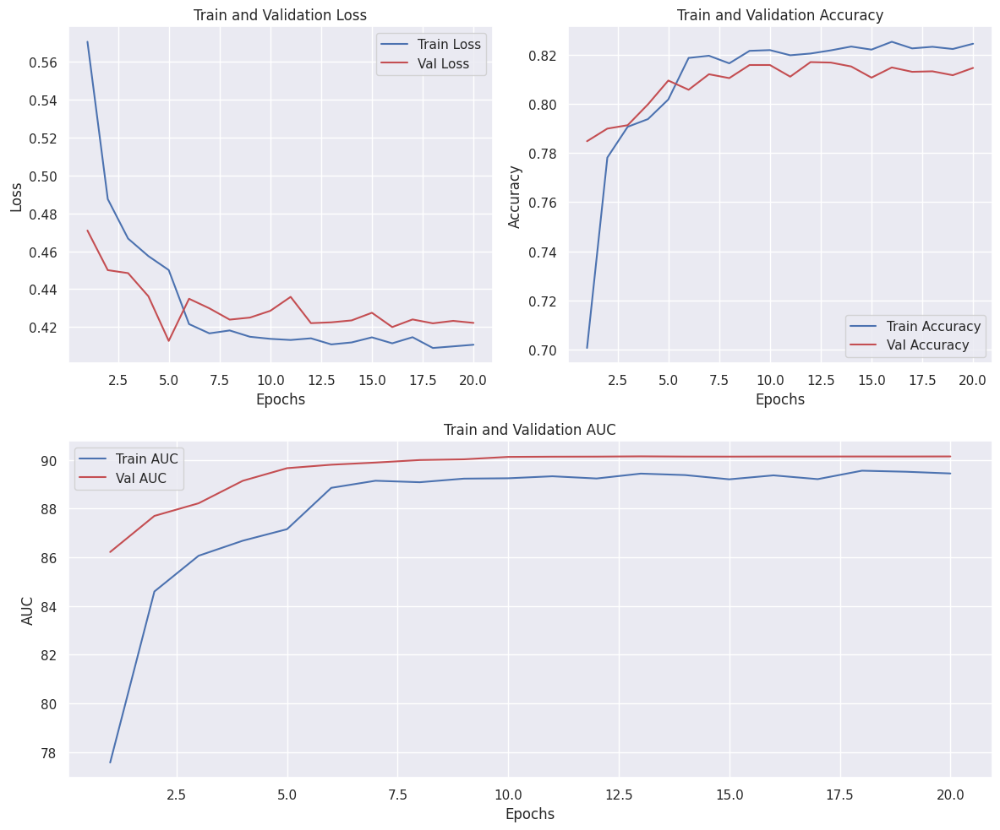

In [17]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [18]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "Z",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "Y",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:00<05:04,  1.02batch/s]

Epoch   1/20:   1%|          | 2/313 [00:01<04:59,  1.04batch/s]

Epoch   1/20:   1%|          | 3/313 [00:02<04:57,  1.04batch/s]

Epoch   1/20:   1%|▏         | 4/313 [00:03<05:04,  1.01batch/s]

Epoch   1/20:   2%|▏         | 5/313 [00:04<05:00,  1.03batch/s]

Epoch   1/20:   2%|▏         | 6/313 [00:05<04:57,  1.03batch/s]

Epoch   1/20:   2%|▏         | 7/313 [00:06<04:55,  1.04batch/s]

Epoch   1/20:   3%|▎         | 8/313 [00:07<04:53,  1.04batch/s]

Epoch   1/20:   3%|▎         | 9/313 [00:08<04:52,  1.04batch/s]

Epoch   1/20:   3%|▎         | 10/313 [00:09<04:50,  1.04batch/s]

Epoch   1/20:   4%|▎         | 11/313 [00:10<04:49,  1.04batch/s]

Epoch   1/20:   4%|▍         | 12/313 [00:11<04:48,  1.04batch/s]

Epoch   1/20:   4%|▍         | 13/313 [00:12<04:47,  1.04batch/s]

Epoch   1/20:   4%|▍         | 14/313 [00:13<04:46,  1.04batch/s]

Epoch   1/20:   5%|▍         | 15/313 [00:14<04:44,  1.05batch/s]

Epoch   1/20:   5%|▌         | 16/313 [00:15<04:43,  1.05batch/s]

Epoch   1/20:   5%|▌         | 17/313 [00:16<05:24,  1.10s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:17<05:24,  1.10s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:18<05:10,  1.06s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:19<05:00,  1.03s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:20<04:52,  1.00s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:21<04:47,  1.01batch/s]

Epoch   1/20:   7%|▋         | 23/313 [00:22<04:44,  1.02batch/s]

Epoch   1/20:   8%|▊         | 24/313 [00:23<04:41,  1.03batch/s]

Epoch   1/20:   8%|▊         | 25/313 [00:24<04:38,  1.03batch/s]

Epoch   1/20:   8%|▊         | 26/313 [00:25<04:36,  1.04batch/s]

Epoch   1/20:   9%|▊         | 27/313 [00:26<04:35,  1.04batch/s]

Epoch   1/20:   9%|▉         | 28/313 [00:27<04:34,  1.04batch/s]

Epoch   1/20:   9%|▉         | 29/313 [00:28<04:32,  1.04batch/s]

Epoch   1/20:  10%|▉         | 30/313 [00:29<04:52,  1.03s/batch]

Epoch   1/20:  10%|▉         | 31/313 [00:30<04:45,  1.01s/batch]

Epoch   1/20:  10%|█         | 32/313 [00:32<05:20,  1.14s/batch]

Epoch   1/20:  11%|█         | 33/313 [00:33<05:42,  1.22s/batch]

Epoch   1/20:  11%|█         | 34/313 [00:34<05:54,  1.27s/batch]

Epoch   1/20:  11%|█         | 35/313 [00:35<05:27,  1.18s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [00:36<05:07,  1.11s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [00:37<04:53,  1.06s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [00:38<04:43,  1.03s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [00:39<04:36,  1.01s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [00:40<04:30,  1.01batch/s]

Epoch   1/20:  13%|█▎        | 41/313 [00:41<04:27,  1.02batch/s]

Epoch   1/20:  13%|█▎        | 42/313 [00:42<04:23,  1.03batch/s]

Epoch   1/20:  14%|█▎        | 43/313 [00:43<04:21,  1.03batch/s]

Epoch   1/20:  14%|█▍        | 44/313 [00:44<04:19,  1.04batch/s]

Epoch   1/20:  14%|█▍        | 45/313 [00:45<04:18,  1.04batch/s]

Epoch   1/20:  15%|█▍        | 46/313 [00:46<04:16,  1.04batch/s]

Epoch   1/20:  15%|█▌        | 47/313 [00:47<04:34,  1.03s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [00:48<04:27,  1.01s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [00:49<04:22,  1.00batch/s]

Epoch   1/20:  16%|█▌        | 50/313 [00:50<04:18,  1.02batch/s]

Epoch   1/20:  16%|█▋        | 51/313 [00:51<04:15,  1.03batch/s]

Epoch   1/20:  17%|█▋        | 52/313 [00:52<04:12,  1.03batch/s]

Epoch   1/20:  17%|█▋        | 53/313 [00:53<04:13,  1.03batch/s]

Epoch   1/20:  17%|█▋        | 54/313 [00:54<04:32,  1.05s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [00:55<04:24,  1.03s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [00:56<04:18,  1.01s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [00:57<04:13,  1.01batch/s]

Epoch   1/20:  19%|█▊        | 58/313 [00:58<04:10,  1.02batch/s]

Epoch   1/20:  19%|█▉        | 59/313 [00:59<04:07,  1.03batch/s]

Epoch   1/20:  19%|█▉        | 60/313 [01:00<04:40,  1.11s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [01:02<05:02,  1.20s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [01:03<05:19,  1.27s/batch]

Epoch   1/20:  20%|██        | 63/313 [01:04<04:56,  1.19s/batch]

Epoch   1/20:  20%|██        | 64/313 [01:05<04:38,  1.12s/batch]

Epoch   1/20:  21%|██        | 65/313 [01:06<04:25,  1.07s/batch]

Epoch   1/20:  21%|██        | 66/313 [01:07<04:50,  1.17s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [01:09<04:46,  1.16s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [01:10<04:29,  1.10s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [01:11<04:26,  1.09s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [01:12<04:16,  1.05s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [01:13<04:41,  1.17s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [01:14<04:35,  1.14s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [01:15<04:21,  1.09s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [01:16<04:11,  1.05s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [01:17<04:03,  1.02s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [01:18<03:57,  1.00s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [01:19<03:53,  1.01batch/s]

Epoch   1/20:  25%|██▍       | 78/313 [01:20<03:59,  1.02s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [01:21<03:54,  1.00s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [01:22<03:50,  1.01batch/s]

Epoch   1/20:  26%|██▌       | 81/313 [01:23<03:47,  1.02batch/s]

Epoch   1/20:  26%|██▌       | 82/313 [01:24<03:44,  1.03batch/s]

Epoch   1/20:  27%|██▋       | 83/313 [01:25<03:42,  1.03batch/s]

Epoch   1/20:  27%|██▋       | 84/313 [01:26<03:40,  1.04batch/s]

Epoch   1/20:  27%|██▋       | 85/313 [01:27<03:39,  1.04batch/s]

Epoch   1/20:  27%|██▋       | 86/313 [01:28<03:38,  1.04batch/s]

Epoch   1/20:  28%|██▊       | 87/313 [01:29<03:36,  1.04batch/s]

Epoch   1/20:  28%|██▊       | 88/313 [01:30<03:35,  1.04batch/s]

Epoch   1/20:  28%|██▊       | 89/313 [01:30<03:34,  1.04batch/s]

Epoch   1/20:  29%|██▉       | 90/313 [01:31<03:33,  1.04batch/s]

Epoch   1/20:  29%|██▉       | 91/313 [01:32<03:33,  1.04batch/s]

Epoch   1/20:  29%|██▉       | 92/313 [01:33<03:32,  1.04batch/s]

Epoch   1/20:  30%|██▉       | 93/313 [01:35<04:02,  1.10s/batch]

Epoch   1/20:  30%|███       | 94/313 [01:36<04:22,  1.20s/batch]

Epoch   1/20:  30%|███       | 95/313 [01:38<04:36,  1.27s/batch]

Epoch   1/20:  31%|███       | 96/313 [01:39<04:45,  1.32s/batch]

Epoch   1/20:  31%|███       | 97/313 [01:40<04:21,  1.21s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [01:41<04:04,  1.14s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [01:42<03:51,  1.08s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [01:43<03:52,  1.09s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [01:44<03:43,  1.05s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [01:45<03:36,  1.03s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [01:46<03:46,  1.08s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [01:47<03:53,  1.12s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [01:48<03:42,  1.07s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [01:49<03:35,  1.04s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [01:51<03:52,  1.13s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [01:52<03:40,  1.08s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [01:53<03:32,  1.04s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [01:54<03:52,  1.15s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [01:55<03:40,  1.09s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [01:56<03:31,  1.05s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [01:57<03:47,  1.14s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [01:58<03:36,  1.09s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [01:59<03:31,  1.07s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [02:00<03:24,  1.04s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [02:01<03:20,  1.02s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [02:02<03:15,  1.00s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [02:03<03:12,  1.01batch/s]

Epoch   1/20:  38%|███▊      | 120/313 [02:04<03:13,  1.00s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [02:05<03:10,  1.01batch/s]

Epoch   1/20:  39%|███▉      | 122/313 [02:07<03:34,  1.12s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [02:08<03:27,  1.09s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [02:09<03:18,  1.05s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [02:09<03:12,  1.02s/batch]

Epoch   1/20:  40%|████      | 126/313 [02:10<03:07,  1.00s/batch]

Epoch   1/20:  41%|████      | 127/313 [02:11<03:04,  1.01batch/s]

Epoch   1/20:  41%|████      | 128/313 [02:12<03:01,  1.02batch/s]

Epoch   1/20:  41%|████      | 129/313 [02:13<02:59,  1.03batch/s]

Epoch   1/20:  42%|████▏     | 130/313 [02:14<02:57,  1.03batch/s]

Epoch   1/20:  42%|████▏     | 131/313 [02:15<02:55,  1.04batch/s]

Epoch   1/20:  42%|████▏     | 132/313 [02:16<02:54,  1.04batch/s]

Epoch   1/20:  42%|████▏     | 133/313 [02:17<02:53,  1.04batch/s]

Epoch   1/20:  43%|████▎     | 134/313 [02:18<02:51,  1.04batch/s]

Epoch   1/20:  43%|████▎     | 135/313 [02:19<02:50,  1.04batch/s]

Epoch   1/20:  43%|████▎     | 136/313 [02:20<02:49,  1.04batch/s]

Epoch   1/20:  44%|████▍     | 137/313 [02:21<02:48,  1.04batch/s]

Epoch   1/20:  44%|████▍     | 138/313 [02:22<02:47,  1.05batch/s]

Epoch   1/20:  44%|████▍     | 139/313 [02:23<02:46,  1.04batch/s]

Epoch   1/20:  45%|████▍     | 140/313 [02:24<02:45,  1.04batch/s]

Epoch   1/20:  45%|████▌     | 141/313 [02:25<02:51,  1.00batch/s]

Epoch   1/20:  45%|████▌     | 142/313 [02:26<02:48,  1.02batch/s]

Epoch   1/20:  46%|████▌     | 143/313 [02:27<02:45,  1.02batch/s]

Epoch   1/20:  46%|████▌     | 144/313 [02:28<02:44,  1.03batch/s]

Epoch   1/20:  46%|████▋     | 145/313 [02:29<02:42,  1.03batch/s]

Epoch   1/20:  47%|████▋     | 146/313 [02:30<02:41,  1.04batch/s]

Epoch   1/20:  47%|████▋     | 147/313 [02:31<02:39,  1.04batch/s]

Epoch   1/20:  47%|████▋     | 148/313 [02:32<02:38,  1.04batch/s]

Epoch   1/20:  48%|████▊     | 149/313 [02:33<02:37,  1.04batch/s]

Epoch   1/20:  48%|████▊     | 150/313 [02:34<02:49,  1.04s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [02:35<02:44,  1.01s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [02:36<02:40,  1.00batch/s]

Epoch   1/20:  49%|████▉     | 153/313 [02:37<02:37,  1.02batch/s]

Epoch   1/20:  49%|████▉     | 154/313 [02:38<02:57,  1.12s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [02:39<02:51,  1.08s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [02:40<02:44,  1.05s/batch]

Epoch   1/20:  50%|█████     | 157/313 [02:41<02:38,  1.02s/batch]

Epoch   1/20:  50%|█████     | 158/313 [02:42<02:34,  1.00batch/s]

Epoch   1/20:  51%|█████     | 159/313 [02:43<02:31,  1.01batch/s]

Epoch   1/20:  51%|█████     | 160/313 [02:44<02:29,  1.02batch/s]

Epoch   1/20:  51%|█████▏    | 161/313 [02:45<02:27,  1.03batch/s]

Epoch   1/20:  52%|█████▏    | 162/313 [02:46<02:25,  1.04batch/s]

Epoch   1/20:  52%|█████▏    | 163/313 [02:47<02:24,  1.04batch/s]

Epoch   1/20:  52%|█████▏    | 164/313 [02:48<02:23,  1.04batch/s]

Epoch   1/20:  53%|█████▎    | 165/313 [02:49<02:22,  1.04batch/s]

Epoch   1/20:  53%|█████▎    | 166/313 [02:50<02:21,  1.04batch/s]

Epoch   1/20:  53%|█████▎    | 167/313 [02:51<02:20,  1.04batch/s]

Epoch   1/20:  54%|█████▎    | 168/313 [02:52<02:19,  1.04batch/s]

Epoch   1/20:  54%|█████▍    | 169/313 [02:52<02:18,  1.04batch/s]

Epoch   1/20:  54%|█████▍    | 170/313 [02:53<02:17,  1.04batch/s]

Epoch   1/20:  55%|█████▍    | 171/313 [02:55<02:26,  1.03s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [02:56<02:22,  1.01s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [02:57<02:18,  1.01batch/s]

Epoch   1/20:  56%|█████▌    | 174/313 [02:58<02:16,  1.02batch/s]

Epoch   1/20:  56%|█████▌    | 175/313 [02:58<02:14,  1.03batch/s]

Epoch   1/20:  56%|█████▌    | 176/313 [02:59<02:12,  1.03batch/s]

Epoch   1/20:  57%|█████▋    | 177/313 [03:00<02:11,  1.04batch/s]

Epoch   1/20:  57%|█████▋    | 178/313 [03:01<02:09,  1.04batch/s]

Epoch   1/20:  57%|█████▋    | 179/313 [03:02<02:08,  1.04batch/s]

Epoch   1/20:  58%|█████▊    | 180/313 [03:03<02:07,  1.04batch/s]

Epoch   1/20:  58%|█████▊    | 181/313 [03:04<02:06,  1.04batch/s]

Epoch   1/20:  58%|█████▊    | 182/313 [03:05<02:05,  1.04batch/s]

Epoch   1/20:  58%|█████▊    | 183/313 [03:06<02:04,  1.04batch/s]

Epoch   1/20:  59%|█████▉    | 184/313 [03:07<02:03,  1.04batch/s]

Epoch   1/20:  59%|█████▉    | 185/313 [03:08<02:02,  1.04batch/s]

Epoch   1/20:  59%|█████▉    | 186/313 [03:09<02:19,  1.10s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [03:10<02:13,  1.06s/batch]

Epoch   1/20:  60%|██████    | 188/313 [03:11<02:08,  1.03s/batch]

Epoch   1/20:  60%|██████    | 189/313 [03:12<02:04,  1.01s/batch]

Epoch   1/20:  61%|██████    | 190/313 [03:13<02:02,  1.01batch/s]

Epoch   1/20:  61%|██████    | 191/313 [03:14<01:59,  1.02batch/s]

Epoch   1/20:  61%|██████▏   | 192/313 [03:15<01:57,  1.03batch/s]

Epoch   1/20:  62%|██████▏   | 193/313 [03:16<01:56,  1.03batch/s]

Epoch   1/20:  62%|██████▏   | 194/313 [03:18<02:07,  1.08s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [03:18<02:02,  1.04s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [03:19<01:58,  1.02s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [03:20<01:55,  1.00batch/s]

Epoch   1/20:  63%|██████▎   | 198/313 [03:21<01:53,  1.02batch/s]

Epoch   1/20:  64%|██████▎   | 199/313 [03:22<01:51,  1.02batch/s]

Epoch   1/20:  64%|██████▍   | 200/313 [03:23<01:56,  1.03s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [03:24<01:53,  1.01s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [03:25<01:50,  1.00batch/s]

Epoch   1/20:  65%|██████▍   | 203/313 [03:26<01:48,  1.02batch/s]

Epoch   1/20:  65%|██████▌   | 204/313 [03:27<01:46,  1.03batch/s]

Epoch   1/20:  65%|██████▌   | 205/313 [03:28<01:44,  1.03batch/s]

Epoch   1/20:  66%|██████▌   | 206/313 [03:29<01:43,  1.04batch/s]

Epoch   1/20:  66%|██████▌   | 207/313 [03:30<01:42,  1.04batch/s]

Epoch   1/20:  66%|██████▋   | 208/313 [03:31<01:40,  1.04batch/s]

Epoch   1/20:  67%|██████▋   | 209/313 [03:33<01:54,  1.10s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [03:34<01:55,  1.12s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [03:35<01:49,  1.08s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [03:36<01:45,  1.05s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [03:37<01:42,  1.03s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [03:38<01:40,  1.01s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [03:39<01:41,  1.04s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [03:40<01:38,  1.02s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [03:41<01:49,  1.14s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [03:43<01:56,  1.23s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [03:44<01:51,  1.19s/batch]

Epoch   1/20:  70%|███████   | 220/313 [03:45<01:44,  1.12s/batch]

Epoch   1/20:  71%|███████   | 221/313 [03:46<01:42,  1.12s/batch]

Epoch   1/20:  71%|███████   | 222/313 [03:47<01:37,  1.07s/batch]

Epoch   1/20:  71%|███████   | 223/313 [03:48<01:33,  1.04s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [03:49<01:30,  1.02s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [03:50<01:27,  1.00batch/s]

Epoch   1/20:  72%|███████▏  | 226/313 [03:51<01:27,  1.01s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [03:52<01:25,  1.00batch/s]

Epoch   1/20:  73%|███████▎  | 228/313 [03:53<01:36,  1.13s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [03:54<01:37,  1.16s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [03:55<01:31,  1.10s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [03:56<01:27,  1.06s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [03:57<01:23,  1.03s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [03:58<01:20,  1.01s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [03:59<01:18,  1.00batch/s]

Epoch   1/20:  75%|███████▌  | 235/313 [04:00<01:17,  1.01batch/s]

Epoch   1/20:  75%|███████▌  | 236/313 [04:01<01:26,  1.12s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [04:03<01:29,  1.17s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [04:04<01:23,  1.11s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [04:05<01:18,  1.06s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [04:06<01:15,  1.03s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [04:07<01:12,  1.01s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [04:08<01:15,  1.06s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [04:09<01:11,  1.03s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [04:10<01:14,  1.08s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [04:11<01:13,  1.08s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [04:12<01:19,  1.19s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [04:14<01:23,  1.26s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [04:15<01:19,  1.23s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [04:16<01:13,  1.15s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [04:17<01:08,  1.09s/batch]

Epoch   1/20:  80%|████████  | 251/313 [04:18<01:05,  1.05s/batch]

Epoch   1/20:  81%|████████  | 252/313 [04:19<01:03,  1.03s/batch]

Epoch   1/20:  81%|████████  | 253/313 [04:20<01:00,  1.01s/batch]

Epoch   1/20:  81%|████████  | 254/313 [04:21<00:58,  1.00batch/s]

Epoch   1/20:  81%|████████▏ | 255/313 [04:22<01:02,  1.07s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [04:23<00:59,  1.04s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [04:24<00:58,  1.04s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [04:25<00:55,  1.02s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [04:26<00:54,  1.00s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [04:27<00:52,  1.01batch/s]

Epoch   1/20:  83%|████████▎ | 261/313 [04:28<00:51,  1.02batch/s]

Epoch   1/20:  84%|████████▎ | 262/313 [04:29<00:49,  1.02batch/s]

Epoch   1/20:  84%|████████▍ | 263/313 [04:30<00:48,  1.03batch/s]

Epoch   1/20:  84%|████████▍ | 264/313 [04:31<00:47,  1.03batch/s]

Epoch   1/20:  85%|████████▍ | 265/313 [04:32<00:46,  1.03batch/s]

Epoch   1/20:  85%|████████▍ | 266/313 [04:33<00:45,  1.03batch/s]

Epoch   1/20:  85%|████████▌ | 267/313 [04:34<00:44,  1.04batch/s]

Epoch   1/20:  86%|████████▌ | 268/313 [04:35<00:43,  1.04batch/s]

Epoch   1/20:  86%|████████▌ | 269/313 [04:36<00:42,  1.04batch/s]

Epoch   1/20:  86%|████████▋ | 270/313 [04:37<00:41,  1.03batch/s]

Epoch   1/20:  87%|████████▋ | 271/313 [04:38<00:40,  1.03batch/s]

Epoch   1/20:  87%|████████▋ | 272/313 [04:39<00:39,  1.04batch/s]

Epoch   1/20:  87%|████████▋ | 273/313 [04:40<00:38,  1.04batch/s]

Epoch   1/20:  88%|████████▊ | 274/313 [04:41<00:38,  1.02batch/s]

Epoch   1/20:  88%|████████▊ | 275/313 [04:41<00:37,  1.03batch/s]

Epoch   1/20:  88%|████████▊ | 276/313 [04:42<00:35,  1.03batch/s]

Epoch   1/20:  88%|████████▊ | 277/313 [04:44<00:39,  1.11s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [04:45<00:42,  1.20s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [04:46<00:40,  1.18s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [04:47<00:36,  1.11s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [04:48<00:34,  1.08s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [04:50<00:36,  1.18s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [04:51<00:33,  1.12s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [04:52<00:31,  1.07s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [04:53<00:29,  1.04s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [04:54<00:27,  1.01s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [04:55<00:25,  1.00batch/s]

Epoch   1/20:  92%|█████████▏| 288/313 [04:56<00:24,  1.01batch/s]

Epoch   1/20:  92%|█████████▏| 289/313 [04:57<00:23,  1.03batch/s]

Epoch   1/20:  93%|█████████▎| 290/313 [04:57<00:22,  1.03batch/s]

Epoch   1/20:  93%|█████████▎| 291/313 [04:58<00:21,  1.04batch/s]

Epoch   1/20:  93%|█████████▎| 292/313 [04:59<00:20,  1.04batch/s]

Epoch   1/20:  94%|█████████▎| 293/313 [05:00<00:19,  1.04batch/s]

Epoch   1/20:  94%|█████████▍| 294/313 [05:01<00:18,  1.04batch/s]

Epoch   1/20:  94%|█████████▍| 295/313 [05:02<00:17,  1.04batch/s]

Epoch   1/20:  95%|█████████▍| 296/313 [05:03<00:16,  1.04batch/s]

Epoch   1/20:  95%|█████████▍| 297/313 [05:04<00:15,  1.04batch/s]

Epoch   1/20:  95%|█████████▌| 298/313 [05:05<00:14,  1.04batch/s]

Epoch   1/20:  96%|█████████▌| 299/313 [05:06<00:13,  1.04batch/s]

Epoch   1/20:  96%|█████████▌| 300/313 [05:07<00:12,  1.05batch/s]

Epoch   1/20:  96%|█████████▌| 301/313 [05:08<00:11,  1.04batch/s]

Epoch   1/20:  96%|█████████▋| 302/313 [05:09<00:10,  1.05batch/s]

Epoch   1/20:  97%|█████████▋| 303/313 [05:10<00:09,  1.05batch/s]

Epoch   1/20:  97%|█████████▋| 304/313 [05:11<00:08,  1.05batch/s]

Epoch   1/20:  97%|█████████▋| 305/313 [05:12<00:07,  1.05batch/s]

Epoch   1/20:  98%|█████████▊| 306/313 [05:13<00:06,  1.05batch/s]

Epoch   1/20:  98%|█████████▊| 307/313 [05:14<00:05,  1.05batch/s]

Epoch   1/20:  98%|█████████▊| 308/313 [05:15<00:05,  1.10s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [05:16<00:04,  1.16s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [05:18<00:03,  1.18s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [05:19<00:02,  1.11s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [05:20<00:01,  1.06s/batch]

Epoch   1/20: 100%|██████████| 313/313 [05:20<00:00,  1.05batch/s]

Epoch   1/20: 100%|██████████| 313/313 [05:20<00:00,  1.05batch/s, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [05:53<00:00,  1.05batch/s, Epoch = 5m 53s, Loss = 0.5939|0.4837, Acc = 0.685|0.777, AUC = 75.081|85.560]

Epoch   1/20: 100%|██████████| 313/313 [05:53<00:00,  1.13s/batch, Epoch = 5m 53s, Loss = 0.5939|0.4837, Acc = 0.685|0.777, AUC = 75.081|85.560]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:01<07:21,  1.41s/batch]

Epoch   2/20:   1%|          | 2/313 [00:02<05:59,  1.16s/batch]

Epoch   2/20:   1%|          | 3/313 [00:03<05:31,  1.07s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:04<05:18,  1.03s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:05<05:09,  1.00s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:06<05:04,  1.01batch/s]

Epoch   2/20:   2%|▏         | 7/313 [00:07<05:00,  1.02batch/s]

Epoch   2/20:   3%|▎         | 8/313 [00:08<04:57,  1.02batch/s]

Epoch   2/20:   3%|▎         | 9/313 [00:09<04:56,  1.03batch/s]

Epoch   2/20:   3%|▎         | 10/313 [00:10<04:54,  1.03batch/s]

Epoch   2/20:   4%|▎         | 11/313 [00:11<04:53,  1.03batch/s]

Epoch   2/20:   4%|▍         | 12/313 [00:12<04:51,  1.03batch/s]

Epoch   2/20:   4%|▍         | 13/313 [00:13<04:50,  1.03batch/s]

Epoch   2/20:   4%|▍         | 14/313 [00:13<04:49,  1.03batch/s]

Epoch   2/20:   5%|▍         | 15/313 [00:14<04:47,  1.04batch/s]

Epoch   2/20:   5%|▌         | 16/313 [00:15<04:46,  1.04batch/s]

Epoch   2/20:   5%|▌         | 17/313 [00:16<04:45,  1.04batch/s]

Epoch   2/20:   6%|▌         | 18/313 [00:17<04:44,  1.04batch/s]

Epoch   2/20:   6%|▌         | 19/313 [00:18<04:44,  1.04batch/s]

Epoch   2/20:   6%|▋         | 20/313 [00:19<04:42,  1.04batch/s]

Epoch   2/20:   7%|▋         | 21/313 [00:20<04:42,  1.03batch/s]

Epoch   2/20:   7%|▋         | 22/313 [00:21<04:41,  1.04batch/s]

Epoch   2/20:   7%|▋         | 23/313 [00:22<04:40,  1.03batch/s]

Epoch   2/20:   8%|▊         | 24/313 [00:23<04:39,  1.03batch/s]

Epoch   2/20:   8%|▊         | 25/313 [00:24<04:39,  1.03batch/s]

Epoch   2/20:   8%|▊         | 26/313 [00:25<04:38,  1.03batch/s]

Epoch   2/20:   9%|▊         | 27/313 [00:26<04:37,  1.03batch/s]

Epoch   2/20:   9%|▉         | 28/313 [00:27<04:35,  1.03batch/s]

Epoch   2/20:   9%|▉         | 29/313 [00:28<04:34,  1.03batch/s]

Epoch   2/20:  10%|▉         | 30/313 [00:29<04:35,  1.03batch/s]

Epoch   2/20:  10%|▉         | 31/313 [00:30<04:37,  1.02batch/s]

Epoch   2/20:  10%|█         | 32/313 [00:31<04:34,  1.02batch/s]

Epoch   2/20:  11%|█         | 33/313 [00:32<05:13,  1.12s/batch]

Epoch   2/20:  11%|█         | 34/313 [00:34<05:27,  1.18s/batch]

Epoch   2/20:  11%|█         | 35/313 [00:35<05:09,  1.11s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [00:36<04:55,  1.07s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [00:37<04:47,  1.04s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [00:38<04:39,  1.02s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [00:39<04:33,  1.00batch/s]

Epoch   2/20:  13%|█▎        | 40/313 [00:39<04:29,  1.01batch/s]

Epoch   2/20:  13%|█▎        | 41/313 [00:40<04:26,  1.02batch/s]

Epoch   2/20:  13%|█▎        | 42/313 [00:41<04:23,  1.03batch/s]

Epoch   2/20:  14%|█▎        | 43/313 [00:42<04:21,  1.03batch/s]

Epoch   2/20:  14%|█▍        | 44/313 [00:43<04:20,  1.03batch/s]

Epoch   2/20:  14%|█▍        | 45/313 [00:44<04:19,  1.03batch/s]

Epoch   2/20:  15%|█▍        | 46/313 [00:46<04:54,  1.10s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [00:47<05:06,  1.15s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [00:48<04:50,  1.10s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [00:49<04:38,  1.06s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [00:50<04:31,  1.03s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [00:51<04:24,  1.01s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [00:52<04:21,  1.00s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [00:53<04:20,  1.00s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [00:54<04:17,  1.01batch/s]

Epoch   2/20:  18%|█▊        | 55/313 [00:55<04:13,  1.02batch/s]

Epoch   2/20:  18%|█▊        | 56/313 [00:56<04:12,  1.02batch/s]

Epoch   2/20:  18%|█▊        | 57/313 [00:57<04:10,  1.02batch/s]

Epoch   2/20:  19%|█▊        | 58/313 [00:58<04:08,  1.03batch/s]

Epoch   2/20:  19%|█▉        | 59/313 [00:59<04:07,  1.03batch/s]

Epoch   2/20:  19%|█▉        | 60/313 [01:00<04:06,  1.03batch/s]

Epoch   2/20:  19%|█▉        | 61/313 [01:01<04:04,  1.03batch/s]

Epoch   2/20:  20%|█▉        | 62/313 [01:02<04:32,  1.08s/batch]

Epoch   2/20:  20%|██        | 63/313 [01:03<04:22,  1.05s/batch]

Epoch   2/20:  20%|██        | 64/313 [01:04<04:50,  1.17s/batch]

Epoch   2/20:  21%|██        | 65/313 [01:05<04:35,  1.11s/batch]

Epoch   2/20:  21%|██        | 66/313 [01:06<04:23,  1.07s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [01:07<04:15,  1.04s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [01:08<04:08,  1.02s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [01:09<04:04,  1.00s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [01:10<04:01,  1.01batch/s]

Epoch   2/20:  23%|██▎       | 71/313 [01:11<03:58,  1.01batch/s]

Epoch   2/20:  23%|██▎       | 72/313 [01:12<03:56,  1.02batch/s]

Epoch   2/20:  23%|██▎       | 73/313 [01:13<03:54,  1.02batch/s]

Epoch   2/20:  24%|██▎       | 74/313 [01:14<03:53,  1.03batch/s]

Epoch   2/20:  24%|██▍       | 75/313 [01:15<03:51,  1.03batch/s]

Epoch   2/20:  24%|██▍       | 76/313 [01:16<03:50,  1.03batch/s]

Epoch   2/20:  25%|██▍       | 77/313 [01:17<03:49,  1.03batch/s]

Epoch   2/20:  25%|██▍       | 78/313 [01:18<03:48,  1.03batch/s]

Epoch   2/20:  25%|██▌       | 79/313 [01:19<03:47,  1.03batch/s]

Epoch   2/20:  26%|██▌       | 80/313 [01:20<03:46,  1.03batch/s]

Epoch   2/20:  26%|██▌       | 81/313 [01:21<03:45,  1.03batch/s]

Epoch   2/20:  26%|██▌       | 82/313 [01:22<03:44,  1.03batch/s]

Epoch   2/20:  27%|██▋       | 83/313 [01:23<03:43,  1.03batch/s]

Epoch   2/20:  27%|██▋       | 84/313 [01:24<03:42,  1.03batch/s]

Epoch   2/20:  27%|██▋       | 85/313 [01:25<03:41,  1.03batch/s]

Epoch   2/20:  27%|██▋       | 86/313 [01:26<03:40,  1.03batch/s]

Epoch   2/20:  28%|██▊       | 87/313 [01:27<03:39,  1.03batch/s]

Epoch   2/20:  28%|██▊       | 88/313 [01:28<03:38,  1.03batch/s]

Epoch   2/20:  28%|██▊       | 89/313 [01:29<03:37,  1.03batch/s]

Epoch   2/20:  29%|██▉       | 90/313 [01:30<03:36,  1.03batch/s]

Epoch   2/20:  29%|██▉       | 91/313 [01:31<03:35,  1.03batch/s]

Epoch   2/20:  29%|██▉       | 92/313 [01:32<03:34,  1.03batch/s]

Epoch   2/20:  30%|██▉       | 93/313 [01:32<03:33,  1.03batch/s]

Epoch   2/20:  30%|███       | 94/313 [01:33<03:32,  1.03batch/s]

Epoch   2/20:  30%|███       | 95/313 [01:34<03:31,  1.03batch/s]

Epoch   2/20:  31%|███       | 96/313 [01:36<04:01,  1.11s/batch]

Epoch   2/20:  31%|███       | 97/313 [01:37<03:53,  1.08s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [01:38<03:45,  1.05s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [01:39<03:39,  1.02s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [01:40<03:34,  1.01s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [01:41<03:30,  1.01batch/s]

Epoch   2/20:  33%|███▎      | 102/313 [01:42<03:28,  1.01batch/s]

Epoch   2/20:  33%|███▎      | 103/313 [01:43<03:26,  1.02batch/s]

Epoch   2/20:  33%|███▎      | 104/313 [01:44<03:24,  1.02batch/s]

Epoch   2/20:  34%|███▎      | 105/313 [01:45<03:23,  1.02batch/s]

Epoch   2/20:  34%|███▍      | 106/313 [01:46<03:32,  1.03s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [01:47<03:27,  1.01s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [01:48<03:23,  1.01batch/s]

Epoch   2/20:  35%|███▍      | 109/313 [01:49<03:21,  1.01batch/s]

Epoch   2/20:  35%|███▌      | 110/313 [01:50<03:18,  1.02batch/s]

Epoch   2/20:  35%|███▌      | 111/313 [01:51<03:16,  1.03batch/s]

Epoch   2/20:  36%|███▌      | 112/313 [01:52<03:15,  1.03batch/s]

Epoch   2/20:  36%|███▌      | 113/313 [01:53<03:14,  1.03batch/s]

Epoch   2/20:  36%|███▋      | 114/313 [01:54<03:12,  1.03batch/s]

Epoch   2/20:  37%|███▋      | 115/313 [01:54<03:11,  1.03batch/s]

Epoch   2/20:  37%|███▋      | 116/313 [01:55<03:10,  1.03batch/s]

Epoch   2/20:  37%|███▋      | 117/313 [01:56<03:09,  1.04batch/s]

Epoch   2/20:  38%|███▊      | 118/313 [01:57<03:08,  1.04batch/s]

Epoch   2/20:  38%|███▊      | 119/313 [01:58<03:07,  1.04batch/s]

Epoch   2/20:  38%|███▊      | 120/313 [01:59<03:06,  1.04batch/s]

Epoch   2/20:  39%|███▊      | 121/313 [02:00<03:05,  1.04batch/s]

Epoch   2/20:  39%|███▉      | 122/313 [02:01<03:04,  1.03batch/s]

Epoch   2/20:  39%|███▉      | 123/313 [02:02<03:03,  1.04batch/s]

Epoch   2/20:  40%|███▉      | 124/313 [02:03<03:03,  1.03batch/s]

Epoch   2/20:  40%|███▉      | 125/313 [02:04<03:02,  1.03batch/s]

Epoch   2/20:  40%|████      | 126/313 [02:05<03:01,  1.03batch/s]

Epoch   2/20:  41%|████      | 127/313 [02:06<02:59,  1.03batch/s]

Epoch   2/20:  41%|████      | 128/313 [02:08<03:25,  1.11s/batch]

Epoch   2/20:  41%|████      | 129/313 [02:09<03:25,  1.12s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [02:10<03:15,  1.07s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [02:11<03:08,  1.04s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [02:12<03:04,  1.02s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [02:13<03:00,  1.00s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [02:13<02:57,  1.01batch/s]

Epoch   2/20:  43%|████▎     | 135/313 [02:15<03:14,  1.09s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [02:16<03:06,  1.05s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [02:17<03:00,  1.03s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [02:18<02:56,  1.01s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [02:19<03:14,  1.12s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [02:20<03:05,  1.07s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [02:21<02:59,  1.04s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [02:22<02:55,  1.03s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [02:23<02:51,  1.01s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [02:24<02:47,  1.01batch/s]

Epoch   2/20:  46%|████▋     | 145/313 [02:25<02:44,  1.02batch/s]

Epoch   2/20:  47%|████▋     | 146/313 [02:26<02:42,  1.03batch/s]

Epoch   2/20:  47%|████▋     | 147/313 [02:27<02:40,  1.03batch/s]

Epoch   2/20:  47%|████▋     | 148/313 [02:28<02:38,  1.04batch/s]

Epoch   2/20:  48%|████▊     | 149/313 [02:29<02:37,  1.04batch/s]

Epoch   2/20:  48%|████▊     | 150/313 [02:30<02:36,  1.04batch/s]

Epoch   2/20:  48%|████▊     | 151/313 [02:31<02:35,  1.04batch/s]

Epoch   2/20:  49%|████▊     | 152/313 [02:32<02:34,  1.04batch/s]

Epoch   2/20:  49%|████▉     | 153/313 [02:33<02:34,  1.04batch/s]

Epoch   2/20:  49%|████▉     | 154/313 [02:34<02:34,  1.03batch/s]

Epoch   2/20:  50%|████▉     | 155/313 [02:34<02:33,  1.03batch/s]

Epoch   2/20:  50%|████▉     | 156/313 [02:35<02:32,  1.03batch/s]

Epoch   2/20:  50%|█████     | 157/313 [02:36<02:31,  1.03batch/s]

Epoch   2/20:  50%|█████     | 158/313 [02:37<02:30,  1.03batch/s]

Epoch   2/20:  51%|█████     | 159/313 [02:39<02:51,  1.11s/batch]

Epoch   2/20:  51%|█████     | 160/313 [02:40<02:43,  1.07s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [02:41<02:38,  1.04s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [02:42<02:34,  1.02s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [02:43<02:31,  1.01s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [02:44<02:28,  1.00batch/s]

Epoch   2/20:  53%|█████▎    | 165/313 [02:45<02:32,  1.03s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [02:46<02:31,  1.03s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [02:47<02:27,  1.01s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [02:48<02:24,  1.00batch/s]

Epoch   2/20:  54%|█████▍    | 169/313 [02:49<02:22,  1.01batch/s]

Epoch   2/20:  54%|█████▍    | 170/313 [02:50<02:20,  1.02batch/s]

Epoch   2/20:  55%|█████▍    | 171/313 [02:51<02:18,  1.02batch/s]

Epoch   2/20:  55%|█████▍    | 172/313 [02:52<02:17,  1.03batch/s]

Epoch   2/20:  55%|█████▌    | 173/313 [02:53<02:15,  1.03batch/s]

Epoch   2/20:  56%|█████▌    | 174/313 [02:54<02:14,  1.03batch/s]

Epoch   2/20:  56%|█████▌    | 175/313 [02:55<02:14,  1.03batch/s]

Epoch   2/20:  56%|█████▌    | 176/313 [02:56<02:12,  1.03batch/s]

Epoch   2/20:  57%|█████▋    | 177/313 [02:56<02:11,  1.03batch/s]

Epoch   2/20:  57%|█████▋    | 178/313 [02:57<02:10,  1.03batch/s]

Epoch   2/20:  57%|█████▋    | 179/313 [02:58<02:09,  1.04batch/s]

Epoch   2/20:  58%|█████▊    | 180/313 [02:59<02:08,  1.04batch/s]

Epoch   2/20:  58%|█████▊    | 181/313 [03:00<02:07,  1.04batch/s]

Epoch   2/20:  58%|█████▊    | 182/313 [03:01<02:06,  1.04batch/s]

Epoch   2/20:  58%|█████▊    | 183/313 [03:02<02:05,  1.04batch/s]

Epoch   2/20:  59%|█████▉    | 184/313 [03:03<02:04,  1.03batch/s]

Epoch   2/20:  59%|█████▉    | 185/313 [03:04<02:03,  1.04batch/s]

Epoch   2/20:  59%|█████▉    | 186/313 [03:05<02:02,  1.04batch/s]

Epoch   2/20:  60%|█████▉    | 187/313 [03:06<02:01,  1.04batch/s]

Epoch   2/20:  60%|██████    | 188/313 [03:07<02:00,  1.04batch/s]

Epoch   2/20:  60%|██████    | 189/313 [03:08<01:59,  1.04batch/s]

Epoch   2/20:  61%|██████    | 190/313 [03:09<01:58,  1.04batch/s]

Epoch   2/20:  61%|██████    | 191/313 [03:10<02:15,  1.11s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [03:12<02:15,  1.12s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [03:13<02:09,  1.08s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [03:14<02:04,  1.04s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [03:15<02:00,  1.02s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [03:15<01:57,  1.00s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [03:16<01:54,  1.01batch/s]

Epoch   2/20:  63%|██████▎   | 198/313 [03:17<01:53,  1.02batch/s]

Epoch   2/20:  64%|██████▎   | 199/313 [03:18<01:51,  1.02batch/s]

Epoch   2/20:  64%|██████▍   | 200/313 [03:19<01:50,  1.03batch/s]

Epoch   2/20:  64%|██████▍   | 201/313 [03:21<02:01,  1.09s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [03:22<01:56,  1.05s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [03:23<01:52,  1.02s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [03:24<01:49,  1.01s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [03:25<01:47,  1.01batch/s]

Epoch   2/20:  66%|██████▌   | 206/313 [03:26<01:45,  1.02batch/s]

Epoch   2/20:  66%|██████▌   | 207/313 [03:26<01:43,  1.02batch/s]

Epoch   2/20:  66%|██████▋   | 208/313 [03:27<01:42,  1.03batch/s]

Epoch   2/20:  67%|██████▋   | 209/313 [03:28<01:41,  1.03batch/s]

Epoch   2/20:  67%|██████▋   | 210/313 [03:29<01:39,  1.03batch/s]

Epoch   2/20:  67%|██████▋   | 211/313 [03:30<01:38,  1.03batch/s]

Epoch   2/20:  68%|██████▊   | 212/313 [03:31<01:37,  1.03batch/s]

Epoch   2/20:  68%|██████▊   | 213/313 [03:32<01:36,  1.03batch/s]

Epoch   2/20:  68%|██████▊   | 214/313 [03:33<01:35,  1.03batch/s]

Epoch   2/20:  69%|██████▊   | 215/313 [03:34<01:34,  1.03batch/s]

Epoch   2/20:  69%|██████▉   | 216/313 [03:35<01:33,  1.03batch/s]

Epoch   2/20:  69%|██████▉   | 217/313 [03:36<01:32,  1.03batch/s]

Epoch   2/20:  70%|██████▉   | 218/313 [03:37<01:31,  1.04batch/s]

Epoch   2/20:  70%|██████▉   | 219/313 [03:38<01:30,  1.03batch/s]

Epoch   2/20:  70%|███████   | 220/313 [03:39<01:29,  1.03batch/s]

Epoch   2/20:  71%|███████   | 221/313 [03:40<01:28,  1.03batch/s]

Epoch   2/20:  71%|███████   | 222/313 [03:41<01:27,  1.03batch/s]

Epoch   2/20:  71%|███████   | 223/313 [03:42<01:40,  1.11s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [03:43<01:35,  1.07s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [03:44<01:31,  1.04s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [03:45<01:28,  1.02s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [03:46<01:26,  1.00s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [03:47<01:29,  1.05s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [03:48<01:26,  1.03s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [03:49<01:23,  1.01s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [03:50<01:21,  1.00batch/s]

Epoch   2/20:  74%|███████▍  | 232/313 [03:51<01:20,  1.01batch/s]

Epoch   2/20:  74%|███████▍  | 233/313 [03:52<01:18,  1.02batch/s]

Epoch   2/20:  75%|███████▍  | 234/313 [03:53<01:17,  1.02batch/s]

Epoch   2/20:  75%|███████▌  | 235/313 [03:54<01:15,  1.03batch/s]

Epoch   2/20:  75%|███████▌  | 236/313 [03:55<01:14,  1.03batch/s]

Epoch   2/20:  76%|███████▌  | 237/313 [03:56<01:13,  1.03batch/s]

Epoch   2/20:  76%|███████▌  | 238/313 [03:57<01:12,  1.03batch/s]

Epoch   2/20:  76%|███████▋  | 239/313 [03:58<01:11,  1.03batch/s]

Epoch   2/20:  77%|███████▋  | 240/313 [03:59<01:10,  1.03batch/s]

Epoch   2/20:  77%|███████▋  | 241/313 [04:00<01:09,  1.03batch/s]

Epoch   2/20:  77%|███████▋  | 242/313 [04:01<01:08,  1.03batch/s]

Epoch   2/20:  78%|███████▊  | 243/313 [04:02<01:07,  1.03batch/s]

Epoch   2/20:  78%|███████▊  | 244/313 [04:03<01:06,  1.03batch/s]

Epoch   2/20:  78%|███████▊  | 245/313 [04:04<01:05,  1.03batch/s]

Epoch   2/20:  79%|███████▊  | 246/313 [04:05<01:04,  1.03batch/s]

Epoch   2/20:  79%|███████▉  | 247/313 [04:06<01:03,  1.03batch/s]

Epoch   2/20:  79%|███████▉  | 248/313 [04:07<01:02,  1.03batch/s]

Epoch   2/20:  80%|███████▉  | 249/313 [04:08<01:02,  1.03batch/s]

Epoch   2/20:  80%|███████▉  | 250/313 [04:09<01:01,  1.03batch/s]

Epoch   2/20:  80%|████████  | 251/313 [04:10<01:00,  1.03batch/s]

Epoch   2/20:  81%|████████  | 252/313 [04:11<00:59,  1.03batch/s]

Epoch   2/20:  81%|████████  | 253/313 [04:12<00:58,  1.03batch/s]

Epoch   2/20:  81%|████████  | 254/313 [04:13<00:57,  1.03batch/s]

Epoch   2/20:  81%|████████▏ | 255/313 [04:14<01:00,  1.05s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [04:15<00:58,  1.03s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [04:16<00:56,  1.01s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [04:17<00:55,  1.00s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [04:18<00:53,  1.01batch/s]

Epoch   2/20:  83%|████████▎ | 260/313 [04:19<00:52,  1.01batch/s]

Epoch   2/20:  83%|████████▎ | 261/313 [04:20<00:51,  1.02batch/s]

Epoch   2/20:  84%|████████▎ | 262/313 [04:21<00:49,  1.02batch/s]

Epoch   2/20:  84%|████████▍ | 263/313 [04:22<00:48,  1.02batch/s]

Epoch   2/20:  84%|████████▍ | 264/313 [04:23<00:47,  1.03batch/s]

Epoch   2/20:  85%|████████▍ | 265/313 [04:24<00:46,  1.03batch/s]

Epoch   2/20:  85%|████████▍ | 266/313 [04:25<00:45,  1.03batch/s]

Epoch   2/20:  85%|████████▌ | 267/313 [04:26<00:44,  1.03batch/s]

Epoch   2/20:  86%|████████▌ | 268/313 [04:27<00:44,  1.02batch/s]

Epoch   2/20:  86%|████████▌ | 269/313 [04:28<00:43,  1.02batch/s]

Epoch   2/20:  86%|████████▋ | 270/313 [04:29<00:41,  1.03batch/s]

Epoch   2/20:  87%|████████▋ | 271/313 [04:29<00:40,  1.03batch/s]

Epoch   2/20:  87%|████████▋ | 272/313 [04:30<00:39,  1.03batch/s]

Epoch   2/20:  87%|████████▋ | 273/313 [04:31<00:38,  1.03batch/s]

Epoch   2/20:  88%|████████▊ | 274/313 [04:33<00:42,  1.08s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [04:34<00:45,  1.19s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [04:36<00:46,  1.26s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [04:37<00:43,  1.22s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [04:38<00:40,  1.14s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [04:39<00:37,  1.09s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [04:40<00:34,  1.06s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [04:41<00:32,  1.03s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [04:42<00:31,  1.01s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [04:43<00:34,  1.14s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [04:44<00:35,  1.23s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [04:46<00:36,  1.29s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [04:47<00:34,  1.28s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [04:48<00:30,  1.19s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [04:49<00:28,  1.12s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [04:50<00:25,  1.08s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [04:51<00:24,  1.05s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [04:52<00:22,  1.03s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [04:53<00:21,  1.02s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [04:54<00:20,  1.01s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [04:55<00:18,  1.00batch/s]

Epoch   2/20:  94%|█████████▍| 295/313 [04:56<00:17,  1.01batch/s]

Epoch   2/20:  95%|█████████▍| 296/313 [04:57<00:16,  1.01batch/s]

Epoch   2/20:  95%|█████████▍| 297/313 [04:58<00:15,  1.01batch/s]

Epoch   2/20:  95%|█████████▌| 298/313 [04:59<00:14,  1.02batch/s]

Epoch   2/20:  96%|█████████▌| 299/313 [05:00<00:13,  1.02batch/s]

Epoch   2/20:  96%|█████████▌| 300/313 [05:01<00:12,  1.02batch/s]

Epoch   2/20:  96%|█████████▌| 301/313 [05:02<00:11,  1.02batch/s]

Epoch   2/20:  96%|█████████▋| 302/313 [05:03<00:10,  1.02batch/s]

Epoch   2/20:  97%|█████████▋| 303/313 [05:04<00:09,  1.02batch/s]

Epoch   2/20:  97%|█████████▋| 304/313 [05:05<00:08,  1.02batch/s]

Epoch   2/20:  97%|█████████▋| 305/313 [05:06<00:07,  1.02batch/s]

Epoch   2/20:  98%|█████████▊| 306/313 [05:07<00:06,  1.02batch/s]

Epoch   2/20:  98%|█████████▊| 307/313 [05:08<00:05,  1.02batch/s]

Epoch   2/20:  98%|█████████▊| 308/313 [05:09<00:04,  1.02batch/s]

Epoch   2/20:  99%|█████████▊| 309/313 [05:10<00:03,  1.02batch/s]

Epoch   2/20:  99%|█████████▉| 310/313 [05:11<00:02,  1.02batch/s]

Epoch   2/20:  99%|█████████▉| 311/313 [05:12<00:01,  1.02batch/s]

Epoch   2/20: 100%|█████████▉| 312/313 [05:13<00:01,  1.12s/batch]

Epoch   2/20: 100%|██████████| 313/313 [05:14<00:00,  1.04s/batch]

Epoch   2/20: 100%|██████████| 313/313 [05:14<00:00,  1.04s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [05:48<00:00,  1.04s/batch, Epoch = 5m 48s, Loss = 0.5040|0.4795, Acc = 0.769|0.772, AUC = 83.429|86.688]

Epoch   2/20: 100%|██████████| 313/313 [05:48<00:00,  1.11s/batch, Epoch = 5m 48s, Loss = 0.5040|0.4795, Acc = 0.769|0.772, AUC = 83.429|86.688]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:01<07:19,  1.41s/batch]

Epoch   3/20:   1%|          | 2/313 [00:02<06:36,  1.28s/batch]

Epoch   3/20:   1%|          | 3/313 [00:03<05:49,  1.13s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:04<05:41,  1.11s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:05<05:23,  1.05s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:06<05:12,  1.02s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:07<05:04,  1.00batch/s]

Epoch   3/20:   3%|▎         | 8/313 [00:08<05:44,  1.13s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:10<06:10,  1.22s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:11<06:27,  1.28s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:12<06:10,  1.23s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:13<05:44,  1.14s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:14<05:25,  1.09s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:15<05:12,  1.05s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:16<05:02,  1.02s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:17<04:55,  1.00batch/s]

Epoch   3/20:   5%|▌         | 17/313 [00:18<04:50,  1.02batch/s]

Epoch   3/20:   6%|▌         | 18/313 [00:19<05:12,  1.06s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:20<05:01,  1.03s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:21<04:54,  1.00s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:22<05:05,  1.05s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:23<04:56,  1.02s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:24<04:49,  1.00batch/s]

Epoch   3/20:   8%|▊         | 24/313 [00:25<04:44,  1.01batch/s]

Epoch   3/20:   8%|▊         | 25/313 [00:26<04:40,  1.03batch/s]

Epoch   3/20:   8%|▊         | 26/313 [00:27<04:49,  1.01s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:28<04:43,  1.01batch/s]

Epoch   3/20:   9%|▉         | 28/313 [00:29<05:03,  1.07s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:30<04:53,  1.03s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:31<04:45,  1.01s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:33<05:19,  1.13s/batch]

Epoch   3/20:  10%|█         | 32/313 [00:34<05:24,  1.15s/batch]

Epoch   3/20:  11%|█         | 33/313 [00:35<05:06,  1.09s/batch]

Epoch   3/20:  11%|█         | 34/313 [00:36<04:53,  1.05s/batch]

Epoch   3/20:  11%|█         | 35/313 [00:37<04:44,  1.02s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [00:38<04:38,  1.00s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [00:39<04:32,  1.01batch/s]

Epoch   3/20:  12%|█▏        | 38/313 [00:40<04:33,  1.01batch/s]

Epoch   3/20:  12%|█▏        | 39/313 [00:41<04:28,  1.02batch/s]

Epoch   3/20:  13%|█▎        | 40/313 [00:42<04:25,  1.03batch/s]

Epoch   3/20:  13%|█▎        | 41/313 [00:43<04:22,  1.04batch/s]

Epoch   3/20:  13%|█▎        | 42/313 [00:44<04:20,  1.04batch/s]

Epoch   3/20:  14%|█▎        | 43/313 [00:45<04:56,  1.10s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [00:46<04:44,  1.06s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [00:47<04:34,  1.03s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [00:48<05:05,  1.14s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [00:50<05:15,  1.19s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [00:51<04:56,  1.12s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [00:51<04:42,  1.07s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [00:53<05:09,  1.18s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [00:54<05:27,  1.25s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [00:56<05:35,  1.29s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [00:57<05:09,  1.19s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [00:58<04:52,  1.13s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [00:59<04:38,  1.08s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:00<04:30,  1.05s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:01<04:23,  1.03s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:02<04:18,  1.01s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:03<04:13,  1.00batch/s]

Epoch   3/20:  19%|█▉        | 60/313 [01:04<04:44,  1.13s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:05<04:44,  1.13s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:06<04:30,  1.08s/batch]

Epoch   3/20:  20%|██        | 63/313 [01:07<04:20,  1.04s/batch]

Epoch   3/20:  20%|██        | 64/313 [01:08<04:12,  1.01s/batch]

Epoch   3/20:  21%|██        | 65/313 [01:09<04:06,  1.00batch/s]

Epoch   3/20:  21%|██        | 66/313 [01:10<04:06,  1.00batch/s]

Epoch   3/20:  21%|██▏       | 67/313 [01:11<04:03,  1.01batch/s]

Epoch   3/20:  22%|██▏       | 68/313 [01:12<03:59,  1.02batch/s]

Epoch   3/20:  22%|██▏       | 69/313 [01:13<03:56,  1.03batch/s]

Epoch   3/20:  22%|██▏       | 70/313 [01:14<03:54,  1.04batch/s]

Epoch   3/20:  23%|██▎       | 71/313 [01:15<03:53,  1.04batch/s]

Epoch   3/20:  23%|██▎       | 72/313 [01:16<03:51,  1.04batch/s]

Epoch   3/20:  23%|██▎       | 73/313 [01:17<03:49,  1.04batch/s]

Epoch   3/20:  24%|██▎       | 74/313 [01:18<03:48,  1.05batch/s]

Epoch   3/20:  24%|██▍       | 75/313 [01:18<03:47,  1.05batch/s]

Epoch   3/20:  24%|██▍       | 76/313 [01:19<03:46,  1.05batch/s]

Epoch   3/20:  25%|██▍       | 77/313 [01:20<03:45,  1.05batch/s]

Epoch   3/20:  25%|██▍       | 78/313 [01:21<03:44,  1.05batch/s]

Epoch   3/20:  25%|██▌       | 79/313 [01:22<03:43,  1.05batch/s]

Epoch   3/20:  26%|██▌       | 80/313 [01:23<03:42,  1.05batch/s]

Epoch   3/20:  26%|██▌       | 81/313 [01:24<03:41,  1.05batch/s]

Epoch   3/20:  26%|██▌       | 82/313 [01:25<03:40,  1.05batch/s]

Epoch   3/20:  27%|██▋       | 83/313 [01:26<03:51,  1.01s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [01:27<03:46,  1.01batch/s]

Epoch   3/20:  27%|██▋       | 85/313 [01:28<03:43,  1.02batch/s]

Epoch   3/20:  27%|██▋       | 86/313 [01:29<03:40,  1.03batch/s]

Epoch   3/20:  28%|██▊       | 87/313 [01:30<03:38,  1.03batch/s]

Epoch   3/20:  28%|██▊       | 88/313 [01:31<03:36,  1.04batch/s]

Epoch   3/20:  28%|██▊       | 89/313 [01:32<03:35,  1.04batch/s]

Epoch   3/20:  29%|██▉       | 90/313 [01:33<03:34,  1.04batch/s]

Epoch   3/20:  29%|██▉       | 91/313 [01:34<03:32,  1.04batch/s]

Epoch   3/20:  29%|██▉       | 92/313 [01:35<04:02,  1.10s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [01:36<04:03,  1.11s/batch]

Epoch   3/20:  30%|███       | 94/313 [01:37<03:52,  1.06s/batch]

Epoch   3/20:  30%|███       | 95/313 [01:38<03:44,  1.03s/batch]

Epoch   3/20:  31%|███       | 96/313 [01:39<03:38,  1.01s/batch]

Epoch   3/20:  31%|███       | 97/313 [01:40<03:33,  1.01batch/s]

Epoch   3/20:  31%|███▏      | 98/313 [01:41<03:30,  1.02batch/s]

Epoch   3/20:  32%|███▏      | 99/313 [01:42<03:28,  1.03batch/s]

Epoch   3/20:  32%|███▏      | 100/313 [01:44<03:56,  1.11s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [01:45<03:47,  1.07s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [01:46<03:39,  1.04s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [01:47<03:49,  1.09s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [01:48<03:40,  1.06s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [01:49<03:34,  1.03s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [01:50<03:29,  1.01s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [01:51<03:26,  1.00s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [01:52<03:23,  1.01batch/s]

Epoch   3/20:  35%|███▍      | 109/313 [01:53<03:21,  1.01batch/s]

Epoch   3/20:  35%|███▌      | 110/313 [01:54<03:19,  1.02batch/s]

Epoch   3/20:  35%|███▌      | 111/313 [01:55<03:18,  1.02batch/s]

Epoch   3/20:  36%|███▌      | 112/313 [01:56<03:16,  1.02batch/s]

Epoch   3/20:  36%|███▌      | 113/313 [01:57<03:15,  1.02batch/s]

Epoch   3/20:  36%|███▋      | 114/313 [01:58<03:13,  1.03batch/s]

Epoch   3/20:  37%|███▋      | 115/313 [01:58<03:12,  1.03batch/s]

Epoch   3/20:  37%|███▋      | 116/313 [01:59<03:11,  1.03batch/s]

Epoch   3/20:  37%|███▋      | 117/313 [02:00<03:10,  1.03batch/s]

Epoch   3/20:  38%|███▊      | 118/313 [02:01<03:09,  1.03batch/s]

Epoch   3/20:  38%|███▊      | 119/313 [02:02<03:08,  1.03batch/s]

Epoch   3/20:  38%|███▊      | 120/313 [02:03<03:07,  1.03batch/s]

Epoch   3/20:  39%|███▊      | 121/313 [02:04<03:06,  1.03batch/s]

Epoch   3/20:  39%|███▉      | 122/313 [02:05<03:05,  1.03batch/s]

Epoch   3/20:  39%|███▉      | 123/313 [02:07<03:30,  1.11s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [02:08<03:47,  1.20s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [02:09<03:40,  1.17s/batch]

Epoch   3/20:  40%|████      | 126/313 [02:10<03:28,  1.11s/batch]

Epoch   3/20:  41%|████      | 127/313 [02:11<03:19,  1.07s/batch]

Epoch   3/20:  41%|████      | 128/313 [02:12<03:12,  1.04s/batch]

Epoch   3/20:  41%|████      | 129/313 [02:13<03:07,  1.02s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [02:14<03:04,  1.01s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [02:15<03:02,  1.00s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [02:16<02:59,  1.01batch/s]

Epoch   3/20:  42%|████▏     | 133/313 [02:17<02:57,  1.01batch/s]

Epoch   3/20:  43%|████▎     | 134/313 [02:18<02:56,  1.02batch/s]

Epoch   3/20:  43%|████▎     | 135/313 [02:19<02:53,  1.02batch/s]

Epoch   3/20:  43%|████▎     | 136/313 [02:20<02:51,  1.03batch/s]

Epoch   3/20:  44%|████▍     | 137/313 [02:21<02:51,  1.02batch/s]

Epoch   3/20:  44%|████▍     | 138/313 [02:22<02:50,  1.03batch/s]

Epoch   3/20:  44%|████▍     | 139/313 [02:23<02:49,  1.03batch/s]

Epoch   3/20:  45%|████▍     | 140/313 [02:24<02:48,  1.03batch/s]

Epoch   3/20:  45%|████▌     | 141/313 [02:25<02:47,  1.02batch/s]

Epoch   3/20:  45%|████▌     | 142/313 [02:26<02:46,  1.03batch/s]

Epoch   3/20:  46%|████▌     | 143/313 [02:27<02:45,  1.03batch/s]

Epoch   3/20:  46%|████▌     | 144/313 [02:28<02:44,  1.03batch/s]

Epoch   3/20:  46%|████▋     | 145/313 [02:29<02:43,  1.03batch/s]

Epoch   3/20:  47%|████▋     | 146/313 [02:30<02:42,  1.03batch/s]

Epoch   3/20:  47%|████▋     | 147/313 [02:31<02:41,  1.03batch/s]

Epoch   3/20:  47%|████▋     | 148/313 [02:32<02:40,  1.03batch/s]

Epoch   3/20:  48%|████▊     | 149/313 [02:33<02:39,  1.03batch/s]

Epoch   3/20:  48%|████▊     | 150/313 [02:34<02:38,  1.03batch/s]

Epoch   3/20:  48%|████▊     | 151/313 [02:35<02:37,  1.03batch/s]

Epoch   3/20:  49%|████▊     | 152/313 [02:36<02:36,  1.03batch/s]

Epoch   3/20:  49%|████▉     | 153/313 [02:37<02:57,  1.11s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [02:38<03:12,  1.21s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [02:39<03:01,  1.15s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [02:40<02:52,  1.10s/batch]

Epoch   3/20:  50%|█████     | 157/313 [02:41<02:45,  1.06s/batch]

Epoch   3/20:  50%|█████     | 158/313 [02:42<02:40,  1.03s/batch]

Epoch   3/20:  51%|█████     | 159/313 [02:43<02:37,  1.02s/batch]

Epoch   3/20:  51%|█████     | 160/313 [02:44<02:34,  1.01s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [02:45<02:31,  1.00batch/s]

Epoch   3/20:  52%|█████▏    | 162/313 [02:46<02:29,  1.01batch/s]

Epoch   3/20:  52%|█████▏    | 163/313 [02:47<02:27,  1.02batch/s]

Epoch   3/20:  52%|█████▏    | 164/313 [02:48<02:26,  1.02batch/s]

Epoch   3/20:  53%|█████▎    | 165/313 [02:49<02:24,  1.02batch/s]

Epoch   3/20:  53%|█████▎    | 166/313 [02:50<02:23,  1.02batch/s]

Epoch   3/20:  53%|█████▎    | 167/313 [02:51<02:22,  1.02batch/s]

Epoch   3/20:  54%|█████▎    | 168/313 [02:52<02:21,  1.03batch/s]

Epoch   3/20:  54%|█████▍    | 169/313 [02:54<02:56,  1.23s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [02:55<02:46,  1.16s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [02:56<02:36,  1.10s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [02:57<02:31,  1.07s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [02:58<02:34,  1.10s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [02:59<02:27,  1.06s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [03:00<02:22,  1.04s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [03:01<02:20,  1.03s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [03:02<02:17,  1.01s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [03:03<02:14,  1.00batch/s]

Epoch   3/20:  57%|█████▋    | 179/313 [03:04<02:12,  1.01batch/s]

Epoch   3/20:  58%|█████▊    | 180/313 [03:05<02:10,  1.02batch/s]

Epoch   3/20:  58%|█████▊    | 181/313 [03:06<02:08,  1.02batch/s]

Epoch   3/20:  58%|█████▊    | 182/313 [03:07<02:07,  1.03batch/s]

Epoch   3/20:  58%|█████▊    | 183/313 [03:08<02:06,  1.03batch/s]

Epoch   3/20:  59%|█████▉    | 184/313 [03:09<02:05,  1.03batch/s]

Epoch   3/20:  59%|█████▉    | 185/313 [03:10<02:22,  1.12s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [03:11<02:16,  1.08s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [03:12<02:11,  1.05s/batch]

Epoch   3/20:  60%|██████    | 188/313 [03:13<02:07,  1.02s/batch]

Epoch   3/20:  60%|██████    | 189/313 [03:14<02:05,  1.01s/batch]

Epoch   3/20:  61%|██████    | 190/313 [03:15<02:03,  1.00s/batch]

Epoch   3/20:  61%|██████    | 191/313 [03:16<02:00,  1.01batch/s]

Epoch   3/20:  61%|██████▏   | 192/313 [03:17<01:58,  1.02batch/s]

Epoch   3/20:  62%|██████▏   | 193/313 [03:18<01:56,  1.03batch/s]

Epoch   3/20:  62%|██████▏   | 194/313 [03:19<01:55,  1.03batch/s]

Epoch   3/20:  62%|██████▏   | 195/313 [03:20<01:53,  1.04batch/s]

Epoch   3/20:  63%|██████▎   | 196/313 [03:21<01:58,  1.01s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [03:22<01:55,  1.00batch/s]

Epoch   3/20:  63%|██████▎   | 198/313 [03:23<01:53,  1.01batch/s]

Epoch   3/20:  64%|██████▎   | 199/313 [03:24<01:51,  1.02batch/s]

Epoch   3/20:  64%|██████▍   | 200/313 [03:25<01:50,  1.02batch/s]

Epoch   3/20:  64%|██████▍   | 201/313 [03:26<01:48,  1.03batch/s]

Epoch   3/20:  65%|██████▍   | 202/313 [03:27<01:51,  1.00s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [03:28<01:49,  1.01batch/s]

Epoch   3/20:  65%|██████▌   | 204/313 [03:29<01:47,  1.01batch/s]

Epoch   3/20:  65%|██████▌   | 205/313 [03:30<01:45,  1.02batch/s]

Epoch   3/20:  66%|██████▌   | 206/313 [03:31<01:46,  1.00batch/s]

Epoch   3/20:  66%|██████▌   | 207/313 [03:32<01:44,  1.01batch/s]

Epoch   3/20:  66%|██████▋   | 208/313 [03:33<01:42,  1.02batch/s]

Epoch   3/20:  67%|██████▋   | 209/313 [03:34<01:41,  1.03batch/s]

Epoch   3/20:  67%|██████▋   | 210/313 [03:35<01:40,  1.03batch/s]

Epoch   3/20:  67%|██████▋   | 211/313 [03:36<01:39,  1.03batch/s]

Epoch   3/20:  68%|██████▊   | 212/313 [03:37<01:37,  1.03batch/s]

Epoch   3/20:  68%|██████▊   | 213/313 [03:38<01:36,  1.03batch/s]

Epoch   3/20:  68%|██████▊   | 214/313 [03:39<01:35,  1.03batch/s]

Epoch   3/20:  69%|██████▊   | 215/313 [03:40<01:34,  1.03batch/s]

Epoch   3/20:  69%|██████▉   | 216/313 [03:41<01:33,  1.03batch/s]

Epoch   3/20:  69%|██████▉   | 217/313 [03:42<01:46,  1.11s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [03:43<01:41,  1.07s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [03:44<01:37,  1.04s/batch]

Epoch   3/20:  70%|███████   | 220/313 [03:45<01:34,  1.02s/batch]

Epoch   3/20:  71%|███████   | 221/313 [03:46<01:32,  1.01s/batch]

Epoch   3/20:  71%|███████   | 222/313 [03:47<01:30,  1.00batch/s]

Epoch   3/20:  71%|███████   | 223/313 [03:48<01:28,  1.01batch/s]

Epoch   3/20:  72%|███████▏  | 224/313 [03:49<01:27,  1.02batch/s]

Epoch   3/20:  72%|███████▏  | 225/313 [03:50<01:26,  1.02batch/s]

Epoch   3/20:  72%|███████▏  | 226/313 [03:51<01:25,  1.02batch/s]

Epoch   3/20:  73%|███████▎  | 227/313 [03:52<01:23,  1.03batch/s]

Epoch   3/20:  73%|███████▎  | 228/313 [03:53<01:22,  1.03batch/s]

Epoch   3/20:  73%|███████▎  | 229/313 [03:54<01:28,  1.05s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [03:55<01:25,  1.03s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [03:56<01:34,  1.15s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [03:57<01:32,  1.14s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [03:58<01:26,  1.09s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [03:59<01:22,  1.05s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [04:00<01:19,  1.02s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [04:01<01:17,  1.00s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [04:02<01:15,  1.01batch/s]

Epoch   3/20:  76%|███████▌  | 238/313 [04:03<01:13,  1.02batch/s]

Epoch   3/20:  76%|███████▋  | 239/313 [04:04<01:12,  1.03batch/s]

Epoch   3/20:  77%|███████▋  | 240/313 [04:05<01:10,  1.03batch/s]

Epoch   3/20:  77%|███████▋  | 241/313 [04:06<01:17,  1.08s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [04:08<01:19,  1.12s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [04:09<01:15,  1.07s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [04:10<01:11,  1.04s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [04:11<01:08,  1.01s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [04:11<01:06,  1.00batch/s]

Epoch   3/20:  79%|███████▉  | 247/313 [04:12<01:04,  1.02batch/s]

Epoch   3/20:  79%|███████▉  | 248/313 [04:14<01:11,  1.10s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [04:15<01:07,  1.06s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [04:16<01:04,  1.03s/batch]

Epoch   3/20:  80%|████████  | 251/313 [04:17<01:02,  1.00s/batch]

Epoch   3/20:  81%|████████  | 252/313 [04:18<01:00,  1.01batch/s]

Epoch   3/20:  81%|████████  | 253/313 [04:19<00:58,  1.02batch/s]

Epoch   3/20:  81%|████████  | 254/313 [04:20<00:57,  1.03batch/s]

Epoch   3/20:  81%|████████▏ | 255/313 [04:20<00:56,  1.03batch/s]

Epoch   3/20:  82%|████████▏ | 256/313 [04:21<00:55,  1.04batch/s]

Epoch   3/20:  82%|████████▏ | 257/313 [04:22<00:53,  1.04batch/s]

Epoch   3/20:  82%|████████▏ | 258/313 [04:23<00:52,  1.04batch/s]

Epoch   3/20:  83%|████████▎ | 259/313 [04:24<00:51,  1.04batch/s]

Epoch   3/20:  83%|████████▎ | 260/313 [04:25<00:50,  1.04batch/s]

Epoch   3/20:  83%|████████▎ | 261/313 [04:26<00:49,  1.05batch/s]

Epoch   3/20:  84%|████████▎ | 262/313 [04:27<00:48,  1.05batch/s]

Epoch   3/20:  84%|████████▍ | 263/313 [04:28<00:47,  1.05batch/s]

Epoch   3/20:  84%|████████▍ | 264/313 [04:29<00:46,  1.05batch/s]

Epoch   3/20:  85%|████████▍ | 265/313 [04:30<00:45,  1.05batch/s]

Epoch   3/20:  85%|████████▍ | 266/313 [04:31<00:44,  1.04batch/s]

Epoch   3/20:  85%|████████▌ | 267/313 [04:32<00:44,  1.04batch/s]

Epoch   3/20:  86%|████████▌ | 268/313 [04:33<00:49,  1.10s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [04:35<00:52,  1.19s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [04:36<00:54,  1.26s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [04:38<00:54,  1.31s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [04:39<00:54,  1.34s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [04:40<00:53,  1.35s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [04:41<00:47,  1.23s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [04:43<00:46,  1.22s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [04:44<00:42,  1.14s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [04:45<00:44,  1.23s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [04:46<00:40,  1.15s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [04:47<00:37,  1.09s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [04:48<00:34,  1.05s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [04:49<00:32,  1.02s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [04:50<00:31,  1.00s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [04:51<00:29,  1.01batch/s]

Epoch   3/20:  91%|█████████ | 284/313 [04:52<00:28,  1.02batch/s]

Epoch   3/20:  91%|█████████ | 285/313 [04:53<00:27,  1.03batch/s]

Epoch   3/20:  91%|█████████▏| 286/313 [04:54<00:26,  1.03batch/s]

Epoch   3/20:  92%|█████████▏| 287/313 [04:55<00:25,  1.03batch/s]

Epoch   3/20:  92%|█████████▏| 288/313 [04:55<00:24,  1.04batch/s]

Epoch   3/20:  92%|█████████▏| 289/313 [04:56<00:23,  1.04batch/s]

Epoch   3/20:  93%|█████████▎| 290/313 [04:57<00:22,  1.04batch/s]

Epoch   3/20:  93%|█████████▎| 291/313 [04:58<00:21,  1.04batch/s]

Epoch   3/20:  93%|█████████▎| 292/313 [04:59<00:20,  1.04batch/s]

Epoch   3/20:  94%|█████████▎| 293/313 [05:00<00:19,  1.04batch/s]

Epoch   3/20:  94%|█████████▍| 294/313 [05:01<00:18,  1.04batch/s]

Epoch   3/20:  94%|█████████▍| 295/313 [05:02<00:17,  1.04batch/s]

Epoch   3/20:  95%|█████████▍| 296/313 [05:03<00:16,  1.05batch/s]

Epoch   3/20:  95%|█████████▍| 297/313 [05:04<00:15,  1.04batch/s]

Epoch   3/20:  95%|█████████▌| 298/313 [05:05<00:14,  1.05batch/s]

Epoch   3/20:  96%|█████████▌| 299/313 [05:06<00:13,  1.05batch/s]

Epoch   3/20:  96%|█████████▌| 300/313 [05:07<00:12,  1.05batch/s]

Epoch   3/20:  96%|█████████▌| 301/313 [05:08<00:11,  1.05batch/s]

Epoch   3/20:  96%|█████████▋| 302/313 [05:09<00:10,  1.05batch/s]

Epoch   3/20:  97%|█████████▋| 303/313 [05:10<00:09,  1.05batch/s]

Epoch   3/20:  97%|█████████▋| 304/313 [05:11<00:08,  1.01batch/s]

Epoch   3/20:  97%|█████████▋| 305/313 [05:12<00:07,  1.02batch/s]

Epoch   3/20:  98%|█████████▊| 306/313 [05:13<00:06,  1.03batch/s]

Epoch   3/20:  98%|█████████▊| 307/313 [05:14<00:05,  1.03batch/s]

Epoch   3/20:  98%|█████████▊| 308/313 [05:15<00:04,  1.04batch/s]

Epoch   3/20:  99%|█████████▊| 309/313 [05:16<00:04,  1.10s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [05:18<00:03,  1.27s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [05:19<00:02,  1.31s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [05:21<00:01,  1.35s/batch]

Epoch   3/20: 100%|██████████| 313/313 [05:22<00:00,  1.22s/batch]

Epoch   3/20: 100%|██████████| 313/313 [05:22<00:00,  1.22s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [05:54<00:00,  1.22s/batch, Epoch = 5m 54s, Loss = 0.4895|0.4713, Acc = 0.776|0.782, AUC = 84.509|87.154]

Epoch   3/20: 100%|██████████| 313/313 [05:54<00:00,  1.13s/batch, Epoch = 5m 54s, Loss = 0.4895|0.4713, Acc = 0.776|0.782, AUC = 84.509|87.154]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:00<04:55,  1.06batch/s]

Epoch   4/20:   1%|          | 2/313 [00:02<06:03,  1.17s/batch]

Epoch   4/20:   1%|          | 3/313 [00:03<05:32,  1.07s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:04<05:16,  1.03s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:05<05:09,  1.00s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:06<05:02,  1.01batch/s]

Epoch   4/20:   2%|▏         | 7/313 [00:07<04:59,  1.02batch/s]

Epoch   4/20:   3%|▎         | 8/313 [00:08<04:56,  1.03batch/s]

Epoch   4/20:   3%|▎         | 9/313 [00:08<04:54,  1.03batch/s]

Epoch   4/20:   3%|▎         | 10/313 [00:09<04:52,  1.04batch/s]

Epoch   4/20:   4%|▎         | 11/313 [00:10<04:51,  1.04batch/s]

Epoch   4/20:   4%|▍         | 12/313 [00:11<04:50,  1.04batch/s]

Epoch   4/20:   4%|▍         | 13/313 [00:12<04:48,  1.04batch/s]

Epoch   4/20:   4%|▍         | 14/313 [00:13<04:47,  1.04batch/s]

Epoch   4/20:   5%|▍         | 15/313 [00:14<04:46,  1.04batch/s]

Epoch   4/20:   5%|▌         | 16/313 [00:16<05:24,  1.09s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:17<05:11,  1.05s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:18<05:01,  1.02s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:19<04:55,  1.00s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:19<04:50,  1.01batch/s]

Epoch   4/20:   7%|▋         | 21/313 [00:20<04:46,  1.02batch/s]

Epoch   4/20:   7%|▋         | 22/313 [00:21<04:47,  1.01batch/s]

Epoch   4/20:   7%|▋         | 23/313 [00:22<04:44,  1.02batch/s]

Epoch   4/20:   8%|▊         | 24/313 [00:23<04:41,  1.03batch/s]

Epoch   4/20:   8%|▊         | 25/313 [00:24<04:38,  1.03batch/s]

Epoch   4/20:   8%|▊         | 26/313 [00:25<04:37,  1.04batch/s]

Epoch   4/20:   9%|▊         | 27/313 [00:26<04:36,  1.04batch/s]

Epoch   4/20:   9%|▉         | 28/313 [00:27<04:35,  1.04batch/s]

Epoch   4/20:   9%|▉         | 29/313 [00:28<04:34,  1.04batch/s]

Epoch   4/20:  10%|▉         | 30/313 [00:29<04:33,  1.04batch/s]

Epoch   4/20:  10%|▉         | 31/313 [00:30<04:48,  1.02s/batch]

Epoch   4/20:  10%|█         | 32/313 [00:31<04:42,  1.01s/batch]

Epoch   4/20:  11%|█         | 33/313 [00:33<05:16,  1.13s/batch]

Epoch   4/20:  11%|█         | 34/313 [00:34<05:08,  1.11s/batch]

Epoch   4/20:  11%|█         | 35/313 [00:35<04:56,  1.07s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [00:36<05:19,  1.15s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [00:37<05:02,  1.10s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [00:38<04:50,  1.06s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [00:39<04:41,  1.03s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [00:40<04:35,  1.01s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [00:41<04:30,  1.01batch/s]

Epoch   4/20:  13%|█▎        | 42/313 [00:42<04:26,  1.02batch/s]

Epoch   4/20:  14%|█▎        | 43/313 [00:43<04:23,  1.03batch/s]

Epoch   4/20:  14%|█▍        | 44/313 [00:44<04:21,  1.03batch/s]

Epoch   4/20:  14%|█▍        | 45/313 [00:45<04:19,  1.03batch/s]

Epoch   4/20:  15%|█▍        | 46/313 [00:46<04:17,  1.03batch/s]

Epoch   4/20:  15%|█▌        | 47/313 [00:47<04:16,  1.04batch/s]

Epoch   4/20:  15%|█▌        | 48/313 [00:48<04:15,  1.04batch/s]

Epoch   4/20:  16%|█▌        | 49/313 [00:49<04:14,  1.04batch/s]

Epoch   4/20:  16%|█▌        | 50/313 [00:50<04:13,  1.04batch/s]

Epoch   4/20:  16%|█▋        | 51/313 [00:51<04:17,  1.02batch/s]

Epoch   4/20:  17%|█▋        | 52/313 [00:52<04:14,  1.02batch/s]

Epoch   4/20:  17%|█▋        | 53/313 [00:52<04:12,  1.03batch/s]

Epoch   4/20:  17%|█▋        | 54/313 [00:53<04:10,  1.03batch/s]

Epoch   4/20:  18%|█▊        | 55/313 [00:54<04:14,  1.01batch/s]

Epoch   4/20:  18%|█▊        | 56/313 [00:55<04:12,  1.02batch/s]

Epoch   4/20:  18%|█▊        | 57/313 [00:56<04:10,  1.02batch/s]

Epoch   4/20:  19%|█▊        | 58/313 [00:57<04:08,  1.03batch/s]

Epoch   4/20:  19%|█▉        | 59/313 [00:58<04:07,  1.03batch/s]

Epoch   4/20:  19%|█▉        | 60/313 [00:59<04:05,  1.03batch/s]

Epoch   4/20:  19%|█▉        | 61/313 [01:00<04:05,  1.03batch/s]

Epoch   4/20:  20%|█▉        | 62/313 [01:01<04:03,  1.03batch/s]

Epoch   4/20:  20%|██        | 63/313 [01:02<04:02,  1.03batch/s]

Epoch   4/20:  20%|██        | 64/313 [01:03<04:01,  1.03batch/s]

Epoch   4/20:  21%|██        | 65/313 [01:05<04:36,  1.11s/batch]

Epoch   4/20:  21%|██        | 66/313 [01:06<04:59,  1.21s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [01:08<05:21,  1.31s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [01:09<04:56,  1.21s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [01:10<04:37,  1.14s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [01:11<04:24,  1.09s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [01:11<04:14,  1.05s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [01:12<04:08,  1.03s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [01:13<04:02,  1.01s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [01:14<03:57,  1.00batch/s]

Epoch   4/20:  24%|██▍       | 75/313 [01:15<03:54,  1.02batch/s]

Epoch   4/20:  24%|██▍       | 76/313 [01:16<03:51,  1.03batch/s]

Epoch   4/20:  25%|██▍       | 77/313 [01:18<04:08,  1.05s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [01:18<04:00,  1.02s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [01:19<03:57,  1.02s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [01:20<03:53,  1.00s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [01:22<04:22,  1.13s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [01:23<04:42,  1.22s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [01:25<04:44,  1.24s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [01:26<04:40,  1.23s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [01:27<04:21,  1.15s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [01:28<04:39,  1.23s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [01:30<04:51,  1.29s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [01:31<04:27,  1.19s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [01:32<04:10,  1.12s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [01:32<03:58,  1.07s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [01:33<03:49,  1.03s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [01:34<03:43,  1.01s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [01:36<04:09,  1.13s/batch]

Epoch   4/20:  30%|███       | 94/313 [01:37<04:27,  1.22s/batch]

Epoch   4/20:  30%|███       | 95/313 [01:39<04:39,  1.28s/batch]

Epoch   4/20:  31%|███       | 96/313 [01:40<04:40,  1.29s/batch]

Epoch   4/20:  31%|███       | 97/313 [01:41<04:16,  1.19s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [01:42<04:00,  1.12s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [01:43<03:48,  1.07s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [01:44<03:40,  1.03s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [01:45<03:33,  1.01s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [01:46<03:29,  1.01batch/s]

Epoch   4/20:  33%|███▎      | 103/313 [01:47<03:26,  1.02batch/s]

Epoch   4/20:  33%|███▎      | 104/313 [01:48<03:32,  1.02s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [01:49<03:27,  1.00batch/s]

Epoch   4/20:  34%|███▍      | 106/313 [01:50<03:23,  1.02batch/s]

Epoch   4/20:  34%|███▍      | 107/313 [01:51<03:20,  1.03batch/s]

Epoch   4/20:  35%|███▍      | 108/313 [01:52<03:18,  1.03batch/s]

Epoch   4/20:  35%|███▍      | 109/313 [01:53<03:16,  1.04batch/s]

Epoch   4/20:  35%|███▌      | 110/313 [01:53<03:15,  1.04batch/s]

Epoch   4/20:  35%|███▌      | 111/313 [01:55<03:22,  1.00s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [01:56<03:18,  1.01batch/s]

Epoch   4/20:  36%|███▌      | 113/313 [01:56<03:15,  1.02batch/s]

Epoch   4/20:  36%|███▋      | 114/313 [01:57<03:13,  1.03batch/s]

Epoch   4/20:  37%|███▋      | 115/313 [01:58<03:11,  1.03batch/s]

Epoch   4/20:  37%|███▋      | 116/313 [01:59<03:09,  1.04batch/s]

Epoch   4/20:  37%|███▋      | 117/313 [02:01<03:35,  1.10s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [02:02<03:53,  1.20s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [02:03<03:42,  1.15s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [02:04<03:30,  1.09s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [02:05<03:20,  1.05s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [02:06<03:14,  1.02s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [02:07<03:36,  1.14s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [02:09<03:51,  1.22s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [02:10<03:44,  1.20s/batch]

Epoch   4/20:  40%|████      | 126/313 [02:11<03:29,  1.12s/batch]

Epoch   4/20:  41%|████      | 127/313 [02:12<03:19,  1.07s/batch]

Epoch   4/20:  41%|████      | 128/313 [02:13<03:11,  1.04s/batch]

Epoch   4/20:  41%|████      | 129/313 [02:14<03:05,  1.01s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [02:15<03:01,  1.01batch/s]

Epoch   4/20:  42%|████▏     | 131/313 [02:16<02:58,  1.02batch/s]

Epoch   4/20:  42%|████▏     | 132/313 [02:17<02:56,  1.03batch/s]

Epoch   4/20:  42%|████▏     | 133/313 [02:18<02:54,  1.03batch/s]

Epoch   4/20:  43%|████▎     | 134/313 [02:19<02:52,  1.04batch/s]

Epoch   4/20:  43%|████▎     | 135/313 [02:20<03:02,  1.03s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [02:21<02:57,  1.00s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [02:22<02:53,  1.01batch/s]

Epoch   4/20:  44%|████▍     | 138/313 [02:23<02:51,  1.02batch/s]

Epoch   4/20:  44%|████▍     | 139/313 [02:24<03:13,  1.11s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [02:25<03:28,  1.21s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [02:27<03:36,  1.26s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [02:28<03:43,  1.31s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [02:29<03:29,  1.24s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [02:30<03:14,  1.15s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [02:32<03:27,  1.23s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [02:33<03:23,  1.22s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [02:34<03:32,  1.28s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [02:35<03:23,  1.23s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [02:37<03:31,  1.29s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [02:38<03:37,  1.33s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [02:40<03:40,  1.36s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [02:41<03:41,  1.37s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [02:43<03:41,  1.38s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [02:44<03:19,  1.26s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [02:45<03:26,  1.31s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [02:46<03:22,  1.29s/batch]

Epoch   4/20:  50%|█████     | 157/313 [02:47<03:05,  1.19s/batch]

Epoch   4/20:  50%|█████     | 158/313 [02:48<02:53,  1.12s/batch]

Epoch   4/20:  51%|█████     | 159/313 [02:49<02:45,  1.07s/batch]

Epoch   4/20:  51%|█████     | 160/313 [02:50<02:38,  1.04s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [02:51<02:34,  1.01s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [02:52<02:30,  1.00batch/s]

Epoch   4/20:  52%|█████▏    | 163/313 [02:53<02:27,  1.02batch/s]

Epoch   4/20:  52%|█████▏    | 164/313 [02:54<02:25,  1.02batch/s]

Epoch   4/20:  53%|█████▎    | 165/313 [02:55<02:24,  1.03batch/s]

Epoch   4/20:  53%|█████▎    | 166/313 [02:56<02:22,  1.03batch/s]

Epoch   4/20:  53%|█████▎    | 167/313 [02:57<02:21,  1.04batch/s]

Epoch   4/20:  54%|█████▎    | 168/313 [02:58<02:19,  1.04batch/s]

Epoch   4/20:  54%|█████▍    | 169/313 [02:59<02:38,  1.10s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [03:00<02:47,  1.17s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [03:01<02:37,  1.11s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [03:02<02:29,  1.06s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [03:03<02:25,  1.04s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [03:04<02:21,  1.02s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [03:05<02:18,  1.01s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [03:07<02:31,  1.11s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [03:08<02:42,  1.19s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [03:09<02:31,  1.12s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [03:10<02:23,  1.07s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [03:11<02:36,  1.18s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [03:13<02:45,  1.25s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [03:14<02:39,  1.22s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [03:15<02:45,  1.28s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [03:16<02:37,  1.22s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [03:17<02:26,  1.14s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [03:18<02:18,  1.09s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [03:19<02:12,  1.05s/batch]

Epoch   4/20:  60%|██████    | 188/313 [03:20<02:07,  1.02s/batch]

Epoch   4/20:  60%|██████    | 189/313 [03:21<02:04,  1.00s/batch]

Epoch   4/20:  61%|██████    | 190/313 [03:22<02:01,  1.01batch/s]

Epoch   4/20:  61%|██████    | 191/313 [03:23<01:59,  1.02batch/s]

Epoch   4/20:  61%|██████▏   | 192/313 [03:24<01:57,  1.03batch/s]

Epoch   4/20:  62%|██████▏   | 193/313 [03:25<01:56,  1.03batch/s]

Epoch   4/20:  62%|██████▏   | 194/313 [03:26<01:57,  1.01batch/s]

Epoch   4/20:  62%|██████▏   | 195/313 [03:27<01:56,  1.01batch/s]

Epoch   4/20:  63%|██████▎   | 196/313 [03:28<01:54,  1.02batch/s]

Epoch   4/20:  63%|██████▎   | 197/313 [03:29<01:54,  1.01batch/s]

Epoch   4/20:  63%|██████▎   | 198/313 [03:30<01:53,  1.02batch/s]

Epoch   4/20:  64%|██████▎   | 199/313 [03:31<02:07,  1.11s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [03:33<02:08,  1.13s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [03:34<02:01,  1.08s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [03:35<01:55,  1.04s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [03:36<01:58,  1.08s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [03:37<01:53,  1.04s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [03:38<01:49,  1.01s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [03:39<01:46,  1.00batch/s]

Epoch   4/20:  66%|██████▌   | 207/313 [03:40<01:44,  1.01batch/s]

Epoch   4/20:  66%|██████▋   | 208/313 [03:41<01:50,  1.05s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [03:42<01:46,  1.02s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [03:43<01:57,  1.14s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [03:45<02:04,  1.22s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [03:46<01:57,  1.16s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [03:47<01:49,  1.10s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [03:47<01:44,  1.06s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [03:49<01:54,  1.17s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [03:50<02:00,  1.24s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [03:52<02:04,  1.29s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [03:53<02:06,  1.33s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [03:55<02:07,  1.36s/batch]

Epoch   4/20:  70%|███████   | 220/313 [03:56<02:08,  1.38s/batch]

Epoch   4/20:  71%|███████   | 221/313 [03:57<02:07,  1.39s/batch]

Epoch   4/20:  71%|███████   | 222/313 [03:58<01:55,  1.27s/batch]

Epoch   4/20:  71%|███████   | 223/313 [03:59<01:45,  1.18s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [04:00<01:39,  1.11s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [04:01<01:33,  1.07s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [04:02<01:29,  1.03s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [04:03<01:26,  1.01s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [04:04<01:24,  1.00batch/s]

Epoch   4/20:  73%|███████▎  | 229/313 [04:05<01:23,  1.01batch/s]

Epoch   4/20:  73%|███████▎  | 230/313 [04:06<01:24,  1.02s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [04:07<01:22,  1.00s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [04:08<01:27,  1.08s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [04:09<01:23,  1.04s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [04:10<01:20,  1.02s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [04:11<01:18,  1.00s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [04:12<01:16,  1.01batch/s]

Epoch   4/20:  76%|███████▌  | 237/313 [04:13<01:14,  1.02batch/s]

Epoch   4/20:  76%|███████▌  | 238/313 [04:15<01:23,  1.12s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [04:16<01:23,  1.13s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [04:17<01:18,  1.08s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [04:18<01:15,  1.04s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [04:19<01:12,  1.02s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [04:20<01:10,  1.00s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [04:21<01:08,  1.01batch/s]

Epoch   4/20:  78%|███████▊  | 245/313 [04:22<01:06,  1.02batch/s]

Epoch   4/20:  79%|███████▊  | 246/313 [04:23<01:05,  1.02batch/s]

Epoch   4/20:  79%|███████▉  | 247/313 [04:24<01:04,  1.03batch/s]

Epoch   4/20:  79%|███████▉  | 248/313 [04:25<01:11,  1.09s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [04:26<01:07,  1.05s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [04:27<01:04,  1.03s/batch]

Epoch   4/20:  80%|████████  | 251/313 [04:28<01:02,  1.01s/batch]

Epoch   4/20:  81%|████████  | 252/313 [04:29<01:03,  1.03s/batch]

Epoch   4/20:  81%|████████  | 253/313 [04:30<01:08,  1.15s/batch]

Epoch   4/20:  81%|████████  | 254/313 [04:31<01:06,  1.13s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [04:32<01:02,  1.08s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [04:33<00:59,  1.04s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [04:34<00:56,  1.02s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [04:35<00:54,  1.00batch/s]

Epoch   4/20:  83%|████████▎ | 259/313 [04:36<00:53,  1.01batch/s]

Epoch   4/20:  83%|████████▎ | 260/313 [04:37<00:54,  1.02s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [04:39<00:57,  1.10s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [04:40<00:53,  1.06s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [04:40<00:51,  1.03s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [04:41<00:49,  1.00s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [04:42<00:47,  1.01batch/s]

Epoch   4/20:  85%|████████▍ | 266/313 [04:43<00:46,  1.02batch/s]

Epoch   4/20:  85%|████████▌ | 267/313 [04:44<00:44,  1.03batch/s]

Epoch   4/20:  86%|████████▌ | 268/313 [04:46<00:49,  1.11s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [04:47<00:50,  1.14s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [04:48<00:46,  1.08s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [04:49<00:43,  1.04s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [04:50<00:41,  1.02s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [04:51<00:39,  1.00batch/s]

Epoch   4/20:  88%|████████▊ | 274/313 [04:52<00:38,  1.01batch/s]

Epoch   4/20:  88%|████████▊ | 275/313 [04:53<00:40,  1.07s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [04:54<00:38,  1.03s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [04:55<00:36,  1.01s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [04:56<00:34,  1.01batch/s]

Epoch   4/20:  89%|████████▉ | 279/313 [04:57<00:33,  1.01batch/s]

Epoch   4/20:  89%|████████▉ | 280/313 [04:58<00:32,  1.02batch/s]

Epoch   4/20:  90%|████████▉ | 281/313 [04:59<00:31,  1.03batch/s]

Epoch   4/20:  90%|█████████ | 282/313 [05:00<00:29,  1.04batch/s]

Epoch   4/20:  90%|█████████ | 283/313 [05:01<00:29,  1.03batch/s]

Epoch   4/20:  91%|█████████ | 284/313 [05:02<00:28,  1.03batch/s]

Epoch   4/20:  91%|█████████ | 285/313 [05:03<00:26,  1.04batch/s]

Epoch   4/20:  91%|█████████▏| 286/313 [05:04<00:25,  1.04batch/s]

Epoch   4/20:  92%|█████████▏| 287/313 [05:04<00:24,  1.04batch/s]

Epoch   4/20:  92%|█████████▏| 288/313 [05:05<00:23,  1.04batch/s]

Epoch   4/20:  92%|█████████▏| 289/313 [05:06<00:23,  1.04batch/s]

Epoch   4/20:  93%|█████████▎| 290/313 [05:07<00:22,  1.01batch/s]

Epoch   4/20:  93%|█████████▎| 291/313 [05:08<00:21,  1.02batch/s]

Epoch   4/20:  93%|█████████▎| 292/313 [05:09<00:20,  1.03batch/s]

Epoch   4/20:  94%|█████████▎| 293/313 [05:10<00:19,  1.03batch/s]

Epoch   4/20:  94%|█████████▍| 294/313 [05:11<00:18,  1.04batch/s]

Epoch   4/20:  94%|█████████▍| 295/313 [05:12<00:17,  1.04batch/s]

Epoch   4/20:  95%|█████████▍| 296/313 [05:13<00:16,  1.04batch/s]

Epoch   4/20:  95%|█████████▍| 297/313 [05:14<00:15,  1.04batch/s]

Epoch   4/20:  95%|█████████▌| 298/313 [05:15<00:14,  1.05batch/s]

Epoch   4/20:  96%|█████████▌| 299/313 [05:16<00:13,  1.04batch/s]

Epoch   4/20:  96%|█████████▌| 300/313 [05:18<00:14,  1.11s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [05:19<00:14,  1.21s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [05:20<00:12,  1.16s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [05:21<00:11,  1.19s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [05:22<00:10,  1.12s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [05:23<00:08,  1.07s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [05:24<00:07,  1.03s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [05:25<00:06,  1.01s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [05:26<00:04,  1.01batch/s]

Epoch   4/20:  99%|█████████▊| 309/313 [05:27<00:03,  1.02batch/s]

Epoch   4/20:  99%|█████████▉| 310/313 [05:28<00:02,  1.03batch/s]

Epoch   4/20:  99%|█████████▉| 311/313 [05:29<00:01,  1.03batch/s]

Epoch   4/20: 100%|█████████▉| 312/313 [05:30<00:00,  1.03batch/s]

Epoch   4/20: 100%|██████████| 313/313 [05:30<00:00,  1.16batch/s]

Epoch   4/20: 100%|██████████| 313/313 [05:30<00:00,  1.16batch/s, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [06:03<00:00,  1.16batch/s, Epoch = 6m 3s, Loss = 0.4788|0.4613, Acc = 0.781|0.786, AUC = 85.329|87.581]

Epoch   4/20: 100%|██████████| 313/313 [06:03<00:00,  1.16s/batch, Epoch = 6m 3s, Loss = 0.4788|0.4613, Acc = 0.781|0.786, AUC = 85.329|87.581]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:00<04:55,  1.06batch/s]

Epoch   5/20:   1%|          | 2/313 [00:02<06:19,  1.22s/batch]

Epoch   5/20:   1%|          | 3/313 [00:03<06:17,  1.22s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:04<05:44,  1.11s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:05<05:38,  1.10s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:06<05:23,  1.05s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:07<05:12,  1.02s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:08<05:05,  1.00s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:09<05:00,  1.01batch/s]

Epoch   5/20:   3%|▎         | 10/313 [00:10<04:56,  1.02batch/s]

Epoch   5/20:   4%|▎         | 11/313 [00:11<04:53,  1.03batch/s]

Epoch   5/20:   4%|▍         | 12/313 [00:12<04:51,  1.03batch/s]

Epoch   5/20:   4%|▍         | 13/313 [00:13<04:49,  1.03batch/s]

Epoch   5/20:   4%|▍         | 14/313 [00:14<04:48,  1.04batch/s]

Epoch   5/20:   5%|▍         | 15/313 [00:15<04:46,  1.04batch/s]

Epoch   5/20:   5%|▌         | 16/313 [00:16<05:04,  1.02s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:17<04:57,  1.00s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:18<04:52,  1.01batch/s]

Epoch   5/20:   6%|▌         | 19/313 [00:19<04:48,  1.02batch/s]

Epoch   5/20:   6%|▋         | 20/313 [00:20<04:45,  1.03batch/s]

Epoch   5/20:   7%|▋         | 21/313 [00:21<04:43,  1.03batch/s]

Epoch   5/20:   7%|▋         | 22/313 [00:22<04:41,  1.03batch/s]

Epoch   5/20:   7%|▋         | 23/313 [00:23<04:39,  1.04batch/s]

Epoch   5/20:   8%|▊         | 24/313 [00:24<04:38,  1.04batch/s]

Epoch   5/20:   8%|▊         | 25/313 [00:25<04:38,  1.03batch/s]

Epoch   5/20:   8%|▊         | 26/313 [00:26<05:17,  1.11s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:27<05:21,  1.13s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:28<05:06,  1.08s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:29<04:55,  1.04s/batch]

Epoch   5/20:  10%|▉         | 30/313 [00:30<04:47,  1.02s/batch]

Epoch   5/20:  10%|▉         | 31/313 [00:31<04:41,  1.00batch/s]

Epoch   5/20:  10%|█         | 32/313 [00:32<05:18,  1.14s/batch]

Epoch   5/20:  11%|█         | 33/313 [00:34<05:33,  1.19s/batch]

Epoch   5/20:  11%|█         | 34/313 [00:35<05:12,  1.12s/batch]

Epoch   5/20:  11%|█         | 35/313 [00:36<04:57,  1.07s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [00:37<04:46,  1.03s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [00:38<04:38,  1.01s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [00:38<04:32,  1.01batch/s]

Epoch   5/20:  12%|█▏        | 39/313 [00:39<04:27,  1.02batch/s]

Epoch   5/20:  13%|█▎        | 40/313 [00:40<04:24,  1.03batch/s]

Epoch   5/20:  13%|█▎        | 41/313 [00:41<04:21,  1.04batch/s]

Epoch   5/20:  13%|█▎        | 42/313 [00:42<04:19,  1.04batch/s]

Epoch   5/20:  14%|█▎        | 43/313 [00:43<04:18,  1.05batch/s]

Epoch   5/20:  14%|█▍        | 44/313 [00:44<04:16,  1.05batch/s]

Epoch   5/20:  14%|█▍        | 45/313 [00:46<04:53,  1.09s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [00:47<05:06,  1.15s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [00:48<04:49,  1.09s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [00:49<04:37,  1.05s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [00:50<04:28,  1.02s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [00:51<04:22,  1.00batch/s]

Epoch   5/20:  16%|█▋        | 51/313 [00:52<04:17,  1.02batch/s]

Epoch   5/20:  17%|█▋        | 52/313 [00:53<04:14,  1.03batch/s]

Epoch   5/20:  17%|█▋        | 53/313 [00:54<04:11,  1.03batch/s]

Epoch   5/20:  17%|█▋        | 54/313 [00:54<04:09,  1.04batch/s]

Epoch   5/20:  18%|█▊        | 55/313 [00:55<04:07,  1.04batch/s]

Epoch   5/20:  18%|█▊        | 56/313 [00:56<04:05,  1.04batch/s]

Epoch   5/20:  18%|█▊        | 57/313 [00:57<04:04,  1.05batch/s]

Epoch   5/20:  19%|█▊        | 58/313 [00:58<04:03,  1.05batch/s]

Epoch   5/20:  19%|█▉        | 59/313 [00:59<04:02,  1.05batch/s]

Epoch   5/20:  19%|█▉        | 60/313 [01:00<04:01,  1.05batch/s]

Epoch   5/20:  19%|█▉        | 61/313 [01:01<04:00,  1.05batch/s]

Epoch   5/20:  20%|█▉        | 62/313 [01:02<04:00,  1.05batch/s]

Epoch   5/20:  20%|██        | 63/313 [01:04<04:34,  1.10s/batch]

Epoch   5/20:  20%|██        | 64/313 [01:05<04:57,  1.19s/batch]

Epoch   5/20:  21%|██        | 65/313 [01:06<04:45,  1.15s/batch]

Epoch   5/20:  21%|██        | 66/313 [01:07<04:29,  1.09s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [01:08<04:18,  1.05s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [01:09<04:09,  1.02s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [01:10<04:03,  1.00batch/s]

Epoch   5/20:  22%|██▏       | 70/313 [01:11<03:59,  1.01batch/s]

Epoch   5/20:  23%|██▎       | 71/313 [01:12<03:56,  1.02batch/s]

Epoch   5/20:  23%|██▎       | 72/313 [01:13<03:53,  1.03batch/s]

Epoch   5/20:  23%|██▎       | 73/313 [01:14<03:51,  1.04batch/s]

Epoch   5/20:  24%|██▎       | 74/313 [01:15<03:50,  1.04batch/s]

Epoch   5/20:  24%|██▍       | 75/313 [01:16<03:48,  1.04batch/s]

Epoch   5/20:  24%|██▍       | 76/313 [01:16<03:46,  1.04batch/s]

Epoch   5/20:  25%|██▍       | 77/313 [01:17<03:45,  1.05batch/s]

Epoch   5/20:  25%|██▍       | 78/313 [01:18<03:44,  1.05batch/s]

Epoch   5/20:  25%|██▌       | 79/313 [01:19<03:48,  1.03batch/s]

Epoch   5/20:  26%|██▌       | 80/313 [01:20<03:45,  1.03batch/s]

Epoch   5/20:  26%|██▌       | 81/313 [01:21<03:43,  1.04batch/s]

Epoch   5/20:  26%|██▌       | 82/313 [01:22<03:41,  1.04batch/s]

Epoch   5/20:  27%|██▋       | 83/313 [01:23<03:40,  1.04batch/s]

Epoch   5/20:  27%|██▋       | 84/313 [01:24<03:39,  1.05batch/s]

Epoch   5/20:  27%|██▋       | 85/313 [01:25<03:37,  1.05batch/s]

Epoch   5/20:  27%|██▋       | 86/313 [01:26<03:36,  1.05batch/s]

Epoch   5/20:  28%|██▊       | 87/313 [01:27<03:35,  1.05batch/s]

Epoch   5/20:  28%|██▊       | 88/313 [01:28<03:34,  1.05batch/s]

Epoch   5/20:  28%|██▊       | 89/313 [01:29<03:33,  1.05batch/s]

Epoch   5/20:  29%|██▉       | 90/313 [01:30<03:32,  1.05batch/s]

Epoch   5/20:  29%|██▉       | 91/313 [01:31<03:32,  1.05batch/s]

Epoch   5/20:  29%|██▉       | 92/313 [01:32<03:40,  1.00batch/s]

Epoch   5/20:  30%|██▉       | 93/313 [01:33<03:36,  1.02batch/s]

Epoch   5/20:  30%|███       | 94/313 [01:34<03:33,  1.03batch/s]

Epoch   5/20:  30%|███       | 95/313 [01:35<03:30,  1.03batch/s]

Epoch   5/20:  31%|███       | 96/313 [01:36<03:59,  1.10s/batch]

Epoch   5/20:  31%|███       | 97/313 [01:37<03:48,  1.06s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [01:38<03:40,  1.03s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [01:39<03:34,  1.00s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [01:40<03:30,  1.01batch/s]

Epoch   5/20:  32%|███▏      | 101/313 [01:41<03:27,  1.02batch/s]

Epoch   5/20:  33%|███▎      | 102/313 [01:42<03:24,  1.03batch/s]

Epoch   5/20:  33%|███▎      | 103/313 [01:43<03:22,  1.04batch/s]

Epoch   5/20:  33%|███▎      | 104/313 [01:44<03:21,  1.04batch/s]

Epoch   5/20:  34%|███▎      | 105/313 [01:45<03:20,  1.04batch/s]

Epoch   5/20:  34%|███▍      | 106/313 [01:46<03:33,  1.03s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [01:47<03:27,  1.01s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [01:48<03:22,  1.01batch/s]

Epoch   5/20:  35%|███▍      | 109/313 [01:49<03:19,  1.02batch/s]

Epoch   5/20:  35%|███▌      | 110/313 [01:50<03:16,  1.03batch/s]

Epoch   5/20:  35%|███▌      | 111/313 [01:51<03:14,  1.04batch/s]

Epoch   5/20:  36%|███▌      | 112/313 [01:52<03:13,  1.04batch/s]

Epoch   5/20:  36%|███▌      | 113/313 [01:53<03:11,  1.04batch/s]

Epoch   5/20:  36%|███▋      | 114/313 [01:54<03:10,  1.04batch/s]

Epoch   5/20:  37%|███▋      | 115/313 [01:55<03:09,  1.05batch/s]

Epoch   5/20:  37%|███▋      | 116/313 [01:56<03:08,  1.05batch/s]

Epoch   5/20:  37%|███▋      | 117/313 [01:57<03:11,  1.02batch/s]

Epoch   5/20:  38%|███▊      | 118/313 [01:58<03:09,  1.03batch/s]

Epoch   5/20:  38%|███▊      | 119/313 [01:58<03:07,  1.04batch/s]

Epoch   5/20:  38%|███▊      | 120/313 [01:59<03:05,  1.04batch/s]

Epoch   5/20:  39%|███▊      | 121/313 [02:00<03:03,  1.04batch/s]

Epoch   5/20:  39%|███▉      | 122/313 [02:01<03:02,  1.05batch/s]

Epoch   5/20:  39%|███▉      | 123/313 [02:02<03:01,  1.05batch/s]

Epoch   5/20:  40%|███▉      | 124/313 [02:03<03:00,  1.05batch/s]

Epoch   5/20:  40%|███▉      | 125/313 [02:04<02:59,  1.05batch/s]

Epoch   5/20:  40%|████      | 126/313 [02:05<02:58,  1.05batch/s]

Epoch   5/20:  41%|████      | 127/313 [02:07<03:23,  1.09s/batch]

Epoch   5/20:  41%|████      | 128/313 [02:07<03:14,  1.05s/batch]

Epoch   5/20:  41%|████      | 129/313 [02:08<03:08,  1.02s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [02:09<03:03,  1.00s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [02:10<02:59,  1.01batch/s]

Epoch   5/20:  42%|████▏     | 132/313 [02:11<02:57,  1.02batch/s]

Epoch   5/20:  42%|████▏     | 133/313 [02:12<02:54,  1.03batch/s]

Epoch   5/20:  43%|████▎     | 134/313 [02:13<02:52,  1.04batch/s]

Epoch   5/20:  43%|████▎     | 135/313 [02:14<02:50,  1.04batch/s]

Epoch   5/20:  43%|████▎     | 136/313 [02:15<02:49,  1.04batch/s]

Epoch   5/20:  44%|████▍     | 137/313 [02:16<02:48,  1.04batch/s]

Epoch   5/20:  44%|████▍     | 138/313 [02:17<02:47,  1.05batch/s]

Epoch   5/20:  44%|████▍     | 139/313 [02:18<02:46,  1.05batch/s]

Epoch   5/20:  45%|████▍     | 140/313 [02:19<02:44,  1.05batch/s]

Epoch   5/20:  45%|████▌     | 141/313 [02:20<02:43,  1.05batch/s]

Epoch   5/20:  45%|████▌     | 142/313 [02:21<02:42,  1.05batch/s]

Epoch   5/20:  46%|████▌     | 143/313 [02:22<02:41,  1.05batch/s]

Epoch   5/20:  46%|████▌     | 144/313 [02:23<02:41,  1.05batch/s]

Epoch   5/20:  46%|████▋     | 145/313 [02:24<02:40,  1.05batch/s]

Epoch   5/20:  47%|████▋     | 146/313 [02:25<02:39,  1.05batch/s]

Epoch   5/20:  47%|████▋     | 147/313 [02:26<02:38,  1.05batch/s]

Epoch   5/20:  47%|████▋     | 148/313 [02:27<02:37,  1.05batch/s]

Epoch   5/20:  48%|████▊     | 149/313 [02:27<02:36,  1.05batch/s]

Epoch   5/20:  48%|████▊     | 150/313 [02:28<02:35,  1.05batch/s]

Epoch   5/20:  48%|████▊     | 151/313 [02:29<02:34,  1.05batch/s]

Epoch   5/20:  49%|████▊     | 152/313 [02:30<02:33,  1.05batch/s]

Epoch   5/20:  49%|████▉     | 153/313 [02:31<02:32,  1.05batch/s]

Epoch   5/20:  49%|████▉     | 154/313 [02:32<02:31,  1.05batch/s]

Epoch   5/20:  50%|████▉     | 155/313 [02:33<02:30,  1.05batch/s]

Epoch   5/20:  50%|████▉     | 156/313 [02:34<02:29,  1.05batch/s]

Epoch   5/20:  50%|█████     | 157/313 [02:35<02:29,  1.04batch/s]

Epoch   5/20:  50%|█████     | 158/313 [02:36<02:28,  1.05batch/s]

Epoch   5/20:  51%|█████     | 159/313 [02:37<02:26,  1.05batch/s]

Epoch   5/20:  51%|█████     | 160/313 [02:38<02:29,  1.02batch/s]

Epoch   5/20:  51%|█████▏    | 161/313 [02:39<02:29,  1.02batch/s]

Epoch   5/20:  52%|█████▏    | 162/313 [02:40<02:27,  1.03batch/s]

Epoch   5/20:  52%|█████▏    | 163/313 [02:41<02:25,  1.03batch/s]

Epoch   5/20:  52%|█████▏    | 164/313 [02:42<02:23,  1.04batch/s]

Epoch   5/20:  53%|█████▎    | 165/313 [02:43<02:22,  1.04batch/s]

Epoch   5/20:  53%|█████▎    | 166/313 [02:44<02:21,  1.04batch/s]

Epoch   5/20:  53%|█████▎    | 167/313 [02:45<02:19,  1.04batch/s]

Epoch   5/20:  54%|█████▎    | 168/313 [02:46<02:18,  1.05batch/s]

Epoch   5/20:  54%|█████▍    | 169/313 [02:47<02:17,  1.05batch/s]

Epoch   5/20:  54%|█████▍    | 170/313 [02:48<02:16,  1.05batch/s]

Epoch   5/20:  55%|█████▍    | 171/313 [02:49<02:15,  1.05batch/s]

Epoch   5/20:  55%|█████▍    | 172/313 [02:50<02:15,  1.04batch/s]

Epoch   5/20:  55%|█████▌    | 173/313 [02:51<02:14,  1.04batch/s]

Epoch   5/20:  56%|█████▌    | 174/313 [02:52<02:22,  1.02s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [02:53<02:18,  1.00s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [02:54<02:15,  1.01batch/s]

Epoch   5/20:  57%|█████▋    | 177/313 [02:55<02:13,  1.02batch/s]

Epoch   5/20:  57%|█████▋    | 178/313 [02:56<02:11,  1.03batch/s]

Epoch   5/20:  57%|█████▋    | 179/313 [02:56<02:09,  1.03batch/s]

Epoch   5/20:  58%|█████▊    | 180/313 [02:57<02:08,  1.04batch/s]

Epoch   5/20:  58%|█████▊    | 181/313 [02:58<02:06,  1.04batch/s]

Epoch   5/20:  58%|█████▊    | 182/313 [02:59<02:05,  1.04batch/s]

Epoch   5/20:  58%|█████▊    | 183/313 [03:00<02:04,  1.04batch/s]

Epoch   5/20:  59%|█████▉    | 184/313 [03:01<02:03,  1.05batch/s]

Epoch   5/20:  59%|█████▉    | 185/313 [03:02<02:03,  1.03batch/s]

Epoch   5/20:  59%|█████▉    | 186/313 [03:03<02:02,  1.04batch/s]

Epoch   5/20:  60%|█████▉    | 187/313 [03:04<02:13,  1.06s/batch]

Epoch   5/20:  60%|██████    | 188/313 [03:05<02:08,  1.03s/batch]

Epoch   5/20:  60%|██████    | 189/313 [03:06<02:04,  1.00s/batch]

Epoch   5/20:  61%|██████    | 190/313 [03:07<02:02,  1.01batch/s]

Epoch   5/20:  61%|██████    | 191/313 [03:08<02:00,  1.02batch/s]

Epoch   5/20:  61%|██████▏   | 192/313 [03:10<02:14,  1.12s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [03:11<02:24,  1.21s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [03:13<02:31,  1.27s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [03:14<02:32,  1.30s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [03:15<02:19,  1.19s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [03:16<02:10,  1.12s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [03:17<02:03,  1.07s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [03:18<01:58,  1.04s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [03:19<01:54,  1.01s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [03:20<01:51,  1.01batch/s]

Epoch   5/20:  65%|██████▍   | 202/313 [03:21<01:48,  1.02batch/s]

Epoch   5/20:  65%|██████▍   | 203/313 [03:22<01:46,  1.03batch/s]

Epoch   5/20:  65%|██████▌   | 204/313 [03:23<01:45,  1.03batch/s]

Epoch   5/20:  65%|██████▌   | 205/313 [03:23<01:43,  1.04batch/s]

Epoch   5/20:  66%|██████▌   | 206/313 [03:24<01:42,  1.04batch/s]

Epoch   5/20:  66%|██████▌   | 207/313 [03:25<01:41,  1.04batch/s]

Epoch   5/20:  66%|██████▋   | 208/313 [03:26<01:40,  1.05batch/s]

Epoch   5/20:  67%|██████▋   | 209/313 [03:27<01:39,  1.05batch/s]

Epoch   5/20:  67%|██████▋   | 210/313 [03:28<01:38,  1.05batch/s]

Epoch   5/20:  67%|██████▋   | 211/313 [03:29<01:37,  1.05batch/s]

Epoch   5/20:  68%|██████▊   | 212/313 [03:30<01:36,  1.05batch/s]

Epoch   5/20:  68%|██████▊   | 213/313 [03:31<01:35,  1.05batch/s]

Epoch   5/20:  68%|██████▊   | 214/313 [03:32<01:34,  1.05batch/s]

Epoch   5/20:  69%|██████▊   | 215/313 [03:33<01:33,  1.05batch/s]

Epoch   5/20:  69%|██████▉   | 216/313 [03:34<01:32,  1.05batch/s]

Epoch   5/20:  69%|██████▉   | 217/313 [03:35<01:31,  1.05batch/s]

Epoch   5/20:  70%|██████▉   | 218/313 [03:36<01:30,  1.05batch/s]

Epoch   5/20:  70%|██████▉   | 219/313 [03:37<01:29,  1.05batch/s]

Epoch   5/20:  70%|███████   | 220/313 [03:38<01:28,  1.05batch/s]

Epoch   5/20:  71%|███████   | 221/313 [03:39<01:27,  1.05batch/s]

Epoch   5/20:  71%|███████   | 222/313 [03:40<01:26,  1.05batch/s]

Epoch   5/20:  71%|███████   | 223/313 [03:41<01:38,  1.10s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [03:42<01:34,  1.07s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [03:43<01:30,  1.03s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [03:44<01:27,  1.01s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [03:45<01:27,  1.02s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [03:46<01:24,  1.00batch/s]

Epoch   5/20:  73%|███████▎  | 229/313 [03:47<01:22,  1.02batch/s]

Epoch   5/20:  73%|███████▎  | 230/313 [03:48<01:32,  1.12s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [03:49<01:31,  1.12s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [03:50<01:26,  1.07s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [03:51<01:22,  1.03s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [03:52<01:19,  1.01s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [03:53<01:17,  1.01batch/s]

Epoch   5/20:  75%|███████▌  | 236/313 [03:54<01:15,  1.02batch/s]

Epoch   5/20:  76%|███████▌  | 237/313 [03:55<01:13,  1.03batch/s]

Epoch   5/20:  76%|███████▌  | 238/313 [03:56<01:12,  1.03batch/s]

Epoch   5/20:  76%|███████▋  | 239/313 [03:57<01:11,  1.04batch/s]

Epoch   5/20:  77%|███████▋  | 240/313 [03:58<01:10,  1.04batch/s]

Epoch   5/20:  77%|███████▋  | 241/313 [03:59<01:08,  1.04batch/s]

Epoch   5/20:  77%|███████▋  | 242/313 [04:00<01:07,  1.05batch/s]

Epoch   5/20:  78%|███████▊  | 243/313 [04:01<01:06,  1.05batch/s]

Epoch   5/20:  78%|███████▊  | 244/313 [04:02<01:05,  1.05batch/s]

Epoch   5/20:  78%|███████▊  | 245/313 [04:03<01:05,  1.04batch/s]

Epoch   5/20:  79%|███████▊  | 246/313 [04:04<01:04,  1.04batch/s]

Epoch   5/20:  79%|███████▉  | 247/313 [04:05<01:08,  1.03s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [04:06<01:05,  1.01s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [04:07<01:03,  1.01batch/s]

Epoch   5/20:  80%|███████▉  | 250/313 [04:08<01:01,  1.02batch/s]

Epoch   5/20:  80%|████████  | 251/313 [04:09<01:00,  1.03batch/s]

Epoch   5/20:  81%|████████  | 252/313 [04:10<00:58,  1.04batch/s]

Epoch   5/20:  81%|████████  | 253/313 [04:11<00:57,  1.04batch/s]

Epoch   5/20:  81%|████████  | 254/313 [04:12<00:56,  1.04batch/s]

Epoch   5/20:  81%|████████▏ | 255/313 [04:13<01:03,  1.10s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [04:14<01:03,  1.11s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [04:15<00:59,  1.06s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [04:16<00:56,  1.03s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [04:17<00:54,  1.00s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [04:18<00:52,  1.01batch/s]

Epoch   5/20:  83%|████████▎ | 261/313 [04:19<00:50,  1.02batch/s]

Epoch   5/20:  84%|████████▎ | 262/313 [04:20<00:49,  1.03batch/s]

Epoch   5/20:  84%|████████▍ | 263/313 [04:21<00:48,  1.04batch/s]

Epoch   5/20:  84%|████████▍ | 264/313 [04:22<00:47,  1.04batch/s]

Epoch   5/20:  85%|████████▍ | 265/313 [04:23<00:52,  1.10s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [04:24<00:49,  1.05s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [04:25<00:47,  1.02s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [04:26<00:45,  1.00s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [04:27<00:43,  1.01batch/s]

Epoch   5/20:  86%|████████▋ | 270/313 [04:28<00:42,  1.02batch/s]

Epoch   5/20:  87%|████████▋ | 271/313 [04:29<00:40,  1.03batch/s]

Epoch   5/20:  87%|████████▋ | 272/313 [04:30<00:39,  1.03batch/s]

Epoch   5/20:  87%|████████▋ | 273/313 [04:31<00:38,  1.04batch/s]

Epoch   5/20:  88%|████████▊ | 274/313 [04:32<00:37,  1.04batch/s]

Epoch   5/20:  88%|████████▊ | 275/313 [04:33<00:36,  1.04batch/s]

Epoch   5/20:  88%|████████▊ | 276/313 [04:34<00:35,  1.04batch/s]

Epoch   5/20:  88%|████████▊ | 277/313 [04:35<00:34,  1.04batch/s]

Epoch   5/20:  89%|████████▉ | 278/313 [04:36<00:33,  1.05batch/s]

Epoch   5/20:  89%|████████▉ | 279/313 [04:37<00:32,  1.05batch/s]

Epoch   5/20:  89%|████████▉ | 280/313 [04:38<00:31,  1.05batch/s]

Epoch   5/20:  90%|████████▉ | 281/313 [04:39<00:30,  1.05batch/s]

Epoch   5/20:  90%|█████████ | 282/313 [04:40<00:29,  1.04batch/s]

Epoch   5/20:  90%|█████████ | 283/313 [04:40<00:28,  1.04batch/s]

Epoch   5/20:  91%|█████████ | 284/313 [04:41<00:27,  1.04batch/s]

Epoch   5/20:  91%|█████████ | 285/313 [04:43<00:28,  1.01s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [04:43<00:26,  1.01batch/s]

Epoch   5/20:  92%|█████████▏| 287/313 [04:45<00:29,  1.12s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [04:46<00:30,  1.21s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [04:47<00:28,  1.19s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [04:48<00:25,  1.12s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [04:49<00:23,  1.08s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [04:50<00:21,  1.04s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [04:51<00:20,  1.02s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [04:52<00:18,  1.00batch/s]

Epoch   5/20:  94%|█████████▍| 295/313 [04:53<00:17,  1.02batch/s]

Epoch   5/20:  95%|█████████▍| 296/313 [04:54<00:16,  1.03batch/s]

Epoch   5/20:  95%|█████████▍| 297/313 [04:55<00:15,  1.03batch/s]

Epoch   5/20:  95%|█████████▌| 298/313 [04:56<00:14,  1.04batch/s]

Epoch   5/20:  96%|█████████▌| 299/313 [04:57<00:13,  1.03batch/s]

Epoch   5/20:  96%|█████████▌| 300/313 [04:58<00:12,  1.03batch/s]

Epoch   5/20:  96%|█████████▌| 301/313 [04:59<00:11,  1.04batch/s]

Epoch   5/20:  96%|█████████▋| 302/313 [05:00<00:10,  1.04batch/s]

Epoch   5/20:  97%|█████████▋| 303/313 [05:01<00:09,  1.02batch/s]

Epoch   5/20:  97%|█████████▋| 304/313 [05:02<00:08,  1.01batch/s]

Epoch   5/20:  97%|█████████▋| 305/313 [05:03<00:07,  1.02batch/s]

Epoch   5/20:  98%|█████████▊| 306/313 [05:04<00:06,  1.03batch/s]

Epoch   5/20:  98%|█████████▊| 307/313 [05:05<00:05,  1.03batch/s]

Epoch   5/20:  98%|█████████▊| 308/313 [05:06<00:04,  1.04batch/s]

Epoch   5/20:  99%|█████████▊| 309/313 [05:07<00:03,  1.04batch/s]

Epoch   5/20:  99%|█████████▉| 310/313 [05:08<00:02,  1.04batch/s]

Epoch   5/20:  99%|█████████▉| 311/313 [05:09<00:01,  1.04batch/s]

Epoch   5/20: 100%|█████████▉| 312/313 [05:10<00:00,  1.04batch/s]

Epoch   5/20: 100%|██████████| 313/313 [05:10<00:00,  1.18batch/s]

Epoch   5/20: 100%|██████████| 313/313 [05:10<00:00,  1.18batch/s, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [05:42<00:00,  1.18batch/s, Epoch = 5m 42s, Loss = 0.4765|0.4733, Acc = 0.783|0.788, AUC = 85.444|87.218]

Epoch   5/20: 100%|██████████| 313/313 [05:43<00:00,  1.10s/batch, Epoch = 5m 42s, Loss = 0.4765|0.4733, Acc = 0.783|0.788, AUC = 85.444|87.218]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:01<08:29,  1.63s/batch]

Epoch   6/20:   1%|          | 2/313 [00:02<07:14,  1.40s/batch]

Epoch   6/20:   1%|          | 3/313 [00:03<06:10,  1.19s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:04<05:39,  1.10s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:05<05:22,  1.05s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:06<05:11,  1.02s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:07<05:04,  1.01batch/s]

Epoch   6/20:   3%|▎         | 8/313 [00:08<04:59,  1.02batch/s]

Epoch   6/20:   3%|▎         | 9/313 [00:09<04:55,  1.03batch/s]

Epoch   6/20:   3%|▎         | 10/313 [00:10<04:53,  1.03batch/s]

Epoch   6/20:   4%|▎         | 11/313 [00:11<04:51,  1.04batch/s]

Epoch   6/20:   4%|▍         | 12/313 [00:12<05:32,  1.10s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:14<05:59,  1.20s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:15<06:07,  1.23s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:16<06:08,  1.24s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:17<05:42,  1.15s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:18<05:23,  1.09s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:19<05:10,  1.05s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:20<05:00,  1.02s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:21<04:53,  1.00s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:22<04:48,  1.01batch/s]

Epoch   6/20:   7%|▋         | 22/313 [00:23<04:44,  1.02batch/s]

Epoch   6/20:   7%|▋         | 23/313 [00:24<04:41,  1.03batch/s]

Epoch   6/20:   8%|▊         | 24/313 [00:25<04:42,  1.02batch/s]

Epoch   6/20:   8%|▊         | 25/313 [00:26<04:40,  1.03batch/s]

Epoch   6/20:   8%|▊         | 26/313 [00:27<04:38,  1.03batch/s]

Epoch   6/20:   9%|▊         | 27/313 [00:28<04:37,  1.03batch/s]

Epoch   6/20:   9%|▉         | 28/313 [00:29<04:36,  1.03batch/s]

Epoch   6/20:   9%|▉         | 29/313 [00:30<04:35,  1.03batch/s]

Epoch   6/20:  10%|▉         | 30/313 [00:31<04:34,  1.03batch/s]

Epoch   6/20:  10%|▉         | 31/313 [00:32<05:12,  1.11s/batch]

Epoch   6/20:  10%|█         | 32/313 [00:33<05:25,  1.16s/batch]

Epoch   6/20:  11%|█         | 33/313 [00:34<05:07,  1.10s/batch]

Epoch   6/20:  11%|█         | 34/313 [00:36<05:33,  1.19s/batch]

Epoch   6/20:  11%|█         | 35/313 [00:37<05:22,  1.16s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [00:38<05:03,  1.10s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [00:39<04:50,  1.05s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [00:40<04:41,  1.02s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [00:41<04:34,  1.00s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [00:42<04:29,  1.01batch/s]

Epoch   6/20:  13%|█▎        | 41/313 [00:43<04:25,  1.03batch/s]

Epoch   6/20:  13%|█▎        | 42/313 [00:44<04:22,  1.03batch/s]

Epoch   6/20:  14%|█▎        | 43/313 [00:45<04:19,  1.04batch/s]

Epoch   6/20:  14%|█▍        | 44/313 [00:45<04:17,  1.04batch/s]

Epoch   6/20:  14%|█▍        | 45/313 [00:47<04:36,  1.03s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [00:48<04:29,  1.01s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [00:49<04:26,  1.00s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [00:50<04:22,  1.01batch/s]

Epoch   6/20:  16%|█▌        | 49/313 [00:51<04:20,  1.01batch/s]

Epoch   6/20:  16%|█▌        | 50/313 [00:52<04:17,  1.02batch/s]

Epoch   6/20:  16%|█▋        | 51/313 [00:53<04:15,  1.02batch/s]

Epoch   6/20:  17%|█▋        | 52/313 [00:53<04:14,  1.03batch/s]

Epoch   6/20:  17%|█▋        | 53/313 [00:54<04:13,  1.03batch/s]

Epoch   6/20:  17%|█▋        | 54/313 [00:56<04:33,  1.06s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [00:57<04:24,  1.02s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [00:58<04:17,  1.00s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [00:59<04:12,  1.01batch/s]

Epoch   6/20:  19%|█▊        | 58/313 [01:00<04:08,  1.02batch/s]

Epoch   6/20:  19%|█▉        | 59/313 [01:00<04:05,  1.03batch/s]

Epoch   6/20:  19%|█▉        | 60/313 [01:01<04:04,  1.04batch/s]

Epoch   6/20:  19%|█▉        | 61/313 [01:02<04:01,  1.04batch/s]

Epoch   6/20:  20%|█▉        | 62/313 [01:04<04:35,  1.10s/batch]

Epoch   6/20:  20%|██        | 63/313 [01:05<04:42,  1.13s/batch]

Epoch   6/20:  20%|██        | 64/313 [01:06<04:27,  1.08s/batch]

Epoch   6/20:  21%|██        | 65/313 [01:07<04:17,  1.04s/batch]

Epoch   6/20:  21%|██        | 66/313 [01:08<04:09,  1.01s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [01:09<04:04,  1.01batch/s]

Epoch   6/20:  22%|██▏       | 68/313 [01:10<04:00,  1.02batch/s]

Epoch   6/20:  22%|██▏       | 69/313 [01:11<04:15,  1.05s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [01:12<04:07,  1.02s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [01:13<04:01,  1.00batch/s]

Epoch   6/20:  23%|██▎       | 72/313 [01:14<03:57,  1.01batch/s]

Epoch   6/20:  23%|██▎       | 73/313 [01:15<03:58,  1.01batch/s]

Epoch   6/20:  24%|██▎       | 74/313 [01:16<03:54,  1.02batch/s]

Epoch   6/20:  24%|██▍       | 75/313 [01:17<03:51,  1.03batch/s]

Epoch   6/20:  24%|██▍       | 76/313 [01:18<03:48,  1.04batch/s]

Epoch   6/20:  25%|██▍       | 77/313 [01:19<03:46,  1.04batch/s]

Epoch   6/20:  25%|██▍       | 78/313 [01:20<03:45,  1.04batch/s]

Epoch   6/20:  25%|██▌       | 79/313 [01:21<03:44,  1.04batch/s]

Epoch   6/20:  26%|██▌       | 80/313 [01:21<03:42,  1.05batch/s]

Epoch   6/20:  26%|██▌       | 81/313 [01:22<03:41,  1.05batch/s]

Epoch   6/20:  26%|██▌       | 82/313 [01:23<03:40,  1.05batch/s]

Epoch   6/20:  27%|██▋       | 83/313 [01:24<03:39,  1.05batch/s]

Epoch   6/20:  27%|██▋       | 84/313 [01:25<03:38,  1.05batch/s]

Epoch   6/20:  27%|██▋       | 85/313 [01:26<03:37,  1.05batch/s]

Epoch   6/20:  27%|██▋       | 86/313 [01:27<03:36,  1.05batch/s]

Epoch   6/20:  28%|██▊       | 87/313 [01:28<03:35,  1.05batch/s]

Epoch   6/20:  28%|██▊       | 88/313 [01:29<03:34,  1.05batch/s]

Epoch   6/20:  28%|██▊       | 89/313 [01:30<03:33,  1.05batch/s]

Epoch   6/20:  29%|██▉       | 90/313 [01:31<03:32,  1.05batch/s]

Epoch   6/20:  29%|██▉       | 91/313 [01:32<03:31,  1.05batch/s]

Epoch   6/20:  29%|██▉       | 92/313 [01:33<03:30,  1.05batch/s]

Epoch   6/20:  30%|██▉       | 93/313 [01:34<03:29,  1.05batch/s]

Epoch   6/20:  30%|███       | 94/313 [01:35<03:45,  1.03s/batch]

Epoch   6/20:  30%|███       | 95/313 [01:36<03:39,  1.01s/batch]

Epoch   6/20:  31%|███       | 96/313 [01:37<03:34,  1.01batch/s]

Epoch   6/20:  31%|███       | 97/313 [01:38<03:31,  1.02batch/s]

Epoch   6/20:  31%|███▏      | 98/313 [01:39<03:28,  1.03batch/s]

Epoch   6/20:  32%|███▏      | 99/313 [01:40<03:26,  1.04batch/s]

Epoch   6/20:  32%|███▏      | 100/313 [01:41<03:29,  1.02batch/s]

Epoch   6/20:  32%|███▏      | 101/313 [01:42<03:26,  1.03batch/s]

Epoch   6/20:  33%|███▎      | 102/313 [01:43<03:24,  1.03batch/s]

Epoch   6/20:  33%|███▎      | 103/313 [01:44<03:21,  1.04batch/s]

Epoch   6/20:  33%|███▎      | 104/313 [01:45<03:20,  1.04batch/s]

Epoch   6/20:  34%|███▎      | 105/313 [01:46<03:19,  1.04batch/s]

Epoch   6/20:  34%|███▍      | 106/313 [01:47<03:17,  1.05batch/s]

Epoch   6/20:  34%|███▍      | 107/313 [01:48<03:16,  1.05batch/s]

Epoch   6/20:  35%|███▍      | 108/313 [01:48<03:15,  1.05batch/s]

Epoch   6/20:  35%|███▍      | 109/313 [01:49<03:14,  1.05batch/s]

Epoch   6/20:  35%|███▌      | 110/313 [01:50<03:13,  1.05batch/s]

Epoch   6/20:  35%|███▌      | 111/313 [01:51<03:12,  1.05batch/s]

Epoch   6/20:  36%|███▌      | 112/313 [01:52<03:11,  1.05batch/s]

Epoch   6/20:  36%|███▌      | 113/313 [01:53<03:10,  1.05batch/s]

Epoch   6/20:  36%|███▋      | 114/313 [01:54<03:09,  1.05batch/s]

Epoch   6/20:  37%|███▋      | 115/313 [01:55<03:08,  1.05batch/s]

Epoch   6/20:  37%|███▋      | 116/313 [01:56<03:07,  1.05batch/s]

Epoch   6/20:  37%|███▋      | 117/313 [01:57<03:06,  1.05batch/s]

Epoch   6/20:  38%|███▊      | 118/313 [01:58<03:05,  1.05batch/s]

Epoch   6/20:  38%|███▊      | 119/313 [01:59<03:05,  1.05batch/s]

Epoch   6/20:  38%|███▊      | 120/313 [02:00<03:04,  1.05batch/s]

Epoch   6/20:  39%|███▊      | 121/313 [02:01<03:02,  1.05batch/s]

Epoch   6/20:  39%|███▉      | 122/313 [02:02<03:02,  1.05batch/s]

Epoch   6/20:  39%|███▉      | 123/313 [02:03<03:01,  1.05batch/s]

Epoch   6/20:  40%|███▉      | 124/313 [02:04<03:00,  1.05batch/s]

Epoch   6/20:  40%|███▉      | 125/313 [02:05<02:59,  1.05batch/s]

Epoch   6/20:  40%|████      | 126/313 [02:06<02:58,  1.05batch/s]

Epoch   6/20:  41%|████      | 127/313 [02:07<03:23,  1.09s/batch]

Epoch   6/20:  41%|████      | 128/313 [02:08<03:32,  1.15s/batch]

Epoch   6/20:  41%|████      | 129/313 [02:09<03:20,  1.09s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [02:10<03:11,  1.05s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [02:11<03:05,  1.02s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [02:12<03:01,  1.00s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [02:13<02:57,  1.01batch/s]

Epoch   6/20:  43%|████▎     | 134/313 [02:14<02:54,  1.02batch/s]

Epoch   6/20:  43%|████▎     | 135/313 [02:15<02:52,  1.03batch/s]

Epoch   6/20:  43%|████▎     | 136/313 [02:16<02:58,  1.01s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [02:17<02:54,  1.01batch/s]

Epoch   6/20:  44%|████▍     | 138/313 [02:18<02:51,  1.02batch/s]

Epoch   6/20:  44%|████▍     | 139/313 [02:19<02:49,  1.03batch/s]

Epoch   6/20:  45%|████▍     | 140/313 [02:20<02:47,  1.03batch/s]

Epoch   6/20:  45%|████▌     | 141/313 [02:21<02:45,  1.04batch/s]

Epoch   6/20:  45%|████▌     | 142/313 [02:22<02:55,  1.03s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [02:23<02:50,  1.00s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [02:24<02:47,  1.01batch/s]

Epoch   6/20:  46%|████▋     | 145/313 [02:25<02:44,  1.02batch/s]

Epoch   6/20:  47%|████▋     | 146/313 [02:26<02:41,  1.03batch/s]

Epoch   6/20:  47%|████▋     | 147/313 [02:27<02:39,  1.04batch/s]

Epoch   6/20:  47%|████▋     | 148/313 [02:28<02:38,  1.04batch/s]

Epoch   6/20:  48%|████▊     | 149/313 [02:29<02:36,  1.04batch/s]

Epoch   6/20:  48%|████▊     | 150/313 [02:30<02:35,  1.05batch/s]

Epoch   6/20:  48%|████▊     | 151/313 [02:31<02:34,  1.05batch/s]

Epoch   6/20:  49%|████▊     | 152/313 [02:32<02:39,  1.01batch/s]

Epoch   6/20:  49%|████▉     | 153/313 [02:33<02:36,  1.02batch/s]

Epoch   6/20:  49%|████▉     | 154/313 [02:34<02:34,  1.03batch/s]

Epoch   6/20:  50%|████▉     | 155/313 [02:35<02:32,  1.04batch/s]

Epoch   6/20:  50%|████▉     | 156/313 [02:35<02:30,  1.04batch/s]

Epoch   6/20:  50%|█████     | 157/313 [02:36<02:29,  1.04batch/s]

Epoch   6/20:  50%|█████     | 158/313 [02:37<02:28,  1.04batch/s]

Epoch   6/20:  51%|█████     | 159/313 [02:39<02:49,  1.10s/batch]

Epoch   6/20:  51%|█████     | 160/313 [02:40<02:42,  1.06s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [02:41<02:36,  1.03s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [02:42<02:31,  1.00s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [02:43<02:28,  1.01batch/s]

Epoch   6/20:  52%|█████▏    | 164/313 [02:44<02:25,  1.02batch/s]

Epoch   6/20:  53%|█████▎    | 165/313 [02:45<02:23,  1.03batch/s]

Epoch   6/20:  53%|█████▎    | 166/313 [02:46<02:23,  1.03batch/s]

Epoch   6/20:  53%|█████▎    | 167/313 [02:46<02:21,  1.03batch/s]

Epoch   6/20:  54%|█████▎    | 168/313 [02:47<02:20,  1.04batch/s]

Epoch   6/20:  54%|█████▍    | 169/313 [02:48<02:18,  1.04batch/s]

Epoch   6/20:  54%|█████▍    | 170/313 [02:49<02:17,  1.04batch/s]

Epoch   6/20:  55%|█████▍    | 171/313 [02:50<02:16,  1.04batch/s]

Epoch   6/20:  55%|█████▍    | 172/313 [02:51<02:14,  1.05batch/s]

Epoch   6/20:  55%|█████▌    | 173/313 [02:52<02:13,  1.05batch/s]

Epoch   6/20:  56%|█████▌    | 174/313 [02:53<02:12,  1.05batch/s]

Epoch   6/20:  56%|█████▌    | 175/313 [02:54<02:11,  1.05batch/s]

Epoch   6/20:  56%|█████▌    | 176/313 [02:55<02:10,  1.05batch/s]

Epoch   6/20:  57%|█████▋    | 177/313 [02:56<02:09,  1.05batch/s]

Epoch   6/20:  57%|█████▋    | 178/313 [02:57<02:08,  1.05batch/s]

Epoch   6/20:  57%|█████▋    | 179/313 [02:58<02:07,  1.05batch/s]

Epoch   6/20:  58%|█████▊    | 180/313 [02:59<02:07,  1.05batch/s]

Epoch   6/20:  58%|█████▊    | 181/313 [03:00<02:06,  1.04batch/s]

Epoch   6/20:  58%|█████▊    | 182/313 [03:01<02:05,  1.04batch/s]

Epoch   6/20:  58%|█████▊    | 183/313 [03:02<02:04,  1.05batch/s]

Epoch   6/20:  59%|█████▉    | 184/313 [03:03<02:03,  1.05batch/s]

Epoch   6/20:  59%|█████▉    | 185/313 [03:04<02:02,  1.05batch/s]

Epoch   6/20:  59%|█████▉    | 186/313 [03:05<02:01,  1.05batch/s]

Epoch   6/20:  60%|█████▉    | 187/313 [03:06<02:00,  1.05batch/s]

Epoch   6/20:  60%|██████    | 188/313 [03:07<01:59,  1.05batch/s]

Epoch   6/20:  60%|██████    | 189/313 [03:08<01:58,  1.05batch/s]

Epoch   6/20:  61%|██████    | 190/313 [03:08<01:57,  1.05batch/s]

Epoch   6/20:  61%|██████    | 191/313 [03:09<01:56,  1.05batch/s]

Epoch   6/20:  61%|██████▏   | 192/313 [03:11<02:13,  1.10s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [03:12<02:06,  1.06s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [03:13<02:02,  1.03s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [03:14<01:58,  1.00s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [03:15<01:55,  1.01batch/s]

Epoch   6/20:  63%|██████▎   | 197/313 [03:16<01:53,  1.02batch/s]

Epoch   6/20:  63%|██████▎   | 198/313 [03:17<01:51,  1.03batch/s]

Epoch   6/20:  64%|██████▎   | 199/313 [03:18<01:50,  1.04batch/s]

Epoch   6/20:  64%|██████▍   | 200/313 [03:18<01:48,  1.04batch/s]

Epoch   6/20:  64%|██████▍   | 201/313 [03:19<01:47,  1.04batch/s]

Epoch   6/20:  65%|██████▍   | 202/313 [03:20<01:46,  1.05batch/s]

Epoch   6/20:  65%|██████▍   | 203/313 [03:21<01:44,  1.05batch/s]

Epoch   6/20:  65%|██████▌   | 204/313 [03:22<01:44,  1.05batch/s]

Epoch   6/20:  65%|██████▌   | 205/313 [03:23<01:43,  1.05batch/s]

Epoch   6/20:  66%|██████▌   | 206/313 [03:24<01:42,  1.05batch/s]

Epoch   6/20:  66%|██████▌   | 207/313 [03:25<01:41,  1.05batch/s]

Epoch   6/20:  66%|██████▋   | 208/313 [03:26<01:49,  1.05s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [03:27<01:45,  1.02s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [03:28<01:42,  1.00batch/s]

Epoch   6/20:  67%|██████▋   | 211/313 [03:29<01:40,  1.02batch/s]

Epoch   6/20:  68%|██████▊   | 212/313 [03:30<01:39,  1.02batch/s]

Epoch   6/20:  68%|██████▊   | 213/313 [03:31<01:37,  1.03batch/s]

Epoch   6/20:  68%|██████▊   | 214/313 [03:32<01:36,  1.03batch/s]

Epoch   6/20:  69%|██████▊   | 215/313 [03:33<01:34,  1.03batch/s]

Epoch   6/20:  69%|██████▉   | 216/313 [03:34<01:33,  1.04batch/s]

Epoch   6/20:  69%|██████▉   | 217/313 [03:35<01:32,  1.04batch/s]

Epoch   6/20:  70%|██████▉   | 218/313 [03:36<01:31,  1.04batch/s]

Epoch   6/20:  70%|██████▉   | 219/313 [03:37<01:30,  1.04batch/s]

Epoch   6/20:  70%|███████   | 220/313 [03:38<01:28,  1.05batch/s]

Epoch   6/20:  71%|███████   | 221/313 [03:39<01:27,  1.05batch/s]

Epoch   6/20:  71%|███████   | 222/313 [03:40<01:39,  1.10s/batch]

Epoch   6/20:  71%|███████   | 223/313 [03:42<01:47,  1.20s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [03:43<01:53,  1.27s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [03:44<01:43,  1.18s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [03:45<01:36,  1.11s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [03:46<01:31,  1.06s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [03:47<01:27,  1.03s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [03:48<01:24,  1.01s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [03:49<01:22,  1.01batch/s]

Epoch   6/20:  74%|███████▍  | 231/313 [03:50<01:27,  1.06s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [03:51<01:27,  1.08s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [03:52<01:23,  1.04s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [03:53<01:20,  1.01s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [03:54<01:17,  1.00batch/s]

Epoch   6/20:  75%|███████▌  | 236/313 [03:55<01:15,  1.02batch/s]

Epoch   6/20:  76%|███████▌  | 237/313 [03:56<01:14,  1.03batch/s]

Epoch   6/20:  76%|███████▌  | 238/313 [03:57<01:12,  1.03batch/s]

Epoch   6/20:  76%|███████▋  | 239/313 [03:58<01:11,  1.04batch/s]

Epoch   6/20:  77%|███████▋  | 240/313 [03:59<01:14,  1.02s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [04:00<01:12,  1.00s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [04:01<01:10,  1.01batch/s]

Epoch   6/20:  78%|███████▊  | 243/313 [04:02<01:08,  1.02batch/s]

Epoch   6/20:  78%|███████▊  | 244/313 [04:03<01:07,  1.03batch/s]

Epoch   6/20:  78%|███████▊  | 245/313 [04:04<01:05,  1.03batch/s]

Epoch   6/20:  79%|███████▊  | 246/313 [04:05<01:04,  1.04batch/s]

Epoch   6/20:  79%|███████▉  | 247/313 [04:06<01:03,  1.04batch/s]

Epoch   6/20:  79%|███████▉  | 248/313 [04:07<01:02,  1.04batch/s]

Epoch   6/20:  80%|███████▉  | 249/313 [04:08<01:01,  1.04batch/s]

Epoch   6/20:  80%|███████▉  | 250/313 [04:09<01:00,  1.04batch/s]

Epoch   6/20:  80%|████████  | 251/313 [04:10<00:59,  1.04batch/s]

Epoch   6/20:  81%|████████  | 252/313 [04:11<00:58,  1.04batch/s]

Epoch   6/20:  81%|████████  | 253/313 [04:12<01:05,  1.10s/batch]

Epoch   6/20:  81%|████████  | 254/313 [04:13<01:06,  1.13s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [04:15<01:10,  1.22s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [04:16<01:08,  1.21s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [04:17<01:03,  1.13s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [04:18<00:59,  1.08s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [04:19<00:56,  1.04s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [04:20<00:53,  1.02s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [04:21<00:51,  1.00batch/s]

Epoch   6/20:  84%|████████▎ | 262/313 [04:22<00:50,  1.02batch/s]

Epoch   6/20:  84%|████████▍ | 263/313 [04:22<00:48,  1.02batch/s]

Epoch   6/20:  84%|████████▍ | 264/313 [04:23<00:47,  1.03batch/s]

Epoch   6/20:  85%|████████▍ | 265/313 [04:24<00:46,  1.03batch/s]

Epoch   6/20:  85%|████████▍ | 266/313 [04:25<00:45,  1.04batch/s]

Epoch   6/20:  85%|████████▌ | 267/313 [04:26<00:44,  1.04batch/s]

Epoch   6/20:  86%|████████▌ | 268/313 [04:27<00:43,  1.04batch/s]

Epoch   6/20:  86%|████████▌ | 269/313 [04:28<00:42,  1.04batch/s]

Epoch   6/20:  86%|████████▋ | 270/313 [04:29<00:41,  1.05batch/s]

Epoch   6/20:  87%|████████▋ | 271/313 [04:30<00:40,  1.05batch/s]

Epoch   6/20:  87%|████████▋ | 272/313 [04:31<00:39,  1.05batch/s]

Epoch   6/20:  87%|████████▋ | 273/313 [04:32<00:38,  1.04batch/s]

Epoch   6/20:  88%|████████▊ | 274/313 [04:33<00:37,  1.05batch/s]

Epoch   6/20:  88%|████████▊ | 275/313 [04:34<00:36,  1.04batch/s]

Epoch   6/20:  88%|████████▊ | 276/313 [04:35<00:35,  1.05batch/s]

Epoch   6/20:  88%|████████▊ | 277/313 [04:36<00:34,  1.05batch/s]

Epoch   6/20:  89%|████████▉ | 278/313 [04:37<00:33,  1.05batch/s]

Epoch   6/20:  89%|████████▉ | 279/313 [04:38<00:32,  1.05batch/s]

Epoch   6/20:  89%|████████▉ | 280/313 [04:39<00:31,  1.05batch/s]

Epoch   6/20:  90%|████████▉ | 281/313 [04:40<00:32,  1.02s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [04:41<00:31,  1.00s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [04:42<00:31,  1.04s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [04:43<00:29,  1.02s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [04:44<00:28,  1.00s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [04:45<00:26,  1.01batch/s]

Epoch   6/20:  92%|█████████▏| 287/313 [04:46<00:29,  1.12s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [04:48<00:30,  1.21s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [04:49<00:27,  1.15s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [04:50<00:25,  1.09s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [04:51<00:23,  1.05s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [04:52<00:21,  1.02s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [04:53<00:20,  1.05s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [04:54<00:19,  1.02s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [04:55<00:18,  1.00s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [04:56<00:16,  1.01batch/s]

Epoch   6/20:  95%|█████████▍| 297/313 [04:57<00:15,  1.02batch/s]

Epoch   6/20:  95%|█████████▌| 298/313 [04:58<00:14,  1.03batch/s]

Epoch   6/20:  96%|█████████▌| 299/313 [04:58<00:13,  1.03batch/s]

Epoch   6/20:  96%|█████████▌| 300/313 [05:00<00:14,  1.09s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [05:01<00:13,  1.15s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [05:02<00:12,  1.10s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [05:03<00:10,  1.06s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [05:04<00:09,  1.04s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [05:05<00:08,  1.02s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [05:06<00:07,  1.00s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [05:07<00:05,  1.01batch/s]

Epoch   6/20:  98%|█████████▊| 308/313 [05:08<00:04,  1.01batch/s]

Epoch   6/20:  99%|█████████▊| 309/313 [05:09<00:03,  1.02batch/s]

Epoch   6/20:  99%|█████████▉| 310/313 [05:10<00:02,  1.02batch/s]

Epoch   6/20:  99%|█████████▉| 311/313 [05:11<00:01,  1.02batch/s]

Epoch   6/20: 100%|█████████▉| 312/313 [05:12<00:00,  1.02batch/s]

Epoch   6/20: 100%|██████████| 313/313 [05:13<00:00,  1.13batch/s]

Epoch   6/20: 100%|██████████| 313/313 [05:13<00:00,  1.13batch/s, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [05:46<00:00,  1.13batch/s, Epoch = 5m 46s, Loss = 0.4552|0.4634, Acc = 0.799|0.789, AUC = 86.878|87.706]

Epoch   6/20: 100%|██████████| 313/313 [05:46<00:00,  1.11s/batch, Epoch = 5m 46s, Loss = 0.4552|0.4634, Acc = 0.799|0.789, AUC = 86.878|87.706]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:01<07:18,  1.40s/batch]

Epoch   7/20:   1%|          | 2/313 [00:02<05:55,  1.14s/batch]

Epoch   7/20:   1%|          | 3/313 [00:03<05:29,  1.06s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:04<05:16,  1.03s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:05<05:08,  1.00s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:06<05:04,  1.01batch/s]

Epoch   7/20:   2%|▏         | 7/313 [00:07<05:01,  1.02batch/s]

Epoch   7/20:   3%|▎         | 8/313 [00:08<04:58,  1.02batch/s]

Epoch   7/20:   3%|▎         | 9/313 [00:09<04:55,  1.03batch/s]

Epoch   7/20:   3%|▎         | 10/313 [00:10<04:54,  1.03batch/s]

Epoch   7/20:   4%|▎         | 11/313 [00:11<04:51,  1.04batch/s]

Epoch   7/20:   4%|▍         | 12/313 [00:12<04:50,  1.04batch/s]

Epoch   7/20:   4%|▍         | 13/313 [00:12<04:49,  1.03batch/s]

Epoch   7/20:   4%|▍         | 14/313 [00:13<04:48,  1.04batch/s]

Epoch   7/20:   5%|▍         | 15/313 [00:14<04:47,  1.04batch/s]

Epoch   7/20:   5%|▌         | 16/313 [00:15<04:46,  1.04batch/s]

Epoch   7/20:   5%|▌         | 17/313 [00:16<04:44,  1.04batch/s]

Epoch   7/20:   6%|▌         | 18/313 [00:17<04:43,  1.04batch/s]

Epoch   7/20:   6%|▌         | 19/313 [00:18<04:42,  1.04batch/s]

Epoch   7/20:   6%|▋         | 20/313 [00:19<04:41,  1.04batch/s]

Epoch   7/20:   7%|▋         | 21/313 [00:20<05:09,  1.06s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:21<05:01,  1.04s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:22<04:55,  1.02s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:23<04:50,  1.01s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:24<04:47,  1.00batch/s]

Epoch   7/20:   8%|▊         | 26/313 [00:25<04:44,  1.01batch/s]

Epoch   7/20:   9%|▊         | 27/313 [00:26<04:42,  1.01batch/s]

Epoch   7/20:   9%|▉         | 28/313 [00:27<04:41,  1.01batch/s]

Epoch   7/20:   9%|▉         | 29/313 [00:28<04:39,  1.02batch/s]

Epoch   7/20:  10%|▉         | 30/313 [00:29<04:37,  1.02batch/s]

Epoch   7/20:  10%|▉         | 31/313 [00:30<04:36,  1.02batch/s]

Epoch   7/20:  10%|█         | 32/313 [00:31<04:36,  1.02batch/s]

Epoch   7/20:  11%|█         | 33/313 [00:33<05:14,  1.12s/batch]

Epoch   7/20:  11%|█         | 34/313 [00:34<05:01,  1.08s/batch]

Epoch   7/20:  11%|█         | 35/313 [00:35<04:51,  1.05s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [00:36<04:44,  1.03s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [00:37<04:39,  1.01s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [00:38<04:36,  1.00s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [00:39<04:52,  1.07s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [00:40<04:43,  1.04s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [00:41<04:37,  1.02s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [00:42<04:33,  1.01s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [00:43<04:29,  1.00batch/s]

Epoch   7/20:  14%|█▍        | 44/313 [00:44<04:27,  1.01batch/s]

Epoch   7/20:  14%|█▍        | 45/313 [00:45<04:25,  1.01batch/s]

Epoch   7/20:  15%|█▍        | 46/313 [00:46<04:23,  1.01batch/s]

Epoch   7/20:  15%|█▌        | 47/313 [00:47<04:33,  1.03s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [00:48<04:40,  1.06s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [00:49<04:31,  1.03s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [00:50<04:25,  1.01s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [00:51<04:20,  1.01batch/s]

Epoch   7/20:  17%|█▋        | 52/313 [00:52<04:16,  1.02batch/s]

Epoch   7/20:  17%|█▋        | 53/313 [00:53<04:13,  1.02batch/s]

Epoch   7/20:  17%|█▋        | 54/313 [00:54<04:11,  1.03batch/s]

Epoch   7/20:  18%|█▊        | 55/313 [00:55<04:09,  1.03batch/s]

Epoch   7/20:  18%|█▊        | 56/313 [00:56<04:08,  1.03batch/s]

Epoch   7/20:  18%|█▊        | 57/313 [00:57<04:07,  1.04batch/s]

Epoch   7/20:  19%|█▊        | 58/313 [00:58<04:06,  1.04batch/s]

Epoch   7/20:  19%|█▉        | 59/313 [00:59<04:04,  1.04batch/s]

Epoch   7/20:  19%|█▉        | 60/313 [00:59<04:03,  1.04batch/s]

Epoch   7/20:  19%|█▉        | 61/313 [01:00<04:02,  1.04batch/s]

Epoch   7/20:  20%|█▉        | 62/313 [01:01<04:01,  1.04batch/s]

Epoch   7/20:  20%|██        | 63/313 [01:02<04:00,  1.04batch/s]

Epoch   7/20:  20%|██        | 64/313 [01:03<03:59,  1.04batch/s]

Epoch   7/20:  21%|██        | 65/313 [01:04<03:58,  1.04batch/s]

Epoch   7/20:  21%|██        | 66/313 [01:06<04:31,  1.10s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [01:07<04:46,  1.16s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [01:08<04:43,  1.16s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [01:09<04:27,  1.10s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [01:10<04:16,  1.05s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [01:11<04:08,  1.03s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [01:12<04:02,  1.01s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [01:13<03:58,  1.01batch/s]

Epoch   7/20:  24%|██▎       | 74/313 [01:14<03:54,  1.02batch/s]

Epoch   7/20:  24%|██▍       | 75/313 [01:15<03:51,  1.03batch/s]

Epoch   7/20:  24%|██▍       | 76/313 [01:16<03:50,  1.03batch/s]

Epoch   7/20:  25%|██▍       | 77/313 [01:17<03:48,  1.03batch/s]

Epoch   7/20:  25%|██▍       | 78/313 [01:18<03:46,  1.04batch/s]

Epoch   7/20:  25%|██▌       | 79/313 [01:19<03:45,  1.04batch/s]

Epoch   7/20:  26%|██▌       | 80/313 [01:20<03:44,  1.04batch/s]

Epoch   7/20:  26%|██▌       | 81/313 [01:21<03:42,  1.04batch/s]

Epoch   7/20:  26%|██▌       | 82/313 [01:22<03:41,  1.04batch/s]

Epoch   7/20:  27%|██▋       | 83/313 [01:23<03:40,  1.04batch/s]

Epoch   7/20:  27%|██▋       | 84/313 [01:23<03:40,  1.04batch/s]

Epoch   7/20:  27%|██▋       | 85/313 [01:24<03:39,  1.04batch/s]

Epoch   7/20:  27%|██▋       | 86/313 [01:25<03:38,  1.04batch/s]

Epoch   7/20:  28%|██▊       | 87/313 [01:26<03:37,  1.04batch/s]

Epoch   7/20:  28%|██▊       | 88/313 [01:27<03:36,  1.04batch/s]

Epoch   7/20:  28%|██▊       | 89/313 [01:28<03:34,  1.04batch/s]

Epoch   7/20:  29%|██▉       | 90/313 [01:29<03:33,  1.04batch/s]

Epoch   7/20:  29%|██▉       | 91/313 [01:30<03:33,  1.04batch/s]

Epoch   7/20:  29%|██▉       | 92/313 [01:31<03:32,  1.04batch/s]

Epoch   7/20:  30%|██▉       | 93/313 [01:32<03:31,  1.04batch/s]

Epoch   7/20:  30%|███       | 94/313 [01:33<03:30,  1.04batch/s]

Epoch   7/20:  30%|███       | 95/313 [01:34<03:29,  1.04batch/s]

Epoch   7/20:  31%|███       | 96/313 [01:35<03:28,  1.04batch/s]

Epoch   7/20:  31%|███       | 97/313 [01:36<03:56,  1.10s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [01:38<04:05,  1.14s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [01:39<03:52,  1.09s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [01:40<03:43,  1.05s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [01:41<03:36,  1.02s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [01:41<03:31,  1.00s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [01:42<03:27,  1.01batch/s]

Epoch   7/20:  33%|███▎      | 104/313 [01:43<03:24,  1.02batch/s]

Epoch   7/20:  34%|███▎      | 105/313 [01:44<03:22,  1.03batch/s]

Epoch   7/20:  34%|███▍      | 106/313 [01:46<03:35,  1.04s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [01:47<03:29,  1.02s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [01:47<03:24,  1.00batch/s]

Epoch   7/20:  35%|███▍      | 109/313 [01:48<03:21,  1.01batch/s]

Epoch   7/20:  35%|███▌      | 110/313 [01:49<03:18,  1.02batch/s]

Epoch   7/20:  35%|███▌      | 111/313 [01:50<03:16,  1.03batch/s]

Epoch   7/20:  36%|███▌      | 112/313 [01:51<03:14,  1.03batch/s]

Epoch   7/20:  36%|███▌      | 113/313 [01:52<03:13,  1.04batch/s]

Epoch   7/20:  36%|███▋      | 114/313 [01:53<03:11,  1.04batch/s]

Epoch   7/20:  37%|███▋      | 115/313 [01:54<03:10,  1.04batch/s]

Epoch   7/20:  37%|███▋      | 116/313 [01:55<03:09,  1.04batch/s]

Epoch   7/20:  37%|███▋      | 117/313 [01:56<03:08,  1.04batch/s]

Epoch   7/20:  38%|███▊      | 118/313 [01:57<03:07,  1.04batch/s]

Epoch   7/20:  38%|███▊      | 119/313 [01:58<03:06,  1.04batch/s]

Epoch   7/20:  38%|███▊      | 120/313 [01:59<03:05,  1.04batch/s]

Epoch   7/20:  39%|███▊      | 121/313 [02:00<03:04,  1.04batch/s]

Epoch   7/20:  39%|███▉      | 122/313 [02:01<03:03,  1.04batch/s]

Epoch   7/20:  39%|███▉      | 123/313 [02:02<03:02,  1.04batch/s]

Epoch   7/20:  40%|███▉      | 124/313 [02:03<03:01,  1.04batch/s]

Epoch   7/20:  40%|███▉      | 125/313 [02:04<03:00,  1.04batch/s]

Epoch   7/20:  40%|████      | 126/313 [02:05<02:59,  1.04batch/s]

Epoch   7/20:  41%|████      | 127/313 [02:06<02:58,  1.04batch/s]

Epoch   7/20:  41%|████      | 128/313 [02:07<02:57,  1.04batch/s]

Epoch   7/20:  41%|████      | 129/313 [02:08<03:22,  1.10s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [02:10<03:38,  1.20s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [02:11<03:50,  1.26s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [02:12<03:36,  1.19s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [02:13<03:22,  1.12s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [02:14<03:12,  1.08s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [02:15<03:05,  1.04s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [02:16<03:00,  1.02s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [02:17<02:56,  1.00s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [02:18<02:52,  1.01batch/s]

Epoch   7/20:  44%|████▍     | 139/313 [02:19<02:50,  1.02batch/s]

Epoch   7/20:  45%|████▍     | 140/313 [02:20<02:48,  1.03batch/s]

Epoch   7/20:  45%|████▌     | 141/313 [02:21<02:46,  1.03batch/s]

Epoch   7/20:  45%|████▌     | 142/313 [02:22<02:45,  1.03batch/s]

Epoch   7/20:  46%|████▌     | 143/313 [02:23<02:44,  1.04batch/s]

Epoch   7/20:  46%|████▌     | 144/313 [02:24<02:43,  1.04batch/s]

Epoch   7/20:  46%|████▋     | 145/313 [02:24<02:41,  1.04batch/s]

Epoch   7/20:  47%|████▋     | 146/313 [02:25<02:41,  1.04batch/s]

Epoch   7/20:  47%|████▋     | 147/313 [02:26<02:39,  1.04batch/s]

Epoch   7/20:  47%|████▋     | 148/313 [02:27<02:38,  1.04batch/s]

Epoch   7/20:  48%|████▊     | 149/313 [02:28<02:37,  1.04batch/s]

Epoch   7/20:  48%|████▊     | 150/313 [02:29<02:36,  1.04batch/s]

Epoch   7/20:  48%|████▊     | 151/313 [02:30<02:35,  1.04batch/s]

Epoch   7/20:  49%|████▊     | 152/313 [02:31<02:35,  1.04batch/s]

Epoch   7/20:  49%|████▉     | 153/313 [02:32<02:34,  1.04batch/s]

Epoch   7/20:  49%|████▉     | 154/313 [02:33<02:33,  1.04batch/s]

Epoch   7/20:  50%|████▉     | 155/313 [02:34<02:32,  1.04batch/s]

Epoch   7/20:  50%|████▉     | 156/313 [02:35<02:31,  1.04batch/s]

Epoch   7/20:  50%|█████     | 157/313 [02:36<02:30,  1.04batch/s]

Epoch   7/20:  50%|█████     | 158/313 [02:37<02:29,  1.04batch/s]

Epoch   7/20:  51%|█████     | 159/313 [02:38<02:28,  1.04batch/s]

Epoch   7/20:  51%|█████     | 160/313 [02:39<02:48,  1.10s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [02:40<02:43,  1.07s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [02:41<02:36,  1.04s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [02:42<02:32,  1.02s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [02:43<02:29,  1.00s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [02:44<02:26,  1.01batch/s]

Epoch   7/20:  53%|█████▎    | 166/313 [02:45<02:24,  1.02batch/s]

Epoch   7/20:  53%|█████▎    | 167/313 [02:46<02:22,  1.03batch/s]

Epoch   7/20:  54%|█████▎    | 168/313 [02:47<02:20,  1.03batch/s]

Epoch   7/20:  54%|█████▍    | 169/313 [02:48<02:19,  1.03batch/s]

Epoch   7/20:  54%|█████▍    | 170/313 [02:49<02:18,  1.03batch/s]

Epoch   7/20:  55%|█████▍    | 171/313 [02:50<02:17,  1.04batch/s]

Epoch   7/20:  55%|█████▍    | 172/313 [02:51<02:15,  1.04batch/s]

Epoch   7/20:  55%|█████▌    | 173/313 [02:52<02:14,  1.04batch/s]

Epoch   7/20:  56%|█████▌    | 174/313 [02:53<02:13,  1.04batch/s]

Epoch   7/20:  56%|█████▌    | 175/313 [02:54<02:12,  1.04batch/s]

Epoch   7/20:  56%|█████▌    | 176/313 [02:55<02:11,  1.04batch/s]

Epoch   7/20:  57%|█████▋    | 177/313 [02:56<02:10,  1.04batch/s]

Epoch   7/20:  57%|█████▋    | 178/313 [02:57<02:09,  1.04batch/s]

Epoch   7/20:  57%|█████▋    | 179/313 [02:58<02:08,  1.04batch/s]

Epoch   7/20:  58%|█████▊    | 180/313 [02:59<02:07,  1.04batch/s]

Epoch   7/20:  58%|█████▊    | 181/313 [03:00<02:16,  1.03s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [03:01<02:12,  1.01s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [03:02<02:09,  1.01batch/s]

Epoch   7/20:  59%|█████▉    | 184/313 [03:03<02:06,  1.02batch/s]

Epoch   7/20:  59%|█████▉    | 185/313 [03:04<02:05,  1.02batch/s]

Epoch   7/20:  59%|█████▉    | 186/313 [03:05<02:03,  1.03batch/s]

Epoch   7/20:  60%|█████▉    | 187/313 [03:06<02:02,  1.03batch/s]

Epoch   7/20:  60%|██████    | 188/313 [03:07<02:00,  1.03batch/s]

Epoch   7/20:  60%|██████    | 189/313 [03:08<01:59,  1.03batch/s]

Epoch   7/20:  61%|██████    | 190/313 [03:09<01:58,  1.04batch/s]

Epoch   7/20:  61%|██████    | 191/313 [03:09<01:57,  1.04batch/s]

Epoch   7/20:  61%|██████▏   | 192/313 [03:11<02:13,  1.10s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [03:12<02:09,  1.08s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [03:13<02:04,  1.04s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [03:14<02:00,  1.02s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [03:15<02:09,  1.11s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [03:16<02:03,  1.06s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [03:17<01:58,  1.03s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [03:18<01:55,  1.01s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [03:19<01:52,  1.01batch/s]

Epoch   7/20:  64%|██████▍   | 201/313 [03:20<01:50,  1.02batch/s]

Epoch   7/20:  65%|██████▍   | 202/313 [03:21<01:48,  1.02batch/s]

Epoch   7/20:  65%|██████▍   | 203/313 [03:22<01:46,  1.03batch/s]

Epoch   7/20:  65%|██████▌   | 204/313 [03:23<01:45,  1.03batch/s]

Epoch   7/20:  65%|██████▌   | 205/313 [03:24<01:44,  1.04batch/s]

Epoch   7/20:  66%|██████▌   | 206/313 [03:25<01:43,  1.04batch/s]

Epoch   7/20:  66%|██████▌   | 207/313 [03:26<01:42,  1.04batch/s]

Epoch   7/20:  66%|██████▋   | 208/313 [03:27<01:41,  1.04batch/s]

Epoch   7/20:  67%|██████▋   | 209/313 [03:28<01:40,  1.04batch/s]

Epoch   7/20:  67%|██████▋   | 210/313 [03:29<01:39,  1.04batch/s]

Epoch   7/20:  67%|██████▋   | 211/313 [03:30<01:37,  1.04batch/s]

Epoch   7/20:  68%|██████▊   | 212/313 [03:31<01:37,  1.04batch/s]

Epoch   7/20:  68%|██████▊   | 213/313 [03:32<01:50,  1.10s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [03:33<01:47,  1.09s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [03:34<01:43,  1.05s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [03:35<01:39,  1.02s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [03:36<01:36,  1.01s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [03:37<01:34,  1.01batch/s]

Epoch   7/20:  70%|██████▉   | 219/313 [03:38<01:32,  1.02batch/s]

Epoch   7/20:  70%|███████   | 220/313 [03:39<01:31,  1.02batch/s]

Epoch   7/20:  71%|███████   | 221/313 [03:40<01:29,  1.03batch/s]

Epoch   7/20:  71%|███████   | 222/313 [03:41<01:28,  1.03batch/s]

Epoch   7/20:  71%|███████   | 223/313 [03:42<01:39,  1.11s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [03:43<01:39,  1.12s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [03:44<01:34,  1.07s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [03:45<01:30,  1.04s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [03:46<01:27,  1.02s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [03:47<01:24,  1.00batch/s]

Epoch   7/20:  73%|███████▎  | 229/313 [03:48<01:22,  1.01batch/s]

Epoch   7/20:  73%|███████▎  | 230/313 [03:49<01:21,  1.02batch/s]

Epoch   7/20:  74%|███████▍  | 231/313 [03:50<01:19,  1.03batch/s]

Epoch   7/20:  74%|███████▍  | 232/313 [03:51<01:18,  1.03batch/s]

Epoch   7/20:  74%|███████▍  | 233/313 [03:52<01:17,  1.03batch/s]

Epoch   7/20:  75%|███████▍  | 234/313 [03:53<01:16,  1.03batch/s]

Epoch   7/20:  75%|███████▌  | 235/313 [03:54<01:15,  1.03batch/s]

Epoch   7/20:  75%|███████▌  | 236/313 [03:55<01:14,  1.04batch/s]

Epoch   7/20:  76%|███████▌  | 237/313 [03:56<01:13,  1.04batch/s]

Epoch   7/20:  76%|███████▌  | 238/313 [03:57<01:12,  1.04batch/s]

Epoch   7/20:  76%|███████▋  | 239/313 [03:58<01:11,  1.04batch/s]

Epoch   7/20:  77%|███████▋  | 240/313 [03:59<01:10,  1.04batch/s]

Epoch   7/20:  77%|███████▋  | 241/313 [04:00<01:09,  1.04batch/s]

Epoch   7/20:  77%|███████▋  | 242/313 [04:01<01:08,  1.04batch/s]

Epoch   7/20:  78%|███████▊  | 243/313 [04:02<01:07,  1.04batch/s]

Epoch   7/20:  78%|███████▊  | 244/313 [04:03<01:06,  1.04batch/s]

Epoch   7/20:  78%|███████▊  | 245/313 [04:04<01:05,  1.04batch/s]

Epoch   7/20:  79%|███████▊  | 246/313 [04:04<01:04,  1.04batch/s]

Epoch   7/20:  79%|███████▉  | 247/313 [04:06<01:08,  1.04s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [04:07<01:06,  1.02s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [04:08<01:04,  1.00s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [04:09<01:02,  1.01batch/s]

Epoch   7/20:  80%|████████  | 251/313 [04:10<01:00,  1.02batch/s]

Epoch   7/20:  81%|████████  | 252/313 [04:11<00:59,  1.03batch/s]

Epoch   7/20:  81%|████████  | 253/313 [04:11<00:58,  1.03batch/s]

Epoch   7/20:  81%|████████  | 254/313 [04:12<00:57,  1.03batch/s]

Epoch   7/20:  81%|████████▏ | 255/313 [04:14<01:04,  1.11s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [04:15<01:04,  1.13s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [04:16<01:00,  1.08s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [04:17<00:57,  1.05s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [04:18<00:55,  1.02s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [04:19<00:53,  1.01s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [04:20<00:51,  1.01batch/s]

Epoch   7/20:  84%|████████▎ | 262/313 [04:21<00:50,  1.01batch/s]

Epoch   7/20:  84%|████████▍ | 263/313 [04:22<00:48,  1.02batch/s]

Epoch   7/20:  84%|████████▍ | 264/313 [04:23<00:47,  1.02batch/s]

Epoch   7/20:  85%|████████▍ | 265/313 [04:24<00:46,  1.02batch/s]

Epoch   7/20:  85%|████████▍ | 266/313 [04:25<00:45,  1.03batch/s]

Epoch   7/20:  85%|████████▌ | 267/313 [04:26<00:44,  1.02batch/s]

Epoch   7/20:  86%|████████▌ | 268/313 [04:27<00:43,  1.03batch/s]

Epoch   7/20:  86%|████████▌ | 269/313 [04:28<00:42,  1.03batch/s]

Epoch   7/20:  86%|████████▋ | 270/313 [04:29<00:41,  1.03batch/s]

Epoch   7/20:  87%|████████▋ | 271/313 [04:30<00:40,  1.03batch/s]

Epoch   7/20:  87%|████████▋ | 272/313 [04:31<00:39,  1.03batch/s]

Epoch   7/20:  87%|████████▋ | 273/313 [04:32<00:38,  1.03batch/s]

Epoch   7/20:  88%|████████▊ | 274/313 [04:32<00:37,  1.03batch/s]

Epoch   7/20:  88%|████████▊ | 275/313 [04:33<00:36,  1.03batch/s]

Epoch   7/20:  88%|████████▊ | 276/313 [04:34<00:35,  1.03batch/s]

Epoch   7/20:  88%|████████▊ | 277/313 [04:35<00:34,  1.03batch/s]

Epoch   7/20:  89%|████████▉ | 278/313 [04:36<00:33,  1.03batch/s]

Epoch   7/20:  89%|████████▉ | 279/313 [04:37<00:32,  1.03batch/s]

Epoch   7/20:  89%|████████▉ | 280/313 [04:38<00:31,  1.03batch/s]

Epoch   7/20:  90%|████████▉ | 281/313 [04:39<00:31,  1.03batch/s]

Epoch   7/20:  90%|█████████ | 282/313 [04:40<00:30,  1.03batch/s]

Epoch   7/20:  90%|█████████ | 283/313 [04:41<00:29,  1.03batch/s]

Epoch   7/20:  91%|█████████ | 284/313 [04:42<00:28,  1.03batch/s]

Epoch   7/20:  91%|█████████ | 285/313 [04:43<00:27,  1.03batch/s]

Epoch   7/20:  91%|█████████▏| 286/313 [04:44<00:26,  1.03batch/s]

Epoch   7/20:  92%|█████████▏| 287/313 [04:46<00:28,  1.11s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [04:47<00:28,  1.16s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [04:48<00:26,  1.10s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [04:49<00:24,  1.06s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [04:50<00:22,  1.03s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [04:51<00:21,  1.01s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [04:52<00:19,  1.01batch/s]

Epoch   7/20:  94%|█████████▍| 294/313 [04:53<00:18,  1.01batch/s]

Epoch   7/20:  94%|█████████▍| 295/313 [04:54<00:17,  1.01batch/s]

Epoch   7/20:  95%|█████████▍| 296/313 [04:55<00:16,  1.01batch/s]

Epoch   7/20:  95%|█████████▍| 297/313 [04:56<00:15,  1.02batch/s]

Epoch   7/20:  95%|█████████▌| 298/313 [04:57<00:14,  1.02batch/s]

Epoch   7/20:  96%|█████████▌| 299/313 [04:58<00:13,  1.02batch/s]

Epoch   7/20:  96%|█████████▌| 300/313 [04:58<00:12,  1.03batch/s]

Epoch   7/20:  96%|█████████▌| 301/313 [04:59<00:11,  1.03batch/s]

Epoch   7/20:  96%|█████████▋| 302/313 [05:00<00:10,  1.03batch/s]

Epoch   7/20:  97%|█████████▋| 303/313 [05:01<00:09,  1.03batch/s]

Epoch   7/20:  97%|█████████▋| 304/313 [05:02<00:08,  1.04batch/s]

Epoch   7/20:  97%|█████████▋| 305/313 [05:03<00:07,  1.04batch/s]

Epoch   7/20:  98%|█████████▊| 306/313 [05:04<00:06,  1.04batch/s]

Epoch   7/20:  98%|█████████▊| 307/313 [05:05<00:05,  1.04batch/s]

Epoch   7/20:  98%|█████████▊| 308/313 [05:06<00:04,  1.04batch/s]

Epoch   7/20:  99%|█████████▊| 309/313 [05:07<00:03,  1.04batch/s]

Epoch   7/20:  99%|█████████▉| 310/313 [05:08<00:02,  1.04batch/s]

Epoch   7/20:  99%|█████████▉| 311/313 [05:09<00:01,  1.04batch/s]

Epoch   7/20: 100%|█████████▉| 312/313 [05:11<00:01,  1.10s/batch]

Epoch   7/20: 100%|██████████| 313/313 [05:11<00:00,  1.04batch/s]

Epoch   7/20: 100%|██████████| 313/313 [05:11<00:00,  1.04batch/s, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [05:44<00:00,  1.04batch/s, Epoch = 5m 44s, Loss = 0.4508|0.4679, Acc = 0.803|0.789, AUC = 87.081|87.747]

Epoch   7/20: 100%|██████████| 313/313 [05:44<00:00,  1.10s/batch, Epoch = 5m 44s, Loss = 0.4508|0.4679, Acc = 0.803|0.789, AUC = 87.081|87.747]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:01<07:22,  1.42s/batch]

Epoch   8/20:   1%|          | 2/313 [00:02<06:02,  1.17s/batch]

Epoch   8/20:   1%|          | 3/313 [00:03<06:36,  1.28s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:05<06:52,  1.33s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:06<06:43,  1.31s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:07<06:05,  1.19s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:09<06:50,  1.34s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:10<06:15,  1.23s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:11<05:47,  1.14s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:12<05:28,  1.08s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:12<05:15,  1.04s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:13<05:05,  1.02s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:14<04:58,  1.00batch/s]

Epoch   8/20:   4%|▍         | 14/313 [00:15<04:53,  1.02batch/s]

Epoch   8/20:   5%|▍         | 15/313 [00:16<04:49,  1.03batch/s]

Epoch   8/20:   5%|▌         | 16/313 [00:17<04:46,  1.03batch/s]

Epoch   8/20:   5%|▌         | 17/313 [00:18<04:44,  1.04batch/s]

Epoch   8/20:   6%|▌         | 18/313 [00:19<04:43,  1.04batch/s]

Epoch   8/20:   6%|▌         | 19/313 [00:20<04:42,  1.04batch/s]

Epoch   8/20:   6%|▋         | 20/313 [00:21<04:41,  1.04batch/s]

Epoch   8/20:   7%|▋         | 21/313 [00:22<04:39,  1.05batch/s]

Epoch   8/20:   7%|▋         | 22/313 [00:23<04:37,  1.05batch/s]

Epoch   8/20:   7%|▋         | 23/313 [00:24<04:36,  1.05batch/s]

Epoch   8/20:   8%|▊         | 24/313 [00:25<04:35,  1.05batch/s]

Epoch   8/20:   8%|▊         | 25/313 [00:26<04:34,  1.05batch/s]

Epoch   8/20:   8%|▊         | 26/313 [00:27<04:33,  1.05batch/s]

Epoch   8/20:   9%|▊         | 27/313 [00:28<04:31,  1.05batch/s]

Epoch   8/20:   9%|▉         | 28/313 [00:29<04:43,  1.01batch/s]

Epoch   8/20:   9%|▉         | 29/313 [00:30<04:39,  1.02batch/s]

Epoch   8/20:  10%|▉         | 30/313 [00:31<04:35,  1.03batch/s]

Epoch   8/20:  10%|▉         | 31/313 [00:32<05:12,  1.11s/batch]

Epoch   8/20:  10%|█         | 32/313 [00:33<05:11,  1.11s/batch]

Epoch   8/20:  11%|█         | 33/313 [00:34<04:57,  1.06s/batch]

Epoch   8/20:  11%|█         | 34/313 [00:35<04:47,  1.03s/batch]

Epoch   8/20:  11%|█         | 35/313 [00:36<04:39,  1.01s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [00:37<04:34,  1.01batch/s]

Epoch   8/20:  12%|█▏        | 37/313 [00:38<04:30,  1.02batch/s]

Epoch   8/20:  12%|█▏        | 38/313 [00:39<04:27,  1.03batch/s]

Epoch   8/20:  12%|█▏        | 39/313 [00:40<04:24,  1.04batch/s]

Epoch   8/20:  13%|█▎        | 40/313 [00:41<04:23,  1.04batch/s]

Epoch   8/20:  13%|█▎        | 41/313 [00:42<04:21,  1.04batch/s]

Epoch   8/20:  13%|█▎        | 42/313 [00:43<04:23,  1.03batch/s]

Epoch   8/20:  14%|█▎        | 43/313 [00:44<04:21,  1.03batch/s]

Epoch   8/20:  14%|█▍        | 44/313 [00:45<04:18,  1.04batch/s]

Epoch   8/20:  14%|█▍        | 45/313 [00:46<04:53,  1.10s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [00:47<05:08,  1.15s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [00:48<04:52,  1.10s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [00:49<04:41,  1.06s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [00:50<04:32,  1.03s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [00:52<04:50,  1.11s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [00:53<04:39,  1.07s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [00:54<04:30,  1.04s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [00:55<04:24,  1.02s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [00:55<04:19,  1.00s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [00:56<04:15,  1.01batch/s]

Epoch   8/20:  18%|█▊        | 56/313 [00:57<04:13,  1.01batch/s]

Epoch   8/20:  18%|█▊        | 57/313 [00:58<04:11,  1.02batch/s]

Epoch   8/20:  19%|█▊        | 58/313 [00:59<04:09,  1.02batch/s]

Epoch   8/20:  19%|█▉        | 59/313 [01:00<04:07,  1.02batch/s]

Epoch   8/20:  19%|█▉        | 60/313 [01:01<04:06,  1.03batch/s]

Epoch   8/20:  19%|█▉        | 61/313 [01:02<04:04,  1.03batch/s]

Epoch   8/20:  20%|█▉        | 62/313 [01:04<04:37,  1.11s/batch]

Epoch   8/20:  20%|██        | 63/313 [01:05<04:24,  1.06s/batch]

Epoch   8/20:  20%|██        | 64/313 [01:06<04:15,  1.03s/batch]

Epoch   8/20:  21%|██        | 65/313 [01:07<04:08,  1.00s/batch]

Epoch   8/20:  21%|██        | 66/313 [01:08<04:03,  1.01batch/s]

Epoch   8/20:  21%|██▏       | 67/313 [01:08<04:00,  1.02batch/s]

Epoch   8/20:  22%|██▏       | 68/313 [01:09<03:57,  1.03batch/s]

Epoch   8/20:  22%|██▏       | 69/313 [01:10<03:55,  1.04batch/s]

Epoch   8/20:  22%|██▏       | 70/313 [01:11<03:53,  1.04batch/s]

Epoch   8/20:  23%|██▎       | 71/313 [01:12<03:52,  1.04batch/s]

Epoch   8/20:  23%|██▎       | 72/313 [01:13<03:50,  1.05batch/s]

Epoch   8/20:  23%|██▎       | 73/313 [01:14<03:49,  1.05batch/s]

Epoch   8/20:  24%|██▎       | 74/313 [01:15<03:47,  1.05batch/s]

Epoch   8/20:  24%|██▍       | 75/313 [01:16<03:46,  1.05batch/s]

Epoch   8/20:  24%|██▍       | 76/313 [01:17<03:46,  1.05batch/s]

Epoch   8/20:  25%|██▍       | 77/313 [01:18<03:44,  1.05batch/s]

Epoch   8/20:  25%|██▍       | 78/313 [01:19<03:44,  1.05batch/s]

Epoch   8/20:  25%|██▌       | 79/313 [01:20<03:43,  1.05batch/s]

Epoch   8/20:  26%|██▌       | 80/313 [01:21<03:58,  1.03s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [01:22<03:52,  1.00s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [01:23<03:48,  1.01batch/s]

Epoch   8/20:  27%|██▋       | 83/313 [01:24<03:44,  1.02batch/s]

Epoch   8/20:  27%|██▋       | 84/313 [01:25<03:41,  1.03batch/s]

Epoch   8/20:  27%|██▋       | 85/313 [01:26<03:39,  1.04batch/s]

Epoch   8/20:  27%|██▋       | 86/313 [01:27<03:39,  1.03batch/s]

Epoch   8/20:  28%|██▊       | 87/313 [01:28<03:37,  1.04batch/s]

Epoch   8/20:  28%|██▊       | 88/313 [01:29<03:36,  1.04batch/s]

Epoch   8/20:  28%|██▊       | 89/313 [01:30<03:36,  1.04batch/s]

Epoch   8/20:  29%|██▉       | 90/313 [01:31<03:34,  1.04batch/s]

Epoch   8/20:  29%|██▉       | 91/313 [01:32<03:32,  1.04batch/s]

Epoch   8/20:  29%|██▉       | 92/313 [01:33<03:31,  1.04batch/s]

Epoch   8/20:  30%|██▉       | 93/313 [01:34<03:30,  1.05batch/s]

Epoch   8/20:  30%|███       | 94/313 [01:35<03:59,  1.10s/batch]

Epoch   8/20:  30%|███       | 95/313 [01:36<04:00,  1.10s/batch]

Epoch   8/20:  31%|███       | 96/313 [01:37<03:49,  1.06s/batch]

Epoch   8/20:  31%|███       | 97/313 [01:38<03:41,  1.03s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [01:39<03:36,  1.01s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [01:40<03:31,  1.01batch/s]

Epoch   8/20:  32%|███▏      | 100/313 [01:41<03:29,  1.02batch/s]

Epoch   8/20:  32%|███▏      | 101/313 [01:42<03:26,  1.03batch/s]

Epoch   8/20:  33%|███▎      | 102/313 [01:43<03:23,  1.03batch/s]

Epoch   8/20:  33%|███▎      | 103/313 [01:44<03:22,  1.04batch/s]

Epoch   8/20:  33%|███▎      | 104/313 [01:45<03:20,  1.04batch/s]

Epoch   8/20:  34%|███▎      | 105/313 [01:46<03:19,  1.04batch/s]

Epoch   8/20:  34%|███▍      | 106/313 [01:47<03:17,  1.05batch/s]

Epoch   8/20:  34%|███▍      | 107/313 [01:48<03:16,  1.05batch/s]

Epoch   8/20:  35%|███▍      | 108/313 [01:48<03:15,  1.05batch/s]

Epoch   8/20:  35%|███▍      | 109/313 [01:49<03:14,  1.05batch/s]

Epoch   8/20:  35%|███▌      | 110/313 [01:50<03:13,  1.05batch/s]

Epoch   8/20:  35%|███▌      | 111/313 [01:51<03:12,  1.05batch/s]

Epoch   8/20:  36%|███▌      | 112/313 [01:52<03:11,  1.05batch/s]

Epoch   8/20:  36%|███▌      | 113/313 [01:53<03:10,  1.05batch/s]

Epoch   8/20:  36%|███▋      | 114/313 [01:54<03:10,  1.05batch/s]

Epoch   8/20:  37%|███▋      | 115/313 [01:55<03:09,  1.05batch/s]

Epoch   8/20:  37%|███▋      | 116/313 [01:56<03:08,  1.05batch/s]

Epoch   8/20:  37%|███▋      | 117/313 [01:57<03:07,  1.05batch/s]

Epoch   8/20:  38%|███▊      | 118/313 [01:58<03:06,  1.05batch/s]

Epoch   8/20:  38%|███▊      | 119/313 [01:59<03:05,  1.04batch/s]

Epoch   8/20:  38%|███▊      | 120/313 [02:00<03:04,  1.04batch/s]

Epoch   8/20:  39%|███▊      | 121/313 [02:01<03:03,  1.05batch/s]

Epoch   8/20:  39%|███▉      | 122/313 [02:02<03:02,  1.05batch/s]

Epoch   8/20:  39%|███▉      | 123/313 [02:03<03:01,  1.05batch/s]

Epoch   8/20:  40%|███▉      | 124/313 [02:04<03:00,  1.05batch/s]

Epoch   8/20:  40%|███▉      | 125/313 [02:05<02:59,  1.05batch/s]

Epoch   8/20:  40%|████      | 126/313 [02:06<03:25,  1.10s/batch]

Epoch   8/20:  41%|████      | 127/313 [02:07<03:29,  1.13s/batch]

Epoch   8/20:  41%|████      | 128/313 [02:08<03:19,  1.08s/batch]

Epoch   8/20:  41%|████      | 129/313 [02:09<03:11,  1.04s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [02:10<03:05,  1.01s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [02:12<03:26,  1.13s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [02:13<03:15,  1.08s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [02:14<03:07,  1.04s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [02:14<03:01,  1.02s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [02:15<02:57,  1.00batch/s]

Epoch   8/20:  43%|████▎     | 136/313 [02:16<02:54,  1.02batch/s]

Epoch   8/20:  44%|████▍     | 137/313 [02:17<02:51,  1.03batch/s]

Epoch   8/20:  44%|████▍     | 138/313 [02:18<02:49,  1.03batch/s]

Epoch   8/20:  44%|████▍     | 139/313 [02:19<02:48,  1.04batch/s]

Epoch   8/20:  45%|████▍     | 140/313 [02:20<02:46,  1.04batch/s]

Epoch   8/20:  45%|████▌     | 141/313 [02:21<02:45,  1.04batch/s]

Epoch   8/20:  45%|████▌     | 142/313 [02:22<02:44,  1.04batch/s]

Epoch   8/20:  46%|████▌     | 143/313 [02:23<02:42,  1.04batch/s]

Epoch   8/20:  46%|████▌     | 144/313 [02:24<02:41,  1.04batch/s]

Epoch   8/20:  46%|████▋     | 145/313 [02:25<02:40,  1.04batch/s]

Epoch   8/20:  47%|████▋     | 146/313 [02:26<02:39,  1.05batch/s]

Epoch   8/20:  47%|████▋     | 147/313 [02:27<02:38,  1.05batch/s]

Epoch   8/20:  47%|████▋     | 148/313 [02:28<02:48,  1.02s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [02:29<02:44,  1.00s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [02:30<02:40,  1.01batch/s]

Epoch   8/20:  48%|████▊     | 151/313 [02:31<02:40,  1.01batch/s]

Epoch   8/20:  49%|████▊     | 152/313 [02:32<02:37,  1.02batch/s]

Epoch   8/20:  49%|████▉     | 153/313 [02:33<02:35,  1.03batch/s]

Epoch   8/20:  49%|████▉     | 154/313 [02:34<02:33,  1.03batch/s]

Epoch   8/20:  50%|████▉     | 155/313 [02:35<02:32,  1.04batch/s]

Epoch   8/20:  50%|████▉     | 156/313 [02:36<02:31,  1.04batch/s]

Epoch   8/20:  50%|█████     | 157/313 [02:37<02:29,  1.04batch/s]

Epoch   8/20:  50%|█████     | 158/313 [02:38<02:50,  1.10s/batch]

Epoch   8/20:  51%|█████     | 159/313 [02:39<02:44,  1.07s/batch]

Epoch   8/20:  51%|█████     | 160/313 [02:40<02:39,  1.04s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [02:41<02:35,  1.02s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [02:42<02:52,  1.14s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [02:44<02:54,  1.17s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [02:45<02:44,  1.10s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [02:46<02:36,  1.06s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [02:47<02:31,  1.03s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [02:48<02:27,  1.01s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [02:49<02:24,  1.01batch/s]

Epoch   8/20:  54%|█████▍    | 169/313 [02:49<02:21,  1.02batch/s]

Epoch   8/20:  54%|█████▍    | 170/313 [02:50<02:19,  1.02batch/s]

Epoch   8/20:  55%|█████▍    | 171/313 [02:51<02:18,  1.03batch/s]

Epoch   8/20:  55%|█████▍    | 172/313 [02:52<02:16,  1.03batch/s]

Epoch   8/20:  55%|█████▌    | 173/313 [02:53<02:14,  1.04batch/s]

Epoch   8/20:  56%|█████▌    | 174/313 [02:54<02:14,  1.04batch/s]

Epoch   8/20:  56%|█████▌    | 175/313 [02:55<02:12,  1.04batch/s]

Epoch   8/20:  56%|█████▌    | 176/313 [02:56<02:11,  1.04batch/s]

Epoch   8/20:  57%|█████▋    | 177/313 [02:57<02:10,  1.04batch/s]

Epoch   8/20:  57%|█████▋    | 178/313 [02:58<02:09,  1.05batch/s]

Epoch   8/20:  57%|█████▋    | 179/313 [02:59<02:07,  1.05batch/s]

Epoch   8/20:  58%|█████▊    | 180/313 [03:00<02:06,  1.05batch/s]

Epoch   8/20:  58%|█████▊    | 181/313 [03:01<02:06,  1.05batch/s]

Epoch   8/20:  58%|█████▊    | 182/313 [03:02<02:05,  1.05batch/s]

Epoch   8/20:  58%|█████▊    | 183/313 [03:03<02:04,  1.05batch/s]

Epoch   8/20:  59%|█████▉    | 184/313 [03:04<02:03,  1.05batch/s]

Epoch   8/20:  59%|█████▉    | 185/313 [03:05<02:02,  1.05batch/s]

Epoch   8/20:  59%|█████▉    | 186/313 [03:06<02:01,  1.05batch/s]

Epoch   8/20:  60%|█████▉    | 187/313 [03:07<02:00,  1.05batch/s]

Epoch   8/20:  60%|██████    | 188/313 [03:08<01:59,  1.05batch/s]

Epoch   8/20:  60%|██████    | 189/313 [03:09<01:58,  1.05batch/s]

Epoch   8/20:  61%|██████    | 190/313 [03:10<02:14,  1.09s/batch]

Epoch   8/20:  61%|██████    | 191/313 [03:11<02:08,  1.05s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [03:12<02:03,  1.02s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [03:13<02:00,  1.00s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [03:14<01:57,  1.01batch/s]

Epoch   8/20:  62%|██████▏   | 195/313 [03:15<01:55,  1.02batch/s]

Epoch   8/20:  63%|██████▎   | 196/313 [03:16<01:53,  1.03batch/s]

Epoch   8/20:  63%|██████▎   | 197/313 [03:17<01:51,  1.04batch/s]

Epoch   8/20:  63%|██████▎   | 198/313 [03:18<01:50,  1.04batch/s]

Epoch   8/20:  64%|██████▎   | 199/313 [03:19<01:49,  1.04batch/s]

Epoch   8/20:  64%|██████▍   | 200/313 [03:20<01:48,  1.04batch/s]

Epoch   8/20:  64%|██████▍   | 201/313 [03:21<01:47,  1.04batch/s]

Epoch   8/20:  65%|██████▍   | 202/313 [03:21<01:46,  1.05batch/s]

Epoch   8/20:  65%|██████▍   | 203/313 [03:22<01:45,  1.05batch/s]

Epoch   8/20:  65%|██████▌   | 204/313 [03:23<01:44,  1.04batch/s]

Epoch   8/20:  65%|██████▌   | 205/313 [03:24<01:45,  1.02batch/s]

Epoch   8/20:  66%|██████▌   | 206/313 [03:25<01:43,  1.03batch/s]

Epoch   8/20:  66%|██████▌   | 207/313 [03:26<01:42,  1.04batch/s]

Epoch   8/20:  66%|██████▋   | 208/313 [03:27<01:40,  1.04batch/s]

Epoch   8/20:  67%|██████▋   | 209/313 [03:28<01:39,  1.04batch/s]

Epoch   8/20:  67%|██████▋   | 210/313 [03:29<01:38,  1.05batch/s]

Epoch   8/20:  67%|██████▋   | 211/313 [03:30<01:37,  1.04batch/s]

Epoch   8/20:  68%|██████▊   | 212/313 [03:31<01:36,  1.05batch/s]

Epoch   8/20:  68%|██████▊   | 213/313 [03:32<01:35,  1.05batch/s]

Epoch   8/20:  68%|██████▊   | 214/313 [03:33<01:34,  1.04batch/s]

Epoch   8/20:  69%|██████▊   | 215/313 [03:34<01:33,  1.05batch/s]

Epoch   8/20:  69%|██████▉   | 216/313 [03:35<01:32,  1.05batch/s]

Epoch   8/20:  69%|██████▉   | 217/313 [03:36<01:31,  1.05batch/s]

Epoch   8/20:  70%|██████▉   | 218/313 [03:37<01:30,  1.05batch/s]

Epoch   8/20:  70%|██████▉   | 219/313 [03:38<01:29,  1.05batch/s]

Epoch   8/20:  70%|███████   | 220/313 [03:39<01:28,  1.05batch/s]

Epoch   8/20:  71%|███████   | 221/313 [03:40<01:34,  1.02s/batch]

Epoch   8/20:  71%|███████   | 222/313 [03:41<01:31,  1.00s/batch]

Epoch   8/20:  71%|███████   | 223/313 [03:42<01:31,  1.02s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [03:43<01:28,  1.00batch/s]

Epoch   8/20:  72%|███████▏  | 225/313 [03:44<01:26,  1.02batch/s]

Epoch   8/20:  72%|███████▏  | 226/313 [03:45<01:24,  1.03batch/s]

Epoch   8/20:  73%|███████▎  | 227/313 [03:46<01:23,  1.03batch/s]

Epoch   8/20:  73%|███████▎  | 228/313 [03:47<01:21,  1.04batch/s]

Epoch   8/20:  73%|███████▎  | 229/313 [03:48<01:20,  1.04batch/s]

Epoch   8/20:  73%|███████▎  | 230/313 [03:49<01:19,  1.05batch/s]

Epoch   8/20:  74%|███████▍  | 231/313 [03:49<01:18,  1.05batch/s]

Epoch   8/20:  74%|███████▍  | 232/313 [03:50<01:17,  1.05batch/s]

Epoch   8/20:  74%|███████▍  | 233/313 [03:51<01:16,  1.05batch/s]

Epoch   8/20:  75%|███████▍  | 234/313 [03:53<01:25,  1.09s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [03:54<01:21,  1.05s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [03:55<01:18,  1.02s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [03:56<01:15,  1.00batch/s]

Epoch   8/20:  76%|███████▌  | 238/313 [03:57<01:13,  1.02batch/s]

Epoch   8/20:  76%|███████▋  | 239/313 [03:58<01:11,  1.03batch/s]

Epoch   8/20:  77%|███████▋  | 240/313 [03:58<01:10,  1.03batch/s]

Epoch   8/20:  77%|███████▋  | 241/313 [03:59<01:09,  1.04batch/s]

Epoch   8/20:  77%|███████▋  | 242/313 [04:00<01:07,  1.04batch/s]

Epoch   8/20:  78%|███████▊  | 243/313 [04:01<01:06,  1.05batch/s]

Epoch   8/20:  78%|███████▊  | 244/313 [04:02<01:05,  1.05batch/s]

Epoch   8/20:  78%|███████▊  | 245/313 [04:03<01:04,  1.05batch/s]

Epoch   8/20:  79%|███████▊  | 246/313 [04:04<01:03,  1.05batch/s]

Epoch   8/20:  79%|███████▉  | 247/313 [04:05<01:02,  1.05batch/s]

Epoch   8/20:  79%|███████▉  | 248/313 [04:06<01:01,  1.05batch/s]

Epoch   8/20:  80%|███████▉  | 249/313 [04:07<01:01,  1.05batch/s]

Epoch   8/20:  80%|███████▉  | 250/313 [04:08<00:59,  1.05batch/s]

Epoch   8/20:  80%|████████  | 251/313 [04:09<00:58,  1.05batch/s]

Epoch   8/20:  81%|████████  | 252/313 [04:10<00:58,  1.05batch/s]

Epoch   8/20:  81%|████████  | 253/313 [04:11<00:57,  1.05batch/s]

Epoch   8/20:  81%|████████  | 254/313 [04:12<00:56,  1.05batch/s]

Epoch   8/20:  81%|████████▏ | 255/313 [04:13<01:03,  1.09s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [04:15<01:07,  1.19s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [04:16<01:09,  1.24s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [04:17<01:03,  1.16s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [04:18<00:59,  1.10s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [04:19<00:56,  1.06s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [04:20<00:53,  1.02s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [04:21<00:51,  1.00s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [04:22<00:49,  1.01batch/s]

Epoch   8/20:  84%|████████▍ | 264/313 [04:23<00:47,  1.02batch/s]

Epoch   8/20:  85%|████████▍ | 265/313 [04:24<00:46,  1.03batch/s]

Epoch   8/20:  85%|████████▍ | 266/313 [04:25<00:45,  1.03batch/s]

Epoch   8/20:  85%|████████▌ | 267/313 [04:26<00:44,  1.04batch/s]

Epoch   8/20:  86%|████████▌ | 268/313 [04:27<00:43,  1.04batch/s]

Epoch   8/20:  86%|████████▌ | 269/313 [04:27<00:42,  1.04batch/s]

Epoch   8/20:  86%|████████▋ | 270/313 [04:28<00:41,  1.04batch/s]

Epoch   8/20:  87%|████████▋ | 271/313 [04:29<00:40,  1.04batch/s]

Epoch   8/20:  87%|████████▋ | 272/313 [04:30<00:39,  1.04batch/s]

Epoch   8/20:  87%|████████▋ | 273/313 [04:31<00:38,  1.04batch/s]

Epoch   8/20:  88%|████████▊ | 274/313 [04:32<00:37,  1.04batch/s]

Epoch   8/20:  88%|████████▊ | 275/313 [04:33<00:36,  1.04batch/s]

Epoch   8/20:  88%|████████▊ | 276/313 [04:34<00:37,  1.03s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [04:35<00:36,  1.01s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [04:36<00:34,  1.01batch/s]

Epoch   8/20:  89%|████████▉ | 279/313 [04:37<00:33,  1.02batch/s]

Epoch   8/20:  89%|████████▉ | 280/313 [04:38<00:32,  1.02batch/s]

Epoch   8/20:  90%|████████▉ | 281/313 [04:39<00:31,  1.03batch/s]

Epoch   8/20:  90%|█████████ | 282/313 [04:40<00:30,  1.03batch/s]

Epoch   8/20:  90%|█████████ | 283/313 [04:41<00:29,  1.03batch/s]

Epoch   8/20:  91%|█████████ | 284/313 [04:42<00:27,  1.04batch/s]

Epoch   8/20:  91%|█████████ | 285/313 [04:44<00:30,  1.10s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [04:45<00:32,  1.20s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [04:46<00:32,  1.25s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [04:48<00:30,  1.23s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [04:48<00:27,  1.15s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [04:49<00:25,  1.09s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [04:50<00:23,  1.05s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [04:51<00:21,  1.02s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [04:52<00:20,  1.00s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [04:53<00:18,  1.01batch/s]

Epoch   8/20:  94%|█████████▍| 295/313 [04:55<00:19,  1.10s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [04:56<00:17,  1.06s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [04:57<00:17,  1.07s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [04:58<00:15,  1.04s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [04:59<00:14,  1.01s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [05:00<00:12,  1.00batch/s]

Epoch   8/20:  96%|█████████▌| 301/313 [05:01<00:12,  1.06s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [05:02<00:12,  1.17s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [05:03<00:11,  1.14s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [05:04<00:09,  1.09s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [05:05<00:08,  1.05s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [05:06<00:07,  1.02s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [05:07<00:05,  1.00batch/s]

Epoch   8/20:  98%|█████████▊| 308/313 [05:08<00:04,  1.01batch/s]

Epoch   8/20:  99%|█████████▊| 309/313 [05:09<00:03,  1.02batch/s]

Epoch   8/20:  99%|█████████▉| 310/313 [05:10<00:02,  1.03batch/s]

Epoch   8/20:  99%|█████████▉| 311/313 [05:11<00:01,  1.03batch/s]

Epoch   8/20: 100%|█████████▉| 312/313 [05:12<00:00,  1.04batch/s]

Epoch   8/20: 100%|██████████| 313/313 [05:12<00:00,  1.17batch/s]

Epoch   8/20: 100%|██████████| 313/313 [05:12<00:00,  1.17batch/s, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [05:45<00:00,  1.17batch/s, Epoch = 5m 45s, Loss = 0.4542|0.4546, Acc = 0.800|0.788, AUC = 86.939|87.788]

Epoch   8/20: 100%|██████████| 313/313 [05:45<00:00,  1.10s/batch, Epoch = 5m 45s, Loss = 0.4542|0.4546, Acc = 0.800|0.788, AUC = 86.939|87.788]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:01<07:21,  1.42s/batch]

Epoch   9/20:   1%|          | 2/313 [00:02<07:13,  1.40s/batch]

Epoch   9/20:   1%|          | 3/313 [00:03<06:11,  1.20s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:04<05:40,  1.10s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:05<05:24,  1.05s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:06<05:14,  1.02s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:07<05:07,  1.00s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:08<05:02,  1.01batch/s]

Epoch   9/20:   3%|▎         | 9/313 [00:09<04:58,  1.02batch/s]

Epoch   9/20:   3%|▎         | 10/313 [00:10<04:55,  1.03batch/s]

Epoch   9/20:   4%|▎         | 11/313 [00:11<04:53,  1.03batch/s]

Epoch   9/20:   4%|▍         | 12/313 [00:12<04:51,  1.03batch/s]

Epoch   9/20:   4%|▍         | 13/313 [00:13<04:51,  1.03batch/s]

Epoch   9/20:   4%|▍         | 14/313 [00:14<04:50,  1.03batch/s]

Epoch   9/20:   5%|▍         | 15/313 [00:15<04:48,  1.03batch/s]

Epoch   9/20:   5%|▌         | 16/313 [00:16<04:46,  1.04batch/s]

Epoch   9/20:   5%|▌         | 17/313 [00:17<04:45,  1.04batch/s]

Epoch   9/20:   6%|▌         | 18/313 [00:18<04:44,  1.04batch/s]

Epoch   9/20:   6%|▌         | 19/313 [00:19<04:46,  1.03batch/s]

Epoch   9/20:   6%|▋         | 20/313 [00:20<04:44,  1.03batch/s]

Epoch   9/20:   7%|▋         | 21/313 [00:21<04:42,  1.03batch/s]

Epoch   9/20:   7%|▋         | 22/313 [00:22<04:41,  1.03batch/s]

Epoch   9/20:   7%|▋         | 23/313 [00:23<04:43,  1.02batch/s]

Epoch   9/20:   8%|▊         | 24/313 [00:24<04:41,  1.03batch/s]

Epoch   9/20:   8%|▊         | 25/313 [00:25<04:45,  1.01batch/s]

Epoch   9/20:   8%|▊         | 26/313 [00:26<05:21,  1.12s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:27<05:47,  1.22s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:29<06:05,  1.28s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:30<05:45,  1.22s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:31<05:22,  1.14s/batch]

Epoch   9/20:  10%|▉         | 31/313 [00:32<05:46,  1.23s/batch]

Epoch   9/20:  10%|█         | 32/313 [00:34<06:01,  1.29s/batch]

Epoch   9/20:  11%|█         | 33/313 [00:35<06:07,  1.31s/batch]

Epoch   9/20:  11%|█         | 34/313 [00:36<05:37,  1.21s/batch]

Epoch   9/20:  11%|█         | 35/313 [00:37<05:16,  1.14s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [00:38<05:01,  1.09s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [00:39<04:50,  1.05s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [00:40<04:42,  1.03s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [00:41<04:37,  1.01s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [00:42<04:32,  1.00batch/s]

Epoch   9/20:  13%|█▎        | 41/313 [00:43<04:29,  1.01batch/s]

Epoch   9/20:  13%|█▎        | 42/313 [00:44<04:27,  1.01batch/s]

Epoch   9/20:  14%|█▎        | 43/313 [00:45<04:24,  1.02batch/s]

Epoch   9/20:  14%|█▍        | 44/313 [00:46<04:22,  1.02batch/s]

Epoch   9/20:  14%|█▍        | 45/313 [00:47<04:21,  1.02batch/s]

Epoch   9/20:  15%|█▍        | 46/313 [00:48<04:20,  1.03batch/s]

Epoch   9/20:  15%|█▌        | 47/313 [00:49<04:19,  1.03batch/s]

Epoch   9/20:  15%|█▌        | 48/313 [00:50<04:17,  1.03batch/s]

Epoch   9/20:  16%|█▌        | 49/313 [00:51<04:17,  1.02batch/s]

Epoch   9/20:  16%|█▌        | 50/313 [00:52<05:08,  1.17s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [00:53<04:50,  1.11s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [00:54<04:37,  1.06s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [00:55<04:28,  1.03s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [00:56<04:20,  1.01s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [00:57<04:15,  1.01batch/s]

Epoch   9/20:  18%|█▊        | 56/313 [00:58<04:11,  1.02batch/s]

Epoch   9/20:  18%|█▊        | 57/313 [00:59<04:08,  1.03batch/s]

Epoch   9/20:  19%|█▊        | 58/313 [01:00<04:06,  1.03batch/s]

Epoch   9/20:  19%|█▉        | 59/313 [01:01<04:04,  1.04batch/s]

Epoch   9/20:  19%|█▉        | 60/313 [01:02<04:03,  1.04batch/s]

Epoch   9/20:  19%|█▉        | 61/313 [01:03<04:01,  1.04batch/s]

Epoch   9/20:  20%|█▉        | 62/313 [01:04<04:36,  1.10s/batch]

Epoch   9/20:  20%|██        | 63/313 [01:06<04:47,  1.15s/batch]

Epoch   9/20:  20%|██        | 64/313 [01:06<04:31,  1.09s/batch]

Epoch   9/20:  21%|██        | 65/313 [01:07<04:20,  1.05s/batch]

Epoch   9/20:  21%|██        | 66/313 [01:08<04:12,  1.02s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [01:09<04:06,  1.00s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [01:10<04:02,  1.01batch/s]

Epoch   9/20:  22%|██▏       | 69/313 [01:11<03:58,  1.02batch/s]

Epoch   9/20:  22%|██▏       | 70/313 [01:12<03:55,  1.03batch/s]

Epoch   9/20:  23%|██▎       | 71/313 [01:13<03:53,  1.03batch/s]

Epoch   9/20:  23%|██▎       | 72/313 [01:14<03:52,  1.04batch/s]

Epoch   9/20:  23%|██▎       | 73/313 [01:16<04:25,  1.11s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [01:17<04:19,  1.08s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [01:18<04:08,  1.05s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [01:19<04:01,  1.02s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [01:19<03:56,  1.00s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [01:20<03:51,  1.01batch/s]

Epoch   9/20:  25%|██▌       | 79/313 [01:21<03:48,  1.02batch/s]

Epoch   9/20:  26%|██▌       | 80/313 [01:22<03:46,  1.03batch/s]

Epoch   9/20:  26%|██▌       | 81/313 [01:23<03:44,  1.03batch/s]

Epoch   9/20:  26%|██▌       | 82/313 [01:24<03:42,  1.04batch/s]

Epoch   9/20:  27%|██▋       | 83/313 [01:25<03:41,  1.04batch/s]

Epoch   9/20:  27%|██▋       | 84/313 [01:26<03:56,  1.03s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [01:27<03:50,  1.01s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [01:28<03:45,  1.01batch/s]

Epoch   9/20:  28%|██▊       | 87/313 [01:29<03:41,  1.02batch/s]

Epoch   9/20:  28%|██▊       | 88/313 [01:30<03:39,  1.03batch/s]

Epoch   9/20:  28%|██▊       | 89/313 [01:31<03:36,  1.03batch/s]

Epoch   9/20:  29%|██▉       | 90/313 [01:32<03:35,  1.04batch/s]

Epoch   9/20:  29%|██▉       | 91/313 [01:33<03:33,  1.04batch/s]

Epoch   9/20:  29%|██▉       | 92/313 [01:34<03:32,  1.04batch/s]

Epoch   9/20:  30%|██▉       | 93/313 [01:35<03:37,  1.01batch/s]

Epoch   9/20:  30%|███       | 94/313 [01:36<03:41,  1.01s/batch]

Epoch   9/20:  30%|███       | 95/313 [01:37<03:36,  1.01batch/s]

Epoch   9/20:  31%|███       | 96/313 [01:38<03:33,  1.02batch/s]

Epoch   9/20:  31%|███       | 97/313 [01:39<03:30,  1.03batch/s]

Epoch   9/20:  31%|███▏      | 98/313 [01:40<03:28,  1.03batch/s]

Epoch   9/20:  32%|███▏      | 99/313 [01:41<03:26,  1.03batch/s]

Epoch   9/20:  32%|███▏      | 100/313 [01:42<03:25,  1.04batch/s]

Epoch   9/20:  32%|███▏      | 101/313 [01:43<03:24,  1.04batch/s]

Epoch   9/20:  33%|███▎      | 102/313 [01:44<03:22,  1.04batch/s]

Epoch   9/20:  33%|███▎      | 103/313 [01:45<03:21,  1.04batch/s]

Epoch   9/20:  33%|███▎      | 104/313 [01:46<03:20,  1.04batch/s]

Epoch   9/20:  34%|███▎      | 105/313 [01:47<03:19,  1.04batch/s]

Epoch   9/20:  34%|███▍      | 106/313 [01:48<03:18,  1.04batch/s]

Epoch   9/20:  34%|███▍      | 107/313 [01:49<03:17,  1.04batch/s]

Epoch   9/20:  35%|███▍      | 108/313 [01:50<03:16,  1.04batch/s]

Epoch   9/20:  35%|███▍      | 109/313 [01:51<03:15,  1.04batch/s]

Epoch   9/20:  35%|███▌      | 110/313 [01:52<03:14,  1.04batch/s]

Epoch   9/20:  35%|███▌      | 111/313 [01:52<03:13,  1.04batch/s]

Epoch   9/20:  36%|███▌      | 112/313 [01:53<03:12,  1.04batch/s]

Epoch   9/20:  36%|███▌      | 113/313 [01:54<03:12,  1.04batch/s]

Epoch   9/20:  36%|███▋      | 114/313 [01:55<03:11,  1.04batch/s]

Epoch   9/20:  37%|███▋      | 115/313 [01:56<03:10,  1.04batch/s]

Epoch   9/20:  37%|███▋      | 116/313 [01:58<03:49,  1.17s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [01:59<04:03,  1.24s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [02:01<04:00,  1.23s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [02:02<03:43,  1.15s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [02:03<03:30,  1.09s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [02:03<03:21,  1.05s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [02:04<03:15,  1.02s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [02:05<03:10,  1.00s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [02:07<03:33,  1.13s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [02:08<03:36,  1.15s/batch]

Epoch   9/20:  40%|████      | 126/313 [02:09<03:24,  1.09s/batch]

Epoch   9/20:  41%|████      | 127/313 [02:10<03:16,  1.05s/batch]

Epoch   9/20:  41%|████      | 128/313 [02:11<03:09,  1.02s/batch]

Epoch   9/20:  41%|████      | 129/313 [02:12<03:04,  1.00s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [02:13<03:01,  1.01batch/s]

Epoch   9/20:  42%|████▏     | 131/313 [02:14<02:58,  1.02batch/s]

Epoch   9/20:  42%|████▏     | 132/313 [02:15<02:57,  1.02batch/s]

Epoch   9/20:  42%|████▏     | 133/313 [02:16<03:06,  1.03s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [02:17<03:19,  1.12s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [02:19<03:35,  1.21s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [02:20<03:21,  1.14s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [02:21<03:11,  1.09s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [02:22<03:03,  1.05s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [02:23<03:22,  1.16s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [02:24<03:35,  1.25s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [02:26<03:28,  1.21s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [02:26<03:14,  1.14s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [02:27<03:04,  1.09s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [02:28<02:57,  1.05s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [02:29<02:52,  1.02s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [02:30<02:49,  1.02s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [02:32<03:00,  1.09s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [02:33<02:53,  1.05s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [02:34<02:47,  1.02s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [02:35<02:43,  1.00s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [02:35<02:40,  1.01batch/s]

Epoch   9/20:  49%|████▊     | 152/313 [02:36<02:38,  1.02batch/s]

Epoch   9/20:  49%|████▉     | 153/313 [02:37<02:36,  1.02batch/s]

Epoch   9/20:  49%|████▉     | 154/313 [02:39<02:49,  1.07s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [02:40<02:43,  1.03s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [02:41<02:38,  1.01s/batch]

Epoch   9/20:  50%|█████     | 157/313 [02:42<02:34,  1.01batch/s]

Epoch   9/20:  50%|█████     | 158/313 [02:42<02:31,  1.02batch/s]

Epoch   9/20:  51%|█████     | 159/313 [02:43<02:29,  1.03batch/s]

Epoch   9/20:  51%|█████     | 160/313 [02:44<02:28,  1.03batch/s]

Epoch   9/20:  51%|█████▏    | 161/313 [02:45<02:26,  1.04batch/s]

Epoch   9/20:  52%|█████▏    | 162/313 [02:46<02:25,  1.04batch/s]

Epoch   9/20:  52%|█████▏    | 163/313 [02:47<02:23,  1.04batch/s]

Epoch   9/20:  52%|█████▏    | 164/313 [02:48<02:22,  1.05batch/s]

Epoch   9/20:  53%|█████▎    | 165/313 [02:49<02:21,  1.05batch/s]

Epoch   9/20:  53%|█████▎    | 166/313 [02:50<02:20,  1.05batch/s]

Epoch   9/20:  53%|█████▎    | 167/313 [02:51<02:22,  1.03batch/s]

Epoch   9/20:  54%|█████▎    | 168/313 [02:52<02:20,  1.03batch/s]

Epoch   9/20:  54%|█████▍    | 169/313 [02:53<02:23,  1.00batch/s]

Epoch   9/20:  54%|█████▍    | 170/313 [02:54<02:21,  1.01batch/s]

Epoch   9/20:  55%|█████▍    | 171/313 [02:55<02:18,  1.02batch/s]

Epoch   9/20:  55%|█████▍    | 172/313 [02:56<02:17,  1.03batch/s]

Epoch   9/20:  55%|█████▌    | 173/313 [02:57<02:15,  1.03batch/s]

Epoch   9/20:  56%|█████▌    | 174/313 [02:58<02:14,  1.04batch/s]

Epoch   9/20:  56%|█████▌    | 175/313 [02:59<02:12,  1.04batch/s]

Epoch   9/20:  56%|█████▌    | 176/313 [03:00<02:11,  1.04batch/s]

Epoch   9/20:  57%|█████▋    | 177/313 [03:01<02:10,  1.04batch/s]

Epoch   9/20:  57%|█████▋    | 178/313 [03:02<02:09,  1.04batch/s]

Epoch   9/20:  57%|█████▋    | 179/313 [03:03<02:08,  1.04batch/s]

Epoch   9/20:  58%|█████▊    | 180/313 [03:04<02:07,  1.04batch/s]

Epoch   9/20:  58%|█████▊    | 181/313 [03:05<02:06,  1.04batch/s]

Epoch   9/20:  58%|█████▊    | 182/313 [03:06<02:05,  1.04batch/s]

Epoch   9/20:  58%|█████▊    | 183/313 [03:07<02:04,  1.04batch/s]

Epoch   9/20:  59%|█████▉    | 184/313 [03:08<02:03,  1.04batch/s]

Epoch   9/20:  59%|█████▉    | 185/313 [03:09<02:02,  1.04batch/s]

Epoch   9/20:  59%|█████▉    | 186/313 [03:09<02:01,  1.04batch/s]

Epoch   9/20:  60%|█████▉    | 187/313 [03:11<02:18,  1.10s/batch]

Epoch   9/20:  60%|██████    | 188/313 [03:12<02:29,  1.20s/batch]

Epoch   9/20:  60%|██████    | 189/313 [03:14<02:46,  1.34s/batch]

Epoch   9/20:  61%|██████    | 190/313 [03:15<02:47,  1.36s/batch]

Epoch   9/20:  61%|██████    | 191/313 [03:17<02:48,  1.38s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [03:18<02:48,  1.39s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [03:19<02:36,  1.30s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [03:20<02:22,  1.20s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [03:21<02:12,  1.13s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [03:22<02:05,  1.08s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [03:23<02:00,  1.04s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [03:25<02:13,  1.16s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [03:26<02:08,  1.12s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [03:27<02:01,  1.07s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [03:28<02:11,  1.18s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [03:29<02:03,  1.11s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [03:30<01:57,  1.07s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [03:31<02:07,  1.17s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [03:33<02:14,  1.25s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [03:34<02:15,  1.27s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [03:35<02:17,  1.30s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [03:37<02:20,  1.34s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [03:38<02:12,  1.28s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [03:39<02:01,  1.18s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [03:40<02:08,  1.26s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [03:42<02:12,  1.31s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [03:43<02:14,  1.35s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [03:45<02:16,  1.37s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [03:46<02:15,  1.38s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [03:47<02:02,  1.27s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [03:48<01:52,  1.17s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [03:49<01:45,  1.11s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [03:50<01:40,  1.07s/batch]

Epoch   9/20:  70%|███████   | 220/313 [03:51<01:36,  1.03s/batch]

Epoch   9/20:  71%|███████   | 221/313 [03:52<01:33,  1.01s/batch]

Epoch   9/20:  71%|███████   | 222/313 [03:53<01:30,  1.00batch/s]

Epoch   9/20:  71%|███████   | 223/313 [03:54<01:28,  1.01batch/s]

Epoch   9/20:  72%|███████▏  | 224/313 [03:55<01:27,  1.02batch/s]

Epoch   9/20:  72%|███████▏  | 225/313 [03:56<01:25,  1.03batch/s]

Epoch   9/20:  72%|███████▏  | 226/313 [03:57<01:24,  1.03batch/s]

Epoch   9/20:  73%|███████▎  | 227/313 [03:58<01:35,  1.11s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [04:00<01:42,  1.21s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [04:01<01:46,  1.27s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [04:02<01:49,  1.32s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [04:04<01:43,  1.27s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [04:05<01:39,  1.23s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [04:06<01:32,  1.15s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [04:07<01:29,  1.13s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [04:08<01:28,  1.14s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [04:09<01:34,  1.23s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [04:10<01:29,  1.18s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [04:11<01:23,  1.12s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [04:12<01:19,  1.07s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [04:14<01:26,  1.18s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [04:15<01:30,  1.26s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [04:16<01:27,  1.23s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [04:17<01:20,  1.16s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [04:18<01:15,  1.10s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [04:19<01:11,  1.06s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [04:20<01:08,  1.03s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [04:21<01:07,  1.02s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [04:22<01:05,  1.01s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [04:23<01:04,  1.01s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [04:24<01:02,  1.00batch/s]

Epoch   9/20:  80%|████████  | 251/313 [04:25<01:01,  1.01batch/s]

Epoch   9/20:  81%|████████  | 252/313 [04:26<00:59,  1.02batch/s]

Epoch   9/20:  81%|████████  | 253/313 [04:27<00:58,  1.02batch/s]

Epoch   9/20:  81%|████████  | 254/313 [04:29<01:05,  1.12s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [04:30<01:10,  1.21s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [04:32<01:16,  1.35s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [04:33<01:14,  1.33s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [04:34<01:11,  1.30s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [04:35<01:04,  1.20s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [04:36<00:59,  1.13s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [04:37<00:56,  1.08s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [04:38<00:55,  1.08s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [04:39<00:52,  1.05s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [04:40<00:53,  1.10s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [04:41<00:50,  1.06s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [04:42<00:48,  1.03s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [04:43<00:46,  1.01s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [04:44<00:44,  1.00batch/s]

Epoch   9/20:  86%|████████▌ | 269/313 [04:45<00:43,  1.01batch/s]

Epoch   9/20:  86%|████████▋ | 270/313 [04:46<00:42,  1.01batch/s]

Epoch   9/20:  87%|████████▋ | 271/313 [04:47<00:42,  1.02s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [04:48<00:41,  1.00s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [04:49<00:39,  1.01batch/s]

Epoch   9/20:  88%|████████▊ | 274/313 [04:50<00:38,  1.01batch/s]

Epoch   9/20:  88%|████████▊ | 275/313 [04:51<00:37,  1.02batch/s]

Epoch   9/20:  88%|████████▊ | 276/313 [04:52<00:36,  1.02batch/s]

Epoch   9/20:  88%|████████▊ | 277/313 [04:53<00:35,  1.02batch/s]

Epoch   9/20:  89%|████████▉ | 278/313 [04:54<00:34,  1.02batch/s]

Epoch   9/20:  89%|████████▉ | 279/313 [04:55<00:33,  1.02batch/s]

Epoch   9/20:  89%|████████▉ | 280/313 [04:56<00:32,  1.02batch/s]

Epoch   9/20:  90%|████████▉ | 281/313 [04:57<00:31,  1.02batch/s]

Epoch   9/20:  90%|█████████ | 282/313 [04:58<00:30,  1.02batch/s]

Epoch   9/20:  90%|█████████ | 283/313 [04:59<00:29,  1.02batch/s]

Epoch   9/20:  91%|█████████ | 284/313 [05:00<00:28,  1.03batch/s]

Epoch   9/20:  91%|█████████ | 285/313 [05:01<00:27,  1.03batch/s]

Epoch   9/20:  91%|█████████▏| 286/313 [05:02<00:26,  1.03batch/s]

Epoch   9/20:  92%|█████████▏| 287/313 [05:03<00:25,  1.03batch/s]

Epoch   9/20:  92%|█████████▏| 288/313 [05:04<00:24,  1.03batch/s]

Epoch   9/20:  92%|█████████▏| 289/313 [05:05<00:23,  1.03batch/s]

Epoch   9/20:  93%|█████████▎| 290/313 [05:06<00:22,  1.02batch/s]

Epoch   9/20:  93%|█████████▎| 291/313 [05:07<00:21,  1.02batch/s]

Epoch   9/20:  93%|█████████▎| 292/313 [05:08<00:20,  1.03batch/s]

Epoch   9/20:  94%|█████████▎| 293/313 [05:09<00:19,  1.03batch/s]

Epoch   9/20:  94%|█████████▍| 294/313 [05:10<00:18,  1.03batch/s]

Epoch   9/20:  94%|█████████▍| 295/313 [05:11<00:17,  1.03batch/s]

Epoch   9/20:  95%|█████████▍| 296/313 [05:12<00:16,  1.03batch/s]

Epoch   9/20:  95%|█████████▍| 297/313 [05:13<00:15,  1.03batch/s]

Epoch   9/20:  95%|█████████▌| 298/313 [05:14<00:14,  1.03batch/s]

Epoch   9/20:  96%|█████████▌| 299/313 [05:15<00:13,  1.03batch/s]

Epoch   9/20:  96%|█████████▌| 300/313 [05:16<00:12,  1.03batch/s]

Epoch   9/20:  96%|█████████▌| 301/313 [05:17<00:11,  1.03batch/s]

Epoch   9/20:  96%|█████████▋| 302/313 [05:18<00:12,  1.11s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [05:19<00:12,  1.20s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [05:21<00:10,  1.21s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [05:22<00:09,  1.14s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [05:23<00:07,  1.08s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [05:23<00:06,  1.05s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [05:24<00:05,  1.02s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [05:25<00:04,  1.00s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [05:26<00:02,  1.01batch/s]

Epoch   9/20:  99%|█████████▉| 311/313 [05:27<00:01,  1.02batch/s]

Epoch   9/20: 100%|█████████▉| 312/313 [05:28<00:00,  1.03batch/s]

Epoch   9/20: 100%|██████████| 313/313 [05:29<00:00,  1.16batch/s]

Epoch   9/20: 100%|██████████| 313/313 [05:29<00:00,  1.16batch/s, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [06:01<00:00,  1.16batch/s, Epoch = 6m 1s, Loss = 0.4521|0.4571, Acc = 0.799|0.787, AUC = 87.105|87.785]

Epoch   9/20: 100%|██████████| 313/313 [06:01<00:00,  1.16s/batch, Epoch = 6m 1s, Loss = 0.4521|0.4571, Acc = 0.799|0.787, AUC = 87.105|87.785]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:00<04:55,  1.06batch/s]

Epoch  10/20:   1%|          | 2/313 [00:02<06:00,  1.16s/batch]

Epoch  10/20:   1%|          | 3/313 [00:03<05:30,  1.06s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:04<05:15,  1.02s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:05<05:07,  1.00batch/s]

Epoch  10/20:   2%|▏         | 6/313 [00:06<05:02,  1.01batch/s]

Epoch  10/20:   2%|▏         | 7/313 [00:07<04:58,  1.02batch/s]

Epoch  10/20:   3%|▎         | 8/313 [00:07<04:56,  1.03batch/s]

Epoch  10/20:   3%|▎         | 9/313 [00:08<04:54,  1.03batch/s]

Epoch  10/20:   3%|▎         | 10/313 [00:09<04:52,  1.04batch/s]

Epoch  10/20:   4%|▎         | 11/313 [00:10<04:51,  1.04batch/s]

Epoch  10/20:   4%|▍         | 12/313 [00:11<04:49,  1.04batch/s]

Epoch  10/20:   4%|▍         | 13/313 [00:12<04:48,  1.04batch/s]

Epoch  10/20:   4%|▍         | 14/313 [00:13<04:46,  1.04batch/s]

Epoch  10/20:   5%|▍         | 15/313 [00:15<05:15,  1.06s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:15<05:05,  1.03s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:16<04:57,  1.01s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:17<04:52,  1.01batch/s]

Epoch  10/20:   6%|▌         | 19/313 [00:18<04:49,  1.02batch/s]

Epoch  10/20:   6%|▋         | 20/313 [00:19<04:45,  1.03batch/s]

Epoch  10/20:   7%|▋         | 21/313 [00:20<04:43,  1.03batch/s]

Epoch  10/20:   7%|▋         | 22/313 [00:21<04:41,  1.03batch/s]

Epoch  10/20:   7%|▋         | 23/313 [00:23<05:19,  1.10s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:24<05:13,  1.08s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:25<05:02,  1.05s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:26<04:54,  1.03s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:27<04:49,  1.01s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:28<04:44,  1.00batch/s]

Epoch  10/20:   9%|▉         | 29/313 [00:29<04:41,  1.01batch/s]

Epoch  10/20:  10%|▉         | 30/313 [00:30<04:38,  1.02batch/s]

Epoch  10/20:  10%|▉         | 31/313 [00:31<04:36,  1.02batch/s]

Epoch  10/20:  10%|█         | 32/313 [00:31<04:34,  1.02batch/s]

Epoch  10/20:  11%|█         | 33/313 [00:33<05:11,  1.11s/batch]

Epoch  10/20:  11%|█         | 34/313 [00:34<05:20,  1.15s/batch]

Epoch  10/20:  11%|█         | 35/313 [00:35<05:03,  1.09s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [00:36<04:50,  1.05s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [00:37<04:41,  1.02s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [00:38<04:35,  1.00s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [00:39<04:30,  1.01batch/s]

Epoch  10/20:  13%|█▎        | 40/313 [00:40<04:26,  1.02batch/s]

Epoch  10/20:  13%|█▎        | 41/313 [00:41<04:23,  1.03batch/s]

Epoch  10/20:  13%|█▎        | 42/313 [00:42<04:21,  1.04batch/s]

Epoch  10/20:  14%|█▎        | 43/313 [00:43<04:19,  1.04batch/s]

Epoch  10/20:  14%|█▍        | 44/313 [00:44<04:17,  1.04batch/s]

Epoch  10/20:  14%|█▍        | 45/313 [00:45<04:17,  1.04batch/s]

Epoch  10/20:  15%|█▍        | 46/313 [00:46<04:15,  1.04batch/s]

Epoch  10/20:  15%|█▌        | 47/313 [00:47<04:14,  1.05batch/s]

Epoch  10/20:  15%|█▌        | 48/313 [00:47<04:13,  1.05batch/s]

Epoch  10/20:  16%|█▌        | 49/313 [00:48<04:11,  1.05batch/s]

Epoch  10/20:  16%|█▌        | 50/313 [00:49<04:10,  1.05batch/s]

Epoch  10/20:  16%|█▋        | 51/313 [00:51<04:30,  1.03s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [00:52<04:23,  1.01s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [00:53<04:17,  1.01batch/s]

Epoch  10/20:  17%|█▋        | 54/313 [00:53<04:13,  1.02batch/s]

Epoch  10/20:  18%|█▊        | 55/313 [00:54<04:10,  1.03batch/s]

Epoch  10/20:  18%|█▊        | 56/313 [00:56<04:44,  1.11s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [00:57<04:38,  1.09s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [00:58<04:27,  1.05s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [00:59<04:19,  1.02s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:00<04:13,  1.00s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:01<04:08,  1.01batch/s]

Epoch  10/20:  20%|█▉        | 62/313 [01:02<04:05,  1.02batch/s]

Epoch  10/20:  20%|██        | 63/313 [01:03<04:02,  1.03batch/s]

Epoch  10/20:  20%|██        | 64/313 [01:04<04:00,  1.04batch/s]

Epoch  10/20:  21%|██        | 65/313 [01:05<04:34,  1.11s/batch]

Epoch  10/20:  21%|██        | 66/313 [01:06<04:26,  1.08s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [01:07<04:17,  1.05s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [01:08<04:11,  1.03s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [01:09<04:06,  1.01s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [01:10<04:02,  1.00batch/s]

Epoch  10/20:  23%|██▎       | 71/313 [01:11<03:59,  1.01batch/s]

Epoch  10/20:  23%|██▎       | 72/313 [01:12<03:57,  1.01batch/s]

Epoch  10/20:  23%|██▎       | 73/313 [01:13<03:55,  1.02batch/s]

Epoch  10/20:  24%|██▎       | 74/313 [01:14<03:54,  1.02batch/s]

Epoch  10/20:  24%|██▍       | 75/313 [01:15<03:53,  1.02batch/s]

Epoch  10/20:  24%|██▍       | 76/313 [01:16<03:51,  1.02batch/s]

Epoch  10/20:  25%|██▍       | 77/313 [01:17<03:50,  1.03batch/s]

Epoch  10/20:  25%|██▍       | 78/313 [01:18<03:49,  1.02batch/s]

Epoch  10/20:  25%|██▌       | 79/313 [01:19<03:48,  1.03batch/s]

Epoch  10/20:  26%|██▌       | 80/313 [01:20<03:46,  1.03batch/s]

Epoch  10/20:  26%|██▌       | 81/313 [01:21<03:44,  1.03batch/s]

Epoch  10/20:  26%|██▌       | 82/313 [01:22<03:44,  1.03batch/s]

Epoch  10/20:  27%|██▋       | 83/313 [01:23<03:43,  1.03batch/s]

Epoch  10/20:  27%|██▋       | 84/313 [01:24<03:42,  1.03batch/s]

Epoch  10/20:  27%|██▋       | 85/313 [01:25<03:42,  1.03batch/s]

Epoch  10/20:  27%|██▋       | 86/313 [01:25<03:40,  1.03batch/s]

Epoch  10/20:  28%|██▊       | 87/313 [01:26<03:39,  1.03batch/s]

Epoch  10/20:  28%|██▊       | 88/313 [01:27<03:38,  1.03batch/s]

Epoch  10/20:  28%|██▊       | 89/313 [01:28<03:37,  1.03batch/s]

Epoch  10/20:  29%|██▉       | 90/313 [01:30<03:51,  1.04s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [01:31<03:45,  1.02s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [01:32<03:41,  1.00s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [01:32<03:38,  1.01batch/s]

Epoch  10/20:  30%|███       | 94/313 [01:33<03:36,  1.01batch/s]

Epoch  10/20:  30%|███       | 95/313 [01:34<03:34,  1.02batch/s]

Epoch  10/20:  31%|███       | 96/313 [01:35<03:32,  1.02batch/s]

Epoch  10/20:  31%|███       | 97/313 [01:37<03:59,  1.11s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [01:38<03:49,  1.07s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [01:39<03:41,  1.03s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [01:40<04:04,  1.15s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [01:41<03:54,  1.10s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [01:42<03:43,  1.06s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [01:43<03:35,  1.03s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [01:44<03:30,  1.01s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [01:45<03:27,  1.00batch/s]

Epoch  10/20:  34%|███▍      | 106/313 [01:46<03:23,  1.02batch/s]

Epoch  10/20:  34%|███▍      | 107/313 [01:47<03:20,  1.03batch/s]

Epoch  10/20:  35%|███▍      | 108/313 [01:48<03:18,  1.03batch/s]

Epoch  10/20:  35%|███▍      | 109/313 [01:49<03:16,  1.04batch/s]

Epoch  10/20:  35%|███▌      | 110/313 [01:50<03:14,  1.04batch/s]

Epoch  10/20:  35%|███▌      | 111/313 [01:51<03:13,  1.05batch/s]

Epoch  10/20:  36%|███▌      | 112/313 [01:52<03:12,  1.05batch/s]

Epoch  10/20:  36%|███▌      | 113/313 [01:53<03:14,  1.03batch/s]

Epoch  10/20:  36%|███▋      | 114/313 [01:54<03:12,  1.03batch/s]

Epoch  10/20:  37%|███▋      | 115/313 [01:55<03:10,  1.04batch/s]

Epoch  10/20:  37%|███▋      | 116/313 [01:56<03:09,  1.04batch/s]

Epoch  10/20:  37%|███▋      | 117/313 [01:57<03:08,  1.04batch/s]

Epoch  10/20:  38%|███▊      | 118/313 [01:57<03:07,  1.04batch/s]

Epoch  10/20:  38%|███▊      | 119/313 [01:58<03:05,  1.05batch/s]

Epoch  10/20:  38%|███▊      | 120/313 [01:59<03:04,  1.05batch/s]

Epoch  10/20:  39%|███▊      | 121/313 [02:00<03:03,  1.05batch/s]

Epoch  10/20:  39%|███▉      | 122/313 [02:01<03:02,  1.05batch/s]

Epoch  10/20:  39%|███▉      | 123/313 [02:02<03:01,  1.05batch/s]

Epoch  10/20:  40%|███▉      | 124/313 [02:03<03:00,  1.05batch/s]

Epoch  10/20:  40%|███▉      | 125/313 [02:04<02:59,  1.05batch/s]

Epoch  10/20:  40%|████      | 126/313 [02:05<02:58,  1.05batch/s]

Epoch  10/20:  41%|████      | 127/313 [02:06<02:57,  1.05batch/s]

Epoch  10/20:  41%|████      | 128/313 [02:07<02:56,  1.05batch/s]

Epoch  10/20:  41%|████      | 129/313 [02:08<03:21,  1.09s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [02:09<03:12,  1.05s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [02:10<03:06,  1.02s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [02:11<03:01,  1.00s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [02:12<02:57,  1.01batch/s]

Epoch  10/20:  43%|████▎     | 134/313 [02:13<02:54,  1.02batch/s]

Epoch  10/20:  43%|████▎     | 135/313 [02:14<02:52,  1.03batch/s]

Epoch  10/20:  43%|████▎     | 136/313 [02:15<02:50,  1.04batch/s]

Epoch  10/20:  44%|████▍     | 137/313 [02:16<02:49,  1.04batch/s]

Epoch  10/20:  44%|████▍     | 138/313 [02:17<02:47,  1.04batch/s]

Epoch  10/20:  44%|████▍     | 139/313 [02:18<02:46,  1.05batch/s]

Epoch  10/20:  45%|████▍     | 140/313 [02:19<02:46,  1.04batch/s]

Epoch  10/20:  45%|████▌     | 141/313 [02:20<02:44,  1.04batch/s]

Epoch  10/20:  45%|████▌     | 142/313 [02:21<02:43,  1.04batch/s]

Epoch  10/20:  46%|████▌     | 143/313 [02:22<02:42,  1.04batch/s]

Epoch  10/20:  46%|████▌     | 144/313 [02:23<02:48,  1.00batch/s]

Epoch  10/20:  46%|████▋     | 145/313 [02:24<02:45,  1.02batch/s]

Epoch  10/20:  47%|████▋     | 146/313 [02:25<02:42,  1.03batch/s]

Epoch  10/20:  47%|████▋     | 147/313 [02:26<02:40,  1.03batch/s]

Epoch  10/20:  47%|████▋     | 148/313 [02:27<02:38,  1.04batch/s]

Epoch  10/20:  48%|████▊     | 149/313 [02:28<02:37,  1.04batch/s]

Epoch  10/20:  48%|████▊     | 150/313 [02:29<02:35,  1.05batch/s]

Epoch  10/20:  48%|████▊     | 151/313 [02:30<02:34,  1.05batch/s]

Epoch  10/20:  49%|████▊     | 152/313 [02:30<02:33,  1.05batch/s]

Epoch  10/20:  49%|████▉     | 153/313 [02:31<02:32,  1.05batch/s]

Epoch  10/20:  49%|████▉     | 154/313 [02:32<02:31,  1.05batch/s]

Epoch  10/20:  50%|████▉     | 155/313 [02:33<02:30,  1.05batch/s]

Epoch  10/20:  50%|████▉     | 156/313 [02:35<02:40,  1.02s/batch]

Epoch  10/20:  50%|█████     | 157/313 [02:35<02:36,  1.00s/batch]

Epoch  10/20:  50%|█████     | 158/313 [02:36<02:32,  1.01batch/s]

Epoch  10/20:  51%|█████     | 159/313 [02:37<02:30,  1.02batch/s]

Epoch  10/20:  51%|█████     | 160/313 [02:38<02:28,  1.03batch/s]

Epoch  10/20:  51%|█████▏    | 161/313 [02:40<02:47,  1.10s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [02:41<02:39,  1.06s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [02:42<02:34,  1.03s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [02:43<02:29,  1.01s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [02:44<02:26,  1.01batch/s]

Epoch  10/20:  53%|█████▎    | 166/313 [02:45<02:24,  1.02batch/s]

Epoch  10/20:  53%|█████▎    | 167/313 [02:45<02:21,  1.03batch/s]

Epoch  10/20:  54%|█████▎    | 168/313 [02:46<02:20,  1.04batch/s]

Epoch  10/20:  54%|█████▍    | 169/313 [02:47<02:18,  1.04batch/s]

Epoch  10/20:  54%|█████▍    | 170/313 [02:48<02:17,  1.04batch/s]

Epoch  10/20:  55%|█████▍    | 171/313 [02:49<02:16,  1.04batch/s]

Epoch  10/20:  55%|█████▍    | 172/313 [02:50<02:14,  1.04batch/s]

Epoch  10/20:  55%|█████▌    | 173/313 [02:51<02:14,  1.04batch/s]

Epoch  10/20:  56%|█████▌    | 174/313 [02:52<02:12,  1.05batch/s]

Epoch  10/20:  56%|█████▌    | 175/313 [02:53<02:12,  1.04batch/s]

Epoch  10/20:  56%|█████▌    | 176/313 [02:54<02:17,  1.00s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [02:55<02:14,  1.01batch/s]

Epoch  10/20:  57%|█████▋    | 178/313 [02:56<02:11,  1.02batch/s]

Epoch  10/20:  57%|█████▋    | 179/313 [02:57<02:09,  1.03batch/s]

Epoch  10/20:  58%|█████▊    | 180/313 [02:58<02:08,  1.04batch/s]

Epoch  10/20:  58%|█████▊    | 181/313 [02:59<02:06,  1.04batch/s]

Epoch  10/20:  58%|█████▊    | 182/313 [03:00<02:05,  1.04batch/s]

Epoch  10/20:  58%|█████▊    | 183/313 [03:01<02:04,  1.05batch/s]

Epoch  10/20:  59%|█████▉    | 184/313 [03:02<02:03,  1.04batch/s]

Epoch  10/20:  59%|█████▉    | 185/313 [03:03<02:02,  1.05batch/s]

Epoch  10/20:  59%|█████▉    | 186/313 [03:04<02:01,  1.05batch/s]

Epoch  10/20:  60%|█████▉    | 187/313 [03:05<02:00,  1.05batch/s]

Epoch  10/20:  60%|██████    | 188/313 [03:06<01:59,  1.05batch/s]

Epoch  10/20:  60%|██████    | 189/313 [03:07<01:58,  1.04batch/s]

Epoch  10/20:  61%|██████    | 190/313 [03:08<01:57,  1.05batch/s]

Epoch  10/20:  61%|██████    | 191/313 [03:09<01:56,  1.05batch/s]

Epoch  10/20:  61%|██████▏   | 192/313 [03:10<01:55,  1.05batch/s]

Epoch  10/20:  62%|██████▏   | 193/313 [03:11<02:11,  1.10s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [03:12<02:22,  1.20s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [03:13<02:17,  1.16s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [03:14<02:08,  1.10s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [03:15<02:02,  1.06s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [03:16<01:58,  1.03s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [03:17<01:56,  1.03s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [03:18<01:53,  1.01s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [03:19<01:51,  1.01batch/s]

Epoch  10/20:  65%|██████▍   | 202/313 [03:20<01:49,  1.01batch/s]

Epoch  10/20:  65%|██████▍   | 203/313 [03:21<01:47,  1.02batch/s]

Epoch  10/20:  65%|██████▌   | 204/313 [03:22<01:46,  1.03batch/s]

Epoch  10/20:  65%|██████▌   | 205/313 [03:23<01:44,  1.03batch/s]

Epoch  10/20:  66%|██████▌   | 206/313 [03:24<01:43,  1.03batch/s]

Epoch  10/20:  66%|██████▌   | 207/313 [03:25<01:42,  1.03batch/s]

Epoch  10/20:  66%|██████▋   | 208/313 [03:26<01:41,  1.04batch/s]

Epoch  10/20:  67%|██████▋   | 209/313 [03:27<01:39,  1.04batch/s]

Epoch  10/20:  67%|██████▋   | 210/313 [03:28<01:38,  1.04batch/s]

Epoch  10/20:  67%|██████▋   | 211/313 [03:29<01:37,  1.04batch/s]

Epoch  10/20:  68%|██████▊   | 212/313 [03:30<01:37,  1.04batch/s]

Epoch  10/20:  68%|██████▊   | 213/313 [03:31<01:35,  1.04batch/s]

Epoch  10/20:  68%|██████▊   | 214/313 [03:32<01:34,  1.04batch/s]

Epoch  10/20:  69%|██████▊   | 215/313 [03:33<01:33,  1.04batch/s]

Epoch  10/20:  69%|██████▉   | 216/313 [03:34<01:32,  1.05batch/s]

Epoch  10/20:  69%|██████▉   | 217/313 [03:35<01:31,  1.05batch/s]

Epoch  10/20:  70%|██████▉   | 218/313 [03:36<01:31,  1.04batch/s]

Epoch  10/20:  70%|██████▉   | 219/313 [03:37<01:30,  1.04batch/s]

Epoch  10/20:  70%|███████   | 220/313 [03:37<01:29,  1.04batch/s]

Epoch  10/20:  71%|███████   | 221/313 [03:38<01:28,  1.04batch/s]

Epoch  10/20:  71%|███████   | 222/313 [03:39<01:27,  1.05batch/s]

Epoch  10/20:  71%|███████   | 223/313 [03:40<01:25,  1.05batch/s]

Epoch  10/20:  72%|███████▏  | 224/313 [03:41<01:25,  1.05batch/s]

Epoch  10/20:  72%|███████▏  | 225/313 [03:42<01:29,  1.02s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [03:43<01:27,  1.00s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [03:44<01:24,  1.01batch/s]

Epoch  10/20:  73%|███████▎  | 228/313 [03:45<01:22,  1.02batch/s]

Epoch  10/20:  73%|███████▎  | 229/313 [03:47<01:27,  1.04s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [03:47<01:24,  1.01s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [03:48<01:21,  1.01batch/s]

Epoch  10/20:  74%|███████▍  | 232/313 [03:49<01:19,  1.02batch/s]

Epoch  10/20:  74%|███████▍  | 233/313 [03:50<01:18,  1.02batch/s]

Epoch  10/20:  75%|███████▍  | 234/313 [03:51<01:16,  1.03batch/s]

Epoch  10/20:  75%|███████▌  | 235/313 [03:52<01:15,  1.04batch/s]

Epoch  10/20:  75%|███████▌  | 236/313 [03:53<01:14,  1.04batch/s]

Epoch  10/20:  76%|███████▌  | 237/313 [03:55<01:23,  1.10s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [03:56<01:21,  1.09s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [03:57<01:17,  1.05s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [03:58<01:14,  1.02s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [03:59<01:12,  1.00s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [04:00<01:10,  1.01batch/s]

Epoch  10/20:  78%|███████▊  | 243/313 [04:00<01:08,  1.02batch/s]

Epoch  10/20:  78%|███████▊  | 244/313 [04:01<01:07,  1.03batch/s]

Epoch  10/20:  78%|███████▊  | 245/313 [04:02<01:06,  1.03batch/s]

Epoch  10/20:  79%|███████▊  | 246/313 [04:03<01:05,  1.02batch/s]

Epoch  10/20:  79%|███████▉  | 247/313 [04:04<01:04,  1.03batch/s]

Epoch  10/20:  79%|███████▉  | 248/313 [04:05<01:02,  1.03batch/s]

Epoch  10/20:  80%|███████▉  | 249/313 [04:06<01:01,  1.04batch/s]

Epoch  10/20:  80%|███████▉  | 250/313 [04:07<01:00,  1.04batch/s]

Epoch  10/20:  80%|████████  | 251/313 [04:08<00:59,  1.04batch/s]

Epoch  10/20:  81%|████████  | 252/313 [04:09<00:58,  1.04batch/s]

Epoch  10/20:  81%|████████  | 253/313 [04:10<00:57,  1.04batch/s]

Epoch  10/20:  81%|████████  | 254/313 [04:11<00:56,  1.04batch/s]

Epoch  10/20:  81%|████████▏ | 255/313 [04:12<00:55,  1.04batch/s]

Epoch  10/20:  82%|████████▏ | 256/313 [04:13<00:54,  1.04batch/s]

Epoch  10/20:  82%|████████▏ | 257/313 [04:14<01:01,  1.10s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [04:16<01:05,  1.20s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [04:17<01:08,  1.26s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [04:18<01:04,  1.21s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [04:19<00:59,  1.14s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [04:20<00:55,  1.08s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [04:21<00:52,  1.05s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [04:22<00:50,  1.02s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [04:23<00:48,  1.00s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [04:24<00:46,  1.01batch/s]

Epoch  10/20:  85%|████████▌ | 267/313 [04:25<00:45,  1.02batch/s]

Epoch  10/20:  86%|████████▌ | 268/313 [04:26<00:43,  1.03batch/s]

Epoch  10/20:  86%|████████▌ | 269/313 [04:27<00:42,  1.03batch/s]

Epoch  10/20:  86%|████████▋ | 270/313 [04:28<00:41,  1.04batch/s]

Epoch  10/20:  87%|████████▋ | 271/313 [04:29<00:40,  1.04batch/s]

Epoch  10/20:  87%|████████▋ | 272/313 [04:30<00:39,  1.04batch/s]

Epoch  10/20:  87%|████████▋ | 273/313 [04:31<00:38,  1.04batch/s]

Epoch  10/20:  88%|████████▊ | 274/313 [04:32<00:37,  1.04batch/s]

Epoch  10/20:  88%|████████▊ | 275/313 [04:33<00:36,  1.04batch/s]

Epoch  10/20:  88%|████████▊ | 276/313 [04:34<00:35,  1.04batch/s]

Epoch  10/20:  88%|████████▊ | 277/313 [04:35<00:34,  1.04batch/s]

Epoch  10/20:  89%|████████▉ | 278/313 [04:36<00:33,  1.04batch/s]

Epoch  10/20:  89%|████████▉ | 279/313 [04:37<00:32,  1.05batch/s]

Epoch  10/20:  89%|████████▉ | 280/313 [04:38<00:31,  1.04batch/s]

Epoch  10/20:  90%|████████▉ | 281/313 [04:38<00:30,  1.04batch/s]

Epoch  10/20:  90%|█████████ | 282/313 [04:39<00:29,  1.05batch/s]

Epoch  10/20:  90%|█████████ | 283/313 [04:40<00:28,  1.04batch/s]

Epoch  10/20:  91%|█████████ | 284/313 [04:41<00:27,  1.04batch/s]

Epoch  10/20:  91%|█████████ | 285/313 [04:42<00:27,  1.04batch/s]

Epoch  10/20:  91%|█████████▏| 286/313 [04:43<00:26,  1.02batch/s]

Epoch  10/20:  92%|█████████▏| 287/313 [04:44<00:25,  1.03batch/s]

Epoch  10/20:  92%|█████████▏| 288/313 [04:46<00:27,  1.11s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [04:47<00:26,  1.09s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [04:48<00:24,  1.05s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [04:49<00:25,  1.14s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [04:50<00:22,  1.09s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [04:51<00:20,  1.05s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [04:52<00:19,  1.02s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [04:53<00:18,  1.00s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [04:54<00:18,  1.12s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [04:55<00:18,  1.14s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [04:56<00:16,  1.08s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [04:57<00:14,  1.05s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [04:58<00:13,  1.02s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [04:59<00:12,  1.04s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [05:00<00:11,  1.02s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [05:01<00:10,  1.00s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [05:02<00:08,  1.01batch/s]

Epoch  10/20:  97%|█████████▋| 305/313 [05:03<00:07,  1.02batch/s]

Epoch  10/20:  98%|█████████▊| 306/313 [05:05<00:07,  1.09s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [05:06<00:06,  1.05s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [05:07<00:05,  1.02s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [05:08<00:04,  1.00s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [05:08<00:02,  1.01batch/s]

Epoch  10/20:  99%|█████████▉| 311/313 [05:09<00:01,  1.02batch/s]

Epoch  10/20: 100%|█████████▉| 312/313 [05:10<00:00,  1.03batch/s]

Epoch  10/20: 100%|██████████| 313/313 [05:11<00:00,  1.16batch/s]

Epoch  10/20: 100%|██████████| 313/313 [05:11<00:00,  1.16batch/s, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [05:43<00:00,  1.16batch/s, Epoch = 5m 43s, Loss = 0.4478|0.4720, Acc = 0.803|0.783, AUC = 87.325|87.820]

Epoch  10/20: 100%|██████████| 313/313 [05:43<00:00,  1.10s/batch, Epoch = 5m 43s, Loss = 0.4478|0.4720, Acc = 0.803|0.783, AUC = 87.325|87.820]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:01<07:24,  1.42s/batch]

Epoch  11/20:   1%|          | 2/313 [00:02<06:12,  1.20s/batch]

Epoch  11/20:   1%|          | 3/313 [00:03<05:36,  1.09s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:04<05:19,  1.03s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:05<05:10,  1.01s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:06<05:04,  1.01batch/s]

Epoch  11/20:   2%|▏         | 7/313 [00:07<04:59,  1.02batch/s]

Epoch  11/20:   3%|▎         | 8/313 [00:08<04:57,  1.03batch/s]

Epoch  11/20:   3%|▎         | 9/313 [00:09<04:54,  1.03batch/s]

Epoch  11/20:   3%|▎         | 10/313 [00:10<04:52,  1.03batch/s]

Epoch  11/20:   4%|▎         | 11/313 [00:11<05:05,  1.01s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:12<04:59,  1.00batch/s]

Epoch  11/20:   4%|▍         | 13/313 [00:13<04:55,  1.02batch/s]

Epoch  11/20:   4%|▍         | 14/313 [00:14<04:52,  1.02batch/s]

Epoch  11/20:   5%|▍         | 15/313 [00:15<04:53,  1.02batch/s]

Epoch  11/20:   5%|▌         | 16/313 [00:16<04:50,  1.02batch/s]

Epoch  11/20:   5%|▌         | 17/313 [00:17<04:47,  1.03batch/s]

Epoch  11/20:   6%|▌         | 18/313 [00:18<04:45,  1.03batch/s]

Epoch  11/20:   6%|▌         | 19/313 [00:18<04:44,  1.03batch/s]

Epoch  11/20:   6%|▋         | 20/313 [00:19<04:42,  1.04batch/s]

Epoch  11/20:   7%|▋         | 21/313 [00:20<04:41,  1.04batch/s]

Epoch  11/20:   7%|▋         | 22/313 [00:21<04:40,  1.04batch/s]

Epoch  11/20:   7%|▋         | 23/313 [00:22<04:38,  1.04batch/s]

Epoch  11/20:   8%|▊         | 24/313 [00:23<04:37,  1.04batch/s]

Epoch  11/20:   8%|▊         | 25/313 [00:24<04:36,  1.04batch/s]

Epoch  11/20:   8%|▊         | 26/313 [00:25<04:48,  1.01s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:26<04:43,  1.01batch/s]

Epoch  11/20:   9%|▉         | 28/313 [00:27<04:40,  1.02batch/s]

Epoch  11/20:   9%|▉         | 29/313 [00:28<04:37,  1.02batch/s]

Epoch  11/20:  10%|▉         | 30/313 [00:29<04:34,  1.03batch/s]

Epoch  11/20:  10%|▉         | 31/313 [00:30<04:32,  1.03batch/s]

Epoch  11/20:  10%|█         | 32/313 [00:31<04:31,  1.04batch/s]

Epoch  11/20:  11%|█         | 33/313 [00:33<05:09,  1.11s/batch]

Epoch  11/20:  11%|█         | 34/313 [00:34<05:36,  1.21s/batch]

Epoch  11/20:  11%|█         | 35/313 [00:35<05:31,  1.19s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [00:36<05:11,  1.12s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [00:37<04:56,  1.08s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [00:38<04:46,  1.04s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [00:39<04:39,  1.02s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [00:40<04:33,  1.00s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [00:41<04:33,  1.01s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [00:42<04:29,  1.01batch/s]

Epoch  11/20:  14%|█▎        | 43/313 [00:43<04:25,  1.02batch/s]

Epoch  11/20:  14%|█▍        | 44/313 [00:44<04:22,  1.02batch/s]

Epoch  11/20:  14%|█▍        | 45/313 [00:45<04:20,  1.03batch/s]

Epoch  11/20:  15%|█▍        | 46/313 [00:46<04:18,  1.03batch/s]

Epoch  11/20:  15%|█▌        | 47/313 [00:47<04:17,  1.03batch/s]

Epoch  11/20:  15%|█▌        | 48/313 [00:48<04:16,  1.03batch/s]

Epoch  11/20:  16%|█▌        | 49/313 [00:49<04:14,  1.04batch/s]

Epoch  11/20:  16%|█▌        | 50/313 [00:50<04:49,  1.10s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [00:51<04:59,  1.14s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [00:52<04:43,  1.09s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [00:53<04:32,  1.05s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [00:54<04:24,  1.02s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [00:55<04:17,  1.00batch/s]

Epoch  11/20:  18%|█▊        | 56/313 [00:56<04:13,  1.01batch/s]

Epoch  11/20:  18%|█▊        | 57/313 [00:57<04:30,  1.06s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [00:58<04:21,  1.03s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [00:59<04:15,  1.01s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:00<04:10,  1.01batch/s]

Epoch  11/20:  19%|█▉        | 61/313 [01:01<04:07,  1.02batch/s]

Epoch  11/20:  20%|█▉        | 62/313 [01:03<04:39,  1.11s/batch]

Epoch  11/20:  20%|██        | 63/313 [01:04<05:01,  1.21s/batch]

Epoch  11/20:  20%|██        | 64/313 [01:05<05:15,  1.27s/batch]

Epoch  11/20:  21%|██        | 65/313 [01:07<05:17,  1.28s/batch]

Epoch  11/20:  21%|██        | 66/313 [01:08<05:27,  1.32s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [01:09<05:22,  1.31s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [01:10<04:54,  1.20s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [01:11<04:36,  1.13s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [01:12<04:22,  1.08s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [01:13<04:12,  1.04s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [01:14<04:05,  1.02s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [01:16<04:33,  1.14s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [01:17<04:52,  1.22s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [01:18<04:32,  1.14s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [01:19<04:17,  1.09s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [01:20<04:07,  1.05s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [01:21<04:00,  1.02s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [01:22<03:54,  1.00s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [01:23<03:50,  1.01batch/s]

Epoch  11/20:  26%|██▌       | 81/313 [01:24<03:47,  1.02batch/s]

Epoch  11/20:  26%|██▌       | 82/313 [01:25<03:45,  1.03batch/s]

Epoch  11/20:  27%|██▋       | 83/313 [01:26<03:43,  1.03batch/s]

Epoch  11/20:  27%|██▋       | 84/313 [01:27<03:41,  1.04batch/s]

Epoch  11/20:  27%|██▋       | 85/313 [01:28<03:45,  1.01batch/s]

Epoch  11/20:  27%|██▋       | 86/313 [01:29<04:01,  1.06s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [01:30<03:53,  1.03s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [01:31<03:47,  1.01s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [01:32<03:50,  1.03s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [01:33<03:44,  1.01s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [01:34<04:08,  1.12s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [01:36<04:27,  1.21s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [01:37<04:20,  1.19s/batch]

Epoch  11/20:  30%|███       | 94/313 [01:38<04:05,  1.12s/batch]

Epoch  11/20:  30%|███       | 95/313 [01:39<03:53,  1.07s/batch]

Epoch  11/20:  31%|███       | 96/313 [01:40<03:45,  1.04s/batch]

Epoch  11/20:  31%|███       | 97/313 [01:41<03:38,  1.01s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [01:42<03:34,  1.00batch/s]

Epoch  11/20:  32%|███▏      | 99/313 [01:43<03:30,  1.02batch/s]

Epoch  11/20:  32%|███▏      | 100/313 [01:44<03:57,  1.12s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [01:45<03:46,  1.07s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [01:46<03:38,  1.04s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [01:47<03:32,  1.01s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [01:48<03:27,  1.00batch/s]

Epoch  11/20:  34%|███▎      | 105/313 [01:49<03:24,  1.02batch/s]

Epoch  11/20:  34%|███▍      | 106/313 [01:50<03:23,  1.02batch/s]

Epoch  11/20:  34%|███▍      | 107/313 [01:51<03:20,  1.03batch/s]

Epoch  11/20:  35%|███▍      | 108/313 [01:52<03:18,  1.03batch/s]

Epoch  11/20:  35%|███▍      | 109/313 [01:53<03:17,  1.03batch/s]

Epoch  11/20:  35%|███▌      | 110/313 [01:54<03:16,  1.03batch/s]

Epoch  11/20:  35%|███▌      | 111/313 [01:55<03:14,  1.04batch/s]

Epoch  11/20:  36%|███▌      | 112/313 [01:55<03:12,  1.04batch/s]

Epoch  11/20:  36%|███▌      | 113/313 [01:56<03:11,  1.04batch/s]

Epoch  11/20:  36%|███▋      | 114/313 [01:57<03:10,  1.04batch/s]

Epoch  11/20:  37%|███▋      | 115/313 [01:58<03:09,  1.04batch/s]

Epoch  11/20:  37%|███▋      | 116/313 [01:59<03:08,  1.04batch/s]

Epoch  11/20:  37%|███▋      | 117/313 [02:00<03:07,  1.04batch/s]

Epoch  11/20:  38%|███▊      | 118/313 [02:01<03:06,  1.05batch/s]

Epoch  11/20:  38%|███▊      | 119/313 [02:02<03:06,  1.04batch/s]

Epoch  11/20:  38%|███▊      | 120/313 [02:03<03:04,  1.04batch/s]

Epoch  11/20:  39%|███▊      | 121/313 [02:05<03:30,  1.10s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [02:06<03:47,  1.19s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [02:07<03:59,  1.26s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [02:09<04:06,  1.31s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [02:10<03:45,  1.20s/batch]

Epoch  11/20:  40%|████      | 126/313 [02:11<03:30,  1.12s/batch]

Epoch  11/20:  41%|████      | 127/313 [02:12<03:19,  1.07s/batch]

Epoch  11/20:  41%|████      | 128/313 [02:13<03:11,  1.04s/batch]

Epoch  11/20:  41%|████      | 129/313 [02:14<03:06,  1.01s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [02:15<03:01,  1.01batch/s]

Epoch  11/20:  42%|████▏     | 131/313 [02:15<02:58,  1.02batch/s]

Epoch  11/20:  42%|████▏     | 132/313 [02:16<02:56,  1.03batch/s]

Epoch  11/20:  42%|████▏     | 133/313 [02:17<02:54,  1.03batch/s]

Epoch  11/20:  43%|████▎     | 134/313 [02:18<02:52,  1.04batch/s]

Epoch  11/20:  43%|████▎     | 135/313 [02:19<02:50,  1.04batch/s]

Epoch  11/20:  43%|████▎     | 136/313 [02:20<02:49,  1.05batch/s]

Epoch  11/20:  44%|████▍     | 137/313 [02:21<02:47,  1.05batch/s]

Epoch  11/20:  44%|████▍     | 138/313 [02:23<03:10,  1.09s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [02:24<03:01,  1.04s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [02:25<03:11,  1.11s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [02:26<03:02,  1.06s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [02:27<02:56,  1.03s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [02:28<02:51,  1.01s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [02:29<02:47,  1.01batch/s]

Epoch  11/20:  46%|████▋     | 145/313 [02:30<03:08,  1.12s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [02:31<03:05,  1.11s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [02:32<02:56,  1.06s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [02:33<02:50,  1.03s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [02:34<02:45,  1.01s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [02:35<02:41,  1.01batch/s]

Epoch  11/20:  48%|████▊     | 151/313 [02:36<02:38,  1.02batch/s]

Epoch  11/20:  49%|████▊     | 152/313 [02:37<02:36,  1.03batch/s]

Epoch  11/20:  49%|████▉     | 153/313 [02:38<02:34,  1.03batch/s]

Epoch  11/20:  49%|████▉     | 154/313 [02:39<02:55,  1.10s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [02:40<02:47,  1.06s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [02:41<02:41,  1.03s/batch]

Epoch  11/20:  50%|█████     | 157/313 [02:42<02:37,  1.01s/batch]

Epoch  11/20:  50%|█████     | 158/313 [02:43<02:33,  1.01batch/s]

Epoch  11/20:  51%|█████     | 159/313 [02:44<02:31,  1.02batch/s]

Epoch  11/20:  51%|█████     | 160/313 [02:45<02:28,  1.03batch/s]

Epoch  11/20:  51%|█████▏    | 161/313 [02:46<02:27,  1.03batch/s]

Epoch  11/20:  52%|█████▏    | 162/313 [02:47<02:25,  1.04batch/s]

Epoch  11/20:  52%|█████▏    | 163/313 [02:48<02:24,  1.04batch/s]

Epoch  11/20:  52%|█████▏    | 164/313 [02:49<02:23,  1.04batch/s]

Epoch  11/20:  53%|█████▎    | 165/313 [02:50<02:22,  1.04batch/s]

Epoch  11/20:  53%|█████▎    | 166/313 [02:51<02:21,  1.04batch/s]

Epoch  11/20:  53%|█████▎    | 167/313 [02:52<02:19,  1.04batch/s]

Epoch  11/20:  54%|█████▎    | 168/313 [02:53<02:18,  1.04batch/s]

Epoch  11/20:  54%|█████▍    | 169/313 [02:54<02:17,  1.04batch/s]

Epoch  11/20:  54%|█████▍    | 170/313 [02:55<02:36,  1.10s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [02:56<02:35,  1.10s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [02:57<02:28,  1.05s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [02:58<02:23,  1.02s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [02:59<02:19,  1.01s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [03:00<02:16,  1.01batch/s]

Epoch  11/20:  56%|█████▌    | 176/313 [03:01<02:14,  1.02batch/s]

Epoch  11/20:  57%|█████▋    | 177/313 [03:02<02:12,  1.03batch/s]

Epoch  11/20:  57%|█████▋    | 178/313 [03:03<02:11,  1.03batch/s]

Epoch  11/20:  57%|█████▋    | 179/313 [03:04<02:09,  1.03batch/s]

Epoch  11/20:  58%|█████▊    | 180/313 [03:05<02:08,  1.04batch/s]

Epoch  11/20:  58%|█████▊    | 181/313 [03:06<02:07,  1.04batch/s]

Epoch  11/20:  58%|█████▊    | 182/313 [03:07<02:06,  1.04batch/s]

Epoch  11/20:  58%|█████▊    | 183/313 [03:08<02:04,  1.04batch/s]

Epoch  11/20:  59%|█████▉    | 184/313 [03:09<02:03,  1.04batch/s]

Epoch  11/20:  59%|█████▉    | 185/313 [03:09<02:02,  1.04batch/s]

Epoch  11/20:  59%|█████▉    | 186/313 [03:11<02:19,  1.10s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [03:12<02:30,  1.19s/batch]

Epoch  11/20:  60%|██████    | 188/313 [03:14<02:36,  1.25s/batch]

Epoch  11/20:  60%|██████    | 189/313 [03:15<02:23,  1.16s/batch]

Epoch  11/20:  61%|██████    | 190/313 [03:16<02:15,  1.10s/batch]

Epoch  11/20:  61%|██████    | 191/313 [03:17<02:16,  1.12s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [03:18<02:09,  1.07s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [03:19<02:04,  1.04s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [03:20<02:00,  1.02s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [03:21<01:57,  1.00batch/s]

Epoch  11/20:  63%|██████▎   | 196/313 [03:22<01:55,  1.01batch/s]

Epoch  11/20:  63%|██████▎   | 197/313 [03:23<01:53,  1.02batch/s]

Epoch  11/20:  63%|██████▎   | 198/313 [03:24<01:51,  1.03batch/s]

Epoch  11/20:  64%|██████▎   | 199/313 [03:24<01:50,  1.03batch/s]

Epoch  11/20:  64%|██████▍   | 200/313 [03:25<01:48,  1.04batch/s]

Epoch  11/20:  64%|██████▍   | 201/313 [03:26<01:47,  1.04batch/s]

Epoch  11/20:  65%|██████▍   | 202/313 [03:27<01:46,  1.04batch/s]

Epoch  11/20:  65%|██████▍   | 203/313 [03:28<01:45,  1.04batch/s]

Epoch  11/20:  65%|██████▌   | 204/313 [03:29<01:44,  1.05batch/s]

Epoch  11/20:  65%|██████▌   | 205/313 [03:30<01:43,  1.04batch/s]

Epoch  11/20:  66%|██████▌   | 206/313 [03:31<01:42,  1.04batch/s]

Epoch  11/20:  66%|██████▌   | 207/313 [03:32<01:41,  1.05batch/s]

Epoch  11/20:  66%|██████▋   | 208/313 [03:33<01:40,  1.05batch/s]

Epoch  11/20:  67%|██████▋   | 209/313 [03:34<01:39,  1.05batch/s]

Epoch  11/20:  67%|██████▋   | 210/313 [03:35<01:38,  1.05batch/s]

Epoch  11/20:  67%|██████▋   | 211/313 [03:36<01:37,  1.05batch/s]

Epoch  11/20:  68%|██████▊   | 212/313 [03:37<01:36,  1.05batch/s]

Epoch  11/20:  68%|██████▊   | 213/313 [03:38<01:35,  1.05batch/s]

Epoch  11/20:  68%|██████▊   | 214/313 [03:39<01:34,  1.05batch/s]

Epoch  11/20:  69%|██████▊   | 215/313 [03:40<01:33,  1.05batch/s]

Epoch  11/20:  69%|██████▉   | 216/313 [03:41<01:32,  1.05batch/s]

Epoch  11/20:  69%|██████▉   | 217/313 [03:42<01:45,  1.10s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [03:44<01:53,  1.19s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [03:45<01:58,  1.26s/batch]

Epoch  11/20:  70%|███████   | 220/313 [03:46<01:52,  1.21s/batch]

Epoch  11/20:  71%|███████   | 221/313 [03:47<01:44,  1.14s/batch]

Epoch  11/20:  71%|███████   | 222/313 [03:48<01:38,  1.08s/batch]

Epoch  11/20:  71%|███████   | 223/313 [03:49<01:33,  1.04s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [03:50<01:30,  1.02s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [03:51<01:27,  1.00batch/s]

Epoch  11/20:  72%|███████▏  | 226/313 [03:52<01:25,  1.01batch/s]

Epoch  11/20:  73%|███████▎  | 227/313 [03:53<01:24,  1.02batch/s]

Epoch  11/20:  73%|███████▎  | 228/313 [03:54<01:22,  1.03batch/s]

Epoch  11/20:  73%|███████▎  | 229/313 [03:55<01:21,  1.03batch/s]

Epoch  11/20:  73%|███████▎  | 230/313 [03:56<01:20,  1.03batch/s]

Epoch  11/20:  74%|███████▍  | 231/313 [03:57<01:19,  1.03batch/s]

Epoch  11/20:  74%|███████▍  | 232/313 [03:58<01:18,  1.04batch/s]

Epoch  11/20:  74%|███████▍  | 233/313 [03:59<01:17,  1.03batch/s]

Epoch  11/20:  75%|███████▍  | 234/313 [04:00<01:16,  1.03batch/s]

Epoch  11/20:  75%|███████▌  | 235/313 [04:00<01:15,  1.03batch/s]

Epoch  11/20:  75%|███████▌  | 236/313 [04:01<01:14,  1.04batch/s]

Epoch  11/20:  76%|███████▌  | 237/313 [04:02<01:13,  1.04batch/s]

Epoch  11/20:  76%|███████▌  | 238/313 [04:03<01:12,  1.04batch/s]

Epoch  11/20:  76%|███████▋  | 239/313 [04:04<01:10,  1.04batch/s]

Epoch  11/20:  77%|███████▋  | 240/313 [04:05<01:09,  1.04batch/s]

Epoch  11/20:  77%|███████▋  | 241/313 [04:06<01:09,  1.04batch/s]

Epoch  11/20:  77%|███████▋  | 242/313 [04:07<01:08,  1.04batch/s]

Epoch  11/20:  78%|███████▊  | 243/313 [04:08<01:07,  1.04batch/s]

Epoch  11/20:  78%|███████▊  | 244/313 [04:09<01:06,  1.04batch/s]

Epoch  11/20:  78%|███████▊  | 245/313 [04:10<01:05,  1.04batch/s]

Epoch  11/20:  79%|███████▊  | 246/313 [04:11<01:04,  1.04batch/s]

Epoch  11/20:  79%|███████▉  | 247/313 [04:12<01:03,  1.04batch/s]

Epoch  11/20:  79%|███████▉  | 248/313 [04:13<01:11,  1.10s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [04:15<01:16,  1.19s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [04:16<01:19,  1.26s/batch]

Epoch  11/20:  80%|████████  | 251/313 [04:17<01:15,  1.22s/batch]

Epoch  11/20:  81%|████████  | 252/313 [04:18<01:09,  1.14s/batch]

Epoch  11/20:  81%|████████  | 253/313 [04:19<01:05,  1.09s/batch]

Epoch  11/20:  81%|████████  | 254/313 [04:20<01:01,  1.05s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [04:21<00:59,  1.02s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [04:22<00:57,  1.00s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [04:23<00:55,  1.01batch/s]

Epoch  11/20:  82%|████████▏ | 258/313 [04:24<00:53,  1.02batch/s]

Epoch  11/20:  83%|████████▎ | 259/313 [04:25<00:52,  1.03batch/s]

Epoch  11/20:  83%|████████▎ | 260/313 [04:26<00:51,  1.03batch/s]

Epoch  11/20:  83%|████████▎ | 261/313 [04:27<00:54,  1.04s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [04:28<00:51,  1.01s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [04:29<00:49,  1.00batch/s]

Epoch  11/20:  84%|████████▍ | 264/313 [04:30<00:49,  1.02s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [04:31<00:47,  1.00batch/s]

Epoch  11/20:  85%|████████▍ | 266/313 [04:32<00:49,  1.05s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [04:33<00:47,  1.02s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [04:34<00:45,  1.00s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [04:35<00:43,  1.01batch/s]

Epoch  11/20:  86%|████████▋ | 270/313 [04:36<00:43,  1.01s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [04:37<00:41,  1.00batch/s]

Epoch  11/20:  87%|████████▋ | 272/313 [04:38<00:40,  1.02batch/s]

Epoch  11/20:  87%|████████▋ | 273/313 [04:39<00:39,  1.02batch/s]

Epoch  11/20:  88%|████████▊ | 274/313 [04:40<00:37,  1.03batch/s]

Epoch  11/20:  88%|████████▊ | 275/313 [04:41<00:36,  1.03batch/s]

Epoch  11/20:  88%|████████▊ | 276/313 [04:42<00:35,  1.04batch/s]

Epoch  11/20:  88%|████████▊ | 277/313 [04:43<00:34,  1.04batch/s]

Epoch  11/20:  89%|████████▉ | 278/313 [04:44<00:33,  1.04batch/s]

Epoch  11/20:  89%|████████▉ | 279/313 [04:45<00:37,  1.10s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [04:46<00:34,  1.06s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [04:47<00:33,  1.04s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [04:48<00:31,  1.02s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [04:49<00:30,  1.00s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [04:50<00:28,  1.01batch/s]

Epoch  11/20:  91%|█████████ | 285/313 [04:51<00:27,  1.02batch/s]

Epoch  11/20:  91%|█████████▏| 286/313 [04:52<00:26,  1.02batch/s]

Epoch  11/20:  92%|█████████▏| 287/313 [04:53<00:25,  1.02batch/s]

Epoch  11/20:  92%|█████████▏| 288/313 [04:54<00:24,  1.03batch/s]

Epoch  11/20:  92%|█████████▏| 289/313 [04:55<00:23,  1.03batch/s]

Epoch  11/20:  93%|█████████▎| 290/313 [04:56<00:22,  1.03batch/s]

Epoch  11/20:  93%|█████████▎| 291/313 [04:57<00:21,  1.03batch/s]

Epoch  11/20:  93%|█████████▎| 292/313 [04:58<00:20,  1.03batch/s]

Epoch  11/20:  94%|█████████▎| 293/313 [04:59<00:19,  1.03batch/s]

Epoch  11/20:  94%|█████████▍| 294/313 [05:00<00:18,  1.03batch/s]

Epoch  11/20:  94%|█████████▍| 295/313 [05:01<00:17,  1.03batch/s]

Epoch  11/20:  95%|█████████▍| 296/313 [05:02<00:16,  1.03batch/s]

Epoch  11/20:  95%|█████████▍| 297/313 [05:03<00:15,  1.03batch/s]

Epoch  11/20:  95%|█████████▌| 298/313 [05:04<00:14,  1.03batch/s]

Epoch  11/20:  96%|█████████▌| 299/313 [05:05<00:13,  1.03batch/s]

Epoch  11/20:  96%|█████████▌| 300/313 [05:06<00:12,  1.03batch/s]

Epoch  11/20:  96%|█████████▌| 301/313 [05:07<00:11,  1.03batch/s]

Epoch  11/20:  96%|█████████▋| 302/313 [05:08<00:10,  1.03batch/s]

Epoch  11/20:  97%|█████████▋| 303/313 [05:09<00:09,  1.03batch/s]

Epoch  11/20:  97%|█████████▋| 304/313 [05:10<00:08,  1.03batch/s]

Epoch  11/20:  97%|█████████▋| 305/313 [05:11<00:07,  1.04batch/s]

Epoch  11/20:  98%|█████████▊| 306/313 [05:12<00:06,  1.04batch/s]

Epoch  11/20:  98%|█████████▊| 307/313 [05:12<00:05,  1.04batch/s]

Epoch  11/20:  98%|█████████▊| 308/313 [05:13<00:04,  1.05batch/s]

Epoch  11/20:  99%|█████████▊| 309/313 [05:14<00:03,  1.05batch/s]

Epoch  11/20:  99%|█████████▉| 310/313 [05:16<00:03,  1.02s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [05:17<00:02,  1.14s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [05:18<00:01,  1.08s/batch]

Epoch  11/20: 100%|██████████| 313/313 [05:19<00:00,  1.07batch/s]

Epoch  11/20: 100%|██████████| 313/313 [05:19<00:00,  1.07batch/s, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [05:51<00:00,  1.07batch/s, Epoch = 5m 51s, Loss = 0.4450|0.4571, Acc = 0.804|0.790, AUC = 87.539|87.811]

Epoch  11/20: 100%|██████████| 313/313 [05:51<00:00,  1.12s/batch, Epoch = 5m 51s, Loss = 0.4450|0.4571, Acc = 0.804|0.790, AUC = 87.539|87.811]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:01<07:19,  1.41s/batch]

Epoch  12/20:   1%|          | 2/313 [00:02<06:27,  1.25s/batch]

Epoch  12/20:   1%|          | 3/313 [00:03<05:44,  1.11s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:04<05:24,  1.05s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:05<05:13,  1.02s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:06<05:06,  1.00batch/s]

Epoch  12/20:   2%|▏         | 7/313 [00:07<05:02,  1.01batch/s]

Epoch  12/20:   3%|▎         | 8/313 [00:08<04:58,  1.02batch/s]

Epoch  12/20:   3%|▎         | 9/313 [00:09<04:55,  1.03batch/s]

Epoch  12/20:   3%|▎         | 10/313 [00:10<04:53,  1.03batch/s]

Epoch  12/20:   4%|▎         | 11/313 [00:11<04:50,  1.04batch/s]

Epoch  12/20:   4%|▍         | 12/313 [00:12<04:49,  1.04batch/s]

Epoch  12/20:   4%|▍         | 13/313 [00:13<04:47,  1.04batch/s]

Epoch  12/20:   4%|▍         | 14/313 [00:14<04:46,  1.04batch/s]

Epoch  12/20:   5%|▍         | 15/313 [00:14<04:46,  1.04batch/s]

Epoch  12/20:   5%|▌         | 16/313 [00:15<04:45,  1.04batch/s]

Epoch  12/20:   5%|▌         | 17/313 [00:17<05:01,  1.02s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:18<04:55,  1.00s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:19<04:54,  1.00s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:20<04:49,  1.01batch/s]

Epoch  12/20:   7%|▋         | 21/313 [00:21<05:06,  1.05s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:22<04:57,  1.02s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:23<04:49,  1.00batch/s]

Epoch  12/20:   8%|▊         | 24/313 [00:24<04:44,  1.02batch/s]

Epoch  12/20:   8%|▊         | 25/313 [00:25<04:40,  1.03batch/s]

Epoch  12/20:   8%|▊         | 26/313 [00:25<04:37,  1.03batch/s]

Epoch  12/20:   9%|▊         | 27/313 [00:26<04:35,  1.04batch/s]

Epoch  12/20:   9%|▉         | 28/313 [00:27<04:33,  1.04batch/s]

Epoch  12/20:   9%|▉         | 29/313 [00:28<04:32,  1.04batch/s]

Epoch  12/20:  10%|▉         | 30/313 [00:29<04:30,  1.04batch/s]

Epoch  12/20:  10%|▉         | 31/313 [00:30<04:29,  1.05batch/s]

Epoch  12/20:  10%|█         | 32/313 [00:31<04:28,  1.05batch/s]

Epoch  12/20:  11%|█         | 33/313 [00:33<05:06,  1.09s/batch]

Epoch  12/20:  11%|█         | 34/313 [00:34<05:32,  1.19s/batch]

Epoch  12/20:  11%|█         | 35/313 [00:35<05:41,  1.23s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [00:36<05:17,  1.15s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [00:37<05:00,  1.09s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [00:38<04:48,  1.05s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [00:39<04:39,  1.02s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [00:40<04:33,  1.00s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [00:41<04:29,  1.01batch/s]

Epoch  12/20:  13%|█▎        | 42/313 [00:42<04:25,  1.02batch/s]

Epoch  12/20:  14%|█▎        | 43/313 [00:43<04:22,  1.03batch/s]

Epoch  12/20:  14%|█▍        | 44/313 [00:44<04:21,  1.03batch/s]

Epoch  12/20:  14%|█▍        | 45/313 [00:45<04:56,  1.11s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [00:47<05:09,  1.16s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [00:48<04:51,  1.10s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [00:49<04:42,  1.07s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [00:50<04:32,  1.03s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [00:51<04:25,  1.01s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [00:51<04:19,  1.01batch/s]

Epoch  12/20:  17%|█▋        | 52/313 [00:52<04:15,  1.02batch/s]

Epoch  12/20:  17%|█▋        | 53/313 [00:53<04:12,  1.03batch/s]

Epoch  12/20:  17%|█▋        | 54/313 [00:54<04:10,  1.03batch/s]

Epoch  12/20:  18%|█▊        | 55/313 [00:55<04:08,  1.04batch/s]

Epoch  12/20:  18%|█▊        | 56/313 [00:56<04:18,  1.01s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [00:57<04:19,  1.01s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [00:58<04:13,  1.00batch/s]

Epoch  12/20:  19%|█▉        | 59/313 [00:59<04:10,  1.01batch/s]

Epoch  12/20:  19%|█▉        | 60/313 [01:00<04:06,  1.03batch/s]

Epoch  12/20:  19%|█▉        | 61/313 [01:01<04:04,  1.03batch/s]

Epoch  12/20:  20%|█▉        | 62/313 [01:02<04:02,  1.03batch/s]

Epoch  12/20:  20%|██        | 63/313 [01:03<04:00,  1.04batch/s]

Epoch  12/20:  20%|██        | 64/313 [01:05<04:34,  1.10s/batch]

Epoch  12/20:  21%|██        | 65/313 [01:06<04:56,  1.20s/batch]

Epoch  12/20:  21%|██        | 66/313 [01:07<05:12,  1.26s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [01:09<05:22,  1.31s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [01:10<05:06,  1.25s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [01:11<04:43,  1.16s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [01:12<04:26,  1.10s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [01:13<04:15,  1.05s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [01:14<04:07,  1.02s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [01:15<04:00,  1.00s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [01:16<04:17,  1.08s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [01:17<04:09,  1.05s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [01:18<04:01,  1.02s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [01:19<03:55,  1.00batch/s]

Epoch  12/20:  25%|██▍       | 78/313 [01:20<03:51,  1.02batch/s]

Epoch  12/20:  25%|██▌       | 79/313 [01:21<03:49,  1.02batch/s]

Epoch  12/20:  26%|██▌       | 80/313 [01:22<03:47,  1.02batch/s]

Epoch  12/20:  26%|██▌       | 81/313 [01:23<03:46,  1.02batch/s]

Epoch  12/20:  26%|██▌       | 82/313 [01:24<03:45,  1.03batch/s]

Epoch  12/20:  27%|██▋       | 83/313 [01:25<03:43,  1.03batch/s]

Epoch  12/20:  27%|██▋       | 84/313 [01:26<03:42,  1.03batch/s]

Epoch  12/20:  27%|██▋       | 85/313 [01:27<03:41,  1.03batch/s]

Epoch  12/20:  27%|██▋       | 86/313 [01:28<03:40,  1.03batch/s]

Epoch  12/20:  28%|██▊       | 87/313 [01:29<03:39,  1.03batch/s]

Epoch  12/20:  28%|██▊       | 88/313 [01:30<03:38,  1.03batch/s]

Epoch  12/20:  28%|██▊       | 89/313 [01:31<03:54,  1.05s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [01:32<03:48,  1.02s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [01:33<03:43,  1.01s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [01:34<03:39,  1.01batch/s]

Epoch  12/20:  30%|██▉       | 93/313 [01:35<03:37,  1.01batch/s]

Epoch  12/20:  30%|███       | 94/313 [01:36<04:04,  1.12s/batch]

Epoch  12/20:  30%|███       | 95/313 [01:37<04:24,  1.21s/batch]

Epoch  12/20:  31%|███       | 96/313 [01:39<04:37,  1.28s/batch]

Epoch  12/20:  31%|███       | 97/313 [01:40<04:45,  1.32s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [01:41<04:31,  1.26s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [01:42<04:10,  1.17s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [01:43<03:55,  1.10s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [01:44<03:44,  1.06s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [01:45<03:36,  1.03s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [01:46<03:31,  1.01s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [01:47<03:26,  1.01batch/s]

Epoch  12/20:  34%|███▎      | 105/313 [01:48<03:23,  1.02batch/s]

Epoch  12/20:  34%|███▍      | 106/313 [01:49<03:21,  1.03batch/s]

Epoch  12/20:  34%|███▍      | 107/313 [01:50<03:19,  1.03batch/s]

Epoch  12/20:  35%|███▍      | 108/313 [01:51<03:17,  1.04batch/s]

Epoch  12/20:  35%|███▍      | 109/313 [01:52<03:15,  1.04batch/s]

Epoch  12/20:  35%|███▌      | 110/313 [01:53<03:15,  1.04batch/s]

Epoch  12/20:  35%|███▌      | 111/313 [01:54<03:14,  1.04batch/s]

Epoch  12/20:  36%|███▌      | 112/313 [01:55<03:12,  1.04batch/s]

Epoch  12/20:  36%|███▌      | 113/313 [01:56<03:11,  1.05batch/s]

Epoch  12/20:  36%|███▋      | 114/313 [01:57<03:10,  1.05batch/s]

Epoch  12/20:  37%|███▋      | 115/313 [01:58<03:09,  1.05batch/s]

Epoch  12/20:  37%|███▋      | 116/313 [01:59<03:08,  1.05batch/s]

Epoch  12/20:  37%|███▋      | 117/313 [02:00<03:07,  1.05batch/s]

Epoch  12/20:  38%|███▊      | 118/313 [02:01<03:05,  1.05batch/s]

Epoch  12/20:  38%|███▊      | 119/313 [02:01<03:04,  1.05batch/s]

Epoch  12/20:  38%|███▊      | 120/313 [02:02<03:03,  1.05batch/s]

Epoch  12/20:  39%|███▊      | 121/313 [02:03<03:02,  1.05batch/s]

Epoch  12/20:  39%|███▉      | 122/313 [02:04<03:01,  1.05batch/s]

Epoch  12/20:  39%|███▉      | 123/313 [02:05<03:00,  1.05batch/s]

Epoch  12/20:  40%|███▉      | 124/313 [02:06<03:00,  1.05batch/s]

Epoch  12/20:  40%|███▉      | 125/313 [02:08<03:25,  1.09s/batch]

Epoch  12/20:  40%|████      | 126/313 [02:09<03:24,  1.09s/batch]

Epoch  12/20:  41%|████      | 127/313 [02:10<03:15,  1.05s/batch]

Epoch  12/20:  41%|████      | 128/313 [02:11<03:09,  1.02s/batch]

Epoch  12/20:  41%|████      | 129/313 [02:12<03:04,  1.00s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [02:13<03:00,  1.01batch/s]

Epoch  12/20:  42%|████▏     | 131/313 [02:14<02:57,  1.02batch/s]

Epoch  12/20:  42%|████▏     | 132/313 [02:14<02:55,  1.03batch/s]

Epoch  12/20:  42%|████▏     | 133/313 [02:15<02:53,  1.04batch/s]

Epoch  12/20:  43%|████▎     | 134/313 [02:16<02:51,  1.04batch/s]

Epoch  12/20:  43%|████▎     | 135/313 [02:17<02:50,  1.04batch/s]

Epoch  12/20:  43%|████▎     | 136/313 [02:18<02:51,  1.03batch/s]

Epoch  12/20:  44%|████▍     | 137/313 [02:19<02:50,  1.03batch/s]

Epoch  12/20:  44%|████▍     | 138/313 [02:20<02:49,  1.03batch/s]

Epoch  12/20:  44%|████▍     | 139/313 [02:21<02:48,  1.03batch/s]

Epoch  12/20:  45%|████▍     | 140/313 [02:22<02:47,  1.03batch/s]

Epoch  12/20:  45%|████▌     | 141/313 [02:23<02:46,  1.03batch/s]

Epoch  12/20:  45%|████▌     | 142/313 [02:25<03:10,  1.11s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [02:26<03:24,  1.21s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [02:27<03:34,  1.27s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [02:29<03:26,  1.23s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [02:30<03:11,  1.14s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [02:31<03:00,  1.09s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [02:31<02:52,  1.05s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [02:32<02:46,  1.02s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [02:33<02:42,  1.00batch/s]

Epoch  12/20:  48%|████▊     | 151/313 [02:34<02:39,  1.02batch/s]

Epoch  12/20:  49%|████▊     | 152/313 [02:35<02:36,  1.03batch/s]

Epoch  12/20:  49%|████▉     | 153/313 [02:36<02:34,  1.03batch/s]

Epoch  12/20:  49%|████▉     | 154/313 [02:37<02:33,  1.04batch/s]

Epoch  12/20:  50%|████▉     | 155/313 [02:38<02:31,  1.04batch/s]

Epoch  12/20:  50%|████▉     | 156/313 [02:40<02:52,  1.10s/batch]

Epoch  12/20:  50%|█████     | 157/313 [02:41<02:56,  1.13s/batch]

Epoch  12/20:  50%|█████     | 158/313 [02:42<02:46,  1.08s/batch]

Epoch  12/20:  51%|█████     | 159/313 [02:43<02:39,  1.04s/batch]

Epoch  12/20:  51%|█████     | 160/313 [02:44<02:35,  1.01s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [02:45<02:31,  1.01batch/s]

Epoch  12/20:  52%|█████▏    | 162/313 [02:46<02:38,  1.05s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [02:47<02:33,  1.02s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [02:48<02:29,  1.00s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [02:49<02:26,  1.01batch/s]

Epoch  12/20:  53%|█████▎    | 166/313 [02:50<02:23,  1.02batch/s]

Epoch  12/20:  53%|█████▎    | 167/313 [02:51<02:21,  1.03batch/s]

Epoch  12/20:  54%|█████▎    | 168/313 [02:51<02:19,  1.04batch/s]

Epoch  12/20:  54%|█████▍    | 169/313 [02:52<02:18,  1.04batch/s]

Epoch  12/20:  54%|█████▍    | 170/313 [02:53<02:17,  1.04batch/s]

Epoch  12/20:  55%|█████▍    | 171/313 [02:54<02:16,  1.04batch/s]

Epoch  12/20:  55%|█████▍    | 172/313 [02:55<02:15,  1.04batch/s]

Epoch  12/20:  55%|█████▌    | 173/313 [02:56<02:14,  1.04batch/s]

Epoch  12/20:  56%|█████▌    | 174/313 [02:57<02:13,  1.04batch/s]

Epoch  12/20:  56%|█████▌    | 175/313 [02:58<02:12,  1.04batch/s]

Epoch  12/20:  56%|█████▌    | 176/313 [02:59<02:11,  1.04batch/s]

Epoch  12/20:  57%|█████▋    | 177/313 [03:00<02:10,  1.04batch/s]

Epoch  12/20:  57%|█████▋    | 178/313 [03:01<02:09,  1.05batch/s]

Epoch  12/20:  57%|█████▋    | 179/313 [03:02<02:07,  1.05batch/s]

Epoch  12/20:  58%|█████▊    | 180/313 [03:03<02:06,  1.05batch/s]

Epoch  12/20:  58%|█████▊    | 181/313 [03:04<02:05,  1.05batch/s]

Epoch  12/20:  58%|█████▊    | 182/313 [03:05<02:04,  1.05batch/s]

Epoch  12/20:  58%|█████▊    | 183/313 [03:06<02:03,  1.05batch/s]

Epoch  12/20:  59%|█████▉    | 184/313 [03:07<02:03,  1.05batch/s]

Epoch  12/20:  59%|█████▉    | 185/313 [03:08<02:02,  1.04batch/s]

Epoch  12/20:  59%|█████▉    | 186/313 [03:09<02:01,  1.04batch/s]

Epoch  12/20:  60%|█████▉    | 187/313 [03:10<02:00,  1.04batch/s]

Epoch  12/20:  60%|██████    | 188/313 [03:11<02:17,  1.10s/batch]

Epoch  12/20:  60%|██████    | 189/313 [03:12<02:16,  1.10s/batch]

Epoch  12/20:  61%|██████    | 190/313 [03:13<02:10,  1.06s/batch]

Epoch  12/20:  61%|██████    | 191/313 [03:14<02:05,  1.03s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [03:15<02:01,  1.01s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [03:16<01:59,  1.01batch/s]

Epoch  12/20:  62%|██████▏   | 194/313 [03:17<01:56,  1.02batch/s]

Epoch  12/20:  62%|██████▏   | 195/313 [03:18<01:55,  1.02batch/s]

Epoch  12/20:  63%|██████▎   | 196/313 [03:19<01:54,  1.03batch/s]

Epoch  12/20:  63%|██████▎   | 197/313 [03:20<01:52,  1.03batch/s]

Epoch  12/20:  63%|██████▎   | 198/313 [03:21<01:51,  1.03batch/s]

Epoch  12/20:  64%|██████▎   | 199/313 [03:22<01:50,  1.03batch/s]

Epoch  12/20:  64%|██████▍   | 200/313 [03:23<01:49,  1.04batch/s]

Epoch  12/20:  64%|██████▍   | 201/313 [03:24<01:47,  1.04batch/s]

Epoch  12/20:  65%|██████▍   | 202/313 [03:25<01:49,  1.01batch/s]

Epoch  12/20:  65%|██████▍   | 203/313 [03:26<01:50,  1.01s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [03:27<01:57,  1.07s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [03:28<01:52,  1.04s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [03:29<01:48,  1.01s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [03:30<01:45,  1.00batch/s]

Epoch  12/20:  66%|██████▋   | 208/313 [03:31<01:43,  1.02batch/s]

Epoch  12/20:  67%|██████▋   | 209/313 [03:32<01:41,  1.03batch/s]

Epoch  12/20:  67%|██████▋   | 210/313 [03:33<01:39,  1.03batch/s]

Epoch  12/20:  67%|██████▋   | 211/313 [03:34<01:38,  1.03batch/s]

Epoch  12/20:  68%|██████▊   | 212/313 [03:35<01:37,  1.04batch/s]

Epoch  12/20:  68%|██████▊   | 213/313 [03:36<01:36,  1.04batch/s]

Epoch  12/20:  68%|██████▊   | 214/313 [03:37<01:35,  1.04batch/s]

Epoch  12/20:  69%|██████▊   | 215/313 [03:38<01:34,  1.04batch/s]

Epoch  12/20:  69%|██████▉   | 216/313 [03:39<01:32,  1.04batch/s]

Epoch  12/20:  69%|██████▉   | 217/313 [03:39<01:31,  1.04batch/s]

Epoch  12/20:  70%|██████▉   | 218/313 [03:40<01:30,  1.05batch/s]

Epoch  12/20:  70%|██████▉   | 219/313 [03:41<01:29,  1.05batch/s]

Epoch  12/20:  70%|███████   | 220/313 [03:43<01:42,  1.10s/batch]

Epoch  12/20:  71%|███████   | 221/313 [03:44<01:49,  1.19s/batch]

Epoch  12/20:  71%|███████   | 222/313 [03:45<01:41,  1.12s/batch]

Epoch  12/20:  71%|███████   | 223/313 [03:46<01:36,  1.07s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [03:47<01:32,  1.04s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [03:48<01:29,  1.02s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [03:49<01:26,  1.00batch/s]

Epoch  12/20:  73%|███████▎  | 227/313 [03:50<01:25,  1.01batch/s]

Epoch  12/20:  73%|███████▎  | 228/313 [03:51<01:29,  1.05s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [03:52<01:25,  1.02s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [03:53<01:30,  1.09s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [03:54<01:25,  1.05s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [03:55<01:22,  1.02s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [03:56<01:20,  1.00s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [03:57<01:18,  1.01batch/s]

Epoch  12/20:  75%|███████▌  | 235/313 [03:58<01:16,  1.02batch/s]

Epoch  12/20:  75%|███████▌  | 236/313 [03:59<01:19,  1.03s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [04:00<01:16,  1.01s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [04:01<01:15,  1.00s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [04:02<01:13,  1.01batch/s]

Epoch  12/20:  77%|███████▋  | 240/313 [04:03<01:11,  1.01batch/s]

Epoch  12/20:  77%|███████▋  | 241/313 [04:04<01:10,  1.02batch/s]

Epoch  12/20:  77%|███████▋  | 242/313 [04:05<01:09,  1.02batch/s]

Epoch  12/20:  78%|███████▊  | 243/313 [04:06<01:08,  1.02batch/s]

Epoch  12/20:  78%|███████▊  | 244/313 [04:07<01:07,  1.02batch/s]

Epoch  12/20:  78%|███████▊  | 245/313 [04:08<01:06,  1.02batch/s]

Epoch  12/20:  79%|███████▊  | 246/313 [04:09<01:05,  1.02batch/s]

Epoch  12/20:  79%|███████▉  | 247/313 [04:10<01:04,  1.03batch/s]

Epoch  12/20:  79%|███████▉  | 248/313 [04:11<01:03,  1.03batch/s]

Epoch  12/20:  80%|███████▉  | 249/313 [04:12<01:02,  1.03batch/s]

Epoch  12/20:  80%|███████▉  | 250/313 [04:13<01:01,  1.03batch/s]

Epoch  12/20:  80%|████████  | 251/313 [04:14<01:00,  1.02batch/s]

Epoch  12/20:  81%|████████  | 252/313 [04:15<01:08,  1.12s/batch]

Epoch  12/20:  81%|████████  | 253/313 [04:16<01:06,  1.11s/batch]

Epoch  12/20:  81%|████████  | 254/313 [04:17<01:03,  1.07s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [04:18<01:00,  1.04s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [04:19<00:58,  1.02s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [04:20<00:56,  1.01s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [04:21<00:54,  1.00batch/s]

Epoch  12/20:  83%|████████▎ | 259/313 [04:22<00:53,  1.01batch/s]

Epoch  12/20:  83%|████████▎ | 260/313 [04:23<00:52,  1.01batch/s]

Epoch  12/20:  83%|████████▎ | 261/313 [04:25<00:58,  1.12s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [04:26<00:56,  1.11s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [04:27<00:53,  1.07s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [04:28<00:50,  1.03s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [04:29<00:48,  1.01s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [04:30<00:46,  1.01batch/s]

Epoch  12/20:  85%|████████▌ | 267/313 [04:31<00:45,  1.02batch/s]

Epoch  12/20:  86%|████████▌ | 268/313 [04:32<00:43,  1.03batch/s]

Epoch  12/20:  86%|████████▌ | 269/313 [04:33<00:42,  1.03batch/s]

Epoch  12/20:  86%|████████▋ | 270/313 [04:33<00:41,  1.04batch/s]

Epoch  12/20:  87%|████████▋ | 271/313 [04:34<00:40,  1.04batch/s]

Epoch  12/20:  87%|████████▋ | 272/313 [04:35<00:39,  1.04batch/s]

Epoch  12/20:  87%|████████▋ | 273/313 [04:37<00:44,  1.11s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [04:38<00:45,  1.18s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [04:39<00:42,  1.11s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [04:40<00:39,  1.07s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [04:41<00:37,  1.03s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [04:42<00:35,  1.01s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [04:43<00:33,  1.01batch/s]

Epoch  12/20:  89%|████████▉ | 280/313 [04:44<00:32,  1.02batch/s]

Epoch  12/20:  90%|████████▉ | 281/313 [04:45<00:31,  1.03batch/s]

Epoch  12/20:  90%|█████████ | 282/313 [04:46<00:34,  1.11s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [04:48<00:36,  1.21s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [04:49<00:32,  1.14s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [04:50<00:30,  1.08s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [04:51<00:28,  1.05s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [04:52<00:26,  1.02s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [04:53<00:25,  1.00s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [04:54<00:23,  1.01batch/s]

Epoch  12/20:  93%|█████████▎| 290/313 [04:54<00:22,  1.02batch/s]

Epoch  12/20:  93%|█████████▎| 291/313 [04:55<00:21,  1.02batch/s]

Epoch  12/20:  93%|█████████▎| 292/313 [04:56<00:20,  1.03batch/s]

Epoch  12/20:  94%|█████████▎| 293/313 [04:57<00:19,  1.03batch/s]

Epoch  12/20:  94%|█████████▍| 294/313 [04:58<00:18,  1.03batch/s]

Epoch  12/20:  94%|█████████▍| 295/313 [04:59<00:17,  1.04batch/s]

Epoch  12/20:  95%|█████████▍| 296/313 [05:00<00:16,  1.04batch/s]

Epoch  12/20:  95%|█████████▍| 297/313 [05:01<00:15,  1.04batch/s]

Epoch  12/20:  95%|█████████▌| 298/313 [05:03<00:16,  1.10s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [05:04<00:16,  1.20s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [05:05<00:14,  1.14s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [05:06<00:14,  1.20s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [05:07<00:12,  1.13s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [05:08<00:10,  1.08s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [05:09<00:09,  1.05s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [05:10<00:08,  1.02s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [05:11<00:07,  1.00s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [05:12<00:05,  1.01batch/s]

Epoch  12/20:  98%|█████████▊| 308/313 [05:13<00:04,  1.02batch/s]

Epoch  12/20:  99%|█████████▊| 309/313 [05:14<00:03,  1.03batch/s]

Epoch  12/20:  99%|█████████▉| 310/313 [05:15<00:02,  1.03batch/s]

Epoch  12/20:  99%|█████████▉| 311/313 [05:16<00:01,  1.03batch/s]

Epoch  12/20: 100%|█████████▉| 312/313 [05:18<00:01,  1.12s/batch]

Epoch  12/20: 100%|██████████| 313/313 [05:18<00:00,  1.02batch/s]

Epoch  12/20: 100%|██████████| 313/313 [05:18<00:00,  1.02batch/s, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [05:51<00:00,  1.02batch/s, Epoch = 5m 51s, Loss = 0.4454|0.4596, Acc = 0.804|0.788, AUC = 87.527|87.796]

Epoch  12/20: 100%|██████████| 313/313 [05:51<00:00,  1.12s/batch, Epoch = 5m 51s, Loss = 0.4454|0.4596, Acc = 0.804|0.788, AUC = 87.527|87.796]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:01<07:24,  1.42s/batch]

Epoch  13/20:   1%|          | 2/313 [00:02<06:48,  1.31s/batch]

Epoch  13/20:   1%|          | 3/313 [00:03<05:56,  1.15s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:04<05:31,  1.07s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:05<05:16,  1.03s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:06<05:09,  1.01s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:07<05:02,  1.01batch/s]

Epoch  13/20:   3%|▎         | 8/313 [00:08<04:58,  1.02batch/s]

Epoch  13/20:   3%|▎         | 9/313 [00:09<04:55,  1.03batch/s]

Epoch  13/20:   3%|▎         | 10/313 [00:10<04:53,  1.03batch/s]

Epoch  13/20:   4%|▎         | 11/313 [00:11<04:50,  1.04batch/s]

Epoch  13/20:   4%|▍         | 12/313 [00:12<04:49,  1.04batch/s]

Epoch  13/20:   4%|▍         | 13/313 [00:13<04:47,  1.04batch/s]

Epoch  13/20:   4%|▍         | 14/313 [00:14<04:46,  1.04batch/s]

Epoch  13/20:   5%|▍         | 15/313 [00:15<04:45,  1.04batch/s]

Epoch  13/20:   5%|▌         | 16/313 [00:16<05:26,  1.10s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:17<05:54,  1.20s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:19<06:14,  1.27s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:20<05:55,  1.21s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:21<05:31,  1.13s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:22<05:30,  1.13s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:23<05:13,  1.08s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:24<05:02,  1.04s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:25<04:53,  1.02s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:26<04:47,  1.00batch/s]

Epoch  13/20:   8%|▊         | 26/313 [00:27<04:42,  1.02batch/s]

Epoch  13/20:   9%|▊         | 27/313 [00:28<04:38,  1.03batch/s]

Epoch  13/20:   9%|▉         | 28/313 [00:29<04:36,  1.03batch/s]

Epoch  13/20:   9%|▉         | 29/313 [00:30<04:34,  1.04batch/s]

Epoch  13/20:  10%|▉         | 30/313 [00:31<05:03,  1.07s/batch]

Epoch  13/20:  10%|▉         | 31/313 [00:32<05:31,  1.18s/batch]

Epoch  13/20:  10%|█         | 32/313 [00:34<05:51,  1.25s/batch]

Epoch  13/20:  11%|█         | 33/313 [00:35<05:28,  1.17s/batch]

Epoch  13/20:  11%|█         | 34/313 [00:36<05:09,  1.11s/batch]

Epoch  13/20:  11%|█         | 35/313 [00:37<04:55,  1.06s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [00:38<04:45,  1.03s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [00:39<04:38,  1.01s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [00:40<04:33,  1.01batch/s]

Epoch  13/20:  12%|█▏        | 39/313 [00:41<04:29,  1.02batch/s]

Epoch  13/20:  13%|█▎        | 40/313 [00:42<04:26,  1.02batch/s]

Epoch  13/20:  13%|█▎        | 41/313 [00:42<04:23,  1.03batch/s]

Epoch  13/20:  13%|█▎        | 42/313 [00:43<04:22,  1.03batch/s]

Epoch  13/20:  14%|█▎        | 43/313 [00:44<04:20,  1.04batch/s]

Epoch  13/20:  14%|█▍        | 44/313 [00:45<04:20,  1.03batch/s]

Epoch  13/20:  14%|█▍        | 45/313 [00:46<04:18,  1.04batch/s]

Epoch  13/20:  15%|█▍        | 46/313 [00:47<04:19,  1.03batch/s]

Epoch  13/20:  15%|█▌        | 47/313 [00:48<04:17,  1.03batch/s]

Epoch  13/20:  15%|█▌        | 48/313 [00:49<04:15,  1.04batch/s]

Epoch  13/20:  16%|█▌        | 49/313 [00:50<04:13,  1.04batch/s]

Epoch  13/20:  16%|█▌        | 50/313 [00:51<04:12,  1.04batch/s]

Epoch  13/20:  16%|█▋        | 51/313 [00:52<04:10,  1.04batch/s]

Epoch  13/20:  17%|█▋        | 52/313 [00:53<04:09,  1.05batch/s]

Epoch  13/20:  17%|█▋        | 53/313 [00:54<04:08,  1.05batch/s]

Epoch  13/20:  17%|█▋        | 54/313 [00:55<04:07,  1.05batch/s]

Epoch  13/20:  18%|█▊        | 55/313 [00:56<04:06,  1.05batch/s]

Epoch  13/20:  18%|█▊        | 56/313 [00:57<04:05,  1.05batch/s]

Epoch  13/20:  18%|█▊        | 57/313 [00:58<04:04,  1.05batch/s]

Epoch  13/20:  19%|█▊        | 58/313 [00:59<04:03,  1.05batch/s]

Epoch  13/20:  19%|█▉        | 59/313 [01:00<04:02,  1.05batch/s]

Epoch  13/20:  19%|█▉        | 60/313 [01:01<04:23,  1.04s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:02<04:15,  1.01s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [01:03<04:09,  1.01batch/s]

Epoch  13/20:  20%|██        | 63/313 [01:04<04:40,  1.12s/batch]

Epoch  13/20:  20%|██        | 64/313 [01:05<04:26,  1.07s/batch]

Epoch  13/20:  21%|██        | 65/313 [01:06<04:16,  1.03s/batch]

Epoch  13/20:  21%|██        | 66/313 [01:07<04:09,  1.01s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [01:08<04:04,  1.01batch/s]

Epoch  13/20:  22%|██▏       | 68/313 [01:09<04:00,  1.02batch/s]

Epoch  13/20:  22%|██▏       | 69/313 [01:10<03:56,  1.03batch/s]

Epoch  13/20:  22%|██▏       | 70/313 [01:11<03:54,  1.04batch/s]

Epoch  13/20:  23%|██▎       | 71/313 [01:12<03:52,  1.04batch/s]

Epoch  13/20:  23%|██▎       | 72/313 [01:13<03:51,  1.04batch/s]

Epoch  13/20:  23%|██▎       | 73/313 [01:14<03:49,  1.04batch/s]

Epoch  13/20:  24%|██▎       | 74/313 [01:15<03:48,  1.05batch/s]

Epoch  13/20:  24%|██▍       | 75/313 [01:16<03:47,  1.05batch/s]

Epoch  13/20:  24%|██▍       | 76/313 [01:17<04:00,  1.01s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [01:18<03:54,  1.01batch/s]

Epoch  13/20:  25%|██▍       | 78/313 [01:19<03:50,  1.02batch/s]

Epoch  13/20:  25%|██▌       | 79/313 [01:20<03:47,  1.03batch/s]

Epoch  13/20:  26%|██▌       | 80/313 [01:21<03:45,  1.03batch/s]

Epoch  13/20:  26%|██▌       | 81/313 [01:22<03:43,  1.04batch/s]

Epoch  13/20:  26%|██▌       | 82/313 [01:23<03:41,  1.04batch/s]

Epoch  13/20:  27%|██▋       | 83/313 [01:24<03:40,  1.04batch/s]

Epoch  13/20:  27%|██▋       | 84/313 [01:24<03:39,  1.04batch/s]

Epoch  13/20:  27%|██▋       | 85/313 [01:25<03:39,  1.04batch/s]

Epoch  13/20:  27%|██▋       | 86/313 [01:26<03:37,  1.04batch/s]

Epoch  13/20:  28%|██▊       | 87/313 [01:27<03:36,  1.04batch/s]

Epoch  13/20:  28%|██▊       | 88/313 [01:28<03:35,  1.04batch/s]

Epoch  13/20:  28%|██▊       | 89/313 [01:29<03:34,  1.04batch/s]

Epoch  13/20:  29%|██▉       | 90/313 [01:30<03:33,  1.05batch/s]

Epoch  13/20:  29%|██▉       | 91/313 [01:31<03:32,  1.05batch/s]

Epoch  13/20:  29%|██▉       | 92/313 [01:32<03:31,  1.05batch/s]

Epoch  13/20:  30%|██▉       | 93/313 [01:33<03:29,  1.05batch/s]

Epoch  13/20:  30%|███       | 94/313 [01:34<03:28,  1.05batch/s]

Epoch  13/20:  30%|███       | 95/313 [01:35<03:59,  1.10s/batch]

Epoch  13/20:  31%|███       | 96/313 [01:37<03:53,  1.08s/batch]

Epoch  13/20:  31%|███       | 97/313 [01:37<03:44,  1.04s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [01:38<03:38,  1.01s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [01:39<03:33,  1.00batch/s]

Epoch  13/20:  32%|███▏      | 100/313 [01:40<03:35,  1.01s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [01:41<03:30,  1.01batch/s]

Epoch  13/20:  33%|███▎      | 102/313 [01:42<03:27,  1.02batch/s]

Epoch  13/20:  33%|███▎      | 103/313 [01:43<03:24,  1.03batch/s]

Epoch  13/20:  33%|███▎      | 104/313 [01:44<03:22,  1.03batch/s]

Epoch  13/20:  34%|███▎      | 105/313 [01:45<03:20,  1.04batch/s]

Epoch  13/20:  34%|███▍      | 106/313 [01:46<03:18,  1.04batch/s]

Epoch  13/20:  34%|███▍      | 107/313 [01:47<03:16,  1.05batch/s]

Epoch  13/20:  35%|███▍      | 108/313 [01:48<03:15,  1.05batch/s]

Epoch  13/20:  35%|███▍      | 109/313 [01:49<03:14,  1.05batch/s]

Epoch  13/20:  35%|███▌      | 110/313 [01:50<03:13,  1.05batch/s]

Epoch  13/20:  35%|███▌      | 111/313 [01:51<03:12,  1.05batch/s]

Epoch  13/20:  36%|███▌      | 112/313 [01:52<03:11,  1.05batch/s]

Epoch  13/20:  36%|███▌      | 113/313 [01:53<03:10,  1.05batch/s]

Epoch  13/20:  36%|███▋      | 114/313 [01:54<03:09,  1.05batch/s]

Epoch  13/20:  37%|███▋      | 115/313 [01:55<03:08,  1.05batch/s]

Epoch  13/20:  37%|███▋      | 116/313 [01:56<03:07,  1.05batch/s]

Epoch  13/20:  37%|███▋      | 117/313 [01:57<03:06,  1.05batch/s]

Epoch  13/20:  38%|███▊      | 118/313 [01:58<03:05,  1.05batch/s]

Epoch  13/20:  38%|███▊      | 119/313 [01:59<03:04,  1.05batch/s]

Epoch  13/20:  38%|███▊      | 120/313 [01:59<03:03,  1.05batch/s]

Epoch  13/20:  39%|███▊      | 121/313 [02:00<03:02,  1.05batch/s]

Epoch  13/20:  39%|███▉      | 122/313 [02:01<03:03,  1.04batch/s]

Epoch  13/20:  39%|███▉      | 123/313 [02:02<03:03,  1.04batch/s]

Epoch  13/20:  40%|███▉      | 124/313 [02:03<03:02,  1.03batch/s]

Epoch  13/20:  40%|███▉      | 125/313 [02:04<03:02,  1.03batch/s]

Epoch  13/20:  40%|████      | 126/313 [02:05<03:01,  1.03batch/s]

Epoch  13/20:  41%|████      | 127/313 [02:07<03:27,  1.11s/batch]

Epoch  13/20:  41%|████      | 128/313 [02:08<03:51,  1.25s/batch]

Epoch  13/20:  41%|████      | 129/313 [02:09<03:34,  1.17s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [02:10<03:22,  1.11s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [02:11<03:14,  1.07s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [02:12<03:07,  1.04s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [02:13<03:03,  1.02s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [02:14<02:59,  1.00s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [02:15<02:57,  1.01batch/s]

Epoch  13/20:  43%|████▎     | 136/313 [02:16<02:54,  1.01batch/s]

Epoch  13/20:  44%|████▍     | 137/313 [02:17<02:53,  1.02batch/s]

Epoch  13/20:  44%|████▍     | 138/313 [02:18<02:51,  1.02batch/s]

Epoch  13/20:  44%|████▍     | 139/313 [02:19<02:50,  1.02batch/s]

Epoch  13/20:  45%|████▍     | 140/313 [02:20<02:49,  1.02batch/s]

Epoch  13/20:  45%|████▌     | 141/313 [02:21<02:48,  1.02batch/s]

Epoch  13/20:  45%|████▌     | 142/313 [02:22<02:47,  1.02batch/s]

Epoch  13/20:  46%|████▌     | 143/313 [02:23<02:46,  1.02batch/s]

Epoch  13/20:  46%|████▌     | 144/313 [02:24<02:45,  1.02batch/s]

Epoch  13/20:  46%|████▋     | 145/313 [02:25<02:44,  1.02batch/s]

Epoch  13/20:  47%|████▋     | 146/313 [02:26<02:43,  1.02batch/s]

Epoch  13/20:  47%|████▋     | 147/313 [02:27<02:42,  1.02batch/s]

Epoch  13/20:  47%|████▋     | 148/313 [02:28<02:41,  1.02batch/s]

Epoch  13/20:  48%|████▊     | 149/313 [02:29<02:40,  1.02batch/s]

Epoch  13/20:  48%|████▊     | 150/313 [02:30<02:39,  1.02batch/s]

Epoch  13/20:  48%|████▊     | 151/313 [02:31<02:37,  1.03batch/s]

Epoch  13/20:  49%|████▊     | 152/313 [02:32<02:36,  1.03batch/s]

Epoch  13/20:  49%|████▉     | 153/313 [02:33<02:35,  1.03batch/s]

Epoch  13/20:  49%|████▉     | 154/313 [02:34<02:34,  1.03batch/s]

Epoch  13/20:  50%|████▉     | 155/313 [02:35<02:33,  1.03batch/s]

Epoch  13/20:  50%|████▉     | 156/313 [02:36<02:33,  1.03batch/s]

Epoch  13/20:  50%|█████     | 157/313 [02:37<02:32,  1.03batch/s]

Epoch  13/20:  50%|█████     | 158/313 [02:38<02:34,  1.01batch/s]

Epoch  13/20:  51%|█████     | 159/313 [02:39<02:34,  1.00s/batch]

Epoch  13/20:  51%|█████     | 160/313 [02:40<02:31,  1.01batch/s]

Epoch  13/20:  51%|█████▏    | 161/313 [02:41<02:29,  1.01batch/s]

Epoch  13/20:  52%|█████▏    | 162/313 [02:42<02:28,  1.02batch/s]

Epoch  13/20:  52%|█████▏    | 163/313 [02:43<02:27,  1.02batch/s]

Epoch  13/20:  52%|█████▏    | 164/313 [02:43<02:25,  1.02batch/s]

Epoch  13/20:  53%|█████▎    | 165/313 [02:44<02:24,  1.02batch/s]

Epoch  13/20:  53%|█████▎    | 166/313 [02:45<02:23,  1.02batch/s]

Epoch  13/20:  53%|█████▎    | 167/313 [02:46<02:22,  1.02batch/s]

Epoch  13/20:  54%|█████▎    | 168/313 [02:47<02:21,  1.02batch/s]

Epoch  13/20:  54%|█████▍    | 169/313 [02:48<02:21,  1.02batch/s]

Epoch  13/20:  54%|█████▍    | 170/313 [02:50<02:40,  1.12s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [02:51<02:51,  1.20s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [02:52<02:40,  1.14s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [02:53<02:32,  1.09s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [02:54<02:26,  1.05s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [02:55<02:21,  1.03s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [02:56<02:18,  1.01s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [02:57<02:16,  1.00s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [02:58<02:13,  1.01batch/s]

Epoch  13/20:  57%|█████▋    | 179/313 [02:59<02:12,  1.01batch/s]

Epoch  13/20:  58%|█████▊    | 180/313 [03:00<02:10,  1.02batch/s]

Epoch  13/20:  58%|█████▊    | 181/313 [03:01<02:09,  1.02batch/s]

Epoch  13/20:  58%|█████▊    | 182/313 [03:02<02:08,  1.02batch/s]

Epoch  13/20:  58%|█████▊    | 183/313 [03:03<02:06,  1.02batch/s]

Epoch  13/20:  59%|█████▉    | 184/313 [03:04<02:05,  1.03batch/s]

Epoch  13/20:  59%|█████▉    | 185/313 [03:05<02:04,  1.02batch/s]

Epoch  13/20:  59%|█████▉    | 186/313 [03:06<02:03,  1.02batch/s]

Epoch  13/20:  60%|█████▉    | 187/313 [03:07<02:02,  1.03batch/s]

Epoch  13/20:  60%|██████    | 188/313 [03:08<02:01,  1.03batch/s]

Epoch  13/20:  60%|██████    | 189/313 [03:09<02:18,  1.11s/batch]

Epoch  13/20:  61%|██████    | 190/313 [03:10<02:11,  1.07s/batch]

Epoch  13/20:  61%|██████    | 191/313 [03:11<02:07,  1.04s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [03:12<02:03,  1.02s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [03:13<02:00,  1.01s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [03:14<01:58,  1.00batch/s]

Epoch  13/20:  62%|██████▏   | 195/313 [03:15<01:56,  1.01batch/s]

Epoch  13/20:  63%|██████▎   | 196/313 [03:16<01:55,  1.02batch/s]

Epoch  13/20:  63%|██████▎   | 197/313 [03:17<01:53,  1.02batch/s]

Epoch  13/20:  63%|██████▎   | 198/313 [03:18<01:52,  1.02batch/s]

Epoch  13/20:  64%|██████▎   | 199/313 [03:19<01:51,  1.02batch/s]

Epoch  13/20:  64%|██████▍   | 200/313 [03:20<01:50,  1.02batch/s]

Epoch  13/20:  64%|██████▍   | 201/313 [03:21<01:56,  1.04s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [03:22<01:53,  1.03s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [03:23<01:51,  1.01s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [03:24<01:48,  1.00batch/s]

Epoch  13/20:  65%|██████▌   | 205/313 [03:25<01:46,  1.01batch/s]

Epoch  13/20:  66%|██████▌   | 206/313 [03:26<01:45,  1.02batch/s]

Epoch  13/20:  66%|██████▌   | 207/313 [03:27<01:45,  1.01batch/s]

Epoch  13/20:  66%|██████▋   | 208/313 [03:28<01:43,  1.01batch/s]

Epoch  13/20:  67%|██████▋   | 209/313 [03:29<01:42,  1.02batch/s]

Epoch  13/20:  67%|██████▋   | 210/313 [03:30<01:40,  1.02batch/s]

Epoch  13/20:  67%|██████▋   | 211/313 [03:31<01:39,  1.02batch/s]

Epoch  13/20:  68%|██████▊   | 212/313 [03:32<01:38,  1.02batch/s]

Epoch  13/20:  68%|██████▊   | 213/313 [03:33<01:51,  1.11s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [03:34<01:49,  1.11s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [03:35<01:44,  1.06s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [03:36<01:39,  1.03s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [03:37<01:36,  1.01s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [03:38<01:34,  1.01batch/s]

Epoch  13/20:  70%|██████▉   | 219/313 [03:39<01:33,  1.00batch/s]

Epoch  13/20:  70%|███████   | 220/313 [03:41<01:44,  1.13s/batch]

Epoch  13/20:  71%|███████   | 221/313 [03:42<01:43,  1.12s/batch]

Epoch  13/20:  71%|███████   | 222/313 [03:43<01:37,  1.07s/batch]

Epoch  13/20:  71%|███████   | 223/313 [03:44<01:33,  1.04s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [03:45<01:30,  1.01s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [03:46<01:27,  1.01batch/s]

Epoch  13/20:  72%|███████▏  | 226/313 [03:47<01:25,  1.02batch/s]

Epoch  13/20:  73%|███████▎  | 227/313 [03:47<01:23,  1.03batch/s]

Epoch  13/20:  73%|███████▎  | 228/313 [03:49<01:29,  1.05s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [03:50<01:25,  1.02s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [03:51<01:23,  1.00s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [03:52<01:20,  1.01batch/s]

Epoch  13/20:  74%|███████▍  | 232/313 [03:53<01:19,  1.02batch/s]

Epoch  13/20:  74%|███████▍  | 233/313 [03:54<01:17,  1.03batch/s]

Epoch  13/20:  75%|███████▍  | 234/313 [03:54<01:16,  1.03batch/s]

Epoch  13/20:  75%|███████▌  | 235/313 [03:55<01:15,  1.04batch/s]

Epoch  13/20:  75%|███████▌  | 236/313 [03:56<01:14,  1.04batch/s]

Epoch  13/20:  76%|███████▌  | 237/313 [03:57<01:12,  1.04batch/s]

Epoch  13/20:  76%|███████▌  | 238/313 [03:58<01:11,  1.04batch/s]

Epoch  13/20:  76%|███████▋  | 239/313 [03:59<01:14,  1.01s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [04:00<01:13,  1.01s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [04:01<01:11,  1.01batch/s]

Epoch  13/20:  77%|███████▋  | 242/313 [04:03<01:17,  1.09s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [04:04<01:21,  1.16s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [04:05<01:15,  1.10s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [04:06<01:11,  1.05s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [04:07<01:08,  1.02s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [04:08<01:06,  1.00s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [04:09<01:04,  1.01batch/s]

Epoch  13/20:  80%|███████▉  | 249/313 [04:10<01:02,  1.02batch/s]

Epoch  13/20:  80%|███████▉  | 250/313 [04:11<01:01,  1.03batch/s]

Epoch  13/20:  80%|████████  | 251/313 [04:12<01:08,  1.10s/batch]

Epoch  13/20:  81%|████████  | 252/313 [04:13<01:08,  1.12s/batch]

Epoch  13/20:  81%|████████  | 253/313 [04:14<01:04,  1.07s/batch]

Epoch  13/20:  81%|████████  | 254/313 [04:15<01:00,  1.03s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [04:16<00:58,  1.01s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [04:17<00:56,  1.01batch/s]

Epoch  13/20:  82%|████████▏ | 257/313 [04:18<00:54,  1.02batch/s]

Epoch  13/20:  82%|████████▏ | 258/313 [04:19<00:53,  1.03batch/s]

Epoch  13/20:  83%|████████▎ | 259/313 [04:20<00:59,  1.11s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [04:21<00:56,  1.07s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [04:22<00:53,  1.04s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [04:23<00:51,  1.01s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [04:24<00:49,  1.01batch/s]

Epoch  13/20:  84%|████████▍ | 264/313 [04:25<00:48,  1.02batch/s]

Epoch  13/20:  85%|████████▍ | 265/313 [04:26<00:46,  1.03batch/s]

Epoch  13/20:  85%|████████▍ | 266/313 [04:27<00:45,  1.03batch/s]

Epoch  13/20:  85%|████████▌ | 267/313 [04:28<00:48,  1.05s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [04:29<00:46,  1.02s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [04:30<00:44,  1.00s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [04:31<00:42,  1.01batch/s]

Epoch  13/20:  87%|████████▋ | 271/313 [04:32<00:40,  1.02batch/s]

Epoch  13/20:  87%|████████▋ | 272/313 [04:33<00:39,  1.03batch/s]

Epoch  13/20:  87%|████████▋ | 273/313 [04:34<00:38,  1.04batch/s]

Epoch  13/20:  88%|████████▊ | 274/313 [04:35<00:37,  1.04batch/s]

Epoch  13/20:  88%|████████▊ | 275/313 [04:36<00:36,  1.04batch/s]

Epoch  13/20:  88%|████████▊ | 276/313 [04:37<00:35,  1.05batch/s]

Epoch  13/20:  88%|████████▊ | 277/313 [04:38<00:34,  1.05batch/s]

Epoch  13/20:  89%|████████▉ | 278/313 [04:39<00:33,  1.05batch/s]

Epoch  13/20:  89%|████████▉ | 279/313 [04:40<00:32,  1.05batch/s]

Epoch  13/20:  89%|████████▉ | 280/313 [04:41<00:31,  1.05batch/s]

Epoch  13/20:  90%|████████▉ | 281/313 [04:42<00:30,  1.05batch/s]

Epoch  13/20:  90%|█████████ | 282/313 [04:43<00:29,  1.05batch/s]

Epoch  13/20:  90%|█████████ | 283/313 [04:44<00:32,  1.07s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [04:45<00:29,  1.03s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [04:46<00:28,  1.01s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [04:47<00:26,  1.01batch/s]

Epoch  13/20:  92%|█████████▏| 287/313 [04:48<00:25,  1.02batch/s]

Epoch  13/20:  92%|█████████▏| 288/313 [04:49<00:24,  1.03batch/s]

Epoch  13/20:  92%|█████████▏| 289/313 [04:50<00:23,  1.04batch/s]

Epoch  13/20:  93%|█████████▎| 290/313 [04:51<00:22,  1.04batch/s]

Epoch  13/20:  93%|█████████▎| 291/313 [04:52<00:21,  1.04batch/s]

Epoch  13/20:  93%|█████████▎| 292/313 [04:53<00:20,  1.05batch/s]

Epoch  13/20:  94%|█████████▎| 293/313 [04:54<00:19,  1.00batch/s]

Epoch  13/20:  94%|█████████▍| 294/313 [04:55<00:18,  1.01batch/s]

Epoch  13/20:  94%|█████████▍| 295/313 [04:56<00:17,  1.02batch/s]

Epoch  13/20:  95%|█████████▍| 296/313 [04:56<00:16,  1.03batch/s]

Epoch  13/20:  95%|█████████▍| 297/313 [04:58<00:17,  1.10s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [04:59<00:16,  1.11s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [05:00<00:14,  1.06s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [05:01<00:13,  1.03s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [05:02<00:12,  1.00s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [05:03<00:10,  1.01batch/s]

Epoch  13/20:  97%|█████████▋| 303/313 [05:04<00:09,  1.02batch/s]

Epoch  13/20:  97%|█████████▋| 304/313 [05:05<00:08,  1.03batch/s]

Epoch  13/20:  97%|█████████▋| 305/313 [05:06<00:07,  1.04batch/s]

Epoch  13/20:  98%|█████████▊| 306/313 [05:07<00:06,  1.04batch/s]

Epoch  13/20:  98%|█████████▊| 307/313 [05:08<00:05,  1.04batch/s]

Epoch  13/20:  98%|█████████▊| 308/313 [05:09<00:04,  1.03batch/s]

Epoch  13/20:  99%|█████████▊| 309/313 [05:10<00:03,  1.03batch/s]

Epoch  13/20:  99%|█████████▉| 310/313 [05:11<00:02,  1.04batch/s]

Epoch  13/20:  99%|█████████▉| 311/313 [05:11<00:01,  1.04batch/s]

Epoch  13/20: 100%|█████████▉| 312/313 [05:12<00:00,  1.04batch/s]

Epoch  13/20: 100%|██████████| 313/313 [05:13<00:00,  1.17batch/s]

Epoch  13/20: 100%|██████████| 313/313 [05:13<00:00,  1.17batch/s, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [05:47<00:00,  1.17batch/s, Epoch = 5m 47s, Loss = 0.4461|0.4609, Acc = 0.804|0.789, AUC = 87.464|87.800]

Epoch  13/20: 100%|██████████| 313/313 [05:47<00:00,  1.11s/batch, Epoch = 5m 47s, Loss = 0.4461|0.4609, Acc = 0.804|0.789, AUC = 87.464|87.800]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:01<07:19,  1.41s/batch]

Epoch  14/20:   1%|          | 2/313 [00:02<06:29,  1.25s/batch]

Epoch  14/20:   1%|          | 3/313 [00:03<05:48,  1.12s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:04<05:28,  1.06s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:05<05:37,  1.10s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:06<05:23,  1.05s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:07<05:13,  1.03s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:08<05:07,  1.01s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:09<05:02,  1.00batch/s]

Epoch  14/20:   3%|▎         | 10/313 [00:10<05:17,  1.05s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:11<05:09,  1.03s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:12<05:04,  1.01s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:13<04:59,  1.00batch/s]

Epoch  14/20:   4%|▍         | 14/313 [00:14<04:56,  1.01batch/s]

Epoch  14/20:   5%|▍         | 15/313 [00:15<04:55,  1.01batch/s]

Epoch  14/20:   5%|▌         | 16/313 [00:16<04:52,  1.02batch/s]

Epoch  14/20:   5%|▌         | 17/313 [00:17<04:51,  1.02batch/s]

Epoch  14/20:   6%|▌         | 18/313 [00:18<04:50,  1.01batch/s]

Epoch  14/20:   6%|▌         | 19/313 [00:19<04:46,  1.02batch/s]

Epoch  14/20:   6%|▋         | 20/313 [00:20<04:43,  1.03batch/s]

Epoch  14/20:   7%|▋         | 21/313 [00:21<04:42,  1.03batch/s]

Epoch  14/20:   7%|▋         | 22/313 [00:22<04:40,  1.04batch/s]

Epoch  14/20:   7%|▋         | 23/313 [00:23<05:19,  1.10s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:25<05:33,  1.15s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:26<05:35,  1.17s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:27<05:15,  1.10s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:28<05:01,  1.06s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:29<04:51,  1.02s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:30<04:55,  1.04s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:31<04:46,  1.01s/batch]

Epoch  14/20:  10%|▉         | 31/313 [00:32<04:40,  1.00batch/s]

Epoch  14/20:  10%|█         | 32/313 [00:33<05:16,  1.13s/batch]

Epoch  14/20:  11%|█         | 33/313 [00:34<05:01,  1.08s/batch]

Epoch  14/20:  11%|█         | 34/313 [00:35<04:49,  1.04s/batch]

Epoch  14/20:  11%|█         | 35/313 [00:36<04:41,  1.01s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [00:37<04:35,  1.01batch/s]

Epoch  14/20:  12%|█▏        | 37/313 [00:38<04:30,  1.02batch/s]

Epoch  14/20:  12%|█▏        | 38/313 [00:39<04:27,  1.03batch/s]

Epoch  14/20:  12%|█▏        | 39/313 [00:40<04:24,  1.04batch/s]

Epoch  14/20:  13%|█▎        | 40/313 [00:41<04:23,  1.04batch/s]

Epoch  14/20:  13%|█▎        | 41/313 [00:42<04:21,  1.04batch/s]

Epoch  14/20:  13%|█▎        | 42/313 [00:43<04:19,  1.04batch/s]

Epoch  14/20:  14%|█▎        | 43/313 [00:43<04:18,  1.05batch/s]

Epoch  14/20:  14%|█▍        | 44/313 [00:44<04:16,  1.05batch/s]

Epoch  14/20:  14%|█▍        | 45/313 [00:45<04:15,  1.05batch/s]

Epoch  14/20:  15%|█▍        | 46/313 [00:46<04:14,  1.05batch/s]

Epoch  14/20:  15%|█▌        | 47/313 [00:47<04:13,  1.05batch/s]

Epoch  14/20:  15%|█▌        | 48/313 [00:48<04:12,  1.05batch/s]

Epoch  14/20:  16%|█▌        | 49/313 [00:49<04:12,  1.05batch/s]

Epoch  14/20:  16%|█▌        | 50/313 [00:50<04:10,  1.05batch/s]

Epoch  14/20:  16%|█▋        | 51/313 [00:51<04:09,  1.05batch/s]

Epoch  14/20:  17%|█▋        | 52/313 [00:52<04:08,  1.05batch/s]

Epoch  14/20:  17%|█▋        | 53/313 [00:53<04:07,  1.05batch/s]

Epoch  14/20:  17%|█▋        | 54/313 [00:54<04:06,  1.05batch/s]

Epoch  14/20:  18%|█▊        | 55/313 [00:55<04:05,  1.05batch/s]

Epoch  14/20:  18%|█▊        | 56/313 [00:56<04:04,  1.05batch/s]

Epoch  14/20:  18%|█▊        | 57/313 [00:57<04:03,  1.05batch/s]

Epoch  14/20:  19%|█▊        | 58/313 [00:58<04:02,  1.05batch/s]

Epoch  14/20:  19%|█▉        | 59/313 [00:59<04:01,  1.05batch/s]

Epoch  14/20:  19%|█▉        | 60/313 [01:00<04:00,  1.05batch/s]

Epoch  14/20:  19%|█▉        | 61/313 [01:01<03:59,  1.05batch/s]

Epoch  14/20:  20%|█▉        | 62/313 [01:02<03:59,  1.05batch/s]

Epoch  14/20:  20%|██        | 63/313 [01:03<03:59,  1.04batch/s]

Epoch  14/20:  20%|██        | 64/313 [01:03<03:58,  1.04batch/s]

Epoch  14/20:  21%|██        | 65/313 [01:05<04:18,  1.04s/batch]

Epoch  14/20:  21%|██        | 66/313 [01:06<04:12,  1.02s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [01:07<04:07,  1.01s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [01:08<04:02,  1.01batch/s]

Epoch  14/20:  22%|██▏       | 69/313 [01:09<03:58,  1.02batch/s]

Epoch  14/20:  22%|██▏       | 70/313 [01:10<03:56,  1.03batch/s]

Epoch  14/20:  23%|██▎       | 71/313 [01:10<03:53,  1.04batch/s]

Epoch  14/20:  23%|██▎       | 72/313 [01:12<04:19,  1.07s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [01:13<04:08,  1.04s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [01:14<04:01,  1.01s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [01:15<03:56,  1.01batch/s]

Epoch  14/20:  24%|██▍       | 76/313 [01:16<03:52,  1.02batch/s]

Epoch  14/20:  25%|██▍       | 77/313 [01:17<03:49,  1.03batch/s]

Epoch  14/20:  25%|██▍       | 78/313 [01:18<03:46,  1.04batch/s]

Epoch  14/20:  25%|██▌       | 79/313 [01:18<03:44,  1.04batch/s]

Epoch  14/20:  26%|██▌       | 80/313 [01:19<03:42,  1.05batch/s]

Epoch  14/20:  26%|██▌       | 81/313 [01:20<03:41,  1.05batch/s]

Epoch  14/20:  26%|██▌       | 82/313 [01:22<04:00,  1.04s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [01:23<03:52,  1.01s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [01:24<03:47,  1.01batch/s]

Epoch  14/20:  27%|██▋       | 85/313 [01:24<03:43,  1.02batch/s]

Epoch  14/20:  27%|██▋       | 86/313 [01:25<03:40,  1.03batch/s]

Epoch  14/20:  28%|██▊       | 87/313 [01:26<03:38,  1.03batch/s]

Epoch  14/20:  28%|██▊       | 88/313 [01:27<03:36,  1.04batch/s]

Epoch  14/20:  28%|██▊       | 89/313 [01:28<03:35,  1.04batch/s]

Epoch  14/20:  29%|██▉       | 90/313 [01:29<03:34,  1.04batch/s]

Epoch  14/20:  29%|██▉       | 91/313 [01:30<03:32,  1.04batch/s]

Epoch  14/20:  29%|██▉       | 92/313 [01:31<03:47,  1.03s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [01:33<04:10,  1.14s/batch]

Epoch  14/20:  30%|███       | 94/313 [01:34<03:57,  1.08s/batch]

Epoch  14/20:  30%|███       | 95/313 [01:35<03:47,  1.04s/batch]

Epoch  14/20:  31%|███       | 96/313 [01:36<03:40,  1.02s/batch]

Epoch  14/20:  31%|███       | 97/313 [01:37<04:06,  1.14s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [01:38<04:07,  1.15s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [01:39<03:53,  1.09s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [01:40<03:43,  1.05s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [01:41<03:36,  1.02s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [01:42<03:31,  1.00s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [01:43<03:27,  1.01batch/s]

Epoch  14/20:  33%|███▎      | 104/313 [01:44<03:23,  1.02batch/s]

Epoch  14/20:  34%|███▎      | 105/313 [01:45<03:22,  1.03batch/s]

Epoch  14/20:  34%|███▍      | 106/313 [01:46<03:21,  1.03batch/s]

Epoch  14/20:  34%|███▍      | 107/313 [01:47<03:18,  1.04batch/s]

Epoch  14/20:  35%|███▍      | 108/313 [01:48<03:17,  1.04batch/s]

Epoch  14/20:  35%|███▍      | 109/313 [01:49<03:15,  1.04batch/s]

Epoch  14/20:  35%|███▌      | 110/313 [01:50<03:14,  1.04batch/s]

Epoch  14/20:  35%|███▌      | 111/313 [01:51<03:13,  1.05batch/s]

Epoch  14/20:  36%|███▌      | 112/313 [01:52<03:11,  1.05batch/s]

Epoch  14/20:  36%|███▌      | 113/313 [01:53<03:27,  1.04s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [01:54<03:21,  1.01s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [01:55<03:19,  1.01s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [01:56<03:15,  1.01batch/s]

Epoch  14/20:  37%|███▋      | 117/313 [01:57<03:11,  1.02batch/s]

Epoch  14/20:  38%|███▊      | 118/313 [01:58<03:09,  1.03batch/s]

Epoch  14/20:  38%|███▊      | 119/313 [01:59<03:07,  1.04batch/s]

Epoch  14/20:  38%|███▊      | 120/313 [02:00<03:05,  1.04batch/s]

Epoch  14/20:  39%|███▊      | 121/313 [02:01<03:04,  1.04batch/s]

Epoch  14/20:  39%|███▉      | 122/313 [02:02<03:15,  1.02s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [02:03<03:10,  1.00s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [02:04<03:06,  1.01batch/s]

Epoch  14/20:  40%|███▉      | 125/313 [02:05<03:03,  1.02batch/s]

Epoch  14/20:  40%|████      | 126/313 [02:05<03:01,  1.03batch/s]

Epoch  14/20:  41%|████      | 127/313 [02:07<03:07,  1.01s/batch]

Epoch  14/20:  41%|████      | 128/313 [02:08<03:03,  1.01batch/s]

Epoch  14/20:  41%|████      | 129/313 [02:09<03:26,  1.12s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [02:10<03:16,  1.07s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [02:11<03:08,  1.03s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [02:12<03:02,  1.01s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [02:13<02:58,  1.01batch/s]

Epoch  14/20:  43%|████▎     | 134/313 [02:14<02:55,  1.02batch/s]

Epoch  14/20:  43%|████▎     | 135/313 [02:15<02:52,  1.03batch/s]

Epoch  14/20:  43%|████▎     | 136/313 [02:16<02:52,  1.03batch/s]

Epoch  14/20:  44%|████▍     | 137/313 [02:17<03:14,  1.11s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [02:18<03:12,  1.10s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [02:19<03:03,  1.05s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [02:20<02:57,  1.02s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [02:21<02:52,  1.00s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [02:22<02:48,  1.01batch/s]

Epoch  14/20:  46%|████▌     | 143/313 [02:23<02:45,  1.02batch/s]

Epoch  14/20:  46%|████▌     | 144/313 [02:24<02:43,  1.03batch/s]

Epoch  14/20:  46%|████▋     | 145/313 [02:25<02:42,  1.04batch/s]

Epoch  14/20:  47%|████▋     | 146/313 [02:26<02:40,  1.04batch/s]

Epoch  14/20:  47%|████▋     | 147/313 [02:27<02:39,  1.04batch/s]

Epoch  14/20:  47%|████▋     | 148/313 [02:28<02:37,  1.05batch/s]

Epoch  14/20:  48%|████▊     | 149/313 [02:29<02:36,  1.05batch/s]

Epoch  14/20:  48%|████▊     | 150/313 [02:30<02:35,  1.05batch/s]

Epoch  14/20:  48%|████▊     | 151/313 [02:31<02:34,  1.05batch/s]

Epoch  14/20:  49%|████▊     | 152/313 [02:32<02:35,  1.04batch/s]

Epoch  14/20:  49%|████▉     | 153/313 [02:32<02:34,  1.04batch/s]

Epoch  14/20:  49%|████▉     | 154/313 [02:34<02:55,  1.10s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [02:35<03:07,  1.19s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [02:36<02:55,  1.12s/batch]

Epoch  14/20:  50%|█████     | 157/313 [02:37<02:46,  1.07s/batch]

Epoch  14/20:  50%|█████     | 158/313 [02:38<02:43,  1.05s/batch]

Epoch  14/20:  51%|█████     | 159/313 [02:39<02:37,  1.02s/batch]

Epoch  14/20:  51%|█████     | 160/313 [02:41<02:54,  1.14s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [02:42<02:53,  1.14s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [02:43<02:43,  1.08s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [02:44<02:36,  1.04s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [02:45<02:31,  1.02s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [02:46<02:38,  1.07s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [02:47<02:32,  1.03s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [02:48<02:27,  1.01s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [02:49<02:24,  1.01batch/s]

Epoch  14/20:  54%|█████▍    | 169/313 [02:50<02:21,  1.02batch/s]

Epoch  14/20:  54%|█████▍    | 170/313 [02:51<02:18,  1.03batch/s]

Epoch  14/20:  55%|█████▍    | 171/313 [02:51<02:17,  1.03batch/s]

Epoch  14/20:  55%|█████▍    | 172/313 [02:52<02:15,  1.04batch/s]

Epoch  14/20:  55%|█████▌    | 173/313 [02:54<02:27,  1.05s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [02:55<02:22,  1.02s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [02:56<02:18,  1.00s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [02:57<02:15,  1.01batch/s]

Epoch  14/20:  57%|█████▋    | 177/313 [02:58<02:12,  1.02batch/s]

Epoch  14/20:  57%|█████▋    | 178/313 [02:58<02:10,  1.03batch/s]

Epoch  14/20:  57%|█████▋    | 179/313 [02:59<02:09,  1.04batch/s]

Epoch  14/20:  58%|█████▊    | 180/313 [03:00<02:07,  1.04batch/s]

Epoch  14/20:  58%|█████▊    | 181/313 [03:01<02:07,  1.03batch/s]

Epoch  14/20:  58%|█████▊    | 182/313 [03:02<02:08,  1.02batch/s]

Epoch  14/20:  58%|█████▊    | 183/313 [03:04<02:25,  1.12s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [03:05<02:36,  1.21s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [03:06<02:27,  1.16s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [03:07<02:19,  1.10s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [03:08<02:12,  1.05s/batch]

Epoch  14/20:  60%|██████    | 188/313 [03:10<02:23,  1.15s/batch]

Epoch  14/20:  60%|██████    | 189/313 [03:11<02:33,  1.24s/batch]

Epoch  14/20:  61%|██████    | 190/313 [03:12<02:39,  1.30s/batch]

Epoch  14/20:  61%|██████    | 191/313 [03:14<02:42,  1.34s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [03:15<02:28,  1.23s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [03:16<02:17,  1.15s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [03:17<02:10,  1.09s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [03:18<02:12,  1.12s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [03:19<02:05,  1.08s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [03:20<02:00,  1.04s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [03:21<02:01,  1.06s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [03:22<01:57,  1.03s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [03:23<01:54,  1.01s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [03:24<02:07,  1.14s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [03:26<02:16,  1.23s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [03:27<02:20,  1.28s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [03:28<02:09,  1.19s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [03:29<02:00,  1.12s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [03:30<01:54,  1.07s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [03:31<01:50,  1.04s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [03:32<01:46,  1.02s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [03:33<01:43,  1.00batch/s]

Epoch  14/20:  67%|██████▋   | 210/313 [03:34<01:41,  1.01batch/s]

Epoch  14/20:  67%|██████▋   | 211/313 [03:35<01:41,  1.01batch/s]

Epoch  14/20:  68%|██████▊   | 212/313 [03:36<01:39,  1.02batch/s]

Epoch  14/20:  68%|██████▊   | 213/313 [03:37<01:37,  1.02batch/s]

Epoch  14/20:  68%|██████▊   | 214/313 [03:38<01:36,  1.03batch/s]

Epoch  14/20:  69%|██████▊   | 215/313 [03:39<01:35,  1.03batch/s]

Epoch  14/20:  69%|██████▉   | 216/313 [03:40<01:34,  1.03batch/s]

Epoch  14/20:  69%|██████▉   | 217/313 [03:41<01:33,  1.03batch/s]

Epoch  14/20:  70%|██████▉   | 218/313 [03:42<01:45,  1.11s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [03:44<01:53,  1.21s/batch]

Epoch  14/20:  70%|███████   | 220/313 [03:45<01:58,  1.27s/batch]

Epoch  14/20:  71%|███████   | 221/313 [03:46<01:48,  1.18s/batch]

Epoch  14/20:  71%|███████   | 222/313 [03:47<01:47,  1.18s/batch]

Epoch  14/20:  71%|███████   | 223/313 [03:48<01:40,  1.11s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [03:49<01:35,  1.07s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [03:50<01:31,  1.04s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [03:51<01:28,  1.01s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [03:52<01:26,  1.00s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [03:53<01:24,  1.01batch/s]

Epoch  14/20:  73%|███████▎  | 229/313 [03:54<01:22,  1.02batch/s]

Epoch  14/20:  73%|███████▎  | 230/313 [03:55<01:20,  1.03batch/s]

Epoch  14/20:  74%|███████▍  | 231/313 [03:56<01:19,  1.03batch/s]

Epoch  14/20:  74%|███████▍  | 232/313 [03:57<01:18,  1.03batch/s]

Epoch  14/20:  74%|███████▍  | 233/313 [03:58<01:17,  1.04batch/s]

Epoch  14/20:  75%|███████▍  | 234/313 [03:59<01:16,  1.04batch/s]

Epoch  14/20:  75%|███████▌  | 235/313 [04:00<01:19,  1.02s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [04:01<01:17,  1.01s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [04:02<01:15,  1.00batch/s]

Epoch  14/20:  76%|███████▌  | 238/313 [04:03<01:14,  1.01batch/s]

Epoch  14/20:  76%|███████▋  | 239/313 [04:04<01:13,  1.01batch/s]

Epoch  14/20:  77%|███████▋  | 240/313 [04:05<01:17,  1.06s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [04:06<01:14,  1.03s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [04:07<01:22,  1.16s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [04:09<01:26,  1.24s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [04:10<01:29,  1.30s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [04:11<01:23,  1.24s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [04:12<01:17,  1.15s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [04:14<01:21,  1.23s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [04:15<01:23,  1.29s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [04:17<01:24,  1.33s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [04:18<01:16,  1.22s/batch]

Epoch  14/20:  80%|████████  | 251/313 [04:19<01:19,  1.28s/batch]

Epoch  14/20:  81%|████████  | 252/313 [04:20<01:12,  1.20s/batch]

Epoch  14/20:  81%|████████  | 253/313 [04:21<01:07,  1.12s/batch]

Epoch  14/20:  81%|████████  | 254/313 [04:22<01:03,  1.07s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [04:23<01:00,  1.04s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [04:24<00:57,  1.01s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [04:25<00:55,  1.01batch/s]

Epoch  14/20:  82%|████████▏ | 258/313 [04:26<00:54,  1.01batch/s]

Epoch  14/20:  83%|████████▎ | 259/313 [04:27<01:00,  1.12s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [04:28<00:58,  1.11s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [04:29<00:55,  1.07s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [04:30<00:52,  1.03s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [04:31<00:50,  1.01s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [04:32<00:48,  1.01batch/s]

Epoch  14/20:  85%|████████▍ | 265/313 [04:33<00:47,  1.00batch/s]

Epoch  14/20:  85%|████████▍ | 266/313 [04:34<00:46,  1.02batch/s]

Epoch  14/20:  85%|████████▌ | 267/313 [04:35<00:44,  1.02batch/s]

Epoch  14/20:  86%|████████▌ | 268/313 [04:36<00:43,  1.03batch/s]

Epoch  14/20:  86%|████████▌ | 269/313 [04:37<00:42,  1.03batch/s]

Epoch  14/20:  86%|████████▋ | 270/313 [04:38<00:41,  1.04batch/s]

Epoch  14/20:  87%|████████▋ | 271/313 [04:39<00:40,  1.04batch/s]

Epoch  14/20:  87%|████████▋ | 272/313 [04:40<00:39,  1.04batch/s]

Epoch  14/20:  87%|████████▋ | 273/313 [04:41<00:38,  1.04batch/s]

Epoch  14/20:  88%|████████▊ | 274/313 [04:42<00:37,  1.04batch/s]

Epoch  14/20:  88%|████████▊ | 275/313 [04:43<00:36,  1.04batch/s]

Epoch  14/20:  88%|████████▊ | 276/313 [04:44<00:35,  1.04batch/s]

Epoch  14/20:  88%|████████▊ | 277/313 [04:45<00:38,  1.08s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [04:46<00:36,  1.04s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [04:47<00:34,  1.02s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [04:48<00:37,  1.14s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [04:49<00:34,  1.08s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [04:50<00:32,  1.05s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [04:51<00:30,  1.02s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [04:52<00:28,  1.00batch/s]

Epoch  14/20:  91%|█████████ | 285/313 [04:53<00:27,  1.02batch/s]

Epoch  14/20:  91%|█████████▏| 286/313 [04:54<00:26,  1.03batch/s]

Epoch  14/20:  92%|█████████▏| 287/313 [04:55<00:27,  1.06s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [04:56<00:25,  1.03s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [04:57<00:24,  1.01s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [04:58<00:22,  1.01batch/s]

Epoch  14/20:  93%|█████████▎| 291/313 [04:59<00:21,  1.02batch/s]

Epoch  14/20:  93%|█████████▎| 292/313 [05:00<00:20,  1.03batch/s]

Epoch  14/20:  94%|█████████▎| 293/313 [05:01<00:19,  1.04batch/s]

Epoch  14/20:  94%|█████████▍| 294/313 [05:02<00:18,  1.04batch/s]

Epoch  14/20:  94%|█████████▍| 295/313 [05:03<00:17,  1.04batch/s]

Epoch  14/20:  95%|█████████▍| 296/313 [05:04<00:16,  1.05batch/s]

Epoch  14/20:  95%|█████████▍| 297/313 [05:05<00:15,  1.03batch/s]

Epoch  14/20:  95%|█████████▌| 298/313 [05:06<00:14,  1.04batch/s]

Epoch  14/20:  96%|█████████▌| 299/313 [05:07<00:13,  1.02batch/s]

Epoch  14/20:  96%|█████████▌| 300/313 [05:08<00:12,  1.03batch/s]

Epoch  14/20:  96%|█████████▌| 301/313 [05:09<00:11,  1.03batch/s]

Epoch  14/20:  96%|█████████▋| 302/313 [05:10<00:10,  1.04batch/s]

Epoch  14/20:  97%|█████████▋| 303/313 [05:11<00:09,  1.04batch/s]

Epoch  14/20:  97%|█████████▋| 304/313 [05:12<00:08,  1.04batch/s]

Epoch  14/20:  97%|█████████▋| 305/313 [05:13<00:07,  1.04batch/s]

Epoch  14/20:  98%|█████████▊| 306/313 [05:14<00:07,  1.03s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [05:15<00:06,  1.00s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [05:16<00:04,  1.01batch/s]

Epoch  14/20:  99%|█████████▊| 309/313 [05:17<00:03,  1.02batch/s]

Epoch  14/20:  99%|█████████▉| 310/313 [05:18<00:02,  1.03batch/s]

Epoch  14/20:  99%|█████████▉| 311/313 [05:19<00:01,  1.03batch/s]

Epoch  14/20: 100%|█████████▉| 312/313 [05:20<00:01,  1.11s/batch]

Epoch  14/20: 100%|██████████| 313/313 [05:21<00:00,  1.05s/batch]

Epoch  14/20: 100%|██████████| 313/313 [05:21<00:00,  1.05s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [05:54<00:00,  1.05s/batch, Epoch = 5m 54s, Loss = 0.4458|0.4647, Acc = 0.804|0.786, AUC = 87.440|87.821]

Epoch  14/20: 100%|██████████| 313/313 [05:54<00:00,  1.13s/batch, Epoch = 5m 54s, Loss = 0.4458|0.4647, Acc = 0.804|0.786, AUC = 87.440|87.821]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:00<04:54,  1.06batch/s]

Epoch  15/20:   1%|          | 2/313 [00:02<05:59,  1.16s/batch]

Epoch  15/20:   1%|          | 3/313 [00:03<05:29,  1.06s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:04<05:14,  1.02s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:05<05:13,  1.02s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:06<05:05,  1.00batch/s]

Epoch  15/20:   2%|▏         | 7/313 [00:07<05:00,  1.02batch/s]

Epoch  15/20:   3%|▎         | 8/313 [00:08<04:56,  1.03batch/s]

Epoch  15/20:   3%|▎         | 9/313 [00:08<04:53,  1.04batch/s]

Epoch  15/20:   3%|▎         | 10/313 [00:09<04:51,  1.04batch/s]

Epoch  15/20:   4%|▎         | 11/313 [00:10<04:49,  1.04batch/s]

Epoch  15/20:   4%|▍         | 12/313 [00:11<04:49,  1.04batch/s]

Epoch  15/20:   4%|▍         | 13/313 [00:12<04:47,  1.04batch/s]

Epoch  15/20:   4%|▍         | 14/313 [00:13<04:46,  1.04batch/s]

Epoch  15/20:   5%|▍         | 15/313 [00:14<04:45,  1.04batch/s]

Epoch  15/20:   5%|▌         | 16/313 [00:15<04:44,  1.05batch/s]

Epoch  15/20:   5%|▌         | 17/313 [00:16<04:42,  1.05batch/s]

Epoch  15/20:   6%|▌         | 18/313 [00:17<04:42,  1.05batch/s]

Epoch  15/20:   6%|▌         | 19/313 [00:18<04:41,  1.05batch/s]

Epoch  15/20:   6%|▋         | 20/313 [00:19<04:40,  1.05batch/s]

Epoch  15/20:   7%|▋         | 21/313 [00:20<04:39,  1.04batch/s]

Epoch  15/20:   7%|▋         | 22/313 [00:21<04:38,  1.05batch/s]

Epoch  15/20:   7%|▋         | 23/313 [00:22<04:37,  1.05batch/s]

Epoch  15/20:   8%|▊         | 24/313 [00:23<04:35,  1.05batch/s]

Epoch  15/20:   8%|▊         | 25/313 [00:24<04:34,  1.05batch/s]

Epoch  15/20:   8%|▊         | 26/313 [00:25<04:34,  1.05batch/s]

Epoch  15/20:   9%|▊         | 27/313 [00:26<04:34,  1.04batch/s]

Epoch  15/20:   9%|▉         | 28/313 [00:27<04:32,  1.04batch/s]

Epoch  15/20:   9%|▉         | 29/313 [00:28<04:31,  1.04batch/s]

Epoch  15/20:  10%|▉         | 30/313 [00:29<04:30,  1.05batch/s]

Epoch  15/20:  10%|▉         | 31/313 [00:30<04:29,  1.04batch/s]

Epoch  15/20:  10%|█         | 32/313 [00:30<04:28,  1.05batch/s]

Epoch  15/20:  11%|█         | 33/313 [00:31<04:27,  1.05batch/s]

Epoch  15/20:  11%|█         | 34/313 [00:32<04:26,  1.05batch/s]

Epoch  15/20:  11%|█         | 35/313 [00:34<05:05,  1.10s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [00:35<04:56,  1.07s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [00:36<05:24,  1.18s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [00:37<05:16,  1.15s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [00:38<04:59,  1.09s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [00:39<04:47,  1.05s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [00:40<04:38,  1.02s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [00:41<04:31,  1.00s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [00:42<04:27,  1.01batch/s]

Epoch  15/20:  14%|█▍        | 44/313 [00:43<04:23,  1.02batch/s]

Epoch  15/20:  14%|█▍        | 45/313 [00:44<04:20,  1.03batch/s]

Epoch  15/20:  15%|█▍        | 46/313 [00:45<04:17,  1.04batch/s]

Epoch  15/20:  15%|█▌        | 47/313 [00:46<04:16,  1.04batch/s]

Epoch  15/20:  15%|█▌        | 48/313 [00:47<04:15,  1.04batch/s]

Epoch  15/20:  16%|█▌        | 49/313 [00:48<04:13,  1.04batch/s]

Epoch  15/20:  16%|█▌        | 50/313 [00:49<04:13,  1.04batch/s]

Epoch  15/20:  16%|█▋        | 51/313 [00:50<04:12,  1.04batch/s]

Epoch  15/20:  17%|█▋        | 52/313 [00:51<04:10,  1.04batch/s]

Epoch  15/20:  17%|█▋        | 53/313 [00:52<04:46,  1.10s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [00:53<04:56,  1.14s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [00:54<04:41,  1.09s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [00:55<04:30,  1.05s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [00:56<04:22,  1.03s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [00:57<04:16,  1.01s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [00:58<04:12,  1.01batch/s]

Epoch  15/20:  19%|█▉        | 60/313 [00:59<04:09,  1.02batch/s]

Epoch  15/20:  19%|█▉        | 61/313 [01:00<04:06,  1.02batch/s]

Epoch  15/20:  20%|█▉        | 62/313 [01:01<04:04,  1.03batch/s]

Epoch  15/20:  20%|██        | 63/313 [01:02<04:02,  1.03batch/s]

Epoch  15/20:  20%|██        | 64/313 [01:03<04:00,  1.03batch/s]

Epoch  15/20:  21%|██        | 65/313 [01:04<04:34,  1.11s/batch]

Epoch  15/20:  21%|██        | 66/313 [01:06<05:13,  1.27s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [01:07<04:49,  1.18s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [01:08<04:33,  1.11s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [01:09<04:20,  1.07s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [01:10<04:12,  1.04s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [01:11<04:05,  1.01s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [01:12<04:01,  1.00s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [01:13<03:57,  1.01batch/s]

Epoch  15/20:  24%|██▎       | 74/313 [01:14<03:54,  1.02batch/s]

Epoch  15/20:  24%|██▍       | 75/313 [01:15<03:52,  1.02batch/s]

Epoch  15/20:  24%|██▍       | 76/313 [01:16<03:50,  1.03batch/s]

Epoch  15/20:  25%|██▍       | 77/313 [01:17<03:48,  1.03batch/s]

Epoch  15/20:  25%|██▍       | 78/313 [01:18<03:47,  1.03batch/s]

Epoch  15/20:  25%|██▌       | 79/313 [01:19<03:46,  1.03batch/s]

Epoch  15/20:  26%|██▌       | 80/313 [01:20<04:17,  1.10s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [01:21<04:23,  1.14s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [01:22<04:10,  1.08s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [01:23<04:01,  1.05s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [01:24<03:54,  1.02s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [01:25<03:49,  1.01s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [01:26<04:00,  1.06s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [01:27<03:52,  1.03s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [01:28<03:47,  1.01s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [01:29<03:44,  1.00s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [01:30<03:41,  1.01batch/s]

Epoch  15/20:  29%|██▉       | 91/313 [01:31<03:38,  1.02batch/s]

Epoch  15/20:  29%|██▉       | 92/313 [01:33<04:02,  1.10s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [01:34<03:52,  1.06s/batch]

Epoch  15/20:  30%|███       | 94/313 [01:34<03:45,  1.03s/batch]

Epoch  15/20:  30%|███       | 95/313 [01:35<03:39,  1.01s/batch]

Epoch  15/20:  31%|███       | 96/313 [01:37<03:54,  1.08s/batch]

Epoch  15/20:  31%|███       | 97/313 [01:38<04:01,  1.12s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [01:39<03:49,  1.07s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [01:40<03:41,  1.04s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [01:41<04:05,  1.15s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [01:43<04:18,  1.22s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [01:44<04:29,  1.27s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [01:45<04:07,  1.18s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [01:46<03:52,  1.11s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [01:47<03:42,  1.07s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [01:48<03:34,  1.03s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [01:49<03:28,  1.01s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [01:50<03:52,  1.13s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [01:52<04:09,  1.22s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [01:53<04:19,  1.28s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [01:54<03:59,  1.18s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [01:55<03:44,  1.12s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [01:56<03:33,  1.07s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [01:57<03:25,  1.03s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [01:58<03:19,  1.01s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [01:59<03:16,  1.00batch/s]

Epoch  15/20:  37%|███▋      | 117/313 [02:00<03:13,  1.01batch/s]

Epoch  15/20:  38%|███▊      | 118/313 [02:01<03:10,  1.02batch/s]

Epoch  15/20:  38%|███▊      | 119/313 [02:02<03:19,  1.03s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [02:03<03:14,  1.01s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [02:04<03:10,  1.01batch/s]

Epoch  15/20:  39%|███▉      | 122/313 [02:05<03:07,  1.02batch/s]

Epoch  15/20:  39%|███▉      | 123/313 [02:06<03:04,  1.03batch/s]

Epoch  15/20:  40%|███▉      | 124/313 [02:07<03:29,  1.11s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [02:08<03:36,  1.15s/batch]

Epoch  15/20:  40%|████      | 126/313 [02:09<03:24,  1.09s/batch]

Epoch  15/20:  41%|████      | 127/313 [02:11<03:33,  1.15s/batch]

Epoch  15/20:  41%|████      | 128/313 [02:12<03:21,  1.09s/batch]

Epoch  15/20:  41%|████      | 129/313 [02:13<03:13,  1.05s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [02:14<03:09,  1.04s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [02:14<03:04,  1.01s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [02:15<02:59,  1.01batch/s]

Epoch  15/20:  42%|████▏     | 133/313 [02:17<03:22,  1.12s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [02:18<03:47,  1.27s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [02:19<03:29,  1.18s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [02:20<03:16,  1.11s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [02:21<03:07,  1.07s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [02:22<03:00,  1.03s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [02:23<02:55,  1.01s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [02:24<02:51,  1.01batch/s]

Epoch  15/20:  45%|████▌     | 141/313 [02:25<02:48,  1.02batch/s]

Epoch  15/20:  45%|████▌     | 142/313 [02:26<02:47,  1.02batch/s]

Epoch  15/20:  46%|████▌     | 143/313 [02:27<02:45,  1.03batch/s]

Epoch  15/20:  46%|████▌     | 144/313 [02:28<02:43,  1.04batch/s]

Epoch  15/20:  46%|████▋     | 145/313 [02:29<02:41,  1.04batch/s]

Epoch  15/20:  47%|████▋     | 146/313 [02:30<02:40,  1.04batch/s]

Epoch  15/20:  47%|████▋     | 147/313 [02:31<02:39,  1.04batch/s]

Epoch  15/20:  47%|████▋     | 148/313 [02:32<02:38,  1.04batch/s]

Epoch  15/20:  48%|████▊     | 149/313 [02:33<02:36,  1.04batch/s]

Epoch  15/20:  48%|████▊     | 150/313 [02:34<02:35,  1.05batch/s]

Epoch  15/20:  48%|████▊     | 151/313 [02:35<02:35,  1.04batch/s]

Epoch  15/20:  49%|████▊     | 152/313 [02:36<02:34,  1.04batch/s]

Epoch  15/20:  49%|████▉     | 153/313 [02:37<02:33,  1.04batch/s]

Epoch  15/20:  49%|████▉     | 154/313 [02:38<02:32,  1.04batch/s]

Epoch  15/20:  50%|████▉     | 155/313 [02:39<02:53,  1.10s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [02:40<02:55,  1.12s/batch]

Epoch  15/20:  50%|█████     | 157/313 [02:41<02:46,  1.07s/batch]

Epoch  15/20:  50%|█████     | 158/313 [02:42<02:40,  1.03s/batch]

Epoch  15/20:  51%|█████     | 159/313 [02:43<02:35,  1.01s/batch]

Epoch  15/20:  51%|█████     | 160/313 [02:44<02:32,  1.01batch/s]

Epoch  15/20:  51%|█████▏    | 161/313 [02:45<02:29,  1.02batch/s]

Epoch  15/20:  52%|█████▏    | 162/313 [02:46<02:27,  1.02batch/s]

Epoch  15/20:  52%|█████▏    | 163/313 [02:47<02:25,  1.03batch/s]

Epoch  15/20:  52%|█████▏    | 164/313 [02:48<02:23,  1.04batch/s]

Epoch  15/20:  53%|█████▎    | 165/313 [02:49<02:22,  1.04batch/s]

Epoch  15/20:  53%|█████▎    | 166/313 [02:50<02:21,  1.04batch/s]

Epoch  15/20:  53%|█████▎    | 167/313 [02:51<02:20,  1.04batch/s]

Epoch  15/20:  54%|█████▎    | 168/313 [02:52<02:18,  1.04batch/s]

Epoch  15/20:  54%|█████▍    | 169/313 [02:53<02:17,  1.04batch/s]

Epoch  15/20:  54%|█████▍    | 170/313 [02:54<02:16,  1.04batch/s]

Epoch  15/20:  55%|█████▍    | 171/313 [02:55<02:15,  1.05batch/s]

Epoch  15/20:  55%|█████▍    | 172/313 [02:56<02:15,  1.04batch/s]

Epoch  15/20:  55%|█████▌    | 173/313 [02:56<02:13,  1.04batch/s]

Epoch  15/20:  56%|█████▌    | 174/313 [02:57<02:12,  1.05batch/s]

Epoch  15/20:  56%|█████▌    | 175/313 [02:58<02:11,  1.05batch/s]

Epoch  15/20:  56%|█████▌    | 176/313 [02:59<02:11,  1.05batch/s]

Epoch  15/20:  57%|█████▋    | 177/313 [03:00<02:09,  1.05batch/s]

Epoch  15/20:  57%|█████▋    | 178/313 [03:01<02:08,  1.05batch/s]

Epoch  15/20:  57%|█████▋    | 179/313 [03:02<02:07,  1.05batch/s]

Epoch  15/20:  58%|█████▊    | 180/313 [03:03<02:07,  1.05batch/s]

Epoch  15/20:  58%|█████▊    | 181/313 [03:04<02:05,  1.05batch/s]

Epoch  15/20:  58%|█████▊    | 182/313 [03:05<02:05,  1.05batch/s]

Epoch  15/20:  58%|█████▊    | 183/313 [03:06<02:03,  1.05batch/s]

Epoch  15/20:  59%|█████▉    | 184/313 [03:07<02:03,  1.05batch/s]

Epoch  15/20:  59%|█████▉    | 185/313 [03:08<02:02,  1.05batch/s]

Epoch  15/20:  59%|█████▉    | 186/313 [03:09<02:01,  1.05batch/s]

Epoch  15/20:  60%|█████▉    | 187/313 [03:10<02:18,  1.10s/batch]

Epoch  15/20:  60%|██████    | 188/313 [03:11<02:16,  1.09s/batch]

Epoch  15/20:  60%|██████    | 189/313 [03:12<02:10,  1.05s/batch]

Epoch  15/20:  61%|██████    | 190/313 [03:13<02:05,  1.02s/batch]

Epoch  15/20:  61%|██████    | 191/313 [03:14<02:02,  1.01s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [03:15<01:59,  1.01batch/s]

Epoch  15/20:  62%|██████▏   | 193/313 [03:17<02:14,  1.12s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [03:18<02:07,  1.07s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [03:19<02:18,  1.18s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [03:20<02:26,  1.25s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [03:22<02:29,  1.28s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [03:23<02:16,  1.19s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [03:24<02:07,  1.12s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [03:25<02:00,  1.07s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [03:26<01:55,  1.04s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [03:27<01:52,  1.01s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [03:28<01:49,  1.01batch/s]

Epoch  15/20:  65%|██████▌   | 204/313 [03:28<01:47,  1.02batch/s]

Epoch  15/20:  65%|██████▌   | 205/313 [03:29<01:45,  1.03batch/s]

Epoch  15/20:  66%|██████▌   | 206/313 [03:30<01:43,  1.03batch/s]

Epoch  15/20:  66%|██████▌   | 207/313 [03:32<01:49,  1.03s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [03:33<01:45,  1.01s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [03:33<01:43,  1.01batch/s]

Epoch  15/20:  67%|██████▋   | 210/313 [03:35<01:51,  1.08s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [03:36<01:46,  1.04s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [03:37<01:42,  1.02s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [03:38<01:39,  1.00batch/s]

Epoch  15/20:  68%|██████▊   | 214/313 [03:39<01:37,  1.01batch/s]

Epoch  15/20:  69%|██████▊   | 215/313 [03:40<01:35,  1.02batch/s]

Epoch  15/20:  69%|██████▉   | 216/313 [03:41<01:34,  1.03batch/s]

Epoch  15/20:  69%|██████▉   | 217/313 [03:42<01:46,  1.11s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [03:43<01:40,  1.06s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [03:44<01:36,  1.03s/batch]

Epoch  15/20:  70%|███████   | 220/313 [03:45<01:33,  1.01s/batch]

Epoch  15/20:  71%|███████   | 221/313 [03:46<01:31,  1.01batch/s]

Epoch  15/20:  71%|███████   | 222/313 [03:47<01:29,  1.02batch/s]

Epoch  15/20:  71%|███████   | 223/313 [03:48<01:27,  1.03batch/s]

Epoch  15/20:  72%|███████▏  | 224/313 [03:49<01:26,  1.03batch/s]

Epoch  15/20:  72%|███████▏  | 225/313 [03:50<01:24,  1.04batch/s]

Epoch  15/20:  72%|███████▏  | 226/313 [03:51<01:23,  1.04batch/s]

Epoch  15/20:  73%|███████▎  | 227/313 [03:52<01:22,  1.04batch/s]

Epoch  15/20:  73%|███████▎  | 228/313 [03:52<01:21,  1.04batch/s]

Epoch  15/20:  73%|███████▎  | 229/313 [03:53<01:20,  1.04batch/s]

Epoch  15/20:  73%|███████▎  | 230/313 [03:54<01:19,  1.04batch/s]

Epoch  15/20:  74%|███████▍  | 231/313 [03:55<01:18,  1.04batch/s]

Epoch  15/20:  74%|███████▍  | 232/313 [03:56<01:17,  1.04batch/s]

Epoch  15/20:  74%|███████▍  | 233/313 [03:57<01:16,  1.04batch/s]

Epoch  15/20:  75%|███████▍  | 234/313 [03:59<01:26,  1.10s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [04:00<01:29,  1.15s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [04:01<01:24,  1.09s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [04:02<01:20,  1.05s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [04:03<01:16,  1.03s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [04:04<01:14,  1.01s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [04:05<01:12,  1.01batch/s]

Epoch  15/20:  77%|███████▋  | 241/313 [04:06<01:10,  1.02batch/s]

Epoch  15/20:  77%|███████▋  | 242/313 [04:07<01:09,  1.02batch/s]

Epoch  15/20:  78%|███████▊  | 243/313 [04:08<01:08,  1.03batch/s]

Epoch  15/20:  78%|███████▊  | 244/313 [04:09<01:06,  1.03batch/s]

Epoch  15/20:  78%|███████▊  | 245/313 [04:10<01:08,  1.00s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [04:11<01:06,  1.01batch/s]

Epoch  15/20:  79%|███████▉  | 247/313 [04:12<01:04,  1.02batch/s]

Epoch  15/20:  79%|███████▉  | 248/313 [04:13<01:03,  1.02batch/s]

Epoch  15/20:  80%|███████▉  | 249/313 [04:14<01:11,  1.11s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [04:15<01:13,  1.17s/batch]

Epoch  15/20:  80%|████████  | 251/313 [04:16<01:08,  1.10s/batch]

Epoch  15/20:  81%|████████  | 252/313 [04:17<01:04,  1.06s/batch]

Epoch  15/20:  81%|████████  | 253/313 [04:18<01:01,  1.03s/batch]

Epoch  15/20:  81%|████████  | 254/313 [04:19<00:59,  1.01s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [04:20<00:57,  1.01batch/s]

Epoch  15/20:  82%|████████▏ | 256/313 [04:21<00:55,  1.02batch/s]

Epoch  15/20:  82%|████████▏ | 257/313 [04:22<00:54,  1.03batch/s]

Epoch  15/20:  82%|████████▏ | 258/313 [04:23<00:53,  1.04batch/s]

Epoch  15/20:  83%|████████▎ | 259/313 [04:24<00:51,  1.04batch/s]

Epoch  15/20:  83%|████████▎ | 260/313 [04:25<00:50,  1.04batch/s]

Epoch  15/20:  83%|████████▎ | 261/313 [04:26<00:49,  1.04batch/s]

Epoch  15/20:  84%|████████▎ | 262/313 [04:27<00:48,  1.05batch/s]

Epoch  15/20:  84%|████████▍ | 263/313 [04:28<00:47,  1.05batch/s]

Epoch  15/20:  84%|████████▍ | 264/313 [04:29<00:46,  1.05batch/s]

Epoch  15/20:  85%|████████▍ | 265/313 [04:30<00:45,  1.05batch/s]

Epoch  15/20:  85%|████████▍ | 266/313 [04:31<00:44,  1.05batch/s]

Epoch  15/20:  85%|████████▌ | 267/313 [04:32<00:43,  1.05batch/s]

Epoch  15/20:  86%|████████▌ | 268/313 [04:32<00:42,  1.05batch/s]

Epoch  15/20:  86%|████████▌ | 269/313 [04:33<00:42,  1.05batch/s]

Epoch  15/20:  86%|████████▋ | 270/313 [04:35<00:43,  1.02s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [04:36<00:42,  1.00s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [04:37<00:40,  1.01batch/s]

Epoch  15/20:  87%|████████▋ | 273/313 [04:37<00:39,  1.02batch/s]

Epoch  15/20:  88%|████████▊ | 274/313 [04:39<00:40,  1.04s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [04:40<00:38,  1.02s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [04:41<00:36,  1.00batch/s]

Epoch  15/20:  88%|████████▊ | 277/313 [04:42<00:35,  1.02batch/s]

Epoch  15/20:  89%|████████▉ | 278/313 [04:42<00:34,  1.03batch/s]

Epoch  15/20:  89%|████████▉ | 279/313 [04:43<00:32,  1.03batch/s]

Epoch  15/20:  89%|████████▉ | 280/313 [04:45<00:32,  1.00batch/s]

Epoch  15/20:  90%|████████▉ | 281/313 [04:46<00:36,  1.13s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [04:47<00:36,  1.17s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [04:48<00:33,  1.10s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [04:49<00:30,  1.06s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [04:50<00:28,  1.03s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [04:51<00:27,  1.00s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [04:52<00:25,  1.01batch/s]

Epoch  15/20:  92%|█████████▏| 288/313 [04:53<00:24,  1.02batch/s]

Epoch  15/20:  92%|█████████▏| 289/313 [04:54<00:23,  1.03batch/s]

Epoch  15/20:  93%|█████████▎| 290/313 [04:55<00:22,  1.04batch/s]

Epoch  15/20:  93%|█████████▎| 291/313 [04:56<00:21,  1.04batch/s]

Epoch  15/20:  93%|█████████▎| 292/313 [04:57<00:20,  1.04batch/s]

Epoch  15/20:  94%|█████████▎| 293/313 [04:58<00:19,  1.05batch/s]

Epoch  15/20:  94%|█████████▍| 294/313 [04:59<00:18,  1.05batch/s]

Epoch  15/20:  94%|█████████▍| 295/313 [05:00<00:17,  1.05batch/s]

Epoch  15/20:  95%|█████████▍| 296/313 [05:01<00:16,  1.05batch/s]

Epoch  15/20:  95%|█████████▍| 297/313 [05:01<00:15,  1.05batch/s]

Epoch  15/20:  95%|█████████▌| 298/313 [05:03<00:15,  1.05s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [05:04<00:16,  1.16s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [05:05<00:14,  1.10s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [05:06<00:12,  1.05s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [05:07<00:11,  1.02s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [05:08<00:10,  1.00s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [05:09<00:08,  1.01batch/s]

Epoch  15/20:  97%|█████████▋| 305/313 [05:10<00:07,  1.02batch/s]

Epoch  15/20:  98%|█████████▊| 306/313 [05:11<00:06,  1.03batch/s]

Epoch  15/20:  98%|█████████▊| 307/313 [05:12<00:05,  1.03batch/s]

Epoch  15/20:  98%|█████████▊| 308/313 [05:13<00:04,  1.04batch/s]

Epoch  15/20:  99%|█████████▊| 309/313 [05:14<00:03,  1.04batch/s]

Epoch  15/20:  99%|█████████▉| 310/313 [05:15<00:02,  1.04batch/s]

Epoch  15/20:  99%|█████████▉| 311/313 [05:16<00:01,  1.04batch/s]

Epoch  15/20: 100%|█████████▉| 312/313 [05:17<00:00,  1.04batch/s]

Epoch  15/20: 100%|██████████| 313/313 [05:17<00:00,  1.08batch/s]

Epoch  15/20: 100%|██████████| 313/313 [05:17<00:00,  1.08batch/s, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [05:50<00:00,  1.08batch/s, Epoch = 5m 50s, Loss = 0.4448|0.4593, Acc = 0.805|0.788, AUC = 87.526|87.817]

Epoch  15/20: 100%|██████████| 313/313 [05:50<00:00,  1.12s/batch, Epoch = 5m 50s, Loss = 0.4448|0.4593, Acc = 0.805|0.788, AUC = 87.526|87.817]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:01<07:21,  1.41s/batch]

Epoch  16/20:   1%|          | 2/313 [00:02<06:27,  1.25s/batch]

Epoch  16/20:   1%|          | 3/313 [00:03<06:02,  1.17s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:04<05:35,  1.08s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:05<05:19,  1.04s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:06<05:10,  1.01s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:07<05:04,  1.00batch/s]

Epoch  16/20:   3%|▎         | 8/313 [00:08<05:00,  1.02batch/s]

Epoch  16/20:   3%|▎         | 9/313 [00:09<04:56,  1.03batch/s]

Epoch  16/20:   3%|▎         | 10/313 [00:10<04:54,  1.03batch/s]

Epoch  16/20:   4%|▎         | 11/313 [00:11<04:52,  1.03batch/s]

Epoch  16/20:   4%|▍         | 12/313 [00:12<04:53,  1.03batch/s]

Epoch  16/20:   4%|▍         | 13/313 [00:13<04:51,  1.03batch/s]

Epoch  16/20:   4%|▍         | 14/313 [00:14<04:49,  1.03batch/s]

Epoch  16/20:   5%|▍         | 15/313 [00:15<04:47,  1.03batch/s]

Epoch  16/20:   5%|▌         | 16/313 [00:16<04:46,  1.04batch/s]

Epoch  16/20:   5%|▌         | 17/313 [00:17<04:44,  1.04batch/s]

Epoch  16/20:   6%|▌         | 18/313 [00:18<04:43,  1.04batch/s]

Epoch  16/20:   6%|▌         | 19/313 [00:19<04:42,  1.04batch/s]

Epoch  16/20:   6%|▋         | 20/313 [00:20<05:01,  1.03s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:21<04:54,  1.01s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:22<04:49,  1.00batch/s]

Epoch  16/20:   7%|▋         | 23/313 [00:23<04:45,  1.02batch/s]

Epoch  16/20:   8%|▊         | 24/313 [00:24<04:55,  1.02s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:25<04:49,  1.00s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:26<04:44,  1.01batch/s]

Epoch  16/20:   9%|▊         | 27/313 [00:27<04:40,  1.02batch/s]

Epoch  16/20:   9%|▉         | 28/313 [00:28<04:37,  1.03batch/s]

Epoch  16/20:   9%|▉         | 29/313 [00:28<04:34,  1.03batch/s]

Epoch  16/20:  10%|▉         | 30/313 [00:29<04:32,  1.04batch/s]

Epoch  16/20:  10%|▉         | 31/313 [00:30<04:31,  1.04batch/s]

Epoch  16/20:  10%|█         | 32/313 [00:32<04:48,  1.03s/batch]

Epoch  16/20:  11%|█         | 33/313 [00:33<05:20,  1.15s/batch]

Epoch  16/20:  11%|█         | 34/313 [00:34<05:04,  1.09s/batch]

Epoch  16/20:  11%|█         | 35/313 [00:35<04:52,  1.05s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [00:36<04:43,  1.02s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [00:37<04:36,  1.00s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [00:38<04:31,  1.01batch/s]

Epoch  16/20:  12%|█▏        | 39/313 [00:39<04:28,  1.02batch/s]

Epoch  16/20:  13%|█▎        | 40/313 [00:40<04:25,  1.03batch/s]

Epoch  16/20:  13%|█▎        | 41/313 [00:41<04:23,  1.03batch/s]

Epoch  16/20:  13%|█▎        | 42/313 [00:42<04:21,  1.04batch/s]

Epoch  16/20:  14%|█▎        | 43/313 [00:43<04:19,  1.04batch/s]

Epoch  16/20:  14%|█▍        | 44/313 [00:44<04:18,  1.04batch/s]

Epoch  16/20:  14%|█▍        | 45/313 [00:44<04:16,  1.04batch/s]

Epoch  16/20:  15%|█▍        | 46/313 [00:45<04:15,  1.04batch/s]

Epoch  16/20:  15%|█▌        | 47/313 [00:46<04:15,  1.04batch/s]

Epoch  16/20:  15%|█▌        | 48/313 [00:47<04:13,  1.04batch/s]

Epoch  16/20:  16%|█▌        | 49/313 [00:48<04:12,  1.04batch/s]

Epoch  16/20:  16%|█▌        | 50/313 [00:49<04:11,  1.04batch/s]

Epoch  16/20:  16%|█▋        | 51/313 [00:50<04:10,  1.05batch/s]

Epoch  16/20:  17%|█▋        | 52/313 [00:51<04:09,  1.05batch/s]

Epoch  16/20:  17%|█▋        | 53/313 [00:52<04:08,  1.05batch/s]

Epoch  16/20:  17%|█▋        | 54/313 [00:53<04:07,  1.05batch/s]

Epoch  16/20:  18%|█▊        | 55/313 [00:54<04:06,  1.05batch/s]

Epoch  16/20:  18%|█▊        | 56/313 [00:55<04:06,  1.04batch/s]

Epoch  16/20:  18%|█▊        | 57/313 [00:56<04:06,  1.04batch/s]

Epoch  16/20:  19%|█▊        | 58/313 [00:57<04:05,  1.04batch/s]

Epoch  16/20:  19%|█▉        | 59/313 [00:58<04:03,  1.04batch/s]

Epoch  16/20:  19%|█▉        | 60/313 [00:59<04:02,  1.04batch/s]

Epoch  16/20:  19%|█▉        | 61/313 [01:00<04:12,  1.00s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [01:01<04:07,  1.01batch/s]

Epoch  16/20:  20%|██        | 63/313 [01:02<04:04,  1.02batch/s]

Epoch  16/20:  20%|██        | 64/313 [01:03<04:02,  1.03batch/s]

Epoch  16/20:  21%|██        | 65/313 [01:04<04:35,  1.11s/batch]

Epoch  16/20:  21%|██        | 66/313 [01:05<04:23,  1.07s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [01:06<04:13,  1.03s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [01:07<04:07,  1.01s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [01:08<04:02,  1.01batch/s]

Epoch  16/20:  22%|██▏       | 70/313 [01:09<03:58,  1.02batch/s]

Epoch  16/20:  23%|██▎       | 71/313 [01:10<03:56,  1.03batch/s]

Epoch  16/20:  23%|██▎       | 72/313 [01:11<03:54,  1.03batch/s]

Epoch  16/20:  23%|██▎       | 73/313 [01:12<03:52,  1.03batch/s]

Epoch  16/20:  24%|██▎       | 74/313 [01:13<03:52,  1.03batch/s]

Epoch  16/20:  24%|██▍       | 75/313 [01:14<03:50,  1.03batch/s]

Epoch  16/20:  24%|██▍       | 76/313 [01:15<03:48,  1.04batch/s]

Epoch  16/20:  25%|██▍       | 77/313 [01:16<03:47,  1.04batch/s]

Epoch  16/20:  25%|██▍       | 78/313 [01:17<03:45,  1.04batch/s]

Epoch  16/20:  25%|██▌       | 79/313 [01:18<03:44,  1.04batch/s]

Epoch  16/20:  26%|██▌       | 80/313 [01:19<03:44,  1.04batch/s]

Epoch  16/20:  26%|██▌       | 81/313 [01:20<03:42,  1.04batch/s]

Epoch  16/20:  26%|██▌       | 82/313 [01:21<03:41,  1.04batch/s]

Epoch  16/20:  27%|██▋       | 83/313 [01:22<03:40,  1.04batch/s]

Epoch  16/20:  27%|██▋       | 84/313 [01:22<03:39,  1.04batch/s]

Epoch  16/20:  27%|██▋       | 85/313 [01:23<03:39,  1.04batch/s]

Epoch  16/20:  27%|██▋       | 86/313 [01:24<03:38,  1.04batch/s]

Epoch  16/20:  28%|██▊       | 87/313 [01:25<03:36,  1.04batch/s]

Epoch  16/20:  28%|██▊       | 88/313 [01:26<03:35,  1.04batch/s]

Epoch  16/20:  28%|██▊       | 89/313 [01:27<03:34,  1.05batch/s]

Epoch  16/20:  29%|██▉       | 90/313 [01:28<03:32,  1.05batch/s]

Epoch  16/20:  29%|██▉       | 91/313 [01:29<03:31,  1.05batch/s]

Epoch  16/20:  29%|██▉       | 92/313 [01:30<03:31,  1.05batch/s]

Epoch  16/20:  30%|██▉       | 93/313 [01:31<03:30,  1.05batch/s]

Epoch  16/20:  30%|███       | 94/313 [01:32<03:29,  1.05batch/s]

Epoch  16/20:  30%|███       | 95/313 [01:33<03:28,  1.04batch/s]

Epoch  16/20:  31%|███       | 96/313 [01:34<03:27,  1.05batch/s]

Epoch  16/20:  31%|███       | 97/313 [01:35<03:26,  1.05batch/s]

Epoch  16/20:  31%|███▏      | 98/313 [01:36<03:55,  1.10s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [01:37<03:49,  1.07s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [01:38<03:40,  1.04s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [01:39<03:34,  1.01s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [01:40<03:29,  1.00batch/s]

Epoch  16/20:  33%|███▎      | 103/313 [01:41<03:26,  1.02batch/s]

Epoch  16/20:  33%|███▎      | 104/313 [01:42<03:23,  1.03batch/s]

Epoch  16/20:  34%|███▎      | 105/313 [01:43<03:37,  1.04s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [01:44<03:30,  1.02s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [01:45<03:28,  1.01s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [01:46<03:23,  1.00batch/s]

Epoch  16/20:  35%|███▍      | 109/313 [01:47<03:20,  1.02batch/s]

Epoch  16/20:  35%|███▌      | 110/313 [01:48<03:17,  1.03batch/s]

Epoch  16/20:  35%|███▌      | 111/313 [01:49<03:15,  1.03batch/s]

Epoch  16/20:  36%|███▌      | 112/313 [01:50<03:13,  1.04batch/s]

Epoch  16/20:  36%|███▌      | 113/313 [01:51<03:12,  1.04batch/s]

Epoch  16/20:  36%|███▋      | 114/313 [01:52<03:10,  1.04batch/s]

Epoch  16/20:  37%|███▋      | 115/313 [01:53<03:09,  1.04batch/s]

Epoch  16/20:  37%|███▋      | 116/313 [01:54<03:08,  1.04batch/s]

Epoch  16/20:  37%|███▋      | 117/313 [01:55<03:07,  1.05batch/s]

Epoch  16/20:  38%|███▊      | 118/313 [01:56<03:34,  1.10s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [01:57<03:29,  1.08s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [01:58<03:20,  1.04s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [01:59<03:14,  1.02s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [02:00<03:10,  1.00batch/s]

Epoch  16/20:  39%|███▉      | 123/313 [02:01<03:07,  1.01batch/s]

Epoch  16/20:  40%|███▉      | 124/313 [02:02<03:04,  1.02batch/s]

Epoch  16/20:  40%|███▉      | 125/313 [02:03<03:02,  1.03batch/s]

Epoch  16/20:  40%|████      | 126/313 [02:04<03:00,  1.03batch/s]

Epoch  16/20:  41%|████      | 127/313 [02:05<02:59,  1.04batch/s]

Epoch  16/20:  41%|████      | 128/313 [02:06<02:57,  1.04batch/s]

Epoch  16/20:  41%|████      | 129/313 [02:07<02:56,  1.04batch/s]

Epoch  16/20:  42%|████▏     | 130/313 [02:08<03:21,  1.10s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [02:09<03:12,  1.06s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [02:10<03:05,  1.03s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [02:11<03:00,  1.00s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [02:12<02:57,  1.01batch/s]

Epoch  16/20:  43%|████▎     | 135/313 [02:13<02:54,  1.02batch/s]

Epoch  16/20:  43%|████▎     | 136/313 [02:14<02:52,  1.03batch/s]

Epoch  16/20:  44%|████▍     | 137/313 [02:15<02:50,  1.03batch/s]

Epoch  16/20:  44%|████▍     | 138/313 [02:16<02:48,  1.04batch/s]

Epoch  16/20:  44%|████▍     | 139/313 [02:17<02:47,  1.04batch/s]

Epoch  16/20:  45%|████▍     | 140/313 [02:18<02:46,  1.04batch/s]

Epoch  16/20:  45%|████▌     | 141/313 [02:19<02:45,  1.04batch/s]

Epoch  16/20:  45%|████▌     | 142/313 [02:20<02:43,  1.04batch/s]

Epoch  16/20:  46%|████▌     | 143/313 [02:21<02:42,  1.04batch/s]

Epoch  16/20:  46%|████▌     | 144/313 [02:22<02:41,  1.05batch/s]

Epoch  16/20:  46%|████▋     | 145/313 [02:23<02:40,  1.05batch/s]

Epoch  16/20:  47%|████▋     | 146/313 [02:24<02:39,  1.04batch/s]

Epoch  16/20:  47%|████▋     | 147/313 [02:25<02:38,  1.05batch/s]

Epoch  16/20:  47%|████▋     | 148/313 [02:26<02:37,  1.05batch/s]

Epoch  16/20:  48%|████▊     | 149/313 [02:26<02:36,  1.05batch/s]

Epoch  16/20:  48%|████▊     | 150/313 [02:27<02:35,  1.05batch/s]

Epoch  16/20:  48%|████▊     | 151/313 [02:28<02:34,  1.05batch/s]

Epoch  16/20:  49%|████▊     | 152/313 [02:29<02:33,  1.05batch/s]

Epoch  16/20:  49%|████▉     | 153/313 [02:30<02:32,  1.05batch/s]

Epoch  16/20:  49%|████▉     | 154/313 [02:31<02:31,  1.05batch/s]

Epoch  16/20:  50%|████▉     | 155/313 [02:32<02:30,  1.05batch/s]

Epoch  16/20:  50%|████▉     | 156/313 [02:33<02:29,  1.05batch/s]

Epoch  16/20:  50%|█████     | 157/313 [02:34<02:29,  1.05batch/s]

Epoch  16/20:  50%|█████     | 158/313 [02:35<02:28,  1.04batch/s]

Epoch  16/20:  51%|█████     | 159/313 [02:36<02:27,  1.05batch/s]

Epoch  16/20:  51%|█████     | 160/313 [02:37<02:26,  1.05batch/s]

Epoch  16/20:  51%|█████▏    | 161/313 [02:38<02:25,  1.05batch/s]

Epoch  16/20:  52%|█████▏    | 162/313 [02:39<02:24,  1.05batch/s]

Epoch  16/20:  52%|█████▏    | 163/313 [02:40<02:44,  1.10s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [02:42<02:56,  1.18s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [02:43<02:44,  1.11s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [02:44<02:36,  1.07s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [02:45<02:30,  1.03s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [02:46<02:26,  1.01s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [02:46<02:23,  1.01batch/s]

Epoch  16/20:  54%|█████▍    | 170/313 [02:47<02:20,  1.02batch/s]

Epoch  16/20:  55%|█████▍    | 171/313 [02:48<02:18,  1.03batch/s]

Epoch  16/20:  55%|█████▍    | 172/313 [02:49<02:16,  1.03batch/s]

Epoch  16/20:  55%|█████▌    | 173/313 [02:50<02:24,  1.03s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [02:51<02:20,  1.01s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [02:52<02:16,  1.01batch/s]

Epoch  16/20:  56%|█████▌    | 176/313 [02:53<02:14,  1.02batch/s]

Epoch  16/20:  57%|█████▋    | 177/313 [02:54<02:12,  1.02batch/s]

Epoch  16/20:  57%|█████▋    | 178/313 [02:55<02:10,  1.03batch/s]

Epoch  16/20:  57%|█████▋    | 179/313 [02:57<02:27,  1.10s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [02:58<02:39,  1.20s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [02:59<02:29,  1.13s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [03:00<02:21,  1.08s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [03:01<02:15,  1.04s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [03:02<02:11,  1.02s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [03:03<02:07,  1.00batch/s]

Epoch  16/20:  59%|█████▉    | 186/313 [03:04<02:05,  1.01batch/s]

Epoch  16/20:  60%|█████▉    | 187/313 [03:05<02:03,  1.02batch/s]

Epoch  16/20:  60%|██████    | 188/313 [03:06<02:01,  1.03batch/s]

Epoch  16/20:  60%|██████    | 189/313 [03:07<02:00,  1.03batch/s]

Epoch  16/20:  61%|██████    | 190/313 [03:08<01:58,  1.04batch/s]

Epoch  16/20:  61%|██████    | 191/313 [03:09<01:57,  1.04batch/s]

Epoch  16/20:  61%|██████▏   | 192/313 [03:10<01:56,  1.04batch/s]

Epoch  16/20:  62%|██████▏   | 193/313 [03:11<01:55,  1.04batch/s]

Epoch  16/20:  62%|██████▏   | 194/313 [03:12<02:10,  1.10s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [03:13<02:10,  1.10s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [03:14<02:03,  1.06s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [03:15<01:59,  1.03s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [03:16<01:55,  1.01s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [03:17<01:52,  1.01batch/s]

Epoch  16/20:  64%|██████▍   | 200/313 [03:18<01:50,  1.02batch/s]

Epoch  16/20:  64%|██████▍   | 201/313 [03:19<01:48,  1.03batch/s]

Epoch  16/20:  65%|██████▍   | 202/313 [03:20<01:47,  1.04batch/s]

Epoch  16/20:  65%|██████▍   | 203/313 [03:21<01:46,  1.03batch/s]

Epoch  16/20:  65%|██████▌   | 204/313 [03:22<01:56,  1.07s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [03:23<01:51,  1.03s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [03:24<01:47,  1.01s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [03:25<01:45,  1.01batch/s]

Epoch  16/20:  66%|██████▋   | 208/313 [03:26<01:43,  1.02batch/s]

Epoch  16/20:  67%|██████▋   | 209/313 [03:27<01:41,  1.03batch/s]

Epoch  16/20:  67%|██████▋   | 210/313 [03:28<01:39,  1.03batch/s]

Epoch  16/20:  67%|██████▋   | 211/313 [03:29<01:38,  1.04batch/s]

Epoch  16/20:  68%|██████▊   | 212/313 [03:30<01:37,  1.04batch/s]

Epoch  16/20:  68%|██████▊   | 213/313 [03:31<01:35,  1.04batch/s]

Epoch  16/20:  68%|██████▊   | 214/313 [03:32<01:35,  1.04batch/s]

Epoch  16/20:  69%|██████▊   | 215/313 [03:33<01:33,  1.04batch/s]

Epoch  16/20:  69%|██████▉   | 216/313 [03:34<01:32,  1.04batch/s]

Epoch  16/20:  69%|██████▉   | 217/313 [03:34<01:31,  1.04batch/s]

Epoch  16/20:  70%|██████▉   | 218/313 [03:36<01:36,  1.01s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [03:37<01:33,  1.00batch/s]

Epoch  16/20:  70%|███████   | 220/313 [03:38<01:31,  1.02batch/s]

Epoch  16/20:  71%|███████   | 221/313 [03:39<01:29,  1.02batch/s]

Epoch  16/20:  71%|███████   | 222/313 [03:39<01:28,  1.03batch/s]

Epoch  16/20:  71%|███████   | 223/313 [03:40<01:27,  1.03batch/s]

Epoch  16/20:  72%|███████▏  | 224/313 [03:41<01:25,  1.04batch/s]

Epoch  16/20:  72%|███████▏  | 225/313 [03:42<01:24,  1.04batch/s]

Epoch  16/20:  72%|███████▏  | 226/313 [03:44<01:35,  1.10s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [03:45<01:38,  1.15s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [03:46<01:32,  1.09s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [03:47<01:28,  1.05s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [03:48<01:24,  1.02s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [03:49<01:22,  1.00s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [03:50<01:19,  1.01batch/s]

Epoch  16/20:  74%|███████▍  | 233/313 [03:51<01:18,  1.02batch/s]

Epoch  16/20:  75%|███████▍  | 234/313 [03:52<01:16,  1.03batch/s]

Epoch  16/20:  75%|███████▌  | 235/313 [03:53<01:15,  1.03batch/s]

Epoch  16/20:  75%|███████▌  | 236/313 [03:54<01:14,  1.04batch/s]

Epoch  16/20:  76%|███████▌  | 237/313 [03:55<01:23,  1.10s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [03:56<01:29,  1.20s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [03:58<01:25,  1.16s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [03:58<01:20,  1.10s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [03:59<01:15,  1.05s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [04:00<01:12,  1.02s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [04:01<01:10,  1.00s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [04:02<01:08,  1.01batch/s]

Epoch  16/20:  78%|███████▊  | 245/313 [04:03<01:06,  1.02batch/s]

Epoch  16/20:  79%|███████▊  | 246/313 [04:04<01:10,  1.04s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [04:05<01:07,  1.02s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [04:06<01:05,  1.00s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [04:07<01:03,  1.01batch/s]

Epoch  16/20:  80%|███████▉  | 250/313 [04:08<01:01,  1.02batch/s]

Epoch  16/20:  80%|████████  | 251/313 [04:09<01:00,  1.03batch/s]

Epoch  16/20:  81%|████████  | 252/313 [04:10<00:58,  1.04batch/s]

Epoch  16/20:  81%|████████  | 253/313 [04:11<00:57,  1.04batch/s]

Epoch  16/20:  81%|████████  | 254/313 [04:12<00:56,  1.04batch/s]

Epoch  16/20:  81%|████████▏ | 255/313 [04:13<00:55,  1.04batch/s]

Epoch  16/20:  82%|████████▏ | 256/313 [04:14<00:54,  1.04batch/s]

Epoch  16/20:  82%|████████▏ | 257/313 [04:15<01:02,  1.11s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [04:17<01:06,  1.21s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [04:18<01:06,  1.23s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [04:19<01:01,  1.15s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [04:20<00:56,  1.09s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [04:21<00:53,  1.05s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [04:22<00:51,  1.03s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [04:23<00:49,  1.01s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [04:24<00:47,  1.01batch/s]

Epoch  16/20:  85%|████████▍ | 266/313 [04:25<00:46,  1.02batch/s]

Epoch  16/20:  85%|████████▌ | 267/313 [04:26<00:44,  1.02batch/s]

Epoch  16/20:  86%|████████▌ | 268/313 [04:27<00:43,  1.03batch/s]

Epoch  16/20:  86%|████████▌ | 269/313 [04:28<00:47,  1.07s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [04:30<00:50,  1.18s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [04:31<00:48,  1.16s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [04:32<00:45,  1.10s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [04:33<00:42,  1.06s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [04:34<00:40,  1.03s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [04:35<00:38,  1.01s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [04:36<00:36,  1.01batch/s]

Epoch  16/20:  88%|████████▊ | 277/313 [04:37<00:37,  1.03s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [04:38<00:35,  1.01s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [04:39<00:33,  1.00batch/s]

Epoch  16/20:  89%|████████▉ | 280/313 [04:40<00:32,  1.02batch/s]

Epoch  16/20:  90%|████████▉ | 281/313 [04:40<00:31,  1.03batch/s]

Epoch  16/20:  90%|█████████ | 282/313 [04:41<00:30,  1.03batch/s]

Epoch  16/20:  90%|█████████ | 283/313 [04:42<00:29,  1.03batch/s]

Epoch  16/20:  91%|█████████ | 284/313 [04:44<00:30,  1.05s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [04:45<00:28,  1.03s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [04:46<00:27,  1.01s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [04:47<00:29,  1.13s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [04:48<00:27,  1.11s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [04:49<00:28,  1.17s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [04:50<00:25,  1.11s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [04:51<00:23,  1.06s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [04:52<00:21,  1.03s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [04:53<00:20,  1.01s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [04:54<00:18,  1.01batch/s]

Epoch  16/20:  94%|█████████▍| 295/313 [04:55<00:17,  1.02batch/s]

Epoch  16/20:  95%|█████████▍| 296/313 [04:56<00:17,  1.01s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [04:57<00:15,  1.01batch/s]

Epoch  16/20:  95%|█████████▌| 298/313 [04:58<00:14,  1.02batch/s]

Epoch  16/20:  96%|█████████▌| 299/313 [04:59<00:13,  1.03batch/s]

Epoch  16/20:  96%|█████████▌| 300/313 [05:00<00:12,  1.03batch/s]

Epoch  16/20:  96%|█████████▌| 301/313 [05:01<00:11,  1.03batch/s]

Epoch  16/20:  96%|█████████▋| 302/313 [05:02<00:10,  1.04batch/s]

Epoch  16/20:  97%|█████████▋| 303/313 [05:03<00:09,  1.04batch/s]

Epoch  16/20:  97%|█████████▋| 304/313 [05:04<00:08,  1.04batch/s]

Epoch  16/20:  97%|█████████▋| 305/313 [05:05<00:07,  1.04batch/s]

Epoch  16/20:  98%|█████████▊| 306/313 [05:06<00:06,  1.04batch/s]

Epoch  16/20:  98%|█████████▊| 307/313 [05:07<00:06,  1.06s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [05:08<00:05,  1.03s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [05:09<00:04,  1.01s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [05:10<00:02,  1.01batch/s]

Epoch  16/20:  99%|█████████▉| 311/313 [05:11<00:01,  1.02batch/s]

Epoch  16/20: 100%|█████████▉| 312/313 [05:12<00:00,  1.03batch/s]

Epoch  16/20: 100%|██████████| 313/313 [05:13<00:00,  1.07batch/s]

Epoch  16/20: 100%|██████████| 313/313 [05:13<00:00,  1.07batch/s, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [05:45<00:00,  1.07batch/s, Epoch = 5m 45s, Loss = 0.4428|0.4569, Acc = 0.802|0.791, AUC = 87.681|87.816]

Epoch  16/20: 100%|██████████| 313/313 [05:45<00:00,  1.10s/batch, Epoch = 5m 45s, Loss = 0.4428|0.4569, Acc = 0.802|0.791, AUC = 87.681|87.816]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:00<05:09,  1.01batch/s]

Epoch  17/20:   1%|          | 2/313 [00:02<06:04,  1.17s/batch]

Epoch  17/20:   1%|          | 3/313 [00:03<05:31,  1.07s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:04<05:15,  1.02s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:05<05:06,  1.00batch/s]

Epoch  17/20:   2%|▏         | 6/313 [00:06<05:01,  1.02batch/s]

Epoch  17/20:   2%|▏         | 7/313 [00:07<04:57,  1.03batch/s]

Epoch  17/20:   3%|▎         | 8/313 [00:07<04:54,  1.04batch/s]

Epoch  17/20:   3%|▎         | 9/313 [00:08<04:52,  1.04batch/s]

Epoch  17/20:   3%|▎         | 10/313 [00:09<04:50,  1.04batch/s]

Epoch  17/20:   4%|▎         | 11/313 [00:10<04:49,  1.04batch/s]

Epoch  17/20:   4%|▍         | 12/313 [00:11<04:47,  1.05batch/s]

Epoch  17/20:   4%|▍         | 13/313 [00:12<04:46,  1.05batch/s]

Epoch  17/20:   4%|▍         | 14/313 [00:13<04:47,  1.04batch/s]

Epoch  17/20:   5%|▍         | 15/313 [00:14<04:45,  1.04batch/s]

Epoch  17/20:   5%|▌         | 16/313 [00:15<04:44,  1.04batch/s]

Epoch  17/20:   5%|▌         | 17/313 [00:16<04:43,  1.05batch/s]

Epoch  17/20:   6%|▌         | 18/313 [00:17<04:41,  1.05batch/s]

Epoch  17/20:   6%|▌         | 19/313 [00:18<04:40,  1.05batch/s]

Epoch  17/20:   6%|▋         | 20/313 [00:19<04:39,  1.05batch/s]

Epoch  17/20:   7%|▋         | 21/313 [00:20<04:37,  1.05batch/s]

Epoch  17/20:   7%|▋         | 22/313 [00:21<04:36,  1.05batch/s]

Epoch  17/20:   7%|▋         | 23/313 [00:22<04:35,  1.05batch/s]

Epoch  17/20:   8%|▊         | 24/313 [00:23<04:34,  1.05batch/s]

Epoch  17/20:   8%|▊         | 25/313 [00:24<04:33,  1.05batch/s]

Epoch  17/20:   8%|▊         | 26/313 [00:25<05:03,  1.06s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:26<04:53,  1.03s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:27<04:47,  1.01s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:28<04:41,  1.01batch/s]

Epoch  17/20:  10%|▉         | 30/313 [00:29<04:37,  1.02batch/s]

Epoch  17/20:  10%|▉         | 31/313 [00:30<04:34,  1.03batch/s]

Epoch  17/20:  10%|█         | 32/313 [00:31<04:31,  1.04batch/s]

Epoch  17/20:  11%|█         | 33/313 [00:32<05:08,  1.10s/batch]

Epoch  17/20:  11%|█         | 34/313 [00:33<05:15,  1.13s/batch]

Epoch  17/20:  11%|█         | 35/313 [00:34<04:59,  1.08s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [00:35<04:48,  1.04s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [00:36<04:40,  1.01s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [00:37<04:33,  1.00batch/s]

Epoch  17/20:  12%|█▏        | 39/313 [00:38<04:29,  1.02batch/s]

Epoch  17/20:  13%|█▎        | 40/313 [00:39<04:25,  1.03batch/s]

Epoch  17/20:  13%|█▎        | 41/313 [00:40<04:23,  1.03batch/s]

Epoch  17/20:  13%|█▎        | 42/313 [00:41<04:21,  1.04batch/s]

Epoch  17/20:  14%|█▎        | 43/313 [00:42<04:19,  1.04batch/s]

Epoch  17/20:  14%|█▍        | 44/313 [00:43<04:17,  1.04batch/s]

Epoch  17/20:  14%|█▍        | 45/313 [00:44<04:16,  1.04batch/s]

Epoch  17/20:  15%|█▍        | 46/313 [00:45<04:15,  1.05batch/s]

Epoch  17/20:  15%|█▌        | 47/313 [00:46<04:13,  1.05batch/s]

Epoch  17/20:  15%|█▌        | 48/313 [00:47<04:12,  1.05batch/s]

Epoch  17/20:  16%|█▌        | 49/313 [00:48<04:11,  1.05batch/s]

Epoch  17/20:  16%|█▌        | 50/313 [00:49<04:10,  1.05batch/s]

Epoch  17/20:  16%|█▋        | 51/313 [00:50<04:09,  1.05batch/s]

Epoch  17/20:  17%|█▋        | 52/313 [00:51<04:08,  1.05batch/s]

Epoch  17/20:  17%|█▋        | 53/313 [00:51<04:07,  1.05batch/s]

Epoch  17/20:  17%|█▋        | 54/313 [00:52<04:06,  1.05batch/s]

Epoch  17/20:  18%|█▊        | 55/313 [00:53<04:05,  1.05batch/s]

Epoch  17/20:  18%|█▊        | 56/313 [00:54<04:05,  1.05batch/s]

Epoch  17/20:  18%|█▊        | 57/313 [00:55<04:05,  1.04batch/s]

Epoch  17/20:  19%|█▊        | 58/313 [00:56<04:04,  1.04batch/s]

Epoch  17/20:  19%|█▉        | 59/313 [00:57<04:02,  1.05batch/s]

Epoch  17/20:  19%|█▉        | 60/313 [00:58<04:02,  1.04batch/s]

Epoch  17/20:  19%|█▉        | 61/313 [00:59<04:03,  1.03batch/s]

Epoch  17/20:  20%|█▉        | 62/313 [01:00<04:01,  1.04batch/s]

Epoch  17/20:  20%|██        | 63/313 [01:01<03:59,  1.04batch/s]

Epoch  17/20:  20%|██        | 64/313 [01:02<03:58,  1.05batch/s]

Epoch  17/20:  21%|██        | 65/313 [01:03<04:32,  1.10s/batch]

Epoch  17/20:  21%|██        | 66/313 [01:05<04:55,  1.19s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [01:06<05:08,  1.26s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [01:07<04:45,  1.16s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [01:08<04:28,  1.10s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [01:09<04:16,  1.06s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [01:10<04:25,  1.10s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [01:11<04:13,  1.05s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [01:12<04:06,  1.03s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [01:13<03:59,  1.00s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [01:14<03:55,  1.01batch/s]

Epoch  17/20:  24%|██▍       | 76/313 [01:15<03:52,  1.02batch/s]

Epoch  17/20:  25%|██▍       | 77/313 [01:16<03:57,  1.01s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [01:17<03:53,  1.01batch/s]

Epoch  17/20:  25%|██▌       | 79/313 [01:18<03:51,  1.01batch/s]

Epoch  17/20:  26%|██▌       | 80/313 [01:19<03:48,  1.02batch/s]

Epoch  17/20:  26%|██▌       | 81/313 [01:20<03:46,  1.03batch/s]

Epoch  17/20:  26%|██▌       | 82/313 [01:21<03:43,  1.03batch/s]

Epoch  17/20:  27%|██▋       | 83/313 [01:22<03:41,  1.04batch/s]

Epoch  17/20:  27%|██▋       | 84/313 [01:23<03:39,  1.04batch/s]

Epoch  17/20:  27%|██▋       | 85/313 [01:24<03:38,  1.04batch/s]

Epoch  17/20:  27%|██▋       | 86/313 [01:25<03:37,  1.04batch/s]

Epoch  17/20:  28%|██▊       | 87/313 [01:26<03:36,  1.04batch/s]

Epoch  17/20:  28%|██▊       | 88/313 [01:27<03:35,  1.04batch/s]

Epoch  17/20:  28%|██▊       | 89/313 [01:28<03:34,  1.05batch/s]

Epoch  17/20:  29%|██▉       | 90/313 [01:29<03:34,  1.04batch/s]

Epoch  17/20:  29%|██▉       | 91/313 [01:30<03:33,  1.04batch/s]

Epoch  17/20:  29%|██▉       | 92/313 [01:31<03:32,  1.04batch/s]

Epoch  17/20:  30%|██▉       | 93/313 [01:32<03:30,  1.04batch/s]

Epoch  17/20:  30%|███       | 94/313 [01:32<03:29,  1.05batch/s]

Epoch  17/20:  30%|███       | 95/313 [01:33<03:28,  1.04batch/s]

Epoch  17/20:  31%|███       | 96/313 [01:35<03:44,  1.03s/batch]

Epoch  17/20:  31%|███       | 97/313 [01:36<03:38,  1.01s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [01:37<03:33,  1.01batch/s]

Epoch  17/20:  32%|███▏      | 99/313 [01:37<03:30,  1.02batch/s]

Epoch  17/20:  32%|███▏      | 100/313 [01:38<03:27,  1.03batch/s]

Epoch  17/20:  32%|███▏      | 101/313 [01:39<03:25,  1.03batch/s]

Epoch  17/20:  33%|███▎      | 102/313 [01:40<03:23,  1.04batch/s]

Epoch  17/20:  33%|███▎      | 103/313 [01:41<03:21,  1.04batch/s]

Epoch  17/20:  33%|███▎      | 104/313 [01:42<03:20,  1.04batch/s]

Epoch  17/20:  34%|███▎      | 105/313 [01:43<03:19,  1.04batch/s]

Epoch  17/20:  34%|███▍      | 106/313 [01:44<03:18,  1.05batch/s]

Epoch  17/20:  34%|███▍      | 107/313 [01:45<03:16,  1.05batch/s]

Epoch  17/20:  35%|███▍      | 108/313 [01:46<03:15,  1.05batch/s]

Epoch  17/20:  35%|███▍      | 109/313 [01:47<03:14,  1.05batch/s]

Epoch  17/20:  35%|███▌      | 110/313 [01:48<03:14,  1.05batch/s]

Epoch  17/20:  35%|███▌      | 111/313 [01:49<03:13,  1.05batch/s]

Epoch  17/20:  36%|███▌      | 112/313 [01:50<03:11,  1.05batch/s]

Epoch  17/20:  36%|███▌      | 113/313 [01:51<03:11,  1.05batch/s]

Epoch  17/20:  36%|███▋      | 114/313 [01:52<03:10,  1.05batch/s]

Epoch  17/20:  37%|███▋      | 115/313 [01:53<03:36,  1.10s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [01:55<03:54,  1.19s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [01:56<04:07,  1.26s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [01:57<04:08,  1.28s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [01:59<04:01,  1.24s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [02:00<03:43,  1.16s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [02:00<03:30,  1.10s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [02:01<03:21,  1.05s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [02:02<03:14,  1.02s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [02:03<03:09,  1.00s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [02:04<03:05,  1.01batch/s]

Epoch  17/20:  40%|████      | 126/313 [02:06<03:28,  1.11s/batch]

Epoch  17/20:  41%|████      | 127/313 [02:07<03:44,  1.21s/batch]

Epoch  17/20:  41%|████      | 128/313 [02:09<03:55,  1.27s/batch]

Epoch  17/20:  41%|████      | 129/313 [02:10<03:57,  1.29s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [02:11<03:44,  1.23s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [02:12<03:28,  1.15s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [02:13<03:17,  1.09s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [02:14<03:08,  1.05s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [02:15<03:02,  1.02s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [02:16<02:58,  1.00s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [02:17<02:54,  1.01batch/s]

Epoch  17/20:  44%|████▍     | 137/313 [02:18<02:51,  1.02batch/s]

Epoch  17/20:  44%|████▍     | 138/313 [02:19<02:49,  1.03batch/s]

Epoch  17/20:  44%|████▍     | 139/313 [02:20<03:00,  1.04s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [02:21<02:55,  1.01s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [02:22<02:51,  1.00batch/s]

Epoch  17/20:  45%|████▌     | 142/313 [02:23<02:48,  1.02batch/s]

Epoch  17/20:  46%|████▌     | 143/313 [02:24<02:45,  1.03batch/s]

Epoch  17/20:  46%|████▌     | 144/313 [02:25<02:45,  1.02batch/s]

Epoch  17/20:  46%|████▋     | 145/313 [02:26<02:43,  1.03batch/s]

Epoch  17/20:  47%|████▋     | 146/313 [02:27<02:41,  1.03batch/s]

Epoch  17/20:  47%|████▋     | 147/313 [02:27<02:40,  1.03batch/s]

Epoch  17/20:  47%|████▋     | 148/313 [02:28<02:38,  1.04batch/s]

Epoch  17/20:  48%|████▊     | 149/313 [02:29<02:37,  1.04batch/s]

Epoch  17/20:  48%|████▊     | 150/313 [02:30<02:36,  1.04batch/s]

Epoch  17/20:  48%|████▊     | 151/313 [02:31<02:35,  1.04batch/s]

Epoch  17/20:  49%|████▊     | 152/313 [02:32<02:34,  1.04batch/s]

Epoch  17/20:  49%|████▉     | 153/313 [02:33<02:33,  1.04batch/s]

Epoch  17/20:  49%|████▉     | 154/313 [02:34<02:32,  1.04batch/s]

Epoch  17/20:  50%|████▉     | 155/313 [02:35<02:31,  1.04batch/s]

Epoch  17/20:  50%|████▉     | 156/313 [02:36<02:30,  1.04batch/s]

Epoch  17/20:  50%|█████     | 157/313 [02:37<02:29,  1.05batch/s]

Epoch  17/20:  50%|█████     | 158/313 [02:38<02:49,  1.09s/batch]

Epoch  17/20:  51%|█████     | 159/313 [02:40<03:03,  1.19s/batch]

Epoch  17/20:  51%|█████     | 160/313 [02:41<02:53,  1.13s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [02:42<02:44,  1.08s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [02:43<02:37,  1.04s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [02:44<02:32,  1.02s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [02:45<02:28,  1.00batch/s]

Epoch  17/20:  53%|█████▎    | 165/313 [02:46<02:25,  1.01batch/s]

Epoch  17/20:  53%|█████▎    | 166/313 [02:47<02:23,  1.02batch/s]

Epoch  17/20:  53%|█████▎    | 167/313 [02:48<02:21,  1.03batch/s]

Epoch  17/20:  54%|█████▎    | 168/313 [02:49<02:26,  1.01s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [02:50<02:22,  1.01batch/s]

Epoch  17/20:  54%|█████▍    | 170/313 [02:51<02:20,  1.02batch/s]

Epoch  17/20:  55%|█████▍    | 171/313 [02:52<02:18,  1.03batch/s]

Epoch  17/20:  55%|█████▍    | 172/313 [02:52<02:16,  1.03batch/s]

Epoch  17/20:  55%|█████▌    | 173/313 [02:53<02:14,  1.04batch/s]

Epoch  17/20:  56%|█████▌    | 174/313 [02:54<02:13,  1.04batch/s]

Epoch  17/20:  56%|█████▌    | 175/313 [02:56<02:31,  1.10s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [02:57<02:29,  1.09s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [02:58<02:42,  1.19s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [02:59<02:37,  1.16s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [03:00<02:27,  1.10s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [03:01<02:20,  1.06s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [03:02<02:15,  1.03s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [03:03<02:11,  1.01s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [03:04<02:08,  1.01batch/s]

Epoch  17/20:  59%|█████▉    | 184/313 [03:05<02:06,  1.02batch/s]

Epoch  17/20:  59%|█████▉    | 185/313 [03:06<02:04,  1.03batch/s]

Epoch  17/20:  59%|█████▉    | 186/313 [03:07<02:02,  1.03batch/s]

Epoch  17/20:  60%|█████▉    | 187/313 [03:08<02:08,  1.02s/batch]

Epoch  17/20:  60%|██████    | 188/313 [03:09<02:05,  1.00s/batch]

Epoch  17/20:  60%|██████    | 189/313 [03:11<02:19,  1.13s/batch]

Epoch  17/20:  61%|██████    | 190/313 [03:12<02:22,  1.16s/batch]

Epoch  17/20:  61%|██████    | 191/313 [03:13<02:14,  1.10s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [03:14<02:08,  1.06s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [03:15<02:03,  1.03s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [03:16<02:00,  1.01s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [03:17<01:58,  1.00s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [03:18<01:56,  1.01batch/s]

Epoch  17/20:  63%|██████▎   | 197/313 [03:19<01:54,  1.02batch/s]

Epoch  17/20:  63%|██████▎   | 198/313 [03:20<01:52,  1.02batch/s]

Epoch  17/20:  64%|██████▎   | 199/313 [03:21<01:51,  1.03batch/s]

Epoch  17/20:  64%|██████▍   | 200/313 [03:21<01:49,  1.03batch/s]

Epoch  17/20:  64%|██████▍   | 201/313 [03:22<01:48,  1.03batch/s]

Epoch  17/20:  65%|██████▍   | 202/313 [03:23<01:47,  1.03batch/s]

Epoch  17/20:  65%|██████▍   | 203/313 [03:24<01:47,  1.03batch/s]

Epoch  17/20:  65%|██████▌   | 204/313 [03:25<01:46,  1.03batch/s]

Epoch  17/20:  65%|██████▌   | 205/313 [03:26<01:45,  1.03batch/s]

Epoch  17/20:  66%|██████▌   | 206/313 [03:27<01:46,  1.00batch/s]

Epoch  17/20:  66%|██████▌   | 207/313 [03:28<01:44,  1.01batch/s]

Epoch  17/20:  66%|██████▋   | 208/313 [03:29<01:42,  1.02batch/s]

Epoch  17/20:  67%|██████▋   | 209/313 [03:30<01:41,  1.03batch/s]

Epoch  17/20:  67%|██████▋   | 210/313 [03:31<01:40,  1.03batch/s]

Epoch  17/20:  67%|██████▋   | 211/313 [03:32<01:38,  1.03batch/s]

Epoch  17/20:  68%|██████▊   | 212/313 [03:33<01:45,  1.05s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [03:34<01:42,  1.03s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [03:35<01:39,  1.01s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [03:36<01:37,  1.01batch/s]

Epoch  17/20:  69%|██████▉   | 216/313 [03:37<01:35,  1.02batch/s]

Epoch  17/20:  69%|██████▉   | 217/313 [03:38<01:33,  1.03batch/s]

Epoch  17/20:  70%|██████▉   | 218/313 [03:39<01:32,  1.03batch/s]

Epoch  17/20:  70%|██████▉   | 219/313 [03:40<01:30,  1.04batch/s]

Epoch  17/20:  70%|███████   | 220/313 [03:41<01:29,  1.04batch/s]

Epoch  17/20:  71%|███████   | 221/313 [03:43<01:41,  1.10s/batch]

Epoch  17/20:  71%|███████   | 222/313 [03:44<01:43,  1.13s/batch]

Epoch  17/20:  71%|███████   | 223/313 [03:45<01:37,  1.08s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [03:46<01:33,  1.05s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [03:47<01:29,  1.02s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [03:48<01:27,  1.00s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [03:49<01:36,  1.13s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [03:50<01:31,  1.08s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [03:51<01:27,  1.04s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [03:52<01:24,  1.02s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [03:53<01:22,  1.00s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [03:54<01:20,  1.01batch/s]

Epoch  17/20:  74%|███████▍  | 233/313 [03:55<01:18,  1.02batch/s]

Epoch  17/20:  75%|███████▍  | 234/313 [03:56<01:16,  1.03batch/s]

Epoch  17/20:  75%|███████▌  | 235/313 [03:57<01:26,  1.11s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [03:58<01:27,  1.14s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [03:59<01:22,  1.08s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [04:00<01:18,  1.04s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [04:01<01:18,  1.05s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [04:02<01:14,  1.02s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [04:03<01:12,  1.00s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [04:04<01:09,  1.02batch/s]

Epoch  17/20:  78%|███████▊  | 243/313 [04:05<01:08,  1.03batch/s]

Epoch  17/20:  78%|███████▊  | 244/313 [04:06<01:06,  1.03batch/s]

Epoch  17/20:  78%|███████▊  | 245/313 [04:07<01:05,  1.04batch/s]

Epoch  17/20:  79%|███████▊  | 246/313 [04:08<01:04,  1.04batch/s]

Epoch  17/20:  79%|███████▉  | 247/313 [04:09<01:03,  1.05batch/s]

Epoch  17/20:  79%|███████▉  | 248/313 [04:10<01:01,  1.05batch/s]

Epoch  17/20:  80%|███████▉  | 249/313 [04:11<01:00,  1.05batch/s]

Epoch  17/20:  80%|███████▉  | 250/313 [04:12<00:59,  1.05batch/s]

Epoch  17/20:  80%|████████  | 251/313 [04:13<01:01,  1.00batch/s]

Epoch  17/20:  81%|████████  | 252/313 [04:14<01:08,  1.12s/batch]

Epoch  17/20:  81%|████████  | 253/313 [04:15<01:07,  1.13s/batch]

Epoch  17/20:  81%|████████  | 254/313 [04:16<01:03,  1.08s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [04:18<01:02,  1.08s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [04:18<00:59,  1.04s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [04:19<00:56,  1.02s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [04:20<00:54,  1.00batch/s]

Epoch  17/20:  83%|████████▎ | 259/313 [04:21<00:53,  1.02batch/s]

Epoch  17/20:  83%|████████▎ | 260/313 [04:23<00:56,  1.06s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [04:24<00:53,  1.03s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [04:24<00:51,  1.01s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [04:25<00:49,  1.01batch/s]

Epoch  17/20:  84%|████████▍ | 264/313 [04:26<00:48,  1.02batch/s]

Epoch  17/20:  85%|████████▍ | 265/313 [04:27<00:46,  1.03batch/s]

Epoch  17/20:  85%|████████▍ | 266/313 [04:28<00:45,  1.03batch/s]

Epoch  17/20:  85%|████████▌ | 267/313 [04:29<00:44,  1.03batch/s]

Epoch  17/20:  86%|████████▌ | 268/313 [04:30<00:43,  1.02batch/s]

Epoch  17/20:  86%|████████▌ | 269/313 [04:31<00:42,  1.03batch/s]

Epoch  17/20:  86%|████████▋ | 270/313 [04:32<00:41,  1.03batch/s]

Epoch  17/20:  87%|████████▋ | 271/313 [04:34<00:46,  1.10s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [04:35<00:46,  1.14s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [04:36<00:43,  1.08s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [04:37<00:40,  1.05s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [04:38<00:38,  1.02s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [04:39<00:37,  1.00s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [04:40<00:35,  1.01batch/s]

Epoch  17/20:  89%|████████▉ | 278/313 [04:41<00:38,  1.10s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [04:42<00:36,  1.06s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [04:43<00:33,  1.03s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [04:44<00:32,  1.01s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [04:45<00:32,  1.05s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [04:46<00:34,  1.17s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [04:48<00:34,  1.19s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [04:49<00:32,  1.15s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [04:50<00:29,  1.09s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [04:51<00:27,  1.05s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [04:52<00:25,  1.02s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [04:53<00:24,  1.01s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [04:54<00:22,  1.01batch/s]

Epoch  17/20:  93%|█████████▎| 291/313 [04:54<00:21,  1.02batch/s]

Epoch  17/20:  93%|█████████▎| 292/313 [04:55<00:20,  1.02batch/s]

Epoch  17/20:  94%|█████████▎| 293/313 [04:56<00:19,  1.03batch/s]

Epoch  17/20:  94%|█████████▍| 294/313 [04:57<00:18,  1.03batch/s]

Epoch  17/20:  94%|█████████▍| 295/313 [04:58<00:17,  1.03batch/s]

Epoch  17/20:  95%|█████████▍| 296/313 [04:59<00:16,  1.04batch/s]

Epoch  17/20:  95%|█████████▍| 297/313 [05:00<00:15,  1.04batch/s]

Epoch  17/20:  95%|█████████▌| 298/313 [05:01<00:14,  1.04batch/s]

Epoch  17/20:  96%|█████████▌| 299/313 [05:02<00:13,  1.04batch/s]

Epoch  17/20:  96%|█████████▌| 300/313 [05:03<00:12,  1.04batch/s]

Epoch  17/20:  96%|█████████▌| 301/313 [05:04<00:11,  1.04batch/s]

Epoch  17/20:  96%|█████████▋| 302/313 [05:05<00:10,  1.04batch/s]

Epoch  17/20:  97%|█████████▋| 303/313 [05:06<00:09,  1.04batch/s]

Epoch  17/20:  97%|█████████▋| 304/313 [05:07<00:08,  1.04batch/s]

Epoch  17/20:  97%|█████████▋| 305/313 [05:08<00:07,  1.04batch/s]

Epoch  17/20:  98%|█████████▊| 306/313 [05:09<00:06,  1.04batch/s]

Epoch  17/20:  98%|█████████▊| 307/313 [05:10<00:05,  1.04batch/s]

Epoch  17/20:  98%|█████████▊| 308/313 [05:11<00:04,  1.04batch/s]

Epoch  17/20:  99%|█████████▊| 309/313 [05:12<00:03,  1.04batch/s]

Epoch  17/20:  99%|█████████▉| 310/313 [05:13<00:02,  1.04batch/s]

Epoch  17/20:  99%|█████████▉| 311/313 [05:14<00:02,  1.01s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [05:15<00:00,  1.01batch/s]

Epoch  17/20: 100%|██████████| 313/313 [05:15<00:00,  1.13batch/s]

Epoch  17/20: 100%|██████████| 313/313 [05:15<00:00,  1.13batch/s, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [05:49<00:00,  1.13batch/s, Epoch = 5m 49s, Loss = 0.4439|0.4625, Acc = 0.804|0.787, AUC = 87.598|87.814]

Epoch  17/20: 100%|██████████| 313/313 [05:49<00:00,  1.12s/batch, Epoch = 5m 49s, Loss = 0.4439|0.4625, Acc = 0.804|0.787, AUC = 87.598|87.814]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:01<07:21,  1.42s/batch]

Epoch  18/20:   1%|          | 2/313 [00:02<06:28,  1.25s/batch]

Epoch  18/20:   1%|          | 3/313 [00:03<05:49,  1.13s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:04<06:08,  1.19s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:05<05:43,  1.11s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:06<05:28,  1.07s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:07<05:17,  1.04s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:08<05:10,  1.02s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:09<05:05,  1.00s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:10<05:01,  1.00batch/s]

Epoch  18/20:   4%|▎         | 11/313 [00:11<04:58,  1.01batch/s]

Epoch  18/20:   4%|▍         | 12/313 [00:12<04:56,  1.01batch/s]

Epoch  18/20:   4%|▍         | 13/313 [00:13<04:54,  1.02batch/s]

Epoch  18/20:   4%|▍         | 14/313 [00:14<04:53,  1.02batch/s]

Epoch  18/20:   5%|▍         | 15/313 [00:15<04:52,  1.02batch/s]

Epoch  18/20:   5%|▌         | 16/313 [00:16<04:51,  1.02batch/s]

Epoch  18/20:   5%|▌         | 17/313 [00:17<04:49,  1.02batch/s]

Epoch  18/20:   6%|▌         | 18/313 [00:18<04:48,  1.02batch/s]

Epoch  18/20:   6%|▌         | 19/313 [00:19<04:47,  1.02batch/s]

Epoch  18/20:   6%|▋         | 20/313 [00:20<04:46,  1.02batch/s]

Epoch  18/20:   7%|▋         | 21/313 [00:21<04:45,  1.02batch/s]

Epoch  18/20:   7%|▋         | 22/313 [00:22<04:43,  1.03batch/s]

Epoch  18/20:   7%|▋         | 23/313 [00:23<04:41,  1.03batch/s]

Epoch  18/20:   8%|▊         | 24/313 [00:24<04:39,  1.04batch/s]

Epoch  18/20:   8%|▊         | 25/313 [00:25<04:37,  1.04batch/s]

Epoch  18/20:   8%|▊         | 26/313 [00:26<04:36,  1.04batch/s]

Epoch  18/20:   9%|▊         | 27/313 [00:27<04:35,  1.04batch/s]

Epoch  18/20:   9%|▉         | 28/313 [00:28<04:34,  1.04batch/s]

Epoch  18/20:   9%|▉         | 29/313 [00:29<04:32,  1.04batch/s]

Epoch  18/20:  10%|▉         | 30/313 [00:30<04:32,  1.04batch/s]

Epoch  18/20:  10%|▉         | 31/313 [00:31<04:31,  1.04batch/s]

Epoch  18/20:  10%|█         | 32/313 [00:32<04:30,  1.04batch/s]

Epoch  18/20:  11%|█         | 33/313 [00:33<05:08,  1.10s/batch]

Epoch  18/20:  11%|█         | 34/313 [00:34<05:34,  1.20s/batch]

Epoch  18/20:  11%|█         | 35/313 [00:36<06:17,  1.36s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [00:37<06:06,  1.32s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [00:38<05:34,  1.21s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [00:39<05:12,  1.14s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [00:40<04:56,  1.08s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [00:41<04:45,  1.05s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [00:42<04:37,  1.02s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [00:43<04:31,  1.00s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [00:44<04:27,  1.01batch/s]

Epoch  18/20:  14%|█▍        | 44/313 [00:45<05:01,  1.12s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [00:47<05:02,  1.13s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [00:48<05:12,  1.17s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [00:49<04:54,  1.11s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [00:50<04:41,  1.06s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [00:51<04:32,  1.03s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [00:52<04:25,  1.01s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [00:53<04:20,  1.01batch/s]

Epoch  18/20:  17%|█▋        | 52/313 [00:54<04:16,  1.02batch/s]

Epoch  18/20:  17%|█▋        | 53/313 [00:55<04:13,  1.02batch/s]

Epoch  18/20:  17%|█▋        | 54/313 [00:56<04:11,  1.03batch/s]

Epoch  18/20:  18%|█▊        | 55/313 [00:57<04:09,  1.03batch/s]

Epoch  18/20:  18%|█▊        | 56/313 [00:57<04:08,  1.04batch/s]

Epoch  18/20:  18%|█▊        | 57/313 [00:58<04:06,  1.04batch/s]

Epoch  18/20:  19%|█▊        | 58/313 [00:59<04:05,  1.04batch/s]

Epoch  18/20:  19%|█▉        | 59/313 [01:00<04:04,  1.04batch/s]

Epoch  18/20:  19%|█▉        | 60/313 [01:01<04:03,  1.04batch/s]

Epoch  18/20:  19%|█▉        | 61/313 [01:02<04:02,  1.04batch/s]

Epoch  18/20:  20%|█▉        | 62/313 [01:03<04:01,  1.04batch/s]

Epoch  18/20:  20%|██        | 63/313 [01:05<04:35,  1.10s/batch]

Epoch  18/20:  20%|██        | 64/313 [01:06<04:37,  1.11s/batch]

Epoch  18/20:  21%|██        | 65/313 [01:07<04:59,  1.21s/batch]

Epoch  18/20:  21%|██        | 66/313 [01:09<05:15,  1.28s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [01:10<05:14,  1.28s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [01:11<04:49,  1.18s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [01:12<04:32,  1.12s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [01:13<04:19,  1.07s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [01:14<04:10,  1.04s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [01:15<04:04,  1.01s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [01:16<03:59,  1.00batch/s]

Epoch  18/20:  24%|██▎       | 74/313 [01:17<03:55,  1.01batch/s]

Epoch  18/20:  24%|██▍       | 75/313 [01:18<03:54,  1.01batch/s]

Epoch  18/20:  24%|██▍       | 76/313 [01:19<03:53,  1.02batch/s]

Epoch  18/20:  25%|██▍       | 77/313 [01:20<03:52,  1.02batch/s]

Epoch  18/20:  25%|██▍       | 78/313 [01:21<03:50,  1.02batch/s]

Epoch  18/20:  25%|██▌       | 79/313 [01:22<03:50,  1.02batch/s]

Epoch  18/20:  26%|██▌       | 80/313 [01:23<03:48,  1.02batch/s]

Epoch  18/20:  26%|██▌       | 81/313 [01:24<03:48,  1.02batch/s]

Epoch  18/20:  26%|██▌       | 82/313 [01:25<03:45,  1.02batch/s]

Epoch  18/20:  27%|██▋       | 83/313 [01:25<03:44,  1.03batch/s]

Epoch  18/20:  27%|██▋       | 84/313 [01:26<03:42,  1.03batch/s]

Epoch  18/20:  27%|██▋       | 85/313 [01:27<03:40,  1.03batch/s]

Epoch  18/20:  27%|██▋       | 86/313 [01:28<03:40,  1.03batch/s]

Epoch  18/20:  28%|██▊       | 87/313 [01:29<03:38,  1.03batch/s]

Epoch  18/20:  28%|██▊       | 88/313 [01:30<03:37,  1.04batch/s]

Epoch  18/20:  28%|██▊       | 89/313 [01:32<04:06,  1.10s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [01:33<03:59,  1.07s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [01:34<03:51,  1.04s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [01:35<03:45,  1.02s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [01:36<04:10,  1.14s/batch]

Epoch  18/20:  30%|███       | 94/313 [01:38<04:28,  1.22s/batch]

Epoch  18/20:  30%|███       | 95/313 [01:39<04:13,  1.16s/batch]

Epoch  18/20:  31%|███       | 96/313 [01:40<03:59,  1.10s/batch]

Epoch  18/20:  31%|███       | 97/313 [01:40<03:48,  1.06s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [01:41<03:41,  1.03s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [01:42<03:35,  1.01s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [01:43<03:31,  1.01batch/s]

Epoch  18/20:  32%|███▏      | 101/313 [01:44<03:28,  1.02batch/s]

Epoch  18/20:  33%|███▎      | 102/313 [01:45<03:25,  1.03batch/s]

Epoch  18/20:  33%|███▎      | 103/313 [01:46<03:23,  1.03batch/s]

Epoch  18/20:  33%|███▎      | 104/313 [01:47<03:21,  1.03batch/s]

Epoch  18/20:  34%|███▎      | 105/313 [01:48<03:20,  1.04batch/s]

Epoch  18/20:  34%|███▍      | 106/313 [01:49<03:19,  1.04batch/s]

Epoch  18/20:  34%|███▍      | 107/313 [01:50<03:28,  1.01s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [01:51<03:39,  1.07s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [01:52<03:31,  1.04s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [01:53<03:25,  1.01s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [01:54<03:21,  1.00batch/s]

Epoch  18/20:  36%|███▌      | 112/313 [01:55<03:18,  1.01batch/s]

Epoch  18/20:  36%|███▌      | 113/313 [01:56<03:15,  1.02batch/s]

Epoch  18/20:  36%|███▋      | 114/313 [01:57<03:13,  1.03batch/s]

Epoch  18/20:  37%|███▋      | 115/313 [01:58<03:11,  1.03batch/s]

Epoch  18/20:  37%|███▋      | 116/313 [01:59<03:18,  1.01s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [02:00<03:15,  1.00batch/s]

Epoch  18/20:  38%|███▊      | 118/313 [02:01<03:13,  1.01batch/s]

Epoch  18/20:  38%|███▊      | 119/313 [02:02<03:10,  1.02batch/s]

Epoch  18/20:  38%|███▊      | 120/313 [02:03<03:08,  1.02batch/s]

Epoch  18/20:  39%|███▊      | 121/313 [02:04<03:06,  1.03batch/s]

Epoch  18/20:  39%|███▉      | 122/313 [02:05<03:04,  1.03batch/s]

Epoch  18/20:  39%|███▉      | 123/313 [02:06<03:03,  1.03batch/s]

Epoch  18/20:  40%|███▉      | 124/313 [02:07<03:29,  1.11s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [02:09<03:29,  1.12s/batch]

Epoch  18/20:  40%|████      | 126/313 [02:10<03:19,  1.07s/batch]

Epoch  18/20:  41%|████      | 127/313 [02:10<03:12,  1.04s/batch]

Epoch  18/20:  41%|████      | 128/313 [02:11<03:07,  1.01s/batch]

Epoch  18/20:  41%|████      | 129/313 [02:12<03:03,  1.00batch/s]

Epoch  18/20:  42%|████▏     | 130/313 [02:13<03:01,  1.01batch/s]

Epoch  18/20:  42%|████▏     | 131/313 [02:14<02:58,  1.02batch/s]

Epoch  18/20:  42%|████▏     | 132/313 [02:15<02:56,  1.03batch/s]

Epoch  18/20:  42%|████▏     | 133/313 [02:16<02:54,  1.03batch/s]

Epoch  18/20:  43%|████▎     | 134/313 [02:17<02:53,  1.03batch/s]

Epoch  18/20:  43%|████▎     | 135/313 [02:18<02:52,  1.03batch/s]

Epoch  18/20:  43%|████▎     | 136/313 [02:19<02:50,  1.04batch/s]

Epoch  18/20:  44%|████▍     | 137/313 [02:20<02:49,  1.04batch/s]

Epoch  18/20:  44%|████▍     | 138/313 [02:21<02:48,  1.04batch/s]

Epoch  18/20:  44%|████▍     | 139/313 [02:22<03:08,  1.08s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [02:24<03:09,  1.09s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [02:25<03:01,  1.06s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [02:25<02:55,  1.03s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [02:26<02:51,  1.01s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [02:27<02:48,  1.00batch/s]

Epoch  18/20:  46%|████▋     | 145/313 [02:28<02:45,  1.01batch/s]

Epoch  18/20:  47%|████▋     | 146/313 [02:29<02:43,  1.02batch/s]

Epoch  18/20:  47%|████▋     | 147/313 [02:31<02:56,  1.06s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [02:32<02:50,  1.03s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [02:33<02:46,  1.01s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [02:33<02:42,  1.00batch/s]

Epoch  18/20:  48%|████▊     | 151/313 [02:35<02:57,  1.09s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [02:36<02:49,  1.05s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [02:37<02:44,  1.03s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [02:38<02:39,  1.01s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [02:39<02:58,  1.13s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [02:40<02:51,  1.09s/batch]

Epoch  18/20:  50%|█████     | 157/313 [02:41<02:44,  1.05s/batch]

Epoch  18/20:  50%|█████     | 158/313 [02:42<02:38,  1.02s/batch]

Epoch  18/20:  51%|█████     | 159/313 [02:43<02:34,  1.01s/batch]

Epoch  18/20:  51%|█████     | 160/313 [02:44<02:31,  1.01batch/s]

Epoch  18/20:  51%|█████▏    | 161/313 [02:45<02:29,  1.02batch/s]

Epoch  18/20:  52%|█████▏    | 162/313 [02:46<02:27,  1.02batch/s]

Epoch  18/20:  52%|█████▏    | 163/313 [02:47<02:25,  1.03batch/s]

Epoch  18/20:  52%|█████▏    | 164/313 [02:48<02:24,  1.03batch/s]

Epoch  18/20:  53%|█████▎    | 165/313 [02:49<02:22,  1.04batch/s]

Epoch  18/20:  53%|█████▎    | 166/313 [02:50<02:21,  1.04batch/s]

Epoch  18/20:  53%|█████▎    | 167/313 [02:51<02:20,  1.04batch/s]

Epoch  18/20:  54%|█████▎    | 168/313 [02:52<02:19,  1.04batch/s]

Epoch  18/20:  54%|█████▍    | 169/313 [02:53<02:18,  1.04batch/s]

Epoch  18/20:  54%|█████▍    | 170/313 [02:54<02:17,  1.04batch/s]

Epoch  18/20:  55%|█████▍    | 171/313 [02:55<02:16,  1.04batch/s]

Epoch  18/20:  55%|█████▍    | 172/313 [02:55<02:15,  1.04batch/s]

Epoch  18/20:  55%|█████▌    | 173/313 [02:56<02:14,  1.04batch/s]

Epoch  18/20:  56%|█████▌    | 174/313 [02:58<02:23,  1.03s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [02:59<02:19,  1.01s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [03:00<02:16,  1.01batch/s]

Epoch  18/20:  57%|█████▋    | 177/313 [03:01<02:13,  1.02batch/s]

Epoch  18/20:  57%|█████▋    | 178/313 [03:01<02:11,  1.02batch/s]

Epoch  18/20:  57%|█████▋    | 179/313 [03:02<02:10,  1.03batch/s]

Epoch  18/20:  58%|█████▊    | 180/313 [03:03<02:08,  1.03batch/s]

Epoch  18/20:  58%|█████▊    | 181/313 [03:04<02:07,  1.04batch/s]

Epoch  18/20:  58%|█████▊    | 182/313 [03:05<02:06,  1.04batch/s]

Epoch  18/20:  58%|█████▊    | 183/313 [03:06<02:05,  1.04batch/s]

Epoch  18/20:  59%|█████▉    | 184/313 [03:07<02:04,  1.04batch/s]

Epoch  18/20:  59%|█████▉    | 185/313 [03:08<02:03,  1.04batch/s]

Epoch  18/20:  59%|█████▉    | 186/313 [03:09<02:02,  1.04batch/s]

Epoch  18/20:  60%|█████▉    | 187/313 [03:11<02:18,  1.10s/batch]

Epoch  18/20:  60%|██████    | 188/313 [03:12<02:12,  1.06s/batch]

Epoch  18/20:  60%|██████    | 189/313 [03:12<02:07,  1.03s/batch]

Epoch  18/20:  61%|██████    | 190/313 [03:13<02:03,  1.01s/batch]

Epoch  18/20:  61%|██████    | 191/313 [03:14<02:00,  1.01batch/s]

Epoch  18/20:  61%|██████▏   | 192/313 [03:15<01:58,  1.02batch/s]

Epoch  18/20:  62%|██████▏   | 193/313 [03:16<01:57,  1.03batch/s]

Epoch  18/20:  62%|██████▏   | 194/313 [03:17<01:55,  1.03batch/s]

Epoch  18/20:  62%|██████▏   | 195/313 [03:18<01:54,  1.03batch/s]

Epoch  18/20:  63%|██████▎   | 196/313 [03:20<02:05,  1.07s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [03:21<02:00,  1.04s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [03:21<01:56,  1.01s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [03:22<01:53,  1.01batch/s]

Epoch  18/20:  64%|██████▍   | 200/313 [03:23<01:51,  1.02batch/s]

Epoch  18/20:  64%|██████▍   | 201/313 [03:24<01:53,  1.02s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [03:25<01:50,  1.00batch/s]

Epoch  18/20:  65%|██████▍   | 203/313 [03:26<01:48,  1.01batch/s]

Epoch  18/20:  65%|██████▌   | 204/313 [03:27<01:46,  1.03batch/s]

Epoch  18/20:  65%|██████▌   | 205/313 [03:28<01:44,  1.03batch/s]

Epoch  18/20:  66%|██████▌   | 206/313 [03:29<01:43,  1.03batch/s]

Epoch  18/20:  66%|██████▌   | 207/313 [03:30<01:42,  1.04batch/s]

Epoch  18/20:  66%|██████▋   | 208/313 [03:31<01:40,  1.04batch/s]

Epoch  18/20:  67%|██████▋   | 209/313 [03:32<01:39,  1.04batch/s]

Epoch  18/20:  67%|██████▋   | 210/313 [03:33<01:38,  1.04batch/s]

Epoch  18/20:  67%|██████▋   | 211/313 [03:34<01:37,  1.04batch/s]

Epoch  18/20:  68%|██████▊   | 212/313 [03:35<01:36,  1.04batch/s]

Epoch  18/20:  68%|██████▊   | 213/313 [03:36<01:35,  1.04batch/s]

Epoch  18/20:  68%|██████▊   | 214/313 [03:37<01:34,  1.04batch/s]

Epoch  18/20:  69%|██████▊   | 215/313 [03:38<01:33,  1.05batch/s]

Epoch  18/20:  69%|██████▉   | 216/313 [03:39<01:32,  1.05batch/s]

Epoch  18/20:  69%|██████▉   | 217/313 [03:40<01:31,  1.05batch/s]

Epoch  18/20:  70%|██████▉   | 218/313 [03:41<01:31,  1.04batch/s]

Epoch  18/20:  70%|██████▉   | 219/313 [03:42<01:43,  1.10s/batch]

Epoch  18/20:  70%|███████   | 220/313 [03:43<01:39,  1.07s/batch]

Epoch  18/20:  71%|███████   | 221/313 [03:44<01:35,  1.03s/batch]

Epoch  18/20:  71%|███████   | 222/313 [03:45<01:31,  1.01s/batch]

Epoch  18/20:  71%|███████   | 223/313 [03:46<01:29,  1.01batch/s]

Epoch  18/20:  72%|███████▏  | 224/313 [03:47<01:27,  1.02batch/s]

Epoch  18/20:  72%|███████▏  | 225/313 [03:48<01:38,  1.12s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [03:50<01:45,  1.21s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [03:51<01:49,  1.27s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [03:52<01:47,  1.26s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [03:53<01:38,  1.18s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [03:54<01:32,  1.12s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [03:55<01:28,  1.08s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [03:56<01:24,  1.05s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [03:57<01:22,  1.03s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [03:59<01:30,  1.15s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [04:00<01:29,  1.15s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [04:01<01:24,  1.09s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [04:02<01:20,  1.05s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [04:03<01:16,  1.02s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [04:04<01:14,  1.00s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [04:05<01:12,  1.01batch/s]

Epoch  18/20:  77%|███████▋  | 241/313 [04:06<01:10,  1.02batch/s]

Epoch  18/20:  77%|███████▋  | 242/313 [04:07<01:09,  1.02batch/s]

Epoch  18/20:  78%|███████▊  | 243/313 [04:08<01:07,  1.03batch/s]

Epoch  18/20:  78%|███████▊  | 244/313 [04:09<01:16,  1.11s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [04:10<01:21,  1.20s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [04:12<01:22,  1.22s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [04:13<01:19,  1.21s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [04:14<01:22,  1.27s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [04:16<01:24,  1.32s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [04:17<01:24,  1.35s/batch]

Epoch  18/20:  80%|████████  | 251/313 [04:19<01:25,  1.37s/batch]

Epoch  18/20:  81%|████████  | 252/313 [04:20<01:17,  1.27s/batch]

Epoch  18/20:  81%|████████  | 253/313 [04:21<01:10,  1.18s/batch]

Epoch  18/20:  81%|████████  | 254/313 [04:22<01:05,  1.11s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [04:23<01:01,  1.06s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [04:23<00:58,  1.03s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [04:25<01:04,  1.15s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [04:26<01:00,  1.10s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [04:27<00:57,  1.06s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [04:28<00:54,  1.03s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [04:29<00:52,  1.01s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [04:30<00:50,  1.01batch/s]

Epoch  18/20:  84%|████████▍ | 263/313 [04:31<00:51,  1.02s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [04:32<00:49,  1.01s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [04:33<00:47,  1.01batch/s]

Epoch  18/20:  85%|████████▍ | 266/313 [04:34<00:46,  1.01batch/s]

Epoch  18/20:  85%|████████▌ | 267/313 [04:35<00:45,  1.02batch/s]

Epoch  18/20:  86%|████████▌ | 268/313 [04:36<00:43,  1.03batch/s]

Epoch  18/20:  86%|████████▌ | 269/313 [04:37<00:42,  1.03batch/s]

Epoch  18/20:  86%|████████▋ | 270/313 [04:38<00:41,  1.03batch/s]

Epoch  18/20:  87%|████████▋ | 271/313 [04:39<00:46,  1.11s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [04:40<00:45,  1.10s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [04:41<00:42,  1.06s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [04:42<00:40,  1.03s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [04:43<00:38,  1.02s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [04:44<00:37,  1.00s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [04:45<00:35,  1.01batch/s]

Epoch  18/20:  89%|████████▉ | 278/313 [04:46<00:39,  1.13s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [04:47<00:37,  1.09s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [04:48<00:34,  1.05s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [04:49<00:32,  1.03s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [04:50<00:31,  1.01s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [04:51<00:29,  1.01batch/s]

Epoch  18/20:  91%|█████████ | 284/313 [04:52<00:28,  1.02batch/s]

Epoch  18/20:  91%|█████████ | 285/313 [04:53<00:27,  1.02batch/s]

Epoch  18/20:  91%|█████████▏| 286/313 [04:54<00:26,  1.03batch/s]

Epoch  18/20:  92%|█████████▏| 287/313 [04:55<00:25,  1.03batch/s]

Epoch  18/20:  92%|█████████▏| 288/313 [04:56<00:24,  1.02batch/s]

Epoch  18/20:  92%|█████████▏| 289/313 [04:57<00:23,  1.02batch/s]

Epoch  18/20:  93%|█████████▎| 290/313 [04:58<00:22,  1.02batch/s]

Epoch  18/20:  93%|█████████▎| 291/313 [04:59<00:21,  1.03batch/s]

Epoch  18/20:  93%|█████████▎| 292/313 [05:00<00:20,  1.03batch/s]

Epoch  18/20:  94%|█████████▎| 293/313 [05:01<00:19,  1.03batch/s]

Epoch  18/20:  94%|█████████▍| 294/313 [05:02<00:18,  1.03batch/s]

Epoch  18/20:  94%|█████████▍| 295/313 [05:03<00:18,  1.04s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [05:04<00:17,  1.01s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [05:05<00:16,  1.00s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [05:06<00:14,  1.01batch/s]

Epoch  18/20:  96%|█████████▌| 299/313 [05:07<00:13,  1.02batch/s]

Epoch  18/20:  96%|█████████▌| 300/313 [05:08<00:12,  1.02batch/s]

Epoch  18/20:  96%|█████████▌| 301/313 [05:09<00:11,  1.03batch/s]

Epoch  18/20:  96%|█████████▋| 302/313 [05:10<00:10,  1.03batch/s]

Epoch  18/20:  97%|█████████▋| 303/313 [05:11<00:09,  1.03batch/s]

Epoch  18/20:  97%|█████████▋| 304/313 [05:12<00:08,  1.03batch/s]

Epoch  18/20:  97%|█████████▋| 305/313 [05:13<00:07,  1.03batch/s]

Epoch  18/20:  98%|█████████▊| 306/313 [05:14<00:06,  1.03batch/s]

Epoch  18/20:  98%|█████████▊| 307/313 [05:15<00:05,  1.03batch/s]

Epoch  18/20:  98%|█████████▊| 308/313 [05:16<00:04,  1.03batch/s]

Epoch  18/20:  99%|█████████▊| 309/313 [05:17<00:03,  1.03batch/s]

Epoch  18/20:  99%|█████████▉| 310/313 [05:18<00:03,  1.11s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [05:19<00:02,  1.08s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [05:20<00:01,  1.05s/batch]

Epoch  18/20: 100%|██████████| 313/313 [05:21<00:00,  1.08batch/s]

Epoch  18/20: 100%|██████████| 313/313 [05:21<00:00,  1.08batch/s, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [05:53<00:00,  1.08batch/s, Epoch = 5m 53s, Loss = 0.4471|0.4604, Acc = 0.803|0.789, AUC = 87.399|87.813]

Epoch  18/20: 100%|██████████| 313/313 [05:53<00:00,  1.13s/batch, Epoch = 5m 53s, Loss = 0.4471|0.4604, Acc = 0.803|0.789, AUC = 87.399|87.813]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:01<09:23,  1.81s/batch]

Epoch  19/20:   1%|          | 2/313 [00:02<07:10,  1.38s/batch]

Epoch  19/20:   1%|          | 3/313 [00:03<06:09,  1.19s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:04<05:40,  1.10s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:05<05:24,  1.05s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:06<05:25,  1.06s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:07<05:14,  1.03s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:08<05:06,  1.01s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:09<05:02,  1.01batch/s]

Epoch  19/20:   3%|▎         | 10/313 [00:10<04:58,  1.01batch/s]

Epoch  19/20:   4%|▎         | 11/313 [00:11<04:56,  1.02batch/s]

Epoch  19/20:   4%|▍         | 12/313 [00:12<04:53,  1.02batch/s]

Epoch  19/20:   4%|▍         | 13/313 [00:13<04:55,  1.02batch/s]

Epoch  19/20:   4%|▍         | 14/313 [00:14<04:52,  1.02batch/s]

Epoch  19/20:   5%|▍         | 15/313 [00:15<04:50,  1.03batch/s]

Epoch  19/20:   5%|▌         | 16/313 [00:16<04:49,  1.03batch/s]

Epoch  19/20:   5%|▌         | 17/313 [00:17<04:59,  1.01s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:18<04:54,  1.00batch/s]

Epoch  19/20:   6%|▌         | 19/313 [00:19<04:50,  1.01batch/s]

Epoch  19/20:   6%|▋         | 20/313 [00:20<04:47,  1.02batch/s]

Epoch  19/20:   7%|▋         | 21/313 [00:21<04:45,  1.02batch/s]

Epoch  19/20:   7%|▋         | 22/313 [00:22<04:43,  1.03batch/s]

Epoch  19/20:   7%|▋         | 23/313 [00:23<04:41,  1.03batch/s]

Epoch  19/20:   8%|▊         | 24/313 [00:24<04:40,  1.03batch/s]

Epoch  19/20:   8%|▊         | 25/313 [00:25<04:39,  1.03batch/s]

Epoch  19/20:   8%|▊         | 26/313 [00:26<04:38,  1.03batch/s]

Epoch  19/20:   9%|▊         | 27/313 [00:27<04:37,  1.03batch/s]

Epoch  19/20:   9%|▉         | 28/313 [00:28<04:35,  1.03batch/s]

Epoch  19/20:   9%|▉         | 29/313 [00:29<04:34,  1.03batch/s]

Epoch  19/20:  10%|▉         | 30/313 [00:30<04:33,  1.03batch/s]

Epoch  19/20:  10%|▉         | 31/313 [00:31<04:32,  1.03batch/s]

Epoch  19/20:  10%|█         | 32/313 [00:32<05:11,  1.11s/batch]

Epoch  19/20:  11%|█         | 33/313 [00:33<05:05,  1.09s/batch]

Epoch  19/20:  11%|█         | 34/313 [00:34<04:54,  1.05s/batch]

Epoch  19/20:  11%|█         | 35/313 [00:35<04:46,  1.03s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [00:36<04:40,  1.01s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [00:37<04:35,  1.00batch/s]

Epoch  19/20:  12%|█▏        | 38/313 [00:38<04:32,  1.01batch/s]

Epoch  19/20:  12%|█▏        | 39/313 [00:39<04:29,  1.02batch/s]

Epoch  19/20:  13%|█▎        | 40/313 [00:40<04:27,  1.02batch/s]

Epoch  19/20:  13%|█▎        | 41/313 [00:41<04:25,  1.02batch/s]

Epoch  19/20:  13%|█▎        | 42/313 [00:42<04:24,  1.03batch/s]

Epoch  19/20:  14%|█▎        | 43/313 [00:43<04:23,  1.03batch/s]

Epoch  19/20:  14%|█▍        | 44/313 [00:44<04:22,  1.03batch/s]

Epoch  19/20:  14%|█▍        | 45/313 [00:45<04:20,  1.03batch/s]

Epoch  19/20:  15%|█▍        | 46/313 [00:46<04:19,  1.03batch/s]

Epoch  19/20:  15%|█▌        | 47/313 [00:47<04:18,  1.03batch/s]

Epoch  19/20:  15%|█▌        | 48/313 [00:48<04:34,  1.04s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [00:49<04:28,  1.02s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [00:50<04:31,  1.03s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [00:51<04:25,  1.01s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [00:52<04:21,  1.00s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [00:53<04:17,  1.01batch/s]

Epoch  19/20:  17%|█▋        | 54/313 [00:54<04:15,  1.01batch/s]

Epoch  19/20:  18%|█▊        | 55/313 [00:55<04:13,  1.02batch/s]

Epoch  19/20:  18%|█▊        | 56/313 [00:56<04:11,  1.02batch/s]

Epoch  19/20:  18%|█▊        | 57/313 [00:57<04:09,  1.02batch/s]

Epoch  19/20:  19%|█▊        | 58/313 [00:58<04:08,  1.03batch/s]

Epoch  19/20:  19%|█▉        | 59/313 [00:59<04:07,  1.02batch/s]

Epoch  19/20:  19%|█▉        | 60/313 [01:00<04:06,  1.03batch/s]

Epoch  19/20:  19%|█▉        | 61/313 [01:01<04:04,  1.03batch/s]

Epoch  19/20:  20%|█▉        | 62/313 [01:02<04:03,  1.03batch/s]

Epoch  19/20:  20%|██        | 63/313 [01:03<04:02,  1.03batch/s]

Epoch  19/20:  20%|██        | 64/313 [01:04<04:36,  1.11s/batch]

Epoch  19/20:  21%|██        | 65/313 [01:05<04:26,  1.07s/batch]

Epoch  19/20:  21%|██        | 66/313 [01:06<04:17,  1.04s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [01:07<04:10,  1.02s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [01:08<04:05,  1.00s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [01:09<04:29,  1.10s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [01:10<04:18,  1.06s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [01:11<04:10,  1.04s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [01:12<04:04,  1.01s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [01:13<04:00,  1.00s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [01:14<03:57,  1.01batch/s]

Epoch  19/20:  24%|██▍       | 75/313 [01:15<03:54,  1.01batch/s]

Epoch  19/20:  24%|██▍       | 76/313 [01:16<03:52,  1.02batch/s]

Epoch  19/20:  25%|██▍       | 77/313 [01:17<03:51,  1.02batch/s]

Epoch  19/20:  25%|██▍       | 78/313 [01:18<03:48,  1.03batch/s]

Epoch  19/20:  25%|██▌       | 79/313 [01:19<03:47,  1.03batch/s]

Epoch  19/20:  26%|██▌       | 80/313 [01:20<03:45,  1.03batch/s]

Epoch  19/20:  26%|██▌       | 81/313 [01:21<03:44,  1.03batch/s]

Epoch  19/20:  26%|██▌       | 82/313 [01:22<03:43,  1.04batch/s]

Epoch  19/20:  27%|██▋       | 83/313 [01:23<03:42,  1.03batch/s]

Epoch  19/20:  27%|██▋       | 84/313 [01:24<03:40,  1.04batch/s]

Epoch  19/20:  27%|██▋       | 85/313 [01:25<03:39,  1.04batch/s]

Epoch  19/20:  27%|██▋       | 86/313 [01:26<03:38,  1.04batch/s]

Epoch  19/20:  28%|██▊       | 87/313 [01:27<03:37,  1.04batch/s]

Epoch  19/20:  28%|██▊       | 88/313 [01:28<03:36,  1.04batch/s]

Epoch  19/20:  28%|██▊       | 89/313 [01:29<03:35,  1.04batch/s]

Epoch  19/20:  29%|██▉       | 90/313 [01:30<03:34,  1.04batch/s]

Epoch  19/20:  29%|██▉       | 91/313 [01:31<03:33,  1.04batch/s]

Epoch  19/20:  29%|██▉       | 92/313 [01:32<03:34,  1.03batch/s]

Epoch  19/20:  30%|██▉       | 93/313 [01:32<03:33,  1.03batch/s]

Epoch  19/20:  30%|███       | 94/313 [01:33<03:31,  1.03batch/s]

Epoch  19/20:  30%|███       | 95/313 [01:34<03:30,  1.04batch/s]

Epoch  19/20:  31%|███       | 96/313 [01:36<04:01,  1.11s/batch]

Epoch  19/20:  31%|███       | 97/313 [01:37<04:20,  1.21s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [01:38<04:07,  1.15s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [01:39<03:54,  1.09s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [01:40<03:44,  1.06s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [01:41<03:37,  1.03s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [01:42<03:32,  1.01s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [01:43<03:28,  1.01batch/s]

Epoch  19/20:  33%|███▎      | 104/313 [01:44<03:26,  1.01batch/s]

Epoch  19/20:  34%|███▎      | 105/313 [01:45<03:23,  1.02batch/s]

Epoch  19/20:  34%|███▍      | 106/313 [01:46<03:21,  1.02batch/s]

Epoch  19/20:  34%|███▍      | 107/313 [01:47<03:20,  1.03batch/s]

Epoch  19/20:  35%|███▍      | 108/313 [01:48<03:18,  1.03batch/s]

Epoch  19/20:  35%|███▍      | 109/313 [01:49<03:17,  1.03batch/s]

Epoch  19/20:  35%|███▌      | 110/313 [01:50<03:15,  1.04batch/s]

Epoch  19/20:  35%|███▌      | 111/313 [01:51<03:14,  1.04batch/s]

Epoch  19/20:  36%|███▌      | 112/313 [01:52<03:13,  1.04batch/s]

Epoch  19/20:  36%|███▌      | 113/313 [01:53<03:12,  1.04batch/s]

Epoch  19/20:  36%|███▋      | 114/313 [01:54<03:11,  1.04batch/s]

Epoch  19/20:  37%|███▋      | 115/313 [01:55<03:38,  1.10s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [01:56<03:38,  1.11s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [01:57<03:28,  1.06s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [01:58<03:21,  1.03s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [01:59<03:16,  1.01s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [02:01<03:39,  1.14s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [02:02<03:52,  1.21s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [02:03<03:39,  1.15s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [02:04<03:28,  1.10s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [02:05<03:21,  1.06s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [02:06<03:15,  1.04s/batch]

Epoch  19/20:  40%|████      | 126/313 [02:07<03:36,  1.16s/batch]

Epoch  19/20:  41%|████      | 127/313 [02:09<03:50,  1.24s/batch]

Epoch  19/20:  41%|████      | 128/313 [02:10<03:51,  1.25s/batch]

Epoch  19/20:  41%|████      | 129/313 [02:11<03:34,  1.17s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [02:12<03:22,  1.10s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [02:13<03:24,  1.12s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [02:14<03:14,  1.08s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [02:15<03:07,  1.04s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [02:16<03:01,  1.01s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [02:17<02:58,  1.00s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [02:18<02:55,  1.01batch/s]

Epoch  19/20:  44%|████▍     | 137/313 [02:19<02:52,  1.02batch/s]

Epoch  19/20:  44%|████▍     | 138/313 [02:20<02:50,  1.03batch/s]

Epoch  19/20:  44%|████▍     | 139/313 [02:21<02:48,  1.03batch/s]

Epoch  19/20:  45%|████▍     | 140/313 [02:22<02:46,  1.04batch/s]

Epoch  19/20:  45%|████▌     | 141/313 [02:23<02:45,  1.04batch/s]

Epoch  19/20:  45%|████▌     | 142/313 [02:24<02:59,  1.05s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [02:25<02:53,  1.02s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [02:26<02:49,  1.00s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [02:27<02:46,  1.01batch/s]

Epoch  19/20:  47%|████▋     | 146/313 [02:28<02:43,  1.02batch/s]

Epoch  19/20:  47%|████▋     | 147/313 [02:29<02:41,  1.03batch/s]

Epoch  19/20:  47%|████▋     | 148/313 [02:30<02:39,  1.03batch/s]

Epoch  19/20:  48%|████▊     | 149/313 [02:31<02:38,  1.04batch/s]

Epoch  19/20:  48%|████▊     | 150/313 [02:32<02:36,  1.04batch/s]

Epoch  19/20:  48%|████▊     | 151/313 [02:33<02:35,  1.04batch/s]

Epoch  19/20:  49%|████▊     | 152/313 [02:34<02:34,  1.04batch/s]

Epoch  19/20:  49%|████▉     | 153/313 [02:35<02:33,  1.04batch/s]

Epoch  19/20:  49%|████▉     | 154/313 [02:35<02:32,  1.04batch/s]

Epoch  19/20:  50%|████▉     | 155/313 [02:36<02:31,  1.04batch/s]

Epoch  19/20:  50%|████▉     | 156/313 [02:37<02:30,  1.04batch/s]

Epoch  19/20:  50%|█████     | 157/313 [02:39<02:51,  1.10s/batch]

Epoch  19/20:  50%|█████     | 158/313 [02:40<03:05,  1.20s/batch]

Epoch  19/20:  51%|█████     | 159/313 [02:42<03:10,  1.24s/batch]

Epoch  19/20:  51%|█████     | 160/313 [02:43<02:56,  1.15s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [02:43<02:46,  1.09s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [02:44<02:38,  1.05s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [02:45<02:33,  1.02s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [02:46<02:29,  1.00s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [02:47<02:26,  1.01batch/s]

Epoch  19/20:  53%|█████▎    | 166/313 [02:48<02:24,  1.02batch/s]

Epoch  19/20:  53%|█████▎    | 167/313 [02:49<02:22,  1.03batch/s]

Epoch  19/20:  54%|█████▎    | 168/313 [02:50<02:20,  1.03batch/s]

Epoch  19/20:  54%|█████▍    | 169/313 [02:51<02:18,  1.04batch/s]

Epoch  19/20:  54%|█████▍    | 170/313 [02:52<02:17,  1.04batch/s]

Epoch  19/20:  55%|█████▍    | 171/313 [02:53<02:16,  1.04batch/s]

Epoch  19/20:  55%|█████▍    | 172/313 [02:54<02:33,  1.09s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [02:55<02:26,  1.05s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [02:56<02:22,  1.02s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [02:57<02:18,  1.00s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [02:58<02:15,  1.01batch/s]

Epoch  19/20:  57%|█████▋    | 177/313 [02:59<02:13,  1.02batch/s]

Epoch  19/20:  57%|█████▋    | 178/313 [03:00<02:14,  1.00batch/s]

Epoch  19/20:  57%|█████▋    | 179/313 [03:01<02:13,  1.01batch/s]

Epoch  19/20:  58%|█████▊    | 180/313 [03:02<02:10,  1.02batch/s]

Epoch  19/20:  58%|█████▊    | 181/313 [03:03<02:08,  1.03batch/s]

Epoch  19/20:  58%|█████▊    | 182/313 [03:04<02:06,  1.03batch/s]

Epoch  19/20:  58%|█████▊    | 183/313 [03:05<02:05,  1.04batch/s]

Epoch  19/20:  59%|█████▉    | 184/313 [03:06<02:08,  1.00batch/s]

Epoch  19/20:  59%|█████▉    | 185/313 [03:07<02:05,  1.02batch/s]

Epoch  19/20:  59%|█████▉    | 186/313 [03:08<02:03,  1.02batch/s]

Epoch  19/20:  60%|█████▉    | 187/313 [03:09<02:02,  1.03batch/s]

Epoch  19/20:  60%|██████    | 188/313 [03:10<02:18,  1.11s/batch]

Epoch  19/20:  60%|██████    | 189/313 [03:12<02:20,  1.13s/batch]

Epoch  19/20:  61%|██████    | 190/313 [03:13<02:28,  1.21s/batch]

Epoch  19/20:  61%|██████    | 191/313 [03:14<02:18,  1.13s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [03:15<02:10,  1.08s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [03:16<02:05,  1.04s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [03:17<02:07,  1.07s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [03:18<02:02,  1.04s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [03:19<01:58,  1.01s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [03:20<01:55,  1.01batch/s]

Epoch  19/20:  63%|██████▎   | 198/313 [03:21<01:53,  1.02batch/s]

Epoch  19/20:  64%|██████▎   | 199/313 [03:22<01:51,  1.03batch/s]

Epoch  19/20:  64%|██████▍   | 200/313 [03:23<02:00,  1.07s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [03:24<01:55,  1.03s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [03:25<02:07,  1.15s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [03:27<02:05,  1.15s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [03:28<01:58,  1.09s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [03:28<01:53,  1.05s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [03:29<01:49,  1.02s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [03:30<01:46,  1.00s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [03:32<01:51,  1.06s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [03:33<01:56,  1.12s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [03:34<01:50,  1.07s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [03:35<01:45,  1.04s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [03:36<01:43,  1.03s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [03:37<01:41,  1.01s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [03:38<01:39,  1.00s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [03:39<01:37,  1.00batch/s]

Epoch  19/20:  69%|██████▉   | 216/313 [03:40<01:36,  1.00batch/s]

Epoch  19/20:  69%|██████▉   | 217/313 [03:41<01:35,  1.01batch/s]

Epoch  19/20:  70%|██████▉   | 218/313 [03:42<01:46,  1.12s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [03:43<01:47,  1.14s/batch]

Epoch  19/20:  70%|███████   | 220/313 [03:44<01:41,  1.09s/batch]

Epoch  19/20:  71%|███████   | 221/313 [03:45<01:36,  1.05s/batch]

Epoch  19/20:  71%|███████   | 222/313 [03:46<01:33,  1.03s/batch]

Epoch  19/20:  71%|███████   | 223/313 [03:47<01:30,  1.01s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [03:49<01:38,  1.11s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [03:50<01:33,  1.07s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [03:51<01:39,  1.14s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [03:52<01:45,  1.23s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [03:54<01:46,  1.25s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [03:55<01:49,  1.31s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [03:56<01:50,  1.33s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [03:57<01:39,  1.22s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [03:59<01:43,  1.28s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [04:00<01:46,  1.33s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [04:01<01:40,  1.27s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [04:03<01:42,  1.32s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [04:04<01:41,  1.32s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [04:05<01:32,  1.21s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [04:06<01:25,  1.14s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [04:07<01:20,  1.09s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [04:08<01:16,  1.05s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [04:09<01:13,  1.03s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [04:10<01:21,  1.15s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [04:12<01:21,  1.16s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [04:13<01:16,  1.11s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [04:14<01:22,  1.21s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [04:15<01:25,  1.27s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [04:17<01:22,  1.25s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [04:18<01:15,  1.17s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [04:19<01:10,  1.11s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [04:19<01:07,  1.06s/batch]

Epoch  19/20:  80%|████████  | 251/313 [04:20<01:04,  1.04s/batch]

Epoch  19/20:  81%|████████  | 252/313 [04:21<01:01,  1.01s/batch]

Epoch  19/20:  81%|████████  | 253/313 [04:22<00:59,  1.00batch/s]

Epoch  19/20:  81%|████████  | 254/313 [04:23<00:58,  1.01batch/s]

Epoch  19/20:  81%|████████▏ | 255/313 [04:24<00:57,  1.02batch/s]

Epoch  19/20:  82%|████████▏ | 256/313 [04:25<00:55,  1.02batch/s]

Epoch  19/20:  82%|████████▏ | 257/313 [04:26<00:54,  1.03batch/s]

Epoch  19/20:  82%|████████▏ | 258/313 [04:27<00:53,  1.03batch/s]

Epoch  19/20:  83%|████████▎ | 259/313 [04:28<00:52,  1.03batch/s]

Epoch  19/20:  83%|████████▎ | 260/313 [04:29<00:51,  1.03batch/s]

Epoch  19/20:  83%|████████▎ | 261/313 [04:30<00:50,  1.03batch/s]

Epoch  19/20:  84%|████████▎ | 262/313 [04:31<00:49,  1.03batch/s]

Epoch  19/20:  84%|████████▍ | 263/313 [04:32<00:48,  1.03batch/s]

Epoch  19/20:  84%|████████▍ | 264/313 [04:33<00:47,  1.03batch/s]

Epoch  19/20:  85%|████████▍ | 265/313 [04:34<00:46,  1.03batch/s]

Epoch  19/20:  85%|████████▍ | 266/313 [04:35<00:45,  1.04batch/s]

Epoch  19/20:  85%|████████▌ | 267/313 [04:36<00:44,  1.04batch/s]

Epoch  19/20:  86%|████████▌ | 268/313 [04:37<00:43,  1.04batch/s]

Epoch  19/20:  86%|████████▌ | 269/313 [04:38<00:42,  1.04batch/s]

Epoch  19/20:  86%|████████▋ | 270/313 [04:39<00:41,  1.04batch/s]

Epoch  19/20:  87%|████████▋ | 271/313 [04:40<00:40,  1.04batch/s]

Epoch  19/20:  87%|████████▋ | 272/313 [04:41<00:39,  1.04batch/s]

Epoch  19/20:  87%|████████▋ | 273/313 [04:42<00:38,  1.04batch/s]

Epoch  19/20:  88%|████████▊ | 274/313 [04:43<00:37,  1.04batch/s]

Epoch  19/20:  88%|████████▊ | 275/313 [04:44<00:36,  1.04batch/s]

Epoch  19/20:  88%|████████▊ | 276/313 [04:45<00:35,  1.04batch/s]

Epoch  19/20:  88%|████████▊ | 277/313 [04:46<00:40,  1.11s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [04:47<00:39,  1.14s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [04:48<00:37,  1.09s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [04:49<00:36,  1.12s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [04:50<00:34,  1.07s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [04:51<00:32,  1.04s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [04:52<00:30,  1.02s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [04:54<00:31,  1.07s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [04:55<00:31,  1.12s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [04:56<00:28,  1.07s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [04:57<00:27,  1.04s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [04:58<00:25,  1.02s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [04:59<00:24,  1.00s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [05:00<00:22,  1.01batch/s]

Epoch  19/20:  93%|█████████▎| 291/313 [05:01<00:21,  1.02batch/s]

Epoch  19/20:  93%|█████████▎| 292/313 [05:01<00:20,  1.02batch/s]

Epoch  19/20:  94%|█████████▎| 293/313 [05:02<00:19,  1.02batch/s]

Epoch  19/20:  94%|█████████▍| 294/313 [05:04<00:21,  1.11s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [05:05<00:21,  1.21s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [05:07<00:21,  1.28s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [05:08<00:21,  1.32s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [05:10<00:20,  1.35s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [05:11<00:19,  1.37s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [05:12<00:16,  1.29s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [05:13<00:14,  1.19s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [05:14<00:12,  1.12s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [05:15<00:10,  1.07s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [05:16<00:09,  1.04s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [05:17<00:09,  1.15s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [05:18<00:07,  1.09s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [05:19<00:06,  1.05s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [05:20<00:05,  1.03s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [05:22<00:04,  1.15s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [05:23<00:03,  1.23s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [05:24<00:02,  1.23s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [05:25<00:01,  1.15s/batch]

Epoch  19/20: 100%|██████████| 313/313 [05:26<00:00,  1.01batch/s]

Epoch  19/20: 100%|██████████| 313/313 [05:26<00:00,  1.01batch/s, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [05:59<00:00,  1.01batch/s, Epoch = 5m 59s, Loss = 0.4467|0.4594, Acc = 0.805|0.789, AUC = 87.364|87.813]

Epoch  19/20: 100%|██████████| 313/313 [05:59<00:00,  1.15s/batch, Epoch = 5m 59s, Loss = 0.4467|0.4594, Acc = 0.805|0.789, AUC = 87.364|87.813]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:01<07:19,  1.41s/batch]

Epoch  20/20:   1%|          | 2/313 [00:02<07:19,  1.41s/batch]

Epoch  20/20:   1%|          | 3/313 [00:03<06:37,  1.28s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:04<05:57,  1.16s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:05<05:32,  1.08s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:06<05:17,  1.04s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:07<05:08,  1.01s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:09<05:49,  1.14s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:10<06:14,  1.23s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:11<06:06,  1.21s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:12<05:41,  1.13s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:13<05:52,  1.17s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:14<05:31,  1.11s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:15<05:16,  1.06s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:16<05:05,  1.03s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:17<04:57,  1.00s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:18<04:51,  1.01batch/s]

Epoch  20/20:   6%|▌         | 18/313 [00:19<05:00,  1.02s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:20<04:53,  1.00batch/s]

Epoch  20/20:   6%|▋         | 20/313 [00:21<04:47,  1.02batch/s]

Epoch  20/20:   7%|▋         | 21/313 [00:22<05:04,  1.04s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:23<04:55,  1.02s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:24<04:48,  1.00batch/s]

Epoch  20/20:   8%|▊         | 24/313 [00:25<04:43,  1.02batch/s]

Epoch  20/20:   8%|▊         | 25/313 [00:26<04:39,  1.03batch/s]

Epoch  20/20:   8%|▊         | 26/313 [00:27<04:36,  1.04batch/s]

Epoch  20/20:   9%|▊         | 27/313 [00:28<04:35,  1.04batch/s]

Epoch  20/20:   9%|▉         | 28/313 [00:29<04:33,  1.04batch/s]

Epoch  20/20:   9%|▉         | 29/313 [00:30<04:31,  1.05batch/s]

Epoch  20/20:  10%|▉         | 30/313 [00:31<04:29,  1.05batch/s]

Epoch  20/20:  10%|▉         | 31/313 [00:32<05:08,  1.09s/batch]

Epoch  20/20:  10%|█         | 32/313 [00:34<05:15,  1.12s/batch]

Epoch  20/20:  11%|█         | 33/313 [00:35<05:17,  1.14s/batch]

Epoch  20/20:  11%|█         | 34/313 [00:36<05:01,  1.08s/batch]

Epoch  20/20:  11%|█         | 35/313 [00:37<04:49,  1.04s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [00:38<05:00,  1.08s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [00:39<04:48,  1.04s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [00:40<04:39,  1.02s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [00:41<04:35,  1.00s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [00:42<04:53,  1.07s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [00:43<04:44,  1.05s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [00:44<04:36,  1.02s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [00:45<04:30,  1.00s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [00:46<04:25,  1.01batch/s]

Epoch  20/20:  14%|█▍        | 45/313 [00:47<04:21,  1.03batch/s]

Epoch  20/20:  15%|█▍        | 46/313 [00:48<04:18,  1.03batch/s]

Epoch  20/20:  15%|█▌        | 47/313 [00:49<04:15,  1.04batch/s]

Epoch  20/20:  15%|█▌        | 48/313 [00:50<04:14,  1.04batch/s]

Epoch  20/20:  16%|█▌        | 49/313 [00:51<04:12,  1.04batch/s]

Epoch  20/20:  16%|█▌        | 50/313 [00:52<04:12,  1.04batch/s]

Epoch  20/20:  16%|█▋        | 51/313 [00:52<04:10,  1.05batch/s]

Epoch  20/20:  17%|█▋        | 52/313 [00:53<04:09,  1.05batch/s]

Epoch  20/20:  17%|█▋        | 53/313 [00:54<04:07,  1.05batch/s]

Epoch  20/20:  17%|█▋        | 54/313 [00:55<04:07,  1.04batch/s]

Epoch  20/20:  18%|█▊        | 55/313 [00:56<04:08,  1.04batch/s]

Epoch  20/20:  18%|█▊        | 56/313 [00:58<04:41,  1.09s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [00:59<04:30,  1.06s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:00<04:21,  1.03s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:01<04:14,  1.00s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:02<04:09,  1.01batch/s]

Epoch  20/20:  19%|█▉        | 61/313 [01:02<04:05,  1.02batch/s]

Epoch  20/20:  20%|█▉        | 62/313 [01:04<04:38,  1.11s/batch]

Epoch  20/20:  20%|██        | 63/313 [01:05<04:34,  1.10s/batch]

Epoch  20/20:  20%|██        | 64/313 [01:06<04:22,  1.05s/batch]

Epoch  20/20:  21%|██        | 65/313 [01:07<04:13,  1.02s/batch]

Epoch  20/20:  21%|██        | 66/313 [01:08<04:15,  1.04s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [01:09<04:08,  1.01s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [01:10<04:03,  1.01batch/s]

Epoch  20/20:  22%|██▏       | 69/313 [01:11<03:59,  1.02batch/s]

Epoch  20/20:  22%|██▏       | 70/313 [01:12<03:56,  1.03batch/s]

Epoch  20/20:  23%|██▎       | 71/313 [01:13<04:02,  1.00s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [01:14<03:57,  1.01batch/s]

Epoch  20/20:  23%|██▎       | 73/313 [01:15<04:04,  1.02s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [01:16<03:58,  1.00batch/s]

Epoch  20/20:  24%|██▍       | 75/313 [01:17<03:53,  1.02batch/s]

Epoch  20/20:  24%|██▍       | 76/313 [01:18<03:50,  1.03batch/s]

Epoch  20/20:  25%|██▍       | 77/313 [01:19<03:47,  1.04batch/s]

Epoch  20/20:  25%|██▍       | 78/313 [01:20<03:45,  1.04batch/s]

Epoch  20/20:  25%|██▌       | 79/313 [01:21<03:43,  1.04batch/s]

Epoch  20/20:  26%|██▌       | 80/313 [01:21<03:42,  1.05batch/s]

Epoch  20/20:  26%|██▌       | 81/313 [01:22<03:43,  1.04batch/s]

Epoch  20/20:  26%|██▌       | 82/313 [01:23<03:41,  1.04batch/s]

Epoch  20/20:  27%|██▋       | 83/313 [01:24<03:39,  1.05batch/s]

Epoch  20/20:  27%|██▋       | 84/313 [01:25<03:38,  1.05batch/s]

Epoch  20/20:  27%|██▋       | 85/313 [01:26<03:37,  1.05batch/s]

Epoch  20/20:  27%|██▋       | 86/313 [01:27<03:36,  1.05batch/s]

Epoch  20/20:  28%|██▊       | 87/313 [01:28<03:35,  1.05batch/s]

Epoch  20/20:  28%|██▊       | 88/313 [01:29<03:34,  1.05batch/s]

Epoch  20/20:  28%|██▊       | 89/313 [01:30<03:33,  1.05batch/s]

Epoch  20/20:  29%|██▉       | 90/313 [01:31<03:32,  1.05batch/s]

Epoch  20/20:  29%|██▉       | 91/313 [01:32<03:31,  1.05batch/s]

Epoch  20/20:  29%|██▉       | 92/313 [01:33<03:30,  1.05batch/s]

Epoch  20/20:  30%|██▉       | 93/313 [01:34<03:30,  1.04batch/s]

Epoch  20/20:  30%|███       | 94/313 [01:35<04:01,  1.10s/batch]

Epoch  20/20:  30%|███       | 95/313 [01:37<04:09,  1.15s/batch]

Epoch  20/20:  31%|███       | 96/313 [01:38<04:28,  1.24s/batch]

Epoch  20/20:  31%|███       | 97/313 [01:39<04:22,  1.21s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [01:40<04:04,  1.14s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [01:41<03:51,  1.08s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [01:42<03:41,  1.04s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [01:43<03:35,  1.02s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [01:44<03:30,  1.00batch/s]

Epoch  20/20:  33%|███▎      | 103/313 [01:45<03:27,  1.01batch/s]

Epoch  20/20:  33%|███▎      | 104/313 [01:46<03:24,  1.02batch/s]

Epoch  20/20:  34%|███▎      | 105/313 [01:47<03:36,  1.04s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [01:48<03:32,  1.03s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [01:49<03:55,  1.14s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [01:51<04:18,  1.26s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [01:52<03:58,  1.17s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [01:53<03:44,  1.10s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [01:54<03:34,  1.06s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [01:55<03:27,  1.03s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [01:56<03:22,  1.01s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [01:57<03:17,  1.01batch/s]

Epoch  20/20:  37%|███▋      | 115/313 [01:58<03:14,  1.02batch/s]

Epoch  20/20:  37%|███▋      | 116/313 [01:59<03:12,  1.03batch/s]

Epoch  20/20:  37%|███▋      | 117/313 [02:00<03:16,  1.00s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [02:01<03:13,  1.01batch/s]

Epoch  20/20:  38%|███▊      | 119/313 [02:02<03:11,  1.01batch/s]

Epoch  20/20:  38%|███▊      | 120/313 [02:03<03:09,  1.02batch/s]

Epoch  20/20:  39%|███▊      | 121/313 [02:04<03:07,  1.02batch/s]

Epoch  20/20:  39%|███▉      | 122/313 [02:05<03:05,  1.03batch/s]

Epoch  20/20:  39%|███▉      | 123/313 [02:06<03:03,  1.03batch/s]

Epoch  20/20:  40%|███▉      | 124/313 [02:07<03:28,  1.10s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [02:08<03:23,  1.08s/batch]

Epoch  20/20:  40%|████      | 126/313 [02:09<03:15,  1.04s/batch]

Epoch  20/20:  41%|████      | 127/313 [02:10<03:09,  1.02s/batch]

Epoch  20/20:  41%|████      | 128/313 [02:11<03:05,  1.00s/batch]

Epoch  20/20:  41%|████      | 129/313 [02:12<03:02,  1.01batch/s]

Epoch  20/20:  42%|████▏     | 130/313 [02:13<02:59,  1.02batch/s]

Epoch  20/20:  42%|████▏     | 131/313 [02:14<02:57,  1.03batch/s]

Epoch  20/20:  42%|████▏     | 132/313 [02:15<02:55,  1.03batch/s]

Epoch  20/20:  42%|████▏     | 133/313 [02:16<02:53,  1.04batch/s]

Epoch  20/20:  43%|████▎     | 134/313 [02:17<02:52,  1.04batch/s]

Epoch  20/20:  43%|████▎     | 135/313 [02:18<02:51,  1.04batch/s]

Epoch  20/20:  43%|████▎     | 136/313 [02:19<02:49,  1.04batch/s]

Epoch  20/20:  44%|████▍     | 137/313 [02:20<02:49,  1.04batch/s]

Epoch  20/20:  44%|████▍     | 138/313 [02:20<02:47,  1.04batch/s]

Epoch  20/20:  44%|████▍     | 139/313 [02:21<02:46,  1.04batch/s]

Epoch  20/20:  45%|████▍     | 140/313 [02:22<02:45,  1.05batch/s]

Epoch  20/20:  45%|████▌     | 141/313 [02:23<02:44,  1.05batch/s]

Epoch  20/20:  45%|████▌     | 142/313 [02:24<02:43,  1.05batch/s]

Epoch  20/20:  46%|████▌     | 143/313 [02:25<02:42,  1.05batch/s]

Epoch  20/20:  46%|████▌     | 144/313 [02:26<02:41,  1.05batch/s]

Epoch  20/20:  46%|████▋     | 145/313 [02:27<02:40,  1.05batch/s]

Epoch  20/20:  47%|████▋     | 146/313 [02:28<02:39,  1.05batch/s]

Epoch  20/20:  47%|████▋     | 147/313 [02:29<02:39,  1.04batch/s]

Epoch  20/20:  47%|████▋     | 148/313 [02:30<02:38,  1.04batch/s]

Epoch  20/20:  48%|████▊     | 149/313 [02:31<02:36,  1.04batch/s]

Epoch  20/20:  48%|████▊     | 150/313 [02:32<02:35,  1.05batch/s]

Epoch  20/20:  48%|████▊     | 151/313 [02:33<02:34,  1.05batch/s]

Epoch  20/20:  49%|████▊     | 152/313 [02:34<02:33,  1.05batch/s]

Epoch  20/20:  49%|████▉     | 153/313 [02:35<02:33,  1.04batch/s]

Epoch  20/20:  49%|████▉     | 154/313 [02:36<02:37,  1.01batch/s]

Epoch  20/20:  50%|████▉     | 155/313 [02:37<02:35,  1.02batch/s]

Epoch  20/20:  50%|████▉     | 156/313 [02:38<02:55,  1.12s/batch]

Epoch  20/20:  50%|█████     | 157/313 [02:40<03:09,  1.21s/batch]

Epoch  20/20:  50%|█████     | 158/313 [02:41<03:18,  1.28s/batch]

Epoch  20/20:  51%|█████     | 159/313 [02:43<03:23,  1.32s/batch]

Epoch  20/20:  51%|█████     | 160/313 [02:44<03:27,  1.36s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [02:45<03:25,  1.35s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [02:46<03:06,  1.23s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [02:47<02:52,  1.15s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [02:48<02:43,  1.10s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [02:49<02:36,  1.06s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [02:50<02:31,  1.03s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [02:51<02:27,  1.01s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [02:52<02:24,  1.00batch/s]

Epoch  20/20:  54%|█████▍    | 169/313 [02:53<02:21,  1.01batch/s]

Epoch  20/20:  54%|█████▍    | 170/313 [02:54<02:20,  1.02batch/s]

Epoch  20/20:  55%|█████▍    | 171/313 [02:55<02:24,  1.02s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [02:56<02:21,  1.00s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [02:57<02:18,  1.01batch/s]

Epoch  20/20:  56%|█████▌    | 174/313 [02:58<02:16,  1.02batch/s]

Epoch  20/20:  56%|█████▌    | 175/313 [02:59<02:14,  1.02batch/s]

Epoch  20/20:  56%|█████▌    | 176/313 [03:00<02:13,  1.03batch/s]

Epoch  20/20:  57%|█████▋    | 177/313 [03:01<02:12,  1.03batch/s]

Epoch  20/20:  57%|█████▋    | 178/313 [03:02<02:10,  1.03batch/s]

Epoch  20/20:  57%|█████▋    | 179/313 [03:03<02:09,  1.03batch/s]

Epoch  20/20:  58%|█████▊    | 180/313 [03:04<02:08,  1.03batch/s]

Epoch  20/20:  58%|█████▊    | 181/313 [03:05<02:22,  1.08s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [03:06<02:16,  1.04s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [03:07<02:12,  1.02s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [03:08<02:09,  1.00s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [03:09<02:06,  1.01batch/s]

Epoch  20/20:  59%|█████▉    | 186/313 [03:10<02:22,  1.12s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [03:12<02:27,  1.17s/batch]

Epoch  20/20:  60%|██████    | 188/313 [03:13<02:18,  1.11s/batch]

Epoch  20/20:  60%|██████    | 189/313 [03:14<02:11,  1.06s/batch]

Epoch  20/20:  61%|██████    | 190/313 [03:15<02:06,  1.03s/batch]

Epoch  20/20:  61%|██████    | 191/313 [03:16<02:02,  1.01s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [03:17<02:12,  1.09s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [03:18<02:06,  1.05s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [03:19<02:01,  1.02s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [03:20<02:14,  1.14s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [03:21<02:11,  1.13s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [03:22<02:04,  1.07s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [03:23<02:02,  1.07s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [03:24<01:58,  1.04s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [03:25<01:54,  1.02s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [03:26<01:51,  1.00batch/s]

Epoch  20/20:  65%|██████▍   | 202/313 [03:27<01:49,  1.01batch/s]

Epoch  20/20:  65%|██████▍   | 203/313 [03:28<01:47,  1.02batch/s]

Epoch  20/20:  65%|██████▌   | 204/313 [03:29<01:46,  1.03batch/s]

Epoch  20/20:  65%|██████▌   | 205/313 [03:30<01:44,  1.03batch/s]

Epoch  20/20:  66%|██████▌   | 206/313 [03:31<01:43,  1.03batch/s]

Epoch  20/20:  66%|██████▌   | 207/313 [03:32<01:42,  1.04batch/s]

Epoch  20/20:  66%|██████▋   | 208/313 [03:33<01:40,  1.04batch/s]

Epoch  20/20:  67%|██████▋   | 209/313 [03:34<01:48,  1.05s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [03:35<01:44,  1.02s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [03:36<01:54,  1.12s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [03:37<01:52,  1.11s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [03:38<01:46,  1.07s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [03:39<01:42,  1.03s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [03:40<01:38,  1.01s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [03:42<01:49,  1.13s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [03:43<01:50,  1.15s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [03:44<01:43,  1.09s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [03:45<01:42,  1.09s/batch]

Epoch  20/20:  70%|███████   | 220/313 [03:46<01:37,  1.05s/batch]

Epoch  20/20:  71%|███████   | 221/313 [03:47<01:34,  1.02s/batch]

Epoch  20/20:  71%|███████   | 222/313 [03:48<01:31,  1.00s/batch]

Epoch  20/20:  71%|███████   | 223/313 [03:49<01:28,  1.01batch/s]

Epoch  20/20:  72%|███████▏  | 224/313 [03:50<01:27,  1.02batch/s]

Epoch  20/20:  72%|███████▏  | 225/313 [03:51<01:25,  1.03batch/s]

Epoch  20/20:  72%|███████▏  | 226/313 [03:52<01:23,  1.04batch/s]

Epoch  20/20:  73%|███████▎  | 227/313 [03:53<01:22,  1.04batch/s]

Epoch  20/20:  73%|███████▎  | 228/313 [03:54<01:21,  1.04batch/s]

Epoch  20/20:  73%|███████▎  | 229/313 [03:55<01:20,  1.04batch/s]

Epoch  20/20:  73%|███████▎  | 230/313 [03:55<01:19,  1.05batch/s]

Epoch  20/20:  74%|███████▍  | 231/313 [03:56<01:18,  1.05batch/s]

Epoch  20/20:  74%|███████▍  | 232/313 [03:57<01:17,  1.05batch/s]

Epoch  20/20:  74%|███████▍  | 233/313 [03:58<01:16,  1.05batch/s]

Epoch  20/20:  75%|███████▍  | 234/313 [03:59<01:15,  1.05batch/s]

Epoch  20/20:  75%|███████▌  | 235/313 [04:00<01:14,  1.05batch/s]

Epoch  20/20:  75%|███████▌  | 236/313 [04:01<01:14,  1.04batch/s]

Epoch  20/20:  76%|███████▌  | 237/313 [04:03<01:23,  1.10s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [04:04<01:25,  1.14s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [04:05<01:20,  1.08s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [04:06<01:16,  1.04s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [04:07<01:13,  1.02s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [04:08<01:10,  1.00batch/s]

Epoch  20/20:  78%|███████▊  | 243/313 [04:09<01:08,  1.02batch/s]

Epoch  20/20:  78%|███████▊  | 244/313 [04:10<01:07,  1.03batch/s]

Epoch  20/20:  78%|███████▊  | 245/313 [04:11<01:05,  1.03batch/s]

Epoch  20/20:  79%|███████▊  | 246/313 [04:12<01:04,  1.04batch/s]

Epoch  20/20:  79%|███████▉  | 247/313 [04:12<01:03,  1.04batch/s]

Epoch  20/20:  79%|███████▉  | 248/313 [04:14<01:19,  1.22s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [04:16<01:21,  1.28s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [04:17<01:23,  1.32s/batch]

Epoch  20/20:  80%|████████  | 251/313 [04:18<01:15,  1.21s/batch]

Epoch  20/20:  81%|████████  | 252/313 [04:19<01:15,  1.24s/batch]

Epoch  20/20:  81%|████████  | 253/313 [04:20<01:09,  1.15s/batch]

Epoch  20/20:  81%|████████  | 254/313 [04:21<01:04,  1.09s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [04:22<01:02,  1.08s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [04:23<00:59,  1.04s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [04:25<01:02,  1.12s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [04:26<00:58,  1.07s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [04:27<00:56,  1.04s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [04:27<00:53,  1.02s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [04:28<00:52,  1.00s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [04:29<00:50,  1.01batch/s]

Epoch  20/20:  84%|████████▍ | 263/313 [04:30<00:48,  1.02batch/s]

Epoch  20/20:  84%|████████▍ | 264/313 [04:31<00:47,  1.03batch/s]

Epoch  20/20:  85%|████████▍ | 265/313 [04:32<00:46,  1.03batch/s]

Epoch  20/20:  85%|████████▍ | 266/313 [04:33<00:46,  1.01batch/s]

Epoch  20/20:  85%|████████▌ | 267/313 [04:34<00:44,  1.02batch/s]

Epoch  20/20:  86%|████████▌ | 268/313 [04:35<00:43,  1.03batch/s]

Epoch  20/20:  86%|████████▌ | 269/313 [04:36<00:42,  1.03batch/s]

Epoch  20/20:  86%|████████▋ | 270/313 [04:37<00:41,  1.04batch/s]

Epoch  20/20:  87%|████████▋ | 271/313 [04:38<00:40,  1.04batch/s]

Epoch  20/20:  87%|████████▋ | 272/313 [04:39<00:39,  1.04batch/s]

Epoch  20/20:  87%|████████▋ | 273/313 [04:40<00:38,  1.04batch/s]

Epoch  20/20:  88%|████████▊ | 274/313 [04:41<00:37,  1.04batch/s]

Epoch  20/20:  88%|████████▊ | 275/313 [04:42<00:36,  1.03batch/s]

Epoch  20/20:  88%|████████▊ | 276/313 [04:43<00:36,  1.03batch/s]

Epoch  20/20:  88%|████████▊ | 277/313 [04:44<00:35,  1.03batch/s]

Epoch  20/20:  89%|████████▉ | 278/313 [04:45<00:38,  1.11s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [04:47<00:40,  1.20s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [04:48<00:41,  1.26s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [04:49<00:37,  1.17s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [04:50<00:35,  1.13s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [04:51<00:32,  1.08s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [04:52<00:30,  1.05s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [04:53<00:28,  1.02s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [04:54<00:27,  1.00s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [04:55<00:25,  1.01batch/s]

Epoch  20/20:  92%|█████████▏| 288/313 [04:56<00:24,  1.02batch/s]

Epoch  20/20:  92%|█████████▏| 289/313 [04:57<00:23,  1.03batch/s]

Epoch  20/20:  93%|█████████▎| 290/313 [04:58<00:22,  1.03batch/s]

Epoch  20/20:  93%|█████████▎| 291/313 [04:59<00:21,  1.04batch/s]

Epoch  20/20:  93%|█████████▎| 292/313 [05:00<00:20,  1.04batch/s]

Epoch  20/20:  94%|█████████▎| 293/313 [05:01<00:19,  1.04batch/s]

Epoch  20/20:  94%|█████████▍| 294/313 [05:02<00:18,  1.04batch/s]

Epoch  20/20:  94%|█████████▍| 295/313 [05:03<00:17,  1.04batch/s]

Epoch  20/20:  95%|█████████▍| 296/313 [05:04<00:16,  1.04batch/s]

Epoch  20/20:  95%|█████████▍| 297/313 [05:05<00:15,  1.04batch/s]

Epoch  20/20:  95%|█████████▌| 298/313 [05:05<00:14,  1.04batch/s]

Epoch  20/20:  96%|█████████▌| 299/313 [05:06<00:13,  1.04batch/s]

Epoch  20/20:  96%|█████████▌| 300/313 [05:07<00:12,  1.04batch/s]

Epoch  20/20:  96%|█████████▌| 301/313 [05:08<00:11,  1.05batch/s]

Epoch  20/20:  96%|█████████▋| 302/313 [05:09<00:10,  1.05batch/s]

Epoch  20/20:  97%|█████████▋| 303/313 [05:10<00:09,  1.05batch/s]

Epoch  20/20:  97%|█████████▋| 304/313 [05:11<00:08,  1.05batch/s]

Epoch  20/20:  97%|█████████▋| 305/313 [05:12<00:07,  1.05batch/s]

Epoch  20/20:  98%|█████████▊| 306/313 [05:13<00:06,  1.05batch/s]

Epoch  20/20:  98%|█████████▊| 307/313 [05:14<00:05,  1.05batch/s]

Epoch  20/20:  98%|█████████▊| 308/313 [05:15<00:04,  1.05batch/s]

Epoch  20/20:  99%|█████████▊| 309/313 [05:16<00:03,  1.05batch/s]

Epoch  20/20:  99%|█████████▉| 310/313 [05:17<00:03,  1.10s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [05:19<00:02,  1.09s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [05:19<00:01,  1.05s/batch]

Epoch  20/20: 100%|██████████| 313/313 [05:20<00:00,  1.09batch/s]

Epoch  20/20: 100%|██████████| 313/313 [05:20<00:00,  1.09batch/s, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [05:53<00:00,  1.09batch/s, Epoch = 5m 53s, Loss = 0.4435|0.4612, Acc = 0.805|0.789, AUC = 87.588|87.814]

Epoch  20/20: 100%|██████████| 313/313 [05:53<00:00,  1.13s/batch, Epoch = 5m 53s, Loss = 0.4435|0.4612, Acc = 0.805|0.789, AUC = 87.588|87.814]

TOTAL TIME = 7022.04s
BEST ACC = 0.79% AT EPOCH 16
BEST AUC = 87.82 AT EPOCH 14


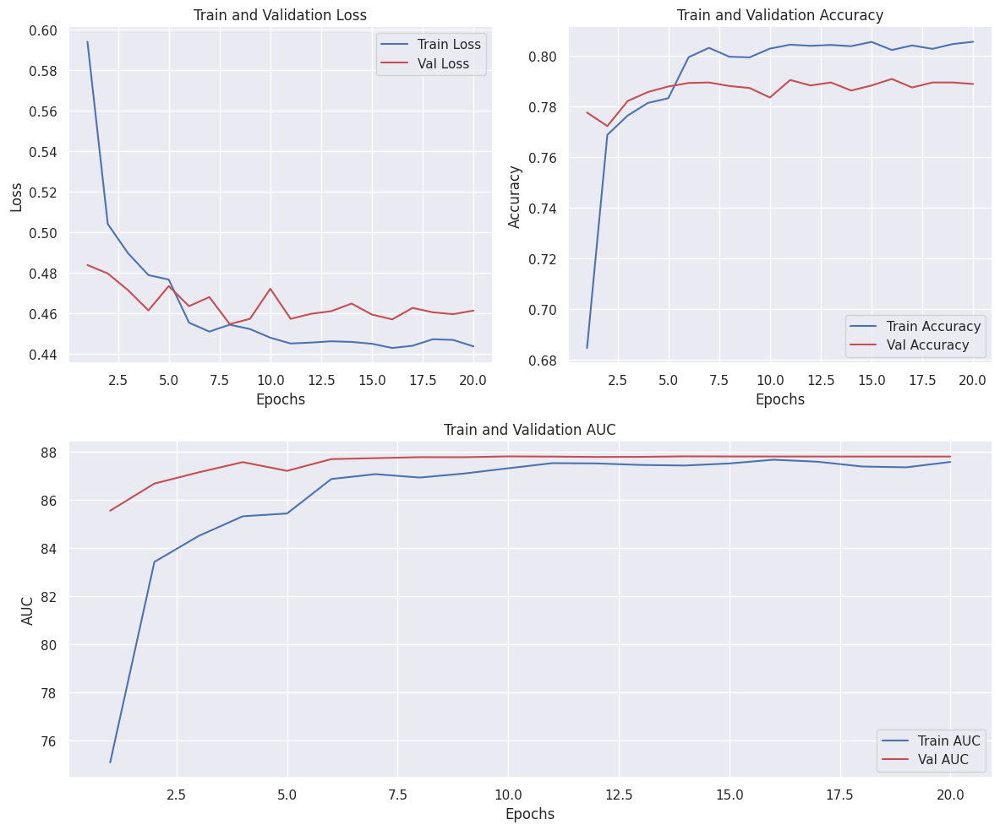

In [19]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [20]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "X",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "Z",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:02<10:42,  2.06s/batch]

Epoch   1/20:   1%|          | 2/313 [00:04<10:39,  2.06s/batch]

Epoch   1/20:   1%|          | 3/313 [00:06<10:35,  2.05s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:08<11:04,  2.15s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:10<10:52,  2.12s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:12<10:43,  2.10s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:14<10:37,  2.08s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:16<10:32,  2.07s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:18<10:28,  2.07s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:20<10:25,  2.07s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:22<10:24,  2.07s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:24<10:20,  2.06s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:26<10:18,  2.06s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:29<10:17,  2.07s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:31<10:15,  2.06s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:33<10:54,  2.20s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:35<10:38,  2.16s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:37<10:27,  2.13s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:39<10:19,  2.11s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:41<10:12,  2.09s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:43<10:07,  2.08s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:45<10:02,  2.07s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:48<09:59,  2.07s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:50<09:56,  2.06s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:52<09:53,  2.06s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:54<09:50,  2.06s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:56<09:48,  2.06s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:58<09:48,  2.06s/batch]

Epoch   1/20:   9%|▉         | 29/313 [01:00<09:46,  2.06s/batch]

Epoch   1/20:  10%|▉         | 30/313 [01:02<09:44,  2.07s/batch]

Epoch   1/20:  10%|▉         | 31/313 [01:04<10:21,  2.21s/batch]

Epoch   1/20:  10%|█         | 32/313 [01:07<10:21,  2.21s/batch]

Epoch   1/20:  11%|█         | 33/313 [01:09<10:05,  2.16s/batch]

Epoch   1/20:  11%|█         | 34/313 [01:11<09:54,  2.13s/batch]

Epoch   1/20:  11%|█         | 35/313 [01:13<09:46,  2.11s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [01:15<09:40,  2.09s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [01:17<09:35,  2.08s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [01:19<09:31,  2.08s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [01:21<09:27,  2.07s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [01:23<09:24,  2.07s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [01:25<09:22,  2.07s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [01:28<09:57,  2.20s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [01:30<10:20,  2.30s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [01:32<10:03,  2.25s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [01:35<10:23,  2.33s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [01:37<10:37,  2.39s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [01:40<10:25,  2.35s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [01:42<09:59,  2.26s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [01:44<09:40,  2.20s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [01:46<09:27,  2.16s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [01:48<09:17,  2.13s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:50<09:10,  2.11s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:52<09:04,  2.09s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:54<08:59,  2.08s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:56<08:55,  2.08s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:58<08:52,  2.07s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [02:00<08:49,  2.07s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [02:02<08:46,  2.06s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [02:04<08:43,  2.06s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [02:06<08:41,  2.06s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [02:09<09:13,  2.20s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [02:11<09:11,  2.20s/batch]

Epoch   1/20:  20%|██        | 63/313 [02:13<09:02,  2.17s/batch]

Epoch   1/20:  20%|██        | 64/313 [02:15<08:51,  2.14s/batch]

Epoch   1/20:  21%|██        | 65/313 [02:17<08:43,  2.11s/batch]

Epoch   1/20:  21%|██        | 66/313 [02:19<08:37,  2.10s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [02:22<08:33,  2.09s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [02:24<08:28,  2.08s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [02:26<08:25,  2.07s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [02:28<08:22,  2.07s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [02:30<08:20,  2.07s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [02:32<08:17,  2.06s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [02:34<08:14,  2.06s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [02:36<08:13,  2.06s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [02:38<08:10,  2.06s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [02:41<08:42,  2.20s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [02:43<09:02,  2.30s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [02:46<09:22,  2.39s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [02:48<08:56,  2.29s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [02:50<08:37,  2.22s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [02:52<08:24,  2.17s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [02:54<08:13,  2.14s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [02:56<08:06,  2.12s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [02:58<08:00,  2.10s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [03:00<07:55,  2.09s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [03:02<07:51,  2.08s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [03:04<07:48,  2.07s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [03:06<07:45,  2.07s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [03:08<07:42,  2.06s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [03:10<07:39,  2.06s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [03:13<07:45,  2.09s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [03:15<07:47,  2.11s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [03:17<07:41,  2.10s/batch]

Epoch   1/20:  30%|███       | 94/313 [03:19<07:36,  2.09s/batch]

Epoch   1/20:  30%|███       | 95/313 [03:21<07:32,  2.08s/batch]

Epoch   1/20:  31%|███       | 96/313 [03:23<07:29,  2.07s/batch]

Epoch   1/20:  31%|███       | 97/313 [03:25<07:27,  2.07s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [03:27<07:24,  2.07s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [03:29<07:21,  2.06s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [03:31<07:19,  2.06s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [03:33<07:17,  2.06s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [03:35<07:14,  2.06s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [03:37<07:12,  2.06s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [03:39<07:10,  2.06s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [03:41<07:08,  2.06s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [03:44<07:06,  2.06s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [03:46<07:32,  2.20s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [03:48<07:22,  2.16s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [03:50<07:14,  2.13s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [03:52<07:07,  2.11s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [03:54<07:02,  2.09s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [03:56<06:58,  2.08s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [03:58<06:55,  2.08s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [04:00<06:52,  2.07s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [04:03<06:49,  2.07s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [04:05<06:46,  2.07s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [04:07<06:44,  2.06s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [04:09<06:42,  2.06s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [04:11<06:40,  2.06s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [04:13<06:37,  2.06s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [04:15<06:35,  2.06s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [04:17<06:58,  2.19s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [04:19<06:48,  2.15s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [04:21<06:41,  2.12s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [04:24<06:39,  2.12s/batch]

Epoch   1/20:  40%|████      | 126/313 [04:26<06:33,  2.10s/batch]

Epoch   1/20:  41%|████      | 127/313 [04:28<06:28,  2.09s/batch]

Epoch   1/20:  41%|████      | 128/313 [04:30<06:25,  2.08s/batch]

Epoch   1/20:  41%|████      | 129/313 [04:32<06:22,  2.08s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [04:34<06:18,  2.07s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [04:36<06:16,  2.07s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [04:38<06:13,  2.06s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [04:40<06:11,  2.06s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [04:42<06:09,  2.07s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [04:44<06:07,  2.06s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [04:46<06:04,  2.06s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [04:49<06:18,  2.15s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [04:51<06:12,  2.13s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [04:53<06:06,  2.10s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [04:55<06:01,  2.09s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [04:57<05:57,  2.08s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [04:59<05:54,  2.07s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [05:01<05:51,  2.07s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [05:03<05:48,  2.06s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [05:05<05:46,  2.06s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [05:07<05:44,  2.06s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [05:09<05:54,  2.13s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [05:12<05:48,  2.11s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [05:14<05:43,  2.09s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [05:16<05:39,  2.08s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [05:18<05:36,  2.08s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [05:20<05:55,  2.21s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [05:22<05:52,  2.20s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [05:24<05:43,  2.16s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [05:27<05:36,  2.13s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [05:29<05:30,  2.11s/batch]

Epoch   1/20:  50%|█████     | 157/313 [05:31<05:26,  2.09s/batch]

Epoch   1/20:  50%|█████     | 158/313 [05:33<05:22,  2.08s/batch]

Epoch   1/20:  51%|█████     | 159/313 [05:35<05:31,  2.16s/batch]

Epoch   1/20:  51%|█████     | 160/313 [05:37<05:25,  2.13s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [05:40<05:41,  2.25s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [05:42<05:43,  2.27s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [05:44<05:31,  2.21s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [05:46<05:22,  2.16s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [05:48<05:15,  2.13s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [05:50<05:10,  2.11s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [05:53<05:26,  2.24s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [05:55<05:16,  2.18s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [05:57<05:09,  2.15s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [05:59<05:03,  2.12s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [06:01<04:58,  2.10s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [06:03<04:54,  2.09s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [06:05<04:51,  2.08s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [06:07<04:51,  2.09s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [06:09<04:47,  2.08s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [06:11<04:44,  2.07s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [06:13<04:41,  2.07s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [06:15<04:38,  2.07s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [06:17<04:36,  2.06s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [06:20<04:34,  2.06s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [06:22<04:31,  2.06s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [06:24<04:48,  2.20s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [06:27<04:58,  2.30s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [06:29<05:05,  2.36s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [06:32<05:04,  2.38s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [06:34<04:49,  2.28s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [06:36<04:39,  2.21s/batch]

Epoch   1/20:  60%|██████    | 188/313 [06:38<04:31,  2.17s/batch]

Epoch   1/20:  60%|██████    | 189/313 [06:40<04:24,  2.13s/batch]

Epoch   1/20:  61%|██████    | 190/313 [06:42<04:19,  2.11s/batch]

Epoch   1/20:  61%|██████    | 191/313 [06:44<04:15,  2.10s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [06:46<04:12,  2.08s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [06:48<04:09,  2.08s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [06:50<04:06,  2.07s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [06:52<04:03,  2.07s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [06:54<04:06,  2.11s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [06:57<04:19,  2.24s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [06:59<04:27,  2.32s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [07:02<04:26,  2.34s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [07:04<04:15,  2.26s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [07:06<04:06,  2.20s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [07:08<03:59,  2.16s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [07:10<03:54,  2.13s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [07:12<03:49,  2.11s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [07:14<03:45,  2.09s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [07:16<03:42,  2.08s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [07:18<03:39,  2.07s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [07:20<03:36,  2.07s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [07:22<03:34,  2.06s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [07:24<03:32,  2.06s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [07:26<03:30,  2.06s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [07:29<03:42,  2.20s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [07:31<03:42,  2.22s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [07:33<03:35,  2.17s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [07:35<03:29,  2.14s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [07:37<03:25,  2.12s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [07:40<03:21,  2.10s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [07:42<03:18,  2.08s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [07:44<03:15,  2.08s/batch]

Epoch   1/20:  70%|███████   | 220/313 [07:46<03:12,  2.07s/batch]

Epoch   1/20:  71%|███████   | 221/313 [07:48<03:16,  2.14s/batch]

Epoch   1/20:  71%|███████   | 222/313 [07:50<03:12,  2.11s/batch]

Epoch   1/20:  71%|███████   | 223/313 [07:52<03:08,  2.10s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [07:54<03:06,  2.10s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [07:56<03:03,  2.08s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [07:58<03:00,  2.07s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [08:01<03:09,  2.21s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [08:03<03:04,  2.17s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [08:05<02:59,  2.14s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [08:07<02:55,  2.11s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [08:09<02:51,  2.10s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [08:11<02:48,  2.08s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [08:13<02:46,  2.08s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [08:15<02:43,  2.07s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [08:17<02:41,  2.06s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [08:19<02:38,  2.06s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [08:21<02:36,  2.06s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [08:23<02:34,  2.06s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [08:26<02:32,  2.06s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [08:28<02:30,  2.06s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [08:30<02:28,  2.06s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [08:32<02:36,  2.20s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [08:35<02:40,  2.30s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [08:37<02:34,  2.24s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [08:39<02:28,  2.18s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [08:41<02:23,  2.15s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [08:43<02:19,  2.12s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [08:45<02:16,  2.10s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [08:47<02:13,  2.09s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [08:49<02:10,  2.08s/batch]

Epoch   1/20:  80%|████████  | 251/313 [08:51<02:08,  2.07s/batch]

Epoch   1/20:  81%|████████  | 252/313 [08:53<02:06,  2.07s/batch]

Epoch   1/20:  81%|████████  | 253/313 [08:55<02:03,  2.07s/batch]

Epoch   1/20:  81%|████████  | 254/313 [08:57<02:01,  2.07s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [08:59<01:59,  2.06s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [09:01<01:57,  2.06s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [09:04<02:03,  2.20s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [09:06<02:00,  2.18s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [09:08<01:55,  2.15s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [09:10<01:52,  2.12s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [09:12<01:49,  2.10s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [09:14<01:46,  2.09s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [09:16<01:43,  2.08s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [09:19<01:41,  2.07s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [09:21<01:39,  2.07s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [09:23<01:36,  2.06s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [09:25<01:34,  2.06s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [09:27<01:32,  2.06s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [09:29<01:30,  2.06s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [09:31<01:28,  2.06s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [09:33<01:26,  2.06s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [09:35<01:30,  2.20s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [09:38<01:31,  2.29s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [09:40<01:32,  2.36s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [09:43<01:26,  2.28s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [09:45<01:21,  2.21s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [09:47<01:23,  2.31s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [09:49<01:20,  2.29s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [09:52<01:20,  2.36s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [09:54<01:17,  2.33s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [09:56<01:12,  2.25s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [09:58<01:08,  2.19s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [10:00<01:04,  2.15s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [10:02<01:01,  2.13s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [10:04<00:58,  2.11s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [10:07<01:00,  2.23s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [10:09<00:59,  2.28s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [10:11<00:55,  2.21s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [10:14<00:51,  2.16s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [10:16<00:50,  2.20s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [10:18<00:47,  2.15s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [10:20<00:44,  2.13s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [10:22<00:42,  2.10s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [10:24<00:39,  2.09s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [10:26<00:37,  2.10s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [10:28<00:35,  2.09s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [10:30<00:33,  2.08s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [10:32<00:31,  2.07s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [10:34<00:28,  2.07s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [10:36<00:26,  2.06s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [10:39<00:26,  2.21s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [10:42<00:25,  2.31s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [10:44<00:23,  2.38s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [10:47<00:21,  2.43s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [10:49<00:19,  2.46s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [10:51<00:16,  2.39s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [10:53<00:13,  2.29s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [10:55<00:11,  2.22s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [10:58<00:08,  2.17s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [11:00<00:06,  2.14s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [11:02<00:04,  2.11s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [11:04<00:02,  2.10s/batch]

Epoch   1/20: 100%|██████████| 313/313 [11:05<00:00,  1.79s/batch]

Epoch   1/20: 100%|██████████| 313/313 [11:05<00:00,  1.79s/batch, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [11:34<00:00,  1.79s/batch, Epoch = 11m 34s, Loss = 0.5813|0.4850, Acc = 0.692|0.775, AUC = 76.336|86.723]

Epoch   1/20: 100%|██████████| 313/313 [11:34<00:00,  2.22s/batch, Epoch = 11m 34s, Loss = 0.5813|0.4850, Acc = 0.692|0.775, AUC = 76.336|86.723]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:02<10:35,  2.04s/batch]

Epoch   2/20:   1%|          | 2/313 [00:04<12:00,  2.32s/batch]

Epoch   2/20:   1%|          | 3/313 [00:07<12:25,  2.41s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:09<12:10,  2.36s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:11<12:16,  2.39s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:13<11:38,  2.28s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:16<12:00,  2.35s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:18<12:13,  2.41s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:21<12:02,  2.38s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:23<11:30,  2.28s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:25<11:20,  2.25s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:27<11:00,  2.19s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:29<10:45,  2.15s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:31<10:34,  2.12s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:33<10:25,  2.10s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:35<10:20,  2.09s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:37<10:22,  2.10s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:39<10:15,  2.09s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:41<10:11,  2.08s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:44<10:07,  2.07s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:46<10:04,  2.07s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:48<10:00,  2.07s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:50<09:58,  2.06s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:52<09:55,  2.06s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:54<09:53,  2.06s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:56<09:51,  2.06s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:58<09:48,  2.06s/batch]

Epoch   2/20:   9%|▉         | 28/313 [01:00<09:46,  2.06s/batch]

Epoch   2/20:   9%|▉         | 29/313 [01:02<09:44,  2.06s/batch]

Epoch   2/20:  10%|▉         | 30/313 [01:04<09:41,  2.06s/batch]

Epoch   2/20:  10%|▉         | 31/313 [01:07<10:20,  2.20s/batch]

Epoch   2/20:  10%|█         | 32/313 [01:09<10:20,  2.21s/batch]

Epoch   2/20:  11%|█         | 33/313 [01:11<10:05,  2.16s/batch]

Epoch   2/20:  11%|█         | 34/313 [01:13<09:54,  2.13s/batch]

Epoch   2/20:  11%|█         | 35/313 [01:15<09:46,  2.11s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [01:17<09:40,  2.09s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [01:19<09:35,  2.08s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [01:21<09:31,  2.08s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [01:23<09:27,  2.07s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [01:25<09:24,  2.07s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [01:27<09:21,  2.06s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [01:29<09:18,  2.06s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [01:32<09:17,  2.06s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [01:34<09:14,  2.06s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [01:36<09:12,  2.06s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [01:38<09:47,  2.20s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [01:41<10:14,  2.31s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [01:43<09:53,  2.24s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [01:45<09:37,  2.19s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [01:47<09:25,  2.15s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [01:49<09:16,  2.13s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:51<09:10,  2.11s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:53<09:04,  2.09s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:55<09:00,  2.09s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:57<08:56,  2.08s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:59<08:53,  2.08s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [02:01<08:51,  2.07s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [02:03<08:48,  2.07s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [02:06<08:45,  2.07s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [02:08<08:43,  2.07s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [02:10<09:16,  2.21s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [02:12<09:05,  2.17s/batch]

Epoch   2/20:  20%|██        | 63/313 [02:14<08:54,  2.14s/batch]

Epoch   2/20:  20%|██        | 64/313 [02:16<08:46,  2.12s/batch]

Epoch   2/20:  21%|██        | 65/313 [02:18<08:40,  2.10s/batch]

Epoch   2/20:  21%|██        | 66/313 [02:20<08:35,  2.09s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [02:23<08:31,  2.08s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [02:25<08:28,  2.07s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [02:27<08:24,  2.07s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [02:29<08:21,  2.07s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [02:31<08:21,  2.07s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [02:33<08:18,  2.07s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [02:35<08:15,  2.07s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [02:37<08:12,  2.06s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [02:39<08:11,  2.07s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [02:42<08:42,  2.21s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [02:44<08:57,  2.28s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [02:46<08:39,  2.21s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [02:48<08:26,  2.17s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [02:50<08:17,  2.13s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [02:52<08:10,  2.11s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [02:54<08:04,  2.10s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [02:56<07:59,  2.08s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [02:58<07:55,  2.08s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [03:00<07:52,  2.07s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [03:03<08:11,  2.16s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [03:05<08:01,  2.13s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [03:07<07:54,  2.11s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [03:09<07:49,  2.10s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [03:11<07:44,  2.08s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [03:14<08:12,  2.22s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [03:16<08:09,  2.21s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [03:18<07:56,  2.17s/batch]

Epoch   2/20:  30%|███       | 94/313 [03:20<07:47,  2.14s/batch]

Epoch   2/20:  30%|███       | 95/313 [03:22<07:40,  2.11s/batch]

Epoch   2/20:  31%|███       | 96/313 [03:24<07:34,  2.10s/batch]

Epoch   2/20:  31%|███       | 97/313 [03:26<07:30,  2.08s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [03:28<07:26,  2.08s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [03:30<07:23,  2.07s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [03:32<07:20,  2.07s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [03:34<07:17,  2.07s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [03:36<07:15,  2.06s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [03:38<07:12,  2.06s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [03:41<07:10,  2.06s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [03:43<07:08,  2.06s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [03:45<07:35,  2.20s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [03:47<07:27,  2.17s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [03:49<07:18,  2.14s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [03:51<07:11,  2.11s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [03:53<07:05,  2.10s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [03:56<07:03,  2.10s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [03:58<06:59,  2.09s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [04:00<06:55,  2.08s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [04:02<06:52,  2.07s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [04:04<06:50,  2.07s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [04:06<06:47,  2.07s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [04:08<06:45,  2.07s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [04:10<06:43,  2.07s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [04:12<06:58,  2.16s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [04:15<07:17,  2.27s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [04:18<07:44,  2.42s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [04:20<07:30,  2.36s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [04:22<07:18,  2.31s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [04:24<07:01,  2.23s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [04:26<06:49,  2.18s/batch]

Epoch   2/20:  40%|████      | 126/313 [04:28<06:40,  2.14s/batch]

Epoch   2/20:  41%|████      | 127/313 [04:30<06:33,  2.12s/batch]

Epoch   2/20:  41%|████      | 128/313 [04:32<06:28,  2.10s/batch]

Epoch   2/20:  41%|████      | 129/313 [04:34<06:23,  2.08s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [04:36<06:19,  2.07s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [04:38<06:16,  2.07s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [04:41<06:13,  2.06s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [04:43<06:11,  2.06s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [04:45<06:08,  2.06s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [04:47<06:06,  2.06s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [04:49<06:29,  2.20s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [04:51<06:28,  2.21s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [04:54<06:18,  2.16s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [04:56<06:10,  2.13s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [04:58<06:17,  2.18s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [05:00<06:09,  2.15s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [05:02<06:02,  2.12s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [05:04<05:57,  2.10s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [05:06<05:52,  2.09s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [05:08<05:48,  2.08s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [05:10<05:45,  2.07s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [05:12<05:54,  2.14s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [05:15<05:48,  2.11s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [05:17<05:43,  2.09s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [05:19<05:39,  2.08s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [05:21<05:58,  2.22s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [05:23<05:49,  2.17s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [05:25<05:41,  2.13s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [05:27<05:35,  2.11s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [05:29<05:30,  2.09s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [05:31<05:26,  2.08s/batch]

Epoch   2/20:  50%|█████     | 157/313 [05:34<05:23,  2.07s/batch]

Epoch   2/20:  50%|█████     | 158/313 [05:36<05:20,  2.07s/batch]

Epoch   2/20:  51%|█████     | 159/313 [05:38<05:17,  2.06s/batch]

Epoch   2/20:  51%|█████     | 160/313 [05:40<05:15,  2.06s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [05:42<05:13,  2.06s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [05:44<05:10,  2.06s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [05:46<05:08,  2.06s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [05:48<05:06,  2.06s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [05:50<05:04,  2.06s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [05:52<05:23,  2.20s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [05:55<05:24,  2.22s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [05:57<05:14,  2.17s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [05:59<05:07,  2.14s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [06:01<05:01,  2.11s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [06:03<04:57,  2.09s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [06:05<04:53,  2.08s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [06:07<04:50,  2.07s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [06:09<04:47,  2.07s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [06:11<04:45,  2.07s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [06:13<04:42,  2.06s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [06:15<04:40,  2.06s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [06:17<04:38,  2.06s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [06:19<04:35,  2.06s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [06:22<04:33,  2.06s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [06:24<04:50,  2.20s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [06:27<05:00,  2.30s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [06:29<05:06,  2.36s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [06:31<04:52,  2.27s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [06:33<04:42,  2.20s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [06:35<04:34,  2.16s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [06:37<04:27,  2.13s/batch]

Epoch   2/20:  60%|██████    | 188/313 [06:40<04:41,  2.25s/batch]

Epoch   2/20:  60%|██████    | 189/313 [06:42<04:31,  2.19s/batch]

Epoch   2/20:  61%|██████    | 190/313 [06:44<04:24,  2.15s/batch]

Epoch   2/20:  61%|██████    | 191/313 [06:46<04:32,  2.23s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [06:48<04:23,  2.18s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [06:50<04:16,  2.14s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [06:53<04:11,  2.11s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [06:55<04:07,  2.10s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [06:57<04:20,  2.23s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [06:59<04:13,  2.18s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [07:01<04:06,  2.15s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [07:03<04:01,  2.12s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [07:05<03:57,  2.10s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [07:07<03:53,  2.09s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [07:09<03:50,  2.08s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [07:12<03:48,  2.08s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [07:14<03:45,  2.07s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [07:16<03:42,  2.06s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [07:18<03:40,  2.06s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [07:20<03:38,  2.06s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [07:22<03:36,  2.06s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [07:24<03:38,  2.10s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [07:26<03:35,  2.09s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [07:29<03:46,  2.22s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [07:31<03:39,  2.17s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [07:33<03:33,  2.14s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [07:35<03:29,  2.11s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [07:37<03:25,  2.09s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [07:39<03:22,  2.08s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [07:41<03:19,  2.08s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [07:43<03:16,  2.07s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [07:45<03:14,  2.07s/batch]

Epoch   2/20:  70%|███████   | 220/313 [07:47<03:12,  2.07s/batch]

Epoch   2/20:  71%|███████   | 221/313 [07:49<03:09,  2.06s/batch]

Epoch   2/20:  71%|███████   | 222/313 [07:51<03:07,  2.06s/batch]

Epoch   2/20:  71%|███████   | 223/313 [07:53<03:05,  2.06s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [07:55<03:03,  2.06s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [07:57<03:01,  2.06s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [08:00<03:11,  2.20s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [08:02<03:09,  2.20s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [08:04<03:07,  2.21s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [08:06<03:02,  2.17s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [08:09<03:08,  2.28s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [08:11<03:05,  2.26s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [08:14<03:09,  2.34s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [08:16<03:11,  2.40s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [08:19<03:12,  2.43s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [08:21<03:04,  2.37s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [08:23<02:55,  2.27s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [08:25<02:47,  2.21s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [08:27<02:42,  2.16s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [08:29<02:37,  2.13s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [08:32<02:44,  2.25s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [08:34<02:37,  2.19s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [08:36<02:32,  2.15s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [08:38<02:28,  2.12s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [08:40<02:25,  2.10s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [08:42<02:22,  2.09s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [08:44<02:19,  2.08s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [08:46<02:16,  2.07s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [08:48<02:14,  2.07s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [08:50<02:12,  2.07s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [08:52<02:10,  2.06s/batch]

Epoch   2/20:  80%|████████  | 251/313 [08:54<02:07,  2.06s/batch]

Epoch   2/20:  81%|████████  | 252/313 [08:56<02:05,  2.06s/batch]

Epoch   2/20:  81%|████████  | 253/313 [08:59<02:04,  2.08s/batch]

Epoch   2/20:  81%|████████  | 254/313 [09:01<02:02,  2.07s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [09:03<02:08,  2.21s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [09:05<02:06,  2.22s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [09:07<02:01,  2.17s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [09:09<01:57,  2.14s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [09:12<01:54,  2.11s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [09:14<01:50,  2.09s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [09:16<01:48,  2.08s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [09:18<01:45,  2.07s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [09:20<01:47,  2.14s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [09:22<01:46,  2.18s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [09:25<01:49,  2.29s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [09:27<01:46,  2.27s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [09:29<01:41,  2.21s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [09:32<01:42,  2.29s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [09:34<01:37,  2.22s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [09:36<01:39,  2.31s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [09:38<01:34,  2.24s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [09:40<01:29,  2.18s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [09:42<01:25,  2.15s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [09:44<01:22,  2.12s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [09:46<01:19,  2.10s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [09:48<01:17,  2.09s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [09:51<01:14,  2.08s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [09:53<01:12,  2.07s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [09:55<01:10,  2.07s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [09:57<01:08,  2.06s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [09:59<01:05,  2.06s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [10:01<01:03,  2.06s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [10:03<01:01,  2.06s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [10:05<01:03,  2.20s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [10:08<01:04,  2.30s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [10:10<01:03,  2.35s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [10:13<01:00,  2.33s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [10:15<00:59,  2.39s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [10:18<00:58,  2.43s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [10:20<00:53,  2.32s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [10:22<00:49,  2.24s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [10:24<00:45,  2.19s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [10:26<00:45,  2.29s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [10:29<00:44,  2.36s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [10:31<00:41,  2.31s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [10:33<00:37,  2.23s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [10:35<00:34,  2.18s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [10:38<00:34,  2.28s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [10:40<00:33,  2.36s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [10:43<00:31,  2.41s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [10:45<00:28,  2.41s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [10:47<00:25,  2.30s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [10:50<00:22,  2.28s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [10:52<00:19,  2.21s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [10:54<00:17,  2.17s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [10:56<00:14,  2.14s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.12s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [11:00<00:10,  2.10s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.09s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.08s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.07s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.16s/batch]

Epoch   2/20: 100%|██████████| 313/313 [11:10<00:00,  1.84s/batch]

Epoch   2/20: 100%|██████████| 313/313 [11:10<00:00,  1.84s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [11:45<00:00,  1.84s/batch, Epoch = 11m 45s, Loss = 0.4916|0.4639, Acc = 0.776|0.781, AUC = 84.337|87.755]

Epoch   2/20: 100%|██████████| 313/313 [11:45<00:00,  2.26s/batch, Epoch = 11m 45s, Loss = 0.4916|0.4639, Acc = 0.776|0.781, AUC = 84.337|87.755]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:02<13:01,  2.50s/batch]

Epoch   3/20:   1%|          | 2/313 [00:04<11:58,  2.31s/batch]

Epoch   3/20:   1%|          | 3/313 [00:06<11:19,  2.19s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:08<11:00,  2.14s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:10<10:49,  2.11s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:12<10:41,  2.09s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:14<10:35,  2.08s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:16<10:31,  2.07s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:19<10:27,  2.06s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:21<10:24,  2.06s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:23<10:48,  2.15s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:25<10:57,  2.18s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:27<10:43,  2.15s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:29<10:33,  2.12s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:31<10:25,  2.10s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:34<11:01,  2.23s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:37<11:50,  2.40s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:39<11:33,  2.35s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:41<11:05,  2.26s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:43<10:45,  2.20s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:45<10:30,  2.16s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:47<10:19,  2.13s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:49<10:11,  2.11s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:51<10:04,  2.09s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:53<10:00,  2.08s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:55<09:55,  2.08s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:57<09:52,  2.07s/batch]

Epoch   3/20:   9%|▉         | 28/313 [01:00<09:49,  2.07s/batch]

Epoch   3/20:   9%|▉         | 29/313 [01:02<09:46,  2.07s/batch]

Epoch   3/20:  10%|▉         | 30/313 [01:04<09:44,  2.06s/batch]

Epoch   3/20:  10%|▉         | 31/313 [01:06<10:21,  2.20s/batch]

Epoch   3/20:  10%|█         | 32/313 [01:08<10:13,  2.18s/batch]

Epoch   3/20:  11%|█         | 33/313 [01:10<10:00,  2.14s/batch]

Epoch   3/20:  11%|█         | 34/313 [01:12<09:51,  2.12s/batch]

Epoch   3/20:  11%|█         | 35/313 [01:15<09:48,  2.12s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [01:17<10:04,  2.18s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [01:19<10:31,  2.29s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [01:22<10:39,  2.32s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [01:24<10:14,  2.24s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [01:26<10:08,  2.23s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [01:28<09:51,  2.18s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [01:30<09:39,  2.14s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [01:32<09:30,  2.11s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [01:34<09:23,  2.09s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [01:37<09:46,  2.19s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [01:39<10:10,  2.29s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [01:41<10:00,  2.26s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [01:43<09:42,  2.20s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [01:45<09:28,  2.15s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [01:48<09:27,  2.16s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:50<09:17,  2.13s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:52<09:09,  2.10s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:54<09:03,  2.09s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:56<08:58,  2.08s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:58<08:55,  2.07s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [02:00<08:53,  2.08s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [02:02<08:49,  2.07s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [02:04<08:46,  2.06s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [02:06<08:43,  2.06s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [02:08<08:40,  2.06s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [02:11<09:14,  2.20s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [02:13<09:35,  2.29s/batch]

Epoch   3/20:  20%|██        | 63/313 [02:16<09:50,  2.36s/batch]

Epoch   3/20:  20%|██        | 64/313 [02:18<09:38,  2.32s/batch]

Epoch   3/20:  21%|██        | 65/313 [02:20<09:16,  2.25s/batch]

Epoch   3/20:  21%|██        | 66/313 [02:22<09:01,  2.19s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [02:24<08:51,  2.16s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [02:26<08:49,  2.16s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [02:28<08:39,  2.13s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [02:31<08:31,  2.11s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [02:33<08:25,  2.09s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [02:35<08:21,  2.08s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [02:37<08:17,  2.07s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [02:39<08:13,  2.07s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [02:41<08:10,  2.06s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [02:43<08:41,  2.20s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [02:46<08:39,  2.20s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [02:48<08:26,  2.15s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [02:50<08:16,  2.12s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [02:52<08:09,  2.10s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [02:54<08:03,  2.09s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [02:56<07:59,  2.08s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [02:58<08:28,  2.21s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [03:01<08:27,  2.22s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [03:03<08:13,  2.17s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [03:05<08:03,  2.13s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [03:07<07:55,  2.11s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [03:09<07:49,  2.09s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [03:11<07:45,  2.08s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [03:13<07:57,  2.14s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [03:16<08:22,  2.27s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [03:18<08:07,  2.21s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [03:20<07:56,  2.16s/batch]

Epoch   3/20:  30%|███       | 94/313 [03:22<07:47,  2.14s/batch]

Epoch   3/20:  30%|███       | 95/313 [03:24<07:42,  2.12s/batch]

Epoch   3/20:  31%|███       | 96/313 [03:26<07:37,  2.11s/batch]

Epoch   3/20:  31%|███       | 97/313 [03:28<07:32,  2.09s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [03:30<07:28,  2.09s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [03:32<07:25,  2.08s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [03:34<07:29,  2.11s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [03:36<07:24,  2.10s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [03:38<07:21,  2.09s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [03:41<07:17,  2.08s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [03:43<07:14,  2.08s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [03:45<07:11,  2.08s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [03:47<07:39,  2.22s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [03:50<07:56,  2.31s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [03:52<08:07,  2.38s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [03:55<08:15,  2.43s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [03:57<08:19,  2.46s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [04:00<08:22,  2.49s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [04:02<08:05,  2.42s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [04:04<07:42,  2.31s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [04:06<07:25,  2.24s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [04:08<07:13,  2.19s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [04:10<07:04,  2.15s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [04:13<06:57,  2.13s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [04:15<06:51,  2.11s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [04:17<06:47,  2.10s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [04:19<07:10,  2.23s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [04:22<07:25,  2.32s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [04:24<07:36,  2.39s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [04:27<07:42,  2.43s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [04:29<07:25,  2.36s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [04:31<07:07,  2.27s/batch]

Epoch   3/20:  40%|████      | 126/313 [04:33<06:53,  2.21s/batch]

Epoch   3/20:  41%|████      | 127/313 [04:35<06:44,  2.17s/batch]

Epoch   3/20:  41%|████      | 128/313 [04:38<06:48,  2.21s/batch]

Epoch   3/20:  41%|████      | 129/313 [04:40<06:38,  2.17s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [04:42<06:31,  2.14s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [04:44<06:25,  2.12s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [04:46<06:28,  2.15s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [04:48<06:22,  2.13s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [04:51<06:42,  2.25s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [04:53<06:31,  2.20s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [04:55<06:22,  2.16s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [04:57<06:15,  2.13s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [04:59<06:09,  2.11s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [05:01<06:05,  2.10s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [05:03<06:01,  2.09s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [05:05<05:58,  2.09s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [05:07<05:56,  2.08s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [05:09<05:53,  2.08s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [05:11<05:50,  2.07s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [05:13<05:48,  2.07s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [05:15<05:46,  2.07s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [05:18<05:44,  2.07s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [05:20<05:41,  2.07s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [05:22<06:02,  2.21s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [05:25<06:10,  2.27s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [05:27<06:00,  2.22s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [05:29<05:50,  2.18s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [05:31<05:42,  2.14s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [05:33<05:37,  2.12s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [05:35<05:32,  2.10s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [05:37<05:31,  2.11s/batch]

Epoch   3/20:  50%|█████     | 157/313 [05:39<05:27,  2.10s/batch]

Epoch   3/20:  50%|█████     | 158/313 [05:41<05:23,  2.09s/batch]

Epoch   3/20:  51%|█████     | 159/313 [05:44<05:39,  2.20s/batch]

Epoch   3/20:  51%|█████     | 160/313 [05:46<05:31,  2.17s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [05:48<05:25,  2.14s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [05:50<05:19,  2.12s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [05:52<05:22,  2.15s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [05:55<05:37,  2.27s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [05:57<05:26,  2.21s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [05:59<05:18,  2.17s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [06:01<05:12,  2.14s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [06:03<05:07,  2.12s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [06:05<05:03,  2.11s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [06:07<04:59,  2.10s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [06:09<04:56,  2.09s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [06:11<04:54,  2.09s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [06:13<04:51,  2.08s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [06:15<04:48,  2.08s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [06:17<04:46,  2.08s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [06:20<04:44,  2.07s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [06:22<04:42,  2.07s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [06:24<04:39,  2.07s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [06:26<04:55,  2.21s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [06:28<04:48,  2.17s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [06:30<04:42,  2.14s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [06:32<04:37,  2.12s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [06:34<04:33,  2.11s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [06:37<04:30,  2.10s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [06:39<04:27,  2.09s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [06:41<04:24,  2.08s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [06:43<04:22,  2.08s/batch]

Epoch   3/20:  60%|██████    | 188/313 [06:45<04:19,  2.08s/batch]

Epoch   3/20:  60%|██████    | 189/313 [06:47<04:17,  2.08s/batch]

Epoch   3/20:  61%|██████    | 190/313 [06:49<04:15,  2.08s/batch]

Epoch   3/20:  61%|██████    | 191/313 [06:51<04:18,  2.12s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [06:53<04:14,  2.11s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [06:55<04:11,  2.10s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [06:58<04:24,  2.22s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [07:00<04:18,  2.19s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [07:02<04:12,  2.16s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [07:04<04:07,  2.13s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [07:06<04:03,  2.11s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [07:08<03:59,  2.10s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [07:10<03:56,  2.09s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [07:12<03:53,  2.09s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [07:15<03:51,  2.08s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [07:17<03:48,  2.08s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [07:19<03:46,  2.08s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [07:21<03:44,  2.07s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [07:23<03:41,  2.07s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [07:25<03:39,  2.07s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [07:27<03:37,  2.07s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [07:30<03:50,  2.22s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [07:32<03:57,  2.31s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [07:34<03:59,  2.35s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [07:37<03:48,  2.26s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [07:39<03:40,  2.20s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [07:41<03:33,  2.16s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [07:43<03:28,  2.13s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [07:45<03:24,  2.10s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [07:47<03:20,  2.09s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [07:49<03:17,  2.08s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [07:51<03:14,  2.07s/batch]

Epoch   3/20:  70%|███████   | 220/313 [07:53<03:12,  2.07s/batch]

Epoch   3/20:  71%|███████   | 221/313 [07:55<03:09,  2.06s/batch]

Epoch   3/20:  71%|███████   | 222/313 [07:57<03:07,  2.06s/batch]

Epoch   3/20:  71%|███████   | 223/313 [07:59<03:05,  2.06s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [08:02<03:15,  2.20s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [08:04<03:21,  2.29s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [08:06<03:18,  2.28s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [08:08<03:10,  2.21s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [08:11<03:04,  2.17s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [08:13<02:59,  2.13s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [08:15<02:54,  2.11s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [08:17<02:51,  2.09s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [08:19<02:48,  2.08s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [08:21<02:52,  2.15s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [08:23<02:47,  2.13s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [08:25<02:44,  2.11s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [08:27<02:40,  2.09s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [08:29<02:37,  2.08s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [08:32<02:45,  2.21s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [08:34<02:50,  2.30s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [08:37<02:50,  2.34s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [08:39<02:42,  2.26s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [08:41<02:36,  2.20s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [08:43<02:33,  2.19s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [08:45<02:28,  2.15s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [08:47<02:24,  2.12s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [08:49<02:20,  2.10s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [08:52<02:27,  2.23s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [08:54<02:30,  2.32s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [08:57<02:26,  2.29s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [08:59<02:19,  2.22s/batch]

Epoch   3/20:  80%|████████  | 251/313 [09:01<02:14,  2.17s/batch]

Epoch   3/20:  81%|████████  | 252/313 [09:03<02:10,  2.13s/batch]

Epoch   3/20:  81%|████████  | 253/313 [09:05<02:06,  2.11s/batch]

Epoch   3/20:  81%|████████  | 254/313 [09:07<02:11,  2.23s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [09:09<02:09,  2.23s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [09:12<02:04,  2.18s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [09:14<02:07,  2.28s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [09:16<02:03,  2.25s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [09:18<01:58,  2.19s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [09:20<01:53,  2.15s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [09:22<01:50,  2.12s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [09:24<01:47,  2.10s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [09:26<01:44,  2.09s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [09:29<01:41,  2.08s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [09:31<01:39,  2.07s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [09:33<01:37,  2.06s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [09:35<01:34,  2.06s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [09:37<01:32,  2.06s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [09:39<01:36,  2.20s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [09:41<01:33,  2.17s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [09:43<01:29,  2.14s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [09:46<01:26,  2.11s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [09:48<01:23,  2.10s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [09:50<01:21,  2.08s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [09:52<01:19,  2.10s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [09:54<01:17,  2.09s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [09:56<01:14,  2.08s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [09:58<01:12,  2.07s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [10:00<01:10,  2.06s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [10:02<01:08,  2.06s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [10:04<01:05,  2.06s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [10:06<01:03,  2.06s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [10:08<01:01,  2.06s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [10:11<01:03,  2.20s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [10:13<01:04,  2.29s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [10:16<01:01,  2.29s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [10:18<00:57,  2.22s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [10:20<00:54,  2.17s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [10:22<00:51,  2.13s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [10:24<00:50,  2.18s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [10:26<00:47,  2.15s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [10:28<00:44,  2.12s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [10:30<00:42,  2.10s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [10:32<00:39,  2.09s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [10:34<00:37,  2.08s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [10:37<00:37,  2.18s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [10:39<00:34,  2.14s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [10:41<00:31,  2.12s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [10:43<00:31,  2.24s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [10:46<00:30,  2.32s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [10:48<00:27,  2.26s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [10:50<00:25,  2.27s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [10:52<00:22,  2.21s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [10:54<00:19,  2.16s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [10:56<00:17,  2.13s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [10:58<00:14,  2.11s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [11:01<00:12,  2.09s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [11:03<00:11,  2.22s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [11:05<00:08,  2.19s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [11:08<00:06,  2.28s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.35s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [11:12<00:02,  2.31s/batch]

Epoch   3/20: 100%|██████████| 313/313 [11:14<00:00,  2.01s/batch]

Epoch   3/20: 100%|██████████| 313/313 [11:14<00:00,  2.01s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [11:44<00:00,  2.01s/batch, Epoch = 11m 44s, Loss = 0.4732|0.4580, Acc = 0.787|0.785, AUC = 85.703|88.060]

Epoch   3/20: 100%|██████████| 313/313 [11:44<00:00,  2.25s/batch, Epoch = 11m 44s, Loss = 0.4732|0.4580, Acc = 0.787|0.785, AUC = 85.703|88.060]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch   4/20:   1%|          | 2/313 [00:05<13:00,  2.51s/batch]

Epoch   4/20:   1%|          | 3/313 [00:07<12:17,  2.38s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:09<12:31,  2.43s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:12<12:38,  2.46s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:14<12:08,  2.37s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:16<12:12,  2.39s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:19<11:50,  2.33s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:21<11:21,  2.24s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:23<11:01,  2.18s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:25<11:04,  2.20s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:27<10:49,  2.16s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:29<10:37,  2.13s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:31<10:29,  2.10s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:33<10:22,  2.09s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:35<10:17,  2.08s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:37<10:32,  2.14s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:40<10:23,  2.11s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:42<10:34,  2.16s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:44<10:22,  2.13s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:46<10:14,  2.11s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:48<10:08,  2.09s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:50<10:03,  2.08s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:52<09:59,  2.07s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:54<09:55,  2.07s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:56<09:52,  2.06s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:58<09:49,  2.06s/batch]

Epoch   4/20:   9%|▉         | 28/313 [01:00<09:46,  2.06s/batch]

Epoch   4/20:   9%|▉         | 29/313 [01:02<09:44,  2.06s/batch]

Epoch   4/20:  10%|▉         | 30/313 [01:04<09:42,  2.06s/batch]

Epoch   4/20:  10%|▉         | 31/313 [01:07<10:19,  2.20s/batch]

Epoch   4/20:  10%|█         | 32/313 [01:09<10:33,  2.25s/batch]

Epoch   4/20:  11%|█         | 33/313 [01:11<10:15,  2.20s/batch]

Epoch   4/20:  11%|█         | 34/313 [01:13<10:01,  2.16s/batch]

Epoch   4/20:  11%|█         | 35/313 [01:16<09:51,  2.13s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [01:18<09:43,  2.11s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [01:20<09:36,  2.09s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [01:22<09:49,  2.14s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [01:24<09:40,  2.12s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [01:26<09:33,  2.10s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [01:28<09:27,  2.09s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [01:30<09:23,  2.08s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [01:33<09:57,  2.21s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [01:35<10:10,  2.27s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [01:37<09:51,  2.21s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [01:40<10:13,  2.30s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [01:42<10:22,  2.34s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [01:45<10:35,  2.40s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [01:47<10:09,  2.31s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:49<09:47,  2.23s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:51<10:00,  2.29s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:53<09:39,  2.22s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:55<09:24,  2.17s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:57<09:13,  2.14s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:59<09:04,  2.11s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [02:01<08:58,  2.10s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [02:04<09:11,  2.15s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [02:06<09:01,  2.12s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [02:08<08:53,  2.10s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [02:10<08:48,  2.09s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [02:12<09:19,  2.22s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [02:14<09:04,  2.17s/batch]

Epoch   4/20:  20%|██        | 63/313 [02:17<08:53,  2.14s/batch]

Epoch   4/20:  20%|██        | 64/313 [02:19<08:47,  2.12s/batch]

Epoch   4/20:  21%|██        | 65/313 [02:21<08:40,  2.10s/batch]

Epoch   4/20:  21%|██        | 66/313 [02:23<08:34,  2.08s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [02:25<08:31,  2.08s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [02:27<08:27,  2.07s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [02:29<08:24,  2.07s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [02:31<08:21,  2.07s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [02:33<08:19,  2.06s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [02:35<08:16,  2.06s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [02:37<08:14,  2.06s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [02:39<08:11,  2.06s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [02:41<08:09,  2.06s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [02:44<08:40,  2.20s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [02:46<08:48,  2.24s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [02:48<08:33,  2.18s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [02:50<08:22,  2.15s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [02:52<08:13,  2.12s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [02:54<08:07,  2.10s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [02:56<08:02,  2.09s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [02:58<07:58,  2.08s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [03:00<07:54,  2.07s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [03:03<07:51,  2.07s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [03:05<08:00,  2.12s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [03:07<08:06,  2.15s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [03:09<07:58,  2.12s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [03:11<07:51,  2.10s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [03:13<07:46,  2.09s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [03:16<08:03,  2.18s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [03:18<07:53,  2.14s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [03:20<07:45,  2.12s/batch]

Epoch   4/20:  30%|███       | 94/313 [03:22<07:39,  2.10s/batch]

Epoch   4/20:  30%|███       | 95/313 [03:24<07:35,  2.09s/batch]

Epoch   4/20:  31%|███       | 96/313 [03:26<07:31,  2.08s/batch]

Epoch   4/20:  31%|███       | 97/313 [03:28<07:27,  2.07s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [03:30<07:24,  2.07s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [03:32<07:22,  2.07s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [03:34<07:19,  2.07s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [03:36<07:17,  2.06s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [03:38<07:15,  2.06s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [03:40<07:12,  2.06s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [03:42<07:10,  2.06s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [03:44<07:09,  2.06s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [03:46<07:06,  2.06s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [03:49<07:04,  2.06s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [03:51<07:02,  2.06s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [03:53<07:00,  2.06s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [03:55<06:57,  2.06s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [03:57<06:55,  2.06s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [03:59<06:53,  2.06s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [04:01<06:51,  2.06s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [04:03<06:50,  2.06s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [04:05<06:47,  2.06s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [04:07<06:45,  2.06s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [04:09<06:43,  2.06s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [04:11<06:41,  2.06s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [04:13<06:39,  2.06s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [04:15<06:37,  2.06s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [04:17<06:35,  2.06s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [04:19<06:33,  2.06s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [04:22<06:57,  2.20s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [04:24<06:48,  2.16s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [04:26<06:40,  2.13s/batch]

Epoch   4/20:  40%|████      | 126/313 [04:28<06:34,  2.11s/batch]

Epoch   4/20:  41%|████      | 127/313 [04:30<06:29,  2.09s/batch]

Epoch   4/20:  41%|████      | 128/313 [04:32<06:25,  2.08s/batch]

Epoch   4/20:  41%|████      | 129/313 [04:34<06:22,  2.08s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [04:36<06:19,  2.07s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [04:38<06:16,  2.07s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [04:41<06:25,  2.13s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [04:43<06:19,  2.11s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [04:45<06:14,  2.09s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [04:47<06:11,  2.09s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [04:49<06:07,  2.08s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [04:51<06:04,  2.07s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [04:54<06:26,  2.21s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [04:56<06:35,  2.27s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [04:58<06:22,  2.21s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [05:00<06:12,  2.16s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [05:02<06:04,  2.13s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [05:04<05:58,  2.11s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [05:06<05:57,  2.12s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [05:08<05:52,  2.10s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [05:10<05:48,  2.09s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [05:13<05:44,  2.08s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [05:15<05:41,  2.07s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [05:17<05:39,  2.07s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [05:19<05:36,  2.06s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [05:21<05:34,  2.06s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [05:23<05:31,  2.06s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [05:25<05:51,  2.20s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [05:28<06:04,  2.29s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [05:30<06:08,  2.33s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [05:32<05:53,  2.25s/batch]

Epoch   4/20:  50%|█████     | 157/313 [05:34<05:42,  2.19s/batch]

Epoch   4/20:  50%|█████     | 158/313 [05:36<05:33,  2.15s/batch]

Epoch   4/20:  51%|█████     | 159/313 [05:38<05:27,  2.12s/batch]

Epoch   4/20:  51%|█████     | 160/313 [05:41<05:43,  2.24s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [05:44<05:53,  2.33s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [05:46<05:59,  2.38s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [05:48<05:42,  2.29s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [05:50<05:30,  2.22s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [05:52<05:21,  2.17s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [05:54<05:13,  2.14s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [05:57<05:28,  2.25s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [05:59<05:25,  2.25s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [06:01<05:15,  2.19s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [06:03<05:07,  2.15s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [06:05<05:01,  2.12s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [06:07<04:56,  2.11s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [06:09<04:52,  2.09s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [06:11<04:49,  2.08s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [06:13<04:46,  2.07s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [06:16<04:43,  2.07s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [06:18<04:40,  2.07s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [06:20<04:38,  2.07s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [06:22<04:37,  2.07s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [06:24<04:34,  2.06s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [06:26<04:32,  2.06s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [06:28<04:48,  2.20s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [06:30<04:40,  2.16s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [06:32<04:34,  2.12s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [06:34<04:29,  2.10s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [06:37<04:25,  2.09s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [06:39<04:21,  2.08s/batch]

Epoch   4/20:  60%|██████    | 188/313 [06:41<04:18,  2.07s/batch]

Epoch   4/20:  60%|██████    | 189/313 [06:43<04:16,  2.07s/batch]

Epoch   4/20:  61%|██████    | 190/313 [06:45<04:13,  2.06s/batch]

Epoch   4/20:  61%|██████    | 191/313 [06:47<04:11,  2.06s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [06:49<04:09,  2.06s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [06:51<04:06,  2.06s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [06:53<04:04,  2.06s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [06:55<04:02,  2.05s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [06:57<04:00,  2.05s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [06:59<03:58,  2.06s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [07:02<04:12,  2.20s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [07:04<04:24,  2.32s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [07:06<04:14,  2.25s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [07:08<04:05,  2.19s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [07:11<04:14,  2.29s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [07:13<04:12,  2.30s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [07:15<04:02,  2.22s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [07:17<03:54,  2.17s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [07:19<03:48,  2.14s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [07:21<03:44,  2.11s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [07:24<03:40,  2.10s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [07:26<03:37,  2.09s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [07:28<03:33,  2.08s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [07:30<03:31,  2.07s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [07:32<03:28,  2.07s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [07:34<03:40,  2.20s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [07:37<03:38,  2.21s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [07:39<03:31,  2.16s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [07:41<03:26,  2.13s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [07:43<03:22,  2.11s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [07:45<03:18,  2.09s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [07:47<03:15,  2.08s/batch]

Epoch   4/20:  70%|███████   | 220/313 [07:49<03:12,  2.07s/batch]

Epoch   4/20:  71%|███████   | 221/313 [07:51<03:10,  2.07s/batch]

Epoch   4/20:  71%|███████   | 222/313 [07:53<03:09,  2.08s/batch]

Epoch   4/20:  71%|███████   | 223/313 [07:55<03:06,  2.07s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [07:57<03:03,  2.07s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [07:59<03:01,  2.06s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [08:01<02:59,  2.06s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [08:03<02:56,  2.06s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [08:06<03:06,  2.20s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [08:08<03:00,  2.15s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [08:10<02:56,  2.12s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [08:12<02:52,  2.10s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [08:14<02:49,  2.09s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [08:16<02:46,  2.08s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [08:18<02:43,  2.07s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [08:20<02:41,  2.07s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [08:22<02:38,  2.06s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [08:24<02:36,  2.06s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [08:26<02:34,  2.06s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [08:28<02:32,  2.06s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [08:30<02:30,  2.06s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [08:32<02:27,  2.06s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [08:35<02:26,  2.06s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [08:37<02:33,  2.20s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [08:39<02:32,  2.21s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [08:41<02:27,  2.17s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [08:43<02:22,  2.13s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [08:45<02:19,  2.11s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [08:48<02:16,  2.09s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [08:50<02:13,  2.08s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [08:52<02:10,  2.08s/batch]

Epoch   4/20:  80%|████████  | 251/313 [08:54<02:08,  2.07s/batch]

Epoch   4/20:  81%|████████  | 252/313 [08:56<02:05,  2.06s/batch]

Epoch   4/20:  81%|████████  | 253/313 [08:58<02:03,  2.06s/batch]

Epoch   4/20:  81%|████████  | 254/313 [09:00<02:01,  2.06s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [09:02<01:59,  2.06s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [09:04<01:57,  2.06s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [09:06<01:55,  2.06s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [09:09<02:00,  2.20s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [09:11<02:00,  2.23s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [09:13<01:55,  2.18s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [09:15<01:51,  2.14s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [09:17<01:47,  2.12s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [09:19<01:46,  2.13s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [09:21<01:43,  2.11s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [09:23<01:40,  2.09s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [09:25<01:37,  2.08s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [09:27<01:35,  2.07s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [09:29<01:32,  2.07s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [09:32<01:30,  2.06s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [09:34<01:28,  2.06s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [09:36<01:26,  2.06s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [09:38<01:26,  2.12s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [09:40<01:29,  2.24s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [09:43<01:25,  2.20s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [09:45<01:21,  2.15s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [09:47<01:18,  2.12s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [09:49<01:15,  2.10s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [09:51<01:13,  2.09s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [09:53<01:10,  2.08s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [09:55<01:08,  2.07s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [09:57<01:06,  2.07s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [09:59<01:04,  2.07s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [10:01<01:02,  2.07s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [10:03<01:00,  2.09s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [10:05<00:58,  2.08s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [10:07<00:55,  2.07s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [10:09<00:53,  2.06s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [10:12<00:55,  2.20s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [10:14<00:51,  2.16s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [10:16<00:48,  2.13s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [10:18<00:46,  2.11s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [10:20<00:43,  2.09s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [10:22<00:41,  2.08s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [10:24<00:39,  2.07s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [10:26<00:37,  2.07s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [10:28<00:35,  2.06s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [10:30<00:32,  2.06s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [10:32<00:30,  2.06s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [10:34<00:28,  2.05s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [10:37<00:26,  2.05s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [10:39<00:25,  2.08s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [10:41<00:22,  2.07s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [10:43<00:21,  2.19s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [10:45<00:19,  2.15s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [10:47<00:16,  2.12s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [10:49<00:14,  2.10s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [10:51<00:12,  2.09s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [10:53<00:10,  2.08s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [10:55<00:08,  2.07s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [10:58<00:06,  2.07s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [11:00<00:04,  2.06s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [11:02<00:02,  2.06s/batch]

Epoch   4/20: 100%|██████████| 313/313 [11:03<00:00,  1.77s/batch]

Epoch   4/20: 100%|██████████| 313/313 [11:03<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [11:33<00:00,  1.77s/batch, Epoch = 11m 33s, Loss = 0.4628|0.4560, Acc = 0.790|0.788, AUC = 86.477|88.363]

Epoch   4/20: 100%|██████████| 313/313 [11:33<00:00,  2.21s/batch, Epoch = 11m 33s, Loss = 0.4628|0.4560, Acc = 0.790|0.788, AUC = 86.477|88.363]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:02<13:00,  2.50s/batch]

Epoch   5/20:   1%|          | 2/313 [00:05<12:59,  2.51s/batch]

Epoch   5/20:   1%|          | 3/313 [00:07<12:57,  2.51s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:09<12:00,  2.33s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:11<11:27,  2.23s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:13<11:07,  2.18s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:15<10:53,  2.14s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:17<10:43,  2.11s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:19<10:37,  2.10s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:21<10:30,  2.08s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:23<10:25,  2.07s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:26<10:23,  2.07s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:28<10:20,  2.07s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:30<10:17,  2.07s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:32<10:15,  2.07s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:34<10:55,  2.21s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:37<11:21,  2.30s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:39<11:17,  2.30s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:41<10:55,  2.23s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:43<10:38,  2.18s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:45<10:26,  2.14s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:47<10:17,  2.12s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:49<10:10,  2.10s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:51<10:04,  2.09s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:54<10:00,  2.09s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:56<09:56,  2.08s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:58<09:53,  2.08s/batch]

Epoch   5/20:   9%|▉         | 28/313 [01:00<10:11,  2.15s/batch]

Epoch   5/20:   9%|▉         | 29/313 [01:02<10:03,  2.12s/batch]

Epoch   5/20:  10%|▉         | 30/313 [01:04<09:56,  2.11s/batch]

Epoch   5/20:  10%|▉         | 31/313 [01:07<10:29,  2.23s/batch]

Epoch   5/20:  10%|█         | 32/313 [01:09<10:34,  2.26s/batch]

Epoch   5/20:  11%|█         | 33/313 [01:11<10:15,  2.20s/batch]

Epoch   5/20:  11%|█         | 34/313 [01:13<10:02,  2.16s/batch]

Epoch   5/20:  11%|█         | 35/313 [01:15<09:52,  2.13s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [01:17<09:44,  2.11s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [01:19<09:39,  2.10s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [01:21<09:34,  2.09s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [01:23<09:30,  2.08s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [01:25<09:27,  2.08s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [01:28<09:23,  2.07s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [01:30<09:21,  2.07s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [01:32<09:19,  2.07s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [01:34<09:18,  2.08s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [01:36<09:15,  2.07s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [01:38<09:50,  2.21s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [01:41<10:13,  2.31s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [01:43<10:28,  2.37s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [01:46<10:37,  2.41s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [01:48<10:07,  2.31s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:50<09:45,  2.23s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:52<09:28,  2.18s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:54<09:17,  2.14s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:56<09:08,  2.12s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:58<09:02,  2.10s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [02:00<08:57,  2.09s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [02:02<08:52,  2.08s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [02:05<08:59,  2.12s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [02:07<09:01,  2.13s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [02:09<08:54,  2.11s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [02:11<09:25,  2.24s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [02:14<09:12,  2.20s/batch]

Epoch   5/20:  20%|██        | 63/313 [02:16<09:00,  2.16s/batch]

Epoch   5/20:  20%|██        | 64/313 [02:18<09:01,  2.17s/batch]

Epoch   5/20:  21%|██        | 65/313 [02:20<08:50,  2.14s/batch]

Epoch   5/20:  21%|██        | 66/313 [02:22<08:42,  2.12s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [02:24<08:35,  2.10s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [02:26<08:30,  2.08s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [02:28<08:26,  2.08s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [02:30<08:23,  2.07s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [02:32<08:19,  2.07s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [02:34<08:17,  2.06s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [02:36<08:14,  2.06s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [02:38<08:12,  2.06s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [02:40<08:10,  2.06s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [02:43<08:41,  2.20s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [02:45<09:01,  2.30s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [02:48<09:14,  2.36s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [02:50<08:51,  2.27s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [02:52<08:39,  2.23s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [02:54<08:25,  2.18s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [02:56<08:14,  2.14s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [02:58<08:06,  2.12s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [03:00<08:00,  2.10s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [03:02<07:55,  2.09s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [03:05<07:51,  2.08s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [03:07<07:47,  2.07s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [03:09<07:44,  2.06s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [03:11<07:42,  2.06s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [03:13<07:40,  2.06s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [03:15<08:09,  2.20s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [03:18<08:08,  2.21s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [03:20<07:56,  2.16s/batch]

Epoch   5/20:  30%|███       | 94/313 [03:22<07:46,  2.13s/batch]

Epoch   5/20:  30%|███       | 95/313 [03:24<07:39,  2.11s/batch]

Epoch   5/20:  31%|███       | 96/313 [03:26<07:33,  2.09s/batch]

Epoch   5/20:  31%|███       | 97/313 [03:28<07:29,  2.08s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [03:30<07:26,  2.08s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [03:32<07:22,  2.07s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [03:34<07:19,  2.07s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [03:36<07:17,  2.06s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [03:38<07:29,  2.13s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [03:40<07:22,  2.11s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [03:42<07:17,  2.09s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [03:44<07:12,  2.08s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [03:47<07:38,  2.22s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [03:49<07:26,  2.17s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [03:51<07:17,  2.13s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [03:53<07:10,  2.11s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [03:55<07:04,  2.09s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [03:57<07:00,  2.08s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [03:59<06:57,  2.07s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [04:01<06:53,  2.07s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [04:03<06:50,  2.06s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [04:05<06:47,  2.06s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [04:08<06:45,  2.06s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [04:10<06:43,  2.06s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [04:12<06:41,  2.06s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [04:14<06:52,  2.13s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [04:16<06:46,  2.11s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [04:18<06:41,  2.09s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [04:21<07:03,  2.22s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [04:23<07:18,  2.31s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [04:25<07:17,  2.31s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [04:27<07:00,  2.24s/batch]

Epoch   5/20:  40%|████      | 126/313 [04:30<06:53,  2.21s/batch]

Epoch   5/20:  41%|████      | 127/313 [04:32<06:42,  2.16s/batch]

Epoch   5/20:  41%|████      | 128/313 [04:34<06:34,  2.13s/batch]

Epoch   5/20:  41%|████      | 129/313 [04:36<06:27,  2.11s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [04:38<06:22,  2.09s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [04:40<06:44,  2.22s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [04:43<06:38,  2.20s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [04:45<06:28,  2.16s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [04:47<06:20,  2.13s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [04:49<06:14,  2.11s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [04:51<06:35,  2.23s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [04:54<06:48,  2.32s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [04:56<06:51,  2.35s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [04:58<06:33,  2.26s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [05:00<06:20,  2.20s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [05:02<06:10,  2.16s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [05:04<06:03,  2.13s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [05:06<05:58,  2.11s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [05:09<06:11,  2.20s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [05:11<06:26,  2.30s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [05:14<06:35,  2.37s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [05:16<06:41,  2.42s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [05:19<06:35,  2.40s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [05:21<06:16,  2.30s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [05:23<06:26,  2.37s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [05:26<06:31,  2.42s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [05:28<06:33,  2.45s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [05:31<06:32,  2.45s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [05:33<06:11,  2.33s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [05:35<05:55,  2.25s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [05:37<05:44,  2.19s/batch]

Epoch   5/20:  50%|█████     | 157/313 [05:39<05:35,  2.15s/batch]

Epoch   5/20:  50%|█████     | 158/313 [05:41<05:29,  2.12s/batch]

Epoch   5/20:  51%|█████     | 159/313 [05:43<05:24,  2.11s/batch]

Epoch   5/20:  51%|█████     | 160/313 [05:45<05:19,  2.09s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [05:47<05:16,  2.08s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [05:49<05:13,  2.08s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [05:52<05:10,  2.07s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [05:54<05:07,  2.07s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [05:56<05:26,  2.21s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [05:58<05:25,  2.21s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [06:00<05:15,  2.16s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [06:02<05:09,  2.13s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [06:04<05:03,  2.11s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [06:07<04:59,  2.09s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [06:09<05:05,  2.15s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [06:11<05:18,  2.26s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [06:14<05:15,  2.25s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [06:16<05:04,  2.19s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [06:18<05:16,  2.29s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [06:20<05:12,  2.28s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [06:23<05:20,  2.36s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [06:25<05:13,  2.32s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [06:27<05:01,  2.25s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [06:29<04:56,  2.23s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [06:32<04:48,  2.18s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [06:34<04:42,  2.15s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [06:36<04:55,  2.27s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [06:39<04:59,  2.32s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [06:41<04:47,  2.24s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [06:43<04:37,  2.19s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [06:45<04:30,  2.15s/batch]

Epoch   5/20:  60%|██████    | 188/313 [06:47<04:25,  2.12s/batch]

Epoch   5/20:  60%|██████    | 189/313 [06:49<04:20,  2.10s/batch]

Epoch   5/20:  61%|██████    | 190/313 [06:51<04:17,  2.09s/batch]

Epoch   5/20:  61%|██████    | 191/313 [06:53<04:13,  2.08s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [06:55<04:10,  2.07s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [06:57<04:09,  2.08s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [07:00<04:23,  2.21s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [07:02<04:17,  2.18s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [07:04<04:11,  2.15s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [07:06<04:06,  2.12s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [07:08<04:02,  2.11s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [07:10<03:59,  2.10s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [07:12<03:56,  2.09s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [07:14<03:53,  2.08s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [07:16<03:50,  2.08s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [07:18<03:48,  2.08s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [07:20<03:46,  2.08s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [07:22<03:44,  2.08s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [07:25<03:41,  2.07s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [07:27<03:39,  2.07s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [07:29<03:37,  2.07s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [07:31<03:50,  2.22s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [07:34<03:57,  2.31s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [07:36<03:55,  2.30s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [07:38<03:49,  2.27s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [07:40<03:40,  2.21s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [07:42<03:33,  2.16s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [07:44<03:28,  2.13s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [07:46<03:24,  2.11s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [07:49<03:24,  2.13s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [07:51<03:20,  2.11s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [07:53<03:17,  2.10s/batch]

Epoch   5/20:  70%|███████   | 220/313 [07:55<03:13,  2.08s/batch]

Epoch   5/20:  71%|███████   | 221/313 [07:57<03:11,  2.08s/batch]

Epoch   5/20:  71%|███████   | 222/313 [07:59<03:09,  2.09s/batch]

Epoch   5/20:  71%|███████   | 223/313 [08:01<03:07,  2.08s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [08:04<03:16,  2.21s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [08:06<03:10,  2.16s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [08:08<03:05,  2.13s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [08:10<03:01,  2.11s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [08:12<02:57,  2.09s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [08:14<03:06,  2.22s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [08:17<03:03,  2.21s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [08:19<02:57,  2.16s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [08:21<02:52,  2.13s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [08:23<02:48,  2.11s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [08:25<02:45,  2.09s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [08:27<02:42,  2.08s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [08:29<02:39,  2.08s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [08:31<02:37,  2.07s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [08:33<02:38,  2.11s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [08:36<02:45,  2.23s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [08:38<02:49,  2.32s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [08:41<02:50,  2.36s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [08:43<02:41,  2.27s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [08:45<02:34,  2.21s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [08:47<02:29,  2.17s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [08:49<02:33,  2.26s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [08:51<02:27,  2.20s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [08:53<02:22,  2.16s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [08:55<02:18,  2.13s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [08:58<02:14,  2.11s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [09:00<02:11,  2.09s/batch]

Epoch   5/20:  80%|████████  | 251/313 [09:02<02:09,  2.08s/batch]

Epoch   5/20:  81%|████████  | 252/313 [09:04<02:06,  2.08s/batch]

Epoch   5/20:  81%|████████  | 253/313 [09:06<02:04,  2.07s/batch]

Epoch   5/20:  81%|████████  | 254/313 [09:08<02:10,  2.21s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [09:10<02:06,  2.17s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [09:12<02:02,  2.14s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [09:15<01:59,  2.14s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [09:17<01:56,  2.12s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [09:19<01:53,  2.10s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [09:21<01:50,  2.09s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [09:23<01:48,  2.09s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [09:25<01:46,  2.08s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [09:27<01:43,  2.08s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [09:29<01:41,  2.08s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [09:31<01:39,  2.07s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [09:33<01:37,  2.07s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [09:35<01:35,  2.07s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [09:37<01:33,  2.07s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [09:40<01:37,  2.21s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [09:42<01:33,  2.17s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [09:44<01:29,  2.14s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [09:46<01:26,  2.12s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [09:48<01:24,  2.10s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [09:50<01:21,  2.09s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [09:52<01:19,  2.09s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [09:55<01:18,  2.13s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [09:57<01:16,  2.11s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [09:59<01:13,  2.10s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [10:01<01:11,  2.09s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [10:03<01:08,  2.09s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [10:05<01:06,  2.08s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [10:07<01:04,  2.08s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [10:09<01:02,  2.08s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [10:12<01:04,  2.22s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [10:14<01:04,  2.31s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [10:16<01:01,  2.28s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [10:18<00:57,  2.22s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [10:20<00:54,  2.17s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [10:23<00:53,  2.23s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [10:25<00:50,  2.17s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [10:27<00:47,  2.14s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [10:29<00:44,  2.11s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [10:31<00:41,  2.09s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [10:33<00:39,  2.08s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [10:35<00:37,  2.07s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [10:37<00:35,  2.07s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [10:40<00:35,  2.20s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [10:42<00:34,  2.30s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [10:45<00:33,  2.37s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [10:47<00:30,  2.32s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [10:49<00:26,  2.24s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [10:51<00:24,  2.18s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [10:53<00:21,  2.15s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [10:55<00:19,  2.12s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [10:57<00:16,  2.10s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [10:59<00:14,  2.09s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [11:01<00:12,  2.08s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [11:03<00:10,  2.07s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [11:05<00:08,  2.07s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [11:08<00:06,  2.06s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.06s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [11:12<00:02,  2.06s/batch]

Epoch   5/20: 100%|██████████| 313/313 [11:13<00:00,  1.77s/batch]

Epoch   5/20: 100%|██████████| 313/313 [11:13<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [11:44<00:00,  1.77s/batch, Epoch = 11m 44s, Loss = 0.4545|0.4676, Acc = 0.793|0.779, AUC = 86.958|88.752]

Epoch   5/20: 100%|██████████| 313/313 [11:44<00:00,  2.25s/batch, Epoch = 11m 44s, Loss = 0.4545|0.4676, Acc = 0.793|0.779, AUC = 86.958|88.752]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:02<14:22,  2.77s/batch]

Epoch   6/20:   1%|          | 2/313 [00:04<12:16,  2.37s/batch]

Epoch   6/20:   1%|          | 3/313 [00:06<11:28,  2.22s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:08<11:05,  2.16s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:11<10:52,  2.12s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:13<10:43,  2.10s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:15<10:37,  2.08s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:17<10:32,  2.07s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:19<10:28,  2.07s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:21<10:26,  2.07s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:23<10:22,  2.06s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:25<10:20,  2.06s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:27<10:18,  2.06s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:29<10:15,  2.06s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:31<10:13,  2.06s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:34<10:53,  2.20s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:36<11:03,  2.24s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:38<10:44,  2.19s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:40<10:51,  2.22s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:42<10:34,  2.17s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:44<10:22,  2.13s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:46<10:13,  2.11s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:49<10:07,  2.09s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:51<10:02,  2.08s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:53<09:58,  2.08s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:55<09:54,  2.07s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:57<09:51,  2.07s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:59<09:48,  2.06s/batch]

Epoch   6/20:   9%|▉         | 29/313 [01:01<09:45,  2.06s/batch]

Epoch   6/20:  10%|▉         | 30/313 [01:03<09:42,  2.06s/batch]

Epoch   6/20:  10%|▉         | 31/313 [01:05<10:20,  2.20s/batch]

Epoch   6/20:  10%|█         | 32/313 [01:07<10:06,  2.16s/batch]

Epoch   6/20:  11%|█         | 33/313 [01:10<09:55,  2.13s/batch]

Epoch   6/20:  11%|█         | 34/313 [01:12<09:47,  2.11s/batch]

Epoch   6/20:  11%|█         | 35/313 [01:14<09:41,  2.09s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [01:16<09:36,  2.08s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [01:18<09:32,  2.07s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [01:20<09:28,  2.07s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [01:22<09:26,  2.07s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [01:24<09:24,  2.07s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [01:26<09:23,  2.07s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [01:28<09:21,  2.07s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [01:30<09:19,  2.07s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [01:32<09:16,  2.07s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [01:34<09:14,  2.07s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [01:37<09:49,  2.21s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [01:39<09:36,  2.17s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [01:41<09:26,  2.14s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [01:43<09:18,  2.12s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:45<09:26,  2.15s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:47<09:16,  2.12s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:49<09:09,  2.10s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:51<09:03,  2.09s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:54<08:58,  2.08s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:56<08:54,  2.07s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:58<08:51,  2.07s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [02:00<08:48,  2.06s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [02:02<08:45,  2.06s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [02:04<08:43,  2.06s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [02:06<08:41,  2.06s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [02:08<08:51,  2.11s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [02:10<09:01,  2.16s/batch]

Epoch   6/20:  20%|██        | 63/313 [02:12<08:52,  2.13s/batch]

Epoch   6/20:  20%|██        | 64/313 [02:14<08:45,  2.11s/batch]

Epoch   6/20:  21%|██        | 65/313 [02:17<08:40,  2.10s/batch]

Epoch   6/20:  21%|██        | 66/313 [02:19<08:35,  2.09s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [02:21<08:32,  2.08s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [02:23<09:00,  2.21s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [02:25<08:48,  2.17s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [02:27<08:39,  2.14s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [02:30<09:05,  2.25s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [02:32<09:00,  2.24s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [02:34<08:45,  2.19s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [02:36<08:34,  2.15s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [02:38<08:42,  2.20s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [02:41<09:04,  2.30s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [02:43<08:45,  2.23s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [02:45<08:31,  2.18s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [02:47<08:21,  2.14s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [02:49<08:13,  2.12s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [02:51<08:07,  2.10s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [02:53<08:02,  2.09s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [02:55<07:58,  2.08s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [02:58<07:55,  2.07s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [03:00<07:52,  2.07s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [03:02<07:51,  2.08s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [03:04<07:47,  2.07s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [03:06<07:45,  2.07s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [03:08<07:43,  2.07s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [03:10<07:40,  2.07s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [03:12<08:09,  2.21s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [03:15<08:29,  2.30s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [03:18<08:42,  2.38s/batch]

Epoch   6/20:  30%|███       | 94/313 [03:20<08:51,  2.43s/batch]

Epoch   6/20:  30%|███       | 95/313 [03:22<08:37,  2.37s/batch]

Epoch   6/20:  31%|███       | 96/313 [03:24<08:15,  2.28s/batch]

Epoch   6/20:  31%|███       | 97/313 [03:26<07:59,  2.22s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [03:29<07:48,  2.18s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [03:31<07:39,  2.15s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [03:33<07:32,  2.13s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [03:35<07:27,  2.11s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [03:37<07:23,  2.10s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [03:39<07:19,  2.09s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [03:41<07:16,  2.09s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [03:43<07:13,  2.08s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [03:46<07:39,  2.22s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [03:48<07:43,  2.25s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [03:50<07:36,  2.23s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [03:52<07:25,  2.18s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [03:54<07:16,  2.15s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [03:56<07:09,  2.12s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [03:58<07:03,  2.11s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [04:00<06:59,  2.10s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [04:03<06:55,  2.09s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [04:05<06:52,  2.08s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [04:07<06:49,  2.08s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [04:09<06:47,  2.08s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [04:11<06:44,  2.08s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [04:13<06:45,  2.09s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [04:15<06:42,  2.08s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [04:18<07:05,  2.22s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [04:20<07:22,  2.31s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [04:22<07:20,  2.32s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [04:25<07:15,  2.31s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [04:27<06:59,  2.23s/batch]

Epoch   6/20:  40%|████      | 126/313 [04:29<06:47,  2.18s/batch]

Epoch   6/20:  41%|████      | 127/313 [04:31<06:38,  2.14s/batch]

Epoch   6/20:  41%|████      | 128/313 [04:33<06:32,  2.12s/batch]

Epoch   6/20:  41%|████      | 129/313 [04:35<06:26,  2.10s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [04:37<06:22,  2.09s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [04:39<06:18,  2.08s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [04:41<06:15,  2.08s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [04:43<06:13,  2.07s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [04:45<06:10,  2.07s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [04:48<06:32,  2.21s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [04:50<06:47,  2.30s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [04:53<06:56,  2.37s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [04:55<07:02,  2.41s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [04:58<07:05,  2.45s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [05:00<06:48,  2.36s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [05:02<06:30,  2.27s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [05:04<06:18,  2.21s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [05:07<06:28,  2.29s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [05:09<06:27,  2.29s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [05:11<06:25,  2.30s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [05:13<06:11,  2.23s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [05:15<06:01,  2.18s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [05:17<05:53,  2.14s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [05:20<05:47,  2.12s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [05:22<06:05,  2.24s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [05:25<06:14,  2.31s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [05:27<05:59,  2.23s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [05:29<05:48,  2.18s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [05:31<05:40,  2.14s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [05:33<05:38,  2.14s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [05:35<05:44,  2.19s/batch]

Epoch   6/20:  50%|█████     | 157/313 [05:37<05:35,  2.15s/batch]

Epoch   6/20:  50%|█████     | 158/313 [05:39<05:28,  2.12s/batch]

Epoch   6/20:  51%|█████     | 159/313 [05:41<05:23,  2.10s/batch]

Epoch   6/20:  51%|█████     | 160/313 [05:43<05:19,  2.09s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [05:45<05:16,  2.08s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [05:47<05:12,  2.07s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [05:50<05:10,  2.07s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [05:52<05:07,  2.06s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [05:54<05:26,  2.20s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [05:56<05:17,  2.16s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [05:58<05:10,  2.13s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [06:00<05:05,  2.11s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [06:02<05:01,  2.09s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [06:04<04:57,  2.08s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [06:06<04:54,  2.08s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [06:09<04:51,  2.07s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [06:11<04:49,  2.07s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [06:13<04:47,  2.07s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [06:15<04:44,  2.06s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [06:17<04:42,  2.06s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [06:19<04:40,  2.06s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [06:21<04:38,  2.06s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [06:23<04:36,  2.06s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [06:25<04:52,  2.20s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [06:28<04:58,  2.26s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [06:30<04:48,  2.20s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [06:32<04:40,  2.16s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [06:34<04:34,  2.13s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [06:36<04:29,  2.11s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [06:38<04:26,  2.10s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [06:40<04:22,  2.08s/batch]

Epoch   6/20:  60%|██████    | 188/313 [06:42<04:19,  2.08s/batch]

Epoch   6/20:  60%|██████    | 189/313 [06:44<04:16,  2.07s/batch]

Epoch   6/20:  61%|██████    | 190/313 [06:46<04:14,  2.07s/batch]

Epoch   6/20:  61%|██████    | 191/313 [06:48<04:11,  2.06s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [06:51<04:09,  2.06s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [06:53<04:07,  2.06s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [06:55<04:11,  2.11s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [06:57<04:24,  2.24s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [06:59<04:15,  2.19s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [07:02<04:18,  2.22s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [07:04<04:09,  2.17s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [07:06<04:04,  2.14s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [07:08<03:59,  2.12s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [07:10<03:55,  2.10s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [07:12<03:51,  2.09s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [07:14<03:53,  2.12s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [07:16<03:49,  2.10s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [07:18<03:45,  2.09s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [07:20<03:42,  2.08s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [07:22<03:40,  2.08s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [07:25<03:37,  2.07s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [07:27<03:34,  2.07s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [07:29<03:47,  2.20s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [07:32<03:50,  2.26s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [07:34<03:42,  2.20s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [07:36<03:49,  2.30s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [07:39<03:54,  2.36s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [07:41<03:42,  2.27s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [07:43<03:34,  2.21s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [07:45<03:27,  2.17s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [07:47<03:29,  2.21s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [07:49<03:23,  2.16s/batch]

Epoch   6/20:  70%|███████   | 220/313 [07:51<03:18,  2.13s/batch]

Epoch   6/20:  71%|███████   | 221/313 [07:53<03:14,  2.11s/batch]

Epoch   6/20:  71%|███████   | 222/313 [07:55<03:10,  2.10s/batch]

Epoch   6/20:  71%|███████   | 223/313 [07:58<03:20,  2.22s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [08:00<03:19,  2.24s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [08:03<03:24,  2.32s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [08:05<03:22,  2.32s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [08:07<03:13,  2.25s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [08:09<03:07,  2.20s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [08:11<03:01,  2.16s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [08:13<02:57,  2.13s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [08:15<02:53,  2.11s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [08:18<02:54,  2.15s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [08:20<02:50,  2.13s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [08:22<02:46,  2.11s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [08:24<02:43,  2.09s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [08:26<02:40,  2.08s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [08:28<02:37,  2.08s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [08:30<02:35,  2.07s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [08:32<02:33,  2.07s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [08:35<02:40,  2.20s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [08:37<02:36,  2.17s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [08:39<02:31,  2.13s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [08:41<02:28,  2.12s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [08:43<02:24,  2.10s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [08:45<02:21,  2.09s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [08:47<02:19,  2.08s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [08:49<02:16,  2.07s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [08:51<02:14,  2.07s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [08:53<02:12,  2.07s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [08:55<02:10,  2.07s/batch]

Epoch   6/20:  80%|████████  | 251/313 [08:57<02:07,  2.06s/batch]

Epoch   6/20:  81%|████████  | 252/313 [08:59<02:05,  2.06s/batch]

Epoch   6/20:  81%|████████  | 253/313 [09:01<02:03,  2.06s/batch]

Epoch   6/20:  81%|████████  | 254/313 [09:03<02:01,  2.06s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [09:05<01:59,  2.06s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [09:08<02:05,  2.20s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [09:10<02:07,  2.27s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [09:13<02:01,  2.21s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [09:15<01:56,  2.16s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [09:17<01:53,  2.13s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [09:19<01:49,  2.11s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [09:21<01:46,  2.09s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [09:23<01:44,  2.09s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [09:25<01:41,  2.08s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [09:27<01:39,  2.07s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [09:29<01:37,  2.07s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [09:32<01:41,  2.21s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [09:34<01:38,  2.19s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [09:36<01:34,  2.15s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [09:38<01:31,  2.12s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [09:40<01:34,  2.24s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [09:43<01:35,  2.32s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [09:45<01:29,  2.24s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [09:47<01:25,  2.19s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [09:49<01:21,  2.15s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [09:51<01:18,  2.12s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [09:53<01:15,  2.10s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [09:55<01:15,  2.16s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [09:57<01:12,  2.13s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [10:00<01:09,  2.11s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [10:02<01:07,  2.10s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [10:04<01:04,  2.08s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [10:06<01:05,  2.18s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [10:08<01:02,  2.14s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [10:10<00:59,  2.12s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [10:13<01:00,  2.24s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [10:15<01:02,  2.39s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [10:18<01:00,  2.43s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [10:20<00:55,  2.32s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [10:22<00:54,  2.35s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [10:25<00:51,  2.36s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [10:27<00:47,  2.27s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [10:29<00:44,  2.20s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [10:31<00:41,  2.16s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [10:33<00:38,  2.13s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [10:35<00:35,  2.11s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [10:37<00:33,  2.09s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [10:40<00:32,  2.18s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [10:42<00:29,  2.14s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [10:44<00:29,  2.26s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [10:47<00:27,  2.30s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [10:49<00:24,  2.23s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [10:51<00:21,  2.18s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [10:53<00:19,  2.14s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [10:55<00:16,  2.11s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [10:57<00:14,  2.10s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [10:59<00:12,  2.08s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [11:01<00:10,  2.08s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [11:03<00:08,  2.07s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [11:05<00:06,  2.07s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [11:07<00:04,  2.06s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [11:09<00:02,  2.06s/batch]

Epoch   6/20: 100%|██████████| 313/313 [11:10<00:00,  1.77s/batch]

Epoch   6/20: 100%|██████████| 313/313 [11:10<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [11:39<00:00,  1.77s/batch, Epoch = 11m 39s, Loss = 0.4330|0.4487, Acc = 0.808|0.799, AUC = 88.205|88.751]

Epoch   6/20: 100%|██████████| 313/313 [11:39<00:00,  2.24s/batch, Epoch = 11m 39s, Loss = 0.4330|0.4487, Acc = 0.808|0.799, AUC = 88.205|88.751]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch   7/20:   1%|          | 2/313 [00:04<12:08,  2.34s/batch]

Epoch   7/20:   1%|          | 3/313 [00:06<11:25,  2.21s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:08<11:05,  2.15s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:10<10:52,  2.12s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:12<10:44,  2.10s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:15<10:38,  2.09s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:17<10:33,  2.08s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:19<11:00,  2.17s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:21<10:47,  2.14s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:23<10:37,  2.11s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:25<10:30,  2.09s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:27<10:24,  2.08s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:29<10:20,  2.07s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:32<10:53,  2.19s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:34<11:21,  2.29s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:37<11:39,  2.36s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:39<11:38,  2.37s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:41<11:08,  2.27s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:43<10:46,  2.21s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:45<10:31,  2.16s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:47<10:20,  2.13s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:49<10:11,  2.11s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:51<10:05,  2.09s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:54<10:00,  2.08s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:56<10:02,  2.10s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:58<09:56,  2.09s/batch]

Epoch   7/20:   9%|▉         | 28/313 [01:00<09:52,  2.08s/batch]

Epoch   7/20:   9%|▉         | 29/313 [01:02<09:49,  2.07s/batch]

Epoch   7/20:  10%|▉         | 30/313 [01:04<09:45,  2.07s/batch]

Epoch   7/20:  10%|▉         | 31/313 [01:06<10:21,  2.20s/batch]

Epoch   7/20:  10%|█         | 32/313 [01:09<10:46,  2.30s/batch]

Epoch   7/20:  11%|█         | 33/313 [01:11<10:33,  2.26s/batch]

Epoch   7/20:  11%|█         | 34/313 [01:13<10:14,  2.20s/batch]

Epoch   7/20:  11%|█         | 35/313 [01:15<09:59,  2.16s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [01:17<09:49,  2.13s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [01:19<09:41,  2.11s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [01:21<09:35,  2.09s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [01:23<09:30,  2.08s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [01:26<09:26,  2.07s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [01:28<09:22,  2.07s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [01:30<09:56,  2.20s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [01:32<09:42,  2.16s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [01:34<09:43,  2.17s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [01:36<09:32,  2.14s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [01:39<10:01,  2.25s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [01:41<10:20,  2.33s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [01:44<10:51,  2.46s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [01:46<10:32,  2.39s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [01:49<10:02,  2.29s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [01:51<09:42,  2.22s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:53<09:27,  2.17s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:55<09:16,  2.14s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:57<09:07,  2.12s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:59<09:01,  2.10s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [02:01<09:00,  2.10s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [02:03<08:54,  2.09s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [02:05<08:50,  2.08s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [02:07<08:46,  2.07s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [02:09<08:43,  2.07s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [02:12<09:16,  2.21s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [02:14<09:15,  2.21s/batch]

Epoch   7/20:  20%|██        | 63/313 [02:16<09:01,  2.17s/batch]

Epoch   7/20:  20%|██        | 64/313 [02:18<08:51,  2.13s/batch]

Epoch   7/20:  21%|██        | 65/313 [02:20<08:43,  2.11s/batch]

Epoch   7/20:  21%|██        | 66/313 [02:22<08:37,  2.10s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [02:24<08:33,  2.09s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [02:26<08:29,  2.08s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [02:28<08:25,  2.07s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [02:30<08:22,  2.07s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [02:32<08:19,  2.06s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [02:34<08:17,  2.06s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [02:37<08:24,  2.10s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [02:39<08:19,  2.09s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [02:41<08:15,  2.08s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [02:43<08:44,  2.21s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [02:45<08:31,  2.17s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [02:47<08:21,  2.13s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [02:50<08:13,  2.11s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [02:52<08:08,  2.10s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [02:54<08:04,  2.09s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [02:56<08:00,  2.08s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [02:58<07:57,  2.07s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [03:00<07:53,  2.07s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [03:02<07:51,  2.07s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [03:04<07:55,  2.09s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [03:06<07:50,  2.08s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [03:08<07:48,  2.08s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [03:10<07:45,  2.08s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [03:12<07:42,  2.07s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [03:15<08:10,  2.21s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [03:17<08:07,  2.21s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [03:19<07:55,  2.16s/batch]

Epoch   7/20:  30%|███       | 94/313 [03:21<07:46,  2.13s/batch]

Epoch   7/20:  30%|███       | 95/313 [03:23<07:40,  2.11s/batch]

Epoch   7/20:  31%|███       | 96/313 [03:25<07:34,  2.09s/batch]

Epoch   7/20:  31%|███       | 97/313 [03:27<07:29,  2.08s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [03:29<07:26,  2.08s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [03:31<07:23,  2.07s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [03:33<07:20,  2.07s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [03:36<07:17,  2.07s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [03:38<07:15,  2.06s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [03:40<07:12,  2.06s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [03:42<07:10,  2.06s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [03:44<07:08,  2.06s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [03:46<07:35,  2.20s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [03:48<07:24,  2.16s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [03:50<07:16,  2.13s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [03:52<07:09,  2.11s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [03:55<07:04,  2.09s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [03:57<07:00,  2.08s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [03:59<06:56,  2.07s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [04:01<06:53,  2.07s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [04:03<06:50,  2.06s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [04:05<06:48,  2.06s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [04:07<06:45,  2.06s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [04:09<06:57,  2.13s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [04:11<06:50,  2.11s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [04:13<06:45,  2.09s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [04:15<06:41,  2.08s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [04:17<06:42,  2.10s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [04:20<07:04,  2.22s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [04:22<07:05,  2.24s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [04:24<06:52,  2.18s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [04:26<06:43,  2.15s/batch]

Epoch   7/20:  40%|████      | 126/313 [04:28<06:36,  2.12s/batch]

Epoch   7/20:  41%|████      | 127/313 [04:30<06:30,  2.10s/batch]

Epoch   7/20:  41%|████      | 128/313 [04:33<06:26,  2.09s/batch]

Epoch   7/20:  41%|████      | 129/313 [04:35<06:22,  2.08s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [04:37<06:19,  2.07s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [04:39<06:16,  2.07s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [04:41<06:13,  2.06s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [04:43<06:11,  2.06s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [04:45<06:09,  2.06s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [04:47<06:06,  2.06s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [04:49<06:29,  2.20s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [04:52<06:19,  2.16s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [04:54<06:12,  2.13s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [04:56<06:06,  2.11s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [04:58<06:08,  2.13s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [05:00<06:02,  2.11s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [05:02<05:57,  2.09s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [05:04<05:53,  2.08s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [05:06<05:50,  2.07s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [05:08<05:47,  2.07s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [05:10<05:45,  2.07s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [05:12<05:42,  2.06s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [05:14<05:40,  2.06s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [05:16<05:38,  2.06s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [05:18<05:35,  2.06s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [05:21<05:57,  2.21s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [05:23<05:58,  2.22s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [05:25<05:47,  2.17s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [05:27<05:40,  2.14s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [05:29<05:34,  2.11s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [05:31<05:29,  2.10s/batch]

Epoch   7/20:  50%|█████     | 157/313 [05:34<05:25,  2.09s/batch]

Epoch   7/20:  50%|█████     | 158/313 [05:36<05:22,  2.08s/batch]

Epoch   7/20:  51%|█████     | 159/313 [05:38<05:19,  2.07s/batch]

Epoch   7/20:  51%|█████     | 160/313 [05:40<05:16,  2.07s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [05:42<05:13,  2.06s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [05:44<05:11,  2.06s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [05:46<05:09,  2.06s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [05:48<05:07,  2.06s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [05:50<05:05,  2.06s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [05:53<05:22,  2.20s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [05:55<05:35,  2.30s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [05:57<05:33,  2.30s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [05:59<05:20,  2.23s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [06:01<05:11,  2.18s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [06:04<05:03,  2.14s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [06:06<04:59,  2.13s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [06:08<04:55,  2.11s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [06:10<05:07,  2.21s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [06:12<04:58,  2.16s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [06:14<04:58,  2.18s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [06:17<05:05,  2.25s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [06:19<04:55,  2.19s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [06:21<04:48,  2.15s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [06:23<04:42,  2.12s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [06:26<04:56,  2.24s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [06:28<04:46,  2.19s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [06:30<04:39,  2.15s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [06:32<04:33,  2.12s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [06:34<04:28,  2.10s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [06:36<04:25,  2.09s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [06:38<04:21,  2.08s/batch]

Epoch   7/20:  60%|██████    | 188/313 [06:40<04:18,  2.07s/batch]

Epoch   7/20:  60%|██████    | 189/313 [06:42<04:16,  2.07s/batch]

Epoch   7/20:  61%|██████    | 190/313 [06:44<04:13,  2.06s/batch]

Epoch   7/20:  61%|██████    | 191/313 [06:46<04:20,  2.14s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [06:48<04:15,  2.11s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [06:50<04:11,  2.09s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [06:52<04:07,  2.08s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [06:55<04:04,  2.07s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [06:57<04:18,  2.21s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [07:00<04:27,  2.31s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [07:02<04:21,  2.28s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [07:04<04:27,  2.35s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [07:07<04:31,  2.40s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [07:09<04:29,  2.41s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [07:11<04:15,  2.30s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [07:13<04:05,  2.23s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [07:15<03:57,  2.18s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [07:18<03:51,  2.14s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [07:20<03:46,  2.11s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [07:22<03:42,  2.10s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [07:24<03:38,  2.09s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [07:26<03:36,  2.08s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [07:28<03:33,  2.07s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [07:30<03:45,  2.21s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [07:33<03:48,  2.27s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [07:35<03:40,  2.20s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [07:37<03:33,  2.16s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [07:39<03:28,  2.13s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [07:41<03:24,  2.10s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [07:43<03:20,  2.09s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [07:45<03:17,  2.08s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [07:47<03:14,  2.07s/batch]

Epoch   7/20:  70%|███████   | 220/313 [07:49<03:12,  2.07s/batch]

Epoch   7/20:  71%|███████   | 221/313 [07:51<03:09,  2.06s/batch]

Epoch   7/20:  71%|███████   | 222/313 [07:53<03:07,  2.06s/batch]

Epoch   7/20:  71%|███████   | 223/313 [07:55<03:05,  2.06s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [07:57<03:02,  2.06s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [07:59<03:00,  2.06s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [08:02<03:09,  2.18s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [08:04<03:04,  2.14s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [08:06<03:00,  2.12s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [08:08<02:56,  2.10s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [08:10<02:53,  2.09s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [08:12<02:50,  2.08s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [08:14<02:47,  2.07s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [08:16<02:45,  2.07s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [08:18<02:43,  2.06s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [08:20<02:40,  2.06s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [08:22<02:38,  2.06s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [08:25<02:36,  2.06s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [08:27<02:34,  2.06s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [08:29<02:32,  2.06s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [08:31<02:30,  2.06s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [08:33<02:38,  2.20s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [08:36<02:42,  2.29s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [08:38<02:45,  2.37s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [08:41<02:46,  2.41s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [08:43<02:46,  2.45s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [08:46<02:45,  2.47s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [08:48<02:37,  2.39s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [08:50<02:32,  2.34s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [08:52<02:24,  2.26s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [08:54<02:18,  2.20s/batch]

Epoch   7/20:  80%|████████  | 251/313 [08:56<02:13,  2.15s/batch]

Epoch   7/20:  81%|████████  | 252/313 [08:59<02:09,  2.13s/batch]

Epoch   7/20:  81%|████████  | 253/313 [09:01<02:06,  2.11s/batch]

Epoch   7/20:  81%|████████  | 254/313 [09:03<02:11,  2.23s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [09:06<02:14,  2.32s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [09:08<02:14,  2.36s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [09:10<02:07,  2.27s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [09:12<02:01,  2.21s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [09:14<01:57,  2.17s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [09:17<01:57,  2.21s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [09:19<01:52,  2.17s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [09:21<01:49,  2.14s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [09:23<01:45,  2.12s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [09:25<01:43,  2.11s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [09:27<01:40,  2.09s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [09:29<01:37,  2.08s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [09:31<01:35,  2.07s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [09:33<01:33,  2.07s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [09:35<01:30,  2.07s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [09:38<01:34,  2.20s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [09:40<01:36,  2.30s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [09:42<01:33,  2.28s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [09:45<01:33,  2.35s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [09:47<01:30,  2.33s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [09:49<01:25,  2.24s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [09:51<01:20,  2.19s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [09:53<01:17,  2.15s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [09:55<01:14,  2.12s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [09:58<01:11,  2.10s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [10:00<01:08,  2.09s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [10:02<01:06,  2.08s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [10:04<01:05,  2.11s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [10:06<01:02,  2.09s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [10:08<01:00,  2.08s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [10:10<01:01,  2.21s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [10:13<00:59,  2.22s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [10:15<00:56,  2.17s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [10:17<00:53,  2.13s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [10:19<00:50,  2.11s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [10:21<00:48,  2.09s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [10:23<00:45,  2.08s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [10:25<00:45,  2.16s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [10:27<00:42,  2.13s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [10:29<00:39,  2.11s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [10:31<00:37,  2.09s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [10:33<00:35,  2.08s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [10:36<00:33,  2.07s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [10:38<00:31,  2.07s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [10:40<00:28,  2.06s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [10:42<00:28,  2.20s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [10:44<00:26,  2.24s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [10:47<00:23,  2.18s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [10:49<00:21,  2.14s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.12s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [10:53<00:16,  2.10s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [10:55<00:14,  2.09s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.08s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.07s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [11:01<00:08,  2.07s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [11:03<00:06,  2.06s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [11:05<00:04,  2.06s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [11:07<00:02,  2.06s/batch]

Epoch   7/20: 100%|██████████| 313/313 [11:08<00:00,  1.77s/batch]

Epoch   7/20: 100%|██████████| 313/313 [11:08<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [11:40<00:00,  1.77s/batch, Epoch = 11m 40s, Loss = 0.4318|0.4343, Acc = 0.809|0.800, AUC = 88.341|88.897]

Epoch   7/20: 100%|██████████| 313/313 [11:40<00:00,  2.24s/batch, Epoch = 11m 40s, Loss = 0.4318|0.4343, Acc = 0.809|0.800, AUC = 88.341|88.897]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch   8/20:   1%|          | 2/313 [00:04<12:42,  2.45s/batch]

Epoch   8/20:   1%|          | 3/313 [00:06<11:42,  2.27s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:09<12:10,  2.36s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:11<11:48,  2.30s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:13<11:20,  2.22s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:15<11:02,  2.16s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:17<10:49,  2.13s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:19<10:39,  2.11s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:21<10:33,  2.09s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:23<10:27,  2.08s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:26<10:23,  2.07s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:28<10:19,  2.06s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:30<10:16,  2.06s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:32<10:54,  2.20s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:35<11:21,  2.30s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:37<10:57,  2.22s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:39<10:40,  2.17s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:41<10:28,  2.14s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:43<10:18,  2.11s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:45<10:32,  2.17s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:47<10:20,  2.13s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:49<10:15,  2.12s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:51<10:06,  2.10s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:53<10:00,  2.09s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:55<09:55,  2.07s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:58<09:51,  2.07s/batch]

Epoch   8/20:   9%|▉         | 28/313 [01:00<09:48,  2.06s/batch]

Epoch   8/20:   9%|▉         | 29/313 [01:02<09:46,  2.06s/batch]

Epoch   8/20:  10%|▉         | 30/313 [01:04<09:42,  2.06s/batch]

Epoch   8/20:  10%|▉         | 31/313 [01:06<10:19,  2.20s/batch]

Epoch   8/20:  10%|█         | 32/313 [01:09<10:31,  2.25s/batch]

Epoch   8/20:  11%|█         | 33/313 [01:11<10:13,  2.19s/batch]

Epoch   8/20:  11%|█         | 34/313 [01:13<10:00,  2.15s/batch]

Epoch   8/20:  11%|█         | 35/313 [01:15<10:28,  2.26s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [01:17<10:21,  2.24s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [01:20<10:05,  2.19s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [01:22<10:30,  2.29s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [01:24<10:32,  2.31s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [01:27<10:42,  2.35s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [01:29<10:53,  2.40s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [01:31<10:23,  2.30s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [01:33<10:01,  2.23s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [01:36<09:44,  2.17s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [01:38<10:10,  2.28s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [01:40<10:04,  2.26s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [01:42<09:56,  2.24s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:45<09:39,  2.19s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:47<09:26,  2.15s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:49<09:17,  2.12s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:51<09:10,  2.10s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:53<09:05,  2.09s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:55<09:00,  2.08s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:57<08:56,  2.07s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:59<08:53,  2.07s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [02:01<08:51,  2.07s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [02:03<08:48,  2.06s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [02:05<08:45,  2.06s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [02:07<08:48,  2.08s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [02:10<09:19,  2.21s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [02:12<09:28,  2.26s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [02:14<09:10,  2.19s/batch]

Epoch   8/20:  20%|██        | 63/313 [02:16<08:57,  2.15s/batch]

Epoch   8/20:  20%|██        | 64/313 [02:18<08:48,  2.12s/batch]

Epoch   8/20:  21%|██        | 65/313 [02:20<08:41,  2.10s/batch]

Epoch   8/20:  21%|██        | 66/313 [02:22<08:35,  2.09s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [02:24<08:31,  2.08s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [02:26<08:27,  2.07s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [02:29<08:24,  2.07s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [02:31<08:21,  2.06s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [02:33<08:18,  2.06s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [02:35<08:16,  2.06s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [02:37<08:14,  2.06s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [02:39<08:11,  2.06s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [02:41<08:42,  2.20s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [02:44<08:38,  2.19s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [02:46<08:47,  2.24s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [02:48<08:33,  2.19s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [02:50<08:23,  2.15s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [02:53<08:48,  2.27s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [02:55<08:47,  2.27s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [02:57<08:30,  2.21s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [02:59<08:18,  2.17s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [03:01<08:09,  2.14s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [03:03<08:03,  2.12s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [03:05<07:57,  2.11s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [03:07<07:53,  2.09s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [03:09<07:49,  2.09s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [03:11<07:46,  2.08s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [03:14<08:35,  2.31s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [03:16<08:22,  2.26s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [03:18<08:06,  2.20s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [03:20<07:54,  2.16s/batch]

Epoch   8/20:  30%|███       | 94/313 [03:23<07:45,  2.13s/batch]

Epoch   8/20:  30%|███       | 95/313 [03:25<07:38,  2.10s/batch]

Epoch   8/20:  31%|███       | 96/313 [03:27<07:33,  2.09s/batch]

Epoch   8/20:  31%|███       | 97/313 [03:29<07:29,  2.08s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [03:31<07:26,  2.08s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [03:33<07:23,  2.07s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [03:35<07:37,  2.15s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [03:37<07:29,  2.12s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [03:40<07:41,  2.19s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [03:42<07:31,  2.15s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [03:44<07:24,  2.12s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [03:46<07:48,  2.25s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [03:49<08:04,  2.34s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [03:51<07:58,  2.32s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [03:53<07:40,  2.25s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [03:55<07:27,  2.19s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [03:57<07:17,  2.15s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [03:59<07:09,  2.13s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [04:01<07:03,  2.11s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [04:03<06:59,  2.10s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [04:06<07:14,  2.19s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [04:08<07:17,  2.21s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [04:10<07:05,  2.16s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [04:12<06:56,  2.13s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [04:14<06:50,  2.10s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [04:16<06:44,  2.09s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [04:19<07:07,  2.22s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [04:21<07:04,  2.21s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [04:23<06:53,  2.17s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [04:25<06:45,  2.13s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [04:27<06:39,  2.11s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [04:29<06:34,  2.10s/batch]

Epoch   8/20:  40%|████      | 126/313 [04:31<06:30,  2.09s/batch]

Epoch   8/20:  41%|████      | 127/313 [04:33<06:27,  2.08s/batch]

Epoch   8/20:  41%|████      | 128/313 [04:35<06:24,  2.08s/batch]

Epoch   8/20:  41%|████      | 129/313 [04:38<06:21,  2.07s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [04:40<06:18,  2.07s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [04:42<06:16,  2.07s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [04:44<06:14,  2.07s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [04:46<06:18,  2.10s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [04:48<06:13,  2.09s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [04:50<06:22,  2.15s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [04:52<06:15,  2.12s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [04:54<06:09,  2.10s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [04:56<06:04,  2.08s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [04:58<06:00,  2.07s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [05:01<05:57,  2.07s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [05:03<05:55,  2.07s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [05:05<05:52,  2.06s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [05:07<05:50,  2.06s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [05:09<05:47,  2.06s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [05:11<05:45,  2.06s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [05:13<05:43,  2.06s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [05:15<05:41,  2.05s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [05:17<05:38,  2.05s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [05:19<05:50,  2.14s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [05:21<05:44,  2.11s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [05:24<06:02,  2.24s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [05:26<05:59,  2.23s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [05:28<05:48,  2.18s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [05:30<05:40,  2.14s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [05:32<05:34,  2.12s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [05:34<05:29,  2.10s/batch]

Epoch   8/20:  50%|█████     | 157/313 [05:36<05:25,  2.09s/batch]

Epoch   8/20:  50%|█████     | 158/313 [05:38<05:21,  2.08s/batch]

Epoch   8/20:  51%|█████     | 159/313 [05:40<05:18,  2.07s/batch]

Epoch   8/20:  51%|█████     | 160/313 [05:43<05:16,  2.07s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [05:45<05:13,  2.06s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [05:47<05:19,  2.12s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [05:49<05:14,  2.10s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [05:51<05:21,  2.16s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [05:53<05:14,  2.12s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [05:56<05:30,  2.25s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [05:58<05:39,  2.32s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [06:00<05:25,  2.24s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [06:02<05:15,  2.19s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [06:04<05:07,  2.15s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [06:06<05:01,  2.12s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [06:09<04:56,  2.10s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [06:11<04:52,  2.09s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [06:13<04:49,  2.09s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [06:15<04:46,  2.08s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [06:17<04:43,  2.07s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [06:19<04:41,  2.07s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [06:21<04:39,  2.07s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [06:23<04:36,  2.07s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [06:25<04:34,  2.06s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [06:28<04:51,  2.21s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [06:30<04:50,  2.22s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [06:32<04:41,  2.17s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [06:34<04:35,  2.14s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [06:36<04:30,  2.11s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [06:38<04:26,  2.10s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [06:40<04:22,  2.09s/batch]

Epoch   8/20:  60%|██████    | 188/313 [06:42<04:19,  2.08s/batch]

Epoch   8/20:  60%|██████    | 189/313 [06:44<04:17,  2.07s/batch]

Epoch   8/20:  61%|██████    | 190/313 [06:46<04:14,  2.07s/batch]

Epoch   8/20:  61%|██████    | 191/313 [06:48<04:12,  2.07s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [06:50<04:09,  2.07s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [06:52<04:07,  2.06s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [06:55<04:05,  2.06s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [06:57<04:05,  2.08s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [06:59<04:19,  2.22s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [07:02<04:27,  2.31s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [07:04<04:29,  2.35s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [07:06<04:17,  2.26s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [07:08<04:08,  2.20s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [07:10<04:01,  2.15s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [07:13<04:00,  2.17s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [07:15<03:54,  2.13s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [07:17<03:49,  2.11s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [07:19<03:45,  2.09s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [07:21<03:42,  2.08s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [07:23<03:39,  2.07s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [07:25<03:37,  2.07s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [07:27<03:34,  2.06s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [07:29<03:33,  2.07s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [07:31<03:45,  2.21s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [07:34<03:52,  2.30s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [07:36<03:47,  2.28s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [07:39<03:52,  2.35s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [07:41<03:45,  2.31s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [07:43<03:36,  2.23s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [07:45<03:29,  2.18s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [07:47<03:23,  2.14s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [07:49<03:19,  2.12s/batch]

Epoch   8/20:  70%|███████   | 220/313 [07:52<03:28,  2.24s/batch]

Epoch   8/20:  71%|███████   | 221/313 [07:54<03:34,  2.33s/batch]

Epoch   8/20:  71%|███████   | 222/313 [07:56<03:27,  2.28s/batch]

Epoch   8/20:  71%|███████   | 223/313 [07:58<03:19,  2.22s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [08:01<03:13,  2.17s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [08:03<03:20,  2.28s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [08:05<03:13,  2.22s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [08:07<03:07,  2.18s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [08:09<03:02,  2.15s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [08:11<02:58,  2.12s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [08:13<02:54,  2.11s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [08:16<02:51,  2.10s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [08:18<02:49,  2.09s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [08:20<02:52,  2.16s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [08:22<02:48,  2.13s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [08:24<02:44,  2.11s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [08:26<02:41,  2.10s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [08:29<02:46,  2.19s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [08:31<02:41,  2.15s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [08:33<02:37,  2.12s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [08:35<02:43,  2.25s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [08:38<02:47,  2.33s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [08:40<02:42,  2.29s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [08:42<02:35,  2.22s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [08:44<02:29,  2.17s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [08:46<02:25,  2.14s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [08:48<02:21,  2.11s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [08:50<02:18,  2.10s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [08:52<02:15,  2.08s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [08:54<02:14,  2.10s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [08:56<02:11,  2.09s/batch]

Epoch   8/20:  80%|████████  | 251/313 [08:59<02:08,  2.08s/batch]

Epoch   8/20:  81%|████████  | 252/313 [09:01<02:06,  2.07s/batch]

Epoch   8/20:  81%|████████  | 253/313 [09:03<02:04,  2.07s/batch]

Epoch   8/20:  81%|████████  | 254/313 [09:05<02:01,  2.07s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [09:07<02:07,  2.20s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [09:10<02:07,  2.23s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [09:12<02:10,  2.32s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [09:14<02:06,  2.31s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [09:16<02:00,  2.23s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [09:18<01:55,  2.18s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [09:20<01:51,  2.14s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [09:23<01:47,  2.12s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [09:25<01:45,  2.10s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [09:27<01:42,  2.09s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [09:29<01:39,  2.08s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [09:31<01:39,  2.11s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [09:33<01:36,  2.09s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [09:35<01:33,  2.08s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [09:37<01:31,  2.07s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [09:40<01:35,  2.21s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [09:42<01:33,  2.23s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [09:44<01:29,  2.18s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [09:46<01:25,  2.14s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [09:48<01:25,  2.19s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [09:50<01:21,  2.15s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [09:52<01:18,  2.12s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [09:54<01:15,  2.11s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [09:57<01:13,  2.09s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [09:59<01:11,  2.09s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [10:01<01:08,  2.08s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [10:03<01:10,  2.21s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [10:05<01:08,  2.21s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [10:07<01:04,  2.17s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [10:10<01:03,  2.19s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [10:12<01:04,  2.29s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [10:15<01:01,  2.30s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [10:17<00:57,  2.22s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [10:19<00:54,  2.17s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [10:21<00:51,  2.14s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [10:23<00:48,  2.11s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [10:25<00:46,  2.10s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [10:27<00:43,  2.08s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [10:29<00:41,  2.08s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [10:31<00:39,  2.07s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [10:33<00:37,  2.07s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [10:35<00:35,  2.06s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [10:37<00:32,  2.06s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [10:39<00:30,  2.06s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [10:41<00:28,  2.06s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [10:44<00:28,  2.20s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [10:46<00:26,  2.20s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [10:48<00:25,  2.28s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [10:51<00:23,  2.35s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [10:53<00:21,  2.40s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [10:56<00:18,  2.35s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [10:58<00:15,  2.26s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [11:00<00:13,  2.27s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [11:03<00:11,  2.35s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [11:05<00:09,  2.40s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [11:08<00:07,  2.44s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.46s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [11:13<00:02,  2.48s/batch]

Epoch   8/20: 100%|██████████| 313/313 [11:14<00:00,  2.16s/batch]

Epoch   8/20: 100%|██████████| 313/313 [11:14<00:00,  2.16s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [11:45<00:00,  2.16s/batch, Epoch = 11m 45s, Loss = 0.4281|0.4407, Acc = 0.810|0.797, AUC = 88.538|88.885]

Epoch   8/20: 100%|██████████| 313/313 [11:45<00:00,  2.25s/batch, Epoch = 11m 45s, Loss = 0.4281|0.4407, Acc = 0.810|0.797, AUC = 88.538|88.885]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:02<13:03,  2.51s/batch]

Epoch   9/20:   1%|          | 2/313 [00:05<13:00,  2.51s/batch]

Epoch   9/20:   1%|          | 3/313 [00:07<12:06,  2.34s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:09<11:29,  2.23s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:11<11:07,  2.17s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:13<10:53,  2.13s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:15<10:43,  2.10s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:17<10:36,  2.09s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:19<10:31,  2.08s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:21<10:28,  2.07s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:23<10:24,  2.07s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:25<10:21,  2.07s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:27<10:18,  2.06s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:29<10:16,  2.06s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:31<10:14,  2.06s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:33<10:19,  2.09s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:36<10:19,  2.09s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:38<10:14,  2.08s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:40<10:50,  2.21s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:42<10:35,  2.17s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:44<10:23,  2.14s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:46<10:15,  2.12s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:48<10:09,  2.10s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:50<10:03,  2.09s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:53<09:59,  2.08s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:55<09:56,  2.08s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:57<09:53,  2.07s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:59<09:50,  2.07s/batch]

Epoch   9/20:   9%|▉         | 29/313 [01:01<09:48,  2.07s/batch]

Epoch   9/20:  10%|▉         | 30/313 [01:03<09:45,  2.07s/batch]

Epoch   9/20:  10%|▉         | 31/313 [01:05<10:23,  2.21s/batch]

Epoch   9/20:  10%|█         | 32/313 [01:08<10:47,  2.31s/batch]

Epoch   9/20:  11%|█         | 33/313 [01:10<10:28,  2.25s/batch]

Epoch   9/20:  11%|█         | 34/313 [01:12<10:10,  2.19s/batch]

Epoch   9/20:  11%|█         | 35/313 [01:14<09:57,  2.15s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [01:16<09:47,  2.12s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [01:18<09:40,  2.10s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [01:20<09:34,  2.09s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [01:22<09:30,  2.08s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [01:24<09:26,  2.08s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [01:27<09:23,  2.07s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [01:29<09:20,  2.07s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [01:31<09:17,  2.06s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [01:33<09:14,  2.06s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [01:35<09:11,  2.06s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [01:37<09:47,  2.20s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [01:39<09:33,  2.16s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [01:41<09:23,  2.13s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [01:43<09:16,  2.11s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [01:46<09:10,  2.09s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [01:48<09:05,  2.08s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:50<09:15,  2.13s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:52<09:07,  2.11s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:54<09:01,  2.09s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:56<08:56,  2.08s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:59<09:29,  2.22s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [02:01<09:40,  2.27s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [02:03<09:22,  2.20s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [02:05<09:08,  2.16s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [02:07<08:58,  2.13s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [02:10<09:26,  2.25s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [02:12<09:47,  2.34s/batch]

Epoch   9/20:  20%|██        | 63/313 [02:14<09:23,  2.25s/batch]

Epoch   9/20:  20%|██        | 64/313 [02:16<09:06,  2.20s/batch]

Epoch   9/20:  21%|██        | 65/313 [02:18<08:54,  2.15s/batch]

Epoch   9/20:  21%|██        | 66/313 [02:20<08:44,  2.12s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [02:22<08:37,  2.10s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [02:24<08:31,  2.09s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [02:27<08:27,  2.08s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [02:29<08:24,  2.07s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [02:31<08:20,  2.07s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [02:33<08:17,  2.06s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [02:35<08:14,  2.06s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [02:37<08:12,  2.06s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [02:39<08:10,  2.06s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [02:41<08:41,  2.20s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [02:44<08:42,  2.21s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [02:46<08:39,  2.21s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [02:48<08:55,  2.29s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [02:50<08:37,  2.22s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [02:52<08:23,  2.17s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [02:54<08:13,  2.13s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [02:57<08:05,  2.11s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [02:59<07:59,  2.10s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [03:01<07:54,  2.08s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [03:03<07:50,  2.07s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [03:05<07:47,  2.07s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [03:07<07:44,  2.06s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [03:09<07:42,  2.06s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [03:11<07:39,  2.06s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [03:13<08:08,  2.20s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [03:16<08:15,  2.24s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [03:18<08:01,  2.19s/batch]

Epoch   9/20:  30%|███       | 94/313 [03:20<07:50,  2.15s/batch]

Epoch   9/20:  30%|███       | 95/313 [03:22<07:43,  2.12s/batch]

Epoch   9/20:  31%|███       | 96/313 [03:24<07:36,  2.10s/batch]

Epoch   9/20:  31%|███       | 97/313 [03:26<07:32,  2.09s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [03:28<07:28,  2.08s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [03:30<07:25,  2.08s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [03:32<07:21,  2.07s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [03:34<07:18,  2.07s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [03:36<07:16,  2.07s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [03:39<07:14,  2.07s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [03:41<07:24,  2.12s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [03:43<07:17,  2.10s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [03:45<07:41,  2.23s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [03:48<07:36,  2.22s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [03:50<07:40,  2.25s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [03:52<07:26,  2.19s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [03:54<07:15,  2.15s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [03:56<07:07,  2.12s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [03:58<07:02,  2.10s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [04:00<06:57,  2.09s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [04:02<06:53,  2.08s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [04:04<06:49,  2.07s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [04:06<06:46,  2.06s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [04:09<07:11,  2.20s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [04:11<07:10,  2.21s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [04:13<06:59,  2.16s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [04:16<07:18,  2.27s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [04:18<07:30,  2.35s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [04:21<07:38,  2.40s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [04:23<07:43,  2.44s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [04:25<07:21,  2.34s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [04:27<07:03,  2.25s/batch]

Epoch   9/20:  40%|████      | 126/313 [04:29<06:49,  2.19s/batch]

Epoch   9/20:  41%|████      | 127/313 [04:31<06:39,  2.15s/batch]

Epoch   9/20:  41%|████      | 128/313 [04:33<06:32,  2.12s/batch]

Epoch   9/20:  41%|████      | 129/313 [04:36<06:26,  2.10s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [04:38<06:21,  2.09s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [04:40<06:18,  2.08s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [04:42<06:14,  2.07s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [04:44<06:11,  2.07s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [04:46<06:09,  2.06s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [04:48<06:06,  2.06s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [04:51<06:41,  2.27s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [04:53<06:37,  2.26s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [04:55<06:24,  2.20s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [04:57<06:15,  2.16s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [04:59<06:07,  2.13s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [05:01<06:02,  2.11s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [05:03<05:57,  2.09s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [05:05<05:53,  2.08s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [05:07<05:49,  2.07s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [05:09<05:46,  2.07s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [05:11<05:44,  2.06s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [05:13<05:42,  2.06s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [05:15<05:39,  2.06s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [05:18<05:37,  2.06s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [05:20<05:35,  2.06s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [05:22<05:56,  2.20s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [05:24<05:47,  2.16s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [05:26<05:40,  2.13s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [05:28<05:34,  2.10s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [05:30<05:29,  2.09s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [05:33<05:48,  2.22s/batch]

Epoch   9/20:  50%|█████     | 157/313 [05:35<05:42,  2.19s/batch]

Epoch   9/20:  50%|█████     | 158/313 [05:37<05:33,  2.15s/batch]

Epoch   9/20:  51%|█████     | 159/313 [05:39<05:28,  2.13s/batch]

Epoch   9/20:  51%|█████     | 160/313 [05:41<05:22,  2.11s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [05:43<05:18,  2.09s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [05:45<05:14,  2.08s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [05:47<05:10,  2.07s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [05:49<05:08,  2.07s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [05:51<05:05,  2.07s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [05:54<05:24,  2.21s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [05:56<05:21,  2.21s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [05:58<05:13,  2.16s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [06:00<05:06,  2.13s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [06:02<05:01,  2.11s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [06:04<04:56,  2.09s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [06:06<04:53,  2.08s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [06:09<04:50,  2.07s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [06:11<04:47,  2.07s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [06:13<04:45,  2.07s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [06:15<04:42,  2.06s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [06:17<04:40,  2.06s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [06:19<04:38,  2.06s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [06:21<04:35,  2.06s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [06:23<04:33,  2.06s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [06:25<04:50,  2.20s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [06:28<05:00,  2.30s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [06:30<04:57,  2.28s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [06:32<04:45,  2.22s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [06:34<04:37,  2.17s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [06:36<04:31,  2.13s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [06:38<04:26,  2.11s/batch]

Epoch   9/20:  60%|██████    | 188/313 [06:41<04:21,  2.09s/batch]

Epoch   9/20:  60%|██████    | 189/313 [06:43<04:18,  2.08s/batch]

Epoch   9/20:  61%|██████    | 190/313 [06:45<04:15,  2.07s/batch]

Epoch   9/20:  61%|██████    | 191/313 [06:47<04:12,  2.07s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [06:49<04:09,  2.06s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [06:51<04:07,  2.06s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [06:53<04:05,  2.06s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [06:55<04:02,  2.06s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [06:57<04:17,  2.20s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [07:00<04:26,  2.30s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [07:02<04:16,  2.23s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [07:04<04:08,  2.18s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [07:06<04:02,  2.14s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [07:08<03:57,  2.12s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [07:10<03:59,  2.15s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [07:12<03:53,  2.12s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [07:15<03:49,  2.10s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [07:17<03:52,  2.15s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [07:19<03:47,  2.13s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [07:21<03:43,  2.10s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [07:23<03:39,  2.09s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [07:25<03:36,  2.08s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [07:28<03:47,  2.21s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [07:30<03:55,  2.31s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [07:32<03:48,  2.27s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [07:34<03:40,  2.20s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [07:36<03:33,  2.16s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [07:38<03:29,  2.14s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [07:41<03:24,  2.11s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [07:43<03:21,  2.10s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [07:45<03:17,  2.08s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [07:47<03:14,  2.07s/batch]

Epoch   9/20:  70%|███████   | 220/313 [07:49<03:12,  2.07s/batch]

Epoch   9/20:  71%|███████   | 221/313 [07:51<03:10,  2.07s/batch]

Epoch   9/20:  71%|███████   | 222/313 [07:53<03:07,  2.06s/batch]

Epoch   9/20:  71%|███████   | 223/313 [07:55<03:05,  2.06s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [07:57<03:03,  2.06s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [07:59<03:01,  2.06s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [08:02<03:11,  2.20s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [08:04<03:11,  2.22s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [08:06<03:08,  2.22s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [08:08<03:07,  2.23s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [08:10<03:00,  2.18s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [08:12<02:55,  2.14s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [08:14<02:51,  2.12s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [08:17<02:47,  2.10s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [08:19<02:44,  2.09s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [08:21<02:42,  2.08s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [08:23<02:39,  2.07s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [08:25<02:37,  2.07s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [08:27<02:35,  2.07s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [08:29<02:33,  2.07s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [08:31<02:33,  2.11s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [08:34<02:40,  2.23s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [08:36<02:44,  2.32s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [08:38<02:39,  2.28s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [08:41<02:36,  2.27s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [08:43<02:30,  2.21s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [08:45<02:25,  2.17s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [08:47<02:20,  2.14s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [08:49<02:17,  2.11s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [08:51<02:14,  2.10s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [08:53<02:11,  2.09s/batch]

Epoch   9/20:  80%|████████  | 251/313 [08:55<02:09,  2.08s/batch]

Epoch   9/20:  81%|████████  | 252/313 [08:57<02:06,  2.08s/batch]

Epoch   9/20:  81%|████████  | 253/313 [08:59<02:04,  2.08s/batch]

Epoch   9/20:  81%|████████  | 254/313 [09:01<02:02,  2.07s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [09:03<02:00,  2.07s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [09:06<02:06,  2.21s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [09:08<02:02,  2.19s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [09:10<01:58,  2.15s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [09:12<01:54,  2.12s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [09:14<01:51,  2.10s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [09:16<01:48,  2.08s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [09:18<01:45,  2.07s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [09:20<01:43,  2.07s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [09:22<01:41,  2.08s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [09:24<01:39,  2.07s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [09:26<01:37,  2.06s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [09:29<01:34,  2.06s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [09:31<01:32,  2.06s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [09:33<01:30,  2.06s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [09:35<01:34,  2.20s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [09:38<01:36,  2.29s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [09:40<01:36,  2.36s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [09:43<01:36,  2.41s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [09:45<01:33,  2.39s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [09:47<01:26,  2.29s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [09:49<01:22,  2.22s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [09:51<01:18,  2.17s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [09:53<01:14,  2.14s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [09:56<01:14,  2.19s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [09:58<01:11,  2.15s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [10:00<01:08,  2.13s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [10:02<01:05,  2.11s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [10:04<01:02,  2.10s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [10:06<01:00,  2.09s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [10:08<00:58,  2.08s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [10:11<00:59,  2.22s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [10:13<00:58,  2.24s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [10:15<00:54,  2.18s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [10:17<00:52,  2.17s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [10:20<00:52,  2.28s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [10:22<00:51,  2.35s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [10:25<00:50,  2.40s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [10:27<00:48,  2.43s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [10:29<00:45,  2.39s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [10:31<00:41,  2.29s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [10:33<00:37,  2.22s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [10:36<00:34,  2.17s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [10:38<00:32,  2.13s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [10:40<00:29,  2.11s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [10:42<00:29,  2.23s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [10:45<00:27,  2.32s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [10:47<00:25,  2.29s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [10:49<00:22,  2.22s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.17s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [10:53<00:17,  2.14s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [10:55<00:14,  2.11s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.10s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.09s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [11:01<00:08,  2.08s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [11:03<00:06,  2.08s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [11:05<00:04,  2.08s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.07s/batch]

Epoch   9/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch]

Epoch   9/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [11:39<00:00,  1.78s/batch, Epoch = 11m 39s, Loss = 0.4315|0.4308, Acc = 0.809|0.803, AUC = 88.327|89.029]

Epoch   9/20: 100%|██████████| 313/313 [11:39<00:00,  2.23s/batch, Epoch = 11m 39s, Loss = 0.4315|0.4308, Acc = 0.809|0.803, AUC = 88.327|89.029]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:02<12:59,  2.50s/batch]

Epoch  10/20:   1%|          | 2/313 [00:04<12:23,  2.39s/batch]

Epoch  10/20:   1%|          | 3/313 [00:07<12:13,  2.36s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:09<11:40,  2.27s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:11<11:13,  2.19s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:13<10:57,  2.14s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:15<10:45,  2.11s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:17<11:00,  2.17s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:20<11:31,  2.27s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:22<11:35,  2.30s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:24<11:11,  2.22s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:26<10:53,  2.17s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:28<10:40,  2.14s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:30<10:31,  2.11s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:32<10:23,  2.09s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:35<11:00,  2.22s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:37<10:45,  2.18s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:39<10:32,  2.14s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:41<10:21,  2.12s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:43<10:14,  2.10s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:45<10:08,  2.08s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:47<10:03,  2.08s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:49<09:59,  2.07s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:51<09:56,  2.06s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:53<09:54,  2.06s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:55<09:51,  2.06s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:57<09:48,  2.06s/batch]

Epoch  10/20:   9%|▉         | 28/313 [01:00<09:46,  2.06s/batch]

Epoch  10/20:   9%|▉         | 29/313 [01:02<09:44,  2.06s/batch]

Epoch  10/20:  10%|▉         | 30/313 [01:04<09:41,  2.05s/batch]

Epoch  10/20:  10%|▉         | 31/313 [01:06<09:38,  2.05s/batch]

Epoch  10/20:  10%|█         | 32/313 [01:08<10:16,  2.19s/batch]

Epoch  10/20:  11%|█         | 33/313 [01:11<10:42,  2.29s/batch]

Epoch  10/20:  11%|█         | 34/313 [01:13<10:48,  2.32s/batch]

Epoch  10/20:  11%|█         | 35/313 [01:15<10:42,  2.31s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [01:17<10:18,  2.23s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [01:20<10:01,  2.18s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [01:22<09:48,  2.14s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [01:24<09:39,  2.11s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [01:26<09:32,  2.10s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [01:28<09:27,  2.09s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [01:30<09:27,  2.10s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [01:32<09:22,  2.08s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [01:34<09:18,  2.08s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [01:36<09:14,  2.07s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [01:38<09:12,  2.07s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [01:41<09:46,  2.20s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [01:43<09:46,  2.21s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [01:45<09:31,  2.16s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [01:47<09:20,  2.13s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [01:49<09:11,  2.11s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:51<09:05,  2.09s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:53<09:00,  2.08s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:55<08:56,  2.07s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:57<08:53,  2.07s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:59<08:50,  2.07s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [02:01<08:47,  2.06s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [02:03<08:45,  2.06s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [02:05<08:42,  2.06s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [02:07<08:39,  2.06s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [02:10<08:37,  2.05s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [02:12<09:10,  2.19s/batch]

Epoch  10/20:  20%|██        | 63/313 [02:14<09:13,  2.22s/batch]

Epoch  10/20:  20%|██        | 64/313 [02:16<08:59,  2.17s/batch]

Epoch  10/20:  21%|██        | 65/313 [02:18<08:49,  2.14s/batch]

Epoch  10/20:  21%|██        | 66/313 [02:20<08:41,  2.11s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [02:23<08:35,  2.09s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [02:25<08:30,  2.08s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [02:27<08:26,  2.07s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [02:29<08:41,  2.15s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [02:31<08:59,  2.23s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [02:33<08:44,  2.18s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [02:35<08:33,  2.14s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [02:38<08:25,  2.11s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [02:40<08:18,  2.10s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [02:42<08:38,  2.19s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [02:45<09:00,  2.29s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [02:47<08:46,  2.24s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [02:49<08:31,  2.19s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [02:51<08:20,  2.15s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [02:53<08:12,  2.12s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [02:55<08:05,  2.10s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [02:57<08:00,  2.09s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [02:59<07:56,  2.08s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [03:02<08:24,  2.21s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [03:04<08:30,  2.25s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [03:06<08:15,  2.19s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [03:08<08:04,  2.15s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [03:10<07:55,  2.12s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [03:12<07:48,  2.10s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [03:14<07:43,  2.09s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [03:17<08:10,  2.22s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [03:19<08:18,  2.26s/batch]

Epoch  10/20:  30%|███       | 94/313 [03:21<08:17,  2.27s/batch]

Epoch  10/20:  30%|███       | 95/313 [03:24<08:28,  2.33s/batch]

Epoch  10/20:  31%|███       | 96/313 [03:26<08:07,  2.25s/batch]

Epoch  10/20:  31%|███       | 97/313 [03:28<07:53,  2.19s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [03:30<07:42,  2.15s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [03:32<07:33,  2.12s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [03:34<07:27,  2.10s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [03:36<07:22,  2.09s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [03:38<07:18,  2.08s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [03:40<07:14,  2.07s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [03:42<07:12,  2.07s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [03:44<07:09,  2.07s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [03:46<07:07,  2.07s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [03:48<07:04,  2.06s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [03:51<07:02,  2.06s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [03:53<07:13,  2.12s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [03:55<07:07,  2.11s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [03:57<07:02,  2.09s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [03:59<06:58,  2.08s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [04:01<06:54,  2.07s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [04:03<06:51,  2.07s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [04:05<06:48,  2.06s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [04:07<06:45,  2.06s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [04:10<07:11,  2.20s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [04:12<07:03,  2.17s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [04:14<06:54,  2.14s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [04:16<06:47,  2.11s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [04:18<06:42,  2.09s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [04:20<06:46,  2.13s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [04:22<06:40,  2.11s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [04:24<06:35,  2.09s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [04:26<06:31,  2.08s/batch]

Epoch  10/20:  40%|████      | 126/313 [04:28<06:27,  2.07s/batch]

Epoch  10/20:  41%|████      | 127/313 [04:30<06:25,  2.07s/batch]

Epoch  10/20:  41%|████      | 128/313 [04:33<06:21,  2.06s/batch]

Epoch  10/20:  41%|████      | 129/313 [04:35<06:19,  2.06s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [04:37<06:16,  2.06s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [04:39<06:14,  2.06s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [04:41<06:12,  2.06s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [04:43<06:10,  2.06s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [04:45<06:08,  2.06s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [04:47<06:06,  2.06s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [04:49<06:04,  2.06s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [04:51<06:02,  2.06s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [04:54<06:24,  2.20s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [04:56<06:15,  2.16s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [04:58<06:07,  2.12s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [05:00<06:01,  2.10s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [05:02<05:57,  2.09s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [05:04<05:53,  2.08s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [05:06<05:50,  2.07s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [05:08<05:47,  2.07s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [05:10<05:44,  2.06s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [05:12<05:42,  2.06s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [05:14<05:39,  2.06s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [05:16<05:37,  2.06s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [05:18<05:35,  2.06s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [05:20<05:33,  2.06s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [05:22<05:31,  2.06s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [05:24<05:29,  2.06s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [05:27<05:48,  2.19s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [05:29<05:40,  2.15s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [05:31<05:33,  2.13s/batch]

Epoch  10/20:  50%|█████     | 157/313 [05:33<05:28,  2.11s/batch]

Epoch  10/20:  50%|█████     | 158/313 [05:35<05:24,  2.09s/batch]

Epoch  10/20:  51%|█████     | 159/313 [05:37<05:21,  2.09s/batch]

Epoch  10/20:  51%|█████     | 160/313 [05:39<05:18,  2.08s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [05:41<05:15,  2.07s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [05:43<05:12,  2.07s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [05:45<05:10,  2.07s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [05:48<05:08,  2.07s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [05:50<05:06,  2.07s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [05:52<05:03,  2.07s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [05:54<05:01,  2.07s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [05:56<04:59,  2.07s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [05:58<05:17,  2.21s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [06:00<05:12,  2.18s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [06:03<05:04,  2.15s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [06:05<04:59,  2.12s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [06:07<04:54,  2.10s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [06:09<04:51,  2.09s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [06:11<04:47,  2.08s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [06:13<04:45,  2.08s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [06:15<04:42,  2.08s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [06:17<04:49,  2.15s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [06:19<04:44,  2.12s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [06:21<04:39,  2.10s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [06:23<04:36,  2.09s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [06:26<04:33,  2.08s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [06:28<04:30,  2.08s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [06:30<04:46,  2.22s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [06:32<04:37,  2.17s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [06:34<04:31,  2.14s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [06:36<04:27,  2.12s/batch]

Epoch  10/20:  60%|██████    | 188/313 [06:38<04:23,  2.11s/batch]

Epoch  10/20:  60%|██████    | 189/313 [06:40<04:19,  2.09s/batch]

Epoch  10/20:  61%|██████    | 190/313 [06:43<04:16,  2.09s/batch]

Epoch  10/20:  61%|██████    | 191/313 [06:45<04:30,  2.22s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [06:47<04:36,  2.28s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [06:50<04:28,  2.24s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [06:52<04:19,  2.18s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [06:54<04:12,  2.14s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [06:56<04:07,  2.12s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [06:58<04:03,  2.10s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [07:00<04:15,  2.22s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [07:03<04:23,  2.31s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [07:05<04:28,  2.37s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [07:08<04:21,  2.33s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [07:10<04:09,  2.25s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [07:12<04:01,  2.19s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [07:14<03:54,  2.15s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [07:16<03:49,  2.12s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [07:18<03:44,  2.10s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [07:20<03:41,  2.09s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [07:22<03:38,  2.08s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [07:24<03:35,  2.07s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [07:26<03:33,  2.07s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [07:28<03:30,  2.06s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [07:30<03:28,  2.06s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [07:32<03:26,  2.06s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [07:35<03:34,  2.17s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [07:37<03:29,  2.13s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [07:39<03:24,  2.11s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [07:41<03:20,  2.09s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [07:43<03:17,  2.08s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [07:45<03:14,  2.07s/batch]

Epoch  10/20:  70%|███████   | 220/313 [07:47<03:12,  2.07s/batch]

Epoch  10/20:  71%|███████   | 221/313 [07:49<03:15,  2.13s/batch]

Epoch  10/20:  71%|███████   | 222/313 [07:51<03:11,  2.10s/batch]

Epoch  10/20:  71%|███████   | 223/313 [07:54<03:20,  2.23s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [07:56<03:17,  2.22s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [07:58<03:11,  2.17s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [08:00<03:05,  2.14s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [08:03<03:13,  2.25s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [08:05<03:18,  2.33s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [08:08<03:21,  2.39s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [08:10<03:21,  2.43s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [08:13<03:17,  2.41s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [08:15<03:06,  2.30s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [08:17<02:58,  2.23s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [08:19<02:51,  2.18s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [08:21<02:46,  2.14s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [08:23<02:42,  2.11s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [08:25<02:41,  2.13s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [08:27<02:38,  2.11s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [08:29<02:34,  2.09s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [08:31<02:31,  2.08s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [08:33<02:29,  2.07s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [08:35<02:27,  2.07s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [08:37<02:24,  2.07s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [08:40<02:23,  2.09s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [08:42<02:21,  2.08s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [08:44<02:18,  2.07s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [08:46<02:16,  2.06s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [08:48<02:14,  2.06s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [08:50<02:12,  2.07s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [08:52<02:09,  2.06s/batch]

Epoch  10/20:  80%|████████  | 251/313 [08:54<02:07,  2.06s/batch]

Epoch  10/20:  81%|████████  | 252/313 [08:56<02:09,  2.12s/batch]

Epoch  10/20:  81%|████████  | 253/313 [08:58<02:06,  2.10s/batch]

Epoch  10/20:  81%|████████  | 254/313 [09:00<02:03,  2.09s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [09:02<02:00,  2.08s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [09:04<01:58,  2.07s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [09:07<01:55,  2.07s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [09:09<01:53,  2.06s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [09:11<01:51,  2.06s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [09:13<01:56,  2.20s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [09:15<01:52,  2.16s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [09:17<01:48,  2.13s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [09:19<01:45,  2.11s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [09:21<01:42,  2.09s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [09:23<01:39,  2.08s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [09:25<01:37,  2.07s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [09:28<01:35,  2.07s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [09:30<01:33,  2.07s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [09:32<01:30,  2.07s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [09:34<01:28,  2.06s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [09:36<01:26,  2.06s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [09:38<01:24,  2.06s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [09:40<01:22,  2.06s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [09:42<01:20,  2.06s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [09:44<01:18,  2.06s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [09:47<01:21,  2.20s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [09:49<01:22,  2.29s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [09:51<01:17,  2.22s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [09:53<01:13,  2.17s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [09:55<01:10,  2.14s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [09:57<01:08,  2.14s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [09:59<01:05,  2.11s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [10:01<01:02,  2.10s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [10:04<01:00,  2.08s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [10:06<00:58,  2.08s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [10:08<00:55,  2.07s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [10:10<00:53,  2.07s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [10:12<00:51,  2.06s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [10:14<00:49,  2.06s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [10:16<00:47,  2.06s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [10:18<00:48,  2.20s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [10:21<00:45,  2.18s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [10:23<00:43,  2.20s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [10:25<00:40,  2.15s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [10:27<00:38,  2.12s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [10:29<00:35,  2.10s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [10:31<00:33,  2.09s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [10:33<00:31,  2.08s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [10:35<00:29,  2.07s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [10:37<00:26,  2.07s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [10:39<00:24,  2.06s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [10:41<00:22,  2.06s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [10:43<00:20,  2.06s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [10:45<00:18,  2.06s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [10:47<00:16,  2.06s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [10:50<00:15,  2.20s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [10:52<00:13,  2.17s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [10:54<00:10,  2.14s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [10:56<00:08,  2.11s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [10:58<00:06,  2.10s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [11:00<00:04,  2.08s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [11:02<00:02,  2.08s/batch]

Epoch  10/20: 100%|██████████| 313/313 [11:03<00:00,  1.78s/batch]

Epoch  10/20: 100%|██████████| 313/313 [11:03<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [11:33<00:00,  1.78s/batch, Epoch = 11m 33s, Loss = 0.4293|0.4331, Acc = 0.812|0.800, AUC = 88.458|89.037]

Epoch  10/20: 100%|██████████| 313/313 [11:33<00:00,  2.22s/batch, Epoch = 11m 33s, Loss = 0.4293|0.4331, Acc = 0.812|0.800, AUC = 88.458|89.037]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:02<10:39,  2.05s/batch]

Epoch  11/20:   1%|          | 2/313 [00:04<10:38,  2.05s/batch]

Epoch  11/20:   1%|          | 3/313 [00:06<10:36,  2.05s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:08<10:34,  2.05s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:10<10:32,  2.05s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:12<10:30,  2.05s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:14<10:29,  2.06s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:16<10:51,  2.14s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:18<10:41,  2.11s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:20<10:35,  2.10s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:22<10:29,  2.08s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:24<10:25,  2.08s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:26<10:21,  2.07s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:29<10:18,  2.07s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:31<10:16,  2.07s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:33<10:13,  2.07s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:35<10:51,  2.20s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:38<11:17,  2.30s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:40<11:04,  2.26s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:42<10:44,  2.20s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:44<10:29,  2.16s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:46<10:18,  2.13s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:48<10:10,  2.10s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:50<10:04,  2.09s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:52<09:59,  2.08s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:54<09:54,  2.07s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:56<09:51,  2.07s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:58<09:47,  2.06s/batch]

Epoch  11/20:   9%|▉         | 29/313 [01:00<09:46,  2.06s/batch]

Epoch  11/20:  10%|▉         | 30/313 [01:03<09:43,  2.06s/batch]

Epoch  11/20:  10%|▉         | 31/313 [01:05<09:40,  2.06s/batch]

Epoch  11/20:  10%|█         | 32/313 [01:07<10:18,  2.20s/batch]

Epoch  11/20:  11%|█         | 33/313 [01:09<10:03,  2.16s/batch]

Epoch  11/20:  11%|█         | 34/313 [01:11<09:52,  2.12s/batch]

Epoch  11/20:  11%|█         | 35/313 [01:13<09:44,  2.10s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [01:15<09:38,  2.09s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [01:17<09:34,  2.08s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [01:19<09:30,  2.07s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [01:21<09:26,  2.07s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [01:24<09:23,  2.06s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [01:26<09:21,  2.06s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [01:28<09:18,  2.06s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [01:30<09:16,  2.06s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [01:32<09:13,  2.06s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [01:34<09:13,  2.06s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [01:36<09:11,  2.06s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [01:38<09:08,  2.06s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [01:40<09:24,  2.13s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [01:42<09:16,  2.11s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [01:44<09:10,  2.09s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [01:46<09:05,  2.08s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:48<09:01,  2.07s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:51<08:57,  2.07s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:53<08:55,  2.07s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:55<08:51,  2.06s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:57<08:50,  2.06s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:59<08:47,  2.06s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [02:01<08:45,  2.06s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [02:03<08:43,  2.06s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [02:05<08:41,  2.06s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [02:07<09:14,  2.20s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [02:10<09:35,  2.29s/batch]

Epoch  11/20:  20%|██        | 63/313 [02:13<09:50,  2.36s/batch]

Epoch  11/20:  20%|██        | 64/313 [02:15<09:25,  2.27s/batch]

Epoch  11/20:  21%|██        | 65/313 [02:17<09:07,  2.21s/batch]

Epoch  11/20:  21%|██        | 66/313 [02:19<08:54,  2.16s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [02:21<08:44,  2.13s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [02:23<08:36,  2.11s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [02:25<08:31,  2.10s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [02:27<08:38,  2.13s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [02:29<08:31,  2.11s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [02:31<08:24,  2.09s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [02:33<08:19,  2.08s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [02:35<08:15,  2.07s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [02:37<08:12,  2.07s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [02:39<08:08,  2.06s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [02:41<08:06,  2.06s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [02:44<08:37,  2.20s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [02:46<08:42,  2.23s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [02:48<08:28,  2.18s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [02:50<08:17,  2.14s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [02:53<08:25,  2.19s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [02:55<08:14,  2.15s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [02:57<08:05,  2.12s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [02:59<08:31,  2.24s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [03:02<08:25,  2.23s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [03:04<08:12,  2.18s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [03:06<08:01,  2.14s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [03:08<07:54,  2.12s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [03:10<07:47,  2.10s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [03:12<07:42,  2.09s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [03:14<07:38,  2.08s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [03:16<08:06,  2.21s/batch]

Epoch  11/20:  30%|███       | 94/313 [03:19<08:14,  2.26s/batch]

Epoch  11/20:  30%|███       | 95/313 [03:21<07:59,  2.20s/batch]

Epoch  11/20:  31%|███       | 96/313 [03:23<07:48,  2.16s/batch]

Epoch  11/20:  31%|███       | 97/313 [03:25<07:39,  2.13s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [03:27<07:32,  2.11s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [03:29<07:27,  2.09s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [03:31<07:23,  2.08s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [03:33<07:19,  2.08s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [03:35<07:16,  2.07s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [03:37<07:14,  2.07s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [03:39<07:11,  2.06s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [03:41<07:09,  2.06s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [03:43<07:07,  2.06s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [03:46<07:04,  2.06s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [03:48<07:31,  2.20s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [03:51<07:48,  2.30s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [03:53<07:40,  2.27s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [03:55<07:25,  2.20s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [03:57<07:30,  2.24s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [03:59<07:17,  2.19s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [04:02<07:33,  2.28s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [04:04<07:18,  2.21s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [04:06<07:06,  2.17s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [04:08<06:58,  2.13s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [04:10<06:51,  2.11s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [04:12<06:46,  2.09s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [04:14<06:41,  2.08s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [04:16<06:38,  2.08s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [04:18<06:35,  2.07s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [04:21<06:59,  2.21s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [04:23<07:15,  2.30s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [04:25<07:09,  2.28s/batch]

Epoch  11/20:  40%|████      | 126/313 [04:28<06:54,  2.22s/batch]

Epoch  11/20:  41%|████      | 127/313 [04:30<06:43,  2.17s/batch]

Epoch  11/20:  41%|████      | 128/313 [04:32<06:35,  2.14s/batch]

Epoch  11/20:  41%|████      | 129/313 [04:34<06:29,  2.12s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [04:36<06:24,  2.10s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [04:38<06:20,  2.09s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [04:40<06:16,  2.08s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [04:42<06:13,  2.08s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [04:44<06:11,  2.08s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [04:46<06:08,  2.07s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [04:48<06:06,  2.07s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [04:50<06:10,  2.11s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [04:53<06:31,  2.23s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [04:55<06:34,  2.27s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [04:57<06:20,  2.20s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [04:59<06:11,  2.16s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [05:01<06:03,  2.13s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [05:03<05:58,  2.11s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [05:06<05:54,  2.10s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [05:08<05:50,  2.09s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [05:10<05:47,  2.08s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [05:12<05:44,  2.08s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [05:14<05:58,  2.17s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [05:16<05:51,  2.14s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [05:18<05:45,  2.12s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [05:21<05:52,  2.17s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [05:23<05:44,  2.14s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [05:25<06:01,  2.26s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [05:28<06:07,  2.31s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [05:30<05:53,  2.24s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [05:32<05:43,  2.19s/batch]

Epoch  11/20:  50%|█████     | 157/313 [05:34<05:36,  2.16s/batch]

Epoch  11/20:  50%|█████     | 158/313 [05:36<05:30,  2.13s/batch]

Epoch  11/20:  51%|█████     | 159/313 [05:38<05:25,  2.11s/batch]

Epoch  11/20:  51%|█████     | 160/313 [05:40<05:20,  2.10s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [05:42<05:17,  2.09s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [05:44<05:27,  2.17s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [05:47<05:20,  2.14s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [05:49<05:15,  2.12s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [05:51<05:11,  2.11s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [05:53<05:07,  2.09s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [05:55<05:12,  2.14s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [05:58<05:27,  2.26s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [06:00<05:27,  2.28s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [06:02<05:16,  2.21s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [06:04<05:08,  2.17s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [06:06<05:01,  2.14s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [06:08<04:56,  2.12s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [06:10<04:52,  2.10s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [06:12<04:48,  2.09s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [06:14<04:45,  2.09s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [06:16<04:42,  2.08s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [06:18<04:40,  2.08s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [06:21<04:37,  2.07s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [06:23<04:35,  2.07s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [06:25<04:33,  2.07s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [06:27<04:32,  2.08s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [06:29<04:48,  2.22s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [06:32<04:58,  2.31s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [06:34<05:04,  2.38s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [06:37<04:52,  2.31s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [06:39<04:41,  2.23s/batch]

Epoch  11/20:  60%|██████    | 188/313 [06:41<04:32,  2.18s/batch]

Epoch  11/20:  60%|██████    | 189/313 [06:43<04:26,  2.15s/batch]

Epoch  11/20:  61%|██████    | 190/313 [06:45<04:21,  2.13s/batch]

Epoch  11/20:  61%|██████    | 191/313 [06:47<04:17,  2.11s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [06:49<04:13,  2.10s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [06:51<04:10,  2.09s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [06:53<04:07,  2.08s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [06:55<04:05,  2.08s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [06:57<04:03,  2.08s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [06:59<04:02,  2.09s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [07:02<04:15,  2.22s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [07:04<04:08,  2.18s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [07:06<04:02,  2.14s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [07:08<03:57,  2.12s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [07:10<03:54,  2.11s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [07:12<03:50,  2.10s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [07:14<03:47,  2.09s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [07:16<03:45,  2.08s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [07:18<03:42,  2.08s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [07:21<03:40,  2.08s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [07:23<03:37,  2.07s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [07:25<03:35,  2.07s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [07:27<03:33,  2.07s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [07:29<03:31,  2.07s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [07:31<03:29,  2.07s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [07:33<03:40,  2.21s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [07:35<03:34,  2.17s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [07:38<03:29,  2.14s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [07:40<03:25,  2.12s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [07:42<03:22,  2.10s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [07:44<03:19,  2.10s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [07:46<03:16,  2.09s/batch]

Epoch  11/20:  70%|███████   | 220/313 [07:48<03:13,  2.09s/batch]

Epoch  11/20:  71%|███████   | 221/313 [07:50<03:11,  2.08s/batch]

Epoch  11/20:  71%|███████   | 222/313 [07:53<03:21,  2.22s/batch]

Epoch  11/20:  71%|███████   | 223/313 [07:55<03:24,  2.28s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [07:57<03:17,  2.22s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [07:59<03:21,  2.29s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [08:02<03:13,  2.22s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [08:04<03:07,  2.18s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [08:06<03:05,  2.19s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [08:08<03:11,  2.29s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [08:11<03:10,  2.29s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [08:13<03:13,  2.36s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [08:16<03:15,  2.41s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [08:18<03:15,  2.45s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [08:20<03:08,  2.38s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [08:23<03:02,  2.34s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [08:25<02:53,  2.25s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [08:27<02:46,  2.19s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [08:29<02:50,  2.27s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [08:31<02:43,  2.21s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [08:33<02:37,  2.16s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [08:35<02:33,  2.13s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [08:38<02:39,  2.25s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [08:40<02:39,  2.28s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [08:42<02:32,  2.21s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [08:44<02:27,  2.17s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [08:46<02:22,  2.13s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [08:49<02:19,  2.11s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [08:51<02:16,  2.10s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [08:53<02:13,  2.09s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [08:55<02:10,  2.08s/batch]

Epoch  11/20:  80%|████████  | 251/313 [08:57<02:08,  2.07s/batch]

Epoch  11/20:  81%|████████  | 252/313 [08:59<02:06,  2.07s/batch]

Epoch  11/20:  81%|████████  | 253/313 [09:01<02:12,  2.20s/batch]

Epoch  11/20:  81%|████████  | 254/313 [09:04<02:15,  2.30s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [09:06<02:17,  2.37s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [09:09<02:16,  2.40s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [09:11<02:16,  2.44s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [09:13<02:07,  2.32s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [09:15<02:01,  2.24s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [09:18<01:55,  2.19s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [09:20<01:51,  2.15s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [09:22<01:48,  2.12s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [09:24<01:45,  2.10s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [09:26<01:42,  2.09s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [09:28<01:39,  2.08s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [09:30<01:37,  2.07s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [09:32<01:35,  2.07s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [09:34<01:32,  2.06s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [09:36<01:30,  2.06s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [09:38<01:28,  2.06s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [09:40<01:26,  2.06s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [09:42<01:25,  2.09s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [09:45<01:28,  2.22s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [09:47<01:30,  2.31s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [09:50<01:27,  2.30s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [09:52<01:22,  2.23s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [09:54<01:18,  2.17s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [09:56<01:14,  2.14s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [09:58<01:11,  2.11s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [10:00<01:09,  2.10s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [10:02<01:06,  2.08s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [10:04<01:04,  2.07s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [10:06<01:02,  2.07s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [10:08<00:59,  2.06s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [10:10<00:57,  2.06s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [10:12<00:55,  2.06s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [10:14<00:53,  2.06s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [10:17<00:54,  2.20s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [10:19<00:54,  2.27s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [10:21<00:50,  2.21s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [10:23<00:47,  2.16s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [10:25<00:44,  2.13s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [10:27<00:42,  2.11s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [10:30<00:41,  2.18s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [10:32<00:38,  2.14s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [10:34<00:35,  2.12s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [10:36<00:33,  2.10s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [10:38<00:31,  2.08s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [10:40<00:29,  2.08s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [10:42<00:26,  2.08s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [10:44<00:24,  2.07s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [10:46<00:22,  2.07s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [10:49<00:22,  2.21s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.21s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [10:53<00:17,  2.17s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [10:55<00:15,  2.20s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.16s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [11:00<00:11,  2.21s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.16s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.13s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.11s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.09s/batch]

Epoch  11/20: 100%|██████████| 313/313 [11:09<00:00,  1.79s/batch]

Epoch  11/20: 100%|██████████| 313/313 [11:09<00:00,  1.79s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [11:41<00:00,  1.79s/batch, Epoch = 11m 41s, Loss = 0.4240|0.4317, Acc = 0.813|0.800, AUC = 88.787|89.022]

Epoch  11/20: 100%|██████████| 313/313 [11:41<00:00,  2.24s/batch, Epoch = 11m 41s, Loss = 0.4240|0.4317, Acc = 0.813|0.800, AUC = 88.787|89.022]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:02<10:35,  2.04s/batch]

Epoch  12/20:   1%|          | 2/313 [00:04<10:36,  2.05s/batch]

Epoch  12/20:   1%|          | 3/313 [00:06<10:37,  2.06s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:08<10:35,  2.06s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:10<10:33,  2.06s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:12<10:31,  2.06s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:14<10:30,  2.06s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:16<10:27,  2.06s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:18<10:25,  2.06s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:20<10:24,  2.06s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:22<10:21,  2.06s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:24<10:19,  2.06s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:26<10:17,  2.06s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:28<10:14,  2.06s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:30<10:12,  2.06s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:32<10:10,  2.06s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:35<10:49,  2.20s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:37<11:15,  2.29s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:40<11:02,  2.25s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:42<10:42,  2.19s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:44<10:28,  2.15s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:46<10:17,  2.12s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:48<10:09,  2.10s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:50<10:02,  2.09s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:52<09:58,  2.08s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:54<09:53,  2.07s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:56<09:51,  2.07s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:58<09:47,  2.06s/batch]

Epoch  12/20:   9%|▉         | 29/313 [01:00<09:45,  2.06s/batch]

Epoch  12/20:  10%|▉         | 30/313 [01:02<09:42,  2.06s/batch]

Epoch  12/20:  10%|▉         | 31/313 [01:04<09:40,  2.06s/batch]

Epoch  12/20:  10%|█         | 32/313 [01:07<10:16,  2.20s/batch]

Epoch  12/20:  11%|█         | 33/313 [01:09<10:06,  2.17s/batch]

Epoch  12/20:  11%|█         | 34/313 [01:11<09:55,  2.13s/batch]

Epoch  12/20:  11%|█         | 35/313 [01:13<09:46,  2.11s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [01:15<09:40,  2.09s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [01:17<09:34,  2.08s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [01:19<09:30,  2.07s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [01:21<09:26,  2.07s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [01:23<09:23,  2.07s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [01:25<09:20,  2.06s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [01:27<09:19,  2.06s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [01:29<09:16,  2.06s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [01:31<09:13,  2.06s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [01:34<09:11,  2.06s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [01:36<09:09,  2.06s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [01:38<09:06,  2.06s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [01:40<09:41,  2.20s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [01:43<10:04,  2.29s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [01:45<10:11,  2.33s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [01:47<09:47,  2.24s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:49<09:30,  2.19s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:51<09:18,  2.15s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:53<09:08,  2.12s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:56<09:25,  2.19s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:58<09:13,  2.15s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [02:00<09:03,  2.12s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [02:02<08:56,  2.10s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [02:04<08:50,  2.09s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [02:06<08:47,  2.09s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [02:08<08:44,  2.08s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [02:10<08:40,  2.08s/batch]

Epoch  12/20:  20%|██        | 63/313 [02:13<09:14,  2.22s/batch]

Epoch  12/20:  20%|██        | 64/313 [02:15<09:00,  2.17s/batch]

Epoch  12/20:  21%|██        | 65/313 [02:17<08:50,  2.14s/batch]

Epoch  12/20:  21%|██        | 66/313 [02:19<08:42,  2.11s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [02:21<08:35,  2.10s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [02:23<08:30,  2.08s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [02:25<08:26,  2.08s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [02:27<08:38,  2.13s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [02:29<08:30,  2.11s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [02:31<08:24,  2.10s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [02:33<08:20,  2.08s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [02:36<08:16,  2.08s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [02:38<08:34,  2.16s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [02:40<08:24,  2.13s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [02:42<08:17,  2.11s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [02:45<08:45,  2.24s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [02:47<08:30,  2.18s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [02:49<08:19,  2.14s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [02:51<08:11,  2.12s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [02:53<08:05,  2.10s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [02:55<08:00,  2.09s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [02:57<07:55,  2.08s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [02:59<07:52,  2.07s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [03:01<07:49,  2.07s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [03:03<07:47,  2.07s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [03:05<07:44,  2.06s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [03:07<07:42,  2.06s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [03:09<07:39,  2.06s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [03:11<07:37,  2.06s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [03:13<07:35,  2.06s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [03:15<07:33,  2.06s/batch]

Epoch  12/20:  30%|███       | 94/313 [03:18<08:01,  2.20s/batch]

Epoch  12/20:  30%|███       | 95/313 [03:20<07:49,  2.15s/batch]

Epoch  12/20:  31%|███       | 96/313 [03:22<07:40,  2.12s/batch]

Epoch  12/20:  31%|███       | 97/313 [03:24<07:33,  2.10s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [03:26<07:28,  2.08s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [03:28<07:23,  2.07s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [03:30<07:19,  2.06s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [03:32<07:16,  2.06s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [03:34<07:14,  2.06s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [03:36<07:11,  2.05s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [03:38<07:08,  2.05s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [03:40<07:06,  2.05s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [03:43<07:05,  2.06s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [03:45<07:02,  2.05s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [03:47<07:00,  2.05s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [03:49<06:58,  2.05s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [03:51<07:24,  2.19s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [03:54<07:42,  2.29s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [03:56<07:53,  2.36s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [03:59<08:01,  2.41s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [04:01<08:05,  2.44s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [04:04<08:07,  2.46s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [04:06<08:01,  2.45s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [04:08<07:35,  2.33s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [04:10<07:17,  2.24s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [04:12<07:03,  2.18s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [04:14<06:53,  2.14s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [04:16<06:46,  2.11s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [04:18<06:39,  2.09s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [04:20<06:35,  2.08s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [04:23<07:11,  2.28s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [04:26<07:22,  2.35s/batch]

Epoch  12/20:  40%|████      | 126/313 [04:28<07:29,  2.40s/batch]

Epoch  12/20:  41%|████      | 127/313 [04:31<07:33,  2.44s/batch]

Epoch  12/20:  41%|████      | 128/313 [04:33<07:35,  2.46s/batch]

Epoch  12/20:  41%|████      | 129/313 [04:36<07:36,  2.48s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [04:38<07:17,  2.39s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [04:40<06:56,  2.29s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [04:42<06:40,  2.21s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [04:44<06:29,  2.16s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [04:46<06:21,  2.13s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [04:48<06:14,  2.10s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [04:50<06:09,  2.09s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [04:52<06:05,  2.08s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [04:55<06:26,  2.21s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [04:57<06:26,  2.22s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [04:59<06:21,  2.20s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [05:01<06:12,  2.16s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [05:03<06:04,  2.13s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [05:05<05:59,  2.11s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [05:08<05:54,  2.10s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [05:10<05:51,  2.09s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [05:12<05:48,  2.08s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [05:14<05:45,  2.08s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [05:16<05:42,  2.07s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [05:18<05:39,  2.07s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [05:20<05:37,  2.07s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [05:22<05:35,  2.07s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [05:24<05:32,  2.07s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [05:27<05:53,  2.21s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [05:29<05:57,  2.25s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [05:31<05:46,  2.19s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [05:33<05:38,  2.15s/batch]

Epoch  12/20:  50%|█████     | 157/313 [05:35<05:31,  2.13s/batch]

Epoch  12/20:  50%|█████     | 158/313 [05:37<05:26,  2.11s/batch]

Epoch  12/20:  51%|█████     | 159/313 [05:39<05:22,  2.10s/batch]

Epoch  12/20:  51%|█████     | 160/313 [05:41<05:19,  2.09s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [05:43<05:16,  2.08s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [05:45<05:13,  2.08s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [05:48<05:11,  2.08s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [05:50<05:08,  2.07s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [05:52<05:06,  2.07s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [05:54<05:04,  2.07s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [05:56<05:01,  2.07s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [05:58<05:20,  2.21s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [06:01<05:32,  2.31s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [06:03<05:25,  2.28s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [06:05<05:14,  2.21s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [06:07<05:05,  2.17s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [06:09<04:59,  2.14s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [06:11<04:54,  2.12s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [06:13<04:50,  2.10s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [06:16<04:46,  2.09s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [06:18<04:43,  2.08s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [06:20<04:53,  2.18s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [06:22<04:46,  2.14s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [06:24<04:41,  2.11s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [06:26<04:36,  2.09s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [06:28<04:32,  2.08s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [06:31<04:40,  2.15s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [06:33<04:33,  2.12s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [06:35<04:29,  2.10s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [06:37<04:24,  2.09s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [06:39<04:38,  2.21s/batch]

Epoch  12/20:  60%|██████    | 188/313 [06:41<04:30,  2.16s/batch]

Epoch  12/20:  60%|██████    | 189/313 [06:43<04:24,  2.13s/batch]

Epoch  12/20:  61%|██████    | 190/313 [06:45<04:19,  2.11s/batch]

Epoch  12/20:  61%|██████    | 191/313 [06:47<04:14,  2.09s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [06:49<04:11,  2.08s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [06:51<04:08,  2.07s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [06:54<04:05,  2.06s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [06:56<04:03,  2.06s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [06:58<04:17,  2.20s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [07:01<04:26,  2.30s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [07:03<04:39,  2.43s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [07:06<04:30,  2.38s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [07:08<04:17,  2.28s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [07:10<04:07,  2.21s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [07:12<04:00,  2.16s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [07:14<03:54,  2.13s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [07:16<03:49,  2.11s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [07:18<03:45,  2.09s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [07:20<03:42,  2.08s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [07:22<03:50,  2.18s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [07:24<03:44,  2.14s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [07:26<03:39,  2.11s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [07:29<03:35,  2.09s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [07:31<03:32,  2.08s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [07:33<03:29,  2.07s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [07:35<03:40,  2.21s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [07:37<03:39,  2.22s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [07:39<03:32,  2.17s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [07:41<03:26,  2.13s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [07:44<03:22,  2.11s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [07:46<03:18,  2.09s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [07:48<03:15,  2.08s/batch]

Epoch  12/20:  70%|███████   | 220/313 [07:50<03:12,  2.07s/batch]

Epoch  12/20:  71%|███████   | 221/313 [07:52<03:10,  2.07s/batch]

Epoch  12/20:  71%|███████   | 222/313 [07:54<03:07,  2.06s/batch]

Epoch  12/20:  71%|███████   | 223/313 [07:56<03:05,  2.06s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [07:58<03:03,  2.06s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [08:00<03:01,  2.06s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [08:02<02:59,  2.06s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [08:04<02:57,  2.06s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [08:07<03:07,  2.20s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [08:09<03:01,  2.16s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [08:11<02:56,  2.13s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [08:13<02:52,  2.11s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [08:15<02:49,  2.09s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [08:17<02:46,  2.08s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [08:19<02:43,  2.07s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [08:21<02:40,  2.06s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [08:23<02:38,  2.06s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [08:25<02:36,  2.06s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [08:27<02:34,  2.06s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [08:29<02:32,  2.06s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [08:31<02:30,  2.06s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [08:33<02:27,  2.06s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [08:35<02:26,  2.06s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [08:37<02:23,  2.05s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [08:40<02:31,  2.20s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [08:42<02:29,  2.20s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [08:44<02:24,  2.15s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [08:46<02:20,  2.12s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [08:48<02:16,  2.10s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [08:50<02:13,  2.09s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [08:53<02:14,  2.14s/batch]

Epoch  12/20:  80%|████████  | 251/313 [08:55<02:13,  2.15s/batch]

Epoch  12/20:  81%|████████  | 252/313 [08:57<02:15,  2.22s/batch]

Epoch  12/20:  81%|████████  | 253/313 [08:59<02:10,  2.17s/batch]

Epoch  12/20:  81%|████████  | 254/313 [09:01<02:06,  2.14s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [09:04<02:04,  2.15s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [09:06<02:08,  2.26s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [09:08<02:03,  2.20s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [09:10<01:58,  2.15s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [09:13<02:02,  2.26s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [09:15<01:57,  2.22s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [09:17<01:52,  2.17s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [09:19<01:48,  2.13s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [09:21<01:45,  2.11s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [09:23<01:42,  2.09s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [09:25<01:39,  2.08s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [09:27<01:37,  2.07s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [09:29<01:38,  2.13s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [09:31<01:34,  2.11s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [09:33<01:32,  2.09s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [09:36<01:29,  2.08s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [09:38<01:27,  2.07s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [09:40<01:24,  2.06s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [09:42<01:22,  2.06s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [09:44<01:25,  2.20s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [09:47<01:25,  2.24s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [09:49<01:20,  2.18s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [09:51<01:17,  2.14s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [09:53<01:14,  2.12s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [09:55<01:11,  2.10s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [09:57<01:08,  2.08s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [09:59<01:06,  2.07s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [10:01<01:04,  2.07s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [10:03<01:01,  2.06s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [10:05<01:03,  2.20s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [10:08<01:04,  2.30s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [10:10<01:01,  2.27s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [10:12<00:57,  2.20s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [10:14<00:53,  2.16s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [10:17<00:54,  2.27s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [10:19<00:51,  2.24s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [10:21<00:48,  2.18s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [10:23<00:45,  2.15s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [10:25<00:42,  2.12s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [10:27<00:39,  2.10s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [10:29<00:37,  2.08s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [10:31<00:35,  2.07s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [10:33<00:33,  2.07s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [10:35<00:30,  2.06s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [10:37<00:28,  2.06s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [10:39<00:26,  2.06s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [10:42<00:24,  2.06s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [10:44<00:22,  2.07s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [10:46<00:20,  2.07s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [10:48<00:19,  2.20s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [10:51<00:18,  2.29s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [10:53<00:15,  2.22s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [10:55<00:12,  2.17s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [10:57<00:10,  2.13s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [10:59<00:08,  2.11s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [11:01<00:06,  2.09s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [11:03<00:04,  2.08s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [11:05<00:02,  2.07s/batch]

Epoch  12/20: 100%|██████████| 313/313 [11:06<00:00,  1.78s/batch]

Epoch  12/20: 100%|██████████| 313/313 [11:06<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [11:36<00:00,  1.78s/batch, Epoch = 11m 36s, Loss = 0.4231|0.4336, Acc = 0.813|0.799, AUC = 88.847|89.022]

Epoch  12/20: 100%|██████████| 313/313 [11:36<00:00,  2.22s/batch, Epoch = 11m 36s, Loss = 0.4231|0.4336, Acc = 0.813|0.799, AUC = 88.847|89.022]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:02<12:59,  2.50s/batch]

Epoch  13/20:   1%|          | 2/313 [00:04<12:34,  2.42s/batch]

Epoch  13/20:   1%|          | 3/313 [00:06<11:37,  2.25s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:08<11:11,  2.17s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:11<10:54,  2.13s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:13<10:44,  2.10s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:15<10:37,  2.08s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:17<10:32,  2.07s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:19<10:28,  2.07s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:21<10:24,  2.06s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:23<10:21,  2.06s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:25<10:19,  2.06s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:27<10:16,  2.05s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:29<10:14,  2.05s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:31<10:11,  2.05s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:34<10:51,  2.19s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:36<10:38,  2.16s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:38<10:27,  2.13s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:40<10:18,  2.11s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:42<10:37,  2.17s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:44<10:23,  2.14s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:46<10:14,  2.11s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:48<10:07,  2.09s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:50<10:01,  2.08s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:52<09:56,  2.07s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:54<09:53,  2.07s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:56<09:49,  2.06s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:59<10:05,  2.12s/batch]

Epoch  13/20:   9%|▉         | 29/313 [01:01<09:57,  2.10s/batch]

Epoch  13/20:  10%|▉         | 30/313 [01:03<09:51,  2.09s/batch]

Epoch  13/20:  10%|▉         | 31/313 [01:05<10:26,  2.22s/batch]

Epoch  13/20:  10%|█         | 32/313 [01:07<10:11,  2.18s/batch]

Epoch  13/20:  11%|█         | 33/313 [01:09<09:59,  2.14s/batch]

Epoch  13/20:  11%|█         | 34/313 [01:12<09:49,  2.11s/batch]

Epoch  13/20:  11%|█         | 35/313 [01:14<09:42,  2.10s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [01:16<09:37,  2.08s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [01:18<09:32,  2.08s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [01:20<09:28,  2.07s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [01:22<09:25,  2.06s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [01:24<09:22,  2.06s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [01:26<09:19,  2.06s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [01:28<09:28,  2.10s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [01:30<09:25,  2.09s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [01:32<09:19,  2.08s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [01:34<09:15,  2.07s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [01:37<09:28,  2.13s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [01:39<09:23,  2.12s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [01:41<09:35,  2.17s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [01:43<09:24,  2.14s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [01:45<09:15,  2.11s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [01:47<09:08,  2.09s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:49<09:02,  2.08s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:52<09:35,  2.21s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:54<09:56,  2.30s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:57<10:11,  2.37s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:59<10:20,  2.41s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [02:02<10:26,  2.45s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [02:04<10:11,  2.40s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [02:06<09:42,  2.29s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [02:09<09:58,  2.37s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [02:11<09:32,  2.27s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [02:13<09:13,  2.20s/batch]

Epoch  13/20:  20%|██        | 63/313 [02:15<08:59,  2.16s/batch]

Epoch  13/20:  20%|██        | 64/313 [02:17<08:49,  2.12s/batch]

Epoch  13/20:  21%|██        | 65/313 [02:19<08:41,  2.10s/batch]

Epoch  13/20:  21%|██        | 66/313 [02:21<08:35,  2.09s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [02:23<08:30,  2.08s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [02:25<08:26,  2.07s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [02:27<08:23,  2.06s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [02:29<08:21,  2.07s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [02:31<08:18,  2.06s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [02:33<08:15,  2.06s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [02:35<08:13,  2.06s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [02:37<08:11,  2.06s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [02:39<08:09,  2.06s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [02:42<08:41,  2.20s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [02:44<08:28,  2.16s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [02:46<08:19,  2.12s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [02:48<08:11,  2.10s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [02:50<08:05,  2.09s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [02:52<08:01,  2.07s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [02:54<07:57,  2.07s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [02:56<07:54,  2.06s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [02:58<07:51,  2.06s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [03:01<08:00,  2.11s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [03:03<08:03,  2.13s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [03:05<07:56,  2.11s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [03:07<07:50,  2.09s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [03:09<08:16,  2.22s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [03:12<08:34,  2.31s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [03:14<08:46,  2.37s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [03:17<08:54,  2.42s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [03:19<08:58,  2.45s/batch]

Epoch  13/20:  30%|███       | 94/313 [03:22<09:00,  2.47s/batch]

Epoch  13/20:  30%|███       | 95/313 [03:24<09:00,  2.48s/batch]

Epoch  13/20:  31%|███       | 96/313 [03:27<08:44,  2.42s/batch]

Epoch  13/20:  31%|███       | 97/313 [03:29<08:32,  2.37s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [03:31<08:09,  2.28s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [03:33<07:52,  2.21s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [03:35<07:40,  2.16s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [03:37<07:31,  2.13s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [03:40<07:53,  2.24s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [03:42<07:38,  2.18s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [03:44<07:28,  2.14s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [03:46<07:49,  2.26s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [03:49<08:03,  2.33s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [03:51<08:12,  2.39s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [03:54<08:04,  2.36s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [03:56<07:42,  2.27s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [03:58<07:55,  2.34s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [04:01<08:03,  2.39s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [04:03<07:58,  2.38s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [04:05<07:36,  2.28s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [04:07<07:20,  2.22s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [04:09<07:09,  2.17s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [04:11<07:00,  2.13s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [04:13<06:53,  2.11s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [04:15<06:47,  2.09s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [04:18<07:11,  2.22s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [04:20<07:26,  2.31s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [04:23<07:17,  2.28s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [04:25<07:02,  2.21s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [04:27<06:51,  2.16s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [04:29<06:43,  2.13s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [04:31<06:36,  2.11s/batch]

Epoch  13/20:  40%|████      | 126/313 [04:33<06:31,  2.09s/batch]

Epoch  13/20:  41%|████      | 127/313 [04:35<06:26,  2.08s/batch]

Epoch  13/20:  41%|████      | 128/313 [04:37<06:23,  2.07s/batch]

Epoch  13/20:  41%|████      | 129/313 [04:39<06:20,  2.07s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [04:41<06:17,  2.07s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [04:43<06:15,  2.06s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [04:45<06:12,  2.06s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [04:47<06:10,  2.06s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [04:50<06:32,  2.20s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [04:52<06:36,  2.23s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [04:54<06:25,  2.18s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [04:56<06:16,  2.14s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [04:58<06:09,  2.11s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [05:00<06:04,  2.10s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [05:02<06:00,  2.08s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [05:04<05:57,  2.08s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [05:07<05:53,  2.07s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [05:09<05:50,  2.06s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [05:11<05:48,  2.06s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [05:13<05:45,  2.06s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [05:15<05:43,  2.06s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [05:17<05:41,  2.06s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [05:19<05:39,  2.06s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [05:21<06:00,  2.20s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [05:24<06:13,  2.29s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [05:26<06:22,  2.36s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [05:29<06:27,  2.41s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [05:31<06:19,  2.37s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [05:33<06:01,  2.28s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [05:35<05:49,  2.21s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [05:37<05:42,  2.18s/batch]

Epoch  13/20:  50%|█████     | 157/313 [05:40<05:35,  2.15s/batch]

Epoch  13/20:  50%|█████     | 158/313 [05:42<05:29,  2.12s/batch]

Epoch  13/20:  51%|█████     | 159/313 [05:44<05:24,  2.11s/batch]

Epoch  13/20:  51%|█████     | 160/313 [05:46<05:20,  2.09s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [05:48<05:23,  2.13s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [05:50<05:18,  2.11s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [05:52<05:14,  2.10s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [05:55<05:32,  2.23s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [05:57<05:23,  2.19s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [05:59<05:16,  2.15s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [06:01<05:10,  2.13s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [06:03<05:05,  2.11s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [06:05<05:01,  2.10s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [06:07<04:58,  2.09s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [06:09<05:12,  2.20s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [06:12<05:05,  2.16s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [06:14<04:59,  2.14s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [06:16<04:54,  2.12s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [06:18<05:08,  2.24s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [06:20<05:06,  2.23s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [06:23<05:15,  2.32s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [06:25<05:21,  2.38s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [06:28<05:24,  2.42s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [06:30<05:07,  2.31s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [06:32<04:56,  2.25s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [06:34<04:46,  2.19s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [06:36<04:39,  2.15s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [06:38<04:33,  2.12s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [06:40<04:28,  2.10s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [06:42<04:24,  2.08s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [06:44<04:21,  2.07s/batch]

Epoch  13/20:  60%|██████    | 188/313 [06:47<04:18,  2.07s/batch]

Epoch  13/20:  60%|██████    | 189/313 [06:49<04:27,  2.15s/batch]

Epoch  13/20:  61%|██████    | 190/313 [06:51<04:22,  2.13s/batch]

Epoch  13/20:  61%|██████    | 191/313 [06:53<04:17,  2.11s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [06:55<04:13,  2.09s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [06:57<04:09,  2.08s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [07:00<04:23,  2.21s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [07:02<04:32,  2.31s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [07:04<04:23,  2.25s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [07:06<04:14,  2.19s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [07:08<04:07,  2.15s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [07:11<04:03,  2.14s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [07:13<03:58,  2.11s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [07:15<03:54,  2.10s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [07:17<03:51,  2.08s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [07:19<03:48,  2.08s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [07:21<03:45,  2.07s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [07:23<03:43,  2.07s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [07:25<03:40,  2.06s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [07:27<03:38,  2.06s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [07:29<03:35,  2.06s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [07:32<03:48,  2.20s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [07:34<03:42,  2.16s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [07:36<03:37,  2.13s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [07:38<03:32,  2.11s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [07:40<03:29,  2.09s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [07:42<03:26,  2.09s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [07:44<03:23,  2.08s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [07:46<03:20,  2.07s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [07:48<03:18,  2.07s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [07:50<03:16,  2.06s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [07:52<03:13,  2.06s/batch]

Epoch  13/20:  70%|███████   | 220/313 [07:55<03:24,  2.20s/batch]

Epoch  13/20:  71%|███████   | 221/313 [07:57<03:19,  2.17s/batch]

Epoch  13/20:  71%|███████   | 222/313 [07:59<03:14,  2.13s/batch]

Epoch  13/20:  71%|███████   | 223/313 [08:01<03:09,  2.11s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [08:03<03:18,  2.23s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [08:06<03:18,  2.26s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [08:08<03:10,  2.19s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [08:10<03:04,  2.15s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [08:12<03:00,  2.12s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [08:14<02:56,  2.10s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [08:16<03:04,  2.22s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [08:19<03:09,  2.31s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [08:21<03:01,  2.24s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [08:23<02:54,  2.18s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [08:25<02:49,  2.15s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [08:27<02:45,  2.12s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [08:29<02:41,  2.10s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [08:31<02:38,  2.08s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [08:33<02:35,  2.07s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [08:36<02:42,  2.20s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [08:39<02:51,  2.35s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [08:41<02:42,  2.26s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [08:43<02:36,  2.20s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [08:45<02:30,  2.15s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [08:47<02:26,  2.12s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [08:49<02:22,  2.10s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [08:51<02:19,  2.09s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [08:53<02:16,  2.07s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [08:55<02:14,  2.07s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [08:57<02:11,  2.06s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [08:59<02:09,  2.06s/batch]

Epoch  13/20:  80%|████████  | 251/313 [09:01<02:07,  2.06s/batch]

Epoch  13/20:  81%|████████  | 252/313 [09:03<02:05,  2.05s/batch]

Epoch  13/20:  81%|████████  | 253/313 [09:05<02:05,  2.09s/batch]

Epoch  13/20:  81%|████████  | 254/313 [09:08<02:10,  2.22s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [09:10<02:05,  2.17s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [09:12<02:01,  2.13s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [09:14<01:57,  2.10s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [09:16<01:54,  2.09s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [09:18<01:52,  2.07s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [09:20<01:49,  2.07s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [09:22<01:47,  2.06s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [09:24<01:44,  2.06s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [09:26<01:42,  2.05s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [09:28<01:40,  2.05s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [09:30<01:38,  2.05s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [09:32<01:36,  2.05s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [09:34<01:34,  2.05s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [09:36<01:32,  2.05s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [09:39<01:30,  2.05s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [09:41<01:34,  2.19s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [09:43<01:32,  2.19s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [09:45<01:28,  2.15s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [09:47<01:24,  2.12s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [09:49<01:21,  2.10s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [09:51<01:19,  2.08s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [09:53<01:16,  2.07s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [09:56<01:14,  2.07s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [09:58<01:12,  2.06s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [10:00<01:09,  2.06s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [10:02<01:07,  2.05s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [10:04<01:06,  2.07s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [10:06<01:04,  2.07s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [10:08<01:01,  2.06s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [10:10<00:59,  2.06s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [10:12<01:01,  2.19s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [10:15<00:58,  2.17s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [10:17<00:55,  2.13s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [10:19<00:52,  2.11s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [10:21<00:50,  2.09s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [10:23<00:47,  2.08s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [10:25<00:45,  2.07s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [10:27<00:43,  2.07s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [10:29<00:41,  2.09s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [10:31<00:39,  2.08s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [10:33<00:37,  2.07s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [10:35<00:35,  2.07s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [10:37<00:33,  2.07s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [10:39<00:30,  2.07s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [10:41<00:28,  2.06s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [10:43<00:26,  2.06s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [10:46<00:26,  2.20s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [10:48<00:24,  2.23s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [10:50<00:21,  2.18s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [10:52<00:19,  2.14s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [10:54<00:16,  2.11s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [10:56<00:14,  2.09s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.08s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [11:01<00:10,  2.07s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [11:03<00:08,  2.07s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [11:05<00:06,  2.06s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [11:07<00:04,  2.06s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [11:09<00:02,  2.06s/batch]

Epoch  13/20: 100%|██████████| 313/313 [11:10<00:00,  1.84s/batch]

Epoch  13/20: 100%|██████████| 313/313 [11:10<00:00,  1.84s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [11:41<00:00,  1.84s/batch, Epoch = 11m 41s, Loss = 0.4233|0.4362, Acc = 0.814|0.800, AUC = 88.794|89.029]

Epoch  13/20: 100%|██████████| 313/313 [11:41<00:00,  2.24s/batch, Epoch = 11m 41s, Loss = 0.4233|0.4362, Acc = 0.814|0.800, AUC = 88.794|89.029]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:02<14:55,  2.87s/batch]

Epoch  14/20:   1%|          | 2/313 [00:04<12:23,  2.39s/batch]

Epoch  14/20:   1%|          | 3/313 [00:06<11:32,  2.23s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:09<11:08,  2.16s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:11<10:53,  2.12s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:13<10:44,  2.10s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:15<10:38,  2.09s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:17<10:33,  2.08s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:19<10:29,  2.07s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:21<10:25,  2.07s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:23<10:22,  2.06s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:25<10:20,  2.06s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:27<10:18,  2.06s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:29<10:16,  2.06s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:31<10:13,  2.06s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:34<10:52,  2.20s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:36<10:43,  2.17s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:38<10:29,  2.13s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:40<10:20,  2.11s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:42<10:34,  2.17s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:44<10:22,  2.13s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:46<10:13,  2.11s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:48<10:06,  2.09s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:50<10:00,  2.08s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:53<10:31,  2.19s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:55<10:16,  2.15s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:57<10:06,  2.12s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:59<09:57,  2.10s/batch]

Epoch  14/20:   9%|▉         | 29/313 [01:01<09:51,  2.08s/batch]

Epoch  14/20:  10%|▉         | 30/313 [01:03<09:46,  2.07s/batch]

Epoch  14/20:  10%|▉         | 31/313 [01:06<10:22,  2.21s/batch]

Epoch  14/20:  10%|█         | 32/313 [01:08<10:40,  2.28s/batch]

Epoch  14/20:  11%|█         | 33/313 [01:10<10:18,  2.21s/batch]

Epoch  14/20:  11%|█         | 34/313 [01:12<10:03,  2.16s/batch]

Epoch  14/20:  11%|█         | 35/313 [01:14<09:51,  2.13s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [01:16<09:43,  2.11s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [01:18<09:37,  2.09s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [01:20<09:31,  2.08s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [01:22<09:27,  2.07s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [01:24<09:24,  2.07s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [01:27<09:21,  2.06s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [01:29<09:18,  2.06s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [01:31<09:15,  2.06s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [01:33<09:12,  2.06s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [01:35<09:10,  2.05s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [01:37<09:46,  2.20s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [01:39<09:37,  2.17s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [01:41<09:25,  2.13s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [01:43<09:16,  2.11s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [01:46<09:17,  2.12s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [01:48<09:47,  2.24s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:51<10:07,  2.33s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:53<10:19,  2.38s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:56<10:13,  2.37s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:58<10:22,  2.41s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [02:01<10:28,  2.45s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [02:03<10:21,  2.43s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [02:05<09:50,  2.31s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [02:07<09:27,  2.24s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [02:10<09:47,  2.32s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [02:12<10:01,  2.39s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [02:14<09:54,  2.37s/batch]

Epoch  14/20:  20%|██        | 63/313 [02:17<09:41,  2.33s/batch]

Epoch  14/20:  20%|██        | 64/313 [02:19<09:28,  2.28s/batch]

Epoch  14/20:  21%|██        | 65/313 [02:21<09:08,  2.21s/batch]

Epoch  14/20:  21%|██        | 66/313 [02:23<08:54,  2.16s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [02:25<08:44,  2.13s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [02:27<08:36,  2.11s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [02:30<09:04,  2.23s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [02:32<09:21,  2.31s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [02:34<09:00,  2.24s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [02:36<08:45,  2.18s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [02:38<08:34,  2.14s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [02:40<08:26,  2.12s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [02:43<08:53,  2.24s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [02:45<08:55,  2.26s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [02:47<08:38,  2.20s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [02:49<08:36,  2.20s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [02:51<08:24,  2.15s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [02:53<08:15,  2.13s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [02:56<08:07,  2.10s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [02:58<08:02,  2.09s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [03:00<07:58,  2.08s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [03:02<07:54,  2.07s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [03:04<07:51,  2.07s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [03:06<07:48,  2.06s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [03:08<07:45,  2.06s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [03:10<07:42,  2.06s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [03:12<07:55,  2.12s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [03:15<08:19,  2.24s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [03:17<08:21,  2.26s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [03:19<08:05,  2.20s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [03:22<08:19,  2.27s/batch]

Epoch  14/20:  30%|███       | 94/313 [03:24<08:33,  2.35s/batch]

Epoch  14/20:  30%|███       | 95/313 [03:26<08:19,  2.29s/batch]

Epoch  14/20:  31%|███       | 96/313 [03:28<08:01,  2.22s/batch]

Epoch  14/20:  31%|███       | 97/313 [03:30<07:48,  2.17s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [03:33<08:08,  2.27s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [03:35<07:53,  2.21s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [03:37<08:12,  2.31s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [03:39<07:55,  2.24s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [03:42<07:41,  2.19s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [03:44<07:31,  2.15s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [03:46<07:52,  2.26s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [03:48<07:37,  2.20s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [03:50<07:27,  2.16s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [03:52<07:18,  2.13s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [03:54<07:12,  2.11s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [03:56<07:07,  2.10s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [03:59<07:03,  2.09s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [04:01<06:59,  2.08s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [04:03<06:56,  2.07s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [04:05<06:54,  2.07s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [04:07<06:52,  2.07s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [04:09<06:49,  2.07s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [04:11<06:47,  2.07s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [04:13<06:44,  2.07s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [04:15<06:42,  2.07s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [04:18<07:08,  2.21s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [04:20<07:06,  2.21s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [04:22<06:55,  2.17s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [04:24<06:48,  2.14s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [04:26<06:41,  2.11s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [04:28<06:36,  2.10s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [04:30<06:32,  2.09s/batch]

Epoch  14/20:  40%|████      | 126/313 [04:32<06:29,  2.08s/batch]

Epoch  14/20:  41%|████      | 127/313 [04:34<06:26,  2.08s/batch]

Epoch  14/20:  41%|████      | 128/313 [04:36<06:23,  2.08s/batch]

Epoch  14/20:  41%|████      | 129/313 [04:38<06:21,  2.07s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [04:40<06:18,  2.07s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [04:42<06:16,  2.07s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [04:45<06:13,  2.07s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [04:47<06:37,  2.21s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [04:50<06:53,  2.31s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [04:52<07:03,  2.38s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [04:55<07:03,  2.39s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [04:57<06:43,  2.29s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [04:59<06:29,  2.23s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [05:01<06:18,  2.18s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [05:03<06:10,  2.14s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [05:05<06:05,  2.12s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [05:07<06:07,  2.15s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [05:09<06:00,  2.12s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [05:12<06:13,  2.21s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [05:14<06:04,  2.17s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [05:16<05:56,  2.14s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [05:18<05:51,  2.12s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [05:20<05:46,  2.10s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [05:22<06:06,  2.23s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [05:25<06:08,  2.26s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [05:27<05:56,  2.20s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [05:29<05:47,  2.16s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [05:31<05:41,  2.13s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [05:33<05:35,  2.11s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [05:35<05:31,  2.10s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [05:37<05:28,  2.09s/batch]

Epoch  14/20:  50%|█████     | 157/313 [05:39<05:24,  2.08s/batch]

Epoch  14/20:  50%|█████     | 158/313 [05:41<05:22,  2.08s/batch]

Epoch  14/20:  51%|█████     | 159/313 [05:43<05:19,  2.07s/batch]

Epoch  14/20:  51%|█████     | 160/313 [05:45<05:16,  2.07s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [05:47<05:14,  2.07s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [05:50<05:12,  2.07s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [05:52<05:10,  2.07s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [05:54<05:29,  2.21s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [05:57<05:35,  2.26s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [05:59<05:24,  2.20s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [06:01<05:15,  2.16s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [06:03<05:09,  2.13s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [06:05<05:23,  2.25s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [06:07<05:13,  2.19s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [06:09<05:05,  2.15s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [06:11<05:00,  2.13s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [06:14<04:55,  2.11s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [06:16<04:52,  2.11s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [06:18<04:49,  2.10s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [06:20<04:46,  2.09s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [06:22<04:43,  2.08s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [06:24<04:40,  2.08s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [06:26<04:57,  2.22s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [06:29<04:53,  2.21s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [06:31<04:45,  2.16s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [06:33<04:39,  2.14s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [06:35<04:35,  2.12s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [06:37<04:31,  2.10s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [06:39<04:28,  2.09s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [06:41<04:25,  2.09s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [06:43<04:22,  2.08s/batch]

Epoch  14/20:  60%|██████    | 188/313 [06:45<04:19,  2.08s/batch]

Epoch  14/20:  60%|██████    | 189/313 [06:47<04:17,  2.08s/batch]

Epoch  14/20:  61%|██████    | 190/313 [06:49<04:14,  2.07s/batch]

Epoch  14/20:  61%|██████    | 191/313 [06:51<04:12,  2.07s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [06:53<04:10,  2.07s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [06:56<04:08,  2.07s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [06:58<04:23,  2.21s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [07:00<04:16,  2.17s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [07:02<04:10,  2.14s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [07:04<04:05,  2.12s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [07:06<04:01,  2.10s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [07:08<03:58,  2.09s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [07:10<03:55,  2.09s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [07:13<03:53,  2.08s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [07:15<03:50,  2.08s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [07:17<03:48,  2.08s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [07:19<03:46,  2.07s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [07:21<03:43,  2.07s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [07:23<03:42,  2.08s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [07:25<03:40,  2.08s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [07:27<03:37,  2.07s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [07:30<03:50,  2.21s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [07:32<03:43,  2.17s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [07:34<03:38,  2.14s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [07:36<03:34,  2.12s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [07:38<03:37,  2.18s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [07:40<03:32,  2.14s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [07:42<03:27,  2.12s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [07:44<03:24,  2.10s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [07:46<03:20,  2.09s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [07:48<03:18,  2.09s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [07:51<03:15,  2.08s/batch]

Epoch  14/20:  70%|███████   | 220/313 [07:53<03:13,  2.08s/batch]

Epoch  14/20:  71%|███████   | 221/313 [07:55<03:10,  2.07s/batch]

Epoch  14/20:  71%|███████   | 222/313 [07:57<03:08,  2.07s/batch]

Epoch  14/20:  71%|███████   | 223/313 [07:59<03:06,  2.07s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [08:01<03:16,  2.21s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [08:04<03:14,  2.21s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [08:06<03:08,  2.16s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [08:08<03:05,  2.16s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [08:10<03:01,  2.14s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [08:12<02:57,  2.12s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [08:14<02:54,  2.10s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [08:16<02:51,  2.09s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [08:18<02:49,  2.09s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [08:20<02:46,  2.08s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [08:22<02:44,  2.08s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [08:25<02:45,  2.13s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [08:27<02:45,  2.15s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [08:29<02:44,  2.17s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [08:31<02:40,  2.14s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [08:34<02:47,  2.26s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [08:36<02:42,  2.23s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [08:38<02:37,  2.18s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [08:40<02:32,  2.15s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [08:42<02:28,  2.13s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [08:44<02:25,  2.11s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [08:46<02:22,  2.10s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [08:48<02:20,  2.09s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [08:50<02:17,  2.09s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [08:52<02:15,  2.09s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [08:54<02:13,  2.08s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [08:56<02:10,  2.08s/batch]

Epoch  14/20:  80%|████████  | 251/313 [08:59<02:08,  2.07s/batch]

Epoch  14/20:  81%|████████  | 252/313 [09:01<02:07,  2.09s/batch]

Epoch  14/20:  81%|████████  | 253/313 [09:03<02:04,  2.08s/batch]

Epoch  14/20:  81%|████████  | 254/313 [09:05<02:10,  2.22s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [09:08<02:14,  2.31s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [09:10<02:13,  2.35s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [09:12<02:06,  2.26s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [09:14<02:01,  2.21s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [09:16<01:56,  2.16s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [09:18<01:53,  2.13s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [09:21<01:50,  2.12s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [09:23<01:47,  2.10s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [09:25<01:44,  2.09s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [09:27<01:42,  2.09s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [09:29<01:39,  2.08s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [09:31<01:37,  2.07s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [09:33<01:35,  2.07s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [09:35<01:33,  2.07s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [09:38<01:37,  2.21s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [09:40<01:33,  2.18s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [09:42<01:30,  2.15s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [09:44<01:26,  2.12s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [09:46<01:24,  2.11s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [09:48<01:21,  2.09s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [09:50<01:19,  2.08s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [09:52<01:21,  2.19s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [09:55<01:17,  2.15s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [09:57<01:14,  2.12s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [09:59<01:11,  2.11s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [10:01<01:09,  2.09s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [10:03<01:06,  2.09s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [10:05<01:04,  2.08s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [10:07<01:02,  2.07s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [10:09<01:04,  2.21s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [10:12<01:01,  2.18s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [10:14<00:57,  2.15s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [10:16<00:57,  2.20s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [10:18<00:53,  2.16s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [10:20<00:51,  2.13s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [10:22<00:48,  2.11s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [10:24<00:46,  2.10s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [10:26<00:43,  2.09s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [10:28<00:41,  2.08s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [10:30<00:39,  2.07s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [10:32<00:37,  2.07s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [10:34<00:35,  2.07s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [10:37<00:33,  2.07s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [10:39<00:30,  2.07s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [10:41<00:30,  2.21s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [10:43<00:28,  2.18s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [10:45<00:25,  2.15s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [10:47<00:23,  2.12s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [10:49<00:21,  2.10s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [10:52<00:18,  2.09s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [10:54<00:16,  2.08s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [10:56<00:14,  2.08s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.07s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [11:00<00:10,  2.07s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.07s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.07s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.07s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.07s/batch]

Epoch  14/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch]

Epoch  14/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [11:38<00:00,  1.78s/batch, Epoch = 11m 38s, Loss = 0.4218|0.4354, Acc = 0.814|0.797, AUC = 88.859|89.016]

Epoch  14/20: 100%|██████████| 313/313 [11:38<00:00,  2.23s/batch, Epoch = 11m 38s, Loss = 0.4218|0.4354, Acc = 0.814|0.797, AUC = 88.859|89.016]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:02<13:04,  2.51s/batch]

Epoch  15/20:   1%|          | 2/313 [00:04<11:42,  2.26s/batch]

Epoch  15/20:   1%|          | 3/313 [00:06<11:12,  2.17s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:08<10:57,  2.13s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:10<10:48,  2.10s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:12<10:41,  2.09s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:14<10:36,  2.08s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:16<10:34,  2.08s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:19<10:30,  2.08s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:21<10:28,  2.07s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:23<10:25,  2.07s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:25<10:23,  2.07s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:27<10:20,  2.07s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:29<10:30,  2.11s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:31<10:23,  2.09s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:34<11:00,  2.22s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:36<10:43,  2.18s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:38<10:31,  2.14s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:40<10:22,  2.12s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:42<10:14,  2.10s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:44<10:12,  2.10s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:46<10:09,  2.09s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:48<10:04,  2.09s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:50<10:10,  2.11s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:52<10:03,  2.10s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:54<09:58,  2.08s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:56<09:54,  2.08s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:59<10:04,  2.12s/batch]

Epoch  15/20:   9%|▉         | 29/313 [01:01<09:57,  2.10s/batch]

Epoch  15/20:  10%|▉         | 30/313 [01:03<09:51,  2.09s/batch]

Epoch  15/20:  10%|▉         | 31/313 [01:05<10:26,  2.22s/batch]

Epoch  15/20:  10%|█         | 32/313 [01:08<10:25,  2.23s/batch]

Epoch  15/20:  11%|█         | 33/313 [01:10<10:09,  2.18s/batch]

Epoch  15/20:  11%|█         | 34/313 [01:12<09:57,  2.14s/batch]

Epoch  15/20:  11%|█         | 35/313 [01:14<09:48,  2.12s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [01:16<09:41,  2.10s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [01:18<09:36,  2.09s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [01:20<09:32,  2.08s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [01:22<09:28,  2.07s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [01:24<09:24,  2.07s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [01:26<09:21,  2.07s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [01:28<09:19,  2.06s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [01:31<09:45,  2.17s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [01:33<09:34,  2.14s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [01:35<09:37,  2.15s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [01:37<10:04,  2.26s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [01:40<10:14,  2.31s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [01:42<09:52,  2.23s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:44<09:36,  2.18s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:46<09:24,  2.15s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:48<09:15,  2.12s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:50<09:09,  2.11s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:52<09:04,  2.09s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:54<08:59,  2.08s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:56<08:55,  2.08s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:58<08:52,  2.07s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [02:00<08:49,  2.07s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [02:02<08:46,  2.07s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [02:04<08:44,  2.06s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [02:07<08:42,  2.06s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [02:09<09:15,  2.21s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [02:11<09:11,  2.20s/batch]

Epoch  15/20:  20%|██        | 63/313 [02:13<08:58,  2.16s/batch]

Epoch  15/20:  20%|██        | 64/313 [02:15<08:49,  2.13s/batch]

Epoch  15/20:  21%|██        | 65/313 [02:17<08:42,  2.11s/batch]

Epoch  15/20:  21%|██        | 66/313 [02:20<08:36,  2.09s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [02:22<08:32,  2.08s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [02:24<08:28,  2.08s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [02:26<08:25,  2.07s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [02:28<08:22,  2.07s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [02:30<08:20,  2.07s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [02:32<08:17,  2.07s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [02:34<08:15,  2.06s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [02:36<08:13,  2.06s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [02:38<08:10,  2.06s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [02:41<08:42,  2.20s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [02:43<08:29,  2.16s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [02:45<08:20,  2.13s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [02:47<08:13,  2.11s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [02:49<08:08,  2.09s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [02:51<08:03,  2.08s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [02:53<07:59,  2.08s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [02:55<07:56,  2.07s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [02:57<07:53,  2.07s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [02:59<07:51,  2.07s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [03:01<07:48,  2.06s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [03:03<07:46,  2.06s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [03:05<07:44,  2.06s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [03:07<07:42,  2.07s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [03:09<07:40,  2.07s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [03:12<08:09,  2.21s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [03:15<08:28,  2.30s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [03:17<08:29,  2.32s/batch]

Epoch  15/20:  30%|███       | 94/313 [03:19<08:10,  2.24s/batch]

Epoch  15/20:  30%|███       | 95/313 [03:21<07:56,  2.19s/batch]

Epoch  15/20:  31%|███       | 96/313 [03:23<07:46,  2.15s/batch]

Epoch  15/20:  31%|███       | 97/313 [03:25<07:38,  2.12s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [03:27<07:32,  2.11s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [03:29<07:27,  2.09s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [03:31<07:23,  2.08s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [03:33<07:20,  2.08s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [03:35<07:17,  2.07s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [03:38<07:44,  2.21s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [03:40<07:51,  2.26s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [03:42<07:37,  2.20s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [03:45<07:56,  2.30s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [03:47<07:42,  2.25s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [03:49<07:28,  2.19s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [03:51<07:19,  2.15s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [03:53<07:11,  2.13s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [03:55<07:05,  2.11s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [03:57<07:00,  2.09s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [03:59<06:57,  2.09s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [04:01<06:53,  2.08s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [04:04<06:50,  2.08s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [04:06<06:48,  2.07s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [04:08<07:07,  2.18s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [04:10<06:58,  2.15s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [04:12<06:51,  2.12s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [04:14<06:45,  2.10s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [04:16<06:41,  2.09s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [04:18<06:38,  2.08s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [04:20<06:34,  2.08s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [04:23<06:32,  2.07s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [04:25<06:29,  2.07s/batch]

Epoch  15/20:  40%|████      | 126/313 [04:27<06:26,  2.07s/batch]

Epoch  15/20:  41%|████      | 127/313 [04:29<06:24,  2.07s/batch]

Epoch  15/20:  41%|████      | 128/313 [04:31<06:22,  2.07s/batch]

Epoch  15/20:  41%|████      | 129/313 [04:33<06:20,  2.07s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [04:35<06:17,  2.06s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [04:37<06:15,  2.06s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [04:39<06:13,  2.06s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [04:41<06:11,  2.06s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [04:43<06:09,  2.06s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [04:45<06:07,  2.06s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [04:47<06:05,  2.06s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [04:49<06:07,  2.09s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [04:52<06:06,  2.10s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [04:54<06:02,  2.09s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [04:56<05:59,  2.08s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [04:58<05:56,  2.07s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [05:00<05:53,  2.07s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [05:02<05:51,  2.07s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [05:04<05:53,  2.09s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [05:06<05:50,  2.09s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [05:08<05:47,  2.08s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [05:10<05:44,  2.07s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [05:12<05:41,  2.07s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [05:14<05:38,  2.07s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [05:16<05:36,  2.07s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [05:18<05:34,  2.07s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [05:21<05:32,  2.07s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [05:23<05:42,  2.14s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [05:25<05:36,  2.12s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [05:27<05:31,  2.10s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [05:29<05:28,  2.09s/batch]

Epoch  15/20:  50%|█████     | 157/313 [05:31<05:24,  2.08s/batch]

Epoch  15/20:  50%|█████     | 158/313 [05:33<05:21,  2.08s/batch]

Epoch  15/20:  51%|█████     | 159/313 [05:35<05:19,  2.07s/batch]

Epoch  15/20:  51%|█████     | 160/313 [05:37<05:16,  2.07s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [05:39<05:14,  2.07s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [05:41<05:11,  2.07s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [05:43<05:10,  2.07s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [05:46<05:08,  2.07s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [05:48<05:05,  2.07s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [05:50<05:03,  2.07s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [05:52<05:01,  2.06s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [05:54<04:59,  2.06s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [05:56<05:17,  2.20s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [05:58<05:11,  2.18s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [06:00<05:04,  2.15s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [06:03<04:58,  2.12s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [06:05<04:54,  2.10s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [06:07<04:50,  2.09s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [06:09<04:47,  2.08s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [06:11<04:44,  2.08s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [06:13<04:41,  2.07s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [06:15<04:39,  2.07s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [06:17<04:37,  2.07s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [06:19<04:34,  2.07s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [06:21<04:32,  2.07s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [06:23<04:30,  2.06s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [06:25<04:28,  2.06s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [06:28<04:44,  2.21s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [06:30<04:36,  2.16s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [06:32<04:44,  2.24s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [06:34<04:35,  2.19s/batch]

Epoch  15/20:  60%|██████    | 188/313 [06:36<04:28,  2.15s/batch]

Epoch  15/20:  60%|██████    | 189/313 [06:38<04:23,  2.13s/batch]

Epoch  15/20:  61%|██████    | 190/313 [06:41<04:19,  2.11s/batch]

Epoch  15/20:  61%|██████    | 191/313 [06:43<04:15,  2.09s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [06:45<04:12,  2.08s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [06:47<04:09,  2.08s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [06:49<04:06,  2.07s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [06:51<04:16,  2.18s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [06:53<04:10,  2.14s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [06:55<04:06,  2.12s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [06:57<04:01,  2.10s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [07:00<04:14,  2.23s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [07:02<04:23,  2.33s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [07:05<04:16,  2.29s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [07:07<04:06,  2.22s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [07:09<03:59,  2.18s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [07:11<03:53,  2.14s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [07:13<03:48,  2.12s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [07:15<03:44,  2.10s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [07:17<03:41,  2.09s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [07:19<03:38,  2.08s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [07:21<03:36,  2.08s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [07:24<03:47,  2.21s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [07:26<03:41,  2.17s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [07:28<03:35,  2.14s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [07:30<03:31,  2.11s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [07:32<03:41,  2.24s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [07:35<03:48,  2.33s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [07:37<03:39,  2.26s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [07:39<03:31,  2.20s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [07:41<03:25,  2.16s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [07:43<03:20,  2.13s/batch]

Epoch  15/20:  70%|███████   | 220/313 [07:45<03:17,  2.13s/batch]

Epoch  15/20:  71%|███████   | 221/313 [07:48<03:17,  2.15s/batch]

Epoch  15/20:  71%|███████   | 222/313 [07:50<03:13,  2.12s/batch]

Epoch  15/20:  71%|███████   | 223/313 [07:52<03:09,  2.10s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [07:54<03:06,  2.09s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [07:56<03:03,  2.08s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [07:58<03:00,  2.08s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [08:00<02:58,  2.07s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [08:02<02:55,  2.07s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [08:05<03:05,  2.21s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [08:07<03:00,  2.17s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [08:09<02:55,  2.14s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [08:11<02:51,  2.11s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [08:13<02:56,  2.21s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [08:15<02:51,  2.17s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [08:17<02:46,  2.14s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [08:19<02:42,  2.11s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [08:22<02:46,  2.19s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [08:24<02:41,  2.15s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [08:26<02:38,  2.14s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [08:28<02:36,  2.15s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [08:30<02:32,  2.12s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [08:32<02:29,  2.11s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [08:35<02:36,  2.23s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [08:37<02:40,  2.32s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [08:40<02:38,  2.33s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [08:42<02:30,  2.25s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [08:44<02:24,  2.19s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [08:46<02:20,  2.16s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [08:48<02:16,  2.13s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [08:50<02:21,  2.25s/batch]

Epoch  15/20:  80%|████████  | 251/313 [08:53<02:19,  2.25s/batch]

Epoch  15/20:  81%|████████  | 252/313 [08:55<02:13,  2.19s/batch]

Epoch  15/20:  81%|████████  | 253/313 [08:57<02:09,  2.15s/batch]

Epoch  15/20:  81%|████████  | 254/313 [08:59<02:05,  2.13s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [09:01<02:02,  2.11s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [09:03<02:06,  2.22s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [09:05<02:01,  2.17s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [09:08<01:57,  2.14s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [09:10<02:01,  2.26s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [09:13<02:05,  2.36s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [09:15<01:58,  2.27s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [09:17<01:52,  2.21s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [09:19<01:48,  2.17s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [09:21<01:44,  2.14s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [09:23<01:41,  2.11s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [09:25<01:38,  2.10s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [09:27<01:36,  2.09s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [09:29<01:33,  2.08s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [09:31<01:31,  2.08s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [09:33<01:29,  2.09s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [09:35<01:27,  2.08s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [09:37<01:25,  2.08s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [09:40<01:22,  2.07s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [09:42<01:26,  2.21s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [09:44<01:22,  2.17s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [09:46<01:19,  2.14s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [09:49<01:21,  2.26s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [09:51<01:16,  2.20s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [09:53<01:18,  2.30s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [09:55<01:13,  2.24s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [09:58<01:13,  2.28s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [10:00<01:13,  2.36s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [10:03<01:09,  2.32s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [10:05<01:05,  2.24s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [10:07<01:01,  2.19s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [10:09<00:58,  2.15s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [10:11<00:55,  2.13s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [10:13<00:52,  2.11s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [10:15<00:53,  2.23s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [10:18<00:50,  2.18s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [10:20<00:47,  2.15s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [10:22<00:44,  2.12s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [10:24<00:42,  2.10s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [10:26<00:39,  2.09s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [10:28<00:37,  2.08s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [10:30<00:35,  2.08s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [10:32<00:33,  2.07s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [10:34<00:31,  2.07s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [10:36<00:28,  2.07s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [10:38<00:26,  2.07s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [10:40<00:24,  2.07s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [10:42<00:22,  2.07s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [10:44<00:20,  2.06s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [10:47<00:19,  2.21s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [10:49<00:17,  2.17s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [10:51<00:14,  2.13s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [10:53<00:12,  2.11s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [10:55<00:10,  2.10s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [10:57<00:08,  2.09s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [10:59<00:06,  2.08s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [11:01<00:04,  2.08s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [11:03<00:02,  2.07s/batch]

Epoch  15/20: 100%|██████████| 313/313 [11:05<00:00,  1.78s/batch]

Epoch  15/20: 100%|██████████| 313/313 [11:05<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [11:33<00:00,  1.78s/batch, Epoch = 11m 33s, Loss = 0.4264|0.4361, Acc = 0.810|0.796, AUC = 88.644|89.016]

Epoch  15/20: 100%|██████████| 313/313 [11:33<00:00,  2.22s/batch, Epoch = 11m 33s, Loss = 0.4264|0.4361, Acc = 0.810|0.796, AUC = 88.644|89.016]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:02<13:03,  2.51s/batch]

Epoch  16/20:   1%|          | 2/313 [00:04<11:37,  2.24s/batch]

Epoch  16/20:   1%|          | 3/313 [00:06<11:09,  2.16s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:08<10:55,  2.12s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:10<10:46,  2.10s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:12<10:40,  2.09s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:14<10:36,  2.08s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:16<10:32,  2.07s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:19<10:29,  2.07s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:21<10:26,  2.07s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:23<10:24,  2.07s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:25<10:22,  2.07s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:27<10:19,  2.07s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:29<10:17,  2.07s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:31<10:16,  2.07s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:34<11:24,  2.31s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:36<11:42,  2.37s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:39<11:43,  2.38s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:41<11:13,  2.29s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:43<10:51,  2.23s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:45<10:35,  2.18s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:47<10:23,  2.14s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:49<10:15,  2.12s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:51<10:08,  2.11s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:53<10:04,  2.10s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:56<10:39,  2.23s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:58<11:02,  2.32s/batch]

Epoch  16/20:   9%|▉         | 28/313 [01:00<10:54,  2.29s/batch]

Epoch  16/20:   9%|▉         | 29/313 [01:03<10:32,  2.23s/batch]

Epoch  16/20:  10%|▉         | 30/313 [01:05<10:56,  2.32s/batch]

Epoch  16/20:  10%|▉         | 31/313 [01:07<10:53,  2.32s/batch]

Epoch  16/20:  10%|█         | 32/313 [01:09<10:30,  2.24s/batch]

Epoch  16/20:  11%|█         | 33/313 [01:12<10:13,  2.19s/batch]

Epoch  16/20:  11%|█         | 34/313 [01:14<10:00,  2.15s/batch]

Epoch  16/20:  11%|█         | 35/313 [01:16<09:51,  2.13s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [01:18<09:44,  2.11s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [01:20<09:38,  2.10s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [01:22<09:34,  2.09s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [01:24<09:30,  2.08s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [01:26<09:27,  2.08s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [01:28<09:24,  2.07s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [01:30<09:21,  2.07s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [01:32<09:18,  2.07s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [01:34<09:16,  2.07s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [01:37<09:51,  2.21s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [01:39<09:41,  2.18s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [01:41<09:38,  2.18s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [01:43<09:28,  2.15s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [01:45<09:20,  2.12s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [01:47<09:13,  2.11s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [01:49<09:08,  2.09s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:51<09:04,  2.09s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:54<09:01,  2.08s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:56<09:34,  2.22s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:58<09:22,  2.18s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [02:00<09:10,  2.14s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [02:02<09:02,  2.12s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [02:04<08:55,  2.10s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [02:06<08:53,  2.10s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [02:09<09:24,  2.23s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [02:11<09:16,  2.21s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [02:13<09:02,  2.16s/batch]

Epoch  16/20:  20%|██        | 63/313 [02:15<08:53,  2.13s/batch]

Epoch  16/20:  20%|██        | 64/313 [02:17<08:45,  2.11s/batch]

Epoch  16/20:  21%|██        | 65/313 [02:19<08:39,  2.10s/batch]

Epoch  16/20:  21%|██        | 66/313 [02:21<08:35,  2.09s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [02:23<08:31,  2.08s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [02:26<08:28,  2.08s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [02:28<08:25,  2.07s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [02:30<08:23,  2.07s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [02:32<08:20,  2.07s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [02:34<08:17,  2.07s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [02:36<08:16,  2.07s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [02:38<08:14,  2.07s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [02:40<08:45,  2.21s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [02:43<08:33,  2.16s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [02:45<08:23,  2.13s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [02:47<08:16,  2.11s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [02:49<08:10,  2.10s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [02:51<08:05,  2.09s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [02:53<08:02,  2.08s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [02:55<07:59,  2.08s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [02:57<07:56,  2.07s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [02:59<07:53,  2.07s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [03:01<07:51,  2.07s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [03:03<07:48,  2.07s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [03:05<07:46,  2.06s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [03:07<07:44,  2.06s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [03:09<07:42,  2.06s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [03:12<08:34,  2.31s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [03:14<08:21,  2.26s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [03:16<08:06,  2.20s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [03:18<07:55,  2.16s/batch]

Epoch  16/20:  30%|███       | 94/313 [03:21<07:47,  2.13s/batch]

Epoch  16/20:  30%|███       | 95/313 [03:23<07:45,  2.13s/batch]

Epoch  16/20:  31%|███       | 96/313 [03:25<07:38,  2.11s/batch]

Epoch  16/20:  31%|███       | 97/313 [03:27<07:33,  2.10s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [03:29<07:28,  2.09s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [03:31<07:25,  2.08s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [03:33<07:22,  2.08s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [03:35<07:19,  2.07s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [03:37<07:17,  2.07s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [03:39<07:15,  2.07s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [03:41<07:12,  2.07s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [03:44<07:39,  2.21s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [03:46<07:30,  2.18s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [03:48<07:21,  2.14s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [03:50<07:15,  2.12s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [03:52<07:10,  2.11s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [03:54<07:05,  2.10s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [03:56<07:01,  2.09s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [03:58<06:58,  2.08s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [04:00<06:55,  2.08s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [04:03<07:02,  2.12s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [04:05<06:56,  2.11s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [04:07<06:52,  2.09s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [04:09<06:49,  2.09s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [04:11<06:45,  2.08s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [04:13<06:43,  2.08s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [04:16<07:07,  2.21s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [04:18<06:56,  2.17s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [04:20<06:48,  2.14s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [04:22<06:42,  2.12s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [04:24<06:56,  2.21s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [04:27<07:13,  2.31s/batch]

Epoch  16/20:  40%|████      | 126/313 [04:29<07:05,  2.27s/batch]

Epoch  16/20:  41%|████      | 127/313 [04:31<06:51,  2.21s/batch]

Epoch  16/20:  41%|████      | 128/313 [04:33<06:41,  2.17s/batch]

Epoch  16/20:  41%|████      | 129/313 [04:35<06:33,  2.14s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [04:37<06:27,  2.12s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [04:39<06:23,  2.10s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [04:41<06:19,  2.10s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [04:43<06:16,  2.09s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [04:46<06:38,  2.22s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [04:48<06:52,  2.32s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [04:51<06:57,  2.36s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [04:53<06:39,  2.27s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [04:55<06:26,  2.21s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [04:57<06:16,  2.17s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [04:59<06:09,  2.14s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [05:01<06:03,  2.12s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [05:03<05:59,  2.10s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [05:05<05:56,  2.10s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [05:07<05:53,  2.09s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [05:10<05:50,  2.08s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [05:12<05:47,  2.08s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [05:14<05:44,  2.08s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [05:16<05:41,  2.07s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [05:18<05:39,  2.07s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [05:20<06:00,  2.21s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [05:23<05:56,  2.20s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [05:25<05:47,  2.16s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [05:27<05:40,  2.13s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [05:29<05:34,  2.11s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [05:31<05:30,  2.09s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [05:33<05:26,  2.08s/batch]

Epoch  16/20:  50%|█████     | 157/313 [05:35<05:23,  2.07s/batch]

Epoch  16/20:  50%|█████     | 158/313 [05:37<05:21,  2.07s/batch]

Epoch  16/20:  51%|█████     | 159/313 [05:39<05:33,  2.16s/batch]

Epoch  16/20:  51%|█████     | 160/313 [05:41<05:26,  2.14s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [05:43<05:20,  2.11s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [05:45<05:16,  2.10s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [05:48<05:12,  2.08s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [05:50<05:09,  2.08s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [05:52<05:27,  2.21s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [05:54<05:20,  2.18s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [05:56<05:12,  2.14s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [05:58<05:06,  2.12s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [06:01<05:22,  2.24s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [06:03<05:32,  2.32s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [06:05<05:18,  2.24s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [06:08<05:08,  2.19s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [06:10<05:00,  2.15s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [06:12<04:54,  2.12s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [06:14<04:50,  2.10s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [06:16<04:46,  2.09s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [06:18<04:43,  2.08s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [06:20<04:40,  2.08s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [06:22<04:37,  2.07s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [06:24<04:53,  2.21s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [06:27<05:03,  2.30s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [06:29<05:09,  2.36s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [06:32<05:07,  2.37s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [06:34<04:53,  2.27s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [06:36<04:42,  2.21s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [06:38<04:34,  2.16s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [06:40<04:28,  2.13s/batch]

Epoch  16/20:  60%|██████    | 188/313 [06:42<04:23,  2.11s/batch]

Epoch  16/20:  60%|██████    | 189/313 [06:44<04:19,  2.09s/batch]

Epoch  16/20:  61%|██████    | 190/313 [06:46<04:15,  2.08s/batch]

Epoch  16/20:  61%|██████    | 191/313 [06:48<04:12,  2.07s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [06:50<04:10,  2.07s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [06:52<04:07,  2.06s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [06:54<04:05,  2.06s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [06:57<04:19,  2.20s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [07:00<04:28,  2.30s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [07:02<04:28,  2.32s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [07:04<04:17,  2.24s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [07:06<04:09,  2.19s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [07:08<04:02,  2.15s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [07:10<03:57,  2.12s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [07:12<03:53,  2.10s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [07:14<03:49,  2.09s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [07:16<03:46,  2.08s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [07:18<03:43,  2.07s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [07:20<03:41,  2.07s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [07:22<03:38,  2.06s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [07:25<03:36,  2.06s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [07:27<03:34,  2.06s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [07:29<03:46,  2.20s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [07:31<03:45,  2.21s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [07:33<03:38,  2.16s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [07:35<03:33,  2.13s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [07:37<03:28,  2.11s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [07:40<03:25,  2.09s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [07:42<03:21,  2.08s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [07:44<03:19,  2.08s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [07:46<03:16,  2.07s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [07:48<03:14,  2.07s/batch]

Epoch  16/20:  70%|███████   | 220/313 [07:50<03:12,  2.07s/batch]

Epoch  16/20:  71%|███████   | 221/313 [07:52<03:09,  2.06s/batch]

Epoch  16/20:  71%|███████   | 222/313 [07:54<03:07,  2.06s/batch]

Epoch  16/20:  71%|███████   | 223/313 [07:56<03:05,  2.06s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [07:58<03:03,  2.06s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [08:01<03:13,  2.20s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [08:03<03:11,  2.20s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [08:05<03:05,  2.16s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [08:07<03:00,  2.13s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [08:09<02:56,  2.11s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [08:11<02:53,  2.09s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [08:13<02:50,  2.08s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [08:15<02:48,  2.07s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [08:17<02:50,  2.13s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [08:20<02:57,  2.25s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [08:22<03:01,  2.33s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [08:25<03:03,  2.39s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [08:28<03:04,  2.43s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [08:30<02:55,  2.34s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [08:32<02:57,  2.39s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [08:35<02:55,  2.41s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [08:37<02:53,  2.41s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [08:39<02:48,  2.38s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [08:41<02:39,  2.28s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [08:44<02:42,  2.35s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [08:46<02:36,  2.30s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [08:48<02:29,  2.22s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [08:50<02:23,  2.17s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [08:52<02:18,  2.14s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [08:54<02:15,  2.11s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [08:56<02:12,  2.10s/batch]

Epoch  16/20:  80%|████████  | 251/313 [08:58<02:09,  2.08s/batch]

Epoch  16/20:  81%|████████  | 252/313 [09:00<02:06,  2.07s/batch]

Epoch  16/20:  81%|████████  | 253/313 [09:03<02:04,  2.07s/batch]

Epoch  16/20:  81%|████████  | 254/313 [09:05<02:10,  2.21s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [09:07<02:10,  2.25s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [09:09<02:04,  2.19s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [09:11<02:00,  2.15s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [09:14<01:56,  2.12s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [09:16<01:53,  2.11s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [09:18<01:50,  2.09s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [09:20<01:48,  2.08s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [09:22<01:45,  2.07s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [09:24<01:43,  2.07s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [09:26<01:41,  2.07s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [09:28<01:39,  2.06s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [09:30<01:36,  2.06s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [09:32<01:34,  2.06s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [09:34<01:32,  2.06s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [09:37<01:36,  2.20s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [09:39<01:32,  2.16s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [09:41<01:29,  2.13s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [09:43<01:26,  2.11s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [09:45<01:23,  2.09s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [09:47<01:21,  2.08s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [09:49<01:18,  2.07s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [09:51<01:16,  2.07s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [09:53<01:15,  2.09s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [09:55<01:12,  2.08s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [09:57<01:10,  2.07s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [09:59<01:08,  2.07s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [10:01<01:06,  2.06s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [10:04<01:04,  2.09s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [10:06<01:02,  2.08s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [10:08<01:04,  2.22s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [10:10<01:02,  2.22s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [10:12<00:58,  2.17s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [10:14<00:55,  2.14s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [10:17<00:52,  2.11s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [10:19<00:50,  2.09s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [10:21<00:47,  2.08s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [10:23<00:45,  2.08s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [10:25<00:43,  2.07s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [10:27<00:41,  2.07s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [10:29<00:39,  2.07s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [10:31<00:37,  2.07s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [10:33<00:35,  2.07s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [10:35<00:33,  2.07s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [10:37<00:30,  2.06s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [10:40<00:30,  2.20s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [10:42<00:29,  2.30s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [10:45<00:27,  2.30s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [10:47<00:25,  2.30s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [10:49<00:22,  2.22s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.17s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [10:53<00:17,  2.14s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [10:55<00:14,  2.12s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.10s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.08s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [11:01<00:08,  2.08s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [11:03<00:06,  2.07s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [11:05<00:04,  2.07s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.20s/batch]

Epoch  16/20: 100%|██████████| 313/313 [11:09<00:00,  1.94s/batch]

Epoch  16/20: 100%|██████████| 313/313 [11:09<00:00,  1.94s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [11:39<00:00,  1.94s/batch, Epoch = 11m 39s, Loss = 0.4246|0.4339, Acc = 0.811|0.800, AUC = 88.772|89.020]

Epoch  16/20: 100%|██████████| 313/313 [11:39<00:00,  2.24s/batch, Epoch = 11m 39s, Loss = 0.4246|0.4339, Acc = 0.811|0.800, AUC = 88.772|89.020]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:02<10:42,  2.06s/batch]

Epoch  17/20:   1%|          | 2/313 [00:04<10:37,  2.05s/batch]

Epoch  17/20:   1%|          | 3/313 [00:06<11:40,  2.26s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:09<12:09,  2.36s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:11<12:25,  2.42s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:14<12:33,  2.46s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:16<12:26,  2.44s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:18<11:46,  2.32s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:20<11:19,  2.23s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:22<11:00,  2.18s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:24<10:46,  2.14s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:26<10:36,  2.12s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:28<10:29,  2.10s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:30<10:23,  2.09s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:33<10:18,  2.08s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:35<10:15,  2.07s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:37<10:17,  2.08s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:39<10:53,  2.21s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:42<11:17,  2.31s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:44<10:56,  2.24s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:46<10:38,  2.19s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:48<10:25,  2.15s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:50<10:14,  2.12s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:52<10:07,  2.10s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:54<10:31,  2.19s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:57<10:17,  2.15s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:59<10:07,  2.12s/batch]

Epoch  17/20:   9%|▉         | 28/313 [01:01<09:59,  2.10s/batch]

Epoch  17/20:   9%|▉         | 29/313 [01:03<09:53,  2.09s/batch]

Epoch  17/20:  10%|▉         | 30/313 [01:05<09:48,  2.08s/batch]

Epoch  17/20:  10%|▉         | 31/313 [01:07<09:56,  2.11s/batch]

Epoch  17/20:  10%|█         | 32/313 [01:09<10:27,  2.23s/batch]

Epoch  17/20:  11%|█         | 33/313 [01:12<10:32,  2.26s/batch]

Epoch  17/20:  11%|█         | 34/313 [01:14<10:12,  2.20s/batch]

Epoch  17/20:  11%|█         | 35/313 [01:16<09:58,  2.15s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [01:18<09:48,  2.12s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [01:20<09:40,  2.10s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [01:22<09:34,  2.09s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [01:24<09:29,  2.08s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [01:26<09:25,  2.07s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [01:28<09:22,  2.07s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [01:30<09:19,  2.06s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [01:32<09:16,  2.06s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [01:34<09:13,  2.06s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [01:36<09:11,  2.06s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [01:38<09:09,  2.06s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [01:41<09:43,  2.20s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [01:43<09:44,  2.21s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [01:45<09:29,  2.16s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [01:47<09:19,  2.13s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:49<09:12,  2.11s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:52<09:10,  2.11s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:54<09:04,  2.09s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:56<08:59,  2.08s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:58<08:55,  2.07s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [02:00<08:51,  2.07s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [02:02<09:07,  2.14s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [02:04<08:59,  2.11s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [02:06<08:53,  2.10s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [02:08<08:48,  2.09s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [02:11<09:18,  2.22s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [02:13<09:39,  2.31s/batch]

Epoch  17/20:  20%|██        | 63/313 [02:15<09:18,  2.23s/batch]

Epoch  17/20:  20%|██        | 64/313 [02:17<09:02,  2.18s/batch]

Epoch  17/20:  21%|██        | 65/313 [02:19<08:50,  2.14s/batch]

Epoch  17/20:  21%|██        | 66/313 [02:21<08:42,  2.11s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [02:24<08:35,  2.10s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [02:26<08:31,  2.09s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [02:28<08:26,  2.08s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [02:30<08:22,  2.07s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [02:32<08:19,  2.06s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [02:34<08:17,  2.06s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [02:36<08:15,  2.06s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [02:38<08:12,  2.06s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [02:40<08:09,  2.06s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [02:42<08:07,  2.06s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [02:44<08:04,  2.05s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [02:47<08:36,  2.20s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [02:49<08:23,  2.15s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [02:51<08:47,  2.26s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [02:54<09:03,  2.34s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [02:56<08:42,  2.26s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [02:58<08:26,  2.20s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [03:00<08:13,  2.16s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [03:02<08:05,  2.13s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [03:04<07:57,  2.11s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [03:06<07:52,  2.09s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [03:08<07:48,  2.08s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [03:10<07:44,  2.07s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [03:12<07:41,  2.07s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [03:14<07:38,  2.06s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [03:16<07:36,  2.06s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [03:19<07:45,  2.12s/batch]

Epoch  17/20:  30%|███       | 94/313 [03:21<07:39,  2.10s/batch]

Epoch  17/20:  30%|███       | 95/313 [03:23<07:34,  2.09s/batch]

Epoch  17/20:  31%|███       | 96/313 [03:25<07:30,  2.08s/batch]

Epoch  17/20:  31%|███       | 97/313 [03:27<07:27,  2.07s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [03:29<07:24,  2.07s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [03:31<07:21,  2.06s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [03:33<07:18,  2.06s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [03:35<07:16,  2.06s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [03:37<07:14,  2.06s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [03:39<07:11,  2.06s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [03:41<07:10,  2.06s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [03:43<07:08,  2.06s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [03:46<07:35,  2.20s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [03:48<07:49,  2.28s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [03:51<08:02,  2.35s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [03:53<08:07,  2.39s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [03:55<07:44,  2.29s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [03:57<07:28,  2.22s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [03:59<07:16,  2.17s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [04:01<07:07,  2.14s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [04:04<07:00,  2.11s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [04:06<07:02,  2.13s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [04:08<06:56,  2.11s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [04:10<06:51,  2.10s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [04:12<06:55,  2.13s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [04:14<06:49,  2.11s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [04:16<06:44,  2.09s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [04:18<06:39,  2.08s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [04:21<06:52,  2.16s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [04:23<06:47,  2.14s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [04:25<06:40,  2.12s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [04:27<06:34,  2.10s/batch]

Epoch  17/20:  40%|████      | 126/313 [04:29<06:29,  2.08s/batch]

Epoch  17/20:  41%|████      | 127/313 [04:31<06:25,  2.07s/batch]

Epoch  17/20:  41%|████      | 128/313 [04:33<06:22,  2.07s/batch]

Epoch  17/20:  41%|████      | 129/313 [04:35<06:45,  2.20s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [04:38<06:45,  2.21s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [04:40<06:34,  2.17s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [04:43<07:04,  2.34s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [04:45<06:51,  2.28s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [04:47<06:37,  2.22s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [04:49<06:26,  2.17s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [04:51<06:25,  2.18s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [04:53<06:16,  2.14s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [04:56<06:34,  2.26s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [04:58<06:46,  2.34s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [05:01<06:54,  2.39s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [05:03<06:57,  2.43s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [05:05<06:45,  2.37s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [05:07<06:26,  2.27s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [05:09<06:13,  2.21s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [05:12<06:03,  2.16s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [05:14<05:55,  2.13s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [05:16<06:07,  2.21s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [05:18<05:57,  2.17s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [05:20<05:49,  2.13s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [05:22<05:44,  2.11s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [05:24<05:39,  2.09s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [05:26<05:35,  2.08s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [05:29<05:54,  2.21s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [05:31<05:47,  2.19s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [05:33<05:39,  2.15s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [05:35<05:32,  2.12s/batch]

Epoch  17/20:  50%|█████     | 157/313 [05:37<05:27,  2.10s/batch]

Epoch  17/20:  50%|█████     | 158/313 [05:39<05:35,  2.16s/batch]

Epoch  17/20:  51%|█████     | 159/313 [05:42<05:49,  2.27s/batch]

Epoch  17/20:  51%|█████     | 160/313 [05:44<05:54,  2.31s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [05:46<05:39,  2.24s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [05:49<05:40,  2.25s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [05:51<05:30,  2.20s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [05:53<05:22,  2.16s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [05:55<05:16,  2.14s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [05:57<05:17,  2.16s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [05:59<05:11,  2.13s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [06:02<05:27,  2.26s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [06:04<05:18,  2.21s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [06:06<05:09,  2.17s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [06:08<05:03,  2.14s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [06:10<04:58,  2.12s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [06:12<04:54,  2.10s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [06:14<04:50,  2.09s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [06:16<04:48,  2.09s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [06:18<04:45,  2.08s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [06:20<04:42,  2.08s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [06:22<04:40,  2.08s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [06:25<04:38,  2.08s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [06:27<04:35,  2.07s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [06:29<04:33,  2.07s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [06:31<04:31,  2.07s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [06:33<04:48,  2.22s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [06:36<04:49,  2.25s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [06:38<04:40,  2.19s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [06:40<04:33,  2.15s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [06:42<04:28,  2.13s/batch]

Epoch  17/20:  60%|██████    | 188/313 [06:44<04:23,  2.11s/batch]

Epoch  17/20:  60%|██████    | 189/313 [06:46<04:20,  2.10s/batch]

Epoch  17/20:  61%|██████    | 190/313 [06:48<04:16,  2.09s/batch]

Epoch  17/20:  61%|██████    | 191/313 [06:50<04:14,  2.08s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [06:52<04:11,  2.08s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [06:55<04:25,  2.22s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [06:57<04:23,  2.22s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [06:59<04:16,  2.17s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [07:01<04:10,  2.14s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [07:03<04:05,  2.12s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [07:06<04:18,  2.25s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [07:08<04:25,  2.33s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [07:10<04:14,  2.25s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [07:12<04:06,  2.20s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [07:14<03:59,  2.16s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [07:16<03:54,  2.13s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [07:19<03:50,  2.11s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [07:21<03:46,  2.10s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [07:23<03:44,  2.09s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [07:25<03:41,  2.09s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [07:27<03:38,  2.08s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [07:29<03:36,  2.08s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [07:31<03:33,  2.08s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [07:33<03:31,  2.07s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [07:35<03:29,  2.07s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [07:38<03:41,  2.22s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [07:40<03:39,  2.22s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [07:42<03:46,  2.31s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [07:44<03:36,  2.24s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [07:47<03:29,  2.19s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [07:49<03:24,  2.15s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [07:51<03:21,  2.14s/batch]

Epoch  17/20:  70%|███████   | 220/313 [07:53<03:17,  2.12s/batch]

Epoch  17/20:  71%|███████   | 221/313 [07:55<03:13,  2.10s/batch]

Epoch  17/20:  71%|███████   | 222/313 [07:57<03:10,  2.09s/batch]

Epoch  17/20:  71%|███████   | 223/313 [07:59<03:07,  2.09s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [08:01<03:05,  2.08s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [08:03<03:02,  2.08s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [08:05<03:01,  2.09s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [08:07<02:59,  2.08s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [08:10<03:08,  2.22s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [08:12<03:04,  2.20s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [08:14<02:59,  2.17s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [08:16<02:55,  2.14s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [08:18<02:51,  2.12s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [08:21<02:59,  2.25s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [08:23<02:57,  2.24s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [08:25<02:50,  2.19s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [08:27<02:45,  2.16s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [08:29<02:41,  2.13s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [08:31<02:38,  2.11s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [08:33<02:35,  2.10s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [08:35<02:32,  2.09s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [08:38<02:29,  2.08s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [08:40<02:27,  2.08s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [08:42<02:33,  2.19s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [08:44<02:28,  2.15s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [08:46<02:24,  2.12s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [08:48<02:20,  2.10s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [08:50<02:17,  2.09s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [08:52<02:14,  2.08s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [08:54<02:12,  2.07s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [08:56<02:09,  2.06s/batch]

Epoch  17/20:  80%|████████  | 251/313 [08:58<02:07,  2.06s/batch]

Epoch  17/20:  81%|████████  | 252/313 [09:01<02:05,  2.06s/batch]

Epoch  17/20:  81%|████████  | 253/313 [09:03<02:03,  2.06s/batch]

Epoch  17/20:  81%|████████  | 254/313 [09:05<02:01,  2.06s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [09:07<01:59,  2.05s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [09:09<01:57,  2.05s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [09:11<01:55,  2.05s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [09:13<01:52,  2.05s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [09:15<01:58,  2.20s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [09:17<01:55,  2.17s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [09:20<01:51,  2.14s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [09:22<01:51,  2.18s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [09:24<01:47,  2.15s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [09:26<01:47,  2.19s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [09:28<01:43,  2.15s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [09:30<01:39,  2.13s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [09:32<01:37,  2.11s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [09:34<01:34,  2.10s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [09:37<01:31,  2.09s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [09:39<01:29,  2.08s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [09:41<01:27,  2.08s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [09:43<01:30,  2.20s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [09:45<01:26,  2.16s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [09:48<01:28,  2.28s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [09:50<01:24,  2.22s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [09:52<01:20,  2.17s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [09:54<01:17,  2.14s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [09:56<01:14,  2.12s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [09:58<01:11,  2.11s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [10:00<01:09,  2.09s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [10:02<01:06,  2.09s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [10:04<01:04,  2.08s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [10:06<01:02,  2.08s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [10:08<01:00,  2.08s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [10:11<00:58,  2.07s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [10:13<00:55,  2.07s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [10:15<00:53,  2.07s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [10:17<00:51,  2.07s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [10:19<00:53,  2.21s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [10:21<00:49,  2.17s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [10:23<00:47,  2.14s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [10:25<00:44,  2.12s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [10:28<00:42,  2.10s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [10:30<00:39,  2.09s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [10:32<00:37,  2.09s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [10:34<00:35,  2.08s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [10:36<00:33,  2.08s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [10:38<00:31,  2.08s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [10:40<00:29,  2.08s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [10:42<00:26,  2.07s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [10:44<00:24,  2.07s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [10:46<00:22,  2.07s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [10:48<00:20,  2.07s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.21s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [10:53<00:17,  2.17s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [10:55<00:14,  2.14s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.12s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.10s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [11:01<00:08,  2.09s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [11:03<00:06,  2.09s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [11:05<00:04,  2.08s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [11:07<00:02,  2.08s/batch]

Epoch  17/20: 100%|██████████| 313/313 [11:08<00:00,  1.79s/batch]

Epoch  17/20: 100%|██████████| 313/313 [11:08<00:00,  1.79s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [11:37<00:00,  1.79s/batch, Epoch = 11m 37s, Loss = 0.4216|0.4358, Acc = 0.813|0.798, AUC = 88.917|89.021]

Epoch  17/20: 100%|██████████| 313/313 [11:37<00:00,  2.23s/batch, Epoch = 11m 37s, Loss = 0.4216|0.4358, Acc = 0.813|0.798, AUC = 88.917|89.021]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch  18/20:   1%|          | 2/313 [00:04<11:39,  2.25s/batch]

Epoch  18/20:   1%|          | 3/313 [00:06<11:37,  2.25s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:08<11:13,  2.18s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:10<10:59,  2.14s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:13<10:50,  2.12s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:15<10:44,  2.11s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:17<10:57,  2.16s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:19<10:47,  2.13s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:21<10:40,  2.11s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:23<10:34,  2.10s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:25<10:30,  2.09s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:27<10:26,  2.09s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:29<10:24,  2.09s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:31<10:21,  2.08s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:34<11:00,  2.22s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:37<11:25,  2.32s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:39<11:13,  2.28s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:41<10:53,  2.22s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:43<10:38,  2.18s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:45<10:27,  2.15s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:47<10:19,  2.13s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:49<10:12,  2.11s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:51<10:07,  2.10s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:53<10:04,  2.10s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:55<10:09,  2.12s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:58<10:04,  2.11s/batch]

Epoch  18/20:   9%|▉         | 28/313 [01:00<10:29,  2.21s/batch]

Epoch  18/20:   9%|▉         | 29/313 [01:02<10:15,  2.17s/batch]

Epoch  18/20:  10%|▉         | 30/313 [01:04<10:06,  2.14s/batch]

Epoch  18/20:  10%|▉         | 31/313 [01:07<10:37,  2.26s/batch]

Epoch  18/20:  10%|█         | 32/313 [01:09<10:28,  2.24s/batch]

Epoch  18/20:  11%|█         | 33/313 [01:11<10:12,  2.19s/batch]

Epoch  18/20:  11%|█         | 34/313 [01:13<10:01,  2.15s/batch]

Epoch  18/20:  11%|█         | 35/313 [01:15<09:52,  2.13s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [01:17<09:49,  2.13s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [01:19<10:01,  2.18s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [01:22<09:50,  2.15s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [01:24<09:50,  2.16s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [01:26<09:51,  2.17s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [01:28<09:41,  2.14s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [01:30<09:34,  2.12s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [01:32<09:28,  2.11s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [01:34<09:24,  2.10s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [01:36<09:20,  2.09s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [01:39<09:53,  2.22s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [01:41<09:41,  2.19s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [01:43<09:30,  2.15s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [01:45<09:22,  2.13s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [01:47<09:15,  2.11s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [01:49<09:10,  2.10s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:51<09:05,  2.09s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:53<09:02,  2.09s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:55<08:59,  2.08s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:58<08:56,  2.08s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [02:00<08:53,  2.08s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [02:02<08:51,  2.07s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [02:04<08:48,  2.07s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [02:06<08:46,  2.07s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [02:08<08:44,  2.07s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [02:10<09:17,  2.21s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [02:13<09:09,  2.19s/batch]

Epoch  18/20:  20%|██        | 63/313 [02:15<08:57,  2.15s/batch]

Epoch  18/20:  20%|██        | 64/313 [02:17<08:50,  2.13s/batch]

Epoch  18/20:  21%|██        | 65/313 [02:19<09:17,  2.25s/batch]

Epoch  18/20:  21%|██        | 66/313 [02:21<09:01,  2.19s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [02:23<08:51,  2.16s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [02:25<08:42,  2.13s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [02:28<08:36,  2.12s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [02:30<08:30,  2.10s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [02:32<08:26,  2.09s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [02:34<08:22,  2.09s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [02:36<08:19,  2.08s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [02:38<08:16,  2.08s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [02:40<08:14,  2.08s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [02:42<08:44,  2.21s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [02:45<08:32,  2.17s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [02:47<08:23,  2.14s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [02:49<08:16,  2.12s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [02:51<08:10,  2.11s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [02:53<08:06,  2.10s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [02:55<08:02,  2.09s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [02:57<07:59,  2.08s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [02:59<07:56,  2.08s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [03:01<07:53,  2.08s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [03:03<07:51,  2.08s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [03:05<07:49,  2.08s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [03:07<07:46,  2.08s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [03:09<07:44,  2.07s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [03:11<07:42,  2.07s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [03:14<08:11,  2.21s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [03:16<08:00,  2.17s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [03:18<07:51,  2.14s/batch]

Epoch  18/20:  30%|███       | 94/313 [03:20<07:45,  2.13s/batch]

Epoch  18/20:  30%|███       | 95/313 [03:22<07:40,  2.11s/batch]

Epoch  18/20:  31%|███       | 96/313 [03:24<07:35,  2.10s/batch]

Epoch  18/20:  31%|███       | 97/313 [03:26<07:31,  2.09s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [03:29<07:28,  2.09s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [03:31<07:25,  2.08s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [03:33<07:23,  2.08s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [03:35<07:20,  2.08s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [03:37<07:33,  2.15s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [03:39<07:27,  2.13s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [03:42<07:41,  2.21s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [03:44<08:00,  2.31s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [03:47<08:12,  2.38s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [03:49<08:20,  2.43s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [03:52<08:23,  2.46s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [03:54<08:06,  2.38s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [03:56<07:44,  2.29s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [03:58<07:28,  2.22s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [04:00<07:17,  2.18s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [04:02<07:08,  2.14s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [04:04<07:01,  2.12s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [04:06<06:56,  2.10s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [04:08<06:52,  2.09s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [04:10<06:48,  2.09s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [04:13<06:45,  2.08s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [04:15<06:42,  2.07s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [04:17<06:40,  2.08s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [04:19<06:37,  2.07s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [04:21<06:35,  2.07s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [04:23<06:32,  2.07s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [04:25<06:30,  2.07s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [04:27<06:28,  2.07s/batch]

Epoch  18/20:  40%|████      | 126/313 [04:29<06:26,  2.07s/batch]

Epoch  18/20:  41%|████      | 127/313 [04:31<06:24,  2.07s/batch]

Epoch  18/20:  41%|████      | 128/313 [04:33<06:23,  2.07s/batch]

Epoch  18/20:  41%|████      | 129/313 [04:35<06:20,  2.07s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [04:37<06:18,  2.07s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [04:39<06:16,  2.07s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [04:42<06:14,  2.07s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [04:44<06:13,  2.07s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [04:46<06:10,  2.07s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [04:48<06:08,  2.07s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [04:50<06:11,  2.10s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [04:52<06:32,  2.23s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [04:54<06:20,  2.18s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [04:57<06:12,  2.14s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [04:59<06:15,  2.17s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [05:01<06:28,  2.26s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [05:03<06:25,  2.26s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [05:06<06:14,  2.20s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [05:08<06:09,  2.18s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [05:10<06:02,  2.16s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [05:12<05:55,  2.13s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [05:14<06:14,  2.26s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [05:17<06:03,  2.21s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [05:19<05:55,  2.17s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [05:21<05:48,  2.14s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [05:23<05:42,  2.12s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [05:25<06:01,  2.24s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [05:27<05:50,  2.19s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [05:29<05:43,  2.16s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [05:31<05:37,  2.13s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [05:34<05:32,  2.12s/batch]

Epoch  18/20:  50%|█████     | 157/313 [05:36<05:28,  2.10s/batch]

Epoch  18/20:  50%|█████     | 158/313 [05:38<05:25,  2.10s/batch]

Epoch  18/20:  51%|█████     | 159/313 [05:40<05:21,  2.09s/batch]

Epoch  18/20:  51%|█████     | 160/313 [05:42<05:18,  2.08s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [05:44<05:16,  2.08s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [05:46<05:34,  2.22s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [05:49<05:41,  2.28s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [05:51<05:30,  2.22s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [05:53<05:21,  2.17s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [05:55<05:14,  2.14s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [05:58<05:29,  2.26s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [06:00<05:22,  2.22s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [06:02<05:12,  2.17s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [06:04<05:05,  2.14s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [06:06<05:15,  2.22s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [06:08<05:06,  2.17s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [06:10<04:59,  2.14s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [06:12<04:54,  2.12s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [06:15<04:49,  2.10s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [06:17<04:46,  2.09s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [06:19<04:42,  2.08s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [06:21<04:39,  2.07s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [06:23<04:37,  2.07s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [06:25<04:34,  2.07s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [06:27<04:32,  2.06s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [06:29<04:49,  2.21s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [06:32<04:41,  2.17s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [06:34<04:36,  2.14s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [06:36<04:31,  2.12s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [06:38<04:27,  2.11s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [06:40<04:24,  2.10s/batch]

Epoch  18/20:  60%|██████    | 188/313 [06:42<04:21,  2.09s/batch]

Epoch  18/20:  60%|██████    | 189/313 [06:44<04:18,  2.08s/batch]

Epoch  18/20:  61%|██████    | 190/313 [06:46<04:15,  2.08s/batch]

Epoch  18/20:  61%|██████    | 191/313 [06:48<04:13,  2.08s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [06:50<04:11,  2.08s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [06:52<04:08,  2.07s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [06:54<04:06,  2.07s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [06:56<04:04,  2.07s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [06:58<04:02,  2.07s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [07:01<04:02,  2.09s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [07:03<04:01,  2.10s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [07:05<04:00,  2.11s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [07:07<04:10,  2.22s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [07:10<04:19,  2.31s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [07:12<04:14,  2.29s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [07:14<04:04,  2.23s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [07:16<03:57,  2.18s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [07:18<03:51,  2.15s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [07:20<03:47,  2.12s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [07:22<03:43,  2.11s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [07:25<03:39,  2.09s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [07:27<03:37,  2.09s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [07:29<03:34,  2.08s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [07:31<03:31,  2.08s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [07:33<03:44,  2.22s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [07:36<03:43,  2.23s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [07:38<03:35,  2.18s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [07:40<03:30,  2.14s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [07:42<03:25,  2.12s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [07:44<03:21,  2.10s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [07:46<03:18,  2.09s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [07:48<03:15,  2.08s/batch]

Epoch  18/20:  70%|███████   | 220/313 [07:50<03:12,  2.07s/batch]

Epoch  18/20:  71%|███████   | 221/313 [07:52<03:10,  2.07s/batch]

Epoch  18/20:  71%|███████   | 222/313 [07:54<03:07,  2.06s/batch]

Epoch  18/20:  71%|███████   | 223/313 [07:56<03:05,  2.06s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [07:59<03:15,  2.20s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [08:01<03:09,  2.16s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [08:03<03:04,  2.12s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [08:05<03:12,  2.24s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [08:08<03:17,  2.33s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [08:10<03:20,  2.39s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [08:13<03:21,  2.43s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [08:15<03:21,  2.45s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [08:18<03:17,  2.44s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [08:20<03:05,  2.32s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [08:22<03:01,  2.30s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [08:24<02:53,  2.23s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [08:26<02:47,  2.18s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [08:28<02:42,  2.14s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [08:30<02:42,  2.16s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [08:32<02:37,  2.13s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [08:35<02:33,  2.11s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [08:37<02:40,  2.23s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [08:39<02:38,  2.23s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [08:41<02:32,  2.18s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [08:43<02:27,  2.14s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [08:46<02:30,  2.22s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [08:48<02:25,  2.17s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [08:50<02:21,  2.15s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [08:52<02:17,  2.12s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [08:54<02:14,  2.10s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [08:56<02:11,  2.09s/batch]

Epoch  18/20:  80%|████████  | 251/313 [08:58<02:08,  2.08s/batch]

Epoch  18/20:  81%|████████  | 252/313 [09:00<02:06,  2.07s/batch]

Epoch  18/20:  81%|████████  | 253/313 [09:02<02:04,  2.07s/batch]

Epoch  18/20:  81%|████████  | 254/313 [09:04<02:01,  2.06s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [09:06<01:59,  2.06s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [09:09<02:05,  2.20s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [09:11<02:08,  2.30s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [09:14<02:10,  2.37s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [09:16<02:09,  2.40s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [09:19<02:01,  2.30s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [09:21<01:55,  2.23s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [09:23<01:51,  2.18s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [09:25<01:47,  2.14s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [09:27<01:43,  2.12s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [09:29<01:40,  2.10s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [09:31<01:38,  2.09s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [09:33<01:35,  2.08s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [09:35<01:33,  2.08s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [09:37<01:31,  2.07s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [09:39<01:28,  2.07s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [09:42<01:32,  2.20s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [09:44<01:30,  2.22s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [09:46<01:26,  2.17s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [09:48<01:23,  2.13s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [09:50<01:20,  2.11s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [09:52<01:17,  2.10s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [09:54<01:15,  2.09s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [09:56<01:12,  2.08s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [09:58<01:10,  2.07s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [10:00<01:08,  2.07s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [10:02<01:06,  2.07s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [10:04<01:03,  2.06s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [10:07<01:01,  2.06s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [10:09<01:03,  2.20s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [10:11<01:00,  2.15s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [10:13<00:59,  2.21s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [10:16<00:56,  2.16s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [10:18<00:53,  2.13s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [10:20<00:50,  2.11s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [10:22<00:48,  2.09s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [10:24<00:45,  2.08s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [10:26<00:43,  2.08s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [10:28<00:44,  2.21s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [10:31<00:43,  2.31s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [10:33<00:40,  2.25s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [10:35<00:37,  2.19s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [10:37<00:34,  2.16s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [10:39<00:31,  2.13s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [10:41<00:29,  2.11s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [10:43<00:27,  2.10s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [10:46<00:26,  2.23s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [10:48<00:24,  2.21s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [10:50<00:21,  2.17s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [10:52<00:19,  2.14s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [10:54<00:16,  2.12s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [10:56<00:14,  2.12s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.11s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [11:00<00:10,  2.10s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [11:03<00:08,  2.09s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [11:05<00:06,  2.08s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [11:07<00:04,  2.08s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [11:09<00:02,  2.08s/batch]

Epoch  18/20: 100%|██████████| 313/313 [11:10<00:00,  1.79s/batch]

Epoch  18/20: 100%|██████████| 313/313 [11:10<00:00,  1.79s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [11:39<00:00,  1.79s/batch, Epoch = 11m 39s, Loss = 0.4250|0.4311, Acc = 0.813|0.802, AUC = 88.718|89.021]

Epoch  18/20: 100%|██████████| 313/313 [11:39<00:00,  2.24s/batch, Epoch = 11m 39s, Loss = 0.4250|0.4311, Acc = 0.813|0.802, AUC = 88.718|89.021]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:02<14:48,  2.85s/batch]

Epoch  19/20:   1%|          | 2/313 [00:05<13:08,  2.54s/batch]

Epoch  19/20:   1%|          | 3/313 [00:07<11:58,  2.32s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:09<11:23,  2.21s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:11<11:03,  2.15s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:13<10:57,  2.14s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:15<10:46,  2.11s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:17<10:39,  2.10s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:19<10:34,  2.09s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:21<10:29,  2.08s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:23<10:25,  2.07s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:25<10:22,  2.07s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:27<10:18,  2.06s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:29<10:20,  2.07s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:32<10:17,  2.07s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:34<10:56,  2.21s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:36<10:44,  2.18s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:38<10:31,  2.14s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:40<10:22,  2.12s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:42<10:14,  2.10s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:44<10:09,  2.09s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:46<10:04,  2.08s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:49<10:01,  2.07s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:51<09:58,  2.07s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:53<09:55,  2.07s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:55<09:52,  2.06s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:57<09:49,  2.06s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:59<09:54,  2.09s/batch]

Epoch  19/20:   9%|▉         | 29/313 [01:01<09:49,  2.08s/batch]

Epoch  19/20:  10%|▉         | 30/313 [01:03<09:46,  2.07s/batch]

Epoch  19/20:  10%|▉         | 31/313 [01:06<10:22,  2.21s/batch]

Epoch  19/20:  10%|█         | 32/313 [01:08<10:22,  2.22s/batch]

Epoch  19/20:  11%|█         | 33/313 [01:10<10:07,  2.17s/batch]

Epoch  19/20:  11%|█         | 34/313 [01:12<09:55,  2.13s/batch]

Epoch  19/20:  11%|█         | 35/313 [01:14<09:47,  2.11s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [01:16<09:40,  2.10s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [01:18<09:35,  2.08s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [01:20<09:31,  2.08s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [01:22<09:28,  2.07s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [01:24<09:36,  2.11s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [01:26<09:31,  2.10s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [01:29<09:25,  2.09s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [01:31<09:22,  2.08s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [01:33<09:18,  2.08s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [01:35<09:15,  2.07s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [01:37<09:50,  2.21s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [01:40<09:58,  2.25s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [01:42<09:51,  2.23s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [01:44<09:36,  2.18s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [01:46<09:24,  2.15s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [01:48<09:16,  2.12s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:50<09:09,  2.11s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:52<09:04,  2.09s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:54<08:59,  2.08s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:56<08:55,  2.08s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:58<08:52,  2.07s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [02:00<08:49,  2.07s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [02:02<08:47,  2.07s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [02:04<08:44,  2.07s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [02:07<08:42,  2.07s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [02:09<09:15,  2.21s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [02:11<09:21,  2.24s/batch]

Epoch  19/20:  20%|██        | 63/313 [02:13<09:06,  2.18s/batch]

Epoch  19/20:  20%|██        | 64/313 [02:15<08:54,  2.15s/batch]

Epoch  19/20:  21%|██        | 65/313 [02:18<08:46,  2.12s/batch]

Epoch  19/20:  21%|██        | 66/313 [02:20<08:40,  2.11s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [02:22<08:35,  2.10s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [02:24<08:31,  2.09s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [02:26<08:27,  2.08s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [02:28<08:24,  2.08s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [02:30<08:21,  2.07s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [02:32<08:18,  2.07s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [02:34<08:15,  2.07s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [02:36<08:13,  2.06s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [02:38<08:31,  2.15s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [02:41<08:56,  2.26s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [02:43<08:40,  2.21s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [02:45<08:28,  2.16s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [02:47<08:19,  2.13s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [02:49<08:12,  2.11s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [02:51<08:06,  2.10s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [02:53<08:02,  2.09s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [02:55<07:59,  2.08s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [02:58<07:58,  2.09s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [03:00<07:54,  2.08s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [03:02<07:51,  2.08s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [03:04<07:49,  2.08s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [03:06<07:46,  2.07s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [03:08<07:43,  2.07s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [03:10<07:41,  2.07s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [03:13<08:10,  2.21s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [03:15<08:29,  2.31s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [03:17<08:32,  2.33s/batch]

Epoch  19/20:  30%|███       | 94/313 [03:20<08:12,  2.25s/batch]

Epoch  19/20:  30%|███       | 95/313 [03:22<07:57,  2.19s/batch]

Epoch  19/20:  31%|███       | 96/313 [03:24<07:47,  2.16s/batch]

Epoch  19/20:  31%|███       | 97/313 [03:26<07:39,  2.13s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [03:28<07:34,  2.11s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [03:30<07:29,  2.10s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [03:32<07:24,  2.09s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [03:34<07:21,  2.08s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [03:36<07:18,  2.08s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [03:38<07:15,  2.07s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [03:40<07:12,  2.07s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [03:42<07:10,  2.07s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [03:45<07:36,  2.21s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [03:47<07:54,  2.30s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [03:50<07:58,  2.34s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [03:52<07:39,  2.25s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [03:54<07:26,  2.20s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [03:56<07:26,  2.21s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [03:58<07:16,  2.17s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [04:00<07:16,  2.18s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [04:02<07:07,  2.15s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [04:04<07:00,  2.12s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [04:07<06:55,  2.11s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [04:09<06:50,  2.10s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [04:11<06:47,  2.09s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [04:13<06:44,  2.09s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [04:15<06:41,  2.08s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [04:17<07:05,  2.22s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [04:19<06:57,  2.18s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [04:22<06:48,  2.15s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [04:24<06:41,  2.12s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [04:26<06:36,  2.11s/batch]

Epoch  19/20:  40%|████      | 126/313 [04:28<06:31,  2.10s/batch]

Epoch  19/20:  41%|████      | 127/313 [04:30<06:27,  2.08s/batch]

Epoch  19/20:  41%|████      | 128/313 [04:32<06:24,  2.08s/batch]

Epoch  19/20:  41%|████      | 129/313 [04:34<06:21,  2.07s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [04:36<06:18,  2.07s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [04:38<06:17,  2.07s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [04:40<06:14,  2.07s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [04:42<06:11,  2.07s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [04:44<06:09,  2.07s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [04:47<06:31,  2.20s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [04:49<06:47,  2.30s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [04:52<06:57,  2.37s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [04:54<07:03,  2.42s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [04:57<06:45,  2.33s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [04:59<06:30,  2.26s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [05:01<06:22,  2.22s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [05:03<06:11,  2.17s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [05:05<06:04,  2.14s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [05:07<06:18,  2.24s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [05:09<06:07,  2.19s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [05:11<05:59,  2.15s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [05:14<05:52,  2.13s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [05:16<05:47,  2.11s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [05:18<05:43,  2.10s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [05:20<05:40,  2.09s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [05:22<06:00,  2.22s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [05:24<05:57,  2.22s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [05:27<05:47,  2.17s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [05:29<05:40,  2.14s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [05:31<05:34,  2.12s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [05:33<05:29,  2.10s/batch]

Epoch  19/20:  50%|█████     | 157/313 [05:35<05:27,  2.10s/batch]

Epoch  19/20:  50%|█████     | 158/313 [05:37<05:23,  2.09s/batch]

Epoch  19/20:  51%|█████     | 159/313 [05:39<05:20,  2.08s/batch]

Epoch  19/20:  51%|█████     | 160/313 [05:41<05:17,  2.08s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [05:43<05:15,  2.07s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [05:45<05:12,  2.07s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [05:47<05:10,  2.07s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [05:49<05:08,  2.07s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [05:51<05:05,  2.07s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [05:54<05:24,  2.21s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [05:56<05:36,  2.30s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [05:59<05:26,  2.25s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [06:01<05:15,  2.19s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [06:03<05:07,  2.15s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [06:05<05:01,  2.12s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [06:07<04:57,  2.11s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [06:09<04:53,  2.09s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [06:11<04:49,  2.09s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [06:13<04:46,  2.08s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [06:15<04:43,  2.07s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [06:17<04:41,  2.07s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [06:19<04:38,  2.07s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [06:21<04:36,  2.06s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [06:23<04:34,  2.07s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [06:26<04:51,  2.21s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [06:28<04:51,  2.23s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [06:30<04:43,  2.18s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [06:32<04:46,  2.22s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [06:35<04:38,  2.18s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [06:37<04:32,  2.14s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [06:39<04:27,  2.12s/batch]

Epoch  19/20:  60%|██████    | 188/313 [06:41<04:22,  2.10s/batch]

Epoch  19/20:  60%|██████    | 189/313 [06:43<04:19,  2.09s/batch]

Epoch  19/20:  61%|██████    | 190/313 [06:45<04:16,  2.08s/batch]

Epoch  19/20:  61%|██████    | 191/313 [06:47<04:13,  2.08s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [06:49<04:12,  2.09s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [06:51<04:13,  2.11s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [06:53<04:09,  2.10s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [06:56<04:17,  2.18s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [06:58<04:27,  2.29s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [07:01<04:33,  2.36s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [07:03<04:37,  2.41s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [07:06<04:38,  2.45s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [07:08<04:33,  2.42s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [07:10<04:19,  2.31s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [07:12<04:08,  2.24s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [07:14<04:00,  2.19s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [07:16<03:54,  2.15s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [07:18<03:49,  2.12s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [07:21<03:45,  2.11s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [07:23<03:41,  2.09s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [07:25<03:38,  2.09s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [07:27<03:37,  2.09s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [07:29<03:34,  2.09s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [07:31<03:46,  2.22s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [07:34<03:53,  2.31s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [07:36<03:48,  2.28s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [07:38<03:39,  2.22s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [07:40<03:32,  2.17s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [07:42<03:27,  2.14s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [07:44<03:23,  2.12s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [07:47<03:28,  2.19s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [07:49<03:22,  2.15s/batch]

Epoch  19/20:  70%|███████   | 220/313 [07:51<03:17,  2.12s/batch]

Epoch  19/20:  71%|███████   | 221/313 [07:53<03:13,  2.11s/batch]

Epoch  19/20:  71%|███████   | 222/313 [07:55<03:10,  2.09s/batch]

Epoch  19/20:  71%|███████   | 223/313 [07:57<03:09,  2.11s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [08:00<03:19,  2.24s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [08:02<03:19,  2.27s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [08:05<03:24,  2.35s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [08:07<03:25,  2.39s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [08:09<03:14,  2.29s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [08:11<03:06,  2.22s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [08:13<03:00,  2.17s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [08:15<02:55,  2.14s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [08:17<02:51,  2.12s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [08:19<02:48,  2.10s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [08:21<02:45,  2.09s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [08:24<02:42,  2.08s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [08:26<02:40,  2.08s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [08:28<02:37,  2.08s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [08:30<02:35,  2.07s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [08:32<02:33,  2.07s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [08:34<02:30,  2.07s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [08:36<02:38,  2.21s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [08:39<02:34,  2.18s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [08:41<02:35,  2.22s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [08:43<02:29,  2.17s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [08:45<02:29,  2.20s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [08:47<02:24,  2.16s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [08:49<02:20,  2.13s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [08:51<02:17,  2.11s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [08:54<02:17,  2.15s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [08:56<02:13,  2.12s/batch]

Epoch  19/20:  80%|████████  | 251/313 [08:58<02:10,  2.11s/batch]

Epoch  19/20:  81%|████████  | 252/313 [09:00<02:07,  2.09s/batch]

Epoch  19/20:  81%|████████  | 253/313 [09:02<02:05,  2.09s/batch]

Epoch  19/20:  81%|████████  | 254/313 [09:04<02:02,  2.08s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [09:06<02:00,  2.08s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [09:09<02:06,  2.21s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [09:11<02:09,  2.31s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [09:13<02:08,  2.34s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [09:16<02:02,  2.26s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [09:18<01:56,  2.20s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [09:20<01:52,  2.16s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [09:22<01:48,  2.13s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [09:24<01:45,  2.11s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [09:26<01:42,  2.09s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [09:28<01:40,  2.08s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [09:30<01:38,  2.09s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [09:32<01:35,  2.08s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [09:34<01:33,  2.07s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [09:36<01:31,  2.07s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [09:38<01:28,  2.07s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [09:41<01:32,  2.21s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [09:43<01:28,  2.16s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [09:45<01:25,  2.13s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [09:47<01:22,  2.11s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [09:49<01:19,  2.09s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [09:51<01:17,  2.08s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [09:53<01:14,  2.08s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [09:55<01:12,  2.07s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [09:57<01:10,  2.07s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [09:59<01:08,  2.07s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [10:01<01:06,  2.07s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [10:03<01:04,  2.07s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [10:06<01:02,  2.07s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [10:08<01:00,  2.07s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [10:10<00:57,  2.07s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [10:12<00:59,  2.21s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [10:15<00:59,  2.30s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [10:17<00:55,  2.22s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [10:19<00:55,  2.32s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [10:22<00:52,  2.28s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [10:24<00:48,  2.22s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [10:26<00:45,  2.17s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [10:28<00:42,  2.14s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [10:30<00:40,  2.11s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [10:32<00:37,  2.10s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [10:34<00:35,  2.09s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [10:36<00:33,  2.08s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [10:38<00:31,  2.07s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [10:40<00:28,  2.07s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [10:42<00:26,  2.07s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [10:45<00:26,  2.21s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [10:47<00:24,  2.26s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [10:49<00:21,  2.20s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.16s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [10:53<00:17,  2.13s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [10:55<00:14,  2.11s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.09s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.08s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [11:01<00:08,  2.08s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.08s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.08s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.07s/batch]

Epoch  19/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch]

Epoch  19/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [11:37<00:00,  1.78s/batch, Epoch = 11m 37s, Loss = 0.4240|0.4361, Acc = 0.815|0.797, AUC = 88.775|89.022]

Epoch  19/20: 100%|██████████| 313/313 [11:38<00:00,  2.23s/batch, Epoch = 11m 37s, Loss = 0.4240|0.4361, Acc = 0.815|0.797, AUC = 88.775|89.022]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch  20/20:   1%|          | 2/313 [00:04<11:53,  2.29s/batch]

Epoch  20/20:   1%|          | 3/313 [00:06<11:16,  2.18s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:08<10:59,  2.14s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:10<10:49,  2.11s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:12<10:41,  2.09s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:14<10:36,  2.08s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:17<10:32,  2.08s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:19<10:29,  2.07s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:21<10:26,  2.07s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:23<10:23,  2.07s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:25<10:21,  2.07s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:27<10:19,  2.06s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:29<10:17,  2.06s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:31<10:14,  2.06s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:33<10:12,  2.06s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:35<10:17,  2.09s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:37<10:24,  2.12s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:39<10:17,  2.10s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:42<10:53,  2.23s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:44<10:37,  2.18s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:46<10:24,  2.15s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:48<10:15,  2.12s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:50<10:08,  2.11s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:52<10:02,  2.09s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:54<09:58,  2.08s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:56<09:54,  2.08s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:58<09:51,  2.08s/batch]

Epoch  20/20:   9%|▉         | 29/313 [01:01<09:48,  2.07s/batch]

Epoch  20/20:  10%|▉         | 30/313 [01:03<09:45,  2.07s/batch]

Epoch  20/20:  10%|▉         | 31/313 [01:05<09:42,  2.07s/batch]

Epoch  20/20:  10%|█         | 32/313 [01:07<10:20,  2.21s/batch]

Epoch  20/20:  11%|█         | 33/313 [01:09<10:05,  2.16s/batch]

Epoch  20/20:  11%|█         | 34/313 [01:11<09:54,  2.13s/batch]

Epoch  20/20:  11%|█         | 35/313 [01:13<09:46,  2.11s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [01:15<09:40,  2.09s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [01:17<09:36,  2.09s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [01:20<09:31,  2.08s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [01:22<09:28,  2.07s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [01:24<09:25,  2.07s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [01:26<09:22,  2.07s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [01:28<09:19,  2.07s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [01:30<09:35,  2.13s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [01:32<09:27,  2.11s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [01:34<09:21,  2.10s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [01:36<09:17,  2.09s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [01:38<09:17,  2.10s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:41<09:31,  2.16s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:43<09:21,  2.13s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:45<09:14,  2.11s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:47<09:08,  2.09s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:49<09:04,  2.09s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:51<09:00,  2.08s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:53<08:56,  2.07s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:55<08:53,  2.07s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:57<08:51,  2.07s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:59<08:48,  2.07s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [02:01<08:46,  2.06s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [02:03<08:44,  2.06s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [02:05<08:42,  2.06s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [02:07<08:39,  2.06s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [02:10<08:37,  2.06s/batch]

Epoch  20/20:  20%|██        | 63/313 [02:12<09:10,  2.20s/batch]

Epoch  20/20:  20%|██        | 64/313 [02:15<09:32,  2.30s/batch]

Epoch  20/20:  21%|██        | 65/313 [02:17<09:19,  2.26s/batch]

Epoch  20/20:  21%|██        | 66/313 [02:19<09:02,  2.20s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [02:21<08:50,  2.16s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [02:23<08:41,  2.13s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [02:25<08:52,  2.18s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [02:27<08:41,  2.15s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [02:29<08:33,  2.12s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [02:31<08:27,  2.11s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [02:34<08:22,  2.09s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [02:36<08:18,  2.08s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [02:38<08:14,  2.08s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [02:40<08:11,  2.07s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [02:42<08:08,  2.07s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [02:44<08:38,  2.21s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [02:46<08:27,  2.17s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [02:48<08:18,  2.14s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [02:50<08:10,  2.12s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [02:53<08:05,  2.10s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [02:55<08:00,  2.09s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [02:57<07:56,  2.08s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [02:59<07:53,  2.08s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [03:01<07:50,  2.07s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [03:03<07:48,  2.07s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [03:05<07:45,  2.07s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [03:07<07:42,  2.07s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [03:09<07:41,  2.07s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [03:11<07:38,  2.07s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [03:13<07:36,  2.07s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [03:16<08:05,  2.21s/batch]

Epoch  20/20:  30%|███       | 94/313 [03:18<07:55,  2.17s/batch]

Epoch  20/20:  30%|███       | 95/313 [03:20<07:46,  2.14s/batch]

Epoch  20/20:  31%|███       | 96/313 [03:22<07:39,  2.12s/batch]

Epoch  20/20:  31%|███       | 97/313 [03:24<07:33,  2.10s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [03:26<07:29,  2.09s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [03:28<07:25,  2.08s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [03:30<07:22,  2.08s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [03:32<07:20,  2.08s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [03:34<07:17,  2.07s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [03:37<07:20,  2.10s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [03:39<07:15,  2.09s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [03:41<07:12,  2.08s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [03:43<07:09,  2.08s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [03:45<07:07,  2.07s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [03:47<07:33,  2.21s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [03:50<07:50,  2.31s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [03:52<07:52,  2.33s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [03:54<07:34,  2.25s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [03:57<07:44,  2.31s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [03:59<07:26,  2.23s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [04:01<07:14,  2.18s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [04:03<07:05,  2.15s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [04:05<06:58,  2.12s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [04:07<07:07,  2.18s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [04:09<06:58,  2.15s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [04:11<06:51,  2.12s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [04:14<06:46,  2.11s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [04:16<06:41,  2.09s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [04:18<06:37,  2.08s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [04:20<07:01,  2.22s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [04:23<07:16,  2.31s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [04:25<07:26,  2.37s/batch]

Epoch  20/20:  40%|████      | 126/313 [04:28<07:32,  2.42s/batch]

Epoch  20/20:  41%|████      | 127/313 [04:30<07:25,  2.40s/batch]

Epoch  20/20:  41%|████      | 128/313 [04:32<07:05,  2.30s/batch]

Epoch  20/20:  41%|████      | 129/313 [04:34<06:49,  2.23s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [04:36<06:38,  2.18s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [04:38<06:30,  2.15s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [04:40<06:23,  2.12s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [04:42<06:18,  2.10s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [04:45<06:13,  2.09s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [04:47<06:09,  2.08s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [04:49<06:06,  2.07s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [04:51<06:03,  2.07s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [04:53<06:26,  2.21s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [04:55<06:16,  2.16s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [04:57<06:08,  2.13s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [04:59<06:02,  2.11s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [05:01<05:58,  2.09s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [05:03<05:54,  2.08s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [05:06<05:51,  2.08s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [05:08<05:57,  2.13s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [05:10<05:51,  2.11s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [05:12<05:47,  2.09s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [05:14<05:43,  2.08s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [05:16<05:40,  2.08s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [05:18<05:38,  2.07s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [05:20<05:35,  2.07s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [05:22<05:32,  2.07s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [05:25<05:53,  2.21s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [05:27<05:52,  2.22s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [05:29<05:45,  2.18s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [05:31<05:36,  2.15s/batch]

Epoch  20/20:  50%|█████     | 157/313 [05:33<05:30,  2.12s/batch]

Epoch  20/20:  50%|█████     | 158/313 [05:35<05:26,  2.10s/batch]

Epoch  20/20:  51%|█████     | 159/313 [05:37<05:21,  2.09s/batch]

Epoch  20/20:  51%|█████     | 160/313 [05:39<05:18,  2.08s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [05:41<05:15,  2.08s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [05:44<05:13,  2.07s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [05:46<05:17,  2.11s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [05:48<05:13,  2.10s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [05:50<05:09,  2.09s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [05:52<05:05,  2.08s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [05:54<05:03,  2.08s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [05:57<05:20,  2.21s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [05:59<05:22,  2.24s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [06:01<05:12,  2.19s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [06:03<05:05,  2.15s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [06:05<04:59,  2.13s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [06:07<04:55,  2.11s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [06:09<04:51,  2.10s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [06:11<04:48,  2.09s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [06:13<04:45,  2.08s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [06:15<04:42,  2.08s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [06:17<04:40,  2.08s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [06:20<04:37,  2.07s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [06:22<04:35,  2.07s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [06:24<04:33,  2.07s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [06:26<04:31,  2.07s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [06:28<04:47,  2.21s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [06:30<04:40,  2.17s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [06:32<04:34,  2.14s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [06:35<04:29,  2.12s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [06:37<04:25,  2.10s/batch]

Epoch  20/20:  60%|██████    | 188/313 [06:39<04:22,  2.10s/batch]

Epoch  20/20:  60%|██████    | 189/313 [06:41<04:19,  2.09s/batch]

Epoch  20/20:  61%|██████    | 190/313 [06:43<04:16,  2.08s/batch]

Epoch  20/20:  61%|██████    | 191/313 [06:45<04:22,  2.15s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [06:47<04:17,  2.13s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [06:49<04:12,  2.11s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [06:51<04:09,  2.10s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [06:53<04:06,  2.09s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [06:55<04:03,  2.08s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [06:58<04:00,  2.08s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [07:00<04:14,  2.21s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [07:03<04:21,  2.30s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [07:05<04:11,  2.23s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [07:07<04:03,  2.18s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [07:09<03:57,  2.14s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [07:11<03:53,  2.12s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [07:13<03:49,  2.10s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [07:15<03:45,  2.09s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [07:17<03:50,  2.16s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [07:19<03:45,  2.13s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [07:21<03:41,  2.11s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [07:23<03:37,  2.09s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [07:25<03:34,  2.09s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [07:28<03:32,  2.08s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [07:30<03:29,  2.08s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [07:32<03:41,  2.21s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [07:34<03:37,  2.20s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [07:36<03:31,  2.16s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [07:38<03:26,  2.13s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [07:41<03:22,  2.11s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [07:43<03:19,  2.10s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [07:45<03:16,  2.09s/batch]

Epoch  20/20:  70%|███████   | 220/313 [07:47<03:13,  2.08s/batch]

Epoch  20/20:  71%|███████   | 221/313 [07:49<03:10,  2.07s/batch]

Epoch  20/20:  71%|███████   | 222/313 [07:51<03:08,  2.07s/batch]

Epoch  20/20:  71%|███████   | 223/313 [07:53<03:06,  2.07s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [07:55<03:04,  2.07s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [07:57<03:03,  2.09s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [07:59<03:01,  2.08s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [08:01<02:58,  2.08s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [08:04<03:08,  2.21s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [08:06<03:13,  2.30s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [08:08<03:09,  2.28s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [08:11<03:01,  2.22s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [08:13<02:55,  2.17s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [08:15<02:51,  2.14s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [08:17<02:47,  2.12s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [08:19<02:43,  2.10s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [08:21<02:41,  2.09s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [08:23<02:38,  2.08s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [08:25<02:35,  2.08s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [08:27<02:33,  2.07s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [08:29<02:31,  2.07s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [08:31<02:29,  2.07s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [08:33<02:26,  2.07s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [08:36<02:34,  2.21s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [08:38<02:32,  2.22s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [08:40<02:27,  2.17s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [08:42<02:23,  2.14s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [08:44<02:19,  2.12s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [08:46<02:16,  2.10s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [08:48<02:16,  2.13s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [08:51<02:13,  2.11s/batch]

Epoch  20/20:  80%|████████  | 251/313 [08:53<02:10,  2.10s/batch]

Epoch  20/20:  81%|████████  | 252/313 [08:55<02:07,  2.09s/batch]

Epoch  20/20:  81%|████████  | 253/313 [08:57<02:04,  2.08s/batch]

Epoch  20/20:  81%|████████  | 254/313 [08:59<02:02,  2.08s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [09:01<02:00,  2.07s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [09:03<02:06,  2.21s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [09:06<02:06,  2.26s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [09:08<02:09,  2.35s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [09:11<02:08,  2.39s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [09:13<02:05,  2.36s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [09:15<01:58,  2.27s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [09:17<01:52,  2.21s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [09:19<01:50,  2.21s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [09:22<01:46,  2.17s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [09:24<01:42,  2.13s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [09:26<01:39,  2.11s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [09:28<01:36,  2.10s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [09:30<01:33,  2.09s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [09:32<01:31,  2.08s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [09:34<01:29,  2.08s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [09:36<01:26,  2.07s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [09:38<01:24,  2.07s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [09:41<01:28,  2.21s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [09:43<01:27,  2.24s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [09:45<01:23,  2.19s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [09:47<01:19,  2.15s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [09:49<01:16,  2.12s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [09:51<01:13,  2.10s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [09:53<01:11,  2.09s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [09:55<01:08,  2.08s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [09:57<01:06,  2.08s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [09:59<01:04,  2.07s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [10:01<01:02,  2.07s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [10:04<00:59,  2.07s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [10:06<00:57,  2.07s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [10:08<00:55,  2.07s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [10:10<00:53,  2.07s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [10:12<00:55,  2.21s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [10:15<00:54,  2.26s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [10:17<00:53,  2.34s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [10:20<00:51,  2.35s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [10:22<00:49,  2.35s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [10:24<00:45,  2.28s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [10:27<00:44,  2.36s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [10:29<00:42,  2.38s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [10:31<00:38,  2.29s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [10:33<00:35,  2.22s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [10:35<00:32,  2.17s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [10:37<00:29,  2.14s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [10:40<00:29,  2.26s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [10:42<00:27,  2.25s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [10:45<00:25,  2.34s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [10:47<00:23,  2.37s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [10:49<00:20,  2.28s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [10:51<00:17,  2.21s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [10:53<00:15,  2.17s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [10:55<00:12,  2.14s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [10:57<00:10,  2.11s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [10:59<00:08,  2.10s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [11:01<00:06,  2.09s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [11:04<00:04,  2.08s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [11:06<00:02,  2.08s/batch]

Epoch  20/20: 100%|██████████| 313/313 [11:07<00:00,  1.78s/batch]

Epoch  20/20: 100%|██████████| 313/313 [11:07<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [11:36<00:00,  1.78s/batch, Epoch = 11m 36s, Loss = 0.4230|0.4391, Acc = 0.811|0.796, AUC = 88.901|89.024]

Epoch  20/20: 100%|██████████| 313/313 [11:36<00:00,  2.23s/batch, Epoch = 11m 36s, Loss = 0.4230|0.4391, Acc = 0.811|0.796, AUC = 88.901|89.024]

TOTAL TIME = 13985.78s
BEST ACC = 0.80% AT EPOCH 9
BEST AUC = 89.04 AT EPOCH 10


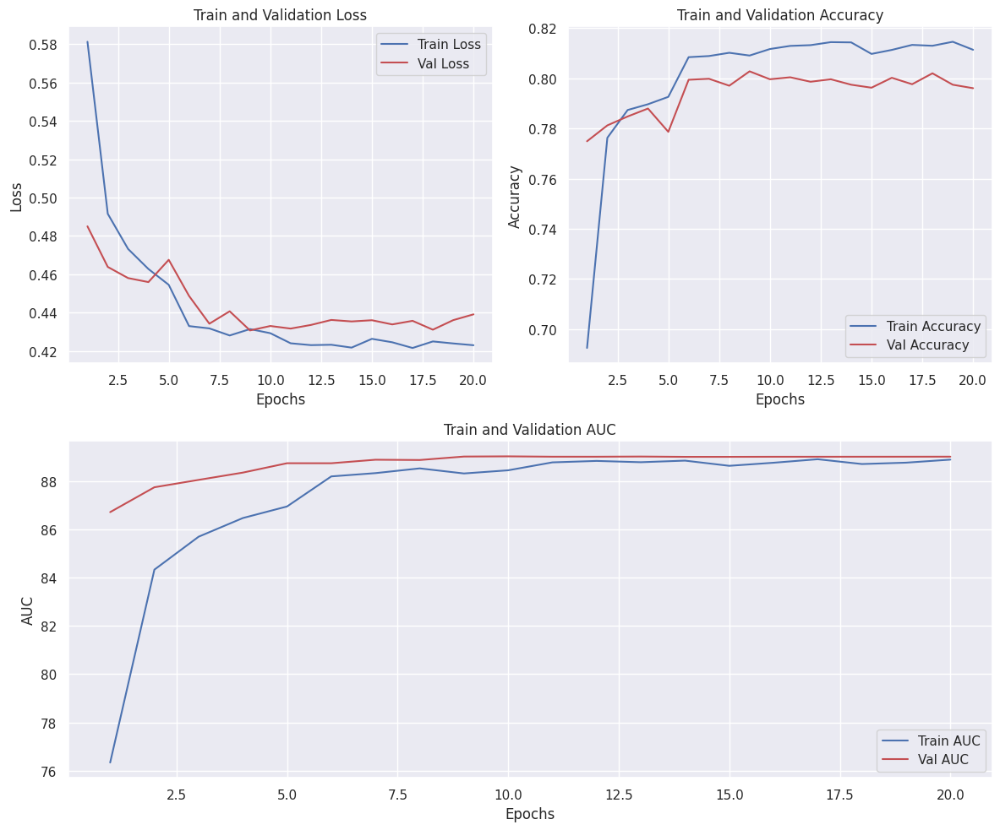

In [21]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [22]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "Y",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "Z",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:02<13:08,  2.53s/batch]

Epoch   1/20:   1%|          | 2/313 [00:05<13:07,  2.53s/batch]

Epoch   1/20:   1%|          | 3/313 [00:07<12:02,  2.33s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:09<12:18,  2.39s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:12<12:29,  2.43s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:14<12:38,  2.47s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:17<12:35,  2.47s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:19<12:13,  2.40s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:21<11:37,  2.29s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:23<11:13,  2.22s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:25<10:55,  2.17s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:27<10:43,  2.14s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:29<10:33,  2.11s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:31<10:26,  2.10s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:34<11:26,  2.30s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:36<11:16,  2.28s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:38<10:55,  2.22s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:41<10:53,  2.22s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:43<10:38,  2.17s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:45<10:26,  2.14s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:47<10:17,  2.11s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:49<10:50,  2.24s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:51<10:44,  2.22s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:54<10:28,  2.17s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:56<10:35,  2.21s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:58<10:20,  2.16s/batch]

Epoch   1/20:   9%|▊         | 27/313 [01:00<10:09,  2.13s/batch]

Epoch   1/20:   9%|▉         | 28/313 [01:02<10:08,  2.13s/batch]

Epoch   1/20:   9%|▉         | 29/313 [01:04<09:59,  2.11s/batch]

Epoch   1/20:  10%|▉         | 30/313 [01:06<09:53,  2.10s/batch]

Epoch   1/20:  10%|▉         | 31/313 [01:08<09:48,  2.09s/batch]

Epoch   1/20:  10%|█         | 32/313 [01:10<09:43,  2.08s/batch]

Epoch   1/20:  11%|█         | 33/313 [01:12<09:40,  2.07s/batch]

Epoch   1/20:  11%|█         | 34/313 [01:14<09:36,  2.07s/batch]

Epoch   1/20:  11%|█         | 35/313 [01:16<09:33,  2.06s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [01:19<09:31,  2.06s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [01:21<09:28,  2.06s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [01:23<09:26,  2.06s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [01:25<09:23,  2.06s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [01:27<09:21,  2.06s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [01:29<09:19,  2.06s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [01:31<09:16,  2.06s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [01:33<09:14,  2.06s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [01:35<09:13,  2.06s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [01:37<09:11,  2.06s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [01:40<09:46,  2.20s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [01:42<10:10,  2.30s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [01:45<10:27,  2.37s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [01:47<10:17,  2.34s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [01:49<10:30,  2.40s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [01:52<10:18,  2.36s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:54<09:52,  2.27s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:56<09:33,  2.21s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:58<09:20,  2.16s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [02:00<09:09,  2.13s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [02:02<09:01,  2.11s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [02:04<08:55,  2.09s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [02:06<08:51,  2.08s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [02:08<08:47,  2.08s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [02:10<08:56,  2.12s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [02:13<09:25,  2.24s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [02:15<09:22,  2.24s/batch]

Epoch   1/20:  20%|██        | 63/313 [02:17<09:06,  2.19s/batch]

Epoch   1/20:  20%|██        | 64/313 [02:19<08:54,  2.15s/batch]

Epoch   1/20:  21%|██        | 65/313 [02:21<08:45,  2.12s/batch]

Epoch   1/20:  21%|██        | 66/313 [02:23<08:38,  2.10s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [02:25<08:33,  2.09s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [02:27<08:29,  2.08s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [02:30<08:25,  2.07s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [02:32<08:22,  2.07s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [02:34<08:20,  2.07s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [02:36<08:18,  2.07s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [02:38<08:16,  2.07s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [02:40<08:13,  2.07s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [02:42<08:11,  2.06s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [02:44<08:42,  2.20s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [02:47<08:52,  2.25s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [02:49<08:35,  2.19s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [02:51<08:23,  2.15s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [02:53<08:15,  2.13s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [02:55<08:08,  2.11s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [02:57<08:03,  2.09s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [02:59<07:58,  2.08s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [03:02<08:17,  2.17s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [03:04<08:07,  2.14s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [03:06<07:59,  2.11s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [03:08<07:53,  2.09s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [03:10<07:48,  2.08s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [03:12<08:00,  2.15s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [03:14<08:00,  2.15s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [03:17<08:22,  2.26s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [03:19<08:06,  2.20s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [03:21<07:55,  2.16s/batch]

Epoch   1/20:  30%|███       | 94/313 [03:23<07:46,  2.13s/batch]

Epoch   1/20:  30%|███       | 95/313 [03:25<07:39,  2.11s/batch]

Epoch   1/20:  31%|███       | 96/313 [03:27<07:34,  2.09s/batch]

Epoch   1/20:  31%|███       | 97/313 [03:29<07:30,  2.08s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [03:32<07:49,  2.18s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [03:34<07:38,  2.14s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [03:36<08:00,  2.25s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [03:39<08:14,  2.33s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [03:41<08:24,  2.39s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [03:44<08:30,  2.43s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [03:46<08:14,  2.36s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [03:48<08:21,  2.41s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [03:51<08:26,  2.44s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [03:53<08:12,  2.39s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [03:55<07:49,  2.29s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [03:57<07:33,  2.22s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [03:59<07:21,  2.17s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [04:01<07:12,  2.14s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [04:04<07:33,  2.25s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [04:06<07:19,  2.20s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [04:08<07:09,  2.16s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [04:10<07:01,  2.13s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [04:12<06:55,  2.11s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [04:14<06:50,  2.09s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [04:16<06:46,  2.08s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [04:18<06:43,  2.08s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [04:21<07:06,  2.21s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [04:23<07:06,  2.22s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [04:25<06:55,  2.17s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [04:27<06:46,  2.14s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [04:29<06:40,  2.12s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [04:31<06:40,  2.13s/batch]

Epoch   1/20:  40%|████      | 126/313 [04:34<06:34,  2.11s/batch]

Epoch   1/20:  41%|████      | 127/313 [04:36<06:29,  2.09s/batch]

Epoch   1/20:  41%|████      | 128/313 [04:38<06:25,  2.09s/batch]

Epoch   1/20:  41%|████      | 129/313 [04:40<06:22,  2.08s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [04:42<06:19,  2.08s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [04:44<06:16,  2.07s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [04:46<06:14,  2.07s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [04:48<06:11,  2.06s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [04:50<06:09,  2.06s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [04:53<06:31,  2.20s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [04:55<06:28,  2.19s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [04:57<06:19,  2.15s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [04:59<06:12,  2.13s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [05:01<06:06,  2.11s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [05:03<06:02,  2.10s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [05:05<06:13,  2.17s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [05:07<06:06,  2.14s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [05:09<06:00,  2.12s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [05:12<05:55,  2.10s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [05:14<05:51,  2.09s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [05:16<05:47,  2.08s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [05:18<05:44,  2.08s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [05:20<05:41,  2.07s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [05:22<05:39,  2.07s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [05:24<05:59,  2.21s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [05:27<05:59,  2.22s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [05:29<05:49,  2.17s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [05:31<05:41,  2.14s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [05:33<05:36,  2.12s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [05:35<05:40,  2.16s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [05:37<05:48,  2.22s/batch]

Epoch   1/20:  50%|█████     | 157/313 [05:40<05:53,  2.27s/batch]

Epoch   1/20:  50%|█████     | 158/313 [05:42<05:42,  2.21s/batch]

Epoch   1/20:  51%|█████     | 159/313 [05:44<05:33,  2.16s/batch]

Epoch   1/20:  51%|█████     | 160/313 [05:46<05:26,  2.14s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [05:48<05:21,  2.12s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [05:50<05:17,  2.10s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [05:52<05:13,  2.09s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [05:54<05:10,  2.08s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [05:57<05:28,  2.22s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [05:59<05:19,  2.17s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [06:01<05:12,  2.14s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [06:03<05:06,  2.11s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [06:05<05:01,  2.10s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [06:07<04:58,  2.09s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [06:09<04:55,  2.08s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [06:11<04:52,  2.07s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [06:13<04:50,  2.07s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [06:15<04:47,  2.07s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [06:17<04:45,  2.07s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [06:19<04:42,  2.06s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [06:22<04:40,  2.07s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [06:24<04:38,  2.07s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [06:26<04:36,  2.07s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [06:28<04:34,  2.07s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [06:30<04:50,  2.20s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [06:32<04:45,  2.18s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [06:34<04:38,  2.15s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [06:37<04:33,  2.12s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [06:39<04:28,  2.10s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [06:41<04:25,  2.09s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [06:43<04:22,  2.08s/batch]

Epoch   1/20:  60%|██████    | 188/313 [06:45<04:19,  2.07s/batch]

Epoch   1/20:  60%|██████    | 189/313 [06:47<04:16,  2.07s/batch]

Epoch   1/20:  61%|██████    | 190/313 [06:49<04:14,  2.07s/batch]

Epoch   1/20:  61%|██████    | 191/313 [06:51<04:12,  2.07s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [06:53<04:09,  2.07s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [06:55<04:07,  2.07s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [06:57<04:05,  2.07s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [06:59<04:03,  2.06s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [07:02<04:17,  2.21s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [07:04<04:25,  2.29s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [07:07<04:31,  2.36s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [07:09<04:34,  2.41s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [07:12<04:36,  2.44s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [07:14<04:36,  2.47s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [07:17<04:27,  2.41s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [07:19<04:13,  2.31s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [07:21<04:03,  2.23s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [07:23<03:55,  2.18s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [07:25<03:49,  2.15s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [07:27<03:44,  2.12s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [07:29<03:41,  2.11s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [07:31<03:41,  2.13s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [07:34<03:51,  2.25s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [07:36<03:56,  2.32s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [07:38<03:46,  2.24s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [07:40<03:38,  2.19s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [07:43<03:37,  2.20s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [07:45<03:31,  2.16s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [07:47<03:26,  2.13s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [07:49<03:22,  2.11s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [07:51<03:19,  2.10s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [07:53<03:16,  2.09s/batch]

Epoch   1/20:  70%|███████   | 220/313 [07:55<03:13,  2.08s/batch]

Epoch   1/20:  71%|███████   | 221/313 [07:57<03:10,  2.08s/batch]

Epoch   1/20:  71%|███████   | 222/313 [07:59<03:08,  2.07s/batch]

Epoch   1/20:  71%|███████   | 223/313 [08:01<03:06,  2.07s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [08:03<03:03,  2.07s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [08:06<03:14,  2.21s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [08:08<03:11,  2.20s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [08:10<03:06,  2.17s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [08:13<03:13,  2.28s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [08:15<03:17,  2.35s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [08:17<03:07,  2.26s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [08:19<03:07,  2.28s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [08:21<02:59,  2.21s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [08:24<02:53,  2.17s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [08:26<02:48,  2.13s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [08:28<02:44,  2.11s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [08:30<02:41,  2.10s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [08:32<02:38,  2.09s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [08:34<02:35,  2.08s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [08:36<02:33,  2.07s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [08:38<02:41,  2.21s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [08:40<02:35,  2.16s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [08:43<02:31,  2.13s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [08:45<02:27,  2.11s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [08:47<02:24,  2.09s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [08:49<02:21,  2.08s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [08:51<02:19,  2.08s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [08:53<02:16,  2.07s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [08:55<02:14,  2.07s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [08:57<02:12,  2.06s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [08:59<02:09,  2.06s/batch]

Epoch   1/20:  80%|████████  | 251/313 [09:01<02:07,  2.06s/batch]

Epoch   1/20:  81%|████████  | 252/313 [09:03<02:05,  2.06s/batch]

Epoch   1/20:  81%|████████  | 253/313 [09:05<02:03,  2.06s/batch]

Epoch   1/20:  81%|████████  | 254/313 [09:07<02:01,  2.06s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [09:09<01:59,  2.06s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [09:12<02:05,  2.20s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [09:14<02:08,  2.30s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [09:17<02:05,  2.28s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [09:19<01:59,  2.21s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [09:21<02:02,  2.31s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [09:24<02:01,  2.33s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [09:26<01:54,  2.25s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [09:28<01:49,  2.19s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [09:30<01:45,  2.15s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [09:32<01:41,  2.12s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [09:34<01:38,  2.10s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [09:36<01:36,  2.09s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [09:38<01:33,  2.08s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [09:40<01:33,  2.13s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [09:42<01:30,  2.11s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [09:45<01:33,  2.23s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [09:47<01:33,  2.28s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [09:49<01:28,  2.21s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [09:51<01:24,  2.17s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [09:54<01:23,  2.19s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [09:56<01:21,  2.19s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [09:58<01:17,  2.15s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [10:00<01:14,  2.13s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [10:02<01:11,  2.11s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [10:04<01:09,  2.09s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [10:06<01:06,  2.08s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [10:08<01:04,  2.07s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [10:10<01:02,  2.07s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [10:12<01:00,  2.07s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [10:14<00:57,  2.07s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [10:17<00:59,  2.20s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [10:19<00:59,  2.27s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [10:21<00:55,  2.21s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [10:23<00:51,  2.16s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [10:25<00:48,  2.13s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [10:28<00:47,  2.17s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [10:30<00:44,  2.13s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [10:32<00:42,  2.11s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [10:34<00:39,  2.10s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [10:36<00:37,  2.09s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [10:38<00:35,  2.08s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [10:40<00:33,  2.07s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [10:42<00:32,  2.14s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [10:44<00:29,  2.11s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [10:46<00:27,  2.10s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [10:49<00:26,  2.22s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [10:51<00:23,  2.18s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [10:53<00:21,  2.14s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [10:55<00:19,  2.12s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [10:57<00:16,  2.10s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [10:59<00:14,  2.09s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [11:01<00:12,  2.08s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [11:03<00:10,  2.07s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [11:05<00:08,  2.07s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [11:08<00:06,  2.06s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.06s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [11:12<00:02,  2.06s/batch]

Epoch   1/20: 100%|██████████| 313/313 [11:13<00:00,  1.77s/batch]

Epoch   1/20: 100%|██████████| 313/313 [11:13<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [11:42<00:00,  1.77s/batch, Epoch = 11m 42s, Loss = 0.5701|0.4882, Acc = 0.702|0.772, AUC = 77.584|86.733]

Epoch   1/20: 100%|██████████| 313/313 [11:42<00:00,  2.24s/batch, Epoch = 11m 42s, Loss = 0.5701|0.4882, Acc = 0.702|0.772, AUC = 77.584|86.733]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:02<10:34,  2.03s/batch]

Epoch   2/20:   1%|          | 2/313 [00:04<10:35,  2.04s/batch]

Epoch   2/20:   1%|          | 3/313 [00:06<10:34,  2.05s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:08<10:33,  2.05s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:10<10:31,  2.05s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:12<10:29,  2.05s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:14<10:28,  2.05s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:16<10:26,  2.06s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:18<10:24,  2.06s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:20<10:22,  2.05s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:22<10:20,  2.05s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:24<10:18,  2.06s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:26<10:34,  2.12s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:28<10:28,  2.10s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:31<10:28,  2.11s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:33<10:22,  2.10s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:35<10:59,  2.23s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:38<11:23,  2.32s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:40<10:58,  2.24s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:42<10:40,  2.18s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:44<10:26,  2.15s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:46<10:17,  2.12s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:48<10:09,  2.10s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:50<10:03,  2.09s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:52<09:59,  2.08s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:54<09:55,  2.07s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:56<09:51,  2.07s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:58<09:48,  2.06s/batch]

Epoch   2/20:   9%|▉         | 29/313 [01:00<09:46,  2.06s/batch]

Epoch   2/20:  10%|▉         | 30/313 [01:02<09:43,  2.06s/batch]

Epoch   2/20:  10%|▉         | 31/313 [01:04<09:40,  2.06s/batch]

Epoch   2/20:  10%|█         | 32/313 [01:07<10:18,  2.20s/batch]

Epoch   2/20:  11%|█         | 33/313 [01:09<10:36,  2.27s/batch]

Epoch   2/20:  11%|█         | 34/313 [01:12<10:16,  2.21s/batch]

Epoch   2/20:  11%|█         | 35/313 [01:14<10:01,  2.16s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [01:16<09:50,  2.13s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [01:18<09:42,  2.11s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [01:20<09:35,  2.09s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [01:22<10:08,  2.22s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [01:24<10:04,  2.21s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [01:27<10:15,  2.26s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [01:29<09:56,  2.20s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [01:31<09:42,  2.16s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [01:33<09:31,  2.13s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [01:35<09:24,  2.11s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [01:37<09:18,  2.09s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [01:40<09:51,  2.22s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [01:42<09:39,  2.19s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [01:44<09:27,  2.15s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [01:46<09:18,  2.12s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [01:48<09:11,  2.10s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:50<09:05,  2.09s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:52<09:01,  2.08s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:54<09:15,  2.15s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:56<09:07,  2.12s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:58<09:00,  2.10s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [02:01<08:54,  2.09s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [02:03<08:53,  2.09s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [02:05<08:48,  2.08s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [02:07<08:44,  2.07s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [02:09<08:41,  2.07s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [02:11<09:13,  2.21s/batch]

Epoch   2/20:  20%|██        | 63/313 [02:14<09:35,  2.30s/batch]

Epoch   2/20:  20%|██        | 64/313 [02:16<09:38,  2.32s/batch]

Epoch   2/20:  21%|██        | 65/313 [02:18<09:16,  2.24s/batch]

Epoch   2/20:  21%|██        | 66/313 [02:20<09:00,  2.19s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [02:22<08:48,  2.15s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [02:24<08:39,  2.12s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [02:27<08:32,  2.10s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [02:29<08:27,  2.09s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [02:31<08:23,  2.08s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [02:33<08:19,  2.07s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [02:35<08:17,  2.07s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [02:37<08:47,  2.21s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [02:40<08:50,  2.23s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [02:42<08:36,  2.18s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [02:44<08:58,  2.28s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [02:46<08:41,  2.22s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [02:49<08:57,  2.30s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [02:51<08:38,  2.23s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [02:53<08:57,  2.32s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [02:55<08:37,  2.24s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [02:57<08:22,  2.19s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [02:59<08:12,  2.15s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [03:02<08:03,  2.12s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [03:04<07:57,  2.10s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [03:06<07:52,  2.09s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [03:08<07:47,  2.08s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [03:10<07:44,  2.07s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [03:12<07:41,  2.07s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [03:14<07:38,  2.07s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [03:16<08:07,  2.21s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [03:19<08:20,  2.27s/batch]

Epoch   2/20:  30%|███       | 94/313 [03:21<08:03,  2.21s/batch]

Epoch   2/20:  30%|███       | 95/313 [03:23<07:51,  2.16s/batch]

Epoch   2/20:  31%|███       | 96/313 [03:25<07:47,  2.15s/batch]

Epoch   2/20:  31%|███       | 97/313 [03:27<07:39,  2.13s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [03:29<07:32,  2.11s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [03:31<07:27,  2.09s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [03:33<07:23,  2.08s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [03:35<07:19,  2.08s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [03:37<07:16,  2.07s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [03:39<07:13,  2.07s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [03:42<07:11,  2.06s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [03:44<07:09,  2.07s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [03:46<07:07,  2.06s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [03:48<07:33,  2.20s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [03:51<07:50,  2.30s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [03:53<08:02,  2.36s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [03:55<07:52,  2.33s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [03:58<07:33,  2.24s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [04:00<07:19,  2.19s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [04:02<07:10,  2.15s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [04:04<07:02,  2.12s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [04:06<06:56,  2.10s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [04:08<06:51,  2.09s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [04:10<06:47,  2.08s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [04:12<06:44,  2.08s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [04:14<06:41,  2.07s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [04:16<06:38,  2.07s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [04:18<06:36,  2.06s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [04:21<07:00,  2.20s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [04:23<07:17,  2.30s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [04:25<07:12,  2.29s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [04:27<06:57,  2.22s/batch]

Epoch   2/20:  40%|████      | 126/313 [04:30<06:45,  2.17s/batch]

Epoch   2/20:  41%|████      | 127/313 [04:32<06:37,  2.14s/batch]

Epoch   2/20:  41%|████      | 128/313 [04:34<06:43,  2.18s/batch]

Epoch   2/20:  41%|████      | 129/313 [04:36<06:34,  2.15s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [04:38<06:27,  2.12s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [04:40<06:22,  2.10s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [04:42<06:17,  2.09s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [04:44<06:13,  2.08s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [04:46<06:10,  2.07s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [04:48<06:07,  2.07s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [04:50<06:05,  2.06s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [04:53<06:09,  2.10s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [04:55<06:05,  2.09s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [04:57<06:01,  2.08s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [04:59<05:58,  2.07s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [05:01<05:55,  2.07s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [05:03<05:52,  2.06s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [05:05<05:50,  2.06s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [05:07<05:47,  2.06s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [05:09<05:45,  2.06s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [05:11<05:43,  2.06s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [05:13<05:41,  2.06s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [05:15<05:39,  2.06s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [05:17<05:37,  2.06s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [05:19<05:46,  2.12s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [05:22<06:03,  2.25s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [05:25<06:15,  2.33s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [05:27<06:22,  2.39s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [05:30<06:26,  2.43s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [05:32<06:28,  2.46s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [05:34<06:20,  2.42s/batch]

Epoch   2/20:  50%|█████     | 157/313 [05:37<06:00,  2.31s/batch]

Epoch   2/20:  50%|█████     | 158/313 [05:39<05:46,  2.24s/batch]

Epoch   2/20:  51%|█████     | 159/313 [05:41<05:37,  2.19s/batch]

Epoch   2/20:  51%|█████     | 160/313 [05:43<05:28,  2.15s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [05:45<05:22,  2.12s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [05:47<05:17,  2.10s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [05:49<05:34,  2.23s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [05:52<05:34,  2.24s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [05:54<05:23,  2.19s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [05:56<05:35,  2.29s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [05:58<05:29,  2.26s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [06:00<05:18,  2.20s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [06:03<05:10,  2.16s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [06:05<05:04,  2.13s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [06:07<04:59,  2.11s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [06:09<04:55,  2.09s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [06:11<04:51,  2.08s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [06:13<05:07,  2.21s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [06:16<05:07,  2.23s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [06:18<04:58,  2.18s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [06:20<04:51,  2.14s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [06:22<04:45,  2.12s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [06:24<04:41,  2.10s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [06:26<04:37,  2.09s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [06:28<04:52,  2.22s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [06:31<04:50,  2.21s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [06:33<04:41,  2.17s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [06:35<04:35,  2.13s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [06:37<04:34,  2.15s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [06:39<04:47,  2.26s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [06:42<04:49,  2.30s/batch]

Epoch   2/20:  60%|██████    | 188/313 [06:44<04:37,  2.22s/batch]

Epoch   2/20:  60%|██████    | 189/313 [06:46<04:29,  2.17s/batch]

Epoch   2/20:  61%|██████    | 190/313 [06:48<04:22,  2.14s/batch]

Epoch   2/20:  61%|██████    | 191/313 [06:50<04:17,  2.11s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [06:52<04:13,  2.10s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [06:54<04:14,  2.12s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [06:56<04:10,  2.10s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [06:59<04:16,  2.17s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [07:01<04:26,  2.28s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [07:04<04:32,  2.35s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [07:06<04:27,  2.33s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [07:08<04:15,  2.24s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [07:10<04:07,  2.19s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [07:12<04:00,  2.15s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [07:14<03:55,  2.12s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [07:16<03:56,  2.15s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [07:18<03:51,  2.12s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [07:20<03:46,  2.10s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [07:23<03:43,  2.09s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [07:25<03:40,  2.08s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [07:27<03:37,  2.07s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [07:29<03:34,  2.07s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [07:31<03:32,  2.06s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [07:33<03:44,  2.20s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [07:36<03:49,  2.27s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [07:38<03:40,  2.20s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [07:40<03:33,  2.16s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [07:42<03:28,  2.13s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [07:44<03:24,  2.11s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [07:46<03:20,  2.09s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [07:48<03:17,  2.08s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [07:50<03:14,  2.07s/batch]

Epoch   2/20:  70%|███████   | 220/313 [07:52<03:12,  2.07s/batch]

Epoch   2/20:  71%|███████   | 221/313 [07:54<03:09,  2.06s/batch]

Epoch   2/20:  71%|███████   | 222/313 [07:56<03:07,  2.06s/batch]

Epoch   2/20:  71%|███████   | 223/313 [07:58<03:05,  2.06s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [08:00<03:03,  2.06s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [08:02<03:01,  2.06s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [08:05<03:11,  2.20s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [08:07<03:16,  2.28s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [08:09<03:08,  2.21s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [08:12<03:01,  2.17s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [08:14<02:56,  2.13s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [08:16<02:52,  2.11s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [08:18<02:49,  2.09s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [08:20<02:46,  2.08s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [08:22<02:43,  2.08s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [08:24<02:41,  2.07s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [08:26<02:39,  2.07s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [08:28<02:36,  2.06s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [08:30<02:34,  2.06s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [08:32<02:32,  2.06s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [08:34<02:30,  2.06s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [08:37<02:38,  2.20s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [08:39<02:33,  2.16s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [08:41<02:28,  2.13s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [08:43<02:25,  2.10s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [08:45<02:22,  2.09s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [08:47<02:19,  2.08s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [08:49<02:16,  2.07s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [08:51<02:14,  2.07s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [08:53<02:12,  2.06s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [08:55<02:09,  2.06s/batch]

Epoch   2/20:  80%|████████  | 251/313 [08:57<02:10,  2.11s/batch]

Epoch   2/20:  81%|████████  | 252/313 [08:59<02:07,  2.09s/batch]

Epoch   2/20:  81%|████████  | 253/313 [09:01<02:04,  2.08s/batch]

Epoch   2/20:  81%|████████  | 254/313 [09:04<02:02,  2.07s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [09:06<02:07,  2.20s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [09:09<02:10,  2.30s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [09:11<02:12,  2.36s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [09:14<02:12,  2.42s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [09:16<02:05,  2.33s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [09:18<01:59,  2.25s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [09:20<01:53,  2.19s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [09:22<01:49,  2.15s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [09:24<01:46,  2.12s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [09:26<01:43,  2.10s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [09:28<01:40,  2.09s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [09:30<01:37,  2.08s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [09:32<01:35,  2.07s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [09:35<01:36,  2.15s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [09:37<01:33,  2.13s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [09:39<01:34,  2.20s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [09:41<01:36,  2.30s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [09:44<01:37,  2.37s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [09:47<01:36,  2.41s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [09:49<01:31,  2.36s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [09:51<01:28,  2.34s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [09:53<01:23,  2.27s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [09:55<01:19,  2.21s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [09:57<01:15,  2.16s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [09:59<01:12,  2.13s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [10:01<01:09,  2.11s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [10:03<01:06,  2.09s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [10:06<01:04,  2.08s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [10:08<01:02,  2.07s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [10:10<01:00,  2.08s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [10:12<00:58,  2.08s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [10:14<00:59,  2.21s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [10:16<00:56,  2.16s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [10:18<00:53,  2.13s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [10:20<00:50,  2.11s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [10:22<00:48,  2.09s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [10:25<00:45,  2.08s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [10:27<00:43,  2.08s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [10:29<00:41,  2.07s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [10:31<00:39,  2.07s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [10:33<00:37,  2.07s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [10:35<00:35,  2.08s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [10:37<00:33,  2.09s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [10:39<00:31,  2.08s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [10:41<00:29,  2.07s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [10:43<00:27,  2.13s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [10:46<00:26,  2.25s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [10:48<00:24,  2.20s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [10:50<00:21,  2.16s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [10:52<00:19,  2.13s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [10:54<00:16,  2.11s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [10:56<00:14,  2.09s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.08s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [11:00<00:10,  2.08s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.07s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.06s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [11:07<00:04,  2.06s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [11:09<00:02,  2.06s/batch]

Epoch   2/20: 100%|██████████| 313/313 [11:10<00:00,  1.77s/batch]

Epoch   2/20: 100%|██████████| 313/313 [11:10<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [11:39<00:00,  1.77s/batch, Epoch = 11m 39s, Loss = 0.4818|0.4406, Acc = 0.782|0.797, AUC = 85.068|88.359]

Epoch   2/20: 100%|██████████| 313/313 [11:39<00:00,  2.24s/batch, Epoch = 11m 39s, Loss = 0.4818|0.4406, Acc = 0.782|0.797, AUC = 85.068|88.359]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch   3/20:   1%|          | 2/313 [00:05<13:00,  2.51s/batch]

Epoch   3/20:   1%|          | 3/313 [00:07<11:58,  2.32s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:09<11:24,  2.22s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:11<11:04,  2.16s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:13<10:51,  2.12s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:15<10:42,  2.10s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:17<10:36,  2.09s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:19<10:33,  2.08s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:21<10:29,  2.08s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:23<10:25,  2.07s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:25<10:22,  2.07s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:27<10:20,  2.07s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:29<10:17,  2.07s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:31<10:14,  2.06s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:34<10:53,  2.20s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:36<10:41,  2.17s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:38<10:29,  2.13s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:40<10:20,  2.11s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:42<10:13,  2.09s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:44<10:07,  2.08s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:46<10:03,  2.07s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:48<09:59,  2.07s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:51<10:16,  2.13s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:53<10:07,  2.11s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:55<10:01,  2.09s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:57<09:55,  2.08s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:59<09:52,  2.08s/batch]

Epoch   3/20:   9%|▉         | 29/313 [01:01<09:48,  2.07s/batch]

Epoch   3/20:  10%|▉         | 30/313 [01:03<09:45,  2.07s/batch]

Epoch   3/20:  10%|▉         | 31/313 [01:05<10:21,  2.21s/batch]

Epoch   3/20:  10%|█         | 32/313 [01:08<10:20,  2.21s/batch]

Epoch   3/20:  11%|█         | 33/313 [01:10<10:44,  2.30s/batch]

Epoch   3/20:  11%|█         | 34/313 [01:13<11:01,  2.37s/batch]

Epoch   3/20:  11%|█         | 35/313 [01:15<10:55,  2.36s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [01:17<10:27,  2.27s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [01:19<10:08,  2.21s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [01:21<09:54,  2.16s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [01:23<09:43,  2.13s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [01:25<09:35,  2.11s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [01:27<09:32,  2.10s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [01:29<09:26,  2.09s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [01:32<09:22,  2.08s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [01:34<09:18,  2.08s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [01:36<09:15,  2.07s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [01:38<09:51,  2.21s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [01:40<09:41,  2.19s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [01:42<09:29,  2.15s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [01:44<09:21,  2.13s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [01:47<09:14,  2.11s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:49<09:09,  2.10s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:51<09:04,  2.09s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:53<09:00,  2.08s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:55<08:57,  2.08s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:57<08:55,  2.07s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:59<08:52,  2.07s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [02:01<08:49,  2.07s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [02:03<08:47,  2.07s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [02:05<08:55,  2.11s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [02:07<08:49,  2.09s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [02:10<09:20,  2.22s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [02:12<09:41,  2.32s/batch]

Epoch   3/20:  20%|██        | 63/313 [02:15<09:36,  2.31s/batch]

Epoch   3/20:  20%|██        | 64/313 [02:17<09:15,  2.23s/batch]

Epoch   3/20:  21%|██        | 65/313 [02:19<09:00,  2.18s/batch]

Epoch   3/20:  21%|██        | 66/313 [02:21<08:49,  2.14s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [02:23<08:40,  2.12s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [02:25<08:34,  2.10s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [02:27<08:29,  2.09s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [02:29<08:25,  2.08s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [02:31<08:22,  2.08s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [02:33<08:19,  2.07s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [02:35<08:16,  2.07s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [02:37<08:13,  2.06s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [02:39<08:11,  2.06s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [02:42<08:42,  2.20s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [02:44<08:37,  2.19s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [02:46<08:25,  2.15s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [02:48<08:17,  2.12s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [02:50<08:10,  2.10s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [02:52<08:04,  2.09s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [02:54<08:01,  2.08s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [02:56<07:57,  2.07s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [02:59<07:54,  2.07s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [03:01<07:51,  2.07s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [03:03<07:49,  2.07s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [03:05<07:46,  2.06s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [03:07<07:49,  2.09s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [03:09<07:46,  2.08s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [03:11<07:43,  2.08s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [03:13<07:45,  2.10s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [03:15<07:41,  2.09s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [03:17<07:37,  2.08s/batch]

Epoch   3/20:  30%|███       | 94/313 [03:19<07:34,  2.07s/batch]

Epoch   3/20:  30%|███       | 95/313 [03:21<07:31,  2.07s/batch]

Epoch   3/20:  31%|███       | 96/313 [03:23<07:28,  2.07s/batch]

Epoch   3/20:  31%|███       | 97/313 [03:26<07:40,  2.13s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [03:28<07:33,  2.11s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [03:30<07:28,  2.10s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [03:32<07:24,  2.09s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [03:34<07:20,  2.08s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [03:36<07:17,  2.07s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [03:38<07:14,  2.07s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [03:40<07:11,  2.07s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [03:42<07:09,  2.06s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [03:44<07:06,  2.06s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [03:47<07:33,  2.20s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [03:49<07:22,  2.16s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [03:51<07:14,  2.13s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [03:53<07:08,  2.11s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [03:55<07:02,  2.09s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [03:57<06:59,  2.09s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [03:59<06:55,  2.08s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [04:01<06:52,  2.07s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [04:03<06:49,  2.07s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [04:05<06:47,  2.07s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [04:07<06:44,  2.06s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [04:09<06:42,  2.06s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [04:12<06:40,  2.06s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [04:14<06:38,  2.06s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [04:16<06:36,  2.06s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [04:18<06:33,  2.06s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [04:20<06:56,  2.19s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [04:22<06:46,  2.15s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [04:24<06:39,  2.13s/batch]

Epoch   3/20:  40%|████      | 126/313 [04:26<06:33,  2.11s/batch]

Epoch   3/20:  41%|████      | 127/313 [04:28<06:29,  2.09s/batch]

Epoch   3/20:  41%|████      | 128/313 [04:30<06:25,  2.09s/batch]

Epoch   3/20:  41%|████      | 129/313 [04:33<06:22,  2.08s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [04:35<06:19,  2.07s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [04:37<06:16,  2.07s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [04:39<06:14,  2.07s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [04:41<06:11,  2.06s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [04:43<06:09,  2.06s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [04:45<06:07,  2.06s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [04:47<06:05,  2.06s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [04:49<06:02,  2.06s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [04:51<06:00,  2.06s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [04:53<06:04,  2.09s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [04:55<06:01,  2.09s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [04:57<05:57,  2.08s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [04:59<05:55,  2.08s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [05:02<05:52,  2.07s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [05:04<05:50,  2.07s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [05:06<05:49,  2.08s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [05:08<05:46,  2.07s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [05:10<05:44,  2.07s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [05:12<05:41,  2.07s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [05:14<05:39,  2.07s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [05:16<05:59,  2.20s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [05:19<06:12,  2.30s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [05:21<06:10,  2.30s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [05:23<05:56,  2.23s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [05:26<06:08,  2.32s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [05:28<06:14,  2.37s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [05:30<05:57,  2.28s/batch]

Epoch   3/20:  50%|█████     | 157/313 [05:33<05:44,  2.21s/batch]

Epoch   3/20:  50%|█████     | 158/313 [05:35<05:35,  2.16s/batch]

Epoch   3/20:  51%|█████     | 159/313 [05:37<05:28,  2.13s/batch]

Epoch   3/20:  51%|█████     | 160/313 [05:39<05:23,  2.11s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [05:41<05:18,  2.09s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [05:43<05:14,  2.08s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [05:45<05:11,  2.07s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [05:47<05:08,  2.07s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [05:49<05:05,  2.07s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [05:51<05:12,  2.13s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [05:53<05:07,  2.11s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [05:55<05:03,  2.09s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [05:58<05:20,  2.22s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [06:00<05:13,  2.19s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [06:02<05:05,  2.15s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [06:04<04:59,  2.12s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [06:06<04:54,  2.10s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [06:08<04:50,  2.09s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [06:10<04:54,  2.13s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [06:13<04:49,  2.11s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [06:15<04:44,  2.10s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [06:17<04:41,  2.08s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [06:19<04:38,  2.08s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [06:21<04:35,  2.07s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [06:23<04:32,  2.07s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [06:25<04:30,  2.06s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [06:27<04:28,  2.06s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [06:29<04:42,  2.19s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [06:32<04:35,  2.15s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [06:34<04:29,  2.12s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [06:36<04:25,  2.10s/batch]

Epoch   3/20:  60%|██████    | 188/313 [06:38<04:21,  2.09s/batch]

Epoch   3/20:  60%|██████    | 189/313 [06:40<04:35,  2.22s/batch]

Epoch   3/20:  61%|██████    | 190/313 [06:43<04:44,  2.31s/batch]

Epoch   3/20:  61%|██████    | 191/313 [06:45<04:49,  2.38s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [06:47<04:35,  2.28s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [06:50<04:42,  2.35s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [06:52<04:29,  2.27s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [06:54<04:20,  2.20s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [06:56<04:29,  2.30s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [06:59<04:26,  2.29s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [07:01<04:31,  2.36s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [07:04<04:34,  2.41s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [07:06<04:20,  2.30s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [07:08<04:09,  2.23s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [07:10<04:01,  2.18s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [07:12<03:55,  2.14s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [07:14<03:50,  2.12s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [07:16<03:46,  2.10s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [07:18<03:43,  2.09s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [07:20<03:40,  2.08s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [07:22<03:38,  2.08s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [07:24<03:35,  2.07s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [07:27<03:47,  2.21s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [07:29<03:50,  2.26s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [07:31<03:42,  2.20s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [07:34<03:49,  2.30s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [07:36<03:53,  2.36s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [07:39<03:47,  2.33s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [07:41<03:38,  2.25s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [07:43<03:30,  2.20s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [07:45<03:24,  2.15s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [07:47<03:19,  2.13s/batch]

Epoch   3/20:  70%|███████   | 220/313 [07:49<03:16,  2.11s/batch]

Epoch   3/20:  71%|███████   | 221/313 [07:51<03:12,  2.09s/batch]

Epoch   3/20:  71%|███████   | 222/313 [07:53<03:09,  2.08s/batch]

Epoch   3/20:  71%|███████   | 223/313 [07:55<03:07,  2.08s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [07:57<03:04,  2.07s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [07:59<03:02,  2.07s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [08:01<02:59,  2.07s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [08:03<02:57,  2.06s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [08:06<03:07,  2.20s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [08:08<03:04,  2.20s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [08:10<02:59,  2.16s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [08:12<02:54,  2.13s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [08:14<02:51,  2.11s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [08:16<02:47,  2.10s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [08:19<02:47,  2.12s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [08:21<02:43,  2.10s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [08:23<02:40,  2.09s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [08:25<02:37,  2.08s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [08:27<02:35,  2.07s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [08:29<02:33,  2.07s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [08:31<02:35,  2.14s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [08:33<02:31,  2.11s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [08:35<02:28,  2.09s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [08:38<02:35,  2.22s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [08:40<02:36,  2.27s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [08:42<02:30,  2.21s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [08:44<02:25,  2.17s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [08:46<02:20,  2.13s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [08:48<02:17,  2.11s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [08:50<02:14,  2.10s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [08:52<02:11,  2.08s/batch]

Epoch   3/20:  80%|████████  | 251/313 [08:55<02:08,  2.08s/batch]

Epoch   3/20:  81%|████████  | 252/313 [08:57<02:06,  2.07s/batch]

Epoch   3/20:  81%|████████  | 253/313 [08:59<02:03,  2.07s/batch]

Epoch   3/20:  81%|████████  | 254/313 [09:01<02:01,  2.06s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [09:03<01:59,  2.06s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [09:05<01:57,  2.06s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [09:07<01:55,  2.06s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [09:09<02:01,  2.20s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [09:11<01:56,  2.16s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [09:14<01:52,  2.13s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [09:16<01:49,  2.11s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [09:18<01:46,  2.09s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [09:20<01:44,  2.08s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [09:22<01:41,  2.08s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [09:24<01:39,  2.07s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [09:26<01:37,  2.07s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [09:28<01:35,  2.07s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [09:30<01:32,  2.07s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [09:32<01:30,  2.06s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [09:34<01:28,  2.06s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [09:37<01:30,  2.15s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [09:39<01:32,  2.26s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [09:42<01:33,  2.34s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [09:44<01:29,  2.30s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [09:46<01:24,  2.23s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [09:48<01:20,  2.17s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [09:50<01:16,  2.14s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [09:52<01:14,  2.11s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [09:54<01:11,  2.10s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [09:56<01:08,  2.09s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [09:58<01:06,  2.08s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [10:00<01:04,  2.07s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [10:02<01:02,  2.07s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [10:04<01:00,  2.07s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [10:06<00:57,  2.07s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [10:08<00:55,  2.07s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [10:11<00:53,  2.07s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [10:13<00:55,  2.20s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [10:15<00:52,  2.18s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [10:17<00:49,  2.14s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [10:19<00:46,  2.12s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [10:22<00:47,  2.24s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [10:24<00:45,  2.27s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [10:26<00:41,  2.21s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [10:28<00:38,  2.16s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [10:30<00:36,  2.13s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [10:32<00:33,  2.11s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [10:34<00:31,  2.10s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [10:37<00:29,  2.10s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [10:39<00:27,  2.09s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [10:41<00:24,  2.08s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [10:43<00:22,  2.08s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [10:45<00:22,  2.21s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [10:48<00:20,  2.31s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [10:50<00:18,  2.34s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [10:52<00:15,  2.25s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [10:54<00:13,  2.20s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [10:56<00:10,  2.16s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [10:59<00:08,  2.19s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [11:01<00:06,  2.15s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [11:03<00:04,  2.17s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [11:05<00:02,  2.14s/batch]

Epoch   3/20: 100%|██████████| 313/313 [11:06<00:00,  1.82s/batch]

Epoch   3/20: 100%|██████████| 313/313 [11:06<00:00,  1.82s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [11:37<00:00,  1.82s/batch, Epoch = 11m 37s, Loss = 0.4730|0.4765, Acc = 0.788|0.787, AUC = 85.651|88.469]

Epoch   3/20: 100%|██████████| 313/313 [11:37<00:00,  2.23s/batch, Epoch = 11m 37s, Loss = 0.4730|0.4765, Acc = 0.788|0.787, AUC = 85.651|88.469]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:02<13:05,  2.52s/batch]

Epoch   4/20:   1%|          | 2/313 [00:04<11:54,  2.30s/batch]

Epoch   4/20:   1%|          | 3/313 [00:06<11:18,  2.19s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:08<11:00,  2.14s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:10<10:49,  2.11s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:12<10:42,  2.09s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:14<10:36,  2.08s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:17<10:32,  2.08s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:19<10:30,  2.07s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:21<10:27,  2.07s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:23<10:24,  2.07s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:25<10:22,  2.07s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:27<10:20,  2.07s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:29<10:18,  2.07s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:31<10:15,  2.07s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:34<10:55,  2.21s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:36<10:56,  2.22s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:38<10:39,  2.17s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:40<10:28,  2.14s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:42<10:19,  2.11s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:44<10:12,  2.10s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:46<10:06,  2.08s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:48<10:01,  2.07s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:50<09:57,  2.07s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:52<09:54,  2.07s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:54<09:51,  2.06s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:56<09:48,  2.06s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:58<09:46,  2.06s/batch]

Epoch   4/20:   9%|▉         | 29/313 [01:00<09:44,  2.06s/batch]

Epoch   4/20:  10%|▉         | 30/313 [01:02<09:42,  2.06s/batch]

Epoch   4/20:  10%|▉         | 31/313 [01:05<10:20,  2.20s/batch]

Epoch   4/20:  10%|█         | 32/313 [01:07<10:41,  2.28s/batch]

Epoch   4/20:  11%|█         | 33/313 [01:10<10:59,  2.35s/batch]

Epoch   4/20:  11%|█         | 34/313 [01:12<10:54,  2.35s/batch]

Epoch   4/20:  11%|█         | 35/313 [01:14<10:28,  2.26s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [01:16<10:09,  2.20s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [01:19<09:55,  2.16s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [01:21<09:44,  2.13s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [01:23<09:36,  2.11s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [01:25<09:31,  2.09s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [01:27<09:27,  2.08s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [01:29<09:22,  2.08s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [01:31<09:19,  2.07s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [01:33<09:16,  2.07s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [01:35<09:14,  2.07s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [01:38<09:48,  2.21s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [01:40<10:10,  2.30s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [01:42<09:49,  2.23s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [01:45<10:11,  2.32s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:47<10:08,  2.31s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:49<10:22,  2.38s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:52<10:32,  2.42s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:55<10:38,  2.46s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:57<10:41,  2.48s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [02:00<10:42,  2.49s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [02:02<10:20,  2.42s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [02:04<09:52,  2.31s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [02:06<09:31,  2.24s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [02:08<09:15,  2.19s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [02:11<09:40,  2.30s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [02:13<09:38,  2.29s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [02:15<09:18,  2.23s/batch]

Epoch   4/20:  20%|██        | 63/313 [02:17<09:04,  2.18s/batch]

Epoch   4/20:  20%|██        | 64/313 [02:19<08:53,  2.14s/batch]

Epoch   4/20:  21%|██        | 65/313 [02:21<08:45,  2.12s/batch]

Epoch   4/20:  21%|██        | 66/313 [02:24<09:13,  2.24s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [02:26<09:11,  2.24s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [02:28<08:56,  2.19s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [02:30<08:45,  2.15s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [02:32<08:55,  2.20s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [02:34<08:42,  2.16s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [02:36<08:34,  2.14s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [02:39<08:27,  2.12s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [02:41<08:22,  2.10s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [02:43<08:50,  2.23s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [02:46<09:08,  2.32s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [02:48<08:56,  2.27s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [02:50<08:38,  2.21s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [02:52<08:25,  2.16s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [02:54<08:16,  2.13s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [02:56<08:08,  2.11s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [02:58<08:03,  2.09s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [03:00<07:58,  2.08s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [03:02<07:54,  2.07s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [03:04<07:51,  2.07s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [03:06<07:49,  2.07s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [03:08<07:45,  2.06s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [03:10<07:43,  2.06s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [03:12<07:41,  2.06s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [03:15<08:09,  2.20s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [03:18<08:29,  2.29s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [03:20<08:41,  2.36s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [03:22<08:38,  2.35s/batch]

Epoch   4/20:  30%|███       | 94/313 [03:25<08:37,  2.36s/batch]

Epoch   4/20:  30%|███       | 95/313 [03:27<08:14,  2.27s/batch]

Epoch   4/20:  31%|███       | 96/313 [03:29<07:58,  2.21s/batch]

Epoch   4/20:  31%|███       | 97/313 [03:31<07:46,  2.16s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [03:33<07:39,  2.14s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [03:35<07:32,  2.11s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [03:37<07:26,  2.10s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [03:39<07:21,  2.08s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [03:41<07:17,  2.08s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [03:43<07:14,  2.07s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [03:45<07:11,  2.07s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [03:48<07:37,  2.20s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [03:50<07:35,  2.20s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [03:52<07:24,  2.16s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [03:54<07:16,  2.13s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [03:56<07:11,  2.12s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [03:58<07:05,  2.10s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [04:00<07:01,  2.09s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [04:02<06:57,  2.08s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [04:05<06:54,  2.07s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [04:07<06:51,  2.07s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [04:09<06:48,  2.07s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [04:11<06:46,  2.06s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [04:13<06:44,  2.06s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [04:15<07:03,  2.17s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [04:17<06:54,  2.13s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [04:20<07:14,  2.25s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [04:22<07:11,  2.24s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [04:24<06:58,  2.19s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [04:26<06:48,  2.15s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [04:28<06:40,  2.12s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [04:30<06:34,  2.10s/batch]

Epoch   4/20:  40%|████      | 126/313 [04:32<06:30,  2.09s/batch]

Epoch   4/20:  41%|████      | 127/313 [04:34<06:26,  2.08s/batch]

Epoch   4/20:  41%|████      | 128/313 [04:36<06:23,  2.07s/batch]

Epoch   4/20:  41%|████      | 129/313 [04:38<06:20,  2.07s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [04:40<06:17,  2.06s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [04:43<06:15,  2.06s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [04:45<06:12,  2.06s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [04:47<06:10,  2.06s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [04:49<06:08,  2.06s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [04:51<06:06,  2.06s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [04:53<06:28,  2.20s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [04:56<06:43,  2.30s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [04:59<07:05,  2.43s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [05:01<06:53,  2.37s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [05:03<06:34,  2.28s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [05:05<06:20,  2.21s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [05:07<06:11,  2.17s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [05:09<06:03,  2.14s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [05:11<05:57,  2.11s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [05:13<05:52,  2.10s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [05:15<05:48,  2.09s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [05:17<05:45,  2.08s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [05:19<05:42,  2.07s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [05:21<05:39,  2.07s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [05:23<05:36,  2.07s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [05:26<05:56,  2.20s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [05:28<06:10,  2.30s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [05:31<06:04,  2.28s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [05:33<05:51,  2.21s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [05:35<05:42,  2.17s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [05:37<05:44,  2.19s/batch]

Epoch   4/20:  50%|█████     | 157/313 [05:39<05:35,  2.15s/batch]

Epoch   4/20:  50%|█████     | 158/313 [05:41<05:29,  2.12s/batch]

Epoch   4/20:  51%|█████     | 159/313 [05:43<05:24,  2.11s/batch]

Epoch   4/20:  51%|█████     | 160/313 [05:45<05:20,  2.09s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [05:47<05:16,  2.08s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [05:49<05:13,  2.08s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [05:52<05:10,  2.07s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [05:54<05:07,  2.07s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [05:56<05:05,  2.07s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [05:58<05:24,  2.21s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [06:00<05:16,  2.17s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [06:02<05:09,  2.13s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [06:04<05:03,  2.11s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [06:06<04:59,  2.09s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [06:08<04:55,  2.08s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [06:11<04:52,  2.07s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [06:13<04:49,  2.07s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [06:15<04:46,  2.06s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [06:17<04:44,  2.06s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [06:19<04:42,  2.07s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [06:21<04:40,  2.06s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [06:23<04:51,  2.16s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [06:25<04:45,  2.13s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [06:27<04:40,  2.11s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [06:30<04:54,  2.23s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [06:32<04:52,  2.24s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [06:34<04:43,  2.18s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [06:36<04:36,  2.15s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [06:38<04:31,  2.12s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [06:40<04:26,  2.10s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [06:42<04:22,  2.09s/batch]

Epoch   4/20:  60%|██████    | 188/313 [06:44<04:19,  2.08s/batch]

Epoch   4/20:  60%|██████    | 189/313 [06:47<04:16,  2.07s/batch]

Epoch   4/20:  61%|██████    | 190/313 [06:49<04:14,  2.07s/batch]

Epoch   4/20:  61%|██████    | 191/313 [06:51<04:11,  2.06s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [06:53<04:09,  2.06s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [06:55<04:07,  2.06s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [06:57<04:05,  2.06s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [06:59<04:02,  2.06s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [07:01<04:17,  2.20s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [07:04<04:17,  2.22s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [07:06<04:09,  2.17s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [07:08<04:03,  2.13s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [07:10<03:58,  2.11s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [07:12<03:54,  2.09s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [07:14<03:50,  2.08s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [07:16<03:47,  2.07s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [07:18<03:45,  2.07s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [07:20<03:43,  2.06s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [07:22<03:40,  2.06s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [07:24<03:38,  2.06s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [07:26<03:35,  2.06s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [07:28<03:33,  2.06s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [07:30<03:31,  2.06s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [07:33<03:44,  2.20s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [07:35<03:49,  2.27s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [07:37<03:40,  2.21s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [07:39<03:33,  2.16s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [07:41<03:28,  2.13s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [07:44<03:24,  2.11s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [07:46<03:20,  2.09s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [07:48<03:17,  2.08s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [07:50<03:18,  2.11s/batch]

Epoch   4/20:  70%|███████   | 220/313 [07:52<03:18,  2.13s/batch]

Epoch   4/20:  71%|███████   | 221/313 [07:54<03:17,  2.15s/batch]

Epoch   4/20:  71%|███████   | 222/313 [07:56<03:16,  2.16s/batch]

Epoch   4/20:  71%|███████   | 223/313 [07:58<03:11,  2.13s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [08:01<03:07,  2.11s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [08:03<03:03,  2.09s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [08:05<03:13,  2.22s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [08:07<03:10,  2.22s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [08:09<03:04,  2.17s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [08:11<02:59,  2.14s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [08:13<02:55,  2.11s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [08:16<02:51,  2.09s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [08:18<02:48,  2.08s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [08:20<02:57,  2.21s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [08:22<02:57,  2.25s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [08:25<03:01,  2.33s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [08:27<03:03,  2.39s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [08:30<02:58,  2.35s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [08:32<02:49,  2.26s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [08:34<02:42,  2.20s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [08:36<02:37,  2.16s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [08:38<02:43,  2.27s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [08:41<02:41,  2.27s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [08:43<02:34,  2.21s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [08:45<02:29,  2.16s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [08:47<02:24,  2.13s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [08:49<02:21,  2.11s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [08:51<02:17,  2.09s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [08:53<02:15,  2.08s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [08:55<02:12,  2.07s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [08:57<02:10,  2.07s/batch]

Epoch   4/20:  80%|████████  | 251/313 [08:59<02:07,  2.06s/batch]

Epoch   4/20:  81%|████████  | 252/313 [09:01<02:05,  2.06s/batch]

Epoch   4/20:  81%|████████  | 253/313 [09:03<02:03,  2.06s/batch]

Epoch   4/20:  81%|████████  | 254/313 [09:05<02:03,  2.09s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [09:08<02:03,  2.14s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [09:10<02:08,  2.25s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [09:12<02:06,  2.26s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [09:15<02:03,  2.25s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [09:17<01:58,  2.19s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [09:19<01:53,  2.15s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [09:21<01:50,  2.12s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [09:23<01:47,  2.10s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [09:25<01:47,  2.14s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [09:27<01:43,  2.12s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [09:29<01:40,  2.10s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [09:31<01:38,  2.09s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [09:33<01:35,  2.08s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [09:36<01:33,  2.08s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [09:38<01:31,  2.07s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [09:40<01:28,  2.07s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [09:42<01:32,  2.21s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [09:44<01:28,  2.17s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [09:46<01:25,  2.14s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [09:48<01:22,  2.12s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [09:50<01:19,  2.10s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [09:53<01:17,  2.09s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [09:55<01:14,  2.08s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [09:57<01:12,  2.08s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [09:59<01:12,  2.14s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [10:01<01:09,  2.12s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [10:03<01:07,  2.10s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [10:05<01:04,  2.09s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [10:07<01:02,  2.08s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [10:09<01:00,  2.08s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [10:11<00:58,  2.08s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [10:14<00:59,  2.21s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [10:16<00:56,  2.17s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [10:18<00:53,  2.14s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [10:20<00:50,  2.12s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [10:22<00:48,  2.10s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [10:24<00:46,  2.11s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [10:26<00:43,  2.09s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [10:28<00:41,  2.08s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [10:30<00:39,  2.07s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [10:32<00:37,  2.07s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [10:35<00:35,  2.07s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [10:37<00:33,  2.06s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [10:39<00:30,  2.06s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [10:41<00:28,  2.06s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [10:43<00:26,  2.06s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [10:45<00:24,  2.06s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [10:47<00:24,  2.20s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [10:49<00:21,  2.15s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.12s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [10:53<00:16,  2.10s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [10:56<00:14,  2.09s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.08s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [11:00<00:10,  2.07s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.07s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.06s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.06s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.06s/batch]

Epoch   4/20: 100%|██████████| 313/313 [11:09<00:00,  1.77s/batch]

Epoch   4/20: 100%|██████████| 313/313 [11:09<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [11:39<00:00,  1.77s/batch, Epoch = 11m 39s, Loss = 0.4518|0.4401, Acc = 0.799|0.805, AUC = 87.045|89.436]

Epoch   4/20: 100%|██████████| 313/313 [11:39<00:00,  2.24s/batch, Epoch = 11m 39s, Loss = 0.4518|0.4401, Acc = 0.799|0.805, AUC = 87.045|89.436]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:02<13:04,  2.51s/batch]

Epoch   5/20:   1%|          | 2/313 [00:04<12:10,  2.35s/batch]

Epoch   5/20:   1%|          | 3/313 [00:07<12:29,  2.42s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:09<12:37,  2.45s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:11<11:51,  2.31s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:13<11:23,  2.23s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:15<11:04,  2.17s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:17<10:51,  2.14s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:20<10:42,  2.11s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:22<10:35,  2.10s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:24<10:30,  2.09s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:26<10:40,  2.13s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:28<10:31,  2.11s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:30<11:07,  2.23s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:33<11:28,  2.31s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:35<11:44,  2.37s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:38<11:15,  2.28s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:40<10:52,  2.21s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:42<10:37,  2.17s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:44<10:24,  2.13s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:46<10:16,  2.11s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:48<10:50,  2.23s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:51<10:51,  2.25s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:53<10:33,  2.19s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:55<10:20,  2.15s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:57<10:10,  2.13s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:59<10:03,  2.11s/batch]

Epoch   5/20:   9%|▉         | 28/313 [01:01<09:56,  2.09s/batch]

Epoch   5/20:   9%|▉         | 29/313 [01:03<09:52,  2.09s/batch]

Epoch   5/20:  10%|▉         | 30/313 [01:05<09:47,  2.08s/batch]

Epoch   5/20:  10%|▉         | 31/313 [01:08<10:23,  2.21s/batch]

Epoch   5/20:  10%|█         | 32/313 [01:10<10:39,  2.28s/batch]

Epoch   5/20:  11%|█         | 33/313 [01:12<10:19,  2.21s/batch]

Epoch   5/20:  11%|█         | 34/313 [01:14<10:04,  2.17s/batch]

Epoch   5/20:  11%|█         | 35/313 [01:16<09:52,  2.13s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [01:18<09:44,  2.11s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [01:20<09:37,  2.09s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [01:22<09:33,  2.08s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [01:24<09:28,  2.08s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [01:26<09:25,  2.07s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [01:29<09:40,  2.14s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [01:31<09:32,  2.11s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [01:33<09:26,  2.10s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [01:35<09:20,  2.09s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [01:37<09:16,  2.08s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [01:39<09:18,  2.09s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [01:41<09:13,  2.08s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [01:43<09:09,  2.07s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [01:45<09:06,  2.07s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [01:47<09:03,  2.07s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:49<09:01,  2.07s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:51<08:58,  2.06s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:54<08:56,  2.06s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:56<09:27,  2.19s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:58<09:15,  2.15s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [02:00<09:06,  2.13s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [02:02<08:59,  2.11s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [02:04<08:54,  2.10s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [02:06<08:50,  2.09s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [02:08<08:46,  2.08s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [02:10<08:43,  2.08s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [02:13<09:10,  2.19s/batch]

Epoch   5/20:  20%|██        | 63/313 [02:15<08:58,  2.15s/batch]

Epoch   5/20:  20%|██        | 64/313 [02:17<08:48,  2.12s/batch]

Epoch   5/20:  21%|██        | 65/313 [02:19<08:41,  2.10s/batch]

Epoch   5/20:  21%|██        | 66/313 [02:21<08:36,  2.09s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [02:23<08:31,  2.08s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [02:25<08:27,  2.07s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [02:27<08:25,  2.07s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [02:29<08:22,  2.07s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [02:31<08:19,  2.06s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [02:34<08:16,  2.06s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [02:36<08:14,  2.06s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [02:38<08:15,  2.07s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [02:40<08:12,  2.07s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [02:42<08:09,  2.06s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [02:44<08:07,  2.06s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [02:46<08:37,  2.20s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [02:48<08:26,  2.16s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [02:50<08:16,  2.13s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [02:53<08:09,  2.11s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [02:55<08:04,  2.10s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [02:57<07:59,  2.08s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [02:59<07:56,  2.08s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [03:01<07:52,  2.07s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [03:03<07:49,  2.07s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [03:05<07:47,  2.07s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [03:07<07:44,  2.07s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [03:09<07:41,  2.06s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [03:11<07:39,  2.06s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [03:13<07:37,  2.06s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [03:15<07:35,  2.06s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [03:17<07:33,  2.06s/batch]

Epoch   5/20:  30%|███       | 94/313 [03:20<08:02,  2.20s/batch]

Epoch   5/20:  30%|███       | 95/313 [03:22<07:50,  2.16s/batch]

Epoch   5/20:  31%|███       | 96/313 [03:24<07:41,  2.13s/batch]

Epoch   5/20:  31%|███       | 97/313 [03:26<07:34,  2.11s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [03:28<07:29,  2.09s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [03:30<07:25,  2.08s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [03:32<07:22,  2.08s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [03:34<07:18,  2.07s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [03:36<07:15,  2.07s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [03:38<07:13,  2.07s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [03:40<07:10,  2.06s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [03:43<07:14,  2.09s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [03:45<07:40,  2.22s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [03:47<07:49,  2.28s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [03:50<07:47,  2.28s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [03:52<08:00,  2.36s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [03:54<07:40,  2.27s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [03:57<07:30,  2.23s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [03:59<07:17,  2.18s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [04:01<07:09,  2.15s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [04:03<07:01,  2.12s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [04:05<06:56,  2.10s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [04:07<06:51,  2.09s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [04:09<06:47,  2.08s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [04:11<06:44,  2.07s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [04:13<06:41,  2.07s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [04:15<06:39,  2.07s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [04:17<06:36,  2.07s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [04:19<06:34,  2.06s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [04:21<06:38,  2.10s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [04:24<07:00,  2.22s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [04:26<07:14,  2.31s/batch]

Epoch   5/20:  40%|████      | 126/313 [04:29<07:07,  2.29s/batch]

Epoch   5/20:  41%|████      | 127/313 [04:31<06:53,  2.22s/batch]

Epoch   5/20:  41%|████      | 128/313 [04:33<06:42,  2.17s/batch]

Epoch   5/20:  41%|████      | 129/313 [04:35<06:33,  2.14s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [04:37<06:26,  2.11s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [04:39<06:21,  2.10s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [04:41<06:17,  2.08s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [04:43<06:14,  2.08s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [04:45<06:10,  2.07s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [04:47<06:07,  2.07s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [04:49<06:05,  2.07s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [04:51<06:03,  2.06s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [04:53<06:01,  2.06s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [04:56<06:23,  2.20s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [04:58<06:37,  2.30s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [05:01<06:34,  2.29s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [05:03<06:20,  2.23s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [05:05<06:10,  2.18s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [05:07<06:02,  2.15s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [05:09<05:56,  2.12s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [05:11<05:52,  2.11s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [05:13<05:47,  2.10s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [05:15<05:44,  2.09s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [05:17<05:41,  2.08s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [05:19<05:38,  2.08s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [05:21<05:36,  2.08s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [05:23<05:34,  2.08s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [05:26<05:32,  2.08s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [05:28<05:52,  2.22s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [05:30<05:45,  2.18s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [05:32<05:37,  2.15s/batch]

Epoch   5/20:  50%|█████     | 157/313 [05:34<05:31,  2.12s/batch]

Epoch   5/20:  50%|█████     | 158/313 [05:36<05:26,  2.10s/batch]

Epoch   5/20:  51%|█████     | 159/313 [05:38<05:21,  2.09s/batch]

Epoch   5/20:  51%|█████     | 160/313 [05:40<05:18,  2.08s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [05:43<05:15,  2.07s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [05:45<05:12,  2.07s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [05:47<05:11,  2.08s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [05:49<05:08,  2.07s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [05:51<05:06,  2.07s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [05:53<05:03,  2.07s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [05:55<05:01,  2.07s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [05:57<04:59,  2.07s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [05:59<04:57,  2.06s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [06:02<05:15,  2.20s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [06:04<05:07,  2.17s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [06:06<05:01,  2.14s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [06:08<04:55,  2.11s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [06:10<04:51,  2.10s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [06:12<04:58,  2.16s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [06:15<05:09,  2.26s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [06:17<04:58,  2.20s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [06:19<04:51,  2.16s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [06:21<04:45,  2.13s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [06:23<04:40,  2.11s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [06:25<04:45,  2.16s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [06:27<04:39,  2.13s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [06:29<04:34,  2.11s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [06:31<04:30,  2.10s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [06:34<04:44,  2.23s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [06:36<04:46,  2.25s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [06:38<04:36,  2.20s/batch]

Epoch   5/20:  60%|██████    | 188/313 [06:40<04:29,  2.15s/batch]

Epoch   5/20:  60%|██████    | 189/313 [06:42<04:23,  2.13s/batch]

Epoch   5/20:  61%|██████    | 190/313 [06:44<04:19,  2.11s/batch]

Epoch   5/20:  61%|██████    | 191/313 [06:47<04:15,  2.09s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [06:49<04:12,  2.08s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [06:51<04:09,  2.08s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [06:53<04:06,  2.07s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [06:55<04:03,  2.07s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [06:57<04:01,  2.07s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [06:59<03:59,  2.06s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [07:01<03:57,  2.06s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [07:03<03:54,  2.06s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [07:06<04:08,  2.20s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [07:08<04:05,  2.19s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [07:10<03:58,  2.15s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [07:12<03:53,  2.13s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [07:14<03:49,  2.11s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [07:16<03:46,  2.09s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [07:18<03:42,  2.08s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [07:20<03:40,  2.08s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [07:22<03:38,  2.08s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [07:24<03:35,  2.07s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [07:26<03:33,  2.07s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [07:28<03:31,  2.07s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [07:30<03:28,  2.07s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [07:32<03:26,  2.07s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [07:35<03:24,  2.06s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [07:37<03:36,  2.20s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [07:39<03:31,  2.18s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [07:41<03:25,  2.14s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [07:43<03:21,  2.12s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [07:45<03:17,  2.10s/batch]

Epoch   5/20:  70%|███████   | 220/313 [07:47<03:14,  2.09s/batch]

Epoch   5/20:  71%|███████   | 221/313 [07:49<03:11,  2.08s/batch]

Epoch   5/20:  71%|███████   | 222/313 [07:52<03:08,  2.07s/batch]

Epoch   5/20:  71%|███████   | 223/313 [07:54<03:06,  2.07s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [07:56<03:03,  2.07s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [07:58<03:13,  2.20s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [08:00<03:11,  2.20s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [08:03<03:11,  2.22s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [08:05<03:13,  2.28s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [08:07<03:06,  2.22s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [08:10<03:12,  2.32s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [08:12<03:05,  2.26s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [08:14<02:58,  2.20s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [08:16<02:52,  2.16s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [08:18<02:48,  2.13s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [08:20<02:44,  2.11s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [08:23<02:52,  2.23s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [08:25<02:47,  2.20s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [08:27<02:41,  2.16s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [08:29<02:37,  2.13s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [08:31<02:33,  2.11s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [08:33<02:30,  2.09s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [08:35<02:27,  2.08s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [08:37<02:25,  2.08s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [08:39<02:22,  2.07s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [08:42<02:30,  2.21s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [08:44<02:30,  2.24s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [08:46<02:24,  2.18s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [08:48<02:19,  2.15s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [08:50<02:15,  2.12s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [08:52<02:16,  2.17s/batch]

Epoch   5/20:  80%|████████  | 251/313 [08:54<02:12,  2.14s/batch]

Epoch   5/20:  81%|████████  | 252/313 [08:57<02:08,  2.11s/batch]

Epoch   5/20:  81%|████████  | 253/313 [08:59<02:05,  2.10s/batch]

Epoch   5/20:  81%|████████  | 254/313 [09:01<02:03,  2.08s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [09:03<02:00,  2.08s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [09:05<01:58,  2.07s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [09:07<01:55,  2.07s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [09:09<02:01,  2.20s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [09:12<01:58,  2.19s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [09:14<02:01,  2.29s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [09:17<02:02,  2.36s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [09:19<01:56,  2.28s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [09:21<01:50,  2.21s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [09:23<01:46,  2.17s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [09:25<01:42,  2.13s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [09:27<01:39,  2.11s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [09:29<01:36,  2.09s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [09:31<01:34,  2.11s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [09:33<01:32,  2.10s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [09:35<01:29,  2.09s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [09:37<01:27,  2.08s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [09:39<01:25,  2.08s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [09:41<01:22,  2.07s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [09:43<01:20,  2.07s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [09:46<01:23,  2.21s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [09:48<01:21,  2.19s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [09:50<01:17,  2.15s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [09:52<01:14,  2.12s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [09:54<01:11,  2.10s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [09:56<01:08,  2.09s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [09:58<01:06,  2.08s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [10:01<01:04,  2.07s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [10:03<01:02,  2.07s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [10:05<00:59,  2.07s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [10:07<00:57,  2.06s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [10:09<00:55,  2.06s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [10:11<00:53,  2.06s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [10:13<00:51,  2.06s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [10:15<00:49,  2.06s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [10:17<00:47,  2.06s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [10:19<00:48,  2.20s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [10:22<00:45,  2.16s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [10:24<00:42,  2.13s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [10:26<00:40,  2.11s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [10:28<00:37,  2.09s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [10:30<00:35,  2.08s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [10:32<00:33,  2.08s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [10:34<00:31,  2.07s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [10:36<00:28,  2.07s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [10:38<00:26,  2.06s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [10:40<00:24,  2.06s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [10:42<00:22,  2.06s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [10:44<00:20,  2.06s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [10:46<00:18,  2.06s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [10:48<00:16,  2.06s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [10:50<00:14,  2.06s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [10:53<00:13,  2.20s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [10:55<00:11,  2.30s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [10:58<00:09,  2.30s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [11:00<00:06,  2.23s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [11:02<00:04,  2.18s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [11:04<00:02,  2.14s/batch]

Epoch   5/20: 100%|██████████| 313/313 [11:05<00:00,  1.83s/batch]

Epoch   5/20: 100%|██████████| 313/313 [11:05<00:00,  1.83s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [11:34<00:00,  1.83s/batch, Epoch = 11m 34s, Loss = 0.4342|0.4017, Acc = 0.809|0.826, AUC = 88.118|90.443]

Epoch   5/20: 100%|██████████| 313/313 [11:34<00:00,  2.22s/batch, Epoch = 11m 34s, Loss = 0.4342|0.4017, Acc = 0.809|0.826, AUC = 88.118|90.443]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:02<13:01,  2.50s/batch]

Epoch   6/20:   1%|          | 2/313 [00:04<11:39,  2.25s/batch]

Epoch   6/20:   1%|          | 3/313 [00:06<11:08,  2.16s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:08<10:53,  2.11s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:10<10:43,  2.09s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:12<10:38,  2.08s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:14<10:33,  2.07s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:16<10:29,  2.06s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:18<10:26,  2.06s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:20<10:24,  2.06s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:23<10:41,  2.12s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:25<10:33,  2.11s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:27<10:26,  2.09s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:29<11:02,  2.22s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:32<11:27,  2.31s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:34<11:44,  2.37s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:37<11:44,  2.38s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:39<11:53,  2.42s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:41<11:23,  2.32s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:43<10:57,  2.24s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:46<10:39,  2.19s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:48<10:25,  2.15s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:50<10:15,  2.12s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:52<10:08,  2.11s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:54<10:01,  2.09s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:56<09:56,  2.08s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:58<09:52,  2.07s/batch]

Epoch   6/20:   9%|▉         | 28/313 [01:00<09:48,  2.07s/batch]

Epoch   6/20:   9%|▉         | 29/313 [01:02<09:45,  2.06s/batch]

Epoch   6/20:  10%|▉         | 30/313 [01:04<09:42,  2.06s/batch]

Epoch   6/20:  10%|▉         | 31/313 [01:07<10:19,  2.20s/batch]

Epoch   6/20:  10%|█         | 32/313 [01:09<10:10,  2.17s/batch]

Epoch   6/20:  11%|█         | 33/313 [01:11<09:58,  2.14s/batch]

Epoch   6/20:  11%|█         | 34/313 [01:13<09:49,  2.11s/batch]

Epoch   6/20:  11%|█         | 35/313 [01:15<09:42,  2.10s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [01:17<09:37,  2.08s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [01:19<09:33,  2.08s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [01:21<09:29,  2.07s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [01:23<09:26,  2.07s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [01:25<09:23,  2.06s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [01:27<09:20,  2.06s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [01:29<09:18,  2.06s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [01:31<09:24,  2.09s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [01:33<09:19,  2.08s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [01:36<09:15,  2.07s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [01:38<09:12,  2.07s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [01:40<09:46,  2.21s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [01:42<09:33,  2.16s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [01:44<09:22,  2.13s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:46<09:14,  2.11s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:48<09:08,  2.09s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:50<09:03,  2.08s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:52<08:59,  2.08s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:55<08:57,  2.08s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:57<08:54,  2.07s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:59<08:51,  2.07s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [02:01<09:24,  2.21s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [02:03<09:27,  2.23s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [02:06<09:12,  2.17s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [02:08<09:11,  2.18s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [02:10<09:03,  2.16s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [02:12<09:29,  2.27s/batch]

Epoch   6/20:  20%|██        | 63/313 [02:14<09:13,  2.21s/batch]

Epoch   6/20:  20%|██        | 64/313 [02:17<09:16,  2.24s/batch]

Epoch   6/20:  21%|██        | 65/313 [02:19<09:01,  2.18s/batch]

Epoch   6/20:  21%|██        | 66/313 [02:21<08:52,  2.15s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [02:23<08:43,  2.13s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [02:25<08:36,  2.11s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [02:27<08:31,  2.10s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [02:29<08:27,  2.09s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [02:32<08:53,  2.20s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [02:34<08:40,  2.16s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [02:36<08:30,  2.13s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [02:38<08:23,  2.11s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [02:40<08:17,  2.09s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [02:42<08:12,  2.08s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [02:44<08:42,  2.21s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [02:47<09:01,  2.31s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [02:49<09:03,  2.32s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [02:52<08:58,  2.31s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [02:54<08:38,  2.23s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [02:56<08:23,  2.18s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [02:58<08:12,  2.14s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [03:00<08:04,  2.12s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [03:02<07:58,  2.10s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [03:04<07:53,  2.08s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [03:06<07:48,  2.07s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [03:08<07:45,  2.07s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [03:10<07:43,  2.07s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [03:12<07:39,  2.06s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [03:14<07:37,  2.06s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [03:17<08:05,  2.20s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [03:19<08:03,  2.20s/batch]

Epoch   6/20:  30%|███       | 94/313 [03:21<07:52,  2.16s/batch]

Epoch   6/20:  30%|███       | 95/313 [03:23<07:43,  2.13s/batch]

Epoch   6/20:  31%|███       | 96/313 [03:25<07:36,  2.10s/batch]

Epoch   6/20:  31%|███       | 97/313 [03:27<07:31,  2.09s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [03:29<07:26,  2.08s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [03:31<07:23,  2.07s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [03:33<07:20,  2.07s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [03:35<07:17,  2.06s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [03:37<07:15,  2.06s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [03:39<07:12,  2.06s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [03:41<07:09,  2.06s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [03:44<07:07,  2.06s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [03:46<07:05,  2.06s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [03:48<07:03,  2.06s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [03:50<07:30,  2.20s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [03:53<07:48,  2.30s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [03:55<07:34,  2.24s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [03:57<07:20,  2.18s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [03:59<07:11,  2.14s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [04:01<07:03,  2.12s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [04:03<06:58,  2.10s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [04:05<06:53,  2.09s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [04:07<06:50,  2.08s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [04:09<06:47,  2.08s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [04:11<06:44,  2.07s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [04:13<06:41,  2.07s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [04:15<06:39,  2.07s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [04:18<06:41,  2.09s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [04:20<06:37,  2.08s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [04:22<06:39,  2.10s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [04:24<06:34,  2.09s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [04:26<06:31,  2.08s/batch]

Epoch   6/20:  40%|████      | 126/313 [04:28<06:27,  2.07s/batch]

Epoch   6/20:  41%|████      | 127/313 [04:30<06:24,  2.07s/batch]

Epoch   6/20:  41%|████      | 128/313 [04:32<06:22,  2.07s/batch]

Epoch   6/20:  41%|████      | 129/313 [04:34<06:19,  2.06s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [04:36<06:17,  2.06s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [04:38<06:14,  2.06s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [04:40<06:13,  2.07s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [04:42<06:11,  2.06s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [04:44<06:09,  2.06s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [04:47<06:07,  2.06s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [04:49<06:05,  2.07s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [04:51<06:03,  2.06s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [04:53<06:01,  2.07s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [04:55<06:24,  2.21s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [04:57<06:20,  2.20s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [04:59<06:11,  2.16s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [05:02<06:04,  2.13s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [05:04<05:59,  2.11s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [05:06<06:18,  2.24s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [05:08<06:10,  2.21s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [05:10<06:01,  2.16s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [05:12<05:54,  2.13s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [05:14<05:48,  2.11s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [05:17<05:44,  2.10s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [05:19<05:40,  2.09s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [05:21<05:37,  2.08s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [05:23<05:34,  2.08s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [05:25<05:31,  2.07s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [05:28<06:02,  2.28s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [05:30<05:49,  2.21s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [05:32<05:40,  2.17s/batch]

Epoch   6/20:  50%|█████     | 157/313 [05:34<05:33,  2.14s/batch]

Epoch   6/20:  50%|█████     | 158/313 [05:36<05:27,  2.12s/batch]

Epoch   6/20:  51%|█████     | 159/313 [05:38<05:23,  2.10s/batch]

Epoch   6/20:  51%|█████     | 160/313 [05:40<05:19,  2.09s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [05:42<05:16,  2.08s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [05:44<05:13,  2.08s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [05:46<05:10,  2.07s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [05:48<05:08,  2.07s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [05:50<05:06,  2.07s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [05:52<05:03,  2.07s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [05:54<05:01,  2.07s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [05:56<04:59,  2.07s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [05:59<05:17,  2.21s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [06:01<05:17,  2.22s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [06:03<05:08,  2.17s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [06:05<05:01,  2.14s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [06:07<04:55,  2.11s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [06:09<04:51,  2.10s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [06:12<04:47,  2.09s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [06:14<04:44,  2.08s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [06:16<04:41,  2.07s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [06:18<04:38,  2.07s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [06:20<04:36,  2.06s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [06:22<04:33,  2.06s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [06:24<04:31,  2.06s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [06:26<04:29,  2.06s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [06:28<04:27,  2.06s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [06:30<04:25,  2.06s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [06:33<04:40,  2.20s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [06:35<04:51,  2.29s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [06:37<04:44,  2.26s/batch]

Epoch   6/20:  60%|██████    | 188/313 [06:40<04:52,  2.34s/batch]

Epoch   6/20:  60%|██████    | 189/313 [06:42<04:57,  2.40s/batch]

Epoch   6/20:  61%|██████    | 190/313 [06:44<04:42,  2.30s/batch]

Epoch   6/20:  61%|██████    | 191/313 [06:46<04:31,  2.22s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [06:48<04:22,  2.17s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [06:51<04:16,  2.14s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [06:53<04:11,  2.11s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [06:55<04:07,  2.10s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [06:57<04:03,  2.08s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [06:59<04:01,  2.08s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [07:01<03:58,  2.07s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [07:03<03:55,  2.07s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [07:05<03:57,  2.11s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [07:07<03:54,  2.09s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [07:09<03:51,  2.08s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [07:11<03:48,  2.07s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [07:13<03:45,  2.07s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [07:15<03:42,  2.06s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [07:17<03:40,  2.06s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [07:19<03:38,  2.06s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [07:22<03:36,  2.06s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [07:24<03:34,  2.06s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [07:26<03:34,  2.08s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [07:28<03:31,  2.08s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [07:30<03:29,  2.07s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [07:32<03:27,  2.07s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [07:34<03:24,  2.07s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [07:36<03:22,  2.07s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [07:39<03:33,  2.20s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [07:41<03:32,  2.22s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [07:43<03:25,  2.17s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [07:45<03:20,  2.13s/batch]

Epoch   6/20:  70%|███████   | 220/313 [07:47<03:16,  2.11s/batch]

Epoch   6/20:  71%|███████   | 221/313 [07:49<03:12,  2.09s/batch]

Epoch   6/20:  71%|███████   | 222/313 [07:51<03:09,  2.08s/batch]

Epoch   6/20:  71%|███████   | 223/313 [07:53<03:12,  2.14s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [07:55<03:09,  2.13s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [07:58<03:05,  2.11s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [08:00<03:02,  2.09s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [08:02<02:59,  2.08s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [08:04<02:56,  2.08s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [08:06<02:53,  2.07s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [08:08<02:51,  2.07s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [08:10<03:00,  2.20s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [08:12<02:55,  2.16s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [08:14<02:50,  2.13s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [08:17<02:46,  2.11s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [08:19<02:43,  2.09s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [08:21<02:40,  2.08s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [08:23<02:37,  2.07s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [08:25<02:35,  2.07s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [08:27<02:43,  2.20s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [08:30<02:42,  2.22s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [08:32<02:36,  2.17s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [08:34<02:31,  2.14s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [08:36<02:27,  2.11s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [08:38<02:24,  2.09s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [08:40<02:21,  2.08s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [08:42<02:28,  2.22s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [08:45<02:32,  2.31s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [08:47<02:34,  2.37s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [08:50<02:32,  2.39s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [08:52<02:24,  2.29s/batch]

Epoch   6/20:  80%|████████  | 251/313 [08:54<02:17,  2.22s/batch]

Epoch   6/20:  81%|████████  | 252/313 [08:56<02:12,  2.17s/batch]

Epoch   6/20:  81%|████████  | 253/313 [08:58<02:08,  2.14s/batch]

Epoch   6/20:  81%|████████  | 254/313 [09:00<02:04,  2.11s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [09:02<02:01,  2.10s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [09:04<01:58,  2.08s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [09:06<01:56,  2.08s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [09:08<01:53,  2.07s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [09:10<01:51,  2.07s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [09:12<01:49,  2.06s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [09:15<01:54,  2.20s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [09:17<01:50,  2.17s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [09:19<01:46,  2.14s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [09:21<01:43,  2.11s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [09:24<01:47,  2.24s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [09:26<01:49,  2.32s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [09:28<01:43,  2.26s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [09:30<01:38,  2.20s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [09:32<01:34,  2.15s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [09:34<01:31,  2.12s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [09:37<01:28,  2.10s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [09:39<01:25,  2.09s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [09:41<01:23,  2.08s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [09:43<01:20,  2.07s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [09:45<01:18,  2.07s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [09:47<01:21,  2.20s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [09:50<01:20,  2.23s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [09:52<01:16,  2.18s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [09:54<01:12,  2.14s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [09:56<01:09,  2.12s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [09:58<01:07,  2.10s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [10:00<01:04,  2.08s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [10:02<01:02,  2.08s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [10:04<01:00,  2.07s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [10:06<00:57,  2.07s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [10:08<00:55,  2.06s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [10:10<00:53,  2.06s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [10:12<00:51,  2.06s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [10:14<00:49,  2.06s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [10:16<00:47,  2.06s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [10:19<00:48,  2.20s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [10:21<00:48,  2.30s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [10:24<00:45,  2.30s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [10:26<00:42,  2.22s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [10:28<00:39,  2.17s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [10:30<00:36,  2.14s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [10:32<00:34,  2.18s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [10:34<00:32,  2.14s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [10:36<00:29,  2.12s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [10:38<00:27,  2.10s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [10:40<00:25,  2.09s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [10:42<00:22,  2.08s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [10:44<00:20,  2.07s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [10:47<00:18,  2.07s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [10:49<00:16,  2.06s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [10:51<00:15,  2.20s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [10:53<00:12,  2.16s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [10:55<00:10,  2.13s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [10:57<00:08,  2.11s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [10:59<00:06,  2.09s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [11:01<00:04,  2.08s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [11:03<00:02,  2.07s/batch]

Epoch   6/20: 100%|██████████| 313/313 [11:05<00:00,  1.78s/batch]

Epoch   6/20: 100%|██████████| 313/313 [11:05<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [11:34<00:00,  1.78s/batch, Epoch = 11m 34s, Loss = 0.4136|0.4064, Acc = 0.823|0.819, AUC = 89.228|90.531]

Epoch   6/20: 100%|██████████| 313/313 [11:34<00:00,  2.22s/batch, Epoch = 11m 34s, Loss = 0.4136|0.4064, Acc = 0.823|0.819, AUC = 89.228|90.531]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:02<10:33,  2.03s/batch]

Epoch   7/20:   1%|          | 2/313 [00:04<10:34,  2.04s/batch]

Epoch   7/20:   1%|          | 3/313 [00:06<10:40,  2.07s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:08<10:36,  2.06s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:10<10:32,  2.05s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:12<10:30,  2.05s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:14<10:28,  2.05s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:16<10:25,  2.05s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:18<10:23,  2.05s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:20<10:21,  2.05s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:22<10:19,  2.05s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:24<10:17,  2.05s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:26<10:15,  2.05s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:28<10:13,  2.05s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:30<10:11,  2.05s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:32<10:09,  2.05s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:34<10:07,  2.05s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:36<10:05,  2.05s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:39<10:03,  2.05s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:41<10:01,  2.05s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:43<09:59,  2.05s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:45<09:57,  2.05s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:47<09:55,  2.05s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:49<09:53,  2.05s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:51<09:51,  2.05s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:53<09:49,  2.06s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:55<09:47,  2.05s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:57<09:45,  2.06s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:59<09:43,  2.06s/batch]

Epoch   7/20:  10%|▉         | 30/313 [01:01<09:41,  2.05s/batch]

Epoch   7/20:  10%|▉         | 31/313 [01:03<09:39,  2.05s/batch]

Epoch   7/20:  10%|█         | 32/313 [01:05<09:37,  2.05s/batch]

Epoch   7/20:  11%|█         | 33/313 [01:08<10:15,  2.20s/batch]

Epoch   7/20:  11%|█         | 34/313 [01:10<10:04,  2.17s/batch]

Epoch   7/20:  11%|█         | 35/313 [01:12<09:52,  2.13s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [01:14<09:44,  2.11s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [01:16<09:37,  2.09s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [01:18<09:32,  2.08s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [01:20<09:28,  2.07s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [01:22<09:24,  2.07s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [01:24<09:20,  2.06s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [01:26<09:18,  2.06s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [01:28<09:16,  2.06s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [01:30<09:14,  2.06s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [01:32<09:12,  2.06s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [01:35<09:11,  2.06s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [01:37<09:09,  2.06s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [01:39<09:07,  2.06s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [01:41<09:41,  2.20s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [01:43<09:34,  2.18s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [01:45<09:22,  2.15s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:47<09:13,  2.12s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:50<09:25,  2.17s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:52<09:14,  2.14s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:54<09:06,  2.12s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:56<09:00,  2.10s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:58<08:55,  2.09s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [02:00<08:51,  2.08s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [02:02<08:48,  2.08s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [02:04<08:45,  2.08s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [02:06<08:42,  2.07s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [02:08<08:39,  2.07s/batch]

Epoch   7/20:  20%|██        | 63/313 [02:10<08:36,  2.07s/batch]

Epoch   7/20:  20%|██        | 64/313 [02:13<09:09,  2.21s/batch]

Epoch   7/20:  21%|██        | 65/313 [02:15<09:15,  2.24s/batch]

Epoch   7/20:  21%|██        | 66/313 [02:17<09:00,  2.19s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [02:19<08:49,  2.15s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [02:21<08:40,  2.12s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [02:24<08:36,  2.12s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [02:26<08:29,  2.10s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [02:28<08:24,  2.08s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [02:30<08:20,  2.08s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [02:32<08:17,  2.07s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [02:34<08:14,  2.07s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [02:36<08:11,  2.07s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [02:38<08:08,  2.06s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [02:40<08:06,  2.06s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [02:42<08:04,  2.06s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [02:45<08:34,  2.20s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [02:47<08:55,  2.30s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [02:49<08:44,  2.26s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [02:51<08:28,  2.20s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [02:53<08:16,  2.16s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [02:55<08:06,  2.13s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [02:58<07:59,  2.10s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [03:00<07:54,  2.09s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [03:02<07:50,  2.08s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [03:04<07:46,  2.07s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [03:06<07:43,  2.07s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [03:08<07:40,  2.07s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [03:10<07:38,  2.06s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [03:12<07:35,  2.06s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [03:14<07:33,  2.06s/batch]

Epoch   7/20:  30%|███       | 94/313 [03:16<08:01,  2.20s/batch]

Epoch   7/20:  30%|███       | 95/313 [03:19<08:20,  2.30s/batch]

Epoch   7/20:  31%|███       | 96/313 [03:22<08:32,  2.36s/batch]

Epoch   7/20:  31%|███       | 97/313 [03:24<08:40,  2.41s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [03:27<08:45,  2.44s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [03:29<08:33,  2.40s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [03:31<08:09,  2.30s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [03:33<07:51,  2.23s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [03:35<07:38,  2.17s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [03:37<07:29,  2.14s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [03:39<07:22,  2.12s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [03:41<07:16,  2.10s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [03:43<07:11,  2.09s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [03:45<07:07,  2.08s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [03:47<07:04,  2.07s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [03:50<07:30,  2.21s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [03:52<07:29,  2.22s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [03:54<07:17,  2.17s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [03:56<07:09,  2.13s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [03:58<07:02,  2.11s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [04:00<06:57,  2.10s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [04:02<06:52,  2.08s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [04:04<06:49,  2.08s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [04:07<06:45,  2.07s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [04:09<06:43,  2.07s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [04:11<06:40,  2.06s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [04:13<06:38,  2.06s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [04:15<06:36,  2.06s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [04:17<06:33,  2.06s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [04:19<06:31,  2.06s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [04:21<06:55,  2.20s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [04:24<06:49,  2.18s/batch]

Epoch   7/20:  40%|████      | 126/313 [04:26<06:40,  2.14s/batch]

Epoch   7/20:  41%|████      | 127/313 [04:28<06:46,  2.19s/batch]

Epoch   7/20:  41%|████      | 128/313 [04:30<06:37,  2.15s/batch]

Epoch   7/20:  41%|████      | 129/313 [04:32<06:30,  2.12s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [04:34<06:24,  2.10s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [04:36<06:20,  2.09s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [04:38<06:16,  2.08s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [04:40<06:13,  2.07s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [04:42<06:11,  2.07s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [04:44<06:09,  2.07s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [04:46<06:06,  2.07s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [04:49<06:03,  2.07s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [04:51<06:01,  2.06s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [04:53<06:23,  2.20s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [04:56<06:38,  2.30s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [04:58<06:47,  2.37s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [05:01<06:53,  2.42s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [05:03<06:56,  2.45s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [05:06<06:57,  2.47s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [05:08<06:50,  2.44s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [05:11<06:51,  2.47s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [05:13<06:49,  2.47s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [05:15<06:26,  2.34s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [05:17<06:09,  2.26s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [05:20<06:20,  2.33s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [05:22<06:04,  2.25s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [05:24<05:52,  2.19s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [05:26<06:06,  2.29s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [05:29<06:02,  2.28s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [05:31<05:49,  2.21s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [05:33<05:39,  2.16s/batch]

Epoch   7/20:  50%|█████     | 157/313 [05:35<05:32,  2.13s/batch]

Epoch   7/20:  50%|█████     | 158/313 [05:37<05:26,  2.11s/batch]

Epoch   7/20:  51%|█████     | 159/313 [05:39<05:21,  2.09s/batch]

Epoch   7/20:  51%|█████     | 160/313 [05:41<05:18,  2.08s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [05:43<05:14,  2.07s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [05:45<05:11,  2.06s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [05:47<05:09,  2.06s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [05:49<05:06,  2.06s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [05:51<05:04,  2.06s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [05:53<05:02,  2.06s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [05:55<04:59,  2.05s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [05:57<04:57,  2.05s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [06:00<05:16,  2.20s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [06:02<05:27,  2.29s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [06:04<05:15,  2.22s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [06:06<05:06,  2.17s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [06:09<05:01,  2.15s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [06:11<04:55,  2.12s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [06:13<04:50,  2.10s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [06:15<04:46,  2.09s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [06:17<04:42,  2.08s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [06:19<04:39,  2.07s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [06:21<04:37,  2.07s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [06:23<04:34,  2.06s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [06:25<04:32,  2.06s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [06:27<04:30,  2.06s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [06:29<04:27,  2.06s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [06:32<04:43,  2.20s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [06:34<04:54,  2.30s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [06:36<04:50,  2.29s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [06:39<04:39,  2.22s/batch]

Epoch   7/20:  60%|██████    | 188/313 [06:41<04:31,  2.17s/batch]

Epoch   7/20:  60%|██████    | 189/313 [06:43<04:24,  2.14s/batch]

Epoch   7/20:  61%|██████    | 190/313 [06:45<04:19,  2.11s/batch]

Epoch   7/20:  61%|██████    | 191/313 [06:47<04:15,  2.10s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [06:49<04:12,  2.08s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [06:51<04:09,  2.08s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [06:53<04:06,  2.07s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [06:55<04:03,  2.07s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [06:57<04:10,  2.14s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [06:59<04:05,  2.11s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [07:01<04:01,  2.10s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [07:04<04:13,  2.23s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [07:06<04:06,  2.18s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [07:08<04:00,  2.14s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [07:10<03:55,  2.12s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [07:12<03:51,  2.10s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [07:14<03:47,  2.09s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [07:16<03:44,  2.08s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [07:19<03:56,  2.21s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [07:21<04:04,  2.31s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [07:24<03:58,  2.27s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [07:26<03:49,  2.21s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [07:28<03:42,  2.16s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [07:30<03:37,  2.13s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [07:32<03:33,  2.11s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [07:34<03:29,  2.10s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [07:36<03:40,  2.23s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [07:39<03:46,  2.31s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [07:41<03:36,  2.23s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [07:43<03:29,  2.18s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [07:45<03:23,  2.14s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [07:47<03:19,  2.12s/batch]

Epoch   7/20:  70%|███████   | 220/313 [07:49<03:15,  2.10s/batch]

Epoch   7/20:  71%|███████   | 221/313 [07:51<03:12,  2.09s/batch]

Epoch   7/20:  71%|███████   | 222/313 [07:53<03:09,  2.08s/batch]

Epoch   7/20:  71%|███████   | 223/313 [07:55<03:09,  2.11s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [07:58<03:06,  2.09s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [08:00<03:03,  2.08s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [08:02<03:00,  2.07s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [08:04<02:58,  2.07s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [08:06<02:55,  2.07s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [08:08<03:04,  2.20s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [08:11<03:10,  2.30s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [08:13<03:07,  2.29s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [08:15<02:59,  2.22s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [08:17<02:53,  2.17s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [08:19<02:48,  2.13s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [08:22<02:55,  2.25s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [08:24<02:56,  2.29s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [08:26<02:48,  2.22s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [08:28<02:42,  2.17s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [08:30<02:40,  2.17s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [08:32<02:35,  2.13s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [08:35<02:42,  2.25s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [08:37<02:41,  2.28s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [08:40<02:44,  2.35s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [08:42<02:42,  2.36s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [08:44<02:34,  2.27s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [08:46<02:27,  2.20s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [08:48<02:22,  2.16s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [08:51<02:21,  2.17s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [08:53<02:16,  2.14s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [08:55<02:13,  2.12s/batch]

Epoch   7/20:  80%|████████  | 251/313 [08:57<02:10,  2.10s/batch]

Epoch   7/20:  81%|████████  | 252/313 [08:59<02:07,  2.09s/batch]

Epoch   7/20:  81%|████████  | 253/313 [09:01<02:04,  2.08s/batch]

Epoch   7/20:  81%|████████  | 254/313 [09:03<02:02,  2.07s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [09:05<02:00,  2.07s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [09:07<01:57,  2.07s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [09:09<01:55,  2.07s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [09:12<02:01,  2.21s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [09:14<01:56,  2.16s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [09:16<01:53,  2.13s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [09:18<01:49,  2.11s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [09:20<01:46,  2.10s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [09:22<01:44,  2.09s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [09:24<01:41,  2.08s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [09:26<01:39,  2.08s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [09:28<01:37,  2.07s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [09:31<01:41,  2.21s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [09:33<01:37,  2.17s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [09:35<01:36,  2.19s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [09:37<01:36,  2.24s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [09:39<01:31,  2.19s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [09:42<01:28,  2.15s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [09:44<01:30,  2.26s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [09:47<01:31,  2.34s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [09:49<01:25,  2.26s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [09:51<01:21,  2.20s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [09:53<01:18,  2.18s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [09:55<01:17,  2.21s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [09:57<01:13,  2.17s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [09:59<01:10,  2.14s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [10:01<01:07,  2.11s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [10:03<01:04,  2.10s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [10:05<01:02,  2.08s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [10:07<01:00,  2.08s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [10:10<00:57,  2.07s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [10:12<00:55,  2.07s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [10:14<00:53,  2.06s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [10:16<00:55,  2.20s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [10:19<00:55,  2.30s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [10:21<00:54,  2.37s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [10:23<00:51,  2.32s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [10:25<00:47,  2.24s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [10:28<00:45,  2.26s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [10:30<00:41,  2.20s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [10:32<00:38,  2.16s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [10:34<00:36,  2.13s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [10:36<00:33,  2.11s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [10:38<00:31,  2.09s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [10:40<00:29,  2.08s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [10:42<00:27,  2.08s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [10:44<00:24,  2.08s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [10:46<00:22,  2.07s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [10:49<00:22,  2.21s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [10:51<00:20,  2.30s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [10:54<00:18,  2.27s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [10:56<00:15,  2.20s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [10:58<00:12,  2.16s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [11:00<00:10,  2.13s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.11s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.09s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.08s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.07s/batch]

Epoch   7/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch]

Epoch   7/20: 100%|██████████| 313/313 [11:09<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [11:39<00:00,  1.78s/batch, Epoch = 11m 39s, Loss = 0.4102|0.4009, Acc = 0.824|0.827, AUC = 89.463|90.615]

Epoch   7/20: 100%|██████████| 313/313 [11:39<00:00,  2.24s/batch, Epoch = 11m 39s, Loss = 0.4102|0.4009, Acc = 0.824|0.827, AUC = 89.463|90.615]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:02<10:36,  2.04s/batch]

Epoch   8/20:   1%|          | 2/313 [00:04<10:36,  2.05s/batch]

Epoch   8/20:   1%|          | 3/313 [00:06<10:37,  2.06s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:08<10:34,  2.05s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:10<10:32,  2.05s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:12<10:31,  2.06s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:14<10:29,  2.06s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:16<10:43,  2.11s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:18<10:36,  2.09s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:20<10:35,  2.10s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:22<10:28,  2.08s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:24<10:23,  2.07s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:27<10:52,  2.17s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:29<10:54,  2.19s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:31<10:42,  2.16s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:34<11:15,  2.27s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:36<10:54,  2.21s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:38<10:39,  2.17s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:40<10:27,  2.14s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:42<10:19,  2.11s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:44<10:13,  2.10s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:46<10:08,  2.09s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:48<10:03,  2.08s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:50<10:00,  2.08s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:52<09:57,  2.07s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:55<10:24,  2.17s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:57<10:12,  2.14s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:59<10:02,  2.11s/batch]

Epoch   8/20:   9%|▉         | 29/313 [01:01<09:55,  2.10s/batch]

Epoch   8/20:  10%|▉         | 30/313 [01:03<10:29,  2.22s/batch]

Epoch   8/20:  10%|▉         | 31/313 [01:06<10:52,  2.32s/batch]

Epoch   8/20:  10%|█         | 32/313 [01:08<10:33,  2.25s/batch]

Epoch   8/20:  11%|█         | 33/313 [01:10<10:14,  2.19s/batch]

Epoch   8/20:  11%|█         | 34/313 [01:12<10:05,  2.17s/batch]

Epoch   8/20:  11%|█         | 35/313 [01:14<09:54,  2.14s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [01:16<09:45,  2.12s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [01:18<09:39,  2.10s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [01:20<09:34,  2.09s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [01:22<09:30,  2.08s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [01:25<09:26,  2.08s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [01:27<09:23,  2.07s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [01:29<09:20,  2.07s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [01:31<09:18,  2.07s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [01:33<09:15,  2.07s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [01:35<09:13,  2.07s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [01:37<09:49,  2.21s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [01:39<09:36,  2.17s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:41<09:26,  2.14s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:44<09:18,  2.12s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:46<09:12,  2.10s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:48<09:08,  2.09s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:50<09:04,  2.09s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:52<09:00,  2.08s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:54<08:57,  2.08s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:56<08:55,  2.08s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:58<08:52,  2.07s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [02:00<08:50,  2.07s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [02:02<08:47,  2.07s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [02:04<08:45,  2.07s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [02:07<09:18,  2.21s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [02:09<09:40,  2.30s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [02:12<09:53,  2.37s/batch]

Epoch   8/20:  20%|██        | 63/313 [02:14<09:28,  2.27s/batch]

Epoch   8/20:  20%|██        | 64/313 [02:16<09:10,  2.21s/batch]

Epoch   8/20:  21%|██        | 65/313 [02:18<08:56,  2.16s/batch]

Epoch   8/20:  21%|██        | 66/313 [02:20<08:46,  2.13s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [02:22<08:38,  2.11s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [02:24<08:33,  2.09s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [02:26<08:28,  2.08s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [02:28<08:24,  2.08s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [02:30<08:21,  2.07s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [02:32<08:18,  2.07s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [02:34<08:15,  2.06s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [02:37<08:13,  2.06s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [02:39<08:10,  2.06s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [02:41<08:41,  2.20s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [02:43<08:33,  2.17s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [02:45<08:22,  2.14s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [02:47<08:15,  2.12s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [02:49<08:09,  2.10s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [02:52<08:17,  2.14s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [02:54<08:09,  2.12s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [02:56<08:03,  2.10s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [02:58<07:58,  2.09s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [03:00<07:54,  2.08s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [03:02<07:50,  2.07s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [03:04<07:47,  2.07s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [03:06<07:45,  2.07s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [03:08<07:42,  2.07s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [03:10<07:40,  2.06s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [03:13<08:09,  2.20s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [03:15<08:01,  2.18s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [03:17<07:51,  2.14s/batch]

Epoch   8/20:  30%|███       | 94/313 [03:19<07:43,  2.12s/batch]

Epoch   8/20:  30%|███       | 95/313 [03:21<07:37,  2.10s/batch]

Epoch   8/20:  31%|███       | 96/313 [03:23<07:32,  2.09s/batch]

Epoch   8/20:  31%|███       | 97/313 [03:25<07:29,  2.08s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [03:27<07:25,  2.07s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [03:29<07:22,  2.07s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [03:32<07:35,  2.14s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [03:34<07:28,  2.11s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [03:36<07:22,  2.10s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [03:38<07:46,  2.22s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [03:40<07:36,  2.18s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [03:42<07:26,  2.14s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [03:45<07:47,  2.26s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [03:47<07:32,  2.20s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [03:49<07:21,  2.15s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [03:51<07:13,  2.12s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [03:53<07:06,  2.10s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [03:55<07:02,  2.09s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [03:57<06:58,  2.08s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [03:59<06:55,  2.08s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [04:01<06:51,  2.07s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [04:03<06:48,  2.06s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [04:05<06:45,  2.06s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [04:07<06:43,  2.06s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [04:10<06:41,  2.06s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [04:12<06:39,  2.06s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [04:14<06:36,  2.06s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [04:16<06:34,  2.05s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [04:18<06:46,  2.13s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [04:20<06:40,  2.11s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [04:22<06:35,  2.09s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [04:24<06:30,  2.08s/batch]

Epoch   8/20:  40%|████      | 126/313 [04:26<06:27,  2.07s/batch]

Epoch   8/20:  41%|████      | 127/313 [04:28<06:24,  2.07s/batch]

Epoch   8/20:  41%|████      | 128/313 [04:30<06:22,  2.07s/batch]

Epoch   8/20:  41%|████      | 129/313 [04:32<06:19,  2.06s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [04:34<06:16,  2.06s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [04:36<06:14,  2.06s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [04:39<06:12,  2.06s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [04:41<06:10,  2.06s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [04:43<06:08,  2.06s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [04:45<06:06,  2.06s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [04:47<06:04,  2.06s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [04:49<06:01,  2.05s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [04:51<06:08,  2.11s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [04:53<06:03,  2.09s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [04:55<05:59,  2.08s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [04:57<05:58,  2.09s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [04:59<05:55,  2.08s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [05:01<05:52,  2.07s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [05:03<05:50,  2.07s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [05:06<05:47,  2.07s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [05:08<05:45,  2.07s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [05:10<05:42,  2.07s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [05:12<05:40,  2.06s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [05:14<05:38,  2.06s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [05:16<05:36,  2.06s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [05:18<05:34,  2.06s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [05:20<05:32,  2.06s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [05:22<05:30,  2.07s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [05:25<05:50,  2.21s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [05:27<06:03,  2.30s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [05:29<06:05,  2.33s/batch]

Epoch   8/20:  50%|█████     | 157/313 [05:32<05:50,  2.25s/batch]

Epoch   8/20:  50%|█████     | 158/313 [05:34<05:39,  2.19s/batch]

Epoch   8/20:  51%|█████     | 159/313 [05:36<05:31,  2.15s/batch]

Epoch   8/20:  51%|█████     | 160/313 [05:38<05:25,  2.13s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [05:40<05:20,  2.11s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [05:42<05:16,  2.09s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [05:44<05:12,  2.09s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [05:46<05:10,  2.08s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [05:48<05:07,  2.07s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [05:50<05:04,  2.07s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [05:52<05:01,  2.07s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [05:54<04:59,  2.07s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [05:57<05:14,  2.18s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [05:59<05:07,  2.15s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [06:01<05:01,  2.12s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [06:03<04:57,  2.11s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [06:05<04:55,  2.11s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [06:07<04:51,  2.10s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [06:09<04:49,  2.10s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [06:12<05:05,  2.23s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [06:14<05:06,  2.25s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [06:16<04:56,  2.20s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [06:18<04:49,  2.16s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [06:20<04:48,  2.17s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [06:22<04:41,  2.13s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [06:24<04:36,  2.11s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [06:26<04:32,  2.09s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [06:29<04:46,  2.22s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [06:32<04:56,  2.31s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [06:34<04:46,  2.25s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [06:36<04:36,  2.20s/batch]

Epoch   8/20:  60%|██████    | 188/313 [06:38<04:29,  2.15s/batch]

Epoch   8/20:  60%|██████    | 189/313 [06:40<04:23,  2.13s/batch]

Epoch   8/20:  61%|██████    | 190/313 [06:42<04:20,  2.11s/batch]

Epoch   8/20:  61%|██████    | 191/313 [06:44<04:16,  2.10s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [06:46<04:12,  2.09s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [06:48<04:15,  2.13s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [06:50<04:11,  2.12s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [06:52<04:07,  2.10s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [06:54<04:04,  2.09s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [06:57<04:01,  2.08s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [06:59<03:58,  2.07s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [07:01<04:11,  2.21s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [07:04<04:20,  2.30s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [07:06<04:25,  2.37s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [07:09<04:28,  2.42s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [07:11<04:29,  2.45s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [07:14<04:29,  2.47s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [07:16<04:19,  2.40s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [07:18<04:06,  2.30s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [07:20<03:56,  2.23s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [07:22<03:48,  2.18s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [07:25<03:57,  2.28s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [07:27<04:02,  2.36s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [07:30<04:01,  2.37s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [07:32<03:49,  2.28s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [07:34<03:55,  2.35s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [07:37<03:57,  2.40s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [07:39<03:59,  2.44s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [07:41<03:48,  2.36s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [07:43<03:37,  2.27s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [07:46<03:29,  2.21s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [07:48<03:23,  2.16s/batch]

Epoch   8/20:  70%|███████   | 220/313 [07:50<03:18,  2.13s/batch]

Epoch   8/20:  71%|███████   | 221/313 [07:52<03:14,  2.11s/batch]

Epoch   8/20:  71%|███████   | 222/313 [07:54<03:10,  2.10s/batch]

Epoch   8/20:  71%|███████   | 223/313 [07:56<03:20,  2.23s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [07:59<03:23,  2.29s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [08:01<03:15,  2.22s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [08:03<03:09,  2.17s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [08:05<03:04,  2.14s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [08:07<03:11,  2.26s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [08:10<03:11,  2.27s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [08:12<03:03,  2.21s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [08:14<02:57,  2.17s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [08:16<02:53,  2.14s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [08:18<02:49,  2.12s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [08:20<02:46,  2.10s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [08:22<02:43,  2.09s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [08:24<02:40,  2.09s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [08:26<02:38,  2.08s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [08:28<02:35,  2.08s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [08:30<02:33,  2.07s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [08:33<02:31,  2.07s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [08:35<02:29,  2.07s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [08:37<02:27,  2.07s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [08:39<02:39,  2.28s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [08:42<02:38,  2.29s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [08:44<02:31,  2.23s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [08:46<02:26,  2.18s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [08:48<02:22,  2.16s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [08:51<02:27,  2.27s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [08:53<02:30,  2.35s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [08:55<02:26,  2.32s/batch]

Epoch   8/20:  80%|████████  | 251/313 [08:58<02:27,  2.38s/batch]

Epoch   8/20:  81%|████████  | 252/313 [09:00<02:21,  2.32s/batch]

Epoch   8/20:  81%|████████  | 253/313 [09:02<02:14,  2.24s/batch]

Epoch   8/20:  81%|████████  | 254/313 [09:04<02:09,  2.19s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [09:06<02:04,  2.15s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [09:08<02:01,  2.13s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [09:11<02:05,  2.25s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [09:13<02:08,  2.33s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [09:16<02:09,  2.39s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [09:18<02:05,  2.37s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [09:20<01:58,  2.28s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [09:22<01:52,  2.21s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [09:24<01:48,  2.17s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [09:26<01:44,  2.14s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [09:29<01:41,  2.12s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [09:31<01:38,  2.10s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [09:33<01:36,  2.09s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [09:35<01:33,  2.08s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [09:37<01:31,  2.08s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [09:39<01:34,  2.21s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [09:42<01:36,  2.30s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [09:44<01:37,  2.37s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [09:47<01:34,  2.36s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [09:49<01:28,  2.27s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [09:51<01:23,  2.21s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [09:53<01:20,  2.16s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [09:55<01:16,  2.13s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [09:57<01:13,  2.11s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [09:59<01:11,  2.09s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [10:01<01:08,  2.08s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [10:03<01:06,  2.07s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [10:05<01:04,  2.07s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [10:07<01:02,  2.07s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [10:09<00:59,  2.07s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [10:11<00:57,  2.06s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [10:13<00:55,  2.06s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [10:16<00:57,  2.20s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [10:19<00:57,  2.30s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [10:21<00:56,  2.37s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [10:24<00:55,  2.41s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [10:26<00:53,  2.44s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [10:28<00:49,  2.36s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [10:30<00:45,  2.27s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [10:32<00:41,  2.20s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [10:34<00:38,  2.16s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [10:36<00:36,  2.13s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [10:39<00:33,  2.11s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [10:41<00:31,  2.09s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [10:43<00:29,  2.08s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [10:45<00:26,  2.08s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [10:47<00:26,  2.18s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [10:50<00:25,  2.28s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [10:52<00:23,  2.35s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [10:54<00:20,  2.32s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [10:56<00:17,  2.24s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [10:58<00:15,  2.18s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [11:01<00:12,  2.15s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [11:03<00:10,  2.12s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [11:05<00:08,  2.10s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [11:07<00:06,  2.09s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [11:09<00:04,  2.08s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [11:11<00:02,  2.15s/batch]

Epoch   8/20: 100%|██████████| 313/313 [11:12<00:00,  1.83s/batch]

Epoch   8/20: 100%|██████████| 313/313 [11:12<00:00,  1.83s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [11:41<00:00,  1.83s/batch, Epoch = 11m 41s, Loss = 0.4076|0.4037, Acc = 0.824|0.827, AUC = 89.652|90.693]

Epoch   8/20: 100%|██████████| 313/313 [11:41<00:00,  2.24s/batch, Epoch = 11m 41s, Loss = 0.4076|0.4037, Acc = 0.824|0.827, AUC = 89.652|90.693]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:02<13:00,  2.50s/batch]

Epoch   9/20:   1%|          | 2/313 [00:05<13:00,  2.51s/batch]

Epoch   9/20:   1%|          | 3/313 [00:07<12:58,  2.51s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:10<12:57,  2.52s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:12<12:22,  2.41s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:14<11:42,  2.29s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:16<11:16,  2.21s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:18<10:58,  2.16s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:20<10:45,  2.12s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:22<10:36,  2.10s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:24<10:29,  2.09s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:26<10:24,  2.07s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:28<10:20,  2.07s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:30<10:16,  2.06s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:32<10:13,  2.06s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:35<10:53,  2.20s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:37<10:53,  2.21s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:39<10:37,  2.16s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:41<10:25,  2.13s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:43<10:16,  2.10s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:45<10:10,  2.09s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:47<10:06,  2.08s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:49<10:01,  2.08s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:51<09:58,  2.07s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:53<09:55,  2.07s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:56<09:52,  2.06s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:58<09:49,  2.06s/batch]

Epoch   9/20:   9%|▉         | 28/313 [01:00<09:47,  2.06s/batch]

Epoch   9/20:   9%|▉         | 29/313 [01:02<09:45,  2.06s/batch]

Epoch   9/20:  10%|▉         | 30/313 [01:04<09:43,  2.06s/batch]

Epoch   9/20:  10%|▉         | 31/313 [01:06<10:20,  2.20s/batch]

Epoch   9/20:  10%|█         | 32/313 [01:09<10:45,  2.30s/batch]

Epoch   9/20:  11%|█         | 33/313 [01:11<10:35,  2.27s/batch]

Epoch   9/20:  11%|█         | 34/313 [01:13<10:15,  2.21s/batch]

Epoch   9/20:  11%|█         | 35/313 [01:15<10:01,  2.16s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [01:17<09:50,  2.13s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [01:19<09:42,  2.11s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [01:21<09:35,  2.09s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [01:23<09:30,  2.08s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [01:26<09:36,  2.11s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [01:28<09:30,  2.10s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [01:30<09:24,  2.08s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [01:32<09:20,  2.08s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [01:34<09:16,  2.07s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [01:36<09:28,  2.12s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [01:38<09:21,  2.10s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [01:41<09:53,  2.23s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [01:43<10:15,  2.32s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [01:45<10:14,  2.33s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [01:48<09:50,  2.25s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [01:50<09:33,  2.19s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:52<09:21,  2.15s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:54<09:11,  2.12s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:56<09:04,  2.10s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:58<08:59,  2.09s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [02:00<08:54,  2.08s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [02:02<08:50,  2.07s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [02:04<08:47,  2.07s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [02:06<08:44,  2.07s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [02:08<08:41,  2.06s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [02:10<08:43,  2.08s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [02:13<09:15,  2.21s/batch]

Epoch   9/20:  20%|██        | 63/313 [02:15<09:25,  2.26s/batch]

Epoch   9/20:  20%|██        | 64/313 [02:17<09:09,  2.21s/batch]

Epoch   9/20:  21%|██        | 65/313 [02:19<09:12,  2.23s/batch]

Epoch   9/20:  21%|██        | 66/313 [02:22<08:57,  2.18s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [02:24<08:46,  2.14s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [02:26<08:39,  2.12s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [02:28<08:32,  2.10s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [02:30<08:27,  2.09s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [02:32<08:23,  2.08s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [02:34<08:19,  2.07s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [02:36<08:17,  2.07s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [02:38<08:13,  2.07s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [02:40<08:11,  2.06s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [02:42<08:08,  2.06s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [02:45<08:39,  2.20s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [02:47<08:57,  2.29s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [02:49<08:38,  2.22s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [02:51<08:25,  2.17s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [02:53<08:15,  2.14s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [02:55<08:08,  2.11s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [02:57<08:02,  2.10s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [03:00<07:57,  2.08s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [03:02<07:53,  2.08s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [03:04<07:50,  2.07s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [03:06<07:47,  2.07s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [03:08<07:44,  2.07s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [03:10<07:42,  2.06s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [03:12<07:39,  2.06s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [03:14<07:37,  2.06s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [03:16<08:06,  2.20s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [03:19<08:08,  2.22s/batch]

Epoch   9/20:  30%|███       | 94/313 [03:21<07:55,  2.17s/batch]

Epoch   9/20:  30%|███       | 95/313 [03:23<07:45,  2.13s/batch]

Epoch   9/20:  31%|███       | 96/313 [03:25<07:38,  2.11s/batch]

Epoch   9/20:  31%|███       | 97/313 [03:27<07:32,  2.10s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [03:29<07:28,  2.09s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [03:31<07:24,  2.08s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [03:33<07:20,  2.07s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [03:35<07:17,  2.07s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [03:37<07:15,  2.06s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [03:39<07:12,  2.06s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [03:41<07:10,  2.06s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [03:43<07:08,  2.06s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [03:45<07:05,  2.06s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [03:48<07:03,  2.06s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [03:50<07:30,  2.20s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [03:52<07:19,  2.16s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [03:54<07:16,  2.15s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [03:56<07:08,  2.12s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [03:58<07:03,  2.10s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [04:00<06:58,  2.09s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [04:02<06:54,  2.08s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [04:05<06:51,  2.08s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [04:07<06:47,  2.07s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [04:09<06:51,  2.10s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [04:11<06:46,  2.09s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [04:13<06:43,  2.08s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [04:15<06:40,  2.07s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [04:17<06:37,  2.07s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [04:19<06:34,  2.07s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [04:22<06:59,  2.21s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [04:24<07:10,  2.28s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [04:26<06:55,  2.21s/batch]

Epoch   9/20:  40%|████      | 126/313 [04:28<06:45,  2.17s/batch]

Epoch   9/20:  41%|████      | 127/313 [04:30<06:37,  2.14s/batch]

Epoch   9/20:  41%|████      | 128/313 [04:32<06:30,  2.11s/batch]

Epoch   9/20:  41%|████      | 129/313 [04:34<06:26,  2.10s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [04:36<06:22,  2.09s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [04:38<06:18,  2.08s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [04:41<06:15,  2.08s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [04:43<06:13,  2.07s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [04:45<06:21,  2.13s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [04:47<06:15,  2.11s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [04:49<06:10,  2.09s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [04:51<06:06,  2.09s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [04:54<06:28,  2.22s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [04:56<06:41,  2.31s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [04:58<06:26,  2.23s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [05:00<06:15,  2.18s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [05:02<06:07,  2.15s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [05:04<06:00,  2.12s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [05:07<06:11,  2.20s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [05:09<06:02,  2.16s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [05:11<05:55,  2.13s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [05:13<05:50,  2.11s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [05:15<05:45,  2.10s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [05:17<05:42,  2.09s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [05:19<05:38,  2.08s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [05:21<05:35,  2.07s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [05:23<05:33,  2.07s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [05:26<05:53,  2.21s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [05:28<06:06,  2.31s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [05:31<06:12,  2.36s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [05:33<05:56,  2.27s/batch]

Epoch   9/20:  50%|█████     | 157/313 [05:35<05:44,  2.21s/batch]

Epoch   9/20:  50%|█████     | 158/313 [05:37<05:35,  2.17s/batch]

Epoch   9/20:  51%|█████     | 159/313 [05:39<05:28,  2.14s/batch]

Epoch   9/20:  51%|█████     | 160/313 [05:41<05:23,  2.11s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [05:43<05:18,  2.10s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [05:45<05:15,  2.09s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [05:47<05:12,  2.08s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [05:49<05:09,  2.07s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [05:51<05:06,  2.07s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [05:53<05:04,  2.07s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [05:56<05:02,  2.07s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [05:58<05:20,  2.21s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [06:00<05:19,  2.22s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [06:02<05:10,  2.17s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [06:04<05:03,  2.14s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [06:07<04:59,  2.13s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [06:09<04:55,  2.11s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [06:11<04:51,  2.09s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [06:13<04:47,  2.09s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [06:15<04:45,  2.08s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [06:17<04:42,  2.08s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [06:19<04:39,  2.07s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [06:21<04:37,  2.07s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [06:23<04:34,  2.07s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [06:25<04:32,  2.07s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [06:27<04:30,  2.07s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [06:30<04:46,  2.20s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [06:32<04:56,  2.30s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [06:34<04:47,  2.24s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [06:36<04:38,  2.19s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [06:38<04:31,  2.15s/batch]

Epoch   9/20:  60%|██████    | 188/313 [06:41<04:25,  2.13s/batch]

Epoch   9/20:  60%|██████    | 189/313 [06:43<04:21,  2.11s/batch]

Epoch   9/20:  61%|██████    | 190/313 [06:45<04:17,  2.09s/batch]

Epoch   9/20:  61%|██████    | 191/313 [06:47<04:14,  2.08s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [06:49<04:11,  2.08s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [06:51<04:08,  2.07s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [06:53<04:06,  2.07s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [06:55<04:04,  2.07s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [06:57<04:01,  2.07s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [06:59<03:59,  2.07s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [07:02<04:13,  2.21s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [07:04<04:07,  2.17s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [07:06<04:01,  2.14s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [07:08<03:57,  2.12s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [07:10<03:53,  2.10s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [07:12<03:49,  2.09s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [07:14<03:47,  2.09s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [07:16<03:44,  2.08s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [07:18<03:42,  2.08s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [07:20<03:40,  2.08s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [07:23<03:44,  2.14s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [07:25<03:40,  2.12s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [07:27<03:36,  2.10s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [07:29<03:33,  2.09s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [07:31<03:30,  2.09s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [07:33<03:29,  2.10s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [07:35<03:26,  2.09s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [07:37<03:24,  2.08s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [07:39<03:22,  2.09s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [07:42<03:26,  2.15s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [07:44<03:21,  2.13s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [07:46<03:18,  2.11s/batch]

Epoch   9/20:  70%|███████   | 220/313 [07:48<03:14,  2.09s/batch]

Epoch   9/20:  71%|███████   | 221/313 [07:50<03:12,  2.09s/batch]

Epoch   9/20:  71%|███████   | 222/313 [07:52<03:09,  2.08s/batch]

Epoch   9/20:  71%|███████   | 223/313 [07:54<03:06,  2.08s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [07:56<03:04,  2.07s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [07:58<03:02,  2.08s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [08:00<03:00,  2.07s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [08:02<02:58,  2.07s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [08:04<02:55,  2.07s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [08:07<03:05,  2.21s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [08:09<03:10,  2.30s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [08:12<03:12,  2.35s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [08:14<03:14,  2.40s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [08:17<03:15,  2.45s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [08:19<03:14,  2.47s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [08:21<03:03,  2.35s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [08:24<02:54,  2.26s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [08:26<02:47,  2.20s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [08:28<02:41,  2.16s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [08:30<02:37,  2.13s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [08:32<02:33,  2.11s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [08:34<02:31,  2.10s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [08:36<02:28,  2.09s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [08:38<02:35,  2.22s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [08:41<02:31,  2.20s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [08:43<02:26,  2.16s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [08:45<02:22,  2.13s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [08:47<02:19,  2.11s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [08:49<02:16,  2.09s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [08:51<02:13,  2.08s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [08:53<02:10,  2.08s/batch]

Epoch   9/20:  80%|████████  | 251/313 [08:55<02:08,  2.07s/batch]

Epoch   9/20:  81%|████████  | 252/313 [08:57<02:06,  2.07s/batch]

Epoch   9/20:  81%|████████  | 253/313 [08:59<02:08,  2.14s/batch]

Epoch   9/20:  81%|████████  | 254/313 [09:01<02:04,  2.12s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [09:03<02:01,  2.10s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [09:06<01:59,  2.09s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [09:08<01:57,  2.09s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [09:10<02:02,  2.22s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [09:13<02:05,  2.32s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [09:15<01:59,  2.25s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [09:17<01:53,  2.19s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [09:19<01:49,  2.15s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [09:21<01:46,  2.12s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [09:23<01:43,  2.10s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [09:25<01:40,  2.09s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [09:27<01:37,  2.08s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [09:29<01:35,  2.07s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [09:31<01:33,  2.07s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [09:33<01:31,  2.07s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [09:35<01:28,  2.07s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [09:37<01:26,  2.06s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [09:40<01:24,  2.06s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [09:42<01:28,  2.20s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [09:44<01:24,  2.16s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [09:46<01:20,  2.13s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [09:48<01:17,  2.11s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [09:50<01:15,  2.09s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [09:52<01:12,  2.08s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [09:54<01:10,  2.08s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [09:56<01:08,  2.07s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [09:59<01:06,  2.07s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [10:01<01:06,  2.14s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [10:03<01:03,  2.12s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [10:05<01:00,  2.10s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [10:07<00:58,  2.09s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [10:09<00:56,  2.08s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [10:11<00:53,  2.07s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [10:14<00:55,  2.21s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [10:16<00:52,  2.18s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [10:18<00:49,  2.14s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [10:20<00:46,  2.12s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [10:22<00:44,  2.10s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [10:24<00:44,  2.23s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [10:27<00:43,  2.32s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [10:29<00:40,  2.24s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [10:31<00:37,  2.19s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [10:33<00:34,  2.15s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [10:35<00:31,  2.12s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [10:37<00:29,  2.10s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [10:39<00:27,  2.09s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [10:41<00:24,  2.08s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [10:43<00:22,  2.07s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [10:46<00:22,  2.21s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [10:48<00:19,  2.16s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [10:50<00:17,  2.13s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [10:52<00:14,  2.11s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [10:54<00:12,  2.09s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [10:56<00:10,  2.08s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [10:58<00:08,  2.07s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [11:00<00:06,  2.08s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [11:02<00:04,  2.08s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [11:05<00:02,  2.07s/batch]

Epoch   9/20: 100%|██████████| 313/313 [11:06<00:00,  1.78s/batch]

Epoch   9/20: 100%|██████████| 313/313 [11:06<00:00,  1.78s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [11:36<00:00,  1.78s/batch, Epoch = 11m 36s, Loss = 0.4066|0.3959, Acc = 0.825|0.830, AUC = 89.695|90.830]

Epoch   9/20: 100%|██████████| 313/313 [11:36<00:00,  2.22s/batch, Epoch = 11m 36s, Loss = 0.4066|0.3959, Acc = 0.825|0.830, AUC = 89.695|90.830]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch  10/20:   1%|          | 2/313 [00:05<13:00,  2.51s/batch]

Epoch  10/20:   1%|          | 3/313 [00:07<12:59,  2.51s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:09<12:34,  2.44s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:11<11:50,  2.31s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:13<11:21,  2.22s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:16<11:50,  2.32s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:19<12:05,  2.38s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:21<11:33,  2.28s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:23<11:37,  2.30s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:25<11:12,  2.23s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:27<10:54,  2.18s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:29<10:41,  2.14s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:31<10:31,  2.11s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:34<11:06,  2.24s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:36<11:13,  2.27s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:38<10:52,  2.20s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:40<10:36,  2.16s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:42<10:25,  2.13s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:44<10:16,  2.10s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:46<10:10,  2.09s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:48<10:05,  2.08s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:51<10:12,  2.11s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:53<10:05,  2.10s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:55<09:59,  2.08s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:57<09:54,  2.07s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:59<09:51,  2.07s/batch]

Epoch  10/20:   9%|▉         | 28/313 [01:01<09:48,  2.06s/batch]

Epoch  10/20:   9%|▉         | 29/313 [01:03<09:45,  2.06s/batch]

Epoch  10/20:  10%|▉         | 30/313 [01:05<09:42,  2.06s/batch]

Epoch  10/20:  10%|▉         | 31/313 [01:07<09:40,  2.06s/batch]

Epoch  10/20:  10%|█         | 32/313 [01:09<09:38,  2.06s/batch]

Epoch  10/20:  11%|█         | 33/313 [01:11<09:35,  2.06s/batch]

Epoch  10/20:  11%|█         | 34/313 [01:13<09:33,  2.06s/batch]

Epoch  10/20:  11%|█         | 35/313 [01:15<09:31,  2.06s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [01:17<09:29,  2.06s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [01:19<09:27,  2.06s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [01:22<09:45,  2.13s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [01:24<09:37,  2.11s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [01:26<09:30,  2.09s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [01:28<09:27,  2.09s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [01:30<09:23,  2.08s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [01:32<09:19,  2.07s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [01:34<09:15,  2.07s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [01:36<09:12,  2.06s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [01:39<09:48,  2.20s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [01:41<09:47,  2.21s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [01:43<09:33,  2.16s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [01:45<09:22,  2.13s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [01:47<09:14,  2.11s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [01:49<09:08,  2.09s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:51<09:02,  2.08s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:53<08:59,  2.07s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:55<08:55,  2.07s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:57<08:52,  2.06s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:59<08:50,  2.06s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [02:01<08:47,  2.06s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [02:03<08:44,  2.06s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [02:06<09:17,  2.20s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [02:08<09:23,  2.23s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [02:10<09:11,  2.19s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [02:12<08:59,  2.15s/batch]

Epoch  10/20:  20%|██        | 63/313 [02:14<08:50,  2.12s/batch]

Epoch  10/20:  20%|██        | 64/313 [02:16<08:43,  2.10s/batch]

Epoch  10/20:  21%|██        | 65/313 [02:19<08:37,  2.09s/batch]

Epoch  10/20:  21%|██        | 66/313 [02:21<08:33,  2.08s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [02:23<08:30,  2.07s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [02:25<08:26,  2.07s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [02:27<08:23,  2.06s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [02:29<08:21,  2.06s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [02:31<08:19,  2.06s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [02:33<08:30,  2.12s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [02:35<08:24,  2.10s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [02:37<08:18,  2.09s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [02:39<08:14,  2.08s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [02:41<08:11,  2.07s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [02:44<08:41,  2.21s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [02:46<08:28,  2.17s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [02:48<08:19,  2.13s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [02:50<08:12,  2.11s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [02:52<08:07,  2.10s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [02:54<08:02,  2.09s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [02:56<07:58,  2.08s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [02:58<07:54,  2.07s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [03:00<07:51,  2.07s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [03:02<07:48,  2.07s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [03:04<07:46,  2.06s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [03:07<07:43,  2.06s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [03:09<07:42,  2.06s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [03:11<07:39,  2.06s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [03:13<07:37,  2.06s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [03:15<07:35,  2.06s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [03:17<08:03,  2.20s/batch]

Epoch  10/20:  30%|███       | 94/313 [03:20<08:23,  2.30s/batch]

Epoch  10/20:  30%|███       | 95/313 [03:22<08:29,  2.34s/batch]

Epoch  10/20:  31%|███       | 96/313 [03:24<08:09,  2.25s/batch]

Epoch  10/20:  31%|███       | 97/313 [03:26<07:54,  2.20s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [03:28<07:43,  2.16s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [03:31<07:35,  2.13s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [03:33<07:28,  2.11s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [03:35<07:24,  2.10s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [03:37<07:20,  2.09s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [03:39<07:36,  2.17s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [03:41<07:35,  2.18s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [03:43<07:25,  2.14s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [03:45<07:18,  2.12s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [03:47<07:12,  2.10s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [03:50<07:36,  2.23s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [03:53<07:52,  2.32s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [03:55<07:45,  2.29s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [03:57<07:29,  2.22s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [03:59<07:30,  2.24s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [04:01<07:16,  2.18s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [04:03<07:07,  2.15s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [04:05<07:00,  2.12s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [04:07<06:54,  2.10s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [04:09<06:49,  2.09s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [04:11<06:45,  2.08s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [04:13<06:42,  2.08s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [04:16<06:39,  2.07s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [04:18<06:36,  2.07s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [04:20<06:34,  2.06s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [04:22<06:58,  2.20s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [04:24<06:48,  2.16s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [04:26<06:40,  2.13s/batch]

Epoch  10/20:  40%|████      | 126/313 [04:28<06:33,  2.11s/batch]

Epoch  10/20:  41%|████      | 127/313 [04:30<06:28,  2.09s/batch]

Epoch  10/20:  41%|████      | 128/313 [04:32<06:25,  2.08s/batch]

Epoch  10/20:  41%|████      | 129/313 [04:35<06:22,  2.08s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [04:37<06:19,  2.07s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [04:39<06:16,  2.07s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [04:41<06:13,  2.07s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [04:43<06:11,  2.06s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [04:45<06:09,  2.06s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [04:47<06:06,  2.06s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [04:49<06:04,  2.06s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [04:51<06:02,  2.06s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [04:53<06:00,  2.06s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [04:56<06:23,  2.20s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [04:58<06:32,  2.27s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [05:00<06:19,  2.21s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [05:02<06:09,  2.16s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [05:04<06:02,  2.13s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [05:06<05:56,  2.11s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [05:08<05:52,  2.10s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [05:10<05:48,  2.08s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [05:12<05:44,  2.08s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [05:15<05:41,  2.07s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [05:17<05:38,  2.07s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [05:19<05:36,  2.07s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [05:21<05:34,  2.07s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [05:23<05:35,  2.08s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [05:25<05:32,  2.08s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [05:27<05:51,  2.21s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [05:30<06:04,  2.31s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [05:32<05:55,  2.27s/batch]

Epoch  10/20:  50%|█████     | 157/313 [05:34<05:43,  2.20s/batch]

Epoch  10/20:  50%|█████     | 158/313 [05:36<05:34,  2.16s/batch]

Epoch  10/20:  51%|█████     | 159/313 [05:38<05:32,  2.16s/batch]

Epoch  10/20:  51%|█████     | 160/313 [05:41<05:29,  2.15s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [05:43<05:22,  2.12s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [05:45<05:17,  2.10s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [05:47<05:13,  2.09s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [05:49<05:10,  2.08s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [05:51<05:07,  2.07s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [05:53<05:03,  2.07s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [05:55<05:01,  2.06s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [05:57<04:59,  2.06s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [06:00<05:17,  2.20s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [06:02<05:28,  2.30s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [06:04<05:15,  2.23s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [06:06<05:06,  2.18s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [06:08<04:59,  2.14s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [06:10<04:54,  2.12s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [06:12<04:49,  2.10s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [06:14<04:45,  2.09s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [06:16<04:42,  2.08s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [06:19<04:39,  2.07s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [06:21<04:37,  2.07s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [06:23<04:34,  2.06s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [06:25<04:44,  2.16s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [06:27<04:38,  2.13s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [06:29<04:33,  2.11s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [06:32<04:47,  2.23s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [06:34<04:38,  2.18s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [06:36<04:32,  2.14s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [06:38<04:26,  2.12s/batch]

Epoch  10/20:  60%|██████    | 188/313 [06:40<04:22,  2.10s/batch]

Epoch  10/20:  60%|██████    | 189/313 [06:42<04:18,  2.08s/batch]

Epoch  10/20:  61%|██████    | 190/313 [06:44<04:15,  2.08s/batch]

Epoch  10/20:  61%|██████    | 191/313 [06:46<04:12,  2.07s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [06:48<04:10,  2.07s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [06:50<04:07,  2.06s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [06:52<04:05,  2.06s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [06:54<04:03,  2.06s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [06:56<04:01,  2.06s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [06:58<03:58,  2.06s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [07:00<03:56,  2.06s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [07:02<03:54,  2.06s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [07:05<04:08,  2.20s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [07:07<04:02,  2.17s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [07:09<03:57,  2.14s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [07:11<03:52,  2.11s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [07:13<03:48,  2.10s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [07:15<03:45,  2.08s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [07:17<03:42,  2.08s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [07:19<03:39,  2.07s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [07:21<03:36,  2.07s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [07:24<03:34,  2.06s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [07:26<03:32,  2.06s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [07:28<03:30,  2.06s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [07:30<03:28,  2.06s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [07:32<03:25,  2.06s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [07:34<03:23,  2.06s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [07:36<03:21,  2.06s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [07:38<03:33,  2.20s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [07:41<03:33,  2.22s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [07:43<03:26,  2.17s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [07:45<03:20,  2.14s/batch]

Epoch  10/20:  70%|███████   | 220/313 [07:47<03:16,  2.11s/batch]

Epoch  10/20:  71%|███████   | 221/313 [07:49<03:12,  2.10s/batch]

Epoch  10/20:  71%|███████   | 222/313 [07:51<03:09,  2.08s/batch]

Epoch  10/20:  71%|███████   | 223/313 [07:53<03:06,  2.08s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [07:55<03:04,  2.07s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [07:57<03:01,  2.07s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [07:59<02:59,  2.06s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [08:01<02:57,  2.06s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [08:03<02:55,  2.06s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [08:05<02:52,  2.06s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [08:07<02:51,  2.06s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [08:10<02:49,  2.06s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [08:12<02:53,  2.14s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [08:14<02:49,  2.11s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [08:16<02:45,  2.10s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [08:18<02:42,  2.09s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [08:21<02:50,  2.22s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [08:23<02:45,  2.18s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [08:25<02:40,  2.14s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [08:27<02:36,  2.12s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [08:29<02:33,  2.10s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [08:31<02:30,  2.09s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [08:33<02:37,  2.22s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [08:35<02:32,  2.17s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [08:38<02:27,  2.14s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [08:40<02:23,  2.11s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [08:42<02:20,  2.10s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [08:44<02:26,  2.23s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [08:46<02:21,  2.18s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [08:48<02:16,  2.14s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [08:50<02:13,  2.12s/batch]

Epoch  10/20:  80%|████████  | 251/313 [08:52<02:10,  2.10s/batch]

Epoch  10/20:  81%|████████  | 252/313 [08:54<02:07,  2.09s/batch]

Epoch  10/20:  81%|████████  | 253/313 [08:56<02:04,  2.08s/batch]

Epoch  10/20:  81%|████████  | 254/313 [08:59<02:02,  2.07s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [09:01<02:03,  2.14s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [09:03<02:00,  2.11s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [09:05<01:57,  2.10s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [09:07<01:54,  2.08s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [09:09<01:52,  2.07s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [09:11<01:49,  2.07s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [09:13<01:47,  2.06s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [09:16<01:52,  2.20s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [09:18<01:48,  2.16s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [09:20<01:44,  2.13s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [09:22<01:41,  2.11s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [09:24<01:38,  2.10s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [09:26<01:35,  2.08s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [09:28<01:33,  2.08s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [09:30<01:31,  2.07s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [09:32<01:29,  2.09s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [09:34<01:27,  2.08s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [09:36<01:24,  2.07s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [09:38<01:22,  2.07s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [09:40<01:20,  2.07s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [09:43<01:18,  2.06s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [09:45<01:16,  2.06s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [09:47<01:14,  2.06s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [09:49<01:17,  2.20s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [09:51<01:14,  2.21s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [09:53<01:11,  2.16s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [09:55<01:08,  2.13s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [09:58<01:05,  2.11s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [10:00<01:02,  2.09s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [10:02<01:00,  2.08s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [10:04<00:58,  2.08s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [10:06<00:58,  2.16s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [10:08<00:55,  2.13s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [10:10<00:53,  2.12s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [10:12<00:50,  2.11s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [10:14<00:48,  2.09s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [10:17<00:46,  2.13s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [10:19<00:44,  2.12s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [10:21<00:44,  2.24s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [10:23<00:41,  2.21s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [10:25<00:38,  2.17s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [10:27<00:36,  2.13s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [10:30<00:33,  2.11s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [10:32<00:31,  2.10s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [10:34<00:29,  2.09s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [10:36<00:27,  2.08s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [10:38<00:24,  2.08s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [10:40<00:22,  2.08s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [10:42<00:20,  2.07s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [10:44<00:18,  2.08s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [10:46<00:16,  2.11s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [10:48<00:14,  2.10s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [10:50<00:12,  2.09s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [10:53<00:11,  2.22s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [10:55<00:09,  2.29s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [10:57<00:06,  2.22s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [10:59<00:04,  2.17s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [11:02<00:02,  2.14s/batch]

Epoch  10/20: 100%|██████████| 313/313 [11:03<00:00,  1.85s/batch]

Epoch  10/20: 100%|██████████| 313/313 [11:03<00:00,  1.85s/batch, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [11:33<00:00,  1.85s/batch, Epoch = 11m 33s, Loss = 0.4017|0.4022, Acc = 0.826|0.830, AUC = 89.951|90.881]

Epoch  10/20: 100%|██████████| 313/313 [11:33<00:00,  2.22s/batch, Epoch = 11m 33s, Loss = 0.4017|0.4022, Acc = 0.826|0.830, AUC = 89.951|90.881]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:02<13:01,  2.50s/batch]

Epoch  11/20:   1%|          | 2/313 [00:04<12:56,  2.50s/batch]

Epoch  11/20:   1%|          | 3/313 [00:07<12:55,  2.50s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:09<12:20,  2.40s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:11<11:40,  2.27s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:13<11:15,  2.20s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:15<10:58,  2.15s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:17<10:46,  2.12s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:20<10:38,  2.10s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:22<10:32,  2.09s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:24<10:48,  2.15s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:26<11:20,  2.26s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:29<11:14,  2.25s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:31<10:54,  2.19s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:33<10:42,  2.16s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:35<11:13,  2.27s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:38<11:14,  2.28s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:40<10:52,  2.21s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:42<10:37,  2.17s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:44<10:25,  2.14s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:46<10:16,  2.11s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:48<10:11,  2.10s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:50<10:45,  2.23s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:53<10:55,  2.27s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:55<11:16,  2.35s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:58<11:02,  2.31s/batch]

Epoch  11/20:   9%|▊         | 27/313 [01:00<10:38,  2.23s/batch]

Epoch  11/20:   9%|▉         | 28/313 [01:02<10:36,  2.23s/batch]

Epoch  11/20:   9%|▉         | 29/313 [01:04<10:36,  2.24s/batch]

Epoch  11/20:  10%|▉         | 30/313 [01:06<10:19,  2.19s/batch]

Epoch  11/20:  10%|▉         | 31/313 [01:09<10:45,  2.29s/batch]

Epoch  11/20:  10%|█         | 32/313 [01:11<10:59,  2.35s/batch]

Epoch  11/20:  11%|█         | 33/313 [01:13<10:46,  2.31s/batch]

Epoch  11/20:  11%|█         | 34/313 [01:15<10:23,  2.24s/batch]

Epoch  11/20:  11%|█         | 35/313 [01:17<10:06,  2.18s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [01:20<09:54,  2.15s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [01:22<09:45,  2.12s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [01:24<09:59,  2.18s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [01:26<10:08,  2.22s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [01:29<10:25,  2.29s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [01:31<10:04,  2.22s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [01:33<09:50,  2.18s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [01:35<09:48,  2.18s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [01:37<09:36,  2.14s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [01:39<09:27,  2.12s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [01:42<09:57,  2.24s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [01:44<09:55,  2.24s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [01:46<09:51,  2.23s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [01:48<09:35,  2.18s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [01:51<10:00,  2.28s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [01:53<10:17,  2.36s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:56<10:28,  2.41s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:58<10:17,  2.37s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [02:00<09:59,  2.31s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [02:02<09:36,  2.23s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [02:04<09:20,  2.18s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [02:06<09:08,  2.14s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [02:08<08:59,  2.11s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [02:11<09:28,  2.24s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [02:13<09:48,  2.33s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [02:16<09:35,  2.29s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [02:18<09:15,  2.21s/batch]

Epoch  11/20:  20%|██        | 63/313 [02:20<09:01,  2.17s/batch]

Epoch  11/20:  20%|██        | 64/313 [02:22<08:51,  2.14s/batch]

Epoch  11/20:  21%|██        | 65/313 [02:24<08:43,  2.11s/batch]

Epoch  11/20:  21%|██        | 66/313 [02:26<08:37,  2.10s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [02:28<08:32,  2.08s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [02:30<08:28,  2.08s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [02:32<08:25,  2.07s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [02:34<08:22,  2.07s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [02:37<08:49,  2.19s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [02:39<08:37,  2.15s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [02:41<08:29,  2.12s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [02:43<08:22,  2.10s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [02:45<08:50,  2.23s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [02:48<08:44,  2.21s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [02:50<08:31,  2.17s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [02:52<08:22,  2.14s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [02:54<08:14,  2.11s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [02:56<08:08,  2.10s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [02:58<08:03,  2.08s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [03:00<07:59,  2.08s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [03:02<07:56,  2.07s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [03:04<07:53,  2.07s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [03:06<08:06,  2.13s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [03:08<07:58,  2.11s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [03:10<07:53,  2.09s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [03:12<07:48,  2.08s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [03:14<07:44,  2.07s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [03:17<08:13,  2.21s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [03:19<08:13,  2.22s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [03:21<08:00,  2.17s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [03:23<07:50,  2.14s/batch]

Epoch  11/20:  30%|███       | 94/313 [03:25<07:43,  2.11s/batch]

Epoch  11/20:  30%|███       | 95/313 [03:28<07:37,  2.10s/batch]

Epoch  11/20:  31%|███       | 96/313 [03:30<07:32,  2.09s/batch]

Epoch  11/20:  31%|███       | 97/313 [03:32<07:53,  2.19s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [03:34<07:42,  2.15s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [03:37<08:00,  2.24s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [03:39<07:46,  2.19s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [03:41<07:46,  2.20s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [03:43<07:35,  2.16s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [03:45<07:27,  2.13s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [03:47<07:21,  2.11s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [03:50<07:46,  2.24s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [03:52<07:40,  2.22s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [03:54<07:27,  2.17s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [03:56<07:18,  2.14s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [03:58<07:35,  2.24s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [04:01<07:51,  2.32s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [04:03<07:45,  2.31s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [04:05<07:28,  2.23s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [04:07<07:15,  2.18s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [04:09<07:06,  2.14s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [04:11<06:59,  2.12s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [04:13<06:53,  2.10s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [04:15<06:48,  2.09s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [04:17<06:44,  2.08s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [04:20<06:41,  2.07s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [04:22<07:06,  2.21s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [04:25<07:23,  2.31s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [04:27<07:25,  2.33s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [04:30<07:34,  2.39s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [04:32<07:23,  2.35s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [04:34<07:04,  2.26s/batch]

Epoch  11/20:  40%|████      | 126/313 [04:36<06:50,  2.20s/batch]

Epoch  11/20:  41%|████      | 127/313 [04:38<06:40,  2.15s/batch]

Epoch  11/20:  41%|████      | 128/313 [04:40<06:32,  2.12s/batch]

Epoch  11/20:  41%|████      | 129/313 [04:42<06:26,  2.10s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [04:44<06:21,  2.09s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [04:46<06:18,  2.08s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [04:48<06:21,  2.11s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [04:50<06:16,  2.09s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [04:52<06:12,  2.08s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [04:55<06:34,  2.21s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [04:57<06:48,  2.31s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [05:00<06:57,  2.37s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [05:03<07:03,  2.42s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [05:05<07:06,  2.45s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [05:07<06:54,  2.39s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [05:10<06:41,  2.33s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [05:12<06:24,  2.25s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [05:14<06:12,  2.19s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [05:16<06:03,  2.15s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [05:18<05:56,  2.12s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [05:20<05:58,  2.15s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [05:22<05:51,  2.12s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [05:24<05:46,  2.10s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [05:27<06:05,  2.23s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [05:29<05:58,  2.20s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [05:31<05:49,  2.15s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [05:33<05:41,  2.12s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [05:35<05:36,  2.10s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [05:37<05:43,  2.16s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [05:39<05:36,  2.13s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [05:41<05:31,  2.11s/batch]

Epoch  11/20:  50%|█████     | 157/313 [05:43<05:26,  2.09s/batch]

Epoch  11/20:  50%|█████     | 158/313 [05:45<05:22,  2.08s/batch]

Epoch  11/20:  51%|█████     | 159/313 [05:47<05:19,  2.07s/batch]

Epoch  11/20:  51%|█████     | 160/313 [05:49<05:16,  2.07s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [05:52<05:13,  2.06s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [05:54<05:10,  2.06s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [05:56<05:08,  2.06s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [05:58<05:27,  2.20s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [06:01<05:39,  2.29s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [06:03<05:26,  2.22s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [06:05<05:16,  2.17s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [06:07<05:09,  2.13s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [06:09<05:03,  2.11s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [06:11<04:59,  2.09s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [06:13<04:55,  2.08s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [06:15<04:52,  2.07s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [06:17<04:49,  2.07s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [06:19<04:46,  2.06s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [06:21<04:44,  2.06s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [06:23<04:42,  2.06s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [06:25<04:40,  2.06s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [06:27<04:37,  2.06s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [06:30<04:54,  2.20s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [06:32<04:51,  2.19s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [06:34<04:43,  2.15s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [06:36<04:37,  2.12s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [06:38<04:33,  2.10s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [06:40<04:29,  2.09s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [06:42<04:25,  2.08s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [06:44<04:22,  2.07s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [06:46<04:20,  2.06s/batch]

Epoch  11/20:  60%|██████    | 188/313 [06:49<04:17,  2.06s/batch]

Epoch  11/20:  60%|██████    | 189/313 [06:51<04:15,  2.06s/batch]

Epoch  11/20:  61%|██████    | 190/313 [06:53<04:13,  2.06s/batch]

Epoch  11/20:  61%|██████    | 191/313 [06:55<04:28,  2.20s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [06:57<04:22,  2.17s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [07:00<04:28,  2.23s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [07:02<04:34,  2.31s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [07:04<04:26,  2.26s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [07:06<04:17,  2.20s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [07:08<04:10,  2.16s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [07:10<04:05,  2.13s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [07:13<04:00,  2.11s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [07:15<03:57,  2.10s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [07:17<03:54,  2.09s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [07:19<03:51,  2.08s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [07:21<03:48,  2.08s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [07:23<03:45,  2.07s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [07:25<03:43,  2.07s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [07:27<03:41,  2.07s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [07:29<03:39,  2.07s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [07:31<03:37,  2.07s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [07:33<03:34,  2.07s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [07:35<03:33,  2.08s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [07:37<03:31,  2.07s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [07:39<03:29,  2.07s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [07:41<03:26,  2.07s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [07:44<03:24,  2.07s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [07:46<03:22,  2.07s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [07:48<03:20,  2.07s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [07:50<03:18,  2.07s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [07:52<03:16,  2.07s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [07:54<03:14,  2.06s/batch]

Epoch  11/20:  70%|███████   | 220/313 [07:56<03:11,  2.06s/batch]

Epoch  11/20:  71%|███████   | 221/313 [07:58<03:09,  2.06s/batch]

Epoch  11/20:  71%|███████   | 222/313 [08:00<03:07,  2.06s/batch]

Epoch  11/20:  71%|███████   | 223/313 [08:02<03:05,  2.06s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [08:04<03:03,  2.06s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [08:06<03:01,  2.06s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [08:09<03:11,  2.20s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [08:11<03:05,  2.16s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [08:13<03:06,  2.20s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [08:15<03:00,  2.15s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [08:17<02:56,  2.12s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [08:19<02:52,  2.10s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [08:21<02:49,  2.09s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [08:23<02:46,  2.08s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [08:25<02:43,  2.07s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [08:28<02:41,  2.07s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [08:30<02:38,  2.06s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [08:32<02:36,  2.06s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [08:34<02:34,  2.06s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [08:36<02:32,  2.06s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [08:38<02:30,  2.06s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [08:40<02:38,  2.20s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [08:43<02:41,  2.28s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [08:45<02:34,  2.21s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [08:47<02:32,  2.20s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [08:49<02:26,  2.16s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [08:51<02:22,  2.13s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [08:53<02:19,  2.11s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [08:55<02:16,  2.10s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [08:57<02:13,  2.09s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [08:59<02:11,  2.08s/batch]

Epoch  11/20:  80%|████████  | 251/313 [09:01<02:08,  2.08s/batch]

Epoch  11/20:  81%|████████  | 252/313 [09:04<02:06,  2.07s/batch]

Epoch  11/20:  81%|████████  | 253/313 [09:06<02:04,  2.07s/batch]

Epoch  11/20:  81%|████████  | 254/313 [09:08<02:01,  2.07s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [09:10<01:59,  2.06s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [09:12<02:05,  2.19s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [09:15<02:07,  2.28s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [09:17<02:01,  2.21s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [09:19<01:56,  2.16s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [09:21<01:52,  2.13s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [09:23<01:49,  2.11s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [09:25<01:53,  2.23s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [09:28<01:55,  2.32s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [09:30<01:56,  2.38s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [09:33<01:49,  2.28s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [09:35<01:44,  2.21s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [09:37<01:39,  2.17s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [09:39<01:36,  2.14s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [09:41<01:33,  2.11s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [09:43<01:30,  2.10s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [09:45<01:33,  2.23s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [09:48<01:34,  2.32s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [09:50<01:29,  2.25s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [09:52<01:25,  2.19s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [09:54<01:21,  2.16s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [09:56<01:18,  2.13s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [09:58<01:15,  2.11s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [10:00<01:13,  2.10s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [10:02<01:10,  2.09s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [10:04<01:08,  2.08s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [10:07<01:06,  2.08s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [10:09<01:04,  2.07s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [10:11<01:02,  2.07s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [10:13<01:00,  2.07s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [10:15<00:57,  2.07s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [10:17<00:59,  2.21s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [10:20<00:59,  2.29s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [10:22<00:55,  2.22s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [10:24<00:52,  2.17s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [10:26<00:49,  2.14s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [10:28<00:46,  2.11s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [10:30<00:44,  2.10s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [10:32<00:41,  2.08s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [10:34<00:41,  2.16s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [10:37<00:38,  2.13s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [10:39<00:35,  2.11s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [10:41<00:34,  2.17s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [10:43<00:32,  2.13s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [10:45<00:29,  2.11s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [10:47<00:27,  2.10s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [10:50<00:26,  2.22s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [10:52<00:24,  2.25s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [10:54<00:21,  2.19s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [10:56<00:19,  2.15s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [10:58<00:16,  2.12s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [11:00<00:14,  2.10s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [11:02<00:12,  2.09s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [11:04<00:10,  2.08s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [11:06<00:08,  2.08s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [11:08<00:06,  2.07s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.07s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [11:12<00:02,  2.07s/batch]

Epoch  11/20: 100%|██████████| 313/313 [11:14<00:00,  1.77s/batch]

Epoch  11/20: 100%|██████████| 313/313 [11:14<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [11:43<00:00,  1.77s/batch, Epoch = 11m 43s, Loss = 0.4013|0.3999, Acc = 0.826|0.827, AUC = 89.962|90.919]

Epoch  11/20: 100%|██████████| 313/313 [11:43<00:00,  2.25s/batch, Epoch = 11m 43s, Loss = 0.4013|0.3999, Acc = 0.826|0.827, AUC = 89.962|90.919]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:02<13:01,  2.51s/batch]

Epoch  12/20:   1%|          | 2/313 [00:05<13:01,  2.51s/batch]

Epoch  12/20:   1%|          | 3/313 [00:07<12:01,  2.33s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:09<11:26,  2.22s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:11<11:05,  2.16s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:13<10:52,  2.13s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:15<11:09,  2.19s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:17<10:54,  2.15s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:19<10:44,  2.12s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:21<10:36,  2.10s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:23<10:30,  2.09s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:25<10:26,  2.08s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:27<10:21,  2.07s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:30<10:18,  2.07s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:32<10:15,  2.07s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:34<10:55,  2.21s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:37<11:21,  2.30s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:39<11:16,  2.29s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:41<10:53,  2.22s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:43<10:36,  2.17s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:45<10:24,  2.14s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:47<10:16,  2.12s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:49<10:09,  2.10s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:51<10:04,  2.09s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:54<10:39,  2.22s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:56<11:03,  2.31s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:59<11:19,  2.38s/batch]

Epoch  12/20:   9%|▉         | 28/313 [01:01<11:05,  2.33s/batch]

Epoch  12/20:   9%|▉         | 29/313 [01:03<10:40,  2.25s/batch]

Epoch  12/20:  10%|▉         | 30/313 [01:06<11:01,  2.34s/batch]

Epoch  12/20:  10%|▉         | 31/313 [01:08<11:14,  2.39s/batch]

Epoch  12/20:  10%|█         | 32/313 [01:10<10:55,  2.33s/batch]

Epoch  12/20:  11%|█         | 33/313 [01:12<10:31,  2.25s/batch]

Epoch  12/20:  11%|█         | 34/313 [01:15<10:13,  2.20s/batch]

Epoch  12/20:  11%|█         | 35/313 [01:17<10:00,  2.16s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [01:19<09:50,  2.13s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [01:21<09:43,  2.11s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [01:23<09:38,  2.10s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [01:25<09:34,  2.10s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [01:27<09:30,  2.09s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [01:29<09:26,  2.08s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [01:31<09:22,  2.08s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [01:33<09:19,  2.07s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [01:35<09:16,  2.07s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [01:38<09:51,  2.21s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [01:40<10:14,  2.30s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [01:43<10:30,  2.37s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [01:45<10:14,  2.32s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [01:47<09:52,  2.24s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [01:49<09:36,  2.19s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [01:51<09:23,  2.15s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:53<09:14,  2.12s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:55<09:07,  2.11s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:57<09:01,  2.09s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:59<08:57,  2.08s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [02:02<08:53,  2.08s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [02:04<08:50,  2.07s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [02:06<09:10,  2.16s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [02:08<09:01,  2.13s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [02:10<09:24,  2.23s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [02:13<09:09,  2.18s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [02:15<08:58,  2.14s/batch]

Epoch  12/20:  20%|██        | 63/313 [02:17<08:49,  2.12s/batch]

Epoch  12/20:  20%|██        | 64/313 [02:19<08:43,  2.10s/batch]

Epoch  12/20:  21%|██        | 65/313 [02:21<08:38,  2.09s/batch]

Epoch  12/20:  21%|██        | 66/313 [02:23<08:34,  2.08s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [02:25<08:31,  2.08s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [02:27<08:27,  2.07s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [02:29<08:24,  2.07s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [02:31<08:22,  2.07s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [02:33<08:19,  2.06s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [02:35<08:17,  2.06s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [02:37<08:14,  2.06s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [02:39<08:12,  2.06s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [02:41<08:10,  2.06s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [02:44<08:42,  2.20s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [02:46<08:47,  2.23s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [02:48<08:32,  2.18s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [02:50<08:22,  2.15s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [02:52<08:14,  2.12s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [02:55<08:08,  2.10s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [02:57<08:03,  2.09s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [02:59<07:59,  2.08s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [03:01<07:56,  2.08s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [03:03<07:53,  2.08s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [03:05<07:50,  2.07s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [03:07<07:47,  2.07s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [03:09<07:44,  2.07s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [03:11<07:43,  2.07s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [03:13<07:40,  2.07s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [03:16<08:09,  2.21s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [03:18<08:05,  2.20s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [03:20<07:54,  2.16s/batch]

Epoch  12/20:  30%|███       | 94/313 [03:22<07:46,  2.13s/batch]

Epoch  12/20:  30%|███       | 95/313 [03:24<07:39,  2.11s/batch]

Epoch  12/20:  31%|███       | 96/313 [03:26<07:34,  2.09s/batch]

Epoch  12/20:  31%|███       | 97/313 [03:28<07:30,  2.09s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [03:30<07:26,  2.08s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [03:32<07:23,  2.07s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [03:34<07:21,  2.07s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [03:36<07:18,  2.07s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [03:38<07:15,  2.07s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [03:40<07:13,  2.06s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [03:43<07:10,  2.06s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [03:45<07:08,  2.06s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [03:47<07:35,  2.20s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [03:50<07:53,  2.30s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [03:52<08:05,  2.37s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [03:54<07:58,  2.35s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [03:57<07:39,  2.26s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [03:59<07:25,  2.20s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [04:01<07:26,  2.22s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [04:03<07:35,  2.28s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [04:05<07:20,  2.21s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [04:07<07:09,  2.17s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [04:09<07:00,  2.14s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [04:12<06:54,  2.11s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [04:14<06:49,  2.10s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [04:16<06:44,  2.09s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [04:18<06:41,  2.08s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [04:20<06:39,  2.08s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [04:22<07:02,  2.21s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [04:25<07:07,  2.25s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [04:27<06:54,  2.19s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [04:29<06:45,  2.16s/batch]

Epoch  12/20:  40%|████      | 126/313 [04:31<06:37,  2.13s/batch]

Epoch  12/20:  41%|████      | 127/313 [04:33<06:45,  2.18s/batch]

Epoch  12/20:  41%|████      | 128/313 [04:35<06:36,  2.14s/batch]

Epoch  12/20:  41%|████      | 129/313 [04:37<06:30,  2.12s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [04:39<06:24,  2.10s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [04:41<06:20,  2.09s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [04:43<06:17,  2.08s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [04:46<06:13,  2.08s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [04:48<06:10,  2.07s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [04:50<06:08,  2.07s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [04:52<06:06,  2.07s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [04:54<06:27,  2.20s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [04:57<06:31,  2.23s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [04:59<06:20,  2.18s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [05:01<06:11,  2.15s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [05:03<06:05,  2.12s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [05:05<05:59,  2.10s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [05:07<05:55,  2.09s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [05:09<05:52,  2.08s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [05:11<05:49,  2.08s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [05:13<05:46,  2.07s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [05:15<05:44,  2.07s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [05:17<05:41,  2.07s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [05:19<05:39,  2.07s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [05:21<05:37,  2.07s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [05:23<05:34,  2.07s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [05:26<05:54,  2.20s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [05:28<06:08,  2.30s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [05:31<06:16,  2.37s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [05:34<06:21,  2.42s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [05:36<06:23,  2.45s/batch]

Epoch  12/20:  50%|█████     | 157/313 [05:38<06:03,  2.33s/batch]

Epoch  12/20:  50%|█████     | 158/313 [05:40<05:48,  2.25s/batch]

Epoch  12/20:  51%|█████     | 159/313 [05:42<05:37,  2.19s/batch]

Epoch  12/20:  51%|█████     | 160/313 [05:44<05:29,  2.15s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [05:46<05:22,  2.12s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [05:48<05:19,  2.12s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [05:50<05:15,  2.10s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [05:53<05:11,  2.09s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [05:55<05:08,  2.08s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [05:57<05:05,  2.08s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [05:59<05:22,  2.21s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [06:01<05:14,  2.17s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [06:03<05:07,  2.14s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [06:05<05:02,  2.11s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [06:07<04:57,  2.10s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [06:10<04:54,  2.09s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [06:12<04:51,  2.08s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [06:14<04:48,  2.07s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [06:16<05:00,  2.18s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [06:18<04:54,  2.15s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [06:20<04:48,  2.12s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [06:22<04:44,  2.10s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [06:24<04:40,  2.09s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [06:26<04:37,  2.08s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [06:28<04:34,  2.08s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [06:31<04:50,  2.21s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [06:34<04:59,  2.31s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [06:36<05:06,  2.38s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [06:39<05:09,  2.42s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [06:41<05:11,  2.45s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [06:44<05:11,  2.48s/batch]

Epoch  12/20:  60%|██████    | 188/313 [06:46<05:11,  2.49s/batch]

Epoch  12/20:  60%|██████    | 189/313 [06:49<05:10,  2.50s/batch]

Epoch  12/20:  61%|██████    | 190/313 [06:51<04:55,  2.40s/batch]

Epoch  12/20:  61%|██████    | 191/313 [06:53<04:40,  2.30s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [06:55<04:29,  2.23s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [06:57<04:21,  2.18s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [06:59<04:14,  2.14s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [07:01<04:09,  2.12s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [07:04<04:22,  2.24s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [07:06<04:30,  2.33s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [07:08<04:25,  2.31s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [07:11<04:14,  2.23s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [07:13<04:06,  2.18s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [07:15<04:07,  2.21s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [07:17<04:00,  2.16s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [07:19<03:54,  2.13s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [07:21<03:50,  2.11s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [07:23<03:46,  2.09s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [07:25<03:42,  2.08s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [07:27<03:48,  2.16s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [07:30<03:43,  2.13s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [07:32<03:38,  2.10s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [07:34<03:49,  2.23s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [07:37<03:56,  2.32s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [07:39<04:00,  2.38s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [07:42<04:01,  2.42s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [07:44<03:52,  2.34s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [07:46<03:41,  2.26s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [07:48<03:33,  2.20s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [07:50<03:27,  2.16s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [07:52<03:22,  2.13s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [07:54<03:17,  2.11s/batch]

Epoch  12/20:  70%|███████   | 220/313 [07:57<03:27,  2.23s/batch]

Epoch  12/20:  71%|███████   | 221/313 [07:59<03:20,  2.18s/batch]

Epoch  12/20:  71%|███████   | 222/313 [08:01<03:15,  2.14s/batch]

Epoch  12/20:  71%|███████   | 223/313 [08:03<03:10,  2.12s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [08:05<03:06,  2.10s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [08:07<03:03,  2.08s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [08:09<03:12,  2.21s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [08:12<03:11,  2.23s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [08:14<03:16,  2.31s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [08:16<03:10,  2.27s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [08:18<03:03,  2.21s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [08:21<03:00,  2.20s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [08:23<02:54,  2.16s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [08:25<02:55,  2.20s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [08:27<02:50,  2.15s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [08:29<02:45,  2.13s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [08:31<02:42,  2.11s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [08:33<02:38,  2.09s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [08:35<02:36,  2.08s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [08:37<02:33,  2.07s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [08:39<02:31,  2.07s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [08:42<02:38,  2.20s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [08:44<02:37,  2.22s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [08:46<02:32,  2.17s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [08:48<02:27,  2.14s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [08:50<02:24,  2.13s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [08:52<02:21,  2.11s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [08:55<02:18,  2.09s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [08:57<02:15,  2.08s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [08:59<02:12,  2.07s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [09:01<02:10,  2.07s/batch]

Epoch  12/20:  80%|████████  | 251/313 [09:03<02:08,  2.07s/batch]

Epoch  12/20:  81%|████████  | 252/313 [09:05<02:05,  2.06s/batch]

Epoch  12/20:  81%|████████  | 253/313 [09:07<02:03,  2.06s/batch]

Epoch  12/20:  81%|████████  | 254/313 [09:09<02:01,  2.06s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [09:11<01:59,  2.06s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [09:13<02:05,  2.19s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [09:16<02:04,  2.23s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [09:18<01:59,  2.17s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [09:20<01:55,  2.14s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [09:22<01:51,  2.11s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [09:24<01:49,  2.10s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [09:26<01:46,  2.08s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [09:28<01:43,  2.08s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [09:30<01:41,  2.07s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [09:32<01:39,  2.07s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [09:34<01:36,  2.06s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [09:36<01:34,  2.06s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [09:38<01:32,  2.06s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [09:40<01:30,  2.06s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [09:43<01:31,  2.13s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [09:45<01:34,  2.25s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [09:48<01:32,  2.26s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [09:50<01:27,  2.20s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [09:52<01:24,  2.16s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [09:54<01:20,  2.13s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [09:56<01:17,  2.11s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [09:58<01:15,  2.09s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [10:00<01:12,  2.08s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [10:02<01:10,  2.07s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [10:04<01:08,  2.07s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [10:06<01:06,  2.07s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [10:08<01:03,  2.06s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [10:10<01:01,  2.06s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [10:12<00:59,  2.06s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [10:14<00:57,  2.06s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [10:17<00:59,  2.20s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [10:19<00:59,  2.29s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [10:22<00:56,  2.27s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [10:24<00:52,  2.21s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [10:26<00:49,  2.16s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [10:28<00:46,  2.13s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [10:30<00:44,  2.11s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [10:32<00:41,  2.09s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [10:34<00:39,  2.08s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [10:36<00:37,  2.07s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [10:38<00:35,  2.07s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [10:40<00:33,  2.07s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [10:42<00:30,  2.06s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [10:44<00:28,  2.06s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [10:46<00:26,  2.06s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [10:49<00:26,  2.20s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [10:51<00:24,  2.25s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [10:53<00:21,  2.19s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [10:55<00:19,  2.15s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [10:57<00:16,  2.12s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [10:59<00:14,  2.10s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [11:01<00:12,  2.09s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [11:04<00:11,  2.22s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [11:06<00:08,  2.24s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [11:08<00:06,  2.19s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.16s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [11:12<00:02,  2.13s/batch]

Epoch  12/20: 100%|██████████| 313/313 [11:13<00:00,  1.81s/batch]

Epoch  12/20: 100%|██████████| 313/313 [11:14<00:00,  1.81s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [11:43<00:00,  1.81s/batch, Epoch = 11m 43s, Loss = 0.4007|0.3953, Acc = 0.829|0.829, AUC = 89.990|90.931]

Epoch  12/20: 100%|██████████| 313/313 [11:43<00:00,  2.25s/batch, Epoch = 11m 43s, Loss = 0.4007|0.3953, Acc = 0.829|0.829, AUC = 89.990|90.931]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:02<13:02,  2.51s/batch]

Epoch  13/20:   1%|          | 2/313 [00:04<12:14,  2.36s/batch]

Epoch  13/20:   1%|          | 3/313 [00:06<11:28,  2.22s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:08<11:04,  2.15s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:10<10:51,  2.11s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:12<10:42,  2.09s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:15<10:35,  2.08s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:17<10:30,  2.07s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:19<10:26,  2.06s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:21<10:24,  2.06s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:23<10:22,  2.06s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:25<10:19,  2.06s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:27<10:16,  2.06s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:29<10:14,  2.05s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:31<10:11,  2.05s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:33<10:09,  2.05s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:35<10:21,  2.10s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:37<10:15,  2.09s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:39<10:10,  2.07s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:41<10:08,  2.08s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:43<10:03,  2.07s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:46<10:06,  2.08s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:48<10:01,  2.08s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:50<09:58,  2.07s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:52<09:55,  2.07s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:54<09:52,  2.06s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:56<09:50,  2.06s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:58<10:12,  2.15s/batch]

Epoch  13/20:   9%|▉         | 29/313 [01:00<10:02,  2.12s/batch]

Epoch  13/20:  10%|▉         | 30/313 [01:02<09:55,  2.10s/batch]

Epoch  13/20:  10%|▉         | 31/313 [01:05<10:09,  2.16s/batch]

Epoch  13/20:  10%|█         | 32/313 [01:07<10:39,  2.28s/batch]

Epoch  13/20:  11%|█         | 33/313 [01:09<10:40,  2.29s/batch]

Epoch  13/20:  11%|█         | 34/313 [01:12<10:19,  2.22s/batch]

Epoch  13/20:  11%|█         | 35/313 [01:14<10:04,  2.18s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [01:16<09:53,  2.14s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [01:18<10:23,  2.26s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [01:20<10:22,  2.26s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [01:23<10:04,  2.21s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [01:25<10:10,  2.23s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [01:27<09:53,  2.18s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [01:29<09:40,  2.14s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [01:31<10:03,  2.23s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [01:33<09:46,  2.18s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [01:36<09:34,  2.14s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [01:38<09:25,  2.12s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [01:40<09:56,  2.24s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [01:42<09:44,  2.20s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [01:44<09:30,  2.16s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [01:46<09:19,  2.13s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [01:48<09:11,  2.11s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:50<09:05,  2.09s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:52<09:00,  2.08s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:55<08:56,  2.07s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:57<08:52,  2.07s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:59<08:50,  2.06s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [02:01<08:51,  2.07s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [02:03<08:47,  2.07s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [02:05<08:44,  2.06s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [02:07<08:41,  2.06s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [02:09<08:38,  2.06s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [02:11<08:36,  2.06s/batch]

Epoch  13/20:  20%|██        | 63/313 [02:14<09:09,  2.20s/batch]

Epoch  13/20:  20%|██        | 64/313 [02:16<08:58,  2.16s/batch]

Epoch  13/20:  21%|██        | 65/313 [02:18<08:48,  2.13s/batch]

Epoch  13/20:  21%|██        | 66/313 [02:20<08:41,  2.11s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [02:22<08:36,  2.10s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [02:24<08:31,  2.09s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [02:26<08:27,  2.08s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [02:28<08:24,  2.08s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [02:30<08:22,  2.08s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [02:32<08:19,  2.07s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [02:34<08:17,  2.07s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [02:36<08:15,  2.07s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [02:38<08:12,  2.07s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [02:40<08:10,  2.07s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [02:43<08:08,  2.07s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [02:45<08:06,  2.07s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [02:47<08:36,  2.21s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [02:49<08:31,  2.20s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [02:51<08:20,  2.16s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [02:53<08:12,  2.13s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [02:55<08:05,  2.11s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [02:58<08:00,  2.10s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [03:00<07:55,  2.09s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [03:02<07:51,  2.08s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [03:04<07:49,  2.08s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [03:06<07:46,  2.07s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [03:08<07:44,  2.07s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [03:10<07:41,  2.07s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [03:12<07:39,  2.07s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [03:14<07:37,  2.07s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [03:16<07:35,  2.07s/batch]

Epoch  13/20:  30%|███       | 94/313 [03:19<08:03,  2.21s/batch]

Epoch  13/20:  30%|███       | 95/313 [03:21<07:52,  2.17s/batch]

Epoch  13/20:  31%|███       | 96/313 [03:23<07:43,  2.14s/batch]

Epoch  13/20:  31%|███       | 97/313 [03:25<07:37,  2.12s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [03:27<07:31,  2.10s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [03:29<07:27,  2.09s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [03:31<07:43,  2.18s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [03:34<07:46,  2.20s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [03:36<07:36,  2.16s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [03:38<07:27,  2.13s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [03:40<07:21,  2.11s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [03:42<07:17,  2.10s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [03:44<07:12,  2.09s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [03:46<07:08,  2.08s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [03:48<07:06,  2.08s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [03:51<07:31,  2.21s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [03:53<07:29,  2.22s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [03:55<07:18,  2.17s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [03:57<07:09,  2.14s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [03:59<07:02,  2.11s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [04:01<06:56,  2.10s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [04:03<06:53,  2.09s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [04:05<06:49,  2.08s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [04:07<06:46,  2.07s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [04:09<06:43,  2.07s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [04:11<06:41,  2.07s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [04:13<06:38,  2.07s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [04:16<06:36,  2.06s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [04:18<06:33,  2.06s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [04:20<06:32,  2.06s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [04:22<06:29,  2.06s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [04:24<06:53,  2.20s/batch]

Epoch  13/20:  40%|████      | 126/313 [04:26<06:43,  2.16s/batch]

Epoch  13/20:  41%|████      | 127/313 [04:28<06:35,  2.13s/batch]

Epoch  13/20:  41%|████      | 128/313 [04:30<06:29,  2.11s/batch]

Epoch  13/20:  41%|████      | 129/313 [04:32<06:25,  2.09s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [04:35<06:21,  2.09s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [04:37<06:18,  2.08s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [04:39<06:15,  2.07s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [04:41<06:12,  2.07s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [04:43<06:10,  2.07s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [04:45<06:32,  2.20s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [04:48<06:35,  2.24s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [04:50<06:49,  2.32s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [04:53<06:58,  2.39s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [04:55<07:00,  2.42s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [04:58<07:04,  2.45s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [05:00<07:01,  2.45s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [05:02<06:39,  2.33s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [05:04<06:22,  2.25s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [05:06<06:10,  2.19s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [05:08<06:01,  2.15s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [05:10<05:54,  2.12s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [05:13<06:12,  2.24s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [05:16<06:23,  2.33s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [05:18<06:16,  2.29s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [05:20<06:02,  2.22s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [05:22<05:52,  2.17s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [05:24<05:44,  2.14s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [05:26<05:38,  2.11s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [05:28<05:33,  2.10s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [05:30<05:48,  2.20s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [05:33<05:55,  2.26s/batch]

Epoch  13/20:  50%|█████     | 157/313 [05:35<06:05,  2.34s/batch]

Epoch  13/20:  50%|█████     | 158/313 [05:38<05:57,  2.30s/batch]

Epoch  13/20:  51%|█████     | 159/313 [05:40<05:43,  2.23s/batch]

Epoch  13/20:  51%|█████     | 160/313 [05:42<05:33,  2.18s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [05:44<05:26,  2.15s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [05:46<05:20,  2.12s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [05:48<05:15,  2.11s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [05:50<05:11,  2.09s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [05:52<05:07,  2.08s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [05:54<05:04,  2.07s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [05:56<05:01,  2.07s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [05:58<04:59,  2.06s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [06:00<04:56,  2.06s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [06:03<05:14,  2.20s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [06:05<05:12,  2.20s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [06:07<05:04,  2.16s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [06:09<04:57,  2.13s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [06:11<05:02,  2.18s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [06:14<04:57,  2.16s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [06:16<04:51,  2.13s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [06:18<04:46,  2.11s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [06:20<04:42,  2.09s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [06:22<04:38,  2.08s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [06:24<04:36,  2.08s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [06:26<04:32,  2.07s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [06:28<04:30,  2.07s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [06:30<04:28,  2.06s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [06:32<04:25,  2.06s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [06:35<04:42,  2.20s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [06:37<04:42,  2.23s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [06:39<04:34,  2.17s/batch]

Epoch  13/20:  60%|██████    | 188/313 [06:41<04:27,  2.14s/batch]

Epoch  13/20:  60%|██████    | 189/313 [06:43<04:22,  2.11s/batch]

Epoch  13/20:  61%|██████    | 190/313 [06:45<04:17,  2.10s/batch]

Epoch  13/20:  61%|██████    | 191/313 [06:48<04:31,  2.23s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [06:50<04:40,  2.32s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [06:53<04:45,  2.38s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [06:55<04:37,  2.33s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [06:57<04:25,  2.25s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [06:59<04:16,  2.19s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [07:01<04:09,  2.15s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [07:03<04:03,  2.12s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [07:05<03:59,  2.10s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [07:08<04:11,  2.23s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [07:10<04:12,  2.25s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [07:12<04:03,  2.19s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [07:14<03:56,  2.15s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [07:16<03:51,  2.13s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [07:18<03:47,  2.11s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [07:20<03:44,  2.09s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [07:22<03:41,  2.09s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [07:24<03:38,  2.08s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [07:26<03:35,  2.07s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [07:29<03:33,  2.07s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [07:31<03:31,  2.07s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [07:33<03:28,  2.07s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [07:35<03:26,  2.07s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [07:37<03:24,  2.06s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [07:39<03:35,  2.20s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [07:42<03:42,  2.30s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [07:44<03:40,  2.30s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [07:46<03:31,  2.23s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [07:48<03:24,  2.18s/batch]

Epoch  13/20:  70%|███████   | 220/313 [07:50<03:18,  2.14s/batch]

Epoch  13/20:  71%|███████   | 221/313 [07:52<03:14,  2.11s/batch]

Epoch  13/20:  71%|███████   | 222/313 [07:54<03:12,  2.12s/batch]

Epoch  13/20:  71%|███████   | 223/313 [07:57<03:08,  2.10s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [07:59<03:05,  2.09s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [08:01<03:03,  2.09s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [08:03<03:01,  2.08s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [08:05<02:58,  2.08s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [08:07<02:56,  2.08s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [08:09<03:06,  2.21s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [08:12<03:11,  2.31s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [08:14<03:14,  2.37s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [08:17<03:15,  2.42s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [08:20<03:15,  2.45s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [08:22<03:04,  2.33s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [08:24<02:55,  2.25s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [08:26<02:48,  2.19s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [08:28<02:43,  2.15s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [08:30<02:39,  2.12s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [08:32<02:35,  2.10s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [08:34<02:32,  2.09s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [08:36<02:29,  2.08s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [08:38<02:27,  2.08s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [08:40<02:29,  2.14s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [08:42<02:26,  2.12s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [08:45<02:32,  2.24s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [08:47<02:33,  2.29s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [08:49<02:26,  2.22s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [08:51<02:21,  2.18s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [08:54<02:16,  2.14s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [08:56<02:13,  2.12s/batch]

Epoch  13/20:  80%|████████  | 251/313 [08:58<02:10,  2.10s/batch]

Epoch  13/20:  81%|████████  | 252/313 [09:00<02:07,  2.08s/batch]

Epoch  13/20:  81%|████████  | 253/313 [09:02<02:04,  2.08s/batch]

Epoch  13/20:  81%|████████  | 254/313 [09:04<02:02,  2.07s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [09:06<01:59,  2.07s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [09:08<01:57,  2.07s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [09:10<01:55,  2.06s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [09:13<02:01,  2.20s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [09:15<02:04,  2.30s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [09:18<02:05,  2.37s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [09:20<02:02,  2.36s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [09:22<02:02,  2.41s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [09:25<02:02,  2.44s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [09:27<01:57,  2.40s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [09:29<01:50,  2.30s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [09:31<01:44,  2.23s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [09:33<01:40,  2.18s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [09:35<01:36,  2.14s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [09:38<01:33,  2.11s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [09:40<01:30,  2.10s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [09:42<01:27,  2.09s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [09:44<01:25,  2.08s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [09:46<01:22,  2.07s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [09:48<01:26,  2.21s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [09:51<01:27,  2.30s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [09:53<01:23,  2.26s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [09:55<01:19,  2.21s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [09:57<01:15,  2.16s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [09:59<01:12,  2.13s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [10:01<01:09,  2.11s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [10:03<01:07,  2.10s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [10:05<01:04,  2.08s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [10:07<01:02,  2.08s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [10:09<01:00,  2.07s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [10:12<00:57,  2.07s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [10:14<00:55,  2.07s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [10:16<00:53,  2.06s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [10:18<00:51,  2.06s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [10:20<00:49,  2.06s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [10:22<00:47,  2.06s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [10:24<00:48,  2.20s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [10:26<00:45,  2.16s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [10:28<00:42,  2.13s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [10:31<00:40,  2.11s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [10:33<00:37,  2.09s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [10:35<00:35,  2.08s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [10:37<00:33,  2.08s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [10:39<00:31,  2.07s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [10:41<00:28,  2.06s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [10:43<00:26,  2.06s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [10:45<00:25,  2.12s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [10:48<00:24,  2.24s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [10:50<00:23,  2.33s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [10:53<00:21,  2.39s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [10:55<00:18,  2.34s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [10:57<00:16,  2.40s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [11:00<00:14,  2.34s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [11:02<00:11,  2.25s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [11:04<00:08,  2.20s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [11:06<00:06,  2.15s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [11:08<00:04,  2.13s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [11:10<00:02,  2.11s/batch]

Epoch  13/20: 100%|██████████| 313/313 [11:11<00:00,  1.81s/batch]

Epoch  13/20: 100%|██████████| 313/313 [11:11<00:00,  1.81s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [11:41<00:00,  1.81s/batch, Epoch = 11m 41s, Loss = 0.3990|0.3960, Acc = 0.828|0.830, AUC = 90.103|90.938]

Epoch  13/20: 100%|██████████| 313/313 [11:41<00:00,  2.24s/batch, Epoch = 11m 41s, Loss = 0.3990|0.3960, Acc = 0.828|0.830, AUC = 90.103|90.938]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:02<13:00,  2.50s/batch]

Epoch  14/20:   1%|          | 2/313 [00:04<11:45,  2.27s/batch]

Epoch  14/20:   1%|          | 3/313 [00:06<11:13,  2.17s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:08<11:27,  2.22s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:11<11:06,  2.16s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:13<10:53,  2.13s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:15<10:44,  2.11s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:17<10:38,  2.09s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:19<10:32,  2.08s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:21<10:29,  2.08s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:23<10:25,  2.07s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:25<10:22,  2.07s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:27<10:19,  2.07s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:29<10:17,  2.07s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:31<10:15,  2.07s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:34<10:54,  2.20s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:36<10:43,  2.18s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:38<10:32,  2.15s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:40<10:24,  2.12s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:42<10:17,  2.11s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:44<10:11,  2.09s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:46<10:06,  2.09s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:48<10:03,  2.08s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:50<09:58,  2.07s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:52<09:55,  2.07s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:55<10:23,  2.17s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:57<10:11,  2.14s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:59<10:01,  2.11s/batch]

Epoch  14/20:   9%|▉         | 29/313 [01:01<09:54,  2.09s/batch]

Epoch  14/20:  10%|▉         | 30/313 [01:03<09:49,  2.08s/batch]

Epoch  14/20:  10%|▉         | 31/313 [01:05<10:24,  2.21s/batch]

Epoch  14/20:  10%|█         | 32/313 [01:08<10:47,  2.31s/batch]

Epoch  14/20:  11%|█         | 33/313 [01:10<10:26,  2.24s/batch]

Epoch  14/20:  11%|█         | 34/313 [01:12<10:09,  2.19s/batch]

Epoch  14/20:  11%|█         | 35/313 [01:14<09:56,  2.15s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [01:16<09:47,  2.12s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [01:18<09:40,  2.10s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [01:20<09:34,  2.09s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [01:22<09:28,  2.08s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [01:24<09:24,  2.07s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [01:27<09:21,  2.06s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [01:29<09:18,  2.06s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [01:31<09:16,  2.06s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [01:33<09:13,  2.06s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [01:35<09:12,  2.06s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [01:37<09:45,  2.19s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [01:39<09:31,  2.15s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [01:42<09:39,  2.19s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [01:44<09:27,  2.15s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [01:46<09:18,  2.12s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [01:48<09:10,  2.10s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:50<09:05,  2.09s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:52<09:11,  2.12s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:54<09:04,  2.10s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:56<08:58,  2.09s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:58<08:53,  2.08s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [02:00<08:50,  2.07s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [02:02<08:46,  2.07s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [02:05<09:19,  2.20s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [02:07<09:41,  2.30s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [02:10<09:56,  2.37s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [02:12<09:31,  2.28s/batch]

Epoch  14/20:  20%|██        | 63/313 [02:14<09:12,  2.21s/batch]

Epoch  14/20:  20%|██        | 64/313 [02:16<08:58,  2.16s/batch]

Epoch  14/20:  21%|██        | 65/313 [02:18<08:48,  2.13s/batch]

Epoch  14/20:  21%|██        | 66/313 [02:20<08:42,  2.11s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [02:22<08:35,  2.10s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [02:24<08:30,  2.08s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [02:26<08:27,  2.08s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [02:28<08:23,  2.07s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [02:30<08:20,  2.07s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [02:33<08:30,  2.12s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [02:35<08:46,  2.19s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [02:37<08:34,  2.15s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [02:39<08:25,  2.12s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [02:42<08:51,  2.24s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [02:44<08:36,  2.19s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [02:46<08:24,  2.15s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [02:48<08:16,  2.12s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [02:50<08:09,  2.10s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [02:52<08:04,  2.09s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [02:54<08:00,  2.08s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [02:56<07:56,  2.07s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [02:58<07:53,  2.07s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [03:00<07:50,  2.06s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [03:02<07:48,  2.06s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [03:04<07:45,  2.06s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [03:06<07:43,  2.06s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [03:08<07:41,  2.06s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [03:10<07:39,  2.06s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [03:13<07:37,  2.06s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [03:15<08:06,  2.20s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [03:17<08:06,  2.21s/batch]

Epoch  14/20:  30%|███       | 94/313 [03:19<07:54,  2.16s/batch]

Epoch  14/20:  30%|███       | 95/313 [03:21<07:44,  2.13s/batch]

Epoch  14/20:  31%|███       | 96/313 [03:23<07:37,  2.11s/batch]

Epoch  14/20:  31%|███       | 97/313 [03:26<07:31,  2.09s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [03:28<07:27,  2.08s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [03:30<07:26,  2.09s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [03:32<07:22,  2.08s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [03:34<07:19,  2.07s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [03:36<07:16,  2.07s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [03:38<07:14,  2.07s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [03:40<07:12,  2.07s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [03:42<07:09,  2.07s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [03:44<07:07,  2.06s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [03:46<07:04,  2.06s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [03:48<07:13,  2.11s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [03:50<07:08,  2.10s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [03:53<07:03,  2.09s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [03:55<06:59,  2.08s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [03:57<06:56,  2.07s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [03:59<06:53,  2.07s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [04:01<06:51,  2.07s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [04:03<06:48,  2.06s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [04:05<06:46,  2.06s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [04:07<06:44,  2.06s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [04:09<06:42,  2.06s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [04:11<06:39,  2.06s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [04:13<06:38,  2.07s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [04:15<06:36,  2.06s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [04:17<06:34,  2.06s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [04:20<06:58,  2.20s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [04:22<07:14,  2.30s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [04:25<07:25,  2.37s/batch]

Epoch  14/20:  40%|████      | 126/313 [04:27<07:06,  2.28s/batch]

Epoch  14/20:  41%|████      | 127/313 [04:29<06:55,  2.23s/batch]

Epoch  14/20:  41%|████      | 128/313 [04:31<06:44,  2.19s/batch]

Epoch  14/20:  41%|████      | 129/313 [04:33<06:35,  2.15s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [04:35<06:28,  2.12s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [04:37<06:23,  2.11s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [04:39<06:19,  2.10s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [04:41<06:15,  2.08s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [04:43<06:12,  2.08s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [04:46<06:09,  2.07s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [04:48<06:06,  2.07s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [04:50<06:04,  2.07s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [04:52<06:26,  2.21s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [04:54<06:16,  2.17s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [04:56<06:09,  2.14s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [04:58<06:03,  2.12s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [05:00<05:59,  2.10s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [05:03<05:55,  2.09s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [05:05<05:51,  2.08s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [05:07<05:48,  2.08s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [05:09<05:46,  2.08s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [05:11<05:55,  2.14s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [05:13<06:02,  2.20s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [05:16<06:16,  2.29s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [05:18<06:22,  2.34s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [05:20<06:06,  2.26s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [05:22<05:54,  2.20s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [05:25<06:08,  2.30s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [05:27<06:10,  2.33s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [05:29<05:54,  2.25s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [05:32<05:43,  2.19s/batch]

Epoch  14/20:  50%|█████     | 157/313 [05:34<05:43,  2.20s/batch]

Epoch  14/20:  50%|█████     | 158/313 [05:36<05:34,  2.16s/batch]

Epoch  14/20:  51%|█████     | 159/313 [05:38<05:28,  2.13s/batch]

Epoch  14/20:  51%|█████     | 160/313 [05:40<05:30,  2.16s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [05:42<05:24,  2.13s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [05:44<05:19,  2.11s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [05:46<05:14,  2.10s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [05:48<05:10,  2.09s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [05:50<05:07,  2.08s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [05:52<05:04,  2.07s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [05:55<05:02,  2.07s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [05:57<05:20,  2.21s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [05:59<05:15,  2.19s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [06:01<05:07,  2.15s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [06:03<05:01,  2.13s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [06:05<04:57,  2.11s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [06:07<04:53,  2.10s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [06:10<04:50,  2.09s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [06:12<04:46,  2.08s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [06:14<04:44,  2.07s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [06:16<04:41,  2.07s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [06:18<04:39,  2.07s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [06:20<04:36,  2.07s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [06:22<04:40,  2.11s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [06:24<04:36,  2.09s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [06:26<04:33,  2.08s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [06:29<04:48,  2.22s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [06:31<04:49,  2.24s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [06:33<04:40,  2.19s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [06:35<04:33,  2.15s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [06:37<04:27,  2.13s/batch]

Epoch  14/20:  60%|██████    | 188/313 [06:39<04:23,  2.11s/batch]

Epoch  14/20:  60%|██████    | 189/313 [06:41<04:19,  2.09s/batch]

Epoch  14/20:  61%|██████    | 190/313 [06:43<04:16,  2.09s/batch]

Epoch  14/20:  61%|██████    | 191/313 [06:45<04:13,  2.08s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [06:48<04:11,  2.07s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [06:50<04:08,  2.07s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [06:52<04:06,  2.07s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [06:54<04:04,  2.07s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [06:56<04:01,  2.07s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [06:58<03:59,  2.07s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [07:00<04:13,  2.21s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [07:03<04:16,  2.25s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [07:05<04:07,  2.19s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [07:07<04:01,  2.15s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [07:09<03:56,  2.13s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [07:11<03:51,  2.11s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [07:13<03:48,  2.10s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [07:15<03:45,  2.09s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [07:17<03:42,  2.08s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [07:19<03:40,  2.08s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [07:21<03:37,  2.07s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [07:23<03:35,  2.07s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [07:25<03:33,  2.07s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [07:28<03:31,  2.07s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [07:30<03:29,  2.07s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [07:32<03:41,  2.21s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [07:35<03:48,  2.30s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [07:37<03:52,  2.37s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [07:40<04:01,  2.49s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [07:43<03:59,  2.50s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [07:45<03:58,  2.51s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [07:48<03:56,  2.52s/batch]

Epoch  14/20:  70%|███████   | 220/313 [07:50<03:45,  2.42s/batch]

Epoch  14/20:  71%|███████   | 221/313 [07:52<03:33,  2.32s/batch]

Epoch  14/20:  71%|███████   | 222/313 [07:54<03:24,  2.24s/batch]

Epoch  14/20:  71%|███████   | 223/313 [07:56<03:17,  2.19s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [07:58<03:11,  2.16s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [08:00<03:07,  2.13s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [08:02<03:04,  2.12s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [08:05<03:12,  2.24s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [08:07<03:06,  2.19s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [08:09<03:01,  2.16s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [08:11<02:56,  2.13s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [08:13<02:53,  2.12s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [08:15<02:50,  2.10s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [08:17<02:47,  2.09s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [08:19<02:45,  2.09s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [08:21<02:42,  2.09s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [08:23<02:40,  2.08s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [08:26<02:38,  2.08s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [08:28<02:36,  2.08s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [08:30<02:33,  2.08s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [08:32<02:31,  2.08s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [08:34<02:36,  2.18s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [08:37<02:42,  2.28s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [08:39<02:35,  2.22s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [08:41<02:30,  2.18s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [08:43<02:25,  2.14s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [08:45<02:21,  2.12s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [08:47<02:18,  2.10s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [08:49<02:15,  2.09s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [08:51<02:13,  2.08s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [08:53<02:10,  2.08s/batch]

Epoch  14/20:  80%|████████  | 251/313 [08:55<02:08,  2.07s/batch]

Epoch  14/20:  81%|████████  | 252/313 [08:57<02:06,  2.07s/batch]

Epoch  14/20:  81%|████████  | 253/313 [08:59<02:04,  2.07s/batch]

Epoch  14/20:  81%|████████  | 254/313 [09:01<02:01,  2.07s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [09:04<01:59,  2.07s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [09:06<01:57,  2.06s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [09:08<01:55,  2.06s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [09:10<02:01,  2.21s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [09:13<02:04,  2.30s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [09:15<02:01,  2.29s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [09:17<01:56,  2.23s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [09:20<01:58,  2.32s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [09:22<01:54,  2.30s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [09:24<01:49,  2.23s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [09:26<01:44,  2.18s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [09:28<01:40,  2.14s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [09:30<01:37,  2.12s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [09:33<01:40,  2.24s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [09:35<01:40,  2.28s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [09:37<01:35,  2.21s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [09:39<01:30,  2.17s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [09:41<01:27,  2.13s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [09:44<01:29,  2.24s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [09:46<01:29,  2.29s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [09:48<01:24,  2.22s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [09:50<01:20,  2.17s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [09:52<01:16,  2.14s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [09:54<01:14,  2.12s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [09:56<01:11,  2.10s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [09:58<01:09,  2.09s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [10:00<01:06,  2.08s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [10:03<01:04,  2.07s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [10:05<01:02,  2.07s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [10:07<01:00,  2.07s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [10:09<00:57,  2.07s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [10:11<00:55,  2.07s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [10:13<00:53,  2.06s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [10:15<00:55,  2.20s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [10:18<00:55,  2.30s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [10:20<00:54,  2.37s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [10:23<00:50,  2.28s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [10:25<00:46,  2.21s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [10:27<00:43,  2.16s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [10:29<00:40,  2.13s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [10:31<00:37,  2.11s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [10:33<00:36,  2.16s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [10:35<00:34,  2.13s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [10:37<00:31,  2.11s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [10:39<00:29,  2.09s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [10:41<00:27,  2.08s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [10:44<00:25,  2.14s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [10:46<00:23,  2.12s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [10:48<00:22,  2.24s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [10:51<00:20,  2.32s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [10:53<00:18,  2.26s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [10:55<00:15,  2.20s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.16s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.13s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [11:01<00:08,  2.11s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [11:03<00:06,  2.09s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [11:05<00:04,  2.08s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [11:07<00:02,  2.07s/batch]

Epoch  14/20: 100%|██████████| 313/313 [11:08<00:00,  1.79s/batch]

Epoch  14/20: 100%|██████████| 313/313 [11:08<00:00,  1.79s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [11:42<00:00,  1.79s/batch, Epoch = 11m 42s, Loss = 0.4028|0.4057, Acc = 0.829|0.825, AUC = 89.860|90.951]

Epoch  14/20: 100%|██████████| 313/313 [11:42<00:00,  2.24s/batch, Epoch = 11m 42s, Loss = 0.4028|0.4057, Acc = 0.829|0.825, AUC = 89.860|90.951]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:02<11:17,  2.17s/batch]

Epoch  15/20:   1%|          | 2/313 [00:04<10:54,  2.10s/batch]

Epoch  15/20:   1%|          | 3/313 [00:06<10:44,  2.08s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:08<10:38,  2.07s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:10<10:34,  2.06s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:12<10:32,  2.06s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:14<10:29,  2.06s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:16<10:27,  2.06s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:18<10:25,  2.06s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:20<10:23,  2.06s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:22<10:20,  2.06s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:24<10:18,  2.06s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:26<10:17,  2.06s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:28<10:14,  2.06s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:30<10:12,  2.06s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:33<10:11,  2.06s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:35<10:11,  2.07s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:37<10:08,  2.06s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:39<10:05,  2.06s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:41<10:03,  2.06s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:43<10:01,  2.06s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:45<09:59,  2.06s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:47<09:56,  2.06s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:49<09:55,  2.06s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:51<09:53,  2.06s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:53<09:50,  2.06s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:55<09:49,  2.06s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:57<09:47,  2.06s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:59<09:44,  2.06s/batch]

Epoch  15/20:  10%|▉         | 30/313 [01:01<09:42,  2.06s/batch]

Epoch  15/20:  10%|▉         | 31/313 [01:03<09:40,  2.06s/batch]

Epoch  15/20:  10%|█         | 32/313 [01:05<09:38,  2.06s/batch]

Epoch  15/20:  11%|█         | 33/313 [01:08<10:15,  2.20s/batch]

Epoch  15/20:  11%|█         | 34/313 [01:10<10:04,  2.17s/batch]

Epoch  15/20:  11%|█         | 35/313 [01:12<09:52,  2.13s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [01:14<09:44,  2.11s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [01:16<09:37,  2.09s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [01:18<09:32,  2.08s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [01:20<09:28,  2.07s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [01:22<09:25,  2.07s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [01:24<09:22,  2.07s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [01:27<09:19,  2.06s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [01:29<09:26,  2.10s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [01:31<09:21,  2.09s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [01:33<09:16,  2.08s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [01:35<09:31,  2.14s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [01:37<09:22,  2.11s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [01:40<09:52,  2.24s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:42<09:40,  2.20s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:44<09:26,  2.16s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:46<09:16,  2.12s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:48<09:08,  2.10s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:50<09:03,  2.09s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:52<08:58,  2.08s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:54<08:55,  2.07s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:56<08:51,  2.07s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:58<08:48,  2.07s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [02:00<08:46,  2.06s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [02:02<08:43,  2.06s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [02:04<08:40,  2.06s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [02:06<08:38,  2.06s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [02:09<08:36,  2.06s/batch]

Epoch  15/20:  20%|██        | 63/313 [02:11<08:34,  2.06s/batch]

Epoch  15/20:  20%|██        | 64/313 [02:13<09:07,  2.20s/batch]

Epoch  15/20:  21%|██        | 65/313 [02:16<09:29,  2.29s/batch]

Epoch  15/20:  21%|██        | 66/313 [02:18<09:11,  2.23s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [02:20<08:56,  2.18s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [02:22<08:45,  2.14s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [02:24<08:37,  2.12s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [02:26<08:30,  2.10s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [02:28<08:24,  2.09s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [02:30<08:20,  2.08s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [02:32<08:16,  2.07s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [02:34<08:13,  2.07s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [02:36<08:10,  2.06s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [02:38<08:07,  2.06s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [02:40<08:06,  2.06s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [02:42<08:03,  2.06s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [02:45<08:34,  2.20s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [02:47<08:22,  2.16s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [02:49<08:13,  2.13s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [02:51<08:06,  2.10s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [02:53<08:00,  2.09s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [02:55<07:56,  2.08s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [02:57<07:52,  2.07s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [02:59<07:48,  2.07s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [03:01<07:46,  2.06s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [03:03<07:43,  2.06s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [03:05<07:41,  2.06s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [03:08<07:38,  2.06s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [03:10<07:36,  2.06s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [03:12<07:34,  2.06s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [03:14<07:32,  2.06s/batch]

Epoch  15/20:  30%|███       | 94/313 [03:16<07:30,  2.06s/batch]

Epoch  15/20:  30%|███       | 95/313 [03:18<07:41,  2.12s/batch]

Epoch  15/20:  31%|███       | 96/313 [03:20<07:35,  2.10s/batch]

Epoch  15/20:  31%|███       | 97/313 [03:22<07:30,  2.08s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [03:24<07:26,  2.08s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [03:26<07:23,  2.07s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [03:28<07:20,  2.07s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [03:30<07:17,  2.06s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [03:32<07:15,  2.06s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [03:34<07:12,  2.06s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [03:37<07:10,  2.06s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [03:39<07:07,  2.06s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [03:41<07:05,  2.06s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [03:43<07:03,  2.06s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [03:45<07:01,  2.06s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [03:47<06:59,  2.06s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [03:49<06:57,  2.05s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [03:51<07:23,  2.20s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [03:54<07:31,  2.25s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [03:56<07:17,  2.19s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [03:58<07:07,  2.15s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [04:00<06:59,  2.12s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [04:02<06:53,  2.10s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [04:04<06:48,  2.09s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [04:06<06:44,  2.08s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [04:08<06:50,  2.11s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [04:11<06:56,  2.16s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [04:13<06:48,  2.13s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [04:15<06:42,  2.11s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [04:17<06:37,  2.09s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [04:19<06:32,  2.08s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [04:21<06:29,  2.07s/batch]

Epoch  15/20:  40%|████      | 126/313 [04:23<06:52,  2.21s/batch]

Epoch  15/20:  41%|████      | 127/313 [04:25<06:45,  2.18s/batch]

Epoch  15/20:  41%|████      | 128/313 [04:27<06:35,  2.14s/batch]

Epoch  15/20:  41%|████      | 129/313 [04:30<06:28,  2.11s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [04:32<06:23,  2.09s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [04:34<06:18,  2.08s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [04:36<06:15,  2.08s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [04:38<06:12,  2.07s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [04:40<06:09,  2.06s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [04:42<06:07,  2.06s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [04:44<06:04,  2.06s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [04:46<06:02,  2.06s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [04:48<05:59,  2.06s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [04:50<05:57,  2.06s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [04:52<05:55,  2.05s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [04:54<05:53,  2.05s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [04:57<06:15,  2.20s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [04:59<06:06,  2.15s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [05:01<05:58,  2.12s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [05:03<05:53,  2.10s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [05:05<05:48,  2.09s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [05:07<05:44,  2.08s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [05:09<06:04,  2.21s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [05:12<06:01,  2.21s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [05:14<05:52,  2.16s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [05:16<05:44,  2.13s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [05:18<05:39,  2.11s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [05:20<05:34,  2.09s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [05:22<05:30,  2.08s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [05:24<05:27,  2.07s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [05:26<05:24,  2.07s/batch]

Epoch  15/20:  50%|█████     | 157/313 [05:28<05:26,  2.09s/batch]

Epoch  15/20:  50%|█████     | 158/313 [05:30<05:22,  2.08s/batch]

Epoch  15/20:  51%|█████     | 159/313 [05:32<05:19,  2.07s/batch]

Epoch  15/20:  51%|█████     | 160/313 [05:34<05:16,  2.07s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [05:36<05:13,  2.06s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [05:38<05:10,  2.06s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [05:41<05:08,  2.06s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [05:43<05:06,  2.06s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [05:45<05:04,  2.06s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [05:47<05:02,  2.05s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [05:49<05:00,  2.05s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [05:51<04:58,  2.06s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [05:53<04:56,  2.06s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [05:55<04:54,  2.06s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [05:57<04:52,  2.06s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [05:59<04:50,  2.06s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [06:02<05:07,  2.20s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [06:04<05:06,  2.21s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [06:06<04:58,  2.16s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [06:08<05:10,  2.27s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [06:11<05:13,  2.31s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [06:13<05:02,  2.24s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [06:15<04:52,  2.18s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [06:17<04:45,  2.15s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [06:19<04:39,  2.12s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [06:21<04:35,  2.10s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [06:23<04:31,  2.09s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [06:25<04:27,  2.08s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [06:27<04:24,  2.07s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [06:29<04:22,  2.06s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [06:31<04:19,  2.06s/batch]

Epoch  15/20:  60%|██████    | 188/313 [06:34<04:35,  2.20s/batch]

Epoch  15/20:  60%|██████    | 189/313 [06:37<04:50,  2.35s/batch]

Epoch  15/20:  61%|██████    | 190/313 [06:39<04:37,  2.26s/batch]

Epoch  15/20:  61%|██████    | 191/313 [06:41<04:28,  2.20s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [06:43<04:20,  2.15s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [06:45<04:14,  2.12s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [06:47<04:10,  2.10s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [06:49<04:06,  2.09s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [06:51<04:03,  2.08s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [06:53<04:01,  2.08s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [06:55<03:58,  2.07s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [06:57<03:56,  2.07s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [06:59<03:53,  2.07s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [07:01<03:51,  2.07s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [07:03<03:49,  2.07s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [07:06<04:02,  2.21s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [07:08<03:56,  2.17s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [07:10<03:50,  2.14s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [07:12<03:46,  2.11s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [07:14<03:42,  2.10s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [07:16<03:39,  2.09s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [07:18<03:36,  2.08s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [07:20<03:33,  2.07s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [07:22<03:31,  2.07s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [07:24<03:28,  2.07s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [07:27<03:26,  2.07s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [07:29<03:24,  2.07s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [07:31<03:22,  2.07s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [07:33<03:20,  2.07s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [07:35<03:18,  2.07s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [07:37<03:16,  2.06s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [07:39<03:27,  2.20s/batch]

Epoch  15/20:  70%|███████   | 220/313 [07:41<03:20,  2.16s/batch]

Epoch  15/20:  71%|███████   | 221/313 [07:43<03:15,  2.13s/batch]

Epoch  15/20:  71%|███████   | 222/313 [07:46<03:11,  2.11s/batch]

Epoch  15/20:  71%|███████   | 223/313 [07:48<03:08,  2.09s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [07:50<03:05,  2.08s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [07:52<03:02,  2.07s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [07:54<03:00,  2.07s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [07:56<02:57,  2.07s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [07:58<02:55,  2.06s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [08:00<02:53,  2.06s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [08:02<02:51,  2.06s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [08:04<02:48,  2.06s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [08:06<02:46,  2.06s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [08:08<02:44,  2.06s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [08:10<02:42,  2.06s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [08:13<02:51,  2.20s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [08:15<02:56,  2.30s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [08:18<02:59,  2.37s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [08:20<02:57,  2.36s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [08:22<02:48,  2.27s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [08:24<02:40,  2.21s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [08:26<02:38,  2.20s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [08:29<02:33,  2.16s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [08:31<02:28,  2.13s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [08:33<02:25,  2.10s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [08:35<02:22,  2.09s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [08:37<02:19,  2.08s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [08:39<02:16,  2.07s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [08:41<02:14,  2.07s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [08:43<02:11,  2.06s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [08:45<02:18,  2.20s/batch]

Epoch  15/20:  80%|████████  | 251/313 [08:48<02:22,  2.30s/batch]

Epoch  15/20:  81%|████████  | 252/313 [08:50<02:18,  2.27s/batch]

Epoch  15/20:  81%|████████  | 253/313 [08:52<02:12,  2.21s/batch]

Epoch  15/20:  81%|████████  | 254/313 [08:54<02:07,  2.16s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [08:56<02:03,  2.13s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [08:58<02:00,  2.11s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [09:00<01:57,  2.10s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [09:03<01:54,  2.09s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [09:05<01:52,  2.08s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [09:07<01:49,  2.07s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [09:09<01:47,  2.07s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [09:11<01:45,  2.06s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [09:13<01:46,  2.14s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [09:15<01:43,  2.11s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [09:18<01:47,  2.24s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [09:20<01:42,  2.19s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [09:22<01:38,  2.15s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [09:24<01:35,  2.12s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [09:26<01:32,  2.10s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [09:28<01:29,  2.09s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [09:30<01:27,  2.08s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [09:32<01:24,  2.07s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [09:34<01:22,  2.07s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [09:36<01:20,  2.06s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [09:38<01:18,  2.06s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [09:40<01:16,  2.06s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [09:42<01:14,  2.06s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [09:44<01:12,  2.06s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [09:46<01:10,  2.06s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [09:48<01:07,  2.06s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [09:51<01:06,  2.08s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [09:53<01:05,  2.12s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [09:55<01:03,  2.10s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [09:57<01:02,  2.16s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [09:59<00:59,  2.13s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [10:01<00:56,  2.11s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [10:03<00:54,  2.09s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [10:06<00:55,  2.22s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [10:08<00:55,  2.31s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [10:11<00:52,  2.29s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [10:13<00:48,  2.23s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [10:15<00:45,  2.18s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [10:17<00:42,  2.14s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [10:19<00:40,  2.12s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [10:21<00:37,  2.10s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [10:24<00:37,  2.23s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [10:26<00:35,  2.23s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [10:28<00:32,  2.18s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [10:30<00:29,  2.14s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [10:32<00:27,  2.12s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [10:34<00:25,  2.10s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [10:36<00:22,  2.09s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [10:38<00:20,  2.08s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [10:40<00:18,  2.07s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [10:42<00:16,  2.07s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [10:44<00:14,  2.06s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [10:46<00:12,  2.06s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [10:48<00:10,  2.06s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [10:51<00:08,  2.11s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [10:53<00:06,  2.09s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [10:55<00:04,  2.22s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [10:58<00:02,  2.31s/batch]

Epoch  15/20: 100%|██████████| 313/313 [10:59<00:00,  2.02s/batch]

Epoch  15/20: 100%|██████████| 313/313 [10:59<00:00,  2.02s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [11:28<00:00,  2.02s/batch, Epoch = 11m 28s, Loss = 0.4002|0.3953, Acc = 0.830|0.829, AUC = 89.996|90.964]

Epoch  15/20: 100%|██████████| 313/313 [11:28<00:00,  2.20s/batch, Epoch = 11m 28s, Loss = 0.4002|0.3953, Acc = 0.830|0.829, AUC = 89.996|90.964]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:02<13:00,  2.50s/batch]

Epoch  16/20:   1%|          | 2/313 [00:05<13:00,  2.51s/batch]

Epoch  16/20:   1%|          | 3/313 [00:07<12:15,  2.37s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:09<12:31,  2.43s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:12<12:10,  2.37s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:14<11:35,  2.27s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:16<11:12,  2.20s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:18<10:56,  2.15s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:20<10:45,  2.12s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:22<10:38,  2.11s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:24<10:33,  2.10s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:26<10:28,  2.09s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:28<10:23,  2.08s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:30<10:19,  2.07s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:32<10:18,  2.08s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:35<10:56,  2.21s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:37<11:21,  2.30s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:40<11:32,  2.35s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:42<11:25,  2.33s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:44<10:59,  2.25s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:46<10:41,  2.20s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:48<10:27,  2.16s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:50<10:17,  2.13s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:52<10:09,  2.11s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:54<10:07,  2.11s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:56<10:01,  2.09s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:59<09:56,  2.09s/batch]

Epoch  16/20:   9%|▉         | 28/313 [01:01<09:52,  2.08s/batch]

Epoch  16/20:   9%|▉         | 29/313 [01:03<09:48,  2.07s/batch]

Epoch  16/20:  10%|▉         | 30/313 [01:05<09:45,  2.07s/batch]

Epoch  16/20:  10%|▉         | 31/313 [01:07<10:21,  2.20s/batch]

Epoch  16/20:  10%|█         | 32/313 [01:10<10:45,  2.30s/batch]

Epoch  16/20:  11%|█         | 33/313 [01:12<10:37,  2.28s/batch]

Epoch  16/20:  11%|█         | 34/313 [01:14<10:16,  2.21s/batch]

Epoch  16/20:  11%|█         | 35/313 [01:16<10:29,  2.26s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [01:18<10:09,  2.20s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [01:20<09:54,  2.16s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [01:23<09:44,  2.12s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [01:25<09:36,  2.10s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [01:27<10:07,  2.23s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [01:29<10:14,  2.26s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [01:32<09:55,  2.20s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [01:34<09:41,  2.15s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [01:36<09:31,  2.12s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [01:38<09:32,  2.14s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [01:40<10:01,  2.25s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [01:43<10:19,  2.33s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [01:45<10:32,  2.39s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [01:48<10:40,  2.43s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [01:50<10:45,  2.46s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [01:53<10:22,  2.38s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:55<09:54,  2.28s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:57<09:35,  2.21s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:59<09:20,  2.16s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [02:01<09:09,  2.13s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [02:03<09:01,  2.11s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [02:05<08:55,  2.09s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [02:07<08:50,  2.08s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [02:09<08:46,  2.07s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [02:12<09:18,  2.21s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [02:14<09:40,  2.30s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [02:16<09:20,  2.23s/batch]

Epoch  16/20:  20%|██        | 63/313 [02:18<09:04,  2.18s/batch]

Epoch  16/20:  20%|██        | 64/313 [02:20<08:52,  2.14s/batch]

Epoch  16/20:  21%|██        | 65/313 [02:22<08:44,  2.11s/batch]

Epoch  16/20:  21%|██        | 66/313 [02:24<08:37,  2.09s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [02:26<08:32,  2.08s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [02:29<08:49,  2.16s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [02:31<08:39,  2.13s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [02:33<08:31,  2.11s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [02:35<08:25,  2.09s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [02:37<08:21,  2.08s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [02:39<08:17,  2.07s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [02:41<08:13,  2.06s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [02:43<08:10,  2.06s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [02:45<08:07,  2.06s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [02:48<08:38,  2.20s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [02:50<08:28,  2.16s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [02:52<08:18,  2.13s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [02:54<08:11,  2.11s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [02:56<08:20,  2.16s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [02:58<08:10,  2.12s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [03:00<08:03,  2.10s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [03:02<07:58,  2.09s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [03:04<07:53,  2.08s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [03:06<07:50,  2.07s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [03:09<07:54,  2.10s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [03:11<07:49,  2.09s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [03:13<07:45,  2.08s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [03:15<08:13,  2.21s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [03:18<08:31,  2.31s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [03:20<08:43,  2.37s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [03:23<08:41,  2.37s/batch]

Epoch  16/20:  30%|███       | 94/313 [03:25<08:18,  2.27s/batch]

Epoch  16/20:  30%|███       | 95/313 [03:27<08:01,  2.21s/batch]

Epoch  16/20:  31%|███       | 96/313 [03:29<07:48,  2.16s/batch]

Epoch  16/20:  31%|███       | 97/313 [03:31<08:09,  2.27s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [03:33<07:55,  2.21s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [03:35<07:42,  2.16s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [03:37<07:33,  2.13s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [03:40<07:56,  2.25s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [03:42<07:44,  2.20s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [03:44<07:32,  2.15s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [03:46<07:23,  2.12s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [03:48<07:17,  2.10s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [03:50<07:12,  2.09s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [03:52<07:08,  2.08s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [03:54<07:04,  2.07s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [03:56<07:01,  2.07s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [03:59<06:58,  2.06s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [04:01<06:56,  2.06s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [04:03<06:53,  2.06s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [04:05<06:51,  2.06s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [04:07<07:17,  2.20s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [04:09<07:19,  2.22s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [04:12<07:32,  2.30s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [04:14<07:16,  2.23s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [04:16<07:03,  2.17s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [04:18<06:54,  2.14s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [04:20<06:47,  2.11s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [04:22<06:45,  2.11s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [04:25<07:06,  2.23s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [04:27<06:54,  2.18s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [04:29<06:44,  2.14s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [04:31<06:37,  2.12s/batch]

Epoch  16/20:  40%|████      | 126/313 [04:33<06:32,  2.10s/batch]

Epoch  16/20:  41%|████      | 127/313 [04:35<06:27,  2.08s/batch]

Epoch  16/20:  41%|████      | 128/313 [04:37<06:23,  2.07s/batch]

Epoch  16/20:  41%|████      | 129/313 [04:39<06:20,  2.07s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [04:41<06:17,  2.06s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [04:43<06:14,  2.06s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [04:45<06:12,  2.06s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [04:47<06:10,  2.06s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [04:49<06:08,  2.06s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [04:52<06:06,  2.06s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [04:54<06:04,  2.06s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [04:56<06:11,  2.11s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [04:58<06:30,  2.23s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [05:00<06:19,  2.18s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [05:02<06:10,  2.14s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [05:04<06:03,  2.12s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [05:07<05:58,  2.10s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [05:09<05:54,  2.09s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [05:11<05:51,  2.08s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [05:13<05:47,  2.07s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [05:15<05:45,  2.07s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [05:17<05:42,  2.06s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [05:19<05:40,  2.06s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [05:21<05:37,  2.06s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [05:23<05:35,  2.06s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [05:25<05:33,  2.06s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [05:27<05:31,  2.06s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [05:29<05:29,  2.06s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [05:32<05:49,  2.20s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [05:34<05:40,  2.16s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [05:36<05:33,  2.13s/batch]

Epoch  16/20:  50%|█████     | 157/313 [05:38<05:28,  2.10s/batch]

Epoch  16/20:  50%|█████     | 158/313 [05:40<05:23,  2.09s/batch]

Epoch  16/20:  51%|█████     | 159/313 [05:42<05:20,  2.08s/batch]

Epoch  16/20:  51%|█████     | 160/313 [05:44<05:17,  2.07s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [05:46<05:14,  2.07s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [05:48<05:22,  2.14s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [05:50<05:17,  2.11s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [05:52<05:12,  2.10s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [05:55<05:08,  2.09s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [05:57<05:05,  2.08s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [05:59<05:02,  2.07s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [06:01<04:59,  2.07s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [06:03<04:57,  2.06s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [06:05<05:14,  2.20s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [06:07<05:06,  2.16s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [06:09<05:00,  2.13s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [06:11<04:54,  2.11s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [06:14<04:50,  2.09s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [06:16<04:47,  2.08s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [06:18<04:44,  2.07s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [06:20<04:41,  2.07s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [06:22<04:38,  2.07s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [06:24<04:36,  2.06s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [06:26<04:34,  2.06s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [06:28<04:31,  2.06s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [06:30<04:29,  2.06s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [06:32<04:27,  2.06s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [06:34<04:25,  2.06s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [06:36<04:23,  2.06s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [06:39<04:39,  2.20s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [06:41<04:32,  2.16s/batch]

Epoch  16/20:  60%|██████    | 188/313 [06:43<04:26,  2.13s/batch]

Epoch  16/20:  60%|██████    | 189/313 [06:45<04:21,  2.11s/batch]

Epoch  16/20:  61%|██████    | 190/313 [06:47<04:17,  2.09s/batch]

Epoch  16/20:  61%|██████    | 191/313 [06:49<04:13,  2.08s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [06:51<04:10,  2.07s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [06:53<04:08,  2.07s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [06:55<04:05,  2.06s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [06:57<04:03,  2.06s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [06:59<04:00,  2.06s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [07:01<03:58,  2.06s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [07:03<03:56,  2.06s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [07:05<03:54,  2.05s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [07:07<03:52,  2.05s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [07:10<03:50,  2.05s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [07:12<04:03,  2.20s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [07:14<03:56,  2.15s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [07:16<03:51,  2.12s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [07:18<03:47,  2.10s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [07:20<03:43,  2.09s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [07:22<03:40,  2.08s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [07:24<03:37,  2.07s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [07:26<03:34,  2.07s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [07:28<03:32,  2.06s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [07:31<03:30,  2.06s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [07:33<03:27,  2.06s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [07:35<03:25,  2.06s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [07:37<03:23,  2.06s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [07:39<03:21,  2.06s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [07:41<03:19,  2.06s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [07:43<03:17,  2.06s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [07:45<03:28,  2.20s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [07:47<03:22,  2.15s/batch]

Epoch  16/20:  70%|███████   | 220/313 [07:49<03:17,  2.12s/batch]

Epoch  16/20:  71%|███████   | 221/313 [07:52<03:13,  2.10s/batch]

Epoch  16/20:  71%|███████   | 222/313 [07:54<03:09,  2.09s/batch]

Epoch  16/20:  71%|███████   | 223/313 [07:56<03:06,  2.08s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [07:58<03:04,  2.07s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [08:00<03:02,  2.07s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [08:02<02:59,  2.06s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [08:04<02:57,  2.06s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [08:06<02:55,  2.06s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [08:08<02:52,  2.06s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [08:10<02:50,  2.06s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [08:12<02:48,  2.06s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [08:14<02:46,  2.06s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [08:16<02:44,  2.06s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [08:19<02:53,  2.20s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [08:21<02:47,  2.15s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [08:23<02:48,  2.19s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [08:25<02:43,  2.15s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [08:27<02:38,  2.12s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [08:29<02:35,  2.10s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [08:31<02:32,  2.09s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [08:33<02:29,  2.08s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [08:35<02:27,  2.07s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [08:37<02:24,  2.07s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [08:40<02:22,  2.06s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [08:42<02:20,  2.06s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [08:44<02:18,  2.06s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [08:46<02:16,  2.06s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [08:48<02:22,  2.20s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [08:51<02:27,  2.30s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [08:53<02:27,  2.34s/batch]

Epoch  16/20:  80%|████████  | 251/313 [08:55<02:19,  2.26s/batch]

Epoch  16/20:  81%|████████  | 252/313 [08:57<02:13,  2.20s/batch]

Epoch  16/20:  81%|████████  | 253/313 [08:59<02:09,  2.16s/batch]

Epoch  16/20:  81%|████████  | 254/313 [09:02<02:07,  2.16s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [09:04<02:04,  2.14s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [09:06<02:00,  2.11s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [09:08<01:57,  2.10s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [09:10<01:54,  2.08s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [09:12<01:52,  2.08s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [09:14<01:49,  2.07s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [09:16<01:47,  2.06s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [09:18<01:45,  2.06s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [09:20<01:43,  2.06s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [09:23<01:47,  2.20s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [09:25<01:44,  2.18s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [09:27<01:40,  2.14s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [09:29<01:37,  2.11s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [09:31<01:34,  2.10s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [09:33<01:31,  2.08s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [09:35<01:29,  2.08s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [09:37<01:26,  2.07s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [09:39<01:24,  2.07s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [09:41<01:22,  2.06s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [09:43<01:20,  2.06s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [09:45<01:18,  2.06s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [09:47<01:16,  2.06s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [09:49<01:14,  2.06s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [09:51<01:12,  2.06s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [09:54<01:10,  2.07s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [09:56<01:12,  2.20s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [09:59<01:13,  2.30s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [10:01<01:13,  2.37s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [10:03<01:09,  2.32s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [10:05<01:05,  2.24s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [10:07<01:01,  2.19s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [10:09<00:57,  2.15s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [10:12<00:55,  2.12s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [10:14<00:52,  2.10s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [10:16<00:50,  2.09s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [10:18<00:47,  2.08s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [10:20<00:45,  2.07s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [10:22<00:43,  2.07s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [10:24<00:41,  2.06s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [10:26<00:39,  2.06s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [10:28<00:39,  2.20s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [10:31<00:39,  2.30s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [10:33<00:36,  2.31s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [10:35<00:33,  2.23s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [10:37<00:30,  2.18s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [10:39<00:27,  2.14s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [10:42<00:25,  2.11s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [10:44<00:23,  2.10s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [10:46<00:21,  2.14s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [10:48<00:19,  2.11s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [10:50<00:17,  2.16s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [10:52<00:14,  2.13s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [10:54<00:12,  2.11s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [10:56<00:10,  2.10s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [10:58<00:08,  2.09s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [11:01<00:06,  2.22s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [11:03<00:04,  2.23s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [11:05<00:02,  2.18s/batch]

Epoch  16/20: 100%|██████████| 313/313 [11:06<00:00,  1.85s/batch]

Epoch  16/20: 100%|██████████| 313/313 [11:06<00:00,  1.85s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [11:35<00:00,  1.85s/batch, Epoch = 11m 35s, Loss = 0.4024|0.3957, Acc = 0.827|0.830, AUC = 89.896|90.964]

Epoch  16/20: 100%|██████████| 313/313 [11:35<00:00,  2.22s/batch, Epoch = 11m 35s, Loss = 0.4024|0.3957, Acc = 0.827|0.830, AUC = 89.896|90.964]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:02<13:01,  2.51s/batch]

Epoch  17/20:   1%|          | 2/313 [00:05<12:59,  2.51s/batch]

Epoch  17/20:   1%|          | 3/313 [00:07<12:19,  2.38s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:09<11:37,  2.26s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:11<11:12,  2.18s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:13<11:25,  2.23s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:15<11:04,  2.17s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:17<10:50,  2.13s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:19<10:40,  2.11s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:21<10:32,  2.09s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:23<10:26,  2.08s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:25<10:22,  2.07s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:28<10:18,  2.06s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:30<10:15,  2.06s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:32<10:12,  2.06s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:34<10:52,  2.20s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:36<10:53,  2.21s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:38<10:37,  2.16s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:40<10:25,  2.13s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:43<10:16,  2.10s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:45<10:09,  2.09s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:47<10:04,  2.08s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:49<10:00,  2.07s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:51<09:57,  2.07s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:53<09:54,  2.06s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:55<09:51,  2.06s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:57<09:48,  2.06s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:59<09:45,  2.05s/batch]

Epoch  17/20:   9%|▉         | 29/313 [01:01<09:43,  2.05s/batch]

Epoch  17/20:  10%|▉         | 30/313 [01:03<09:40,  2.05s/batch]

Epoch  17/20:  10%|▉         | 31/313 [01:05<09:38,  2.05s/batch]

Epoch  17/20:  10%|█         | 32/313 [01:08<10:07,  2.16s/batch]

Epoch  17/20:  11%|█         | 33/313 [01:10<09:56,  2.13s/batch]

Epoch  17/20:  11%|█         | 34/313 [01:12<09:47,  2.11s/batch]

Epoch  17/20:  11%|█         | 35/313 [01:14<09:41,  2.09s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [01:16<09:36,  2.08s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [01:18<09:31,  2.07s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [01:20<09:28,  2.07s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [01:22<09:25,  2.06s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [01:24<09:22,  2.06s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [01:26<09:19,  2.06s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [01:28<09:17,  2.06s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [01:30<09:15,  2.06s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [01:32<09:13,  2.06s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [01:34<09:10,  2.06s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [01:36<09:08,  2.06s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [01:38<09:11,  2.07s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [01:41<09:44,  2.21s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [01:43<09:32,  2.17s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [01:45<09:27,  2.16s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:47<09:18,  2.13s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:50<09:46,  2.25s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:52<10:05,  2.33s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:54<09:50,  2.28s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:56<09:30,  2.21s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:59<09:16,  2.17s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [02:01<09:05,  2.13s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [02:03<08:59,  2.12s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [02:05<08:53,  2.10s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [02:07<08:48,  2.09s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [02:09<08:44,  2.08s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [02:11<08:40,  2.07s/batch]

Epoch  17/20:  20%|██        | 63/313 [02:13<09:12,  2.21s/batch]

Epoch  17/20:  20%|██        | 64/313 [02:16<09:23,  2.26s/batch]

Epoch  17/20:  21%|██        | 65/313 [02:18<09:22,  2.27s/batch]

Epoch  17/20:  21%|██        | 66/313 [02:20<09:04,  2.20s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [02:22<08:51,  2.16s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [02:24<08:41,  2.13s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [02:26<08:34,  2.11s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [02:28<08:28,  2.09s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [02:30<08:23,  2.08s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [02:32<08:19,  2.07s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [02:35<08:16,  2.07s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [02:37<08:13,  2.06s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [02:39<08:10,  2.06s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [02:41<08:07,  2.06s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [02:43<08:05,  2.06s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [02:45<08:35,  2.20s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [02:48<08:57,  2.30s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [02:50<09:11,  2.37s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [02:53<09:19,  2.41s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [02:55<09:25,  2.45s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [02:58<09:28,  2.47s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [03:00<09:29,  2.48s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [03:02<08:56,  2.35s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [03:05<08:34,  2.26s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [03:07<08:17,  2.20s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [03:09<08:05,  2.16s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [03:11<07:56,  2.13s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [03:13<07:49,  2.11s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [03:15<07:44,  2.09s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [03:17<08:10,  2.22s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [03:20<08:06,  2.21s/batch]

Epoch  17/20:  30%|███       | 94/313 [03:22<07:54,  2.16s/batch]

Epoch  17/20:  30%|███       | 95/313 [03:24<07:44,  2.13s/batch]

Epoch  17/20:  31%|███       | 96/313 [03:26<07:36,  2.11s/batch]

Epoch  17/20:  31%|███       | 97/313 [03:28<07:31,  2.09s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [03:30<07:57,  2.22s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [03:33<08:14,  2.31s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [03:35<08:17,  2.34s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [03:37<07:57,  2.25s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [03:39<07:42,  2.19s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [03:41<07:31,  2.15s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [03:43<07:23,  2.12s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [03:45<07:16,  2.10s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [03:48<07:20,  2.13s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [03:50<07:43,  2.25s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [03:53<07:57,  2.33s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [03:55<07:44,  2.28s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [03:57<07:28,  2.21s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [03:59<07:17,  2.16s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [04:01<07:08,  2.13s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [04:03<07:01,  2.11s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [04:06<07:23,  2.23s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [04:08<07:15,  2.20s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [04:10<07:05,  2.16s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [04:12<06:56,  2.13s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [04:14<06:50,  2.10s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [04:16<06:45,  2.09s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [04:18<06:41,  2.08s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [04:20<06:37,  2.07s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [04:23<07:01,  2.21s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [04:25<07:00,  2.21s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [04:27<06:49,  2.17s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [04:29<06:40,  2.13s/batch]

Epoch  17/20:  40%|████      | 126/313 [04:31<06:34,  2.11s/batch]

Epoch  17/20:  41%|████      | 127/313 [04:33<06:29,  2.09s/batch]

Epoch  17/20:  41%|████      | 128/313 [04:35<06:24,  2.08s/batch]

Epoch  17/20:  41%|████      | 129/313 [04:37<06:21,  2.07s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [04:39<06:25,  2.11s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [04:41<06:20,  2.09s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [04:44<06:28,  2.15s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [04:46<06:21,  2.12s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [04:48<06:15,  2.10s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [04:50<06:11,  2.09s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [04:52<06:07,  2.08s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [04:54<06:04,  2.07s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [04:56<06:25,  2.20s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [04:59<06:40,  2.30s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [05:01<06:49,  2.37s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [05:04<06:43,  2.35s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [05:06<06:26,  2.26s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [05:08<06:13,  2.20s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [05:10<06:03,  2.15s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [05:12<05:56,  2.12s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [05:14<05:51,  2.11s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [05:16<05:46,  2.09s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [05:18<05:46,  2.10s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [05:20<05:41,  2.09s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [05:22<05:38,  2.08s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [05:25<05:58,  2.21s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [05:27<06:11,  2.30s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [05:30<06:19,  2.37s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [05:32<06:13,  2.35s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [05:34<05:57,  2.26s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [05:36<05:46,  2.21s/batch]

Epoch  17/20:  50%|█████     | 157/313 [05:39<05:59,  2.30s/batch]

Epoch  17/20:  50%|█████     | 158/313 [05:41<05:46,  2.24s/batch]

Epoch  17/20:  51%|█████     | 159/313 [05:43<05:36,  2.19s/batch]

Epoch  17/20:  51%|█████     | 160/313 [05:45<05:28,  2.15s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [05:47<05:21,  2.12s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [05:49<05:16,  2.10s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [05:51<05:12,  2.08s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [05:53<05:09,  2.07s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [05:55<05:06,  2.07s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [05:57<05:03,  2.06s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [06:00<05:21,  2.20s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [06:02<05:33,  2.30s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [06:05<05:40,  2.36s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [06:07<05:45,  2.41s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [06:10<05:47,  2.45s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [06:12<05:35,  2.38s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [06:14<05:19,  2.28s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [06:16<05:07,  2.22s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [06:18<04:58,  2.17s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [06:21<05:11,  2.27s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [06:23<05:12,  2.30s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [06:25<05:00,  2.23s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [06:27<04:51,  2.18s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [06:29<04:44,  2.14s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [06:32<04:57,  2.25s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [06:34<05:05,  2.33s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [06:37<04:52,  2.25s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [06:39<04:42,  2.19s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [06:41<04:35,  2.15s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [06:43<04:29,  2.12s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [06:45<04:24,  2.10s/batch]

Epoch  17/20:  60%|██████    | 188/313 [06:47<04:20,  2.09s/batch]

Epoch  17/20:  60%|██████    | 189/313 [06:49<04:17,  2.07s/batch]

Epoch  17/20:  61%|██████    | 190/313 [06:51<04:14,  2.07s/batch]

Epoch  17/20:  61%|██████    | 191/313 [06:53<04:11,  2.06s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [06:55<04:09,  2.06s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [06:57<04:07,  2.06s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [06:59<04:04,  2.06s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [07:01<04:02,  2.05s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [07:04<04:16,  2.20s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [07:06<04:20,  2.25s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [07:08<04:11,  2.19s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [07:10<04:04,  2.15s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [07:12<03:59,  2.12s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [07:14<03:55,  2.10s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [07:16<03:55,  2.12s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [07:18<03:51,  2.10s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [07:21<03:47,  2.09s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [07:23<03:51,  2.15s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [07:25<03:46,  2.12s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [07:27<03:42,  2.10s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [07:29<03:39,  2.09s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [07:31<03:36,  2.08s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [07:33<03:33,  2.07s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [07:36<03:45,  2.21s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [07:38<03:52,  2.30s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [07:41<03:54,  2.34s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [07:43<03:43,  2.26s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [07:45<03:35,  2.20s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [07:47<03:29,  2.16s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [07:49<03:24,  2.13s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [07:51<03:30,  2.21s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [07:53<03:23,  2.16s/batch]

Epoch  17/20:  70%|███████   | 220/313 [07:55<03:18,  2.13s/batch]

Epoch  17/20:  71%|███████   | 221/313 [07:57<03:13,  2.11s/batch]

Epoch  17/20:  71%|███████   | 222/313 [07:59<03:10,  2.09s/batch]

Epoch  17/20:  71%|███████   | 223/313 [08:02<03:07,  2.08s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [08:04<03:04,  2.07s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [08:06<03:01,  2.07s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [08:08<03:11,  2.20s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [08:11<03:13,  2.25s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [08:13<03:06,  2.19s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [08:15<03:00,  2.15s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [08:17<02:56,  2.12s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [08:19<02:52,  2.10s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [08:21<02:49,  2.09s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [08:23<02:46,  2.08s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [08:25<02:43,  2.07s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [08:27<02:41,  2.06s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [08:29<02:39,  2.07s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [08:31<02:36,  2.06s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [08:33<02:34,  2.06s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [08:35<02:32,  2.06s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [08:37<02:30,  2.06s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [08:39<02:28,  2.06s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [08:42<02:35,  2.19s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [08:44<02:30,  2.16s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [08:46<02:26,  2.13s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [08:48<02:23,  2.10s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [08:50<02:19,  2.09s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [08:52<02:17,  2.08s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [08:54<02:14,  2.07s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [08:56<02:12,  2.07s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [08:58<02:10,  2.06s/batch]

Epoch  17/20:  80%|████████  | 251/313 [09:00<02:07,  2.06s/batch]

Epoch  17/20:  81%|████████  | 252/313 [09:02<02:05,  2.06s/batch]

Epoch  17/20:  81%|████████  | 253/313 [09:04<02:03,  2.06s/batch]

Epoch  17/20:  81%|████████  | 254/313 [09:06<02:01,  2.06s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [09:09<01:59,  2.06s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [09:11<01:57,  2.06s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [09:13<01:55,  2.06s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [09:15<02:00,  2.20s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [09:18<02:03,  2.30s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [09:20<02:03,  2.32s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [09:22<01:56,  2.24s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [09:24<01:51,  2.19s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [09:26<01:47,  2.15s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [09:28<01:43,  2.12s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [09:30<01:40,  2.10s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [09:32<01:38,  2.09s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [09:34<01:35,  2.08s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [09:37<01:33,  2.07s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [09:39<01:30,  2.07s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [09:41<01:28,  2.06s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [09:43<01:26,  2.06s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [09:45<01:24,  2.07s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [09:47<01:28,  2.20s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [09:50<01:30,  2.33s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [09:52<01:25,  2.24s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [09:54<01:20,  2.19s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [09:56<01:17,  2.15s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [09:58<01:14,  2.12s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [10:01<01:16,  2.24s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [10:03<01:16,  2.31s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [10:05<01:11,  2.23s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [10:07<01:07,  2.18s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [10:09<01:04,  2.15s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [10:11<01:01,  2.12s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [10:13<00:58,  2.10s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [10:15<00:56,  2.09s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [10:18<00:54,  2.08s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [10:20<00:55,  2.22s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [10:23<00:55,  2.31s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [10:25<00:54,  2.38s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [10:27<00:51,  2.32s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [10:29<00:47,  2.24s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [10:31<00:43,  2.19s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [10:33<00:40,  2.15s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [10:36<00:38,  2.12s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [10:38<00:35,  2.10s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [10:40<00:33,  2.09s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [10:42<00:33,  2.22s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [10:44<00:31,  2.24s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [10:47<00:28,  2.18s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [10:49<00:25,  2.14s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [10:51<00:23,  2.12s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [10:53<00:22,  2.24s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [10:55<00:19,  2.18s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [10:57<00:17,  2.14s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [10:59<00:14,  2.12s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [11:01<00:12,  2.10s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [11:03<00:10,  2.08s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [11:05<00:08,  2.07s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [11:08<00:06,  2.07s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [11:10<00:04,  2.06s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [11:12<00:02,  2.06s/batch]

Epoch  17/20: 100%|██████████| 313/313 [11:13<00:00,  1.77s/batch]

Epoch  17/20: 100%|██████████| 313/313 [11:13<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [11:42<00:00,  1.77s/batch, Epoch = 11m 42s, Loss = 0.4002|0.3975, Acc = 0.827|0.829, AUC = 90.049|90.963]

Epoch  17/20: 100%|██████████| 313/313 [11:42<00:00,  2.24s/batch, Epoch = 11m 42s, Loss = 0.4002|0.3975, Acc = 0.827|0.829, AUC = 90.049|90.963]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:02<10:41,  2.06s/batch]

Epoch  18/20:   1%|          | 2/313 [00:04<10:37,  2.05s/batch]

Epoch  18/20:   1%|          | 3/313 [00:06<10:36,  2.05s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:08<10:34,  2.05s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:10<10:33,  2.06s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:12<10:31,  2.06s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:14<10:29,  2.06s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:16<10:27,  2.06s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:18<10:25,  2.06s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:20<10:23,  2.06s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:23<11:04,  2.20s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:25<11:14,  2.24s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:27<10:56,  2.19s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:29<10:42,  2.15s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:31<10:32,  2.12s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:34<11:07,  2.25s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:36<11:03,  2.24s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:38<10:45,  2.19s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:40<10:31,  2.15s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:42<10:21,  2.12s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:44<10:14,  2.10s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:46<10:08,  2.09s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:48<10:04,  2.08s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:50<10:00,  2.08s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:52<09:57,  2.07s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:54<09:53,  2.07s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:57<10:15,  2.15s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:59<10:05,  2.13s/batch]

Epoch  18/20:   9%|▉         | 29/313 [01:01<09:58,  2.11s/batch]

Epoch  18/20:  10%|▉         | 30/313 [01:03<10:25,  2.21s/batch]

Epoch  18/20:  10%|▉         | 31/313 [01:06<10:50,  2.31s/batch]

Epoch  18/20:  10%|█         | 32/313 [01:08<10:27,  2.23s/batch]

Epoch  18/20:  11%|█         | 33/313 [01:10<10:11,  2.18s/batch]

Epoch  18/20:  11%|█         | 34/313 [01:12<09:58,  2.15s/batch]

Epoch  18/20:  11%|█         | 35/313 [01:14<10:08,  2.19s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [01:16<09:55,  2.15s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [01:18<09:46,  2.13s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [01:21<09:38,  2.11s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [01:23<09:33,  2.09s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [01:25<09:28,  2.08s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [01:27<09:40,  2.13s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [01:29<09:32,  2.11s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [01:31<09:25,  2.10s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [01:33<09:20,  2.09s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [01:35<09:16,  2.08s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [01:38<09:50,  2.21s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [01:40<09:47,  2.21s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [01:42<09:33,  2.17s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [01:44<09:23,  2.14s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [01:46<09:15,  2.11s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [01:48<09:09,  2.10s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:50<09:05,  2.09s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:52<09:01,  2.08s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:54<08:57,  2.08s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:56<08:54,  2.07s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:58<08:51,  2.07s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [02:01<08:48,  2.06s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [02:03<08:46,  2.07s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [02:05<08:44,  2.07s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [02:07<08:42,  2.06s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [02:09<08:39,  2.06s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [02:11<08:55,  2.13s/batch]

Epoch  18/20:  20%|██        | 63/313 [02:13<08:48,  2.11s/batch]

Epoch  18/20:  20%|██        | 64/313 [02:15<08:42,  2.10s/batch]

Epoch  18/20:  21%|██        | 65/313 [02:17<08:37,  2.09s/batch]

Epoch  18/20:  21%|██        | 66/313 [02:19<08:33,  2.08s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [02:21<08:30,  2.07s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [02:23<08:27,  2.07s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [02:26<08:25,  2.07s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [02:28<08:22,  2.07s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [02:30<08:19,  2.07s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [02:32<08:17,  2.06s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [02:34<08:15,  2.06s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [02:36<08:13,  2.06s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [02:38<08:11,  2.06s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [02:40<08:21,  2.12s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [02:42<08:15,  2.10s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [02:45<08:44,  2.23s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [02:47<08:30,  2.18s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [02:49<08:19,  2.15s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [02:51<08:11,  2.12s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [02:53<08:05,  2.10s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [02:55<08:00,  2.09s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [02:57<07:56,  2.08s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [02:59<07:52,  2.07s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [03:01<07:49,  2.07s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [03:03<07:47,  2.07s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [03:05<07:44,  2.06s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [03:07<07:42,  2.07s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [03:09<07:40,  2.06s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [03:12<07:38,  2.07s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [03:14<07:36,  2.06s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [03:16<07:34,  2.07s/batch]

Epoch  18/20:  30%|███       | 94/313 [03:18<08:03,  2.21s/batch]

Epoch  18/20:  30%|███       | 95/313 [03:21<08:21,  2.30s/batch]

Epoch  18/20:  31%|███       | 96/313 [03:23<08:12,  2.27s/batch]

Epoch  18/20:  31%|███       | 97/313 [03:25<07:56,  2.21s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [03:27<07:45,  2.16s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [03:29<07:36,  2.13s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [03:31<07:29,  2.11s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [03:33<07:24,  2.10s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [03:35<07:20,  2.09s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [03:37<07:16,  2.08s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [03:40<07:29,  2.15s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [03:42<07:21,  2.12s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [03:44<07:15,  2.11s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [03:46<07:11,  2.10s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [03:48<07:07,  2.09s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [03:50<07:31,  2.21s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [03:52<07:20,  2.17s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [03:55<07:11,  2.14s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [03:57<07:04,  2.11s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [03:59<06:59,  2.10s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [04:01<06:55,  2.09s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [04:03<06:51,  2.08s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [04:05<06:48,  2.08s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [04:07<06:45,  2.07s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [04:09<06:43,  2.07s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [04:11<07:06,  2.20s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [04:14<06:59,  2.18s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [04:16<06:51,  2.14s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [04:18<06:44,  2.12s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [04:20<06:39,  2.10s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [04:22<07:01,  2.23s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [04:25<07:15,  2.32s/batch]

Epoch  18/20:  40%|████      | 126/313 [04:27<07:24,  2.38s/batch]

Epoch  18/20:  41%|████      | 127/313 [04:30<07:24,  2.39s/batch]

Epoch  18/20:  41%|████      | 128/313 [04:32<07:03,  2.29s/batch]

Epoch  18/20:  41%|████      | 129/313 [04:34<06:48,  2.22s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [04:36<06:37,  2.17s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [04:38<06:29,  2.14s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [04:40<06:22,  2.12s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [04:42<06:17,  2.10s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [04:44<06:13,  2.09s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [04:46<06:10,  2.08s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [04:48<06:07,  2.08s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [04:50<06:04,  2.07s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [04:52<06:02,  2.07s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [04:55<06:24,  2.21s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [04:57<06:14,  2.17s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [04:59<06:07,  2.14s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [05:01<06:01,  2.11s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [05:03<05:56,  2.10s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [05:05<05:52,  2.09s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [05:07<05:49,  2.08s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [05:09<05:46,  2.08s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [05:12<05:43,  2.07s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [05:14<05:41,  2.07s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [05:16<05:39,  2.07s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [05:18<05:36,  2.07s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [05:20<05:34,  2.07s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [05:22<05:32,  2.06s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [05:24<05:30,  2.06s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [05:26<05:28,  2.07s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [05:28<05:27,  2.07s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [05:31<05:46,  2.21s/batch]

Epoch  18/20:  50%|█████     | 157/313 [05:33<05:43,  2.20s/batch]

Epoch  18/20:  50%|█████     | 158/313 [05:35<05:34,  2.16s/batch]

Epoch  18/20:  51%|█████     | 159/313 [05:37<05:28,  2.13s/batch]

Epoch  18/20:  51%|█████     | 160/313 [05:39<05:23,  2.11s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [05:41<05:19,  2.10s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [05:43<05:15,  2.09s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [05:45<05:12,  2.08s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [05:47<05:09,  2.08s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [05:49<05:07,  2.07s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [05:51<05:04,  2.07s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [05:53<05:02,  2.07s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [05:56<05:13,  2.16s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [05:58<05:07,  2.14s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [06:00<05:22,  2.25s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [06:03<05:25,  2.29s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [06:05<05:13,  2.22s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [06:07<05:04,  2.18s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [06:09<04:57,  2.14s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [06:11<04:52,  2.12s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [06:13<04:48,  2.11s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [06:15<04:44,  2.10s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [06:17<04:50,  2.15s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [06:20<04:45,  2.13s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [06:22<04:40,  2.11s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [06:24<04:36,  2.10s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [06:26<04:34,  2.09s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [06:28<04:31,  2.09s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [06:30<04:28,  2.08s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [06:32<04:43,  2.22s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [06:35<04:41,  2.21s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [06:37<04:50,  2.31s/batch]

Epoch  18/20:  60%|██████    | 188/313 [06:40<04:57,  2.38s/batch]

Epoch  18/20:  60%|██████    | 189/313 [06:42<04:46,  2.31s/batch]

Epoch  18/20:  61%|██████    | 190/313 [06:44<04:41,  2.29s/batch]

Epoch  18/20:  61%|██████    | 191/313 [06:46<04:39,  2.29s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [06:48<04:29,  2.23s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [06:51<04:21,  2.18s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [06:53<04:15,  2.14s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [06:55<04:10,  2.12s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [06:57<04:06,  2.10s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [06:59<04:02,  2.09s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [07:01<03:59,  2.08s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [07:03<03:56,  2.08s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [07:05<04:10,  2.21s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [07:08<04:18,  2.31s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [07:10<04:18,  2.33s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [07:12<04:07,  2.25s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [07:15<03:59,  2.19s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [07:17<03:52,  2.15s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [07:19<03:47,  2.13s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [07:21<03:43,  2.11s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [07:23<03:39,  2.09s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [07:25<03:36,  2.09s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [07:27<03:34,  2.08s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [07:29<03:31,  2.07s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [07:31<03:29,  2.07s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [07:33<03:26,  2.07s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [07:35<03:24,  2.07s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [07:38<03:36,  2.21s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [07:40<03:43,  2.30s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [07:42<03:36,  2.26s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [07:44<03:29,  2.20s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [07:46<03:23,  2.16s/batch]

Epoch  18/20:  70%|███████   | 220/313 [07:49<03:18,  2.13s/batch]

Epoch  18/20:  71%|███████   | 221/313 [07:51<03:14,  2.11s/batch]

Epoch  18/20:  71%|███████   | 222/313 [07:53<03:10,  2.10s/batch]

Epoch  18/20:  71%|███████   | 223/313 [07:55<03:07,  2.09s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [07:57<03:05,  2.08s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [07:59<03:02,  2.08s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [08:01<03:00,  2.07s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [08:03<02:57,  2.07s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [08:05<02:55,  2.07s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [08:07<02:53,  2.07s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [08:10<03:02,  2.20s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [08:12<03:00,  2.20s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [08:14<03:01,  2.24s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [08:16<02:58,  2.23s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [08:18<02:52,  2.18s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [08:20<02:47,  2.14s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [08:23<02:43,  2.12s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [08:25<02:39,  2.10s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [08:27<02:36,  2.09s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [08:29<02:33,  2.08s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [08:31<02:31,  2.07s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [08:33<02:29,  2.07s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [08:35<02:26,  2.07s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [08:37<02:24,  2.07s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [08:39<02:22,  2.07s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [08:42<02:29,  2.20s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [08:44<02:25,  2.17s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [08:46<02:27,  2.23s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [08:48<02:21,  2.18s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [08:50<02:17,  2.14s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [08:52<02:13,  2.12s/batch]

Epoch  18/20:  80%|████████  | 251/313 [08:54<02:10,  2.10s/batch]

Epoch  18/20:  81%|████████  | 252/313 [08:56<02:07,  2.09s/batch]

Epoch  18/20:  81%|████████  | 253/313 [08:58<02:04,  2.08s/batch]

Epoch  18/20:  81%|████████  | 254/313 [09:00<02:02,  2.08s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [09:03<02:00,  2.08s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [09:05<01:58,  2.08s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [09:07<01:56,  2.07s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [09:09<01:53,  2.07s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [09:11<01:51,  2.07s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [09:13<01:56,  2.20s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [09:16<01:56,  2.23s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [09:18<01:51,  2.18s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [09:20<01:47,  2.14s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [09:22<01:43,  2.12s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [09:24<01:40,  2.10s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [09:26<01:38,  2.09s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [09:28<01:35,  2.08s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [09:30<01:33,  2.08s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [09:32<01:31,  2.08s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [09:34<01:29,  2.07s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [09:36<01:26,  2.07s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [09:38<01:24,  2.07s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [09:40<01:22,  2.06s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [09:42<01:20,  2.06s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [09:45<01:23,  2.20s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [09:47<01:23,  2.27s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [09:49<01:19,  2.21s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [09:52<01:15,  2.16s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [09:54<01:12,  2.13s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [09:56<01:09,  2.11s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [09:58<01:07,  2.10s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [10:00<01:08,  2.22s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [10:03<01:07,  2.26s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [10:05<01:03,  2.20s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [10:07<01:00,  2.16s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [10:09<01:01,  2.26s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [10:12<00:59,  2.30s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [10:14<00:58,  2.34s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [10:16<00:56,  2.34s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [10:19<00:55,  2.40s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [10:21<00:53,  2.43s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [10:24<00:49,  2.36s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [10:26<00:45,  2.27s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [10:28<00:41,  2.21s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [10:30<00:39,  2.20s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [10:32<00:36,  2.16s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [10:34<00:34,  2.13s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [10:36<00:31,  2.11s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [10:38<00:29,  2.09s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [10:40<00:27,  2.08s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [10:42<00:24,  2.08s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [10:44<00:22,  2.07s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [10:46<00:20,  2.07s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [10:48<00:18,  2.07s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [10:51<00:17,  2.20s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [10:53<00:15,  2.21s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [10:55<00:13,  2.17s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [10:58<00:11,  2.27s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [11:00<00:09,  2.35s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [11:03<00:07,  2.40s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [11:05<00:04,  2.32s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [11:07<00:02,  2.24s/batch]

Epoch  18/20: 100%|██████████| 313/313 [11:08<00:00,  1.90s/batch]

Epoch  18/20: 100%|██████████| 313/313 [11:08<00:00,  1.90s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [11:38<00:00,  1.90s/batch, Epoch = 11m 38s, Loss = 0.3983|0.4006, Acc = 0.830|0.828, AUC = 90.111|90.963]

Epoch  18/20: 100%|██████████| 313/313 [11:38<00:00,  2.23s/batch, Epoch = 11m 38s, Loss = 0.3983|0.4006, Acc = 0.830|0.828, AUC = 90.111|90.963]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:02<13:00,  2.50s/batch]

Epoch  19/20:   1%|          | 2/313 [00:04<12:15,  2.37s/batch]

Epoch  19/20:   1%|          | 3/313 [00:06<11:28,  2.22s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:08<11:06,  2.16s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:10<10:52,  2.12s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:12<10:43,  2.10s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:15<10:37,  2.08s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:17<10:56,  2.15s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:19<10:44,  2.12s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:21<10:36,  2.10s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:23<10:37,  2.11s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:25<10:30,  2.09s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:27<10:24,  2.08s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:29<10:20,  2.07s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:31<10:16,  2.07s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:34<10:55,  2.21s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:36<10:59,  2.23s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:38<10:42,  2.18s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:40<10:29,  2.14s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:42<10:20,  2.12s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:44<10:13,  2.10s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:46<10:07,  2.09s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:48<10:02,  2.08s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:51<09:58,  2.07s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:53<09:55,  2.07s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:55<10:08,  2.12s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:57<10:02,  2.11s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:59<09:57,  2.09s/batch]

Epoch  19/20:   9%|▉         | 29/313 [01:01<09:52,  2.09s/batch]

Epoch  19/20:  10%|▉         | 30/313 [01:03<09:48,  2.08s/batch]

Epoch  19/20:  10%|▉         | 31/313 [01:06<10:22,  2.21s/batch]

Epoch  19/20:  10%|█         | 32/313 [01:08<10:24,  2.22s/batch]

Epoch  19/20:  11%|█         | 33/313 [01:10<10:08,  2.17s/batch]

Epoch  19/20:  11%|█         | 34/313 [01:12<09:57,  2.14s/batch]

Epoch  19/20:  11%|█         | 35/313 [01:14<09:49,  2.12s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [01:16<09:42,  2.10s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [01:18<09:38,  2.10s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [01:20<09:33,  2.09s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [01:22<09:30,  2.08s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [01:24<09:26,  2.08s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [01:26<09:23,  2.07s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [01:29<09:22,  2.07s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [01:31<09:57,  2.21s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [01:33<09:53,  2.21s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [01:35<09:40,  2.16s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [01:38<10:07,  2.28s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [01:40<09:48,  2.21s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [01:42<09:34,  2.17s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [01:44<09:24,  2.14s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [01:46<09:16,  2.12s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [01:48<09:21,  2.14s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:50<09:13,  2.12s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:52<09:07,  2.11s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:55<09:02,  2.09s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:57<08:58,  2.09s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:59<08:55,  2.08s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [02:01<09:16,  2.18s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [02:03<09:06,  2.14s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [02:05<08:58,  2.12s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [02:07<08:52,  2.10s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [02:10<09:22,  2.23s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [02:12<09:31,  2.28s/batch]

Epoch  19/20:  20%|██        | 63/313 [02:14<09:12,  2.21s/batch]

Epoch  19/20:  20%|██        | 64/313 [02:16<08:58,  2.16s/batch]

Epoch  19/20:  21%|██        | 65/313 [02:18<08:48,  2.13s/batch]

Epoch  19/20:  21%|██        | 66/313 [02:20<08:40,  2.11s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [02:22<08:35,  2.09s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [02:25<08:30,  2.08s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [02:27<08:26,  2.08s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [02:29<08:23,  2.07s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [02:31<08:21,  2.07s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [02:33<08:17,  2.07s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [02:35<08:15,  2.06s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [02:37<08:12,  2.06s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [02:39<08:10,  2.06s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [02:41<08:41,  2.20s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [02:44<09:04,  2.31s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [02:46<08:43,  2.23s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [02:48<08:29,  2.18s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [02:50<08:18,  2.14s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [02:52<08:10,  2.11s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [02:54<08:04,  2.10s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [02:56<07:59,  2.08s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [02:58<07:55,  2.08s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [03:00<07:51,  2.07s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [03:03<07:49,  2.07s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [03:05<07:47,  2.07s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [03:07<07:44,  2.06s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [03:09<07:41,  2.06s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [03:11<07:39,  2.06s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [03:13<08:08,  2.20s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [03:15<08:05,  2.19s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [03:18<07:53,  2.15s/batch]

Epoch  19/20:  30%|███       | 94/313 [03:20<07:44,  2.12s/batch]

Epoch  19/20:  30%|███       | 95/313 [03:22<07:38,  2.10s/batch]

Epoch  19/20:  31%|███       | 96/313 [03:24<07:32,  2.09s/batch]

Epoch  19/20:  31%|███       | 97/313 [03:26<07:28,  2.08s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [03:28<07:25,  2.07s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [03:30<07:22,  2.07s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [03:32<07:19,  2.06s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [03:34<07:16,  2.06s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [03:36<07:14,  2.06s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [03:38<07:11,  2.06s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [03:40<07:10,  2.06s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [03:42<07:08,  2.06s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [03:44<07:05,  2.06s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [03:47<07:32,  2.20s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [03:49<07:25,  2.18s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [03:51<07:16,  2.14s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [03:53<07:09,  2.11s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [03:55<07:03,  2.10s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [03:57<06:59,  2.09s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [03:59<06:55,  2.08s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [04:01<06:51,  2.07s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [04:03<06:48,  2.07s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [04:05<06:46,  2.06s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [04:08<07:12,  2.21s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [04:10<07:28,  2.30s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [04:12<07:13,  2.24s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [04:15<07:01,  2.18s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [04:17<06:52,  2.15s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [04:19<07:12,  2.26s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [04:22<07:24,  2.34s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [04:24<07:32,  2.40s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [04:27<07:37,  2.43s/batch]

Epoch  19/20:  40%|████      | 126/313 [04:29<07:40,  2.46s/batch]

Epoch  19/20:  41%|████      | 127/313 [04:31<07:24,  2.39s/batch]

Epoch  19/20:  41%|████      | 128/313 [04:34<07:03,  2.29s/batch]

Epoch  19/20:  41%|████      | 129/313 [04:36<06:48,  2.22s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [04:38<06:37,  2.17s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [04:40<06:28,  2.14s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [04:42<06:22,  2.11s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [04:44<06:17,  2.10s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [04:46<06:12,  2.08s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [04:48<06:09,  2.07s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [04:50<06:06,  2.07s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [04:53<06:29,  2.21s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [04:55<06:44,  2.31s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [04:57<06:40,  2.30s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [04:59<06:26,  2.23s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [05:01<06:15,  2.18s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [05:04<06:09,  2.16s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [05:06<06:02,  2.13s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [05:08<05:57,  2.11s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [05:10<05:52,  2.10s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [05:12<05:49,  2.09s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [05:14<05:48,  2.10s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [05:16<05:45,  2.09s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [05:18<05:42,  2.09s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [05:20<05:39,  2.08s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [05:23<05:55,  2.20s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [05:25<06:10,  2.30s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [05:28<06:19,  2.37s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [05:30<06:25,  2.42s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [05:33<06:28,  2.46s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [05:35<06:26,  2.46s/batch]

Epoch  19/20:  50%|█████     | 157/313 [05:37<06:11,  2.38s/batch]

Epoch  19/20:  50%|█████     | 158/313 [05:40<05:54,  2.29s/batch]

Epoch  19/20:  51%|█████     | 159/313 [05:42<05:42,  2.22s/batch]

Epoch  19/20:  51%|█████     | 160/313 [05:44<05:32,  2.18s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [05:46<05:25,  2.14s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [05:48<05:20,  2.12s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [05:50<05:15,  2.11s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [05:52<05:12,  2.09s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [05:54<05:08,  2.09s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [05:56<05:05,  2.08s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [05:59<05:23,  2.21s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [06:01<05:14,  2.17s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [06:03<05:08,  2.14s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [06:05<05:03,  2.12s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [06:07<04:58,  2.11s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [06:09<05:00,  2.13s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [06:11<04:55,  2.11s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [06:13<04:51,  2.10s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [06:15<04:48,  2.09s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [06:18<05:04,  2.23s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [06:20<05:10,  2.29s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [06:22<05:00,  2.22s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [06:24<04:51,  2.18s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [06:26<04:45,  2.14s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [06:29<04:39,  2.12s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [06:31<04:54,  2.24s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [06:33<04:44,  2.19s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [06:35<04:38,  2.16s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [06:37<04:32,  2.13s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [06:39<04:28,  2.11s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [06:41<04:24,  2.10s/batch]

Epoch  19/20:  60%|██████    | 188/313 [06:43<04:21,  2.09s/batch]

Epoch  19/20:  60%|██████    | 189/313 [06:46<04:18,  2.08s/batch]

Epoch  19/20:  61%|██████    | 190/313 [06:48<04:15,  2.08s/batch]

Epoch  19/20:  61%|██████    | 191/313 [06:50<04:13,  2.07s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [06:52<04:10,  2.07s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [06:54<04:08,  2.07s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [06:56<04:06,  2.07s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [06:58<04:04,  2.07s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [07:00<04:02,  2.07s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [07:02<03:59,  2.07s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [07:05<04:14,  2.21s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [07:07<04:17,  2.26s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [07:09<04:08,  2.20s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [07:11<04:01,  2.16s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [07:13<03:56,  2.13s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [07:15<03:52,  2.11s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [07:17<03:48,  2.10s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [07:19<03:45,  2.09s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [07:21<03:42,  2.08s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [07:24<03:50,  2.17s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [07:26<03:44,  2.14s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [07:28<03:40,  2.12s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [07:30<03:36,  2.10s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [07:32<03:33,  2.09s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [07:34<03:30,  2.09s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [07:37<03:35,  2.16s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [07:39<03:31,  2.13s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [07:41<03:26,  2.11s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [07:43<03:23,  2.10s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [07:45<03:20,  2.09s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [07:47<03:18,  2.08s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [07:49<03:15,  2.08s/batch]

Epoch  19/20:  70%|███████   | 220/313 [07:51<03:24,  2.19s/batch]

Epoch  19/20:  71%|███████   | 221/313 [07:53<03:18,  2.16s/batch]

Epoch  19/20:  71%|███████   | 222/313 [07:56<03:13,  2.13s/batch]

Epoch  19/20:  71%|███████   | 223/313 [07:58<03:09,  2.11s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [08:00<03:06,  2.10s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [08:02<03:03,  2.09s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [08:04<03:01,  2.08s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [08:06<02:58,  2.08s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [08:08<03:08,  2.22s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [08:11<03:07,  2.24s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [08:13<03:01,  2.19s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [08:15<03:02,  2.22s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [08:17<02:56,  2.17s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [08:19<02:51,  2.14s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [08:21<02:47,  2.12s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [08:23<02:44,  2.10s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [08:25<02:41,  2.09s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [08:27<02:38,  2.09s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [08:30<02:36,  2.09s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [08:32<02:33,  2.08s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [08:34<02:31,  2.08s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [08:36<02:29,  2.08s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [08:38<02:27,  2.07s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [08:40<02:34,  2.21s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [08:42<02:29,  2.17s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [08:45<02:25,  2.14s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [08:47<02:22,  2.12s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [08:49<02:19,  2.11s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [08:51<02:16,  2.10s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [08:53<02:13,  2.09s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [08:55<02:11,  2.09s/batch]

Epoch  19/20:  80%|████████  | 251/313 [08:57<02:09,  2.08s/batch]

Epoch  19/20:  81%|████████  | 252/313 [08:59<02:07,  2.08s/batch]

Epoch  19/20:  81%|████████  | 253/313 [09:01<02:04,  2.08s/batch]

Epoch  19/20:  81%|████████  | 254/313 [09:03<02:02,  2.08s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [09:05<02:02,  2.11s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [09:07<01:59,  2.10s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [09:10<01:57,  2.10s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [09:12<02:00,  2.19s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [09:14<01:56,  2.15s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [09:16<01:52,  2.13s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [09:18<01:49,  2.11s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [09:20<01:47,  2.10s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [09:22<01:44,  2.09s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [09:24<01:42,  2.09s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [09:26<01:40,  2.09s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [09:29<01:37,  2.08s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [09:31<01:35,  2.08s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [09:33<01:33,  2.08s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [09:35<01:31,  2.08s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [09:37<01:35,  2.22s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [09:40<01:33,  2.23s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [09:42<01:31,  2.24s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [09:44<01:33,  2.33s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [09:47<01:33,  2.39s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [09:49<01:28,  2.34s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [09:51<01:24,  2.28s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [09:53<01:19,  2.22s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [09:55<01:16,  2.18s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [09:58<01:12,  2.14s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [10:00<01:10,  2.12s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [10:02<01:07,  2.11s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [10:04<01:05,  2.10s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [10:06<01:02,  2.09s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [10:08<01:00,  2.08s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [10:10<00:58,  2.08s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [10:12<00:56,  2.08s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [10:14<00:53,  2.08s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [10:17<00:55,  2.21s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [10:19<00:55,  2.29s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [10:21<00:51,  2.22s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [10:23<00:47,  2.17s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [10:26<00:47,  2.26s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [10:28<00:43,  2.20s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [10:30<00:42,  2.25s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [10:32<00:39,  2.19s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [10:34<00:36,  2.15s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [10:36<00:33,  2.12s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [10:38<00:31,  2.10s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [10:40<00:29,  2.09s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [10:42<00:26,  2.08s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [10:44<00:24,  2.07s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [10:47<00:22,  2.06s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [10:49<00:22,  2.21s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [10:51<00:19,  2.20s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [10:53<00:17,  2.16s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [10:55<00:14,  2.13s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [10:57<00:12,  2.11s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [10:59<00:10,  2.09s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [11:02<00:08,  2.08s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [11:04<00:06,  2.08s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [11:06<00:04,  2.07s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [11:08<00:02,  2.07s/batch]

Epoch  19/20: 100%|██████████| 313/313 [11:09<00:00,  1.77s/batch]

Epoch  19/20: 100%|██████████| 313/313 [11:09<00:00,  1.77s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [11:40<00:00,  1.77s/batch, Epoch = 11m 40s, Loss = 0.3980|0.3955, Acc = 0.830|0.830, AUC = 90.155|90.964]

Epoch  19/20: 100%|██████████| 313/313 [11:40<00:00,  2.24s/batch, Epoch = 11m 40s, Loss = 0.3980|0.3955, Acc = 0.830|0.830, AUC = 90.155|90.964]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:02<13:03,  2.51s/batch]

Epoch  20/20:   1%|          | 2/313 [00:04<11:49,  2.28s/batch]

Epoch  20/20:   1%|          | 3/313 [00:06<11:16,  2.18s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:08<11:00,  2.14s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:10<10:50,  2.11s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:12<10:43,  2.10s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:15<11:09,  2.19s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:17<10:56,  2.15s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:19<10:46,  2.13s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:21<10:39,  2.11s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:23<10:34,  2.10s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:25<10:30,  2.09s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:27<10:26,  2.09s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:29<10:22,  2.08s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:31<10:20,  2.08s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:34<10:59,  2.22s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:36<10:58,  2.22s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:38<10:42,  2.18s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:40<10:30,  2.15s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:43<10:44,  2.20s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:45<10:47,  2.22s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:47<10:33,  2.18s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:49<10:22,  2.15s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:51<10:33,  2.19s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:53<10:21,  2.16s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:55<10:11,  2.13s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:58<10:04,  2.11s/batch]

Epoch  20/20:   9%|▉         | 28/313 [01:00<09:58,  2.10s/batch]

Epoch  20/20:   9%|▉         | 29/313 [01:02<09:55,  2.10s/batch]

Epoch  20/20:  10%|▉         | 30/313 [01:04<09:51,  2.09s/batch]

Epoch  20/20:  10%|▉         | 31/313 [01:06<10:27,  2.22s/batch]

Epoch  20/20:  10%|█         | 32/313 [01:09<10:46,  2.30s/batch]

Epoch  20/20:  11%|█         | 33/313 [01:11<10:23,  2.23s/batch]

Epoch  20/20:  11%|█         | 34/313 [01:13<10:06,  2.17s/batch]

Epoch  20/20:  11%|█         | 35/313 [01:15<09:53,  2.14s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [01:17<09:44,  2.11s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [01:19<09:37,  2.09s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [01:21<09:36,  2.09s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [01:23<09:31,  2.09s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [01:25<09:28,  2.08s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [01:27<09:26,  2.08s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [01:29<09:23,  2.08s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [01:32<09:20,  2.08s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [01:34<09:18,  2.07s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [01:36<09:15,  2.07s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [01:38<09:50,  2.21s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [01:40<09:37,  2.17s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:42<09:26,  2.14s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:44<09:19,  2.12s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:47<09:42,  2.21s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:49<09:29,  2.17s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:51<09:19,  2.14s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:53<09:11,  2.12s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:55<09:05,  2.11s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:57<09:00,  2.10s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:59<08:56,  2.09s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [02:01<08:52,  2.08s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [02:03<08:50,  2.08s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [02:05<08:47,  2.08s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [02:08<08:46,  2.08s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [02:10<09:19,  2.22s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [02:12<09:17,  2.22s/batch]

Epoch  20/20:  20%|██        | 63/313 [02:14<09:04,  2.18s/batch]

Epoch  20/20:  20%|██        | 64/313 [02:16<08:54,  2.15s/batch]

Epoch  20/20:  21%|██        | 65/313 [02:19<08:46,  2.12s/batch]

Epoch  20/20:  21%|██        | 66/313 [02:21<08:40,  2.11s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [02:23<08:35,  2.10s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [02:25<08:32,  2.09s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [02:27<08:28,  2.09s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [02:29<08:25,  2.08s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [02:31<08:22,  2.08s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [02:33<08:20,  2.08s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [02:35<08:18,  2.08s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [02:37<08:16,  2.08s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [02:39<08:13,  2.08s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [02:42<08:44,  2.22s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [02:44<08:40,  2.21s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [02:46<08:28,  2.17s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [02:48<08:20,  2.14s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [02:50<08:13,  2.12s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [02:52<08:08,  2.10s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [02:54<08:03,  2.09s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [02:56<08:00,  2.09s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [02:59<07:56,  2.08s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [03:01<07:53,  2.08s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [03:03<07:51,  2.08s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [03:05<08:07,  2.16s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [03:07<07:59,  2.13s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [03:09<07:53,  2.11s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [03:11<07:48,  2.10s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [03:14<08:16,  2.23s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [03:16<08:34,  2.33s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [03:19<08:26,  2.30s/batch]

Epoch  20/20:  30%|███       | 94/313 [03:21<08:09,  2.24s/batch]

Epoch  20/20:  30%|███       | 95/313 [03:23<07:59,  2.20s/batch]

Epoch  20/20:  31%|███       | 96/313 [03:25<07:49,  2.16s/batch]

Epoch  20/20:  31%|███       | 97/313 [03:27<07:41,  2.14s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [03:29<07:35,  2.12s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [03:31<07:30,  2.10s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [03:33<07:26,  2.09s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [03:35<07:22,  2.09s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [03:37<07:19,  2.08s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [03:39<07:16,  2.08s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [03:41<07:14,  2.08s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [03:43<07:11,  2.08s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [03:46<07:39,  2.22s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [03:48<07:36,  2.21s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [03:50<07:25,  2.17s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [03:52<07:17,  2.14s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [03:55<07:20,  2.17s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [03:57<07:12,  2.14s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [03:59<07:06,  2.12s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [04:01<07:01,  2.11s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [04:03<06:57,  2.10s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [04:05<06:53,  2.09s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [04:07<06:50,  2.08s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [04:09<06:47,  2.08s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [04:11<06:45,  2.08s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [04:13<06:42,  2.08s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [04:15<06:40,  2.08s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [04:17<06:37,  2.07s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [04:20<06:35,  2.07s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [04:22<06:33,  2.07s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [04:24<06:50,  2.17s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [04:26<06:42,  2.14s/batch]

Epoch  20/20:  40%|████      | 126/313 [04:28<06:36,  2.12s/batch]

Epoch  20/20:  41%|████      | 127/313 [04:30<06:32,  2.11s/batch]

Epoch  20/20:  41%|████      | 128/313 [04:32<06:28,  2.10s/batch]

Epoch  20/20:  41%|████      | 129/313 [04:34<06:24,  2.09s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [04:36<06:21,  2.09s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [04:38<06:18,  2.08s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [04:41<06:15,  2.08s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [04:43<06:13,  2.07s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [04:45<06:10,  2.07s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [04:47<06:08,  2.07s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [04:49<06:06,  2.07s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [04:51<06:28,  2.21s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [04:53<06:18,  2.16s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [04:55<06:10,  2.13s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [04:58<06:05,  2.11s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [05:00<06:11,  2.16s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [05:02<06:04,  2.13s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [05:04<05:59,  2.11s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [05:06<05:54,  2.10s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [05:08<05:50,  2.09s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [05:10<05:47,  2.08s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [05:12<05:44,  2.08s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [05:14<05:42,  2.07s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [05:16<05:39,  2.07s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [05:19<05:43,  2.10s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [05:21<05:38,  2.09s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [05:23<05:58,  2.23s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [05:26<06:11,  2.32s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [05:28<06:07,  2.31s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [05:30<05:53,  2.24s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [05:32<05:43,  2.19s/batch]

Epoch  20/20:  50%|█████     | 157/313 [05:34<05:35,  2.15s/batch]

Epoch  20/20:  50%|█████     | 158/313 [05:36<05:29,  2.12s/batch]

Epoch  20/20:  51%|█████     | 159/313 [05:38<05:24,  2.11s/batch]

Epoch  20/20:  51%|█████     | 160/313 [05:40<05:20,  2.09s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [05:42<05:16,  2.08s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [05:44<05:13,  2.08s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [05:47<05:32,  2.22s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [05:50<05:43,  2.31s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [05:52<05:30,  2.23s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [05:54<05:37,  2.29s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [05:57<05:46,  2.37s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [05:59<05:47,  2.40s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [06:01<05:30,  2.30s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [06:03<05:18,  2.23s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [06:05<05:09,  2.18s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [06:07<05:02,  2.14s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [06:09<04:56,  2.12s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [06:11<04:54,  2.12s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [06:14<04:50,  2.10s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [06:16<04:46,  2.09s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [06:18<04:43,  2.09s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [06:20<04:41,  2.08s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [06:22<04:38,  2.08s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [06:24<04:36,  2.08s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [06:26<04:33,  2.07s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [06:29<04:50,  2.22s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [06:31<05:00,  2.31s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [06:33<04:48,  2.24s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [06:35<04:39,  2.19s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [06:37<04:33,  2.15s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [06:39<04:28,  2.13s/batch]

Epoch  20/20:  60%|██████    | 188/313 [06:41<04:24,  2.11s/batch]

Epoch  20/20:  60%|██████    | 189/313 [06:43<04:20,  2.10s/batch]

Epoch  20/20:  61%|██████    | 190/313 [06:46<04:17,  2.09s/batch]

Epoch  20/20:  61%|██████    | 191/313 [06:48<04:14,  2.08s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [06:50<04:11,  2.08s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [06:52<04:18,  2.15s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [06:54<04:13,  2.13s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [06:56<04:08,  2.11s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [06:58<04:05,  2.10s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [07:01<04:18,  2.23s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [07:03<04:10,  2.18s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [07:05<04:04,  2.15s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [07:07<03:59,  2.12s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [07:09<03:55,  2.11s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [07:11<03:52,  2.10s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [07:13<03:49,  2.09s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [07:15<03:46,  2.08s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [07:17<03:44,  2.08s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [07:19<03:42,  2.08s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [07:21<03:39,  2.07s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [07:24<03:37,  2.07s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [07:26<03:35,  2.07s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [07:28<03:33,  2.07s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [07:30<03:31,  2.07s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [07:32<03:29,  2.07s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [07:34<03:41,  2.21s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [07:37<03:38,  2.21s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [07:39<03:33,  2.18s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [07:41<03:33,  2.20s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [07:43<03:27,  2.16s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [07:45<03:22,  2.14s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [07:47<03:18,  2.11s/batch]

Epoch  20/20:  70%|███████   | 220/313 [07:49<03:15,  2.10s/batch]

Epoch  20/20:  71%|███████   | 221/313 [07:51<03:12,  2.09s/batch]

Epoch  20/20:  71%|███████   | 222/313 [07:53<03:09,  2.09s/batch]

Epoch  20/20:  71%|███████   | 223/313 [07:55<03:07,  2.08s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [07:57<03:04,  2.08s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [08:00<03:02,  2.08s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [08:02<03:00,  2.07s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [08:04<02:58,  2.07s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [08:06<03:08,  2.21s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [08:08<03:02,  2.17s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [08:10<02:57,  2.14s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [08:12<02:53,  2.12s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [08:14<02:50,  2.10s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [08:17<02:47,  2.09s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [08:19<02:44,  2.08s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [08:21<02:42,  2.08s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [08:23<02:39,  2.08s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [08:25<02:37,  2.07s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [08:27<02:35,  2.07s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [08:29<02:33,  2.07s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [08:31<02:31,  2.07s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [08:33<02:28,  2.07s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [08:35<02:26,  2.07s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [08:37<02:24,  2.07s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [08:40<02:28,  2.16s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [08:42<02:24,  2.13s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [08:44<02:21,  2.11s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [08:46<02:18,  2.10s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [08:48<02:15,  2.09s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [08:50<02:13,  2.08s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [08:52<02:10,  2.08s/batch]

Epoch  20/20:  80%|████████  | 251/313 [08:54<02:08,  2.08s/batch]

Epoch  20/20:  81%|████████  | 252/313 [08:56<02:06,  2.08s/batch]

Epoch  20/20:  81%|████████  | 253/313 [08:58<02:04,  2.07s/batch]

Epoch  20/20:  81%|████████  | 254/313 [09:00<02:02,  2.07s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [09:02<01:59,  2.07s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [09:04<01:57,  2.07s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [09:06<01:55,  2.07s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [09:09<01:53,  2.07s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [09:11<01:51,  2.07s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [09:13<01:57,  2.21s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [09:15<01:54,  2.19s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [09:17<01:51,  2.18s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [09:19<01:47,  2.15s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [09:22<01:43,  2.12s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [09:24<01:41,  2.10s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [09:26<01:38,  2.09s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [09:28<01:39,  2.16s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [09:30<01:35,  2.13s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [09:32<01:32,  2.11s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [09:34<01:30,  2.10s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [09:36<01:27,  2.09s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [09:38<01:25,  2.08s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [09:40<01:23,  2.08s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [09:42<01:20,  2.08s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [09:45<01:24,  2.21s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [09:47<01:21,  2.20s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [09:49<01:19,  2.21s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [09:52<01:15,  2.17s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [09:54<01:14,  2.19s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [09:56<01:11,  2.16s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [09:58<01:08,  2.13s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [10:00<01:05,  2.11s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [10:02<01:02,  2.09s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [10:04<01:02,  2.14s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [10:07<01:02,  2.25s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [10:09<00:59,  2.19s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [10:11<00:56,  2.16s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [10:13<00:53,  2.13s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [10:15<00:50,  2.11s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [10:17<00:51,  2.22s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [10:20<00:48,  2.18s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [10:22<00:45,  2.15s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [10:24<00:42,  2.12s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [10:26<00:40,  2.11s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [10:28<00:37,  2.10s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [10:30<00:35,  2.09s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [10:32<00:34,  2.13s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [10:34<00:31,  2.11s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [10:36<00:29,  2.10s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [10:39<00:28,  2.23s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [10:41<00:27,  2.29s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [10:43<00:24,  2.22s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [10:45<00:21,  2.18s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [10:47<00:19,  2.14s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [10:50<00:18,  2.26s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [10:52<00:15,  2.21s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [10:54<00:13,  2.17s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [10:56<00:10,  2.14s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [10:58<00:08,  2.12s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [11:00<00:06,  2.10s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [11:02<00:04,  2.09s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [11:05<00:02,  2.09s/batch]

Epoch  20/20: 100%|██████████| 313/313 [11:06<00:00,  1.79s/batch]

Epoch  20/20: 100%|██████████| 313/313 [11:06<00:00,  1.79s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [11:35<00:00,  1.79s/batch, Epoch = 11m 35s, Loss = 0.3998|0.3969, Acc = 0.829|0.828, AUC = 90.024|90.967]

Epoch  20/20: 100%|██████████| 313/313 [11:35<00:00,  2.22s/batch, Epoch = 11m 35s, Loss = 0.3998|0.3969, Acc = 0.829|0.828, AUC = 90.024|90.967]

TOTAL TIME = 13972.64s
BEST ACC = 0.83% AT EPOCH 9
BEST AUC = 90.97 AT EPOCH 20


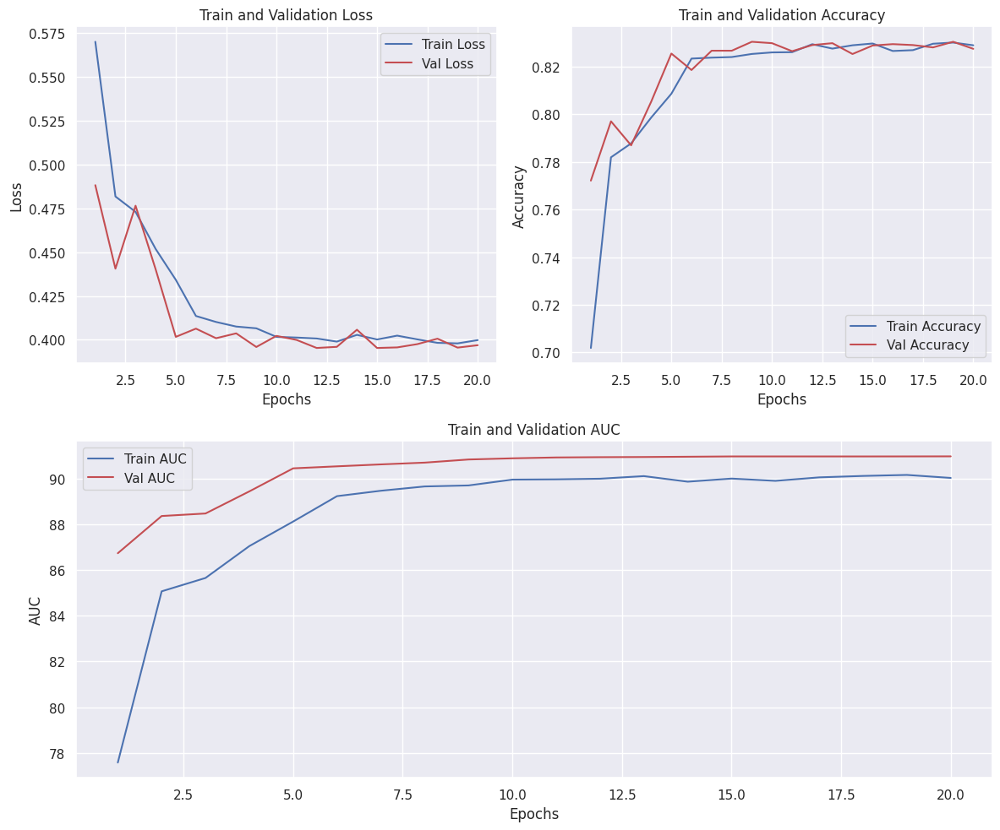

In [23]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)

In [24]:
train_loss, train_acc, val_loss, val_acc, train_auc, val_auc, best_dict = main(
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    test_dataloader=test_dataloader,
    n_epochs=20,
    sample_size=0,
    batch_size=64,
    embed_dim=8,
    num_heads=2,
    num_blocks=2,
    n_qubits_transformer=8,
    n_qubits_ffn=8,
    n_qlayers=3,
    tqdm_disabled=False,
    q_device="default.qubit.torch",
    batch=True,
    circuit_type="pennylane",
    pennylane_args={
        "hadamard": False,
        "encoder": "angle",
        "angle_rot": "Z",
        "entangler": "strong",
        "rot": "Z",
        "imprimitive": "Z",
    },
)

quantum_pl_gpu_metrics_batch = {
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc,
    "train_auc": train_auc,
    "val_auc": val_auc,
    "best_dict": best_dict,
}

/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_torch.py:173: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(
/group/pmc026/nchoong/qt/lib/python3.11/site-packages/pennylane/devices/default_qubit_legacy.py:211: PennyLaneDeprecationWarning: Use of 'default.qubit.torch' is deprecated. Instead, use 'default.qubit', which supports backpropagation. If you experience issues, reach out to the PennyLane team on the discussion forum: https://discuss.pennylane.ai/
  warnings.warn(


++ There will be 2 transformer blocks
++ Transformer will use 8 qubits and 3 q layers
The feed-forward head will use 8 qubits
Using PennyLane quantum device default.qubit.torch
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
weight_shapes = (n_qlayers, n_qubits) = (3, 8)
TextClassifier(
  (squeeze): Linear(in_features=768, out_features=8, bias=True)
  (transformers): ModuleList(
    (0-1): 2 x Encoder(
      (attn): MultiHeadedAttention(
        (k_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (q_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (v_linear): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (combine_heads): QuantumLayer(
          (linear): <Quantum Torch Layer: func=qlayer>
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (norm1): LayerNorm((8,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, i

Epoch   1/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   1/20:   0%|          | 1/313 [00:02<10:29,  2.02s/batch]

Epoch   1/20:   1%|          | 2/313 [00:03<10:05,  1.95s/batch]

Epoch   1/20:   1%|          | 3/313 [00:05<09:56,  1.92s/batch]

Epoch   1/20:   1%|▏         | 4/313 [00:07<09:59,  1.94s/batch]

Epoch   1/20:   2%|▏         | 5/313 [00:09<09:55,  1.93s/batch]

Epoch   1/20:   2%|▏         | 6/313 [00:11<09:51,  1.93s/batch]

Epoch   1/20:   2%|▏         | 7/313 [00:13<09:48,  1.92s/batch]

Epoch   1/20:   3%|▎         | 8/313 [00:15<09:46,  1.92s/batch]

Epoch   1/20:   3%|▎         | 9/313 [00:17<09:44,  1.92s/batch]

Epoch   1/20:   3%|▎         | 10/313 [00:19<09:42,  1.92s/batch]

Epoch   1/20:   4%|▎         | 11/313 [00:21<09:40,  1.92s/batch]

Epoch   1/20:   4%|▍         | 12/313 [00:23<09:38,  1.92s/batch]

Epoch   1/20:   4%|▍         | 13/313 [00:25<09:35,  1.92s/batch]

Epoch   1/20:   4%|▍         | 14/313 [00:26<09:32,  1.91s/batch]

Epoch   1/20:   5%|▍         | 15/313 [00:28<09:30,  1.91s/batch]

Epoch   1/20:   5%|▌         | 16/313 [00:30<09:27,  1.91s/batch]

Epoch   1/20:   5%|▌         | 17/313 [00:33<10:07,  2.05s/batch]

Epoch   1/20:   6%|▌         | 18/313 [00:35<09:52,  2.01s/batch]

Epoch   1/20:   6%|▌         | 19/313 [00:37<09:44,  1.99s/batch]

Epoch   1/20:   6%|▋         | 20/313 [00:38<09:35,  1.96s/batch]

Epoch   1/20:   7%|▋         | 21/313 [00:41<10:01,  2.06s/batch]

Epoch   1/20:   7%|▋         | 22/313 [00:43<09:47,  2.02s/batch]

Epoch   1/20:   7%|▋         | 23/313 [00:45<09:35,  1.99s/batch]

Epoch   1/20:   8%|▊         | 24/313 [00:46<09:27,  1.96s/batch]

Epoch   1/20:   8%|▊         | 25/313 [00:48<09:20,  1.94s/batch]

Epoch   1/20:   8%|▊         | 26/313 [00:50<09:14,  1.93s/batch]

Epoch   1/20:   9%|▊         | 27/313 [00:52<09:11,  1.93s/batch]

Epoch   1/20:   9%|▉         | 28/313 [00:54<09:07,  1.92s/batch]

Epoch   1/20:   9%|▉         | 29/313 [00:56<09:04,  1.92s/batch]

Epoch   1/20:  10%|▉         | 30/313 [00:58<09:02,  1.92s/batch]

Epoch   1/20:  10%|▉         | 31/313 [01:00<08:59,  1.91s/batch]

Epoch   1/20:  10%|█         | 32/313 [01:02<08:57,  1.91s/batch]

Epoch   1/20:  11%|█         | 33/313 [01:04<08:55,  1.91s/batch]

Epoch   1/20:  11%|█         | 34/313 [01:06<08:53,  1.91s/batch]

Epoch   1/20:  11%|█         | 35/313 [01:08<08:58,  1.94s/batch]

Epoch   1/20:  12%|█▏        | 36/313 [01:09<08:53,  1.93s/batch]

Epoch   1/20:  12%|█▏        | 37/313 [01:12<09:17,  2.02s/batch]

Epoch   1/20:  12%|█▏        | 38/313 [01:14<09:06,  1.99s/batch]

Epoch   1/20:  12%|█▏        | 39/313 [01:15<08:58,  1.96s/batch]

Epoch   1/20:  13%|█▎        | 40/313 [01:17<08:52,  1.95s/batch]

Epoch   1/20:  13%|█▎        | 41/313 [01:19<08:48,  1.94s/batch]

Epoch   1/20:  13%|█▎        | 42/313 [01:21<08:45,  1.94s/batch]

Epoch   1/20:  14%|█▎        | 43/313 [01:24<09:18,  2.07s/batch]

Epoch   1/20:  14%|█▍        | 44/313 [01:26<09:41,  2.16s/batch]

Epoch   1/20:  14%|█▍        | 45/313 [01:28<09:48,  2.19s/batch]

Epoch   1/20:  15%|█▍        | 46/313 [01:30<09:23,  2.11s/batch]

Epoch   1/20:  15%|█▌        | 47/313 [01:32<09:05,  2.05s/batch]

Epoch   1/20:  15%|█▌        | 48/313 [01:34<08:52,  2.01s/batch]

Epoch   1/20:  16%|█▌        | 49/313 [01:36<08:42,  1.98s/batch]

Epoch   1/20:  16%|█▌        | 50/313 [01:38<09:13,  2.10s/batch]

Epoch   1/20:  16%|█▋        | 51/313 [01:41<09:32,  2.19s/batch]

Epoch   1/20:  17%|█▋        | 52/313 [01:43<09:19,  2.14s/batch]

Epoch   1/20:  17%|█▋        | 53/313 [01:45<09:00,  2.08s/batch]

Epoch   1/20:  17%|█▋        | 54/313 [01:47<09:03,  2.10s/batch]

Epoch   1/20:  18%|█▊        | 55/313 [01:49<08:47,  2.04s/batch]

Epoch   1/20:  18%|█▊        | 56/313 [01:51<08:35,  2.00s/batch]

Epoch   1/20:  18%|█▊        | 57/313 [01:53<08:26,  1.98s/batch]

Epoch   1/20:  19%|█▊        | 58/313 [01:54<08:18,  1.96s/batch]

Epoch   1/20:  19%|█▉        | 59/313 [01:56<08:13,  1.94s/batch]

Epoch   1/20:  19%|█▉        | 60/313 [01:58<08:08,  1.93s/batch]

Epoch   1/20:  19%|█▉        | 61/313 [02:00<08:05,  1.93s/batch]

Epoch   1/20:  20%|█▉        | 62/313 [02:02<08:01,  1.92s/batch]

Epoch   1/20:  20%|██        | 63/313 [02:04<07:59,  1.92s/batch]

Epoch   1/20:  20%|██        | 64/313 [02:06<07:57,  1.92s/batch]

Epoch   1/20:  21%|██        | 65/313 [02:08<07:55,  1.92s/batch]

Epoch   1/20:  21%|██        | 66/313 [02:10<08:27,  2.06s/batch]

Epoch   1/20:  21%|██▏       | 67/313 [02:12<08:15,  2.02s/batch]

Epoch   1/20:  22%|██▏       | 68/313 [02:14<08:06,  1.98s/batch]

Epoch   1/20:  22%|██▏       | 69/313 [02:16<08:00,  1.97s/batch]

Epoch   1/20:  22%|██▏       | 70/313 [02:18<07:55,  1.96s/batch]

Epoch   1/20:  23%|██▎       | 71/313 [02:20<07:50,  1.95s/batch]

Epoch   1/20:  23%|██▎       | 72/313 [02:22<07:47,  1.94s/batch]

Epoch   1/20:  23%|██▎       | 73/313 [02:24<07:43,  1.93s/batch]

Epoch   1/20:  24%|██▎       | 74/313 [02:26<07:41,  1.93s/batch]

Epoch   1/20:  24%|██▍       | 75/313 [02:28<07:38,  1.93s/batch]

Epoch   1/20:  24%|██▍       | 76/313 [02:29<07:36,  1.93s/batch]

Epoch   1/20:  25%|██▍       | 77/313 [02:31<07:34,  1.93s/batch]

Epoch   1/20:  25%|██▍       | 78/313 [02:33<07:32,  1.93s/batch]

Epoch   1/20:  25%|██▌       | 79/313 [02:35<07:30,  1.92s/batch]

Epoch   1/20:  26%|██▌       | 80/313 [02:37<07:28,  1.92s/batch]

Epoch   1/20:  26%|██▌       | 81/313 [02:39<07:26,  1.92s/batch]

Epoch   1/20:  26%|██▌       | 82/313 [02:41<07:24,  1.92s/batch]

Epoch   1/20:  27%|██▋       | 83/313 [02:43<07:53,  2.06s/batch]

Epoch   1/20:  27%|██▋       | 84/313 [02:46<08:01,  2.10s/batch]

Epoch   1/20:  27%|██▋       | 85/313 [02:48<07:53,  2.08s/batch]

Epoch   1/20:  27%|██▋       | 86/313 [02:50<07:42,  2.04s/batch]

Epoch   1/20:  28%|██▊       | 87/313 [02:51<07:31,  2.00s/batch]

Epoch   1/20:  28%|██▊       | 88/313 [02:54<07:45,  2.07s/batch]

Epoch   1/20:  28%|██▊       | 89/313 [02:56<07:32,  2.02s/batch]

Epoch   1/20:  29%|██▉       | 90/313 [02:57<07:22,  1.99s/batch]

Epoch   1/20:  29%|██▉       | 91/313 [02:59<07:15,  1.96s/batch]

Epoch   1/20:  29%|██▉       | 92/313 [03:01<07:09,  1.94s/batch]

Epoch   1/20:  30%|██▉       | 93/313 [03:03<07:04,  1.93s/batch]

Epoch   1/20:  30%|███       | 94/313 [03:05<07:00,  1.92s/batch]

Epoch   1/20:  30%|███       | 95/313 [03:07<06:57,  1.91s/batch]

Epoch   1/20:  31%|███       | 96/313 [03:09<06:54,  1.91s/batch]

Epoch   1/20:  31%|███       | 97/313 [03:11<06:52,  1.91s/batch]

Epoch   1/20:  31%|███▏      | 98/313 [03:13<06:49,  1.91s/batch]

Epoch   1/20:  32%|███▏      | 99/313 [03:15<06:47,  1.91s/batch]

Epoch   1/20:  32%|███▏      | 100/313 [03:17<07:15,  2.05s/batch]

Epoch   1/20:  32%|███▏      | 101/313 [03:19<07:25,  2.10s/batch]

Epoch   1/20:  33%|███▎      | 102/313 [03:21<07:10,  2.04s/batch]

Epoch   1/20:  33%|███▎      | 103/313 [03:23<07:00,  2.00s/batch]

Epoch   1/20:  33%|███▎      | 104/313 [03:25<06:52,  1.97s/batch]

Epoch   1/20:  34%|███▎      | 105/313 [03:27<06:46,  1.96s/batch]

Epoch   1/20:  34%|███▍      | 106/313 [03:29<06:42,  1.95s/batch]

Epoch   1/20:  34%|███▍      | 107/313 [03:31<06:38,  1.94s/batch]

Epoch   1/20:  35%|███▍      | 108/313 [03:33<06:35,  1.93s/batch]

Epoch   1/20:  35%|███▍      | 109/313 [03:34<06:32,  1.92s/batch]

Epoch   1/20:  35%|███▌      | 110/313 [03:36<06:29,  1.92s/batch]

Epoch   1/20:  35%|███▌      | 111/313 [03:38<06:27,  1.92s/batch]

Epoch   1/20:  36%|███▌      | 112/313 [03:40<06:25,  1.92s/batch]

Epoch   1/20:  36%|███▌      | 113/313 [03:42<06:23,  1.92s/batch]

Epoch   1/20:  36%|███▋      | 114/313 [03:44<06:21,  1.92s/batch]

Epoch   1/20:  37%|███▋      | 115/313 [03:46<06:19,  1.92s/batch]

Epoch   1/20:  37%|███▋      | 116/313 [03:48<06:37,  2.02s/batch]

Epoch   1/20:  37%|███▋      | 117/313 [03:51<06:56,  2.12s/batch]

Epoch   1/20:  38%|███▊      | 118/313 [03:53<06:49,  2.10s/batch]

Epoch   1/20:  38%|███▊      | 119/313 [03:55<06:36,  2.04s/batch]

Epoch   1/20:  38%|███▊      | 120/313 [03:57<06:38,  2.06s/batch]

Epoch   1/20:  39%|███▊      | 121/313 [03:59<06:27,  2.02s/batch]

Epoch   1/20:  39%|███▉      | 122/313 [04:00<06:19,  1.98s/batch]

Epoch   1/20:  39%|███▉      | 123/313 [04:02<06:16,  1.98s/batch]

Epoch   1/20:  40%|███▉      | 124/313 [04:04<06:10,  1.96s/batch]

Epoch   1/20:  40%|███▉      | 125/313 [04:06<06:05,  1.94s/batch]

Epoch   1/20:  40%|████      | 126/313 [04:08<06:01,  1.93s/batch]

Epoch   1/20:  41%|████      | 127/313 [04:10<05:58,  1.93s/batch]

Epoch   1/20:  41%|████      | 128/313 [04:12<05:55,  1.92s/batch]

Epoch   1/20:  41%|████      | 129/313 [04:14<05:53,  1.92s/batch]

Epoch   1/20:  42%|████▏     | 130/313 [04:16<05:51,  1.92s/batch]

Epoch   1/20:  42%|████▏     | 131/313 [04:18<05:48,  1.92s/batch]

Epoch   1/20:  42%|████▏     | 132/313 [04:20<05:46,  1.92s/batch]

Epoch   1/20:  42%|████▏     | 133/313 [04:22<05:44,  1.91s/batch]

Epoch   1/20:  43%|████▎     | 134/313 [04:24<06:07,  2.05s/batch]

Epoch   1/20:  43%|████▎     | 135/313 [04:26<05:57,  2.01s/batch]

Epoch   1/20:  43%|████▎     | 136/313 [04:28<05:49,  1.98s/batch]

Epoch   1/20:  44%|████▍     | 137/313 [04:30<05:44,  1.95s/batch]

Epoch   1/20:  44%|████▍     | 138/313 [04:32<05:39,  1.94s/batch]

Epoch   1/20:  44%|████▍     | 139/313 [04:34<05:43,  1.97s/batch]

Epoch   1/20:  45%|████▍     | 140/313 [04:36<05:45,  2.00s/batch]

Epoch   1/20:  45%|████▌     | 141/313 [04:38<05:38,  1.97s/batch]

Epoch   1/20:  45%|████▌     | 142/313 [04:40<05:37,  1.97s/batch]

Epoch   1/20:  46%|████▌     | 143/313 [04:41<05:32,  1.95s/batch]

Epoch   1/20:  46%|████▌     | 144/313 [04:43<05:27,  1.94s/batch]

Epoch   1/20:  46%|████▋     | 145/313 [04:45<05:24,  1.93s/batch]

Epoch   1/20:  47%|████▋     | 146/313 [04:47<05:21,  1.93s/batch]

Epoch   1/20:  47%|████▋     | 147/313 [04:49<05:19,  1.92s/batch]

Epoch   1/20:  47%|████▋     | 148/313 [04:51<05:17,  1.92s/batch]

Epoch   1/20:  48%|████▊     | 149/313 [04:53<05:14,  1.92s/batch]

Epoch   1/20:  48%|████▊     | 150/313 [04:55<05:12,  1.92s/batch]

Epoch   1/20:  48%|████▊     | 151/313 [04:57<05:33,  2.06s/batch]

Epoch   1/20:  49%|████▊     | 152/313 [04:59<05:24,  2.02s/batch]

Epoch   1/20:  49%|████▉     | 153/313 [05:01<05:16,  1.98s/batch]

Epoch   1/20:  49%|████▉     | 154/313 [05:03<05:11,  1.96s/batch]

Epoch   1/20:  50%|████▉     | 155/313 [05:05<05:06,  1.94s/batch]

Epoch   1/20:  50%|████▉     | 156/313 [05:07<05:24,  2.07s/batch]

Epoch   1/20:  50%|█████     | 157/313 [05:09<05:22,  2.06s/batch]

Epoch   1/20:  50%|█████     | 158/313 [05:11<05:12,  2.02s/batch]

Epoch   1/20:  51%|█████     | 159/313 [05:13<05:05,  1.98s/batch]

Epoch   1/20:  51%|█████     | 160/313 [05:15<05:21,  2.10s/batch]

Epoch   1/20:  51%|█████▏    | 161/313 [05:18<05:31,  2.18s/batch]

Epoch   1/20:  52%|█████▏    | 162/313 [05:20<05:37,  2.24s/batch]

Epoch   1/20:  52%|█████▏    | 163/313 [05:22<05:33,  2.22s/batch]

Epoch   1/20:  52%|█████▏    | 164/313 [05:24<05:17,  2.13s/batch]

Epoch   1/20:  53%|█████▎    | 165/313 [05:26<05:04,  2.06s/batch]

Epoch   1/20:  53%|█████▎    | 166/313 [05:28<04:55,  2.01s/batch]

Epoch   1/20:  53%|█████▎    | 167/313 [05:30<05:09,  2.12s/batch]

Epoch   1/20:  54%|█████▎    | 168/313 [05:32<05:02,  2.09s/batch]

Epoch   1/20:  54%|█████▍    | 169/313 [05:34<04:52,  2.03s/batch]

Epoch   1/20:  54%|█████▍    | 170/313 [05:36<04:44,  1.99s/batch]

Epoch   1/20:  55%|█████▍    | 171/313 [05:38<04:43,  2.00s/batch]

Epoch   1/20:  55%|█████▍    | 172/313 [05:41<04:52,  2.07s/batch]

Epoch   1/20:  55%|█████▌    | 173/313 [05:42<04:43,  2.02s/batch]

Epoch   1/20:  56%|█████▌    | 174/313 [05:45<04:52,  2.10s/batch]

Epoch   1/20:  56%|█████▌    | 175/313 [05:47<04:44,  2.06s/batch]

Epoch   1/20:  56%|█████▌    | 176/313 [05:49<04:35,  2.01s/batch]

Epoch   1/20:  57%|█████▋    | 177/313 [05:50<04:29,  1.98s/batch]

Epoch   1/20:  57%|█████▋    | 178/313 [05:53<04:43,  2.10s/batch]

Epoch   1/20:  57%|█████▋    | 179/313 [05:55<04:52,  2.19s/batch]

Epoch   1/20:  58%|█████▊    | 180/313 [05:57<04:43,  2.13s/batch]

Epoch   1/20:  58%|█████▊    | 181/313 [05:59<04:32,  2.06s/batch]

Epoch   1/20:  58%|█████▊    | 182/313 [06:01<04:23,  2.01s/batch]

Epoch   1/20:  58%|█████▊    | 183/313 [06:03<04:35,  2.12s/batch]

Epoch   1/20:  59%|█████▉    | 184/313 [06:05<04:25,  2.06s/batch]

Epoch   1/20:  59%|█████▉    | 185/313 [06:07<04:17,  2.01s/batch]

Epoch   1/20:  59%|█████▉    | 186/313 [06:09<04:11,  1.98s/batch]

Epoch   1/20:  60%|█████▉    | 187/313 [06:11<04:07,  1.96s/batch]

Epoch   1/20:  60%|██████    | 188/313 [06:13<04:03,  1.95s/batch]

Epoch   1/20:  60%|██████    | 189/313 [06:15<04:00,  1.94s/batch]

Epoch   1/20:  61%|██████    | 190/313 [06:17<03:57,  1.93s/batch]

Epoch   1/20:  61%|██████    | 191/313 [06:19<03:54,  1.92s/batch]

Epoch   1/20:  61%|██████▏   | 192/313 [06:21<03:52,  1.92s/batch]

Epoch   1/20:  62%|██████▏   | 193/313 [06:23<03:50,  1.92s/batch]

Epoch   1/20:  62%|██████▏   | 194/313 [06:24<03:47,  1.92s/batch]

Epoch   1/20:  62%|██████▏   | 195/313 [06:26<03:45,  1.91s/batch]

Epoch   1/20:  63%|██████▎   | 196/313 [06:29<03:59,  2.05s/batch]

Epoch   1/20:  63%|██████▎   | 197/313 [06:31<04:08,  2.15s/batch]

Epoch   1/20:  63%|██████▎   | 198/313 [06:33<04:14,  2.21s/batch]

Epoch   1/20:  64%|██████▎   | 199/313 [06:36<04:17,  2.26s/batch]

Epoch   1/20:  64%|██████▍   | 200/313 [06:38<04:07,  2.19s/batch]

Epoch   1/20:  64%|██████▍   | 201/313 [06:40<03:55,  2.10s/batch]

Epoch   1/20:  65%|██████▍   | 202/313 [06:42<03:46,  2.04s/batch]

Epoch   1/20:  65%|██████▍   | 203/313 [06:44<03:39,  2.00s/batch]

Epoch   1/20:  65%|██████▌   | 204/313 [06:45<03:34,  1.97s/batch]

Epoch   1/20:  65%|██████▌   | 205/313 [06:47<03:30,  1.95s/batch]

Epoch   1/20:  66%|██████▌   | 206/313 [06:49<03:27,  1.94s/batch]

Epoch   1/20:  66%|██████▌   | 207/313 [06:51<03:24,  1.93s/batch]

Epoch   1/20:  66%|██████▋   | 208/313 [06:53<03:21,  1.92s/batch]

Epoch   1/20:  67%|██████▋   | 209/313 [06:55<03:19,  1.92s/batch]

Epoch   1/20:  67%|██████▋   | 210/313 [06:57<03:17,  1.91s/batch]

Epoch   1/20:  67%|██████▋   | 211/313 [06:59<03:14,  1.91s/batch]

Epoch   1/20:  68%|██████▊   | 212/313 [07:01<03:12,  1.91s/batch]

Epoch   1/20:  68%|██████▊   | 213/313 [07:03<03:10,  1.91s/batch]

Epoch   1/20:  68%|██████▊   | 214/313 [07:05<03:12,  1.94s/batch]

Epoch   1/20:  69%|██████▊   | 215/313 [07:07<03:09,  1.93s/batch]

Epoch   1/20:  69%|██████▉   | 216/313 [07:09<03:20,  2.06s/batch]

Epoch   1/20:  69%|██████▉   | 217/313 [07:11<03:25,  2.14s/batch]

Epoch   1/20:  70%|██████▉   | 218/313 [07:13<03:16,  2.07s/batch]

Epoch   1/20:  70%|██████▉   | 219/313 [07:15<03:10,  2.02s/batch]

Epoch   1/20:  70%|███████   | 220/313 [07:17<03:04,  1.99s/batch]

Epoch   1/20:  71%|███████   | 221/313 [07:19<03:08,  2.05s/batch]

Epoch   1/20:  71%|███████   | 222/313 [07:21<03:04,  2.02s/batch]

Epoch   1/20:  71%|███████   | 223/313 [07:23<02:58,  1.99s/batch]

Epoch   1/20:  72%|███████▏  | 224/313 [07:25<02:54,  1.96s/batch]

Epoch   1/20:  72%|███████▏  | 225/313 [07:27<02:51,  1.94s/batch]

Epoch   1/20:  72%|███████▏  | 226/313 [07:29<02:47,  1.93s/batch]

Epoch   1/20:  73%|███████▎  | 227/313 [07:31<02:45,  1.92s/batch]

Epoch   1/20:  73%|███████▎  | 228/313 [07:33<02:43,  1.92s/batch]

Epoch   1/20:  73%|███████▎  | 229/313 [07:34<02:40,  1.91s/batch]

Epoch   1/20:  73%|███████▎  | 230/313 [07:36<02:38,  1.91s/batch]

Epoch   1/20:  74%|███████▍  | 231/313 [07:38<02:42,  1.98s/batch]

Epoch   1/20:  74%|███████▍  | 232/313 [07:41<02:50,  2.10s/batch]

Epoch   1/20:  74%|███████▍  | 233/313 [07:43<02:43,  2.05s/batch]

Epoch   1/20:  75%|███████▍  | 234/313 [07:45<02:38,  2.01s/batch]

Epoch   1/20:  75%|███████▌  | 235/313 [07:47<02:33,  1.97s/batch]

Epoch   1/20:  75%|███████▌  | 236/313 [07:48<02:30,  1.95s/batch]

Epoch   1/20:  76%|███████▌  | 237/313 [07:50<02:27,  1.94s/batch]

Epoch   1/20:  76%|███████▌  | 238/313 [07:52<02:24,  1.93s/batch]

Epoch   1/20:  76%|███████▋  | 239/313 [07:54<02:22,  1.92s/batch]

Epoch   1/20:  77%|███████▋  | 240/313 [07:56<02:19,  1.91s/batch]

Epoch   1/20:  77%|███████▋  | 241/313 [07:58<02:17,  1.91s/batch]

Epoch   1/20:  77%|███████▋  | 242/313 [08:00<02:15,  1.91s/batch]

Epoch   1/20:  78%|███████▊  | 243/313 [08:02<02:13,  1.91s/batch]

Epoch   1/20:  78%|███████▊  | 244/313 [08:04<02:11,  1.91s/batch]

Epoch   1/20:  78%|███████▊  | 245/313 [08:06<02:09,  1.91s/batch]

Epoch   1/20:  79%|███████▊  | 246/313 [08:08<02:07,  1.91s/batch]

Epoch   1/20:  79%|███████▉  | 247/313 [08:09<02:05,  1.90s/batch]

Epoch   1/20:  79%|███████▉  | 248/313 [08:12<02:12,  2.05s/batch]

Epoch   1/20:  80%|███████▉  | 249/313 [08:14<02:17,  2.15s/batch]

Epoch   1/20:  80%|███████▉  | 250/313 [08:16<02:11,  2.09s/batch]

Epoch   1/20:  80%|████████  | 251/313 [08:18<02:06,  2.04s/batch]

Epoch   1/20:  81%|████████  | 252/313 [08:20<02:01,  2.00s/batch]

Epoch   1/20:  81%|████████  | 253/313 [08:22<01:58,  1.97s/batch]

Epoch   1/20:  81%|████████  | 254/313 [08:24<01:55,  1.95s/batch]

Epoch   1/20:  81%|████████▏ | 255/313 [08:26<01:52,  1.94s/batch]

Epoch   1/20:  82%|████████▏ | 256/313 [08:28<01:49,  1.93s/batch]

Epoch   1/20:  82%|████████▏ | 257/313 [08:30<01:47,  1.92s/batch]

Epoch   1/20:  82%|████████▏ | 258/313 [08:31<01:45,  1.92s/batch]

Epoch   1/20:  83%|████████▎ | 259/313 [08:33<01:43,  1.92s/batch]

Epoch   1/20:  83%|████████▎ | 260/313 [08:35<01:41,  1.92s/batch]

Epoch   1/20:  83%|████████▎ | 261/313 [08:37<01:39,  1.92s/batch]

Epoch   1/20:  84%|████████▎ | 262/313 [08:39<01:37,  1.91s/batch]

Epoch   1/20:  84%|████████▍ | 263/313 [08:41<01:35,  1.91s/batch]

Epoch   1/20:  84%|████████▍ | 264/313 [08:43<01:33,  1.91s/batch]

Epoch   1/20:  85%|████████▍ | 265/313 [08:45<01:31,  1.91s/batch]

Epoch   1/20:  85%|████████▍ | 266/313 [08:47<01:34,  2.01s/batch]

Epoch   1/20:  85%|████████▌ | 267/313 [08:49<01:31,  1.98s/batch]

Epoch   1/20:  86%|████████▌ | 268/313 [08:51<01:28,  1.96s/batch]

Epoch   1/20:  86%|████████▌ | 269/313 [08:53<01:25,  1.94s/batch]

Epoch   1/20:  86%|████████▋ | 270/313 [08:55<01:23,  1.93s/batch]

Epoch   1/20:  87%|████████▋ | 271/313 [08:57<01:20,  1.92s/batch]

Epoch   1/20:  87%|████████▋ | 272/313 [08:58<01:18,  1.92s/batch]

Epoch   1/20:  87%|████████▋ | 273/313 [09:00<01:16,  1.92s/batch]

Epoch   1/20:  88%|████████▊ | 274/313 [09:02<01:14,  1.91s/batch]

Epoch   1/20:  88%|████████▊ | 275/313 [09:04<01:12,  1.91s/batch]

Epoch   1/20:  88%|████████▊ | 276/313 [09:06<01:10,  1.91s/batch]

Epoch   1/20:  88%|████████▊ | 277/313 [09:08<01:08,  1.91s/batch]

Epoch   1/20:  89%|████████▉ | 278/313 [09:10<01:06,  1.91s/batch]

Epoch   1/20:  89%|████████▉ | 279/313 [09:12<01:04,  1.91s/batch]

Epoch   1/20:  89%|████████▉ | 280/313 [09:14<01:03,  1.91s/batch]

Epoch   1/20:  90%|████████▉ | 281/313 [09:16<01:01,  1.91s/batch]

Epoch   1/20:  90%|█████████ | 282/313 [09:18<00:59,  1.91s/batch]

Epoch   1/20:  90%|█████████ | 283/313 [09:20<01:00,  2.03s/batch]

Epoch   1/20:  91%|█████████ | 284/313 [09:22<00:57,  2.00s/batch]

Epoch   1/20:  91%|█████████ | 285/313 [09:24<00:55,  1.97s/batch]

Epoch   1/20:  91%|█████████▏| 286/313 [09:26<00:52,  1.95s/batch]

Epoch   1/20:  92%|█████████▏| 287/313 [09:28<00:50,  1.94s/batch]

Epoch   1/20:  92%|█████████▏| 288/313 [09:29<00:48,  1.93s/batch]

Epoch   1/20:  92%|█████████▏| 289/313 [09:31<00:46,  1.92s/batch]

Epoch   1/20:  93%|█████████▎| 290/313 [09:33<00:44,  1.92s/batch]

Epoch   1/20:  93%|█████████▎| 291/313 [09:35<00:43,  1.96s/batch]

Epoch   1/20:  93%|█████████▎| 292/313 [09:37<00:40,  1.94s/batch]

Epoch   1/20:  94%|█████████▎| 293/313 [09:39<00:38,  1.93s/batch]

Epoch   1/20:  94%|█████████▍| 294/313 [09:41<00:36,  1.92s/batch]

Epoch   1/20:  94%|█████████▍| 295/313 [09:43<00:34,  1.92s/batch]

Epoch   1/20:  95%|█████████▍| 296/313 [09:45<00:32,  1.91s/batch]

Epoch   1/20:  95%|█████████▍| 297/313 [09:47<00:30,  1.91s/batch]

Epoch   1/20:  95%|█████████▌| 298/313 [09:49<00:28,  1.90s/batch]

Epoch   1/20:  96%|█████████▌| 299/313 [09:50<00:26,  1.90s/batch]

Epoch   1/20:  96%|█████████▌| 300/313 [09:53<00:26,  2.05s/batch]

Epoch   1/20:  96%|█████████▌| 301/313 [09:55<00:24,  2.03s/batch]

Epoch   1/20:  96%|█████████▋| 302/313 [09:57<00:21,  2.00s/batch]

Epoch   1/20:  97%|█████████▋| 303/313 [09:59<00:19,  1.97s/batch]

Epoch   1/20:  97%|█████████▋| 304/313 [10:01<00:17,  1.95s/batch]

Epoch   1/20:  97%|█████████▋| 305/313 [10:02<00:15,  1.94s/batch]

Epoch   1/20:  98%|█████████▊| 306/313 [10:05<00:14,  2.00s/batch]

Epoch   1/20:  98%|█████████▊| 307/313 [10:07<00:11,  1.97s/batch]

Epoch   1/20:  98%|█████████▊| 308/313 [10:08<00:09,  1.95s/batch]

Epoch   1/20:  99%|█████████▊| 309/313 [10:10<00:07,  1.94s/batch]

Epoch   1/20:  99%|█████████▉| 310/313 [10:12<00:05,  1.93s/batch]

Epoch   1/20:  99%|█████████▉| 311/313 [10:14<00:03,  1.92s/batch]

Epoch   1/20: 100%|█████████▉| 312/313 [10:16<00:01,  1.92s/batch]

Epoch   1/20: 100%|██████████| 313/313 [10:17<00:00,  1.65s/batch]

Epoch   1/20: 100%|██████████| 313/313 [10:17<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch   1/20: 100%|██████████| 313/313 [10:42<00:00,  1.65s/batch, Epoch = 10m 42s, Loss = 0.5775|0.5049, Acc = 0.703|0.765, AUC = 77.232|85.359]

Epoch   1/20: 100%|██████████| 313/313 [10:42<00:00,  2.05s/batch, Epoch = 10m 42s, Loss = 0.5775|0.5049, Acc = 0.703|0.765, AUC = 77.232|85.359]

Epoch   2/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   2/20:   0%|          | 1/313 [00:02<12:14,  2.35s/batch]

Epoch   2/20:   1%|          | 2/313 [00:04<10:52,  2.10s/batch]

Epoch   2/20:   1%|          | 3/313 [00:06<10:21,  2.00s/batch]

Epoch   2/20:   1%|▏         | 4/313 [00:08<10:07,  1.96s/batch]

Epoch   2/20:   2%|▏         | 5/313 [00:09<09:57,  1.94s/batch]

Epoch   2/20:   2%|▏         | 6/313 [00:11<09:51,  1.93s/batch]

Epoch   2/20:   2%|▏         | 7/313 [00:13<09:46,  1.92s/batch]

Epoch   2/20:   3%|▎         | 8/313 [00:15<09:43,  1.91s/batch]

Epoch   2/20:   3%|▎         | 9/313 [00:17<09:40,  1.91s/batch]

Epoch   2/20:   3%|▎         | 10/313 [00:19<09:37,  1.91s/batch]

Epoch   2/20:   4%|▎         | 11/313 [00:21<09:35,  1.91s/batch]

Epoch   2/20:   4%|▍         | 12/313 [00:23<09:33,  1.91s/batch]

Epoch   2/20:   4%|▍         | 13/313 [00:25<09:31,  1.90s/batch]

Epoch   2/20:   4%|▍         | 14/313 [00:27<09:29,  1.91s/batch]

Epoch   2/20:   5%|▍         | 15/313 [00:28<09:28,  1.91s/batch]

Epoch   2/20:   5%|▌         | 16/313 [00:30<09:25,  1.90s/batch]

Epoch   2/20:   5%|▌         | 17/313 [00:32<09:23,  1.90s/batch]

Epoch   2/20:   6%|▌         | 18/313 [00:35<10:03,  2.05s/batch]

Epoch   2/20:   6%|▌         | 19/313 [00:37<09:49,  2.00s/batch]

Epoch   2/20:   6%|▋         | 20/313 [00:38<09:38,  1.97s/batch]

Epoch   2/20:   7%|▋         | 21/313 [00:40<09:29,  1.95s/batch]

Epoch   2/20:   7%|▋         | 22/313 [00:42<09:24,  1.94s/batch]

Epoch   2/20:   7%|▋         | 23/313 [00:44<09:19,  1.93s/batch]

Epoch   2/20:   8%|▊         | 24/313 [00:46<09:15,  1.92s/batch]

Epoch   2/20:   8%|▊         | 25/313 [00:48<09:29,  1.98s/batch]

Epoch   2/20:   8%|▊         | 26/313 [00:50<09:21,  1.96s/batch]

Epoch   2/20:   9%|▊         | 27/313 [00:52<09:15,  1.94s/batch]

Epoch   2/20:   9%|▉         | 28/313 [00:54<09:09,  1.93s/batch]

Epoch   2/20:   9%|▉         | 29/313 [00:56<09:05,  1.92s/batch]

Epoch   2/20:  10%|▉         | 30/313 [00:58<09:02,  1.92s/batch]

Epoch   2/20:  10%|▉         | 31/313 [01:00<09:00,  1.92s/batch]

Epoch   2/20:  10%|█         | 32/313 [01:02<08:57,  1.91s/batch]

Epoch   2/20:  11%|█         | 33/313 [01:03<08:54,  1.91s/batch]

Epoch   2/20:  11%|█         | 34/313 [01:05<08:52,  1.91s/batch]

Epoch   2/20:  11%|█         | 35/313 [01:08<09:31,  2.06s/batch]

Epoch   2/20:  12%|█▏        | 36/313 [01:10<09:23,  2.03s/batch]

Epoch   2/20:  12%|█▏        | 37/313 [01:12<09:21,  2.03s/batch]

Epoch   2/20:  12%|█▏        | 38/313 [01:14<09:08,  1.99s/batch]

Epoch   2/20:  12%|█▏        | 39/313 [01:16<08:58,  1.97s/batch]

Epoch   2/20:  13%|█▎        | 40/313 [01:17<08:51,  1.95s/batch]

Epoch   2/20:  13%|█▎        | 41/313 [01:19<08:45,  1.93s/batch]

Epoch   2/20:  13%|█▎        | 42/313 [01:21<08:40,  1.92s/batch]

Epoch   2/20:  14%|█▎        | 43/313 [01:23<08:36,  1.91s/batch]

Epoch   2/20:  14%|█▍        | 44/313 [01:25<08:33,  1.91s/batch]

Epoch   2/20:  14%|█▍        | 45/313 [01:27<08:40,  1.94s/batch]

Epoch   2/20:  15%|█▍        | 46/313 [01:29<08:35,  1.93s/batch]

Epoch   2/20:  15%|█▌        | 47/313 [01:31<08:30,  1.92s/batch]

Epoch   2/20:  15%|█▌        | 48/313 [01:33<08:26,  1.91s/batch]

Epoch   2/20:  16%|█▌        | 49/313 [01:35<08:23,  1.91s/batch]

Epoch   2/20:  16%|█▌        | 50/313 [01:37<08:21,  1.91s/batch]

Epoch   2/20:  16%|█▋        | 51/313 [01:38<08:19,  1.91s/batch]

Epoch   2/20:  17%|█▋        | 52/313 [01:41<08:54,  2.05s/batch]

Epoch   2/20:  17%|█▋        | 53/313 [01:43<08:41,  2.00s/batch]

Epoch   2/20:  17%|█▋        | 54/313 [01:45<08:30,  1.97s/batch]

Epoch   2/20:  18%|█▊        | 55/313 [01:47<08:23,  1.95s/batch]

Epoch   2/20:  18%|█▊        | 56/313 [01:48<08:17,  1.94s/batch]

Epoch   2/20:  18%|█▊        | 57/313 [01:50<08:12,  1.92s/batch]

Epoch   2/20:  19%|█▊        | 58/313 [01:52<08:08,  1.92s/batch]

Epoch   2/20:  19%|█▉        | 59/313 [01:54<08:05,  1.91s/batch]

Epoch   2/20:  19%|█▉        | 60/313 [01:56<08:03,  1.91s/batch]

Epoch   2/20:  19%|█▉        | 61/313 [01:58<08:00,  1.91s/batch]

Epoch   2/20:  20%|█▉        | 62/313 [02:00<07:58,  1.91s/batch]

Epoch   2/20:  20%|██        | 63/313 [02:02<07:56,  1.91s/batch]

Epoch   2/20:  20%|██        | 64/313 [02:04<07:54,  1.91s/batch]

Epoch   2/20:  21%|██        | 65/313 [02:06<07:52,  1.90s/batch]

Epoch   2/20:  21%|██        | 66/313 [02:08<08:16,  2.01s/batch]

Epoch   2/20:  21%|██▏       | 67/313 [02:10<08:07,  1.98s/batch]

Epoch   2/20:  22%|██▏       | 68/313 [02:12<07:59,  1.96s/batch]

Epoch   2/20:  22%|██▏       | 69/313 [02:14<08:28,  2.08s/batch]

Epoch   2/20:  22%|██▏       | 70/313 [02:16<08:40,  2.14s/batch]

Epoch   2/20:  23%|██▎       | 71/313 [02:18<08:21,  2.07s/batch]

Epoch   2/20:  23%|██▎       | 72/313 [02:20<08:06,  2.02s/batch]

Epoch   2/20:  23%|██▎       | 73/313 [02:22<07:56,  1.99s/batch]

Epoch   2/20:  24%|██▎       | 74/313 [02:24<07:49,  1.96s/batch]

Epoch   2/20:  24%|██▍       | 75/313 [02:26<07:43,  1.95s/batch]

Epoch   2/20:  24%|██▍       | 76/313 [02:28<07:38,  1.93s/batch]

Epoch   2/20:  25%|██▍       | 77/313 [02:30<07:34,  1.92s/batch]

Epoch   2/20:  25%|██▍       | 78/313 [02:32<07:30,  1.92s/batch]

Epoch   2/20:  25%|██▌       | 79/313 [02:33<07:27,  1.91s/batch]

Epoch   2/20:  26%|██▌       | 80/313 [02:35<07:25,  1.91s/batch]

Epoch   2/20:  26%|██▌       | 81/313 [02:37<07:23,  1.91s/batch]

Epoch   2/20:  26%|██▌       | 82/313 [02:39<07:20,  1.91s/batch]

Epoch   2/20:  27%|██▋       | 83/313 [02:41<07:18,  1.91s/batch]

Epoch   2/20:  27%|██▋       | 84/313 [02:43<07:17,  1.91s/batch]

Epoch   2/20:  27%|██▋       | 85/313 [02:45<07:18,  1.92s/batch]

Epoch   2/20:  27%|██▋       | 86/313 [02:47<07:39,  2.02s/batch]

Epoch   2/20:  28%|██▊       | 87/313 [02:49<07:29,  1.99s/batch]

Epoch   2/20:  28%|██▊       | 88/313 [02:51<07:21,  1.96s/batch]

Epoch   2/20:  28%|██▊       | 89/313 [02:53<07:15,  1.95s/batch]

Epoch   2/20:  29%|██▉       | 90/313 [02:55<07:10,  1.93s/batch]

Epoch   2/20:  29%|██▉       | 91/313 [02:57<07:06,  1.92s/batch]

Epoch   2/20:  29%|██▉       | 92/313 [02:59<07:03,  1.92s/batch]

Epoch   2/20:  30%|██▉       | 93/313 [03:01<07:00,  1.91s/batch]

Epoch   2/20:  30%|███       | 94/313 [03:02<06:57,  1.91s/batch]

Epoch   2/20:  30%|███       | 95/313 [03:04<06:55,  1.90s/batch]

Epoch   2/20:  31%|███       | 96/313 [03:06<06:53,  1.90s/batch]

Epoch   2/20:  31%|███       | 97/313 [03:08<06:51,  1.91s/batch]

Epoch   2/20:  31%|███▏      | 98/313 [03:10<06:49,  1.90s/batch]

Epoch   2/20:  32%|███▏      | 99/313 [03:12<06:47,  1.90s/batch]

Epoch   2/20:  32%|███▏      | 100/313 [03:14<06:45,  1.90s/batch]

Epoch   2/20:  32%|███▏      | 101/313 [03:16<06:43,  1.90s/batch]

Epoch   2/20:  33%|███▎      | 102/313 [03:18<06:41,  1.90s/batch]

Epoch   2/20:  33%|███▎      | 103/313 [03:20<07:09,  2.04s/batch]

Epoch   2/20:  33%|███▎      | 104/313 [03:22<07:08,  2.05s/batch]

Epoch   2/20:  34%|███▎      | 105/313 [03:24<06:56,  2.00s/batch]

Epoch   2/20:  34%|███▍      | 106/313 [03:26<06:48,  1.97s/batch]

Epoch   2/20:  34%|███▍      | 107/313 [03:28<06:42,  1.95s/batch]

Epoch   2/20:  35%|███▍      | 108/313 [03:30<06:37,  1.94s/batch]

Epoch   2/20:  35%|███▍      | 109/313 [03:32<06:32,  1.93s/batch]

Epoch   2/20:  35%|███▌      | 110/313 [03:33<06:29,  1.92s/batch]

Epoch   2/20:  35%|███▌      | 111/313 [03:35<06:26,  1.91s/batch]

Epoch   2/20:  36%|███▌      | 112/313 [03:37<06:24,  1.91s/batch]

Epoch   2/20:  36%|███▌      | 113/313 [03:39<06:22,  1.91s/batch]

Epoch   2/20:  36%|███▋      | 114/313 [03:42<06:48,  2.05s/batch]

Epoch   2/20:  37%|███▋      | 115/313 [03:44<06:42,  2.03s/batch]

Epoch   2/20:  37%|███▋      | 116/313 [03:45<06:32,  1.99s/batch]

Epoch   2/20:  37%|███▋      | 117/313 [03:47<06:25,  1.97s/batch]

Epoch   2/20:  38%|███▊      | 118/313 [03:49<06:19,  1.95s/batch]

Epoch   2/20:  38%|███▊      | 119/313 [03:51<06:15,  1.94s/batch]

Epoch   2/20:  38%|███▊      | 120/313 [03:54<06:40,  2.07s/batch]

Epoch   2/20:  39%|███▊      | 121/313 [03:56<06:28,  2.02s/batch]

Epoch   2/20:  39%|███▉      | 122/313 [03:57<06:19,  1.99s/batch]

Epoch   2/20:  39%|███▉      | 123/313 [03:59<06:13,  1.96s/batch]

Epoch   2/20:  40%|███▉      | 124/313 [04:01<06:07,  1.95s/batch]

Epoch   2/20:  40%|███▉      | 125/313 [04:03<06:03,  1.93s/batch]

Epoch   2/20:  40%|████      | 126/313 [04:05<05:59,  1.93s/batch]

Epoch   2/20:  41%|████      | 127/313 [04:07<05:57,  1.92s/batch]

Epoch   2/20:  41%|████      | 128/313 [04:09<06:02,  1.96s/batch]

Epoch   2/20:  41%|████      | 129/313 [04:11<05:57,  1.94s/batch]

Epoch   2/20:  42%|████▏     | 130/313 [04:13<05:52,  1.93s/batch]

Epoch   2/20:  42%|████▏     | 131/313 [04:15<05:49,  1.92s/batch]

Epoch   2/20:  42%|████▏     | 132/313 [04:17<05:46,  1.91s/batch]

Epoch   2/20:  42%|████▏     | 133/313 [04:18<05:43,  1.91s/batch]

Epoch   2/20:  43%|████▎     | 134/313 [04:20<05:41,  1.91s/batch]

Epoch   2/20:  43%|████▎     | 135/313 [04:23<05:57,  2.01s/batch]

Epoch   2/20:  43%|████▎     | 136/313 [04:25<05:49,  1.98s/batch]

Epoch   2/20:  44%|████▍     | 137/313 [04:27<06:07,  2.09s/batch]

Epoch   2/20:  44%|████▍     | 138/313 [04:29<05:57,  2.04s/batch]

Epoch   2/20:  44%|████▍     | 139/313 [04:31<05:47,  2.00s/batch]

Epoch   2/20:  45%|████▍     | 140/313 [04:33<05:40,  1.97s/batch]

Epoch   2/20:  45%|████▌     | 141/313 [04:35<05:50,  2.04s/batch]

Epoch   2/20:  45%|████▌     | 142/313 [04:37<05:41,  2.00s/batch]

Epoch   2/20:  46%|████▌     | 143/313 [04:39<05:34,  1.97s/batch]

Epoch   2/20:  46%|████▌     | 144/313 [04:41<05:29,  1.95s/batch]

Epoch   2/20:  46%|████▋     | 145/313 [04:42<05:24,  1.93s/batch]

Epoch   2/20:  47%|████▋     | 146/313 [04:44<05:20,  1.92s/batch]

Epoch   2/20:  47%|████▋     | 147/313 [04:46<05:18,  1.92s/batch]

Epoch   2/20:  47%|████▋     | 148/313 [04:48<05:15,  1.91s/batch]

Epoch   2/20:  48%|████▊     | 149/313 [04:50<05:12,  1.91s/batch]

Epoch   2/20:  48%|████▊     | 150/313 [04:52<05:10,  1.90s/batch]

Epoch   2/20:  48%|████▊     | 151/313 [04:54<05:08,  1.90s/batch]

Epoch   2/20:  49%|████▊     | 152/313 [04:56<05:06,  1.90s/batch]

Epoch   2/20:  49%|████▉     | 153/313 [04:58<05:04,  1.90s/batch]

Epoch   2/20:  49%|████▉     | 154/313 [05:00<05:24,  2.04s/batch]

Epoch   2/20:  50%|████▉     | 155/313 [05:02<05:15,  2.00s/batch]

Epoch   2/20:  50%|████▉     | 156/313 [05:04<05:20,  2.04s/batch]

Epoch   2/20:  50%|█████     | 157/313 [05:06<05:11,  2.00s/batch]

Epoch   2/20:  50%|█████     | 158/313 [05:08<05:05,  1.97s/batch]

Epoch   2/20:  51%|█████     | 159/313 [05:10<05:00,  1.95s/batch]

Epoch   2/20:  51%|█████     | 160/313 [05:12<04:55,  1.93s/batch]

Epoch   2/20:  51%|█████▏    | 161/313 [05:14<04:52,  1.93s/batch]

Epoch   2/20:  52%|█████▏    | 162/313 [05:15<04:49,  1.92s/batch]

Epoch   2/20:  52%|█████▏    | 163/313 [05:17<04:47,  1.92s/batch]

Epoch   2/20:  52%|█████▏    | 164/313 [05:19<04:45,  1.91s/batch]

Epoch   2/20:  53%|█████▎    | 165/313 [05:21<04:42,  1.91s/batch]

Epoch   2/20:  53%|█████▎    | 166/313 [05:23<04:40,  1.91s/batch]

Epoch   2/20:  53%|█████▎    | 167/313 [05:25<04:38,  1.91s/batch]

Epoch   2/20:  54%|█████▎    | 168/313 [05:27<04:36,  1.91s/batch]

Epoch   2/20:  54%|█████▍    | 169/313 [05:29<04:34,  1.91s/batch]

Epoch   2/20:  54%|█████▍    | 170/313 [05:31<04:32,  1.91s/batch]

Epoch   2/20:  55%|█████▍    | 171/313 [05:33<04:50,  2.05s/batch]

Epoch   2/20:  55%|█████▍    | 172/313 [05:35<04:42,  2.00s/batch]

Epoch   2/20:  55%|█████▌    | 173/313 [05:37<04:36,  1.97s/batch]

Epoch   2/20:  56%|█████▌    | 174/313 [05:39<04:31,  1.95s/batch]

Epoch   2/20:  56%|█████▌    | 175/313 [05:41<04:27,  1.94s/batch]

Epoch   2/20:  56%|█████▌    | 176/313 [05:43<04:24,  1.93s/batch]

Epoch   2/20:  57%|█████▋    | 177/313 [05:44<04:21,  1.92s/batch]

Epoch   2/20:  57%|█████▋    | 178/313 [05:46<04:18,  1.92s/batch]

Epoch   2/20:  57%|█████▋    | 179/313 [05:48<04:16,  1.92s/batch]

Epoch   2/20:  58%|█████▊    | 180/313 [05:50<04:14,  1.91s/batch]

Epoch   2/20:  58%|█████▊    | 181/313 [05:52<04:11,  1.91s/batch]

Epoch   2/20:  58%|█████▊    | 182/313 [05:54<04:09,  1.91s/batch]

Epoch   2/20:  58%|█████▊    | 183/313 [05:56<04:07,  1.91s/batch]

Epoch   2/20:  59%|█████▉    | 184/313 [05:58<04:05,  1.91s/batch]

Epoch   2/20:  59%|█████▉    | 185/313 [06:00<04:04,  1.91s/batch]

Epoch   2/20:  59%|█████▉    | 186/313 [06:02<04:02,  1.91s/batch]

Epoch   2/20:  60%|█████▉    | 187/313 [06:04<04:00,  1.91s/batch]

Epoch   2/20:  60%|██████    | 188/313 [06:06<04:15,  2.04s/batch]

Epoch   2/20:  60%|██████    | 189/313 [06:08<04:25,  2.14s/batch]

Epoch   2/20:  61%|██████    | 190/313 [06:10<04:22,  2.13s/batch]

Epoch   2/20:  61%|██████    | 191/313 [06:12<04:19,  2.13s/batch]

Epoch   2/20:  61%|██████▏   | 192/313 [06:14<04:09,  2.06s/batch]

Epoch   2/20:  62%|██████▏   | 193/313 [06:16<04:01,  2.01s/batch]

Epoch   2/20:  62%|██████▏   | 194/313 [06:18<03:56,  1.99s/batch]

Epoch   2/20:  62%|██████▏   | 195/313 [06:20<03:58,  2.02s/batch]

Epoch   2/20:  63%|██████▎   | 196/313 [06:22<03:52,  1.98s/batch]

Epoch   2/20:  63%|██████▎   | 197/313 [06:24<03:47,  1.96s/batch]

Epoch   2/20:  63%|██████▎   | 198/313 [06:26<03:43,  1.94s/batch]

Epoch   2/20:  64%|██████▎   | 199/313 [06:28<03:40,  1.93s/batch]

Epoch   2/20:  64%|██████▍   | 200/313 [06:30<03:37,  1.93s/batch]

Epoch   2/20:  64%|██████▍   | 201/313 [06:32<03:34,  1.92s/batch]

Epoch   2/20:  65%|██████▍   | 202/313 [06:34<03:32,  1.91s/batch]

Epoch   2/20:  65%|██████▍   | 203/313 [06:36<03:30,  1.91s/batch]

Epoch   2/20:  65%|██████▌   | 204/313 [06:38<03:44,  2.06s/batch]

Epoch   2/20:  65%|██████▌   | 205/313 [06:40<03:49,  2.12s/batch]

Epoch   2/20:  66%|██████▌   | 206/313 [06:42<03:40,  2.06s/batch]

Epoch   2/20:  66%|██████▌   | 207/313 [06:44<03:34,  2.02s/batch]

Epoch   2/20:  66%|██████▋   | 208/313 [06:46<03:28,  1.99s/batch]

Epoch   2/20:  67%|██████▋   | 209/313 [06:48<03:34,  2.06s/batch]

Epoch   2/20:  67%|██████▋   | 210/313 [06:50<03:28,  2.02s/batch]

Epoch   2/20:  67%|██████▋   | 211/313 [06:52<03:23,  1.99s/batch]

Epoch   2/20:  68%|██████▊   | 212/313 [06:54<03:18,  1.97s/batch]

Epoch   2/20:  68%|██████▊   | 213/313 [06:56<03:15,  1.96s/batch]

Epoch   2/20:  68%|██████▊   | 214/313 [06:58<03:12,  1.95s/batch]

Epoch   2/20:  69%|██████▊   | 215/313 [07:00<03:10,  1.94s/batch]

Epoch   2/20:  69%|██████▉   | 216/313 [07:02<03:07,  1.93s/batch]

Epoch   2/20:  69%|██████▉   | 217/313 [07:04<03:05,  1.93s/batch]

Epoch   2/20:  70%|██████▉   | 218/313 [07:06<03:03,  1.93s/batch]

Epoch   2/20:  70%|██████▉   | 219/313 [07:07<03:01,  1.93s/batch]

Epoch   2/20:  70%|███████   | 220/313 [07:10<03:11,  2.06s/batch]

Epoch   2/20:  71%|███████   | 221/313 [07:12<03:06,  2.03s/batch]

Epoch   2/20:  71%|███████   | 222/313 [07:14<03:01,  1.99s/batch]

Epoch   2/20:  71%|███████   | 223/313 [07:16<02:57,  1.97s/batch]

Epoch   2/20:  72%|███████▏  | 224/313 [07:18<02:53,  1.95s/batch]

Epoch   2/20:  72%|███████▏  | 225/313 [07:20<02:59,  2.04s/batch]

Epoch   2/20:  72%|███████▏  | 226/313 [07:22<02:54,  2.00s/batch]

Epoch   2/20:  73%|███████▎  | 227/313 [07:24<02:49,  1.97s/batch]

Epoch   2/20:  73%|███████▎  | 228/313 [07:25<02:46,  1.95s/batch]

Epoch   2/20:  73%|███████▎  | 229/313 [07:27<02:42,  1.94s/batch]

Epoch   2/20:  73%|███████▎  | 230/313 [07:29<02:40,  1.93s/batch]

Epoch   2/20:  74%|███████▍  | 231/313 [07:31<02:37,  1.93s/batch]

Epoch   2/20:  74%|███████▍  | 232/313 [07:33<02:35,  1.92s/batch]

Epoch   2/20:  74%|███████▍  | 233/313 [07:35<02:33,  1.92s/batch]

Epoch   2/20:  75%|███████▍  | 234/313 [07:37<02:31,  1.91s/batch]

Epoch   2/20:  75%|███████▌  | 235/313 [07:39<02:29,  1.91s/batch]

Epoch   2/20:  75%|███████▌  | 236/313 [07:41<02:27,  1.91s/batch]

Epoch   2/20:  76%|███████▌  | 237/313 [07:43<02:35,  2.05s/batch]

Epoch   2/20:  76%|███████▌  | 238/313 [07:45<02:30,  2.01s/batch]

Epoch   2/20:  76%|███████▋  | 239/313 [07:47<02:26,  1.98s/batch]

Epoch   2/20:  77%|███████▋  | 240/313 [07:49<02:22,  1.96s/batch]

Epoch   2/20:  77%|███████▋  | 241/313 [07:51<02:19,  1.94s/batch]

Epoch   2/20:  77%|███████▋  | 242/313 [07:53<02:17,  1.93s/batch]

Epoch   2/20:  78%|███████▊  | 243/313 [07:55<02:14,  1.92s/batch]

Epoch   2/20:  78%|███████▊  | 244/313 [07:57<02:12,  1.92s/batch]

Epoch   2/20:  78%|███████▊  | 245/313 [07:58<02:10,  1.92s/batch]

Epoch   2/20:  79%|███████▊  | 246/313 [08:00<02:08,  1.92s/batch]

Epoch   2/20:  79%|███████▉  | 247/313 [08:02<02:06,  1.91s/batch]

Epoch   2/20:  79%|███████▉  | 248/313 [08:04<02:04,  1.91s/batch]

Epoch   2/20:  80%|███████▉  | 249/313 [08:06<02:02,  1.91s/batch]

Epoch   2/20:  80%|███████▉  | 250/313 [08:08<02:00,  1.91s/batch]

Epoch   2/20:  80%|████████  | 251/313 [08:10<01:58,  1.91s/batch]

Epoch   2/20:  81%|████████  | 252/313 [08:12<01:56,  1.91s/batch]

Epoch   2/20:  81%|████████  | 253/313 [08:14<01:54,  1.91s/batch]

Epoch   2/20:  81%|████████  | 254/313 [08:16<01:58,  2.01s/batch]

Epoch   2/20:  81%|████████▏ | 255/313 [08:18<01:54,  1.98s/batch]

Epoch   2/20:  82%|████████▏ | 256/313 [08:20<01:51,  1.96s/batch]

Epoch   2/20:  82%|████████▏ | 257/313 [08:22<01:48,  1.95s/batch]

Epoch   2/20:  82%|████████▏ | 258/313 [08:24<01:46,  1.93s/batch]

Epoch   2/20:  83%|████████▎ | 259/313 [08:26<01:43,  1.93s/batch]

Epoch   2/20:  83%|████████▎ | 260/313 [08:27<01:41,  1.92s/batch]

Epoch   2/20:  83%|████████▎ | 261/313 [08:29<01:39,  1.92s/batch]

Epoch   2/20:  84%|████████▎ | 262/313 [08:31<01:37,  1.91s/batch]

Epoch   2/20:  84%|████████▍ | 263/313 [08:33<01:35,  1.91s/batch]

Epoch   2/20:  84%|████████▍ | 264/313 [08:35<01:33,  1.91s/batch]

Epoch   2/20:  85%|████████▍ | 265/313 [08:37<01:31,  1.91s/batch]

Epoch   2/20:  85%|████████▍ | 266/313 [08:39<01:29,  1.91s/batch]

Epoch   2/20:  85%|████████▌ | 267/313 [08:41<01:27,  1.91s/batch]

Epoch   2/20:  86%|████████▌ | 268/313 [08:43<01:25,  1.91s/batch]

Epoch   2/20:  86%|████████▌ | 269/313 [08:45<01:23,  1.91s/batch]

Epoch   2/20:  86%|████████▋ | 270/313 [08:46<01:21,  1.91s/batch]

Epoch   2/20:  87%|████████▋ | 271/313 [08:49<01:26,  2.05s/batch]

Epoch   2/20:  87%|████████▋ | 272/313 [08:51<01:22,  2.02s/batch]

Epoch   2/20:  87%|████████▋ | 273/313 [08:53<01:19,  1.99s/batch]

Epoch   2/20:  88%|████████▊ | 274/313 [08:55<01:16,  1.96s/batch]

Epoch   2/20:  88%|████████▊ | 275/313 [08:57<01:13,  1.95s/batch]

Epoch   2/20:  88%|████████▊ | 276/313 [08:58<01:11,  1.93s/batch]

Epoch   2/20:  88%|████████▊ | 277/313 [09:00<01:09,  1.93s/batch]

Epoch   2/20:  89%|████████▉ | 278/313 [09:03<01:10,  2.00s/batch]

Epoch   2/20:  89%|████████▉ | 279/313 [09:04<01:07,  1.97s/batch]

Epoch   2/20:  89%|████████▉ | 280/313 [09:06<01:04,  1.95s/batch]

Epoch   2/20:  90%|████████▉ | 281/313 [09:08<01:02,  1.94s/batch]

Epoch   2/20:  90%|█████████ | 282/313 [09:11<01:03,  2.06s/batch]

Epoch   2/20:  90%|█████████ | 283/313 [09:12<01:00,  2.01s/batch]

Epoch   2/20:  91%|█████████ | 284/313 [09:14<00:57,  1.98s/batch]

Epoch   2/20:  91%|█████████ | 285/313 [09:16<00:55,  2.00s/batch]

Epoch   2/20:  91%|█████████▏| 286/313 [09:18<00:53,  1.97s/batch]

Epoch   2/20:  92%|█████████▏| 287/313 [09:21<00:54,  2.09s/batch]

Epoch   2/20:  92%|█████████▏| 288/313 [09:23<00:52,  2.09s/batch]

Epoch   2/20:  92%|█████████▏| 289/313 [09:25<00:48,  2.03s/batch]

Epoch   2/20:  93%|█████████▎| 290/313 [09:27<00:45,  1.99s/batch]

Epoch   2/20:  93%|█████████▎| 291/313 [09:28<00:43,  1.97s/batch]

Epoch   2/20:  93%|█████████▎| 292/313 [09:30<00:41,  1.95s/batch]

Epoch   2/20:  94%|█████████▎| 293/313 [09:32<00:38,  1.94s/batch]

Epoch   2/20:  94%|█████████▍| 294/313 [09:34<00:36,  1.93s/batch]

Epoch   2/20:  94%|█████████▍| 295/313 [09:36<00:34,  1.92s/batch]

Epoch   2/20:  95%|█████████▍| 296/313 [09:38<00:32,  1.92s/batch]

Epoch   2/20:  95%|█████████▍| 297/313 [09:40<00:30,  1.92s/batch]

Epoch   2/20:  95%|█████████▌| 298/313 [09:42<00:28,  1.92s/batch]

Epoch   2/20:  96%|█████████▌| 299/313 [09:44<00:26,  1.91s/batch]

Epoch   2/20:  96%|█████████▌| 300/313 [09:46<00:24,  1.91s/batch]

Epoch   2/20:  96%|█████████▌| 301/313 [09:48<00:22,  1.91s/batch]

Epoch   2/20:  96%|█████████▋| 302/313 [09:50<00:21,  1.91s/batch]

Epoch   2/20:  97%|█████████▋| 303/313 [09:51<00:19,  1.91s/batch]

Epoch   2/20:  97%|█████████▋| 304/313 [09:54<00:18,  2.06s/batch]

Epoch   2/20:  97%|█████████▋| 305/313 [09:56<00:16,  2.03s/batch]

Epoch   2/20:  98%|█████████▊| 306/313 [09:58<00:13,  1.99s/batch]

Epoch   2/20:  98%|█████████▊| 307/313 [10:00<00:11,  1.97s/batch]

Epoch   2/20:  98%|█████████▊| 308/313 [10:02<00:09,  1.95s/batch]

Epoch   2/20:  99%|█████████▊| 309/313 [10:03<00:07,  1.94s/batch]

Epoch   2/20:  99%|█████████▉| 310/313 [10:05<00:05,  1.93s/batch]

Epoch   2/20:  99%|█████████▉| 311/313 [10:07<00:03,  1.92s/batch]

Epoch   2/20: 100%|█████████▉| 312/313 [10:09<00:01,  1.92s/batch]

Epoch   2/20: 100%|██████████| 313/313 [10:10<00:00,  1.65s/batch]

Epoch   2/20: 100%|██████████| 313/313 [10:10<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch   2/20: 100%|██████████| 313/313 [10:36<00:00,  1.65s/batch, Epoch = 10m 36s, Loss = 0.5120|0.4683, Acc = 0.762|0.781, AUC = 82.806|86.836]

Epoch   2/20: 100%|██████████| 313/313 [10:36<00:00,  2.03s/batch, Epoch = 10m 36s, Loss = 0.5120|0.4683, Acc = 0.762|0.781, AUC = 82.806|86.836]

Epoch   3/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   3/20:   0%|          | 1/313 [00:01<09:48,  1.89s/batch]

Epoch   3/20:   1%|          | 2/313 [00:03<09:52,  1.91s/batch]

Epoch   3/20:   1%|          | 3/313 [00:05<09:50,  1.91s/batch]

Epoch   3/20:   1%|▏         | 4/313 [00:07<09:50,  1.91s/batch]

Epoch   3/20:   2%|▏         | 5/313 [00:09<09:46,  1.91s/batch]

Epoch   3/20:   2%|▏         | 6/313 [00:11<09:44,  1.90s/batch]

Epoch   3/20:   2%|▏         | 7/313 [00:13<09:44,  1.91s/batch]

Epoch   3/20:   3%|▎         | 8/313 [00:15<09:41,  1.91s/batch]

Epoch   3/20:   3%|▎         | 9/313 [00:17<09:39,  1.91s/batch]

Epoch   3/20:   3%|▎         | 10/313 [00:19<09:39,  1.91s/batch]

Epoch   3/20:   4%|▎         | 11/313 [00:21<09:38,  1.91s/batch]

Epoch   3/20:   4%|▍         | 12/313 [00:22<09:37,  1.92s/batch]

Epoch   3/20:   4%|▍         | 13/313 [00:24<09:35,  1.92s/batch]

Epoch   3/20:   4%|▍         | 14/313 [00:26<09:32,  1.91s/batch]

Epoch   3/20:   5%|▍         | 15/313 [00:28<09:32,  1.92s/batch]

Epoch   3/20:   5%|▌         | 16/313 [00:30<09:28,  1.91s/batch]

Epoch   3/20:   5%|▌         | 17/313 [00:32<09:27,  1.92s/batch]

Epoch   3/20:   6%|▌         | 18/313 [00:34<10:06,  2.06s/batch]

Epoch   3/20:   6%|▌         | 19/313 [00:36<09:53,  2.02s/batch]

Epoch   3/20:   6%|▋         | 20/313 [00:38<09:41,  1.98s/batch]

Epoch   3/20:   7%|▋         | 21/313 [00:40<09:32,  1.96s/batch]

Epoch   3/20:   7%|▋         | 22/313 [00:42<09:25,  1.94s/batch]

Epoch   3/20:   7%|▋         | 23/313 [00:44<09:20,  1.93s/batch]

Epoch   3/20:   8%|▊         | 24/313 [00:46<09:15,  1.92s/batch]

Epoch   3/20:   8%|▊         | 25/313 [00:48<09:12,  1.92s/batch]

Epoch   3/20:   8%|▊         | 26/313 [00:50<09:10,  1.92s/batch]

Epoch   3/20:   9%|▊         | 27/313 [00:52<09:07,  1.91s/batch]

Epoch   3/20:   9%|▉         | 28/313 [00:53<09:04,  1.91s/batch]

Epoch   3/20:   9%|▉         | 29/313 [00:55<09:02,  1.91s/batch]

Epoch   3/20:  10%|▉         | 30/313 [00:57<09:00,  1.91s/batch]

Epoch   3/20:  10%|▉         | 31/313 [00:59<08:58,  1.91s/batch]

Epoch   3/20:  10%|█         | 32/313 [01:01<08:56,  1.91s/batch]

Epoch   3/20:  11%|█         | 33/313 [01:03<08:54,  1.91s/batch]

Epoch   3/20:  11%|█         | 34/313 [01:05<08:51,  1.91s/batch]

Epoch   3/20:  11%|█         | 35/313 [01:07<08:53,  1.92s/batch]

Epoch   3/20:  12%|█▏        | 36/313 [01:09<08:52,  1.92s/batch]

Epoch   3/20:  12%|█▏        | 37/313 [01:11<08:50,  1.92s/batch]

Epoch   3/20:  12%|█▏        | 38/313 [01:13<08:49,  1.92s/batch]

Epoch   3/20:  12%|█▏        | 39/313 [01:15<09:07,  2.00s/batch]

Epoch   3/20:  13%|█▎        | 40/313 [01:17<08:58,  1.97s/batch]

Epoch   3/20:  13%|█▎        | 41/313 [01:19<08:53,  1.96s/batch]

Epoch   3/20:  13%|█▎        | 42/313 [01:21<08:48,  1.95s/batch]

Epoch   3/20:  14%|█▎        | 43/313 [01:22<08:44,  1.94s/batch]

Epoch   3/20:  14%|█▍        | 44/313 [01:24<08:40,  1.93s/batch]

Epoch   3/20:  14%|█▍        | 45/313 [01:26<08:35,  1.92s/batch]

Epoch   3/20:  15%|█▍        | 46/313 [01:28<08:32,  1.92s/batch]

Epoch   3/20:  15%|█▌        | 47/313 [01:30<08:29,  1.91s/batch]

Epoch   3/20:  15%|█▌        | 48/313 [01:32<08:26,  1.91s/batch]

Epoch   3/20:  16%|█▌        | 49/313 [01:34<08:24,  1.91s/batch]

Epoch   3/20:  16%|█▌        | 50/313 [01:36<08:22,  1.91s/batch]

Epoch   3/20:  16%|█▋        | 51/313 [01:38<08:19,  1.91s/batch]

Epoch   3/20:  17%|█▋        | 52/313 [01:40<08:55,  2.05s/batch]

Epoch   3/20:  17%|█▋        | 53/313 [01:42<08:44,  2.02s/batch]

Epoch   3/20:  17%|█▋        | 54/313 [01:44<08:34,  1.99s/batch]

Epoch   3/20:  18%|█▊        | 55/313 [01:46<08:27,  1.97s/batch]

Epoch   3/20:  18%|█▊        | 56/313 [01:48<08:21,  1.95s/batch]

Epoch   3/20:  18%|█▊        | 57/313 [01:50<08:17,  1.94s/batch]

Epoch   3/20:  19%|█▊        | 58/313 [01:52<08:13,  1.94s/batch]

Epoch   3/20:  19%|█▉        | 59/313 [01:54<08:10,  1.93s/batch]

Epoch   3/20:  19%|█▉        | 60/313 [01:56<08:07,  1.93s/batch]

Epoch   3/20:  19%|█▉        | 61/313 [01:57<08:05,  1.93s/batch]

Epoch   3/20:  20%|█▉        | 62/313 [01:59<08:02,  1.92s/batch]

Epoch   3/20:  20%|██        | 63/313 [02:01<08:00,  1.92s/batch]

Epoch   3/20:  20%|██        | 64/313 [02:03<07:58,  1.92s/batch]

Epoch   3/20:  21%|██        | 65/313 [02:05<07:56,  1.92s/batch]

Epoch   3/20:  21%|██        | 66/313 [02:07<07:54,  1.92s/batch]

Epoch   3/20:  21%|██▏       | 67/313 [02:09<07:52,  1.92s/batch]

Epoch   3/20:  22%|██▏       | 68/313 [02:11<07:50,  1.92s/batch]

Epoch   3/20:  22%|██▏       | 69/313 [02:13<08:21,  2.06s/batch]

Epoch   3/20:  22%|██▏       | 70/313 [02:15<08:10,  2.02s/batch]

Epoch   3/20:  23%|██▎       | 71/313 [02:17<08:00,  1.98s/batch]

Epoch   3/20:  23%|██▎       | 72/313 [02:19<07:52,  1.96s/batch]

Epoch   3/20:  23%|██▎       | 73/313 [02:21<07:46,  1.94s/batch]

Epoch   3/20:  24%|██▎       | 74/313 [02:23<07:41,  1.93s/batch]

Epoch   3/20:  24%|██▍       | 75/313 [02:25<07:38,  1.92s/batch]

Epoch   3/20:  24%|██▍       | 76/313 [02:27<07:34,  1.92s/batch]

Epoch   3/20:  25%|██▍       | 77/313 [02:29<07:31,  1.91s/batch]

Epoch   3/20:  25%|██▍       | 78/313 [02:30<07:29,  1.91s/batch]

Epoch   3/20:  25%|██▌       | 79/313 [02:32<07:27,  1.91s/batch]

Epoch   3/20:  26%|██▌       | 80/313 [02:34<07:25,  1.91s/batch]

Epoch   3/20:  26%|██▌       | 81/313 [02:36<07:22,  1.91s/batch]

Epoch   3/20:  26%|██▌       | 82/313 [02:38<07:20,  1.91s/batch]

Epoch   3/20:  27%|██▋       | 83/313 [02:40<07:19,  1.91s/batch]

Epoch   3/20:  27%|██▋       | 84/313 [02:42<07:17,  1.91s/batch]

Epoch   3/20:  27%|██▋       | 85/313 [02:44<07:14,  1.91s/batch]

Epoch   3/20:  27%|██▋       | 86/313 [02:46<07:45,  2.05s/batch]

Epoch   3/20:  28%|██▊       | 87/313 [02:48<07:34,  2.01s/batch]

Epoch   3/20:  28%|██▊       | 88/313 [02:50<07:25,  1.98s/batch]

Epoch   3/20:  28%|██▊       | 89/313 [02:52<07:18,  1.96s/batch]

Epoch   3/20:  29%|██▉       | 90/313 [02:54<07:12,  1.94s/batch]

Epoch   3/20:  29%|██▉       | 91/313 [02:56<07:08,  1.93s/batch]

Epoch   3/20:  29%|██▉       | 92/313 [02:58<07:05,  1.92s/batch]

Epoch   3/20:  30%|██▉       | 93/313 [03:00<07:02,  1.92s/batch]

Epoch   3/20:  30%|███       | 94/313 [03:01<07:00,  1.92s/batch]

Epoch   3/20:  30%|███       | 95/313 [03:03<06:57,  1.92s/batch]

Epoch   3/20:  31%|███       | 96/313 [03:05<06:55,  1.91s/batch]

Epoch   3/20:  31%|███       | 97/313 [03:07<06:52,  1.91s/batch]

Epoch   3/20:  31%|███▏      | 98/313 [03:09<06:50,  1.91s/batch]

Epoch   3/20:  32%|███▏      | 99/313 [03:11<06:48,  1.91s/batch]

Epoch   3/20:  32%|███▏      | 100/313 [03:13<06:46,  1.91s/batch]

Epoch   3/20:  32%|███▏      | 101/313 [03:15<06:44,  1.91s/batch]

Epoch   3/20:  33%|███▎      | 102/313 [03:17<06:42,  1.91s/batch]

Epoch   3/20:  33%|███▎      | 103/313 [03:19<07:10,  2.05s/batch]

Epoch   3/20:  33%|███▎      | 104/313 [03:21<07:28,  2.15s/batch]

Epoch   3/20:  34%|███▎      | 105/313 [03:23<07:19,  2.11s/batch]

Epoch   3/20:  34%|███▍      | 106/313 [03:25<07:10,  2.08s/batch]

Epoch   3/20:  34%|███▍      | 107/313 [03:27<06:58,  2.03s/batch]

Epoch   3/20:  35%|███▍      | 108/313 [03:30<07:31,  2.20s/batch]

Epoch   3/20:  35%|███▍      | 109/313 [03:32<07:39,  2.25s/batch]

Epoch   3/20:  35%|███▌      | 110/313 [03:34<07:20,  2.17s/batch]

Epoch   3/20:  35%|███▌      | 111/313 [03:36<07:02,  2.09s/batch]

Epoch   3/20:  36%|███▌      | 112/313 [03:38<06:50,  2.04s/batch]

Epoch   3/20:  36%|███▌      | 113/313 [03:40<06:40,  2.00s/batch]

Epoch   3/20:  36%|███▋      | 114/313 [03:42<06:32,  1.97s/batch]

Epoch   3/20:  37%|███▋      | 115/313 [03:44<06:27,  1.95s/batch]

Epoch   3/20:  37%|███▋      | 116/313 [03:46<06:29,  1.98s/batch]

Epoch   3/20:  37%|███▋      | 117/313 [03:48<06:23,  1.95s/batch]

Epoch   3/20:  38%|███▊      | 118/313 [03:50<06:18,  1.94s/batch]

Epoch   3/20:  38%|███▊      | 119/313 [03:52<06:41,  2.07s/batch]

Epoch   3/20:  38%|███▊      | 120/313 [03:54<06:45,  2.10s/batch]

Epoch   3/20:  39%|███▊      | 121/313 [03:57<06:58,  2.18s/batch]

Epoch   3/20:  39%|███▉      | 122/313 [03:59<06:41,  2.10s/batch]

Epoch   3/20:  39%|███▉      | 123/313 [04:00<06:28,  2.04s/batch]

Epoch   3/20:  40%|███▉      | 124/313 [04:02<06:17,  2.00s/batch]

Epoch   3/20:  40%|███▉      | 125/313 [04:04<06:10,  1.97s/batch]

Epoch   3/20:  40%|████      | 126/313 [04:06<06:04,  1.95s/batch]

Epoch   3/20:  41%|████      | 127/313 [04:08<05:59,  1.93s/batch]

Epoch   3/20:  41%|████      | 128/313 [04:10<05:56,  1.93s/batch]

Epoch   3/20:  41%|████      | 129/313 [04:12<05:53,  1.92s/batch]

Epoch   3/20:  42%|████▏     | 130/313 [04:14<05:50,  1.91s/batch]

Epoch   3/20:  42%|████▏     | 131/313 [04:16<05:47,  1.91s/batch]

Epoch   3/20:  42%|████▏     | 132/313 [04:18<05:45,  1.91s/batch]

Epoch   3/20:  42%|████▏     | 133/313 [04:20<05:43,  1.91s/batch]

Epoch   3/20:  43%|████▎     | 134/313 [04:21<05:41,  1.91s/batch]

Epoch   3/20:  43%|████▎     | 135/313 [04:24<06:04,  2.05s/batch]

Epoch   3/20:  43%|████▎     | 136/313 [04:26<05:59,  2.03s/batch]

Epoch   3/20:  44%|████▍     | 137/313 [04:28<05:51,  1.99s/batch]

Epoch   3/20:  44%|████▍     | 138/313 [04:30<05:44,  1.97s/batch]

Epoch   3/20:  44%|████▍     | 139/313 [04:32<05:39,  1.95s/batch]

Epoch   3/20:  45%|████▍     | 140/313 [04:33<05:35,  1.94s/batch]

Epoch   3/20:  45%|████▌     | 141/313 [04:35<05:31,  1.93s/batch]

Epoch   3/20:  45%|████▌     | 142/313 [04:37<05:28,  1.92s/batch]

Epoch   3/20:  46%|████▌     | 143/313 [04:39<05:25,  1.92s/batch]

Epoch   3/20:  46%|████▌     | 144/313 [04:41<05:23,  1.91s/batch]

Epoch   3/20:  46%|████▋     | 145/313 [04:43<05:20,  1.91s/batch]

Epoch   3/20:  47%|████▋     | 146/313 [04:45<05:18,  1.91s/batch]

Epoch   3/20:  47%|████▋     | 147/313 [04:47<05:16,  1.91s/batch]

Epoch   3/20:  47%|████▋     | 148/313 [04:49<05:14,  1.91s/batch]

Epoch   3/20:  48%|████▊     | 149/313 [04:51<05:12,  1.91s/batch]

Epoch   3/20:  48%|████▊     | 150/313 [04:52<05:10,  1.91s/batch]

Epoch   3/20:  48%|████▊     | 151/313 [04:54<05:08,  1.91s/batch]

Epoch   3/20:  49%|████▊     | 152/313 [04:57<05:29,  2.05s/batch]

Epoch   3/20:  49%|████▉     | 153/313 [04:59<05:36,  2.10s/batch]

Epoch   3/20:  49%|████▉     | 154/313 [05:01<05:24,  2.04s/batch]

Epoch   3/20:  50%|████▉     | 155/313 [05:03<05:16,  2.00s/batch]

Epoch   3/20:  50%|████▉     | 156/313 [05:05<05:09,  1.97s/batch]

Epoch   3/20:  50%|█████     | 157/313 [05:07<05:04,  1.95s/batch]

Epoch   3/20:  50%|█████     | 158/313 [05:09<05:00,  1.94s/batch]

Epoch   3/20:  51%|█████     | 159/313 [05:10<04:56,  1.93s/batch]

Epoch   3/20:  51%|█████     | 160/313 [05:12<04:54,  1.92s/batch]

Epoch   3/20:  51%|█████▏    | 161/313 [05:14<04:51,  1.92s/batch]

Epoch   3/20:  52%|█████▏    | 162/313 [05:16<04:48,  1.91s/batch]

Epoch   3/20:  52%|█████▏    | 163/313 [05:18<04:47,  1.92s/batch]

Epoch   3/20:  52%|█████▏    | 164/313 [05:20<04:46,  1.92s/batch]

Epoch   3/20:  53%|█████▎    | 165/313 [05:22<04:43,  1.92s/batch]

Epoch   3/20:  53%|█████▎    | 166/313 [05:24<04:41,  1.91s/batch]

Epoch   3/20:  53%|█████▎    | 167/313 [05:26<04:39,  1.91s/batch]

Epoch   3/20:  54%|█████▎    | 168/313 [05:28<04:37,  1.91s/batch]

Epoch   3/20:  54%|█████▍    | 169/313 [05:30<04:55,  2.05s/batch]

Epoch   3/20:  54%|█████▍    | 170/313 [05:32<04:46,  2.01s/batch]

Epoch   3/20:  55%|█████▍    | 171/313 [05:34<04:40,  1.97s/batch]

Epoch   3/20:  55%|█████▍    | 172/313 [05:36<04:35,  1.95s/batch]

Epoch   3/20:  55%|█████▌    | 173/313 [05:38<04:32,  1.94s/batch]

Epoch   3/20:  56%|█████▌    | 174/313 [05:40<04:28,  1.93s/batch]

Epoch   3/20:  56%|█████▌    | 175/313 [05:41<04:25,  1.93s/batch]

Epoch   3/20:  56%|█████▌    | 176/313 [05:43<04:22,  1.92s/batch]

Epoch   3/20:  57%|█████▋    | 177/313 [05:45<04:20,  1.91s/batch]

Epoch   3/20:  57%|█████▋    | 178/313 [05:47<04:17,  1.91s/batch]

Epoch   3/20:  57%|█████▋    | 179/313 [05:49<04:15,  1.91s/batch]

Epoch   3/20:  58%|█████▊    | 180/313 [05:51<04:13,  1.91s/batch]

Epoch   3/20:  58%|█████▊    | 181/313 [05:53<04:13,  1.92s/batch]

Epoch   3/20:  58%|█████▊    | 182/313 [05:55<04:24,  2.02s/batch]

Epoch   3/20:  58%|█████▊    | 183/313 [05:57<04:17,  1.98s/batch]

Epoch   3/20:  59%|█████▉    | 184/313 [05:59<04:12,  1.96s/batch]

Epoch   3/20:  59%|█████▉    | 185/313 [06:01<04:08,  1.94s/batch]

Epoch   3/20:  59%|█████▉    | 186/313 [06:03<04:23,  2.07s/batch]

Epoch   3/20:  60%|█████▉    | 187/313 [06:05<04:14,  2.02s/batch]

Epoch   3/20:  60%|██████    | 188/313 [06:07<04:08,  1.99s/batch]

Epoch   3/20:  60%|██████    | 189/313 [06:09<04:03,  1.96s/batch]

Epoch   3/20:  61%|██████    | 190/313 [06:11<03:59,  1.94s/batch]

Epoch   3/20:  61%|██████    | 191/313 [06:13<03:55,  1.93s/batch]

Epoch   3/20:  61%|██████▏   | 192/313 [06:15<03:52,  1.92s/batch]

Epoch   3/20:  62%|██████▏   | 193/313 [06:17<03:50,  1.92s/batch]

Epoch   3/20:  62%|██████▏   | 194/313 [06:18<03:47,  1.91s/batch]

Epoch   3/20:  62%|██████▏   | 195/313 [06:20<03:45,  1.91s/batch]

Epoch   3/20:  63%|██████▎   | 196/313 [06:22<03:43,  1.91s/batch]

Epoch   3/20:  63%|██████▎   | 197/313 [06:24<03:40,  1.90s/batch]

Epoch   3/20:  63%|██████▎   | 198/313 [06:26<03:38,  1.90s/batch]

Epoch   3/20:  64%|██████▎   | 199/313 [06:28<03:36,  1.90s/batch]

Epoch   3/20:  64%|██████▍   | 200/313 [06:30<03:34,  1.90s/batch]

Epoch   3/20:  64%|██████▍   | 201/313 [06:32<03:32,  1.90s/batch]

Epoch   3/20:  65%|██████▍   | 202/313 [06:34<03:31,  1.90s/batch]

Epoch   3/20:  65%|██████▍   | 203/313 [06:36<03:44,  2.04s/batch]

Epoch   3/20:  65%|██████▌   | 204/313 [06:38<03:37,  2.00s/batch]

Epoch   3/20:  65%|██████▌   | 205/313 [06:40<03:32,  1.97s/batch]

Epoch   3/20:  66%|██████▌   | 206/313 [06:42<03:28,  1.95s/batch]

Epoch   3/20:  66%|██████▌   | 207/313 [06:44<03:24,  1.93s/batch]

Epoch   3/20:  66%|██████▋   | 208/313 [06:46<03:21,  1.92s/batch]

Epoch   3/20:  67%|██████▋   | 209/313 [06:47<03:19,  1.92s/batch]

Epoch   3/20:  67%|██████▋   | 210/313 [06:49<03:16,  1.91s/batch]

Epoch   3/20:  67%|██████▋   | 211/313 [06:51<03:14,  1.91s/batch]

Epoch   3/20:  68%|██████▊   | 212/313 [06:53<03:12,  1.91s/batch]

Epoch   3/20:  68%|██████▊   | 213/313 [06:55<03:11,  1.91s/batch]

Epoch   3/20:  68%|██████▊   | 214/313 [06:57<03:10,  1.92s/batch]

Epoch   3/20:  69%|██████▊   | 215/313 [06:59<03:07,  1.92s/batch]

Epoch   3/20:  69%|██████▉   | 216/313 [07:01<03:05,  1.91s/batch]

Epoch   3/20:  69%|██████▉   | 217/313 [07:03<03:03,  1.91s/batch]

Epoch   3/20:  70%|██████▉   | 218/313 [07:05<03:01,  1.91s/batch]

Epoch   3/20:  70%|██████▉   | 219/313 [07:07<02:59,  1.90s/batch]

Epoch   3/20:  70%|███████   | 220/313 [07:09<03:09,  2.04s/batch]

Epoch   3/20:  71%|███████   | 221/313 [07:11<03:05,  2.02s/batch]

Epoch   3/20:  71%|███████   | 222/313 [07:13<03:00,  1.99s/batch]

Epoch   3/20:  71%|███████   | 223/313 [07:15<02:56,  1.96s/batch]

Epoch   3/20:  72%|███████▏  | 224/313 [07:17<02:53,  1.95s/batch]

Epoch   3/20:  72%|███████▏  | 225/313 [07:18<02:50,  1.93s/batch]

Epoch   3/20:  72%|███████▏  | 226/313 [07:20<02:47,  1.93s/batch]

Epoch   3/20:  73%|███████▎  | 227/313 [07:22<02:45,  1.92s/batch]

Epoch   3/20:  73%|███████▎  | 228/313 [07:24<02:42,  1.92s/batch]

Epoch   3/20:  73%|███████▎  | 229/313 [07:26<02:40,  1.91s/batch]

Epoch   3/20:  73%|███████▎  | 230/313 [07:28<02:38,  1.91s/batch]

Epoch   3/20:  74%|███████▍  | 231/313 [07:30<02:36,  1.91s/batch]

Epoch   3/20:  74%|███████▍  | 232/313 [07:32<02:46,  2.05s/batch]

Epoch   3/20:  74%|███████▍  | 233/313 [07:35<02:51,  2.15s/batch]

Epoch   3/20:  75%|███████▍  | 234/313 [07:37<02:48,  2.13s/batch]

Epoch   3/20:  75%|███████▌  | 235/313 [07:39<02:40,  2.06s/batch]

Epoch   3/20:  75%|███████▌  | 236/313 [07:41<02:46,  2.16s/batch]

Epoch   3/20:  76%|███████▌  | 237/313 [07:43<02:40,  2.12s/batch]

Epoch   3/20:  76%|███████▌  | 238/313 [07:45<02:34,  2.06s/batch]

Epoch   3/20:  76%|███████▋  | 239/313 [07:47<02:28,  2.01s/batch]

Epoch   3/20:  77%|███████▋  | 240/313 [07:49<02:24,  1.98s/batch]

Epoch   3/20:  77%|███████▋  | 241/313 [07:51<02:20,  1.95s/batch]

Epoch   3/20:  77%|███████▋  | 242/313 [07:53<02:17,  1.94s/batch]

Epoch   3/20:  78%|███████▊  | 243/313 [07:55<02:14,  1.93s/batch]

Epoch   3/20:  78%|███████▊  | 244/313 [07:56<02:12,  1.92s/batch]

Epoch   3/20:  78%|███████▊  | 245/313 [07:58<02:10,  1.91s/batch]

Epoch   3/20:  79%|███████▊  | 246/313 [08:00<02:07,  1.91s/batch]

Epoch   3/20:  79%|███████▉  | 247/313 [08:02<02:05,  1.91s/batch]

Epoch   3/20:  79%|███████▉  | 248/313 [08:04<02:04,  1.91s/batch]

Epoch   3/20:  80%|███████▉  | 249/313 [08:06<02:06,  1.98s/batch]

Epoch   3/20:  80%|███████▉  | 250/313 [08:08<02:03,  1.96s/batch]

Epoch   3/20:  80%|████████  | 251/313 [08:10<02:06,  2.05s/batch]

Epoch   3/20:  81%|████████  | 252/313 [08:12<02:02,  2.00s/batch]

Epoch   3/20:  81%|████████  | 253/313 [08:15<02:06,  2.12s/batch]

Epoch   3/20:  81%|████████  | 254/313 [08:17<02:02,  2.08s/batch]

Epoch   3/20:  81%|████████▏ | 255/313 [08:19<01:57,  2.03s/batch]

Epoch   3/20:  82%|████████▏ | 256/313 [08:20<01:53,  1.99s/batch]

Epoch   3/20:  82%|████████▏ | 257/313 [08:22<01:50,  1.96s/batch]

Epoch   3/20:  82%|████████▏ | 258/313 [08:24<01:47,  1.95s/batch]

Epoch   3/20:  83%|████████▎ | 259/313 [08:26<01:44,  1.94s/batch]

Epoch   3/20:  83%|████████▎ | 260/313 [08:28<01:42,  1.93s/batch]

Epoch   3/20:  83%|████████▎ | 261/313 [08:30<01:39,  1.92s/batch]

Epoch   3/20:  84%|████████▎ | 262/313 [08:32<01:37,  1.92s/batch]

Epoch   3/20:  84%|████████▍ | 263/313 [08:34<01:35,  1.91s/batch]

Epoch   3/20:  84%|████████▍ | 264/313 [08:36<01:33,  1.91s/batch]

Epoch   3/20:  85%|████████▍ | 265/313 [08:38<01:31,  1.91s/batch]

Epoch   3/20:  85%|████████▍ | 266/313 [08:39<01:29,  1.90s/batch]

Epoch   3/20:  85%|████████▌ | 267/313 [08:41<01:27,  1.90s/batch]

Epoch   3/20:  86%|████████▌ | 268/313 [08:43<01:25,  1.90s/batch]

Epoch   3/20:  86%|████████▌ | 269/313 [08:45<01:23,  1.90s/batch]

Epoch   3/20:  86%|████████▋ | 270/313 [08:48<01:27,  2.04s/batch]

Epoch   3/20:  87%|████████▋ | 271/313 [08:49<01:23,  2.00s/batch]

Epoch   3/20:  87%|████████▋ | 272/313 [08:51<01:20,  1.97s/batch]

Epoch   3/20:  87%|████████▋ | 273/313 [08:53<01:17,  1.94s/batch]

Epoch   3/20:  88%|████████▊ | 274/313 [08:55<01:15,  1.93s/batch]

Epoch   3/20:  88%|████████▊ | 275/313 [08:57<01:12,  1.92s/batch]

Epoch   3/20:  88%|████████▊ | 276/313 [08:59<01:10,  1.91s/batch]

Epoch   3/20:  88%|████████▊ | 277/313 [09:01<01:08,  1.91s/batch]

Epoch   3/20:  89%|████████▉ | 278/313 [09:03<01:06,  1.90s/batch]

Epoch   3/20:  89%|████████▉ | 279/313 [09:05<01:04,  1.90s/batch]

Epoch   3/20:  89%|████████▉ | 280/313 [09:06<01:02,  1.90s/batch]

Epoch   3/20:  90%|████████▉ | 281/313 [09:08<01:00,  1.90s/batch]

Epoch   3/20:  90%|█████████ | 282/313 [09:10<00:58,  1.90s/batch]

Epoch   3/20:  90%|█████████ | 283/313 [09:12<00:56,  1.90s/batch]

Epoch   3/20:  91%|█████████ | 284/313 [09:14<00:55,  1.90s/batch]

Epoch   3/20:  91%|█████████ | 285/313 [09:16<00:53,  1.90s/batch]

Epoch   3/20:  91%|█████████▏| 286/313 [09:18<00:51,  1.90s/batch]

Epoch   3/20:  92%|█████████▏| 287/313 [09:20<00:52,  2.02s/batch]

Epoch   3/20:  92%|█████████▏| 288/313 [09:22<00:50,  2.02s/batch]

Epoch   3/20:  92%|█████████▏| 289/313 [09:24<00:47,  1.98s/batch]

Epoch   3/20:  93%|█████████▎| 290/313 [09:26<00:45,  1.96s/batch]

Epoch   3/20:  93%|█████████▎| 291/313 [09:28<00:42,  1.94s/batch]

Epoch   3/20:  93%|█████████▎| 292/313 [09:30<00:40,  1.93s/batch]

Epoch   3/20:  94%|█████████▎| 293/313 [09:32<00:38,  1.92s/batch]

Epoch   3/20:  94%|█████████▍| 294/313 [09:34<00:36,  1.91s/batch]

Epoch   3/20:  94%|█████████▍| 295/313 [09:35<00:34,  1.91s/batch]

Epoch   3/20:  95%|█████████▍| 296/313 [09:37<00:32,  1.91s/batch]

Epoch   3/20:  95%|█████████▍| 297/313 [09:39<00:30,  1.91s/batch]

Epoch   3/20:  95%|█████████▌| 298/313 [09:41<00:28,  1.91s/batch]

Epoch   3/20:  96%|█████████▌| 299/313 [09:43<00:26,  1.91s/batch]

Epoch   3/20:  96%|█████████▌| 300/313 [09:45<00:24,  1.91s/batch]

Epoch   3/20:  96%|█████████▌| 301/313 [09:47<00:23,  1.98s/batch]

Epoch   3/20:  96%|█████████▋| 302/313 [09:49<00:21,  1.96s/batch]

Epoch   3/20:  97%|█████████▋| 303/313 [09:51<00:19,  1.94s/batch]

Epoch   3/20:  97%|█████████▋| 304/313 [09:53<00:18,  2.07s/batch]

Epoch   3/20:  97%|█████████▋| 305/313 [09:55<00:16,  2.06s/batch]

Epoch   3/20:  98%|█████████▊| 306/313 [09:57<00:14,  2.01s/batch]

Epoch   3/20:  98%|█████████▊| 307/313 [09:59<00:11,  1.97s/batch]

Epoch   3/20:  98%|█████████▊| 308/313 [10:01<00:09,  1.95s/batch]

Epoch   3/20:  99%|█████████▊| 309/313 [10:03<00:07,  1.94s/batch]

Epoch   3/20:  99%|█████████▉| 310/313 [10:05<00:05,  1.93s/batch]

Epoch   3/20:  99%|█████████▉| 311/313 [10:07<00:03,  1.93s/batch]

Epoch   3/20: 100%|█████████▉| 312/313 [10:09<00:01,  1.92s/batch]

Epoch   3/20: 100%|██████████| 313/313 [10:10<00:00,  1.65s/batch]

Epoch   3/20: 100%|██████████| 313/313 [10:10<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch   3/20: 100%|██████████| 313/313 [10:36<00:00,  1.65s/batch, Epoch = 10m 36s, Loss = 0.4912|0.4886, Acc = 0.776|0.776, AUC = 84.354|87.023]

Epoch   3/20: 100%|██████████| 313/313 [10:36<00:00,  2.03s/batch, Epoch = 10m 36s, Loss = 0.4912|0.4886, Acc = 0.776|0.776, AUC = 84.354|87.023]

Epoch   4/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   4/20:   0%|          | 1/313 [00:02<11:56,  2.29s/batch]

Epoch   4/20:   1%|          | 2/313 [00:04<10:41,  2.06s/batch]

Epoch   4/20:   1%|          | 3/313 [00:06<10:14,  1.98s/batch]

Epoch   4/20:   1%|▏         | 4/313 [00:07<10:01,  1.95s/batch]

Epoch   4/20:   2%|▏         | 5/313 [00:09<09:53,  1.93s/batch]

Epoch   4/20:   2%|▏         | 6/313 [00:11<09:48,  1.92s/batch]

Epoch   4/20:   2%|▏         | 7/313 [00:13<09:44,  1.91s/batch]

Epoch   4/20:   3%|▎         | 8/313 [00:15<09:41,  1.91s/batch]

Epoch   4/20:   3%|▎         | 9/313 [00:17<09:39,  1.91s/batch]

Epoch   4/20:   3%|▎         | 10/313 [00:19<09:36,  1.90s/batch]

Epoch   4/20:   4%|▎         | 11/313 [00:21<09:34,  1.90s/batch]

Epoch   4/20:   4%|▍         | 12/313 [00:23<10:02,  2.00s/batch]

Epoch   4/20:   4%|▍         | 13/313 [00:25<09:51,  1.97s/batch]

Epoch   4/20:   4%|▍         | 14/313 [00:27<09:42,  1.95s/batch]

Epoch   4/20:   5%|▍         | 15/313 [00:29<09:35,  1.93s/batch]

Epoch   4/20:   5%|▌         | 16/313 [00:31<09:41,  1.96s/batch]

Epoch   4/20:   5%|▌         | 17/313 [00:33<09:33,  1.94s/batch]

Epoch   4/20:   6%|▌         | 18/313 [00:35<10:09,  2.07s/batch]

Epoch   4/20:   6%|▌         | 19/313 [00:37<09:53,  2.02s/batch]

Epoch   4/20:   6%|▋         | 20/313 [00:39<09:40,  1.98s/batch]

Epoch   4/20:   7%|▋         | 21/313 [00:41<09:31,  1.96s/batch]

Epoch   4/20:   7%|▋         | 22/313 [00:43<09:24,  1.94s/batch]

Epoch   4/20:   7%|▋         | 23/313 [00:44<09:18,  1.93s/batch]

Epoch   4/20:   8%|▊         | 24/313 [00:47<09:49,  2.04s/batch]

Epoch   4/20:   8%|▊         | 25/313 [00:49<09:35,  2.00s/batch]

Epoch   4/20:   8%|▊         | 26/313 [00:51<09:24,  1.97s/batch]

Epoch   4/20:   9%|▊         | 27/313 [00:52<09:16,  1.95s/batch]

Epoch   4/20:   9%|▉         | 28/313 [00:54<09:20,  1.97s/batch]

Epoch   4/20:   9%|▉         | 29/313 [00:56<09:12,  1.95s/batch]

Epoch   4/20:  10%|▉         | 30/313 [00:58<09:06,  1.93s/batch]

Epoch   4/20:  10%|▉         | 31/313 [01:00<09:02,  1.92s/batch]

Epoch   4/20:  10%|█         | 32/313 [01:02<08:58,  1.91s/batch]

Epoch   4/20:  11%|█         | 33/313 [01:04<09:01,  1.93s/batch]

Epoch   4/20:  11%|█         | 34/313 [01:06<08:55,  1.92s/batch]

Epoch   4/20:  11%|█         | 35/313 [01:08<09:31,  2.05s/batch]

Epoch   4/20:  12%|█▏        | 36/313 [01:10<09:15,  2.01s/batch]

Epoch   4/20:  12%|█▏        | 37/313 [01:12<09:04,  1.97s/batch]

Epoch   4/20:  12%|█▏        | 38/313 [01:14<08:56,  1.95s/batch]

Epoch   4/20:  12%|█▏        | 39/313 [01:16<08:51,  1.94s/batch]

Epoch   4/20:  13%|█▎        | 40/313 [01:18<09:21,  2.06s/batch]

Epoch   4/20:  13%|█▎        | 41/313 [01:20<09:06,  2.01s/batch]

Epoch   4/20:  13%|█▎        | 42/313 [01:22<08:55,  1.98s/batch]

Epoch   4/20:  14%|█▎        | 43/313 [01:24<08:47,  1.95s/batch]

Epoch   4/20:  14%|█▍        | 44/313 [01:26<08:42,  1.94s/batch]

Epoch   4/20:  14%|█▍        | 45/313 [01:28<09:06,  2.04s/batch]

Epoch   4/20:  15%|█▍        | 46/313 [01:30<09:30,  2.14s/batch]

Epoch   4/20:  15%|█▌        | 47/313 [01:32<09:16,  2.09s/batch]

Epoch   4/20:  15%|█▌        | 48/313 [01:34<08:59,  2.04s/batch]

Epoch   4/20:  16%|█▌        | 49/313 [01:36<08:46,  2.00s/batch]

Epoch   4/20:  16%|█▌        | 50/313 [01:38<08:37,  1.97s/batch]

Epoch   4/20:  16%|█▋        | 51/313 [01:41<09:06,  2.09s/batch]

Epoch   4/20:  17%|█▋        | 52/313 [01:42<08:50,  2.03s/batch]

Epoch   4/20:  17%|█▋        | 53/313 [01:44<08:38,  1.99s/batch]

Epoch   4/20:  17%|█▋        | 54/313 [01:46<08:29,  1.97s/batch]

Epoch   4/20:  18%|█▊        | 55/313 [01:48<08:22,  1.95s/batch]

Epoch   4/20:  18%|█▊        | 56/313 [01:50<08:17,  1.94s/batch]

Epoch   4/20:  18%|█▊        | 57/313 [01:52<08:13,  1.93s/batch]

Epoch   4/20:  19%|█▊        | 58/313 [01:54<08:09,  1.92s/batch]

Epoch   4/20:  19%|█▉        | 59/313 [01:56<08:06,  1.92s/batch]

Epoch   4/20:  19%|█▉        | 60/313 [01:58<08:38,  2.05s/batch]

Epoch   4/20:  19%|█▉        | 61/313 [02:00<08:35,  2.05s/batch]

Epoch   4/20:  20%|█▉        | 62/313 [02:02<08:23,  2.00s/batch]

Epoch   4/20:  20%|██        | 63/313 [02:04<08:13,  1.97s/batch]

Epoch   4/20:  20%|██        | 64/313 [02:06<08:08,  1.96s/batch]

Epoch   4/20:  21%|██        | 65/313 [02:08<08:01,  1.94s/batch]

Epoch   4/20:  21%|██        | 66/313 [02:10<07:56,  1.93s/batch]

Epoch   4/20:  21%|██▏       | 67/313 [02:12<07:53,  1.92s/batch]

Epoch   4/20:  22%|██▏       | 68/313 [02:14<08:24,  2.06s/batch]

Epoch   4/20:  22%|██▏       | 69/313 [02:16<08:11,  2.01s/batch]

Epoch   4/20:  22%|██▏       | 70/313 [02:18<08:00,  1.98s/batch]

Epoch   4/20:  23%|██▎       | 71/313 [02:20<07:53,  1.96s/batch]

Epoch   4/20:  23%|██▎       | 72/313 [02:22<07:47,  1.94s/batch]

Epoch   4/20:  23%|██▎       | 73/313 [02:24<07:42,  1.93s/batch]

Epoch   4/20:  24%|██▎       | 74/313 [02:25<07:42,  1.94s/batch]

Epoch   4/20:  24%|██▍       | 75/313 [02:27<07:38,  1.93s/batch]

Epoch   4/20:  24%|██▍       | 76/313 [02:29<07:35,  1.92s/batch]

Epoch   4/20:  25%|██▍       | 77/313 [02:31<07:32,  1.92s/batch]

Epoch   4/20:  25%|██▍       | 78/313 [02:33<07:28,  1.91s/batch]

Epoch   4/20:  25%|██▌       | 79/313 [02:35<07:26,  1.91s/batch]

Epoch   4/20:  26%|██▌       | 80/313 [02:37<07:24,  1.91s/batch]

Epoch   4/20:  26%|██▌       | 81/313 [02:39<07:40,  1.98s/batch]

Epoch   4/20:  26%|██▌       | 82/313 [02:41<07:32,  1.96s/batch]

Epoch   4/20:  27%|██▋       | 83/313 [02:43<07:26,  1.94s/batch]

Epoch   4/20:  27%|██▋       | 84/313 [02:45<07:21,  1.93s/batch]

Epoch   4/20:  27%|██▋       | 85/313 [02:47<07:49,  2.06s/batch]

Epoch   4/20:  27%|██▋       | 86/313 [02:49<08:08,  2.15s/batch]

Epoch   4/20:  28%|██▊       | 87/313 [02:52<07:58,  2.12s/batch]

Epoch   4/20:  28%|██▊       | 88/313 [02:53<07:41,  2.05s/batch]

Epoch   4/20:  28%|██▊       | 89/313 [02:55<07:29,  2.01s/batch]

Epoch   4/20:  29%|██▉       | 90/313 [02:57<07:20,  1.97s/batch]

Epoch   4/20:  29%|██▉       | 91/313 [02:59<07:13,  1.95s/batch]

Epoch   4/20:  29%|██▉       | 92/313 [03:01<07:07,  1.94s/batch]

Epoch   4/20:  30%|██▉       | 93/313 [03:03<07:03,  1.93s/batch]

Epoch   4/20:  30%|███       | 94/313 [03:05<07:00,  1.92s/batch]

Epoch   4/20:  30%|███       | 95/313 [03:07<06:56,  1.91s/batch]

Epoch   4/20:  31%|███       | 96/313 [03:09<06:58,  1.93s/batch]

Epoch   4/20:  31%|███       | 97/313 [03:11<07:04,  1.97s/batch]

Epoch   4/20:  31%|███▏      | 98/313 [03:13<07:28,  2.09s/batch]

Epoch   4/20:  32%|███▏      | 99/313 [03:15<07:22,  2.07s/batch]

Epoch   4/20:  32%|███▏      | 100/313 [03:17<07:09,  2.01s/batch]

Epoch   4/20:  32%|███▏      | 101/313 [03:19<07:31,  2.13s/batch]

Epoch   4/20:  33%|███▎      | 102/313 [03:22<07:44,  2.20s/batch]

Epoch   4/20:  33%|███▎      | 103/313 [03:24<07:24,  2.12s/batch]

Epoch   4/20:  33%|███▎      | 104/313 [03:26<07:09,  2.05s/batch]

Epoch   4/20:  34%|███▎      | 105/313 [03:28<06:58,  2.01s/batch]

Epoch   4/20:  34%|███▍      | 106/313 [03:29<06:49,  1.98s/batch]

Epoch   4/20:  34%|███▍      | 107/313 [03:31<06:42,  1.96s/batch]

Epoch   4/20:  35%|███▍      | 108/313 [03:33<06:37,  1.94s/batch]

Epoch   4/20:  35%|███▍      | 109/313 [03:35<06:33,  1.93s/batch]

Epoch   4/20:  35%|███▌      | 110/313 [03:37<06:29,  1.92s/batch]

Epoch   4/20:  35%|███▌      | 111/313 [03:39<06:26,  1.91s/batch]

Epoch   4/20:  36%|███▌      | 112/313 [03:41<06:24,  1.91s/batch]

Epoch   4/20:  36%|███▌      | 113/313 [03:43<06:21,  1.91s/batch]

Epoch   4/20:  36%|███▋      | 114/313 [03:45<06:19,  1.91s/batch]

Epoch   4/20:  37%|███▋      | 115/313 [03:47<06:17,  1.91s/batch]

Epoch   4/20:  37%|███▋      | 116/313 [03:48<06:15,  1.91s/batch]

Epoch   4/20:  37%|███▋      | 117/313 [03:51<06:36,  2.02s/batch]

Epoch   4/20:  38%|███▊      | 118/313 [03:53<06:55,  2.13s/batch]

Epoch   4/20:  38%|███▊      | 119/313 [03:55<07:06,  2.20s/batch]

Epoch   4/20:  38%|███▊      | 120/313 [03:58<07:05,  2.20s/batch]

Epoch   4/20:  39%|███▊      | 121/313 [04:00<06:45,  2.11s/batch]

Epoch   4/20:  39%|███▉      | 122/313 [04:01<06:31,  2.05s/batch]

Epoch   4/20:  39%|███▉      | 123/313 [04:03<06:20,  2.00s/batch]

Epoch   4/20:  40%|███▉      | 124/313 [04:05<06:12,  1.97s/batch]

Epoch   4/20:  40%|███▉      | 125/313 [04:07<06:06,  1.95s/batch]

Epoch   4/20:  40%|████      | 126/313 [04:09<06:02,  1.94s/batch]

Epoch   4/20:  41%|████      | 127/313 [04:11<05:58,  1.93s/batch]

Epoch   4/20:  41%|████      | 128/313 [04:13<05:55,  1.92s/batch]

Epoch   4/20:  41%|████      | 129/313 [04:15<05:53,  1.92s/batch]

Epoch   4/20:  42%|████▏     | 130/313 [04:17<05:50,  1.92s/batch]

Epoch   4/20:  42%|████▏     | 131/313 [04:19<05:48,  1.91s/batch]

Epoch   4/20:  42%|████▏     | 132/313 [04:21<05:46,  1.91s/batch]

Epoch   4/20:  42%|████▏     | 133/313 [04:22<05:44,  1.91s/batch]

Epoch   4/20:  43%|████▎     | 134/313 [04:25<06:09,  2.06s/batch]

Epoch   4/20:  43%|████▎     | 135/313 [04:27<06:24,  2.16s/batch]

Epoch   4/20:  43%|████▎     | 136/313 [04:29<06:10,  2.09s/batch]

Epoch   4/20:  44%|████▍     | 137/313 [04:32<06:23,  2.18s/batch]

Epoch   4/20:  44%|████▍     | 138/313 [04:34<06:09,  2.11s/batch]

Epoch   4/20:  44%|████▍     | 139/313 [04:35<05:56,  2.05s/batch]

Epoch   4/20:  45%|████▍     | 140/313 [04:38<06:11,  2.15s/batch]

Epoch   4/20:  45%|████▌     | 141/313 [04:40<06:16,  2.19s/batch]

Epoch   4/20:  45%|████▌     | 142/313 [04:42<05:59,  2.10s/batch]

Epoch   4/20:  46%|████▌     | 143/313 [04:44<05:47,  2.04s/batch]

Epoch   4/20:  46%|████▌     | 144/313 [04:46<05:38,  2.00s/batch]

Epoch   4/20:  46%|████▋     | 145/313 [04:48<05:31,  1.97s/batch]

Epoch   4/20:  47%|████▋     | 146/313 [04:50<05:26,  1.95s/batch]

Epoch   4/20:  47%|████▋     | 147/313 [04:52<05:22,  1.94s/batch]

Epoch   4/20:  47%|████▋     | 148/313 [04:53<05:18,  1.93s/batch]

Epoch   4/20:  48%|████▊     | 149/313 [04:55<05:15,  1.92s/batch]

Epoch   4/20:  48%|████▊     | 150/313 [04:58<05:36,  2.06s/batch]

Epoch   4/20:  48%|████▊     | 151/313 [05:00<05:49,  2.16s/batch]

Epoch   4/20:  49%|████▊     | 152/313 [05:02<05:54,  2.20s/batch]

Epoch   4/20:  49%|████▉     | 153/313 [05:04<05:38,  2.11s/batch]

Epoch   4/20:  49%|████▉     | 154/313 [05:06<05:26,  2.05s/batch]

Epoch   4/20:  50%|████▉     | 155/313 [05:09<05:35,  2.13s/batch]

Epoch   4/20:  50%|████▉     | 156/313 [05:10<05:22,  2.06s/batch]

Epoch   4/20:  50%|█████     | 157/313 [05:13<05:28,  2.11s/batch]

Epoch   4/20:  50%|█████     | 158/313 [05:15<05:17,  2.05s/batch]

Epoch   4/20:  51%|█████     | 159/313 [05:16<05:08,  2.00s/batch]

Epoch   4/20:  51%|█████     | 160/313 [05:18<05:02,  1.98s/batch]

Epoch   4/20:  51%|█████▏    | 161/313 [05:20<04:57,  1.96s/batch]

Epoch   4/20:  52%|█████▏    | 162/313 [05:22<04:53,  1.94s/batch]

Epoch   4/20:  52%|█████▏    | 163/313 [05:24<04:51,  1.94s/batch]

Epoch   4/20:  52%|█████▏    | 164/313 [05:26<04:48,  1.93s/batch]

Epoch   4/20:  53%|█████▎    | 165/313 [05:28<04:45,  1.93s/batch]

Epoch   4/20:  53%|█████▎    | 166/313 [05:30<05:02,  2.06s/batch]

Epoch   4/20:  53%|█████▎    | 167/313 [05:33<05:14,  2.15s/batch]

Epoch   4/20:  54%|█████▎    | 168/313 [05:35<05:08,  2.13s/batch]

Epoch   4/20:  54%|█████▍    | 169/313 [05:37<05:12,  2.17s/batch]

Epoch   4/20:  54%|█████▍    | 170/313 [05:39<04:59,  2.09s/batch]

Epoch   4/20:  55%|█████▍    | 171/313 [05:41<04:49,  2.04s/batch]

Epoch   4/20:  55%|█████▍    | 172/313 [05:43<04:42,  2.00s/batch]

Epoch   4/20:  55%|█████▌    | 173/313 [05:45<04:36,  1.97s/batch]

Epoch   4/20:  56%|█████▌    | 174/313 [05:47<04:31,  1.95s/batch]

Epoch   4/20:  56%|█████▌    | 175/313 [05:49<04:27,  1.94s/batch]

Epoch   4/20:  56%|█████▌    | 176/313 [05:50<04:24,  1.93s/batch]

Epoch   4/20:  57%|█████▋    | 177/313 [05:52<04:21,  1.92s/batch]

Epoch   4/20:  57%|█████▋    | 178/313 [05:54<04:18,  1.92s/batch]

Epoch   4/20:  57%|█████▋    | 179/313 [05:56<04:25,  1.98s/batch]

Epoch   4/20:  58%|█████▊    | 180/313 [05:58<04:20,  1.96s/batch]

Epoch   4/20:  58%|█████▊    | 181/313 [06:00<04:16,  1.94s/batch]

Epoch   4/20:  58%|█████▊    | 182/313 [06:03<04:31,  2.07s/batch]

Epoch   4/20:  58%|█████▊    | 183/313 [06:04<04:22,  2.02s/batch]

Epoch   4/20:  59%|█████▉    | 184/313 [06:06<04:21,  2.03s/batch]

Epoch   4/20:  59%|█████▉    | 185/313 [06:08<04:14,  1.99s/batch]

Epoch   4/20:  59%|█████▉    | 186/313 [06:10<04:09,  1.96s/batch]

Epoch   4/20:  60%|█████▉    | 187/313 [06:12<04:04,  1.94s/batch]

Epoch   4/20:  60%|██████    | 188/313 [06:14<04:06,  1.97s/batch]

Epoch   4/20:  60%|██████    | 189/313 [06:16<04:01,  1.95s/batch]

Epoch   4/20:  61%|██████    | 190/313 [06:18<03:57,  1.93s/batch]

Epoch   4/20:  61%|██████    | 191/313 [06:20<03:54,  1.92s/batch]

Epoch   4/20:  61%|██████▏   | 192/313 [06:22<03:51,  1.91s/batch]

Epoch   4/20:  62%|██████▏   | 193/313 [06:24<03:49,  1.91s/batch]

Epoch   4/20:  62%|██████▏   | 194/313 [06:26<03:46,  1.91s/batch]

Epoch   4/20:  62%|██████▏   | 195/313 [06:28<03:44,  1.90s/batch]

Epoch   4/20:  63%|██████▎   | 196/313 [06:29<03:42,  1.90s/batch]

Epoch   4/20:  63%|██████▎   | 197/313 [06:31<03:40,  1.90s/batch]

Epoch   4/20:  63%|██████▎   | 198/313 [06:33<03:38,  1.90s/batch]

Epoch   4/20:  64%|██████▎   | 199/313 [06:36<03:52,  2.04s/batch]

Epoch   4/20:  64%|██████▍   | 200/313 [06:37<03:45,  2.00s/batch]

Epoch   4/20:  64%|██████▍   | 201/313 [06:40<03:56,  2.11s/batch]

Epoch   4/20:  65%|██████▍   | 202/313 [06:42<03:50,  2.07s/batch]

Epoch   4/20:  65%|██████▍   | 203/313 [06:44<03:42,  2.02s/batch]

Epoch   4/20:  65%|██████▌   | 204/313 [06:46<03:36,  1.98s/batch]

Epoch   4/20:  65%|██████▌   | 205/313 [06:48<03:31,  1.96s/batch]

Epoch   4/20:  66%|██████▌   | 206/313 [06:49<03:27,  1.94s/batch]

Epoch   4/20:  66%|██████▌   | 207/313 [06:51<03:24,  1.93s/batch]

Epoch   4/20:  66%|██████▋   | 208/313 [06:53<03:21,  1.92s/batch]

Epoch   4/20:  67%|██████▋   | 209/313 [06:55<03:19,  1.91s/batch]

Epoch   4/20:  67%|██████▋   | 210/313 [06:57<03:17,  1.91s/batch]

Epoch   4/20:  67%|██████▋   | 211/313 [06:59<03:14,  1.91s/batch]

Epoch   4/20:  68%|██████▊   | 212/313 [07:01<03:12,  1.91s/batch]

Epoch   4/20:  68%|██████▊   | 213/313 [07:03<03:10,  1.90s/batch]

Epoch   4/20:  68%|██████▊   | 214/313 [07:05<03:08,  1.90s/batch]

Epoch   4/20:  69%|██████▊   | 215/313 [07:07<03:06,  1.90s/batch]

Epoch   4/20:  69%|██████▉   | 216/313 [07:09<03:17,  2.04s/batch]

Epoch   4/20:  69%|██████▉   | 217/313 [07:11<03:25,  2.14s/batch]

Epoch   4/20:  70%|██████▉   | 218/313 [07:13<03:25,  2.16s/batch]

Epoch   4/20:  70%|██████▉   | 219/313 [07:15<03:16,  2.09s/batch]

Epoch   4/20:  70%|███████   | 220/313 [07:17<03:08,  2.03s/batch]

Epoch   4/20:  71%|███████   | 221/313 [07:19<03:03,  1.99s/batch]

Epoch   4/20:  71%|███████   | 222/313 [07:21<02:58,  1.96s/batch]

Epoch   4/20:  71%|███████   | 223/313 [07:23<03:07,  2.08s/batch]

Epoch   4/20:  72%|███████▏  | 224/313 [07:26<03:13,  2.17s/batch]

Epoch   4/20:  72%|███████▏  | 225/313 [07:28<03:04,  2.09s/batch]

Epoch   4/20:  72%|███████▏  | 226/313 [07:30<02:56,  2.03s/batch]

Epoch   4/20:  73%|███████▎  | 227/313 [07:32<02:51,  1.99s/batch]

Epoch   4/20:  73%|███████▎  | 228/313 [07:33<02:47,  1.97s/batch]

Epoch   4/20:  73%|███████▎  | 229/313 [07:35<02:43,  1.95s/batch]

Epoch   4/20:  73%|███████▎  | 230/313 [07:37<02:40,  1.93s/batch]

Epoch   4/20:  74%|███████▍  | 231/313 [07:39<02:37,  1.92s/batch]

Epoch   4/20:  74%|███████▍  | 232/313 [07:42<02:47,  2.07s/batch]

Epoch   4/20:  74%|███████▍  | 233/313 [07:44<02:45,  2.07s/batch]

Epoch   4/20:  75%|███████▍  | 234/313 [07:46<02:39,  2.02s/batch]

Epoch   4/20:  75%|███████▌  | 235/313 [07:47<02:34,  1.99s/batch]

Epoch   4/20:  75%|███████▌  | 236/313 [07:49<02:30,  1.96s/batch]

Epoch   4/20:  76%|███████▌  | 237/313 [07:51<02:27,  1.94s/batch]

Epoch   4/20:  76%|███████▌  | 238/313 [07:53<02:24,  1.93s/batch]

Epoch   4/20:  76%|███████▋  | 239/313 [07:55<02:21,  1.92s/batch]

Epoch   4/20:  77%|███████▋  | 240/313 [07:57<02:19,  1.92s/batch]

Epoch   4/20:  77%|███████▋  | 241/313 [07:59<02:17,  1.91s/batch]

Epoch   4/20:  77%|███████▋  | 242/313 [08:01<02:15,  1.91s/batch]

Epoch   4/20:  78%|███████▊  | 243/313 [08:03<02:13,  1.90s/batch]

Epoch   4/20:  78%|███████▊  | 244/313 [08:05<02:11,  1.90s/batch]

Epoch   4/20:  78%|███████▊  | 245/313 [08:07<02:12,  1.94s/batch]

Epoch   4/20:  79%|███████▊  | 246/313 [08:08<02:09,  1.93s/batch]

Epoch   4/20:  79%|███████▉  | 247/313 [08:11<02:12,  2.01s/batch]

Epoch   4/20:  79%|███████▉  | 248/313 [08:13<02:08,  1.98s/batch]

Epoch   4/20:  80%|███████▉  | 249/313 [08:15<02:14,  2.10s/batch]

Epoch   4/20:  80%|███████▉  | 250/313 [08:17<02:10,  2.08s/batch]

Epoch   4/20:  80%|████████  | 251/313 [08:19<02:05,  2.02s/batch]

Epoch   4/20:  81%|████████  | 252/313 [08:21<02:01,  1.98s/batch]

Epoch   4/20:  81%|████████  | 253/313 [08:23<01:57,  1.96s/batch]

Epoch   4/20:  81%|████████  | 254/313 [08:25<01:54,  1.94s/batch]

Epoch   4/20:  81%|████████▏ | 255/313 [08:27<01:59,  2.06s/batch]

Epoch   4/20:  82%|████████▏ | 256/313 [08:29<02:02,  2.16s/batch]

Epoch   4/20:  82%|████████▏ | 257/313 [08:31<01:58,  2.12s/batch]

Epoch   4/20:  82%|████████▏ | 258/313 [08:33<01:54,  2.09s/batch]

Epoch   4/20:  83%|████████▎ | 259/313 [08:35<01:49,  2.03s/batch]

Epoch   4/20:  83%|████████▎ | 260/313 [08:37<01:45,  1.99s/batch]

Epoch   4/20:  83%|████████▎ | 261/313 [08:39<01:42,  1.97s/batch]

Epoch   4/20:  84%|████████▎ | 262/313 [08:41<01:40,  1.97s/batch]

Epoch   4/20:  84%|████████▍ | 263/313 [08:43<01:37,  1.96s/batch]

Epoch   4/20:  84%|████████▍ | 264/313 [08:45<01:35,  1.95s/batch]

Epoch   4/20:  85%|████████▍ | 265/313 [08:47<01:39,  2.08s/batch]

Epoch   4/20:  85%|████████▍ | 266/313 [08:49<01:36,  2.06s/batch]

Epoch   4/20:  85%|████████▌ | 267/313 [08:51<01:32,  2.02s/batch]

Epoch   4/20:  86%|████████▌ | 268/313 [08:53<01:29,  1.99s/batch]

Epoch   4/20:  86%|████████▌ | 269/313 [08:55<01:26,  1.97s/batch]

Epoch   4/20:  86%|████████▋ | 270/313 [08:57<01:23,  1.95s/batch]

Epoch   4/20:  87%|████████▋ | 271/313 [08:59<01:21,  1.94s/batch]

Epoch   4/20:  87%|████████▋ | 272/313 [09:01<01:19,  1.93s/batch]

Epoch   4/20:  87%|████████▋ | 273/313 [09:03<01:17,  1.93s/batch]

Epoch   4/20:  88%|████████▊ | 274/313 [09:05<01:15,  1.94s/batch]

Epoch   4/20:  88%|████████▊ | 275/313 [09:07<01:13,  1.94s/batch]

Epoch   4/20:  88%|████████▊ | 276/313 [09:09<01:11,  1.93s/batch]

Epoch   4/20:  88%|████████▊ | 277/313 [09:10<01:09,  1.93s/batch]

Epoch   4/20:  89%|████████▉ | 278/313 [09:12<01:07,  1.93s/batch]

Epoch   4/20:  89%|████████▉ | 279/313 [09:14<01:05,  1.93s/batch]

Epoch   4/20:  89%|████████▉ | 280/313 [09:16<01:03,  1.93s/batch]

Epoch   4/20:  90%|████████▉ | 281/313 [09:18<01:01,  1.93s/batch]

Epoch   4/20:  90%|█████████ | 282/313 [09:21<01:04,  2.07s/batch]

Epoch   4/20:  90%|█████████ | 283/313 [09:23<01:00,  2.03s/batch]

Epoch   4/20:  91%|█████████ | 284/313 [09:24<00:57,  2.00s/batch]

Epoch   4/20:  91%|█████████ | 285/313 [09:27<00:56,  2.02s/batch]

Epoch   4/20:  91%|█████████▏| 286/313 [09:28<00:53,  1.99s/batch]

Epoch   4/20:  92%|█████████▏| 287/313 [09:30<00:51,  1.97s/batch]

Epoch   4/20:  92%|█████████▏| 288/313 [09:32<00:48,  1.95s/batch]

Epoch   4/20:  92%|█████████▏| 289/313 [09:34<00:46,  1.94s/batch]

Epoch   4/20:  93%|█████████▎| 290/313 [09:36<00:44,  1.93s/batch]

Epoch   4/20:  93%|█████████▎| 291/313 [09:38<00:42,  1.92s/batch]

Epoch   4/20:  93%|█████████▎| 292/313 [09:40<00:40,  1.92s/batch]

Epoch   4/20:  94%|█████████▎| 293/313 [09:42<00:38,  1.92s/batch]

Epoch   4/20:  94%|█████████▍| 294/313 [09:44<00:36,  1.91s/batch]

Epoch   4/20:  94%|█████████▍| 295/313 [09:46<00:34,  1.91s/batch]

Epoch   4/20:  95%|█████████▍| 296/313 [09:48<00:32,  1.91s/batch]

Epoch   4/20:  95%|█████████▍| 297/313 [09:49<00:30,  1.91s/batch]

Epoch   4/20:  95%|█████████▌| 298/313 [09:52<00:30,  2.03s/batch]

Epoch   4/20:  96%|█████████▌| 299/313 [09:54<00:29,  2.13s/batch]

Epoch   4/20:  96%|█████████▌| 300/313 [09:56<00:26,  2.07s/batch]

Epoch   4/20:  96%|█████████▌| 301/313 [09:58<00:24,  2.02s/batch]

Epoch   4/20:  96%|█████████▋| 302/313 [10:00<00:21,  1.99s/batch]

Epoch   4/20:  97%|█████████▋| 303/313 [10:02<00:19,  1.97s/batch]

Epoch   4/20:  97%|█████████▋| 304/313 [10:04<00:17,  1.95s/batch]

Epoch   4/20:  97%|█████████▋| 305/313 [10:06<00:15,  1.94s/batch]

Epoch   4/20:  98%|█████████▊| 306/313 [10:08<00:13,  1.93s/batch]

Epoch   4/20:  98%|█████████▊| 307/313 [10:09<00:11,  1.92s/batch]

Epoch   4/20:  98%|█████████▊| 308/313 [10:11<00:09,  1.95s/batch]

Epoch   4/20:  99%|█████████▊| 309/313 [10:13<00:07,  1.94s/batch]

Epoch   4/20:  99%|█████████▉| 310/313 [10:15<00:05,  1.93s/batch]

Epoch   4/20:  99%|█████████▉| 311/313 [10:17<00:03,  1.92s/batch]

Epoch   4/20: 100%|█████████▉| 312/313 [10:19<00:01,  1.92s/batch]

Epoch   4/20: 100%|██████████| 313/313 [10:20<00:00,  1.66s/batch]

Epoch   4/20: 100%|██████████| 313/313 [10:20<00:00,  1.66s/batch, Evaluating on validation set...]

Epoch   4/20: 100%|██████████| 313/313 [10:46<00:00,  1.66s/batch, Epoch = 10m 46s, Loss = 0.4824|0.4780, Acc = 0.781|0.788, AUC = 84.953|87.254]

Epoch   4/20: 100%|██████████| 313/313 [10:46<00:00,  2.07s/batch, Epoch = 10m 46s, Loss = 0.4824|0.4780, Acc = 0.781|0.788, AUC = 84.953|87.254]

Epoch   5/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   5/20:   0%|          | 1/313 [00:02<12:13,  2.35s/batch]

Epoch   5/20:   1%|          | 2/313 [00:04<10:56,  2.11s/batch]

Epoch   5/20:   1%|          | 3/313 [00:06<10:29,  2.03s/batch]

Epoch   5/20:   1%|▏         | 4/313 [00:08<10:16,  1.99s/batch]

Epoch   5/20:   2%|▏         | 5/313 [00:10<10:08,  1.98s/batch]

Epoch   5/20:   2%|▏         | 6/313 [00:12<10:02,  1.96s/batch]

Epoch   5/20:   2%|▏         | 7/313 [00:14<10:43,  2.10s/batch]

Epoch   5/20:   3%|▎         | 8/313 [00:16<10:38,  2.09s/batch]

Epoch   5/20:   3%|▎         | 9/313 [00:18<10:21,  2.05s/batch]

Epoch   5/20:   3%|▎         | 10/313 [00:20<10:09,  2.01s/batch]

Epoch   5/20:   4%|▎         | 11/313 [00:22<10:00,  1.99s/batch]

Epoch   5/20:   4%|▍         | 12/313 [00:24<09:53,  1.97s/batch]

Epoch   5/20:   4%|▍         | 13/313 [00:26<09:48,  1.96s/batch]

Epoch   5/20:   4%|▍         | 14/313 [00:28<09:43,  1.95s/batch]

Epoch   5/20:   5%|▍         | 15/313 [00:30<10:20,  2.08s/batch]

Epoch   5/20:   5%|▌         | 16/313 [00:32<10:44,  2.17s/batch]

Epoch   5/20:   5%|▌         | 17/313 [00:35<11:01,  2.24s/batch]

Epoch   5/20:   6%|▌         | 18/313 [00:37<11:11,  2.28s/batch]

Epoch   5/20:   6%|▌         | 19/313 [00:39<10:49,  2.21s/batch]

Epoch   5/20:   6%|▋         | 20/313 [00:41<10:21,  2.12s/batch]

Epoch   5/20:   7%|▋         | 21/313 [00:43<10:00,  2.06s/batch]

Epoch   5/20:   7%|▋         | 22/313 [00:45<09:46,  2.02s/batch]

Epoch   5/20:   7%|▋         | 23/313 [00:47<09:36,  1.99s/batch]

Epoch   5/20:   8%|▊         | 24/313 [00:49<09:29,  1.97s/batch]

Epoch   5/20:   8%|▊         | 25/313 [00:51<09:23,  1.95s/batch]

Epoch   5/20:   8%|▊         | 26/313 [00:53<09:20,  1.95s/batch]

Epoch   5/20:   9%|▊         | 27/313 [00:55<09:33,  2.01s/batch]

Epoch   5/20:   9%|▉         | 28/313 [00:57<09:23,  1.98s/batch]

Epoch   5/20:   9%|▉         | 29/313 [00:59<09:16,  1.96s/batch]

Epoch   5/20:  10%|▉         | 30/313 [01:01<09:13,  1.96s/batch]

Epoch   5/20:  10%|▉         | 31/313 [01:02<09:08,  1.95s/batch]

Epoch   5/20:  10%|█         | 32/313 [01:04<09:03,  1.94s/batch]

Epoch   5/20:  11%|█         | 33/313 [01:07<09:39,  2.07s/batch]

Epoch   5/20:  11%|█         | 34/313 [01:09<09:53,  2.13s/batch]

Epoch   5/20:  11%|█         | 35/313 [01:11<09:34,  2.07s/batch]

Epoch   5/20:  12%|█▏        | 36/313 [01:13<09:19,  2.02s/batch]

Epoch   5/20:  12%|█▏        | 37/313 [01:15<09:08,  1.99s/batch]

Epoch   5/20:  12%|█▏        | 38/313 [01:17<09:00,  1.97s/batch]

Epoch   5/20:  12%|█▏        | 39/313 [01:19<08:54,  1.95s/batch]

Epoch   5/20:  13%|█▎        | 40/313 [01:21<08:50,  1.94s/batch]

Epoch   5/20:  13%|█▎        | 41/313 [01:22<08:45,  1.93s/batch]

Epoch   5/20:  13%|█▎        | 42/313 [01:24<08:42,  1.93s/batch]

Epoch   5/20:  14%|█▎        | 43/313 [01:26<08:39,  1.92s/batch]

Epoch   5/20:  14%|█▍        | 44/313 [01:28<08:37,  1.92s/batch]

Epoch   5/20:  14%|█▍        | 45/313 [01:30<08:35,  1.92s/batch]

Epoch   5/20:  15%|█▍        | 46/313 [01:32<08:32,  1.92s/batch]

Epoch   5/20:  15%|█▌        | 47/313 [01:34<08:30,  1.92s/batch]

Epoch   5/20:  15%|█▌        | 48/313 [01:36<08:28,  1.92s/batch]

Epoch   5/20:  16%|█▌        | 49/313 [01:38<08:26,  1.92s/batch]

Epoch   5/20:  16%|█▌        | 50/313 [01:40<09:00,  2.06s/batch]

Epoch   5/20:  16%|█▋        | 51/313 [01:42<08:47,  2.01s/batch]

Epoch   5/20:  17%|█▋        | 52/313 [01:44<08:37,  1.98s/batch]

Epoch   5/20:  17%|█▋        | 53/313 [01:46<08:30,  1.96s/batch]

Epoch   5/20:  17%|█▋        | 54/313 [01:48<08:52,  2.06s/batch]

Epoch   5/20:  18%|█▊        | 55/313 [01:50<08:39,  2.01s/batch]

Epoch   5/20:  18%|█▊        | 56/313 [01:52<08:30,  1.99s/batch]

Epoch   5/20:  18%|█▊        | 57/313 [01:54<08:22,  1.96s/batch]

Epoch   5/20:  19%|█▊        | 58/313 [01:56<08:16,  1.95s/batch]

Epoch   5/20:  19%|█▉        | 59/313 [01:58<08:12,  1.94s/batch]

Epoch   5/20:  19%|█▉        | 60/313 [02:00<08:08,  1.93s/batch]

Epoch   5/20:  19%|█▉        | 61/313 [02:02<08:06,  1.93s/batch]

Epoch   5/20:  20%|█▉        | 62/313 [02:04<08:03,  1.93s/batch]

Epoch   5/20:  20%|██        | 63/313 [02:05<08:01,  1.92s/batch]

Epoch   5/20:  20%|██        | 64/313 [02:07<07:58,  1.92s/batch]

Epoch   5/20:  21%|██        | 65/313 [02:09<07:56,  1.92s/batch]

Epoch   5/20:  21%|██        | 66/313 [02:11<07:54,  1.92s/batch]

Epoch   5/20:  21%|██▏       | 67/313 [02:14<08:26,  2.06s/batch]

Epoch   5/20:  22%|██▏       | 68/313 [02:16<08:36,  2.11s/batch]

Epoch   5/20:  22%|██▏       | 69/313 [02:18<08:20,  2.05s/batch]

Epoch   5/20:  22%|██▏       | 70/313 [02:20<08:08,  2.01s/batch]

Epoch   5/20:  23%|██▎       | 71/313 [02:22<07:59,  1.98s/batch]

Epoch   5/20:  23%|██▎       | 72/313 [02:23<07:52,  1.96s/batch]

Epoch   5/20:  23%|██▎       | 73/313 [02:25<07:47,  1.95s/batch]

Epoch   5/20:  24%|██▎       | 74/313 [02:27<07:44,  1.94s/batch]

Epoch   5/20:  24%|██▍       | 75/313 [02:29<07:40,  1.93s/batch]

Epoch   5/20:  24%|██▍       | 76/313 [02:31<07:37,  1.93s/batch]

Epoch   5/20:  25%|██▍       | 77/313 [02:33<07:34,  1.93s/batch]

Epoch   5/20:  25%|██▍       | 78/313 [02:35<07:48,  1.99s/batch]

Epoch   5/20:  25%|██▌       | 79/313 [02:37<07:46,  1.99s/batch]

Epoch   5/20:  26%|██▌       | 80/313 [02:39<07:39,  1.97s/batch]

Epoch   5/20:  26%|██▌       | 81/313 [02:41<07:33,  1.96s/batch]

Epoch   5/20:  26%|██▌       | 82/313 [02:43<07:29,  1.95s/batch]

Epoch   5/20:  27%|██▋       | 83/313 [02:45<07:57,  2.08s/batch]

Epoch   5/20:  27%|██▋       | 84/313 [02:47<07:47,  2.04s/batch]

Epoch   5/20:  27%|██▋       | 85/313 [02:49<07:36,  2.00s/batch]

Epoch   5/20:  27%|██▋       | 86/313 [02:51<07:29,  1.98s/batch]

Epoch   5/20:  28%|██▊       | 87/313 [02:53<07:23,  1.96s/batch]

Epoch   5/20:  28%|██▊       | 88/313 [02:55<07:18,  1.95s/batch]

Epoch   5/20:  28%|██▊       | 89/313 [02:57<07:14,  1.94s/batch]

Epoch   5/20:  29%|██▉       | 90/313 [02:59<07:10,  1.93s/batch]

Epoch   5/20:  29%|██▉       | 91/313 [03:01<07:07,  1.93s/batch]

Epoch   5/20:  29%|██▉       | 92/313 [03:03<07:05,  1.92s/batch]

Epoch   5/20:  30%|██▉       | 93/313 [03:05<07:03,  1.92s/batch]

Epoch   5/20:  30%|███       | 94/313 [03:06<07:00,  1.92s/batch]

Epoch   5/20:  30%|███       | 95/313 [03:08<07:00,  1.93s/batch]

Epoch   5/20:  31%|███       | 96/313 [03:10<06:59,  1.93s/batch]

Epoch   5/20:  31%|███       | 97/313 [03:12<06:57,  1.93s/batch]

Epoch   5/20:  31%|███▏      | 98/313 [03:14<06:55,  1.93s/batch]

Epoch   5/20:  32%|███▏      | 99/313 [03:16<06:53,  1.93s/batch]

Epoch   5/20:  32%|███▏      | 100/313 [03:19<07:20,  2.07s/batch]

Epoch   5/20:  32%|███▏      | 101/313 [03:21<07:37,  2.16s/batch]

Epoch   5/20:  33%|███▎      | 102/313 [03:23<07:49,  2.23s/batch]

Epoch   5/20:  33%|███▎      | 103/313 [03:26<07:49,  2.23s/batch]

Epoch   5/20:  33%|███▎      | 104/313 [03:27<07:27,  2.14s/batch]

Epoch   5/20:  34%|███▎      | 105/313 [03:29<07:11,  2.07s/batch]

Epoch   5/20:  34%|███▍      | 106/313 [03:32<07:10,  2.08s/batch]

Epoch   5/20:  34%|███▍      | 107/313 [03:33<06:58,  2.03s/batch]

Epoch   5/20:  35%|███▍      | 108/313 [03:35<06:49,  2.00s/batch]

Epoch   5/20:  35%|███▍      | 109/313 [03:37<06:43,  1.98s/batch]

Epoch   5/20:  35%|███▌      | 110/313 [03:39<06:37,  1.96s/batch]

Epoch   5/20:  35%|███▌      | 111/313 [03:41<06:32,  1.95s/batch]

Epoch   5/20:  36%|███▌      | 112/313 [03:43<06:29,  1.94s/batch]

Epoch   5/20:  36%|███▌      | 113/313 [03:45<06:25,  1.93s/batch]

Epoch   5/20:  36%|███▋      | 114/313 [03:47<06:22,  1.92s/batch]

Epoch   5/20:  37%|███▋      | 115/313 [03:49<06:19,  1.92s/batch]

Epoch   5/20:  37%|███▋      | 116/313 [03:51<06:45,  2.06s/batch]

Epoch   5/20:  37%|███▋      | 117/313 [03:53<06:44,  2.06s/batch]

Epoch   5/20:  38%|███▊      | 118/313 [03:55<06:33,  2.02s/batch]

Epoch   5/20:  38%|███▊      | 119/313 [03:57<06:26,  1.99s/batch]

Epoch   5/20:  38%|███▊      | 120/313 [03:59<06:19,  1.97s/batch]

Epoch   5/20:  39%|███▊      | 121/313 [04:01<06:14,  1.95s/batch]

Epoch   5/20:  39%|███▉      | 122/313 [04:03<06:11,  1.94s/batch]

Epoch   5/20:  39%|███▉      | 123/313 [04:05<06:06,  1.93s/batch]

Epoch   5/20:  40%|███▉      | 124/313 [04:07<06:03,  1.92s/batch]

Epoch   5/20:  40%|███▉      | 125/313 [04:09<06:05,  1.94s/batch]

Epoch   5/20:  40%|████      | 126/313 [04:10<06:01,  1.93s/batch]

Epoch   5/20:  41%|████      | 127/313 [04:12<05:57,  1.92s/batch]

Epoch   5/20:  41%|████      | 128/313 [04:15<06:08,  1.99s/batch]

Epoch   5/20:  41%|████      | 129/313 [04:16<06:01,  1.96s/batch]

Epoch   5/20:  42%|████▏     | 130/313 [04:18<05:56,  1.95s/batch]

Epoch   5/20:  42%|████▏     | 131/313 [04:20<05:52,  1.93s/batch]

Epoch   5/20:  42%|████▏     | 132/313 [04:22<05:48,  1.93s/batch]

Epoch   5/20:  42%|████▏     | 133/313 [04:25<06:11,  2.06s/batch]

Epoch   5/20:  43%|████▎     | 134/313 [04:26<06:02,  2.03s/batch]

Epoch   5/20:  43%|████▎     | 135/313 [04:28<05:54,  1.99s/batch]

Epoch   5/20:  43%|████▎     | 136/313 [04:30<05:47,  1.97s/batch]

Epoch   5/20:  44%|████▍     | 137/313 [04:32<05:42,  1.95s/batch]

Epoch   5/20:  44%|████▍     | 138/313 [04:34<05:38,  1.93s/batch]

Epoch   5/20:  44%|████▍     | 139/313 [04:36<05:35,  1.93s/batch]

Epoch   5/20:  45%|████▍     | 140/313 [04:38<05:32,  1.92s/batch]

Epoch   5/20:  45%|████▌     | 141/313 [04:40<05:29,  1.92s/batch]

Epoch   5/20:  45%|████▌     | 142/313 [04:42<05:27,  1.91s/batch]

Epoch   5/20:  46%|████▌     | 143/313 [04:44<05:25,  1.91s/batch]

Epoch   5/20:  46%|████▌     | 144/313 [04:46<05:23,  1.91s/batch]

Epoch   5/20:  46%|████▋     | 145/313 [04:47<05:21,  1.91s/batch]

Epoch   5/20:  47%|████▋     | 146/313 [04:49<05:18,  1.91s/batch]

Epoch   5/20:  47%|████▋     | 147/313 [04:51<05:17,  1.91s/batch]

Epoch   5/20:  47%|████▋     | 148/313 [04:53<05:14,  1.91s/batch]

Epoch   5/20:  48%|████▊     | 149/313 [04:55<05:12,  1.91s/batch]

Epoch   5/20:  48%|████▊     | 150/313 [04:57<05:33,  2.05s/batch]

Epoch   5/20:  48%|████▊     | 151/313 [04:59<05:26,  2.02s/batch]

Epoch   5/20:  49%|████▊     | 152/313 [05:01<05:18,  1.98s/batch]

Epoch   5/20:  49%|████▉     | 153/313 [05:03<05:12,  1.95s/batch]

Epoch   5/20:  49%|████▉     | 154/313 [05:05<05:07,  1.94s/batch]

Epoch   5/20:  50%|████▉     | 155/313 [05:07<05:04,  1.92s/batch]

Epoch   5/20:  50%|████▉     | 156/313 [05:09<05:00,  1.91s/batch]

Epoch   5/20:  50%|█████     | 157/313 [05:11<04:57,  1.91s/batch]

Epoch   5/20:  50%|█████     | 158/313 [05:13<04:55,  1.90s/batch]

Epoch   5/20:  51%|█████     | 159/313 [05:15<04:52,  1.90s/batch]

Epoch   5/20:  51%|█████     | 160/313 [05:16<04:50,  1.90s/batch]

Epoch   5/20:  51%|█████▏    | 161/313 [05:18<04:48,  1.90s/batch]

Epoch   5/20:  52%|█████▏    | 162/313 [05:20<04:46,  1.90s/batch]

Epoch   5/20:  52%|█████▏    | 163/313 [05:22<04:44,  1.90s/batch]

Epoch   5/20:  52%|█████▏    | 164/313 [05:24<04:42,  1.90s/batch]

Epoch   5/20:  53%|█████▎    | 165/313 [05:26<04:40,  1.90s/batch]

Epoch   5/20:  53%|█████▎    | 166/313 [05:28<04:38,  1.90s/batch]

Epoch   5/20:  53%|█████▎    | 167/313 [05:30<04:57,  2.04s/batch]

Epoch   5/20:  54%|█████▎    | 168/313 [05:32<04:58,  2.06s/batch]

Epoch   5/20:  54%|█████▍    | 169/313 [05:35<05:09,  2.15s/batch]

Epoch   5/20:  54%|█████▍    | 170/313 [05:37<05:16,  2.22s/batch]

Epoch   5/20:  55%|█████▍    | 171/313 [05:39<05:10,  2.18s/batch]

Epoch   5/20:  55%|█████▍    | 172/313 [05:41<05:00,  2.13s/batch]

Epoch   5/20:  55%|█████▌    | 173/313 [05:43<04:48,  2.06s/batch]

Epoch   5/20:  56%|█████▌    | 174/313 [05:45<04:39,  2.01s/batch]

Epoch   5/20:  56%|█████▌    | 175/313 [05:47<04:33,  1.98s/batch]

Epoch   5/20:  56%|█████▌    | 176/313 [05:49<04:28,  1.96s/batch]

Epoch   5/20:  57%|█████▋    | 177/313 [05:51<04:24,  1.94s/batch]

Epoch   5/20:  57%|█████▋    | 178/313 [05:53<04:20,  1.93s/batch]

Epoch   5/20:  57%|█████▋    | 179/313 [05:55<04:21,  1.95s/batch]

Epoch   5/20:  58%|█████▊    | 180/313 [05:56<04:18,  1.94s/batch]

Epoch   5/20:  58%|█████▊    | 181/313 [05:58<04:14,  1.93s/batch]

Epoch   5/20:  58%|█████▊    | 182/313 [06:00<04:11,  1.92s/batch]

Epoch   5/20:  58%|█████▊    | 183/313 [06:03<04:27,  2.05s/batch]

Epoch   5/20:  59%|█████▉    | 184/313 [06:05<04:24,  2.05s/batch]

Epoch   5/20:  59%|█████▉    | 185/313 [06:07<04:16,  2.01s/batch]

Epoch   5/20:  59%|█████▉    | 186/313 [06:09<04:10,  1.97s/batch]

Epoch   5/20:  60%|█████▉    | 187/313 [06:10<04:05,  1.95s/batch]

Epoch   5/20:  60%|██████    | 188/313 [06:12<04:01,  1.93s/batch]

Epoch   5/20:  60%|██████    | 189/313 [06:14<03:58,  1.92s/batch]

Epoch   5/20:  61%|██████    | 190/313 [06:16<03:55,  1.92s/batch]

Epoch   5/20:  61%|██████    | 191/313 [06:18<03:53,  1.91s/batch]

Epoch   5/20:  61%|██████▏   | 192/313 [06:20<03:50,  1.91s/batch]

Epoch   5/20:  62%|██████▏   | 193/313 [06:22<03:48,  1.90s/batch]

Epoch   5/20:  62%|██████▏   | 194/313 [06:24<03:46,  1.90s/batch]

Epoch   5/20:  62%|██████▏   | 195/313 [06:26<03:44,  1.90s/batch]

Epoch   5/20:  63%|██████▎   | 196/313 [06:27<03:42,  1.90s/batch]

Epoch   5/20:  63%|██████▎   | 197/313 [06:30<03:53,  2.01s/batch]

Epoch   5/20:  63%|██████▎   | 198/313 [06:32<03:47,  1.98s/batch]

Epoch   5/20:  64%|██████▎   | 199/313 [06:34<03:42,  1.95s/batch]

Epoch   5/20:  64%|██████▍   | 200/313 [06:36<03:54,  2.08s/batch]

Epoch   5/20:  64%|██████▍   | 201/313 [06:38<03:46,  2.02s/batch]

Epoch   5/20:  65%|██████▍   | 202/313 [06:40<03:40,  1.99s/batch]

Epoch   5/20:  65%|██████▍   | 203/313 [06:42<03:35,  1.96s/batch]

Epoch   5/20:  65%|██████▌   | 204/313 [06:44<03:31,  1.94s/batch]

Epoch   5/20:  65%|██████▌   | 205/313 [06:45<03:28,  1.93s/batch]

Epoch   5/20:  66%|██████▌   | 206/313 [06:47<03:25,  1.92s/batch]

Epoch   5/20:  66%|██████▌   | 207/313 [06:49<03:22,  1.92s/batch]

Epoch   5/20:  66%|██████▋   | 208/313 [06:51<03:20,  1.91s/batch]

Epoch   5/20:  67%|██████▋   | 209/313 [06:53<03:18,  1.91s/batch]

Epoch   5/20:  67%|██████▋   | 210/313 [06:55<03:16,  1.91s/batch]

Epoch   5/20:  67%|██████▋   | 211/313 [06:57<03:14,  1.91s/batch]

Epoch   5/20:  68%|██████▊   | 212/313 [06:59<03:12,  1.91s/batch]

Epoch   5/20:  68%|██████▊   | 213/313 [07:01<03:10,  1.91s/batch]

Epoch   5/20:  68%|██████▊   | 214/313 [07:03<03:09,  1.91s/batch]

Epoch   5/20:  69%|██████▊   | 215/313 [07:04<03:07,  1.91s/batch]

Epoch   5/20:  69%|██████▉   | 216/313 [07:06<03:05,  1.91s/batch]

Epoch   5/20:  69%|██████▉   | 217/313 [07:09<03:14,  2.03s/batch]

Epoch   5/20:  70%|██████▉   | 218/313 [07:11<03:09,  1.99s/batch]

Epoch   5/20:  70%|██████▉   | 219/313 [07:12<03:04,  1.97s/batch]

Epoch   5/20:  70%|███████   | 220/313 [07:14<03:01,  1.95s/batch]

Epoch   5/20:  71%|███████   | 221/313 [07:16<02:58,  1.94s/batch]

Epoch   5/20:  71%|███████   | 222/313 [07:18<02:55,  1.93s/batch]

Epoch   5/20:  71%|███████   | 223/313 [07:20<02:53,  1.92s/batch]

Epoch   5/20:  72%|███████▏  | 224/313 [07:22<02:51,  1.92s/batch]

Epoch   5/20:  72%|███████▏  | 225/313 [07:24<02:49,  1.92s/batch]

Epoch   5/20:  72%|███████▏  | 226/313 [07:26<02:47,  1.92s/batch]

Epoch   5/20:  73%|███████▎  | 227/313 [07:28<02:45,  1.92s/batch]

Epoch   5/20:  73%|███████▎  | 228/313 [07:30<02:44,  1.94s/batch]

Epoch   5/20:  73%|███████▎  | 229/313 [07:32<02:42,  1.93s/batch]

Epoch   5/20:  73%|███████▎  | 230/313 [07:34<02:40,  1.94s/batch]

Epoch   5/20:  74%|███████▍  | 231/313 [07:36<02:38,  1.93s/batch]

Epoch   5/20:  74%|███████▍  | 232/313 [07:37<02:35,  1.92s/batch]

Epoch   5/20:  74%|███████▍  | 233/313 [07:39<02:33,  1.92s/batch]

Epoch   5/20:  75%|███████▍  | 234/313 [07:42<02:42,  2.06s/batch]

Epoch   5/20:  75%|███████▌  | 235/313 [07:44<02:37,  2.02s/batch]

Epoch   5/20:  75%|███████▌  | 236/313 [07:46<02:33,  1.99s/batch]

Epoch   5/20:  76%|███████▌  | 237/313 [07:48<02:33,  2.02s/batch]

Epoch   5/20:  76%|███████▌  | 238/313 [07:50<02:29,  1.99s/batch]

Epoch   5/20:  76%|███████▋  | 239/313 [07:52<02:25,  1.97s/batch]

Epoch   5/20:  77%|███████▋  | 240/313 [07:53<02:22,  1.95s/batch]

Epoch   5/20:  77%|███████▋  | 241/313 [07:55<02:19,  1.94s/batch]

Epoch   5/20:  77%|███████▋  | 242/313 [07:58<02:23,  2.02s/batch]

Epoch   5/20:  78%|███████▊  | 243/313 [07:59<02:18,  1.98s/batch]

Epoch   5/20:  78%|███████▊  | 244/313 [08:01<02:15,  1.96s/batch]

Epoch   5/20:  78%|███████▊  | 245/313 [08:03<02:12,  1.94s/batch]

Epoch   5/20:  79%|███████▊  | 246/313 [08:05<02:09,  1.93s/batch]

Epoch   5/20:  79%|███████▉  | 247/313 [08:07<02:06,  1.92s/batch]

Epoch   5/20:  79%|███████▉  | 248/313 [08:09<02:04,  1.92s/batch]

Epoch   5/20:  80%|███████▉  | 249/313 [08:11<02:02,  1.92s/batch]

Epoch   5/20:  80%|███████▉  | 250/313 [08:13<02:00,  1.91s/batch]

Epoch   5/20:  80%|████████  | 251/313 [08:15<02:07,  2.05s/batch]

Epoch   5/20:  81%|████████  | 252/313 [08:17<02:03,  2.03s/batch]

Epoch   5/20:  81%|████████  | 253/313 [08:19<01:59,  1.99s/batch]

Epoch   5/20:  81%|████████  | 254/313 [08:21<01:56,  1.97s/batch]

Epoch   5/20:  81%|████████▏ | 255/313 [08:23<01:52,  1.95s/batch]

Epoch   5/20:  82%|████████▏ | 256/313 [08:25<01:50,  1.93s/batch]

Epoch   5/20:  82%|████████▏ | 257/313 [08:27<01:47,  1.93s/batch]

Epoch   5/20:  82%|████████▏ | 258/313 [08:29<01:45,  1.92s/batch]

Epoch   5/20:  83%|████████▎ | 259/313 [08:31<01:43,  1.92s/batch]

Epoch   5/20:  83%|████████▎ | 260/313 [08:32<01:41,  1.91s/batch]

Epoch   5/20:  83%|████████▎ | 261/313 [08:34<01:39,  1.91s/batch]

Epoch   5/20:  84%|████████▎ | 262/313 [08:36<01:37,  1.91s/batch]

Epoch   5/20:  84%|████████▍ | 263/313 [08:38<01:35,  1.91s/batch]

Epoch   5/20:  84%|████████▍ | 264/313 [08:40<01:33,  1.91s/batch]

Epoch   5/20:  85%|████████▍ | 265/313 [08:42<01:31,  1.91s/batch]

Epoch   5/20:  85%|████████▍ | 266/313 [08:44<01:29,  1.91s/batch]

Epoch   5/20:  85%|████████▌ | 267/313 [08:46<01:27,  1.90s/batch]

Epoch   5/20:  86%|████████▌ | 268/313 [08:48<01:31,  2.04s/batch]

Epoch   5/20:  86%|████████▌ | 269/313 [08:50<01:29,  2.04s/batch]

Epoch   5/20:  86%|████████▋ | 270/313 [08:52<01:26,  2.00s/batch]

Epoch   5/20:  87%|████████▋ | 271/313 [08:54<01:27,  2.08s/batch]

Epoch   5/20:  87%|████████▋ | 272/313 [08:56<01:22,  2.02s/batch]

Epoch   5/20:  87%|████████▋ | 273/313 [08:58<01:19,  1.99s/batch]

Epoch   5/20:  88%|████████▊ | 274/313 [09:00<01:16,  1.96s/batch]

Epoch   5/20:  88%|████████▊ | 275/313 [09:02<01:13,  1.95s/batch]

Epoch   5/20:  88%|████████▊ | 276/313 [09:04<01:11,  1.93s/batch]

Epoch   5/20:  88%|████████▊ | 277/313 [09:06<01:09,  1.92s/batch]

Epoch   5/20:  89%|████████▉ | 278/313 [09:08<01:07,  1.92s/batch]

Epoch   5/20:  89%|████████▉ | 279/313 [09:10<01:05,  1.91s/batch]

Epoch   5/20:  89%|████████▉ | 280/313 [09:11<01:03,  1.91s/batch]

Epoch   5/20:  90%|████████▉ | 281/313 [09:13<01:01,  1.91s/batch]

Epoch   5/20:  90%|█████████ | 282/313 [09:15<00:59,  1.91s/batch]

Epoch   5/20:  90%|█████████ | 283/313 [09:17<00:57,  1.92s/batch]

Epoch   5/20:  91%|█████████ | 284/313 [09:19<00:55,  1.91s/batch]

Epoch   5/20:  91%|█████████ | 285/313 [09:21<00:57,  2.05s/batch]

Epoch   5/20:  91%|█████████▏| 286/313 [09:23<00:54,  2.01s/batch]

Epoch   5/20:  92%|█████████▏| 287/313 [09:25<00:51,  1.98s/batch]

Epoch   5/20:  92%|█████████▏| 288/313 [09:27<00:48,  1.96s/batch]

Epoch   5/20:  92%|█████████▏| 289/313 [09:29<00:46,  1.94s/batch]

Epoch   5/20:  93%|█████████▎| 290/313 [09:31<00:44,  1.93s/batch]

Epoch   5/20:  93%|█████████▎| 291/313 [09:33<00:42,  1.92s/batch]

Epoch   5/20:  93%|█████████▎| 292/313 [09:35<00:40,  1.92s/batch]

Epoch   5/20:  94%|█████████▎| 293/313 [09:37<00:38,  1.92s/batch]

Epoch   5/20:  94%|█████████▍| 294/313 [09:39<00:36,  1.94s/batch]

Epoch   5/20:  94%|█████████▍| 295/313 [09:41<00:34,  1.93s/batch]

Epoch   5/20:  95%|█████████▍| 296/313 [09:43<00:32,  1.92s/batch]

Epoch   5/20:  95%|█████████▍| 297/313 [09:44<00:30,  1.92s/batch]

Epoch   5/20:  95%|█████████▌| 298/313 [09:46<00:28,  1.91s/batch]

Epoch   5/20:  96%|█████████▌| 299/313 [09:48<00:26,  1.91s/batch]

Epoch   5/20:  96%|█████████▌| 300/313 [09:50<00:24,  1.91s/batch]

Epoch   5/20:  96%|█████████▌| 301/313 [09:52<00:22,  1.91s/batch]

Epoch   5/20:  96%|█████████▋| 302/313 [09:54<00:22,  2.03s/batch]

Epoch   5/20:  97%|█████████▋| 303/313 [09:56<00:19,  1.99s/batch]

Epoch   5/20:  97%|█████████▋| 304/313 [09:58<00:17,  1.96s/batch]

Epoch   5/20:  97%|█████████▋| 305/313 [10:00<00:15,  1.95s/batch]

Epoch   5/20:  98%|█████████▊| 306/313 [10:02<00:13,  1.93s/batch]

Epoch   5/20:  98%|█████████▊| 307/313 [10:04<00:11,  1.93s/batch]

Epoch   5/20:  98%|█████████▊| 308/313 [10:06<00:09,  1.92s/batch]

Epoch   5/20:  99%|█████████▊| 309/313 [10:08<00:07,  1.91s/batch]

Epoch   5/20:  99%|█████████▉| 310/313 [10:10<00:05,  1.91s/batch]

Epoch   5/20:  99%|█████████▉| 311/313 [10:12<00:03,  1.91s/batch]

Epoch   5/20: 100%|█████████▉| 312/313 [10:13<00:01,  1.91s/batch]

Epoch   5/20: 100%|██████████| 313/313 [10:14<00:00,  1.65s/batch]

Epoch   5/20: 100%|██████████| 313/313 [10:14<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch   5/20: 100%|██████████| 313/313 [10:40<00:00,  1.65s/batch, Epoch = 10m 40s, Loss = 0.4748|0.4564, Acc = 0.786|0.784, AUC = 85.480|87.564]

Epoch   5/20: 100%|██████████| 313/313 [10:40<00:00,  2.05s/batch, Epoch = 10m 40s, Loss = 0.4748|0.4564, Acc = 0.786|0.784, AUC = 85.480|87.564]

Epoch   6/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   6/20:   0%|          | 1/313 [00:01<09:48,  1.89s/batch]

Epoch   6/20:   1%|          | 2/313 [00:03<09:47,  1.89s/batch]

Epoch   6/20:   1%|          | 3/313 [00:05<09:47,  1.90s/batch]

Epoch   6/20:   1%|▏         | 4/313 [00:07<10:00,  1.94s/batch]

Epoch   6/20:   2%|▏         | 5/313 [00:09<09:53,  1.93s/batch]

Epoch   6/20:   2%|▏         | 6/313 [00:11<09:48,  1.92s/batch]

Epoch   6/20:   2%|▏         | 7/313 [00:13<09:45,  1.91s/batch]

Epoch   6/20:   3%|▎         | 8/313 [00:15<09:43,  1.91s/batch]

Epoch   6/20:   3%|▎         | 9/313 [00:17<09:40,  1.91s/batch]

Epoch   6/20:   3%|▎         | 10/313 [00:19<09:38,  1.91s/batch]

Epoch   6/20:   4%|▎         | 11/313 [00:21<09:36,  1.91s/batch]

Epoch   6/20:   4%|▍         | 12/313 [00:22<09:34,  1.91s/batch]

Epoch   6/20:   4%|▍         | 13/313 [00:24<09:32,  1.91s/batch]

Epoch   6/20:   4%|▍         | 14/313 [00:26<09:30,  1.91s/batch]

Epoch   6/20:   5%|▍         | 15/313 [00:28<09:28,  1.91s/batch]

Epoch   6/20:   5%|▌         | 16/313 [00:30<09:26,  1.91s/batch]

Epoch   6/20:   5%|▌         | 17/313 [00:32<09:31,  1.93s/batch]

Epoch   6/20:   6%|▌         | 18/313 [00:34<10:08,  2.06s/batch]

Epoch   6/20:   6%|▌         | 19/313 [00:36<09:52,  2.02s/batch]

Epoch   6/20:   6%|▋         | 20/313 [00:38<09:40,  1.98s/batch]

Epoch   6/20:   7%|▋         | 21/313 [00:40<09:32,  1.96s/batch]

Epoch   6/20:   7%|▋         | 22/313 [00:42<09:25,  1.94s/batch]

Epoch   6/20:   7%|▋         | 23/313 [00:44<09:19,  1.93s/batch]

Epoch   6/20:   8%|▊         | 24/313 [00:46<09:16,  1.92s/batch]

Epoch   6/20:   8%|▊         | 25/313 [00:48<09:12,  1.92s/batch]

Epoch   6/20:   8%|▊         | 26/313 [00:50<09:09,  1.91s/batch]

Epoch   6/20:   9%|▊         | 27/313 [00:52<09:36,  2.02s/batch]

Epoch   6/20:   9%|▉         | 28/313 [00:54<09:24,  1.98s/batch]

Epoch   6/20:   9%|▉         | 29/313 [00:56<09:16,  1.96s/batch]

Epoch   6/20:  10%|▉         | 30/313 [00:58<09:10,  1.94s/batch]

Epoch   6/20:  10%|▉         | 31/313 [01:00<09:04,  1.93s/batch]

Epoch   6/20:  10%|█         | 32/313 [01:01<09:00,  1.92s/batch]

Epoch   6/20:  11%|█         | 33/313 [01:03<08:57,  1.92s/batch]

Epoch   6/20:  11%|█         | 34/313 [01:05<08:54,  1.92s/batch]

Epoch   6/20:  11%|█         | 35/313 [01:08<09:30,  2.05s/batch]

Epoch   6/20:  12%|█▏        | 36/313 [01:10<09:23,  2.03s/batch]

Epoch   6/20:  12%|█▏        | 37/313 [01:12<09:10,  1.99s/batch]

Epoch   6/20:  12%|█▏        | 38/313 [01:13<09:01,  1.97s/batch]

Epoch   6/20:  12%|█▏        | 39/313 [01:15<08:59,  1.97s/batch]

Epoch   6/20:  13%|█▎        | 40/313 [01:17<08:51,  1.95s/batch]

Epoch   6/20:  13%|█▎        | 41/313 [01:19<08:46,  1.94s/batch]

Epoch   6/20:  13%|█▎        | 42/313 [01:21<08:41,  1.92s/batch]

Epoch   6/20:  14%|█▎        | 43/313 [01:23<08:37,  1.92s/batch]

Epoch   6/20:  14%|█▍        | 44/313 [01:25<08:34,  1.91s/batch]

Epoch   6/20:  14%|█▍        | 45/313 [01:27<08:31,  1.91s/batch]

Epoch   6/20:  15%|█▍        | 46/313 [01:29<08:29,  1.91s/batch]

Epoch   6/20:  15%|█▌        | 47/313 [01:31<08:27,  1.91s/batch]

Epoch   6/20:  15%|█▌        | 48/313 [01:33<08:24,  1.90s/batch]

Epoch   6/20:  16%|█▌        | 49/313 [01:34<08:22,  1.90s/batch]

Epoch   6/20:  16%|█▌        | 50/313 [01:36<08:20,  1.90s/batch]

Epoch   6/20:  16%|█▋        | 51/313 [01:38<08:18,  1.90s/batch]

Epoch   6/20:  17%|█▋        | 52/313 [01:41<08:51,  2.04s/batch]

Epoch   6/20:  17%|█▋        | 53/313 [01:42<08:39,  2.00s/batch]

Epoch   6/20:  17%|█▋        | 54/313 [01:44<08:29,  1.97s/batch]

Epoch   6/20:  18%|█▊        | 55/313 [01:46<08:23,  1.95s/batch]

Epoch   6/20:  18%|█▊        | 56/313 [01:48<08:18,  1.94s/batch]

Epoch   6/20:  18%|█▊        | 57/313 [01:50<08:13,  1.93s/batch]

Epoch   6/20:  19%|█▊        | 58/313 [01:52<08:10,  1.92s/batch]

Epoch   6/20:  19%|█▉        | 59/313 [01:54<08:07,  1.92s/batch]

Epoch   6/20:  19%|█▉        | 60/313 [01:56<08:05,  1.92s/batch]

Epoch   6/20:  19%|█▉        | 61/313 [01:58<08:03,  1.92s/batch]

Epoch   6/20:  20%|█▉        | 62/313 [02:00<08:01,  1.92s/batch]

Epoch   6/20:  20%|██        | 63/313 [02:02<07:58,  1.91s/batch]

Epoch   6/20:  20%|██        | 64/313 [02:03<07:56,  1.91s/batch]

Epoch   6/20:  21%|██        | 65/313 [02:05<07:54,  1.91s/batch]

Epoch   6/20:  21%|██        | 66/313 [02:07<07:52,  1.91s/batch]

Epoch   6/20:  21%|██▏       | 67/313 [02:09<07:50,  1.91s/batch]

Epoch   6/20:  22%|██▏       | 68/313 [02:11<07:48,  1.91s/batch]

Epoch   6/20:  22%|██▏       | 69/313 [02:14<08:20,  2.05s/batch]

Epoch   6/20:  22%|██▏       | 70/313 [02:15<08:08,  2.01s/batch]

Epoch   6/20:  23%|██▎       | 71/313 [02:17<07:58,  1.98s/batch]

Epoch   6/20:  23%|██▎       | 72/313 [02:19<07:51,  1.96s/batch]

Epoch   6/20:  23%|██▎       | 73/313 [02:21<07:46,  1.94s/batch]

Epoch   6/20:  24%|██▎       | 74/313 [02:23<07:42,  1.93s/batch]

Epoch   6/20:  24%|██▍       | 75/313 [02:25<07:38,  1.93s/batch]

Epoch   6/20:  24%|██▍       | 76/313 [02:27<07:35,  1.92s/batch]

Epoch   6/20:  25%|██▍       | 77/313 [02:29<07:32,  1.92s/batch]

Epoch   6/20:  25%|██▍       | 78/313 [02:31<07:30,  1.92s/batch]

Epoch   6/20:  25%|██▌       | 79/313 [02:33<07:27,  1.91s/batch]

Epoch   6/20:  26%|██▌       | 80/313 [02:35<07:25,  1.91s/batch]

Epoch   6/20:  26%|██▌       | 81/313 [02:36<07:23,  1.91s/batch]

Epoch   6/20:  26%|██▌       | 82/313 [02:38<07:21,  1.91s/batch]

Epoch   6/20:  27%|██▋       | 83/313 [02:40<07:19,  1.91s/batch]

Epoch   6/20:  27%|██▋       | 84/313 [02:42<07:17,  1.91s/batch]

Epoch   6/20:  27%|██▋       | 85/313 [02:44<07:18,  1.92s/batch]

Epoch   6/20:  27%|██▋       | 86/313 [02:47<07:47,  2.06s/batch]

Epoch   6/20:  28%|██▊       | 87/313 [02:49<07:42,  2.05s/batch]

Epoch   6/20:  28%|██▊       | 88/313 [02:51<07:57,  2.12s/batch]

Epoch   6/20:  28%|██▊       | 89/313 [02:53<07:41,  2.06s/batch]

Epoch   6/20:  29%|██▉       | 90/313 [02:55<07:28,  2.01s/batch]

Epoch   6/20:  29%|██▉       | 91/313 [02:57<07:19,  1.98s/batch]

Epoch   6/20:  29%|██▉       | 92/313 [02:59<07:24,  2.01s/batch]

Epoch   6/20:  30%|██▉       | 93/313 [03:01<07:15,  1.98s/batch]

Epoch   6/20:  30%|███       | 94/313 [03:02<07:08,  1.96s/batch]

Epoch   6/20:  30%|███       | 95/313 [03:04<07:02,  1.94s/batch]

Epoch   6/20:  31%|███       | 96/313 [03:06<06:58,  1.93s/batch]

Epoch   6/20:  31%|███       | 97/313 [03:08<06:55,  1.92s/batch]

Epoch   6/20:  31%|███▏      | 98/313 [03:10<06:52,  1.92s/batch]

Epoch   6/20:  32%|███▏      | 99/313 [03:12<06:48,  1.91s/batch]

Epoch   6/20:  32%|███▏      | 100/313 [03:14<06:46,  1.91s/batch]

Epoch   6/20:  32%|███▏      | 101/313 [03:16<07:00,  1.98s/batch]

Epoch   6/20:  33%|███▎      | 102/313 [03:18<07:22,  2.10s/batch]

Epoch   6/20:  33%|███▎      | 103/313 [03:20<07:19,  2.09s/batch]

Epoch   6/20:  33%|███▎      | 104/313 [03:23<07:31,  2.16s/batch]

Epoch   6/20:  34%|███▎      | 105/313 [03:25<07:13,  2.08s/batch]

Epoch   6/20:  34%|███▍      | 106/313 [03:27<06:59,  2.03s/batch]

Epoch   6/20:  34%|███▍      | 107/313 [03:28<06:50,  1.99s/batch]

Epoch   6/20:  35%|███▍      | 108/313 [03:30<06:48,  1.99s/batch]

Epoch   6/20:  35%|███▍      | 109/313 [03:32<06:40,  1.96s/batch]

Epoch   6/20:  35%|███▌      | 110/313 [03:34<06:35,  1.95s/batch]

Epoch   6/20:  35%|███▌      | 111/313 [03:36<06:30,  1.93s/batch]

Epoch   6/20:  36%|███▌      | 112/313 [03:38<06:26,  1.92s/batch]

Epoch   6/20:  36%|███▌      | 113/313 [03:40<06:23,  1.92s/batch]

Epoch   6/20:  36%|███▋      | 114/313 [03:42<06:20,  1.91s/batch]

Epoch   6/20:  37%|███▋      | 115/313 [03:44<06:17,  1.91s/batch]

Epoch   6/20:  37%|███▋      | 116/313 [03:46<06:15,  1.91s/batch]

Epoch   6/20:  37%|███▋      | 117/313 [03:48<06:13,  1.91s/batch]

Epoch   6/20:  38%|███▊      | 118/313 [03:49<06:11,  1.90s/batch]

Epoch   6/20:  38%|███▊      | 119/313 [03:52<06:36,  2.04s/batch]

Epoch   6/20:  38%|███▊      | 120/313 [03:54<06:43,  2.09s/batch]

Epoch   6/20:  39%|███▊      | 121/313 [03:56<06:30,  2.03s/batch]

Epoch   6/20:  39%|███▉      | 122/313 [03:58<06:47,  2.13s/batch]

Epoch   6/20:  39%|███▉      | 123/313 [04:00<06:37,  2.09s/batch]

Epoch   6/20:  40%|███▉      | 124/313 [04:03<06:47,  2.16s/batch]

Epoch   6/20:  40%|███▉      | 125/313 [04:05<06:30,  2.08s/batch]

Epoch   6/20:  40%|████      | 126/313 [04:06<06:18,  2.02s/batch]

Epoch   6/20:  41%|████      | 127/313 [04:08<06:09,  1.99s/batch]

Epoch   6/20:  41%|████      | 128/313 [04:10<06:02,  1.96s/batch]

Epoch   6/20:  41%|████      | 129/313 [04:13<06:22,  2.08s/batch]

Epoch   6/20:  42%|████▏     | 130/313 [04:15<06:20,  2.08s/batch]

Epoch   6/20:  42%|████▏     | 131/313 [04:17<06:08,  2.03s/batch]

Epoch   6/20:  42%|████▏     | 132/313 [04:18<05:59,  1.99s/batch]

Epoch   6/20:  42%|████▏     | 133/313 [04:20<05:53,  1.96s/batch]

Epoch   6/20:  43%|████▎     | 134/313 [04:22<05:47,  1.94s/batch]

Epoch   6/20:  43%|████▎     | 135/313 [04:25<06:08,  2.07s/batch]

Epoch   6/20:  43%|████▎     | 136/313 [04:27<06:10,  2.10s/batch]

Epoch   6/20:  44%|████▍     | 137/313 [04:29<05:58,  2.04s/batch]

Epoch   6/20:  44%|████▍     | 138/313 [04:31<05:49,  2.00s/batch]

Epoch   6/20:  44%|████▍     | 139/313 [04:32<05:42,  1.97s/batch]

Epoch   6/20:  45%|████▍     | 140/313 [04:34<05:36,  1.95s/batch]

Epoch   6/20:  45%|████▌     | 141/313 [04:36<05:32,  1.93s/batch]

Epoch   6/20:  45%|████▌     | 142/313 [04:38<05:28,  1.92s/batch]

Epoch   6/20:  46%|████▌     | 143/313 [04:40<05:25,  1.92s/batch]

Epoch   6/20:  46%|████▌     | 144/313 [04:42<05:23,  1.91s/batch]

Epoch   6/20:  46%|████▋     | 145/313 [04:44<05:21,  1.91s/batch]

Epoch   6/20:  47%|████▋     | 146/313 [04:46<05:19,  1.91s/batch]

Epoch   6/20:  47%|████▋     | 147/313 [04:48<05:16,  1.91s/batch]

Epoch   6/20:  47%|████▋     | 148/313 [04:50<05:14,  1.91s/batch]

Epoch   6/20:  48%|████▊     | 149/313 [04:52<05:18,  1.94s/batch]

Epoch   6/20:  48%|████▊     | 150/313 [04:53<05:14,  1.93s/batch]

Epoch   6/20:  48%|████▊     | 151/313 [04:55<05:10,  1.92s/batch]

Epoch   6/20:  49%|████▊     | 152/313 [04:58<05:32,  2.06s/batch]

Epoch   6/20:  49%|████▉     | 153/313 [05:00<05:45,  2.16s/batch]

Epoch   6/20:  49%|████▉     | 154/313 [05:02<05:42,  2.15s/batch]

Epoch   6/20:  50%|████▉     | 155/313 [05:04<05:29,  2.09s/batch]

Epoch   6/20:  50%|████▉     | 156/313 [05:06<05:19,  2.04s/batch]

Epoch   6/20:  50%|█████     | 157/313 [05:08<05:12,  2.00s/batch]

Epoch   6/20:  50%|█████     | 158/313 [05:10<05:06,  1.98s/batch]

Epoch   6/20:  51%|█████     | 159/313 [05:12<05:02,  1.96s/batch]

Epoch   6/20:  51%|█████     | 160/313 [05:14<04:58,  1.95s/batch]

Epoch   6/20:  51%|█████▏    | 161/313 [05:16<04:55,  1.94s/batch]

Epoch   6/20:  52%|█████▏    | 162/313 [05:18<04:52,  1.94s/batch]

Epoch   6/20:  52%|█████▏    | 163/313 [05:20<04:50,  1.93s/batch]

Epoch   6/20:  52%|█████▏    | 164/313 [05:22<04:47,  1.93s/batch]

Epoch   6/20:  53%|█████▎    | 165/313 [05:23<04:45,  1.93s/batch]

Epoch   6/20:  53%|█████▎    | 166/313 [05:25<04:43,  1.93s/batch]

Epoch   6/20:  53%|█████▎    | 167/313 [05:27<04:41,  1.93s/batch]

Epoch   6/20:  54%|█████▎    | 168/313 [05:30<04:58,  2.06s/batch]

Epoch   6/20:  54%|█████▍    | 169/313 [05:32<04:56,  2.06s/batch]

Epoch   6/20:  54%|█████▍    | 170/313 [05:34<05:04,  2.13s/batch]

Epoch   6/20:  55%|█████▍    | 171/313 [05:36<04:52,  2.06s/batch]

Epoch   6/20:  55%|█████▍    | 172/313 [05:38<04:43,  2.01s/batch]

Epoch   6/20:  55%|█████▌    | 173/313 [05:40<04:37,  1.98s/batch]

Epoch   6/20:  56%|█████▌    | 174/313 [05:42<04:32,  1.96s/batch]

Epoch   6/20:  56%|█████▌    | 175/313 [05:44<04:27,  1.94s/batch]

Epoch   6/20:  56%|█████▌    | 176/313 [05:45<04:24,  1.93s/batch]

Epoch   6/20:  57%|█████▋    | 177/313 [05:47<04:21,  1.92s/batch]

Epoch   6/20:  57%|█████▋    | 178/313 [05:49<04:19,  1.92s/batch]

Epoch   6/20:  57%|█████▋    | 179/313 [05:51<04:16,  1.91s/batch]

Epoch   6/20:  58%|█████▊    | 180/313 [05:53<04:14,  1.91s/batch]

Epoch   6/20:  58%|█████▊    | 181/313 [05:55<04:11,  1.91s/batch]

Epoch   6/20:  58%|█████▊    | 182/313 [05:57<04:09,  1.91s/batch]

Epoch   6/20:  58%|█████▊    | 183/313 [05:59<04:07,  1.91s/batch]

Epoch   6/20:  59%|█████▉    | 184/313 [06:01<04:06,  1.91s/batch]

Epoch   6/20:  59%|█████▉    | 185/313 [06:03<04:22,  2.05s/batch]

Epoch   6/20:  59%|█████▉    | 186/313 [06:05<04:32,  2.15s/batch]

Epoch   6/20:  60%|█████▉    | 187/313 [06:08<04:39,  2.22s/batch]

Epoch   6/20:  60%|██████    | 188/313 [06:10<04:30,  2.17s/batch]

Epoch   6/20:  60%|██████    | 189/313 [06:12<04:19,  2.09s/batch]

Epoch   6/20:  61%|██████    | 190/313 [06:14<04:10,  2.03s/batch]

Epoch   6/20:  61%|██████    | 191/313 [06:16<04:03,  2.00s/batch]

Epoch   6/20:  61%|██████▏   | 192/313 [06:18<03:59,  1.98s/batch]

Epoch   6/20:  62%|██████▏   | 193/313 [06:20<03:58,  1.98s/batch]

Epoch   6/20:  62%|██████▏   | 194/313 [06:22<04:10,  2.11s/batch]

Epoch   6/20:  62%|██████▏   | 195/313 [06:24<04:11,  2.13s/batch]

Epoch   6/20:  63%|██████▎   | 196/313 [06:26<04:09,  2.13s/batch]

Epoch   6/20:  63%|██████▎   | 197/313 [06:28<04:00,  2.07s/batch]

Epoch   6/20:  63%|██████▎   | 198/313 [06:30<03:53,  2.03s/batch]

Epoch   6/20:  64%|██████▎   | 199/313 [06:32<03:47,  2.00s/batch]

Epoch   6/20:  64%|██████▍   | 200/313 [06:34<03:42,  1.97s/batch]

Epoch   6/20:  64%|██████▍   | 201/313 [06:36<03:54,  2.10s/batch]

Epoch   6/20:  65%|██████▍   | 202/313 [06:38<03:52,  2.09s/batch]

Epoch   6/20:  65%|██████▍   | 203/313 [06:40<03:44,  2.04s/batch]

Epoch   6/20:  65%|██████▌   | 204/313 [06:42<03:37,  2.00s/batch]

Epoch   6/20:  65%|██████▌   | 205/313 [06:44<03:33,  1.97s/batch]

Epoch   6/20:  66%|██████▌   | 206/313 [06:46<03:29,  1.95s/batch]

Epoch   6/20:  66%|██████▌   | 207/313 [06:48<03:25,  1.94s/batch]

Epoch   6/20:  66%|██████▋   | 208/313 [06:50<03:23,  1.94s/batch]

Epoch   6/20:  67%|██████▋   | 209/313 [06:52<03:20,  1.93s/batch]

Epoch   6/20:  67%|██████▋   | 210/313 [06:54<03:18,  1.93s/batch]

Epoch   6/20:  67%|██████▋   | 211/313 [06:56<03:15,  1.92s/batch]

Epoch   6/20:  68%|██████▊   | 212/313 [06:58<03:13,  1.92s/batch]

Epoch   6/20:  68%|██████▊   | 213/313 [07:00<03:13,  1.93s/batch]

Epoch   6/20:  68%|██████▊   | 214/313 [07:01<03:10,  1.92s/batch]

Epoch   6/20:  69%|██████▊   | 215/313 [07:03<03:08,  1.92s/batch]

Epoch   6/20:  69%|██████▉   | 216/313 [07:05<03:12,  1.98s/batch]

Epoch   6/20:  69%|██████▉   | 217/313 [07:07<03:09,  1.97s/batch]

Epoch   6/20:  70%|██████▉   | 218/313 [07:10<03:19,  2.10s/batch]

Epoch   6/20:  70%|██████▉   | 219/313 [07:12<03:16,  2.09s/batch]

Epoch   6/20:  70%|███████   | 220/313 [07:14<03:10,  2.05s/batch]

Epoch   6/20:  71%|███████   | 221/313 [07:16<03:04,  2.01s/batch]

Epoch   6/20:  71%|███████   | 222/313 [07:18<03:00,  1.98s/batch]

Epoch   6/20:  71%|███████   | 223/313 [07:20<02:56,  1.96s/batch]

Epoch   6/20:  72%|███████▏  | 224/313 [07:22<02:53,  1.95s/batch]

Epoch   6/20:  72%|███████▏  | 225/313 [07:23<02:50,  1.94s/batch]

Epoch   6/20:  72%|███████▏  | 226/313 [07:25<02:47,  1.93s/batch]

Epoch   6/20:  73%|███████▎  | 227/313 [07:27<02:45,  1.92s/batch]

Epoch   6/20:  73%|███████▎  | 228/313 [07:29<02:43,  1.92s/batch]

Epoch   6/20:  73%|███████▎  | 229/313 [07:31<02:41,  1.92s/batch]

Epoch   6/20:  73%|███████▎  | 230/313 [07:33<02:42,  1.96s/batch]

Epoch   6/20:  74%|███████▍  | 231/313 [07:35<02:39,  1.95s/batch]

Epoch   6/20:  74%|███████▍  | 232/313 [07:37<02:36,  1.94s/batch]

Epoch   6/20:  74%|███████▍  | 233/313 [07:39<02:34,  1.93s/batch]

Epoch   6/20:  75%|███████▍  | 234/313 [07:41<02:31,  1.92s/batch]

Epoch   6/20:  75%|███████▌  | 235/313 [07:43<02:40,  2.06s/batch]

Epoch   6/20:  75%|███████▌  | 236/313 [07:46<02:45,  2.16s/batch]

Epoch   6/20:  76%|███████▌  | 237/313 [07:48<02:43,  2.15s/batch]

Epoch   6/20:  76%|███████▌  | 238/313 [07:50<02:36,  2.08s/batch]

Epoch   6/20:  76%|███████▋  | 239/313 [07:51<02:30,  2.03s/batch]

Epoch   6/20:  77%|███████▋  | 240/313 [07:53<02:25,  1.99s/batch]

Epoch   6/20:  77%|███████▋  | 241/313 [07:55<02:21,  1.97s/batch]

Epoch   6/20:  77%|███████▋  | 242/313 [07:57<02:18,  1.95s/batch]

Epoch   6/20:  78%|███████▊  | 243/313 [07:59<02:16,  1.95s/batch]

Epoch   6/20:  78%|███████▊  | 244/313 [08:01<02:21,  2.05s/batch]

Epoch   6/20:  78%|███████▊  | 245/313 [08:03<02:16,  2.01s/batch]

Epoch   6/20:  79%|███████▊  | 246/313 [08:06<02:22,  2.12s/batch]

Epoch   6/20:  79%|███████▉  | 247/313 [08:08<02:21,  2.14s/batch]

Epoch   6/20:  79%|███████▉  | 248/313 [08:10<02:14,  2.07s/batch]

Epoch   6/20:  80%|███████▉  | 249/313 [08:12<02:09,  2.02s/batch]

Epoch   6/20:  80%|███████▉  | 250/313 [08:14<02:05,  1.99s/batch]

Epoch   6/20:  80%|████████  | 251/313 [08:16<02:10,  2.11s/batch]

Epoch   6/20:  81%|████████  | 252/313 [08:18<02:13,  2.19s/batch]

Epoch   6/20:  81%|████████  | 253/313 [08:21<02:14,  2.25s/batch]

Epoch   6/20:  81%|████████  | 254/313 [08:23<02:14,  2.29s/batch]

Epoch   6/20:  81%|████████▏ | 255/313 [08:25<02:08,  2.22s/batch]

Epoch   6/20:  82%|████████▏ | 256/313 [08:27<02:01,  2.13s/batch]

Epoch   6/20:  82%|████████▏ | 257/313 [08:29<01:55,  2.07s/batch]

Epoch   6/20:  82%|████████▏ | 258/313 [08:31<01:52,  2.05s/batch]

Epoch   6/20:  83%|████████▎ | 259/313 [08:33<01:48,  2.01s/batch]

Epoch   6/20:  83%|████████▎ | 260/313 [08:35<01:45,  1.98s/batch]

Epoch   6/20:  83%|████████▎ | 261/313 [08:37<01:42,  1.96s/batch]

Epoch   6/20:  84%|████████▎ | 262/313 [08:39<01:39,  1.95s/batch]

Epoch   6/20:  84%|████████▍ | 263/313 [08:41<01:36,  1.94s/batch]

Epoch   6/20:  84%|████████▍ | 264/313 [08:43<01:34,  1.93s/batch]

Epoch   6/20:  85%|████████▍ | 265/313 [08:45<01:32,  1.93s/batch]

Epoch   6/20:  85%|████████▍ | 266/313 [08:46<01:30,  1.92s/batch]

Epoch   6/20:  85%|████████▌ | 267/313 [08:49<01:34,  2.06s/batch]

Epoch   6/20:  86%|████████▌ | 268/313 [08:51<01:37,  2.16s/batch]

Epoch   6/20:  86%|████████▌ | 269/313 [08:53<01:34,  2.14s/batch]

Epoch   6/20:  86%|████████▋ | 270/313 [08:55<01:29,  2.07s/batch]

Epoch   6/20:  87%|████████▋ | 271/313 [08:57<01:25,  2.03s/batch]

Epoch   6/20:  87%|████████▋ | 272/313 [08:59<01:21,  1.99s/batch]

Epoch   6/20:  87%|████████▋ | 273/313 [09:01<01:18,  1.97s/batch]

Epoch   6/20:  88%|████████▊ | 274/313 [09:03<01:16,  1.95s/batch]

Epoch   6/20:  88%|████████▊ | 275/313 [09:05<01:13,  1.94s/batch]

Epoch   6/20:  88%|████████▊ | 276/313 [09:07<01:12,  1.95s/batch]

Epoch   6/20:  88%|████████▊ | 277/313 [09:09<01:09,  1.94s/batch]

Epoch   6/20:  89%|████████▉ | 278/313 [09:11<01:08,  1.95s/batch]

Epoch   6/20:  89%|████████▉ | 279/313 [09:13<01:05,  1.94s/batch]

Epoch   6/20:  89%|████████▉ | 280/313 [09:14<01:03,  1.93s/batch]

Epoch   6/20:  90%|████████▉ | 281/313 [09:16<01:01,  1.93s/batch]

Epoch   6/20:  90%|█████████ | 282/313 [09:19<01:04,  2.07s/batch]

Epoch   6/20:  90%|█████████ | 283/313 [09:21<01:04,  2.16s/batch]

Epoch   6/20:  91%|█████████ | 284/313 [09:23<01:01,  2.11s/batch]

Epoch   6/20:  91%|█████████ | 285/313 [09:25<00:57,  2.05s/batch]

Epoch   6/20:  91%|█████████▏| 286/313 [09:27<00:54,  2.01s/batch]

Epoch   6/20:  92%|█████████▏| 287/313 [09:29<00:51,  1.98s/batch]

Epoch   6/20:  92%|█████████▏| 288/313 [09:31<00:49,  1.96s/batch]

Epoch   6/20:  92%|█████████▏| 289/313 [09:33<00:46,  1.95s/batch]

Epoch   6/20:  93%|█████████▎| 290/313 [09:35<00:44,  1.94s/batch]

Epoch   6/20:  93%|█████████▎| 291/313 [09:37<00:42,  1.93s/batch]

Epoch   6/20:  93%|█████████▎| 292/313 [09:38<00:40,  1.93s/batch]

Epoch   6/20:  94%|█████████▎| 293/313 [09:40<00:38,  1.93s/batch]

Epoch   6/20:  94%|█████████▍| 294/313 [09:42<00:36,  1.92s/batch]

Epoch   6/20:  94%|█████████▍| 295/313 [09:44<00:34,  1.92s/batch]

Epoch   6/20:  95%|█████████▍| 296/313 [09:46<00:32,  1.92s/batch]

Epoch   6/20:  95%|█████████▍| 297/313 [09:48<00:30,  1.91s/batch]

Epoch   6/20:  95%|█████████▌| 298/313 [09:50<00:28,  1.91s/batch]

Epoch   6/20:  96%|█████████▌| 299/313 [09:52<00:26,  1.91s/batch]

Epoch   6/20:  96%|█████████▌| 300/313 [09:54<00:26,  2.05s/batch]

Epoch   6/20:  96%|█████████▌| 301/313 [09:56<00:24,  2.01s/batch]

Epoch   6/20:  96%|█████████▋| 302/313 [09:58<00:21,  1.98s/batch]

Epoch   6/20:  97%|█████████▋| 303/313 [10:00<00:19,  1.96s/batch]

Epoch   6/20:  97%|█████████▋| 304/313 [10:02<00:18,  2.00s/batch]

Epoch   6/20:  97%|█████████▋| 305/313 [10:04<00:15,  1.97s/batch]

Epoch   6/20:  98%|█████████▊| 306/313 [10:06<00:13,  1.95s/batch]

Epoch   6/20:  98%|█████████▊| 307/313 [10:08<00:11,  1.93s/batch]

Epoch   6/20:  98%|█████████▊| 308/313 [10:10<00:09,  1.92s/batch]

Epoch   6/20:  99%|█████████▊| 309/313 [10:12<00:07,  1.91s/batch]

Epoch   6/20:  99%|█████████▉| 310/313 [10:13<00:05,  1.91s/batch]

Epoch   6/20:  99%|█████████▉| 311/313 [10:15<00:03,  1.90s/batch]

Epoch   6/20: 100%|█████████▉| 312/313 [10:17<00:01,  1.90s/batch]

Epoch   6/20: 100%|██████████| 313/313 [10:19<00:00,  1.81s/batch]

Epoch   6/20: 100%|██████████| 313/313 [10:19<00:00,  1.81s/batch, Evaluating on validation set...]

Epoch   6/20: 100%|██████████| 313/313 [10:44<00:00,  1.81s/batch, Epoch = 10m 44s, Loss = 0.4535|0.4673, Acc = 0.797|0.787, AUC = 86.943|87.589]

Epoch   6/20: 100%|██████████| 313/313 [10:44<00:00,  2.06s/batch, Epoch = 10m 44s, Loss = 0.4535|0.4673, Acc = 0.797|0.787, AUC = 86.943|87.589]

Epoch   7/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   7/20:   0%|          | 1/313 [00:02<11:52,  2.28s/batch]

Epoch   7/20:   1%|          | 2/313 [00:04<10:45,  2.07s/batch]

Epoch   7/20:   1%|          | 3/313 [00:06<10:44,  2.08s/batch]

Epoch   7/20:   1%|▏         | 4/313 [00:08<10:20,  2.01s/batch]

Epoch   7/20:   2%|▏         | 5/313 [00:10<10:05,  1.96s/batch]

Epoch   7/20:   2%|▏         | 6/313 [00:11<09:55,  1.94s/batch]

Epoch   7/20:   2%|▏         | 7/313 [00:13<09:49,  1.93s/batch]

Epoch   7/20:   3%|▎         | 8/313 [00:15<09:45,  1.92s/batch]

Epoch   7/20:   3%|▎         | 9/313 [00:17<09:41,  1.91s/batch]

Epoch   7/20:   3%|▎         | 10/313 [00:19<09:38,  1.91s/batch]

Epoch   7/20:   4%|▎         | 11/313 [00:21<09:36,  1.91s/batch]

Epoch   7/20:   4%|▍         | 12/313 [00:23<09:34,  1.91s/batch]

Epoch   7/20:   4%|▍         | 13/313 [00:25<09:31,  1.91s/batch]

Epoch   7/20:   4%|▍         | 14/313 [00:27<09:29,  1.91s/batch]

Epoch   7/20:   5%|▍         | 15/313 [00:29<09:28,  1.91s/batch]

Epoch   7/20:   5%|▌         | 16/313 [00:31<09:26,  1.91s/batch]

Epoch   7/20:   5%|▌         | 17/313 [00:32<09:24,  1.91s/batch]

Epoch   7/20:   6%|▌         | 18/313 [00:35<10:03,  2.05s/batch]

Epoch   7/20:   6%|▌         | 19/313 [00:37<09:49,  2.01s/batch]

Epoch   7/20:   6%|▋         | 20/313 [00:39<09:39,  1.98s/batch]

Epoch   7/20:   7%|▋         | 21/313 [00:41<09:31,  1.96s/batch]

Epoch   7/20:   7%|▋         | 22/313 [00:43<10:06,  2.08s/batch]

Epoch   7/20:   7%|▋         | 23/313 [00:45<10:29,  2.17s/batch]

Epoch   7/20:   8%|▊         | 24/313 [00:48<10:44,  2.23s/batch]

Epoch   7/20:   8%|▊         | 25/313 [00:50<10:37,  2.21s/batch]

Epoch   7/20:   8%|▊         | 26/313 [00:52<10:08,  2.12s/batch]

Epoch   7/20:   9%|▊         | 27/313 [00:54<09:48,  2.06s/batch]

Epoch   7/20:   9%|▉         | 28/313 [00:56<09:43,  2.05s/batch]

Epoch   7/20:   9%|▉         | 29/313 [00:58<09:30,  2.01s/batch]

Epoch   7/20:  10%|▉         | 30/313 [01:00<09:59,  2.12s/batch]

Epoch   7/20:  10%|▉         | 31/313 [01:02<10:19,  2.20s/batch]

Epoch   7/20:  10%|█         | 32/313 [01:04<10:07,  2.16s/batch]

Epoch   7/20:  11%|█         | 33/313 [01:07<10:23,  2.23s/batch]

Epoch   7/20:  11%|█         | 34/313 [01:09<10:33,  2.27s/batch]

Epoch   7/20:  11%|█         | 35/313 [01:11<10:09,  2.19s/batch]

Epoch   7/20:  12%|█▏        | 36/313 [01:13<09:43,  2.11s/batch]

Epoch   7/20:  12%|█▏        | 37/313 [01:15<09:25,  2.05s/batch]

Epoch   7/20:  12%|█▏        | 38/313 [01:17<09:23,  2.05s/batch]

Epoch   7/20:  12%|█▏        | 39/313 [01:19<09:09,  2.01s/batch]

Epoch   7/20:  13%|█▎        | 40/313 [01:21<08:59,  1.98s/batch]

Epoch   7/20:  13%|█▎        | 41/313 [01:23<08:52,  1.96s/batch]

Epoch   7/20:  13%|█▎        | 42/313 [01:25<08:46,  1.94s/batch]

Epoch   7/20:  14%|█▎        | 43/313 [01:27<08:41,  1.93s/batch]

Epoch   7/20:  14%|█▍        | 44/313 [01:29<08:42,  1.94s/batch]

Epoch   7/20:  14%|█▍        | 45/313 [01:30<08:38,  1.93s/batch]

Epoch   7/20:  15%|█▍        | 46/313 [01:32<08:34,  1.93s/batch]

Epoch   7/20:  15%|█▌        | 47/313 [01:34<08:32,  1.93s/batch]

Epoch   7/20:  15%|█▌        | 48/313 [01:36<08:34,  1.94s/batch]

Epoch   7/20:  16%|█▌        | 49/313 [01:39<09:06,  2.07s/batch]

Epoch   7/20:  16%|█▌        | 50/313 [01:41<09:30,  2.17s/batch]

Epoch   7/20:  16%|█▋        | 51/313 [01:43<09:13,  2.11s/batch]

Epoch   7/20:  17%|█▋        | 52/313 [01:45<08:54,  2.05s/batch]

Epoch   7/20:  17%|█▋        | 53/313 [01:47<08:41,  2.01s/batch]

Epoch   7/20:  17%|█▋        | 54/313 [01:49<08:31,  1.97s/batch]

Epoch   7/20:  18%|█▊        | 55/313 [01:51<08:23,  1.95s/batch]

Epoch   7/20:  18%|█▊        | 56/313 [01:53<08:18,  1.94s/batch]

Epoch   7/20:  18%|█▊        | 57/313 [01:54<08:13,  1.93s/batch]

Epoch   7/20:  19%|█▊        | 58/313 [01:56<08:09,  1.92s/batch]

Epoch   7/20:  19%|█▉        | 59/313 [01:58<08:09,  1.93s/batch]

Epoch   7/20:  19%|█▉        | 60/313 [02:00<08:05,  1.92s/batch]

Epoch   7/20:  19%|█▉        | 61/313 [02:02<08:02,  1.92s/batch]

Epoch   7/20:  20%|█▉        | 62/313 [02:04<07:59,  1.91s/batch]

Epoch   7/20:  20%|██        | 63/313 [02:06<07:57,  1.91s/batch]

Epoch   7/20:  20%|██        | 64/313 [02:08<07:56,  1.91s/batch]

Epoch   7/20:  21%|██        | 65/313 [02:10<08:02,  1.95s/batch]

Epoch   7/20:  21%|██        | 66/313 [02:12<07:57,  1.93s/batch]

Epoch   7/20:  21%|██▏       | 67/313 [02:14<08:28,  2.07s/batch]

Epoch   7/20:  22%|██▏       | 68/313 [02:16<08:22,  2.05s/batch]

Epoch   7/20:  22%|██▏       | 69/313 [02:18<08:09,  2.01s/batch]

Epoch   7/20:  22%|██▏       | 70/313 [02:20<08:34,  2.12s/batch]

Epoch   7/20:  23%|██▎       | 71/313 [02:22<08:25,  2.09s/batch]

Epoch   7/20:  23%|██▎       | 72/313 [02:25<08:44,  2.17s/batch]

Epoch   7/20:  23%|██▎       | 73/313 [02:27<09:12,  2.30s/batch]

Epoch   7/20:  24%|██▎       | 74/313 [02:29<08:41,  2.18s/batch]

Epoch   7/20:  24%|██▍       | 75/313 [02:32<08:53,  2.24s/batch]

Epoch   7/20:  24%|██▍       | 76/313 [02:34<08:36,  2.18s/batch]

Epoch   7/20:  25%|██▍       | 77/313 [02:36<08:14,  2.10s/batch]

Epoch   7/20:  25%|██▍       | 78/313 [02:38<08:14,  2.10s/batch]

Epoch   7/20:  25%|██▌       | 79/313 [02:40<07:57,  2.04s/batch]

Epoch   7/20:  26%|██▌       | 80/313 [02:42<07:45,  2.00s/batch]

Epoch   7/20:  26%|██▌       | 81/313 [02:43<07:36,  1.97s/batch]

Epoch   7/20:  26%|██▌       | 82/313 [02:45<07:29,  1.95s/batch]

Epoch   7/20:  27%|██▋       | 83/313 [02:48<07:56,  2.07s/batch]

Epoch   7/20:  27%|██▋       | 84/313 [02:50<07:52,  2.06s/batch]

Epoch   7/20:  27%|██▋       | 85/313 [02:52<07:39,  2.02s/batch]

Epoch   7/20:  27%|██▋       | 86/313 [02:54<07:29,  1.98s/batch]

Epoch   7/20:  28%|██▊       | 87/313 [02:55<07:22,  1.96s/batch]

Epoch   7/20:  28%|██▊       | 88/313 [02:57<07:16,  1.94s/batch]

Epoch   7/20:  28%|██▊       | 89/313 [02:59<07:11,  1.93s/batch]

Epoch   7/20:  29%|██▉       | 90/313 [03:01<07:08,  1.92s/batch]

Epoch   7/20:  29%|██▉       | 91/313 [03:03<07:05,  1.91s/batch]

Epoch   7/20:  29%|██▉       | 92/313 [03:05<07:01,  1.91s/batch]

Epoch   7/20:  30%|██▉       | 93/313 [03:07<06:59,  1.91s/batch]

Epoch   7/20:  30%|███       | 94/313 [03:09<06:56,  1.90s/batch]

Epoch   7/20:  30%|███       | 95/313 [03:11<06:54,  1.90s/batch]

Epoch   7/20:  31%|███       | 96/313 [03:13<06:52,  1.90s/batch]

Epoch   7/20:  31%|███       | 97/313 [03:14<06:50,  1.90s/batch]

Epoch   7/20:  31%|███▏      | 98/313 [03:16<06:48,  1.90s/batch]

Epoch   7/20:  32%|███▏      | 99/313 [03:18<06:46,  1.90s/batch]

Epoch   7/20:  32%|███▏      | 100/313 [03:21<07:15,  2.04s/batch]

Epoch   7/20:  32%|███▏      | 101/313 [03:23<07:33,  2.14s/batch]

Epoch   7/20:  33%|███▎      | 102/313 [03:25<07:27,  2.12s/batch]

Epoch   7/20:  33%|███▎      | 103/313 [03:27<07:11,  2.05s/batch]

Epoch   7/20:  33%|███▎      | 104/313 [03:29<07:00,  2.01s/batch]

Epoch   7/20:  34%|███▎      | 105/313 [03:31<06:51,  1.98s/batch]

Epoch   7/20:  34%|███▍      | 106/313 [03:33<06:44,  1.95s/batch]

Epoch   7/20:  34%|███▍      | 107/313 [03:35<06:39,  1.94s/batch]

Epoch   7/20:  35%|███▍      | 108/313 [03:36<06:34,  1.93s/batch]

Epoch   7/20:  35%|███▍      | 109/313 [03:38<06:31,  1.92s/batch]

Epoch   7/20:  35%|███▌      | 110/313 [03:40<06:28,  1.92s/batch]

Epoch   7/20:  35%|███▌      | 111/313 [03:42<06:26,  1.91s/batch]

Epoch   7/20:  36%|███▌      | 112/313 [03:44<06:32,  1.96s/batch]

Epoch   7/20:  36%|███▌      | 113/313 [03:46<06:27,  1.94s/batch]

Epoch   7/20:  36%|███▋      | 114/313 [03:48<06:23,  1.93s/batch]

Epoch   7/20:  37%|███▋      | 115/313 [03:50<06:31,  1.98s/batch]

Epoch   7/20:  37%|███▋      | 116/313 [03:53<06:52,  2.09s/batch]

Epoch   7/20:  37%|███▋      | 117/313 [03:54<06:40,  2.04s/batch]

Epoch   7/20:  38%|███▊      | 118/313 [03:56<06:30,  2.00s/batch]

Epoch   7/20:  38%|███▊      | 119/313 [03:58<06:27,  2.00s/batch]

Epoch   7/20:  38%|███▊      | 120/313 [04:00<06:20,  1.97s/batch]

Epoch   7/20:  39%|███▊      | 121/313 [04:02<06:14,  1.95s/batch]

Epoch   7/20:  39%|███▉      | 122/313 [04:04<06:09,  1.93s/batch]

Epoch   7/20:  39%|███▉      | 123/313 [04:06<06:05,  1.93s/batch]

Epoch   7/20:  40%|███▉      | 124/313 [04:08<06:02,  1.92s/batch]

Epoch   7/20:  40%|███▉      | 125/313 [04:10<05:59,  1.91s/batch]

Epoch   7/20:  40%|████      | 126/313 [04:12<05:57,  1.91s/batch]

Epoch   7/20:  41%|████      | 127/313 [04:14<05:54,  1.91s/batch]

Epoch   7/20:  41%|████      | 128/313 [04:16<05:56,  1.93s/batch]

Epoch   7/20:  41%|████      | 129/313 [04:17<05:53,  1.92s/batch]

Epoch   7/20:  42%|████▏     | 130/313 [04:19<05:50,  1.91s/batch]

Epoch   7/20:  42%|████▏     | 131/313 [04:21<05:47,  1.91s/batch]

Epoch   7/20:  42%|████▏     | 132/313 [04:23<05:45,  1.91s/batch]

Epoch   7/20:  42%|████▏     | 133/313 [04:25<06:08,  2.05s/batch]

Epoch   7/20:  43%|████▎     | 134/313 [04:27<05:58,  2.00s/batch]

Epoch   7/20:  43%|████▎     | 135/313 [04:29<05:51,  1.97s/batch]

Epoch   7/20:  43%|████▎     | 136/313 [04:31<05:45,  1.95s/batch]

Epoch   7/20:  44%|████▍     | 137/313 [04:33<05:41,  1.94s/batch]

Epoch   7/20:  44%|████▍     | 138/313 [04:35<05:37,  1.93s/batch]

Epoch   7/20:  44%|████▍     | 139/313 [04:37<05:35,  1.93s/batch]

Epoch   7/20:  45%|████▍     | 140/313 [04:39<05:32,  1.92s/batch]

Epoch   7/20:  45%|████▌     | 141/313 [04:41<05:49,  2.03s/batch]

Epoch   7/20:  45%|████▌     | 142/313 [04:43<05:41,  2.00s/batch]

Epoch   7/20:  46%|████▌     | 143/313 [04:45<05:34,  1.97s/batch]

Epoch   7/20:  46%|████▌     | 144/313 [04:47<05:30,  1.95s/batch]

Epoch   7/20:  46%|████▋     | 145/313 [04:49<05:25,  1.94s/batch]

Epoch   7/20:  47%|████▋     | 146/313 [04:51<05:22,  1.93s/batch]

Epoch   7/20:  47%|████▋     | 147/313 [04:53<05:19,  1.92s/batch]

Epoch   7/20:  47%|████▋     | 148/313 [04:55<05:16,  1.92s/batch]

Epoch   7/20:  48%|████▊     | 149/313 [04:56<05:14,  1.92s/batch]

Epoch   7/20:  48%|████▊     | 150/313 [04:59<05:35,  2.06s/batch]

Epoch   7/20:  48%|████▊     | 151/313 [05:01<05:29,  2.03s/batch]

Epoch   7/20:  49%|████▊     | 152/313 [05:03<05:21,  1.99s/batch]

Epoch   7/20:  49%|████▉     | 153/313 [05:05<05:14,  1.97s/batch]

Epoch   7/20:  49%|████▉     | 154/313 [05:07<05:09,  1.95s/batch]

Epoch   7/20:  50%|████▉     | 155/313 [05:08<05:05,  1.93s/batch]

Epoch   7/20:  50%|████▉     | 156/313 [05:10<05:01,  1.92s/batch]

Epoch   7/20:  50%|█████     | 157/313 [05:12<04:58,  1.92s/batch]

Epoch   7/20:  50%|█████     | 158/313 [05:14<04:56,  1.91s/batch]

Epoch   7/20:  51%|█████     | 159/313 [05:16<04:54,  1.91s/batch]

Epoch   7/20:  51%|█████     | 160/313 [05:18<04:51,  1.91s/batch]

Epoch   7/20:  51%|█████▏    | 161/313 [05:20<04:49,  1.90s/batch]

Epoch   7/20:  52%|█████▏    | 162/313 [05:22<04:47,  1.90s/batch]

Epoch   7/20:  52%|█████▏    | 163/313 [05:24<04:45,  1.90s/batch]

Epoch   7/20:  52%|█████▏    | 164/313 [05:26<04:43,  1.90s/batch]

Epoch   7/20:  53%|█████▎    | 165/313 [05:27<04:41,  1.90s/batch]

Epoch   7/20:  53%|█████▎    | 166/313 [05:30<04:48,  1.96s/batch]

Epoch   7/20:  53%|█████▎    | 167/313 [05:32<05:03,  2.08s/batch]

Epoch   7/20:  54%|█████▎    | 168/313 [05:34<04:55,  2.04s/batch]

Epoch   7/20:  54%|█████▍    | 169/313 [05:36<04:47,  2.00s/batch]

Epoch   7/20:  54%|█████▍    | 170/313 [05:38<04:44,  1.99s/batch]

Epoch   7/20:  55%|█████▍    | 171/313 [05:40<04:38,  1.96s/batch]

Epoch   7/20:  55%|█████▍    | 172/313 [05:41<04:34,  1.94s/batch]

Epoch   7/20:  55%|█████▌    | 173/313 [05:43<04:30,  1.93s/batch]

Epoch   7/20:  56%|█████▌    | 174/313 [05:45<04:27,  1.92s/batch]

Epoch   7/20:  56%|█████▌    | 175/313 [05:47<04:24,  1.92s/batch]

Epoch   7/20:  56%|█████▌    | 176/313 [05:49<04:21,  1.91s/batch]

Epoch   7/20:  57%|█████▋    | 177/313 [05:51<04:19,  1.91s/batch]

Epoch   7/20:  57%|█████▋    | 178/313 [05:53<04:17,  1.91s/batch]

Epoch   7/20:  57%|█████▋    | 179/313 [05:55<04:15,  1.90s/batch]

Epoch   7/20:  58%|█████▊    | 180/313 [05:57<04:13,  1.90s/batch]

Epoch   7/20:  58%|█████▊    | 181/313 [05:59<04:11,  1.90s/batch]

Epoch   7/20:  58%|█████▊    | 182/313 [06:01<04:09,  1.90s/batch]

Epoch   7/20:  58%|█████▊    | 183/313 [06:02<04:07,  1.90s/batch]

Epoch   7/20:  59%|█████▉    | 184/313 [06:05<04:23,  2.04s/batch]

Epoch   7/20:  59%|█████▉    | 185/313 [06:07<04:16,  2.00s/batch]

Epoch   7/20:  59%|█████▉    | 186/313 [06:09<04:10,  1.97s/batch]

Epoch   7/20:  60%|█████▉    | 187/313 [06:10<04:05,  1.95s/batch]

Epoch   7/20:  60%|██████    | 188/313 [06:12<04:01,  1.93s/batch]

Epoch   7/20:  60%|██████    | 189/313 [06:14<03:58,  1.92s/batch]

Epoch   7/20:  61%|██████    | 190/313 [06:16<03:55,  1.91s/batch]

Epoch   7/20:  61%|██████    | 191/313 [06:18<03:52,  1.91s/batch]

Epoch   7/20:  61%|██████▏   | 192/313 [06:20<03:50,  1.91s/batch]

Epoch   7/20:  62%|██████▏   | 193/313 [06:22<03:48,  1.91s/batch]

Epoch   7/20:  62%|██████▏   | 194/313 [06:24<03:46,  1.90s/batch]

Epoch   7/20:  62%|██████▏   | 195/313 [06:26<03:44,  1.90s/batch]

Epoch   7/20:  63%|██████▎   | 196/313 [06:28<03:42,  1.90s/batch]

Epoch   7/20:  63%|██████▎   | 197/313 [06:29<03:40,  1.90s/batch]

Epoch   7/20:  63%|██████▎   | 198/313 [06:31<03:38,  1.90s/batch]

Epoch   7/20:  64%|██████▎   | 199/313 [06:33<03:36,  1.90s/batch]

Epoch   7/20:  64%|██████▍   | 200/313 [06:35<03:34,  1.90s/batch]

Epoch   7/20:  64%|██████▍   | 201/313 [06:38<03:48,  2.04s/batch]

Epoch   7/20:  65%|██████▍   | 202/313 [06:39<03:42,  2.00s/batch]

Epoch   7/20:  65%|██████▍   | 203/313 [06:41<03:37,  1.98s/batch]

Epoch   7/20:  65%|██████▌   | 204/313 [06:43<03:33,  1.96s/batch]

Epoch   7/20:  65%|██████▌   | 205/313 [06:45<03:29,  1.94s/batch]

Epoch   7/20:  66%|██████▌   | 206/313 [06:47<03:26,  1.93s/batch]

Epoch   7/20:  66%|██████▌   | 207/313 [06:49<03:23,  1.92s/batch]

Epoch   7/20:  66%|██████▋   | 208/313 [06:51<03:21,  1.92s/batch]

Epoch   7/20:  67%|██████▋   | 209/313 [06:53<03:19,  1.91s/batch]

Epoch   7/20:  67%|██████▋   | 210/313 [06:55<03:17,  1.91s/batch]

Epoch   7/20:  67%|██████▋   | 211/313 [06:57<03:14,  1.91s/batch]

Epoch   7/20:  68%|██████▊   | 212/313 [06:59<03:13,  1.91s/batch]

Epoch   7/20:  68%|██████▊   | 213/313 [07:01<03:25,  2.05s/batch]

Epoch   7/20:  68%|██████▊   | 214/313 [07:03<03:22,  2.05s/batch]

Epoch   7/20:  69%|██████▊   | 215/313 [07:05<03:16,  2.01s/batch]

Epoch   7/20:  69%|██████▉   | 216/313 [07:07<03:21,  2.08s/batch]

Epoch   7/20:  69%|██████▉   | 217/313 [07:09<03:21,  2.10s/batch]

Epoch   7/20:  70%|██████▉   | 218/313 [07:11<03:14,  2.05s/batch]

Epoch   7/20:  70%|██████▉   | 219/313 [07:13<03:09,  2.01s/batch]

Epoch   7/20:  70%|███████   | 220/313 [07:15<03:04,  1.99s/batch]

Epoch   7/20:  71%|███████   | 221/313 [07:17<03:00,  1.96s/batch]

Epoch   7/20:  71%|███████   | 222/313 [07:19<02:57,  1.95s/batch]

Epoch   7/20:  71%|███████   | 223/313 [07:21<02:53,  1.93s/batch]

Epoch   7/20:  72%|███████▏  | 224/313 [07:23<02:51,  1.92s/batch]

Epoch   7/20:  72%|███████▏  | 225/313 [07:25<02:49,  1.92s/batch]

Epoch   7/20:  72%|███████▏  | 226/313 [07:26<02:46,  1.91s/batch]

Epoch   7/20:  73%|███████▎  | 227/313 [07:28<02:44,  1.91s/batch]

Epoch   7/20:  73%|███████▎  | 228/313 [07:30<02:42,  1.91s/batch]

Epoch   7/20:  73%|███████▎  | 229/313 [07:32<02:40,  1.91s/batch]

Epoch   7/20:  73%|███████▎  | 230/313 [07:34<02:38,  1.91s/batch]

Epoch   7/20:  74%|███████▍  | 231/313 [07:36<02:36,  1.91s/batch]

Epoch   7/20:  74%|███████▍  | 232/313 [07:38<02:34,  1.91s/batch]

Epoch   7/20:  74%|███████▍  | 233/313 [07:40<02:32,  1.91s/batch]

Epoch   7/20:  75%|███████▍  | 234/313 [07:42<02:41,  2.05s/batch]

Epoch   7/20:  75%|███████▌  | 235/313 [07:44<02:43,  2.10s/batch]

Epoch   7/20:  75%|███████▌  | 236/313 [07:46<02:37,  2.04s/batch]

Epoch   7/20:  76%|███████▌  | 237/313 [07:48<02:32,  2.00s/batch]

Epoch   7/20:  76%|███████▌  | 238/313 [07:50<02:28,  1.98s/batch]

Epoch   7/20:  76%|███████▋  | 239/313 [07:52<02:24,  1.96s/batch]

Epoch   7/20:  77%|███████▋  | 240/313 [07:54<02:28,  2.04s/batch]

Epoch   7/20:  77%|███████▋  | 241/313 [07:56<02:23,  2.00s/batch]

Epoch   7/20:  77%|███████▋  | 242/313 [07:58<02:19,  1.97s/batch]

Epoch   7/20:  78%|███████▊  | 243/313 [08:00<02:16,  1.94s/batch]

Epoch   7/20:  78%|███████▊  | 244/313 [08:02<02:13,  1.93s/batch]

Epoch   7/20:  78%|███████▊  | 245/313 [08:04<02:13,  1.96s/batch]

Epoch   7/20:  79%|███████▊  | 246/313 [08:06<02:11,  1.97s/batch]

Epoch   7/20:  79%|███████▉  | 247/313 [08:08<02:08,  1.95s/batch]

Epoch   7/20:  79%|███████▉  | 248/313 [08:10<02:05,  1.93s/batch]

Epoch   7/20:  80%|███████▉  | 249/313 [08:12<02:03,  1.93s/batch]

Epoch   7/20:  80%|███████▉  | 250/313 [08:14<02:09,  2.06s/batch]

Epoch   7/20:  80%|████████  | 251/313 [08:16<02:05,  2.02s/batch]

Epoch   7/20:  81%|████████  | 252/313 [08:18<02:01,  1.98s/batch]

Epoch   7/20:  81%|████████  | 253/313 [08:20<02:00,  2.00s/batch]

Epoch   7/20:  81%|████████  | 254/313 [08:22<01:56,  1.97s/batch]

Epoch   7/20:  81%|████████▏ | 255/313 [08:24<01:52,  1.95s/batch]

Epoch   7/20:  82%|████████▏ | 256/313 [08:26<01:50,  1.93s/batch]

Epoch   7/20:  82%|████████▏ | 257/313 [08:27<01:47,  1.92s/batch]

Epoch   7/20:  82%|████████▏ | 258/313 [08:29<01:45,  1.92s/batch]

Epoch   7/20:  83%|████████▎ | 259/313 [08:31<01:43,  1.91s/batch]

Epoch   7/20:  83%|████████▎ | 260/313 [08:33<01:41,  1.91s/batch]

Epoch   7/20:  83%|████████▎ | 261/313 [08:35<01:39,  1.91s/batch]

Epoch   7/20:  84%|████████▎ | 262/313 [08:37<01:37,  1.90s/batch]

Epoch   7/20:  84%|████████▍ | 263/313 [08:39<01:35,  1.90s/batch]

Epoch   7/20:  84%|████████▍ | 264/313 [08:41<01:33,  1.90s/batch]

Epoch   7/20:  85%|████████▍ | 265/313 [08:43<01:31,  1.90s/batch]

Epoch   7/20:  85%|████████▍ | 266/313 [08:45<01:29,  1.90s/batch]

Epoch   7/20:  85%|████████▌ | 267/313 [08:47<01:33,  2.04s/batch]

Epoch   7/20:  86%|████████▌ | 268/313 [08:49<01:30,  2.02s/batch]

Epoch   7/20:  86%|████████▌ | 269/313 [08:51<01:27,  1.98s/batch]

Epoch   7/20:  86%|████████▋ | 270/313 [08:53<01:24,  1.96s/batch]

Epoch   7/20:  87%|████████▋ | 271/313 [08:55<01:21,  1.94s/batch]

Epoch   7/20:  87%|████████▋ | 272/313 [08:56<01:18,  1.93s/batch]

Epoch   7/20:  87%|████████▋ | 273/313 [08:58<01:16,  1.92s/batch]

Epoch   7/20:  88%|████████▊ | 274/313 [09:00<01:14,  1.91s/batch]

Epoch   7/20:  88%|████████▊ | 275/313 [09:02<01:12,  1.91s/batch]

Epoch   7/20:  88%|████████▊ | 276/313 [09:04<01:10,  1.90s/batch]

Epoch   7/20:  88%|████████▊ | 277/313 [09:06<01:08,  1.90s/batch]

Epoch   7/20:  89%|████████▉ | 278/313 [09:08<01:06,  1.90s/batch]

Epoch   7/20:  89%|████████▉ | 279/313 [09:10<01:04,  1.90s/batch]

Epoch   7/20:  89%|████████▉ | 280/313 [09:12<01:02,  1.90s/batch]

Epoch   7/20:  90%|████████▉ | 281/313 [09:14<01:00,  1.90s/batch]

Epoch   7/20:  90%|█████████ | 282/313 [09:15<00:58,  1.90s/batch]

Epoch   7/20:  90%|█████████ | 283/313 [09:17<00:57,  1.93s/batch]

Epoch   7/20:  91%|█████████ | 284/313 [09:20<01:02,  2.15s/batch]

Epoch   7/20:  91%|█████████ | 285/313 [09:22<00:58,  2.10s/batch]

Epoch   7/20:  91%|█████████▏| 286/313 [09:24<00:55,  2.04s/batch]

Epoch   7/20:  92%|█████████▏| 287/313 [09:26<00:51,  2.00s/batch]

Epoch   7/20:  92%|█████████▏| 288/313 [09:28<00:49,  1.97s/batch]

Epoch   7/20:  92%|█████████▏| 289/313 [09:30<00:46,  1.95s/batch]

Epoch   7/20:  93%|█████████▎| 290/313 [09:32<00:44,  1.94s/batch]

Epoch   7/20:  93%|█████████▎| 291/313 [09:33<00:42,  1.93s/batch]

Epoch   7/20:  93%|█████████▎| 292/313 [09:35<00:40,  1.92s/batch]

Epoch   7/20:  94%|█████████▎| 293/313 [09:37<00:38,  1.92s/batch]

Epoch   7/20:  94%|█████████▍| 294/313 [09:39<00:36,  1.91s/batch]

Epoch   7/20:  94%|█████████▍| 295/313 [09:41<00:35,  1.95s/batch]

Epoch   7/20:  95%|█████████▍| 296/313 [09:43<00:32,  1.93s/batch]

Epoch   7/20:  95%|█████████▍| 297/313 [09:45<00:30,  1.92s/batch]

Epoch   7/20:  95%|█████████▌| 298/313 [09:47<00:28,  1.92s/batch]

Epoch   7/20:  96%|█████████▌| 299/313 [09:49<00:26,  1.91s/batch]

Epoch   7/20:  96%|█████████▌| 300/313 [09:51<00:24,  1.91s/batch]

Epoch   7/20:  96%|█████████▌| 301/313 [09:53<00:24,  2.05s/batch]

Epoch   7/20:  96%|█████████▋| 302/313 [09:55<00:22,  2.04s/batch]

Epoch   7/20:  97%|█████████▋| 303/313 [09:57<00:20,  2.00s/batch]

Epoch   7/20:  97%|█████████▋| 304/313 [09:59<00:17,  1.97s/batch]

Epoch   7/20:  97%|█████████▋| 305/313 [10:01<00:15,  1.95s/batch]

Epoch   7/20:  98%|█████████▊| 306/313 [10:03<00:14,  2.07s/batch]

Epoch   7/20:  98%|█████████▊| 307/313 [10:05<00:12,  2.03s/batch]

Epoch   7/20:  98%|█████████▊| 308/313 [10:07<00:09,  1.99s/batch]

Epoch   7/20:  99%|█████████▊| 309/313 [10:09<00:07,  1.97s/batch]

Epoch   7/20:  99%|█████████▉| 310/313 [10:11<00:05,  1.95s/batch]

Epoch   7/20:  99%|█████████▉| 311/313 [10:13<00:03,  1.94s/batch]

Epoch   7/20: 100%|█████████▉| 312/313 [10:15<00:01,  1.93s/batch]

Epoch   7/20: 100%|██████████| 313/313 [10:16<00:00,  1.66s/batch]

Epoch   7/20: 100%|██████████| 313/313 [10:16<00:00,  1.66s/batch, Evaluating on validation set...]

Epoch   7/20: 100%|██████████| 313/313 [10:42<00:00,  1.66s/batch, Epoch = 10m 42s, Loss = 0.4525|0.4607, Acc = 0.799|0.788, AUC = 87.030|87.618]

Epoch   7/20: 100%|██████████| 313/313 [10:42<00:00,  2.05s/batch, Epoch = 10m 42s, Loss = 0.4525|0.4607, Acc = 0.799|0.788, AUC = 87.030|87.618]

Epoch   8/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   8/20:   0%|          | 1/313 [00:02<12:18,  2.37s/batch]

Epoch   8/20:   1%|          | 2/313 [00:04<10:57,  2.11s/batch]

Epoch   8/20:   1%|          | 3/313 [00:06<10:25,  2.02s/batch]

Epoch   8/20:   1%|▏         | 4/313 [00:08<10:09,  1.97s/batch]

Epoch   8/20:   2%|▏         | 5/313 [00:10<10:09,  1.98s/batch]

Epoch   8/20:   2%|▏         | 6/313 [00:12<09:59,  1.95s/batch]

Epoch   8/20:   2%|▏         | 7/313 [00:13<09:52,  1.94s/batch]

Epoch   8/20:   3%|▎         | 8/313 [00:15<09:52,  1.94s/batch]

Epoch   8/20:   3%|▎         | 9/313 [00:17<09:46,  1.93s/batch]

Epoch   8/20:   3%|▎         | 10/313 [00:19<09:41,  1.92s/batch]

Epoch   8/20:   4%|▎         | 11/313 [00:21<09:37,  1.91s/batch]

Epoch   8/20:   4%|▍         | 12/313 [00:23<09:34,  1.91s/batch]

Epoch   8/20:   4%|▍         | 13/313 [00:25<09:31,  1.91s/batch]

Epoch   8/20:   4%|▍         | 14/313 [00:27<09:31,  1.91s/batch]

Epoch   8/20:   5%|▍         | 15/313 [00:29<09:29,  1.91s/batch]

Epoch   8/20:   5%|▌         | 16/313 [00:31<09:27,  1.91s/batch]

Epoch   8/20:   5%|▌         | 17/313 [00:33<09:26,  1.91s/batch]

Epoch   8/20:   6%|▌         | 18/313 [00:35<10:05,  2.05s/batch]

Epoch   8/20:   6%|▌         | 19/313 [00:37<09:50,  2.01s/batch]

Epoch   8/20:   6%|▋         | 20/313 [00:39<09:38,  1.98s/batch]

Epoch   8/20:   7%|▋         | 21/313 [00:41<09:30,  1.95s/batch]

Epoch   8/20:   7%|▋         | 22/313 [00:43<09:23,  1.94s/batch]

Epoch   8/20:   7%|▋         | 23/313 [00:44<09:18,  1.93s/batch]

Epoch   8/20:   8%|▊         | 24/313 [00:46<09:29,  1.97s/batch]

Epoch   8/20:   8%|▊         | 25/313 [00:48<09:24,  1.96s/batch]

Epoch   8/20:   8%|▊         | 26/313 [00:50<09:17,  1.94s/batch]

Epoch   8/20:   9%|▊         | 27/313 [00:52<09:12,  1.93s/batch]

Epoch   8/20:   9%|▉         | 28/313 [00:54<09:07,  1.92s/batch]

Epoch   8/20:   9%|▉         | 29/313 [00:56<09:04,  1.92s/batch]

Epoch   8/20:  10%|▉         | 30/313 [00:58<09:00,  1.91s/batch]

Epoch   8/20:  10%|▉         | 31/313 [01:00<08:58,  1.91s/batch]

Epoch   8/20:  10%|█         | 32/313 [01:02<08:56,  1.91s/batch]

Epoch   8/20:  11%|█         | 33/313 [01:04<08:55,  1.91s/batch]

Epoch   8/20:  11%|█         | 34/313 [01:06<09:03,  1.95s/batch]

Epoch   8/20:  11%|█         | 35/313 [01:08<09:37,  2.08s/batch]

Epoch   8/20:  12%|█▏        | 36/313 [01:10<09:26,  2.05s/batch]

Epoch   8/20:  12%|█▏        | 37/313 [01:12<09:13,  2.01s/batch]

Epoch   8/20:  12%|█▏        | 38/313 [01:14<09:03,  1.98s/batch]

Epoch   8/20:  12%|█▏        | 39/313 [01:16<08:55,  1.95s/batch]

Epoch   8/20:  13%|█▎        | 40/313 [01:18<08:49,  1.94s/batch]

Epoch   8/20:  13%|█▎        | 41/313 [01:20<08:45,  1.93s/batch]

Epoch   8/20:  13%|█▎        | 42/313 [01:21<08:41,  1.93s/batch]

Epoch   8/20:  14%|█▎        | 43/313 [01:23<08:39,  1.92s/batch]

Epoch   8/20:  14%|█▍        | 44/313 [01:25<08:36,  1.92s/batch]

Epoch   8/20:  14%|█▍        | 45/313 [01:27<08:33,  1.92s/batch]

Epoch   8/20:  15%|█▍        | 46/313 [01:30<09:01,  2.03s/batch]

Epoch   8/20:  15%|█▌        | 47/313 [01:31<08:50,  2.00s/batch]

Epoch   8/20:  15%|█▌        | 48/313 [01:33<08:41,  1.97s/batch]

Epoch   8/20:  16%|█▌        | 49/313 [01:35<08:35,  1.95s/batch]

Epoch   8/20:  16%|█▌        | 50/313 [01:37<08:29,  1.94s/batch]

Epoch   8/20:  16%|█▋        | 51/313 [01:39<08:26,  1.93s/batch]

Epoch   8/20:  17%|█▋        | 52/313 [01:41<08:59,  2.07s/batch]

Epoch   8/20:  17%|█▋        | 53/313 [01:43<08:44,  2.02s/batch]

Epoch   8/20:  17%|█▋        | 54/313 [01:45<08:34,  1.98s/batch]

Epoch   8/20:  18%|█▊        | 55/313 [01:47<08:26,  1.96s/batch]

Epoch   8/20:  18%|█▊        | 56/313 [01:49<08:20,  1.95s/batch]

Epoch   8/20:  18%|█▊        | 57/313 [01:51<08:15,  1.94s/batch]

Epoch   8/20:  19%|█▊        | 58/313 [01:53<08:11,  1.93s/batch]

Epoch   8/20:  19%|█▉        | 59/313 [01:55<08:08,  1.92s/batch]

Epoch   8/20:  19%|█▉        | 60/313 [01:57<08:05,  1.92s/batch]

Epoch   8/20:  19%|█▉        | 61/313 [01:59<08:03,  1.92s/batch]

Epoch   8/20:  20%|█▉        | 62/313 [02:01<08:00,  1.91s/batch]

Epoch   8/20:  20%|██        | 63/313 [02:02<07:58,  1.91s/batch]

Epoch   8/20:  20%|██        | 64/313 [02:04<07:56,  1.92s/batch]

Epoch   8/20:  21%|██        | 65/313 [02:06<07:54,  1.92s/batch]

Epoch   8/20:  21%|██        | 66/313 [02:08<07:52,  1.91s/batch]

Epoch   8/20:  21%|██▏       | 67/313 [02:10<07:50,  1.91s/batch]

Epoch   8/20:  22%|██▏       | 68/313 [02:12<07:48,  1.91s/batch]

Epoch   8/20:  22%|██▏       | 69/313 [02:14<08:21,  2.05s/batch]

Epoch   8/20:  22%|██▏       | 70/313 [02:17<08:36,  2.13s/batch]

Epoch   8/20:  23%|██▎       | 71/313 [02:19<08:19,  2.06s/batch]

Epoch   8/20:  23%|██▎       | 72/313 [02:21<08:06,  2.02s/batch]

Epoch   8/20:  23%|██▎       | 73/313 [02:22<07:56,  1.99s/batch]

Epoch   8/20:  24%|██▎       | 74/313 [02:24<07:49,  1.96s/batch]

Epoch   8/20:  24%|██▍       | 75/313 [02:26<07:43,  1.95s/batch]

Epoch   8/20:  24%|██▍       | 76/313 [02:28<07:39,  1.94s/batch]

Epoch   8/20:  25%|██▍       | 77/313 [02:30<07:35,  1.93s/batch]

Epoch   8/20:  25%|██▍       | 78/313 [02:32<07:39,  1.95s/batch]

Epoch   8/20:  25%|██▌       | 79/313 [02:34<07:35,  1.95s/batch]

Epoch   8/20:  26%|██▌       | 80/313 [02:36<07:32,  1.94s/batch]

Epoch   8/20:  26%|██▌       | 81/313 [02:38<07:29,  1.94s/batch]

Epoch   8/20:  26%|██▌       | 82/313 [02:40<07:27,  1.94s/batch]

Epoch   8/20:  27%|██▋       | 83/313 [02:42<07:23,  1.93s/batch]

Epoch   8/20:  27%|██▋       | 84/313 [02:44<07:20,  1.92s/batch]

Epoch   8/20:  27%|██▋       | 85/313 [02:46<07:17,  1.92s/batch]

Epoch   8/20:  27%|██▋       | 86/313 [02:48<07:46,  2.06s/batch]

Epoch   8/20:  28%|██▊       | 87/313 [02:50<07:48,  2.07s/batch]

Epoch   8/20:  28%|██▊       | 88/313 [02:52<07:34,  2.02s/batch]

Epoch   8/20:  28%|██▊       | 89/313 [02:54<07:24,  1.99s/batch]

Epoch   8/20:  29%|██▉       | 90/313 [02:56<07:16,  1.96s/batch]

Epoch   8/20:  29%|██▉       | 91/313 [02:58<07:12,  1.95s/batch]

Epoch   8/20:  29%|██▉       | 92/313 [03:00<07:07,  1.93s/batch]

Epoch   8/20:  30%|██▉       | 93/313 [03:02<07:08,  1.95s/batch]

Epoch   8/20:  30%|███       | 94/313 [03:03<07:03,  1.93s/batch]

Epoch   8/20:  30%|███       | 95/313 [03:05<06:59,  1.92s/batch]

Epoch   8/20:  31%|███       | 96/313 [03:07<06:55,  1.92s/batch]

Epoch   8/20:  31%|███       | 97/313 [03:09<06:52,  1.91s/batch]

Epoch   8/20:  31%|███▏      | 98/313 [03:11<06:50,  1.91s/batch]

Epoch   8/20:  32%|███▏      | 99/313 [03:13<06:48,  1.91s/batch]

Epoch   8/20:  32%|███▏      | 100/313 [03:15<06:46,  1.91s/batch]

Epoch   8/20:  32%|███▏      | 101/313 [03:17<06:44,  1.91s/batch]

Epoch   8/20:  33%|███▎      | 102/313 [03:19<06:41,  1.90s/batch]

Epoch   8/20:  33%|███▎      | 103/313 [03:21<07:09,  2.04s/batch]

Epoch   8/20:  33%|███▎      | 104/313 [03:23<07:26,  2.13s/batch]

Epoch   8/20:  34%|███▎      | 105/313 [03:25<07:09,  2.06s/batch]

Epoch   8/20:  34%|███▍      | 106/313 [03:27<06:57,  2.02s/batch]

Epoch   8/20:  34%|███▍      | 107/313 [03:29<06:48,  1.98s/batch]

Epoch   8/20:  35%|███▍      | 108/313 [03:31<06:41,  1.96s/batch]

Epoch   8/20:  35%|███▍      | 109/313 [03:33<06:36,  1.94s/batch]

Epoch   8/20:  35%|███▌      | 110/313 [03:35<06:31,  1.93s/batch]

Epoch   8/20:  35%|███▌      | 111/313 [03:37<06:28,  1.92s/batch]

Epoch   8/20:  36%|███▌      | 112/313 [03:39<06:35,  1.97s/batch]

Epoch   8/20:  36%|███▌      | 113/313 [03:41<06:29,  1.95s/batch]

Epoch   8/20:  36%|███▋      | 114/313 [03:43<06:43,  2.03s/batch]

Epoch   8/20:  37%|███▋      | 115/313 [03:45<06:34,  1.99s/batch]

Epoch   8/20:  37%|███▋      | 116/313 [03:47<06:26,  1.96s/batch]

Epoch   8/20:  37%|███▋      | 117/313 [03:49<06:21,  1.94s/batch]

Epoch   8/20:  38%|███▊      | 118/313 [03:51<06:16,  1.93s/batch]

Epoch   8/20:  38%|███▊      | 119/313 [03:53<06:40,  2.06s/batch]

Epoch   8/20:  38%|███▊      | 120/313 [03:55<06:45,  2.10s/batch]

Epoch   8/20:  39%|███▊      | 121/313 [03:57<06:31,  2.04s/batch]

Epoch   8/20:  39%|███▉      | 122/313 [03:59<06:21,  2.00s/batch]

Epoch   8/20:  39%|███▉      | 123/313 [04:01<06:14,  1.97s/batch]

Epoch   8/20:  40%|███▉      | 124/313 [04:03<06:08,  1.95s/batch]

Epoch   8/20:  40%|███▉      | 125/313 [04:05<06:03,  1.93s/batch]

Epoch   8/20:  40%|████      | 126/313 [04:06<05:59,  1.92s/batch]

Epoch   8/20:  41%|████      | 127/313 [04:08<05:56,  1.92s/batch]

Epoch   8/20:  41%|████      | 128/313 [04:10<05:53,  1.91s/batch]

Epoch   8/20:  41%|████      | 129/313 [04:12<05:51,  1.91s/batch]

Epoch   8/20:  42%|████▏     | 130/313 [04:14<05:49,  1.91s/batch]

Epoch   8/20:  42%|████▏     | 131/313 [04:16<05:47,  1.91s/batch]

Epoch   8/20:  42%|████▏     | 132/313 [04:18<05:45,  1.91s/batch]

Epoch   8/20:  42%|████▏     | 133/313 [04:20<05:43,  1.91s/batch]

Epoch   8/20:  43%|████▎     | 134/313 [04:22<05:41,  1.91s/batch]

Epoch   8/20:  43%|████▎     | 135/313 [04:24<05:39,  1.91s/batch]

Epoch   8/20:  43%|████▎     | 136/313 [04:26<06:02,  2.05s/batch]

Epoch   8/20:  44%|████▍     | 137/313 [04:28<06:17,  2.14s/batch]

Epoch   8/20:  44%|████▍     | 138/313 [04:30<06:13,  2.13s/batch]

Epoch   8/20:  44%|████▍     | 139/313 [04:32<05:59,  2.07s/batch]

Epoch   8/20:  45%|████▍     | 140/313 [04:34<05:48,  2.02s/batch]

Epoch   8/20:  45%|████▌     | 141/313 [04:36<05:40,  1.98s/batch]

Epoch   8/20:  45%|████▌     | 142/313 [04:38<05:34,  1.96s/batch]

Epoch   8/20:  46%|████▌     | 143/313 [04:40<05:29,  1.94s/batch]

Epoch   8/20:  46%|████▌     | 144/313 [04:42<05:26,  1.93s/batch]

Epoch   8/20:  46%|████▋     | 145/313 [04:44<05:22,  1.92s/batch]

Epoch   8/20:  47%|████▋     | 146/313 [04:46<05:19,  1.92s/batch]

Epoch   8/20:  47%|████▋     | 147/313 [04:48<05:17,  1.91s/batch]

Epoch   8/20:  47%|████▋     | 148/313 [04:50<05:15,  1.91s/batch]

Epoch   8/20:  48%|████▊     | 149/313 [04:51<05:13,  1.91s/batch]

Epoch   8/20:  48%|████▊     | 150/313 [04:53<05:11,  1.91s/batch]

Epoch   8/20:  48%|████▊     | 151/313 [04:55<05:09,  1.91s/batch]

Epoch   8/20:  49%|████▊     | 152/313 [04:57<05:06,  1.91s/batch]

Epoch   8/20:  49%|████▉     | 153/313 [04:59<05:26,  2.04s/batch]

Epoch   8/20:  49%|████▉     | 154/313 [05:02<05:26,  2.05s/batch]

Epoch   8/20:  50%|████▉     | 155/313 [05:03<05:17,  2.01s/batch]

Epoch   8/20:  50%|████▉     | 156/313 [05:05<05:10,  1.98s/batch]

Epoch   8/20:  50%|█████     | 157/313 [05:07<05:04,  1.95s/batch]

Epoch   8/20:  50%|█████     | 158/313 [05:09<05:00,  1.94s/batch]

Epoch   8/20:  51%|█████     | 159/313 [05:11<04:56,  1.93s/batch]

Epoch   8/20:  51%|█████     | 160/313 [05:13<04:53,  1.92s/batch]

Epoch   8/20:  51%|█████▏    | 161/313 [05:15<04:51,  1.92s/batch]

Epoch   8/20:  52%|█████▏    | 162/313 [05:17<04:48,  1.91s/batch]

Epoch   8/20:  52%|█████▏    | 163/313 [05:19<04:46,  1.91s/batch]

Epoch   8/20:  52%|█████▏    | 164/313 [05:21<04:44,  1.91s/batch]

Epoch   8/20:  53%|█████▎    | 165/313 [05:23<04:42,  1.91s/batch]

Epoch   8/20:  53%|█████▎    | 166/313 [05:24<04:40,  1.91s/batch]

Epoch   8/20:  53%|█████▎    | 167/313 [05:26<04:38,  1.91s/batch]

Epoch   8/20:  54%|█████▎    | 168/313 [05:28<04:36,  1.91s/batch]

Epoch   8/20:  54%|█████▍    | 169/313 [05:30<04:34,  1.91s/batch]

Epoch   8/20:  54%|█████▍    | 170/313 [05:33<04:52,  2.04s/batch]

Epoch   8/20:  55%|█████▍    | 171/313 [05:35<04:50,  2.04s/batch]

Epoch   8/20:  55%|█████▍    | 172/313 [05:37<04:53,  2.08s/batch]

Epoch   8/20:  55%|█████▌    | 173/313 [05:39<04:43,  2.03s/batch]

Epoch   8/20:  56%|█████▌    | 174/313 [05:41<04:36,  1.99s/batch]

Epoch   8/20:  56%|█████▌    | 175/313 [05:42<04:30,  1.96s/batch]

Epoch   8/20:  56%|█████▌    | 176/313 [05:45<04:38,  2.03s/batch]

Epoch   8/20:  57%|█████▋    | 177/313 [05:47<04:31,  1.99s/batch]

Epoch   8/20:  57%|█████▋    | 178/313 [05:48<04:25,  1.97s/batch]

Epoch   8/20:  57%|█████▋    | 179/313 [05:50<04:20,  1.95s/batch]

Epoch   8/20:  58%|█████▊    | 180/313 [05:52<04:17,  1.93s/batch]

Epoch   8/20:  58%|█████▊    | 181/313 [05:54<04:14,  1.92s/batch]

Epoch   8/20:  58%|█████▊    | 182/313 [05:56<04:12,  1.92s/batch]

Epoch   8/20:  58%|█████▊    | 183/313 [05:58<04:16,  1.97s/batch]

Epoch   8/20:  59%|█████▉    | 184/313 [06:00<04:12,  1.95s/batch]

Epoch   8/20:  59%|█████▉    | 185/313 [06:02<04:08,  1.94s/batch]

Epoch   8/20:  59%|█████▉    | 186/313 [06:04<04:23,  2.08s/batch]

Epoch   8/20:  60%|█████▉    | 187/313 [06:06<04:17,  2.04s/batch]

Epoch   8/20:  60%|██████    | 188/313 [06:08<04:11,  2.01s/batch]

Epoch   8/20:  60%|██████    | 189/313 [06:11<04:20,  2.10s/batch]

Epoch   8/20:  61%|██████    | 190/313 [06:13<04:12,  2.05s/batch]

Epoch   8/20:  61%|██████    | 191/313 [06:14<04:05,  2.02s/batch]

Epoch   8/20:  61%|██████▏   | 192/313 [06:16<04:00,  1.99s/batch]

Epoch   8/20:  62%|██████▏   | 193/313 [06:18<03:55,  1.96s/batch]

Epoch   8/20:  62%|██████▏   | 194/313 [06:20<03:52,  1.95s/batch]

Epoch   8/20:  62%|██████▏   | 195/313 [06:22<03:48,  1.94s/batch]

Epoch   8/20:  63%|██████▎   | 196/313 [06:24<03:46,  1.93s/batch]

Epoch   8/20:  63%|██████▎   | 197/313 [06:26<03:43,  1.93s/batch]

Epoch   8/20:  63%|██████▎   | 198/313 [06:28<03:41,  1.92s/batch]

Epoch   8/20:  64%|██████▎   | 199/313 [06:30<03:39,  1.92s/batch]

Epoch   8/20:  64%|██████▍   | 200/313 [06:32<03:37,  1.92s/batch]

Epoch   8/20:  64%|██████▍   | 201/313 [06:34<03:34,  1.92s/batch]

Epoch   8/20:  65%|██████▍   | 202/313 [06:36<03:32,  1.92s/batch]

Epoch   8/20:  65%|██████▍   | 203/313 [06:38<03:46,  2.06s/batch]

Epoch   8/20:  65%|██████▌   | 204/313 [06:40<03:40,  2.02s/batch]

Epoch   8/20:  65%|██████▌   | 205/313 [06:42<03:34,  1.99s/batch]

Epoch   8/20:  66%|██████▌   | 206/313 [06:44<03:30,  1.96s/batch]

Epoch   8/20:  66%|██████▌   | 207/313 [06:46<03:26,  1.95s/batch]

Epoch   8/20:  66%|██████▋   | 208/313 [06:47<03:23,  1.94s/batch]

Epoch   8/20:  67%|██████▋   | 209/313 [06:49<03:20,  1.93s/batch]

Epoch   8/20:  67%|██████▋   | 210/313 [06:51<03:18,  1.92s/batch]

Epoch   8/20:  67%|██████▋   | 211/313 [06:53<03:15,  1.92s/batch]

Epoch   8/20:  68%|██████▊   | 212/313 [06:55<03:13,  1.92s/batch]

Epoch   8/20:  68%|██████▊   | 213/313 [06:57<03:11,  1.91s/batch]

Epoch   8/20:  68%|██████▊   | 214/313 [06:59<03:09,  1.91s/batch]

Epoch   8/20:  69%|██████▊   | 215/313 [07:01<03:07,  1.91s/batch]

Epoch   8/20:  69%|██████▉   | 216/313 [07:03<03:05,  1.91s/batch]

Epoch   8/20:  69%|██████▉   | 217/313 [07:05<03:03,  1.91s/batch]

Epoch   8/20:  70%|██████▉   | 218/313 [07:07<03:01,  1.91s/batch]

Epoch   8/20:  70%|██████▉   | 219/313 [07:08<02:59,  1.91s/batch]

Epoch   8/20:  70%|███████   | 220/313 [07:11<03:10,  2.05s/batch]

Epoch   8/20:  71%|███████   | 221/313 [07:13<03:13,  2.10s/batch]

Epoch   8/20:  71%|███████   | 222/313 [07:15<03:06,  2.05s/batch]

Epoch   8/20:  71%|███████   | 223/313 [07:17<03:00,  2.01s/batch]

Epoch   8/20:  72%|███████▏  | 224/313 [07:19<02:56,  1.98s/batch]

Epoch   8/20:  72%|███████▏  | 225/313 [07:21<02:54,  1.98s/batch]

Epoch   8/20:  72%|███████▏  | 226/313 [07:23<02:50,  1.96s/batch]

Epoch   8/20:  73%|███████▎  | 227/313 [07:25<02:47,  1.95s/batch]

Epoch   8/20:  73%|███████▎  | 228/313 [07:27<02:44,  1.93s/batch]

Epoch   8/20:  73%|███████▎  | 229/313 [07:28<02:41,  1.93s/batch]

Epoch   8/20:  73%|███████▎  | 230/313 [07:30<02:39,  1.92s/batch]

Epoch   8/20:  74%|███████▍  | 231/313 [07:32<02:37,  1.92s/batch]

Epoch   8/20:  74%|███████▍  | 232/313 [07:34<02:35,  1.92s/batch]

Epoch   8/20:  74%|███████▍  | 233/313 [07:36<02:41,  2.02s/batch]

Epoch   8/20:  75%|███████▍  | 234/313 [07:38<02:37,  1.99s/batch]

Epoch   8/20:  75%|███████▌  | 235/313 [07:40<02:37,  2.02s/batch]

Epoch   8/20:  75%|███████▌  | 236/313 [07:43<02:43,  2.13s/batch]

Epoch   8/20:  76%|███████▌  | 237/313 [07:45<02:39,  2.10s/batch]

Epoch   8/20:  76%|███████▌  | 238/313 [07:47<02:33,  2.04s/batch]

Epoch   8/20:  76%|███████▋  | 239/313 [07:49<02:28,  2.00s/batch]

Epoch   8/20:  77%|███████▋  | 240/313 [07:51<02:24,  1.98s/batch]

Epoch   8/20:  77%|███████▋  | 241/313 [07:53<02:21,  1.96s/batch]

Epoch   8/20:  77%|███████▋  | 242/313 [07:54<02:18,  1.94s/batch]

Epoch   8/20:  78%|███████▊  | 243/313 [07:56<02:16,  1.95s/batch]

Epoch   8/20:  78%|███████▊  | 244/313 [07:58<02:13,  1.94s/batch]

Epoch   8/20:  78%|███████▊  | 245/313 [08:00<02:11,  1.93s/batch]

Epoch   8/20:  79%|███████▊  | 246/313 [08:02<02:08,  1.92s/batch]

Epoch   8/20:  79%|███████▉  | 247/313 [08:04<02:06,  1.92s/batch]

Epoch   8/20:  79%|███████▉  | 248/313 [08:06<02:04,  1.92s/batch]

Epoch   8/20:  80%|███████▉  | 249/313 [08:08<02:02,  1.92s/batch]

Epoch   8/20:  80%|███████▉  | 250/313 [08:10<02:00,  1.92s/batch]

Epoch   8/20:  80%|████████  | 251/313 [08:12<01:58,  1.91s/batch]

Epoch   8/20:  81%|████████  | 252/313 [08:14<01:56,  1.91s/batch]

Epoch   8/20:  81%|████████  | 253/313 [08:16<02:03,  2.05s/batch]

Epoch   8/20:  81%|████████  | 254/313 [08:18<02:00,  2.04s/batch]

Epoch   8/20:  81%|████████▏ | 255/313 [08:20<01:56,  2.00s/batch]

Epoch   8/20:  82%|████████▏ | 256/313 [08:22<01:52,  1.98s/batch]

Epoch   8/20:  82%|████████▏ | 257/313 [08:24<01:55,  2.07s/batch]

Epoch   8/20:  82%|████████▏ | 258/313 [08:26<01:51,  2.02s/batch]

Epoch   8/20:  83%|████████▎ | 259/313 [08:28<01:47,  1.98s/batch]

Epoch   8/20:  83%|████████▎ | 260/313 [08:30<01:43,  1.96s/batch]

Epoch   8/20:  83%|████████▎ | 261/313 [08:32<01:41,  1.94s/batch]

Epoch   8/20:  84%|████████▎ | 262/313 [08:34<01:38,  1.93s/batch]

Epoch   8/20:  84%|████████▍ | 263/313 [08:36<01:36,  1.92s/batch]

Epoch   8/20:  84%|████████▍ | 264/313 [08:37<01:33,  1.92s/batch]

Epoch   8/20:  85%|████████▍ | 265/313 [08:39<01:31,  1.91s/batch]

Epoch   8/20:  85%|████████▍ | 266/313 [08:41<01:29,  1.91s/batch]

Epoch   8/20:  85%|████████▌ | 267/313 [08:43<01:27,  1.91s/batch]

Epoch   8/20:  86%|████████▌ | 268/313 [08:45<01:25,  1.91s/batch]

Epoch   8/20:  86%|████████▌ | 269/313 [08:47<01:23,  1.91s/batch]

Epoch   8/20:  86%|████████▋ | 270/313 [08:49<01:28,  2.05s/batch]

Epoch   8/20:  87%|████████▋ | 271/313 [08:52<01:28,  2.10s/batch]

Epoch   8/20:  87%|████████▋ | 272/313 [08:53<01:23,  2.04s/batch]

Epoch   8/20:  87%|████████▋ | 273/313 [08:55<01:20,  2.00s/batch]

Epoch   8/20:  88%|████████▊ | 274/313 [08:57<01:17,  1.98s/batch]

Epoch   8/20:  88%|████████▊ | 275/313 [08:59<01:14,  1.96s/batch]

Epoch   8/20:  88%|████████▊ | 276/313 [09:01<01:11,  1.94s/batch]

Epoch   8/20:  88%|████████▊ | 277/313 [09:03<01:09,  1.93s/batch]

Epoch   8/20:  89%|████████▉ | 278/313 [09:05<01:07,  1.92s/batch]

Epoch   8/20:  89%|████████▉ | 279/313 [09:07<01:05,  1.92s/batch]

Epoch   8/20:  89%|████████▉ | 280/313 [09:09<01:03,  1.92s/batch]

Epoch   8/20:  90%|████████▉ | 281/313 [09:11<01:01,  1.92s/batch]

Epoch   8/20:  90%|█████████ | 282/313 [09:13<00:59,  1.92s/batch]

Epoch   8/20:  90%|█████████ | 283/313 [09:14<00:57,  1.91s/batch]

Epoch   8/20:  91%|█████████ | 284/313 [09:16<00:55,  1.91s/batch]

Epoch   8/20:  91%|█████████ | 285/313 [09:18<00:53,  1.91s/batch]

Epoch   8/20:  91%|█████████▏| 286/313 [09:20<00:51,  1.91s/batch]

Epoch   8/20:  92%|█████████▏| 287/313 [09:23<00:53,  2.05s/batch]

Epoch   8/20:  92%|█████████▏| 288/313 [09:25<00:51,  2.08s/batch]

Epoch   8/20:  92%|█████████▏| 289/313 [09:27<00:52,  2.17s/batch]

Epoch   8/20:  93%|█████████▎| 290/313 [09:30<00:51,  2.23s/batch]

Epoch   8/20:  93%|█████████▎| 291/313 [09:32<00:47,  2.17s/batch]

Epoch   8/20:  93%|█████████▎| 292/313 [09:34<00:46,  2.24s/batch]

Epoch   8/20:  94%|█████████▎| 293/313 [09:36<00:43,  2.19s/batch]

Epoch   8/20:  94%|█████████▍| 294/313 [09:38<00:39,  2.10s/batch]

Epoch   8/20:  94%|█████████▍| 295/313 [09:40<00:36,  2.05s/batch]

Epoch   8/20:  95%|█████████▍| 296/313 [09:42<00:34,  2.01s/batch]

Epoch   8/20:  95%|█████████▍| 297/313 [09:44<00:31,  1.98s/batch]

Epoch   8/20:  95%|█████████▌| 298/313 [09:46<00:29,  1.96s/batch]

Epoch   8/20:  96%|█████████▌| 299/313 [09:48<00:27,  1.96s/batch]

Epoch   8/20:  96%|█████████▌| 300/313 [09:50<00:25,  1.96s/batch]

Epoch   8/20:  96%|█████████▌| 301/313 [09:51<00:23,  1.95s/batch]

Epoch   8/20:  96%|█████████▋| 302/313 [09:53<00:21,  1.94s/batch]

Epoch   8/20:  97%|█████████▋| 303/313 [09:56<00:20,  2.07s/batch]

Epoch   8/20:  97%|█████████▋| 304/313 [09:58<00:19,  2.16s/batch]

Epoch   8/20:  97%|█████████▋| 305/313 [10:00<00:17,  2.23s/batch]

Epoch   8/20:  98%|█████████▊| 306/313 [10:03<00:15,  2.21s/batch]

Epoch   8/20:  98%|█████████▊| 307/313 [10:05<00:12,  2.12s/batch]

Epoch   8/20:  98%|█████████▊| 308/313 [10:06<00:10,  2.07s/batch]

Epoch   8/20:  99%|█████████▊| 309/313 [10:08<00:08,  2.02s/batch]

Epoch   8/20:  99%|█████████▉| 310/313 [10:10<00:05,  1.99s/batch]

Epoch   8/20:  99%|█████████▉| 311/313 [10:12<00:03,  1.97s/batch]

Epoch   8/20: 100%|█████████▉| 312/313 [10:14<00:01,  1.95s/batch]

Epoch   8/20: 100%|██████████| 313/313 [10:15<00:00,  1.68s/batch]

Epoch   8/20: 100%|██████████| 313/313 [10:15<00:00,  1.68s/batch, Evaluating on validation set...]

Epoch   8/20: 100%|██████████| 313/313 [10:42<00:00,  1.68s/batch, Epoch = 10m 42s, Loss = 0.4511|0.4601, Acc = 0.800|0.787, AUC = 87.115|87.583]

Epoch   8/20: 100%|██████████| 313/313 [10:42<00:00,  2.05s/batch, Epoch = 10m 42s, Loss = 0.4511|0.4601, Acc = 0.800|0.787, AUC = 87.115|87.583]

Epoch   9/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch   9/20:   0%|          | 1/313 [00:02<12:15,  2.36s/batch]

Epoch   9/20:   1%|          | 2/313 [00:04<11:10,  2.16s/batch]

Epoch   9/20:   1%|          | 3/313 [00:06<10:32,  2.04s/batch]

Epoch   9/20:   1%|▏         | 4/313 [00:08<10:13,  1.99s/batch]

Epoch   9/20:   2%|▏         | 5/313 [00:10<10:02,  1.96s/batch]

Epoch   9/20:   2%|▏         | 6/313 [00:11<09:55,  1.94s/batch]

Epoch   9/20:   2%|▏         | 7/313 [00:13<09:50,  1.93s/batch]

Epoch   9/20:   3%|▎         | 8/313 [00:15<09:46,  1.92s/batch]

Epoch   9/20:   3%|▎         | 9/313 [00:17<09:43,  1.92s/batch]

Epoch   9/20:   3%|▎         | 10/313 [00:19<09:40,  1.92s/batch]

Epoch   9/20:   4%|▎         | 11/313 [00:21<09:38,  1.92s/batch]

Epoch   9/20:   4%|▍         | 12/313 [00:23<09:36,  1.92s/batch]

Epoch   9/20:   4%|▍         | 13/313 [00:25<09:33,  1.91s/batch]

Epoch   9/20:   4%|▍         | 14/313 [00:27<09:36,  1.93s/batch]

Epoch   9/20:   5%|▍         | 15/313 [00:29<09:32,  1.92s/batch]

Epoch   9/20:   5%|▌         | 16/313 [00:31<09:29,  1.92s/batch]

Epoch   9/20:   5%|▌         | 17/313 [00:33<09:26,  1.92s/batch]

Epoch   9/20:   6%|▌         | 18/313 [00:35<10:05,  2.05s/batch]

Epoch   9/20:   6%|▌         | 19/313 [00:37<10:12,  2.08s/batch]

Epoch   9/20:   6%|▋         | 20/313 [00:39<09:55,  2.03s/batch]

Epoch   9/20:   7%|▋         | 21/313 [00:41<09:42,  1.99s/batch]

Epoch   9/20:   7%|▋         | 22/313 [00:43<09:32,  1.97s/batch]

Epoch   9/20:   7%|▋         | 23/313 [00:45<09:25,  1.95s/batch]

Epoch   9/20:   8%|▊         | 24/313 [00:47<09:20,  1.94s/batch]

Epoch   9/20:   8%|▊         | 25/313 [00:49<09:55,  2.07s/batch]

Epoch   9/20:   8%|▊         | 26/313 [00:51<09:41,  2.03s/batch]

Epoch   9/20:   9%|▊         | 27/313 [00:53<09:29,  1.99s/batch]

Epoch   9/20:   9%|▉         | 28/313 [00:55<09:20,  1.97s/batch]

Epoch   9/20:   9%|▉         | 29/313 [00:57<09:25,  1.99s/batch]

Epoch   9/20:  10%|▉         | 30/313 [00:59<09:16,  1.97s/batch]

Epoch   9/20:  10%|▉         | 31/313 [01:01<09:09,  1.95s/batch]

Epoch   9/20:  10%|█         | 32/313 [01:03<09:06,  1.94s/batch]

Epoch   9/20:  11%|█         | 33/313 [01:04<09:01,  1.93s/batch]

Epoch   9/20:  11%|█         | 34/313 [01:07<09:35,  2.06s/batch]

Epoch   9/20:  11%|█         | 35/313 [01:09<09:22,  2.02s/batch]

Epoch   9/20:  12%|█▏        | 36/313 [01:11<09:10,  1.99s/batch]

Epoch   9/20:  12%|█▏        | 37/313 [01:13<09:01,  1.96s/batch]

Epoch   9/20:  12%|█▏        | 38/313 [01:14<08:55,  1.95s/batch]

Epoch   9/20:  12%|█▏        | 39/313 [01:16<08:50,  1.94s/batch]

Epoch   9/20:  13%|█▎        | 40/313 [01:18<08:46,  1.93s/batch]

Epoch   9/20:  13%|█▎        | 41/313 [01:20<08:42,  1.92s/batch]

Epoch   9/20:  13%|█▎        | 42/313 [01:22<08:53,  1.97s/batch]

Epoch   9/20:  14%|█▎        | 43/313 [01:24<08:46,  1.95s/batch]

Epoch   9/20:  14%|█▍        | 44/313 [01:26<08:40,  1.94s/batch]

Epoch   9/20:  14%|█▍        | 45/313 [01:28<08:36,  1.93s/batch]

Epoch   9/20:  15%|█▍        | 46/313 [01:30<08:32,  1.92s/batch]

Epoch   9/20:  15%|█▌        | 47/313 [01:32<08:29,  1.92s/batch]

Epoch   9/20:  15%|█▌        | 48/313 [01:34<08:26,  1.91s/batch]

Epoch   9/20:  16%|█▌        | 49/313 [01:36<08:24,  1.91s/batch]

Epoch   9/20:  16%|█▌        | 50/313 [01:38<08:22,  1.91s/batch]

Epoch   9/20:  16%|█▋        | 51/313 [01:40<08:56,  2.05s/batch]

Epoch   9/20:  17%|█▋        | 52/313 [01:42<08:43,  2.01s/batch]

Epoch   9/20:  17%|█▋        | 53/313 [01:44<08:33,  1.98s/batch]

Epoch   9/20:  17%|█▋        | 54/313 [01:46<08:26,  1.95s/batch]

Epoch   9/20:  18%|█▊        | 55/313 [01:48<08:20,  1.94s/batch]

Epoch   9/20:  18%|█▊        | 56/313 [01:49<08:16,  1.93s/batch]

Epoch   9/20:  18%|█▊        | 57/313 [01:51<08:12,  1.92s/batch]

Epoch   9/20:  19%|█▊        | 58/313 [01:53<08:08,  1.92s/batch]

Epoch   9/20:  19%|█▉        | 59/313 [01:55<08:05,  1.91s/batch]

Epoch   9/20:  19%|█▉        | 60/313 [01:57<08:03,  1.91s/batch]

Epoch   9/20:  19%|█▉        | 61/313 [01:59<08:05,  1.93s/batch]

Epoch   9/20:  20%|█▉        | 62/313 [02:01<08:01,  1.92s/batch]

Epoch   9/20:  20%|██        | 63/313 [02:03<07:58,  1.91s/batch]

Epoch   9/20:  20%|██        | 64/313 [02:05<07:55,  1.91s/batch]

Epoch   9/20:  21%|██        | 65/313 [02:07<07:53,  1.91s/batch]

Epoch   9/20:  21%|██        | 66/313 [02:09<07:51,  1.91s/batch]

Epoch   9/20:  21%|██▏       | 67/313 [02:10<07:49,  1.91s/batch]

Epoch   9/20:  22%|██▏       | 68/313 [02:13<08:21,  2.05s/batch]

Epoch   9/20:  22%|██▏       | 69/313 [02:15<08:09,  2.00s/batch]

Epoch   9/20:  22%|██▏       | 70/313 [02:17<07:59,  1.97s/batch]

Epoch   9/20:  23%|██▎       | 71/313 [02:18<07:51,  1.95s/batch]

Epoch   9/20:  23%|██▎       | 72/313 [02:20<07:45,  1.93s/batch]

Epoch   9/20:  23%|██▎       | 73/313 [02:22<07:40,  1.92s/batch]

Epoch   9/20:  24%|██▎       | 74/313 [02:24<07:37,  1.91s/batch]

Epoch   9/20:  24%|██▍       | 75/313 [02:26<07:34,  1.91s/batch]

Epoch   9/20:  24%|██▍       | 76/313 [02:28<07:31,  1.90s/batch]

Epoch   9/20:  25%|██▍       | 77/313 [02:30<07:28,  1.90s/batch]

Epoch   9/20:  25%|██▍       | 78/313 [02:32<07:27,  1.90s/batch]

Epoch   9/20:  25%|██▌       | 79/313 [02:34<07:24,  1.90s/batch]

Epoch   9/20:  26%|██▌       | 80/313 [02:36<07:22,  1.90s/batch]

Epoch   9/20:  26%|██▌       | 81/313 [02:37<07:20,  1.90s/batch]

Epoch   9/20:  26%|██▌       | 82/313 [02:39<07:18,  1.90s/batch]

Epoch   9/20:  27%|██▋       | 83/313 [02:41<07:16,  1.90s/batch]

Epoch   9/20:  27%|██▋       | 84/313 [02:43<07:14,  1.90s/batch]

Epoch   9/20:  27%|██▋       | 85/313 [02:46<07:44,  2.04s/batch]

Epoch   9/20:  27%|██▋       | 86/313 [02:47<07:32,  2.00s/batch]

Epoch   9/20:  28%|██▊       | 87/313 [02:50<07:49,  2.08s/batch]

Epoch   9/20:  28%|██▊       | 88/313 [02:52<07:35,  2.02s/batch]

Epoch   9/20:  28%|██▊       | 89/313 [02:53<07:25,  1.99s/batch]

Epoch   9/20:  29%|██▉       | 90/313 [02:55<07:17,  1.96s/batch]

Epoch   9/20:  29%|██▉       | 91/313 [02:57<07:10,  1.94s/batch]

Epoch   9/20:  29%|██▉       | 92/313 [02:59<07:13,  1.96s/batch]

Epoch   9/20:  30%|██▉       | 93/313 [03:01<07:07,  1.94s/batch]

Epoch   9/20:  30%|███       | 94/313 [03:03<07:02,  1.93s/batch]

Epoch   9/20:  30%|███       | 95/313 [03:05<06:58,  1.92s/batch]

Epoch   9/20:  31%|███       | 96/313 [03:07<06:54,  1.91s/batch]

Epoch   9/20:  31%|███       | 97/313 [03:09<06:51,  1.91s/batch]

Epoch   9/20:  31%|███▏      | 98/313 [03:11<06:49,  1.90s/batch]

Epoch   9/20:  32%|███▏      | 99/313 [03:13<06:46,  1.90s/batch]

Epoch   9/20:  32%|███▏      | 100/313 [03:14<06:44,  1.90s/batch]

Epoch   9/20:  32%|███▏      | 101/313 [03:16<06:42,  1.90s/batch]

Epoch   9/20:  33%|███▎      | 102/313 [03:19<07:10,  2.04s/batch]

Epoch   9/20:  33%|███▎      | 103/313 [03:21<06:59,  2.00s/batch]

Epoch   9/20:  33%|███▎      | 104/313 [03:23<06:51,  1.97s/batch]

Epoch   9/20:  34%|███▎      | 105/313 [03:24<06:44,  1.95s/batch]

Epoch   9/20:  34%|███▍      | 106/313 [03:26<06:40,  1.93s/batch]

Epoch   9/20:  34%|███▍      | 107/313 [03:28<06:36,  1.92s/batch]

Epoch   9/20:  35%|███▍      | 108/313 [03:30<06:32,  1.91s/batch]

Epoch   9/20:  35%|███▍      | 109/313 [03:32<06:29,  1.91s/batch]

Epoch   9/20:  35%|███▌      | 110/313 [03:34<06:27,  1.91s/batch]

Epoch   9/20:  35%|███▌      | 111/313 [03:36<06:24,  1.90s/batch]

Epoch   9/20:  36%|███▌      | 112/313 [03:38<06:22,  1.90s/batch]

Epoch   9/20:  36%|███▌      | 113/313 [03:40<06:20,  1.90s/batch]

Epoch   9/20:  36%|███▋      | 114/313 [03:42<06:18,  1.90s/batch]

Epoch   9/20:  37%|███▋      | 115/313 [03:43<06:15,  1.90s/batch]

Epoch   9/20:  37%|███▋      | 116/313 [03:45<06:13,  1.90s/batch]

Epoch   9/20:  37%|███▋      | 117/313 [03:47<06:11,  1.90s/batch]

Epoch   9/20:  38%|███▊      | 118/313 [03:49<06:10,  1.90s/batch]

Epoch   9/20:  38%|███▊      | 119/313 [03:51<06:35,  2.04s/batch]

Epoch   9/20:  38%|███▊      | 120/313 [03:53<06:32,  2.03s/batch]

Epoch   9/20:  39%|███▊      | 121/313 [03:55<06:22,  1.99s/batch]

Epoch   9/20:  39%|███▉      | 122/313 [03:57<06:15,  1.96s/batch]

Epoch   9/20:  39%|███▉      | 123/313 [03:59<06:09,  1.94s/batch]

Epoch   9/20:  40%|███▉      | 124/313 [04:01<06:04,  1.93s/batch]

Epoch   9/20:  40%|███▉      | 125/313 [04:03<06:00,  1.92s/batch]

Epoch   9/20:  40%|████      | 126/313 [04:05<05:57,  1.91s/batch]

Epoch   9/20:  41%|████      | 127/313 [04:07<05:54,  1.91s/batch]

Epoch   9/20:  41%|████      | 128/313 [04:09<05:52,  1.90s/batch]

Epoch   9/20:  41%|████      | 129/313 [04:11<05:50,  1.90s/batch]

Epoch   9/20:  42%|████▏     | 130/313 [04:12<05:48,  1.90s/batch]

Epoch   9/20:  42%|████▏     | 131/313 [04:14<05:45,  1.90s/batch]

Epoch   9/20:  42%|████▏     | 132/313 [04:16<05:43,  1.90s/batch]

Epoch   9/20:  42%|████▏     | 133/313 [04:18<05:42,  1.90s/batch]

Epoch   9/20:  43%|████▎     | 134/313 [04:20<05:39,  1.90s/batch]

Epoch   9/20:  43%|████▎     | 135/313 [04:22<05:37,  1.90s/batch]

Epoch   9/20:  43%|████▎     | 136/313 [04:24<06:00,  2.04s/batch]

Epoch   9/20:  44%|████▍     | 137/313 [04:26<05:51,  2.00s/batch]

Epoch   9/20:  44%|████▍     | 138/313 [04:28<05:44,  1.97s/batch]

Epoch   9/20:  44%|████▍     | 139/313 [04:30<05:38,  1.95s/batch]

Epoch   9/20:  45%|████▍     | 140/313 [04:32<05:34,  1.93s/batch]

Epoch   9/20:  45%|████▌     | 141/313 [04:34<05:32,  1.93s/batch]

Epoch   9/20:  45%|████▌     | 142/313 [04:36<05:29,  1.93s/batch]

Epoch   9/20:  46%|████▌     | 143/313 [04:38<05:26,  1.92s/batch]

Epoch   9/20:  46%|████▌     | 144/313 [04:40<05:24,  1.92s/batch]

Epoch   9/20:  46%|████▋     | 145/313 [04:41<05:21,  1.92s/batch]

Epoch   9/20:  47%|████▋     | 146/313 [04:43<05:19,  1.91s/batch]

Epoch   9/20:  47%|████▋     | 147/313 [04:45<05:27,  1.97s/batch]

Epoch   9/20:  47%|████▋     | 148/313 [04:47<05:21,  1.95s/batch]

Epoch   9/20:  48%|████▊     | 149/313 [04:49<05:17,  1.94s/batch]

Epoch   9/20:  48%|████▊     | 150/313 [04:51<05:14,  1.93s/batch]

Epoch   9/20:  48%|████▊     | 151/313 [04:53<05:11,  1.92s/batch]

Epoch   9/20:  49%|████▊     | 152/313 [04:55<05:08,  1.92s/batch]

Epoch   9/20:  49%|████▉     | 153/313 [04:57<05:16,  1.98s/batch]

Epoch   9/20:  49%|████▉     | 154/313 [04:59<05:13,  1.97s/batch]

Epoch   9/20:  50%|████▉     | 155/313 [05:01<05:15,  2.00s/batch]

Epoch   9/20:  50%|████▉     | 156/313 [05:03<05:09,  1.97s/batch]

Epoch   9/20:  50%|█████     | 157/313 [05:05<05:25,  2.09s/batch]

Epoch   9/20:  50%|█████     | 158/313 [05:08<05:36,  2.17s/batch]

Epoch   9/20:  51%|█████     | 159/313 [05:10<05:27,  2.13s/batch]

Epoch   9/20:  51%|█████     | 160/313 [05:12<05:15,  2.06s/batch]

Epoch   9/20:  51%|█████▏    | 161/313 [05:14<05:06,  2.02s/batch]

Epoch   9/20:  52%|█████▏    | 162/313 [05:16<05:14,  2.08s/batch]

Epoch   9/20:  52%|█████▏    | 163/313 [05:18<05:04,  2.03s/batch]

Epoch   9/20:  52%|█████▏    | 164/313 [05:20<04:57,  2.00s/batch]

Epoch   9/20:  53%|█████▎    | 165/313 [05:22<04:51,  1.97s/batch]

Epoch   9/20:  53%|█████▎    | 166/313 [05:24<04:46,  1.95s/batch]

Epoch   9/20:  53%|█████▎    | 167/313 [05:25<04:42,  1.94s/batch]

Epoch   9/20:  54%|█████▎    | 168/313 [05:27<04:39,  1.93s/batch]

Epoch   9/20:  54%|█████▍    | 169/313 [05:30<04:57,  2.06s/batch]

Epoch   9/20:  54%|█████▍    | 170/313 [05:32<05:07,  2.15s/batch]

Epoch   9/20:  55%|█████▍    | 171/313 [05:34<04:55,  2.08s/batch]

Epoch   9/20:  55%|█████▍    | 172/313 [05:36<04:45,  2.03s/batch]

Epoch   9/20:  55%|█████▌    | 173/313 [05:38<04:38,  1.99s/batch]

Epoch   9/20:  56%|█████▌    | 174/313 [05:40<04:45,  2.05s/batch]

Epoch   9/20:  56%|█████▌    | 175/313 [05:42<04:37,  2.01s/batch]

Epoch   9/20:  56%|█████▌    | 176/313 [05:44<04:31,  1.98s/batch]

Epoch   9/20:  57%|█████▋    | 177/313 [05:46<04:26,  1.96s/batch]

Epoch   9/20:  57%|█████▋    | 178/313 [05:48<04:22,  1.94s/batch]

Epoch   9/20:  57%|█████▋    | 179/313 [05:50<04:18,  1.93s/batch]

Epoch   9/20:  58%|█████▊    | 180/313 [05:52<04:26,  2.00s/batch]

Epoch   9/20:  58%|█████▊    | 181/313 [05:54<04:20,  1.97s/batch]

Epoch   9/20:  58%|█████▊    | 182/313 [05:55<04:15,  1.95s/batch]

Epoch   9/20:  58%|█████▊    | 183/313 [05:57<04:12,  1.94s/batch]

Epoch   9/20:  59%|█████▉    | 184/313 [05:59<04:08,  1.93s/batch]

Epoch   9/20:  59%|█████▉    | 185/313 [06:02<04:24,  2.06s/batch]

Epoch   9/20:  59%|█████▉    | 186/313 [06:04<04:16,  2.02s/batch]

Epoch   9/20:  60%|█████▉    | 187/313 [06:06<04:09,  1.98s/batch]

Epoch   9/20:  60%|██████    | 188/313 [06:07<04:05,  1.96s/batch]

Epoch   9/20:  60%|██████    | 189/313 [06:09<04:00,  1.94s/batch]

Epoch   9/20:  61%|██████    | 190/313 [06:11<03:57,  1.93s/batch]

Epoch   9/20:  61%|██████    | 191/313 [06:13<03:55,  1.93s/batch]

Epoch   9/20:  61%|██████▏   | 192/313 [06:15<03:52,  1.92s/batch]

Epoch   9/20:  62%|██████▏   | 193/313 [06:17<03:50,  1.92s/batch]

Epoch   9/20:  62%|██████▏   | 194/313 [06:19<03:48,  1.92s/batch]

Epoch   9/20:  62%|██████▏   | 195/313 [06:21<03:45,  1.91s/batch]

Epoch   9/20:  63%|██████▎   | 196/313 [06:23<03:43,  1.91s/batch]

Epoch   9/20:  63%|██████▎   | 197/313 [06:25<03:42,  1.91s/batch]

Epoch   9/20:  63%|██████▎   | 198/313 [06:27<03:40,  1.91s/batch]

Epoch   9/20:  64%|██████▎   | 199/313 [06:28<03:38,  1.91s/batch]

Epoch   9/20:  64%|██████▍   | 200/313 [06:30<03:36,  1.91s/batch]

Epoch   9/20:  64%|██████▍   | 201/313 [06:32<03:33,  1.91s/batch]

Epoch   9/20:  65%|██████▍   | 202/313 [06:35<03:45,  2.03s/batch]

Epoch   9/20:  65%|██████▍   | 203/313 [06:36<03:38,  1.99s/batch]

Epoch   9/20:  65%|██████▌   | 204/313 [06:38<03:34,  1.96s/batch]

Epoch   9/20:  65%|██████▌   | 205/313 [06:40<03:30,  1.95s/batch]

Epoch   9/20:  66%|██████▌   | 206/313 [06:42<03:26,  1.93s/batch]

Epoch   9/20:  66%|██████▌   | 207/313 [06:44<03:24,  1.92s/batch]

Epoch   9/20:  66%|██████▋   | 208/313 [06:46<03:21,  1.92s/batch]

Epoch   9/20:  67%|██████▋   | 209/313 [06:48<03:18,  1.91s/batch]

Epoch   9/20:  67%|██████▋   | 210/313 [06:50<03:16,  1.91s/batch]

Epoch   9/20:  67%|██████▋   | 211/313 [06:52<03:14,  1.91s/batch]

Epoch   9/20:  68%|██████▊   | 212/313 [06:54<03:12,  1.91s/batch]

Epoch   9/20:  68%|██████▊   | 213/313 [06:55<03:10,  1.90s/batch]

Epoch   9/20:  68%|██████▊   | 214/313 [06:57<03:08,  1.90s/batch]

Epoch   9/20:  69%|██████▊   | 215/313 [06:59<03:06,  1.91s/batch]

Epoch   9/20:  69%|██████▉   | 216/313 [07:01<03:04,  1.90s/batch]

Epoch   9/20:  69%|██████▉   | 217/313 [07:03<03:02,  1.90s/batch]

Epoch   9/20:  70%|██████▉   | 218/313 [07:05<03:00,  1.90s/batch]

Epoch   9/20:  70%|██████▉   | 219/313 [07:07<03:11,  2.04s/batch]

Epoch   9/20:  70%|███████   | 220/313 [07:09<03:06,  2.00s/batch]

Epoch   9/20:  71%|███████   | 221/313 [07:11<03:01,  1.97s/batch]

Epoch   9/20:  71%|███████   | 222/313 [07:13<02:57,  1.95s/batch]

Epoch   9/20:  71%|███████   | 223/313 [07:15<02:53,  1.93s/batch]

Epoch   9/20:  72%|███████▏  | 224/313 [07:17<02:51,  1.92s/batch]

Epoch   9/20:  72%|███████▏  | 225/313 [07:19<02:48,  1.91s/batch]

Epoch   9/20:  72%|███████▏  | 226/313 [07:21<02:46,  1.91s/batch]

Epoch   9/20:  73%|███████▎  | 227/313 [07:23<02:44,  1.91s/batch]

Epoch   9/20:  73%|███████▎  | 228/313 [07:24<02:41,  1.90s/batch]

Epoch   9/20:  73%|███████▎  | 229/313 [07:26<02:39,  1.90s/batch]

Epoch   9/20:  73%|███████▎  | 230/313 [07:29<02:45,  1.99s/batch]

Epoch   9/20:  74%|███████▍  | 231/313 [07:30<02:40,  1.96s/batch]

Epoch   9/20:  74%|███████▍  | 232/313 [07:32<02:37,  1.95s/batch]

Epoch   9/20:  74%|███████▍  | 233/313 [07:34<02:34,  1.93s/batch]

Epoch   9/20:  75%|███████▍  | 234/313 [07:36<02:31,  1.92s/batch]

Epoch   9/20:  75%|███████▌  | 235/313 [07:38<02:29,  1.92s/batch]

Epoch   9/20:  75%|███████▌  | 236/313 [07:40<02:37,  2.05s/batch]

Epoch   9/20:  76%|███████▌  | 237/313 [07:42<02:32,  2.00s/batch]

Epoch   9/20:  76%|███████▌  | 238/313 [07:44<02:27,  1.97s/batch]

Epoch   9/20:  76%|███████▋  | 239/313 [07:46<02:24,  1.95s/batch]

Epoch   9/20:  77%|███████▋  | 240/313 [07:48<02:21,  1.93s/batch]

Epoch   9/20:  77%|███████▋  | 241/313 [07:50<02:18,  1.92s/batch]

Epoch   9/20:  77%|███████▋  | 242/313 [07:52<02:15,  1.91s/batch]

Epoch   9/20:  78%|███████▊  | 243/313 [07:54<02:13,  1.91s/batch]

Epoch   9/20:  78%|███████▊  | 244/313 [07:56<02:11,  1.91s/batch]

Epoch   9/20:  78%|███████▊  | 245/313 [07:57<02:09,  1.90s/batch]

Epoch   9/20:  79%|███████▊  | 246/313 [07:59<02:07,  1.90s/batch]

Epoch   9/20:  79%|███████▉  | 247/313 [08:01<02:06,  1.91s/batch]

Epoch   9/20:  79%|███████▉  | 248/313 [08:03<02:03,  1.91s/batch]

Epoch   9/20:  80%|███████▉  | 249/313 [08:05<02:01,  1.90s/batch]

Epoch   9/20:  80%|███████▉  | 250/313 [08:07<01:59,  1.90s/batch]

Epoch   9/20:  80%|████████  | 251/313 [08:09<01:57,  1.90s/batch]

Epoch   9/20:  81%|████████  | 252/313 [08:11<01:55,  1.90s/batch]

Epoch   9/20:  81%|████████  | 253/313 [08:13<02:02,  2.04s/batch]

Epoch   9/20:  81%|████████  | 254/313 [08:16<02:06,  2.14s/batch]

Epoch   9/20:  81%|████████▏ | 255/313 [08:17<02:00,  2.08s/batch]

Epoch   9/20:  82%|████████▏ | 256/313 [08:19<01:55,  2.03s/batch]

Epoch   9/20:  82%|████████▏ | 257/313 [08:21<01:51,  1.99s/batch]

Epoch   9/20:  82%|████████▏ | 258/313 [08:23<01:50,  2.01s/batch]

Epoch   9/20:  83%|████████▎ | 259/313 [08:25<01:46,  1.98s/batch]

Epoch   9/20:  83%|████████▎ | 260/313 [08:27<01:43,  1.96s/batch]

Epoch   9/20:  83%|████████▎ | 261/313 [08:29<01:45,  2.03s/batch]

Epoch   9/20:  84%|████████▎ | 262/313 [08:31<01:41,  1.99s/batch]

Epoch   9/20:  84%|████████▍ | 263/313 [08:33<01:38,  1.97s/batch]

Epoch   9/20:  84%|████████▍ | 264/313 [08:35<01:35,  1.95s/batch]

Epoch   9/20:  85%|████████▍ | 265/313 [08:37<01:39,  2.08s/batch]

Epoch   9/20:  85%|████████▍ | 266/313 [08:39<01:37,  2.07s/batch]

Epoch   9/20:  85%|████████▌ | 267/313 [08:41<01:33,  2.03s/batch]

Epoch   9/20:  86%|████████▌ | 268/313 [08:43<01:29,  2.00s/batch]

Epoch   9/20:  86%|████████▌ | 269/313 [08:46<01:33,  2.11s/batch]

Epoch   9/20:  86%|████████▋ | 270/313 [08:48<01:28,  2.05s/batch]

Epoch   9/20:  87%|████████▋ | 271/313 [08:50<01:24,  2.01s/batch]

Epoch   9/20:  87%|████████▋ | 272/313 [08:51<01:21,  1.98s/batch]

Epoch   9/20:  87%|████████▋ | 273/313 [08:53<01:18,  1.96s/batch]

Epoch   9/20:  88%|████████▊ | 274/313 [08:55<01:15,  1.95s/batch]

Epoch   9/20:  88%|████████▊ | 275/313 [08:57<01:14,  1.95s/batch]

Epoch   9/20:  88%|████████▊ | 276/313 [08:59<01:11,  1.94s/batch]

Epoch   9/20:  88%|████████▊ | 277/313 [09:01<01:09,  1.93s/batch]

Epoch   9/20:  89%|████████▉ | 278/313 [09:03<01:07,  1.92s/batch]

Epoch   9/20:  89%|████████▉ | 279/313 [09:05<01:05,  1.94s/batch]

Epoch   9/20:  89%|████████▉ | 280/313 [09:07<01:03,  1.93s/batch]

Epoch   9/20:  90%|████████▉ | 281/313 [09:09<01:03,  1.98s/batch]

Epoch   9/20:  90%|█████████ | 282/313 [09:11<01:00,  1.96s/batch]

Epoch   9/20:  90%|█████████ | 283/313 [09:13<00:58,  1.95s/batch]

Epoch   9/20:  91%|█████████ | 284/313 [09:15<00:56,  1.93s/batch]

Epoch   9/20:  91%|█████████ | 285/313 [09:17<00:53,  1.93s/batch]

Epoch   9/20:  91%|█████████▏| 286/313 [09:19<00:52,  1.93s/batch]

Epoch   9/20:  92%|█████████▏| 287/313 [09:20<00:50,  1.93s/batch]

Epoch   9/20:  92%|█████████▏| 288/313 [09:22<00:48,  1.93s/batch]

Epoch   9/20:  92%|█████████▏| 289/313 [09:24<00:46,  1.93s/batch]

Epoch   9/20:  93%|█████████▎| 290/313 [09:27<00:46,  2.02s/batch]

Epoch   9/20:  93%|█████████▎| 291/313 [09:28<00:43,  1.99s/batch]

Epoch   9/20:  93%|█████████▎| 292/313 [09:30<00:41,  1.97s/batch]

Epoch   9/20:  94%|█████████▎| 293/313 [09:33<00:41,  2.09s/batch]

Epoch   9/20:  94%|█████████▍| 294/313 [09:35<00:39,  2.08s/batch]

Epoch   9/20:  94%|█████████▍| 295/313 [09:37<00:39,  2.18s/batch]

Epoch   9/20:  95%|█████████▍| 296/313 [09:40<00:37,  2.23s/batch]

Epoch   9/20:  95%|█████████▍| 297/313 [09:42<00:36,  2.26s/batch]

Epoch   9/20:  95%|█████████▌| 298/313 [09:44<00:34,  2.30s/batch]

Epoch   9/20:  96%|█████████▌| 299/313 [09:46<00:30,  2.19s/batch]

Epoch   9/20:  96%|█████████▌| 300/313 [09:48<00:27,  2.11s/batch]

Epoch   9/20:  96%|█████████▌| 301/313 [09:50<00:24,  2.05s/batch]

Epoch   9/20:  96%|█████████▋| 302/313 [09:52<00:23,  2.14s/batch]

Epoch   9/20:  97%|█████████▋| 303/313 [09:54<00:20,  2.07s/batch]

Epoch   9/20:  97%|█████████▋| 304/313 [09:56<00:18,  2.02s/batch]

Epoch   9/20:  97%|█████████▋| 305/313 [09:58<00:16,  2.07s/batch]

Epoch   9/20:  98%|█████████▊| 306/313 [10:00<00:14,  2.02s/batch]

Epoch   9/20:  98%|█████████▊| 307/313 [10:02<00:11,  1.99s/batch]

Epoch   9/20:  98%|█████████▊| 308/313 [10:04<00:09,  1.96s/batch]

Epoch   9/20:  99%|█████████▊| 309/313 [10:06<00:07,  1.95s/batch]

Epoch   9/20:  99%|█████████▉| 310/313 [10:08<00:05,  1.94s/batch]

Epoch   9/20:  99%|█████████▉| 311/313 [10:10<00:03,  1.93s/batch]

Epoch   9/20: 100%|█████████▉| 312/313 [10:12<00:01,  1.92s/batch]

Epoch   9/20: 100%|██████████| 313/313 [10:13<00:00,  1.66s/batch]

Epoch   9/20: 100%|██████████| 313/313 [10:13<00:00,  1.66s/batch, Evaluating on validation set...]

Epoch   9/20: 100%|██████████| 313/313 [10:41<00:00,  1.66s/batch, Epoch = 10m 41s, Loss = 0.4500|0.4626, Acc = 0.800|0.788, AUC = 87.137|87.648]

Epoch   9/20: 100%|██████████| 313/313 [10:41<00:00,  2.05s/batch, Epoch = 10m 41s, Loss = 0.4500|0.4626, Acc = 0.800|0.788, AUC = 87.137|87.648]

Epoch  10/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  10/20:   0%|          | 1/313 [00:02<12:14,  2.35s/batch]

Epoch  10/20:   1%|          | 2/313 [00:04<11:08,  2.15s/batch]

Epoch  10/20:   1%|          | 3/313 [00:06<10:31,  2.04s/batch]

Epoch  10/20:   1%|▏         | 4/313 [00:08<10:12,  1.98s/batch]

Epoch  10/20:   2%|▏         | 5/313 [00:10<10:01,  1.95s/batch]

Epoch  10/20:   2%|▏         | 6/313 [00:11<09:54,  1.94s/batch]

Epoch  10/20:   2%|▏         | 7/313 [00:13<10:00,  1.96s/batch]

Epoch  10/20:   3%|▎         | 8/313 [00:15<09:52,  1.94s/batch]

Epoch  10/20:   3%|▎         | 9/313 [00:18<10:30,  2.08s/batch]

Epoch  10/20:   3%|▎         | 10/313 [00:20<10:27,  2.07s/batch]

Epoch  10/20:   4%|▎         | 11/313 [00:22<10:10,  2.02s/batch]

Epoch  10/20:   4%|▍         | 12/313 [00:24<09:57,  1.99s/batch]

Epoch  10/20:   4%|▍         | 13/313 [00:26<10:07,  2.02s/batch]

Epoch  10/20:   4%|▍         | 14/313 [00:28<09:54,  1.99s/batch]

Epoch  10/20:   5%|▍         | 15/313 [00:30<09:45,  1.96s/batch]

Epoch  10/20:   5%|▌         | 16/313 [00:31<09:38,  1.95s/batch]

Epoch  10/20:   5%|▌         | 17/313 [00:33<09:32,  1.93s/batch]

Epoch  10/20:   6%|▌         | 18/313 [00:35<09:28,  1.93s/batch]

Epoch  10/20:   6%|▌         | 19/313 [00:37<09:24,  1.92s/batch]

Epoch  10/20:   6%|▋         | 20/313 [00:39<09:27,  1.94s/batch]

Epoch  10/20:   7%|▋         | 21/313 [00:41<09:22,  1.93s/batch]

Epoch  10/20:   7%|▋         | 22/313 [00:43<09:18,  1.92s/batch]

Epoch  10/20:   7%|▋         | 23/313 [00:45<09:15,  1.92s/batch]

Epoch  10/20:   8%|▊         | 24/313 [00:47<09:12,  1.91s/batch]

Epoch  10/20:   8%|▊         | 25/313 [00:49<09:10,  1.91s/batch]

Epoch  10/20:   8%|▊         | 26/313 [00:51<09:07,  1.91s/batch]

Epoch  10/20:   9%|▊         | 27/313 [00:52<09:05,  1.91s/batch]

Epoch  10/20:   9%|▉         | 28/313 [00:54<09:03,  1.91s/batch]

Epoch  10/20:   9%|▉         | 29/313 [00:56<09:01,  1.91s/batch]

Epoch  10/20:  10%|▉         | 30/313 [00:58<09:00,  1.91s/batch]

Epoch  10/20:  10%|▉         | 31/313 [01:00<08:57,  1.91s/batch]

Epoch  10/20:  10%|█         | 32/313 [01:02<08:55,  1.91s/batch]

Epoch  10/20:  11%|█         | 33/313 [01:04<08:53,  1.91s/batch]

Epoch  10/20:  11%|█         | 34/313 [01:06<09:30,  2.05s/batch]

Epoch  10/20:  11%|█         | 35/313 [01:08<09:17,  2.00s/batch]

Epoch  10/20:  12%|█▏        | 36/313 [01:10<09:07,  1.97s/batch]

Epoch  10/20:  12%|█▏        | 37/313 [01:12<08:59,  1.95s/batch]

Epoch  10/20:  12%|█▏        | 38/313 [01:14<08:53,  1.94s/batch]

Epoch  10/20:  12%|█▏        | 39/313 [01:16<08:49,  1.93s/batch]

Epoch  10/20:  13%|█▎        | 40/313 [01:18<08:45,  1.92s/batch]

Epoch  10/20:  13%|█▎        | 41/313 [01:20<08:41,  1.92s/batch]

Epoch  10/20:  13%|█▎        | 42/313 [01:22<08:39,  1.92s/batch]

Epoch  10/20:  14%|█▎        | 43/313 [01:23<08:36,  1.91s/batch]

Epoch  10/20:  14%|█▍        | 44/313 [01:25<08:34,  1.91s/batch]

Epoch  10/20:  14%|█▍        | 45/313 [01:27<08:31,  1.91s/batch]

Epoch  10/20:  15%|█▍        | 46/313 [01:29<08:30,  1.91s/batch]

Epoch  10/20:  15%|█▌        | 47/313 [01:31<08:28,  1.91s/batch]

Epoch  10/20:  15%|█▌        | 48/313 [01:33<08:26,  1.91s/batch]

Epoch  10/20:  16%|█▌        | 49/313 [01:35<08:24,  1.91s/batch]

Epoch  10/20:  16%|█▌        | 50/313 [01:37<08:22,  1.91s/batch]

Epoch  10/20:  16%|█▋        | 51/313 [01:39<08:57,  2.05s/batch]

Epoch  10/20:  17%|█▋        | 52/313 [01:41<08:43,  2.01s/batch]

Epoch  10/20:  17%|█▋        | 53/313 [01:43<08:34,  1.98s/batch]

Epoch  10/20:  17%|█▋        | 54/313 [01:45<08:27,  1.96s/batch]

Epoch  10/20:  18%|█▊        | 55/313 [01:47<08:21,  1.94s/batch]

Epoch  10/20:  18%|█▊        | 56/313 [01:49<08:16,  1.93s/batch]

Epoch  10/20:  18%|█▊        | 57/313 [01:51<08:27,  1.98s/batch]

Epoch  10/20:  19%|█▊        | 58/313 [01:53<08:19,  1.96s/batch]

Epoch  10/20:  19%|█▉        | 59/313 [01:55<08:37,  2.04s/batch]

Epoch  10/20:  19%|█▉        | 60/313 [01:57<08:25,  2.00s/batch]

Epoch  10/20:  19%|█▉        | 61/313 [01:59<08:16,  1.97s/batch]

Epoch  10/20:  20%|█▉        | 62/313 [02:01<08:10,  1.95s/batch]

Epoch  10/20:  20%|██        | 63/313 [02:03<08:04,  1.94s/batch]

Epoch  10/20:  20%|██        | 64/313 [02:05<08:00,  1.93s/batch]

Epoch  10/20:  21%|██        | 65/313 [02:06<07:56,  1.92s/batch]

Epoch  10/20:  21%|██        | 66/313 [02:08<07:54,  1.92s/batch]

Epoch  10/20:  21%|██▏       | 67/313 [02:10<07:51,  1.92s/batch]

Epoch  10/20:  22%|██▏       | 68/313 [02:13<08:22,  2.05s/batch]

Epoch  10/20:  22%|██▏       | 69/313 [02:15<08:11,  2.02s/batch]

Epoch  10/20:  22%|██▏       | 70/313 [02:17<08:08,  2.01s/batch]

Epoch  10/20:  23%|██▎       | 71/313 [02:18<07:57,  1.97s/batch]

Epoch  10/20:  23%|██▎       | 72/313 [02:20<07:50,  1.95s/batch]

Epoch  10/20:  23%|██▎       | 73/313 [02:22<07:44,  1.93s/batch]

Epoch  10/20:  24%|██▎       | 74/313 [02:24<07:39,  1.92s/batch]

Epoch  10/20:  24%|██▍       | 75/313 [02:26<07:35,  1.91s/batch]

Epoch  10/20:  24%|██▍       | 76/313 [02:28<07:32,  1.91s/batch]

Epoch  10/20:  25%|██▍       | 77/313 [02:30<07:29,  1.91s/batch]

Epoch  10/20:  25%|██▍       | 78/313 [02:32<07:27,  1.90s/batch]

Epoch  10/20:  25%|██▌       | 79/313 [02:34<07:34,  1.94s/batch]

Epoch  10/20:  26%|██▌       | 80/313 [02:36<07:39,  1.97s/batch]

Epoch  10/20:  26%|██▌       | 81/313 [02:38<07:32,  1.95s/batch]

Epoch  10/20:  26%|██▌       | 82/313 [02:40<07:26,  1.93s/batch]

Epoch  10/20:  27%|██▋       | 83/313 [02:41<07:22,  1.92s/batch]

Epoch  10/20:  27%|██▋       | 84/313 [02:43<07:18,  1.91s/batch]

Epoch  10/20:  27%|██▋       | 85/313 [02:46<07:39,  2.02s/batch]

Epoch  10/20:  27%|██▋       | 86/313 [02:48<07:29,  1.98s/batch]

Epoch  10/20:  28%|██▊       | 87/313 [02:49<07:22,  1.96s/batch]

Epoch  10/20:  28%|██▊       | 88/313 [02:51<07:16,  1.94s/batch]

Epoch  10/20:  28%|██▊       | 89/313 [02:53<07:12,  1.93s/batch]

Epoch  10/20:  29%|██▉       | 90/313 [02:55<07:08,  1.92s/batch]

Epoch  10/20:  29%|██▉       | 91/313 [02:57<07:05,  1.92s/batch]

Epoch  10/20:  29%|██▉       | 92/313 [02:59<07:03,  1.92s/batch]

Epoch  10/20:  30%|██▉       | 93/313 [03:01<07:01,  1.91s/batch]

Epoch  10/20:  30%|███       | 94/313 [03:03<06:58,  1.91s/batch]

Epoch  10/20:  30%|███       | 95/313 [03:05<06:56,  1.91s/batch]

Epoch  10/20:  31%|███       | 96/313 [03:07<06:53,  1.91s/batch]

Epoch  10/20:  31%|███       | 97/313 [03:08<06:52,  1.91s/batch]

Epoch  10/20:  31%|███▏      | 98/313 [03:10<06:50,  1.91s/batch]

Epoch  10/20:  32%|███▏      | 99/313 [03:12<06:48,  1.91s/batch]

Epoch  10/20:  32%|███▏      | 100/313 [03:14<06:50,  1.93s/batch]

Epoch  10/20:  32%|███▏      | 101/313 [03:16<06:46,  1.92s/batch]

Epoch  10/20:  33%|███▎      | 102/313 [03:19<07:13,  2.05s/batch]

Epoch  10/20:  33%|███▎      | 103/313 [03:20<07:01,  2.01s/batch]

Epoch  10/20:  33%|███▎      | 104/313 [03:22<06:57,  2.00s/batch]

Epoch  10/20:  34%|███▎      | 105/313 [03:24<06:48,  1.97s/batch]

Epoch  10/20:  34%|███▍      | 106/313 [03:26<06:43,  1.95s/batch]

Epoch  10/20:  34%|███▍      | 107/313 [03:28<06:37,  1.93s/batch]

Epoch  10/20:  35%|███▍      | 108/313 [03:30<06:33,  1.92s/batch]

Epoch  10/20:  35%|███▍      | 109/313 [03:32<06:30,  1.91s/batch]

Epoch  10/20:  35%|███▌      | 110/313 [03:34<06:27,  1.91s/batch]

Epoch  10/20:  35%|███▌      | 111/313 [03:36<06:24,  1.91s/batch]

Epoch  10/20:  36%|███▌      | 112/313 [03:38<06:22,  1.90s/batch]

Epoch  10/20:  36%|███▌      | 113/313 [03:39<06:20,  1.90s/batch]

Epoch  10/20:  36%|███▋      | 114/313 [03:41<06:19,  1.91s/batch]

Epoch  10/20:  37%|███▋      | 115/313 [03:44<06:45,  2.05s/batch]

Epoch  10/20:  37%|███▋      | 116/313 [03:46<07:00,  2.13s/batch]

Epoch  10/20:  37%|███▋      | 117/313 [03:48<06:44,  2.07s/batch]

Epoch  10/20:  38%|███▊      | 118/313 [03:50<07:01,  2.16s/batch]

Epoch  10/20:  38%|███▊      | 119/313 [03:52<06:45,  2.09s/batch]

Epoch  10/20:  38%|███▊      | 120/313 [03:54<06:33,  2.04s/batch]

Epoch  10/20:  39%|███▊      | 121/313 [03:56<06:25,  2.01s/batch]

Epoch  10/20:  39%|███▉      | 122/313 [03:58<06:18,  1.98s/batch]

Epoch  10/20:  39%|███▉      | 123/313 [04:00<06:13,  1.96s/batch]

Epoch  10/20:  40%|███▉      | 124/313 [04:02<06:17,  2.00s/batch]

Epoch  10/20:  40%|███▉      | 125/313 [04:04<06:10,  1.97s/batch]

Epoch  10/20:  40%|████      | 126/313 [04:06<06:06,  1.96s/batch]

Epoch  10/20:  41%|████      | 127/313 [04:08<06:02,  1.95s/batch]

Epoch  10/20:  41%|████      | 128/313 [04:10<05:58,  1.94s/batch]

Epoch  10/20:  41%|████      | 129/313 [04:12<05:55,  1.93s/batch]

Epoch  10/20:  42%|████▏     | 130/313 [04:14<05:53,  1.93s/batch]

Epoch  10/20:  42%|████▏     | 131/313 [04:16<05:50,  1.93s/batch]

Epoch  10/20:  42%|████▏     | 132/313 [04:17<05:48,  1.93s/batch]

Epoch  10/20:  42%|████▏     | 133/313 [04:20<06:07,  2.04s/batch]

Epoch  10/20:  43%|████▎     | 134/313 [04:22<06:02,  2.03s/batch]

Epoch  10/20:  43%|████▎     | 135/313 [04:24<05:54,  1.99s/batch]

Epoch  10/20:  43%|████▎     | 136/313 [04:26<05:48,  1.97s/batch]

Epoch  10/20:  44%|████▍     | 137/313 [04:27<05:42,  1.95s/batch]

Epoch  10/20:  44%|████▍     | 138/313 [04:29<05:38,  1.93s/batch]

Epoch  10/20:  44%|████▍     | 139/313 [04:31<05:34,  1.93s/batch]

Epoch  10/20:  45%|████▍     | 140/313 [04:33<05:31,  1.92s/batch]

Epoch  10/20:  45%|████▌     | 141/313 [04:35<05:29,  1.92s/batch]

Epoch  10/20:  45%|████▌     | 142/313 [04:37<05:26,  1.91s/batch]

Epoch  10/20:  46%|████▌     | 143/313 [04:39<05:24,  1.91s/batch]

Epoch  10/20:  46%|████▌     | 144/313 [04:41<05:22,  1.91s/batch]

Epoch  10/20:  46%|████▋     | 145/313 [04:43<05:20,  1.91s/batch]

Epoch  10/20:  47%|████▋     | 146/313 [04:45<05:18,  1.91s/batch]

Epoch  10/20:  47%|████▋     | 147/313 [04:47<05:16,  1.91s/batch]

Epoch  10/20:  47%|████▋     | 148/313 [04:48<05:14,  1.91s/batch]

Epoch  10/20:  48%|████▊     | 149/313 [04:50<05:12,  1.91s/batch]

Epoch  10/20:  48%|████▊     | 150/313 [04:52<05:10,  1.91s/batch]

Epoch  10/20:  48%|████▊     | 151/313 [04:54<05:11,  1.92s/batch]

Epoch  10/20:  49%|████▊     | 152/313 [04:56<05:08,  1.92s/batch]

Epoch  10/20:  49%|████▉     | 153/313 [04:58<05:06,  1.92s/batch]

Epoch  10/20:  49%|████▉     | 154/313 [05:00<05:04,  1.91s/batch]

Epoch  10/20:  50%|████▉     | 155/313 [05:02<05:01,  1.91s/batch]

Epoch  10/20:  50%|████▉     | 156/313 [05:04<04:59,  1.91s/batch]

Epoch  10/20:  50%|█████     | 157/313 [05:06<04:57,  1.91s/batch]

Epoch  10/20:  50%|█████     | 158/313 [05:08<04:55,  1.91s/batch]

Epoch  10/20:  51%|█████     | 159/313 [05:09<04:53,  1.90s/batch]

Epoch  10/20:  51%|█████     | 160/313 [05:11<04:50,  1.90s/batch]

Epoch  10/20:  51%|█████▏    | 161/313 [05:13<04:49,  1.90s/batch]

Epoch  10/20:  52%|█████▏    | 162/313 [05:15<04:47,  1.90s/batch]

Epoch  10/20:  52%|█████▏    | 163/313 [05:17<04:45,  1.90s/batch]

Epoch  10/20:  52%|█████▏    | 164/313 [05:19<04:43,  1.91s/batch]

Epoch  10/20:  53%|█████▎    | 165/313 [05:21<04:42,  1.91s/batch]

Epoch  10/20:  53%|█████▎    | 166/313 [05:23<04:39,  1.90s/batch]

Epoch  10/20:  53%|█████▎    | 167/313 [05:25<04:38,  1.91s/batch]

Epoch  10/20:  54%|█████▎    | 168/313 [05:27<04:50,  2.01s/batch]

Epoch  10/20:  54%|█████▍    | 169/313 [05:29<04:44,  1.98s/batch]

Epoch  10/20:  54%|█████▍    | 170/313 [05:31<04:39,  1.95s/batch]

Epoch  10/20:  55%|█████▍    | 171/313 [05:33<04:35,  1.94s/batch]

Epoch  10/20:  55%|█████▍    | 172/313 [05:35<04:32,  1.93s/batch]

Epoch  10/20:  55%|█████▌    | 173/313 [05:36<04:29,  1.92s/batch]

Epoch  10/20:  56%|█████▌    | 174/313 [05:38<04:26,  1.92s/batch]

Epoch  10/20:  56%|█████▌    | 175/313 [05:40<04:24,  1.91s/batch]

Epoch  10/20:  56%|█████▌    | 176/313 [05:42<04:21,  1.91s/batch]

Epoch  10/20:  57%|█████▋    | 177/313 [05:44<04:20,  1.91s/batch]

Epoch  10/20:  57%|█████▋    | 178/313 [05:46<04:37,  2.05s/batch]

Epoch  10/20:  57%|█████▋    | 179/313 [05:49<04:48,  2.15s/batch]

Epoch  10/20:  58%|█████▊    | 180/313 [05:51<04:45,  2.15s/batch]

Epoch  10/20:  58%|█████▊    | 181/313 [05:53<04:34,  2.08s/batch]

Epoch  10/20:  58%|█████▊    | 182/313 [05:55<04:26,  2.04s/batch]

Epoch  10/20:  58%|█████▊    | 183/313 [05:57<04:20,  2.00s/batch]

Epoch  10/20:  59%|█████▉    | 184/313 [05:59<04:33,  2.12s/batch]

Epoch  10/20:  59%|█████▉    | 185/313 [06:01<04:27,  2.09s/batch]

Epoch  10/20:  59%|█████▉    | 186/313 [06:03<04:20,  2.05s/batch]

Epoch  10/20:  60%|█████▉    | 187/313 [06:05<04:13,  2.01s/batch]

Epoch  10/20:  60%|██████    | 188/313 [06:07<04:07,  1.98s/batch]

Epoch  10/20:  60%|██████    | 189/313 [06:09<04:03,  1.96s/batch]

Epoch  10/20:  61%|██████    | 190/313 [06:11<03:59,  1.95s/batch]

Epoch  10/20:  61%|██████    | 191/313 [06:13<03:56,  1.94s/batch]

Epoch  10/20:  61%|██████▏   | 192/313 [06:15<03:54,  1.94s/batch]

Epoch  10/20:  62%|██████▏   | 193/313 [06:17<03:51,  1.93s/batch]

Epoch  10/20:  62%|██████▏   | 194/313 [06:18<03:49,  1.92s/batch]

Epoch  10/20:  62%|██████▏   | 195/313 [06:20<03:46,  1.92s/batch]

Epoch  10/20:  63%|██████▎   | 196/313 [06:23<04:01,  2.07s/batch]

Epoch  10/20:  63%|██████▎   | 197/313 [06:25<04:00,  2.08s/batch]

Epoch  10/20:  63%|██████▎   | 198/313 [06:27<03:52,  2.03s/batch]

Epoch  10/20:  64%|██████▎   | 199/313 [06:29<03:46,  1.99s/batch]

Epoch  10/20:  64%|██████▍   | 200/313 [06:31<04:09,  2.20s/batch]

Epoch  10/20:  64%|██████▍   | 201/313 [06:33<03:56,  2.11s/batch]

Epoch  10/20:  65%|██████▍   | 202/313 [06:35<03:47,  2.05s/batch]

Epoch  10/20:  65%|██████▍   | 203/313 [06:37<03:41,  2.01s/batch]

Epoch  10/20:  65%|██████▌   | 204/313 [06:39<03:35,  1.98s/batch]

Epoch  10/20:  65%|██████▌   | 205/313 [06:41<03:31,  1.96s/batch]

Epoch  10/20:  66%|██████▌   | 206/313 [06:43<03:28,  1.95s/batch]

Epoch  10/20:  66%|██████▌   | 207/313 [06:45<03:26,  1.95s/batch]

Epoch  10/20:  66%|██████▋   | 208/313 [06:47<03:29,  2.00s/batch]

Epoch  10/20:  67%|██████▋   | 209/313 [06:49<03:25,  1.97s/batch]

Epoch  10/20:  67%|██████▋   | 210/313 [06:51<03:20,  1.95s/batch]

Epoch  10/20:  67%|██████▋   | 211/313 [06:53<03:17,  1.94s/batch]

Epoch  10/20:  68%|██████▊   | 212/313 [06:55<03:14,  1.92s/batch]

Epoch  10/20:  68%|██████▊   | 213/313 [06:56<03:11,  1.92s/batch]

Epoch  10/20:  68%|██████▊   | 214/313 [06:58<03:12,  1.95s/batch]

Epoch  10/20:  69%|██████▊   | 215/313 [07:00<03:09,  1.93s/batch]

Epoch  10/20:  69%|██████▉   | 216/313 [07:02<03:06,  1.92s/batch]

Epoch  10/20:  69%|██████▉   | 217/313 [07:04<03:11,  2.00s/batch]

Epoch  10/20:  70%|██████▉   | 218/313 [07:06<03:06,  1.97s/batch]

Epoch  10/20:  70%|██████▉   | 219/313 [07:08<03:02,  1.94s/batch]

Epoch  10/20:  70%|███████   | 220/313 [07:10<02:59,  1.93s/batch]

Epoch  10/20:  71%|███████   | 221/313 [07:12<02:56,  1.92s/batch]

Epoch  10/20:  71%|███████   | 222/313 [07:14<02:54,  1.91s/batch]

Epoch  10/20:  71%|███████   | 223/313 [07:16<02:51,  1.91s/batch]

Epoch  10/20:  72%|███████▏  | 224/313 [07:18<02:49,  1.90s/batch]

Epoch  10/20:  72%|███████▏  | 225/313 [07:20<02:47,  1.90s/batch]

Epoch  10/20:  72%|███████▏  | 226/313 [07:21<02:45,  1.90s/batch]

Epoch  10/20:  73%|███████▎  | 227/313 [07:23<02:43,  1.90s/batch]

Epoch  10/20:  73%|███████▎  | 228/313 [07:25<02:41,  1.90s/batch]

Epoch  10/20:  73%|███████▎  | 229/313 [07:27<02:39,  1.90s/batch]

Epoch  10/20:  73%|███████▎  | 230/313 [07:29<02:37,  1.90s/batch]

Epoch  10/20:  74%|███████▍  | 231/313 [07:31<02:35,  1.90s/batch]

Epoch  10/20:  74%|███████▍  | 232/313 [07:33<02:33,  1.89s/batch]

Epoch  10/20:  74%|███████▍  | 233/313 [07:35<02:31,  1.90s/batch]

Epoch  10/20:  75%|███████▍  | 234/313 [07:37<02:40,  2.04s/batch]

Epoch  10/20:  75%|███████▌  | 235/313 [07:39<02:38,  2.03s/batch]

Epoch  10/20:  75%|███████▌  | 236/313 [07:41<02:36,  2.03s/batch]

Epoch  10/20:  76%|███████▌  | 237/313 [07:43<02:31,  1.99s/batch]

Epoch  10/20:  76%|███████▌  | 238/313 [07:45<02:27,  1.96s/batch]

Epoch  10/20:  76%|███████▋  | 239/313 [07:47<02:24,  1.95s/batch]

Epoch  10/20:  77%|███████▋  | 240/313 [07:49<02:20,  1.93s/batch]

Epoch  10/20:  77%|███████▋  | 241/313 [07:51<02:18,  1.92s/batch]

Epoch  10/20:  77%|███████▋  | 242/313 [07:53<02:15,  1.91s/batch]

Epoch  10/20:  78%|███████▊  | 243/313 [07:54<02:13,  1.91s/batch]

Epoch  10/20:  78%|███████▊  | 244/313 [07:56<02:11,  1.91s/batch]

Epoch  10/20:  78%|███████▊  | 245/313 [07:58<02:09,  1.90s/batch]

Epoch  10/20:  79%|███████▊  | 246/313 [08:00<02:07,  1.90s/batch]

Epoch  10/20:  79%|███████▉  | 247/313 [08:02<02:05,  1.90s/batch]

Epoch  10/20:  79%|███████▉  | 248/313 [08:04<02:03,  1.90s/batch]

Epoch  10/20:  80%|███████▉  | 249/313 [08:06<02:01,  1.90s/batch]

Epoch  10/20:  80%|███████▉  | 250/313 [08:08<01:59,  1.90s/batch]

Epoch  10/20:  80%|████████  | 251/313 [08:10<02:06,  2.04s/batch]

Epoch  10/20:  81%|████████  | 252/313 [08:12<02:01,  2.00s/batch]

Epoch  10/20:  81%|████████  | 253/313 [08:14<01:58,  1.97s/batch]

Epoch  10/20:  81%|████████  | 254/313 [08:16<01:54,  1.95s/batch]

Epoch  10/20:  81%|████████▏ | 255/313 [08:18<01:52,  1.93s/batch]

Epoch  10/20:  82%|████████▏ | 256/313 [08:20<01:49,  1.93s/batch]

Epoch  10/20:  82%|████████▏ | 257/313 [08:22<01:47,  1.92s/batch]

Epoch  10/20:  82%|████████▏ | 258/313 [08:23<01:45,  1.91s/batch]

Epoch  10/20:  83%|████████▎ | 259/313 [08:25<01:43,  1.91s/batch]

Epoch  10/20:  83%|████████▎ | 260/313 [08:27<01:41,  1.91s/batch]

Epoch  10/20:  83%|████████▎ | 261/313 [08:29<01:39,  1.91s/batch]

Epoch  10/20:  84%|████████▎ | 262/313 [08:31<01:37,  1.91s/batch]

Epoch  10/20:  84%|████████▍ | 263/313 [08:33<01:35,  1.90s/batch]

Epoch  10/20:  84%|████████▍ | 264/313 [08:35<01:33,  1.91s/batch]

Epoch  10/20:  85%|████████▍ | 265/313 [08:37<01:31,  1.91s/batch]

Epoch  10/20:  85%|████████▍ | 266/313 [08:39<01:29,  1.91s/batch]

Epoch  10/20:  85%|████████▌ | 267/313 [08:41<01:28,  1.91s/batch]

Epoch  10/20:  86%|████████▌ | 268/313 [08:43<01:32,  2.05s/batch]

Epoch  10/20:  86%|████████▌ | 269/313 [08:45<01:28,  2.01s/batch]

Epoch  10/20:  86%|████████▋ | 270/313 [08:47<01:25,  1.98s/batch]

Epoch  10/20:  87%|████████▋ | 271/313 [08:49<01:23,  2.00s/batch]

Epoch  10/20:  87%|████████▋ | 272/313 [08:51<01:20,  1.97s/batch]

Epoch  10/20:  87%|████████▋ | 273/313 [08:53<01:18,  1.96s/batch]

Epoch  10/20:  88%|████████▊ | 274/313 [08:55<01:15,  1.94s/batch]

Epoch  10/20:  88%|████████▊ | 275/313 [08:56<01:13,  1.94s/batch]

Epoch  10/20:  88%|████████▊ | 276/313 [08:59<01:15,  2.03s/batch]

Epoch  10/20:  88%|████████▊ | 277/313 [09:01<01:11,  2.00s/batch]

Epoch  10/20:  89%|████████▉ | 278/313 [09:03<01:09,  1.98s/batch]

Epoch  10/20:  89%|████████▉ | 279/313 [09:04<01:06,  1.95s/batch]

Epoch  10/20:  89%|████████▉ | 280/313 [09:06<01:04,  1.95s/batch]

Epoch  10/20:  90%|████████▉ | 281/313 [09:08<01:02,  1.94s/batch]

Epoch  10/20:  90%|█████████ | 282/313 [09:10<00:59,  1.93s/batch]

Epoch  10/20:  90%|█████████ | 283/313 [09:12<00:57,  1.92s/batch]

Epoch  10/20:  91%|█████████ | 284/313 [09:14<00:55,  1.92s/batch]

Epoch  10/20:  91%|█████████ | 285/313 [09:16<00:57,  2.06s/batch]

Epoch  10/20:  91%|█████████▏| 286/313 [09:19<00:55,  2.06s/batch]

Epoch  10/20:  92%|█████████▏| 287/313 [09:20<00:52,  2.04s/batch]

Epoch  10/20:  92%|█████████▏| 288/313 [09:22<00:50,  2.00s/batch]

Epoch  10/20:  92%|█████████▏| 289/313 [09:24<00:47,  1.97s/batch]

Epoch  10/20:  93%|█████████▎| 290/313 [09:26<00:44,  1.95s/batch]

Epoch  10/20:  93%|█████████▎| 291/313 [09:28<00:42,  1.94s/batch]

Epoch  10/20:  93%|█████████▎| 292/313 [09:30<00:40,  1.93s/batch]

Epoch  10/20:  94%|█████████▎| 293/313 [09:32<00:38,  1.92s/batch]

Epoch  10/20:  94%|█████████▍| 294/313 [09:34<00:36,  1.92s/batch]

Epoch  10/20:  94%|█████████▍| 295/313 [09:36<00:34,  1.91s/batch]

Epoch  10/20:  95%|█████████▍| 296/313 [09:38<00:32,  1.91s/batch]

Epoch  10/20:  95%|█████████▍| 297/313 [09:40<00:30,  1.91s/batch]

Epoch  10/20:  95%|█████████▌| 298/313 [09:41<00:28,  1.91s/batch]

Epoch  10/20:  96%|█████████▌| 299/313 [09:43<00:26,  1.91s/batch]

Epoch  10/20:  96%|█████████▌| 300/313 [09:45<00:24,  1.91s/batch]

Epoch  10/20:  96%|█████████▌| 301/313 [09:47<00:22,  1.91s/batch]

Epoch  10/20:  96%|█████████▋| 302/313 [09:50<00:22,  2.04s/batch]

Epoch  10/20:  97%|█████████▋| 303/313 [09:52<00:20,  2.04s/batch]

Epoch  10/20:  97%|█████████▋| 304/313 [09:53<00:18,  2.00s/batch]

Epoch  10/20:  97%|█████████▋| 305/313 [09:55<00:15,  1.97s/batch]

Epoch  10/20:  98%|█████████▊| 306/313 [09:57<00:13,  1.95s/batch]

Epoch  10/20:  98%|█████████▊| 307/313 [09:59<00:11,  1.94s/batch]

Epoch  10/20:  98%|█████████▊| 308/313 [10:01<00:09,  1.93s/batch]

Epoch  10/20:  99%|█████████▊| 309/313 [10:03<00:07,  1.92s/batch]

Epoch  10/20:  99%|█████████▉| 310/313 [10:05<00:05,  1.92s/batch]

Epoch  10/20:  99%|█████████▉| 311/313 [10:07<00:03,  1.91s/batch]

Epoch  10/20: 100%|█████████▉| 312/313 [10:09<00:01,  1.94s/batch]

Epoch  10/20: 100%|██████████| 313/313 [10:10<00:00,  1.66s/batch]

Epoch  10/20: 100%|██████████| 313/313 [10:10<00:00,  1.66s/batch, Evaluating on validation set...]

Epoch  10/20: 100%|██████████| 313/313 [10:36<00:00,  1.66s/batch, Epoch = 10m 36s, Loss = 0.4484|0.4658, Acc = 0.800|0.784, AUC = 87.259|87.663]

Epoch  10/20: 100%|██████████| 313/313 [10:36<00:00,  2.03s/batch, Epoch = 10m 36s, Loss = 0.4484|0.4658, Acc = 0.800|0.784, AUC = 87.259|87.663]

Epoch  11/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  11/20:   0%|          | 1/313 [00:01<10:07,  1.95s/batch]

Epoch  11/20:   1%|          | 2/313 [00:03<09:56,  1.92s/batch]

Epoch  11/20:   1%|          | 3/313 [00:05<09:51,  1.91s/batch]

Epoch  11/20:   1%|▏         | 4/313 [00:07<09:48,  1.90s/batch]

Epoch  11/20:   2%|▏         | 5/313 [00:09<09:46,  1.90s/batch]

Epoch  11/20:   2%|▏         | 6/313 [00:11<09:43,  1.90s/batch]

Epoch  11/20:   2%|▏         | 7/313 [00:13<09:41,  1.90s/batch]

Epoch  11/20:   3%|▎         | 8/313 [00:15<09:39,  1.90s/batch]

Epoch  11/20:   3%|▎         | 9/313 [00:17<09:37,  1.90s/batch]

Epoch  11/20:   3%|▎         | 10/313 [00:19<09:35,  1.90s/batch]

Epoch  11/20:   4%|▎         | 11/313 [00:20<09:33,  1.90s/batch]

Epoch  11/20:   4%|▍         | 12/313 [00:22<09:32,  1.90s/batch]

Epoch  11/20:   4%|▍         | 13/313 [00:24<09:30,  1.90s/batch]

Epoch  11/20:   4%|▍         | 14/313 [00:26<09:28,  1.90s/batch]

Epoch  11/20:   5%|▍         | 15/313 [00:28<09:25,  1.90s/batch]

Epoch  11/20:   5%|▌         | 16/313 [00:30<09:23,  1.90s/batch]

Epoch  11/20:   5%|▌         | 17/313 [00:32<09:21,  1.90s/batch]

Epoch  11/20:   6%|▌         | 18/313 [00:34<10:01,  2.04s/batch]

Epoch  11/20:   6%|▌         | 19/313 [00:36<09:47,  2.00s/batch]

Epoch  11/20:   6%|▋         | 20/313 [00:38<09:39,  1.98s/batch]

Epoch  11/20:   7%|▋         | 21/313 [00:40<09:30,  1.96s/batch]

Epoch  11/20:   7%|▋         | 22/313 [00:42<09:25,  1.94s/batch]

Epoch  11/20:   7%|▋         | 23/313 [00:44<09:52,  2.04s/batch]

Epoch  11/20:   8%|▊         | 24/313 [00:46<09:38,  2.00s/batch]

Epoch  11/20:   8%|▊         | 25/313 [00:48<09:31,  1.98s/batch]

Epoch  11/20:   8%|▊         | 26/313 [00:50<09:22,  1.96s/batch]

Epoch  11/20:   9%|▊         | 27/313 [00:52<09:16,  1.94s/batch]

Epoch  11/20:   9%|▉         | 28/313 [00:54<09:10,  1.93s/batch]

Epoch  11/20:   9%|▉         | 29/313 [00:56<09:07,  1.93s/batch]

Epoch  11/20:  10%|▉         | 30/313 [00:58<09:38,  2.04s/batch]

Epoch  11/20:  10%|▉         | 31/313 [01:00<09:24,  2.00s/batch]

Epoch  11/20:  10%|█         | 32/313 [01:02<09:14,  1.97s/batch]

Epoch  11/20:  11%|█         | 33/313 [01:04<09:06,  1.95s/batch]

Epoch  11/20:  11%|█         | 34/313 [01:06<09:39,  2.08s/batch]

Epoch  11/20:  11%|█         | 35/313 [01:08<09:25,  2.04s/batch]

Epoch  11/20:  12%|█▏        | 36/313 [01:10<09:13,  2.00s/batch]

Epoch  11/20:  12%|█▏        | 37/313 [01:12<09:15,  2.01s/batch]

Epoch  11/20:  12%|█▏        | 38/313 [01:14<09:05,  1.98s/batch]

Epoch  11/20:  12%|█▏        | 39/313 [01:16<08:57,  1.96s/batch]

Epoch  11/20:  13%|█▎        | 40/313 [01:18<08:50,  1.95s/batch]

Epoch  11/20:  13%|█▎        | 41/313 [01:20<08:46,  1.93s/batch]

Epoch  11/20:  13%|█▎        | 42/313 [01:21<08:42,  1.93s/batch]

Epoch  11/20:  14%|█▎        | 43/313 [01:23<08:40,  1.93s/batch]

Epoch  11/20:  14%|█▍        | 44/313 [01:25<08:38,  1.93s/batch]

Epoch  11/20:  14%|█▍        | 45/313 [01:27<08:35,  1.92s/batch]

Epoch  11/20:  15%|█▍        | 46/313 [01:29<08:32,  1.92s/batch]

Epoch  11/20:  15%|█▌        | 47/313 [01:31<08:29,  1.92s/batch]

Epoch  11/20:  15%|█▌        | 48/313 [01:33<08:27,  1.92s/batch]

Epoch  11/20:  16%|█▌        | 49/313 [01:35<08:25,  1.91s/batch]

Epoch  11/20:  16%|█▌        | 50/313 [01:37<08:23,  1.91s/batch]

Epoch  11/20:  16%|█▋        | 51/313 [01:39<08:58,  2.05s/batch]

Epoch  11/20:  17%|█▋        | 52/313 [01:42<09:21,  2.15s/batch]

Epoch  11/20:  17%|█▋        | 53/313 [01:44<09:16,  2.14s/batch]

Epoch  11/20:  17%|█▋        | 54/313 [01:46<08:56,  2.07s/batch]

Epoch  11/20:  18%|█▊        | 55/313 [01:47<08:42,  2.02s/batch]

Epoch  11/20:  18%|█▊        | 56/313 [01:49<08:31,  1.99s/batch]

Epoch  11/20:  18%|█▊        | 57/313 [01:52<08:57,  2.10s/batch]

Epoch  11/20:  19%|█▊        | 58/313 [01:54<08:40,  2.04s/batch]

Epoch  11/20:  19%|█▉        | 59/313 [01:56<08:28,  2.00s/batch]

Epoch  11/20:  19%|█▉        | 60/313 [01:57<08:18,  1.97s/batch]

Epoch  11/20:  19%|█▉        | 61/313 [01:59<08:11,  1.95s/batch]

Epoch  11/20:  20%|█▉        | 62/313 [02:01<08:06,  1.94s/batch]

Epoch  11/20:  20%|██        | 63/313 [02:03<08:02,  1.93s/batch]

Epoch  11/20:  20%|██        | 64/313 [02:05<07:59,  1.93s/batch]

Epoch  11/20:  21%|██        | 65/313 [02:07<07:56,  1.92s/batch]

Epoch  11/20:  21%|██        | 66/313 [02:09<08:03,  1.96s/batch]

Epoch  11/20:  21%|██▏       | 67/313 [02:11<08:33,  2.09s/batch]

Epoch  11/20:  22%|██▏       | 68/313 [02:14<08:33,  2.10s/batch]

Epoch  11/20:  22%|██▏       | 69/313 [02:15<08:18,  2.04s/batch]

Epoch  11/20:  22%|██▏       | 70/313 [02:17<08:06,  2.00s/batch]

Epoch  11/20:  23%|██▎       | 71/313 [02:19<07:57,  1.97s/batch]

Epoch  11/20:  23%|██▎       | 72/313 [02:21<07:50,  1.95s/batch]

Epoch  11/20:  23%|██▎       | 73/313 [02:23<07:45,  1.94s/batch]

Epoch  11/20:  24%|██▎       | 74/313 [02:25<07:40,  1.93s/batch]

Epoch  11/20:  24%|██▍       | 75/313 [02:27<07:37,  1.92s/batch]

Epoch  11/20:  24%|██▍       | 76/313 [02:29<07:34,  1.92s/batch]

Epoch  11/20:  25%|██▍       | 77/313 [02:31<07:32,  1.92s/batch]

Epoch  11/20:  25%|██▍       | 78/313 [02:33<07:29,  1.91s/batch]

Epoch  11/20:  25%|██▌       | 79/313 [02:35<07:26,  1.91s/batch]

Epoch  11/20:  26%|██▌       | 80/313 [02:36<07:24,  1.91s/batch]

Epoch  11/20:  26%|██▌       | 81/313 [02:38<07:22,  1.91s/batch]

Epoch  11/20:  26%|██▌       | 82/313 [02:40<07:20,  1.91s/batch]

Epoch  11/20:  27%|██▋       | 83/313 [02:42<07:21,  1.92s/batch]

Epoch  11/20:  27%|██▋       | 84/313 [02:45<07:51,  2.06s/batch]

Epoch  11/20:  27%|██▋       | 85/313 [02:47<07:39,  2.02s/batch]

Epoch  11/20:  27%|██▋       | 86/313 [02:48<07:30,  1.98s/batch]

Epoch  11/20:  28%|██▊       | 87/313 [02:50<07:23,  1.96s/batch]

Epoch  11/20:  28%|██▊       | 88/313 [02:52<07:17,  1.94s/batch]

Epoch  11/20:  28%|██▊       | 89/313 [02:55<07:39,  2.05s/batch]

Epoch  11/20:  29%|██▉       | 90/313 [02:56<07:28,  2.01s/batch]

Epoch  11/20:  29%|██▉       | 91/313 [02:58<07:19,  1.98s/batch]

Epoch  11/20:  29%|██▉       | 92/313 [03:00<07:12,  1.96s/batch]

Epoch  11/20:  30%|██▉       | 93/313 [03:02<07:07,  1.94s/batch]

Epoch  11/20:  30%|███       | 94/313 [03:04<07:11,  1.97s/batch]

Epoch  11/20:  30%|███       | 95/313 [03:06<07:05,  1.95s/batch]

Epoch  11/20:  31%|███       | 96/313 [03:08<07:21,  2.03s/batch]

Epoch  11/20:  31%|███       | 97/313 [03:10<07:10,  1.99s/batch]

Epoch  11/20:  31%|███▏      | 98/313 [03:12<07:03,  1.97s/batch]

Epoch  11/20:  32%|███▏      | 99/313 [03:14<06:57,  1.95s/batch]

Epoch  11/20:  32%|███▏      | 100/313 [03:16<07:23,  2.08s/batch]

Epoch  11/20:  32%|███▏      | 101/313 [03:19<07:39,  2.17s/batch]

Epoch  11/20:  33%|███▎      | 102/313 [03:21<07:30,  2.14s/batch]

Epoch  11/20:  33%|███▎      | 103/313 [03:23<07:13,  2.06s/batch]

Epoch  11/20:  33%|███▎      | 104/313 [03:25<07:00,  2.01s/batch]

Epoch  11/20:  34%|███▎      | 105/313 [03:27<06:51,  1.98s/batch]

Epoch  11/20:  34%|███▍      | 106/313 [03:29<07:05,  2.06s/batch]

Epoch  11/20:  34%|███▍      | 107/313 [03:31<06:54,  2.01s/batch]

Epoch  11/20:  35%|███▍      | 108/313 [03:33<06:45,  1.98s/batch]

Epoch  11/20:  35%|███▍      | 109/313 [03:34<06:38,  1.95s/batch]

Epoch  11/20:  35%|███▌      | 110/313 [03:36<06:33,  1.94s/batch]

Epoch  11/20:  35%|███▌      | 111/313 [03:38<06:28,  1.92s/batch]

Epoch  11/20:  36%|███▌      | 112/313 [03:40<06:25,  1.92s/batch]

Epoch  11/20:  36%|███▌      | 113/313 [03:42<06:22,  1.91s/batch]

Epoch  11/20:  36%|███▋      | 114/313 [03:44<06:19,  1.91s/batch]

Epoch  11/20:  37%|███▋      | 115/313 [03:46<06:16,  1.90s/batch]

Epoch  11/20:  37%|███▋      | 116/313 [03:48<06:42,  2.04s/batch]

Epoch  11/20:  37%|███▋      | 117/313 [03:51<06:58,  2.14s/batch]

Epoch  11/20:  38%|███▊      | 118/313 [03:53<07:09,  2.20s/batch]

Epoch  11/20:  38%|███▊      | 119/313 [03:55<07:16,  2.25s/batch]

Epoch  11/20:  38%|███▊      | 120/313 [03:57<07:08,  2.22s/batch]

Epoch  11/20:  39%|███▊      | 121/313 [03:59<06:47,  2.12s/batch]

Epoch  11/20:  39%|███▉      | 122/313 [04:01<06:32,  2.06s/batch]

Epoch  11/20:  39%|███▉      | 123/313 [04:03<06:22,  2.01s/batch]

Epoch  11/20:  40%|███▉      | 124/313 [04:05<06:14,  1.98s/batch]

Epoch  11/20:  40%|███▉      | 125/313 [04:07<06:07,  1.96s/batch]

Epoch  11/20:  40%|████      | 126/313 [04:09<06:02,  1.94s/batch]

Epoch  11/20:  41%|████      | 127/313 [04:11<05:58,  1.93s/batch]

Epoch  11/20:  41%|████      | 128/313 [04:13<05:55,  1.92s/batch]

Epoch  11/20:  41%|████      | 129/313 [04:15<05:52,  1.91s/batch]

Epoch  11/20:  42%|████▏     | 130/313 [04:16<05:49,  1.91s/batch]

Epoch  11/20:  42%|████▏     | 131/313 [04:18<05:46,  1.90s/batch]

Epoch  11/20:  42%|████▏     | 132/313 [04:21<06:09,  2.04s/batch]

Epoch  11/20:  42%|████▏     | 133/313 [04:23<06:25,  2.14s/batch]

Epoch  11/20:  43%|████▎     | 134/313 [04:25<06:30,  2.18s/batch]

Epoch  11/20:  43%|████▎     | 135/313 [04:27<06:13,  2.10s/batch]

Epoch  11/20:  43%|████▎     | 136/313 [04:29<06:00,  2.04s/batch]

Epoch  11/20:  44%|████▍     | 137/313 [04:31<05:51,  2.00s/batch]

Epoch  11/20:  44%|████▍     | 138/313 [04:33<05:44,  1.97s/batch]

Epoch  11/20:  44%|████▍     | 139/313 [04:35<05:38,  1.95s/batch]

Epoch  11/20:  45%|████▍     | 140/313 [04:37<05:34,  1.93s/batch]

Epoch  11/20:  45%|████▌     | 141/313 [04:39<05:30,  1.92s/batch]

Epoch  11/20:  45%|████▌     | 142/313 [04:41<05:37,  1.97s/batch]

Epoch  11/20:  46%|████▌     | 143/313 [04:43<05:31,  1.95s/batch]

Epoch  11/20:  46%|████▌     | 144/313 [04:45<05:26,  1.93s/batch]

Epoch  11/20:  46%|████▋     | 145/313 [04:46<05:23,  1.92s/batch]

Epoch  11/20:  47%|████▋     | 146/313 [04:49<05:43,  2.06s/batch]

Epoch  11/20:  47%|████▋     | 147/313 [04:51<05:37,  2.04s/batch]

Epoch  11/20:  47%|████▋     | 148/313 [04:53<05:52,  2.13s/batch]

Epoch  11/20:  48%|████▊     | 149/313 [04:56<06:01,  2.20s/batch]

Epoch  11/20:  48%|████▊     | 150/313 [04:58<06:07,  2.25s/batch]

Epoch  11/20:  48%|████▊     | 151/313 [05:00<05:48,  2.15s/batch]

Epoch  11/20:  49%|████▊     | 152/313 [05:02<05:36,  2.09s/batch]

Epoch  11/20:  49%|████▉     | 153/313 [05:04<05:25,  2.03s/batch]

Epoch  11/20:  49%|████▉     | 154/313 [05:06<05:18,  2.00s/batch]

Epoch  11/20:  50%|████▉     | 155/313 [05:08<05:14,  1.99s/batch]

Epoch  11/20:  50%|████▉     | 156/313 [05:09<05:09,  1.97s/batch]

Epoch  11/20:  50%|█████     | 157/313 [05:11<05:05,  1.96s/batch]

Epoch  11/20:  50%|█████     | 158/313 [05:13<05:01,  1.95s/batch]

Epoch  11/20:  51%|█████     | 159/313 [05:15<04:58,  1.94s/batch]

Epoch  11/20:  51%|█████     | 160/313 [05:17<04:56,  1.94s/batch]

Epoch  11/20:  51%|█████▏    | 161/313 [05:19<04:53,  1.93s/batch]

Epoch  11/20:  52%|█████▏    | 162/313 [05:21<04:51,  1.93s/batch]

Epoch  11/20:  52%|█████▏    | 163/313 [05:23<04:49,  1.93s/batch]

Epoch  11/20:  52%|█████▏    | 164/313 [05:25<05:08,  2.07s/batch]

Epoch  11/20:  53%|█████▎    | 165/313 [05:27<05:00,  2.03s/batch]

Epoch  11/20:  53%|█████▎    | 166/313 [05:29<04:52,  1.99s/batch]

Epoch  11/20:  53%|█████▎    | 167/313 [05:31<04:47,  1.97s/batch]

Epoch  11/20:  54%|█████▎    | 168/313 [05:33<04:42,  1.95s/batch]

Epoch  11/20:  54%|█████▍    | 169/313 [05:35<04:38,  1.94s/batch]

Epoch  11/20:  54%|█████▍    | 170/313 [05:37<04:35,  1.93s/batch]

Epoch  11/20:  55%|█████▍    | 171/313 [05:39<04:33,  1.92s/batch]

Epoch  11/20:  55%|█████▍    | 172/313 [05:41<04:30,  1.92s/batch]

Epoch  11/20:  55%|█████▌    | 173/313 [05:43<04:43,  2.03s/batch]

Epoch  11/20:  56%|█████▌    | 174/313 [05:45<04:36,  1.99s/batch]

Epoch  11/20:  56%|█████▌    | 175/313 [05:47<04:31,  1.97s/batch]

Epoch  11/20:  56%|█████▌    | 176/313 [05:49<04:27,  1.95s/batch]

Epoch  11/20:  57%|█████▋    | 177/313 [05:51<04:23,  1.94s/batch]

Epoch  11/20:  57%|█████▋    | 178/313 [05:52<04:20,  1.93s/batch]

Epoch  11/20:  57%|█████▋    | 179/313 [05:54<04:17,  1.92s/batch]

Epoch  11/20:  58%|█████▊    | 180/313 [05:56<04:15,  1.92s/batch]

Epoch  11/20:  58%|█████▊    | 181/313 [05:59<04:31,  2.06s/batch]

Epoch  11/20:  58%|█████▊    | 182/313 [06:01<04:29,  2.06s/batch]

Epoch  11/20:  58%|█████▊    | 183/313 [06:03<04:21,  2.01s/batch]

Epoch  11/20:  59%|█████▉    | 184/313 [06:05<04:15,  1.98s/batch]

Epoch  11/20:  59%|█████▉    | 185/313 [06:06<04:10,  1.96s/batch]

Epoch  11/20:  59%|█████▉    | 186/313 [06:08<04:07,  1.95s/batch]

Epoch  11/20:  60%|█████▉    | 187/313 [06:10<04:04,  1.94s/batch]

Epoch  11/20:  60%|██████    | 188/313 [06:12<04:01,  1.93s/batch]

Epoch  11/20:  60%|██████    | 189/313 [06:14<03:58,  1.92s/batch]

Epoch  11/20:  61%|██████    | 190/313 [06:16<03:55,  1.92s/batch]

Epoch  11/20:  61%|██████    | 191/313 [06:18<03:53,  1.92s/batch]

Epoch  11/20:  61%|██████▏   | 192/313 [06:20<03:51,  1.91s/batch]

Epoch  11/20:  62%|██████▏   | 193/313 [06:22<03:49,  1.91s/batch]

Epoch  11/20:  62%|██████▏   | 194/313 [06:24<03:47,  1.91s/batch]

Epoch  11/20:  62%|██████▏   | 195/313 [06:26<03:45,  1.91s/batch]

Epoch  11/20:  63%|██████▎   | 196/313 [06:27<03:43,  1.91s/batch]

Epoch  11/20:  63%|██████▎   | 197/313 [06:29<03:41,  1.91s/batch]

Epoch  11/20:  63%|██████▎   | 198/313 [06:32<03:56,  2.05s/batch]

Epoch  11/20:  64%|██████▎   | 199/313 [06:34<04:05,  2.15s/batch]

Epoch  11/20:  64%|██████▍   | 200/313 [06:36<03:59,  2.12s/batch]

Epoch  11/20:  64%|██████▍   | 201/313 [06:38<03:50,  2.06s/batch]

Epoch  11/20:  65%|██████▍   | 202/313 [06:40<03:43,  2.01s/batch]

Epoch  11/20:  65%|██████▍   | 203/313 [06:42<03:38,  1.98s/batch]

Epoch  11/20:  65%|██████▌   | 204/313 [06:44<03:33,  1.96s/batch]

Epoch  11/20:  65%|██████▌   | 205/313 [06:46<03:30,  1.94s/batch]

Epoch  11/20:  66%|██████▌   | 206/313 [06:48<03:27,  1.93s/batch]

Epoch  11/20:  66%|██████▌   | 207/313 [06:50<03:24,  1.93s/batch]

Epoch  11/20:  66%|██████▋   | 208/313 [06:51<03:21,  1.92s/batch]

Epoch  11/20:  67%|██████▋   | 209/313 [06:53<03:19,  1.92s/batch]

Epoch  11/20:  67%|██████▋   | 210/313 [06:55<03:17,  1.92s/batch]

Epoch  11/20:  67%|██████▋   | 211/313 [06:57<03:15,  1.91s/batch]

Epoch  11/20:  68%|██████▊   | 212/313 [06:59<03:13,  1.91s/batch]

Epoch  11/20:  68%|██████▊   | 213/313 [07:01<03:11,  1.91s/batch]

Epoch  11/20:  68%|██████▊   | 214/313 [07:03<03:09,  1.91s/batch]

Epoch  11/20:  69%|██████▊   | 215/313 [07:05<03:21,  2.06s/batch]

Epoch  11/20:  69%|██████▉   | 216/313 [07:07<03:21,  2.08s/batch]

Epoch  11/20:  69%|██████▉   | 217/313 [07:09<03:14,  2.03s/batch]

Epoch  11/20:  70%|██████▉   | 218/313 [07:12<03:22,  2.13s/batch]

Epoch  11/20:  70%|██████▉   | 219/313 [07:14<03:27,  2.21s/batch]

Epoch  11/20:  70%|███████   | 220/313 [07:16<03:23,  2.19s/batch]

Epoch  11/20:  71%|███████   | 221/313 [07:18<03:14,  2.11s/batch]

Epoch  11/20:  71%|███████   | 222/313 [07:20<03:06,  2.05s/batch]

Epoch  11/20:  71%|███████   | 223/313 [07:22<03:08,  2.10s/batch]

Epoch  11/20:  72%|███████▏  | 224/313 [07:24<03:01,  2.04s/batch]

Epoch  11/20:  72%|███████▏  | 225/313 [07:26<02:56,  2.00s/batch]

Epoch  11/20:  72%|███████▏  | 226/313 [07:28<02:51,  1.98s/batch]

Epoch  11/20:  73%|███████▎  | 227/313 [07:30<02:48,  1.96s/batch]

Epoch  11/20:  73%|███████▎  | 228/313 [07:32<02:45,  1.94s/batch]

Epoch  11/20:  73%|███████▎  | 229/313 [07:34<02:42,  1.94s/batch]

Epoch  11/20:  73%|███████▎  | 230/313 [07:36<02:40,  1.93s/batch]

Epoch  11/20:  74%|███████▍  | 231/313 [07:38<02:49,  2.07s/batch]

Epoch  11/20:  74%|███████▍  | 232/313 [07:40<02:49,  2.09s/batch]

Epoch  11/20:  74%|███████▍  | 233/313 [07:42<02:43,  2.04s/batch]

Epoch  11/20:  75%|███████▍  | 234/313 [07:44<02:37,  2.00s/batch]

Epoch  11/20:  75%|███████▌  | 235/313 [07:46<02:34,  1.97s/batch]

Epoch  11/20:  75%|███████▌  | 236/313 [07:48<02:32,  1.98s/batch]

Epoch  11/20:  76%|███████▌  | 237/313 [07:50<02:29,  1.97s/batch]

Epoch  11/20:  76%|███████▌  | 238/313 [07:52<02:27,  1.96s/batch]

Epoch  11/20:  76%|███████▋  | 239/313 [07:54<02:24,  1.95s/batch]

Epoch  11/20:  77%|███████▋  | 240/313 [07:56<02:21,  1.94s/batch]

Epoch  11/20:  77%|███████▋  | 241/313 [07:58<02:19,  1.93s/batch]

Epoch  11/20:  77%|███████▋  | 242/313 [08:00<02:16,  1.93s/batch]

Epoch  11/20:  78%|███████▊  | 243/313 [08:01<02:14,  1.92s/batch]

Epoch  11/20:  78%|███████▊  | 244/313 [08:03<02:12,  1.92s/batch]

Epoch  11/20:  78%|███████▊  | 245/313 [08:05<02:10,  1.92s/batch]

Epoch  11/20:  79%|███████▊  | 246/313 [08:07<02:08,  1.91s/batch]

Epoch  11/20:  79%|███████▉  | 247/313 [08:09<02:06,  1.91s/batch]

Epoch  11/20:  79%|███████▉  | 248/313 [08:11<02:13,  2.05s/batch]

Epoch  11/20:  80%|███████▉  | 249/313 [08:14<02:24,  2.25s/batch]

Epoch  11/20:  80%|███████▉  | 250/313 [08:16<02:21,  2.25s/batch]

Epoch  11/20:  80%|████████  | 251/313 [08:18<02:13,  2.15s/batch]

Epoch  11/20:  81%|████████  | 252/313 [08:20<02:06,  2.08s/batch]

Epoch  11/20:  81%|████████  | 253/313 [08:22<02:01,  2.03s/batch]

Epoch  11/20:  81%|████████  | 254/313 [08:24<01:57,  1.99s/batch]

Epoch  11/20:  81%|████████▏ | 255/313 [08:26<01:53,  1.96s/batch]

Epoch  11/20:  82%|████████▏ | 256/313 [08:28<01:50,  1.95s/batch]

Epoch  11/20:  82%|████████▏ | 257/313 [08:30<01:48,  1.93s/batch]

Epoch  11/20:  82%|████████▏ | 258/313 [08:32<01:45,  1.92s/batch]

Epoch  11/20:  83%|████████▎ | 259/313 [08:34<01:43,  1.92s/batch]

Epoch  11/20:  83%|████████▎ | 260/313 [08:35<01:41,  1.92s/batch]

Epoch  11/20:  83%|████████▎ | 261/313 [08:37<01:39,  1.91s/batch]

Epoch  11/20:  84%|████████▎ | 262/313 [08:39<01:37,  1.91s/batch]

Epoch  11/20:  84%|████████▍ | 263/313 [08:41<01:35,  1.91s/batch]

Epoch  11/20:  84%|████████▍ | 264/313 [08:44<01:40,  2.05s/batch]

Epoch  11/20:  85%|████████▍ | 265/313 [08:45<01:36,  2.00s/batch]

Epoch  11/20:  85%|████████▍ | 266/313 [08:47<01:32,  1.97s/batch]

Epoch  11/20:  85%|████████▌ | 267/313 [08:49<01:29,  1.95s/batch]

Epoch  11/20:  86%|████████▌ | 268/313 [08:51<01:27,  1.94s/batch]

Epoch  11/20:  86%|████████▌ | 269/313 [08:53<01:24,  1.93s/batch]

Epoch  11/20:  86%|████████▋ | 270/313 [08:55<01:22,  1.92s/batch]

Epoch  11/20:  87%|████████▋ | 271/313 [08:57<01:20,  1.92s/batch]

Epoch  11/20:  87%|████████▋ | 272/313 [08:59<01:18,  1.92s/batch]

Epoch  11/20:  87%|████████▋ | 273/313 [09:01<01:18,  1.96s/batch]

Epoch  11/20:  88%|████████▊ | 274/313 [09:03<01:15,  1.94s/batch]

Epoch  11/20:  88%|████████▊ | 275/313 [09:05<01:13,  1.93s/batch]

Epoch  11/20:  88%|████████▊ | 276/313 [09:07<01:11,  1.93s/batch]

Epoch  11/20:  88%|████████▊ | 277/313 [09:09<01:09,  1.93s/batch]

Epoch  11/20:  89%|████████▉ | 278/313 [09:10<01:07,  1.92s/batch]

Epoch  11/20:  89%|████████▉ | 279/313 [09:12<01:05,  1.92s/batch]

Epoch  11/20:  89%|████████▉ | 280/313 [09:14<01:03,  1.91s/batch]

Epoch  11/20:  90%|████████▉ | 281/313 [09:17<01:05,  2.05s/batch]

Epoch  11/20:  90%|█████████ | 282/313 [09:19<01:03,  2.06s/batch]

Epoch  11/20:  90%|█████████ | 283/313 [09:21<01:00,  2.01s/batch]

Epoch  11/20:  91%|█████████ | 284/313 [09:23<00:57,  1.98s/batch]

Epoch  11/20:  91%|█████████ | 285/313 [09:25<00:57,  2.06s/batch]

Epoch  11/20:  91%|█████████▏| 286/313 [09:27<00:54,  2.02s/batch]

Epoch  11/20:  92%|█████████▏| 287/313 [09:29<00:51,  1.98s/batch]

Epoch  11/20:  92%|█████████▏| 288/313 [09:31<00:52,  2.09s/batch]

Epoch  11/20:  92%|█████████▏| 289/313 [09:33<00:48,  2.03s/batch]

Epoch  11/20:  93%|█████████▎| 290/313 [09:35<00:47,  2.05s/batch]

Epoch  11/20:  93%|█████████▎| 291/313 [09:37<00:44,  2.01s/batch]

Epoch  11/20:  93%|█████████▎| 292/313 [09:39<00:41,  1.98s/batch]

Epoch  11/20:  94%|█████████▎| 293/313 [09:41<00:39,  1.96s/batch]

Epoch  11/20:  94%|█████████▍| 294/313 [09:43<00:36,  1.95s/batch]

Epoch  11/20:  94%|█████████▍| 295/313 [09:44<00:34,  1.93s/batch]

Epoch  11/20:  95%|█████████▍| 296/313 [09:46<00:32,  1.93s/batch]

Epoch  11/20:  95%|█████████▍| 297/313 [09:49<00:32,  2.06s/batch]

Epoch  11/20:  95%|█████████▌| 298/313 [09:51<00:30,  2.02s/batch]

Epoch  11/20:  96%|█████████▌| 299/313 [09:53<00:27,  1.99s/batch]

Epoch  11/20:  96%|█████████▌| 300/313 [09:54<00:25,  1.96s/batch]

Epoch  11/20:  96%|█████████▌| 301/313 [09:56<00:23,  1.95s/batch]

Epoch  11/20:  96%|█████████▋| 302/313 [09:58<00:21,  1.93s/batch]

Epoch  11/20:  97%|█████████▋| 303/313 [10:00<00:19,  1.93s/batch]

Epoch  11/20:  97%|█████████▋| 304/313 [10:02<00:17,  1.92s/batch]

Epoch  11/20:  97%|█████████▋| 305/313 [10:04<00:15,  1.92s/batch]

Epoch  11/20:  98%|█████████▊| 306/313 [10:06<00:13,  1.91s/batch]

Epoch  11/20:  98%|█████████▊| 307/313 [10:08<00:11,  1.91s/batch]

Epoch  11/20:  98%|█████████▊| 308/313 [10:10<00:09,  1.91s/batch]

Epoch  11/20:  99%|█████████▊| 309/313 [10:12<00:07,  1.91s/batch]

Epoch  11/20:  99%|█████████▉| 310/313 [10:14<00:05,  1.91s/batch]

Epoch  11/20:  99%|█████████▉| 311/313 [10:15<00:03,  1.91s/batch]

Epoch  11/20: 100%|█████████▉| 312/313 [10:17<00:01,  1.91s/batch]

Epoch  11/20: 100%|██████████| 313/313 [10:18<00:00,  1.65s/batch]

Epoch  11/20: 100%|██████████| 313/313 [10:18<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch  11/20: 100%|██████████| 313/313 [10:45<00:00,  1.65s/batch, Epoch = 10m 45s, Loss = 0.4469|0.4621, Acc = 0.802|0.788, AUC = 87.337|87.657]

Epoch  11/20: 100%|██████████| 313/313 [10:45<00:00,  2.06s/batch, Epoch = 10m 45s, Loss = 0.4469|0.4621, Acc = 0.802|0.788, AUC = 87.337|87.657]

Epoch  12/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  12/20:   0%|          | 1/313 [00:02<10:30,  2.02s/batch]

Epoch  12/20:   1%|          | 2/313 [00:03<10:15,  1.98s/batch]

Epoch  12/20:   1%|          | 3/313 [00:06<10:36,  2.05s/batch]

Epoch  12/20:   1%|▏         | 4/313 [00:08<11:13,  2.18s/batch]

Epoch  12/20:   2%|▏         | 5/313 [00:10<10:59,  2.14s/batch]

Epoch  12/20:   2%|▏         | 6/313 [00:12<10:32,  2.06s/batch]

Epoch  12/20:   2%|▏         | 7/313 [00:14<10:14,  2.01s/batch]

Epoch  12/20:   3%|▎         | 8/313 [00:16<10:03,  1.98s/batch]

Epoch  12/20:   3%|▎         | 9/313 [00:18<09:54,  1.95s/batch]

Epoch  12/20:   3%|▎         | 10/313 [00:20<09:47,  1.94s/batch]

Epoch  12/20:   4%|▎         | 11/313 [00:21<09:42,  1.93s/batch]

Epoch  12/20:   4%|▍         | 12/313 [00:23<09:37,  1.92s/batch]

Epoch  12/20:   4%|▍         | 13/313 [00:25<09:34,  1.91s/batch]

Epoch  12/20:   4%|▍         | 14/313 [00:27<09:31,  1.91s/batch]

Epoch  12/20:   5%|▍         | 15/313 [00:29<09:28,  1.91s/batch]

Epoch  12/20:   5%|▌         | 16/313 [00:31<09:26,  1.91s/batch]

Epoch  12/20:   5%|▌         | 17/313 [00:33<09:24,  1.91s/batch]

Epoch  12/20:   6%|▌         | 18/313 [00:35<09:22,  1.91s/batch]

Epoch  12/20:   6%|▌         | 19/313 [00:37<09:19,  1.90s/batch]

Epoch  12/20:   6%|▋         | 20/313 [00:39<09:16,  1.90s/batch]

Epoch  12/20:   7%|▋         | 21/313 [00:41<09:56,  2.04s/batch]

Epoch  12/20:   7%|▋         | 22/313 [00:43<09:53,  2.04s/batch]

Epoch  12/20:   7%|▋         | 23/313 [00:45<09:41,  2.01s/batch]

Epoch  12/20:   8%|▊         | 24/313 [00:47<09:31,  1.98s/batch]

Epoch  12/20:   8%|▊         | 25/313 [00:49<09:23,  1.96s/batch]

Epoch  12/20:   8%|▊         | 26/313 [00:51<09:17,  1.94s/batch]

Epoch  12/20:   9%|▊         | 27/313 [00:53<09:12,  1.93s/batch]

Epoch  12/20:   9%|▉         | 28/313 [00:54<09:08,  1.92s/batch]

Epoch  12/20:   9%|▉         | 29/313 [00:56<09:05,  1.92s/batch]

Epoch  12/20:  10%|▉         | 30/313 [00:58<09:02,  1.92s/batch]

Epoch  12/20:  10%|▉         | 31/313 [01:00<08:59,  1.91s/batch]

Epoch  12/20:  10%|█         | 32/313 [01:02<08:57,  1.91s/batch]

Epoch  12/20:  11%|█         | 33/313 [01:04<08:55,  1.91s/batch]

Epoch  12/20:  11%|█         | 34/313 [01:06<09:33,  2.06s/batch]

Epoch  12/20:  11%|█         | 35/313 [01:09<09:54,  2.14s/batch]

Epoch  12/20:  12%|█▏        | 36/313 [01:11<09:34,  2.07s/batch]

Epoch  12/20:  12%|█▏        | 37/313 [01:13<09:57,  2.17s/batch]

Epoch  12/20:  12%|█▏        | 38/313 [01:15<09:35,  2.09s/batch]

Epoch  12/20:  12%|█▏        | 39/313 [01:17<09:17,  2.04s/batch]

Epoch  12/20:  13%|█▎        | 40/313 [01:19<09:05,  2.00s/batch]

Epoch  12/20:  13%|█▎        | 41/313 [01:21<08:55,  1.97s/batch]

Epoch  12/20:  13%|█▎        | 42/313 [01:23<08:48,  1.95s/batch]

Epoch  12/20:  14%|█▎        | 43/313 [01:25<08:43,  1.94s/batch]

Epoch  12/20:  14%|█▍        | 44/313 [01:27<09:16,  2.07s/batch]

Epoch  12/20:  14%|█▍        | 45/313 [01:29<09:16,  2.08s/batch]

Epoch  12/20:  15%|█▍        | 46/313 [01:31<09:00,  2.02s/batch]

Epoch  12/20:  15%|█▌        | 47/313 [01:33<08:49,  1.99s/batch]

Epoch  12/20:  15%|█▌        | 48/313 [01:35<08:40,  1.97s/batch]

Epoch  12/20:  16%|█▌        | 49/313 [01:37<08:34,  1.95s/batch]

Epoch  12/20:  16%|█▌        | 50/313 [01:39<09:05,  2.07s/batch]

Epoch  12/20:  16%|█▋        | 51/313 [01:41<09:00,  2.06s/batch]

Epoch  12/20:  17%|█▋        | 52/313 [01:43<08:46,  2.02s/batch]

Epoch  12/20:  17%|█▋        | 53/313 [01:45<09:12,  2.12s/batch]

Epoch  12/20:  17%|█▋        | 54/313 [01:47<09:02,  2.10s/batch]

Epoch  12/20:  18%|█▊        | 55/313 [01:49<08:46,  2.04s/batch]

Epoch  12/20:  18%|█▊        | 56/313 [01:51<08:33,  2.00s/batch]

Epoch  12/20:  18%|█▊        | 57/313 [01:53<08:24,  1.97s/batch]

Epoch  12/20:  19%|█▊        | 58/313 [01:55<08:17,  1.95s/batch]

Epoch  12/20:  19%|█▉        | 59/313 [01:57<08:12,  1.94s/batch]

Epoch  12/20:  19%|█▉        | 60/313 [01:59<08:07,  1.93s/batch]

Epoch  12/20:  19%|█▉        | 61/313 [02:01<08:04,  1.92s/batch]

Epoch  12/20:  20%|█▉        | 62/313 [02:03<08:01,  1.92s/batch]

Epoch  12/20:  20%|██        | 63/313 [02:04<07:58,  1.91s/batch]

Epoch  12/20:  20%|██        | 64/313 [02:06<07:55,  1.91s/batch]

Epoch  12/20:  21%|██        | 65/313 [02:08<07:53,  1.91s/batch]

Epoch  12/20:  21%|██        | 66/313 [02:10<07:51,  1.91s/batch]

Epoch  12/20:  21%|██▏       | 67/313 [02:12<07:49,  1.91s/batch]

Epoch  12/20:  22%|██▏       | 68/313 [02:14<07:47,  1.91s/batch]

Epoch  12/20:  22%|██▏       | 69/313 [02:16<07:46,  1.91s/batch]

Epoch  12/20:  22%|██▏       | 70/313 [02:18<08:17,  2.05s/batch]

Epoch  12/20:  23%|██▎       | 71/313 [02:20<08:11,  2.03s/batch]

Epoch  12/20:  23%|██▎       | 72/313 [02:22<08:10,  2.04s/batch]

Epoch  12/20:  23%|██▎       | 73/313 [02:24<07:59,  2.00s/batch]

Epoch  12/20:  24%|██▎       | 74/313 [02:26<07:50,  1.97s/batch]

Epoch  12/20:  24%|██▍       | 75/313 [02:28<07:44,  1.95s/batch]

Epoch  12/20:  24%|██▍       | 76/313 [02:30<07:39,  1.94s/batch]

Epoch  12/20:  25%|██▍       | 77/313 [02:32<07:34,  1.93s/batch]

Epoch  12/20:  25%|██▍       | 78/313 [02:34<07:31,  1.92s/batch]

Epoch  12/20:  25%|██▌       | 79/313 [02:36<07:46,  1.99s/batch]

Epoch  12/20:  26%|██▌       | 80/313 [02:38<07:38,  1.97s/batch]

Epoch  12/20:  26%|██▌       | 81/313 [02:40<07:32,  1.95s/batch]

Epoch  12/20:  26%|██▌       | 82/313 [02:42<07:47,  2.02s/batch]

Epoch  12/20:  27%|██▋       | 83/313 [02:44<07:37,  1.99s/batch]

Epoch  12/20:  27%|██▋       | 84/313 [02:46<07:29,  1.96s/batch]

Epoch  12/20:  27%|██▋       | 85/313 [02:48<07:23,  1.95s/batch]

Epoch  12/20:  27%|██▋       | 86/313 [02:50<07:18,  1.93s/batch]

Epoch  12/20:  28%|██▊       | 87/313 [02:52<07:22,  1.96s/batch]

Epoch  12/20:  28%|██▊       | 88/313 [02:53<07:17,  1.94s/batch]

Epoch  12/20:  28%|██▊       | 89/313 [02:55<07:12,  1.93s/batch]

Epoch  12/20:  29%|██▉       | 90/313 [02:57<07:08,  1.92s/batch]

Epoch  12/20:  29%|██▉       | 91/313 [02:59<07:05,  1.92s/batch]

Epoch  12/20:  29%|██▉       | 92/313 [03:01<07:02,  1.91s/batch]

Epoch  12/20:  30%|██▉       | 93/313 [03:03<07:00,  1.91s/batch]

Epoch  12/20:  30%|███       | 94/313 [03:05<06:58,  1.91s/batch]

Epoch  12/20:  30%|███       | 95/313 [03:07<06:56,  1.91s/batch]

Epoch  12/20:  31%|███       | 96/313 [03:09<06:54,  1.91s/batch]

Epoch  12/20:  31%|███       | 97/313 [03:11<06:52,  1.91s/batch]

Epoch  12/20:  31%|███▏      | 98/313 [03:13<06:49,  1.91s/batch]

Epoch  12/20:  32%|███▏      | 99/313 [03:14<06:47,  1.90s/batch]

Epoch  12/20:  32%|███▏      | 100/313 [03:16<06:46,  1.91s/batch]

Epoch  12/20:  32%|███▏      | 101/313 [03:18<06:43,  1.90s/batch]

Epoch  12/20:  33%|███▎      | 102/313 [03:20<06:41,  1.90s/batch]

Epoch  12/20:  33%|███▎      | 103/313 [03:22<06:39,  1.90s/batch]

Epoch  12/20:  33%|███▎      | 104/313 [03:24<07:07,  2.04s/batch]

Epoch  12/20:  34%|███▎      | 105/313 [03:26<07:00,  2.02s/batch]

Epoch  12/20:  34%|███▍      | 106/313 [03:28<06:50,  1.99s/batch]

Epoch  12/20:  34%|███▍      | 107/313 [03:30<06:43,  1.96s/batch]

Epoch  12/20:  35%|███▍      | 108/313 [03:32<06:38,  1.94s/batch]

Epoch  12/20:  35%|███▍      | 109/313 [03:34<06:33,  1.93s/batch]

Epoch  12/20:  35%|███▌      | 110/313 [03:36<06:30,  1.92s/batch]

Epoch  12/20:  35%|███▌      | 111/313 [03:38<06:27,  1.92s/batch]

Epoch  12/20:  36%|███▌      | 112/313 [03:40<06:24,  1.91s/batch]

Epoch  12/20:  36%|███▌      | 113/313 [03:42<06:22,  1.91s/batch]

Epoch  12/20:  36%|███▋      | 114/313 [03:44<06:25,  1.94s/batch]

Epoch  12/20:  37%|███▋      | 115/313 [03:46<06:21,  1.93s/batch]

Epoch  12/20:  37%|███▋      | 116/313 [03:47<06:18,  1.92s/batch]

Epoch  12/20:  37%|███▋      | 117/313 [03:49<06:15,  1.92s/batch]

Epoch  12/20:  38%|███▊      | 118/313 [03:51<06:13,  1.92s/batch]

Epoch  12/20:  38%|███▊      | 119/313 [03:53<06:12,  1.92s/batch]

Epoch  12/20:  38%|███▊      | 120/313 [03:55<06:24,  1.99s/batch]

Epoch  12/20:  39%|███▊      | 121/313 [03:57<06:24,  2.00s/batch]

Epoch  12/20:  39%|███▉      | 122/313 [03:59<06:18,  1.98s/batch]

Epoch  12/20:  39%|███▉      | 123/313 [04:01<06:13,  1.96s/batch]

Epoch  12/20:  40%|███▉      | 124/313 [04:03<06:08,  1.95s/batch]

Epoch  12/20:  40%|███▉      | 125/313 [04:05<06:05,  1.94s/batch]

Epoch  12/20:  40%|████      | 126/313 [04:07<06:02,  1.94s/batch]

Epoch  12/20:  41%|████      | 127/313 [04:09<05:59,  1.93s/batch]

Epoch  12/20:  41%|████      | 128/313 [04:11<05:57,  1.93s/batch]

Epoch  12/20:  41%|████      | 129/313 [04:13<05:54,  1.93s/batch]

Epoch  12/20:  42%|████▏     | 130/313 [04:15<05:59,  1.97s/batch]

Epoch  12/20:  42%|████▏     | 131/313 [04:17<05:55,  1.95s/batch]

Epoch  12/20:  42%|████▏     | 132/313 [04:19<05:51,  1.94s/batch]

Epoch  12/20:  42%|████▏     | 133/313 [04:21<05:48,  1.94s/batch]

Epoch  12/20:  43%|████▎     | 134/313 [04:23<05:45,  1.93s/batch]

Epoch  12/20:  43%|████▎     | 135/313 [04:24<05:43,  1.93s/batch]

Epoch  12/20:  43%|████▎     | 136/313 [04:26<05:40,  1.93s/batch]

Epoch  12/20:  44%|████▍     | 137/313 [04:28<05:38,  1.92s/batch]

Epoch  12/20:  44%|████▍     | 138/313 [04:31<06:00,  2.06s/batch]

Epoch  12/20:  44%|████▍     | 139/313 [04:33<05:50,  2.01s/batch]

Epoch  12/20:  45%|████▍     | 140/313 [04:34<05:42,  1.98s/batch]

Epoch  12/20:  45%|████▌     | 141/313 [04:36<05:36,  1.96s/batch]

Epoch  12/20:  45%|████▌     | 142/313 [04:38<05:31,  1.94s/batch]

Epoch  12/20:  46%|████▌     | 143/313 [04:40<05:28,  1.93s/batch]

Epoch  12/20:  46%|████▌     | 144/313 [04:42<05:24,  1.92s/batch]

Epoch  12/20:  46%|████▋     | 145/313 [04:44<05:22,  1.92s/batch]

Epoch  12/20:  47%|████▋     | 146/313 [04:46<05:32,  1.99s/batch]

Epoch  12/20:  47%|████▋     | 147/313 [04:48<05:26,  1.97s/batch]

Epoch  12/20:  47%|████▋     | 148/313 [04:50<05:21,  1.95s/batch]

Epoch  12/20:  48%|████▊     | 149/313 [04:52<05:40,  2.08s/batch]

Epoch  12/20:  48%|████▊     | 150/313 [04:55<05:52,  2.16s/batch]

Epoch  12/20:  48%|████▊     | 151/313 [04:57<05:45,  2.13s/batch]

Epoch  12/20:  49%|████▊     | 152/313 [04:59<05:32,  2.06s/batch]

Epoch  12/20:  49%|████▉     | 153/313 [05:01<05:22,  2.02s/batch]

Epoch  12/20:  49%|████▉     | 154/313 [05:03<05:30,  2.08s/batch]

Epoch  12/20:  50%|████▉     | 155/313 [05:05<05:20,  2.03s/batch]

Epoch  12/20:  50%|████▉     | 156/313 [05:07<05:12,  1.99s/batch]

Epoch  12/20:  50%|█████     | 157/313 [05:08<05:06,  1.96s/batch]

Epoch  12/20:  50%|█████     | 158/313 [05:10<05:01,  1.95s/batch]

Epoch  12/20:  51%|█████     | 159/313 [05:12<04:57,  1.93s/batch]

Epoch  12/20:  51%|█████     | 160/313 [05:14<04:54,  1.92s/batch]

Epoch  12/20:  51%|█████▏    | 161/313 [05:16<04:51,  1.92s/batch]

Epoch  12/20:  52%|█████▏    | 162/313 [05:18<04:49,  1.92s/batch]

Epoch  12/20:  52%|█████▏    | 163/313 [05:20<04:46,  1.91s/batch]

Epoch  12/20:  52%|█████▏    | 164/313 [05:22<04:44,  1.91s/batch]

Epoch  12/20:  53%|█████▎    | 165/313 [05:24<04:42,  1.91s/batch]

Epoch  12/20:  53%|█████▎    | 166/313 [05:26<04:40,  1.91s/batch]

Epoch  12/20:  53%|█████▎    | 167/313 [05:28<04:38,  1.91s/batch]

Epoch  12/20:  54%|█████▎    | 168/313 [05:29<04:36,  1.91s/batch]

Epoch  12/20:  54%|█████▍    | 169/313 [05:31<04:35,  1.91s/batch]

Epoch  12/20:  54%|█████▍    | 170/313 [05:33<04:32,  1.91s/batch]

Epoch  12/20:  55%|█████▍    | 171/313 [05:36<04:51,  2.06s/batch]

Epoch  12/20:  55%|█████▍    | 172/313 [05:38<04:44,  2.01s/batch]

Epoch  12/20:  55%|█████▌    | 173/313 [05:40<04:38,  1.99s/batch]

Epoch  12/20:  56%|█████▌    | 174/313 [05:41<04:33,  1.97s/batch]

Epoch  12/20:  56%|█████▌    | 175/313 [05:43<04:29,  1.95s/batch]

Epoch  12/20:  56%|█████▌    | 176/313 [05:45<04:26,  1.94s/batch]

Epoch  12/20:  57%|█████▋    | 177/313 [05:47<04:23,  1.94s/batch]

Epoch  12/20:  57%|█████▋    | 178/313 [05:49<04:21,  1.93s/batch]

Epoch  12/20:  57%|█████▋    | 179/313 [05:51<04:18,  1.93s/batch]

Epoch  12/20:  58%|█████▊    | 180/313 [05:53<04:16,  1.93s/batch]

Epoch  12/20:  58%|█████▊    | 181/313 [05:55<04:14,  1.92s/batch]

Epoch  12/20:  58%|█████▊    | 182/313 [05:57<04:11,  1.92s/batch]

Epoch  12/20:  58%|█████▊    | 183/313 [05:59<04:09,  1.92s/batch]

Epoch  12/20:  59%|█████▉    | 184/313 [06:01<04:08,  1.92s/batch]

Epoch  12/20:  59%|█████▉    | 185/313 [06:03<04:05,  1.92s/batch]

Epoch  12/20:  59%|█████▉    | 186/313 [06:04<04:03,  1.92s/batch]

Epoch  12/20:  60%|█████▉    | 187/313 [06:06<04:01,  1.92s/batch]

Epoch  12/20:  60%|██████    | 188/313 [06:09<04:16,  2.05s/batch]

Epoch  12/20:  60%|██████    | 189/313 [06:11<04:13,  2.04s/batch]

Epoch  12/20:  61%|██████    | 190/313 [06:13<04:05,  2.00s/batch]

Epoch  12/20:  61%|██████    | 191/313 [06:15<04:00,  1.97s/batch]

Epoch  12/20:  61%|██████▏   | 192/313 [06:16<03:55,  1.95s/batch]

Epoch  12/20:  62%|██████▏   | 193/313 [06:18<03:52,  1.93s/batch]

Epoch  12/20:  62%|██████▏   | 194/313 [06:20<03:49,  1.93s/batch]

Epoch  12/20:  62%|██████▏   | 195/313 [06:22<03:46,  1.92s/batch]

Epoch  12/20:  63%|██████▎   | 196/313 [06:24<03:44,  1.92s/batch]

Epoch  12/20:  63%|██████▎   | 197/313 [06:26<03:41,  1.91s/batch]

Epoch  12/20:  63%|██████▎   | 198/313 [06:28<03:39,  1.91s/batch]

Epoch  12/20:  64%|██████▎   | 199/313 [06:30<03:37,  1.91s/batch]

Epoch  12/20:  64%|██████▍   | 200/313 [06:32<03:35,  1.91s/batch]

Epoch  12/20:  64%|██████▍   | 201/313 [06:34<03:33,  1.91s/batch]

Epoch  12/20:  65%|██████▍   | 202/313 [06:36<03:31,  1.91s/batch]

Epoch  12/20:  65%|██████▍   | 203/313 [06:37<03:29,  1.91s/batch]

Epoch  12/20:  65%|██████▌   | 204/313 [06:39<03:27,  1.91s/batch]

Epoch  12/20:  65%|██████▌   | 205/313 [06:42<03:40,  2.05s/batch]

Epoch  12/20:  66%|██████▌   | 206/313 [06:44<03:34,  2.01s/batch]

Epoch  12/20:  66%|██████▌   | 207/313 [06:46<03:29,  1.98s/batch]

Epoch  12/20:  66%|██████▋   | 208/313 [06:47<03:25,  1.96s/batch]

Epoch  12/20:  67%|██████▋   | 209/313 [06:49<03:21,  1.94s/batch]

Epoch  12/20:  67%|██████▋   | 210/313 [06:51<03:18,  1.93s/batch]

Epoch  12/20:  67%|██████▋   | 211/313 [06:53<03:15,  1.92s/batch]

Epoch  12/20:  68%|██████▊   | 212/313 [06:55<03:13,  1.92s/batch]

Epoch  12/20:  68%|██████▊   | 213/313 [06:57<03:11,  1.91s/batch]

Epoch  12/20:  68%|██████▊   | 214/313 [06:59<03:08,  1.91s/batch]

Epoch  12/20:  69%|██████▊   | 215/313 [07:01<03:06,  1.91s/batch]

Epoch  12/20:  69%|██████▉   | 216/313 [07:03<03:04,  1.90s/batch]

Epoch  12/20:  69%|██████▉   | 217/313 [07:05<03:02,  1.90s/batch]

Epoch  12/20:  70%|██████▉   | 218/313 [07:06<03:00,  1.90s/batch]

Epoch  12/20:  70%|██████▉   | 219/313 [07:08<02:58,  1.90s/batch]

Epoch  12/20:  70%|███████   | 220/313 [07:10<02:57,  1.90s/batch]

Epoch  12/20:  71%|███████   | 221/313 [07:12<02:55,  1.91s/batch]

Epoch  12/20:  71%|███████   | 222/313 [07:15<03:15,  2.14s/batch]

Epoch  12/20:  71%|███████   | 223/313 [07:17<03:08,  2.09s/batch]

Epoch  12/20:  72%|███████▏  | 224/313 [07:19<03:09,  2.13s/batch]

Epoch  12/20:  72%|███████▏  | 225/313 [07:21<03:01,  2.06s/batch]

Epoch  12/20:  72%|███████▏  | 226/313 [07:23<02:55,  2.02s/batch]

Epoch  12/20:  73%|███████▎  | 227/313 [07:25<02:50,  1.98s/batch]

Epoch  12/20:  73%|███████▎  | 228/313 [07:27<02:50,  2.00s/batch]

Epoch  12/20:  73%|███████▎  | 229/313 [07:29<02:57,  2.12s/batch]

Epoch  12/20:  73%|███████▎  | 230/313 [07:32<03:02,  2.20s/batch]

Epoch  12/20:  74%|███████▍  | 231/313 [07:34<03:04,  2.25s/batch]

Epoch  12/20:  74%|███████▍  | 232/313 [07:36<02:53,  2.14s/batch]

Epoch  12/20:  74%|███████▍  | 233/313 [07:38<02:45,  2.07s/batch]

Epoch  12/20:  75%|███████▍  | 234/313 [07:40<02:39,  2.02s/batch]

Epoch  12/20:  75%|███████▌  | 235/313 [07:42<02:46,  2.13s/batch]

Epoch  12/20:  75%|███████▌  | 236/313 [07:44<02:42,  2.11s/batch]

Epoch  12/20:  76%|███████▌  | 237/313 [07:47<02:46,  2.19s/batch]

Epoch  12/20:  76%|███████▌  | 238/313 [07:48<02:37,  2.11s/batch]

Epoch  12/20:  76%|███████▋  | 239/313 [07:50<02:31,  2.05s/batch]

Epoch  12/20:  77%|███████▋  | 240/313 [07:52<02:26,  2.00s/batch]

Epoch  12/20:  77%|███████▋  | 241/313 [07:54<02:22,  1.98s/batch]

Epoch  12/20:  77%|███████▋  | 242/313 [07:56<02:18,  1.95s/batch]

Epoch  12/20:  78%|███████▊  | 243/313 [07:58<02:15,  1.94s/batch]

Epoch  12/20:  78%|███████▊  | 244/313 [08:00<02:13,  1.93s/batch]

Epoch  12/20:  78%|███████▊  | 245/313 [08:02<02:11,  1.94s/batch]

Epoch  12/20:  79%|███████▊  | 246/313 [08:04<02:09,  1.93s/batch]

Epoch  12/20:  79%|███████▉  | 247/313 [08:06<02:06,  1.92s/batch]

Epoch  12/20:  79%|███████▉  | 248/313 [08:08<02:04,  1.92s/batch]

Epoch  12/20:  80%|███████▉  | 249/313 [08:09<02:02,  1.92s/batch]

Epoch  12/20:  80%|███████▉  | 250/313 [08:12<02:09,  2.06s/batch]

Epoch  12/20:  80%|████████  | 251/313 [08:14<02:13,  2.16s/batch]

Epoch  12/20:  81%|████████  | 252/313 [08:17<02:15,  2.22s/batch]

Epoch  12/20:  81%|████████  | 253/313 [08:19<02:16,  2.27s/batch]

Epoch  12/20:  81%|████████  | 254/313 [08:21<02:07,  2.16s/batch]

Epoch  12/20:  81%|████████▏ | 255/313 [08:23<02:00,  2.08s/batch]

Epoch  12/20:  82%|████████▏ | 256/313 [08:25<01:55,  2.03s/batch]

Epoch  12/20:  82%|████████▏ | 257/313 [08:27<01:51,  2.00s/batch]

Epoch  12/20:  82%|████████▏ | 258/313 [08:29<01:48,  1.97s/batch]

Epoch  12/20:  83%|████████▎ | 259/313 [08:30<01:45,  1.95s/batch]

Epoch  12/20:  83%|████████▎ | 260/313 [08:32<01:42,  1.94s/batch]

Epoch  12/20:  83%|████████▎ | 261/313 [08:34<01:40,  1.93s/batch]

Epoch  12/20:  84%|████████▎ | 262/313 [08:36<01:38,  1.92s/batch]

Epoch  12/20:  84%|████████▍ | 263/313 [08:38<01:35,  1.92s/batch]

Epoch  12/20:  84%|████████▍ | 264/313 [08:40<01:33,  1.92s/batch]

Epoch  12/20:  85%|████████▍ | 265/313 [08:42<01:31,  1.92s/batch]

Epoch  12/20:  85%|████████▍ | 266/313 [08:44<01:30,  1.92s/batch]

Epoch  12/20:  85%|████████▌ | 267/313 [08:46<01:30,  1.96s/batch]

Epoch  12/20:  86%|████████▌ | 268/313 [08:48<01:33,  2.08s/batch]

Epoch  12/20:  86%|████████▌ | 269/313 [08:50<01:30,  2.05s/batch]

Epoch  12/20:  86%|████████▋ | 270/313 [08:53<01:32,  2.14s/batch]

Epoch  12/20:  87%|████████▋ | 271/313 [08:55<01:32,  2.21s/batch]

Epoch  12/20:  87%|████████▋ | 272/313 [08:57<01:29,  2.18s/batch]

Epoch  12/20:  87%|████████▋ | 273/313 [08:59<01:29,  2.24s/batch]

Epoch  12/20:  88%|████████▊ | 274/313 [09:01<01:23,  2.14s/batch]

Epoch  12/20:  88%|████████▊ | 275/313 [09:03<01:18,  2.07s/batch]

Epoch  12/20:  88%|████████▊ | 276/313 [09:05<01:14,  2.02s/batch]

Epoch  12/20:  88%|████████▊ | 277/313 [09:07<01:11,  1.98s/batch]

Epoch  12/20:  89%|████████▉ | 278/313 [09:09<01:08,  1.96s/batch]

Epoch  12/20:  89%|████████▉ | 279/313 [09:11<01:05,  1.94s/batch]

Epoch  12/20:  89%|████████▉ | 280/313 [09:13<01:03,  1.93s/batch]

Epoch  12/20:  90%|████████▉ | 281/313 [09:15<01:01,  1.92s/batch]

Epoch  12/20:  90%|█████████ | 282/313 [09:17<00:59,  1.92s/batch]

Epoch  12/20:  90%|█████████ | 283/313 [09:18<00:57,  1.91s/batch]

Epoch  12/20:  91%|█████████ | 284/313 [09:20<00:55,  1.91s/batch]

Epoch  12/20:  91%|█████████ | 285/313 [09:22<00:53,  1.91s/batch]

Epoch  12/20:  91%|█████████▏| 286/313 [09:25<00:55,  2.05s/batch]

Epoch  12/20:  92%|█████████▏| 287/313 [09:27<00:52,  2.01s/batch]

Epoch  12/20:  92%|█████████▏| 288/313 [09:28<00:49,  1.98s/batch]

Epoch  12/20:  92%|█████████▏| 289/313 [09:31<00:49,  2.04s/batch]

Epoch  12/20:  93%|█████████▎| 290/313 [09:33<00:46,  2.01s/batch]

Epoch  12/20:  93%|█████████▎| 291/313 [09:34<00:43,  1.98s/batch]

Epoch  12/20:  93%|█████████▎| 292/313 [09:36<00:41,  1.96s/batch]

Epoch  12/20:  94%|█████████▎| 293/313 [09:38<00:38,  1.94s/batch]

Epoch  12/20:  94%|█████████▍| 294/313 [09:40<00:36,  1.94s/batch]

Epoch  12/20:  94%|█████████▍| 295/313 [09:42<00:34,  1.93s/batch]

Epoch  12/20:  95%|█████████▍| 296/313 [09:44<00:32,  1.93s/batch]

Epoch  12/20:  95%|█████████▍| 297/313 [09:46<00:30,  1.92s/batch]

Epoch  12/20:  95%|█████████▌| 298/313 [09:48<00:28,  1.92s/batch]

Epoch  12/20:  96%|█████████▌| 299/313 [09:50<00:26,  1.92s/batch]

Epoch  12/20:  96%|█████████▌| 300/313 [09:52<00:24,  1.92s/batch]

Epoch  12/20:  96%|█████████▌| 301/313 [09:54<00:22,  1.92s/batch]

Epoch  12/20:  96%|█████████▋| 302/313 [09:56<00:21,  1.91s/batch]

Epoch  12/20:  97%|█████████▋| 303/313 [09:58<00:20,  2.05s/batch]

Epoch  12/20:  97%|█████████▋| 304/313 [10:00<00:18,  2.01s/batch]

Epoch  12/20:  97%|█████████▋| 305/313 [10:02<00:15,  1.98s/batch]

Epoch  12/20:  98%|█████████▊| 306/313 [10:04<00:13,  1.96s/batch]

Epoch  12/20:  98%|█████████▊| 307/313 [10:06<00:11,  1.94s/batch]

Epoch  12/20:  98%|█████████▊| 308/313 [10:07<00:09,  1.93s/batch]

Epoch  12/20:  99%|█████████▊| 309/313 [10:09<00:07,  1.93s/batch]

Epoch  12/20:  99%|█████████▉| 310/313 [10:11<00:05,  1.92s/batch]

Epoch  12/20:  99%|█████████▉| 311/313 [10:13<00:03,  1.92s/batch]

Epoch  12/20: 100%|█████████▉| 312/313 [10:15<00:01,  1.91s/batch]

Epoch  12/20: 100%|██████████| 313/313 [10:16<00:00,  1.65s/batch]

Epoch  12/20: 100%|██████████| 313/313 [10:16<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch  12/20: 100%|██████████| 313/313 [10:43<00:00,  1.65s/batch, Epoch = 10m 43s, Loss = 0.4474|0.4653, Acc = 0.803|0.785, AUC = 87.269|87.659]

Epoch  12/20: 100%|██████████| 313/313 [10:43<00:00,  2.05s/batch, Epoch = 10m 43s, Loss = 0.4474|0.4653, Acc = 0.803|0.785, AUC = 87.269|87.659]

Epoch  13/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  13/20:   0%|          | 1/313 [00:02<12:13,  2.35s/batch]

Epoch  13/20:   1%|          | 2/313 [00:04<10:50,  2.09s/batch]

Epoch  13/20:   1%|          | 3/313 [00:06<10:22,  2.01s/batch]

Epoch  13/20:   1%|▏         | 4/313 [00:08<10:08,  1.97s/batch]

Epoch  13/20:   2%|▏         | 5/313 [00:09<10:00,  1.95s/batch]

Epoch  13/20:   2%|▏         | 6/313 [00:11<09:54,  1.94s/batch]

Epoch  13/20:   2%|▏         | 7/313 [00:13<09:49,  1.93s/batch]

Epoch  13/20:   3%|▎         | 8/313 [00:15<09:46,  1.92s/batch]

Epoch  13/20:   3%|▎         | 9/313 [00:17<09:43,  1.92s/batch]

Epoch  13/20:   3%|▎         | 10/313 [00:19<09:41,  1.92s/batch]

Epoch  13/20:   4%|▎         | 11/313 [00:21<09:40,  1.92s/batch]

Epoch  13/20:   4%|▍         | 12/313 [00:23<09:37,  1.92s/batch]

Epoch  13/20:   4%|▍         | 13/313 [00:25<09:55,  1.99s/batch]

Epoch  13/20:   4%|▍         | 14/313 [00:27<09:47,  1.96s/batch]

Epoch  13/20:   5%|▍         | 15/313 [00:29<09:40,  1.95s/batch]

Epoch  13/20:   5%|▌         | 16/313 [00:31<09:35,  1.94s/batch]

Epoch  13/20:   5%|▌         | 17/313 [00:33<09:31,  1.93s/batch]

Epoch  13/20:   6%|▌         | 18/313 [00:35<10:08,  2.06s/batch]

Epoch  13/20:   6%|▌         | 19/313 [00:37<09:55,  2.02s/batch]

Epoch  13/20:   6%|▋         | 20/313 [00:39<09:44,  1.99s/batch]

Epoch  13/20:   7%|▋         | 21/313 [00:41<09:34,  1.97s/batch]

Epoch  13/20:   7%|▋         | 22/313 [00:43<09:27,  1.95s/batch]

Epoch  13/20:   7%|▋         | 23/313 [00:45<09:22,  1.94s/batch]

Epoch  13/20:   8%|▊         | 24/313 [00:47<09:18,  1.93s/batch]

Epoch  13/20:   8%|▊         | 25/313 [00:48<09:15,  1.93s/batch]

Epoch  13/20:   8%|▊         | 26/313 [00:50<09:12,  1.93s/batch]

Epoch  13/20:   9%|▊         | 27/313 [00:53<09:50,  2.06s/batch]

Epoch  13/20:   9%|▉         | 28/313 [00:55<09:43,  2.05s/batch]

Epoch  13/20:   9%|▉         | 29/313 [00:57<09:30,  2.01s/batch]

Epoch  13/20:  10%|▉         | 30/313 [00:59<09:20,  1.98s/batch]

Epoch  13/20:  10%|▉         | 31/313 [01:01<09:13,  1.96s/batch]

Epoch  13/20:  10%|█         | 32/313 [01:02<09:07,  1.95s/batch]

Epoch  13/20:  11%|█         | 33/313 [01:04<09:03,  1.94s/batch]

Epoch  13/20:  11%|█         | 34/313 [01:06<09:00,  1.94s/batch]

Epoch  13/20:  11%|█         | 35/313 [01:09<09:35,  2.07s/batch]

Epoch  13/20:  12%|█▏        | 36/313 [01:11<09:19,  2.02s/batch]

Epoch  13/20:  12%|█▏        | 37/313 [01:13<09:20,  2.03s/batch]

Epoch  13/20:  12%|█▏        | 38/313 [01:15<09:08,  2.00s/batch]

Epoch  13/20:  12%|█▏        | 39/313 [01:16<08:59,  1.97s/batch]

Epoch  13/20:  13%|█▎        | 40/313 [01:18<08:52,  1.95s/batch]

Epoch  13/20:  13%|█▎        | 41/313 [01:20<08:47,  1.94s/batch]

Epoch  13/20:  13%|█▎        | 42/313 [01:22<08:43,  1.93s/batch]

Epoch  13/20:  14%|█▎        | 43/313 [01:24<08:39,  1.92s/batch]

Epoch  13/20:  14%|█▍        | 44/313 [01:26<08:36,  1.92s/batch]

Epoch  13/20:  14%|█▍        | 45/313 [01:28<08:33,  1.92s/batch]

Epoch  13/20:  15%|█▍        | 46/313 [01:30<08:31,  1.92s/batch]

Epoch  13/20:  15%|█▌        | 47/313 [01:32<08:29,  1.91s/batch]

Epoch  13/20:  15%|█▌        | 48/313 [01:34<08:26,  1.91s/batch]

Epoch  13/20:  16%|█▌        | 49/313 [01:36<08:24,  1.91s/batch]

Epoch  13/20:  16%|█▌        | 50/313 [01:38<08:22,  1.91s/batch]

Epoch  13/20:  16%|█▋        | 51/313 [01:39<08:20,  1.91s/batch]

Epoch  13/20:  17%|█▋        | 52/313 [01:42<09:22,  2.16s/batch]

Epoch  13/20:  17%|█▋        | 53/313 [01:44<09:02,  2.09s/batch]

Epoch  13/20:  17%|█▋        | 54/313 [01:46<08:46,  2.03s/batch]

Epoch  13/20:  18%|█▊        | 55/313 [01:48<08:35,  2.00s/batch]

Epoch  13/20:  18%|█▊        | 56/313 [01:50<08:26,  1.97s/batch]

Epoch  13/20:  18%|█▊        | 57/313 [01:52<08:19,  1.95s/batch]

Epoch  13/20:  19%|█▊        | 58/313 [01:54<08:14,  1.94s/batch]

Epoch  13/20:  19%|█▉        | 59/313 [01:56<08:10,  1.93s/batch]

Epoch  13/20:  19%|█▉        | 60/313 [01:57<08:07,  1.93s/batch]

Epoch  13/20:  19%|█▉        | 61/313 [01:59<08:07,  1.93s/batch]

Epoch  13/20:  20%|█▉        | 62/313 [02:01<08:04,  1.93s/batch]

Epoch  13/20:  20%|██        | 63/313 [02:03<08:00,  1.92s/batch]

Epoch  13/20:  20%|██        | 64/313 [02:05<08:02,  1.94s/batch]

Epoch  13/20:  21%|██        | 65/313 [02:07<07:58,  1.93s/batch]

Epoch  13/20:  21%|██        | 66/313 [02:09<07:55,  1.93s/batch]

Epoch  13/20:  21%|██▏       | 67/313 [02:11<07:52,  1.92s/batch]

Epoch  13/20:  22%|██▏       | 68/313 [02:13<07:50,  1.92s/batch]

Epoch  13/20:  22%|██▏       | 69/313 [02:15<08:22,  2.06s/batch]

Epoch  13/20:  22%|██▏       | 70/313 [02:17<08:20,  2.06s/batch]

Epoch  13/20:  23%|██▎       | 71/313 [02:19<08:20,  2.07s/batch]

Epoch  13/20:  23%|██▎       | 72/313 [02:21<08:07,  2.02s/batch]

Epoch  13/20:  23%|██▎       | 73/313 [02:23<07:57,  1.99s/batch]

Epoch  13/20:  24%|██▎       | 74/313 [02:25<07:49,  1.96s/batch]

Epoch  13/20:  24%|██▍       | 75/313 [02:27<07:43,  1.95s/batch]

Epoch  13/20:  24%|██▍       | 76/313 [02:29<07:38,  1.94s/batch]

Epoch  13/20:  25%|██▍       | 77/313 [02:31<07:35,  1.93s/batch]

Epoch  13/20:  25%|██▍       | 78/313 [02:33<07:32,  1.93s/batch]

Epoch  13/20:  25%|██▌       | 79/313 [02:35<07:30,  1.93s/batch]

Epoch  13/20:  26%|██▌       | 80/313 [02:37<07:31,  1.94s/batch]

Epoch  13/20:  26%|██▌       | 81/313 [02:39<07:27,  1.93s/batch]

Epoch  13/20:  26%|██▌       | 82/313 [02:40<07:24,  1.92s/batch]

Epoch  13/20:  27%|██▋       | 83/313 [02:42<07:21,  1.92s/batch]

Epoch  13/20:  27%|██▋       | 84/313 [02:44<07:18,  1.92s/batch]

Epoch  13/20:  27%|██▋       | 85/313 [02:46<07:16,  1.91s/batch]

Epoch  13/20:  27%|██▋       | 86/313 [02:48<07:29,  1.98s/batch]

Epoch  13/20:  28%|██▊       | 87/313 [02:50<07:23,  1.96s/batch]

Epoch  13/20:  28%|██▊       | 88/313 [02:52<07:18,  1.95s/batch]

Epoch  13/20:  28%|██▊       | 89/313 [02:54<07:13,  1.94s/batch]

Epoch  13/20:  29%|██▉       | 90/313 [02:56<07:10,  1.93s/batch]

Epoch  13/20:  29%|██▉       | 91/313 [02:58<07:06,  1.92s/batch]

Epoch  13/20:  29%|██▉       | 92/313 [03:00<07:03,  1.92s/batch]

Epoch  13/20:  30%|██▉       | 93/313 [03:02<07:04,  1.93s/batch]

Epoch  13/20:  30%|███       | 94/313 [03:04<07:00,  1.92s/batch]

Epoch  13/20:  30%|███       | 95/313 [03:06<06:57,  1.91s/batch]

Epoch  13/20:  31%|███       | 96/313 [03:07<06:54,  1.91s/batch]

Epoch  13/20:  31%|███       | 97/313 [03:09<06:51,  1.91s/batch]

Epoch  13/20:  31%|███▏      | 98/313 [03:11<06:49,  1.91s/batch]

Epoch  13/20:  32%|███▏      | 99/313 [03:13<06:47,  1.90s/batch]

Epoch  13/20:  32%|███▏      | 100/313 [03:15<06:45,  1.90s/batch]

Epoch  13/20:  32%|███▏      | 101/313 [03:17<06:43,  1.90s/batch]

Epoch  13/20:  33%|███▎      | 102/313 [03:19<06:41,  1.90s/batch]

Epoch  13/20:  33%|███▎      | 103/313 [03:21<07:09,  2.04s/batch]

Epoch  13/20:  33%|███▎      | 104/313 [03:23<06:58,  2.00s/batch]

Epoch  13/20:  34%|███▎      | 105/313 [03:25<06:50,  1.97s/batch]

Epoch  13/20:  34%|███▍      | 106/313 [03:27<06:43,  1.95s/batch]

Epoch  13/20:  34%|███▍      | 107/313 [03:29<06:38,  1.94s/batch]

Epoch  13/20:  35%|███▍      | 108/313 [03:31<06:34,  1.93s/batch]

Epoch  13/20:  35%|███▍      | 109/313 [03:33<06:33,  1.93s/batch]

Epoch  13/20:  35%|███▌      | 110/313 [03:35<06:30,  1.92s/batch]

Epoch  13/20:  35%|███▌      | 111/313 [03:36<06:27,  1.92s/batch]

Epoch  13/20:  36%|███▌      | 112/313 [03:38<06:24,  1.91s/batch]

Epoch  13/20:  36%|███▌      | 113/313 [03:40<06:21,  1.91s/batch]

Epoch  13/20:  36%|███▋      | 114/313 [03:42<06:19,  1.91s/batch]

Epoch  13/20:  37%|███▋      | 115/313 [03:44<06:18,  1.91s/batch]

Epoch  13/20:  37%|███▋      | 116/313 [03:46<06:16,  1.91s/batch]

Epoch  13/20:  37%|███▋      | 117/313 [03:48<06:13,  1.91s/batch]

Epoch  13/20:  38%|███▊      | 118/313 [03:50<06:11,  1.90s/batch]

Epoch  13/20:  38%|███▊      | 119/313 [03:52<06:27,  2.00s/batch]

Epoch  13/20:  38%|███▊      | 120/313 [03:54<06:47,  2.11s/batch]

Epoch  13/20:  39%|███▊      | 121/313 [03:56<06:36,  2.06s/batch]

Epoch  13/20:  39%|███▉      | 122/313 [03:58<06:25,  2.02s/batch]

Epoch  13/20:  39%|███▉      | 123/313 [04:01<06:43,  2.12s/batch]

Epoch  13/20:  40%|███▉      | 124/313 [04:03<06:29,  2.06s/batch]

Epoch  13/20:  40%|███▉      | 125/313 [04:04<06:18,  2.01s/batch]

Epoch  13/20:  40%|████      | 126/313 [04:06<06:12,  1.99s/batch]

Epoch  13/20:  41%|████      | 127/313 [04:08<06:06,  1.97s/batch]

Epoch  13/20:  41%|████      | 128/313 [04:10<06:00,  1.95s/batch]

Epoch  13/20:  41%|████      | 129/313 [04:12<05:56,  1.94s/batch]

Epoch  13/20:  42%|████▏     | 130/313 [04:14<05:53,  1.93s/batch]

Epoch  13/20:  42%|████▏     | 131/313 [04:16<05:50,  1.93s/batch]

Epoch  13/20:  42%|████▏     | 132/313 [04:18<05:48,  1.92s/batch]

Epoch  13/20:  42%|████▏     | 133/313 [04:20<05:45,  1.92s/batch]

Epoch  13/20:  43%|████▎     | 134/313 [04:22<05:43,  1.92s/batch]

Epoch  13/20:  43%|████▎     | 135/313 [04:24<05:41,  1.92s/batch]

Epoch  13/20:  43%|████▎     | 136/313 [04:26<05:39,  1.92s/batch]

Epoch  13/20:  44%|████▍     | 137/313 [04:28<06:01,  2.06s/batch]

Epoch  13/20:  44%|████▍     | 138/313 [04:30<05:52,  2.01s/batch]

Epoch  13/20:  44%|████▍     | 139/313 [04:32<05:44,  1.98s/batch]

Epoch  13/20:  45%|████▍     | 140/313 [04:34<05:38,  1.96s/batch]

Epoch  13/20:  45%|████▌     | 141/313 [04:36<05:34,  1.94s/batch]

Epoch  13/20:  45%|████▌     | 142/313 [04:37<05:30,  1.93s/batch]

Epoch  13/20:  46%|████▌     | 143/313 [04:39<05:27,  1.93s/batch]

Epoch  13/20:  46%|████▌     | 144/313 [04:41<05:24,  1.92s/batch]

Epoch  13/20:  46%|████▋     | 145/313 [04:43<05:22,  1.92s/batch]

Epoch  13/20:  47%|████▋     | 146/313 [04:45<05:19,  1.91s/batch]

Epoch  13/20:  47%|████▋     | 147/313 [04:47<05:17,  1.91s/batch]

Epoch  13/20:  47%|████▋     | 148/313 [04:49<05:15,  1.91s/batch]

Epoch  13/20:  48%|████▊     | 149/313 [04:51<05:13,  1.91s/batch]

Epoch  13/20:  48%|████▊     | 150/313 [04:53<05:11,  1.91s/batch]

Epoch  13/20:  48%|████▊     | 151/313 [04:55<05:09,  1.91s/batch]

Epoch  13/20:  49%|████▊     | 152/313 [04:57<05:07,  1.91s/batch]

Epoch  13/20:  49%|████▉     | 153/313 [04:58<05:05,  1.91s/batch]

Epoch  13/20:  49%|████▉     | 154/313 [05:01<05:13,  1.97s/batch]

Epoch  13/20:  50%|████▉     | 155/313 [05:03<05:08,  1.95s/batch]

Epoch  13/20:  50%|████▉     | 156/313 [05:04<05:04,  1.94s/batch]

Epoch  13/20:  50%|█████     | 157/313 [05:06<05:00,  1.93s/batch]

Epoch  13/20:  50%|█████     | 158/313 [05:08<04:57,  1.92s/batch]

Epoch  13/20:  51%|█████     | 159/313 [05:10<04:54,  1.92s/batch]

Epoch  13/20:  51%|█████     | 160/313 [05:12<04:52,  1.91s/batch]

Epoch  13/20:  51%|█████▏    | 161/313 [05:14<04:50,  1.91s/batch]

Epoch  13/20:  52%|█████▏    | 162/313 [05:16<04:48,  1.91s/batch]

Epoch  13/20:  52%|█████▏    | 163/313 [05:18<04:46,  1.91s/batch]

Epoch  13/20:  52%|█████▏    | 164/313 [05:20<04:44,  1.91s/batch]

Epoch  13/20:  53%|█████▎    | 165/313 [05:22<04:42,  1.91s/batch]

Epoch  13/20:  53%|█████▎    | 166/313 [05:23<04:40,  1.91s/batch]

Epoch  13/20:  53%|█████▎    | 167/313 [05:25<04:38,  1.90s/batch]

Epoch  13/20:  54%|█████▎    | 168/313 [05:27<04:36,  1.90s/batch]

Epoch  13/20:  54%|█████▍    | 169/313 [05:29<04:34,  1.90s/batch]

Epoch  13/20:  54%|█████▍    | 170/313 [05:31<04:32,  1.90s/batch]

Epoch  13/20:  55%|█████▍    | 171/313 [05:33<04:50,  2.05s/batch]

Epoch  13/20:  55%|█████▍    | 172/313 [05:35<04:42,  2.00s/batch]

Epoch  13/20:  55%|█████▌    | 173/313 [05:37<04:36,  1.97s/batch]

Epoch  13/20:  56%|█████▌    | 174/313 [05:39<04:31,  1.95s/batch]

Epoch  13/20:  56%|█████▌    | 175/313 [05:41<04:27,  1.94s/batch]

Epoch  13/20:  56%|█████▌    | 176/313 [05:43<04:24,  1.93s/batch]

Epoch  13/20:  57%|█████▋    | 177/313 [05:45<04:21,  1.92s/batch]

Epoch  13/20:  57%|█████▋    | 178/313 [05:47<04:29,  2.00s/batch]

Epoch  13/20:  57%|█████▋    | 179/313 [05:49<04:23,  1.97s/batch]

Epoch  13/20:  58%|█████▊    | 180/313 [05:51<04:19,  1.95s/batch]

Epoch  13/20:  58%|█████▊    | 181/313 [05:53<04:15,  1.94s/batch]

Epoch  13/20:  58%|█████▊    | 182/313 [05:55<04:12,  1.93s/batch]

Epoch  13/20:  58%|█████▊    | 183/313 [05:57<04:09,  1.92s/batch]

Epoch  13/20:  59%|█████▉    | 184/313 [05:58<04:07,  1.92s/batch]

Epoch  13/20:  59%|█████▉    | 185/313 [06:00<04:05,  1.92s/batch]

Epoch  13/20:  59%|█████▉    | 186/313 [06:02<04:02,  1.91s/batch]

Epoch  13/20:  60%|█████▉    | 187/313 [06:04<04:00,  1.91s/batch]

Epoch  13/20:  60%|██████    | 188/313 [06:07<04:16,  2.05s/batch]

Epoch  13/20:  60%|██████    | 189/313 [06:09<04:25,  2.14s/batch]

Epoch  13/20:  61%|██████    | 190/313 [06:11<04:14,  2.07s/batch]

Epoch  13/20:  61%|██████    | 191/313 [06:13<04:06,  2.02s/batch]

Epoch  13/20:  61%|██████▏   | 192/313 [06:15<04:00,  1.99s/batch]

Epoch  13/20:  62%|██████▏   | 193/313 [06:17<03:55,  1.97s/batch]

Epoch  13/20:  62%|██████▏   | 194/313 [06:18<03:51,  1.95s/batch]

Epoch  13/20:  62%|██████▏   | 195/313 [06:21<04:02,  2.05s/batch]

Epoch  13/20:  63%|██████▎   | 196/313 [06:23<03:55,  2.01s/batch]

Epoch  13/20:  63%|██████▎   | 197/313 [06:25<03:49,  1.98s/batch]

Epoch  13/20:  63%|██████▎   | 198/313 [06:26<03:45,  1.96s/batch]

Epoch  13/20:  64%|██████▎   | 199/313 [06:28<03:41,  1.94s/batch]

Epoch  13/20:  64%|██████▍   | 200/313 [06:30<03:38,  1.93s/batch]

Epoch  13/20:  64%|██████▍   | 201/313 [06:32<03:36,  1.93s/batch]

Epoch  13/20:  65%|██████▍   | 202/313 [06:34<03:33,  1.92s/batch]

Epoch  13/20:  65%|██████▍   | 203/313 [06:36<03:31,  1.92s/batch]

Epoch  13/20:  65%|██████▌   | 204/313 [06:38<03:44,  2.06s/batch]

Epoch  13/20:  65%|██████▌   | 205/313 [06:41<03:52,  2.15s/batch]

Epoch  13/20:  66%|██████▌   | 206/313 [06:43<03:50,  2.15s/batch]

Epoch  13/20:  66%|██████▌   | 207/313 [06:45<03:40,  2.08s/batch]

Epoch  13/20:  66%|██████▋   | 208/313 [06:47<03:32,  2.03s/batch]

Epoch  13/20:  67%|██████▋   | 209/313 [06:49<03:26,  1.99s/batch]

Epoch  13/20:  67%|██████▋   | 210/313 [06:51<03:22,  1.97s/batch]

Epoch  13/20:  67%|██████▋   | 211/313 [06:52<03:18,  1.95s/batch]

Epoch  13/20:  68%|██████▊   | 212/313 [06:54<03:15,  1.93s/batch]

Epoch  13/20:  68%|██████▊   | 213/313 [06:56<03:12,  1.93s/batch]

Epoch  13/20:  68%|██████▊   | 214/313 [06:59<03:23,  2.06s/batch]

Epoch  13/20:  69%|██████▊   | 215/313 [07:01<03:23,  2.07s/batch]

Epoch  13/20:  69%|██████▉   | 216/313 [07:03<03:19,  2.06s/batch]

Epoch  13/20:  69%|██████▉   | 217/313 [07:05<03:13,  2.01s/batch]

Epoch  13/20:  70%|██████▉   | 218/313 [07:07<03:21,  2.12s/batch]

Epoch  13/20:  70%|██████▉   | 219/313 [07:09<03:26,  2.20s/batch]

Epoch  13/20:  70%|███████   | 220/313 [07:12<03:28,  2.25s/batch]

Epoch  13/20:  71%|███████   | 221/313 [07:14<03:20,  2.18s/batch]

Epoch  13/20:  71%|███████   | 222/313 [07:16<03:10,  2.10s/batch]

Epoch  13/20:  71%|███████   | 223/313 [07:18<03:03,  2.04s/batch]

Epoch  13/20:  72%|███████▏  | 224/313 [07:20<02:58,  2.00s/batch]

Epoch  13/20:  72%|███████▏  | 225/313 [07:21<02:53,  1.97s/batch]

Epoch  13/20:  72%|███████▏  | 226/313 [07:23<02:49,  1.95s/batch]

Epoch  13/20:  73%|███████▎  | 227/313 [07:25<02:46,  1.94s/batch]

Epoch  13/20:  73%|███████▎  | 228/313 [07:27<02:43,  1.93s/batch]

Epoch  13/20:  73%|███████▎  | 229/313 [07:29<02:41,  1.92s/batch]

Epoch  13/20:  73%|███████▎  | 230/313 [07:31<02:39,  1.92s/batch]

Epoch  13/20:  74%|███████▍  | 231/313 [07:33<02:36,  1.91s/batch]

Epoch  13/20:  74%|███████▍  | 232/313 [07:35<02:34,  1.91s/batch]

Epoch  13/20:  74%|███████▍  | 233/313 [07:37<02:32,  1.91s/batch]

Epoch  13/20:  75%|███████▍  | 234/313 [07:39<02:30,  1.91s/batch]

Epoch  13/20:  75%|███████▌  | 235/313 [07:41<02:28,  1.91s/batch]

Epoch  13/20:  75%|███████▌  | 236/313 [07:42<02:26,  1.91s/batch]

Epoch  13/20:  76%|███████▌  | 237/313 [07:45<02:35,  2.05s/batch]

Epoch  13/20:  76%|███████▌  | 238/313 [07:47<02:40,  2.14s/batch]

Epoch  13/20:  76%|███████▋  | 239/313 [07:50<02:43,  2.21s/batch]

Epoch  13/20:  77%|███████▋  | 240/313 [07:52<02:44,  2.26s/batch]

Epoch  13/20:  77%|███████▋  | 241/313 [07:54<02:45,  2.29s/batch]

Epoch  13/20:  77%|███████▋  | 242/313 [07:56<02:35,  2.19s/batch]

Epoch  13/20:  78%|███████▊  | 243/313 [07:58<02:27,  2.11s/batch]

Epoch  13/20:  78%|███████▊  | 244/313 [08:00<02:21,  2.05s/batch]

Epoch  13/20:  78%|███████▊  | 245/313 [08:02<02:16,  2.00s/batch]

Epoch  13/20:  79%|███████▊  | 246/313 [08:04<02:12,  1.97s/batch]

Epoch  13/20:  79%|███████▉  | 247/313 [08:06<02:08,  1.95s/batch]

Epoch  13/20:  79%|███████▉  | 248/313 [08:08<02:05,  1.93s/batch]

Epoch  13/20:  80%|███████▉  | 249/313 [08:10<02:03,  1.92s/batch]

Epoch  13/20:  80%|███████▉  | 250/313 [08:11<02:00,  1.92s/batch]

Epoch  13/20:  80%|████████  | 251/313 [08:13<01:58,  1.91s/batch]

Epoch  13/20:  81%|████████  | 252/313 [08:15<01:56,  1.91s/batch]

Epoch  13/20:  81%|████████  | 253/313 [08:18<02:02,  2.05s/batch]

Epoch  13/20:  81%|████████  | 254/313 [08:20<02:03,  2.09s/batch]

Epoch  13/20:  81%|████████▏ | 255/313 [08:22<02:06,  2.18s/batch]

Epoch  13/20:  82%|████████▏ | 256/313 [08:24<02:03,  2.16s/batch]

Epoch  13/20:  82%|████████▏ | 257/313 [08:26<01:58,  2.11s/batch]

Epoch  13/20:  82%|████████▏ | 258/313 [08:28<01:52,  2.05s/batch]

Epoch  13/20:  83%|████████▎ | 259/313 [08:30<01:48,  2.00s/batch]

Epoch  13/20:  83%|████████▎ | 260/313 [08:32<01:44,  1.97s/batch]

Epoch  13/20:  83%|████████▎ | 261/313 [08:34<01:41,  1.95s/batch]

Epoch  13/20:  84%|████████▎ | 262/313 [08:36<01:44,  2.04s/batch]

Epoch  13/20:  84%|████████▍ | 263/313 [08:38<01:40,  2.00s/batch]

Epoch  13/20:  84%|████████▍ | 264/313 [08:40<01:36,  1.97s/batch]

Epoch  13/20:  85%|████████▍ | 265/313 [08:42<01:33,  1.95s/batch]

Epoch  13/20:  85%|████████▍ | 266/313 [08:44<01:30,  1.93s/batch]

Epoch  13/20:  85%|████████▌ | 267/313 [08:46<01:28,  1.92s/batch]

Epoch  13/20:  86%|████████▌ | 268/313 [08:48<01:26,  1.92s/batch]

Epoch  13/20:  86%|████████▌ | 269/313 [08:50<01:30,  2.05s/batch]

Epoch  13/20:  86%|████████▋ | 270/313 [08:52<01:28,  2.06s/batch]

Epoch  13/20:  87%|████████▋ | 271/313 [08:54<01:24,  2.01s/batch]

Epoch  13/20:  87%|████████▋ | 272/313 [08:56<01:21,  1.98s/batch]

Epoch  13/20:  87%|████████▋ | 273/313 [08:58<01:18,  1.96s/batch]

Epoch  13/20:  88%|████████▊ | 274/313 [09:00<01:15,  1.94s/batch]

Epoch  13/20:  88%|████████▊ | 275/313 [09:02<01:13,  1.93s/batch]

Epoch  13/20:  88%|████████▊ | 276/313 [09:03<01:10,  1.92s/batch]

Epoch  13/20:  88%|████████▊ | 277/313 [09:05<01:10,  1.95s/batch]

Epoch  13/20:  89%|████████▉ | 278/313 [09:07<01:07,  1.93s/batch]

Epoch  13/20:  89%|████████▉ | 279/313 [09:09<01:05,  1.93s/batch]

Epoch  13/20:  89%|████████▉ | 280/313 [09:11<01:03,  1.92s/batch]

Epoch  13/20:  90%|████████▉ | 281/313 [09:13<01:01,  1.91s/batch]

Epoch  13/20:  90%|█████████ | 282/313 [09:15<00:59,  1.91s/batch]

Epoch  13/20:  90%|█████████ | 283/313 [09:17<00:57,  1.91s/batch]

Epoch  13/20:  91%|█████████ | 284/313 [09:19<00:55,  1.90s/batch]

Epoch  13/20:  91%|█████████ | 285/313 [09:21<00:53,  1.90s/batch]

Epoch  13/20:  91%|█████████▏| 286/313 [09:23<00:55,  2.04s/batch]

Epoch  13/20:  92%|█████████▏| 287/313 [09:25<00:53,  2.05s/batch]

Epoch  13/20:  92%|█████████▏| 288/313 [09:27<00:50,  2.00s/batch]

Epoch  13/20:  92%|█████████▏| 289/313 [09:29<00:47,  1.97s/batch]

Epoch  13/20:  93%|█████████▎| 290/313 [09:31<00:44,  1.95s/batch]

Epoch  13/20:  93%|█████████▎| 291/313 [09:33<00:42,  1.93s/batch]

Epoch  13/20:  93%|█████████▎| 292/313 [09:35<00:40,  1.92s/batch]

Epoch  13/20:  94%|█████████▎| 293/313 [09:36<00:38,  1.92s/batch]

Epoch  13/20:  94%|█████████▍| 294/313 [09:38<00:36,  1.91s/batch]

Epoch  13/20:  94%|█████████▍| 295/313 [09:40<00:34,  1.91s/batch]

Epoch  13/20:  95%|█████████▍| 296/313 [09:42<00:32,  1.90s/batch]

Epoch  13/20:  95%|█████████▍| 297/313 [09:44<00:30,  1.90s/batch]

Epoch  13/20:  95%|█████████▌| 298/313 [09:46<00:29,  2.00s/batch]

Epoch  13/20:  96%|█████████▌| 299/313 [09:48<00:27,  1.97s/batch]

Epoch  13/20:  96%|█████████▌| 300/313 [09:50<00:25,  1.94s/batch]

Epoch  13/20:  96%|█████████▌| 301/313 [09:52<00:23,  1.93s/batch]

Epoch  13/20:  96%|█████████▋| 302/313 [09:54<00:21,  1.92s/batch]

Epoch  13/20:  97%|█████████▋| 303/313 [09:56<00:20,  2.05s/batch]

Epoch  13/20:  97%|█████████▋| 304/313 [09:58<00:18,  2.05s/batch]

Epoch  13/20:  97%|█████████▋| 305/313 [10:00<00:16,  2.00s/batch]

Epoch  13/20:  98%|█████████▊| 306/313 [10:02<00:14,  2.01s/batch]

Epoch  13/20:  98%|█████████▊| 307/313 [10:04<00:11,  1.98s/batch]

Epoch  13/20:  98%|█████████▊| 308/313 [10:06<00:09,  1.96s/batch]

Epoch  13/20:  99%|█████████▊| 309/313 [10:08<00:07,  1.94s/batch]

Epoch  13/20:  99%|█████████▉| 310/313 [10:10<00:05,  1.93s/batch]

Epoch  13/20:  99%|█████████▉| 311/313 [10:12<00:03,  1.92s/batch]

Epoch  13/20: 100%|█████████▉| 312/313 [10:14<00:01,  1.92s/batch]

Epoch  13/20: 100%|██████████| 313/313 [10:15<00:00,  1.65s/batch]

Epoch  13/20: 100%|██████████| 313/313 [10:15<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch  13/20: 100%|██████████| 313/313 [10:41<00:00,  1.65s/batch, Epoch = 10m 41s, Loss = 0.4457|0.4640, Acc = 0.804|0.786, AUC = 87.439|87.658]

Epoch  13/20: 100%|██████████| 313/313 [10:41<00:00,  2.05s/batch, Epoch = 10m 41s, Loss = 0.4457|0.4640, Acc = 0.804|0.786, AUC = 87.439|87.658]

Epoch  14/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  14/20:   0%|          | 1/313 [00:02<12:13,  2.35s/batch]

Epoch  14/20:   1%|          | 2/313 [00:04<11:26,  2.21s/batch]

Epoch  14/20:   1%|          | 3/313 [00:06<10:40,  2.06s/batch]

Epoch  14/20:   1%|▏         | 4/313 [00:08<10:22,  2.01s/batch]

Epoch  14/20:   2%|▏         | 5/313 [00:10<10:07,  1.97s/batch]

Epoch  14/20:   2%|▏         | 6/313 [00:12<09:57,  1.95s/batch]

Epoch  14/20:   2%|▏         | 7/313 [00:13<09:51,  1.93s/batch]

Epoch  14/20:   3%|▎         | 8/313 [00:15<09:46,  1.92s/batch]

Epoch  14/20:   3%|▎         | 9/313 [00:17<09:42,  1.92s/batch]

Epoch  14/20:   3%|▎         | 10/313 [00:19<09:39,  1.91s/batch]

Epoch  14/20:   4%|▎         | 11/313 [00:21<09:36,  1.91s/batch]

Epoch  14/20:   4%|▍         | 12/313 [00:23<09:34,  1.91s/batch]

Epoch  14/20:   4%|▍         | 13/313 [00:25<09:48,  1.96s/batch]

Epoch  14/20:   4%|▍         | 14/313 [00:27<09:42,  1.95s/batch]

Epoch  14/20:   5%|▍         | 15/313 [00:29<09:36,  1.94s/batch]

Epoch  14/20:   5%|▌         | 16/313 [00:31<09:32,  1.93s/batch]

Epoch  14/20:   5%|▌         | 17/313 [00:33<09:28,  1.92s/batch]

Epoch  14/20:   6%|▌         | 18/313 [00:35<10:06,  2.06s/batch]

Epoch  14/20:   6%|▌         | 19/313 [00:37<10:16,  2.10s/batch]

Epoch  14/20:   6%|▋         | 20/313 [00:39<09:56,  2.04s/batch]

Epoch  14/20:   7%|▋         | 21/313 [00:41<09:42,  2.00s/batch]

Epoch  14/20:   7%|▋         | 22/313 [00:43<09:32,  1.97s/batch]

Epoch  14/20:   7%|▋         | 23/313 [00:45<09:24,  1.95s/batch]

Epoch  14/20:   8%|▊         | 24/313 [00:47<09:18,  1.93s/batch]

Epoch  14/20:   8%|▊         | 25/313 [00:49<09:38,  2.01s/batch]

Epoch  14/20:   8%|▊         | 26/313 [00:51<09:27,  1.98s/batch]

Epoch  14/20:   9%|▊         | 27/313 [00:53<09:18,  1.95s/batch]

Epoch  14/20:   9%|▉         | 28/313 [00:55<09:12,  1.94s/batch]

Epoch  14/20:   9%|▉         | 29/313 [00:57<09:07,  1.93s/batch]

Epoch  14/20:  10%|▉         | 30/313 [00:58<09:03,  1.92s/batch]

Epoch  14/20:  10%|▉         | 31/313 [01:00<08:59,  1.91s/batch]

Epoch  14/20:  10%|█         | 32/313 [01:02<08:56,  1.91s/batch]

Epoch  14/20:  11%|█         | 33/313 [01:04<08:54,  1.91s/batch]

Epoch  14/20:  11%|█         | 34/313 [01:06<08:51,  1.91s/batch]

Epoch  14/20:  11%|█         | 35/313 [01:08<09:27,  2.04s/batch]

Epoch  14/20:  12%|█▏        | 36/313 [01:11<09:40,  2.09s/batch]

Epoch  14/20:  12%|█▏        | 37/313 [01:13<09:21,  2.04s/batch]

Epoch  14/20:  12%|█▏        | 38/313 [01:14<09:08,  1.99s/batch]

Epoch  14/20:  12%|█▏        | 39/313 [01:16<08:58,  1.96s/batch]

Epoch  14/20:  13%|█▎        | 40/313 [01:18<08:50,  1.94s/batch]

Epoch  14/20:  13%|█▎        | 41/313 [01:20<08:45,  1.93s/batch]

Epoch  14/20:  13%|█▎        | 42/313 [01:22<08:41,  1.92s/batch]

Epoch  14/20:  14%|█▎        | 43/313 [01:24<08:37,  1.91s/batch]

Epoch  14/20:  14%|█▍        | 44/313 [01:26<08:33,  1.91s/batch]

Epoch  14/20:  14%|█▍        | 45/313 [01:28<08:30,  1.91s/batch]

Epoch  14/20:  15%|█▍        | 46/313 [01:30<08:29,  1.91s/batch]

Epoch  14/20:  15%|█▌        | 47/313 [01:32<08:26,  1.90s/batch]

Epoch  14/20:  15%|█▌        | 48/313 [01:34<08:34,  1.94s/batch]

Epoch  14/20:  16%|█▌        | 49/313 [01:35<08:29,  1.93s/batch]

Epoch  14/20:  16%|█▌        | 50/313 [01:37<08:24,  1.92s/batch]

Epoch  14/20:  16%|█▋        | 51/313 [01:39<08:21,  1.91s/batch]

Epoch  14/20:  17%|█▋        | 52/313 [01:42<08:55,  2.05s/batch]

Epoch  14/20:  17%|█▋        | 53/313 [01:44<08:57,  2.07s/batch]

Epoch  14/20:  17%|█▋        | 54/313 [01:46<08:42,  2.02s/batch]

Epoch  14/20:  18%|█▊        | 55/313 [01:48<08:31,  1.98s/batch]

Epoch  14/20:  18%|█▊        | 56/313 [01:49<08:23,  1.96s/batch]

Epoch  14/20:  18%|█▊        | 57/313 [01:52<08:52,  2.08s/batch]

Epoch  14/20:  19%|█▊        | 58/313 [01:54<09:11,  2.16s/batch]

Epoch  14/20:  19%|█▉        | 59/313 [01:57<09:25,  2.23s/batch]

Epoch  14/20:  19%|█▉        | 60/313 [01:59<09:08,  2.17s/batch]

Epoch  14/20:  19%|█▉        | 61/313 [02:00<08:46,  2.09s/batch]

Epoch  14/20:  20%|█▉        | 62/313 [02:02<08:29,  2.03s/batch]

Epoch  14/20:  20%|██        | 63/313 [02:04<08:17,  1.99s/batch]

Epoch  14/20:  20%|██        | 64/313 [02:06<08:08,  1.96s/batch]

Epoch  14/20:  21%|██        | 65/313 [02:08<08:15,  2.00s/batch]

Epoch  14/20:  21%|██        | 66/313 [02:10<08:05,  1.97s/batch]

Epoch  14/20:  21%|██▏       | 67/313 [02:12<07:58,  1.95s/batch]

Epoch  14/20:  22%|██▏       | 68/313 [02:14<08:28,  2.07s/batch]

Epoch  14/20:  22%|██▏       | 69/313 [02:16<08:22,  2.06s/batch]

Epoch  14/20:  22%|██▏       | 70/313 [02:18<08:08,  2.01s/batch]

Epoch  14/20:  23%|██▎       | 71/313 [02:20<07:58,  1.98s/batch]

Epoch  14/20:  23%|██▎       | 72/313 [02:22<07:50,  1.95s/batch]

Epoch  14/20:  23%|██▎       | 73/313 [02:24<07:44,  1.94s/batch]

Epoch  14/20:  24%|██▎       | 74/313 [02:26<07:39,  1.92s/batch]

Epoch  14/20:  24%|██▍       | 75/313 [02:28<07:35,  1.92s/batch]

Epoch  14/20:  24%|██▍       | 76/313 [02:30<07:32,  1.91s/batch]

Epoch  14/20:  25%|██▍       | 77/313 [02:32<07:37,  1.94s/batch]

Epoch  14/20:  25%|██▍       | 78/313 [02:34<07:33,  1.93s/batch]

Epoch  14/20:  25%|██▌       | 79/313 [02:36<07:28,  1.92s/batch]

Epoch  14/20:  26%|██▌       | 80/313 [02:37<07:25,  1.91s/batch]

Epoch  14/20:  26%|██▌       | 81/313 [02:39<07:22,  1.91s/batch]

Epoch  14/20:  26%|██▌       | 82/313 [02:41<07:19,  1.90s/batch]

Epoch  14/20:  27%|██▋       | 83/313 [02:43<07:17,  1.90s/batch]

Epoch  14/20:  27%|██▋       | 84/313 [02:45<07:15,  1.90s/batch]

Epoch  14/20:  27%|██▋       | 85/313 [02:47<07:45,  2.04s/batch]

Epoch  14/20:  27%|██▋       | 86/313 [02:49<07:45,  2.05s/batch]

Epoch  14/20:  28%|██▊       | 87/313 [02:51<07:32,  2.00s/batch]

Epoch  14/20:  28%|██▊       | 88/313 [02:53<07:23,  1.97s/batch]

Epoch  14/20:  28%|██▊       | 89/313 [02:55<07:16,  1.95s/batch]

Epoch  14/20:  29%|██▉       | 90/313 [02:57<07:11,  1.93s/batch]

Epoch  14/20:  29%|██▉       | 91/313 [02:59<07:06,  1.92s/batch]

Epoch  14/20:  29%|██▉       | 92/313 [03:01<07:21,  2.00s/batch]

Epoch  14/20:  30%|██▉       | 93/313 [03:03<07:12,  1.97s/batch]

Epoch  14/20:  30%|███       | 94/313 [03:05<07:06,  1.95s/batch]

Epoch  14/20:  30%|███       | 95/313 [03:07<07:00,  1.93s/batch]

Epoch  14/20:  31%|███       | 96/313 [03:09<06:56,  1.92s/batch]

Epoch  14/20:  31%|███       | 97/313 [03:11<06:53,  1.91s/batch]

Epoch  14/20:  31%|███▏      | 98/313 [03:12<06:50,  1.91s/batch]

Epoch  14/20:  32%|███▏      | 99/313 [03:14<06:47,  1.90s/batch]

Epoch  14/20:  32%|███▏      | 100/313 [03:16<06:44,  1.90s/batch]

Epoch  14/20:  32%|███▏      | 101/313 [03:18<06:42,  1.90s/batch]

Epoch  14/20:  33%|███▎      | 102/313 [03:21<07:10,  2.04s/batch]

Epoch  14/20:  33%|███▎      | 103/313 [03:23<07:09,  2.05s/batch]

Epoch  14/20:  33%|███▎      | 104/313 [03:24<06:58,  2.00s/batch]

Epoch  14/20:  34%|███▎      | 105/313 [03:26<06:49,  1.97s/batch]

Epoch  14/20:  34%|███▍      | 106/313 [03:28<06:42,  1.95s/batch]

Epoch  14/20:  34%|███▍      | 107/313 [03:30<06:37,  1.93s/batch]

Epoch  14/20:  35%|███▍      | 108/313 [03:32<06:33,  1.92s/batch]

Epoch  14/20:  35%|███▍      | 109/313 [03:34<06:30,  1.91s/batch]

Epoch  14/20:  35%|███▌      | 110/313 [03:36<06:26,  1.91s/batch]

Epoch  14/20:  35%|███▌      | 111/313 [03:38<06:24,  1.90s/batch]

Epoch  14/20:  36%|███▌      | 112/313 [03:40<06:22,  1.90s/batch]

Epoch  14/20:  36%|███▌      | 113/313 [03:42<06:19,  1.90s/batch]

Epoch  14/20:  36%|███▋      | 114/313 [03:43<06:17,  1.90s/batch]

Epoch  14/20:  37%|███▋      | 115/313 [03:45<06:15,  1.90s/batch]

Epoch  14/20:  37%|███▋      | 116/313 [03:47<06:13,  1.90s/batch]

Epoch  14/20:  37%|███▋      | 117/313 [03:49<06:11,  1.90s/batch]

Epoch  14/20:  38%|███▊      | 118/313 [03:51<06:09,  1.89s/batch]

Epoch  14/20:  38%|███▊      | 119/313 [03:53<06:35,  2.04s/batch]

Epoch  14/20:  38%|███▊      | 120/313 [03:55<06:37,  2.06s/batch]

Epoch  14/20:  39%|███▊      | 121/313 [03:57<06:26,  2.01s/batch]

Epoch  14/20:  39%|███▉      | 122/313 [03:59<06:17,  1.98s/batch]

Epoch  14/20:  39%|███▉      | 123/313 [04:01<06:11,  1.95s/batch]

Epoch  14/20:  40%|███▉      | 124/313 [04:03<06:05,  1.94s/batch]

Epoch  14/20:  40%|███▉      | 125/313 [04:05<06:01,  1.92s/batch]

Epoch  14/20:  40%|████      | 126/313 [04:07<05:58,  1.92s/batch]

Epoch  14/20:  41%|████      | 127/313 [04:09<05:55,  1.91s/batch]

Epoch  14/20:  41%|████      | 128/313 [04:11<05:52,  1.91s/batch]

Epoch  14/20:  41%|████      | 129/313 [04:13<05:50,  1.90s/batch]

Epoch  14/20:  42%|████▏     | 130/313 [04:14<05:47,  1.90s/batch]

Epoch  14/20:  42%|████▏     | 131/313 [04:16<05:45,  1.90s/batch]

Epoch  14/20:  42%|████▏     | 132/313 [04:18<05:43,  1.90s/batch]

Epoch  14/20:  42%|████▏     | 133/313 [04:20<05:41,  1.90s/batch]

Epoch  14/20:  43%|████▎     | 134/313 [04:22<05:54,  1.98s/batch]

Epoch  14/20:  43%|████▎     | 135/313 [04:24<05:48,  1.96s/batch]

Epoch  14/20:  43%|████▎     | 136/313 [04:27<06:08,  2.08s/batch]

Epoch  14/20:  44%|████▍     | 137/313 [04:29<06:04,  2.07s/batch]

Epoch  14/20:  44%|████▍     | 138/313 [04:31<05:52,  2.02s/batch]

Epoch  14/20:  44%|████▍     | 139/313 [04:32<05:44,  1.98s/batch]

Epoch  14/20:  45%|████▍     | 140/313 [04:34<05:38,  1.95s/batch]

Epoch  14/20:  45%|████▌     | 141/313 [04:36<05:33,  1.94s/batch]

Epoch  14/20:  45%|████▌     | 142/313 [04:38<05:39,  1.99s/batch]

Epoch  14/20:  46%|████▌     | 143/313 [04:40<05:32,  1.96s/batch]

Epoch  14/20:  46%|████▌     | 144/313 [04:42<05:27,  1.94s/batch]

Epoch  14/20:  46%|████▋     | 145/313 [04:44<05:23,  1.93s/batch]

Epoch  14/20:  47%|████▋     | 146/313 [04:46<05:20,  1.92s/batch]

Epoch  14/20:  47%|████▋     | 147/313 [04:48<05:17,  1.91s/batch]

Epoch  14/20:  47%|████▋     | 148/313 [04:50<05:38,  2.05s/batch]

Epoch  14/20:  48%|████▊     | 149/313 [04:52<05:44,  2.10s/batch]

Epoch  14/20:  48%|████▊     | 150/313 [04:54<05:32,  2.04s/batch]

Epoch  14/20:  48%|████▊     | 151/313 [04:56<05:23,  2.00s/batch]

Epoch  14/20:  49%|████▊     | 152/313 [04:59<05:39,  2.11s/batch]

Epoch  14/20:  49%|████▉     | 153/313 [05:01<05:33,  2.09s/batch]

Epoch  14/20:  49%|████▉     | 154/313 [05:02<05:22,  2.03s/batch]

Epoch  14/20:  50%|████▉     | 155/313 [05:04<05:14,  1.99s/batch]

Epoch  14/20:  50%|████▉     | 156/313 [05:06<05:07,  1.96s/batch]

Epoch  14/20:  50%|█████     | 157/313 [05:08<05:02,  1.94s/batch]

Epoch  14/20:  50%|█████     | 158/313 [05:10<04:58,  1.93s/batch]

Epoch  14/20:  51%|█████     | 159/313 [05:12<04:56,  1.92s/batch]

Epoch  14/20:  51%|█████     | 160/313 [05:14<04:52,  1.91s/batch]

Epoch  14/20:  51%|█████▏    | 161/313 [05:16<04:50,  1.91s/batch]

Epoch  14/20:  52%|█████▏    | 162/313 [05:18<04:47,  1.90s/batch]

Epoch  14/20:  52%|█████▏    | 163/313 [05:20<04:45,  1.90s/batch]

Epoch  14/20:  52%|█████▏    | 164/313 [05:21<04:43,  1.90s/batch]

Epoch  14/20:  53%|█████▎    | 165/313 [05:23<04:41,  1.90s/batch]

Epoch  14/20:  53%|█████▎    | 166/313 [05:25<04:39,  1.90s/batch]

Epoch  14/20:  53%|█████▎    | 167/313 [05:27<04:36,  1.90s/batch]

Epoch  14/20:  54%|█████▎    | 168/313 [05:29<04:47,  1.98s/batch]

Epoch  14/20:  54%|█████▍    | 169/313 [05:32<05:01,  2.10s/batch]

Epoch  14/20:  54%|█████▍    | 170/313 [05:34<05:11,  2.18s/batch]

Epoch  14/20:  55%|█████▍    | 171/313 [05:36<05:12,  2.20s/batch]

Epoch  14/20:  55%|█████▍    | 172/313 [05:38<04:57,  2.11s/batch]

Epoch  14/20:  55%|█████▌    | 173/313 [05:40<04:46,  2.04s/batch]

Epoch  14/20:  56%|█████▌    | 174/313 [05:42<04:37,  2.00s/batch]

Epoch  14/20:  56%|█████▌    | 175/313 [05:44<04:31,  1.97s/batch]

Epoch  14/20:  56%|█████▌    | 176/313 [05:46<04:26,  1.95s/batch]

Epoch  14/20:  57%|█████▋    | 177/313 [05:48<04:22,  1.93s/batch]

Epoch  14/20:  57%|█████▋    | 178/313 [05:50<04:19,  1.92s/batch]

Epoch  14/20:  57%|█████▋    | 179/313 [05:51<04:16,  1.91s/batch]

Epoch  14/20:  58%|█████▊    | 180/313 [05:53<04:14,  1.91s/batch]

Epoch  14/20:  58%|█████▊    | 181/313 [05:55<04:11,  1.91s/batch]

Epoch  14/20:  58%|█████▊    | 182/313 [05:57<04:09,  1.90s/batch]

Epoch  14/20:  58%|█████▊    | 183/313 [05:59<04:07,  1.90s/batch]

Epoch  14/20:  59%|█████▉    | 184/313 [06:01<04:05,  1.90s/batch]

Epoch  14/20:  59%|█████▉    | 185/313 [06:03<04:03,  1.90s/batch]

Epoch  14/20:  59%|█████▉    | 186/313 [06:05<04:05,  1.93s/batch]

Epoch  14/20:  60%|█████▉    | 187/313 [06:07<04:01,  1.92s/batch]

Epoch  14/20:  60%|██████    | 188/313 [06:09<03:59,  1.91s/batch]

Epoch  14/20:  60%|██████    | 189/313 [06:11<03:56,  1.91s/batch]

Epoch  14/20:  61%|██████    | 190/313 [06:12<03:54,  1.91s/batch]

Epoch  14/20:  61%|██████    | 191/313 [06:14<03:52,  1.90s/batch]

Epoch  14/20:  61%|██████▏   | 192/313 [06:16<03:50,  1.90s/batch]

Epoch  14/20:  62%|██████▏   | 193/313 [06:18<03:48,  1.90s/batch]

Epoch  14/20:  62%|██████▏   | 194/313 [06:20<03:46,  1.90s/batch]

Epoch  14/20:  62%|██████▏   | 195/313 [06:22<03:44,  1.90s/batch]

Epoch  14/20:  63%|██████▎   | 196/313 [06:24<03:42,  1.90s/batch]

Epoch  14/20:  63%|██████▎   | 197/313 [06:26<03:40,  1.90s/batch]

Epoch  14/20:  63%|██████▎   | 198/313 [06:28<03:38,  1.90s/batch]

Epoch  14/20:  64%|██████▎   | 199/313 [06:30<03:36,  1.90s/batch]

Epoch  14/20:  64%|██████▍   | 200/313 [06:31<03:34,  1.90s/batch]

Epoch  14/20:  64%|██████▍   | 201/313 [06:33<03:32,  1.90s/batch]

Epoch  14/20:  65%|██████▍   | 202/313 [06:35<03:30,  1.90s/batch]

Epoch  14/20:  65%|██████▍   | 203/313 [06:38<03:44,  2.04s/batch]

Epoch  14/20:  65%|██████▌   | 204/313 [06:40<03:52,  2.13s/batch]

Epoch  14/20:  65%|██████▌   | 205/313 [06:42<03:46,  2.09s/batch]

Epoch  14/20:  66%|██████▌   | 206/313 [06:44<03:37,  2.04s/batch]

Epoch  14/20:  66%|██████▌   | 207/313 [06:46<03:31,  2.00s/batch]

Epoch  14/20:  66%|██████▋   | 208/313 [06:48<03:28,  1.98s/batch]

Epoch  14/20:  67%|██████▋   | 209/313 [06:50<03:23,  1.96s/batch]

Epoch  14/20:  67%|██████▋   | 210/313 [06:52<03:20,  1.94s/batch]

Epoch  14/20:  67%|██████▋   | 211/313 [06:53<03:17,  1.93s/batch]

Epoch  14/20:  68%|██████▊   | 212/313 [06:55<03:14,  1.93s/batch]

Epoch  14/20:  68%|██████▊   | 213/313 [06:57<03:12,  1.92s/batch]

Epoch  14/20:  68%|██████▊   | 214/313 [06:59<03:09,  1.92s/batch]

Epoch  14/20:  69%|██████▊   | 215/313 [07:01<03:07,  1.91s/batch]

Epoch  14/20:  69%|██████▉   | 216/313 [07:03<03:05,  1.91s/batch]

Epoch  14/20:  69%|██████▉   | 217/313 [07:05<03:03,  1.91s/batch]

Epoch  14/20:  70%|██████▉   | 218/313 [07:07<03:01,  1.91s/batch]

Epoch  14/20:  70%|██████▉   | 219/313 [07:09<02:59,  1.91s/batch]

Epoch  14/20:  70%|███████   | 220/313 [07:11<03:10,  2.05s/batch]

Epoch  14/20:  71%|███████   | 221/313 [07:13<03:17,  2.15s/batch]

Epoch  14/20:  71%|███████   | 222/313 [07:15<03:10,  2.09s/batch]

Epoch  14/20:  71%|███████   | 223/313 [07:17<03:03,  2.04s/batch]

Epoch  14/20:  72%|███████▏  | 224/313 [07:19<02:57,  2.00s/batch]

Epoch  14/20:  72%|███████▏  | 225/313 [07:21<02:53,  1.97s/batch]

Epoch  14/20:  72%|███████▏  | 226/313 [07:23<02:50,  1.96s/batch]

Epoch  14/20:  73%|███████▎  | 227/313 [07:25<02:47,  1.94s/batch]

Epoch  14/20:  73%|███████▎  | 228/313 [07:27<02:44,  1.93s/batch]

Epoch  14/20:  73%|███████▎  | 229/313 [07:29<02:41,  1.93s/batch]

Epoch  14/20:  73%|███████▎  | 230/313 [07:31<02:39,  1.92s/batch]

Epoch  14/20:  74%|███████▍  | 231/313 [07:33<02:37,  1.92s/batch]

Epoch  14/20:  74%|███████▍  | 232/313 [07:35<02:35,  1.92s/batch]

Epoch  14/20:  74%|███████▍  | 233/313 [07:36<02:33,  1.92s/batch]

Epoch  14/20:  75%|███████▍  | 234/313 [07:38<02:31,  1.91s/batch]

Epoch  14/20:  75%|███████▌  | 235/313 [07:41<02:37,  2.02s/batch]

Epoch  14/20:  75%|███████▌  | 236/313 [07:43<02:44,  2.14s/batch]

Epoch  14/20:  76%|███████▌  | 237/313 [07:45<02:38,  2.08s/batch]

Epoch  14/20:  76%|███████▌  | 238/313 [07:47<02:32,  2.03s/batch]

Epoch  14/20:  76%|███████▋  | 239/313 [07:49<02:27,  1.99s/batch]

Epoch  14/20:  77%|███████▋  | 240/313 [07:51<02:23,  1.97s/batch]

Epoch  14/20:  77%|███████▋  | 241/313 [07:53<02:20,  1.95s/batch]

Epoch  14/20:  77%|███████▋  | 242/313 [07:55<02:17,  1.94s/batch]

Epoch  14/20:  78%|███████▊  | 243/313 [07:56<02:14,  1.93s/batch]

Epoch  14/20:  78%|███████▊  | 244/313 [07:58<02:12,  1.92s/batch]

Epoch  14/20:  78%|███████▊  | 245/313 [08:00<02:10,  1.92s/batch]

Epoch  14/20:  79%|███████▊  | 246/313 [08:02<02:08,  1.92s/batch]

Epoch  14/20:  79%|███████▉  | 247/313 [08:04<02:06,  1.91s/batch]

Epoch  14/20:  79%|███████▉  | 248/313 [08:06<02:04,  1.91s/batch]

Epoch  14/20:  80%|███████▉  | 249/313 [08:08<02:02,  1.91s/batch]

Epoch  14/20:  80%|███████▉  | 250/313 [08:10<02:00,  1.91s/batch]

Epoch  14/20:  80%|████████  | 251/313 [08:12<01:58,  1.91s/batch]

Epoch  14/20:  81%|████████  | 252/313 [08:14<01:56,  1.91s/batch]

Epoch  14/20:  81%|████████  | 253/313 [08:16<02:03,  2.05s/batch]

Epoch  14/20:  81%|████████  | 254/313 [08:18<02:01,  2.06s/batch]

Epoch  14/20:  81%|████████▏ | 255/313 [08:20<01:56,  2.02s/batch]

Epoch  14/20:  82%|████████▏ | 256/313 [08:22<01:53,  1.98s/batch]

Epoch  14/20:  82%|████████▏ | 257/313 [08:24<01:49,  1.96s/batch]

Epoch  14/20:  82%|████████▏ | 258/313 [08:26<01:47,  1.95s/batch]

Epoch  14/20:  83%|████████▎ | 259/313 [08:28<01:47,  1.99s/batch]

Epoch  14/20:  83%|████████▎ | 260/313 [08:30<01:44,  1.96s/batch]

Epoch  14/20:  83%|████████▎ | 261/313 [08:32<01:41,  1.95s/batch]

Epoch  14/20:  84%|████████▎ | 262/313 [08:34<01:38,  1.94s/batch]

Epoch  14/20:  84%|████████▍ | 263/313 [08:35<01:36,  1.93s/batch]

Epoch  14/20:  84%|████████▍ | 264/313 [08:37<01:34,  1.92s/batch]

Epoch  14/20:  85%|████████▍ | 265/313 [08:39<01:32,  1.92s/batch]

Epoch  14/20:  85%|████████▍ | 266/313 [08:41<01:30,  1.92s/batch]

Epoch  14/20:  85%|████████▌ | 267/313 [08:43<01:28,  1.91s/batch]

Epoch  14/20:  86%|████████▌ | 268/313 [08:45<01:26,  1.91s/batch]

Epoch  14/20:  86%|████████▌ | 269/313 [08:47<01:24,  1.91s/batch]

Epoch  14/20:  86%|████████▋ | 270/313 [08:49<01:28,  2.06s/batch]

Epoch  14/20:  87%|████████▋ | 271/313 [08:52<01:29,  2.13s/batch]

Epoch  14/20:  87%|████████▋ | 272/313 [08:53<01:24,  2.06s/batch]

Epoch  14/20:  87%|████████▋ | 273/313 [08:55<01:20,  2.01s/batch]

Epoch  14/20:  88%|████████▊ | 274/313 [08:57<01:17,  1.98s/batch]

Epoch  14/20:  88%|████████▊ | 275/313 [08:59<01:14,  1.96s/batch]

Epoch  14/20:  88%|████████▊ | 276/313 [09:01<01:12,  1.95s/batch]

Epoch  14/20:  88%|████████▊ | 277/313 [09:03<01:09,  1.94s/batch]

Epoch  14/20:  89%|████████▉ | 278/313 [09:05<01:07,  1.93s/batch]

Epoch  14/20:  89%|████████▉ | 279/313 [09:07<01:05,  1.92s/batch]

Epoch  14/20:  89%|████████▉ | 280/313 [09:09<01:03,  1.92s/batch]

Epoch  14/20:  90%|████████▉ | 281/313 [09:11<01:01,  1.92s/batch]

Epoch  14/20:  90%|█████████ | 282/313 [09:13<00:59,  1.92s/batch]

Epoch  14/20:  90%|█████████ | 283/313 [09:15<00:57,  1.92s/batch]

Epoch  14/20:  91%|█████████ | 284/313 [09:16<00:55,  1.91s/batch]

Epoch  14/20:  91%|█████████ | 285/313 [09:18<00:53,  1.91s/batch]

Epoch  14/20:  91%|█████████▏| 286/313 [09:20<00:51,  1.92s/batch]

Epoch  14/20:  92%|█████████▏| 287/313 [09:23<00:53,  2.05s/batch]

Epoch  14/20:  92%|█████████▏| 288/313 [09:25<00:50,  2.01s/batch]

Epoch  14/20:  92%|█████████▏| 289/313 [09:26<00:47,  1.98s/batch]

Epoch  14/20:  93%|█████████▎| 290/313 [09:28<00:45,  1.96s/batch]

Epoch  14/20:  93%|█████████▎| 291/313 [09:30<00:42,  1.94s/batch]

Epoch  14/20:  93%|█████████▎| 292/313 [09:32<00:40,  1.94s/batch]

Epoch  14/20:  94%|█████████▎| 293/313 [09:34<00:38,  1.93s/batch]

Epoch  14/20:  94%|█████████▍| 294/313 [09:36<00:36,  1.92s/batch]

Epoch  14/20:  94%|█████████▍| 295/313 [09:38<00:34,  1.92s/batch]

Epoch  14/20:  95%|█████████▍| 296/313 [09:40<00:32,  1.92s/batch]

Epoch  14/20:  95%|█████████▍| 297/313 [09:42<00:30,  1.91s/batch]

Epoch  14/20:  95%|█████████▌| 298/313 [09:44<00:28,  1.91s/batch]

Epoch  14/20:  96%|█████████▌| 299/313 [09:46<00:26,  1.92s/batch]

Epoch  14/20:  96%|█████████▌| 300/313 [09:48<00:24,  1.92s/batch]

Epoch  14/20:  96%|█████████▌| 301/313 [09:49<00:22,  1.91s/batch]

Epoch  14/20:  96%|█████████▋| 302/313 [09:52<00:21,  1.99s/batch]

Epoch  14/20:  97%|█████████▋| 303/313 [09:53<00:19,  1.97s/batch]

Epoch  14/20:  97%|█████████▋| 304/313 [09:56<00:18,  2.09s/batch]

Epoch  14/20:  97%|█████████▋| 305/313 [09:58<00:16,  2.04s/batch]

Epoch  14/20:  98%|█████████▊| 306/313 [10:00<00:13,  2.00s/batch]

Epoch  14/20:  98%|█████████▊| 307/313 [10:02<00:11,  1.97s/batch]

Epoch  14/20:  98%|█████████▊| 308/313 [10:04<00:09,  1.95s/batch]

Epoch  14/20:  99%|█████████▊| 309/313 [10:05<00:07,  1.94s/batch]

Epoch  14/20:  99%|█████████▉| 310/313 [10:07<00:05,  1.93s/batch]

Epoch  14/20:  99%|█████████▉| 311/313 [10:10<00:04,  2.03s/batch]

Epoch  14/20: 100%|█████████▉| 312/313 [10:12<00:01,  2.00s/batch]

Epoch  14/20: 100%|██████████| 313/313 [10:13<00:00,  1.71s/batch]

Epoch  14/20: 100%|██████████| 313/313 [10:13<00:00,  1.71s/batch, Evaluating on validation set...]

Epoch  14/20: 100%|██████████| 313/313 [10:38<00:00,  1.71s/batch, Epoch = 10m 38s, Loss = 0.4459|0.4664, Acc = 0.805|0.786, AUC = 87.382|87.652]

Epoch  14/20: 100%|██████████| 313/313 [10:38<00:00,  2.04s/batch, Epoch = 10m 38s, Loss = 0.4459|0.4664, Acc = 0.805|0.786, AUC = 87.382|87.652]

Epoch  15/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  15/20:   0%|          | 1/313 [00:02<12:14,  2.35s/batch]

Epoch  15/20:   1%|          | 2/313 [00:04<10:49,  2.09s/batch]

Epoch  15/20:   1%|          | 3/313 [00:06<10:27,  2.02s/batch]

Epoch  15/20:   1%|▏         | 4/313 [00:08<10:11,  1.98s/batch]

Epoch  15/20:   2%|▏         | 5/313 [00:10<10:01,  1.95s/batch]

Epoch  15/20:   2%|▏         | 6/313 [00:11<09:54,  1.94s/batch]

Epoch  15/20:   2%|▏         | 7/313 [00:13<09:49,  1.93s/batch]

Epoch  15/20:   3%|▎         | 8/313 [00:15<09:46,  1.92s/batch]

Epoch  15/20:   3%|▎         | 9/313 [00:17<09:43,  1.92s/batch]

Epoch  15/20:   3%|▎         | 10/313 [00:19<09:40,  1.92s/batch]

Epoch  15/20:   4%|▎         | 11/313 [00:21<09:37,  1.91s/batch]

Epoch  15/20:   4%|▍         | 12/313 [00:23<09:36,  1.91s/batch]

Epoch  15/20:   4%|▍         | 13/313 [00:25<09:34,  1.92s/batch]

Epoch  15/20:   4%|▍         | 14/313 [00:27<09:33,  1.92s/batch]

Epoch  15/20:   5%|▍         | 15/313 [00:29<09:31,  1.92s/batch]

Epoch  15/20:   5%|▌         | 16/313 [00:31<09:29,  1.92s/batch]

Epoch  15/20:   5%|▌         | 17/313 [00:32<09:27,  1.92s/batch]

Epoch  15/20:   6%|▌         | 18/313 [00:35<10:06,  2.06s/batch]

Epoch  15/20:   6%|▌         | 19/313 [00:37<10:29,  2.14s/batch]

Epoch  15/20:   6%|▋         | 20/313 [00:39<10:06,  2.07s/batch]

Epoch  15/20:   7%|▋         | 21/313 [00:41<09:49,  2.02s/batch]

Epoch  15/20:   7%|▋         | 22/313 [00:43<09:37,  1.98s/batch]

Epoch  15/20:   7%|▋         | 23/313 [00:45<09:43,  2.01s/batch]

Epoch  15/20:   8%|▊         | 24/313 [00:47<09:31,  1.98s/batch]

Epoch  15/20:   8%|▊         | 25/313 [00:49<09:22,  1.95s/batch]

Epoch  15/20:   8%|▊         | 26/313 [00:51<09:15,  1.94s/batch]

Epoch  15/20:   9%|▊         | 27/313 [00:53<09:34,  2.01s/batch]

Epoch  15/20:   9%|▉         | 28/313 [00:55<09:22,  1.97s/batch]

Epoch  15/20:   9%|▉         | 29/313 [00:57<09:13,  1.95s/batch]

Epoch  15/20:  10%|▉         | 30/313 [00:59<09:08,  1.94s/batch]

Epoch  15/20:  10%|▉         | 31/313 [01:00<09:02,  1.92s/batch]

Epoch  15/20:  10%|█         | 32/313 [01:02<08:57,  1.91s/batch]

Epoch  15/20:  11%|█         | 33/313 [01:04<08:54,  1.91s/batch]

Epoch  15/20:  11%|█         | 34/313 [01:06<08:51,  1.90s/batch]

Epoch  15/20:  11%|█         | 35/313 [01:08<09:27,  2.04s/batch]

Epoch  15/20:  12%|█▏        | 36/313 [01:11<09:52,  2.14s/batch]

Epoch  15/20:  12%|█▏        | 37/313 [01:13<09:30,  2.07s/batch]

Epoch  15/20:  12%|█▏        | 38/313 [01:15<09:14,  2.02s/batch]

Epoch  15/20:  12%|█▏        | 39/313 [01:17<09:02,  1.98s/batch]

Epoch  15/20:  13%|█▎        | 40/313 [01:18<08:53,  1.95s/batch]

Epoch  15/20:  13%|█▎        | 41/313 [01:20<09:00,  1.99s/batch]

Epoch  15/20:  13%|█▎        | 42/313 [01:22<08:50,  1.96s/batch]

Epoch  15/20:  14%|█▎        | 43/313 [01:24<08:43,  1.94s/batch]

Epoch  15/20:  14%|█▍        | 44/313 [01:26<08:38,  1.93s/batch]

Epoch  15/20:  14%|█▍        | 45/313 [01:28<08:33,  1.92s/batch]

Epoch  15/20:  15%|█▍        | 46/313 [01:30<08:30,  1.91s/batch]

Epoch  15/20:  15%|█▌        | 47/313 [01:32<08:27,  1.91s/batch]

Epoch  15/20:  15%|█▌        | 48/313 [01:34<08:24,  1.91s/batch]

Epoch  15/20:  16%|█▌        | 49/313 [01:36<08:22,  1.90s/batch]

Epoch  15/20:  16%|█▌        | 50/313 [01:38<08:19,  1.90s/batch]

Epoch  15/20:  16%|█▋        | 51/313 [01:39<08:17,  1.90s/batch]

Epoch  15/20:  17%|█▋        | 52/313 [01:42<08:52,  2.04s/batch]

Epoch  15/20:  17%|█▋        | 53/313 [01:44<08:39,  2.00s/batch]

Epoch  15/20:  17%|█▋        | 54/313 [01:46<08:29,  1.97s/batch]

Epoch  15/20:  18%|█▊        | 55/313 [01:48<08:21,  1.95s/batch]

Epoch  15/20:  18%|█▊        | 56/313 [01:49<08:16,  1.93s/batch]

Epoch  15/20:  18%|█▊        | 57/313 [01:51<08:17,  1.94s/batch]

Epoch  15/20:  19%|█▊        | 58/313 [01:53<08:11,  1.93s/batch]

Epoch  15/20:  19%|█▉        | 59/313 [01:55<08:07,  1.92s/batch]

Epoch  15/20:  19%|█▉        | 60/313 [01:57<08:03,  1.91s/batch]

Epoch  15/20:  19%|█▉        | 61/313 [01:59<08:00,  1.91s/batch]

Epoch  15/20:  20%|█▉        | 62/313 [02:01<07:58,  1.90s/batch]

Epoch  15/20:  20%|██        | 63/313 [02:03<07:55,  1.90s/batch]

Epoch  15/20:  20%|██        | 64/313 [02:05<07:53,  1.90s/batch]

Epoch  15/20:  21%|██        | 65/313 [02:07<07:51,  1.90s/batch]

Epoch  15/20:  21%|██        | 66/313 [02:08<07:49,  1.90s/batch]

Epoch  15/20:  21%|██▏       | 67/313 [02:10<07:47,  1.90s/batch]

Epoch  15/20:  22%|██▏       | 68/313 [02:12<07:45,  1.90s/batch]

Epoch  15/20:  22%|██▏       | 69/313 [02:15<08:17,  2.04s/batch]

Epoch  15/20:  22%|██▏       | 70/313 [02:17<08:28,  2.09s/batch]

Epoch  15/20:  23%|██▎       | 71/313 [02:19<08:11,  2.03s/batch]

Epoch  15/20:  23%|██▎       | 72/313 [02:21<08:00,  1.99s/batch]

Epoch  15/20:  23%|██▎       | 73/313 [02:23<07:51,  1.96s/batch]

Epoch  15/20:  24%|██▎       | 74/313 [02:24<07:44,  1.94s/batch]

Epoch  15/20:  24%|██▍       | 75/313 [02:26<07:39,  1.93s/batch]

Epoch  15/20:  24%|██▍       | 76/313 [02:28<07:36,  1.92s/batch]

Epoch  15/20:  25%|██▍       | 77/313 [02:30<07:32,  1.92s/batch]

Epoch  15/20:  25%|██▍       | 78/313 [02:32<07:29,  1.91s/batch]

Epoch  15/20:  25%|██▌       | 79/313 [02:34<07:27,  1.91s/batch]

Epoch  15/20:  26%|██▌       | 80/313 [02:36<07:25,  1.91s/batch]

Epoch  15/20:  26%|██▌       | 81/313 [02:38<07:22,  1.91s/batch]

Epoch  15/20:  26%|██▌       | 82/313 [02:40<07:20,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 83/313 [02:42<07:18,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 84/313 [02:43<07:17,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 85/313 [02:45<07:15,  1.91s/batch]

Epoch  15/20:  27%|██▋       | 86/313 [02:48<07:45,  2.05s/batch]

Epoch  15/20:  28%|██▊       | 87/313 [02:50<07:33,  2.01s/batch]

Epoch  15/20:  28%|██▊       | 88/313 [02:52<07:24,  1.98s/batch]

Epoch  15/20:  28%|██▊       | 89/313 [02:53<07:18,  1.96s/batch]

Epoch  15/20:  29%|██▉       | 90/313 [02:55<07:12,  1.94s/batch]

Epoch  15/20:  29%|██▉       | 91/313 [02:57<07:08,  1.93s/batch]

Epoch  15/20:  29%|██▉       | 92/313 [02:59<07:12,  1.95s/batch]

Epoch  15/20:  30%|██▉       | 93/313 [03:01<07:07,  1.94s/batch]

Epoch  15/20:  30%|███       | 94/313 [03:03<07:16,  1.99s/batch]

Epoch  15/20:  30%|███       | 95/313 [03:06<07:39,  2.11s/batch]

Epoch  15/20:  31%|███       | 96/313 [03:08<07:35,  2.10s/batch]

Epoch  15/20:  31%|███       | 97/313 [03:10<07:21,  2.04s/batch]

Epoch  15/20:  31%|███▏      | 98/313 [03:12<07:10,  2.00s/batch]

Epoch  15/20:  32%|███▏      | 99/313 [03:14<07:04,  1.98s/batch]

Epoch  15/20:  32%|███▏      | 100/313 [03:15<06:57,  1.96s/batch]

Epoch  15/20:  32%|███▏      | 101/313 [03:17<06:51,  1.94s/batch]

Epoch  15/20:  33%|███▎      | 102/313 [03:20<07:17,  2.07s/batch]

Epoch  15/20:  33%|███▎      | 103/313 [03:22<07:31,  2.15s/batch]

Epoch  15/20:  33%|███▎      | 104/313 [03:24<07:27,  2.14s/batch]

Epoch  15/20:  34%|███▎      | 105/313 [03:26<07:17,  2.10s/batch]

Epoch  15/20:  34%|███▍      | 106/313 [03:28<07:02,  2.04s/batch]

Epoch  15/20:  34%|███▍      | 107/313 [03:30<06:51,  2.00s/batch]

Epoch  15/20:  35%|███▍      | 108/313 [03:32<06:43,  1.97s/batch]

Epoch  15/20:  35%|███▍      | 109/313 [03:34<06:37,  1.95s/batch]

Epoch  15/20:  35%|███▌      | 110/313 [03:36<06:32,  1.93s/batch]

Epoch  15/20:  35%|███▌      | 111/313 [03:38<06:28,  1.92s/batch]

Epoch  15/20:  36%|███▌      | 112/313 [03:39<06:25,  1.92s/batch]

Epoch  15/20:  36%|███▌      | 113/313 [03:41<06:22,  1.91s/batch]

Epoch  15/20:  36%|███▋      | 114/313 [03:43<06:19,  1.91s/batch]

Epoch  15/20:  37%|███▋      | 115/313 [03:45<06:17,  1.90s/batch]

Epoch  15/20:  37%|███▋      | 116/313 [03:47<06:14,  1.90s/batch]

Epoch  15/20:  37%|███▋      | 117/313 [03:49<06:13,  1.90s/batch]

Epoch  15/20:  38%|███▊      | 118/313 [03:51<06:10,  1.90s/batch]

Epoch  15/20:  38%|███▊      | 119/313 [03:53<06:27,  2.00s/batch]

Epoch  15/20:  38%|███▊      | 120/313 [03:55<06:19,  1.97s/batch]

Epoch  15/20:  39%|███▊      | 121/313 [03:57<06:13,  1.95s/batch]

Epoch  15/20:  39%|███▉      | 122/313 [03:59<06:08,  1.93s/batch]

Epoch  15/20:  39%|███▉      | 123/313 [04:01<06:05,  1.92s/batch]

Epoch  15/20:  40%|███▉      | 124/313 [04:03<06:01,  1.91s/batch]

Epoch  15/20:  40%|███▉      | 125/313 [04:04<05:58,  1.91s/batch]

Epoch  15/20:  40%|████      | 126/313 [04:06<05:56,  1.90s/batch]

Epoch  15/20:  41%|████      | 127/313 [04:08<05:53,  1.90s/batch]

Epoch  15/20:  41%|████      | 128/313 [04:10<05:51,  1.90s/batch]

Epoch  15/20:  41%|████      | 129/313 [04:12<05:50,  1.90s/batch]

Epoch  15/20:  42%|████▏     | 130/313 [04:14<05:47,  1.90s/batch]

Epoch  15/20:  42%|████▏     | 131/313 [04:16<05:46,  1.90s/batch]

Epoch  15/20:  42%|████▏     | 132/313 [04:18<05:43,  1.90s/batch]

Epoch  15/20:  42%|████▏     | 133/313 [04:20<05:41,  1.90s/batch]

Epoch  15/20:  43%|████▎     | 134/313 [04:22<05:39,  1.90s/batch]

Epoch  15/20:  43%|████▎     | 135/313 [04:23<05:37,  1.90s/batch]

Epoch  15/20:  43%|████▎     | 136/313 [04:26<06:01,  2.04s/batch]

Epoch  15/20:  44%|████▍     | 137/313 [04:28<05:51,  2.00s/batch]

Epoch  15/20:  44%|████▍     | 138/313 [04:30<05:44,  1.97s/batch]

Epoch  15/20:  44%|████▍     | 139/313 [04:32<06:09,  2.12s/batch]

Epoch  15/20:  45%|████▍     | 140/313 [04:34<05:55,  2.06s/batch]

Epoch  15/20:  45%|████▌     | 141/313 [04:36<05:45,  2.01s/batch]

Epoch  15/20:  45%|████▌     | 142/313 [04:38<06:01,  2.11s/batch]

Epoch  15/20:  46%|████▌     | 143/313 [04:40<05:59,  2.12s/batch]

Epoch  15/20:  46%|████▌     | 144/313 [04:42<05:47,  2.05s/batch]

Epoch  15/20:  46%|████▋     | 145/313 [04:44<05:37,  2.01s/batch]

Epoch  15/20:  47%|████▋     | 146/313 [04:47<05:53,  2.12s/batch]

Epoch  15/20:  47%|████▋     | 147/313 [04:49<05:49,  2.10s/batch]

Epoch  15/20:  47%|████▋     | 148/313 [04:51<05:37,  2.04s/batch]

Epoch  15/20:  48%|████▊     | 149/313 [04:52<05:28,  2.00s/batch]

Epoch  15/20:  48%|████▊     | 150/313 [04:54<05:21,  1.97s/batch]

Epoch  15/20:  48%|████▊     | 151/313 [04:56<05:15,  1.95s/batch]

Epoch  15/20:  49%|████▊     | 152/313 [04:59<05:34,  2.08s/batch]

Epoch  15/20:  49%|████▉     | 153/313 [05:01<05:23,  2.02s/batch]

Epoch  15/20:  49%|████▉     | 154/313 [05:02<05:15,  1.98s/batch]

Epoch  15/20:  50%|████▉     | 155/313 [05:05<05:20,  2.03s/batch]

Epoch  15/20:  50%|████▉     | 156/313 [05:06<05:11,  1.99s/batch]

Epoch  15/20:  50%|█████     | 157/313 [05:08<05:05,  1.96s/batch]

Epoch  15/20:  50%|█████     | 158/313 [05:10<05:00,  1.94s/batch]

Epoch  15/20:  51%|█████     | 159/313 [05:12<04:56,  1.93s/batch]

Epoch  15/20:  51%|█████     | 160/313 [05:14<04:53,  1.92s/batch]

Epoch  15/20:  51%|█████▏    | 161/313 [05:16<04:50,  1.91s/batch]

Epoch  15/20:  52%|█████▏    | 162/313 [05:18<04:47,  1.90s/batch]

Epoch  15/20:  52%|█████▏    | 163/313 [05:20<04:45,  1.90s/batch]

Epoch  15/20:  52%|█████▏    | 164/313 [05:22<04:42,  1.90s/batch]

Epoch  15/20:  53%|█████▎    | 165/313 [05:24<04:41,  1.90s/batch]

Epoch  15/20:  53%|█████▎    | 166/313 [05:26<04:59,  2.04s/batch]

Epoch  15/20:  53%|█████▎    | 167/313 [05:28<05:11,  2.14s/batch]

Epoch  15/20:  54%|█████▎    | 168/313 [05:31<05:19,  2.21s/batch]

Epoch  15/20:  54%|█████▍    | 169/313 [05:33<05:25,  2.26s/batch]

Epoch  15/20:  54%|█████▍    | 170/313 [05:35<05:26,  2.28s/batch]

Epoch  15/20:  55%|█████▍    | 171/313 [05:37<05:09,  2.18s/batch]

Epoch  15/20:  55%|█████▍    | 172/313 [05:39<04:56,  2.10s/batch]

Epoch  15/20:  55%|█████▌    | 173/313 [05:41<04:46,  2.05s/batch]

Epoch  15/20:  56%|█████▌    | 174/313 [05:43<04:39,  2.01s/batch]

Epoch  15/20:  56%|█████▌    | 175/313 [05:45<04:34,  1.99s/batch]

Epoch  15/20:  56%|█████▌    | 176/313 [05:47<04:30,  1.97s/batch]

Epoch  15/20:  57%|█████▋    | 177/313 [05:49<04:26,  1.96s/batch]

Epoch  15/20:  57%|█████▋    | 178/313 [05:51<04:23,  1.95s/batch]

Epoch  15/20:  57%|█████▋    | 179/313 [05:53<04:20,  1.94s/batch]

Epoch  15/20:  58%|█████▊    | 180/313 [05:55<04:17,  1.94s/batch]

Epoch  15/20:  58%|█████▊    | 181/313 [05:57<04:26,  2.02s/batch]

Epoch  15/20:  58%|█████▊    | 182/313 [05:59<04:32,  2.08s/batch]

Epoch  15/20:  58%|█████▊    | 183/313 [06:01<04:23,  2.03s/batch]

Epoch  15/20:  59%|█████▉    | 184/313 [06:03<04:35,  2.13s/batch]

Epoch  15/20:  59%|█████▉    | 185/313 [06:05<04:24,  2.07s/batch]

Epoch  15/20:  59%|█████▉    | 186/313 [06:07<04:18,  2.03s/batch]

Epoch  15/20:  60%|█████▉    | 187/313 [06:10<04:29,  2.14s/batch]

Epoch  15/20:  60%|██████    | 188/313 [06:11<04:18,  2.07s/batch]

Epoch  15/20:  60%|██████    | 189/313 [06:13<04:10,  2.02s/batch]

Epoch  15/20:  61%|██████    | 190/313 [06:15<04:04,  1.99s/batch]

Epoch  15/20:  61%|██████    | 191/313 [06:17<03:59,  1.96s/batch]

Epoch  15/20:  61%|██████▏   | 192/313 [06:19<03:55,  1.95s/batch]

Epoch  15/20:  62%|██████▏   | 193/313 [06:21<03:52,  1.94s/batch]

Epoch  15/20:  62%|██████▏   | 194/313 [06:23<03:49,  1.93s/batch]

Epoch  15/20:  62%|██████▏   | 195/313 [06:25<03:58,  2.02s/batch]

Epoch  15/20:  63%|██████▎   | 196/313 [06:27<03:52,  1.99s/batch]

Epoch  15/20:  63%|██████▎   | 197/313 [06:29<03:47,  1.96s/batch]

Epoch  15/20:  63%|██████▎   | 198/313 [06:31<03:45,  1.96s/batch]

Epoch  15/20:  64%|██████▎   | 199/313 [06:33<03:41,  1.95s/batch]

Epoch  15/20:  64%|██████▍   | 200/313 [06:35<03:38,  1.94s/batch]

Epoch  15/20:  64%|██████▍   | 201/313 [06:37<03:51,  2.07s/batch]

Epoch  15/20:  65%|██████▍   | 202/313 [06:39<03:48,  2.06s/batch]

Epoch  15/20:  65%|██████▍   | 203/313 [06:41<03:41,  2.02s/batch]

Epoch  15/20:  65%|██████▌   | 204/313 [06:43<03:46,  2.08s/batch]

Epoch  15/20:  65%|██████▌   | 205/313 [06:45<03:39,  2.03s/batch]

Epoch  15/20:  66%|██████▌   | 206/313 [06:47<03:33,  2.00s/batch]

Epoch  15/20:  66%|██████▌   | 207/313 [06:49<03:38,  2.06s/batch]

Epoch  15/20:  66%|██████▋   | 208/313 [06:51<03:32,  2.02s/batch]

Epoch  15/20:  67%|██████▋   | 209/313 [06:53<03:26,  1.99s/batch]

Epoch  15/20:  67%|██████▋   | 210/313 [06:55<03:22,  1.97s/batch]

Epoch  15/20:  67%|██████▋   | 211/313 [06:57<03:18,  1.95s/batch]

Epoch  15/20:  68%|██████▊   | 212/313 [06:59<03:15,  1.94s/batch]

Epoch  15/20:  68%|██████▊   | 213/313 [07:01<03:24,  2.04s/batch]

Epoch  15/20:  68%|██████▊   | 214/313 [07:03<03:18,  2.00s/batch]

Epoch  15/20:  69%|██████▊   | 215/313 [07:05<03:18,  2.02s/batch]

Epoch  15/20:  69%|██████▉   | 216/313 [07:07<03:13,  1.99s/batch]

Epoch  15/20:  69%|██████▉   | 217/313 [07:10<03:22,  2.11s/batch]

Epoch  15/20:  70%|██████▉   | 218/313 [07:12<03:28,  2.19s/batch]

Epoch  15/20:  70%|██████▉   | 219/313 [07:14<03:24,  2.18s/batch]

Epoch  15/20:  70%|███████   | 220/313 [07:16<03:14,  2.10s/batch]

Epoch  15/20:  71%|███████   | 221/313 [07:18<03:07,  2.04s/batch]

Epoch  15/20:  71%|███████   | 222/313 [07:20<03:02,  2.00s/batch]

Epoch  15/20:  71%|███████   | 223/313 [07:22<02:57,  1.98s/batch]

Epoch  15/20:  72%|███████▏  | 224/313 [07:24<02:54,  1.96s/batch]

Epoch  15/20:  72%|███████▏  | 225/313 [07:26<02:50,  1.94s/batch]

Epoch  15/20:  72%|███████▏  | 226/313 [07:27<02:48,  1.93s/batch]

Epoch  15/20:  73%|███████▎  | 227/313 [07:29<02:45,  1.93s/batch]

Epoch  15/20:  73%|███████▎  | 228/313 [07:31<02:43,  1.92s/batch]

Epoch  15/20:  73%|███████▎  | 229/313 [07:33<02:41,  1.92s/batch]

Epoch  15/20:  73%|███████▎  | 230/313 [07:35<02:39,  1.92s/batch]

Epoch  15/20:  74%|███████▍  | 231/313 [07:37<02:37,  1.92s/batch]

Epoch  15/20:  74%|███████▍  | 232/313 [07:39<02:35,  1.91s/batch]

Epoch  15/20:  74%|███████▍  | 233/313 [07:41<02:33,  1.91s/batch]

Epoch  15/20:  75%|███████▍  | 234/313 [07:43<02:42,  2.06s/batch]

Epoch  15/20:  75%|███████▌  | 235/313 [07:45<02:42,  2.08s/batch]

Epoch  15/20:  75%|███████▌  | 236/313 [07:47<02:36,  2.04s/batch]

Epoch  15/20:  76%|███████▌  | 237/313 [07:49<02:32,  2.01s/batch]

Epoch  15/20:  76%|███████▌  | 238/313 [07:51<02:28,  1.98s/batch]

Epoch  15/20:  76%|███████▋  | 239/313 [07:53<02:25,  1.97s/batch]

Epoch  15/20:  77%|███████▋  | 240/313 [07:55<02:22,  1.96s/batch]

Epoch  15/20:  77%|███████▋  | 241/313 [07:57<02:20,  1.95s/batch]

Epoch  15/20:  77%|███████▋  | 242/313 [07:59<02:18,  1.95s/batch]

Epoch  15/20:  78%|███████▊  | 243/313 [08:01<02:15,  1.94s/batch]

Epoch  15/20:  78%|███████▊  | 244/313 [08:03<02:13,  1.94s/batch]

Epoch  15/20:  78%|███████▊  | 245/313 [08:05<02:11,  1.94s/batch]

Epoch  15/20:  79%|███████▊  | 246/313 [08:07<02:09,  1.94s/batch]

Epoch  15/20:  79%|███████▉  | 247/313 [08:09<02:07,  1.93s/batch]

Epoch  15/20:  79%|███████▉  | 248/313 [08:10<02:05,  1.93s/batch]

Epoch  15/20:  80%|███████▉  | 249/313 [08:12<02:03,  1.93s/batch]

Epoch  15/20:  80%|███████▉  | 250/313 [08:14<02:01,  1.93s/batch]

Epoch  15/20:  80%|████████  | 251/313 [08:17<02:08,  2.08s/batch]

Epoch  15/20:  81%|████████  | 252/313 [08:19<02:06,  2.08s/batch]

Epoch  15/20:  81%|████████  | 253/313 [08:21<02:04,  2.08s/batch]

Epoch  15/20:  81%|████████  | 254/313 [08:23<02:00,  2.04s/batch]

Epoch  15/20:  81%|████████▏ | 255/313 [08:25<01:56,  2.01s/batch]

Epoch  15/20:  82%|████████▏ | 256/313 [08:27<01:53,  1.99s/batch]

Epoch  15/20:  82%|████████▏ | 257/313 [08:29<01:50,  1.97s/batch]

Epoch  15/20:  82%|████████▏ | 258/313 [08:31<01:47,  1.96s/batch]

Epoch  15/20:  83%|████████▎ | 259/313 [08:33<01:45,  1.95s/batch]

Epoch  15/20:  83%|████████▎ | 260/313 [08:34<01:43,  1.95s/batch]

Epoch  15/20:  83%|████████▎ | 261/313 [08:36<01:40,  1.94s/batch]

Epoch  15/20:  84%|████████▎ | 262/313 [08:38<01:38,  1.94s/batch]

Epoch  15/20:  84%|████████▍ | 263/313 [08:40<01:36,  1.94s/batch]

Epoch  15/20:  84%|████████▍ | 264/313 [08:42<01:34,  1.94s/batch]

Epoch  15/20:  85%|████████▍ | 265/313 [08:44<01:33,  1.94s/batch]

Epoch  15/20:  85%|████████▍ | 266/313 [08:46<01:31,  1.94s/batch]

Epoch  15/20:  85%|████████▌ | 267/313 [08:48<01:29,  1.94s/batch]

Epoch  15/20:  86%|████████▌ | 268/313 [08:50<01:33,  2.07s/batch]

Epoch  15/20:  86%|████████▌ | 269/313 [08:52<01:30,  2.05s/batch]

Epoch  15/20:  86%|████████▋ | 270/313 [08:54<01:26,  2.01s/batch]

Epoch  15/20:  87%|████████▋ | 271/313 [08:56<01:23,  1.98s/batch]

Epoch  15/20:  87%|████████▋ | 272/313 [08:58<01:20,  1.96s/batch]

Epoch  15/20:  87%|████████▋ | 273/313 [09:00<01:18,  1.96s/batch]

Epoch  15/20:  88%|████████▊ | 274/313 [09:02<01:15,  1.94s/batch]

Epoch  15/20:  88%|████████▊ | 275/313 [09:04<01:13,  1.94s/batch]

Epoch  15/20:  88%|████████▊ | 276/313 [09:06<01:11,  1.93s/batch]

Epoch  15/20:  88%|████████▊ | 277/313 [09:08<01:11,  1.99s/batch]

Epoch  15/20:  89%|████████▉ | 278/313 [09:10<01:10,  2.03s/batch]

Epoch  15/20:  89%|████████▉ | 279/313 [09:12<01:11,  2.10s/batch]

Epoch  15/20:  89%|████████▉ | 280/313 [09:15<01:12,  2.19s/batch]

Epoch  15/20:  90%|████████▉ | 281/313 [09:17<01:08,  2.15s/batch]

Epoch  15/20:  90%|█████████ | 282/313 [09:19<01:10,  2.26s/batch]

Epoch  15/20:  90%|█████████ | 283/313 [09:21<01:04,  2.16s/batch]

Epoch  15/20:  91%|█████████ | 284/313 [09:24<01:04,  2.23s/batch]

Epoch  15/20:  91%|█████████ | 285/313 [09:26<01:01,  2.20s/batch]

Epoch  15/20:  91%|█████████▏| 286/313 [09:28<00:57,  2.11s/batch]

Epoch  15/20:  92%|█████████▏| 287/313 [09:30<00:53,  2.06s/batch]

Epoch  15/20:  92%|█████████▏| 288/313 [09:32<00:50,  2.02s/batch]

Epoch  15/20:  92%|█████████▏| 289/313 [09:33<00:47,  1.99s/batch]

Epoch  15/20:  93%|█████████▎| 290/313 [09:35<00:45,  1.97s/batch]

Epoch  15/20:  93%|█████████▎| 291/313 [09:37<00:42,  1.95s/batch]

Epoch  15/20:  93%|█████████▎| 292/313 [09:39<00:40,  1.94s/batch]

Epoch  15/20:  94%|█████████▎| 293/313 [09:41<00:38,  1.94s/batch]

Epoch  15/20:  94%|█████████▍| 294/313 [09:43<00:36,  1.93s/batch]

Epoch  15/20:  94%|█████████▍| 295/313 [09:45<00:34,  1.93s/batch]

Epoch  15/20:  95%|█████████▍| 296/313 [09:47<00:32,  1.92s/batch]

Epoch  15/20:  95%|█████████▍| 297/313 [09:49<00:30,  1.92s/batch]

Epoch  15/20:  95%|█████████▌| 298/313 [09:51<00:28,  1.92s/batch]

Epoch  15/20:  96%|█████████▌| 299/313 [09:53<00:26,  1.91s/batch]

Epoch  15/20:  96%|█████████▌| 300/313 [09:55<00:24,  1.91s/batch]

Epoch  15/20:  96%|█████████▌| 301/313 [09:57<00:24,  2.05s/batch]

Epoch  15/20:  96%|█████████▋| 302/313 [09:59<00:23,  2.12s/batch]

Epoch  15/20:  97%|█████████▋| 303/313 [10:01<00:20,  2.05s/batch]

Epoch  15/20:  97%|█████████▋| 304/313 [10:03<00:18,  2.01s/batch]

Epoch  15/20:  97%|█████████▋| 305/313 [10:05<00:16,  2.12s/batch]

Epoch  15/20:  98%|█████████▊| 306/313 [10:08<00:15,  2.18s/batch]

Epoch  15/20:  98%|█████████▊| 307/313 [10:10<00:12,  2.10s/batch]

Epoch  15/20:  98%|█████████▊| 308/313 [10:12<00:10,  2.10s/batch]

Epoch  15/20:  99%|█████████▊| 309/313 [10:14<00:08,  2.04s/batch]

Epoch  15/20:  99%|█████████▉| 310/313 [10:15<00:05,  2.00s/batch]

Epoch  15/20:  99%|█████████▉| 311/313 [10:17<00:03,  1.97s/batch]

Epoch  15/20: 100%|█████████▉| 312/313 [10:19<00:01,  1.95s/batch]

Epoch  15/20: 100%|██████████| 313/313 [10:20<00:00,  1.67s/batch]

Epoch  15/20: 100%|██████████| 313/313 [10:20<00:00,  1.67s/batch, Evaluating on validation set...]

Epoch  15/20: 100%|██████████| 313/313 [10:47<00:00,  1.67s/batch, Epoch = 10m 47s, Loss = 0.4461|0.4706, Acc = 0.803|0.784, AUC = 87.403|87.650]

Epoch  15/20: 100%|██████████| 313/313 [10:47<00:00,  2.07s/batch, Epoch = 10m 47s, Loss = 0.4461|0.4706, Acc = 0.803|0.784, AUC = 87.403|87.650]

Epoch  16/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  16/20:   0%|          | 1/313 [00:01<09:45,  1.88s/batch]

Epoch  16/20:   1%|          | 2/313 [00:04<11:12,  2.16s/batch]

Epoch  16/20:   1%|          | 3/313 [00:06<11:09,  2.16s/batch]

Epoch  16/20:   1%|▏         | 4/313 [00:08<10:34,  2.05s/batch]

Epoch  16/20:   2%|▏         | 5/313 [00:10<10:15,  2.00s/batch]

Epoch  16/20:   2%|▏         | 6/313 [00:12<10:03,  1.96s/batch]

Epoch  16/20:   2%|▏         | 7/313 [00:13<09:55,  1.95s/batch]

Epoch  16/20:   3%|▎         | 8/313 [00:15<09:49,  1.93s/batch]

Epoch  16/20:   3%|▎         | 9/313 [00:17<09:43,  1.92s/batch]

Epoch  16/20:   3%|▎         | 10/313 [00:19<09:40,  1.91s/batch]

Epoch  16/20:   4%|▎         | 11/313 [00:21<09:36,  1.91s/batch]

Epoch  16/20:   4%|▍         | 12/313 [00:23<09:34,  1.91s/batch]

Epoch  16/20:   4%|▍         | 13/313 [00:25<09:32,  1.91s/batch]

Epoch  16/20:   4%|▍         | 14/313 [00:27<09:30,  1.91s/batch]

Epoch  16/20:   5%|▍         | 15/313 [00:29<09:27,  1.91s/batch]

Epoch  16/20:   5%|▌         | 16/313 [00:31<09:25,  1.90s/batch]

Epoch  16/20:   5%|▌         | 17/313 [00:33<09:23,  1.90s/batch]

Epoch  16/20:   6%|▌         | 18/313 [00:35<10:03,  2.04s/batch]

Epoch  16/20:   6%|▌         | 19/313 [00:37<10:06,  2.06s/batch]

Epoch  16/20:   6%|▋         | 20/313 [00:39<09:50,  2.01s/batch]

Epoch  16/20:   7%|▋         | 21/313 [00:41<09:38,  1.98s/batch]

Epoch  16/20:   7%|▋         | 22/313 [00:43<09:29,  1.96s/batch]

Epoch  16/20:   7%|▋         | 23/313 [00:45<09:22,  1.94s/batch]

Epoch  16/20:   8%|▊         | 24/313 [00:47<09:17,  1.93s/batch]

Epoch  16/20:   8%|▊         | 25/313 [00:48<09:13,  1.92s/batch]

Epoch  16/20:   8%|▊         | 26/313 [00:50<09:09,  1.91s/batch]

Epoch  16/20:   9%|▊         | 27/313 [00:52<09:06,  1.91s/batch]

Epoch  16/20:   9%|▉         | 28/313 [00:54<09:03,  1.91s/batch]

Epoch  16/20:   9%|▉         | 29/313 [00:56<09:01,  1.91s/batch]

Epoch  16/20:  10%|▉         | 30/313 [00:58<09:38,  2.04s/batch]

Epoch  16/20:  10%|▉         | 31/313 [01:01<10:04,  2.14s/batch]

Epoch  16/20:  10%|█         | 32/313 [01:03<10:03,  2.15s/batch]

Epoch  16/20:  11%|█         | 33/313 [01:05<09:40,  2.07s/batch]

Epoch  16/20:  11%|█         | 34/313 [01:07<10:02,  2.16s/batch]

Epoch  16/20:  11%|█         | 35/313 [01:09<09:55,  2.14s/batch]

Epoch  16/20:  12%|█▏        | 36/313 [01:11<09:59,  2.17s/batch]

Epoch  16/20:  12%|█▏        | 37/313 [01:13<09:36,  2.09s/batch]

Epoch  16/20:  12%|█▏        | 38/313 [01:15<09:19,  2.03s/batch]

Epoch  16/20:  12%|█▏        | 39/313 [01:17<09:06,  1.99s/batch]

Epoch  16/20:  13%|█▎        | 40/313 [01:19<08:56,  1.97s/batch]

Epoch  16/20:  13%|█▎        | 41/313 [01:21<08:49,  1.95s/batch]

Epoch  16/20:  13%|█▎        | 42/313 [01:23<08:44,  1.93s/batch]

Epoch  16/20:  14%|█▎        | 43/313 [01:25<09:07,  2.03s/batch]

Epoch  16/20:  14%|█▍        | 44/313 [01:27<08:55,  1.99s/batch]

Epoch  16/20:  14%|█▍        | 45/313 [01:29<08:47,  1.97s/batch]

Epoch  16/20:  15%|█▍        | 46/313 [01:31<08:39,  1.95s/batch]

Epoch  16/20:  15%|█▌        | 47/313 [01:33<08:34,  1.93s/batch]

Epoch  16/20:  15%|█▌        | 48/313 [01:35<08:29,  1.92s/batch]

Epoch  16/20:  16%|█▌        | 49/313 [01:37<08:38,  1.96s/batch]

Epoch  16/20:  16%|█▌        | 50/313 [01:39<09:08,  2.09s/batch]

Epoch  16/20:  16%|█▋        | 51/313 [01:41<09:20,  2.14s/batch]

Epoch  16/20:  17%|█▋        | 52/313 [01:43<08:59,  2.07s/batch]

Epoch  16/20:  17%|█▋        | 53/313 [01:45<08:44,  2.02s/batch]

Epoch  16/20:  17%|█▋        | 54/313 [01:47<08:34,  1.98s/batch]

Epoch  16/20:  18%|█▊        | 55/313 [01:49<08:26,  1.96s/batch]

Epoch  16/20:  18%|█▊        | 56/313 [01:51<08:19,  1.94s/batch]

Epoch  16/20:  18%|█▊        | 57/313 [01:53<08:34,  2.01s/batch]

Epoch  16/20:  19%|█▊        | 58/313 [01:55<08:32,  2.01s/batch]

Epoch  16/20:  19%|█▉        | 59/313 [01:57<08:22,  1.98s/batch]

Epoch  16/20:  19%|█▉        | 60/313 [01:59<08:13,  1.95s/batch]

Epoch  16/20:  19%|█▉        | 61/313 [02:01<08:07,  1.94s/batch]

Epoch  16/20:  20%|█▉        | 62/313 [02:03<08:02,  1.92s/batch]

Epoch  16/20:  20%|██        | 63/313 [02:05<07:59,  1.92s/batch]

Epoch  16/20:  20%|██        | 64/313 [02:06<07:55,  1.91s/batch]

Epoch  16/20:  21%|██        | 65/313 [02:08<07:52,  1.91s/batch]

Epoch  16/20:  21%|██        | 66/313 [02:10<07:50,  1.90s/batch]

Epoch  16/20:  21%|██▏       | 67/313 [02:13<08:22,  2.04s/batch]

Epoch  16/20:  22%|██▏       | 68/313 [02:15<08:43,  2.14s/batch]

Epoch  16/20:  22%|██▏       | 69/313 [02:17<08:58,  2.21s/batch]

Epoch  16/20:  22%|██▏       | 70/313 [02:19<08:43,  2.15s/batch]

Epoch  16/20:  23%|██▎       | 71/313 [02:21<08:22,  2.08s/batch]

Epoch  16/20:  23%|██▎       | 72/313 [02:23<08:07,  2.02s/batch]

Epoch  16/20:  23%|██▎       | 73/313 [02:25<07:56,  1.98s/batch]

Epoch  16/20:  24%|██▎       | 74/313 [02:27<07:47,  1.96s/batch]

Epoch  16/20:  24%|██▍       | 75/313 [02:29<07:41,  1.94s/batch]

Epoch  16/20:  24%|██▍       | 76/313 [02:31<07:36,  1.93s/batch]

Epoch  16/20:  25%|██▍       | 77/313 [02:33<07:32,  1.92s/batch]

Epoch  16/20:  25%|██▍       | 78/313 [02:35<07:29,  1.91s/batch]

Epoch  16/20:  25%|██▌       | 79/313 [02:36<07:26,  1.91s/batch]

Epoch  16/20:  26%|██▌       | 80/313 [02:38<07:23,  1.90s/batch]

Epoch  16/20:  26%|██▌       | 81/313 [02:40<07:20,  1.90s/batch]

Epoch  16/20:  26%|██▌       | 82/313 [02:42<07:18,  1.90s/batch]

Epoch  16/20:  27%|██▋       | 83/313 [02:44<07:50,  2.04s/batch]

Epoch  16/20:  27%|██▋       | 84/313 [02:47<08:10,  2.14s/batch]

Epoch  16/20:  27%|██▋       | 85/313 [02:49<08:02,  2.11s/batch]

Epoch  16/20:  27%|██▋       | 86/313 [02:51<07:45,  2.05s/batch]

Epoch  16/20:  28%|██▊       | 87/313 [02:53<07:33,  2.01s/batch]

Epoch  16/20:  28%|██▊       | 88/313 [02:55<07:24,  1.98s/batch]

Epoch  16/20:  28%|██▊       | 89/313 [02:57<07:17,  1.95s/batch]

Epoch  16/20:  29%|██▉       | 90/313 [02:58<07:12,  1.94s/batch]

Epoch  16/20:  29%|██▉       | 91/313 [03:00<07:08,  1.93s/batch]

Epoch  16/20:  29%|██▉       | 92/313 [03:02<07:04,  1.92s/batch]

Epoch  16/20:  30%|██▉       | 93/313 [03:04<07:01,  1.92s/batch]

Epoch  16/20:  30%|███       | 94/313 [03:06<06:59,  1.91s/batch]

Epoch  16/20:  30%|███       | 95/313 [03:08<06:56,  1.91s/batch]

Epoch  16/20:  31%|███       | 96/313 [03:10<06:54,  1.91s/batch]

Epoch  16/20:  31%|███       | 97/313 [03:12<06:52,  1.91s/batch]

Epoch  16/20:  31%|███▏      | 98/313 [03:14<06:50,  1.91s/batch]

Epoch  16/20:  32%|███▏      | 99/313 [03:16<06:47,  1.91s/batch]

Epoch  16/20:  32%|███▏      | 100/313 [03:18<07:04,  1.99s/batch]

Epoch  16/20:  32%|███▏      | 101/313 [03:20<07:12,  2.04s/batch]

Epoch  16/20:  33%|███▎      | 102/313 [03:22<07:01,  2.00s/batch]

Epoch  16/20:  33%|███▎      | 103/313 [03:24<06:53,  1.97s/batch]

Epoch  16/20:  33%|███▎      | 104/313 [03:26<06:46,  1.95s/batch]

Epoch  16/20:  34%|███▎      | 105/313 [03:28<06:41,  1.93s/batch]

Epoch  16/20:  34%|███▍      | 106/313 [03:29<06:37,  1.92s/batch]

Epoch  16/20:  34%|███▍      | 107/313 [03:31<06:34,  1.91s/batch]

Epoch  16/20:  35%|███▍      | 108/313 [03:33<06:31,  1.91s/batch]

Epoch  16/20:  35%|███▍      | 109/313 [03:35<06:29,  1.91s/batch]

Epoch  16/20:  35%|███▌      | 110/313 [03:37<06:26,  1.90s/batch]

Epoch  16/20:  35%|███▌      | 111/313 [03:39<06:24,  1.90s/batch]

Epoch  16/20:  36%|███▌      | 112/313 [03:41<06:41,  2.00s/batch]

Epoch  16/20:  36%|███▌      | 113/313 [03:43<06:33,  1.97s/batch]

Epoch  16/20:  36%|███▋      | 114/313 [03:45<06:27,  1.95s/batch]

Epoch  16/20:  37%|███▋      | 115/313 [03:47<06:22,  1.93s/batch]

Epoch  16/20:  37%|███▋      | 116/313 [03:49<06:18,  1.92s/batch]

Epoch  16/20:  37%|███▋      | 117/313 [03:51<06:42,  2.06s/batch]

Epoch  16/20:  38%|███▊      | 118/313 [03:53<06:33,  2.02s/batch]

Epoch  16/20:  38%|███▊      | 119/313 [03:55<06:25,  1.99s/batch]

Epoch  16/20:  38%|███▊      | 120/313 [03:57<06:39,  2.07s/batch]

Epoch  16/20:  39%|███▊      | 121/313 [03:59<06:27,  2.02s/batch]

Epoch  16/20:  39%|███▉      | 122/313 [04:01<06:19,  1.99s/batch]

Epoch  16/20:  39%|███▉      | 123/313 [04:03<06:13,  1.96s/batch]

Epoch  16/20:  40%|███▉      | 124/313 [04:05<06:08,  1.95s/batch]

Epoch  16/20:  40%|███▉      | 125/313 [04:07<06:04,  1.94s/batch]

Epoch  16/20:  40%|████      | 126/313 [04:09<06:08,  1.97s/batch]

Epoch  16/20:  41%|████      | 127/313 [04:11<06:02,  1.95s/batch]

Epoch  16/20:  41%|████      | 128/313 [04:13<05:58,  1.94s/batch]

Epoch  16/20:  41%|████      | 129/313 [04:14<05:54,  1.93s/batch]

Epoch  16/20:  42%|████▏     | 130/313 [04:16<05:51,  1.92s/batch]

Epoch  16/20:  42%|████▏     | 131/313 [04:18<05:48,  1.92s/batch]

Epoch  16/20:  42%|████▏     | 132/313 [04:20<05:46,  1.91s/batch]

Epoch  16/20:  42%|████▏     | 133/313 [04:22<05:44,  1.91s/batch]

Epoch  16/20:  43%|████▎     | 134/313 [04:25<06:07,  2.05s/batch]

Epoch  16/20:  43%|████▎     | 135/313 [04:27<06:02,  2.03s/batch]

Epoch  16/20:  43%|████▎     | 136/313 [04:28<05:53,  2.00s/batch]

Epoch  16/20:  44%|████▍     | 137/313 [04:30<05:46,  1.97s/batch]

Epoch  16/20:  44%|████▍     | 138/313 [04:32<05:40,  1.95s/batch]

Epoch  16/20:  44%|████▍     | 139/313 [04:34<05:36,  1.93s/batch]

Epoch  16/20:  45%|████▍     | 140/313 [04:36<05:33,  1.93s/batch]

Epoch  16/20:  45%|████▌     | 141/313 [04:38<05:30,  1.92s/batch]

Epoch  16/20:  45%|████▌     | 142/313 [04:40<05:27,  1.92s/batch]

Epoch  16/20:  46%|████▌     | 143/313 [04:42<05:25,  1.91s/batch]

Epoch  16/20:  46%|████▌     | 144/313 [04:44<05:22,  1.91s/batch]

Epoch  16/20:  46%|████▋     | 145/313 [04:46<05:20,  1.91s/batch]

Epoch  16/20:  47%|████▋     | 146/313 [04:47<05:18,  1.91s/batch]

Epoch  16/20:  47%|████▋     | 147/313 [04:49<05:16,  1.91s/batch]

Epoch  16/20:  47%|████▋     | 148/313 [04:52<05:29,  2.00s/batch]

Epoch  16/20:  48%|████▊     | 149/313 [04:53<05:23,  1.97s/batch]

Epoch  16/20:  48%|████▊     | 150/313 [04:55<05:18,  1.96s/batch]

Epoch  16/20:  48%|████▊     | 151/313 [04:58<05:37,  2.08s/batch]

Epoch  16/20:  49%|████▊     | 152/313 [05:00<05:49,  2.17s/batch]

Epoch  16/20:  49%|████▉     | 153/313 [05:02<05:43,  2.15s/batch]

Epoch  16/20:  49%|████▉     | 154/313 [05:04<05:29,  2.07s/batch]

Epoch  16/20:  50%|████▉     | 155/313 [05:06<05:19,  2.02s/batch]

Epoch  16/20:  50%|████▉     | 156/313 [05:08<05:12,  1.99s/batch]

Epoch  16/20:  50%|█████     | 157/313 [05:10<05:06,  1.96s/batch]

Epoch  16/20:  50%|█████     | 158/313 [05:12<05:01,  1.95s/batch]

Epoch  16/20:  51%|█████     | 159/313 [05:14<04:57,  1.93s/batch]

Epoch  16/20:  51%|█████     | 160/313 [05:16<04:54,  1.93s/batch]

Epoch  16/20:  51%|█████▏    | 161/313 [05:17<04:51,  1.92s/batch]

Epoch  16/20:  52%|█████▏    | 162/313 [05:19<04:49,  1.92s/batch]

Epoch  16/20:  52%|█████▏    | 163/313 [05:21<04:46,  1.91s/batch]

Epoch  16/20:  52%|█████▏    | 164/313 [05:23<04:44,  1.91s/batch]

Epoch  16/20:  53%|█████▎    | 165/313 [05:25<04:42,  1.91s/batch]

Epoch  16/20:  53%|█████▎    | 166/313 [05:27<04:46,  1.95s/batch]

Epoch  16/20:  53%|█████▎    | 167/313 [05:29<04:42,  1.94s/batch]

Epoch  16/20:  54%|█████▎    | 168/313 [05:31<05:00,  2.07s/batch]

Epoch  16/20:  54%|█████▍    | 169/313 [05:33<04:50,  2.02s/batch]

Epoch  16/20:  54%|█████▍    | 170/313 [05:36<05:04,  2.13s/batch]

Epoch  16/20:  55%|█████▍    | 171/313 [05:38<05:07,  2.17s/batch]

Epoch  16/20:  55%|█████▍    | 172/313 [05:40<04:54,  2.09s/batch]

Epoch  16/20:  55%|█████▌    | 173/313 [05:42<04:44,  2.03s/batch]

Epoch  16/20:  56%|█████▌    | 174/313 [05:44<04:37,  2.00s/batch]

Epoch  16/20:  56%|█████▌    | 175/313 [05:46<04:31,  1.97s/batch]

Epoch  16/20:  56%|█████▌    | 176/313 [05:47<04:26,  1.95s/batch]

Epoch  16/20:  57%|█████▋    | 177/313 [05:49<04:23,  1.93s/batch]

Epoch  16/20:  57%|█████▋    | 178/313 [05:51<04:20,  1.93s/batch]

Epoch  16/20:  57%|█████▋    | 179/313 [05:53<04:17,  1.92s/batch]

Epoch  16/20:  58%|█████▊    | 180/313 [05:55<04:15,  1.92s/batch]

Epoch  16/20:  58%|█████▊    | 181/313 [05:57<04:12,  1.92s/batch]

Epoch  16/20:  58%|█████▊    | 182/313 [05:59<04:10,  1.91s/batch]

Epoch  16/20:  58%|█████▊    | 183/313 [06:01<04:07,  1.91s/batch]

Epoch  16/20:  59%|█████▉    | 184/313 [06:03<04:20,  2.02s/batch]

Epoch  16/20:  59%|█████▉    | 185/313 [06:05<04:32,  2.13s/batch]

Epoch  16/20:  59%|█████▉    | 186/313 [06:08<04:36,  2.17s/batch]

Epoch  16/20:  60%|█████▉    | 187/313 [06:10<04:25,  2.10s/batch]

Epoch  16/20:  60%|██████    | 188/313 [06:12<04:15,  2.04s/batch]

Epoch  16/20:  60%|██████    | 189/313 [06:14<04:07,  2.00s/batch]

Epoch  16/20:  61%|██████    | 190/313 [06:15<04:02,  1.97s/batch]

Epoch  16/20:  61%|██████    | 191/313 [06:17<03:59,  1.96s/batch]

Epoch  16/20:  61%|██████▏   | 192/313 [06:19<03:56,  1.96s/batch]

Epoch  16/20:  62%|██████▏   | 193/313 [06:22<04:09,  2.08s/batch]

Epoch  16/20:  62%|██████▏   | 194/313 [06:24<04:02,  2.04s/batch]

Epoch  16/20:  62%|██████▏   | 195/313 [06:26<03:55,  2.00s/batch]

Epoch  16/20:  63%|██████▎   | 196/313 [06:27<03:50,  1.97s/batch]

Epoch  16/20:  63%|██████▎   | 197/313 [06:29<03:45,  1.95s/batch]

Epoch  16/20:  63%|██████▎   | 198/313 [06:31<03:42,  1.93s/batch]

Epoch  16/20:  64%|██████▎   | 199/313 [06:33<03:39,  1.92s/batch]

Epoch  16/20:  64%|██████▍   | 200/313 [06:35<03:36,  1.91s/batch]

Epoch  16/20:  64%|██████▍   | 201/313 [06:37<03:34,  1.91s/batch]

Epoch  16/20:  65%|██████▍   | 202/313 [06:39<03:47,  2.05s/batch]

Epoch  16/20:  65%|██████▍   | 203/313 [06:42<03:53,  2.13s/batch]

Epoch  16/20:  65%|██████▌   | 204/313 [06:43<03:44,  2.06s/batch]

Epoch  16/20:  65%|██████▌   | 205/313 [06:45<03:39,  2.03s/batch]

Epoch  16/20:  66%|██████▌   | 206/313 [06:48<03:41,  2.07s/batch]

Epoch  16/20:  66%|██████▌   | 207/313 [06:50<03:33,  2.02s/batch]

Epoch  16/20:  66%|██████▋   | 208/313 [06:51<03:28,  1.98s/batch]

Epoch  16/20:  67%|██████▋   | 209/313 [06:53<03:23,  1.96s/batch]

Epoch  16/20:  67%|██████▋   | 210/313 [06:55<03:19,  1.94s/batch]

Epoch  16/20:  67%|██████▋   | 211/313 [06:57<03:16,  1.93s/batch]

Epoch  16/20:  68%|██████▊   | 212/313 [06:59<03:14,  1.92s/batch]

Epoch  16/20:  68%|██████▊   | 213/313 [07:01<03:11,  1.92s/batch]

Epoch  16/20:  68%|██████▊   | 214/313 [07:03<03:09,  1.91s/batch]

Epoch  16/20:  69%|██████▊   | 215/313 [07:05<03:10,  1.94s/batch]

Epoch  16/20:  69%|██████▉   | 216/313 [07:07<03:06,  1.93s/batch]

Epoch  16/20:  69%|██████▉   | 217/313 [07:09<03:04,  1.92s/batch]

Epoch  16/20:  70%|██████▉   | 218/313 [07:11<03:01,  1.91s/batch]

Epoch  16/20:  70%|██████▉   | 219/313 [07:13<03:12,  2.05s/batch]

Epoch  16/20:  70%|███████   | 220/313 [07:15<03:06,  2.01s/batch]

Epoch  16/20:  71%|███████   | 221/313 [07:17<03:01,  1.98s/batch]

Epoch  16/20:  71%|███████   | 222/313 [07:19<02:57,  1.95s/batch]

Epoch  16/20:  71%|███████   | 223/313 [07:20<02:54,  1.93s/batch]

Epoch  16/20:  72%|███████▏  | 224/313 [07:22<02:51,  1.93s/batch]

Epoch  16/20:  72%|███████▏  | 225/313 [07:24<02:48,  1.92s/batch]

Epoch  16/20:  72%|███████▏  | 226/313 [07:26<02:46,  1.91s/batch]

Epoch  16/20:  73%|███████▎  | 227/313 [07:28<02:44,  1.91s/batch]

Epoch  16/20:  73%|███████▎  | 228/313 [07:30<02:41,  1.91s/batch]

Epoch  16/20:  73%|███████▎  | 229/313 [07:32<02:39,  1.90s/batch]

Epoch  16/20:  73%|███████▎  | 230/313 [07:34<02:37,  1.90s/batch]

Epoch  16/20:  74%|███████▍  | 231/313 [07:36<02:35,  1.90s/batch]

Epoch  16/20:  74%|███████▍  | 232/313 [07:38<02:33,  1.90s/batch]

Epoch  16/20:  74%|███████▍  | 233/313 [07:39<02:32,  1.90s/batch]

Epoch  16/20:  75%|███████▍  | 234/313 [07:41<02:30,  1.90s/batch]

Epoch  16/20:  75%|███████▌  | 235/313 [07:43<02:28,  1.90s/batch]

Epoch  16/20:  75%|███████▌  | 236/313 [07:46<02:37,  2.04s/batch]

Epoch  16/20:  76%|███████▌  | 237/313 [07:48<02:31,  2.00s/batch]

Epoch  16/20:  76%|███████▌  | 238/313 [07:49<02:27,  1.97s/batch]

Epoch  16/20:  76%|███████▋  | 239/313 [07:51<02:24,  1.95s/batch]

Epoch  16/20:  77%|███████▋  | 240/313 [07:53<02:21,  1.93s/batch]

Epoch  16/20:  77%|███████▋  | 241/313 [07:55<02:18,  1.92s/batch]

Epoch  16/20:  77%|███████▋  | 242/313 [07:57<02:16,  1.92s/batch]

Epoch  16/20:  78%|███████▊  | 243/313 [07:59<02:13,  1.91s/batch]

Epoch  16/20:  78%|███████▊  | 244/313 [08:01<02:11,  1.91s/batch]

Epoch  16/20:  78%|███████▊  | 245/313 [08:03<02:09,  1.91s/batch]

Epoch  16/20:  79%|███████▊  | 246/313 [08:05<02:07,  1.91s/batch]

Epoch  16/20:  79%|███████▉  | 247/313 [08:07<02:05,  1.90s/batch]

Epoch  16/20:  79%|███████▉  | 248/313 [08:08<02:03,  1.90s/batch]

Epoch  16/20:  80%|███████▉  | 249/313 [08:10<02:01,  1.91s/batch]

Epoch  16/20:  80%|███████▉  | 250/313 [08:12<01:59,  1.90s/batch]

Epoch  16/20:  80%|████████  | 251/313 [08:14<01:58,  1.91s/batch]

Epoch  16/20:  81%|████████  | 252/313 [08:16<01:56,  1.91s/batch]

Epoch  16/20:  81%|████████  | 253/313 [08:18<02:02,  2.05s/batch]

Epoch  16/20:  81%|████████  | 254/313 [08:21<02:06,  2.15s/batch]

Epoch  16/20:  81%|████████▏ | 255/313 [08:23<02:11,  2.27s/batch]

Epoch  16/20:  82%|████████▏ | 256/313 [08:25<02:02,  2.16s/batch]

Epoch  16/20:  82%|████████▏ | 257/313 [08:27<01:56,  2.08s/batch]

Epoch  16/20:  82%|████████▏ | 258/313 [08:29<01:51,  2.03s/batch]

Epoch  16/20:  83%|████████▎ | 259/313 [08:31<01:47,  1.99s/batch]

Epoch  16/20:  83%|████████▎ | 260/313 [08:33<01:44,  1.96s/batch]

Epoch  16/20:  83%|████████▎ | 261/313 [08:35<01:41,  1.94s/batch]

Epoch  16/20:  84%|████████▎ | 262/313 [08:37<01:38,  1.93s/batch]

Epoch  16/20:  84%|████████▍ | 263/313 [08:39<01:36,  1.92s/batch]

Epoch  16/20:  84%|████████▍ | 264/313 [08:41<01:34,  1.92s/batch]

Epoch  16/20:  85%|████████▍ | 265/313 [08:42<01:31,  1.91s/batch]

Epoch  16/20:  85%|████████▍ | 266/313 [08:44<01:29,  1.91s/batch]

Epoch  16/20:  85%|████████▌ | 267/313 [08:46<01:27,  1.91s/batch]

Epoch  16/20:  86%|████████▌ | 268/313 [08:48<01:25,  1.91s/batch]

Epoch  16/20:  86%|████████▌ | 269/313 [08:51<01:30,  2.05s/batch]

Epoch  16/20:  86%|████████▋ | 270/313 [08:53<01:29,  2.09s/batch]

Epoch  16/20:  87%|████████▋ | 271/313 [08:55<01:25,  2.03s/batch]

Epoch  16/20:  87%|████████▋ | 272/313 [08:56<01:21,  1.99s/batch]

Epoch  16/20:  87%|████████▋ | 273/313 [08:58<01:18,  1.97s/batch]

Epoch  16/20:  88%|████████▊ | 274/313 [09:00<01:15,  1.95s/batch]

Epoch  16/20:  88%|████████▊ | 275/313 [09:02<01:13,  1.93s/batch]

Epoch  16/20:  88%|████████▊ | 276/313 [09:04<01:11,  1.93s/batch]

Epoch  16/20:  88%|████████▊ | 277/313 [09:06<01:09,  1.92s/batch]

Epoch  16/20:  89%|████████▉ | 278/313 [09:08<01:07,  1.92s/batch]

Epoch  16/20:  89%|████████▉ | 279/313 [09:10<01:05,  1.92s/batch]

Epoch  16/20:  89%|████████▉ | 280/313 [09:12<01:03,  1.91s/batch]

Epoch  16/20:  90%|████████▉ | 281/313 [09:14<01:01,  1.91s/batch]

Epoch  16/20:  90%|█████████ | 282/313 [09:16<00:59,  1.91s/batch]

Epoch  16/20:  90%|█████████ | 283/313 [09:17<00:57,  1.91s/batch]

Epoch  16/20:  91%|█████████ | 284/313 [09:19<00:55,  1.91s/batch]

Epoch  16/20:  91%|█████████ | 285/313 [09:21<00:53,  1.91s/batch]

Epoch  16/20:  91%|█████████▏| 286/313 [09:24<00:55,  2.04s/batch]

Epoch  16/20:  92%|█████████▏| 287/313 [09:26<00:55,  2.14s/batch]

Epoch  16/20:  92%|█████████▏| 288/313 [09:28<00:53,  2.13s/batch]

Epoch  16/20:  92%|█████████▏| 289/313 [09:30<00:49,  2.06s/batch]

Epoch  16/20:  93%|█████████▎| 290/313 [09:32<00:46,  2.01s/batch]

Epoch  16/20:  93%|█████████▎| 291/313 [09:34<00:43,  1.98s/batch]

Epoch  16/20:  93%|█████████▎| 292/313 [09:36<00:41,  1.96s/batch]

Epoch  16/20:  94%|█████████▎| 293/313 [09:38<00:38,  1.94s/batch]

Epoch  16/20:  94%|█████████▍| 294/313 [09:40<00:36,  1.93s/batch]

Epoch  16/20:  94%|█████████▍| 295/313 [09:41<00:34,  1.93s/batch]

Epoch  16/20:  95%|█████████▍| 296/313 [09:43<00:32,  1.92s/batch]

Epoch  16/20:  95%|█████████▍| 297/313 [09:45<00:30,  1.91s/batch]

Epoch  16/20:  95%|█████████▌| 298/313 [09:47<00:28,  1.91s/batch]

Epoch  16/20:  96%|█████████▌| 299/313 [09:49<00:26,  1.91s/batch]

Epoch  16/20:  96%|█████████▌| 300/313 [09:51<00:25,  1.93s/batch]

Epoch  16/20:  96%|█████████▌| 301/313 [09:53<00:23,  1.92s/batch]

Epoch  16/20:  96%|█████████▋| 302/313 [09:55<00:21,  1.92s/batch]

Epoch  16/20:  97%|█████████▋| 303/313 [09:57<00:20,  2.06s/batch]

Epoch  16/20:  97%|█████████▋| 304/313 [10:00<00:19,  2.15s/batch]

Epoch  16/20:  97%|█████████▋| 305/313 [10:02<00:17,  2.21s/batch]

Epoch  16/20:  98%|█████████▊| 306/313 [10:04<00:15,  2.26s/batch]

Epoch  16/20:  98%|█████████▊| 307/313 [10:06<00:13,  2.23s/batch]

Epoch  16/20:  98%|█████████▊| 308/313 [10:08<00:10,  2.13s/batch]

Epoch  16/20:  99%|█████████▊| 309/313 [10:10<00:08,  2.06s/batch]

Epoch  16/20:  99%|█████████▉| 310/313 [10:12<00:06,  2.02s/batch]

Epoch  16/20:  99%|█████████▉| 311/313 [10:14<00:03,  1.98s/batch]

Epoch  16/20: 100%|█████████▉| 312/313 [10:16<00:01,  1.96s/batch]

Epoch  16/20: 100%|██████████| 313/313 [10:17<00:00,  1.68s/batch]

Epoch  16/20: 100%|██████████| 313/313 [10:17<00:00,  1.68s/batch, Evaluating on validation set...]

Epoch  16/20: 100%|██████████| 313/313 [10:44<00:00,  1.68s/batch, Epoch = 10m 44s, Loss = 0.4477|0.4681, Acc = 0.803|0.784, AUC = 87.266|87.651]

Epoch  16/20: 100%|██████████| 313/313 [10:44<00:00,  2.06s/batch, Epoch = 10m 44s, Loss = 0.4477|0.4681, Acc = 0.803|0.784, AUC = 87.266|87.651]

Epoch  17/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  17/20:   0%|          | 1/313 [00:02<12:12,  2.35s/batch]

Epoch  17/20:   1%|          | 2/313 [00:04<10:48,  2.09s/batch]

Epoch  17/20:   1%|          | 3/313 [00:06<10:19,  2.00s/batch]

Epoch  17/20:   1%|▏         | 4/313 [00:08<10:06,  1.96s/batch]

Epoch  17/20:   2%|▏         | 5/313 [00:09<09:58,  1.94s/batch]

Epoch  17/20:   2%|▏         | 6/313 [00:11<09:52,  1.93s/batch]

Epoch  17/20:   2%|▏         | 7/313 [00:13<09:47,  1.92s/batch]

Epoch  17/20:   3%|▎         | 8/313 [00:15<09:44,  1.92s/batch]

Epoch  17/20:   3%|▎         | 9/313 [00:17<09:42,  1.92s/batch]

Epoch  17/20:   3%|▎         | 10/313 [00:19<09:39,  1.91s/batch]

Epoch  17/20:   4%|▎         | 11/313 [00:21<09:38,  1.91s/batch]

Epoch  17/20:   4%|▍         | 12/313 [00:23<09:35,  1.91s/batch]

Epoch  17/20:   4%|▍         | 13/313 [00:25<09:32,  1.91s/batch]

Epoch  17/20:   4%|▍         | 14/313 [00:27<09:30,  1.91s/batch]

Epoch  17/20:   5%|▍         | 15/313 [00:29<09:28,  1.91s/batch]

Epoch  17/20:   5%|▌         | 16/313 [00:31<10:05,  2.04s/batch]

Epoch  17/20:   5%|▌         | 17/313 [00:33<09:51,  2.00s/batch]

Epoch  17/20:   6%|▌         | 18/313 [00:35<10:22,  2.11s/batch]

Epoch  17/20:   6%|▌         | 19/313 [00:38<10:42,  2.19s/batch]

Epoch  17/20:   6%|▋         | 20/313 [00:40<10:43,  2.20s/batch]

Epoch  17/20:   7%|▋         | 21/313 [00:42<10:28,  2.15s/batch]

Epoch  17/20:   7%|▋         | 22/313 [00:44<10:32,  2.17s/batch]

Epoch  17/20:   7%|▋         | 23/313 [00:46<10:16,  2.12s/batch]

Epoch  17/20:   8%|▊         | 24/313 [00:48<09:54,  2.06s/batch]

Epoch  17/20:   8%|▊         | 25/313 [00:50<09:39,  2.01s/batch]

Epoch  17/20:   8%|▊         | 26/313 [00:52<09:27,  1.98s/batch]

Epoch  17/20:   9%|▊         | 27/313 [00:54<09:19,  1.96s/batch]

Epoch  17/20:   9%|▉         | 28/313 [00:56<09:12,  1.94s/batch]

Epoch  17/20:   9%|▉         | 29/313 [00:57<09:08,  1.93s/batch]

Epoch  17/20:  10%|▉         | 30/313 [00:59<09:03,  1.92s/batch]

Epoch  17/20:  10%|▉         | 31/313 [01:01<09:00,  1.92s/batch]

Epoch  17/20:  10%|█         | 32/313 [01:03<08:57,  1.91s/batch]

Epoch  17/20:  11%|█         | 33/313 [01:05<09:08,  1.96s/batch]

Epoch  17/20:  11%|█         | 34/313 [01:08<09:41,  2.08s/batch]

Epoch  17/20:  11%|█         | 35/313 [01:10<09:35,  2.07s/batch]

Epoch  17/20:  12%|█▏        | 36/313 [01:12<09:20,  2.02s/batch]

Epoch  17/20:  12%|█▏        | 37/313 [01:13<09:08,  1.99s/batch]

Epoch  17/20:  12%|█▏        | 38/313 [01:15<09:00,  1.96s/batch]

Epoch  17/20:  12%|█▏        | 39/313 [01:18<09:31,  2.08s/batch]

Epoch  17/20:  13%|█▎        | 40/313 [01:20<09:24,  2.07s/batch]

Epoch  17/20:  13%|█▎        | 41/313 [01:22<09:08,  2.02s/batch]

Epoch  17/20:  13%|█▎        | 42/313 [01:24<08:57,  1.98s/batch]

Epoch  17/20:  14%|█▎        | 43/313 [01:25<08:48,  1.96s/batch]

Epoch  17/20:  14%|█▍        | 44/313 [01:27<08:42,  1.94s/batch]

Epoch  17/20:  14%|█▍        | 45/313 [01:29<08:44,  1.96s/batch]

Epoch  17/20:  15%|█▍        | 46/313 [01:31<08:38,  1.94s/batch]

Epoch  17/20:  15%|█▌        | 47/313 [01:33<08:33,  1.93s/batch]

Epoch  17/20:  15%|█▌        | 48/313 [01:35<08:29,  1.92s/batch]

Epoch  17/20:  16%|█▌        | 49/313 [01:37<08:26,  1.92s/batch]

Epoch  17/20:  16%|█▌        | 50/313 [01:39<08:23,  1.91s/batch]

Epoch  17/20:  16%|█▋        | 51/313 [01:41<08:57,  2.05s/batch]

Epoch  17/20:  17%|█▋        | 52/313 [01:43<08:52,  2.04s/batch]

Epoch  17/20:  17%|█▋        | 53/313 [01:45<08:39,  2.00s/batch]

Epoch  17/20:  17%|█▋        | 54/313 [01:48<09:03,  2.10s/batch]

Epoch  17/20:  18%|█▊        | 55/313 [01:50<09:18,  2.16s/batch]

Epoch  17/20:  18%|█▊        | 56/313 [01:52<08:56,  2.09s/batch]

Epoch  17/20:  18%|█▊        | 57/313 [01:54<08:39,  2.03s/batch]

Epoch  17/20:  19%|█▊        | 58/313 [01:56<08:27,  1.99s/batch]

Epoch  17/20:  19%|█▉        | 59/313 [01:57<08:19,  1.96s/batch]

Epoch  17/20:  19%|█▉        | 60/313 [01:59<08:12,  1.95s/batch]

Epoch  17/20:  19%|█▉        | 61/313 [02:01<08:07,  1.94s/batch]

Epoch  17/20:  20%|█▉        | 62/313 [02:03<08:13,  1.97s/batch]

Epoch  17/20:  20%|██        | 63/313 [02:05<08:06,  1.95s/batch]

Epoch  17/20:  20%|██        | 64/313 [02:07<08:01,  1.93s/batch]

Epoch  17/20:  21%|██        | 65/313 [02:09<07:57,  1.92s/batch]

Epoch  17/20:  21%|██        | 66/313 [02:11<07:53,  1.92s/batch]

Epoch  17/20:  21%|██▏       | 67/313 [02:13<08:24,  2.05s/batch]

Epoch  17/20:  22%|██▏       | 68/313 [02:15<08:27,  2.07s/batch]

Epoch  17/20:  22%|██▏       | 69/313 [02:17<08:12,  2.02s/batch]

Epoch  17/20:  22%|██▏       | 70/313 [02:19<08:02,  1.99s/batch]

Epoch  17/20:  23%|██▎       | 71/313 [02:21<07:54,  1.96s/batch]

Epoch  17/20:  23%|██▎       | 72/313 [02:23<07:47,  1.94s/batch]

Epoch  17/20:  23%|██▎       | 73/313 [02:25<07:43,  1.93s/batch]

Epoch  17/20:  24%|██▎       | 74/313 [02:27<07:39,  1.92s/batch]

Epoch  17/20:  24%|██▍       | 75/313 [02:29<07:35,  1.92s/batch]

Epoch  17/20:  24%|██▍       | 76/313 [02:31<07:37,  1.93s/batch]

Epoch  17/20:  25%|██▍       | 77/313 [02:33<07:33,  1.92s/batch]

Epoch  17/20:  25%|██▍       | 78/313 [02:34<07:29,  1.91s/batch]

Epoch  17/20:  25%|██▌       | 79/313 [02:36<07:26,  1.91s/batch]

Epoch  17/20:  26%|██▌       | 80/313 [02:39<07:57,  2.05s/batch]

Epoch  17/20:  26%|██▌       | 81/313 [02:41<08:18,  2.15s/batch]

Epoch  17/20:  26%|██▌       | 82/313 [02:43<08:11,  2.13s/batch]

Epoch  17/20:  27%|██▋       | 83/313 [02:46<08:25,  2.20s/batch]

Epoch  17/20:  27%|██▋       | 84/313 [02:48<08:15,  2.16s/batch]

Epoch  17/20:  27%|██▋       | 85/313 [02:50<08:18,  2.19s/batch]

Epoch  17/20:  27%|██▋       | 86/313 [02:52<08:00,  2.12s/batch]

Epoch  17/20:  28%|██▊       | 87/313 [02:54<07:43,  2.05s/batch]

Epoch  17/20:  28%|██▊       | 88/313 [02:56<07:31,  2.01s/batch]

Epoch  17/20:  28%|██▊       | 89/313 [02:58<07:22,  1.98s/batch]

Epoch  17/20:  29%|██▉       | 90/313 [02:59<07:15,  1.95s/batch]

Epoch  17/20:  29%|██▉       | 91/313 [03:01<07:10,  1.94s/batch]

Epoch  17/20:  29%|██▉       | 92/313 [03:03<07:05,  1.93s/batch]

Epoch  17/20:  30%|██▉       | 93/313 [03:05<07:02,  1.92s/batch]

Epoch  17/20:  30%|███       | 94/313 [03:07<06:59,  1.91s/batch]

Epoch  17/20:  30%|███       | 95/313 [03:09<06:56,  1.91s/batch]

Epoch  17/20:  31%|███       | 96/313 [03:11<06:54,  1.91s/batch]

Epoch  17/20:  31%|███       | 97/313 [03:13<06:51,  1.91s/batch]

Epoch  17/20:  31%|███▏      | 98/313 [03:15<06:49,  1.91s/batch]

Epoch  17/20:  32%|███▏      | 99/313 [03:17<06:47,  1.90s/batch]

Epoch  17/20:  32%|███▏      | 100/313 [03:19<07:15,  2.05s/batch]

Epoch  17/20:  32%|███▏      | 101/313 [03:21<07:34,  2.14s/batch]

Epoch  17/20:  33%|███▎      | 102/313 [03:24<07:44,  2.20s/batch]

Epoch  17/20:  33%|███▎      | 103/313 [03:26<07:23,  2.11s/batch]

Epoch  17/20:  33%|███▎      | 104/313 [03:27<07:08,  2.05s/batch]

Epoch  17/20:  34%|███▎      | 105/313 [03:29<06:56,  2.00s/batch]

Epoch  17/20:  34%|███▍      | 106/313 [03:31<06:48,  1.97s/batch]

Epoch  17/20:  34%|███▍      | 107/313 [03:33<06:41,  1.95s/batch]

Epoch  17/20:  35%|███▍      | 108/313 [03:35<06:36,  1.93s/batch]

Epoch  17/20:  35%|███▍      | 109/313 [03:37<06:32,  1.92s/batch]

Epoch  17/20:  35%|███▌      | 110/313 [03:39<06:58,  2.06s/batch]

Epoch  17/20:  35%|███▌      | 111/313 [03:41<06:53,  2.05s/batch]

Epoch  17/20:  36%|███▌      | 112/313 [03:43<06:42,  2.00s/batch]

Epoch  17/20:  36%|███▌      | 113/313 [03:45<06:34,  1.97s/batch]

Epoch  17/20:  36%|███▋      | 114/313 [03:47<06:28,  1.95s/batch]

Epoch  17/20:  37%|███▋      | 115/313 [03:49<06:23,  1.94s/batch]

Epoch  17/20:  37%|███▋      | 116/313 [03:51<06:47,  2.07s/batch]

Epoch  17/20:  37%|███▋      | 117/313 [03:53<06:49,  2.09s/batch]

Epoch  17/20:  38%|███▊      | 118/313 [03:55<06:36,  2.03s/batch]

Epoch  17/20:  38%|███▊      | 119/313 [03:57<06:26,  1.99s/batch]

Epoch  17/20:  38%|███▊      | 120/313 [03:59<06:19,  1.97s/batch]

Epoch  17/20:  39%|███▊      | 121/313 [04:01<06:14,  1.95s/batch]

Epoch  17/20:  39%|███▉      | 122/313 [04:03<06:09,  1.94s/batch]

Epoch  17/20:  39%|███▉      | 123/313 [04:05<06:06,  1.93s/batch]

Epoch  17/20:  40%|███▉      | 124/313 [04:07<06:29,  2.06s/batch]

Epoch  17/20:  40%|███▉      | 125/313 [04:10<06:45,  2.16s/batch]

Epoch  17/20:  40%|████      | 126/313 [04:12<06:39,  2.14s/batch]

Epoch  17/20:  41%|████      | 127/313 [04:14<06:24,  2.07s/batch]

Epoch  17/20:  41%|████      | 128/313 [04:16<06:13,  2.02s/batch]

Epoch  17/20:  41%|████      | 129/313 [04:17<06:05,  1.99s/batch]

Epoch  17/20:  42%|████▏     | 130/313 [04:19<05:59,  1.96s/batch]

Epoch  17/20:  42%|████▏     | 131/313 [04:21<05:53,  1.94s/batch]

Epoch  17/20:  42%|████▏     | 132/313 [04:24<06:14,  2.07s/batch]

Epoch  17/20:  42%|████▏     | 133/313 [04:25<06:03,  2.02s/batch]

Epoch  17/20:  43%|████▎     | 134/313 [04:27<05:55,  1.98s/batch]

Epoch  17/20:  43%|████▎     | 135/313 [04:29<05:49,  1.96s/batch]

Epoch  17/20:  43%|████▎     | 136/313 [04:31<05:44,  1.95s/batch]

Epoch  17/20:  44%|████▍     | 137/313 [04:33<05:53,  2.01s/batch]

Epoch  17/20:  44%|████▍     | 138/313 [04:35<05:46,  1.98s/batch]

Epoch  17/20:  44%|████▍     | 139/313 [04:37<05:40,  1.95s/batch]

Epoch  17/20:  45%|████▍     | 140/313 [04:39<05:35,  1.94s/batch]

Epoch  17/20:  45%|████▌     | 141/313 [04:41<05:31,  1.93s/batch]

Epoch  17/20:  45%|████▌     | 142/313 [04:43<05:28,  1.92s/batch]

Epoch  17/20:  46%|████▌     | 143/313 [04:45<05:26,  1.92s/batch]

Epoch  17/20:  46%|████▌     | 144/313 [04:47<05:23,  1.91s/batch]

Epoch  17/20:  46%|████▋     | 145/313 [04:49<05:28,  1.95s/batch]

Epoch  17/20:  47%|████▋     | 146/313 [04:51<05:24,  1.94s/batch]

Epoch  17/20:  47%|████▋     | 147/313 [04:53<05:20,  1.93s/batch]

Epoch  17/20:  47%|████▋     | 148/313 [04:54<05:17,  1.92s/batch]

Epoch  17/20:  48%|████▊     | 149/313 [04:57<05:37,  2.06s/batch]

Epoch  17/20:  48%|████▊     | 150/313 [04:59<05:50,  2.15s/batch]

Epoch  17/20:  48%|████▊     | 151/313 [05:01<05:36,  2.08s/batch]

Epoch  17/20:  49%|████▊     | 152/313 [05:03<05:26,  2.03s/batch]

Epoch  17/20:  49%|████▉     | 153/313 [05:05<05:18,  1.99s/batch]

Epoch  17/20:  49%|████▉     | 154/313 [05:07<05:12,  1.96s/batch]

Epoch  17/20:  50%|████▉     | 155/313 [05:09<05:07,  1.95s/batch]

Epoch  17/20:  50%|████▉     | 156/313 [05:11<05:03,  1.93s/batch]

Epoch  17/20:  50%|█████     | 157/313 [05:13<05:00,  1.93s/batch]

Epoch  17/20:  50%|█████     | 158/313 [05:14<04:57,  1.92s/batch]

Epoch  17/20:  51%|█████     | 159/313 [05:17<05:09,  2.01s/batch]

Epoch  17/20:  51%|█████     | 160/313 [05:19<05:02,  1.98s/batch]

Epoch  17/20:  51%|█████▏    | 161/313 [05:20<04:57,  1.96s/batch]

Epoch  17/20:  52%|█████▏    | 162/313 [05:22<04:53,  1.94s/batch]

Epoch  17/20:  52%|█████▏    | 163/313 [05:24<04:49,  1.93s/batch]

Epoch  17/20:  52%|█████▏    | 164/313 [05:26<04:46,  1.92s/batch]

Epoch  17/20:  53%|█████▎    | 165/313 [05:28<04:43,  1.92s/batch]

Epoch  17/20:  53%|█████▎    | 166/313 [05:30<05:01,  2.05s/batch]

Epoch  17/20:  53%|█████▎    | 167/313 [05:33<04:59,  2.05s/batch]

Epoch  17/20:  54%|█████▎    | 168/313 [05:34<04:51,  2.01s/batch]

Epoch  17/20:  54%|█████▍    | 169/313 [05:36<04:44,  1.98s/batch]

Epoch  17/20:  54%|█████▍    | 170/313 [05:38<04:39,  1.96s/batch]

Epoch  17/20:  55%|█████▍    | 171/313 [05:40<04:35,  1.94s/batch]

Epoch  17/20:  55%|█████▍    | 172/313 [05:42<04:32,  1.93s/batch]

Epoch  17/20:  55%|█████▌    | 173/313 [05:44<04:29,  1.92s/batch]

Epoch  17/20:  56%|█████▌    | 174/313 [05:46<04:26,  1.92s/batch]

Epoch  17/20:  56%|█████▌    | 175/313 [05:48<04:24,  1.92s/batch]

Epoch  17/20:  56%|█████▌    | 176/313 [05:50<04:21,  1.91s/batch]

Epoch  17/20:  57%|█████▋    | 177/313 [05:52<04:19,  1.91s/batch]

Epoch  17/20:  57%|█████▋    | 178/313 [05:53<04:17,  1.91s/batch]

Epoch  17/20:  57%|█████▋    | 179/313 [05:55<04:15,  1.91s/batch]

Epoch  17/20:  58%|█████▊    | 180/313 [05:57<04:13,  1.90s/batch]

Epoch  17/20:  58%|█████▊    | 181/313 [05:59<04:11,  1.90s/batch]

Epoch  17/20:  58%|█████▊    | 182/313 [06:01<04:14,  1.94s/batch]

Epoch  17/20:  58%|█████▊    | 183/313 [06:04<04:29,  2.07s/batch]

Epoch  17/20:  59%|█████▉    | 184/313 [06:06<04:25,  2.06s/batch]

Epoch  17/20:  59%|█████▉    | 185/313 [06:08<04:17,  2.01s/batch]

Epoch  17/20:  59%|█████▉    | 186/313 [06:10<04:13,  2.00s/batch]

Epoch  17/20:  60%|█████▉    | 187/313 [06:11<04:08,  1.97s/batch]

Epoch  17/20:  60%|██████    | 188/313 [06:13<04:03,  1.95s/batch]

Epoch  17/20:  60%|██████    | 189/313 [06:15<04:02,  1.96s/batch]

Epoch  17/20:  61%|██████    | 190/313 [06:17<03:59,  1.94s/batch]

Epoch  17/20:  61%|██████    | 191/313 [06:19<03:55,  1.93s/batch]

Epoch  17/20:  61%|██████▏   | 192/313 [06:21<03:52,  1.92s/batch]

Epoch  17/20:  62%|██████▏   | 193/313 [06:23<03:49,  1.92s/batch]

Epoch  17/20:  62%|██████▏   | 194/313 [06:25<03:47,  1.91s/batch]

Epoch  17/20:  62%|██████▏   | 195/313 [06:27<03:45,  1.91s/batch]

Epoch  17/20:  63%|██████▎   | 196/313 [06:29<03:43,  1.91s/batch]

Epoch  17/20:  63%|██████▎   | 197/313 [06:31<03:41,  1.91s/batch]

Epoch  17/20:  63%|██████▎   | 198/313 [06:32<03:39,  1.91s/batch]

Epoch  17/20:  64%|██████▎   | 199/313 [06:34<03:37,  1.90s/batch]

Epoch  17/20:  64%|██████▍   | 200/313 [06:37<03:50,  2.04s/batch]

Epoch  17/20:  64%|██████▍   | 201/313 [06:39<03:49,  2.05s/batch]

Epoch  17/20:  65%|██████▍   | 202/313 [06:41<03:42,  2.01s/batch]

Epoch  17/20:  65%|██████▍   | 203/313 [06:43<03:37,  1.97s/batch]

Epoch  17/20:  65%|██████▌   | 204/313 [06:44<03:32,  1.95s/batch]

Epoch  17/20:  65%|██████▌   | 205/313 [06:46<03:28,  1.93s/batch]

Epoch  17/20:  66%|██████▌   | 206/313 [06:48<03:25,  1.92s/batch]

Epoch  17/20:  66%|██████▌   | 207/313 [06:50<03:23,  1.92s/batch]

Epoch  17/20:  66%|██████▋   | 208/313 [06:52<03:20,  1.91s/batch]

Epoch  17/20:  67%|██████▋   | 209/313 [06:54<03:19,  1.91s/batch]

Epoch  17/20:  67%|██████▋   | 210/313 [06:56<03:16,  1.91s/batch]

Epoch  17/20:  67%|██████▋   | 211/313 [06:58<03:14,  1.91s/batch]

Epoch  17/20:  68%|██████▊   | 212/313 [07:00<03:12,  1.91s/batch]

Epoch  17/20:  68%|██████▊   | 213/313 [07:02<03:10,  1.91s/batch]

Epoch  17/20:  68%|██████▊   | 214/313 [07:04<03:09,  1.91s/batch]

Epoch  17/20:  69%|██████▊   | 215/313 [07:05<03:07,  1.91s/batch]

Epoch  17/20:  69%|██████▉   | 216/313 [07:07<03:05,  1.91s/batch]

Epoch  17/20:  69%|██████▉   | 217/313 [07:10<03:16,  2.05s/batch]

Epoch  17/20:  70%|██████▉   | 218/313 [07:12<03:10,  2.01s/batch]

Epoch  17/20:  70%|██████▉   | 219/313 [07:14<03:05,  1.98s/batch]

Epoch  17/20:  70%|███████   | 220/313 [07:15<03:01,  1.96s/batch]

Epoch  17/20:  71%|███████   | 221/313 [07:17<02:58,  1.94s/batch]

Epoch  17/20:  71%|███████   | 222/313 [07:19<02:55,  1.93s/batch]

Epoch  17/20:  71%|███████   | 223/313 [07:21<02:53,  1.92s/batch]

Epoch  17/20:  72%|███████▏  | 224/313 [07:23<02:50,  1.92s/batch]

Epoch  17/20:  72%|███████▏  | 225/313 [07:25<02:48,  1.91s/batch]

Epoch  17/20:  72%|███████▏  | 226/313 [07:27<02:46,  1.91s/batch]

Epoch  17/20:  73%|███████▎  | 227/313 [07:29<02:44,  1.91s/batch]

Epoch  17/20:  73%|███████▎  | 228/313 [07:31<02:50,  2.00s/batch]

Epoch  17/20:  73%|███████▎  | 229/313 [07:33<02:45,  1.98s/batch]

Epoch  17/20:  73%|███████▎  | 230/313 [07:35<02:42,  1.95s/batch]

Epoch  17/20:  74%|███████▍  | 231/313 [07:37<02:39,  1.94s/batch]

Epoch  17/20:  74%|███████▍  | 232/313 [07:39<02:36,  1.93s/batch]

Epoch  17/20:  74%|███████▍  | 233/313 [07:41<02:33,  1.92s/batch]

Epoch  17/20:  75%|███████▍  | 234/313 [07:43<02:42,  2.06s/batch]

Epoch  17/20:  75%|███████▌  | 235/313 [07:45<02:38,  2.03s/batch]

Epoch  17/20:  75%|███████▌  | 236/313 [07:47<02:33,  1.99s/batch]

Epoch  17/20:  76%|███████▌  | 237/313 [07:49<02:29,  1.97s/batch]

Epoch  17/20:  76%|███████▌  | 238/313 [07:51<02:26,  1.95s/batch]

Epoch  17/20:  76%|███████▋  | 239/313 [07:52<02:23,  1.94s/batch]

Epoch  17/20:  77%|███████▋  | 240/313 [07:54<02:20,  1.93s/batch]

Epoch  17/20:  77%|███████▋  | 241/313 [07:56<02:18,  1.92s/batch]

Epoch  17/20:  77%|███████▋  | 242/313 [07:58<02:16,  1.92s/batch]

Epoch  17/20:  78%|███████▊  | 243/313 [08:00<02:14,  1.92s/batch]

Epoch  17/20:  78%|███████▊  | 244/313 [08:02<02:12,  1.92s/batch]

Epoch  17/20:  78%|███████▊  | 245/313 [08:04<02:10,  1.91s/batch]

Epoch  17/20:  79%|███████▊  | 246/313 [08:06<02:08,  1.91s/batch]

Epoch  17/20:  79%|███████▉  | 247/313 [08:08<02:06,  1.91s/batch]

Epoch  17/20:  79%|███████▉  | 248/313 [08:10<02:04,  1.91s/batch]

Epoch  17/20:  80%|███████▉  | 249/313 [08:12<02:05,  1.96s/batch]

Epoch  17/20:  80%|███████▉  | 250/313 [08:14<02:11,  2.08s/batch]

Epoch  17/20:  80%|████████  | 251/313 [08:17<02:14,  2.17s/batch]

Epoch  17/20:  81%|████████  | 252/313 [08:19<02:16,  2.23s/batch]

Epoch  17/20:  81%|████████  | 253/313 [08:21<02:16,  2.28s/batch]

Epoch  17/20:  81%|████████  | 254/313 [08:23<02:10,  2.21s/batch]

Epoch  17/20:  81%|████████▏ | 255/313 [08:25<02:02,  2.12s/batch]

Epoch  17/20:  82%|████████▏ | 256/313 [08:27<01:57,  2.06s/batch]

Epoch  17/20:  82%|████████▏ | 257/313 [08:29<01:52,  2.01s/batch]

Epoch  17/20:  82%|████████▏ | 258/313 [08:31<01:48,  1.98s/batch]

Epoch  17/20:  83%|████████▎ | 259/313 [08:33<01:45,  1.96s/batch]

Epoch  17/20:  83%|████████▎ | 260/313 [08:35<01:43,  1.94s/batch]

Epoch  17/20:  83%|████████▎ | 261/313 [08:37<01:40,  1.93s/batch]

Epoch  17/20:  84%|████████▎ | 262/313 [08:39<01:38,  1.92s/batch]

Epoch  17/20:  84%|████████▍ | 263/313 [08:40<01:35,  1.92s/batch]

Epoch  17/20:  84%|████████▍ | 264/313 [08:42<01:33,  1.91s/batch]

Epoch  17/20:  85%|████████▍ | 265/313 [08:44<01:31,  1.91s/batch]

Epoch  17/20:  85%|████████▍ | 266/313 [08:46<01:29,  1.91s/batch]

Epoch  17/20:  85%|████████▌ | 267/313 [08:49<01:34,  2.05s/batch]

Epoch  17/20:  86%|████████▌ | 268/313 [08:51<01:33,  2.09s/batch]

Epoch  17/20:  86%|████████▌ | 269/313 [08:53<01:32,  2.10s/batch]

Epoch  17/20:  86%|████████▋ | 270/313 [08:55<01:27,  2.04s/batch]

Epoch  17/20:  87%|████████▋ | 271/313 [08:57<01:23,  2.00s/batch]

Epoch  17/20:  87%|████████▋ | 272/313 [08:59<01:20,  1.97s/batch]

Epoch  17/20:  87%|████████▋ | 273/313 [09:00<01:18,  1.96s/batch]

Epoch  17/20:  88%|████████▊ | 274/313 [09:03<01:19,  2.04s/batch]

Epoch  17/20:  88%|████████▊ | 275/313 [09:05<01:15,  2.00s/batch]

Epoch  17/20:  88%|████████▊ | 276/313 [09:07<01:12,  1.97s/batch]

Epoch  17/20:  88%|████████▊ | 277/313 [09:08<01:10,  1.95s/batch]

Epoch  17/20:  89%|████████▉ | 278/313 [09:10<01:07,  1.94s/batch]

Epoch  17/20:  89%|████████▉ | 279/313 [09:12<01:05,  1.93s/batch]

Epoch  17/20:  89%|████████▉ | 280/313 [09:14<01:03,  1.92s/batch]

Epoch  17/20:  90%|████████▉ | 281/313 [09:16<01:01,  1.92s/batch]

Epoch  17/20:  90%|█████████ | 282/313 [09:18<00:59,  1.91s/batch]

Epoch  17/20:  90%|█████████ | 283/313 [09:20<00:57,  1.92s/batch]

Epoch  17/20:  91%|█████████ | 284/313 [09:22<00:55,  1.91s/batch]

Epoch  17/20:  91%|█████████ | 285/313 [09:24<00:57,  2.05s/batch]

Epoch  17/20:  91%|█████████▏| 286/313 [09:26<00:55,  2.04s/batch]

Epoch  17/20:  92%|█████████▏| 287/313 [09:28<00:52,  2.00s/batch]

Epoch  17/20:  92%|█████████▏| 288/313 [09:30<00:49,  1.97s/batch]

Epoch  17/20:  92%|█████████▏| 289/313 [09:32<00:46,  1.95s/batch]

Epoch  17/20:  93%|█████████▎| 290/313 [09:34<00:45,  1.97s/batch]

Epoch  17/20:  93%|█████████▎| 291/313 [09:36<00:42,  1.95s/batch]

Epoch  17/20:  93%|█████████▎| 292/313 [09:38<00:40,  1.94s/batch]

Epoch  17/20:  94%|█████████▎| 293/313 [09:40<00:38,  1.93s/batch]

Epoch  17/20:  94%|█████████▍| 294/313 [09:42<00:36,  1.92s/batch]

Epoch  17/20:  94%|█████████▍| 295/313 [09:43<00:34,  1.92s/batch]

Epoch  17/20:  95%|█████████▍| 296/313 [09:45<00:32,  1.91s/batch]

Epoch  17/20:  95%|█████████▍| 297/313 [09:47<00:30,  1.91s/batch]

Epoch  17/20:  95%|█████████▌| 298/313 [09:49<00:28,  1.91s/batch]

Epoch  17/20:  96%|█████████▌| 299/313 [09:51<00:27,  1.95s/batch]

Epoch  17/20:  96%|█████████▌| 300/313 [09:53<00:25,  1.94s/batch]

Epoch  17/20:  96%|█████████▌| 301/313 [09:56<00:24,  2.07s/batch]

Epoch  17/20:  96%|█████████▋| 302/313 [09:58<00:24,  2.27s/batch]

Epoch  17/20:  97%|█████████▋| 303/313 [10:01<00:23,  2.30s/batch]

Epoch  17/20:  97%|█████████▋| 304/313 [10:03<00:20,  2.33s/batch]

Epoch  17/20:  97%|█████████▋| 305/313 [10:05<00:17,  2.21s/batch]

Epoch  17/20:  98%|█████████▊| 306/313 [10:07<00:14,  2.12s/batch]

Epoch  17/20:  98%|█████████▊| 307/313 [10:09<00:12,  2.06s/batch]

Epoch  17/20:  98%|█████████▊| 308/313 [10:11<00:10,  2.01s/batch]

Epoch  17/20:  99%|█████████▊| 309/313 [10:13<00:07,  1.98s/batch]

Epoch  17/20:  99%|█████████▉| 310/313 [10:14<00:05,  1.96s/batch]

Epoch  17/20:  99%|█████████▉| 311/313 [10:16<00:03,  1.95s/batch]

Epoch  17/20: 100%|█████████▉| 312/313 [10:19<00:01,  1.99s/batch]

Epoch  17/20: 100%|██████████| 313/313 [10:20<00:00,  1.71s/batch]

Epoch  17/20: 100%|██████████| 313/313 [10:20<00:00,  1.71s/batch, Evaluating on validation set...]

Epoch  17/20: 100%|██████████| 313/313 [10:46<00:00,  1.71s/batch, Epoch = 10m 46s, Loss = 0.4457|0.4695, Acc = 0.803|0.784, AUC = 87.405|87.651]

Epoch  17/20: 100%|██████████| 313/313 [10:46<00:00,  2.07s/batch, Epoch = 10m 46s, Loss = 0.4457|0.4695, Acc = 0.803|0.784, AUC = 87.405|87.651]

Epoch  18/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  18/20:   0%|          | 1/313 [00:02<12:13,  2.35s/batch]

Epoch  18/20:   1%|          | 2/313 [00:04<11:48,  2.28s/batch]

Epoch  18/20:   1%|          | 3/313 [00:06<10:53,  2.11s/batch]

Epoch  18/20:   1%|▏         | 4/313 [00:08<10:25,  2.03s/batch]

Epoch  18/20:   2%|▏         | 5/313 [00:10<10:09,  1.98s/batch]

Epoch  18/20:   2%|▏         | 6/313 [00:12<09:59,  1.95s/batch]

Epoch  18/20:   2%|▏         | 7/313 [00:14<09:52,  1.94s/batch]

Epoch  18/20:   3%|▎         | 8/313 [00:15<09:47,  1.93s/batch]

Epoch  18/20:   3%|▎         | 9/313 [00:17<09:42,  1.92s/batch]

Epoch  18/20:   3%|▎         | 10/313 [00:19<09:40,  1.92s/batch]

Epoch  18/20:   4%|▎         | 11/313 [00:21<09:38,  1.92s/batch]

Epoch  18/20:   4%|▍         | 12/313 [00:23<09:35,  1.91s/batch]

Epoch  18/20:   4%|▍         | 13/313 [00:25<09:32,  1.91s/batch]

Epoch  18/20:   4%|▍         | 14/313 [00:27<09:31,  1.91s/batch]

Epoch  18/20:   5%|▍         | 15/313 [00:29<09:28,  1.91s/batch]

Epoch  18/20:   5%|▌         | 16/313 [00:31<09:26,  1.91s/batch]

Epoch  18/20:   5%|▌         | 17/313 [00:33<09:24,  1.91s/batch]

Epoch  18/20:   6%|▌         | 18/313 [00:35<09:48,  1.99s/batch]

Epoch  18/20:   6%|▌         | 19/313 [00:37<09:38,  1.97s/batch]

Epoch  18/20:   6%|▋         | 20/313 [00:39<09:31,  1.95s/batch]

Epoch  18/20:   7%|▋         | 21/313 [00:41<09:25,  1.94s/batch]

Epoch  18/20:   7%|▋         | 22/313 [00:42<09:20,  1.93s/batch]

Epoch  18/20:   7%|▋         | 23/313 [00:44<09:16,  1.92s/batch]

Epoch  18/20:   8%|▊         | 24/313 [00:46<09:13,  1.92s/batch]

Epoch  18/20:   8%|▊         | 25/313 [00:48<09:10,  1.91s/batch]

Epoch  18/20:   8%|▊         | 26/313 [00:50<09:08,  1.91s/batch]

Epoch  18/20:   9%|▊         | 27/313 [00:52<09:05,  1.91s/batch]

Epoch  18/20:   9%|▉         | 28/313 [00:54<09:04,  1.91s/batch]

Epoch  18/20:   9%|▉         | 29/313 [00:56<09:03,  1.91s/batch]

Epoch  18/20:  10%|▉         | 30/313 [00:58<09:01,  1.91s/batch]

Epoch  18/20:  10%|▉         | 31/313 [01:00<08:59,  1.91s/batch]

Epoch  18/20:  10%|█         | 32/313 [01:02<08:57,  1.91s/batch]

Epoch  18/20:  11%|█         | 33/313 [01:03<08:54,  1.91s/batch]

Epoch  18/20:  11%|█         | 34/313 [01:05<08:52,  1.91s/batch]

Epoch  18/20:  11%|█         | 35/313 [01:08<09:30,  2.05s/batch]

Epoch  18/20:  12%|█▏        | 36/313 [01:10<09:34,  2.07s/batch]

Epoch  18/20:  12%|█▏        | 37/313 [01:12<09:18,  2.03s/batch]

Epoch  18/20:  12%|█▏        | 38/313 [01:14<09:07,  1.99s/batch]

Epoch  18/20:  12%|█▏        | 39/313 [01:16<08:58,  1.97s/batch]

Epoch  18/20:  13%|█▎        | 40/313 [01:18<08:52,  1.95s/batch]

Epoch  18/20:  13%|█▎        | 41/313 [01:19<08:49,  1.95s/batch]

Epoch  18/20:  13%|█▎        | 42/313 [01:21<08:44,  1.94s/batch]

Epoch  18/20:  14%|█▎        | 43/313 [01:23<08:40,  1.93s/batch]

Epoch  18/20:  14%|█▍        | 44/313 [01:25<08:37,  1.93s/batch]

Epoch  18/20:  14%|█▍        | 45/313 [01:27<08:35,  1.92s/batch]

Epoch  18/20:  15%|█▍        | 46/313 [01:29<08:32,  1.92s/batch]

Epoch  18/20:  15%|█▌        | 47/313 [01:31<08:29,  1.91s/batch]

Epoch  18/20:  15%|█▌        | 48/313 [01:33<08:27,  1.91s/batch]

Epoch  18/20:  16%|█▌        | 49/313 [01:35<08:25,  1.91s/batch]

Epoch  18/20:  16%|█▌        | 50/313 [01:37<08:23,  1.91s/batch]

Epoch  18/20:  16%|█▋        | 51/313 [01:39<08:20,  1.91s/batch]

Epoch  18/20:  17%|█▋        | 52/313 [01:41<08:55,  2.05s/batch]

Epoch  18/20:  17%|█▋        | 53/313 [01:43<08:44,  2.02s/batch]

Epoch  18/20:  17%|█▋        | 54/313 [01:45<08:34,  1.99s/batch]

Epoch  18/20:  18%|█▊        | 55/313 [01:47<08:28,  1.97s/batch]

Epoch  18/20:  18%|█▊        | 56/313 [01:49<08:23,  1.96s/batch]

Epoch  18/20:  18%|█▊        | 57/313 [01:51<08:20,  1.95s/batch]

Epoch  18/20:  19%|█▊        | 58/313 [01:53<08:16,  1.95s/batch]

Epoch  18/20:  19%|█▉        | 59/313 [01:54<08:13,  1.94s/batch]

Epoch  18/20:  19%|█▉        | 60/313 [01:56<08:10,  1.94s/batch]

Epoch  18/20:  19%|█▉        | 61/313 [01:58<08:08,  1.94s/batch]

Epoch  18/20:  20%|█▉        | 62/313 [02:00<08:04,  1.93s/batch]

Epoch  18/20:  20%|██        | 63/313 [02:02<08:02,  1.93s/batch]

Epoch  18/20:  20%|██        | 64/313 [02:04<08:23,  2.02s/batch]

Epoch  18/20:  21%|██        | 65/313 [02:06<08:13,  1.99s/batch]

Epoch  18/20:  21%|██        | 66/313 [02:08<08:05,  1.97s/batch]

Epoch  18/20:  21%|██▏       | 67/313 [02:10<07:59,  1.95s/batch]

Epoch  18/20:  22%|██▏       | 68/313 [02:12<07:54,  1.94s/batch]

Epoch  18/20:  22%|██▏       | 69/313 [02:14<08:17,  2.04s/batch]

Epoch  18/20:  22%|██▏       | 70/313 [02:16<08:07,  2.01s/batch]

Epoch  18/20:  23%|██▎       | 71/313 [02:18<07:58,  1.98s/batch]

Epoch  18/20:  23%|██▎       | 72/313 [02:20<07:50,  1.95s/batch]

Epoch  18/20:  23%|██▎       | 73/313 [02:22<07:45,  1.94s/batch]

Epoch  18/20:  24%|██▎       | 74/313 [02:24<07:41,  1.93s/batch]

Epoch  18/20:  24%|██▍       | 75/313 [02:26<07:37,  1.92s/batch]

Epoch  18/20:  24%|██▍       | 76/313 [02:28<07:35,  1.92s/batch]

Epoch  18/20:  25%|██▍       | 77/313 [02:30<07:32,  1.92s/batch]

Epoch  18/20:  25%|██▍       | 78/313 [02:32<07:29,  1.91s/batch]

Epoch  18/20:  25%|██▌       | 79/313 [02:33<07:27,  1.91s/batch]

Epoch  18/20:  26%|██▌       | 80/313 [02:35<07:25,  1.91s/batch]

Epoch  18/20:  26%|██▌       | 81/313 [02:37<07:23,  1.91s/batch]

Epoch  18/20:  26%|██▌       | 82/313 [02:39<07:21,  1.91s/batch]

Epoch  18/20:  27%|██▋       | 83/313 [02:41<07:18,  1.91s/batch]

Epoch  18/20:  27%|██▋       | 84/313 [02:43<07:16,  1.91s/batch]

Epoch  18/20:  27%|██▋       | 85/313 [02:45<07:15,  1.91s/batch]

Epoch  18/20:  27%|██▋       | 86/313 [02:47<07:41,  2.03s/batch]

Epoch  18/20:  28%|██▊       | 87/313 [02:50<08:02,  2.13s/batch]

Epoch  18/20:  28%|██▊       | 88/313 [02:52<08:01,  2.14s/batch]

Epoch  18/20:  28%|██▊       | 89/313 [02:54<07:43,  2.07s/batch]

Epoch  18/20:  29%|██▉       | 90/313 [02:56<07:30,  2.02s/batch]

Epoch  18/20:  29%|██▉       | 91/313 [02:57<07:20,  1.99s/batch]

Epoch  18/20:  29%|██▉       | 92/313 [02:59<07:13,  1.96s/batch]

Epoch  18/20:  30%|██▉       | 93/313 [03:01<07:07,  1.95s/batch]

Epoch  18/20:  30%|███       | 94/313 [03:03<07:03,  1.93s/batch]

Epoch  18/20:  30%|███       | 95/313 [03:06<07:29,  2.06s/batch]

Epoch  18/20:  31%|███       | 96/313 [03:08<07:48,  2.16s/batch]

Epoch  18/20:  31%|███       | 97/313 [03:10<08:00,  2.23s/batch]

Epoch  18/20:  31%|███▏      | 98/313 [03:13<08:08,  2.27s/batch]

Epoch  18/20:  32%|███▏      | 99/313 [03:15<08:12,  2.30s/batch]

Epoch  18/20:  32%|███▏      | 100/313 [03:17<08:14,  2.32s/batch]

Epoch  18/20:  32%|███▏      | 101/313 [03:20<08:15,  2.34s/batch]

Epoch  18/20:  33%|███▎      | 102/313 [03:22<08:09,  2.32s/batch]

Epoch  18/20:  33%|███▎      | 103/313 [03:24<07:41,  2.20s/batch]

Epoch  18/20:  33%|███▎      | 104/313 [03:26<07:20,  2.11s/batch]

Epoch  18/20:  34%|███▎      | 105/313 [03:28<07:14,  2.09s/batch]

Epoch  18/20:  34%|███▍      | 106/313 [03:30<07:01,  2.03s/batch]

Epoch  18/20:  34%|███▍      | 107/313 [03:32<06:50,  1.99s/batch]

Epoch  18/20:  35%|███▍      | 108/313 [03:34<06:43,  1.97s/batch]

Epoch  18/20:  35%|███▍      | 109/313 [03:36<06:37,  1.95s/batch]

Epoch  18/20:  35%|███▌      | 110/313 [03:37<06:32,  1.93s/batch]

Epoch  18/20:  35%|███▌      | 111/313 [03:39<06:28,  1.93s/batch]

Epoch  18/20:  36%|███▌      | 112/313 [03:41<06:25,  1.92s/batch]

Epoch  18/20:  36%|███▌      | 113/313 [03:43<06:22,  1.91s/batch]

Epoch  18/20:  36%|███▋      | 114/313 [03:45<06:20,  1.91s/batch]

Epoch  18/20:  37%|███▋      | 115/313 [03:47<06:29,  1.97s/batch]

Epoch  18/20:  37%|███▋      | 116/313 [03:49<06:23,  1.95s/batch]

Epoch  18/20:  37%|███▋      | 117/313 [03:51<06:46,  2.08s/batch]

Epoch  18/20:  38%|███▊      | 118/313 [03:54<07:01,  2.16s/batch]

Epoch  18/20:  38%|███▊      | 119/313 [03:56<06:49,  2.11s/batch]

Epoch  18/20:  38%|███▊      | 120/313 [03:58<06:36,  2.05s/batch]

Epoch  18/20:  39%|███▊      | 121/313 [04:00<06:48,  2.13s/batch]

Epoch  18/20:  39%|███▉      | 122/313 [04:02<06:34,  2.06s/batch]

Epoch  18/20:  39%|███▉      | 123/313 [04:04<06:23,  2.02s/batch]

Epoch  18/20:  40%|███▉      | 124/313 [04:06<06:15,  1.99s/batch]

Epoch  18/20:  40%|███▉      | 125/313 [04:08<06:09,  1.96s/batch]

Epoch  18/20:  40%|████      | 126/313 [04:10<06:04,  1.95s/batch]

Epoch  18/20:  41%|████      | 127/313 [04:11<06:00,  1.94s/batch]

Epoch  18/20:  41%|████      | 128/313 [04:13<05:56,  1.93s/batch]

Epoch  18/20:  41%|████      | 129/313 [04:15<05:54,  1.92s/batch]

Epoch  18/20:  42%|████▏     | 130/313 [04:17<05:51,  1.92s/batch]

Epoch  18/20:  42%|████▏     | 131/313 [04:19<05:49,  1.92s/batch]

Epoch  18/20:  42%|████▏     | 132/313 [04:21<06:04,  2.01s/batch]

Epoch  18/20:  42%|████▏     | 133/313 [04:23<05:56,  1.98s/batch]

Epoch  18/20:  43%|████▎     | 134/313 [04:26<06:16,  2.10s/batch]

Epoch  18/20:  43%|████▎     | 135/313 [04:28<06:17,  2.12s/batch]

Epoch  18/20:  43%|████▎     | 136/313 [04:30<06:03,  2.06s/batch]

Epoch  18/20:  44%|████▍     | 137/313 [04:32<06:01,  2.05s/batch]

Epoch  18/20:  44%|████▍     | 138/313 [04:34<05:51,  2.01s/batch]

Epoch  18/20:  44%|████▍     | 139/313 [04:36<05:44,  1.98s/batch]

Epoch  18/20:  45%|████▍     | 140/313 [04:38<05:38,  1.96s/batch]

Epoch  18/20:  45%|████▌     | 141/313 [04:39<05:33,  1.94s/batch]

Epoch  18/20:  45%|████▌     | 142/313 [04:42<05:54,  2.07s/batch]

Epoch  18/20:  46%|████▌     | 143/313 [04:44<05:45,  2.03s/batch]

Epoch  18/20:  46%|████▌     | 144/313 [04:46<05:36,  1.99s/batch]

Epoch  18/20:  46%|████▋     | 145/313 [04:48<05:30,  1.97s/batch]

Epoch  18/20:  47%|████▋     | 146/313 [04:49<05:25,  1.95s/batch]

Epoch  18/20:  47%|████▋     | 147/313 [04:51<05:21,  1.94s/batch]

Epoch  18/20:  47%|████▋     | 148/313 [04:53<05:17,  1.93s/batch]

Epoch  18/20:  48%|████▊     | 149/313 [04:55<05:14,  1.92s/batch]

Epoch  18/20:  48%|████▊     | 150/313 [04:57<05:12,  1.92s/batch]

Epoch  18/20:  48%|████▊     | 151/313 [04:59<05:32,  2.05s/batch]

Epoch  18/20:  49%|████▊     | 152/313 [05:02<05:44,  2.14s/batch]

Epoch  18/20:  49%|████▉     | 153/313 [05:04<05:31,  2.07s/batch]

Epoch  18/20:  49%|████▉     | 154/313 [05:06<05:21,  2.02s/batch]

Epoch  18/20:  50%|████▉     | 155/313 [05:07<05:13,  1.98s/batch]

Epoch  18/20:  50%|████▉     | 156/313 [05:09<05:07,  1.96s/batch]

Epoch  18/20:  50%|█████     | 157/313 [05:11<05:03,  1.95s/batch]

Epoch  18/20:  50%|█████     | 158/313 [05:13<04:59,  1.93s/batch]

Epoch  18/20:  51%|█████     | 159/313 [05:15<04:56,  1.93s/batch]

Epoch  18/20:  51%|█████     | 160/313 [05:17<04:53,  1.92s/batch]

Epoch  18/20:  51%|█████▏    | 161/313 [05:19<04:52,  1.92s/batch]

Epoch  18/20:  52%|█████▏    | 162/313 [05:21<04:50,  1.92s/batch]

Epoch  18/20:  52%|█████▏    | 163/313 [05:23<04:47,  1.92s/batch]

Epoch  18/20:  52%|█████▏    | 164/313 [05:25<04:45,  1.91s/batch]

Epoch  18/20:  53%|█████▎    | 165/313 [05:27<04:49,  1.96s/batch]

Epoch  18/20:  53%|█████▎    | 166/313 [05:29<04:45,  1.94s/batch]

Epoch  18/20:  53%|█████▎    | 167/313 [05:31<04:42,  1.93s/batch]

Epoch  18/20:  54%|█████▎    | 168/313 [05:33<04:59,  2.07s/batch]

Epoch  18/20:  54%|█████▍    | 169/313 [05:35<05:10,  2.16s/batch]

Epoch  18/20:  54%|█████▍    | 170/313 [05:38<05:18,  2.22s/batch]

Epoch  18/20:  55%|█████▍    | 171/313 [05:40<05:08,  2.17s/batch]

Epoch  18/20:  55%|█████▍    | 172/313 [05:42<05:00,  2.13s/batch]

Epoch  18/20:  55%|█████▌    | 173/313 [05:44<04:50,  2.07s/batch]

Epoch  18/20:  56%|█████▌    | 174/313 [05:46<04:41,  2.03s/batch]

Epoch  18/20:  56%|█████▌    | 175/313 [05:48<04:34,  1.99s/batch]

Epoch  18/20:  56%|█████▌    | 176/313 [05:49<04:29,  1.97s/batch]

Epoch  18/20:  57%|█████▋    | 177/313 [05:51<04:25,  1.95s/batch]

Epoch  18/20:  57%|█████▋    | 178/313 [05:53<04:21,  1.94s/batch]

Epoch  18/20:  57%|█████▋    | 179/313 [05:55<04:18,  1.93s/batch]

Epoch  18/20:  58%|█████▊    | 180/313 [05:57<04:19,  1.95s/batch]

Epoch  18/20:  58%|█████▊    | 181/313 [05:59<04:16,  1.94s/batch]

Epoch  18/20:  58%|█████▊    | 182/313 [06:01<04:12,  1.93s/batch]

Epoch  18/20:  58%|█████▊    | 183/313 [06:03<04:10,  1.92s/batch]

Epoch  18/20:  59%|█████▉    | 184/313 [06:05<04:25,  2.06s/batch]

Epoch  18/20:  59%|█████▉    | 185/313 [06:07<04:25,  2.08s/batch]

Epoch  18/20:  59%|█████▉    | 186/313 [06:09<04:17,  2.03s/batch]

Epoch  18/20:  60%|█████▉    | 187/313 [06:11<04:10,  1.99s/batch]

Epoch  18/20:  60%|██████    | 188/313 [06:13<04:05,  1.97s/batch]

Epoch  18/20:  60%|██████    | 189/313 [06:15<04:01,  1.95s/batch]

Epoch  18/20:  61%|██████    | 190/313 [06:17<03:58,  1.94s/batch]

Epoch  18/20:  61%|██████    | 191/313 [06:19<03:55,  1.93s/batch]

Epoch  18/20:  61%|██████▏   | 192/313 [06:21<03:52,  1.92s/batch]

Epoch  18/20:  62%|██████▏   | 193/313 [06:23<03:50,  1.92s/batch]

Epoch  18/20:  62%|██████▏   | 194/313 [06:25<03:47,  1.92s/batch]

Epoch  18/20:  62%|██████▏   | 195/313 [06:26<03:45,  1.91s/batch]

Epoch  18/20:  63%|██████▎   | 196/313 [06:28<03:43,  1.91s/batch]

Epoch  18/20:  63%|██████▎   | 197/313 [06:30<03:41,  1.91s/batch]

Epoch  18/20:  63%|██████▎   | 198/313 [06:32<03:39,  1.91s/batch]

Epoch  18/20:  64%|██████▎   | 199/313 [06:34<03:37,  1.91s/batch]

Epoch  18/20:  64%|██████▍   | 200/313 [06:36<03:36,  1.91s/batch]

Epoch  18/20:  64%|██████▍   | 201/313 [06:38<03:49,  2.05s/batch]

Epoch  18/20:  65%|██████▍   | 202/313 [06:41<03:49,  2.07s/batch]

Epoch  18/20:  65%|██████▍   | 203/313 [06:42<03:42,  2.02s/batch]

Epoch  18/20:  65%|██████▌   | 204/313 [06:44<03:36,  1.99s/batch]

Epoch  18/20:  65%|██████▌   | 205/313 [06:46<03:32,  1.96s/batch]

Epoch  18/20:  66%|██████▌   | 206/313 [06:48<03:28,  1.95s/batch]

Epoch  18/20:  66%|██████▌   | 207/313 [06:50<03:25,  1.94s/batch]

Epoch  18/20:  66%|██████▋   | 208/313 [06:52<03:32,  2.03s/batch]

Epoch  18/20:  67%|██████▋   | 209/313 [06:54<03:27,  1.99s/batch]

Epoch  18/20:  67%|██████▋   | 210/313 [06:56<03:22,  1.97s/batch]

Epoch  18/20:  67%|██████▋   | 211/313 [06:58<03:18,  1.95s/batch]

Epoch  18/20:  68%|██████▊   | 212/313 [07:00<03:15,  1.94s/batch]

Epoch  18/20:  68%|██████▊   | 213/313 [07:02<03:12,  1.93s/batch]

Epoch  18/20:  68%|██████▊   | 214/313 [07:04<03:10,  1.92s/batch]

Epoch  18/20:  69%|██████▊   | 215/313 [07:06<03:08,  1.92s/batch]

Epoch  18/20:  69%|██████▉   | 216/313 [07:08<03:05,  1.92s/batch]

Epoch  18/20:  69%|██████▉   | 217/313 [07:10<03:03,  1.92s/batch]

Epoch  18/20:  70%|██████▉   | 218/313 [07:12<03:15,  2.05s/batch]

Epoch  18/20:  70%|██████▉   | 219/313 [07:14<03:16,  2.09s/batch]

Epoch  18/20:  70%|███████   | 220/313 [07:16<03:08,  2.03s/batch]

Epoch  18/20:  71%|███████   | 221/313 [07:18<03:03,  1.99s/batch]

Epoch  18/20:  71%|███████   | 222/313 [07:20<02:58,  1.97s/batch]

Epoch  18/20:  71%|███████   | 223/313 [07:22<02:55,  1.95s/batch]

Epoch  18/20:  72%|███████▏  | 224/313 [07:24<02:52,  1.94s/batch]

Epoch  18/20:  72%|███████▏  | 225/313 [07:25<02:49,  1.93s/batch]

Epoch  18/20:  72%|███████▏  | 226/313 [07:27<02:46,  1.92s/batch]

Epoch  18/20:  73%|███████▎  | 227/313 [07:30<02:56,  2.05s/batch]

Epoch  18/20:  73%|███████▎  | 228/313 [07:32<02:57,  2.09s/batch]

Epoch  18/20:  73%|███████▎  | 229/313 [07:34<02:50,  2.03s/batch]

Epoch  18/20:  73%|███████▎  | 230/313 [07:36<02:45,  2.00s/batch]

Epoch  18/20:  74%|███████▍  | 231/313 [07:38<02:41,  1.97s/batch]

Epoch  18/20:  74%|███████▍  | 232/313 [07:40<02:37,  1.95s/batch]

Epoch  18/20:  74%|███████▍  | 233/313 [07:41<02:34,  1.94s/batch]

Epoch  18/20:  75%|███████▍  | 234/313 [07:44<02:43,  2.07s/batch]

Epoch  18/20:  75%|███████▌  | 235/313 [07:46<02:40,  2.06s/batch]

Epoch  18/20:  75%|███████▌  | 236/313 [07:48<02:34,  2.01s/batch]

Epoch  18/20:  76%|███████▌  | 237/313 [07:50<02:30,  1.98s/batch]

Epoch  18/20:  76%|███████▌  | 238/313 [07:52<02:26,  1.96s/batch]

Epoch  18/20:  76%|███████▋  | 239/313 [07:53<02:23,  1.94s/batch]

Epoch  18/20:  77%|███████▋  | 240/313 [07:55<02:20,  1.93s/batch]

Epoch  18/20:  77%|███████▋  | 241/313 [07:57<02:18,  1.92s/batch]

Epoch  18/20:  77%|███████▋  | 242/313 [07:59<02:22,  2.01s/batch]

Epoch  18/20:  78%|███████▊  | 243/313 [08:01<02:18,  1.97s/batch]

Epoch  18/20:  78%|███████▊  | 244/313 [08:03<02:16,  1.98s/batch]

Epoch  18/20:  78%|███████▊  | 245/313 [08:05<02:13,  1.96s/batch]

Epoch  18/20:  79%|███████▊  | 246/313 [08:07<02:10,  1.94s/batch]

Epoch  18/20:  79%|███████▉  | 247/313 [08:10<02:16,  2.06s/batch]

Epoch  18/20:  79%|███████▉  | 248/313 [08:11<02:11,  2.02s/batch]

Epoch  18/20:  80%|███████▉  | 249/313 [08:13<02:07,  1.98s/batch]

Epoch  18/20:  80%|███████▉  | 250/313 [08:16<02:10,  2.07s/batch]

Epoch  18/20:  80%|████████  | 251/313 [08:18<02:10,  2.11s/batch]

Epoch  18/20:  81%|████████  | 252/313 [08:20<02:04,  2.05s/batch]

Epoch  18/20:  81%|████████  | 253/313 [08:22<02:00,  2.01s/batch]

Epoch  18/20:  81%|████████  | 254/313 [08:24<01:56,  1.98s/batch]

Epoch  18/20:  81%|████████▏ | 255/313 [08:25<01:53,  1.96s/batch]

Epoch  18/20:  82%|████████▏ | 256/313 [08:27<01:50,  1.94s/batch]

Epoch  18/20:  82%|████████▏ | 257/313 [08:29<01:48,  1.93s/batch]

Epoch  18/20:  82%|████████▏ | 258/313 [08:31<01:45,  1.92s/batch]

Epoch  18/20:  83%|████████▎ | 259/313 [08:33<01:43,  1.92s/batch]

Epoch  18/20:  83%|████████▎ | 260/313 [08:35<01:41,  1.92s/batch]

Epoch  18/20:  83%|████████▎ | 261/313 [08:37<01:39,  1.91s/batch]

Epoch  18/20:  84%|████████▎ | 262/313 [08:39<01:37,  1.91s/batch]

Epoch  18/20:  84%|████████▍ | 263/313 [08:41<01:35,  1.91s/batch]

Epoch  18/20:  84%|████████▍ | 264/313 [08:43<01:33,  1.91s/batch]

Epoch  18/20:  85%|████████▍ | 265/313 [08:45<01:31,  1.91s/batch]

Epoch  18/20:  85%|████████▍ | 266/313 [08:46<01:29,  1.91s/batch]

Epoch  18/20:  85%|████████▌ | 267/313 [08:49<01:31,  1.99s/batch]

Epoch  18/20:  86%|████████▌ | 268/313 [08:50<01:28,  1.96s/batch]

Epoch  18/20:  86%|████████▌ | 269/313 [08:52<01:25,  1.95s/batch]

Epoch  18/20:  86%|████████▋ | 270/313 [08:54<01:23,  1.93s/batch]

Epoch  18/20:  87%|████████▋ | 271/313 [08:56<01:20,  1.93s/batch]

Epoch  18/20:  87%|████████▋ | 272/313 [08:58<01:18,  1.92s/batch]

Epoch  18/20:  87%|████████▋ | 273/313 [09:00<01:16,  1.92s/batch]

Epoch  18/20:  88%|████████▊ | 274/313 [09:02<01:14,  1.91s/batch]

Epoch  18/20:  88%|████████▊ | 275/313 [09:04<01:17,  2.03s/batch]

Epoch  18/20:  88%|████████▊ | 276/313 [09:06<01:13,  1.99s/batch]

Epoch  18/20:  88%|████████▊ | 277/313 [09:08<01:10,  1.97s/batch]

Epoch  18/20:  89%|████████▉ | 278/313 [09:10<01:08,  1.95s/batch]

Epoch  18/20:  89%|████████▉ | 279/313 [09:12<01:05,  1.93s/batch]

Epoch  18/20:  89%|████████▉ | 280/313 [09:14<01:03,  1.93s/batch]

Epoch  18/20:  90%|████████▉ | 281/313 [09:16<01:01,  1.92s/batch]

Epoch  18/20:  90%|█████████ | 282/313 [09:18<01:03,  2.06s/batch]

Epoch  18/20:  90%|█████████ | 283/313 [09:20<01:04,  2.15s/batch]

Epoch  18/20:  91%|█████████ | 284/313 [09:23<01:04,  2.22s/batch]

Epoch  18/20:  91%|█████████ | 285/313 [09:25<01:03,  2.27s/batch]

Epoch  18/20:  91%|█████████▏| 286/313 [09:27<00:58,  2.16s/batch]

Epoch  18/20:  92%|█████████▏| 287/313 [09:29<00:54,  2.08s/batch]

Epoch  18/20:  92%|█████████▏| 288/313 [09:31<00:50,  2.03s/batch]

Epoch  18/20:  92%|█████████▏| 289/313 [09:33<00:47,  1.99s/batch]

Epoch  18/20:  93%|█████████▎| 290/313 [09:35<00:45,  1.97s/batch]

Epoch  18/20:  93%|█████████▎| 291/313 [09:37<00:42,  1.95s/batch]

Epoch  18/20:  93%|█████████▎| 292/313 [09:39<00:40,  1.94s/batch]

Epoch  18/20:  94%|█████████▎| 293/313 [09:40<00:38,  1.93s/batch]

Epoch  18/20:  94%|█████████▍| 294/313 [09:42<00:36,  1.92s/batch]

Epoch  18/20:  94%|█████████▍| 295/313 [09:44<00:34,  1.92s/batch]

Epoch  18/20:  95%|█████████▍| 296/313 [09:46<00:32,  1.92s/batch]

Epoch  18/20:  95%|█████████▍| 297/313 [09:48<00:30,  1.91s/batch]

Epoch  18/20:  95%|█████████▌| 298/313 [09:50<00:29,  1.94s/batch]

Epoch  18/20:  96%|█████████▌| 299/313 [09:52<00:27,  1.93s/batch]

Epoch  18/20:  96%|█████████▌| 300/313 [09:54<00:25,  1.92s/batch]

Epoch  18/20:  96%|█████████▌| 301/313 [09:56<00:24,  2.06s/batch]

Epoch  18/20:  96%|█████████▋| 302/313 [09:58<00:22,  2.07s/batch]

Epoch  18/20:  97%|█████████▋| 303/313 [10:00<00:20,  2.02s/batch]

Epoch  18/20:  97%|█████████▋| 304/313 [10:02<00:17,  1.99s/batch]

Epoch  18/20:  97%|█████████▋| 305/313 [10:04<00:15,  1.97s/batch]

Epoch  18/20:  98%|█████████▊| 306/313 [10:06<00:13,  1.95s/batch]

Epoch  18/20:  98%|█████████▊| 307/313 [10:08<00:11,  1.94s/batch]

Epoch  18/20:  98%|█████████▊| 308/313 [10:10<00:09,  1.93s/batch]

Epoch  18/20:  99%|█████████▊| 309/313 [10:12<00:07,  1.92s/batch]

Epoch  18/20:  99%|█████████▉| 310/313 [10:14<00:05,  1.92s/batch]

Epoch  18/20:  99%|█████████▉| 311/313 [10:16<00:03,  1.92s/batch]

Epoch  18/20: 100%|█████████▉| 312/313 [10:17<00:01,  1.92s/batch]

Epoch  18/20: 100%|██████████| 313/313 [10:19<00:00,  1.66s/batch]

Epoch  18/20: 100%|██████████| 313/313 [10:19<00:00,  1.66s/batch, Evaluating on validation set...]

Epoch  18/20: 100%|██████████| 313/313 [10:44<00:00,  1.66s/batch, Epoch = 10m 44s, Loss = 0.4475|0.4630, Acc = 0.802|0.789, AUC = 87.299|87.651]

Epoch  18/20: 100%|██████████| 313/313 [10:44<00:00,  2.06s/batch, Epoch = 10m 44s, Loss = 0.4475|0.4630, Acc = 0.802|0.789, AUC = 87.299|87.651]

Epoch  19/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  19/20:   0%|          | 1/313 [00:02<12:12,  2.35s/batch]

Epoch  19/20:   1%|          | 2/313 [00:04<11:13,  2.17s/batch]

Epoch  19/20:   1%|          | 3/313 [00:06<10:32,  2.04s/batch]

Epoch  19/20:   1%|▏         | 4/313 [00:08<10:13,  1.98s/batch]

Epoch  19/20:   2%|▏         | 5/313 [00:10<10:01,  1.95s/batch]

Epoch  19/20:   2%|▏         | 6/313 [00:11<09:53,  1.93s/batch]

Epoch  19/20:   2%|▏         | 7/313 [00:13<09:48,  1.92s/batch]

Epoch  19/20:   3%|▎         | 8/313 [00:15<09:44,  1.92s/batch]

Epoch  19/20:   3%|▎         | 9/313 [00:17<09:40,  1.91s/batch]

Epoch  19/20:   3%|▎         | 10/313 [00:19<09:38,  1.91s/batch]

Epoch  19/20:   4%|▎         | 11/313 [00:21<09:35,  1.91s/batch]

Epoch  19/20:   4%|▍         | 12/313 [00:23<10:16,  2.05s/batch]

Epoch  19/20:   4%|▍         | 13/313 [00:26<10:26,  2.09s/batch]

Epoch  19/20:   4%|▍         | 14/313 [00:27<10:08,  2.03s/batch]

Epoch  19/20:   5%|▍         | 15/313 [00:29<09:54,  2.00s/batch]

Epoch  19/20:   5%|▌         | 16/313 [00:31<09:45,  1.97s/batch]

Epoch  19/20:   5%|▌         | 17/313 [00:33<09:37,  1.95s/batch]

Epoch  19/20:   6%|▌         | 18/313 [00:36<10:13,  2.08s/batch]

Epoch  19/20:   6%|▌         | 19/313 [00:37<09:56,  2.03s/batch]

Epoch  19/20:   6%|▋         | 20/313 [00:39<09:43,  1.99s/batch]

Epoch  19/20:   7%|▋         | 21/313 [00:41<09:33,  1.97s/batch]

Epoch  19/20:   7%|▋         | 22/313 [00:43<09:26,  1.95s/batch]

Epoch  19/20:   7%|▋         | 23/313 [00:45<09:21,  1.94s/batch]

Epoch  19/20:   8%|▊         | 24/313 [00:47<09:17,  1.93s/batch]

Epoch  19/20:   8%|▊         | 25/313 [00:49<09:14,  1.93s/batch]

Epoch  19/20:   8%|▊         | 26/313 [00:51<09:11,  1.92s/batch]

Epoch  19/20:   9%|▊         | 27/313 [00:53<09:08,  1.92s/batch]

Epoch  19/20:   9%|▉         | 28/313 [00:55<09:05,  1.91s/batch]

Epoch  19/20:   9%|▉         | 29/313 [00:57<09:03,  1.91s/batch]

Epoch  19/20:  10%|▉         | 30/313 [00:58<09:02,  1.92s/batch]

Epoch  19/20:  10%|▉         | 31/313 [01:00<08:59,  1.91s/batch]

Epoch  19/20:  10%|█         | 32/313 [01:02<08:57,  1.91s/batch]

Epoch  19/20:  11%|█         | 33/313 [01:04<08:54,  1.91s/batch]

Epoch  19/20:  11%|█         | 34/313 [01:06<08:52,  1.91s/batch]

Epoch  19/20:  11%|█         | 35/313 [01:08<09:30,  2.05s/batch]

Epoch  19/20:  12%|█▏        | 36/313 [01:11<09:52,  2.14s/batch]

Epoch  19/20:  12%|█▏        | 37/313 [01:13<09:31,  2.07s/batch]

Epoch  19/20:  12%|█▏        | 38/313 [01:15<09:40,  2.11s/batch]

Epoch  19/20:  12%|█▏        | 39/313 [01:17<09:21,  2.05s/batch]

Epoch  19/20:  13%|█▎        | 40/313 [01:19<09:07,  2.01s/batch]

Epoch  19/20:  13%|█▎        | 41/313 [01:21<08:57,  1.98s/batch]

Epoch  19/20:  13%|█▎        | 42/313 [01:23<08:50,  1.96s/batch]

Epoch  19/20:  14%|█▎        | 43/313 [01:24<08:44,  1.94s/batch]

Epoch  19/20:  14%|█▍        | 44/313 [01:26<08:40,  1.93s/batch]

Epoch  19/20:  14%|█▍        | 45/313 [01:28<08:38,  1.94s/batch]

Epoch  19/20:  15%|█▍        | 46/313 [01:30<08:35,  1.93s/batch]

Epoch  19/20:  15%|█▌        | 47/313 [01:32<08:31,  1.92s/batch]

Epoch  19/20:  15%|█▌        | 48/313 [01:34<08:28,  1.92s/batch]

Epoch  19/20:  16%|█▌        | 49/313 [01:36<08:25,  1.92s/batch]

Epoch  19/20:  16%|█▌        | 50/313 [01:38<08:23,  1.91s/batch]

Epoch  19/20:  16%|█▋        | 51/313 [01:40<08:57,  2.05s/batch]

Epoch  19/20:  17%|█▋        | 52/313 [01:43<09:15,  2.13s/batch]

Epoch  19/20:  17%|█▋        | 53/313 [01:44<08:56,  2.06s/batch]

Epoch  19/20:  17%|█▋        | 54/313 [01:46<08:42,  2.02s/batch]

Epoch  19/20:  18%|█▊        | 55/313 [01:48<08:31,  1.98s/batch]

Epoch  19/20:  18%|█▊        | 56/313 [01:50<08:24,  1.96s/batch]

Epoch  19/20:  18%|█▊        | 57/313 [01:52<08:18,  1.95s/batch]

Epoch  19/20:  19%|█▊        | 58/313 [01:54<08:13,  1.94s/batch]

Epoch  19/20:  19%|█▉        | 59/313 [01:56<08:10,  1.93s/batch]

Epoch  19/20:  19%|█▉        | 60/313 [01:58<08:07,  1.93s/batch]

Epoch  19/20:  19%|█▉        | 61/313 [02:00<08:04,  1.92s/batch]

Epoch  19/20:  20%|█▉        | 62/313 [02:02<08:23,  2.00s/batch]

Epoch  19/20:  20%|██        | 63/313 [02:04<08:13,  1.97s/batch]

Epoch  19/20:  20%|██        | 64/313 [02:06<08:06,  1.95s/batch]

Epoch  19/20:  21%|██        | 65/313 [02:08<08:00,  1.94s/batch]

Epoch  19/20:  21%|██        | 66/313 [02:10<07:56,  1.93s/batch]

Epoch  19/20:  21%|██▏       | 67/313 [02:12<08:24,  2.05s/batch]

Epoch  19/20:  22%|██▏       | 68/313 [02:14<08:46,  2.15s/batch]

Epoch  19/20:  22%|██▏       | 69/313 [02:17<09:00,  2.22s/batch]

Epoch  19/20:  22%|██▏       | 70/313 [02:19<09:09,  2.26s/batch]

Epoch  19/20:  23%|██▎       | 71/313 [02:21<09:04,  2.25s/batch]

Epoch  19/20:  23%|██▎       | 72/313 [02:23<08:36,  2.15s/batch]

Epoch  19/20:  23%|██▎       | 73/313 [02:25<08:17,  2.07s/batch]

Epoch  19/20:  24%|██▎       | 74/313 [02:27<08:05,  2.03s/batch]

Epoch  19/20:  24%|██▍       | 75/313 [02:29<07:54,  1.99s/batch]

Epoch  19/20:  24%|██▍       | 76/313 [02:31<07:46,  1.97s/batch]

Epoch  19/20:  25%|██▍       | 77/313 [02:33<07:39,  1.95s/batch]

Epoch  19/20:  25%|██▍       | 78/313 [02:35<07:34,  1.93s/batch]

Epoch  19/20:  25%|██▌       | 79/313 [02:37<07:44,  1.99s/batch]

Epoch  19/20:  26%|██▌       | 80/313 [02:39<07:37,  1.96s/batch]

Epoch  19/20:  26%|██▌       | 81/313 [02:41<07:31,  1.95s/batch]

Epoch  19/20:  26%|██▌       | 82/313 [02:42<07:26,  1.93s/batch]

Epoch  19/20:  27%|██▋       | 83/313 [02:44<07:22,  1.92s/batch]

Epoch  19/20:  27%|██▋       | 84/313 [02:47<07:51,  2.06s/batch]

Epoch  19/20:  27%|██▋       | 85/313 [02:49<07:50,  2.06s/batch]

Epoch  19/20:  27%|██▋       | 86/313 [02:51<07:37,  2.02s/batch]

Epoch  19/20:  28%|██▊       | 87/313 [02:53<07:44,  2.06s/batch]

Epoch  19/20:  28%|██▊       | 88/313 [02:55<07:32,  2.01s/batch]

Epoch  19/20:  28%|██▊       | 89/313 [02:57<07:23,  1.98s/batch]

Epoch  19/20:  29%|██▉       | 90/313 [02:59<07:17,  1.96s/batch]

Epoch  19/20:  29%|██▉       | 91/313 [03:00<07:12,  1.95s/batch]

Epoch  19/20:  29%|██▉       | 92/313 [03:02<07:08,  1.94s/batch]

Epoch  19/20:  30%|██▉       | 93/313 [03:04<07:04,  1.93s/batch]

Epoch  19/20:  30%|███       | 94/313 [03:06<07:01,  1.93s/batch]

Epoch  19/20:  30%|███       | 95/313 [03:08<06:59,  1.92s/batch]

Epoch  19/20:  31%|███       | 96/313 [03:10<06:56,  1.92s/batch]

Epoch  19/20:  31%|███       | 97/313 [03:12<06:54,  1.92s/batch]

Epoch  19/20:  31%|███▏      | 98/313 [03:14<06:51,  1.92s/batch]

Epoch  19/20:  32%|███▏      | 99/313 [03:16<06:49,  1.91s/batch]

Epoch  19/20:  32%|███▏      | 100/313 [03:18<06:47,  1.91s/batch]

Epoch  19/20:  32%|███▏      | 101/313 [03:20<07:15,  2.05s/batch]

Epoch  19/20:  33%|███▎      | 102/313 [03:22<07:04,  2.01s/batch]

Epoch  19/20:  33%|███▎      | 103/313 [03:24<06:56,  1.98s/batch]

Epoch  19/20:  33%|███▎      | 104/313 [03:26<06:49,  1.96s/batch]

Epoch  19/20:  34%|███▎      | 105/313 [03:28<07:00,  2.02s/batch]

Epoch  19/20:  34%|███▍      | 106/313 [03:30<06:51,  1.99s/batch]

Epoch  19/20:  34%|███▍      | 107/313 [03:32<06:45,  1.97s/batch]

Epoch  19/20:  35%|███▍      | 108/313 [03:34<06:39,  1.95s/batch]

Epoch  19/20:  35%|███▍      | 109/313 [03:36<06:35,  1.94s/batch]

Epoch  19/20:  35%|███▌      | 110/313 [03:38<06:31,  1.93s/batch]

Epoch  19/20:  35%|███▌      | 111/313 [03:39<06:28,  1.93s/batch]

Epoch  19/20:  36%|███▌      | 112/313 [03:41<06:26,  1.92s/batch]

Epoch  19/20:  36%|███▌      | 113/313 [03:43<06:25,  1.93s/batch]

Epoch  19/20:  36%|███▋      | 114/313 [03:45<06:22,  1.92s/batch]

Epoch  19/20:  37%|███▋      | 115/313 [03:47<06:20,  1.92s/batch]

Epoch  19/20:  37%|███▋      | 116/313 [03:49<06:17,  1.92s/batch]

Epoch  19/20:  37%|███▋      | 117/313 [03:51<06:15,  1.92s/batch]

Epoch  19/20:  38%|███▊      | 118/313 [03:53<06:40,  2.05s/batch]

Epoch  19/20:  38%|███▊      | 119/313 [03:56<06:57,  2.15s/batch]

Epoch  19/20:  38%|███▊      | 120/313 [03:58<07:06,  2.21s/batch]

Epoch  19/20:  39%|███▊      | 121/313 [04:00<06:47,  2.12s/batch]

Epoch  19/20:  39%|███▉      | 122/313 [04:02<06:32,  2.06s/batch]

Epoch  19/20:  39%|███▉      | 123/313 [04:04<06:22,  2.01s/batch]

Epoch  19/20:  40%|███▉      | 124/313 [04:06<06:14,  1.98s/batch]

Epoch  19/20:  40%|███▉      | 125/313 [04:08<06:09,  1.96s/batch]

Epoch  19/20:  40%|████      | 126/313 [04:10<06:04,  1.95s/batch]

Epoch  19/20:  41%|████      | 127/313 [04:11<06:00,  1.94s/batch]

Epoch  19/20:  41%|████      | 128/313 [04:13<06:00,  1.95s/batch]

Epoch  19/20:  41%|████      | 129/313 [04:15<05:56,  1.94s/batch]

Epoch  19/20:  42%|████▏     | 130/313 [04:17<05:53,  1.93s/batch]

Epoch  19/20:  42%|████▏     | 131/313 [04:19<05:50,  1.93s/batch]

Epoch  19/20:  42%|████▏     | 132/313 [04:21<05:47,  1.92s/batch]

Epoch  19/20:  42%|████▏     | 133/313 [04:23<05:45,  1.92s/batch]

Epoch  19/20:  43%|████▎     | 134/313 [04:25<06:03,  2.03s/batch]

Epoch  19/20:  43%|████▎     | 135/313 [04:27<05:55,  2.00s/batch]

Epoch  19/20:  43%|████▎     | 136/313 [04:29<05:48,  1.97s/batch]

Epoch  19/20:  44%|████▍     | 137/313 [04:31<05:43,  1.95s/batch]

Epoch  19/20:  44%|████▍     | 138/313 [04:33<05:39,  1.94s/batch]

Epoch  19/20:  44%|████▍     | 139/313 [04:35<05:36,  1.93s/batch]

Epoch  19/20:  45%|████▍     | 140/313 [04:37<05:33,  1.93s/batch]

Epoch  19/20:  45%|████▌     | 141/313 [04:39<05:30,  1.92s/batch]

Epoch  19/20:  45%|████▌     | 142/313 [04:41<05:27,  1.92s/batch]

Epoch  19/20:  46%|████▌     | 143/313 [04:42<05:25,  1.92s/batch]

Epoch  19/20:  46%|████▌     | 144/313 [04:44<05:23,  1.91s/batch]

Epoch  19/20:  46%|████▋     | 145/313 [04:46<05:21,  1.91s/batch]

Epoch  19/20:  47%|████▋     | 146/313 [04:48<05:19,  1.91s/batch]

Epoch  19/20:  47%|████▋     | 147/313 [04:50<05:17,  1.91s/batch]

Epoch  19/20:  47%|████▋     | 148/313 [04:52<05:15,  1.91s/batch]

Epoch  19/20:  48%|████▊     | 149/313 [04:54<05:13,  1.91s/batch]

Epoch  19/20:  48%|████▊     | 150/313 [04:56<05:11,  1.91s/batch]

Epoch  19/20:  48%|████▊     | 151/313 [04:58<05:32,  2.05s/batch]

Epoch  19/20:  49%|████▊     | 152/313 [05:01<05:46,  2.15s/batch]

Epoch  19/20:  49%|████▉     | 153/313 [05:03<05:54,  2.22s/batch]

Epoch  19/20:  49%|████▉     | 154/313 [05:05<05:47,  2.18s/batch]

Epoch  19/20:  50%|████▉     | 155/313 [05:07<05:31,  2.10s/batch]

Epoch  19/20:  50%|████▉     | 156/313 [05:09<05:21,  2.05s/batch]

Epoch  19/20:  50%|█████     | 157/313 [05:11<05:12,  2.01s/batch]

Epoch  19/20:  50%|█████     | 158/313 [05:13<05:06,  1.98s/batch]

Epoch  19/20:  51%|█████     | 159/313 [05:15<05:01,  1.96s/batch]

Epoch  19/20:  51%|█████     | 160/313 [05:17<04:57,  1.94s/batch]

Epoch  19/20:  51%|█████▏    | 161/313 [05:18<04:53,  1.93s/batch]

Epoch  19/20:  52%|█████▏    | 162/313 [05:20<04:51,  1.93s/batch]

Epoch  19/20:  52%|█████▏    | 163/313 [05:22<04:48,  1.92s/batch]

Epoch  19/20:  52%|█████▏    | 164/313 [05:24<04:45,  1.92s/batch]

Epoch  19/20:  53%|█████▎    | 165/313 [05:26<04:43,  1.92s/batch]

Epoch  19/20:  53%|█████▎    | 166/313 [05:28<04:41,  1.92s/batch]

Epoch  19/20:  53%|█████▎    | 167/313 [05:30<05:00,  2.06s/batch]

Epoch  19/20:  54%|█████▎    | 168/313 [05:33<05:11,  2.15s/batch]

Epoch  19/20:  54%|█████▍    | 169/313 [05:35<05:06,  2.13s/batch]

Epoch  19/20:  54%|█████▍    | 170/313 [05:37<04:58,  2.09s/batch]

Epoch  19/20:  55%|█████▍    | 171/313 [05:39<04:50,  2.04s/batch]

Epoch  19/20:  55%|█████▍    | 172/313 [05:41<04:42,  2.00s/batch]

Epoch  19/20:  55%|█████▌    | 173/313 [05:43<04:36,  1.98s/batch]

Epoch  19/20:  56%|█████▌    | 174/313 [05:45<04:31,  1.96s/batch]

Epoch  19/20:  56%|█████▌    | 175/313 [05:46<04:28,  1.94s/batch]

Epoch  19/20:  56%|█████▌    | 176/313 [05:48<04:25,  1.94s/batch]

Epoch  19/20:  57%|█████▋    | 177/313 [05:50<04:22,  1.93s/batch]

Epoch  19/20:  57%|█████▋    | 178/313 [05:52<04:19,  1.92s/batch]

Epoch  19/20:  57%|█████▋    | 179/313 [05:54<04:17,  1.92s/batch]

Epoch  19/20:  58%|█████▊    | 180/313 [05:56<04:21,  1.97s/batch]

Epoch  19/20:  58%|█████▊    | 181/313 [05:58<04:26,  2.02s/batch]

Epoch  19/20:  58%|█████▊    | 182/313 [06:00<04:20,  1.99s/batch]

Epoch  19/20:  58%|█████▊    | 183/313 [06:02<04:27,  2.06s/batch]

Epoch  19/20:  59%|█████▉    | 184/313 [06:04<04:20,  2.02s/batch]

Epoch  19/20:  59%|█████▉    | 185/313 [06:06<04:14,  1.99s/batch]

Epoch  19/20:  59%|█████▉    | 186/313 [06:08<04:09,  1.96s/batch]

Epoch  19/20:  60%|█████▉    | 187/313 [06:10<04:05,  1.95s/batch]

Epoch  19/20:  60%|██████    | 188/313 [06:12<04:02,  1.94s/batch]

Epoch  19/20:  60%|██████    | 189/313 [06:14<03:59,  1.93s/batch]

Epoch  19/20:  61%|██████    | 190/313 [06:16<03:56,  1.92s/batch]

Epoch  19/20:  61%|██████    | 191/313 [06:18<03:54,  1.92s/batch]

Epoch  19/20:  61%|██████▏   | 192/313 [06:20<03:52,  1.92s/batch]

Epoch  19/20:  62%|██████▏   | 193/313 [06:22<03:49,  1.92s/batch]

Epoch  19/20:  62%|██████▏   | 194/313 [06:24<03:48,  1.92s/batch]

Epoch  19/20:  62%|██████▏   | 195/313 [06:25<03:45,  1.91s/batch]

Epoch  19/20:  63%|██████▎   | 196/313 [06:27<03:43,  1.91s/batch]

Epoch  19/20:  63%|██████▎   | 197/313 [06:29<03:42,  1.92s/batch]

Epoch  19/20:  63%|██████▎   | 198/313 [06:31<03:40,  1.92s/batch]

Epoch  19/20:  64%|██████▎   | 199/313 [06:33<03:38,  1.92s/batch]

Epoch  19/20:  64%|██████▍   | 200/313 [06:35<03:52,  2.06s/batch]

Epoch  19/20:  64%|██████▍   | 201/313 [06:37<03:45,  2.02s/batch]

Epoch  19/20:  65%|██████▍   | 202/313 [06:39<03:40,  1.99s/batch]

Epoch  19/20:  65%|██████▍   | 203/313 [06:41<03:36,  1.96s/batch]

Epoch  19/20:  65%|██████▌   | 204/313 [06:43<03:32,  1.95s/batch]

Epoch  19/20:  65%|██████▌   | 205/313 [06:45<03:31,  1.95s/batch]

Epoch  19/20:  66%|██████▌   | 206/313 [06:47<03:27,  1.94s/batch]

Epoch  19/20:  66%|██████▌   | 207/313 [06:49<03:39,  2.07s/batch]

Epoch  19/20:  66%|██████▋   | 208/313 [06:51<03:34,  2.04s/batch]

Epoch  19/20:  67%|██████▋   | 209/313 [06:53<03:28,  2.01s/batch]

Epoch  19/20:  67%|██████▋   | 210/313 [06:55<03:23,  1.98s/batch]

Epoch  19/20:  67%|██████▋   | 211/313 [06:57<03:19,  1.96s/batch]

Epoch  19/20:  68%|██████▊   | 212/313 [06:59<03:16,  1.95s/batch]

Epoch  19/20:  68%|██████▊   | 213/313 [07:01<03:13,  1.94s/batch]

Epoch  19/20:  68%|██████▊   | 214/313 [07:03<03:11,  1.93s/batch]

Epoch  19/20:  69%|██████▊   | 215/313 [07:05<03:08,  1.93s/batch]

Epoch  19/20:  69%|██████▉   | 216/313 [07:07<03:06,  1.92s/batch]

Epoch  19/20:  69%|██████▉   | 217/313 [07:09<03:17,  2.06s/batch]

Epoch  19/20:  70%|██████▉   | 218/313 [07:11<03:17,  2.08s/batch]

Epoch  19/20:  70%|██████▉   | 219/313 [07:13<03:11,  2.03s/batch]

Epoch  19/20:  70%|███████   | 220/313 [07:15<03:05,  2.00s/batch]

Epoch  19/20:  71%|███████   | 221/313 [07:17<03:01,  1.97s/batch]

Epoch  19/20:  71%|███████   | 222/313 [07:19<02:59,  1.97s/batch]

Epoch  19/20:  71%|███████   | 223/313 [07:21<02:55,  1.95s/batch]

Epoch  19/20:  72%|███████▏  | 224/313 [07:23<02:52,  1.94s/batch]

Epoch  19/20:  72%|███████▏  | 225/313 [07:25<02:50,  1.93s/batch]

Epoch  19/20:  72%|███████▏  | 226/313 [07:27<02:47,  1.93s/batch]

Epoch  19/20:  73%|███████▎  | 227/313 [07:29<02:45,  1.92s/batch]

Epoch  19/20:  73%|███████▎  | 228/313 [07:30<02:43,  1.92s/batch]

Epoch  19/20:  73%|███████▎  | 229/313 [07:32<02:41,  1.92s/batch]

Epoch  19/20:  73%|███████▎  | 230/313 [07:34<02:39,  1.92s/batch]

Epoch  19/20:  74%|███████▍  | 231/313 [07:36<02:37,  1.92s/batch]

Epoch  19/20:  74%|███████▍  | 232/313 [07:38<02:35,  1.92s/batch]

Epoch  19/20:  74%|███████▍  | 233/313 [07:40<02:33,  1.92s/batch]

Epoch  19/20:  75%|███████▍  | 234/313 [07:42<02:42,  2.06s/batch]

Epoch  19/20:  75%|███████▌  | 235/313 [07:44<02:38,  2.04s/batch]

Epoch  19/20:  75%|███████▌  | 236/313 [07:46<02:34,  2.00s/batch]

Epoch  19/20:  76%|███████▌  | 237/313 [07:48<02:30,  1.97s/batch]

Epoch  19/20:  76%|███████▌  | 238/313 [07:50<02:26,  1.95s/batch]

Epoch  19/20:  76%|███████▋  | 239/313 [07:52<02:23,  1.94s/batch]

Epoch  19/20:  77%|███████▋  | 240/313 [07:54<02:21,  1.93s/batch]

Epoch  19/20:  77%|███████▋  | 241/313 [07:56<02:19,  1.93s/batch]

Epoch  19/20:  77%|███████▋  | 242/313 [07:58<02:16,  1.92s/batch]

Epoch  19/20:  78%|███████▊  | 243/313 [08:00<02:14,  1.92s/batch]

Epoch  19/20:  78%|███████▊  | 244/313 [08:02<02:12,  1.92s/batch]

Epoch  19/20:  78%|███████▊  | 245/313 [08:04<02:10,  1.92s/batch]

Epoch  19/20:  79%|███████▊  | 246/313 [08:05<02:08,  1.92s/batch]

Epoch  19/20:  79%|███████▉  | 247/313 [08:07<02:06,  1.92s/batch]

Epoch  19/20:  79%|███████▉  | 248/313 [08:10<02:09,  1.99s/batch]

Epoch  19/20:  80%|███████▉  | 249/313 [08:11<02:06,  1.97s/batch]

Epoch  19/20:  80%|███████▉  | 250/313 [08:13<02:03,  1.96s/batch]

Epoch  19/20:  80%|████████  | 251/313 [08:16<02:09,  2.08s/batch]

Epoch  19/20:  81%|████████  | 252/313 [08:18<02:03,  2.03s/batch]

Epoch  19/20:  81%|████████  | 253/313 [08:20<01:59,  2.00s/batch]

Epoch  19/20:  81%|████████  | 254/313 [08:21<01:56,  1.97s/batch]

Epoch  19/20:  81%|████████▏ | 255/313 [08:23<01:53,  1.95s/batch]

Epoch  19/20:  82%|████████▏ | 256/313 [08:25<01:50,  1.94s/batch]

Epoch  19/20:  82%|████████▏ | 257/313 [08:27<01:48,  1.93s/batch]

Epoch  19/20:  82%|████████▏ | 258/313 [08:29<01:46,  1.93s/batch]

Epoch  19/20:  83%|████████▎ | 259/313 [08:31<01:43,  1.93s/batch]

Epoch  19/20:  83%|████████▎ | 260/313 [08:33<01:41,  1.92s/batch]

Epoch  19/20:  83%|████████▎ | 261/313 [08:35<01:39,  1.92s/batch]

Epoch  19/20:  84%|████████▎ | 262/313 [08:37<01:39,  1.96s/batch]

Epoch  19/20:  84%|████████▍ | 263/313 [08:39<01:37,  1.94s/batch]

Epoch  19/20:  84%|████████▍ | 264/313 [08:41<01:34,  1.94s/batch]

Epoch  19/20:  85%|████████▍ | 265/313 [08:43<01:32,  1.93s/batch]

Epoch  19/20:  85%|████████▍ | 266/313 [08:45<01:31,  1.94s/batch]

Epoch  19/20:  85%|████████▌ | 267/313 [08:47<01:28,  1.93s/batch]

Epoch  19/20:  86%|████████▌ | 268/313 [08:49<01:32,  2.06s/batch]

Epoch  19/20:  86%|████████▌ | 269/313 [08:51<01:31,  2.08s/batch]

Epoch  19/20:  86%|████████▋ | 270/313 [08:53<01:27,  2.03s/batch]

Epoch  19/20:  87%|████████▋ | 271/313 [08:55<01:23,  2.00s/batch]

Epoch  19/20:  87%|████████▋ | 272/313 [08:57<01:20,  1.97s/batch]

Epoch  19/20:  87%|████████▋ | 273/313 [08:59<01:18,  1.95s/batch]

Epoch  19/20:  88%|████████▊ | 274/313 [09:01<01:15,  1.94s/batch]

Epoch  19/20:  88%|████████▊ | 275/313 [09:03<01:13,  1.93s/batch]

Epoch  19/20:  88%|████████▊ | 276/313 [09:04<01:11,  1.93s/batch]

Epoch  19/20:  88%|████████▊ | 277/313 [09:06<01:09,  1.92s/batch]

Epoch  19/20:  89%|████████▉ | 278/313 [09:08<01:07,  1.92s/batch]

Epoch  19/20:  89%|████████▉ | 279/313 [09:10<01:05,  1.92s/batch]

Epoch  19/20:  89%|████████▉ | 280/313 [09:12<01:03,  1.91s/batch]

Epoch  19/20:  90%|████████▉ | 281/313 [09:14<01:01,  1.91s/batch]

Epoch  19/20:  90%|█████████ | 282/313 [09:16<00:59,  1.91s/batch]

Epoch  19/20:  90%|█████████ | 283/313 [09:18<00:57,  1.91s/batch]

Epoch  19/20:  91%|█████████ | 284/313 [09:20<00:55,  1.91s/batch]

Epoch  19/20:  91%|█████████ | 285/313 [09:22<00:57,  2.05s/batch]

Epoch  19/20:  91%|█████████▏| 286/313 [09:24<00:54,  2.04s/batch]

Epoch  19/20:  92%|█████████▏| 287/313 [09:26<00:52,  2.00s/batch]

Epoch  19/20:  92%|█████████▏| 288/313 [09:28<00:49,  1.98s/batch]

Epoch  19/20:  92%|█████████▏| 289/313 [09:30<00:46,  1.96s/batch]

Epoch  19/20:  93%|█████████▎| 290/313 [09:32<00:44,  1.94s/batch]

Epoch  19/20:  93%|█████████▎| 291/313 [09:34<00:42,  1.94s/batch]

Epoch  19/20:  93%|█████████▎| 292/313 [09:36<00:40,  1.93s/batch]

Epoch  19/20:  94%|█████████▎| 293/313 [09:38<00:38,  1.92s/batch]

Epoch  19/20:  94%|█████████▍| 294/313 [09:39<00:36,  1.92s/batch]

Epoch  19/20:  94%|█████████▍| 295/313 [09:41<00:34,  1.92s/batch]

Epoch  19/20:  95%|█████████▍| 296/313 [09:43<00:32,  1.92s/batch]

Epoch  19/20:  95%|█████████▍| 297/313 [09:45<00:30,  1.91s/batch]

Epoch  19/20:  95%|█████████▌| 298/313 [09:47<00:28,  1.91s/batch]

Epoch  19/20:  96%|█████████▌| 299/313 [09:49<00:26,  1.91s/batch]

Epoch  19/20:  96%|█████████▌| 300/313 [09:51<00:24,  1.91s/batch]

Epoch  19/20:  96%|█████████▌| 301/313 [09:53<00:22,  1.91s/batch]

Epoch  19/20:  96%|█████████▋| 302/313 [09:55<00:22,  2.05s/batch]

Epoch  19/20:  97%|█████████▋| 303/313 [09:57<00:20,  2.01s/batch]

Epoch  19/20:  97%|█████████▋| 304/313 [09:59<00:17,  1.98s/batch]

Epoch  19/20:  97%|█████████▋| 305/313 [10:01<00:15,  1.96s/batch]

Epoch  19/20:  98%|█████████▊| 306/313 [10:03<00:13,  1.95s/batch]

Epoch  19/20:  98%|█████████▊| 307/313 [10:05<00:11,  1.93s/batch]

Epoch  19/20:  98%|█████████▊| 308/313 [10:07<00:09,  1.93s/batch]

Epoch  19/20:  99%|█████████▊| 309/313 [10:09<00:07,  1.92s/batch]

Epoch  19/20:  99%|█████████▉| 310/313 [10:10<00:05,  1.92s/batch]

Epoch  19/20:  99%|█████████▉| 311/313 [10:12<00:03,  1.92s/batch]

Epoch  19/20: 100%|█████████▉| 312/313 [10:14<00:01,  1.91s/batch]

Epoch  19/20: 100%|██████████| 313/313 [10:15<00:00,  1.65s/batch]

Epoch  19/20: 100%|██████████| 313/313 [10:15<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch  19/20: 100%|██████████| 313/313 [10:41<00:00,  1.65s/batch, Epoch = 10m 41s, Loss = 0.4480|0.4657, Acc = 0.803|0.786, AUC = 87.270|87.651]

Epoch  19/20: 100%|██████████| 313/313 [10:41<00:00,  2.05s/batch, Epoch = 10m 41s, Loss = 0.4480|0.4657, Acc = 0.803|0.786, AUC = 87.270|87.651]

Epoch  20/20:   0%|          | 0/313 [00:00<?, ?batch/s]

Epoch  20/20:   0%|          | 1/313 [00:02<10:53,  2.09s/batch]

Epoch  20/20:   1%|          | 2/313 [00:03<10:14,  1.97s/batch]

Epoch  20/20:   1%|          | 3/313 [00:05<10:09,  1.97s/batch]

Epoch  20/20:   1%|▏         | 4/313 [00:07<09:58,  1.94s/batch]

Epoch  20/20:   2%|▏         | 5/313 [00:09<09:52,  1.92s/batch]

Epoch  20/20:   2%|▏         | 6/313 [00:11<09:47,  1.92s/batch]

Epoch  20/20:   2%|▏         | 7/313 [00:13<09:44,  1.91s/batch]

Epoch  20/20:   3%|▎         | 8/313 [00:15<09:41,  1.91s/batch]

Epoch  20/20:   3%|▎         | 9/313 [00:17<09:39,  1.91s/batch]

Epoch  20/20:   3%|▎         | 10/313 [00:19<09:48,  1.94s/batch]

Epoch  20/20:   4%|▎         | 11/313 [00:21<10:18,  2.05s/batch]

Epoch  20/20:   4%|▍         | 12/313 [00:23<10:03,  2.00s/batch]

Epoch  20/20:   4%|▍         | 13/313 [00:25<10:09,  2.03s/batch]

Epoch  20/20:   4%|▍         | 14/313 [00:27<09:55,  1.99s/batch]

Epoch  20/20:   5%|▍         | 15/313 [00:29<09:46,  1.97s/batch]

Epoch  20/20:   5%|▌         | 16/313 [00:31<09:38,  1.95s/batch]

Epoch  20/20:   5%|▌         | 17/313 [00:33<09:32,  1.93s/batch]

Epoch  20/20:   6%|▌         | 18/313 [00:35<10:09,  2.07s/batch]

Epoch  20/20:   6%|▌         | 19/313 [00:37<09:53,  2.02s/batch]

Epoch  20/20:   6%|▋         | 20/313 [00:39<09:41,  1.98s/batch]

Epoch  20/20:   7%|▋         | 21/313 [00:41<09:32,  1.96s/batch]

Epoch  20/20:   7%|▋         | 22/313 [00:43<09:49,  2.03s/batch]

Epoch  20/20:   7%|▋         | 23/313 [00:45<09:37,  1.99s/batch]

Epoch  20/20:   8%|▊         | 24/313 [00:47<09:28,  1.97s/batch]

Epoch  20/20:   8%|▊         | 25/313 [00:49<09:21,  1.95s/batch]

Epoch  20/20:   8%|▊         | 26/313 [00:51<09:17,  1.94s/batch]

Epoch  20/20:   9%|▊         | 27/313 [00:53<09:14,  1.94s/batch]

Epoch  20/20:   9%|▉         | 28/313 [00:55<09:10,  1.93s/batch]

Epoch  20/20:   9%|▉         | 29/313 [00:56<09:06,  1.92s/batch]

Epoch  20/20:  10%|▉         | 30/313 [00:58<09:03,  1.92s/batch]

Epoch  20/20:  10%|▉         | 31/313 [01:00<09:00,  1.92s/batch]

Epoch  20/20:  10%|█         | 32/313 [01:02<08:58,  1.92s/batch]

Epoch  20/20:  11%|█         | 33/313 [01:04<08:55,  1.91s/batch]

Epoch  20/20:  11%|█         | 34/313 [01:06<08:54,  1.92s/batch]

Epoch  20/20:  11%|█         | 35/313 [01:08<09:30,  2.05s/batch]

Epoch  20/20:  12%|█▏        | 36/313 [01:10<09:24,  2.04s/batch]

Epoch  20/20:  12%|█▏        | 37/313 [01:12<09:12,  2.00s/batch]

Epoch  20/20:  12%|█▏        | 38/313 [01:14<09:02,  1.97s/batch]

Epoch  20/20:  12%|█▏        | 39/313 [01:16<08:55,  1.95s/batch]

Epoch  20/20:  13%|█▎        | 40/313 [01:18<08:49,  1.94s/batch]

Epoch  20/20:  13%|█▎        | 41/313 [01:20<08:45,  1.93s/batch]

Epoch  20/20:  13%|█▎        | 42/313 [01:22<08:41,  1.93s/batch]

Epoch  20/20:  14%|█▎        | 43/313 [01:24<08:38,  1.92s/batch]

Epoch  20/20:  14%|█▍        | 44/313 [01:26<08:36,  1.92s/batch]

Epoch  20/20:  14%|█▍        | 45/313 [01:28<08:33,  1.92s/batch]

Epoch  20/20:  15%|█▍        | 46/313 [01:29<08:31,  1.91s/batch]

Epoch  20/20:  15%|█▌        | 47/313 [01:31<08:29,  1.92s/batch]

Epoch  20/20:  15%|█▌        | 48/313 [01:33<08:27,  1.91s/batch]

Epoch  20/20:  16%|█▌        | 49/313 [01:35<08:24,  1.91s/batch]

Epoch  20/20:  16%|█▌        | 50/313 [01:37<08:22,  1.91s/batch]

Epoch  20/20:  16%|█▋        | 51/313 [01:39<08:20,  1.91s/batch]

Epoch  20/20:  17%|█▋        | 52/313 [01:41<08:55,  2.05s/batch]

Epoch  20/20:  17%|█▋        | 53/313 [01:43<08:43,  2.02s/batch]

Epoch  20/20:  17%|█▋        | 54/313 [01:45<08:33,  1.98s/batch]

Epoch  20/20:  18%|█▊        | 55/313 [01:47<08:26,  1.96s/batch]

Epoch  20/20:  18%|█▊        | 56/313 [01:49<08:20,  1.95s/batch]

Epoch  20/20:  18%|█▊        | 57/313 [01:51<08:51,  2.08s/batch]

Epoch  20/20:  19%|█▊        | 58/313 [01:53<08:41,  2.04s/batch]

Epoch  20/20:  19%|█▉        | 59/313 [01:55<08:30,  2.01s/batch]

Epoch  20/20:  19%|█▉        | 60/313 [01:57<08:21,  1.98s/batch]

Epoch  20/20:  19%|█▉        | 61/313 [01:59<08:16,  1.97s/batch]

Epoch  20/20:  20%|█▉        | 62/313 [02:01<08:10,  1.96s/batch]

Epoch  20/20:  20%|██        | 63/313 [02:03<08:05,  1.94s/batch]

Epoch  20/20:  20%|██        | 64/313 [02:05<08:01,  1.93s/batch]

Epoch  20/20:  21%|██        | 65/313 [02:07<07:57,  1.92s/batch]

Epoch  20/20:  21%|██        | 66/313 [02:09<07:53,  1.92s/batch]

Epoch  20/20:  21%|██▏       | 67/313 [02:11<07:51,  1.92s/batch]

Epoch  20/20:  22%|██▏       | 68/313 [02:13<07:49,  1.92s/batch]

Epoch  20/20:  22%|██▏       | 69/313 [02:15<08:21,  2.06s/batch]

Epoch  20/20:  22%|██▏       | 70/313 [02:17<08:43,  2.15s/batch]

Epoch  20/20:  23%|██▎       | 71/313 [02:20<08:41,  2.16s/batch]

Epoch  20/20:  23%|██▎       | 72/313 [02:21<08:21,  2.08s/batch]

Epoch  20/20:  23%|██▎       | 73/313 [02:23<08:07,  2.03s/batch]

Epoch  20/20:  24%|██▎       | 74/313 [02:25<07:56,  1.99s/batch]

Epoch  20/20:  24%|██▍       | 75/313 [02:27<07:47,  1.97s/batch]

Epoch  20/20:  24%|██▍       | 76/313 [02:29<07:41,  1.95s/batch]

Epoch  20/20:  25%|██▍       | 77/313 [02:31<07:36,  1.94s/batch]

Epoch  20/20:  25%|██▍       | 78/313 [02:33<07:54,  2.02s/batch]

Epoch  20/20:  25%|██▌       | 79/313 [02:35<07:44,  1.98s/batch]

Epoch  20/20:  26%|██▌       | 80/313 [02:37<07:36,  1.96s/batch]

Epoch  20/20:  26%|██▌       | 81/313 [02:39<07:31,  1.94s/batch]

Epoch  20/20:  26%|██▌       | 82/313 [02:41<07:26,  1.93s/batch]

Epoch  20/20:  27%|██▋       | 83/313 [02:43<07:22,  1.92s/batch]

Epoch  20/20:  27%|██▋       | 84/313 [02:45<07:18,  1.92s/batch]

Epoch  20/20:  27%|██▋       | 85/313 [02:47<07:48,  2.06s/batch]

Epoch  20/20:  27%|██▋       | 86/313 [02:49<07:36,  2.01s/batch]

Epoch  20/20:  28%|██▊       | 87/313 [02:51<07:27,  1.98s/batch]

Epoch  20/20:  28%|██▊       | 88/313 [02:53<07:21,  1.96s/batch]

Epoch  20/20:  28%|██▊       | 89/313 [02:55<07:15,  1.95s/batch]

Epoch  20/20:  29%|██▉       | 90/313 [02:57<07:12,  1.94s/batch]

Epoch  20/20:  29%|██▉       | 91/313 [02:58<07:08,  1.93s/batch]

Epoch  20/20:  29%|██▉       | 92/313 [03:00<07:05,  1.93s/batch]

Epoch  20/20:  30%|██▉       | 93/313 [03:02<07:02,  1.92s/batch]

Epoch  20/20:  30%|███       | 94/313 [03:04<07:00,  1.92s/batch]

Epoch  20/20:  30%|███       | 95/313 [03:06<06:57,  1.92s/batch]

Epoch  20/20:  31%|███       | 96/313 [03:08<06:55,  1.91s/batch]

Epoch  20/20:  31%|███       | 97/313 [03:10<06:53,  1.91s/batch]

Epoch  20/20:  31%|███▏      | 98/313 [03:12<06:51,  1.91s/batch]

Epoch  20/20:  32%|███▏      | 99/313 [03:14<06:49,  1.91s/batch]

Epoch  20/20:  32%|███▏      | 100/313 [03:16<07:07,  2.01s/batch]

Epoch  20/20:  32%|███▏      | 101/313 [03:18<06:59,  1.98s/batch]

Epoch  20/20:  33%|███▎      | 102/313 [03:20<07:22,  2.10s/batch]

Epoch  20/20:  33%|███▎      | 103/313 [03:22<07:10,  2.05s/batch]

Epoch  20/20:  33%|███▎      | 104/313 [03:24<07:00,  2.01s/batch]

Epoch  20/20:  34%|███▎      | 105/313 [03:26<06:53,  1.99s/batch]

Epoch  20/20:  34%|███▍      | 106/313 [03:28<06:46,  1.97s/batch]

Epoch  20/20:  34%|███▍      | 107/313 [03:30<07:10,  2.09s/batch]

Epoch  20/20:  35%|███▍      | 108/313 [03:32<07:05,  2.08s/batch]

Epoch  20/20:  35%|███▍      | 109/313 [03:34<06:53,  2.03s/batch]

Epoch  20/20:  35%|███▌      | 110/313 [03:36<06:44,  1.99s/batch]

Epoch  20/20:  35%|███▌      | 111/313 [03:38<06:37,  1.97s/batch]

Epoch  20/20:  36%|███▌      | 112/313 [03:40<06:31,  1.95s/batch]

Epoch  20/20:  36%|███▌      | 113/313 [03:42<06:27,  1.94s/batch]

Epoch  20/20:  36%|███▋      | 114/313 [03:44<06:24,  1.93s/batch]

Epoch  20/20:  37%|███▋      | 115/313 [03:46<06:30,  1.97s/batch]

Epoch  20/20:  37%|███▋      | 116/313 [03:48<06:32,  1.99s/batch]

Epoch  20/20:  37%|███▋      | 117/313 [03:50<06:35,  2.02s/batch]

Epoch  20/20:  38%|███▊      | 118/313 [03:52<06:54,  2.13s/batch]

Epoch  20/20:  38%|███▊      | 119/313 [03:55<07:07,  2.20s/batch]

Epoch  20/20:  38%|███▊      | 120/313 [03:57<07:02,  2.19s/batch]

Epoch  20/20:  39%|███▊      | 121/313 [03:59<06:44,  2.11s/batch]

Epoch  20/20:  39%|███▉      | 122/313 [04:01<06:30,  2.04s/batch]

Epoch  20/20:  39%|███▉      | 123/313 [04:03<06:20,  2.00s/batch]

Epoch  20/20:  40%|███▉      | 124/313 [04:05<06:21,  2.02s/batch]

Epoch  20/20:  40%|███▉      | 125/313 [04:07<06:12,  1.98s/batch]

Epoch  20/20:  40%|████      | 126/313 [04:09<06:07,  1.96s/batch]

Epoch  20/20:  41%|████      | 127/313 [04:11<06:07,  1.97s/batch]

Epoch  20/20:  41%|████      | 128/313 [04:12<06:01,  1.95s/batch]

Epoch  20/20:  41%|████      | 129/313 [04:14<05:56,  1.94s/batch]

Epoch  20/20:  42%|████▏     | 130/313 [04:16<05:53,  1.93s/batch]

Epoch  20/20:  42%|████▏     | 131/313 [04:18<05:50,  1.92s/batch]

Epoch  20/20:  42%|████▏     | 132/313 [04:20<05:47,  1.92s/batch]

Epoch  20/20:  42%|████▏     | 133/313 [04:22<05:45,  1.92s/batch]

Epoch  20/20:  43%|████▎     | 134/313 [04:24<06:07,  2.05s/batch]

Epoch  20/20:  43%|████▎     | 135/313 [04:27<06:18,  2.13s/batch]

Epoch  20/20:  43%|████▎     | 136/313 [04:29<06:04,  2.06s/batch]

Epoch  20/20:  44%|████▍     | 137/313 [04:30<05:54,  2.01s/batch]

Epoch  20/20:  44%|████▍     | 138/313 [04:32<05:46,  1.98s/batch]

Epoch  20/20:  44%|████▍     | 139/313 [04:34<05:41,  1.96s/batch]

Epoch  20/20:  45%|████▍     | 140/313 [04:36<05:36,  1.94s/batch]

Epoch  20/20:  45%|████▌     | 141/313 [04:38<05:32,  1.93s/batch]

Epoch  20/20:  45%|████▌     | 142/313 [04:40<05:29,  1.93s/batch]

Epoch  20/20:  46%|████▌     | 143/313 [04:42<05:26,  1.92s/batch]

Epoch  20/20:  46%|████▌     | 144/313 [04:44<05:24,  1.92s/batch]

Epoch  20/20:  46%|████▋     | 145/313 [04:46<05:21,  1.92s/batch]

Epoch  20/20:  47%|████▋     | 146/313 [04:48<05:19,  1.91s/batch]

Epoch  20/20:  47%|████▋     | 147/313 [04:50<05:17,  1.91s/batch]

Epoch  20/20:  47%|████▋     | 148/313 [04:51<05:15,  1.91s/batch]

Epoch  20/20:  48%|████▊     | 149/313 [04:53<05:13,  1.91s/batch]

Epoch  20/20:  48%|████▊     | 150/313 [04:55<05:11,  1.91s/batch]

Epoch  20/20:  48%|████▊     | 151/313 [04:58<05:31,  2.05s/batch]

Epoch  20/20:  49%|████▊     | 152/313 [05:00<05:23,  2.01s/batch]

Epoch  20/20:  49%|████▉     | 153/313 [05:01<05:16,  1.98s/batch]

Epoch  20/20:  49%|████▉     | 154/313 [05:04<05:22,  2.03s/batch]

Epoch  20/20:  50%|████▉     | 155/313 [05:06<05:15,  1.99s/batch]

Epoch  20/20:  50%|████▉     | 156/313 [05:08<05:16,  2.02s/batch]

Epoch  20/20:  50%|█████     | 157/313 [05:10<05:09,  1.98s/batch]

Epoch  20/20:  50%|█████     | 158/313 [05:11<05:03,  1.96s/batch]

Epoch  20/20:  51%|█████     | 159/313 [05:13<04:59,  1.95s/batch]

Epoch  20/20:  51%|█████     | 160/313 [05:15<04:56,  1.93s/batch]

Epoch  20/20:  51%|█████▏    | 161/313 [05:17<04:52,  1.93s/batch]

Epoch  20/20:  52%|█████▏    | 162/313 [05:19<04:50,  1.92s/batch]

Epoch  20/20:  52%|█████▏    | 163/313 [05:21<04:47,  1.92s/batch]

Epoch  20/20:  52%|█████▏    | 164/313 [05:23<04:53,  1.97s/batch]

Epoch  20/20:  53%|█████▎    | 165/313 [05:25<04:49,  1.95s/batch]

Epoch  20/20:  53%|█████▎    | 166/313 [05:27<04:46,  1.95s/batch]

Epoch  20/20:  53%|█████▎    | 167/313 [05:29<04:43,  1.94s/batch]

Epoch  20/20:  54%|█████▎    | 168/313 [05:31<05:00,  2.07s/batch]

Epoch  20/20:  54%|█████▍    | 169/313 [05:33<04:52,  2.03s/batch]

Epoch  20/20:  54%|█████▍    | 170/313 [05:35<04:44,  1.99s/batch]

Epoch  20/20:  55%|█████▍    | 171/313 [05:37<04:39,  1.97s/batch]

Epoch  20/20:  55%|█████▍    | 172/313 [05:39<04:34,  1.95s/batch]

Epoch  20/20:  55%|█████▌    | 173/313 [05:41<04:30,  1.93s/batch]

Epoch  20/20:  56%|█████▌    | 174/313 [05:43<04:27,  1.93s/batch]

Epoch  20/20:  56%|█████▌    | 175/313 [05:45<04:24,  1.92s/batch]

Epoch  20/20:  56%|█████▌    | 176/313 [05:47<04:22,  1.92s/batch]

Epoch  20/20:  57%|█████▋    | 177/313 [05:48<04:20,  1.91s/batch]

Epoch  20/20:  57%|█████▋    | 178/313 [05:50<04:17,  1.91s/batch]

Epoch  20/20:  57%|█████▋    | 179/313 [05:52<04:15,  1.91s/batch]

Epoch  20/20:  58%|█████▊    | 180/313 [05:54<04:13,  1.91s/batch]

Epoch  20/20:  58%|█████▊    | 181/313 [05:56<04:12,  1.91s/batch]

Epoch  20/20:  58%|█████▊    | 182/313 [05:58<04:09,  1.91s/batch]

Epoch  20/20:  58%|█████▊    | 183/313 [06:00<04:07,  1.91s/batch]

Epoch  20/20:  59%|█████▉    | 184/313 [06:02<04:05,  1.91s/batch]

Epoch  20/20:  59%|█████▉    | 185/313 [06:04<04:21,  2.04s/batch]

Epoch  20/20:  59%|█████▉    | 186/313 [06:06<04:14,  2.00s/batch]

Epoch  20/20:  60%|█████▉    | 187/313 [06:08<04:08,  1.97s/batch]

Epoch  20/20:  60%|██████    | 188/313 [06:10<04:04,  1.95s/batch]

Epoch  20/20:  60%|██████    | 189/313 [06:12<04:00,  1.94s/batch]

Epoch  20/20:  61%|██████    | 190/313 [06:14<03:57,  1.93s/batch]

Epoch  20/20:  61%|██████    | 191/313 [06:16<03:54,  1.92s/batch]

Epoch  20/20:  61%|██████▏   | 192/313 [06:17<03:51,  1.92s/batch]

Epoch  20/20:  62%|██████▏   | 193/313 [06:19<03:49,  1.91s/batch]

Epoch  20/20:  62%|██████▏   | 194/313 [06:21<03:47,  1.91s/batch]

Epoch  20/20:  62%|██████▏   | 195/313 [06:23<03:45,  1.91s/batch]

Epoch  20/20:  63%|██████▎   | 196/313 [06:25<03:43,  1.91s/batch]

Epoch  20/20:  63%|██████▎   | 197/313 [06:27<03:41,  1.91s/batch]

Epoch  20/20:  63%|██████▎   | 198/313 [06:29<03:39,  1.91s/batch]

Epoch  20/20:  64%|██████▎   | 199/313 [06:31<03:37,  1.91s/batch]

Epoch  20/20:  64%|██████▍   | 200/313 [06:33<03:35,  1.91s/batch]

Epoch  20/20:  64%|██████▍   | 201/313 [06:35<03:33,  1.91s/batch]

Epoch  20/20:  65%|██████▍   | 202/313 [06:37<03:47,  2.05s/batch]

Epoch  20/20:  65%|██████▍   | 203/313 [06:39<03:40,  2.00s/batch]

Epoch  20/20:  65%|██████▌   | 204/313 [06:41<03:35,  1.97s/batch]

Epoch  20/20:  65%|██████▌   | 205/313 [06:43<03:31,  1.95s/batch]

Epoch  20/20:  66%|██████▌   | 206/313 [06:45<03:27,  1.94s/batch]

Epoch  20/20:  66%|██████▌   | 207/313 [06:47<03:24,  1.93s/batch]

Epoch  20/20:  66%|██████▋   | 208/313 [06:48<03:21,  1.92s/batch]

Epoch  20/20:  67%|██████▋   | 209/313 [06:50<03:19,  1.92s/batch]

Epoch  20/20:  67%|██████▋   | 210/313 [06:52<03:17,  1.91s/batch]

Epoch  20/20:  67%|██████▋   | 211/313 [06:54<03:15,  1.91s/batch]

Epoch  20/20:  68%|██████▊   | 212/313 [06:56<03:12,  1.91s/batch]

Epoch  20/20:  68%|██████▊   | 213/313 [06:58<03:11,  1.91s/batch]

Epoch  20/20:  68%|██████▊   | 214/313 [07:00<03:09,  1.91s/batch]

Epoch  20/20:  69%|██████▊   | 215/313 [07:02<03:07,  1.91s/batch]

Epoch  20/20:  69%|██████▉   | 216/313 [07:04<03:04,  1.91s/batch]

Epoch  20/20:  69%|██████▉   | 217/313 [07:06<03:02,  1.91s/batch]

Epoch  20/20:  70%|██████▉   | 218/313 [07:07<03:01,  1.91s/batch]

Epoch  20/20:  70%|██████▉   | 219/313 [07:10<03:12,  2.05s/batch]

Epoch  20/20:  70%|███████   | 220/313 [07:12<03:06,  2.01s/batch]

Epoch  20/20:  71%|███████   | 221/313 [07:14<03:13,  2.10s/batch]

Epoch  20/20:  71%|███████   | 222/313 [07:16<03:05,  2.04s/batch]

Epoch  20/20:  71%|███████   | 223/313 [07:18<02:59,  2.00s/batch]

Epoch  20/20:  72%|███████▏  | 224/313 [07:20<02:55,  1.97s/batch]

Epoch  20/20:  72%|███████▏  | 225/313 [07:22<02:51,  1.95s/batch]

Epoch  20/20:  72%|███████▏  | 226/313 [07:24<02:48,  1.94s/batch]

Epoch  20/20:  73%|███████▎  | 227/313 [07:26<02:45,  1.93s/batch]

Epoch  20/20:  73%|███████▎  | 228/313 [07:27<02:43,  1.92s/batch]

Epoch  20/20:  73%|███████▎  | 229/313 [07:29<02:40,  1.92s/batch]

Epoch  20/20:  73%|███████▎  | 230/313 [07:31<02:38,  1.91s/batch]

Epoch  20/20:  74%|███████▍  | 231/313 [07:33<02:36,  1.91s/batch]

Epoch  20/20:  74%|███████▍  | 232/313 [07:35<02:34,  1.91s/batch]

Epoch  20/20:  74%|███████▍  | 233/313 [07:37<02:32,  1.91s/batch]

Epoch  20/20:  75%|███████▍  | 234/313 [07:39<02:30,  1.91s/batch]

Epoch  20/20:  75%|███████▌  | 235/313 [07:41<02:29,  1.91s/batch]

Epoch  20/20:  75%|███████▌  | 236/313 [07:43<02:38,  2.05s/batch]

Epoch  20/20:  76%|███████▌  | 237/313 [07:45<02:32,  2.01s/batch]

Epoch  20/20:  76%|███████▌  | 238/313 [07:47<02:28,  1.98s/batch]

Epoch  20/20:  76%|███████▋  | 239/313 [07:49<02:24,  1.96s/batch]

Epoch  20/20:  77%|███████▋  | 240/313 [07:51<02:23,  1.97s/batch]

Epoch  20/20:  77%|███████▋  | 241/313 [07:53<02:20,  1.95s/batch]

Epoch  20/20:  77%|███████▋  | 242/313 [07:55<02:17,  1.94s/batch]

Epoch  20/20:  78%|███████▊  | 243/313 [07:57<02:15,  1.93s/batch]

Epoch  20/20:  78%|███████▊  | 244/313 [07:59<02:12,  1.92s/batch]

Epoch  20/20:  78%|███████▊  | 245/313 [08:00<02:10,  1.92s/batch]

Epoch  20/20:  79%|███████▊  | 246/313 [08:02<02:08,  1.91s/batch]

Epoch  20/20:  79%|███████▉  | 247/313 [08:04<02:06,  1.91s/batch]

Epoch  20/20:  79%|███████▉  | 248/313 [08:06<02:04,  1.91s/batch]

Epoch  20/20:  80%|███████▉  | 249/313 [08:08<02:02,  1.91s/batch]

Epoch  20/20:  80%|███████▉  | 250/313 [08:10<02:00,  1.91s/batch]

Epoch  20/20:  80%|████████  | 251/313 [08:12<01:58,  1.92s/batch]

Epoch  20/20:  81%|████████  | 252/313 [08:14<01:56,  1.91s/batch]

Epoch  20/20:  81%|████████  | 253/313 [08:16<02:03,  2.05s/batch]

Epoch  20/20:  81%|████████  | 254/313 [08:18<01:59,  2.02s/batch]

Epoch  20/20:  81%|████████▏ | 255/313 [08:20<01:55,  1.99s/batch]

Epoch  20/20:  82%|████████▏ | 256/313 [08:22<01:51,  1.96s/batch]

Epoch  20/20:  82%|████████▏ | 257/313 [08:24<01:48,  1.95s/batch]

Epoch  20/20:  82%|████████▏ | 258/313 [08:26<01:46,  1.93s/batch]

Epoch  20/20:  83%|████████▎ | 259/313 [08:28<01:44,  1.93s/batch]

Epoch  20/20:  83%|████████▎ | 260/313 [08:30<01:41,  1.92s/batch]

Epoch  20/20:  83%|████████▎ | 261/313 [08:31<01:39,  1.91s/batch]

Epoch  20/20:  84%|████████▎ | 262/313 [08:33<01:37,  1.91s/batch]

Epoch  20/20:  84%|████████▍ | 263/313 [08:35<01:35,  1.91s/batch]

Epoch  20/20:  84%|████████▍ | 264/313 [08:37<01:33,  1.91s/batch]

Epoch  20/20:  85%|████████▍ | 265/313 [08:39<01:31,  1.91s/batch]

Epoch  20/20:  85%|████████▍ | 266/313 [08:41<01:29,  1.91s/batch]

Epoch  20/20:  85%|████████▌ | 267/313 [08:43<01:27,  1.91s/batch]

Epoch  20/20:  86%|████████▌ | 268/313 [08:45<01:25,  1.91s/batch]

Epoch  20/20:  86%|████████▌ | 269/313 [08:47<01:23,  1.91s/batch]

Epoch  20/20:  86%|████████▋ | 270/313 [08:49<01:28,  2.05s/batch]

Epoch  20/20:  87%|████████▋ | 271/313 [08:51<01:24,  2.02s/batch]

Epoch  20/20:  87%|████████▋ | 272/313 [08:53<01:21,  1.99s/batch]

Epoch  20/20:  87%|████████▋ | 273/313 [08:55<01:18,  1.96s/batch]

Epoch  20/20:  88%|████████▊ | 274/313 [08:57<01:15,  1.95s/batch]

Epoch  20/20:  88%|████████▊ | 275/313 [08:59<01:13,  1.94s/batch]

Epoch  20/20:  88%|████████▊ | 276/313 [09:01<01:11,  1.93s/batch]

Epoch  20/20:  88%|████████▊ | 277/313 [09:03<01:09,  1.92s/batch]

Epoch  20/20:  89%|████████▉ | 278/313 [09:04<01:07,  1.92s/batch]

Epoch  20/20:  89%|████████▉ | 279/313 [09:06<01:05,  1.92s/batch]

Epoch  20/20:  89%|████████▉ | 280/313 [09:08<01:03,  1.92s/batch]

Epoch  20/20:  90%|████████▉ | 281/313 [09:11<01:05,  2.05s/batch]

Epoch  20/20:  90%|█████████ | 282/313 [09:13<01:02,  2.01s/batch]

Epoch  20/20:  90%|█████████ | 283/313 [09:14<00:59,  1.98s/batch]

Epoch  20/20:  91%|█████████ | 284/313 [09:16<00:56,  1.96s/batch]

Epoch  20/20:  91%|█████████ | 285/313 [09:18<00:54,  1.94s/batch]

Epoch  20/20:  91%|█████████▏| 286/313 [09:20<00:52,  1.93s/batch]

Epoch  20/20:  92%|█████████▏| 287/313 [09:23<00:53,  2.06s/batch]

Epoch  20/20:  92%|█████████▏| 288/313 [09:25<00:50,  2.03s/batch]

Epoch  20/20:  92%|█████████▏| 289/313 [09:26<00:47,  1.99s/batch]

Epoch  20/20:  93%|█████████▎| 290/313 [09:28<00:45,  1.97s/batch]

Epoch  20/20:  93%|█████████▎| 291/313 [09:30<00:42,  1.95s/batch]

Epoch  20/20:  93%|█████████▎| 292/313 [09:32<00:40,  1.94s/batch]

Epoch  20/20:  94%|█████████▎| 293/313 [09:34<00:38,  1.93s/batch]

Epoch  20/20:  94%|█████████▍| 294/313 [09:36<00:36,  1.92s/batch]

Epoch  20/20:  94%|█████████▍| 295/313 [09:38<00:34,  1.92s/batch]

Epoch  20/20:  95%|█████████▍| 296/313 [09:40<00:32,  1.92s/batch]

Epoch  20/20:  95%|█████████▍| 297/313 [09:42<00:32,  2.04s/batch]

Epoch  20/20:  95%|█████████▌| 298/313 [09:44<00:29,  2.00s/batch]

Epoch  20/20:  96%|█████████▌| 299/313 [09:46<00:27,  1.97s/batch]

Epoch  20/20:  96%|█████████▌| 300/313 [09:48<00:25,  1.95s/batch]

Epoch  20/20:  96%|█████████▌| 301/313 [09:50<00:23,  1.94s/batch]

Epoch  20/20:  96%|█████████▋| 302/313 [09:52<00:21,  1.93s/batch]

Epoch  20/20:  97%|█████████▋| 303/313 [09:54<00:19,  1.92s/batch]

Epoch  20/20:  97%|█████████▋| 304/313 [09:56<00:18,  2.06s/batch]

Epoch  20/20:  97%|█████████▋| 305/313 [09:58<00:16,  2.03s/batch]

Epoch  20/20:  98%|█████████▊| 306/313 [10:00<00:13,  1.99s/batch]

Epoch  20/20:  98%|█████████▊| 307/313 [10:02<00:11,  1.97s/batch]

Epoch  20/20:  98%|█████████▊| 308/313 [10:04<00:09,  1.95s/batch]

Epoch  20/20:  99%|█████████▊| 309/313 [10:06<00:07,  1.93s/batch]

Epoch  20/20:  99%|█████████▉| 310/313 [10:07<00:05,  1.92s/batch]

Epoch  20/20:  99%|█████████▉| 311/313 [10:09<00:03,  1.92s/batch]

Epoch  20/20: 100%|█████████▉| 312/313 [10:11<00:01,  1.91s/batch]

Epoch  20/20: 100%|██████████| 313/313 [10:12<00:00,  1.65s/batch]

Epoch  20/20: 100%|██████████| 313/313 [10:12<00:00,  1.65s/batch, Evaluating on validation set...]

Epoch  20/20: 100%|██████████| 313/313 [10:38<00:00,  1.65s/batch, Epoch = 10m 38s, Loss = 0.4469|0.4633, Acc = 0.804|0.787, AUC = 87.289|87.653]

Epoch  20/20: 100%|██████████| 313/313 [10:38<00:00,  2.04s/batch, Epoch = 10m 38s, Loss = 0.4469|0.4633, Acc = 0.804|0.787, AUC = 87.289|87.653]

TOTAL TIME = 12840.44s
BEST ACC = 0.79% AT EPOCH 18
BEST AUC = 87.66 AT EPOCH 10


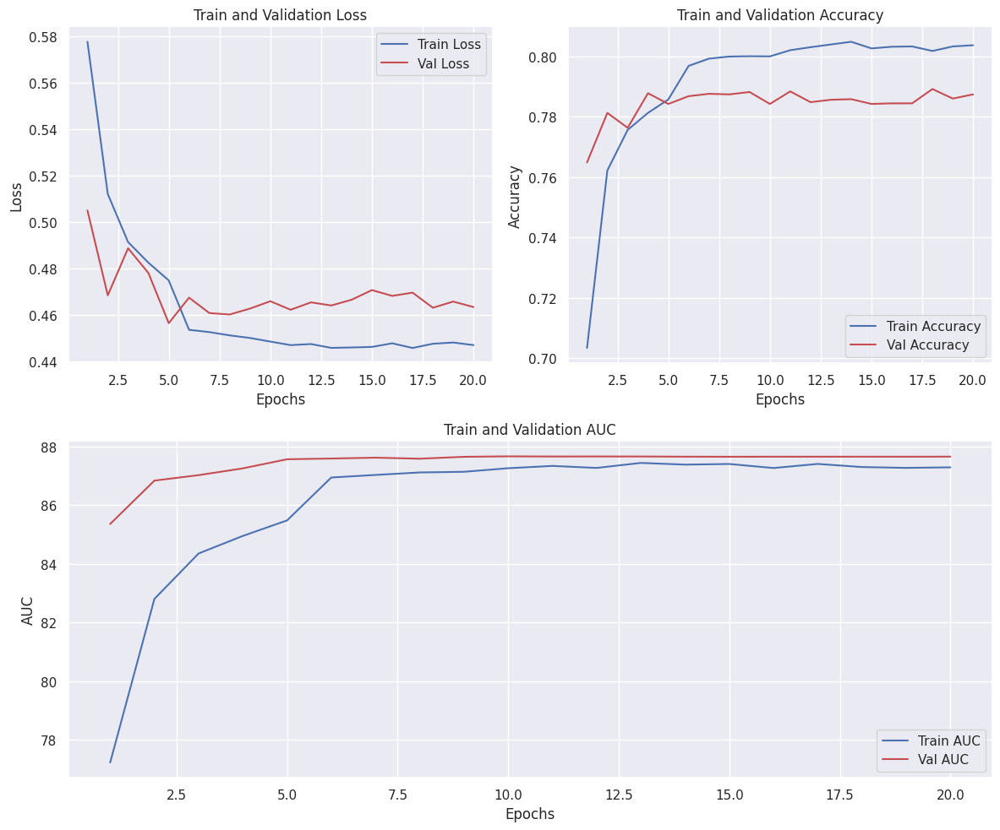

In [25]:
plot_metrics(train_loss, val_loss, train_acc, val_acc, train_auc, val_auc)